In [1]:
#Load the required libraries
import pandas as pd
import numpy as np
import seaborn as sns
from prophet import Prophet
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer

In [2]:
#Load the data
df = pd.read_csv('sorted_data.csv')
df.head()

,FIPS,Province_State,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio,Year
0,12-31-2020,Tamil Nadu,01-01-2021 05:23,11.006091,78.400624,817077,12109,796353,8615.0,"Tamil Nadu, India",1049.670736,1.481990,2020
1,12-30-2020,Tamil Nadu,31-12-2020 05:22,11.006091,78.400624,817077,12109,796353,8615.0,"Tamil Nadu, India",1049.670736,1.481990,2020
2,12-29-2020,Tamil Nadu,30-12-2020 05:22,11.006091,78.400624,816132,12092,795293,8747.0,"Tamil Nadu, India",1048.456727,1.481623,2020
3,12-28-2020,Tamil Nadu,29-12-2020 05:22,11.006091,78.400624,815175,12080,794228,8867.0,"Tamil Nadu, India",1047.227302,1.481890,2020
4,12-27-2020,Tamil Nadu,28-12-2020 05:22,11.006091,78.400624,814170,12069,793154,8947.0,"Tamil Nadu, India",1045.936213,1.482369,2020


In [3]:
df = df.drop(['Deaths','Confirmed','Recovered','Province_State','Last_Update','Lat','Long_','Combined_Key','Incident_Rate','Case_Fatality_Ratio','Year'],axis=1)
#View the data ['Deaths','Confirmed']
df.head()

,FIPS,Active
0,12-31-2020,8615.0
1,12-30-2020,8615.0
2,12-29-2020,8747.0
3,12-28-2020,8867.0
4,12-27-2020,8947.0


In [4]:
df = df.dropna().reset_index(drop=True)

In [5]:
df['FIPS'] = pd.to_datetime(df['FIPS'])
df.sort_values(by='FIPS')

,FIPS,Active
204,2020-06-10,16282.000000
203,2020-06-11,17662.000000
202,2020-06-12,17662.000000
201,2020-06-13,18284.000000
200,2020-06-14,18881.000000
...,...,...
939,2023-03-05,4618.375495
938,2023-03-06,4618.410181
937,2023-03-07,4618.446151
936,2023-03-08,4618.487261


In [6]:
#df['abs_diff'] = df['Active'].diff().abs()

In [7]:
#df = df.drop(['Active'],axis=1)


In [8]:
df.rename(columns = {'FIPS':'ds','Active':'y'}, inplace = True)

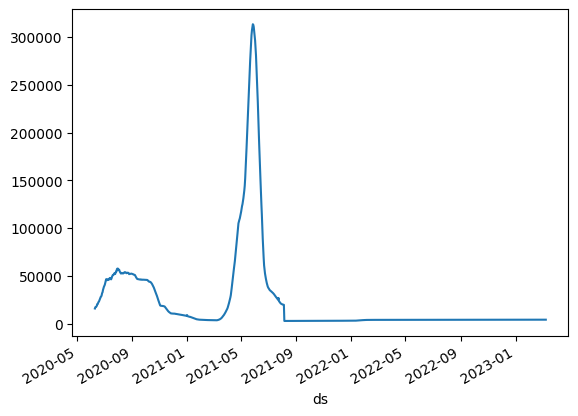

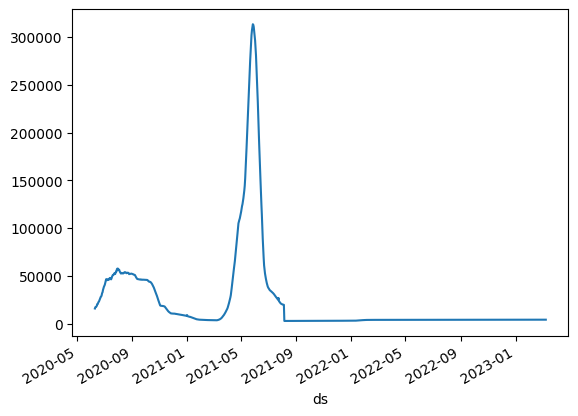

In [9]:
df.set_index('ds').y.plot().get_figure()

In [10]:
end_date = '2021-10-21'
mask1 = (df['ds'] <= end_date)
mask2 = (df['ds'] > end_date)



In [11]:
X_tr = df.loc[mask1]
X_tst = df.loc[mask2]
print("train shape",X_tr.shape)
print("test shape",X_tst.shape)

train shape (499, 2)
test shape (504, 2)


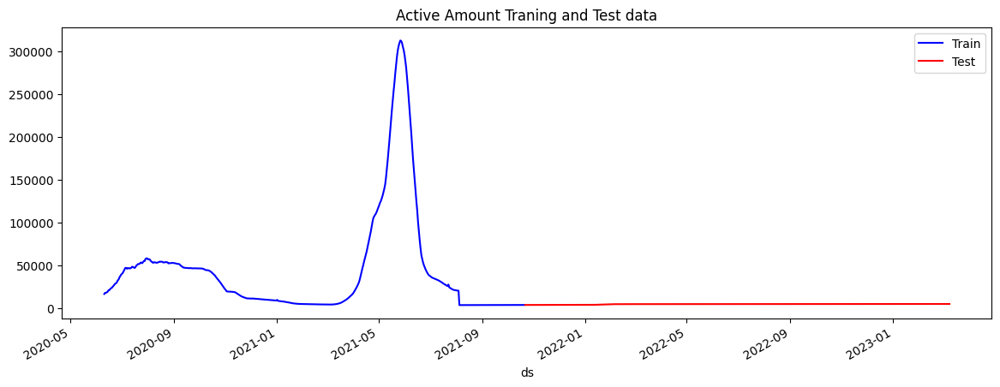

In [12]:
pd.plotting.register_matplotlib_converters()
f, ax = plt.subplots(figsize=(14,5))
X_tr.plot(kind='line', x='ds', y='y', color='blue', label='Train', ax=ax)
X_tst.plot(kind='line', x='ds', y='y', color='red', label='Test', ax=ax)
plt.title('Active Amount Traning and Test data')
plt.show()

In [13]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred[:, None] ) / y_true)) * 100

In [19]:
from sklearn.model_selection import ParameterGrid
params_grid = {'seasonality_mode':('multiplicative','additive'),
                'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
                'changepoint_prior_scale':[0.001, 0.01,0.1,0.2,0.3,0.4,0.5],
                'holidays_prior_scale':[0.1,0.2,0.3,0.4,0.5],
                'n_changepoints' : [100,150,200], 
                
              }
grid = ParameterGrid(params_grid)
cnt = 0
for p in grid:
    cnt = cnt+1

print('Total Possible Models',cnt)

Total Possible Models 53760


In [15]:
import random
import warnings
warnings.filterwarnings('ignore')
strt='2020-06-10'
end='2023-03-09'
model_parameters = pd.DataFrame(columns = ['MAPE','Parameters'])
for p in grid:
    test = pd.DataFrame()
    print(p)
    random.seed(0)
    train_model =Prophet(changepoint_prior_scale = p['changepoint_prior_scale'],
                         holidays_prior_scale = p['holidays_prior_scale'],
                         n_changepoints = p['n_changepoints'],
                         seasonality_mode = p['seasonality_mode'],
                        seasonality_prior_scale= p['seasonality_prior_scale'],                       
                         interval_width=0.95
                        )
    
    train_model.fit(df)
    train_forecast = train_model.make_future_dataframe(periods=365, freq='D',include_history = False)
    train_forecast = train_model.predict(train_forecast)
    test=train_forecast[['ds','yhat']]
    Actual = df[(df['ds']>strt) & (df['ds']<=end)]
    MAPE = mean_absolute_percentage_error(Actual['y'],abs(test['yhat']))
    print('Mean Absolute Percentage Error(MAPE)------------------------------------',MAPE)
    model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)

{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:31:29 - cmdstanpy - INFO - Chain [1] start processing
00:31:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.99496062724704
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:31:30 - cmdstanpy - INFO - Chain [1] start processing
00:31:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.2317277568969
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:31:31 - cmdstanpy - INFO - Chain [1] start processing
00:31:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.49047114903004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:31:32 - cmdstanpy - INFO - Chain [1] start processing
00:31:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.36712104024782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:31:34 - cmdstanpy - INFO - Chain [1] start processing
00:31:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.84365982695522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:31:35 - cmdstanpy - INFO - Chain [1] start processing
00:31:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.64162032449838
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:31:36 - cmdstanpy - INFO - Chain [1] start processing
00:31:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.51166136668826
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:31:37 - cmdstanpy - INFO - Chain [1] start processing
00:31:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.86388348350712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:31:38 - cmdstanpy - INFO - Chain [1] start processing
00:31:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.4768438774297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:31:40 - cmdstanpy - INFO - Chain [1] start processing
00:31:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.88275193070052
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:31:41 - cmdstanpy - INFO - Chain [1] start processing
00:31:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.30736638034858
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:31:42 - cmdstanpy - INFO - Chain [1] start processing
00:31:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.35851327528147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:31:44 - cmdstanpy - INFO - Chain [1] start processing
00:31:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.90947934840358
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:31:45 - cmdstanpy - INFO - Chain [1] start processing
00:31:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.64422340744865
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:31:47 - cmdstanpy - INFO - Chain [1] start processing
00:31:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.4688763946248
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:31:48 - cmdstanpy - INFO - Chain [1] start processing
00:31:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.5991988743438
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:31:50 - cmdstanpy - INFO - Chain [1] start processing
00:31:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.5445217011248
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:31:51 - cmdstanpy - INFO - Chain [1] start processing
00:31:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.88169315010637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:31:52 - cmdstanpy - INFO - Chain [1] start processing
00:31:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.57577954263148
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:31:53 - cmdstanpy - INFO - Chain [1] start processing
00:31:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.41670858440213
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:31:54 - cmdstanpy - INFO - Chain [1] start processing
00:31:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.642198533527
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:31:55 - cmdstanpy - INFO - Chain [1] start processing
00:31:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.68331029632122
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:31:56 - cmdstanpy - INFO - Chain [1] start processing
00:31:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.77394441832476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:31:58 - cmdstanpy - INFO - Chain [1] start processing
00:31:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.14931731882905
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:31:59 - cmdstanpy - INFO - Chain [1] start processing
00:31:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.82039891550168
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:32:00 - cmdstanpy - INFO - Chain [1] start processing
00:32:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.31872655789033
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:32:01 - cmdstanpy - INFO - Chain [1] start processing
00:32:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.99808726202585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:32:02 - cmdstanpy - INFO - Chain [1] start processing
00:32:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.38588666904806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:32:03 - cmdstanpy - INFO - Chain [1] start processing
00:32:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 188.99060647362816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:32:04 - cmdstanpy - INFO - Chain [1] start processing
00:32:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.04585236068257
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:32:05 - cmdstanpy - INFO - Chain [1] start processing
00:32:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.3742890438243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:32:07 - cmdstanpy - INFO - Chain [1] start processing
00:32:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.95807573853438
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:32:08 - cmdstanpy - INFO - Chain [1] start processing
00:32:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.38205973977527
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:32:08 - cmdstanpy - INFO - Chain [1] start processing
00:32:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.16542674151896
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:32:09 - cmdstanpy - INFO - Chain [1] start processing
00:32:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.52717471878546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:32:10 - cmdstanpy - INFO - Chain [1] start processing
00:32:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.79628784085153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:32:11 - cmdstanpy - INFO - Chain [1] start processing
00:32:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.57840552885628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:32:12 - cmdstanpy - INFO - Chain [1] start processing
00:32:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.04173599060547
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:32:13 - cmdstanpy - INFO - Chain [1] start processing
00:32:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.73091964433185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:32:14 - cmdstanpy - INFO - Chain [1] start processing
00:32:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.01362021347094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:32:15 - cmdstanpy - INFO - Chain [1] start processing
00:32:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.16128711815978
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:32:16 - cmdstanpy - INFO - Chain [1] start processing
00:32:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.76744824185425
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:32:17 - cmdstanpy - INFO - Chain [1] start processing
00:32:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.98490898048587
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:32:19 - cmdstanpy - INFO - Chain [1] start processing
00:32:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.8901436192369
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:32:20 - cmdstanpy - INFO - Chain [1] start processing
00:32:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.3632827590553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:32:21 - cmdstanpy - INFO - Chain [1] start processing
00:32:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.17810875033544
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:32:22 - cmdstanpy - INFO - Chain [1] start processing
00:32:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.2245717022132
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:32:23 - cmdstanpy - INFO - Chain [1] start processing
00:32:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.57016748732481
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:32:24 - cmdstanpy - INFO - Chain [1] start processing
00:32:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.7738344406703
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:32:25 - cmdstanpy - INFO - Chain [1] start processing
00:32:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.58200957293805
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:32:26 - cmdstanpy - INFO - Chain [1] start processing
00:32:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.25656435654594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:32:27 - cmdstanpy - INFO - Chain [1] start processing
00:32:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.60209736164742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:32:28 - cmdstanpy - INFO - Chain [1] start processing
00:32:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.75470773165569
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:32:29 - cmdstanpy - INFO - Chain [1] start processing
00:32:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.17353993917433
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:32:29 - cmdstanpy - INFO - Chain [1] start processing
00:32:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.07815888415942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:32:31 - cmdstanpy - INFO - Chain [1] start processing
00:32:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.68819030481339
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:32:32 - cmdstanpy - INFO - Chain [1] start processing
00:32:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.16884276852073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:32:32 - cmdstanpy - INFO - Chain [1] start processing
00:32:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.5451043272573
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:32:33 - cmdstanpy - INFO - Chain [1] start processing
00:32:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.98541425099646
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:32:35 - cmdstanpy - INFO - Chain [1] start processing
00:32:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.42875355375483
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:32:36 - cmdstanpy - INFO - Chain [1] start processing
00:32:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.97441951388186
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:32:37 - cmdstanpy - INFO - Chain [1] start processing
00:32:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.1233699049149
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:32:38 - cmdstanpy - INFO - Chain [1] start processing
00:32:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.37162710508625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:32:40 - cmdstanpy - INFO - Chain [1] start processing
00:32:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.1977442974235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:32:41 - cmdstanpy - INFO - Chain [1] start processing
00:32:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.2876087855237
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:32:42 - cmdstanpy - INFO - Chain [1] start processing
00:32:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.14418373358708
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:32:43 - cmdstanpy - INFO - Chain [1] start processing
00:32:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.36145168509253
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:32:44 - cmdstanpy - INFO - Chain [1] start processing
00:32:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.5101146207777
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:32:45 - cmdstanpy - INFO - Chain [1] start processing
00:32:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.89614159312765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:32:46 - cmdstanpy - INFO - Chain [1] start processing
00:32:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.12269387340606
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:32:48 - cmdstanpy - INFO - Chain [1] start processing
00:32:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.54974861727854
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:32:50 - cmdstanpy - INFO - Chain [1] start processing
00:32:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.0881263385728
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:32:51 - cmdstanpy - INFO - Chain [1] start processing
00:32:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.86801930731318
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:32:53 - cmdstanpy - INFO - Chain [1] start processing
00:32:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.88155052854611
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:32:55 - cmdstanpy - INFO - Chain [1] start processing
00:32:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.63490281615555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:32:57 - cmdstanpy - INFO - Chain [1] start processing
00:32:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.30380523729806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:32:59 - cmdstanpy - INFO - Chain [1] start processing
00:33:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.11947160218807
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:33:01 - cmdstanpy - INFO - Chain [1] start processing
00:33:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.90495903465316
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:33:03 - cmdstanpy - INFO - Chain [1] start processing
00:33:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.62759364229285
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:33:05 - cmdstanpy - INFO - Chain [1] start processing
00:33:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.70244401036186
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:33:07 - cmdstanpy - INFO - Chain [1] start processing
00:33:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.98842874075734
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:33:08 - cmdstanpy - INFO - Chain [1] start processing
00:33:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.08926313804926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:33:09 - cmdstanpy - INFO - Chain [1] start processing
00:33:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.08759883599845
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:33:11 - cmdstanpy - INFO - Chain [1] start processing
00:33:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.8219195594553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:33:12 - cmdstanpy - INFO - Chain [1] start processing
00:33:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.00366013206985
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:33:14 - cmdstanpy - INFO - Chain [1] start processing
00:33:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.6293510176194
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:33:15 - cmdstanpy - INFO - Chain [1] start processing
00:33:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.63735080647206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:33:17 - cmdstanpy - INFO - Chain [1] start processing
00:33:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.10490592396536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:33:18 - cmdstanpy - INFO - Chain [1] start processing
00:33:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.021915705881
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:33:19 - cmdstanpy - INFO - Chain [1] start processing
00:33:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.8263943561069
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:33:21 - cmdstanpy - INFO - Chain [1] start processing
00:33:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.2212473102402
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:33:23 - cmdstanpy - INFO - Chain [1] start processing
00:33:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.0709226195194
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:33:24 - cmdstanpy - INFO - Chain [1] start processing
00:33:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.08198957779547
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:33:25 - cmdstanpy - INFO - Chain [1] start processing
00:33:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.59293486517464
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:33:27 - cmdstanpy - INFO - Chain [1] start processing
00:33:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0149414735517
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:33:29 - cmdstanpy - INFO - Chain [1] start processing
00:33:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.89428727292466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:33:30 - cmdstanpy - INFO - Chain [1] start processing
00:33:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.8945392210367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:33:31 - cmdstanpy - INFO - Chain [1] start processing
00:33:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.80268863977795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:33:32 - cmdstanpy - INFO - Chain [1] start processing
00:33:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.2789697363448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:33:33 - cmdstanpy - INFO - Chain [1] start processing
00:33:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.57371257078466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:33:34 - cmdstanpy - INFO - Chain [1] start processing
00:33:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.08748947460253
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:33:35 - cmdstanpy - INFO - Chain [1] start processing
00:33:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.35488681162275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:33:36 - cmdstanpy - INFO - Chain [1] start processing
00:33:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7182775122022
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:33:38 - cmdstanpy - INFO - Chain [1] start processing
00:33:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.21586689351375
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:33:39 - cmdstanpy - INFO - Chain [1] start processing
00:33:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.9055823349182
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:33:41 - cmdstanpy - INFO - Chain [1] start processing
00:33:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.97805242611133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:33:42 - cmdstanpy - INFO - Chain [1] start processing
00:33:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.59644666247493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:33:43 - cmdstanpy - INFO - Chain [1] start processing
00:33:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.35219389861993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:33:45 - cmdstanpy - INFO - Chain [1] start processing
00:33:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.44991341569596
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:33:46 - cmdstanpy - INFO - Chain [1] start processing
00:33:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.6960357531515
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:33:48 - cmdstanpy - INFO - Chain [1] start processing
00:33:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.1955614812457
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:33:50 - cmdstanpy - INFO - Chain [1] start processing
00:33:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.1201805192206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:33:52 - cmdstanpy - INFO - Chain [1] start processing
00:33:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.1503845531908
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:33:53 - cmdstanpy - INFO - Chain [1] start processing
00:33:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.0806409476995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:33:54 - cmdstanpy - INFO - Chain [1] start processing
00:33:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.6812011050886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:33:55 - cmdstanpy - INFO - Chain [1] start processing
00:33:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7296300677996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:33:56 - cmdstanpy - INFO - Chain [1] start processing
00:33:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.77109679318386
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:33:57 - cmdstanpy - INFO - Chain [1] start processing
00:33:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.07115958491636
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:33:58 - cmdstanpy - INFO - Chain [1] start processing
00:33:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.6202075158926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:34:00 - cmdstanpy - INFO - Chain [1] start processing
00:34:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.32399347902555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:34:01 - cmdstanpy - INFO - Chain [1] start processing
00:34:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.64339774599995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:34:02 - cmdstanpy - INFO - Chain [1] start processing
00:34:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.20462594829223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:34:03 - cmdstanpy - INFO - Chain [1] start processing
00:34:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.7351894855868
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:34:04 - cmdstanpy - INFO - Chain [1] start processing
00:34:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.8925979030348
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:34:05 - cmdstanpy - INFO - Chain [1] start processing
00:34:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.9964934132508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:34:07 - cmdstanpy - INFO - Chain [1] start processing
00:34:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.040083548178
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:34:08 - cmdstanpy - INFO - Chain [1] start processing
00:34:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.8979631643687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:34:10 - cmdstanpy - INFO - Chain [1] start processing
00:34:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.25266514793475
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:34:11 - cmdstanpy - INFO - Chain [1] start processing
00:34:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.7505711339975
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:34:12 - cmdstanpy - INFO - Chain [1] start processing
00:34:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.75467380183764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:34:14 - cmdstanpy - INFO - Chain [1] start processing
00:34:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.4530219077608
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:34:15 - cmdstanpy - INFO - Chain [1] start processing
00:34:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 183.88510897430456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:34:17 - cmdstanpy - INFO - Chain [1] start processing
00:34:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.04327450079174
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:34:18 - cmdstanpy - INFO - Chain [1] start processing
00:34:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 211.67368306687334
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:34:19 - cmdstanpy - INFO - Chain [1] start processing
00:34:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.77400929554153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:34:20 - cmdstanpy - INFO - Chain [1] start processing
00:34:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 79.95566871896298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:34:21 - cmdstanpy - INFO - Chain [1] start processing
00:34:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.6245315054239
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:34:22 - cmdstanpy - INFO - Chain [1] start processing
00:34:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.0620443581951
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:34:24 - cmdstanpy - INFO - Chain [1] start processing
00:34:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.88870221975776
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:34:26 - cmdstanpy - INFO - Chain [1] start processing
00:34:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.7829121482799
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:34:27 - cmdstanpy - INFO - Chain [1] start processing
00:34:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.55127842092253
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:34:29 - cmdstanpy - INFO - Chain [1] start processing
00:34:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.67649826471273
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:34:30 - cmdstanpy - INFO - Chain [1] start processing
00:34:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.17656401010306
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:34:32 - cmdstanpy - INFO - Chain [1] start processing
00:34:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.27485959438742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:34:34 - cmdstanpy - INFO - Chain [1] start processing
00:34:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.42748255169914
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:34:35 - cmdstanpy - INFO - Chain [1] start processing
00:34:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.41138236250703
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:34:36 - cmdstanpy - INFO - Chain [1] start processing
00:34:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.9152488088013
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:34:37 - cmdstanpy - INFO - Chain [1] start processing
00:34:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.99224740351622
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:34:38 - cmdstanpy - INFO - Chain [1] start processing
00:34:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.4617987993616
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:34:40 - cmdstanpy - INFO - Chain [1] start processing
00:34:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.19632295659915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:34:41 - cmdstanpy - INFO - Chain [1] start processing
00:34:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.68604928309486
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:34:43 - cmdstanpy - INFO - Chain [1] start processing
00:34:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.67881200099623
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:34:44 - cmdstanpy - INFO - Chain [1] start processing
00:34:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.73202226982497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:34:45 - cmdstanpy - INFO - Chain [1] start processing
00:34:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.94328618179978
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:34:47 - cmdstanpy - INFO - Chain [1] start processing
00:34:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.20283842686675
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:34:49 - cmdstanpy - INFO - Chain [1] start processing
00:34:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.0910330141776
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:34:50 - cmdstanpy - INFO - Chain [1] start processing
00:34:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.99890181723254
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:34:52 - cmdstanpy - INFO - Chain [1] start processing
00:34:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.63772183173757
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:34:53 - cmdstanpy - INFO - Chain [1] start processing
00:34:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.59721164251832
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:34:55 - cmdstanpy - INFO - Chain [1] start processing
00:34:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.55823185523042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:34:56 - cmdstanpy - INFO - Chain [1] start processing
00:34:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.33060318344262
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:34:57 - cmdstanpy - INFO - Chain [1] start processing
00:34:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.706714469053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:34:58 - cmdstanpy - INFO - Chain [1] start processing
00:34:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.5378246434723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:34:59 - cmdstanpy - INFO - Chain [1] start processing
00:35:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.56586881658185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:35:01 - cmdstanpy - INFO - Chain [1] start processing
00:35:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.40440436278462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:35:02 - cmdstanpy - INFO - Chain [1] start processing
00:35:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.65300898759786
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:35:03 - cmdstanpy - INFO - Chain [1] start processing
00:35:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 123.18576591768588
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:35:04 - cmdstanpy - INFO - Chain [1] start processing
00:35:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.59102095708144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:35:05 - cmdstanpy - INFO - Chain [1] start processing
00:35:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.71081453842577
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:35:07 - cmdstanpy - INFO - Chain [1] start processing
00:35:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.6031667501324
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:35:08 - cmdstanpy - INFO - Chain [1] start processing
00:35:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.6268397003144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:35:11 - cmdstanpy - INFO - Chain [1] start processing
00:35:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.9643565180946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:35:13 - cmdstanpy - INFO - Chain [1] start processing
00:35:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.56628080155403
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:35:14 - cmdstanpy - INFO - Chain [1] start processing
00:35:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.4758850273378
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:35:17 - cmdstanpy - INFO - Chain [1] start processing
00:35:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.325029658749
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:35:19 - cmdstanpy - INFO - Chain [1] start processing
00:35:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.04231828097687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:35:21 - cmdstanpy - INFO - Chain [1] start processing
00:35:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.91350476412715
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:35:22 - cmdstanpy - INFO - Chain [1] start processing
00:35:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.2777340291615
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:35:24 - cmdstanpy - INFO - Chain [1] start processing
00:35:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.59994299379461
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:35:26 - cmdstanpy - INFO - Chain [1] start processing
00:35:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.9823934402173
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:35:27 - cmdstanpy - INFO - Chain [1] start processing
00:35:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 223.0144039222036
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:35:28 - cmdstanpy - INFO - Chain [1] start processing
00:35:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.67077512226639
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:35:30 - cmdstanpy - INFO - Chain [1] start processing
00:35:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.2704967639917
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:35:32 - cmdstanpy - INFO - Chain [1] start processing
00:35:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.6194312186062
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:35:34 - cmdstanpy - INFO - Chain [1] start processing
00:35:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.8408769443215
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:35:36 - cmdstanpy - INFO - Chain [1] start processing
00:35:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.37393320368824
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:35:39 - cmdstanpy - INFO - Chain [1] start processing
00:35:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.08479098845055
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:35:41 - cmdstanpy - INFO - Chain [1] start processing
00:35:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.06576871113694
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:35:42 - cmdstanpy - INFO - Chain [1] start processing
00:35:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.19960231863992
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:35:44 - cmdstanpy - INFO - Chain [1] start processing
00:35:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.5919296948835
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:35:45 - cmdstanpy - INFO - Chain [1] start processing
00:35:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.77345848293928
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:35:47 - cmdstanpy - INFO - Chain [1] start processing
00:35:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 85.413881005946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:35:49 - cmdstanpy - INFO - Chain [1] start processing
00:35:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.20495539558118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:35:49 - cmdstanpy - INFO - Chain [1] start processing
00:35:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.9700310465227
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:35:50 - cmdstanpy - INFO - Chain [1] start processing
00:35:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.52627071250032
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:35:52 - cmdstanpy - INFO - Chain [1] start processing
00:35:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.8335586680851
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:35:53 - cmdstanpy - INFO - Chain [1] start processing
00:35:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.5772796401044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:35:54 - cmdstanpy - INFO - Chain [1] start processing
00:35:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.44938095028127
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:35:55 - cmdstanpy - INFO - Chain [1] start processing
00:35:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.7756965745909
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:35:57 - cmdstanpy - INFO - Chain [1] start processing
00:35:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.0475177422852
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:35:59 - cmdstanpy - INFO - Chain [1] start processing
00:35:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.84893190341393
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:36:00 - cmdstanpy - INFO - Chain [1] start processing
00:36:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.25222819009946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:36:01 - cmdstanpy - INFO - Chain [1] start processing
00:36:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.15251381405676
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:36:03 - cmdstanpy - INFO - Chain [1] start processing
00:36:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.30697481948604
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:36:05 - cmdstanpy - INFO - Chain [1] start processing
00:36:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.1426308562022
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:36:07 - cmdstanpy - INFO - Chain [1] start processing
00:36:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.01097636623564
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:36:09 - cmdstanpy - INFO - Chain [1] start processing
00:36:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.47508294327457
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:36:11 - cmdstanpy - INFO - Chain [1] start processing
00:36:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.93203798031735
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:36:13 - cmdstanpy - INFO - Chain [1] start processing
00:36:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.69183701758806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:36:15 - cmdstanpy - INFO - Chain [1] start processing
00:36:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.10879377804076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:36:16 - cmdstanpy - INFO - Chain [1] start processing
00:36:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.59634024664774
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:36:17 - cmdstanpy - INFO - Chain [1] start processing
00:36:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.04210277193727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:36:18 - cmdstanpy - INFO - Chain [1] start processing
00:36:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3336116297478
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:36:20 - cmdstanpy - INFO - Chain [1] start processing
00:36:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.67048815922044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:36:21 - cmdstanpy - INFO - Chain [1] start processing
00:36:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.55453299543666
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:36:23 - cmdstanpy - INFO - Chain [1] start processing
00:36:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.6767308285738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:36:24 - cmdstanpy - INFO - Chain [1] start processing
00:36:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.80172067944864
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:36:25 - cmdstanpy - INFO - Chain [1] start processing
00:36:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.3829750468405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:36:27 - cmdstanpy - INFO - Chain [1] start processing
00:36:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.86348153641353
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:36:29 - cmdstanpy - INFO - Chain [1] start processing
00:36:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.19080386143634
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:36:31 - cmdstanpy - INFO - Chain [1] start processing
00:36:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.22780731888406
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:36:32 - cmdstanpy - INFO - Chain [1] start processing
00:36:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.56372383506823
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:36:35 - cmdstanpy - INFO - Chain [1] start processing
00:36:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.1104173417449
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:36:37 - cmdstanpy - INFO - Chain [1] start processing
00:36:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.1557316026014
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:36:38 - cmdstanpy - INFO - Chain [1] start processing
00:36:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.5495649606206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:36:40 - cmdstanpy - INFO - Chain [1] start processing
00:36:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.94049275582273
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:36:42 - cmdstanpy - INFO - Chain [1] start processing
00:36:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.99619052123563
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:36:45 - cmdstanpy - INFO - Chain [1] start processing
00:36:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.97024824861785
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:36:47 - cmdstanpy - INFO - Chain [1] start processing
00:36:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.9504437178879
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:36:49 - cmdstanpy - INFO - Chain [1] start processing
00:36:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.57237228673677
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:36:51 - cmdstanpy - INFO - Chain [1] start processing
00:36:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.59561415193275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:36:53 - cmdstanpy - INFO - Chain [1] start processing
00:36:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.6875160518894
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:36:55 - cmdstanpy - INFO - Chain [1] start processing
00:36:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.82605211827274
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:36:57 - cmdstanpy - INFO - Chain [1] start processing
00:36:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.6704821565416
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:36:59 - cmdstanpy - INFO - Chain [1] start processing
00:37:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.23770161296994
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:37:01 - cmdstanpy - INFO - Chain [1] start processing
00:37:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.6163480167725
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:37:02 - cmdstanpy - INFO - Chain [1] start processing
00:37:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.10189472569175
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:37:04 - cmdstanpy - INFO - Chain [1] start processing
00:37:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3214627647333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:37:06 - cmdstanpy - INFO - Chain [1] start processing
00:37:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.39539721372836
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:37:07 - cmdstanpy - INFO - Chain [1] start processing
00:37:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.2504014641961
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:37:08 - cmdstanpy - INFO - Chain [1] start processing
00:37:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3371531186017
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:37:09 - cmdstanpy - INFO - Chain [1] start processing
00:37:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7714271943685
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:37:10 - cmdstanpy - INFO - Chain [1] start processing
00:37:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.1868524718383
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:37:12 - cmdstanpy - INFO - Chain [1] start processing
00:37:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.4327305167524
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:37:13 - cmdstanpy - INFO - Chain [1] start processing
00:37:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.53157565093164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:37:14 - cmdstanpy - INFO - Chain [1] start processing
00:37:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.38772602255494
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:37:15 - cmdstanpy - INFO - Chain [1] start processing
00:37:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5017300414519
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:37:17 - cmdstanpy - INFO - Chain [1] start processing
00:37:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.4582696541417
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:37:18 - cmdstanpy - INFO - Chain [1] start processing
00:37:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.6338217359939
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:37:19 - cmdstanpy - INFO - Chain [1] start processing
00:37:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.92553333152347
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:37:21 - cmdstanpy - INFO - Chain [1] start processing
00:37:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.6194489504705
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:37:22 - cmdstanpy - INFO - Chain [1] start processing
00:37:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.3183451494915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:37:24 - cmdstanpy - INFO - Chain [1] start processing
00:37:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1224684262501
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:37:25 - cmdstanpy - INFO - Chain [1] start processing
00:37:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.72461885263874
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:37:26 - cmdstanpy - INFO - Chain [1] start processing
00:37:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0575818214189
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:37:28 - cmdstanpy - INFO - Chain [1] start processing
00:37:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.0082460209522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:37:29 - cmdstanpy - INFO - Chain [1] start processing
00:37:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.06389988725684
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:37:31 - cmdstanpy - INFO - Chain [1] start processing
00:37:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.6110380118893
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:37:34 - cmdstanpy - INFO - Chain [1] start processing
00:37:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 195.22417534018976
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:37:36 - cmdstanpy - INFO - Chain [1] start processing
00:37:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.0867539904925
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:37:37 - cmdstanpy - INFO - Chain [1] start processing
00:37:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.96435908255089
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:37:38 - cmdstanpy - INFO - Chain [1] start processing
00:37:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.5997487337133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:37:40 - cmdstanpy - INFO - Chain [1] start processing
00:37:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.9216007623484
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:37:41 - cmdstanpy - INFO - Chain [1] start processing
00:37:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.66084487369938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:37:43 - cmdstanpy - INFO - Chain [1] start processing
00:37:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.4868905631109
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:37:44 - cmdstanpy - INFO - Chain [1] start processing
00:37:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.11038781656188
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:37:46 - cmdstanpy - INFO - Chain [1] start processing
00:37:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.07487794113493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:37:47 - cmdstanpy - INFO - Chain [1] start processing
00:37:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.43862189968803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:37:49 - cmdstanpy - INFO - Chain [1] start processing
00:37:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.73736159334993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:37:51 - cmdstanpy - INFO - Chain [1] start processing
00:37:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.5779426291406
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:37:53 - cmdstanpy - INFO - Chain [1] start processing
00:37:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.64805188405745
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:37:54 - cmdstanpy - INFO - Chain [1] start processing
00:37:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.0478329406673
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:37:56 - cmdstanpy - INFO - Chain [1] start processing
00:37:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.76715440658165
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:37:57 - cmdstanpy - INFO - Chain [1] start processing
00:37:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.67765614604662
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:37:58 - cmdstanpy - INFO - Chain [1] start processing
00:37:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.01570474386101
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:38:00 - cmdstanpy - INFO - Chain [1] start processing
00:38:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.3157921702095
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:38:01 - cmdstanpy - INFO - Chain [1] start processing
00:38:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 205.4510516046598
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:38:02 - cmdstanpy - INFO - Chain [1] start processing
00:38:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.92807824050863
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:38:04 - cmdstanpy - INFO - Chain [1] start processing
00:38:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.50534080583802
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:38:05 - cmdstanpy - INFO - Chain [1] start processing
00:38:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.3728000347968
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:38:07 - cmdstanpy - INFO - Chain [1] start processing
00:38:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.311279773367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:38:08 - cmdstanpy - INFO - Chain [1] start processing
00:38:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.4527980159557
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:38:10 - cmdstanpy - INFO - Chain [1] start processing
00:38:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.84395791064773
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:38:12 - cmdstanpy - INFO - Chain [1] start processing
00:38:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.56368686389192
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:38:13 - cmdstanpy - INFO - Chain [1] start processing
00:38:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.02664429382037
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:38:15 - cmdstanpy - INFO - Chain [1] start processing
00:38:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.1365524343388
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:38:16 - cmdstanpy - INFO - Chain [1] start processing
00:38:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.84466778659657
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:38:18 - cmdstanpy - INFO - Chain [1] start processing
00:38:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.8123658018483
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:38:20 - cmdstanpy - INFO - Chain [1] start processing
00:38:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.98301431151017
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:38:21 - cmdstanpy - INFO - Chain [1] start processing
00:38:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.16535848797236
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:38:23 - cmdstanpy - INFO - Chain [1] start processing
00:38:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.18908026078583
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:38:24 - cmdstanpy - INFO - Chain [1] start processing
00:38:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.4779823979658
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:38:26 - cmdstanpy - INFO - Chain [1] start processing
00:38:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.92239338832363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:38:27 - cmdstanpy - INFO - Chain [1] start processing
00:38:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.40248071831195
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:38:28 - cmdstanpy - INFO - Chain [1] start processing
00:38:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.34444169694117
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:38:30 - cmdstanpy - INFO - Chain [1] start processing
00:38:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.4120770228364
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:38:31 - cmdstanpy - INFO - Chain [1] start processing
00:38:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.40480578291944
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:38:32 - cmdstanpy - INFO - Chain [1] start processing
00:38:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.99047247922744
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:38:34 - cmdstanpy - INFO - Chain [1] start processing
00:38:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.22238029328068
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:38:36 - cmdstanpy - INFO - Chain [1] start processing
00:38:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.11101910898947
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:38:37 - cmdstanpy - INFO - Chain [1] start processing
00:38:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.8265560642422
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:38:39 - cmdstanpy - INFO - Chain [1] start processing
00:38:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.11156592248514
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:38:41 - cmdstanpy - INFO - Chain [1] start processing
00:38:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.783179632133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:38:43 - cmdstanpy - INFO - Chain [1] start processing
00:38:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.18436193008262
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:38:44 - cmdstanpy - INFO - Chain [1] start processing
00:38:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.11006080623727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:38:45 - cmdstanpy - INFO - Chain [1] start processing
00:38:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.8546423050199
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:38:46 - cmdstanpy - INFO - Chain [1] start processing
00:38:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.5007857553884
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:38:48 - cmdstanpy - INFO - Chain [1] start processing
00:38:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.32502866710196
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:38:49 - cmdstanpy - INFO - Chain [1] start processing
00:38:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.5026526589278
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:38:50 - cmdstanpy - INFO - Chain [1] start processing
00:38:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.91830854890327
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:38:52 - cmdstanpy - INFO - Chain [1] start processing
00:38:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.9705347781401
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:38:53 - cmdstanpy - INFO - Chain [1] start processing
00:38:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.1803300978504
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:38:55 - cmdstanpy - INFO - Chain [1] start processing
00:38:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.34059656770523
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:38:56 - cmdstanpy - INFO - Chain [1] start processing
00:38:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.31517493805075
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:38:57 - cmdstanpy - INFO - Chain [1] start processing
00:38:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.19833541449398
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:38:59 - cmdstanpy - INFO - Chain [1] start processing
00:38:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.96167775443536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:39:00 - cmdstanpy - INFO - Chain [1] start processing
00:39:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.78126074434616
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:39:02 - cmdstanpy - INFO - Chain [1] start processing
00:39:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.67105770800333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:39:03 - cmdstanpy - INFO - Chain [1] start processing
00:39:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.5464037252234
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:39:05 - cmdstanpy - INFO - Chain [1] start processing
00:39:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.80920133257868
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:39:06 - cmdstanpy - INFO - Chain [1] start processing
00:39:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.95003289850573
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:39:07 - cmdstanpy - INFO - Chain [1] start processing
00:39:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.8772337409971
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:39:09 - cmdstanpy - INFO - Chain [1] start processing
00:39:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.0372946040541
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:39:10 - cmdstanpy - INFO - Chain [1] start processing
00:39:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.87070807423962
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:39:12 - cmdstanpy - INFO - Chain [1] start processing
00:39:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.6988395851501
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:39:13 - cmdstanpy - INFO - Chain [1] start processing
00:39:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.41311078507857
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:39:15 - cmdstanpy - INFO - Chain [1] start processing
00:39:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.56002826776597
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:39:16 - cmdstanpy - INFO - Chain [1] start processing
00:39:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.50305195466146
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:39:17 - cmdstanpy - INFO - Chain [1] start processing
00:39:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.08331051231838
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:39:19 - cmdstanpy - INFO - Chain [1] start processing
00:39:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.0384636836924
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:39:20 - cmdstanpy - INFO - Chain [1] start processing
00:39:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.36013998443357
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:39:23 - cmdstanpy - INFO - Chain [1] start processing
00:39:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.7363233984058
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:39:24 - cmdstanpy - INFO - Chain [1] start processing
00:39:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.29929244497364
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:39:26 - cmdstanpy - INFO - Chain [1] start processing
00:39:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.48094579709365
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:39:28 - cmdstanpy - INFO - Chain [1] start processing
00:39:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.37676724957532
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:39:30 - cmdstanpy - INFO - Chain [1] start processing
00:39:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.53008911713127
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:39:32 - cmdstanpy - INFO - Chain [1] start processing
00:39:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.2795843737488
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:39:33 - cmdstanpy - INFO - Chain [1] start processing
00:39:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.8575092166801
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:39:34 - cmdstanpy - INFO - Chain [1] start processing
00:39:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.98292212543305
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:39:36 - cmdstanpy - INFO - Chain [1] start processing
00:39:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.51738836586327
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:39:37 - cmdstanpy - INFO - Chain [1] start processing
00:39:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.70950268964566
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:39:38 - cmdstanpy - INFO - Chain [1] start processing
00:39:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.99794208872754
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:39:40 - cmdstanpy - INFO - Chain [1] start processing
00:39:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.9485911931993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:39:41 - cmdstanpy - INFO - Chain [1] start processing
00:39:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.0828961760351
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:39:43 - cmdstanpy - INFO - Chain [1] start processing
00:39:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.96399996731765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:39:44 - cmdstanpy - INFO - Chain [1] start processing
00:39:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.0063187555622
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:39:46 - cmdstanpy - INFO - Chain [1] start processing
00:39:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.1585243071456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:39:47 - cmdstanpy - INFO - Chain [1] start processing
00:39:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.4128407942306
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:39:49 - cmdstanpy - INFO - Chain [1] start processing
00:39:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.682663538742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:39:51 - cmdstanpy - INFO - Chain [1] start processing
00:39:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.2354397315854
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:39:52 - cmdstanpy - INFO - Chain [1] start processing
00:39:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.53947246747816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:39:54 - cmdstanpy - INFO - Chain [1] start processing
00:39:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.2444524488474
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:39:56 - cmdstanpy - INFO - Chain [1] start processing
00:39:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.33703667143203
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:39:57 - cmdstanpy - INFO - Chain [1] start processing
00:39:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.19284798537507
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:39:58 - cmdstanpy - INFO - Chain [1] start processing
00:40:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.98805177601594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:40:00 - cmdstanpy - INFO - Chain [1] start processing
00:40:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.6087366925842
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:40:02 - cmdstanpy - INFO - Chain [1] start processing
00:40:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.73623503805845
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:40:03 - cmdstanpy - INFO - Chain [1] start processing
00:40:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.7148147445328
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:40:04 - cmdstanpy - INFO - Chain [1] start processing
00:40:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.81451350399544
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:40:05 - cmdstanpy - INFO - Chain [1] start processing
00:40:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.3641502594921
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:40:07 - cmdstanpy - INFO - Chain [1] start processing
00:40:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.99049779939617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:40:08 - cmdstanpy - INFO - Chain [1] start processing
00:40:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.45929451027456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:40:10 - cmdstanpy - INFO - Chain [1] start processing
00:40:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.99547516588814
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:40:12 - cmdstanpy - INFO - Chain [1] start processing
00:40:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.952890299445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:40:14 - cmdstanpy - INFO - Chain [1] start processing
00:40:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6730054430949
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:40:16 - cmdstanpy - INFO - Chain [1] start processing
00:40:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.9449909322523
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:40:18 - cmdstanpy - INFO - Chain [1] start processing
00:40:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.88186810743815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:40:19 - cmdstanpy - INFO - Chain [1] start processing
00:40:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.8643267507286
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:40:21 - cmdstanpy - INFO - Chain [1] start processing
00:40:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.4359926681097
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:40:22 - cmdstanpy - INFO - Chain [1] start processing
00:40:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.04374041474875
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:40:23 - cmdstanpy - INFO - Chain [1] start processing
00:40:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.123400960415
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:40:25 - cmdstanpy - INFO - Chain [1] start processing
00:40:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.5301049322425
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:40:27 - cmdstanpy - INFO - Chain [1] start processing
00:40:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.20866488660505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:40:29 - cmdstanpy - INFO - Chain [1] start processing
00:40:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.7505972026595
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:40:30 - cmdstanpy - INFO - Chain [1] start processing
00:40:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.7000328001195
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:40:31 - cmdstanpy - INFO - Chain [1] start processing
00:40:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.3336736147508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:40:33 - cmdstanpy - INFO - Chain [1] start processing
00:40:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.38035852748266
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:40:34 - cmdstanpy - INFO - Chain [1] start processing
00:40:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.63541151381827
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:40:36 - cmdstanpy - INFO - Chain [1] start processing
00:40:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.0271115281672
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:40:38 - cmdstanpy - INFO - Chain [1] start processing
00:40:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.79833210434856
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:40:40 - cmdstanpy - INFO - Chain [1] start processing
00:40:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.09079700008766
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:40:42 - cmdstanpy - INFO - Chain [1] start processing
00:40:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.7600022909054
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:40:43 - cmdstanpy - INFO - Chain [1] start processing
00:40:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.27573140657483
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:40:45 - cmdstanpy - INFO - Chain [1] start processing
00:40:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.50256899614124
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:40:46 - cmdstanpy - INFO - Chain [1] start processing
00:40:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.99496062724704
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:40:47 - cmdstanpy - INFO - Chain [1] start processing
00:40:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.2317277568969
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:40:48 - cmdstanpy - INFO - Chain [1] start processing
00:40:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.49047114903004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:40:50 - cmdstanpy - INFO - Chain [1] start processing
00:40:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.36712104024782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:40:51 - cmdstanpy - INFO - Chain [1] start processing
00:40:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.84365982695522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:40:52 - cmdstanpy - INFO - Chain [1] start processing
00:40:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.64162032449838
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:40:54 - cmdstanpy - INFO - Chain [1] start processing
00:40:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.51166136668826
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:40:55 - cmdstanpy - INFO - Chain [1] start processing
00:40:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.86388348350712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:40:56 - cmdstanpy - INFO - Chain [1] start processing
00:40:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.4768438774297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:40:57 - cmdstanpy - INFO - Chain [1] start processing
00:40:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.88275193070052
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:40:58 - cmdstanpy - INFO - Chain [1] start processing
00:40:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.30736638034858
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:40:59 - cmdstanpy - INFO - Chain [1] start processing
00:41:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.35851327528147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:41:00 - cmdstanpy - INFO - Chain [1] start processing
00:41:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.90947934840358
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:41:02 - cmdstanpy - INFO - Chain [1] start processing
00:41:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.64422340744865
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:41:03 - cmdstanpy - INFO - Chain [1] start processing
00:41:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.4688763946248
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:41:04 - cmdstanpy - INFO - Chain [1] start processing
00:41:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.5991988743438
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:41:05 - cmdstanpy - INFO - Chain [1] start processing
00:41:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.5445217011248
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:41:06 - cmdstanpy - INFO - Chain [1] start processing
00:41:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.88169315010637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:41:07 - cmdstanpy - INFO - Chain [1] start processing
00:41:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.57577954263148
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:41:08 - cmdstanpy - INFO - Chain [1] start processing
00:41:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.41670858440213
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:41:09 - cmdstanpy - INFO - Chain [1] start processing
00:41:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.642198533527
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:41:10 - cmdstanpy - INFO - Chain [1] start processing
00:41:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.68331029632122
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:41:11 - cmdstanpy - INFO - Chain [1] start processing
00:41:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.77394441832476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:41:12 - cmdstanpy - INFO - Chain [1] start processing
00:41:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.14931731882905
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:41:13 - cmdstanpy - INFO - Chain [1] start processing
00:41:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.82039891550168
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:41:14 - cmdstanpy - INFO - Chain [1] start processing
00:41:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.31872655789033
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:41:15 - cmdstanpy - INFO - Chain [1] start processing
00:41:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.99808726202585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:41:16 - cmdstanpy - INFO - Chain [1] start processing
00:41:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.38588666904806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:41:17 - cmdstanpy - INFO - Chain [1] start processing
00:41:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 188.99060647362816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:41:19 - cmdstanpy - INFO - Chain [1] start processing
00:41:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.04585236068257
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:41:20 - cmdstanpy - INFO - Chain [1] start processing
00:41:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.3742890438243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:41:21 - cmdstanpy - INFO - Chain [1] start processing
00:41:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.95807573853438
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:41:22 - cmdstanpy - INFO - Chain [1] start processing
00:41:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.38205973977527
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:41:23 - cmdstanpy - INFO - Chain [1] start processing
00:41:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.16542674151896
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:41:24 - cmdstanpy - INFO - Chain [1] start processing
00:41:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.52717471878546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:41:25 - cmdstanpy - INFO - Chain [1] start processing
00:41:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.79628784085153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:41:26 - cmdstanpy - INFO - Chain [1] start processing
00:41:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.57840552885628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:41:27 - cmdstanpy - INFO - Chain [1] start processing
00:41:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.04173599060547
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:41:28 - cmdstanpy - INFO - Chain [1] start processing
00:41:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.73091964433185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:41:29 - cmdstanpy - INFO - Chain [1] start processing
00:41:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.01362021347094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:41:30 - cmdstanpy - INFO - Chain [1] start processing
00:41:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.16128711815978
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:41:31 - cmdstanpy - INFO - Chain [1] start processing
00:41:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.76744824185425
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:41:32 - cmdstanpy - INFO - Chain [1] start processing
00:41:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.98490898048587
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:41:33 - cmdstanpy - INFO - Chain [1] start processing
00:41:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.8901436192369
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:41:34 - cmdstanpy - INFO - Chain [1] start processing
00:41:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.3632827590553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:41:35 - cmdstanpy - INFO - Chain [1] start processing
00:41:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.17810875033544
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:41:36 - cmdstanpy - INFO - Chain [1] start processing
00:41:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.2245717022132
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:41:38 - cmdstanpy - INFO - Chain [1] start processing
00:41:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.57016748732481
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:41:39 - cmdstanpy - INFO - Chain [1] start processing
00:41:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.7738344406703
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:41:40 - cmdstanpy - INFO - Chain [1] start processing
00:41:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.58200957293805
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:41:40 - cmdstanpy - INFO - Chain [1] start processing
00:41:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.25656435654594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:41:41 - cmdstanpy - INFO - Chain [1] start processing
00:41:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.60209736164742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:41:42 - cmdstanpy - INFO - Chain [1] start processing
00:41:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.75470773165569
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:41:43 - cmdstanpy - INFO - Chain [1] start processing
00:41:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.17353993917433
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:41:44 - cmdstanpy - INFO - Chain [1] start processing
00:41:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.07815888415942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:41:45 - cmdstanpy - INFO - Chain [1] start processing
00:41:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.68819030481339
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:41:46 - cmdstanpy - INFO - Chain [1] start processing
00:41:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.16884276852073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:41:47 - cmdstanpy - INFO - Chain [1] start processing
00:41:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.5451043272573
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:41:48 - cmdstanpy - INFO - Chain [1] start processing
00:41:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.98541425099646
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:41:49 - cmdstanpy - INFO - Chain [1] start processing
00:41:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.42875355375483
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:41:50 - cmdstanpy - INFO - Chain [1] start processing
00:41:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.97441951388186
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:41:52 - cmdstanpy - INFO - Chain [1] start processing
00:41:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.1233699049149
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:41:53 - cmdstanpy - INFO - Chain [1] start processing
00:41:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.37162710508625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:41:55 - cmdstanpy - INFO - Chain [1] start processing
00:41:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.1977442974235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:41:56 - cmdstanpy - INFO - Chain [1] start processing
00:41:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.2876087855237
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:41:57 - cmdstanpy - INFO - Chain [1] start processing
00:41:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.14418373358708
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:41:58 - cmdstanpy - INFO - Chain [1] start processing
00:41:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.36145168509253
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:41:59 - cmdstanpy - INFO - Chain [1] start processing
00:42:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.5101146207777
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:42:01 - cmdstanpy - INFO - Chain [1] start processing
00:42:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.89614159312765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:42:02 - cmdstanpy - INFO - Chain [1] start processing
00:42:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.12269387340606
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:42:04 - cmdstanpy - INFO - Chain [1] start processing
00:42:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.54974861727854
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:42:05 - cmdstanpy - INFO - Chain [1] start processing
00:42:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.0881263385728
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:42:07 - cmdstanpy - INFO - Chain [1] start processing
00:42:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.86801930731318
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:42:09 - cmdstanpy - INFO - Chain [1] start processing
00:42:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.88155052854611
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:42:10 - cmdstanpy - INFO - Chain [1] start processing
00:42:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.63490281615555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:42:11 - cmdstanpy - INFO - Chain [1] start processing
00:42:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.30380523729806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:42:13 - cmdstanpy - INFO - Chain [1] start processing
00:42:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.11947160218807
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:42:14 - cmdstanpy - INFO - Chain [1] start processing
00:42:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.90495903465316
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:42:16 - cmdstanpy - INFO - Chain [1] start processing
00:42:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.62759364229285
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:42:18 - cmdstanpy - INFO - Chain [1] start processing
00:42:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.70244401036186
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:42:19 - cmdstanpy - INFO - Chain [1] start processing
00:42:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.98842874075734
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:42:20 - cmdstanpy - INFO - Chain [1] start processing
00:42:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.08926313804926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:42:21 - cmdstanpy - INFO - Chain [1] start processing
00:42:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.08759883599845
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:42:22 - cmdstanpy - INFO - Chain [1] start processing
00:42:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.8219195594553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:42:24 - cmdstanpy - INFO - Chain [1] start processing
00:42:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.00366013206985
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:42:25 - cmdstanpy - INFO - Chain [1] start processing
00:42:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.6293510176194
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:42:26 - cmdstanpy - INFO - Chain [1] start processing
00:42:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.63735080647206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:42:28 - cmdstanpy - INFO - Chain [1] start processing
00:42:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.10490592396536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:42:30 - cmdstanpy - INFO - Chain [1] start processing
00:42:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.021915705881
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:42:31 - cmdstanpy - INFO - Chain [1] start processing
00:42:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.8263943561069
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:42:32 - cmdstanpy - INFO - Chain [1] start processing
00:42:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.2212473102402
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:42:33 - cmdstanpy - INFO - Chain [1] start processing
00:42:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.0709226195194
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:42:34 - cmdstanpy - INFO - Chain [1] start processing
00:42:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.08198957779547
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:42:35 - cmdstanpy - INFO - Chain [1] start processing
00:42:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.59293486517464
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:42:37 - cmdstanpy - INFO - Chain [1] start processing
00:42:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0149414735517
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:42:39 - cmdstanpy - INFO - Chain [1] start processing
00:42:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.89428727292466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:42:40 - cmdstanpy - INFO - Chain [1] start processing
00:42:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.8945392210367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:42:41 - cmdstanpy - INFO - Chain [1] start processing
00:42:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.80268863977795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:42:42 - cmdstanpy - INFO - Chain [1] start processing
00:42:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.2789697363448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:42:43 - cmdstanpy - INFO - Chain [1] start processing
00:42:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.57371257078466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:42:44 - cmdstanpy - INFO - Chain [1] start processing
00:42:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.08748947460253
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:42:45 - cmdstanpy - INFO - Chain [1] start processing
00:42:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.35488681162275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:42:46 - cmdstanpy - INFO - Chain [1] start processing
00:42:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7182775122022
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:42:48 - cmdstanpy - INFO - Chain [1] start processing
00:42:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.21586689351375
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:42:49 - cmdstanpy - INFO - Chain [1] start processing
00:42:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.9055823349182
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:42:50 - cmdstanpy - INFO - Chain [1] start processing
00:42:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.97805242611133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:42:51 - cmdstanpy - INFO - Chain [1] start processing
00:42:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.59644666247493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:42:53 - cmdstanpy - INFO - Chain [1] start processing
00:42:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.35219389861993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:42:54 - cmdstanpy - INFO - Chain [1] start processing
00:42:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.44991341569596
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:42:55 - cmdstanpy - INFO - Chain [1] start processing
00:42:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.6960357531515
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:42:57 - cmdstanpy - INFO - Chain [1] start processing
00:42:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.1955614812457
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:42:58 - cmdstanpy - INFO - Chain [1] start processing
00:43:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.1201805192206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:43:00 - cmdstanpy - INFO - Chain [1] start processing
00:43:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.1503845531908
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:43:01 - cmdstanpy - INFO - Chain [1] start processing
00:43:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.0806409476995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:43:02 - cmdstanpy - INFO - Chain [1] start processing
00:43:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.6812011050886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:43:03 - cmdstanpy - INFO - Chain [1] start processing
00:43:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7296300677996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:43:04 - cmdstanpy - INFO - Chain [1] start processing
00:43:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.77109679318386
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:43:05 - cmdstanpy - INFO - Chain [1] start processing
00:43:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.07115958491636
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:43:06 - cmdstanpy - INFO - Chain [1] start processing
00:43:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.6202075158926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:43:07 - cmdstanpy - INFO - Chain [1] start processing
00:43:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.32399347902555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:43:09 - cmdstanpy - INFO - Chain [1] start processing
00:43:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.64339774599995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:43:10 - cmdstanpy - INFO - Chain [1] start processing
00:43:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.20462594829223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:43:11 - cmdstanpy - INFO - Chain [1] start processing
00:43:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.7351894855868
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:43:12 - cmdstanpy - INFO - Chain [1] start processing
00:43:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.8925979030348
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:43:13 - cmdstanpy - INFO - Chain [1] start processing
00:43:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.9964934132508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:43:15 - cmdstanpy - INFO - Chain [1] start processing
00:43:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.040083548178
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:43:16 - cmdstanpy - INFO - Chain [1] start processing
00:43:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.8979631643687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:43:18 - cmdstanpy - INFO - Chain [1] start processing
00:43:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.25266514793475
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:43:19 - cmdstanpy - INFO - Chain [1] start processing
00:43:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.7505711339975
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:43:20 - cmdstanpy - INFO - Chain [1] start processing
00:43:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.75467380183764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:43:21 - cmdstanpy - INFO - Chain [1] start processing
00:43:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.4530219077608
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:43:23 - cmdstanpy - INFO - Chain [1] start processing
00:43:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 183.88510897430456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:43:24 - cmdstanpy - INFO - Chain [1] start processing
00:43:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.04327450079174
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:43:25 - cmdstanpy - INFO - Chain [1] start processing
00:43:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 211.67368306687334
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:43:26 - cmdstanpy - INFO - Chain [1] start processing
00:43:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.77400929554153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:43:27 - cmdstanpy - INFO - Chain [1] start processing
00:43:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 79.95566871896298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:43:29 - cmdstanpy - INFO - Chain [1] start processing
00:43:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.6245315054239
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:43:30 - cmdstanpy - INFO - Chain [1] start processing
00:43:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.0620443581951
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:43:31 - cmdstanpy - INFO - Chain [1] start processing
00:43:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.88870221975776
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:43:33 - cmdstanpy - INFO - Chain [1] start processing
00:43:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.7829121482799
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:43:35 - cmdstanpy - INFO - Chain [1] start processing
00:43:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.55127842092253
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:43:36 - cmdstanpy - INFO - Chain [1] start processing
00:43:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.67649826471273
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:43:38 - cmdstanpy - INFO - Chain [1] start processing
00:43:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.17656401010306
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:43:40 - cmdstanpy - INFO - Chain [1] start processing
00:43:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.27485959438742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:43:41 - cmdstanpy - INFO - Chain [1] start processing
00:43:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.42748255169914
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:43:42 - cmdstanpy - INFO - Chain [1] start processing
00:43:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.41138236250703
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:43:44 - cmdstanpy - INFO - Chain [1] start processing
00:43:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.9152488088013
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:43:45 - cmdstanpy - INFO - Chain [1] start processing
00:43:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.99224740351622
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:43:46 - cmdstanpy - INFO - Chain [1] start processing
00:43:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.4617987993616
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:43:47 - cmdstanpy - INFO - Chain [1] start processing
00:43:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.19632295659915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:43:48 - cmdstanpy - INFO - Chain [1] start processing
00:43:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.68604928309486
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:43:49 - cmdstanpy - INFO - Chain [1] start processing
00:43:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.67881200099623
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:43:50 - cmdstanpy - INFO - Chain [1] start processing
00:43:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.73202226982497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:43:52 - cmdstanpy - INFO - Chain [1] start processing
00:43:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.94328618179978
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:43:53 - cmdstanpy - INFO - Chain [1] start processing
00:43:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.20283842686675
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:43:54 - cmdstanpy - INFO - Chain [1] start processing
00:43:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.0910330141776
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:43:56 - cmdstanpy - INFO - Chain [1] start processing
00:43:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.99890181723254
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:43:57 - cmdstanpy - INFO - Chain [1] start processing
00:43:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.63772183173757
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:43:59 - cmdstanpy - INFO - Chain [1] start processing
00:43:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.59721164251832
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:44:01 - cmdstanpy - INFO - Chain [1] start processing
00:44:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.55823185523042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:44:02 - cmdstanpy - INFO - Chain [1] start processing
00:44:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.33060318344262
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:44:03 - cmdstanpy - INFO - Chain [1] start processing
00:44:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.706714469053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:44:04 - cmdstanpy - INFO - Chain [1] start processing
00:44:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.5378246434723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:44:05 - cmdstanpy - INFO - Chain [1] start processing
00:44:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.56586881658185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:44:06 - cmdstanpy - INFO - Chain [1] start processing
00:44:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.40440436278462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:44:08 - cmdstanpy - INFO - Chain [1] start processing
00:44:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.65300898759786
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:44:09 - cmdstanpy - INFO - Chain [1] start processing
00:44:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 123.18576591768588
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:44:10 - cmdstanpy - INFO - Chain [1] start processing
00:44:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.59102095708144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:44:11 - cmdstanpy - INFO - Chain [1] start processing
00:44:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.71081453842577
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:44:12 - cmdstanpy - INFO - Chain [1] start processing
00:44:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.6031667501324
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:44:13 - cmdstanpy - INFO - Chain [1] start processing
00:44:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.6268397003144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:44:15 - cmdstanpy - INFO - Chain [1] start processing
00:44:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.9643565180946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:44:16 - cmdstanpy - INFO - Chain [1] start processing
00:44:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.56628080155403
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:44:18 - cmdstanpy - INFO - Chain [1] start processing
00:44:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.4758850273378
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:44:19 - cmdstanpy - INFO - Chain [1] start processing
00:44:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.325029658749
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:44:21 - cmdstanpy - INFO - Chain [1] start processing
00:44:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.04231828097687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:44:23 - cmdstanpy - INFO - Chain [1] start processing
00:44:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.91350476412715
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:44:24 - cmdstanpy - INFO - Chain [1] start processing
00:44:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.2777340291615
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:44:25 - cmdstanpy - INFO - Chain [1] start processing
00:44:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.59994299379461
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:44:26 - cmdstanpy - INFO - Chain [1] start processing
00:44:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.9823934402173
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:44:27 - cmdstanpy - INFO - Chain [1] start processing
00:44:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 223.0144039222036
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:44:28 - cmdstanpy - INFO - Chain [1] start processing
00:44:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.67077512226639
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:44:29 - cmdstanpy - INFO - Chain [1] start processing
00:44:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.2704967639917
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:44:30 - cmdstanpy - INFO - Chain [1] start processing
00:44:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.6194312186062
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:44:31 - cmdstanpy - INFO - Chain [1] start processing
00:44:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.8408769443215
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:44:33 - cmdstanpy - INFO - Chain [1] start processing
00:44:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.37393320368824
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:44:35 - cmdstanpy - INFO - Chain [1] start processing
00:44:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.08479098845055
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:44:36 - cmdstanpy - INFO - Chain [1] start processing
00:44:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.06576871113694
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:44:37 - cmdstanpy - INFO - Chain [1] start processing
00:44:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.19960231863992
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:44:38 - cmdstanpy - INFO - Chain [1] start processing
00:44:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.5919296948835
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:44:40 - cmdstanpy - INFO - Chain [1] start processing
00:44:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.77345848293928
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:44:42 - cmdstanpy - INFO - Chain [1] start processing
00:44:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 85.413881005946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:44:43 - cmdstanpy - INFO - Chain [1] start processing
00:44:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.20495539558118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:44:44 - cmdstanpy - INFO - Chain [1] start processing
00:44:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.9700310465227
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:44:45 - cmdstanpy - INFO - Chain [1] start processing
00:44:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.52627071250032
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:44:46 - cmdstanpy - INFO - Chain [1] start processing
00:44:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.8335586680851
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:44:47 - cmdstanpy - INFO - Chain [1] start processing
00:44:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.5772796401044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:44:48 - cmdstanpy - INFO - Chain [1] start processing
00:44:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.44938095028127
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:44:49 - cmdstanpy - INFO - Chain [1] start processing
00:44:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.7756965745909
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:44:50 - cmdstanpy - INFO - Chain [1] start processing
00:44:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.0475177422852
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:44:51 - cmdstanpy - INFO - Chain [1] start processing
00:44:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.84893190341393
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:44:52 - cmdstanpy - INFO - Chain [1] start processing
00:44:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.25222819009946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:44:54 - cmdstanpy - INFO - Chain [1] start processing
00:44:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.15251381405676
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:44:55 - cmdstanpy - INFO - Chain [1] start processing
00:44:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.30697481948604
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:44:57 - cmdstanpy - INFO - Chain [1] start processing
00:44:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.1426308562022
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:44:58 - cmdstanpy - INFO - Chain [1] start processing
00:44:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.01097636623564
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:45:00 - cmdstanpy - INFO - Chain [1] start processing
00:45:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.47508294327457
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:45:02 - cmdstanpy - INFO - Chain [1] start processing
00:45:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.93203798031735
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:45:04 - cmdstanpy - INFO - Chain [1] start processing
00:45:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.69183701758806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:45:05 - cmdstanpy - INFO - Chain [1] start processing
00:45:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.10879377804076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:45:07 - cmdstanpy - INFO - Chain [1] start processing
00:45:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.59634024664774
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:45:08 - cmdstanpy - INFO - Chain [1] start processing
00:45:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.04210277193727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:45:09 - cmdstanpy - INFO - Chain [1] start processing
00:45:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3336116297478
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:45:10 - cmdstanpy - INFO - Chain [1] start processing
00:45:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.67048815922044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:45:11 - cmdstanpy - INFO - Chain [1] start processing
00:45:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.55453299543666
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:45:13 - cmdstanpy - INFO - Chain [1] start processing
00:45:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.6767308285738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:45:14 - cmdstanpy - INFO - Chain [1] start processing
00:45:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.80172067944864
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:45:15 - cmdstanpy - INFO - Chain [1] start processing
00:45:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.3829750468405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:45:17 - cmdstanpy - INFO - Chain [1] start processing
00:45:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.86348153641353
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:45:19 - cmdstanpy - INFO - Chain [1] start processing
00:45:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.19080386143634
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:45:20 - cmdstanpy - INFO - Chain [1] start processing
00:45:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.22780731888406
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:45:22 - cmdstanpy - INFO - Chain [1] start processing
00:45:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.56372383506823
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:45:23 - cmdstanpy - INFO - Chain [1] start processing
00:45:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.1104173417449
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:45:25 - cmdstanpy - INFO - Chain [1] start processing
00:45:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.1557316026014
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:45:26 - cmdstanpy - INFO - Chain [1] start processing
00:45:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.5495649606206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:45:27 - cmdstanpy - INFO - Chain [1] start processing
00:45:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.94049275582273
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:45:28 - cmdstanpy - INFO - Chain [1] start processing
00:45:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.99619052123563
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:45:30 - cmdstanpy - INFO - Chain [1] start processing
00:45:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.97024824861785
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:45:31 - cmdstanpy - INFO - Chain [1] start processing
00:45:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.9504437178879
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:45:32 - cmdstanpy - INFO - Chain [1] start processing
00:45:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.57237228673677
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:45:34 - cmdstanpy - INFO - Chain [1] start processing
00:45:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.59561415193275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:45:35 - cmdstanpy - INFO - Chain [1] start processing
00:45:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.6875160518894
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:45:36 - cmdstanpy - INFO - Chain [1] start processing
00:45:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.82605211827274
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:45:38 - cmdstanpy - INFO - Chain [1] start processing
00:45:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.6704821565416
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:45:40 - cmdstanpy - INFO - Chain [1] start processing
00:45:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.23770161296994
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:45:41 - cmdstanpy - INFO - Chain [1] start processing
00:45:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.6163480167725
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:45:43 - cmdstanpy - INFO - Chain [1] start processing
00:45:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.10189472569175
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:45:44 - cmdstanpy - INFO - Chain [1] start processing
00:45:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3214627647333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:45:46 - cmdstanpy - INFO - Chain [1] start processing
00:45:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.39539721372836
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:45:47 - cmdstanpy - INFO - Chain [1] start processing
00:45:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.2504014641961
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:45:48 - cmdstanpy - INFO - Chain [1] start processing
00:45:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3371531186017
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:45:49 - cmdstanpy - INFO - Chain [1] start processing
00:45:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7714271943685
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:45:50 - cmdstanpy - INFO - Chain [1] start processing
00:45:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.1868524718383
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:45:52 - cmdstanpy - INFO - Chain [1] start processing
00:45:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.4327305167524
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:45:53 - cmdstanpy - INFO - Chain [1] start processing
00:45:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.53157565093164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:45:54 - cmdstanpy - INFO - Chain [1] start processing
00:45:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.38772602255494
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:45:55 - cmdstanpy - INFO - Chain [1] start processing
00:45:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5017300414519
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:45:56 - cmdstanpy - INFO - Chain [1] start processing
00:45:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.4582696541417
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:45:58 - cmdstanpy - INFO - Chain [1] start processing
00:45:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.6338217359939
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:45:59 - cmdstanpy - INFO - Chain [1] start processing
00:45:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.92553333152347
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:46:00 - cmdstanpy - INFO - Chain [1] start processing
00:46:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.6194489504705
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:46:01 - cmdstanpy - INFO - Chain [1] start processing
00:46:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.3183451494915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:46:03 - cmdstanpy - INFO - Chain [1] start processing
00:46:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1224684262501
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:46:04 - cmdstanpy - INFO - Chain [1] start processing
00:46:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.72461885263874
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:46:06 - cmdstanpy - INFO - Chain [1] start processing
00:46:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0575818214189
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:46:07 - cmdstanpy - INFO - Chain [1] start processing
00:46:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.0082460209522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:46:08 - cmdstanpy - INFO - Chain [1] start processing
00:46:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.06389988725684
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:46:10 - cmdstanpy - INFO - Chain [1] start processing
00:46:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.6110380118893
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:46:11 - cmdstanpy - INFO - Chain [1] start processing
00:46:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 195.22417534018976
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:46:12 - cmdstanpy - INFO - Chain [1] start processing
00:46:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.0867539904925
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:46:13 - cmdstanpy - INFO - Chain [1] start processing
00:46:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.96435908255089
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:46:14 - cmdstanpy - INFO - Chain [1] start processing
00:46:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.5997487337133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:46:16 - cmdstanpy - INFO - Chain [1] start processing
00:46:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.9216007623484
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:46:17 - cmdstanpy - INFO - Chain [1] start processing
00:46:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.66084487369938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:46:18 - cmdstanpy - INFO - Chain [1] start processing
00:46:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.4868905631109
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:46:20 - cmdstanpy - INFO - Chain [1] start processing
00:46:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.11038781656188
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:46:21 - cmdstanpy - INFO - Chain [1] start processing
00:46:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.07487794113493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:46:23 - cmdstanpy - INFO - Chain [1] start processing
00:46:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.43862189968803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:46:24 - cmdstanpy - INFO - Chain [1] start processing
00:46:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.73736159334993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:46:26 - cmdstanpy - INFO - Chain [1] start processing
00:46:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.5779426291406
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:46:28 - cmdstanpy - INFO - Chain [1] start processing
00:46:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.64805188405745
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:46:30 - cmdstanpy - INFO - Chain [1] start processing
00:46:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.0478329406673
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:46:31 - cmdstanpy - INFO - Chain [1] start processing
00:46:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.76715440658165
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:46:32 - cmdstanpy - INFO - Chain [1] start processing
00:46:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.67765614604662
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:46:34 - cmdstanpy - INFO - Chain [1] start processing
00:46:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.01570474386101
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:46:35 - cmdstanpy - INFO - Chain [1] start processing
00:46:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.3157921702095
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:46:37 - cmdstanpy - INFO - Chain [1] start processing
00:46:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 205.4510516046598
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:46:38 - cmdstanpy - INFO - Chain [1] start processing
00:46:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.92807824050863
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:46:39 - cmdstanpy - INFO - Chain [1] start processing
00:46:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.50534080583802
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:46:41 - cmdstanpy - INFO - Chain [1] start processing
00:46:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.3728000347968
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:46:42 - cmdstanpy - INFO - Chain [1] start processing
00:46:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.311279773367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:46:43 - cmdstanpy - INFO - Chain [1] start processing
00:46:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.4527980159557
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:46:45 - cmdstanpy - INFO - Chain [1] start processing
00:46:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.84395791064773
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:46:47 - cmdstanpy - INFO - Chain [1] start processing
00:46:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.56368686389192
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:46:48 - cmdstanpy - INFO - Chain [1] start processing
00:46:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.02664429382037
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:46:50 - cmdstanpy - INFO - Chain [1] start processing
00:46:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.1365524343388
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:46:52 - cmdstanpy - INFO - Chain [1] start processing
00:46:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.84466778659657
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:46:54 - cmdstanpy - INFO - Chain [1] start processing
00:46:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.8123658018483
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:46:55 - cmdstanpy - INFO - Chain [1] start processing
00:46:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.98301431151017
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:46:56 - cmdstanpy - INFO - Chain [1] start processing
00:46:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.16535848797236
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:46:58 - cmdstanpy - INFO - Chain [1] start processing
00:46:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.18908026078583
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:46:59 - cmdstanpy - INFO - Chain [1] start processing
00:47:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.4779823979658
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:47:00 - cmdstanpy - INFO - Chain [1] start processing
00:47:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.92239338832363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:47:02 - cmdstanpy - INFO - Chain [1] start processing
00:47:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.40248071831195
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:47:03 - cmdstanpy - INFO - Chain [1] start processing
00:47:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.34444169694117
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:47:05 - cmdstanpy - INFO - Chain [1] start processing
00:47:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.4120770228364
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:47:06 - cmdstanpy - INFO - Chain [1] start processing
00:47:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.40480578291944
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:47:07 - cmdstanpy - INFO - Chain [1] start processing
00:47:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.99047247922744
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:47:09 - cmdstanpy - INFO - Chain [1] start processing
00:47:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.22238029328068
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:47:11 - cmdstanpy - INFO - Chain [1] start processing
00:47:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.11101910898947
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:47:13 - cmdstanpy - INFO - Chain [1] start processing
00:47:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.8265560642422
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:47:14 - cmdstanpy - INFO - Chain [1] start processing
00:47:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.11156592248514
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:47:16 - cmdstanpy - INFO - Chain [1] start processing
00:47:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.783179632133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:47:18 - cmdstanpy - INFO - Chain [1] start processing
00:47:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.18436193008262
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:47:20 - cmdstanpy - INFO - Chain [1] start processing
00:47:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.11006080623727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:47:21 - cmdstanpy - INFO - Chain [1] start processing
00:47:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.8546423050199
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:47:22 - cmdstanpy - INFO - Chain [1] start processing
00:47:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.5007857553884
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:47:23 - cmdstanpy - INFO - Chain [1] start processing
00:47:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.32502866710196
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:47:24 - cmdstanpy - INFO - Chain [1] start processing
00:47:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.5026526589278
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:47:26 - cmdstanpy - INFO - Chain [1] start processing
00:47:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.91830854890327
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:47:27 - cmdstanpy - INFO - Chain [1] start processing
00:47:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.9705347781401
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:47:29 - cmdstanpy - INFO - Chain [1] start processing
00:47:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.1803300978504
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:47:31 - cmdstanpy - INFO - Chain [1] start processing
00:47:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.34059656770523
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:47:33 - cmdstanpy - INFO - Chain [1] start processing
00:47:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.31517493805075
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:47:34 - cmdstanpy - INFO - Chain [1] start processing
00:47:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.19833541449398
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:47:36 - cmdstanpy - INFO - Chain [1] start processing
00:47:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.96167775443536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:47:37 - cmdstanpy - INFO - Chain [1] start processing
00:47:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.78126074434616
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:47:39 - cmdstanpy - INFO - Chain [1] start processing
00:47:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.67105770800333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:47:40 - cmdstanpy - INFO - Chain [1] start processing
00:47:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.5464037252234
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:47:42 - cmdstanpy - INFO - Chain [1] start processing
00:47:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.80920133257868
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:47:43 - cmdstanpy - INFO - Chain [1] start processing
00:47:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.95003289850573
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:47:45 - cmdstanpy - INFO - Chain [1] start processing
00:47:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.8772337409971
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:47:46 - cmdstanpy - INFO - Chain [1] start processing
00:47:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.0372946040541
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:47:48 - cmdstanpy - INFO - Chain [1] start processing
00:47:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.87070807423962
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:47:49 - cmdstanpy - INFO - Chain [1] start processing
00:47:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.6988395851501
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:47:51 - cmdstanpy - INFO - Chain [1] start processing
00:47:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.41311078507857
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:47:52 - cmdstanpy - INFO - Chain [1] start processing
00:47:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.56002826776597
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:47:54 - cmdstanpy - INFO - Chain [1] start processing
00:47:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.50305195466146
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:47:55 - cmdstanpy - INFO - Chain [1] start processing
00:47:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.08331051231838
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:47:57 - cmdstanpy - INFO - Chain [1] start processing
00:47:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.0384636836924
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:47:59 - cmdstanpy - INFO - Chain [1] start processing
00:48:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.36013998443357
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:48:01 - cmdstanpy - INFO - Chain [1] start processing
00:48:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.7363233984058
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:48:03 - cmdstanpy - INFO - Chain [1] start processing
00:48:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.29929244497364
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:48:05 - cmdstanpy - INFO - Chain [1] start processing
00:48:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.48094579709365
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:48:07 - cmdstanpy - INFO - Chain [1] start processing
00:48:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.37676724957532
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:48:10 - cmdstanpy - INFO - Chain [1] start processing
00:48:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.53008911713127
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:48:13 - cmdstanpy - INFO - Chain [1] start processing
00:48:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.2795843737488
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:48:14 - cmdstanpy - INFO - Chain [1] start processing
00:48:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.8575092166801
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:48:17 - cmdstanpy - INFO - Chain [1] start processing
00:48:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.98292212543305
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:48:18 - cmdstanpy - INFO - Chain [1] start processing
00:48:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.51738836586327
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:48:20 - cmdstanpy - INFO - Chain [1] start processing
00:48:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.70950268964566
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:48:21 - cmdstanpy - INFO - Chain [1] start processing
00:48:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.99794208872754
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:48:23 - cmdstanpy - INFO - Chain [1] start processing
00:48:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.9485911931993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:48:24 - cmdstanpy - INFO - Chain [1] start processing
00:48:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.0828961760351
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:48:26 - cmdstanpy - INFO - Chain [1] start processing
00:48:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.96399996731765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:48:27 - cmdstanpy - INFO - Chain [1] start processing
00:48:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.0063187555622
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:48:29 - cmdstanpy - INFO - Chain [1] start processing
00:48:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.1585243071456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:48:31 - cmdstanpy - INFO - Chain [1] start processing
00:48:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.4128407942306
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:48:33 - cmdstanpy - INFO - Chain [1] start processing
00:48:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.682663538742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:48:34 - cmdstanpy - INFO - Chain [1] start processing
00:48:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.2354397315854
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:48:36 - cmdstanpy - INFO - Chain [1] start processing
00:48:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.53947246747816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:48:38 - cmdstanpy - INFO - Chain [1] start processing
00:48:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.2444524488474
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:48:40 - cmdstanpy - INFO - Chain [1] start processing
00:48:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.33703667143203
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:48:41 - cmdstanpy - INFO - Chain [1] start processing
00:48:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.19284798537507
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:48:42 - cmdstanpy - INFO - Chain [1] start processing
00:48:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.98805177601594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:48:44 - cmdstanpy - INFO - Chain [1] start processing
00:48:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.6087366925842
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:48:45 - cmdstanpy - INFO - Chain [1] start processing
00:48:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.73623503805845
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:48:46 - cmdstanpy - INFO - Chain [1] start processing
00:48:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.7148147445328
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:48:47 - cmdstanpy - INFO - Chain [1] start processing
00:48:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.81451350399544
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:48:49 - cmdstanpy - INFO - Chain [1] start processing
00:48:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.3641502594921
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:48:51 - cmdstanpy - INFO - Chain [1] start processing
00:48:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.99049779939617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:48:52 - cmdstanpy - INFO - Chain [1] start processing
00:48:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.45929451027456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:48:53 - cmdstanpy - INFO - Chain [1] start processing
00:48:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.99547516588814
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:48:55 - cmdstanpy - INFO - Chain [1] start processing
00:48:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.952890299445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:48:58 - cmdstanpy - INFO - Chain [1] start processing
00:48:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6730054430949
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:48:59 - cmdstanpy - INFO - Chain [1] start processing
00:49:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.9449909322523
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:49:01 - cmdstanpy - INFO - Chain [1] start processing
00:49:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.88186810743815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:49:03 - cmdstanpy - INFO - Chain [1] start processing
00:49:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.8643267507286
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:49:04 - cmdstanpy - INFO - Chain [1] start processing
00:49:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.4359926681097
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:49:05 - cmdstanpy - INFO - Chain [1] start processing
00:49:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.04374041474875
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:49:06 - cmdstanpy - INFO - Chain [1] start processing
00:49:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.123400960415
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:49:09 - cmdstanpy - INFO - Chain [1] start processing
00:49:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.5301049322425
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:49:10 - cmdstanpy - INFO - Chain [1] start processing
00:49:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.20866488660505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:49:12 - cmdstanpy - INFO - Chain [1] start processing
00:49:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.7505972026595
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:49:13 - cmdstanpy - INFO - Chain [1] start processing
00:49:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.7000328001195
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:49:15 - cmdstanpy - INFO - Chain [1] start processing
00:49:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.3336736147508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:49:16 - cmdstanpy - INFO - Chain [1] start processing
00:49:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.38035852748266
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:49:18 - cmdstanpy - INFO - Chain [1] start processing
00:49:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.63541151381827
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:49:19 - cmdstanpy - INFO - Chain [1] start processing
00:49:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.0271115281672
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:49:22 - cmdstanpy - INFO - Chain [1] start processing
00:49:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.79833210434856
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:49:24 - cmdstanpy - INFO - Chain [1] start processing
00:49:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.09079700008766
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:49:25 - cmdstanpy - INFO - Chain [1] start processing
00:49:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.7600022909054
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:49:26 - cmdstanpy - INFO - Chain [1] start processing
00:49:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.27573140657483
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:49:28 - cmdstanpy - INFO - Chain [1] start processing
00:49:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.50256899614124
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:49:29 - cmdstanpy - INFO - Chain [1] start processing
00:49:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.99496062724704
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:49:30 - cmdstanpy - INFO - Chain [1] start processing
00:49:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.2317277568969
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:49:31 - cmdstanpy - INFO - Chain [1] start processing
00:49:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.49047114903004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:49:32 - cmdstanpy - INFO - Chain [1] start processing
00:49:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.36712104024782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:49:33 - cmdstanpy - INFO - Chain [1] start processing
00:49:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.84365982695522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:49:34 - cmdstanpy - INFO - Chain [1] start processing
00:49:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.64162032449838
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:49:35 - cmdstanpy - INFO - Chain [1] start processing
00:49:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.51166136668826
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:49:36 - cmdstanpy - INFO - Chain [1] start processing
00:49:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.86388348350712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:49:37 - cmdstanpy - INFO - Chain [1] start processing
00:49:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.4768438774297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:49:38 - cmdstanpy - INFO - Chain [1] start processing
00:49:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.88275193070052
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:49:38 - cmdstanpy - INFO - Chain [1] start processing
00:49:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.30736638034858
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:49:40 - cmdstanpy - INFO - Chain [1] start processing
00:49:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.35851327528147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:49:41 - cmdstanpy - INFO - Chain [1] start processing
00:49:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.90947934840358
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:49:42 - cmdstanpy - INFO - Chain [1] start processing
00:49:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.64422340744865
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:49:43 - cmdstanpy - INFO - Chain [1] start processing
00:49:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.4688763946248
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:49:45 - cmdstanpy - INFO - Chain [1] start processing
00:49:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.5991988743438
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:49:46 - cmdstanpy - INFO - Chain [1] start processing
00:49:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.5445217011248
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:49:47 - cmdstanpy - INFO - Chain [1] start processing
00:49:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.88169315010637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:49:48 - cmdstanpy - INFO - Chain [1] start processing
00:49:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.57577954263148
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:49:49 - cmdstanpy - INFO - Chain [1] start processing
00:49:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.41670858440213
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:49:50 - cmdstanpy - INFO - Chain [1] start processing
00:49:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.642198533527
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:49:51 - cmdstanpy - INFO - Chain [1] start processing
00:49:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.68331029632122
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:49:52 - cmdstanpy - INFO - Chain [1] start processing
00:49:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.77394441832476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:49:53 - cmdstanpy - INFO - Chain [1] start processing
00:49:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.14931731882905
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:49:54 - cmdstanpy - INFO - Chain [1] start processing
00:49:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.82039891550168
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:49:55 - cmdstanpy - INFO - Chain [1] start processing
00:49:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.31872655789033
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:49:56 - cmdstanpy - INFO - Chain [1] start processing
00:49:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.99808726202585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:49:57 - cmdstanpy - INFO - Chain [1] start processing
00:49:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.38588666904806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:49:58 - cmdstanpy - INFO - Chain [1] start processing
00:49:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 188.99060647362816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:50:00 - cmdstanpy - INFO - Chain [1] start processing
00:50:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.04585236068257
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:50:01 - cmdstanpy - INFO - Chain [1] start processing
00:50:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.3742890438243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:50:02 - cmdstanpy - INFO - Chain [1] start processing
00:50:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.95807573853438
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:50:03 - cmdstanpy - INFO - Chain [1] start processing
00:50:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.38205973977527
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:50:04 - cmdstanpy - INFO - Chain [1] start processing
00:50:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.16542674151896
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:50:05 - cmdstanpy - INFO - Chain [1] start processing
00:50:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.52717471878546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:50:06 - cmdstanpy - INFO - Chain [1] start processing
00:50:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.79628784085153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:50:07 - cmdstanpy - INFO - Chain [1] start processing
00:50:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.57840552885628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:50:08 - cmdstanpy - INFO - Chain [1] start processing
00:50:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.04173599060547
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:50:09 - cmdstanpy - INFO - Chain [1] start processing
00:50:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.73091964433185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:50:11 - cmdstanpy - INFO - Chain [1] start processing
00:50:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.01362021347094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:50:12 - cmdstanpy - INFO - Chain [1] start processing
00:50:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.16128711815978
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:50:13 - cmdstanpy - INFO - Chain [1] start processing
00:50:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.76744824185425
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:50:14 - cmdstanpy - INFO - Chain [1] start processing
00:50:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.98490898048587
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:50:15 - cmdstanpy - INFO - Chain [1] start processing
00:50:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.8901436192369
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:50:16 - cmdstanpy - INFO - Chain [1] start processing
00:50:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.3632827590553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:50:18 - cmdstanpy - INFO - Chain [1] start processing
00:50:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.17810875033544
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:50:19 - cmdstanpy - INFO - Chain [1] start processing
00:50:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.2245717022132
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:50:20 - cmdstanpy - INFO - Chain [1] start processing
00:50:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.57016748732481
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:50:21 - cmdstanpy - INFO - Chain [1] start processing
00:50:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.7738344406703
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:50:22 - cmdstanpy - INFO - Chain [1] start processing
00:50:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.58200957293805
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:50:23 - cmdstanpy - INFO - Chain [1] start processing
00:50:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.25656435654594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:50:25 - cmdstanpy - INFO - Chain [1] start processing
00:50:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.60209736164742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:50:26 - cmdstanpy - INFO - Chain [1] start processing
00:50:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.75470773165569
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:50:26 - cmdstanpy - INFO - Chain [1] start processing
00:50:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.17353993917433
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:50:27 - cmdstanpy - INFO - Chain [1] start processing
00:50:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.07815888415942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:50:29 - cmdstanpy - INFO - Chain [1] start processing
00:50:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.68819030481339
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:50:30 - cmdstanpy - INFO - Chain [1] start processing
00:50:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.16884276852073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:50:31 - cmdstanpy - INFO - Chain [1] start processing
00:50:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.5451043272573
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:50:32 - cmdstanpy - INFO - Chain [1] start processing
00:50:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.98541425099646
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:50:33 - cmdstanpy - INFO - Chain [1] start processing
00:50:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.42875355375483
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:50:35 - cmdstanpy - INFO - Chain [1] start processing
00:50:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.97441951388186
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:50:36 - cmdstanpy - INFO - Chain [1] start processing
00:50:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.1233699049149
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:50:37 - cmdstanpy - INFO - Chain [1] start processing
00:50:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.37162710508625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:50:39 - cmdstanpy - INFO - Chain [1] start processing
00:50:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.1977442974235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:50:40 - cmdstanpy - INFO - Chain [1] start processing
00:50:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.2876087855237
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:50:41 - cmdstanpy - INFO - Chain [1] start processing
00:50:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.14418373358708
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:50:42 - cmdstanpy - INFO - Chain [1] start processing
00:50:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.36145168509253
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:50:43 - cmdstanpy - INFO - Chain [1] start processing
00:50:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.5101146207777
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:50:44 - cmdstanpy - INFO - Chain [1] start processing
00:50:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.89614159312765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:50:45 - cmdstanpy - INFO - Chain [1] start processing
00:50:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.12269387340606
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:50:46 - cmdstanpy - INFO - Chain [1] start processing
00:50:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.54974861727854
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:50:47 - cmdstanpy - INFO - Chain [1] start processing
00:50:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.0881263385728
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:50:48 - cmdstanpy - INFO - Chain [1] start processing
00:50:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.86801930731318
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:50:49 - cmdstanpy - INFO - Chain [1] start processing
00:50:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.88155052854611
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:50:50 - cmdstanpy - INFO - Chain [1] start processing
00:50:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.63490281615555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:50:52 - cmdstanpy - INFO - Chain [1] start processing
00:50:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.30380523729806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:50:53 - cmdstanpy - INFO - Chain [1] start processing
00:50:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.11947160218807
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:50:54 - cmdstanpy - INFO - Chain [1] start processing
00:50:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.90495903465316
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:50:55 - cmdstanpy - INFO - Chain [1] start processing
00:50:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.62759364229285
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:50:57 - cmdstanpy - INFO - Chain [1] start processing
00:50:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.70244401036186
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:50:58 - cmdstanpy - INFO - Chain [1] start processing
00:50:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.98842874075734
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:50:59 - cmdstanpy - INFO - Chain [1] start processing
00:51:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.08926313804926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:51:00 - cmdstanpy - INFO - Chain [1] start processing
00:51:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.08759883599845
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:51:01 - cmdstanpy - INFO - Chain [1] start processing
00:51:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.8219195594553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:51:02 - cmdstanpy - INFO - Chain [1] start processing
00:51:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.00366013206985
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:51:03 - cmdstanpy - INFO - Chain [1] start processing
00:51:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.6293510176194
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:51:04 - cmdstanpy - INFO - Chain [1] start processing
00:51:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.63735080647206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:51:06 - cmdstanpy - INFO - Chain [1] start processing
00:51:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.10490592396536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:51:07 - cmdstanpy - INFO - Chain [1] start processing
00:51:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.021915705881
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:51:08 - cmdstanpy - INFO - Chain [1] start processing
00:51:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.8263943561069
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:51:09 - cmdstanpy - INFO - Chain [1] start processing
00:51:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.2212473102402
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:51:10 - cmdstanpy - INFO - Chain [1] start processing
00:51:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.0709226195194
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:51:11 - cmdstanpy - INFO - Chain [1] start processing
00:51:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.08198957779547
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:51:12 - cmdstanpy - INFO - Chain [1] start processing
00:51:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.59293486517464
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:51:14 - cmdstanpy - INFO - Chain [1] start processing
00:51:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0149414735517
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:51:16 - cmdstanpy - INFO - Chain [1] start processing
00:51:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.89428727292466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:51:17 - cmdstanpy - INFO - Chain [1] start processing
00:51:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.8945392210367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:51:17 - cmdstanpy - INFO - Chain [1] start processing
00:51:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.80268863977795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:51:18 - cmdstanpy - INFO - Chain [1] start processing
00:51:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.2789697363448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:51:19 - cmdstanpy - INFO - Chain [1] start processing
00:51:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.57371257078466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:51:21 - cmdstanpy - INFO - Chain [1] start processing
00:51:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.08748947460253
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:51:22 - cmdstanpy - INFO - Chain [1] start processing
00:51:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.35488681162275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:51:23 - cmdstanpy - INFO - Chain [1] start processing
00:51:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7182775122022
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:51:24 - cmdstanpy - INFO - Chain [1] start processing
00:51:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.21586689351375
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:51:25 - cmdstanpy - INFO - Chain [1] start processing
00:51:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.9055823349182
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:51:26 - cmdstanpy - INFO - Chain [1] start processing
00:51:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.97805242611133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:51:27 - cmdstanpy - INFO - Chain [1] start processing
00:51:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.59644666247493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:51:28 - cmdstanpy - INFO - Chain [1] start processing
00:51:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.35219389861993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:51:30 - cmdstanpy - INFO - Chain [1] start processing
00:51:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.44991341569596
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:51:31 - cmdstanpy - INFO - Chain [1] start processing
00:51:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.6960357531515
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:51:33 - cmdstanpy - INFO - Chain [1] start processing
00:51:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.1955614812457
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:51:34 - cmdstanpy - INFO - Chain [1] start processing
00:51:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.1201805192206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:51:36 - cmdstanpy - INFO - Chain [1] start processing
00:51:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.1503845531908
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:51:37 - cmdstanpy - INFO - Chain [1] start processing
00:51:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.0806409476995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:51:37 - cmdstanpy - INFO - Chain [1] start processing
00:51:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.6812011050886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:51:38 - cmdstanpy - INFO - Chain [1] start processing
00:51:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7296300677996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:51:40 - cmdstanpy - INFO - Chain [1] start processing
00:51:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.77109679318386
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:51:41 - cmdstanpy - INFO - Chain [1] start processing
00:51:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.07115958491636
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:51:42 - cmdstanpy - INFO - Chain [1] start processing
00:51:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.6202075158926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:51:43 - cmdstanpy - INFO - Chain [1] start processing
00:51:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.32399347902555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:51:44 - cmdstanpy - INFO - Chain [1] start processing
00:51:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.64339774599995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:51:45 - cmdstanpy - INFO - Chain [1] start processing
00:51:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.20462594829223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:51:46 - cmdstanpy - INFO - Chain [1] start processing
00:51:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.7351894855868
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:51:47 - cmdstanpy - INFO - Chain [1] start processing
00:51:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.8925979030348
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:51:49 - cmdstanpy - INFO - Chain [1] start processing
00:51:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.9964934132508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:51:50 - cmdstanpy - INFO - Chain [1] start processing
00:51:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.040083548178
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:51:51 - cmdstanpy - INFO - Chain [1] start processing
00:51:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.8979631643687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:51:53 - cmdstanpy - INFO - Chain [1] start processing
00:51:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.25266514793475
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:51:54 - cmdstanpy - INFO - Chain [1] start processing
00:51:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.7505711339975
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:51:55 - cmdstanpy - INFO - Chain [1] start processing
00:51:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.75467380183764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:51:56 - cmdstanpy - INFO - Chain [1] start processing
00:51:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.4530219077608
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:51:57 - cmdstanpy - INFO - Chain [1] start processing
00:51:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 183.88510897430456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:51:58 - cmdstanpy - INFO - Chain [1] start processing
00:51:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.04327450079174
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:52:00 - cmdstanpy - INFO - Chain [1] start processing
00:52:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 211.67368306687334
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:52:01 - cmdstanpy - INFO - Chain [1] start processing
00:52:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.77400929554153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:52:02 - cmdstanpy - INFO - Chain [1] start processing
00:52:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 79.95566871896298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:52:03 - cmdstanpy - INFO - Chain [1] start processing
00:52:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.6245315054239
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:52:04 - cmdstanpy - INFO - Chain [1] start processing
00:52:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.0620443581951
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:52:05 - cmdstanpy - INFO - Chain [1] start processing
00:52:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.88870221975776
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:52:07 - cmdstanpy - INFO - Chain [1] start processing
00:52:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.7829121482799
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:52:09 - cmdstanpy - INFO - Chain [1] start processing
00:52:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.55127842092253
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:52:10 - cmdstanpy - INFO - Chain [1] start processing
00:52:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.67649826471273
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:52:11 - cmdstanpy - INFO - Chain [1] start processing
00:52:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.17656401010306
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:52:13 - cmdstanpy - INFO - Chain [1] start processing
00:52:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.27485959438742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:52:14 - cmdstanpy - INFO - Chain [1] start processing
00:52:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.42748255169914
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:52:15 - cmdstanpy - INFO - Chain [1] start processing
00:52:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.41138236250703
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:52:16 - cmdstanpy - INFO - Chain [1] start processing
00:52:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.9152488088013
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:52:18 - cmdstanpy - INFO - Chain [1] start processing
00:52:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.99224740351622
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:52:19 - cmdstanpy - INFO - Chain [1] start processing
00:52:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.4617987993616
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:52:20 - cmdstanpy - INFO - Chain [1] start processing
00:52:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.19632295659915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:52:21 - cmdstanpy - INFO - Chain [1] start processing
00:52:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.68604928309486
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:52:22 - cmdstanpy - INFO - Chain [1] start processing
00:52:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.67881200099623
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:52:23 - cmdstanpy - INFO - Chain [1] start processing
00:52:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.73202226982497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:52:24 - cmdstanpy - INFO - Chain [1] start processing
00:52:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.94328618179978
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:52:26 - cmdstanpy - INFO - Chain [1] start processing
00:52:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.20283842686675
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:52:27 - cmdstanpy - INFO - Chain [1] start processing
00:52:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.0910330141776
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:52:29 - cmdstanpy - INFO - Chain [1] start processing
00:52:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.99890181723254
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:52:30 - cmdstanpy - INFO - Chain [1] start processing
00:52:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.63772183173757
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:52:31 - cmdstanpy - INFO - Chain [1] start processing
00:52:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.59721164251832
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:52:33 - cmdstanpy - INFO - Chain [1] start processing
00:52:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.55823185523042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:52:34 - cmdstanpy - INFO - Chain [1] start processing
00:52:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.33060318344262
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:52:35 - cmdstanpy - INFO - Chain [1] start processing
00:52:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.706714469053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:52:36 - cmdstanpy - INFO - Chain [1] start processing
00:52:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.5378246434723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:52:37 - cmdstanpy - INFO - Chain [1] start processing
00:52:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.56586881658185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:52:39 - cmdstanpy - INFO - Chain [1] start processing
00:52:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.40440436278462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:52:40 - cmdstanpy - INFO - Chain [1] start processing
00:52:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.65300898759786
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:52:41 - cmdstanpy - INFO - Chain [1] start processing
00:52:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 123.18576591768588
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:52:42 - cmdstanpy - INFO - Chain [1] start processing
00:52:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.59102095708144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:52:43 - cmdstanpy - INFO - Chain [1] start processing
00:52:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.71081453842577
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:52:44 - cmdstanpy - INFO - Chain [1] start processing
00:52:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.6031667501324
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:52:45 - cmdstanpy - INFO - Chain [1] start processing
00:52:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.6268397003144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:52:47 - cmdstanpy - INFO - Chain [1] start processing
00:52:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.9643565180946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:52:48 - cmdstanpy - INFO - Chain [1] start processing
00:52:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.56628080155403
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:52:50 - cmdstanpy - INFO - Chain [1] start processing
00:52:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.4758850273378
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:52:51 - cmdstanpy - INFO - Chain [1] start processing
00:52:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.325029658749
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:52:53 - cmdstanpy - INFO - Chain [1] start processing
00:52:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.04231828097687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:52:55 - cmdstanpy - INFO - Chain [1] start processing
00:52:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.91350476412715
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:52:56 - cmdstanpy - INFO - Chain [1] start processing
00:52:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.2777340291615
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:52:56 - cmdstanpy - INFO - Chain [1] start processing
00:52:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.59994299379461
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:52:58 - cmdstanpy - INFO - Chain [1] start processing
00:52:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.9823934402173
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:52:59 - cmdstanpy - INFO - Chain [1] start processing
00:52:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 223.0144039222036
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:53:00 - cmdstanpy - INFO - Chain [1] start processing
00:53:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.67077512226639
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:53:01 - cmdstanpy - INFO - Chain [1] start processing
00:53:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.2704967639917
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:53:02 - cmdstanpy - INFO - Chain [1] start processing
00:53:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.6194312186062
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:53:03 - cmdstanpy - INFO - Chain [1] start processing
00:53:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.8408769443215
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:53:05 - cmdstanpy - INFO - Chain [1] start processing
00:53:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.37393320368824
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:53:07 - cmdstanpy - INFO - Chain [1] start processing
00:53:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.08479098845055
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:53:08 - cmdstanpy - INFO - Chain [1] start processing
00:53:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.06576871113694
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:53:09 - cmdstanpy - INFO - Chain [1] start processing
00:53:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.19960231863992
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:53:11 - cmdstanpy - INFO - Chain [1] start processing
00:53:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.5919296948835
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:53:12 - cmdstanpy - INFO - Chain [1] start processing
00:53:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.77345848293928
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:53:14 - cmdstanpy - INFO - Chain [1] start processing
00:53:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 85.413881005946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:53:15 - cmdstanpy - INFO - Chain [1] start processing
00:53:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.20495539558118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:53:16 - cmdstanpy - INFO - Chain [1] start processing
00:53:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.9700310465227
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:53:17 - cmdstanpy - INFO - Chain [1] start processing
00:53:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.52627071250032
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:53:18 - cmdstanpy - INFO - Chain [1] start processing
00:53:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.8335586680851
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:53:19 - cmdstanpy - INFO - Chain [1] start processing
00:53:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.5772796401044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:53:20 - cmdstanpy - INFO - Chain [1] start processing
00:53:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.44938095028127
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:53:21 - cmdstanpy - INFO - Chain [1] start processing
00:53:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.7756965745909
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:53:22 - cmdstanpy - INFO - Chain [1] start processing
00:53:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.0475177422852
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:53:24 - cmdstanpy - INFO - Chain [1] start processing
00:53:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.84893190341393
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:53:25 - cmdstanpy - INFO - Chain [1] start processing
00:53:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.25222819009946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:53:26 - cmdstanpy - INFO - Chain [1] start processing
00:53:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.15251381405676
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:53:28 - cmdstanpy - INFO - Chain [1] start processing
00:53:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.30697481948604
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:53:29 - cmdstanpy - INFO - Chain [1] start processing
00:53:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.1426308562022
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:53:31 - cmdstanpy - INFO - Chain [1] start processing
00:53:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.01097636623564
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:53:32 - cmdstanpy - INFO - Chain [1] start processing
00:53:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.47508294327457
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:53:34 - cmdstanpy - INFO - Chain [1] start processing
00:53:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.93203798031735
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:53:36 - cmdstanpy - INFO - Chain [1] start processing
00:53:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.69183701758806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:53:37 - cmdstanpy - INFO - Chain [1] start processing
00:53:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.10879377804076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:53:38 - cmdstanpy - INFO - Chain [1] start processing
00:53:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.59634024664774
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:53:39 - cmdstanpy - INFO - Chain [1] start processing
00:53:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.04210277193727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:53:40 - cmdstanpy - INFO - Chain [1] start processing
00:53:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3336116297478
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:53:42 - cmdstanpy - INFO - Chain [1] start processing
00:53:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.67048815922044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:53:43 - cmdstanpy - INFO - Chain [1] start processing
00:53:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.55453299543666
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:53:44 - cmdstanpy - INFO - Chain [1] start processing
00:53:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.6767308285738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:53:45 - cmdstanpy - INFO - Chain [1] start processing
00:53:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.80172067944864
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:53:47 - cmdstanpy - INFO - Chain [1] start processing
00:53:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.3829750468405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:53:48 - cmdstanpy - INFO - Chain [1] start processing
00:53:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.86348153641353
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:53:50 - cmdstanpy - INFO - Chain [1] start processing
00:53:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.19080386143634
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:53:51 - cmdstanpy - INFO - Chain [1] start processing
00:53:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.22780731888406
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:53:53 - cmdstanpy - INFO - Chain [1] start processing
00:53:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.56372383506823
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:53:55 - cmdstanpy - INFO - Chain [1] start processing
00:53:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.1104173417449
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:53:56 - cmdstanpy - INFO - Chain [1] start processing
00:53:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.1557316026014
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:53:57 - cmdstanpy - INFO - Chain [1] start processing
00:53:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.5495649606206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:53:58 - cmdstanpy - INFO - Chain [1] start processing
00:53:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.94049275582273
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:54:00 - cmdstanpy - INFO - Chain [1] start processing
00:54:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.99619052123563
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:54:02 - cmdstanpy - INFO - Chain [1] start processing
00:54:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.97024824861785
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:54:04 - cmdstanpy - INFO - Chain [1] start processing
00:54:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.9504437178879
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:54:05 - cmdstanpy - INFO - Chain [1] start processing
00:54:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.57237228673677
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:54:06 - cmdstanpy - INFO - Chain [1] start processing
00:54:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.59561415193275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:54:08 - cmdstanpy - INFO - Chain [1] start processing
00:54:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.6875160518894
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:54:09 - cmdstanpy - INFO - Chain [1] start processing
00:54:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.82605211827274
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:54:11 - cmdstanpy - INFO - Chain [1] start processing
00:54:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.6704821565416
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:54:12 - cmdstanpy - INFO - Chain [1] start processing
00:54:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.23770161296994
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:54:14 - cmdstanpy - INFO - Chain [1] start processing
00:54:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.6163480167725
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:54:16 - cmdstanpy - INFO - Chain [1] start processing
00:54:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.10189472569175
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:54:17 - cmdstanpy - INFO - Chain [1] start processing
00:54:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3214627647333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:54:19 - cmdstanpy - INFO - Chain [1] start processing
00:54:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.39539721372836
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:54:20 - cmdstanpy - INFO - Chain [1] start processing
00:54:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.2504014641961
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:54:21 - cmdstanpy - INFO - Chain [1] start processing
00:54:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3371531186017
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:54:22 - cmdstanpy - INFO - Chain [1] start processing
00:54:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7714271943685
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:54:23 - cmdstanpy - INFO - Chain [1] start processing
00:54:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.1868524718383
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:54:25 - cmdstanpy - INFO - Chain [1] start processing
00:54:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.4327305167524
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:54:26 - cmdstanpy - INFO - Chain [1] start processing
00:54:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.53157565093164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:54:27 - cmdstanpy - INFO - Chain [1] start processing
00:54:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.38772602255494
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:54:28 - cmdstanpy - INFO - Chain [1] start processing
00:54:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5017300414519
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:54:30 - cmdstanpy - INFO - Chain [1] start processing
00:54:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.4582696541417
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:54:31 - cmdstanpy - INFO - Chain [1] start processing
00:54:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.6338217359939
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:54:32 - cmdstanpy - INFO - Chain [1] start processing
00:54:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.92553333152347
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:54:34 - cmdstanpy - INFO - Chain [1] start processing
00:54:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.6194489504705
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:54:36 - cmdstanpy - INFO - Chain [1] start processing
00:54:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.3183451494915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:54:37 - cmdstanpy - INFO - Chain [1] start processing
00:54:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1224684262501
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:54:39 - cmdstanpy - INFO - Chain [1] start processing
00:54:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.72461885263874
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:54:40 - cmdstanpy - INFO - Chain [1] start processing
00:54:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0575818214189
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:54:42 - cmdstanpy - INFO - Chain [1] start processing
00:54:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.0082460209522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:54:43 - cmdstanpy - INFO - Chain [1] start processing
00:54:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.06389988725684
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:54:45 - cmdstanpy - INFO - Chain [1] start processing
00:54:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.6110380118893
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:54:46 - cmdstanpy - INFO - Chain [1] start processing
00:54:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 195.22417534018976
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:54:47 - cmdstanpy - INFO - Chain [1] start processing
00:54:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.0867539904925
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:54:49 - cmdstanpy - INFO - Chain [1] start processing
00:54:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.96435908255089
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:54:50 - cmdstanpy - INFO - Chain [1] start processing
00:54:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.5997487337133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:54:51 - cmdstanpy - INFO - Chain [1] start processing
00:54:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.9216007623484
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:54:53 - cmdstanpy - INFO - Chain [1] start processing
00:54:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.66084487369938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:54:55 - cmdstanpy - INFO - Chain [1] start processing
00:54:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.4868905631109
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:54:56 - cmdstanpy - INFO - Chain [1] start processing
00:54:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.11038781656188
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:54:58 - cmdstanpy - INFO - Chain [1] start processing
00:54:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.07487794113493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:54:59 - cmdstanpy - INFO - Chain [1] start processing
00:55:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.43862189968803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:55:01 - cmdstanpy - INFO - Chain [1] start processing
00:55:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.73736159334993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:55:02 - cmdstanpy - INFO - Chain [1] start processing
00:55:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.5779426291406
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:55:04 - cmdstanpy - INFO - Chain [1] start processing
00:55:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.64805188405745
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:55:06 - cmdstanpy - INFO - Chain [1] start processing
00:55:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.0478329406673
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:55:07 - cmdstanpy - INFO - Chain [1] start processing
00:55:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.76715440658165
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:55:08 - cmdstanpy - INFO - Chain [1] start processing
00:55:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.67765614604662
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:55:09 - cmdstanpy - INFO - Chain [1] start processing
00:55:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.01570474386101
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:55:11 - cmdstanpy - INFO - Chain [1] start processing
00:55:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.3157921702095
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:55:13 - cmdstanpy - INFO - Chain [1] start processing
00:55:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 205.4510516046598
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:55:14 - cmdstanpy - INFO - Chain [1] start processing
00:55:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.92807824050863
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:55:15 - cmdstanpy - INFO - Chain [1] start processing
00:55:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.50534080583802
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:55:17 - cmdstanpy - INFO - Chain [1] start processing
00:55:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.3728000347968
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:55:19 - cmdstanpy - INFO - Chain [1] start processing
00:55:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.311279773367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:55:20 - cmdstanpy - INFO - Chain [1] start processing
00:55:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.4527980159557
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:55:23 - cmdstanpy - INFO - Chain [1] start processing
00:55:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.84395791064773
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:55:28 - cmdstanpy - INFO - Chain [1] start processing
00:55:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.56368686389192
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:55:30 - cmdstanpy - INFO - Chain [1] start processing
00:55:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.02664429382037
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:55:33 - cmdstanpy - INFO - Chain [1] start processing
00:55:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.1365524343388
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:55:35 - cmdstanpy - INFO - Chain [1] start processing
00:55:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.84466778659657
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:55:37 - cmdstanpy - INFO - Chain [1] start processing
00:55:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.8123658018483
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:55:39 - cmdstanpy - INFO - Chain [1] start processing
00:55:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.98301431151017
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:55:40 - cmdstanpy - INFO - Chain [1] start processing
00:55:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.16535848797236
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:55:41 - cmdstanpy - INFO - Chain [1] start processing
00:55:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.18908026078583
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:55:43 - cmdstanpy - INFO - Chain [1] start processing
00:55:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.4779823979658
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:55:44 - cmdstanpy - INFO - Chain [1] start processing
00:55:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.92239338832363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:55:46 - cmdstanpy - INFO - Chain [1] start processing
00:55:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.40248071831195
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:55:47 - cmdstanpy - INFO - Chain [1] start processing
00:55:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.34444169694117
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:55:48 - cmdstanpy - INFO - Chain [1] start processing
00:55:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.4120770228364
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:55:50 - cmdstanpy - INFO - Chain [1] start processing
00:55:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.40480578291944
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:55:52 - cmdstanpy - INFO - Chain [1] start processing
00:55:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.99047247922744
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:55:54 - cmdstanpy - INFO - Chain [1] start processing
00:55:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.22238029328068
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:55:56 - cmdstanpy - INFO - Chain [1] start processing
00:55:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.11101910898947
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:55:58 - cmdstanpy - INFO - Chain [1] start processing
00:55:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.8265560642422
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:55:59 - cmdstanpy - INFO - Chain [1] start processing
00:56:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.11156592248514
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:56:01 - cmdstanpy - INFO - Chain [1] start processing
00:56:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.783179632133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:56:03 - cmdstanpy - INFO - Chain [1] start processing
00:56:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.18436193008262
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:56:04 - cmdstanpy - INFO - Chain [1] start processing
00:56:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.11006080623727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:56:05 - cmdstanpy - INFO - Chain [1] start processing
00:56:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.8546423050199
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:56:06 - cmdstanpy - INFO - Chain [1] start processing
00:56:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.5007857553884
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:56:08 - cmdstanpy - INFO - Chain [1] start processing
00:56:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.32502866710196
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:56:09 - cmdstanpy - INFO - Chain [1] start processing
00:56:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.5026526589278
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:56:10 - cmdstanpy - INFO - Chain [1] start processing
00:56:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.91830854890327
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:56:12 - cmdstanpy - INFO - Chain [1] start processing
00:56:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.9705347781401
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:56:14 - cmdstanpy - INFO - Chain [1] start processing
00:56:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.1803300978504
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:56:15 - cmdstanpy - INFO - Chain [1] start processing
00:56:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.34059656770523
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:56:17 - cmdstanpy - INFO - Chain [1] start processing
00:56:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.31517493805075
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:56:18 - cmdstanpy - INFO - Chain [1] start processing
00:56:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.19833541449398
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:56:20 - cmdstanpy - INFO - Chain [1] start processing
00:56:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.96167775443536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:56:21 - cmdstanpy - INFO - Chain [1] start processing
00:56:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.78126074434616
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:56:23 - cmdstanpy - INFO - Chain [1] start processing
00:56:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.67105770800333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:56:25 - cmdstanpy - INFO - Chain [1] start processing
00:56:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.5464037252234
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:56:27 - cmdstanpy - INFO - Chain [1] start processing
00:56:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.80920133257868
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:56:28 - cmdstanpy - INFO - Chain [1] start processing
00:56:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.95003289850573
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:56:29 - cmdstanpy - INFO - Chain [1] start processing
00:56:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.8772337409971
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:56:31 - cmdstanpy - INFO - Chain [1] start processing
00:56:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.0372946040541
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:56:32 - cmdstanpy - INFO - Chain [1] start processing
00:56:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.87070807423962
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:56:34 - cmdstanpy - INFO - Chain [1] start processing
00:56:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.6988395851501
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:56:35 - cmdstanpy - INFO - Chain [1] start processing
00:56:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.41311078507857
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:56:37 - cmdstanpy - INFO - Chain [1] start processing
00:56:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.56002826776597
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:56:39 - cmdstanpy - INFO - Chain [1] start processing
00:56:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.50305195466146
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:56:41 - cmdstanpy - INFO - Chain [1] start processing
00:56:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.08331051231838
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:56:44 - cmdstanpy - INFO - Chain [1] start processing
00:56:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.0384636836924
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:56:46 - cmdstanpy - INFO - Chain [1] start processing
00:56:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.36013998443357
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:56:49 - cmdstanpy - INFO - Chain [1] start processing
00:56:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.7363233984058
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:56:51 - cmdstanpy - INFO - Chain [1] start processing
00:56:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.29929244497364
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:56:53 - cmdstanpy - INFO - Chain [1] start processing
00:56:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.48094579709365
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:56:55 - cmdstanpy - INFO - Chain [1] start processing
00:56:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.37676724957532
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:56:57 - cmdstanpy - INFO - Chain [1] start processing
00:56:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.53008911713127
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:57:00 - cmdstanpy - INFO - Chain [1] start processing
00:57:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.2795843737488
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:57:02 - cmdstanpy - INFO - Chain [1] start processing
00:57:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.8575092166801
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:57:03 - cmdstanpy - INFO - Chain [1] start processing
00:57:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.98292212543305
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:57:05 - cmdstanpy - INFO - Chain [1] start processing
00:57:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.51738836586327
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:57:07 - cmdstanpy - INFO - Chain [1] start processing
00:57:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.70950268964566
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:57:08 - cmdstanpy - INFO - Chain [1] start processing
00:57:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.99794208872754
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:57:09 - cmdstanpy - INFO - Chain [1] start processing
00:57:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.9485911931993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:57:10 - cmdstanpy - INFO - Chain [1] start processing
00:57:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.0828961760351
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:57:12 - cmdstanpy - INFO - Chain [1] start processing
00:57:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.96399996731765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:57:14 - cmdstanpy - INFO - Chain [1] start processing
00:57:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.0063187555622
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:57:16 - cmdstanpy - INFO - Chain [1] start processing
00:57:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.1585243071456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:57:17 - cmdstanpy - INFO - Chain [1] start processing
00:57:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.4128407942306
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:57:20 - cmdstanpy - INFO - Chain [1] start processing
00:57:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.682663538742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:57:21 - cmdstanpy - INFO - Chain [1] start processing
00:57:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.2354397315854
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:57:23 - cmdstanpy - INFO - Chain [1] start processing
00:57:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.53947246747816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:57:25 - cmdstanpy - INFO - Chain [1] start processing
00:57:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.2444524488474
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:57:27 - cmdstanpy - INFO - Chain [1] start processing
00:57:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.33703667143203
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:57:28 - cmdstanpy - INFO - Chain [1] start processing
00:57:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.19284798537507
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:57:29 - cmdstanpy - INFO - Chain [1] start processing
00:57:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.98805177601594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:57:34 - cmdstanpy - INFO - Chain [1] start processing
00:57:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.6087366925842
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:57:35 - cmdstanpy - INFO - Chain [1] start processing
00:57:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.73623503805845
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:57:36 - cmdstanpy - INFO - Chain [1] start processing
00:57:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.7148147445328
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:57:38 - cmdstanpy - INFO - Chain [1] start processing
00:57:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.81451350399544
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:57:40 - cmdstanpy - INFO - Chain [1] start processing
00:57:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.3641502594921
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:57:42 - cmdstanpy - INFO - Chain [1] start processing
00:57:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.99049779939617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:57:44 - cmdstanpy - INFO - Chain [1] start processing
00:57:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.45929451027456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:57:45 - cmdstanpy - INFO - Chain [1] start processing
00:57:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.99547516588814
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:57:48 - cmdstanpy - INFO - Chain [1] start processing
00:57:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.952890299445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:57:52 - cmdstanpy - INFO - Chain [1] start processing
00:57:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6730054430949
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:57:53 - cmdstanpy - INFO - Chain [1] start processing
00:57:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.9449909322523
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:57:55 - cmdstanpy - INFO - Chain [1] start processing
00:57:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.88186810743815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:57:57 - cmdstanpy - INFO - Chain [1] start processing
00:57:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.8643267507286
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:57:58 - cmdstanpy - INFO - Chain [1] start processing
00:57:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.4359926681097
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:58:00 - cmdstanpy - INFO - Chain [1] start processing
00:58:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.04374041474875
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:58:03 - cmdstanpy - INFO - Chain [1] start processing
00:58:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.123400960415
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:58:06 - cmdstanpy - INFO - Chain [1] start processing
00:58:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.5301049322425
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:58:07 - cmdstanpy - INFO - Chain [1] start processing
00:58:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.20866488660505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:58:09 - cmdstanpy - INFO - Chain [1] start processing
00:58:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.7505972026595
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:58:11 - cmdstanpy - INFO - Chain [1] start processing
00:58:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.7000328001195
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:58:13 - cmdstanpy - INFO - Chain [1] start processing
00:58:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.3336736147508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:58:15 - cmdstanpy - INFO - Chain [1] start processing
00:58:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.38035852748266
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:58:18 - cmdstanpy - INFO - Chain [1] start processing
00:58:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.63541151381827
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:58:20 - cmdstanpy - INFO - Chain [1] start processing
00:58:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.0271115281672
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:58:22 - cmdstanpy - INFO - Chain [1] start processing
00:58:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.79833210434856
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:58:25 - cmdstanpy - INFO - Chain [1] start processing
00:58:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.09079700008766
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:58:26 - cmdstanpy - INFO - Chain [1] start processing
00:58:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.7600022909054
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:58:28 - cmdstanpy - INFO - Chain [1] start processing
00:58:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.27573140657483
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:58:29 - cmdstanpy - INFO - Chain [1] start processing
00:58:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.50256899614124
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:58:31 - cmdstanpy - INFO - Chain [1] start processing
00:58:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.99496062724704
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:58:31 - cmdstanpy - INFO - Chain [1] start processing
00:58:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.2317277568969
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:58:32 - cmdstanpy - INFO - Chain [1] start processing
00:58:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.49047114903004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:58:33 - cmdstanpy - INFO - Chain [1] start processing
00:58:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.36712104024782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:58:34 - cmdstanpy - INFO - Chain [1] start processing
00:58:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.84365982695522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:58:35 - cmdstanpy - INFO - Chain [1] start processing
00:58:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.64162032449838
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:58:36 - cmdstanpy - INFO - Chain [1] start processing
00:58:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.51166136668826
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:58:37 - cmdstanpy - INFO - Chain [1] start processing
00:58:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.86388348350712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:58:38 - cmdstanpy - INFO - Chain [1] start processing
00:58:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.4768438774297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:58:39 - cmdstanpy - INFO - Chain [1] start processing
00:58:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.88275193070052
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:58:40 - cmdstanpy - INFO - Chain [1] start processing
00:58:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.30736638034858
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:58:41 - cmdstanpy - INFO - Chain [1] start processing
00:58:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.35851327528147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:58:42 - cmdstanpy - INFO - Chain [1] start processing
00:58:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.90947934840358
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:58:44 - cmdstanpy - INFO - Chain [1] start processing
00:58:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.64422340744865
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:58:45 - cmdstanpy - INFO - Chain [1] start processing
00:58:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.4688763946248
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:58:46 - cmdstanpy - INFO - Chain [1] start processing
00:58:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.5991988743438
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:58:47 - cmdstanpy - INFO - Chain [1] start processing
00:58:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.5445217011248
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:58:48 - cmdstanpy - INFO - Chain [1] start processing
00:58:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.88169315010637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:58:49 - cmdstanpy - INFO - Chain [1] start processing
00:58:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.57577954263148
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:58:50 - cmdstanpy - INFO - Chain [1] start processing
00:58:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.41670858440213
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:58:51 - cmdstanpy - INFO - Chain [1] start processing
00:58:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.642198533527
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:58:52 - cmdstanpy - INFO - Chain [1] start processing
00:58:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.68331029632122
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:58:53 - cmdstanpy - INFO - Chain [1] start processing
00:58:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.77394441832476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:58:54 - cmdstanpy - INFO - Chain [1] start processing
00:58:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.14931731882905
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:58:55 - cmdstanpy - INFO - Chain [1] start processing
00:58:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.82039891550168
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:58:56 - cmdstanpy - INFO - Chain [1] start processing
00:58:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.31872655789033
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:58:57 - cmdstanpy - INFO - Chain [1] start processing
00:58:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.99808726202585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:58:59 - cmdstanpy - INFO - Chain [1] start processing
00:58:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.38588666904806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:59:00 - cmdstanpy - INFO - Chain [1] start processing
00:59:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 188.99060647362816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:59:01 - cmdstanpy - INFO - Chain [1] start processing
00:59:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.04585236068257
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:59:02 - cmdstanpy - INFO - Chain [1] start processing
00:59:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.3742890438243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:59:04 - cmdstanpy - INFO - Chain [1] start processing
00:59:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.95807573853438
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:59:05 - cmdstanpy - INFO - Chain [1] start processing
00:59:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.38205973977527
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:59:06 - cmdstanpy - INFO - Chain [1] start processing
00:59:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.16542674151896
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:59:07 - cmdstanpy - INFO - Chain [1] start processing
00:59:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.52717471878546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:59:08 - cmdstanpy - INFO - Chain [1] start processing
00:59:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.79628784085153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:59:09 - cmdstanpy - INFO - Chain [1] start processing
00:59:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.57840552885628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:59:10 - cmdstanpy - INFO - Chain [1] start processing
00:59:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.04173599060547
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:59:11 - cmdstanpy - INFO - Chain [1] start processing
00:59:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.73091964433185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:59:12 - cmdstanpy - INFO - Chain [1] start processing
00:59:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.01362021347094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:59:13 - cmdstanpy - INFO - Chain [1] start processing
00:59:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.16128711815978
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:59:14 - cmdstanpy - INFO - Chain [1] start processing
00:59:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.76744824185425
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:59:15 - cmdstanpy - INFO - Chain [1] start processing
00:59:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.98490898048587
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:59:16 - cmdstanpy - INFO - Chain [1] start processing
00:59:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.8901436192369
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:59:18 - cmdstanpy - INFO - Chain [1] start processing
00:59:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.3632827590553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:59:19 - cmdstanpy - INFO - Chain [1] start processing
00:59:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.17810875033544
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:59:21 - cmdstanpy - INFO - Chain [1] start processing
00:59:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.2245717022132
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:59:22 - cmdstanpy - INFO - Chain [1] start processing
00:59:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.57016748732481
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:59:23 - cmdstanpy - INFO - Chain [1] start processing
00:59:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.7738344406703
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:59:24 - cmdstanpy - INFO - Chain [1] start processing
00:59:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.58200957293805
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:59:25 - cmdstanpy - INFO - Chain [1] start processing
00:59:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.25656435654594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:59:26 - cmdstanpy - INFO - Chain [1] start processing
00:59:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.60209736164742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:59:27 - cmdstanpy - INFO - Chain [1] start processing
00:59:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.75470773165569
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:59:28 - cmdstanpy - INFO - Chain [1] start processing
00:59:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.17353993917433
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:59:29 - cmdstanpy - INFO - Chain [1] start processing
00:59:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.07815888415942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:59:31 - cmdstanpy - INFO - Chain [1] start processing
00:59:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.68819030481339
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:59:32 - cmdstanpy - INFO - Chain [1] start processing
00:59:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.16884276852073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:59:33 - cmdstanpy - INFO - Chain [1] start processing
00:59:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.5451043272573
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:59:34 - cmdstanpy - INFO - Chain [1] start processing
00:59:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.98541425099646
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:59:35 - cmdstanpy - INFO - Chain [1] start processing
00:59:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.42875355375483
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:59:36 - cmdstanpy - INFO - Chain [1] start processing
00:59:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.97441951388186
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:59:38 - cmdstanpy - INFO - Chain [1] start processing
00:59:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.1233699049149
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:59:39 - cmdstanpy - INFO - Chain [1] start processing
00:59:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.37162710508625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:59:40 - cmdstanpy - INFO - Chain [1] start processing
00:59:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.1977442974235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:59:41 - cmdstanpy - INFO - Chain [1] start processing
00:59:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.2876087855237
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:59:42 - cmdstanpy - INFO - Chain [1] start processing
00:59:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.14418373358708
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:59:43 - cmdstanpy - INFO - Chain [1] start processing
00:59:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.36145168509253
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:59:44 - cmdstanpy - INFO - Chain [1] start processing
00:59:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.5101146207777
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:59:45 - cmdstanpy - INFO - Chain [1] start processing
00:59:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.89614159312765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:59:46 - cmdstanpy - INFO - Chain [1] start processing
00:59:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.12269387340606
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:59:47 - cmdstanpy - INFO - Chain [1] start processing
00:59:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.54974861727854
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:59:48 - cmdstanpy - INFO - Chain [1] start processing
00:59:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.0881263385728
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:59:49 - cmdstanpy - INFO - Chain [1] start processing
00:59:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.86801930731318
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:59:50 - cmdstanpy - INFO - Chain [1] start processing
00:59:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.88155052854611
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:59:51 - cmdstanpy - INFO - Chain [1] start processing
00:59:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.63490281615555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:59:53 - cmdstanpy - INFO - Chain [1] start processing
00:59:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.30380523729806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:59:54 - cmdstanpy - INFO - Chain [1] start processing
00:59:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.11947160218807
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:59:56 - cmdstanpy - INFO - Chain [1] start processing
00:59:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.90495903465316
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:59:57 - cmdstanpy - INFO - Chain [1] start processing
00:59:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.62759364229285
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:59:59 - cmdstanpy - INFO - Chain [1] start processing
00:59:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.70244401036186
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:00:00 - cmdstanpy - INFO - Chain [1] start processing
01:00:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.98842874075734
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:00:01 - cmdstanpy - INFO - Chain [1] start processing
01:00:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.08926313804926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:00:02 - cmdstanpy - INFO - Chain [1] start processing
01:00:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.08759883599845
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:00:03 - cmdstanpy - INFO - Chain [1] start processing
01:00:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.8219195594553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:00:05 - cmdstanpy - INFO - Chain [1] start processing
01:00:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.00366013206985
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:00:06 - cmdstanpy - INFO - Chain [1] start processing
01:00:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.6293510176194
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:00:07 - cmdstanpy - INFO - Chain [1] start processing
01:00:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.63735080647206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:00:08 - cmdstanpy - INFO - Chain [1] start processing
01:00:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.10490592396536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:00:09 - cmdstanpy - INFO - Chain [1] start processing
01:00:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.021915705881
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:00:10 - cmdstanpy - INFO - Chain [1] start processing
01:00:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.8263943561069
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:00:11 - cmdstanpy - INFO - Chain [1] start processing
01:00:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.2212473102402
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:00:13 - cmdstanpy - INFO - Chain [1] start processing
01:00:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.0709226195194
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:00:14 - cmdstanpy - INFO - Chain [1] start processing
01:00:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.08198957779547
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:00:15 - cmdstanpy - INFO - Chain [1] start processing
01:00:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.59293486517464
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:00:17 - cmdstanpy - INFO - Chain [1] start processing
01:00:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0149414735517
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:00:19 - cmdstanpy - INFO - Chain [1] start processing
01:00:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.89428727292466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:00:20 - cmdstanpy - INFO - Chain [1] start processing
01:00:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.8945392210367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:00:21 - cmdstanpy - INFO - Chain [1] start processing
01:00:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.80268863977795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:00:22 - cmdstanpy - INFO - Chain [1] start processing
01:00:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.2789697363448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:00:23 - cmdstanpy - INFO - Chain [1] start processing
01:00:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.57371257078466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:00:24 - cmdstanpy - INFO - Chain [1] start processing
01:00:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.08748947460253
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:00:25 - cmdstanpy - INFO - Chain [1] start processing
01:00:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.35488681162275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:00:26 - cmdstanpy - INFO - Chain [1] start processing
01:00:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7182775122022
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:00:28 - cmdstanpy - INFO - Chain [1] start processing
01:00:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.21586689351375
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:00:29 - cmdstanpy - INFO - Chain [1] start processing
01:00:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.9055823349182
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:00:30 - cmdstanpy - INFO - Chain [1] start processing
01:00:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.97805242611133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:00:31 - cmdstanpy - INFO - Chain [1] start processing
01:00:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.59644666247493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:00:32 - cmdstanpy - INFO - Chain [1] start processing
01:00:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.35219389861993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:00:33 - cmdstanpy - INFO - Chain [1] start processing
01:00:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.44991341569596
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:00:35 - cmdstanpy - INFO - Chain [1] start processing
01:00:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.6960357531515
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:00:37 - cmdstanpy - INFO - Chain [1] start processing
01:00:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.1955614812457
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:00:38 - cmdstanpy - INFO - Chain [1] start processing
01:00:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.1201805192206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:00:40 - cmdstanpy - INFO - Chain [1] start processing
01:00:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.1503845531908
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:00:41 - cmdstanpy - INFO - Chain [1] start processing
01:00:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.0806409476995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:00:42 - cmdstanpy - INFO - Chain [1] start processing
01:00:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.6812011050886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:00:43 - cmdstanpy - INFO - Chain [1] start processing
01:00:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7296300677996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:00:44 - cmdstanpy - INFO - Chain [1] start processing
01:00:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.77109679318386
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:00:45 - cmdstanpy - INFO - Chain [1] start processing
01:00:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.07115958491636
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:00:46 - cmdstanpy - INFO - Chain [1] start processing
01:00:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.6202075158926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:00:47 - cmdstanpy - INFO - Chain [1] start processing
01:00:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.32399347902555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:00:49 - cmdstanpy - INFO - Chain [1] start processing
01:00:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.64339774599995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:00:50 - cmdstanpy - INFO - Chain [1] start processing
01:00:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.20462594829223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:00:51 - cmdstanpy - INFO - Chain [1] start processing
01:00:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.7351894855868
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:00:53 - cmdstanpy - INFO - Chain [1] start processing
01:00:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.8925979030348
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:00:54 - cmdstanpy - INFO - Chain [1] start processing
01:00:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.9964934132508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:00:55 - cmdstanpy - INFO - Chain [1] start processing
01:00:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.040083548178
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:00:57 - cmdstanpy - INFO - Chain [1] start processing
01:00:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.8979631643687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:00:58 - cmdstanpy - INFO - Chain [1] start processing
01:00:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.25266514793475
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:01:00 - cmdstanpy - INFO - Chain [1] start processing
01:01:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.7505711339975
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:01:01 - cmdstanpy - INFO - Chain [1] start processing
01:01:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.75467380183764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:01:02 - cmdstanpy - INFO - Chain [1] start processing
01:01:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.4530219077608
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:01:03 - cmdstanpy - INFO - Chain [1] start processing
01:01:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 183.88510897430456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:01:04 - cmdstanpy - INFO - Chain [1] start processing
01:01:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.04327450079174
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:01:05 - cmdstanpy - INFO - Chain [1] start processing
01:01:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 211.67368306687334
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:01:06 - cmdstanpy - INFO - Chain [1] start processing
01:01:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.77400929554153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:01:08 - cmdstanpy - INFO - Chain [1] start processing
01:01:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 79.95566871896298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:01:09 - cmdstanpy - INFO - Chain [1] start processing
01:01:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.6245315054239
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:01:10 - cmdstanpy - INFO - Chain [1] start processing
01:01:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.0620443581951
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:01:11 - cmdstanpy - INFO - Chain [1] start processing
01:01:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.88870221975776
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:01:13 - cmdstanpy - INFO - Chain [1] start processing
01:01:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.7829121482799
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:01:15 - cmdstanpy - INFO - Chain [1] start processing
01:01:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.55127842092253
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:01:16 - cmdstanpy - INFO - Chain [1] start processing
01:01:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.67649826471273
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:01:17 - cmdstanpy - INFO - Chain [1] start processing
01:01:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.17656401010306
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:01:19 - cmdstanpy - INFO - Chain [1] start processing
01:01:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.27485959438742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:01:20 - cmdstanpy - INFO - Chain [1] start processing
01:01:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.42748255169914
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:01:22 - cmdstanpy - INFO - Chain [1] start processing
01:01:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.41138236250703
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:01:24 - cmdstanpy - INFO - Chain [1] start processing
01:01:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.9152488088013
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:01:27 - cmdstanpy - INFO - Chain [1] start processing
01:01:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.99224740351622
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:01:29 - cmdstanpy - INFO - Chain [1] start processing
01:01:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.4617987993616
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:01:31 - cmdstanpy - INFO - Chain [1] start processing
01:01:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.19632295659915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:01:33 - cmdstanpy - INFO - Chain [1] start processing
01:01:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.68604928309486
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:01:34 - cmdstanpy - INFO - Chain [1] start processing
01:01:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.67881200099623
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:01:36 - cmdstanpy - INFO - Chain [1] start processing
01:01:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.73202226982497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:01:37 - cmdstanpy - INFO - Chain [1] start processing
01:01:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.94328618179978
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:01:38 - cmdstanpy - INFO - Chain [1] start processing
01:01:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.20283842686675
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:01:40 - cmdstanpy - INFO - Chain [1] start processing
01:01:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.0910330141776
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:01:41 - cmdstanpy - INFO - Chain [1] start processing
01:01:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.99890181723254
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:01:43 - cmdstanpy - INFO - Chain [1] start processing
01:01:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.63772183173757
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:01:44 - cmdstanpy - INFO - Chain [1] start processing
01:01:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.59721164251832
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:01:46 - cmdstanpy - INFO - Chain [1] start processing
01:01:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.55823185523042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:01:47 - cmdstanpy - INFO - Chain [1] start processing
01:01:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.33060318344262
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:01:48 - cmdstanpy - INFO - Chain [1] start processing
01:01:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.706714469053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:01:49 - cmdstanpy - INFO - Chain [1] start processing
01:01:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.5378246434723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:01:50 - cmdstanpy - INFO - Chain [1] start processing
01:01:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.56586881658185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:01:53 - cmdstanpy - INFO - Chain [1] start processing
01:01:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.40440436278462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:01:54 - cmdstanpy - INFO - Chain [1] start processing
01:01:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.65300898759786
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:01:55 - cmdstanpy - INFO - Chain [1] start processing
01:01:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 123.18576591768588
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:01:56 - cmdstanpy - INFO - Chain [1] start processing
01:01:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.59102095708144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:01:57 - cmdstanpy - INFO - Chain [1] start processing
01:01:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.71081453842577
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:01:59 - cmdstanpy - INFO - Chain [1] start processing
01:01:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.6031667501324
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:02:00 - cmdstanpy - INFO - Chain [1] start processing
01:02:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.6268397003144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:02:01 - cmdstanpy - INFO - Chain [1] start processing
01:02:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.9643565180946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:02:03 - cmdstanpy - INFO - Chain [1] start processing
01:02:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.56628080155403
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:02:04 - cmdstanpy - INFO - Chain [1] start processing
01:02:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.4758850273378
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:02:05 - cmdstanpy - INFO - Chain [1] start processing
01:02:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.325029658749
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:02:07 - cmdstanpy - INFO - Chain [1] start processing
01:02:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.04231828097687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:02:09 - cmdstanpy - INFO - Chain [1] start processing
01:02:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.91350476412715
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:02:10 - cmdstanpy - INFO - Chain [1] start processing
01:02:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.2777340291615
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:02:11 - cmdstanpy - INFO - Chain [1] start processing
01:02:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.59994299379461
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:02:12 - cmdstanpy - INFO - Chain [1] start processing
01:02:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.9823934402173
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:02:13 - cmdstanpy - INFO - Chain [1] start processing
01:02:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 223.0144039222036
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:02:14 - cmdstanpy - INFO - Chain [1] start processing
01:02:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.67077512226639
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:02:15 - cmdstanpy - INFO - Chain [1] start processing
01:02:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.2704967639917
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:02:17 - cmdstanpy - INFO - Chain [1] start processing
01:02:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.6194312186062
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:02:18 - cmdstanpy - INFO - Chain [1] start processing
01:02:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.8408769443215
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:02:19 - cmdstanpy - INFO - Chain [1] start processing
01:02:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.37393320368824
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:02:21 - cmdstanpy - INFO - Chain [1] start processing
01:02:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.08479098845055
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:02:23 - cmdstanpy - INFO - Chain [1] start processing
01:02:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.06576871113694
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:02:24 - cmdstanpy - INFO - Chain [1] start processing
01:02:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.19960231863992
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:02:25 - cmdstanpy - INFO - Chain [1] start processing
01:02:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.5919296948835
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:02:27 - cmdstanpy - INFO - Chain [1] start processing
01:02:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.77345848293928
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:02:28 - cmdstanpy - INFO - Chain [1] start processing
01:02:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 85.413881005946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:02:30 - cmdstanpy - INFO - Chain [1] start processing
01:02:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.20495539558118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:02:31 - cmdstanpy - INFO - Chain [1] start processing
01:02:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.9700310465227
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:02:32 - cmdstanpy - INFO - Chain [1] start processing
01:02:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.52627071250032
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:02:33 - cmdstanpy - INFO - Chain [1] start processing
01:02:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.8335586680851
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:02:34 - cmdstanpy - INFO - Chain [1] start processing
01:02:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.5772796401044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:02:35 - cmdstanpy - INFO - Chain [1] start processing
01:02:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.44938095028127
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:02:36 - cmdstanpy - INFO - Chain [1] start processing
01:02:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.7756965745909
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:02:37 - cmdstanpy - INFO - Chain [1] start processing
01:02:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.0475177422852
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:02:39 - cmdstanpy - INFO - Chain [1] start processing
01:02:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.84893190341393
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:02:40 - cmdstanpy - INFO - Chain [1] start processing
01:02:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.25222819009946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:02:41 - cmdstanpy - INFO - Chain [1] start processing
01:02:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.15251381405676
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:02:43 - cmdstanpy - INFO - Chain [1] start processing
01:02:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.30697481948604
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:02:45 - cmdstanpy - INFO - Chain [1] start processing
01:02:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.1426308562022
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:02:47 - cmdstanpy - INFO - Chain [1] start processing
01:02:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.01097636623564
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:02:50 - cmdstanpy - INFO - Chain [1] start processing
01:02:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.47508294327457
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:02:51 - cmdstanpy - INFO - Chain [1] start processing
01:02:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.93203798031735
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:02:53 - cmdstanpy - INFO - Chain [1] start processing
01:02:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.69183701758806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:02:54 - cmdstanpy - INFO - Chain [1] start processing
01:02:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.10879377804076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:02:55 - cmdstanpy - INFO - Chain [1] start processing
01:02:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.59634024664774
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:02:57 - cmdstanpy - INFO - Chain [1] start processing
01:02:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.04210277193727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:02:58 - cmdstanpy - INFO - Chain [1] start processing
01:02:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3336116297478
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:02:59 - cmdstanpy - INFO - Chain [1] start processing
01:02:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.67048815922044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:03:00 - cmdstanpy - INFO - Chain [1] start processing
01:03:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.55453299543666
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:03:02 - cmdstanpy - INFO - Chain [1] start processing
01:03:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.6767308285738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:03:03 - cmdstanpy - INFO - Chain [1] start processing
01:03:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.80172067944864
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:03:04 - cmdstanpy - INFO - Chain [1] start processing
01:03:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.3829750468405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:03:05 - cmdstanpy - INFO - Chain [1] start processing
01:03:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.86348153641353
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:03:07 - cmdstanpy - INFO - Chain [1] start processing
01:03:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.19080386143634
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:03:09 - cmdstanpy - INFO - Chain [1] start processing
01:03:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.22780731888406
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:03:10 - cmdstanpy - INFO - Chain [1] start processing
01:03:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.56372383506823
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:03:12 - cmdstanpy - INFO - Chain [1] start processing
01:03:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.1104173417449
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:03:13 - cmdstanpy - INFO - Chain [1] start processing
01:03:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.1557316026014
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:03:14 - cmdstanpy - INFO - Chain [1] start processing
01:03:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.5495649606206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:03:15 - cmdstanpy - INFO - Chain [1] start processing
01:03:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.94049275582273
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:03:16 - cmdstanpy - INFO - Chain [1] start processing
01:03:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.99619052123563
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:03:18 - cmdstanpy - INFO - Chain [1] start processing
01:03:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.97024824861785
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:03:19 - cmdstanpy - INFO - Chain [1] start processing
01:03:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.9504437178879
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:03:20 - cmdstanpy - INFO - Chain [1] start processing
01:03:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.57237228673677
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:03:22 - cmdstanpy - INFO - Chain [1] start processing
01:03:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.59561415193275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:03:23 - cmdstanpy - INFO - Chain [1] start processing
01:03:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.6875160518894
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:03:24 - cmdstanpy - INFO - Chain [1] start processing
01:03:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.82605211827274
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:03:26 - cmdstanpy - INFO - Chain [1] start processing
01:03:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.6704821565416
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:03:27 - cmdstanpy - INFO - Chain [1] start processing
01:03:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.23770161296994
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:03:29 - cmdstanpy - INFO - Chain [1] start processing
01:03:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.6163480167725
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:03:31 - cmdstanpy - INFO - Chain [1] start processing
01:03:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.10189472569175
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:03:32 - cmdstanpy - INFO - Chain [1] start processing
01:03:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3214627647333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:03:34 - cmdstanpy - INFO - Chain [1] start processing
01:03:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.39539721372836
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:03:35 - cmdstanpy - INFO - Chain [1] start processing
01:03:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.2504014641961
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:03:36 - cmdstanpy - INFO - Chain [1] start processing
01:03:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3371531186017
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:03:37 - cmdstanpy - INFO - Chain [1] start processing
01:03:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7714271943685
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:03:38 - cmdstanpy - INFO - Chain [1] start processing
01:03:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.1868524718383
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:03:39 - cmdstanpy - INFO - Chain [1] start processing
01:03:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.4327305167524
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:03:40 - cmdstanpy - INFO - Chain [1] start processing
01:03:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.53157565093164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:03:41 - cmdstanpy - INFO - Chain [1] start processing
01:03:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.38772602255494
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:03:42 - cmdstanpy - INFO - Chain [1] start processing
01:03:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5017300414519
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:03:44 - cmdstanpy - INFO - Chain [1] start processing
01:03:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.4582696541417
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:03:45 - cmdstanpy - INFO - Chain [1] start processing
01:03:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.6338217359939
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:03:46 - cmdstanpy - INFO - Chain [1] start processing
01:03:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.92553333152347
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:03:47 - cmdstanpy - INFO - Chain [1] start processing
01:03:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.6194489504705
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:03:49 - cmdstanpy - INFO - Chain [1] start processing
01:03:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.3183451494915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:03:50 - cmdstanpy - INFO - Chain [1] start processing
01:03:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1224684262501
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:03:52 - cmdstanpy - INFO - Chain [1] start processing
01:03:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.72461885263874
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:03:53 - cmdstanpy - INFO - Chain [1] start processing
01:03:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0575818214189
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:03:54 - cmdstanpy - INFO - Chain [1] start processing
01:03:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.0082460209522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:03:55 - cmdstanpy - INFO - Chain [1] start processing
01:03:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.06389988725684
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:03:57 - cmdstanpy - INFO - Chain [1] start processing
01:03:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.6110380118893
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:03:58 - cmdstanpy - INFO - Chain [1] start processing
01:03:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 195.22417534018976
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:03:59 - cmdstanpy - INFO - Chain [1] start processing
01:04:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.0867539904925
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:04:00 - cmdstanpy - INFO - Chain [1] start processing
01:04:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.96435908255089
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:04:01 - cmdstanpy - INFO - Chain [1] start processing
01:04:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.5997487337133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:04:03 - cmdstanpy - INFO - Chain [1] start processing
01:04:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.9216007623484
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:04:04 - cmdstanpy - INFO - Chain [1] start processing
01:04:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.66084487369938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:04:05 - cmdstanpy - INFO - Chain [1] start processing
01:04:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.4868905631109
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:04:07 - cmdstanpy - INFO - Chain [1] start processing
01:04:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.11038781656188
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:04:08 - cmdstanpy - INFO - Chain [1] start processing
01:04:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.07487794113493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:04:10 - cmdstanpy - INFO - Chain [1] start processing
01:04:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.43862189968803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:04:11 - cmdstanpy - INFO - Chain [1] start processing
01:04:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.73736159334993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:04:13 - cmdstanpy - INFO - Chain [1] start processing
01:04:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.5779426291406
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:04:15 - cmdstanpy - INFO - Chain [1] start processing
01:04:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.64805188405745
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:04:17 - cmdstanpy - INFO - Chain [1] start processing
01:04:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.0478329406673
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:04:18 - cmdstanpy - INFO - Chain [1] start processing
01:04:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.76715440658165
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:04:19 - cmdstanpy - INFO - Chain [1] start processing
01:04:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.67765614604662
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:04:20 - cmdstanpy - INFO - Chain [1] start processing
01:04:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.01570474386101
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:04:21 - cmdstanpy - INFO - Chain [1] start processing
01:04:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.3157921702095
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:04:23 - cmdstanpy - INFO - Chain [1] start processing
01:04:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 205.4510516046598
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:04:24 - cmdstanpy - INFO - Chain [1] start processing
01:04:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.92807824050863
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:04:25 - cmdstanpy - INFO - Chain [1] start processing
01:04:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.50534080583802
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:04:27 - cmdstanpy - INFO - Chain [1] start processing
01:04:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.3728000347968
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:04:28 - cmdstanpy - INFO - Chain [1] start processing
01:04:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.311279773367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:04:29 - cmdstanpy - INFO - Chain [1] start processing
01:04:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.4527980159557
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:04:31 - cmdstanpy - INFO - Chain [1] start processing
01:04:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.84395791064773
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:04:33 - cmdstanpy - INFO - Chain [1] start processing
01:04:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.56368686389192
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:04:34 - cmdstanpy - INFO - Chain [1] start processing
01:04:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.02664429382037
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:04:35 - cmdstanpy - INFO - Chain [1] start processing
01:04:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.1365524343388
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:04:37 - cmdstanpy - INFO - Chain [1] start processing
01:04:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.84466778659657
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:04:39 - cmdstanpy - INFO - Chain [1] start processing
01:04:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.8123658018483
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:04:40 - cmdstanpy - INFO - Chain [1] start processing
01:04:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.98301431151017
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:04:42 - cmdstanpy - INFO - Chain [1] start processing
01:04:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.16535848797236
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:04:43 - cmdstanpy - INFO - Chain [1] start processing
01:04:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.18908026078583
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:04:44 - cmdstanpy - INFO - Chain [1] start processing
01:04:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.4779823979658
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:04:45 - cmdstanpy - INFO - Chain [1] start processing
01:04:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.92239338832363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:04:46 - cmdstanpy - INFO - Chain [1] start processing
01:04:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.40248071831195
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:04:48 - cmdstanpy - INFO - Chain [1] start processing
01:04:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.34444169694117
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:04:49 - cmdstanpy - INFO - Chain [1] start processing
01:04:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.4120770228364
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:04:50 - cmdstanpy - INFO - Chain [1] start processing
01:04:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.40480578291944
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:04:52 - cmdstanpy - INFO - Chain [1] start processing
01:04:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.99047247922744
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:04:53 - cmdstanpy - INFO - Chain [1] start processing
01:04:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.22238029328068
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:04:55 - cmdstanpy - INFO - Chain [1] start processing
01:04:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.11101910898947
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:04:56 - cmdstanpy - INFO - Chain [1] start processing
01:04:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.8265560642422
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:04:58 - cmdstanpy - INFO - Chain [1] start processing
01:04:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.11156592248514
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:04:59 - cmdstanpy - INFO - Chain [1] start processing
01:05:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.783179632133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:05:01 - cmdstanpy - INFO - Chain [1] start processing
01:05:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.18436193008262
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:05:02 - cmdstanpy - INFO - Chain [1] start processing
01:05:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.11006080623727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:05:03 - cmdstanpy - INFO - Chain [1] start processing
01:05:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.8546423050199
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:05:04 - cmdstanpy - INFO - Chain [1] start processing
01:05:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.5007857553884
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:05:06 - cmdstanpy - INFO - Chain [1] start processing
01:05:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.32502866710196
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:05:07 - cmdstanpy - INFO - Chain [1] start processing
01:05:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.5026526589278
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:05:08 - cmdstanpy - INFO - Chain [1] start processing
01:05:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.91830854890327
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:05:09 - cmdstanpy - INFO - Chain [1] start processing
01:05:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.9705347781401
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:05:11 - cmdstanpy - INFO - Chain [1] start processing
01:05:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.1803300978504
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:05:12 - cmdstanpy - INFO - Chain [1] start processing
01:05:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.34059656770523
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:05:14 - cmdstanpy - INFO - Chain [1] start processing
01:05:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.31517493805075
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:05:15 - cmdstanpy - INFO - Chain [1] start processing
01:05:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.19833541449398
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:05:16 - cmdstanpy - INFO - Chain [1] start processing
01:05:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.96167775443536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:05:18 - cmdstanpy - INFO - Chain [1] start processing
01:05:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.78126074434616
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:05:19 - cmdstanpy - INFO - Chain [1] start processing
01:05:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.67105770800333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:05:21 - cmdstanpy - INFO - Chain [1] start processing
01:05:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.5464037252234
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:05:22 - cmdstanpy - INFO - Chain [1] start processing
01:05:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.80920133257868
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:05:24 - cmdstanpy - INFO - Chain [1] start processing
01:05:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.95003289850573
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:05:25 - cmdstanpy - INFO - Chain [1] start processing
01:05:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.8772337409971
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:05:26 - cmdstanpy - INFO - Chain [1] start processing
01:05:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.0372946040541
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:05:28 - cmdstanpy - INFO - Chain [1] start processing
01:05:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.87070807423962
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:05:30 - cmdstanpy - INFO - Chain [1] start processing
01:05:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.6988395851501
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:05:31 - cmdstanpy - INFO - Chain [1] start processing
01:05:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.41311078507857
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:05:32 - cmdstanpy - INFO - Chain [1] start processing
01:05:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.56002826776597
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:05:34 - cmdstanpy - INFO - Chain [1] start processing
01:05:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.50305195466146
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:05:35 - cmdstanpy - INFO - Chain [1] start processing
01:05:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.08331051231838
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:05:36 - cmdstanpy - INFO - Chain [1] start processing
01:05:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.0384636836924
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:05:38 - cmdstanpy - INFO - Chain [1] start processing
01:05:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.36013998443357
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:05:40 - cmdstanpy - INFO - Chain [1] start processing
01:05:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.7363233984058
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:05:42 - cmdstanpy - INFO - Chain [1] start processing
01:05:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.29929244497364
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:05:43 - cmdstanpy - INFO - Chain [1] start processing
01:05:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.48094579709365
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:05:45 - cmdstanpy - INFO - Chain [1] start processing
01:05:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.37676724957532
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:05:47 - cmdstanpy - INFO - Chain [1] start processing
01:05:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.53008911713127
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:05:49 - cmdstanpy - INFO - Chain [1] start processing
01:05:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.2795843737488
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:05:50 - cmdstanpy - INFO - Chain [1] start processing
01:05:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.8575092166801
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:05:51 - cmdstanpy - INFO - Chain [1] start processing
01:05:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.98292212543305
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:05:53 - cmdstanpy - INFO - Chain [1] start processing
01:05:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.51738836586327
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:05:54 - cmdstanpy - INFO - Chain [1] start processing
01:05:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.70950268964566
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:05:55 - cmdstanpy - INFO - Chain [1] start processing
01:05:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.99794208872754
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:05:57 - cmdstanpy - INFO - Chain [1] start processing
01:05:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.9485911931993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:05:58 - cmdstanpy - INFO - Chain [1] start processing
01:05:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.0828961760351
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:05:59 - cmdstanpy - INFO - Chain [1] start processing
01:06:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.96399996731765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:06:01 - cmdstanpy - INFO - Chain [1] start processing
01:06:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.0063187555622
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:06:03 - cmdstanpy - INFO - Chain [1] start processing
01:06:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.1585243071456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:06:04 - cmdstanpy - INFO - Chain [1] start processing
01:06:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.4128407942306
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:06:06 - cmdstanpy - INFO - Chain [1] start processing
01:06:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.682663538742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:06:07 - cmdstanpy - INFO - Chain [1] start processing
01:06:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.2354397315854
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:06:09 - cmdstanpy - INFO - Chain [1] start processing
01:06:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.53947246747816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:06:11 - cmdstanpy - INFO - Chain [1] start processing
01:06:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.2444524488474
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:06:13 - cmdstanpy - INFO - Chain [1] start processing
01:06:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.33703667143203
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:06:14 - cmdstanpy - INFO - Chain [1] start processing
01:06:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.19284798537507
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:06:15 - cmdstanpy - INFO - Chain [1] start processing
01:06:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.98805177601594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:06:17 - cmdstanpy - INFO - Chain [1] start processing
01:06:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.6087366925842
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:06:18 - cmdstanpy - INFO - Chain [1] start processing
01:06:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.73623503805845
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:06:19 - cmdstanpy - INFO - Chain [1] start processing
01:06:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.7148147445328
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:06:20 - cmdstanpy - INFO - Chain [1] start processing
01:06:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.81451350399544
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:06:22 - cmdstanpy - INFO - Chain [1] start processing
01:06:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.3641502594921
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:06:23 - cmdstanpy - INFO - Chain [1] start processing
01:06:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.99049779939617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:06:25 - cmdstanpy - INFO - Chain [1] start processing
01:06:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.45929451027456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:06:26 - cmdstanpy - INFO - Chain [1] start processing
01:06:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.99547516588814
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:06:28 - cmdstanpy - INFO - Chain [1] start processing
01:06:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.952890299445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:06:31 - cmdstanpy - INFO - Chain [1] start processing
01:06:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6730054430949
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:06:32 - cmdstanpy - INFO - Chain [1] start processing
01:06:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.9449909322523
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:06:34 - cmdstanpy - INFO - Chain [1] start processing
01:06:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.88186810743815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:06:36 - cmdstanpy - INFO - Chain [1] start processing
01:06:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.8643267507286
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:06:37 - cmdstanpy - INFO - Chain [1] start processing
01:06:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.4359926681097
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:06:38 - cmdstanpy - INFO - Chain [1] start processing
01:06:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.04374041474875
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:06:39 - cmdstanpy - INFO - Chain [1] start processing
01:06:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.123400960415
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:06:42 - cmdstanpy - INFO - Chain [1] start processing
01:06:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.5301049322425
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:06:43 - cmdstanpy - INFO - Chain [1] start processing
01:06:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.20866488660505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:06:45 - cmdstanpy - INFO - Chain [1] start processing
01:06:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.7505972026595
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:06:46 - cmdstanpy - INFO - Chain [1] start processing
01:06:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.7000328001195
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:06:48 - cmdstanpy - INFO - Chain [1] start processing
01:06:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.3336736147508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:06:49 - cmdstanpy - INFO - Chain [1] start processing
01:06:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.38035852748266
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:06:51 - cmdstanpy - INFO - Chain [1] start processing
01:06:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.63541151381827
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:06:52 - cmdstanpy - INFO - Chain [1] start processing
01:06:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.0271115281672
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:06:55 - cmdstanpy - INFO - Chain [1] start processing
01:06:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.79833210434856
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:06:57 - cmdstanpy - INFO - Chain [1] start processing
01:06:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.09079700008766
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:06:58 - cmdstanpy - INFO - Chain [1] start processing
01:06:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.7600022909054
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:07:00 - cmdstanpy - INFO - Chain [1] start processing
01:07:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.27573140657483
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:07:02 - cmdstanpy - INFO - Chain [1] start processing
01:07:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.50256899614124
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:07:03 - cmdstanpy - INFO - Chain [1] start processing
01:07:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.99496062724704
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:07:03 - cmdstanpy - INFO - Chain [1] start processing
01:07:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.2317277568969
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:07:04 - cmdstanpy - INFO - Chain [1] start processing
01:07:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.49047114903004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:07:05 - cmdstanpy - INFO - Chain [1] start processing
01:07:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.36712104024782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:07:06 - cmdstanpy - INFO - Chain [1] start processing
01:07:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.84365982695522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:07:07 - cmdstanpy - INFO - Chain [1] start processing
01:07:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.64162032449838
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:07:08 - cmdstanpy - INFO - Chain [1] start processing
01:07:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.51166136668826
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:07:09 - cmdstanpy - INFO - Chain [1] start processing
01:07:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.86388348350712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:07:10 - cmdstanpy - INFO - Chain [1] start processing
01:07:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.4768438774297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:07:11 - cmdstanpy - INFO - Chain [1] start processing
01:07:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.88275193070052
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:07:12 - cmdstanpy - INFO - Chain [1] start processing
01:07:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.30736638034858
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:07:13 - cmdstanpy - INFO - Chain [1] start processing
01:07:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.35851327528147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:07:14 - cmdstanpy - INFO - Chain [1] start processing
01:07:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.90947934840358
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:07:16 - cmdstanpy - INFO - Chain [1] start processing
01:07:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.64422340744865
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:07:17 - cmdstanpy - INFO - Chain [1] start processing
01:07:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.4688763946248
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:07:18 - cmdstanpy - INFO - Chain [1] start processing
01:07:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.5991988743438
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:07:19 - cmdstanpy - INFO - Chain [1] start processing
01:07:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.5445217011248
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:07:20 - cmdstanpy - INFO - Chain [1] start processing
01:07:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.88169315010637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:07:21 - cmdstanpy - INFO - Chain [1] start processing
01:07:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.57577954263148
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:07:22 - cmdstanpy - INFO - Chain [1] start processing
01:07:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.41670858440213
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:07:23 - cmdstanpy - INFO - Chain [1] start processing
01:07:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.642198533527
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:07:24 - cmdstanpy - INFO - Chain [1] start processing
01:07:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.68331029632122
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:07:25 - cmdstanpy - INFO - Chain [1] start processing
01:07:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.77394441832476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:07:26 - cmdstanpy - INFO - Chain [1] start processing
01:07:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.14931731882905
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:07:27 - cmdstanpy - INFO - Chain [1] start processing
01:07:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.82039891550168
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:07:28 - cmdstanpy - INFO - Chain [1] start processing
01:07:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.31872655789033
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:07:29 - cmdstanpy - INFO - Chain [1] start processing
01:07:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.99808726202585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:07:31 - cmdstanpy - INFO - Chain [1] start processing
01:07:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.38588666904806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:07:32 - cmdstanpy - INFO - Chain [1] start processing
01:07:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 188.99060647362816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:07:33 - cmdstanpy - INFO - Chain [1] start processing
01:07:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.04585236068257
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:07:34 - cmdstanpy - INFO - Chain [1] start processing
01:07:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.3742890438243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:07:35 - cmdstanpy - INFO - Chain [1] start processing
01:07:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.95807573853438
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:07:36 - cmdstanpy - INFO - Chain [1] start processing
01:07:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.38205973977527
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:07:37 - cmdstanpy - INFO - Chain [1] start processing
01:07:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.16542674151896
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:07:38 - cmdstanpy - INFO - Chain [1] start processing
01:07:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.52717471878546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:07:39 - cmdstanpy - INFO - Chain [1] start processing
01:07:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.79628784085153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:07:40 - cmdstanpy - INFO - Chain [1] start processing
01:07:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.57840552885628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:07:41 - cmdstanpy - INFO - Chain [1] start processing
01:07:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.04173599060547
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:07:42 - cmdstanpy - INFO - Chain [1] start processing
01:07:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.73091964433185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:07:43 - cmdstanpy - INFO - Chain [1] start processing
01:07:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.01362021347094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:07:44 - cmdstanpy - INFO - Chain [1] start processing
01:07:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.16128711815978
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:07:45 - cmdstanpy - INFO - Chain [1] start processing
01:07:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.76744824185425
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:07:46 - cmdstanpy - INFO - Chain [1] start processing
01:07:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.98490898048587
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:07:47 - cmdstanpy - INFO - Chain [1] start processing
01:07:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.8901436192369
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:07:48 - cmdstanpy - INFO - Chain [1] start processing
01:07:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.3632827590553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:07:49 - cmdstanpy - INFO - Chain [1] start processing
01:07:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.17810875033544
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:07:50 - cmdstanpy - INFO - Chain [1] start processing
01:07:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.2245717022132
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:07:52 - cmdstanpy - INFO - Chain [1] start processing
01:07:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.57016748732481
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:07:53 - cmdstanpy - INFO - Chain [1] start processing
01:07:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.7738344406703
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:07:53 - cmdstanpy - INFO - Chain [1] start processing
01:07:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.58200957293805
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:07:54 - cmdstanpy - INFO - Chain [1] start processing
01:07:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.25656435654594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:07:55 - cmdstanpy - INFO - Chain [1] start processing
01:07:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.60209736164742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:07:56 - cmdstanpy - INFO - Chain [1] start processing
01:07:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.75470773165569
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:07:57 - cmdstanpy - INFO - Chain [1] start processing
01:07:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.17353993917433
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:07:58 - cmdstanpy - INFO - Chain [1] start processing
01:07:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.07815888415942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:07:59 - cmdstanpy - INFO - Chain [1] start processing
01:07:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.68819030481339
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:08:00 - cmdstanpy - INFO - Chain [1] start processing
01:08:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.16884276852073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:08:01 - cmdstanpy - INFO - Chain [1] start processing
01:08:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.5451043272573
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:08:02 - cmdstanpy - INFO - Chain [1] start processing
01:08:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.98541425099646
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:08:03 - cmdstanpy - INFO - Chain [1] start processing
01:08:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.42875355375483
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:08:04 - cmdstanpy - INFO - Chain [1] start processing
01:08:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.97441951388186
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:08:05 - cmdstanpy - INFO - Chain [1] start processing
01:08:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.1233699049149
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:08:07 - cmdstanpy - INFO - Chain [1] start processing
01:08:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.37162710508625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:08:08 - cmdstanpy - INFO - Chain [1] start processing
01:08:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.1977442974235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:08:09 - cmdstanpy - INFO - Chain [1] start processing
01:08:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.2876087855237
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:08:10 - cmdstanpy - INFO - Chain [1] start processing
01:08:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.14418373358708
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:08:10 - cmdstanpy - INFO - Chain [1] start processing
01:08:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.36145168509253
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:08:11 - cmdstanpy - INFO - Chain [1] start processing
01:08:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.5101146207777
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:08:12 - cmdstanpy - INFO - Chain [1] start processing
01:08:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.89614159312765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:08:13 - cmdstanpy - INFO - Chain [1] start processing
01:08:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.12269387340606
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:08:14 - cmdstanpy - INFO - Chain [1] start processing
01:08:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.54974861727854
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:08:15 - cmdstanpy - INFO - Chain [1] start processing
01:08:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.0881263385728
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:08:16 - cmdstanpy - INFO - Chain [1] start processing
01:08:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.86801930731318
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:08:17 - cmdstanpy - INFO - Chain [1] start processing
01:08:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.88155052854611
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:08:18 - cmdstanpy - INFO - Chain [1] start processing
01:08:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.63490281615555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:08:19 - cmdstanpy - INFO - Chain [1] start processing
01:08:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.30380523729806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:08:21 - cmdstanpy - INFO - Chain [1] start processing
01:08:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.11947160218807
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:08:22 - cmdstanpy - INFO - Chain [1] start processing
01:08:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.90495903465316
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:08:23 - cmdstanpy - INFO - Chain [1] start processing
01:08:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.62759364229285
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:08:25 - cmdstanpy - INFO - Chain [1] start processing
01:08:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.70244401036186
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:08:26 - cmdstanpy - INFO - Chain [1] start processing
01:08:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.98842874075734
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:08:27 - cmdstanpy - INFO - Chain [1] start processing
01:08:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.08926313804926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:08:28 - cmdstanpy - INFO - Chain [1] start processing
01:08:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.08759883599845
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:08:29 - cmdstanpy - INFO - Chain [1] start processing
01:08:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.8219195594553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:08:30 - cmdstanpy - INFO - Chain [1] start processing
01:08:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.00366013206985
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:08:31 - cmdstanpy - INFO - Chain [1] start processing
01:08:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.6293510176194
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:08:32 - cmdstanpy - INFO - Chain [1] start processing
01:08:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.63735080647206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:08:33 - cmdstanpy - INFO - Chain [1] start processing
01:08:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.10490592396536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:08:34 - cmdstanpy - INFO - Chain [1] start processing
01:08:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.021915705881
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:08:35 - cmdstanpy - INFO - Chain [1] start processing
01:08:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.8263943561069
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:08:36 - cmdstanpy - INFO - Chain [1] start processing
01:08:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.2212473102402
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:08:37 - cmdstanpy - INFO - Chain [1] start processing
01:08:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.0709226195194
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:08:39 - cmdstanpy - INFO - Chain [1] start processing
01:08:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.08198957779547
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:08:40 - cmdstanpy - INFO - Chain [1] start processing
01:08:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.59293486517464
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:08:41 - cmdstanpy - INFO - Chain [1] start processing
01:08:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0149414735517
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:08:43 - cmdstanpy - INFO - Chain [1] start processing
01:08:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.89428727292466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:08:44 - cmdstanpy - INFO - Chain [1] start processing
01:08:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.8945392210367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:08:45 - cmdstanpy - INFO - Chain [1] start processing
01:08:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.80268863977795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:08:46 - cmdstanpy - INFO - Chain [1] start processing
01:08:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.2789697363448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:08:47 - cmdstanpy - INFO - Chain [1] start processing
01:08:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.57371257078466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:08:48 - cmdstanpy - INFO - Chain [1] start processing
01:08:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.08748947460253
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:08:49 - cmdstanpy - INFO - Chain [1] start processing
01:08:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.35488681162275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:08:50 - cmdstanpy - INFO - Chain [1] start processing
01:08:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7182775122022
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:08:51 - cmdstanpy - INFO - Chain [1] start processing
01:08:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.21586689351375
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:08:52 - cmdstanpy - INFO - Chain [1] start processing
01:08:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.9055823349182
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:08:53 - cmdstanpy - INFO - Chain [1] start processing
01:08:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.97805242611133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:08:54 - cmdstanpy - INFO - Chain [1] start processing
01:08:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.59644666247493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:08:56 - cmdstanpy - INFO - Chain [1] start processing
01:08:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.35219389861993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:08:57 - cmdstanpy - INFO - Chain [1] start processing
01:08:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.44991341569596
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:08:58 - cmdstanpy - INFO - Chain [1] start processing
01:08:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.6960357531515
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:09:00 - cmdstanpy - INFO - Chain [1] start processing
01:09:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.1955614812457
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:09:01 - cmdstanpy - INFO - Chain [1] start processing
01:09:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.1201805192206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:09:03 - cmdstanpy - INFO - Chain [1] start processing
01:09:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.1503845531908
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:09:04 - cmdstanpy - INFO - Chain [1] start processing
01:09:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.0806409476995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:09:05 - cmdstanpy - INFO - Chain [1] start processing
01:09:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.6812011050886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:09:06 - cmdstanpy - INFO - Chain [1] start processing
01:09:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7296300677996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:09:07 - cmdstanpy - INFO - Chain [1] start processing
01:09:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.77109679318386
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:09:08 - cmdstanpy - INFO - Chain [1] start processing
01:09:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.07115958491636
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:09:08 - cmdstanpy - INFO - Chain [1] start processing
01:09:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.6202075158926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:09:10 - cmdstanpy - INFO - Chain [1] start processing
01:09:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.32399347902555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:09:11 - cmdstanpy - INFO - Chain [1] start processing
01:09:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.64339774599995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:09:12 - cmdstanpy - INFO - Chain [1] start processing
01:09:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.20462594829223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:09:13 - cmdstanpy - INFO - Chain [1] start processing
01:09:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.7351894855868
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:09:14 - cmdstanpy - INFO - Chain [1] start processing
01:09:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.8925979030348
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:09:16 - cmdstanpy - INFO - Chain [1] start processing
01:09:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.9964934132508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:09:18 - cmdstanpy - INFO - Chain [1] start processing
01:09:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.040083548178
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:09:19 - cmdstanpy - INFO - Chain [1] start processing
01:09:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.8979631643687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:09:24 - cmdstanpy - INFO - Chain [1] start processing
01:09:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.25266514793475
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:09:27 - cmdstanpy - INFO - Chain [1] start processing
01:09:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.7505711339975
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:09:30 - cmdstanpy - INFO - Chain [1] start processing
01:09:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.75467380183764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:09:32 - cmdstanpy - INFO - Chain [1] start processing
01:09:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.4530219077608
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:09:34 - cmdstanpy - INFO - Chain [1] start processing
01:09:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 183.88510897430456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:09:36 - cmdstanpy - INFO - Chain [1] start processing
01:09:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.04327450079174
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:09:38 - cmdstanpy - INFO - Chain [1] start processing
01:09:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 211.67368306687334
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:09:40 - cmdstanpy - INFO - Chain [1] start processing
01:09:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.77400929554153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:09:42 - cmdstanpy - INFO - Chain [1] start processing
01:09:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 79.95566871896298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:09:44 - cmdstanpy - INFO - Chain [1] start processing
01:09:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.6245315054239
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:09:46 - cmdstanpy - INFO - Chain [1] start processing
01:09:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.0620443581951
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:09:47 - cmdstanpy - INFO - Chain [1] start processing
01:09:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.88870221975776
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:09:49 - cmdstanpy - INFO - Chain [1] start processing
01:09:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.7829121482799
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:09:50 - cmdstanpy - INFO - Chain [1] start processing
01:09:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.55127842092253
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:09:52 - cmdstanpy - INFO - Chain [1] start processing
01:09:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.67649826471273
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:09:53 - cmdstanpy - INFO - Chain [1] start processing
01:09:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.17656401010306
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:09:55 - cmdstanpy - INFO - Chain [1] start processing
01:09:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.27485959438742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:09:57 - cmdstanpy - INFO - Chain [1] start processing
01:09:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.42748255169914
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:09:58 - cmdstanpy - INFO - Chain [1] start processing
01:09:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.41138236250703
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:09:59 - cmdstanpy - INFO - Chain [1] start processing
01:09:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.9152488088013
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:10:00 - cmdstanpy - INFO - Chain [1] start processing
01:10:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.99224740351622
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:10:01 - cmdstanpy - INFO - Chain [1] start processing
01:10:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.4617987993616
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:10:03 - cmdstanpy - INFO - Chain [1] start processing
01:10:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.19632295659915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:10:04 - cmdstanpy - INFO - Chain [1] start processing
01:10:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.68604928309486
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:10:05 - cmdstanpy - INFO - Chain [1] start processing
01:10:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.67881200099623
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:10:07 - cmdstanpy - INFO - Chain [1] start processing
01:10:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.73202226982497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:10:08 - cmdstanpy - INFO - Chain [1] start processing
01:10:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.94328618179978
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:10:10 - cmdstanpy - INFO - Chain [1] start processing
01:10:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.20283842686675
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:10:12 - cmdstanpy - INFO - Chain [1] start processing
01:10:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.0910330141776
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:10:13 - cmdstanpy - INFO - Chain [1] start processing
01:10:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.99890181723254
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:10:15 - cmdstanpy - INFO - Chain [1] start processing
01:10:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.63772183173757
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:10:16 - cmdstanpy - INFO - Chain [1] start processing
01:10:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.59721164251832
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:10:17 - cmdstanpy - INFO - Chain [1] start processing
01:10:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.55823185523042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:10:19 - cmdstanpy - INFO - Chain [1] start processing
01:10:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.33060318344262
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:10:20 - cmdstanpy - INFO - Chain [1] start processing
01:10:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.706714469053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:10:21 - cmdstanpy - INFO - Chain [1] start processing
01:10:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.5378246434723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:10:22 - cmdstanpy - INFO - Chain [1] start processing
01:10:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.56586881658185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:10:23 - cmdstanpy - INFO - Chain [1] start processing
01:10:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.40440436278462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:10:24 - cmdstanpy - INFO - Chain [1] start processing
01:10:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.65300898759786
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:10:25 - cmdstanpy - INFO - Chain [1] start processing
01:10:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 123.18576591768588
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:10:26 - cmdstanpy - INFO - Chain [1] start processing
01:10:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.59102095708144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:10:28 - cmdstanpy - INFO - Chain [1] start processing
01:10:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.71081453842577
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:10:29 - cmdstanpy - INFO - Chain [1] start processing
01:10:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.6031667501324
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:10:30 - cmdstanpy - INFO - Chain [1] start processing
01:10:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.6268397003144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:10:32 - cmdstanpy - INFO - Chain [1] start processing
01:10:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.9643565180946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:10:33 - cmdstanpy - INFO - Chain [1] start processing
01:10:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.56628080155403
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:10:34 - cmdstanpy - INFO - Chain [1] start processing
01:10:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.4758850273378
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:10:36 - cmdstanpy - INFO - Chain [1] start processing
01:10:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.325029658749
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:10:38 - cmdstanpy - INFO - Chain [1] start processing
01:10:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.04231828097687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:10:39 - cmdstanpy - INFO - Chain [1] start processing
01:10:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.91350476412715
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:10:40 - cmdstanpy - INFO - Chain [1] start processing
01:10:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.2777340291615
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:10:41 - cmdstanpy - INFO - Chain [1] start processing
01:10:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.59994299379461
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:10:42 - cmdstanpy - INFO - Chain [1] start processing
01:10:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.9823934402173
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:10:44 - cmdstanpy - INFO - Chain [1] start processing
01:10:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 223.0144039222036
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:10:44 - cmdstanpy - INFO - Chain [1] start processing
01:10:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.67077512226639
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:10:45 - cmdstanpy - INFO - Chain [1] start processing
01:10:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.2704967639917
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:10:47 - cmdstanpy - INFO - Chain [1] start processing
01:10:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.6194312186062
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:10:48 - cmdstanpy - INFO - Chain [1] start processing
01:10:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.8408769443215
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:10:49 - cmdstanpy - INFO - Chain [1] start processing
01:10:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.37393320368824
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:10:51 - cmdstanpy - INFO - Chain [1] start processing
01:10:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.08479098845055
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:10:52 - cmdstanpy - INFO - Chain [1] start processing
01:10:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.06576871113694
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:10:54 - cmdstanpy - INFO - Chain [1] start processing
01:10:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.19960231863992
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:10:55 - cmdstanpy - INFO - Chain [1] start processing
01:10:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.5919296948835
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:10:56 - cmdstanpy - INFO - Chain [1] start processing
01:10:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.77345848293928
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:10:58 - cmdstanpy - INFO - Chain [1] start processing
01:10:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 85.413881005946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:10:59 - cmdstanpy - INFO - Chain [1] start processing
01:11:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.20495539558118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:11:00 - cmdstanpy - INFO - Chain [1] start processing
01:11:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.9700310465227
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:11:01 - cmdstanpy - INFO - Chain [1] start processing
01:11:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.52627071250032
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:11:02 - cmdstanpy - INFO - Chain [1] start processing
01:11:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.8335586680851
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:11:03 - cmdstanpy - INFO - Chain [1] start processing
01:11:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.5772796401044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:11:04 - cmdstanpy - INFO - Chain [1] start processing
01:11:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.44938095028127
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:11:05 - cmdstanpy - INFO - Chain [1] start processing
01:11:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.7756965745909
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:11:06 - cmdstanpy - INFO - Chain [1] start processing
01:11:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.0475177422852
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:11:08 - cmdstanpy - INFO - Chain [1] start processing
01:11:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.84893190341393
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:11:09 - cmdstanpy - INFO - Chain [1] start processing
01:11:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.25222819009946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:11:10 - cmdstanpy - INFO - Chain [1] start processing
01:11:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.15251381405676
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:11:11 - cmdstanpy - INFO - Chain [1] start processing
01:11:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.30697481948604
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:11:13 - cmdstanpy - INFO - Chain [1] start processing
01:11:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.1426308562022
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:11:14 - cmdstanpy - INFO - Chain [1] start processing
01:11:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.01097636623564
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:11:16 - cmdstanpy - INFO - Chain [1] start processing
01:11:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.47508294327457
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:11:18 - cmdstanpy - INFO - Chain [1] start processing
01:11:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.93203798031735
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:11:20 - cmdstanpy - INFO - Chain [1] start processing
01:11:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.69183701758806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:11:21 - cmdstanpy - INFO - Chain [1] start processing
01:11:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.10879377804076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:11:22 - cmdstanpy - INFO - Chain [1] start processing
01:11:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.59634024664774
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:11:23 - cmdstanpy - INFO - Chain [1] start processing
01:11:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.04210277193727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:11:24 - cmdstanpy - INFO - Chain [1] start processing
01:11:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3336116297478
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:11:26 - cmdstanpy - INFO - Chain [1] start processing
01:11:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.67048815922044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:11:27 - cmdstanpy - INFO - Chain [1] start processing
01:11:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.55453299543666
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:11:28 - cmdstanpy - INFO - Chain [1] start processing
01:11:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.6767308285738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:11:30 - cmdstanpy - INFO - Chain [1] start processing
01:11:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.80172067944864
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:11:31 - cmdstanpy - INFO - Chain [1] start processing
01:11:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.3829750468405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:11:32 - cmdstanpy - INFO - Chain [1] start processing
01:11:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.86348153641353
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:11:34 - cmdstanpy - INFO - Chain [1] start processing
01:11:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.19080386143634
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:11:36 - cmdstanpy - INFO - Chain [1] start processing
01:11:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.22780731888406
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:11:37 - cmdstanpy - INFO - Chain [1] start processing
01:11:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.56372383506823
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:11:39 - cmdstanpy - INFO - Chain [1] start processing
01:11:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.1104173417449
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:11:40 - cmdstanpy - INFO - Chain [1] start processing
01:11:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.1557316026014
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:11:41 - cmdstanpy - INFO - Chain [1] start processing
01:11:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.5495649606206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:11:42 - cmdstanpy - INFO - Chain [1] start processing
01:11:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.94049275582273
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:11:43 - cmdstanpy - INFO - Chain [1] start processing
01:11:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.99619052123563
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:11:45 - cmdstanpy - INFO - Chain [1] start processing
01:11:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.97024824861785
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:11:47 - cmdstanpy - INFO - Chain [1] start processing
01:11:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.9504437178879
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:11:48 - cmdstanpy - INFO - Chain [1] start processing
01:11:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.57237228673677
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:11:49 - cmdstanpy - INFO - Chain [1] start processing
01:11:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.59561415193275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:11:51 - cmdstanpy - INFO - Chain [1] start processing
01:11:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.6875160518894
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:11:52 - cmdstanpy - INFO - Chain [1] start processing
01:11:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.82605211827274
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:11:53 - cmdstanpy - INFO - Chain [1] start processing
01:11:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.6704821565416
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:11:55 - cmdstanpy - INFO - Chain [1] start processing
01:11:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.23770161296994
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:11:56 - cmdstanpy - INFO - Chain [1] start processing
01:11:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.6163480167725
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:11:58 - cmdstanpy - INFO - Chain [1] start processing
01:11:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.10189472569175
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:11:59 - cmdstanpy - INFO - Chain [1] start processing
01:12:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3214627647333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:12:01 - cmdstanpy - INFO - Chain [1] start processing
01:12:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.39539721372836
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:12:02 - cmdstanpy - INFO - Chain [1] start processing
01:12:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.2504014641961
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:12:03 - cmdstanpy - INFO - Chain [1] start processing
01:12:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3371531186017
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:12:04 - cmdstanpy - INFO - Chain [1] start processing
01:12:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7714271943685
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:12:05 - cmdstanpy - INFO - Chain [1] start processing
01:12:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.1868524718383
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:12:06 - cmdstanpy - INFO - Chain [1] start processing
01:12:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.4327305167524
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:12:07 - cmdstanpy - INFO - Chain [1] start processing
01:12:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.53157565093164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:12:08 - cmdstanpy - INFO - Chain [1] start processing
01:12:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.38772602255494
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:12:09 - cmdstanpy - INFO - Chain [1] start processing
01:12:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5017300414519
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:12:11 - cmdstanpy - INFO - Chain [1] start processing
01:12:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.4582696541417
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:12:12 - cmdstanpy - INFO - Chain [1] start processing
01:12:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.6338217359939
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:12:13 - cmdstanpy - INFO - Chain [1] start processing
01:12:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.92553333152347
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:12:14 - cmdstanpy - INFO - Chain [1] start processing
01:12:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.6194489504705
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:12:16 - cmdstanpy - INFO - Chain [1] start processing
01:12:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.3183451494915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:12:17 - cmdstanpy - INFO - Chain [1] start processing
01:12:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1224684262501
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:12:18 - cmdstanpy - INFO - Chain [1] start processing
01:12:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.72461885263874
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:12:20 - cmdstanpy - INFO - Chain [1] start processing
01:12:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0575818214189
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:12:21 - cmdstanpy - INFO - Chain [1] start processing
01:12:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.0082460209522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:12:22 - cmdstanpy - INFO - Chain [1] start processing
01:12:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.06389988725684
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:12:23 - cmdstanpy - INFO - Chain [1] start processing
01:12:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.6110380118893
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:12:25 - cmdstanpy - INFO - Chain [1] start processing
01:12:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 195.22417534018976
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:12:26 - cmdstanpy - INFO - Chain [1] start processing
01:12:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.0867539904925
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:12:27 - cmdstanpy - INFO - Chain [1] start processing
01:12:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.96435908255089
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:12:28 - cmdstanpy - INFO - Chain [1] start processing
01:12:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.5997487337133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:12:29 - cmdstanpy - INFO - Chain [1] start processing
01:12:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.9216007623484
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:12:31 - cmdstanpy - INFO - Chain [1] start processing
01:12:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.66084487369938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:12:32 - cmdstanpy - INFO - Chain [1] start processing
01:12:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.4868905631109
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:12:33 - cmdstanpy - INFO - Chain [1] start processing
01:12:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.11038781656188
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:12:35 - cmdstanpy - INFO - Chain [1] start processing
01:12:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.07487794113493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:12:36 - cmdstanpy - INFO - Chain [1] start processing
01:12:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.43862189968803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:12:38 - cmdstanpy - INFO - Chain [1] start processing
01:12:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.73736159334993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:12:39 - cmdstanpy - INFO - Chain [1] start processing
01:12:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.5779426291406
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:12:41 - cmdstanpy - INFO - Chain [1] start processing
01:12:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.64805188405745
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:12:43 - cmdstanpy - INFO - Chain [1] start processing
01:12:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.0478329406673
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:12:44 - cmdstanpy - INFO - Chain [1] start processing
01:12:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.76715440658165
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:12:45 - cmdstanpy - INFO - Chain [1] start processing
01:12:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.67765614604662
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:12:46 - cmdstanpy - INFO - Chain [1] start processing
01:12:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.01570474386101
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:12:48 - cmdstanpy - INFO - Chain [1] start processing
01:12:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.3157921702095
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:12:49 - cmdstanpy - INFO - Chain [1] start processing
01:12:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 205.4510516046598
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:12:50 - cmdstanpy - INFO - Chain [1] start processing
01:12:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.92807824050863
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:12:51 - cmdstanpy - INFO - Chain [1] start processing
01:12:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.50534080583802
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:12:53 - cmdstanpy - INFO - Chain [1] start processing
01:12:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.3728000347968
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:12:54 - cmdstanpy - INFO - Chain [1] start processing
01:12:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.311279773367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:12:55 - cmdstanpy - INFO - Chain [1] start processing
01:12:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.4527980159557
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:12:57 - cmdstanpy - INFO - Chain [1] start processing
01:12:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.84395791064773
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:12:59 - cmdstanpy - INFO - Chain [1] start processing
01:12:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.56368686389192
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:13:00 - cmdstanpy - INFO - Chain [1] start processing
01:13:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.02664429382037
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:13:01 - cmdstanpy - INFO - Chain [1] start processing
01:13:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.1365524343388
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:13:03 - cmdstanpy - INFO - Chain [1] start processing
01:13:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.84466778659657
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:13:05 - cmdstanpy - INFO - Chain [1] start processing
01:13:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.8123658018483
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:13:07 - cmdstanpy - INFO - Chain [1] start processing
01:13:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.98301431151017
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:13:08 - cmdstanpy - INFO - Chain [1] start processing
01:13:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.16535848797236
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:13:09 - cmdstanpy - INFO - Chain [1] start processing
01:13:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.18908026078583
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:13:10 - cmdstanpy - INFO - Chain [1] start processing
01:13:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.4779823979658
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:13:11 - cmdstanpy - INFO - Chain [1] start processing
01:13:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.92239338832363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:13:13 - cmdstanpy - INFO - Chain [1] start processing
01:13:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.40248071831195
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:13:14 - cmdstanpy - INFO - Chain [1] start processing
01:13:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.34444169694117
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:13:15 - cmdstanpy - INFO - Chain [1] start processing
01:13:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.4120770228364
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:13:16 - cmdstanpy - INFO - Chain [1] start processing
01:13:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.40480578291944
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:13:18 - cmdstanpy - INFO - Chain [1] start processing
01:13:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.99047247922744
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:13:19 - cmdstanpy - INFO - Chain [1] start processing
01:13:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.22238029328068
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:13:21 - cmdstanpy - INFO - Chain [1] start processing
01:13:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.11101910898947
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:13:22 - cmdstanpy - INFO - Chain [1] start processing
01:13:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.8265560642422
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:13:24 - cmdstanpy - INFO - Chain [1] start processing
01:13:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.11156592248514
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:13:25 - cmdstanpy - INFO - Chain [1] start processing
01:13:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.783179632133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:13:27 - cmdstanpy - INFO - Chain [1] start processing
01:13:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.18436193008262
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:13:28 - cmdstanpy - INFO - Chain [1] start processing
01:13:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.11006080623727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:13:29 - cmdstanpy - INFO - Chain [1] start processing
01:13:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.8546423050199
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:13:31 - cmdstanpy - INFO - Chain [1] start processing
01:13:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.5007857553884
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:13:32 - cmdstanpy - INFO - Chain [1] start processing
01:13:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.32502866710196
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:13:33 - cmdstanpy - INFO - Chain [1] start processing
01:13:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.5026526589278
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:13:34 - cmdstanpy - INFO - Chain [1] start processing
01:13:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.91830854890327
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:13:36 - cmdstanpy - INFO - Chain [1] start processing
01:13:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.9705347781401
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:13:37 - cmdstanpy - INFO - Chain [1] start processing
01:13:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.1803300978504
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:13:39 - cmdstanpy - INFO - Chain [1] start processing
01:13:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.34059656770523
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:13:40 - cmdstanpy - INFO - Chain [1] start processing
01:13:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.31517493805075
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:13:41 - cmdstanpy - INFO - Chain [1] start processing
01:13:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.19833541449398
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:13:43 - cmdstanpy - INFO - Chain [1] start processing
01:13:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.96167775443536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:13:44 - cmdstanpy - INFO - Chain [1] start processing
01:13:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.78126074434616
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:13:45 - cmdstanpy - INFO - Chain [1] start processing
01:13:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.67105770800333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:13:47 - cmdstanpy - INFO - Chain [1] start processing
01:13:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.5464037252234
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:13:48 - cmdstanpy - INFO - Chain [1] start processing
01:13:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.80920133257868
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:13:50 - cmdstanpy - INFO - Chain [1] start processing
01:13:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.95003289850573
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:13:51 - cmdstanpy - INFO - Chain [1] start processing
01:13:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.8772337409971
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:13:52 - cmdstanpy - INFO - Chain [1] start processing
01:13:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.0372946040541
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:13:54 - cmdstanpy - INFO - Chain [1] start processing
01:13:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.87070807423962
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:13:55 - cmdstanpy - INFO - Chain [1] start processing
01:13:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.6988395851501
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:13:57 - cmdstanpy - INFO - Chain [1] start processing
01:13:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.41311078507857
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:13:58 - cmdstanpy - INFO - Chain [1] start processing
01:13:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.56002826776597
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:13:59 - cmdstanpy - INFO - Chain [1] start processing
01:14:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.50305195466146
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:14:01 - cmdstanpy - INFO - Chain [1] start processing
01:14:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.08331051231838
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:14:02 - cmdstanpy - INFO - Chain [1] start processing
01:14:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.0384636836924
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:14:04 - cmdstanpy - INFO - Chain [1] start processing
01:14:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.36013998443357
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:14:06 - cmdstanpy - INFO - Chain [1] start processing
01:14:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.7363233984058
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:14:08 - cmdstanpy - INFO - Chain [1] start processing
01:14:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.29929244497364
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:14:09 - cmdstanpy - INFO - Chain [1] start processing
01:14:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.48094579709365
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:14:11 - cmdstanpy - INFO - Chain [1] start processing
01:14:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.37676724957532
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:14:13 - cmdstanpy - INFO - Chain [1] start processing
01:14:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.53008911713127
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:14:15 - cmdstanpy - INFO - Chain [1] start processing
01:14:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.2795843737488
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:14:16 - cmdstanpy - INFO - Chain [1] start processing
01:14:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.8575092166801
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:14:17 - cmdstanpy - INFO - Chain [1] start processing
01:14:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.98292212543305
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:14:19 - cmdstanpy - INFO - Chain [1] start processing
01:14:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.51738836586327
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:14:20 - cmdstanpy - INFO - Chain [1] start processing
01:14:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.70950268964566
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:14:21 - cmdstanpy - INFO - Chain [1] start processing
01:14:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.99794208872754
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:14:23 - cmdstanpy - INFO - Chain [1] start processing
01:14:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.9485911931993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:14:24 - cmdstanpy - INFO - Chain [1] start processing
01:14:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.0828961760351
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:14:25 - cmdstanpy - INFO - Chain [1] start processing
01:14:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.96399996731765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:14:27 - cmdstanpy - INFO - Chain [1] start processing
01:14:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.0063187555622
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:14:29 - cmdstanpy - INFO - Chain [1] start processing
01:14:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.1585243071456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:14:30 - cmdstanpy - INFO - Chain [1] start processing
01:14:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.4128407942306
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:14:32 - cmdstanpy - INFO - Chain [1] start processing
01:14:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.682663538742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:14:33 - cmdstanpy - INFO - Chain [1] start processing
01:14:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.2354397315854
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:14:35 - cmdstanpy - INFO - Chain [1] start processing
01:14:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.53947246747816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:14:37 - cmdstanpy - INFO - Chain [1] start processing
01:14:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.2444524488474
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:14:38 - cmdstanpy - INFO - Chain [1] start processing
01:14:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.33703667143203
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:14:39 - cmdstanpy - INFO - Chain [1] start processing
01:14:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.19284798537507
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:14:41 - cmdstanpy - INFO - Chain [1] start processing
01:14:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.98805177601594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:14:43 - cmdstanpy - INFO - Chain [1] start processing
01:14:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.6087366925842
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:14:44 - cmdstanpy - INFO - Chain [1] start processing
01:14:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.73623503805845
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:14:45 - cmdstanpy - INFO - Chain [1] start processing
01:14:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.7148147445328
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:14:46 - cmdstanpy - INFO - Chain [1] start processing
01:14:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.81451350399544
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:14:47 - cmdstanpy - INFO - Chain [1] start processing
01:14:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.3641502594921
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:14:49 - cmdstanpy - INFO - Chain [1] start processing
01:14:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.99049779939617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:14:50 - cmdstanpy - INFO - Chain [1] start processing
01:14:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.45929451027456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:14:51 - cmdstanpy - INFO - Chain [1] start processing
01:14:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.99547516588814
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:14:53 - cmdstanpy - INFO - Chain [1] start processing
01:14:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.952890299445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:14:56 - cmdstanpy - INFO - Chain [1] start processing
01:14:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6730054430949
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:14:58 - cmdstanpy - INFO - Chain [1] start processing
01:14:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.9449909322523
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:14:59 - cmdstanpy - INFO - Chain [1] start processing
01:15:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.88186810743815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:15:01 - cmdstanpy - INFO - Chain [1] start processing
01:15:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.8643267507286
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:15:02 - cmdstanpy - INFO - Chain [1] start processing
01:15:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.4359926681097
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:15:04 - cmdstanpy - INFO - Chain [1] start processing
01:15:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.04374041474875
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:15:05 - cmdstanpy - INFO - Chain [1] start processing
01:15:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.123400960415
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:15:07 - cmdstanpy - INFO - Chain [1] start processing
01:15:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.5301049322425
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:15:08 - cmdstanpy - INFO - Chain [1] start processing
01:15:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.20866488660505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:15:10 - cmdstanpy - INFO - Chain [1] start processing
01:15:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.7505972026595
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:15:11 - cmdstanpy - INFO - Chain [1] start processing
01:15:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.7000328001195
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:15:13 - cmdstanpy - INFO - Chain [1] start processing
01:15:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.3336736147508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:15:14 - cmdstanpy - INFO - Chain [1] start processing
01:15:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.38035852748266
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:15:16 - cmdstanpy - INFO - Chain [1] start processing
01:15:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.63541151381827
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:15:17 - cmdstanpy - INFO - Chain [1] start processing
01:15:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.0271115281672
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:15:20 - cmdstanpy - INFO - Chain [1] start processing
01:15:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.79833210434856
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:15:22 - cmdstanpy - INFO - Chain [1] start processing
01:15:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.09079700008766
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:15:23 - cmdstanpy - INFO - Chain [1] start processing
01:15:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.7600022909054
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:15:25 - cmdstanpy - INFO - Chain [1] start processing
01:15:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.27573140657483
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:15:27 - cmdstanpy - INFO - Chain [1] start processing
01:15:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.50256899614124
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:15:28 - cmdstanpy - INFO - Chain [1] start processing
01:15:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.60844179367018
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:15:28 - cmdstanpy - INFO - Chain [1] start processing
01:15:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.38455273637345
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:15:29 - cmdstanpy - INFO - Chain [1] start processing
01:15:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.69110607950614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:15:30 - cmdstanpy - INFO - Chain [1] start processing
01:15:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.11923678140008
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:15:31 - cmdstanpy - INFO - Chain [1] start processing
01:15:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.9580419076647
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:15:32 - cmdstanpy - INFO - Chain [1] start processing
01:15:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.2759556843503
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:15:33 - cmdstanpy - INFO - Chain [1] start processing
01:15:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.6424088537965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:15:34 - cmdstanpy - INFO - Chain [1] start processing
01:15:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.7241284860749
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:15:35 - cmdstanpy - INFO - Chain [1] start processing
01:15:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.8693786967542
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:15:36 - cmdstanpy - INFO - Chain [1] start processing
01:15:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.33560016411076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:15:37 - cmdstanpy - INFO - Chain [1] start processing
01:15:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.11092158749466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:15:38 - cmdstanpy - INFO - Chain [1] start processing
01:15:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.2170926717068
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:15:39 - cmdstanpy - INFO - Chain [1] start processing
01:15:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.2782105729925
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:15:41 - cmdstanpy - INFO - Chain [1] start processing
01:15:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.9884561881885
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:15:42 - cmdstanpy - INFO - Chain [1] start processing
01:15:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.7994894088296
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:15:43 - cmdstanpy - INFO - Chain [1] start processing
01:15:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.7872259259268
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:15:45 - cmdstanpy - INFO - Chain [1] start processing
01:15:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.05686486865707
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:15:47 - cmdstanpy - INFO - Chain [1] start processing
01:15:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.16050922214313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:15:48 - cmdstanpy - INFO - Chain [1] start processing
01:15:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.7896759725285
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:15:50 - cmdstanpy - INFO - Chain [1] start processing
01:15:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.0259054738638
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:15:51 - cmdstanpy - INFO - Chain [1] start processing
01:15:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.7049400656042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:15:52 - cmdstanpy - INFO - Chain [1] start processing
01:15:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.72878334332482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:15:53 - cmdstanpy - INFO - Chain [1] start processing
01:15:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.1212872738201
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:15:55 - cmdstanpy - INFO - Chain [1] start processing
01:15:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.95127584819775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:15:56 - cmdstanpy - INFO - Chain [1] start processing
01:15:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.40760823050113
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:15:57 - cmdstanpy - INFO - Chain [1] start processing
01:15:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.3383014983825
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:15:58 - cmdstanpy - INFO - Chain [1] start processing
01:15:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.05184046692965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:16:00 - cmdstanpy - INFO - Chain [1] start processing
01:16:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.7584521443994
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:16:02 - cmdstanpy - INFO - Chain [1] start processing
01:16:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.38125088876942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:16:04 - cmdstanpy - INFO - Chain [1] start processing
01:16:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.50393258706984
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:16:05 - cmdstanpy - INFO - Chain [1] start processing
01:16:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.96880261418927
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:16:07 - cmdstanpy - INFO - Chain [1] start processing
01:16:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.29966210643659
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:16:08 - cmdstanpy - INFO - Chain [1] start processing
01:16:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.75320569945308
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:16:09 - cmdstanpy - INFO - Chain [1] start processing
01:16:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.25964191037514
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:16:11 - cmdstanpy - INFO - Chain [1] start processing
01:16:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.11886530266452
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:16:12 - cmdstanpy - INFO - Chain [1] start processing
01:16:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.89545231859452
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:16:13 - cmdstanpy - INFO - Chain [1] start processing
01:16:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.46506743379499
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:16:14 - cmdstanpy - INFO - Chain [1] start processing
01:16:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.33259742367024
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:16:15 - cmdstanpy - INFO - Chain [1] start processing
01:16:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.0161222538448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:16:16 - cmdstanpy - INFO - Chain [1] start processing
01:16:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.1577260572899
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:16:17 - cmdstanpy - INFO - Chain [1] start processing
01:16:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.69166414002882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:16:18 - cmdstanpy - INFO - Chain [1] start processing
01:16:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.68217418774628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:16:19 - cmdstanpy - INFO - Chain [1] start processing
01:16:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.10326465184343
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:16:21 - cmdstanpy - INFO - Chain [1] start processing
01:16:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.6846405262241
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:16:22 - cmdstanpy - INFO - Chain [1] start processing
01:16:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.5130609781142
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:16:23 - cmdstanpy - INFO - Chain [1] start processing
01:16:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.73288259072223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:16:24 - cmdstanpy - INFO - Chain [1] start processing
01:16:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.17597398530782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:16:26 - cmdstanpy - INFO - Chain [1] start processing
01:16:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 123.05490827340617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:16:27 - cmdstanpy - INFO - Chain [1] start processing
01:16:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.09764592236462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:16:28 - cmdstanpy - INFO - Chain [1] start processing
01:16:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.57662034114625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:16:29 - cmdstanpy - INFO - Chain [1] start processing
01:16:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.98887930629677
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:16:30 - cmdstanpy - INFO - Chain [1] start processing
01:16:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.56265231112924
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:16:31 - cmdstanpy - INFO - Chain [1] start processing
01:16:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.16981602465074
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:16:31 - cmdstanpy - INFO - Chain [1] start processing
01:16:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.6317652475631
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:16:32 - cmdstanpy - INFO - Chain [1] start processing
01:16:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.70315561608956
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:16:34 - cmdstanpy - INFO - Chain [1] start processing
01:16:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.75214319723382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:16:35 - cmdstanpy - INFO - Chain [1] start processing
01:16:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.82259036465004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:16:36 - cmdstanpy - INFO - Chain [1] start processing
01:16:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.05988108331027
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:16:37 - cmdstanpy - INFO - Chain [1] start processing
01:16:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.69734416120448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:16:38 - cmdstanpy - INFO - Chain [1] start processing
01:16:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.6845172633333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:16:39 - cmdstanpy - INFO - Chain [1] start processing
01:16:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.46833018095214
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:16:41 - cmdstanpy - INFO - Chain [1] start processing
01:16:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.36767373681315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:16:42 - cmdstanpy - INFO - Chain [1] start processing
01:16:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.04543767721782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:16:43 - cmdstanpy - INFO - Chain [1] start processing
01:16:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.17508717691382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:16:44 - cmdstanpy - INFO - Chain [1] start processing
01:16:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.7346054006215
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:16:45 - cmdstanpy - INFO - Chain [1] start processing
01:16:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.8628062130717
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:16:46 - cmdstanpy - INFO - Chain [1] start processing
01:16:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.76783982403123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:16:47 - cmdstanpy - INFO - Chain [1] start processing
01:16:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.52606661589212
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:16:49 - cmdstanpy - INFO - Chain [1] start processing
01:16:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.03318172497035
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:16:50 - cmdstanpy - INFO - Chain [1] start processing
01:16:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.04924692628765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:16:51 - cmdstanpy - INFO - Chain [1] start processing
01:16:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.58843456306678
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:16:52 - cmdstanpy - INFO - Chain [1] start processing
01:16:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.24589162298096
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:16:53 - cmdstanpy - INFO - Chain [1] start processing
01:16:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.47091507268664
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:16:54 - cmdstanpy - INFO - Chain [1] start processing
01:16:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.2559009027505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:16:55 - cmdstanpy - INFO - Chain [1] start processing
01:16:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.88075415900397
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:16:56 - cmdstanpy - INFO - Chain [1] start processing
01:16:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.09010164825003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:16:58 - cmdstanpy - INFO - Chain [1] start processing
01:16:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.51291053703753
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:16:59 - cmdstanpy - INFO - Chain [1] start processing
01:16:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.40346187472147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:17:00 - cmdstanpy - INFO - Chain [1] start processing
01:17:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.30158746404982
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:17:02 - cmdstanpy - INFO - Chain [1] start processing
01:17:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.9392984505336
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:17:03 - cmdstanpy - INFO - Chain [1] start processing
01:17:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.4761700666384
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:17:04 - cmdstanpy - INFO - Chain [1] start processing
01:17:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.3035236908231
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:17:05 - cmdstanpy - INFO - Chain [1] start processing
01:17:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.79676898544346
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:17:07 - cmdstanpy - INFO - Chain [1] start processing
01:17:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.41444303906366
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:17:08 - cmdstanpy - INFO - Chain [1] start processing
01:17:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.68847822375847
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:17:08 - cmdstanpy - INFO - Chain [1] start processing
01:17:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.36152331262025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:17:09 - cmdstanpy - INFO - Chain [1] start processing
01:17:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.2932161212171
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:17:11 - cmdstanpy - INFO - Chain [1] start processing
01:17:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.016496920624
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:17:12 - cmdstanpy - INFO - Chain [1] start processing
01:17:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5905732975841
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:17:13 - cmdstanpy - INFO - Chain [1] start processing
01:17:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.91128539998004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:17:14 - cmdstanpy - INFO - Chain [1] start processing
01:17:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.28723395397003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:17:16 - cmdstanpy - INFO - Chain [1] start processing
01:17:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.6265618938288
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:17:17 - cmdstanpy - INFO - Chain [1] start processing
01:17:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.2168670415143
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:17:18 - cmdstanpy - INFO - Chain [1] start processing
01:17:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.37827755307313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:17:20 - cmdstanpy - INFO - Chain [1] start processing
01:17:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.6573265461208
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:17:21 - cmdstanpy - INFO - Chain [1] start processing
01:17:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.697571437906
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:17:22 - cmdstanpy - INFO - Chain [1] start processing
01:17:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.97092690499784
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:17:23 - cmdstanpy - INFO - Chain [1] start processing
01:17:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.5017104202764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:17:24 - cmdstanpy - INFO - Chain [1] start processing
01:17:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.76171854687385
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:17:26 - cmdstanpy - INFO - Chain [1] start processing
01:17:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.0029372652905
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:17:27 - cmdstanpy - INFO - Chain [1] start processing
01:17:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.5919301914947
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:17:28 - cmdstanpy - INFO - Chain [1] start processing
01:17:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.189489114269
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:17:29 - cmdstanpy - INFO - Chain [1] start processing
01:17:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.7170699494882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:17:30 - cmdstanpy - INFO - Chain [1] start processing
01:17:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.23121777873257
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:17:31 - cmdstanpy - INFO - Chain [1] start processing
01:17:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.1392838776318
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:17:32 - cmdstanpy - INFO - Chain [1] start processing
01:17:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.0715236831493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:17:33 - cmdstanpy - INFO - Chain [1] start processing
01:17:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.7845830807424
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:17:35 - cmdstanpy - INFO - Chain [1] start processing
01:17:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.47150952765054
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:17:36 - cmdstanpy - INFO - Chain [1] start processing
01:17:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7815767524987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:17:37 - cmdstanpy - INFO - Chain [1] start processing
01:17:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.93583364873257
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:17:38 - cmdstanpy - INFO - Chain [1] start processing
01:17:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.5333290639674
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:17:40 - cmdstanpy - INFO - Chain [1] start processing
01:17:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.9070219367403
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:17:41 - cmdstanpy - INFO - Chain [1] start processing
01:17:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.07704912027094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:17:42 - cmdstanpy - INFO - Chain [1] start processing
01:17:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.9809206017815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:17:43 - cmdstanpy - INFO - Chain [1] start processing
01:17:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.5432851175297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:17:44 - cmdstanpy - INFO - Chain [1] start processing
01:17:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.9480110069934
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:17:45 - cmdstanpy - INFO - Chain [1] start processing
01:17:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.8634168567964
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:17:46 - cmdstanpy - INFO - Chain [1] start processing
01:17:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.0995769103171
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:17:47 - cmdstanpy - INFO - Chain [1] start processing
01:17:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.3494789380967
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:17:48 - cmdstanpy - INFO - Chain [1] start processing
01:17:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2648063987022
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:17:49 - cmdstanpy - INFO - Chain [1] start processing
01:17:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.22664660991614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:17:50 - cmdstanpy - INFO - Chain [1] start processing
01:17:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.9747757201088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:17:51 - cmdstanpy - INFO - Chain [1] start processing
01:17:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.4856044976123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:17:52 - cmdstanpy - INFO - Chain [1] start processing
01:17:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.16341521303565
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:17:53 - cmdstanpy - INFO - Chain [1] start processing
01:17:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.3667868670056
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:17:55 - cmdstanpy - INFO - Chain [1] start processing
01:17:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.76403821005465
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:17:56 - cmdstanpy - INFO - Chain [1] start processing
01:17:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3279760164308
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:17:58 - cmdstanpy - INFO - Chain [1] start processing
01:17:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.79063109393854
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:17:59 - cmdstanpy - INFO - Chain [1] start processing
01:17:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.53720179805396
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:17:59 - cmdstanpy - INFO - Chain [1] start processing
01:18:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.72238779828044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:18:01 - cmdstanpy - INFO - Chain [1] start processing
01:18:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.7011799549915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:18:02 - cmdstanpy - INFO - Chain [1] start processing
01:18:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.13549688752778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:18:03 - cmdstanpy - INFO - Chain [1] start processing
01:18:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.05172721980765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:18:04 - cmdstanpy - INFO - Chain [1] start processing
01:18:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.78273440204956
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:18:05 - cmdstanpy - INFO - Chain [1] start processing
01:18:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.6551918360884
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:18:06 - cmdstanpy - INFO - Chain [1] start processing
01:18:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.49181343135612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:18:07 - cmdstanpy - INFO - Chain [1] start processing
01:18:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.71416291385162
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:18:09 - cmdstanpy - INFO - Chain [1] start processing
01:18:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.71758644696422
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:18:10 - cmdstanpy - INFO - Chain [1] start processing
01:18:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.75110989269999
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:18:11 - cmdstanpy - INFO - Chain [1] start processing
01:18:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.5932670250691
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:18:13 - cmdstanpy - INFO - Chain [1] start processing
01:18:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.38665408869437
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:18:15 - cmdstanpy - INFO - Chain [1] start processing
01:18:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.41547329620789
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:18:16 - cmdstanpy - INFO - Chain [1] start processing
01:18:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.21780213893938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:18:18 - cmdstanpy - INFO - Chain [1] start processing
01:18:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.15573233084214
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:18:19 - cmdstanpy - INFO - Chain [1] start processing
01:18:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.03762966727685
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:18:20 - cmdstanpy - INFO - Chain [1] start processing
01:18:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.72787578272813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:18:21 - cmdstanpy - INFO - Chain [1] start processing
01:18:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.7119917210957
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:18:22 - cmdstanpy - INFO - Chain [1] start processing
01:18:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.2887360796111
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:18:23 - cmdstanpy - INFO - Chain [1] start processing
01:18:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.98797117809023
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:18:25 - cmdstanpy - INFO - Chain [1] start processing
01:18:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.60050812548826
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:18:26 - cmdstanpy - INFO - Chain [1] start processing
01:18:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.89130830815625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:18:27 - cmdstanpy - INFO - Chain [1] start processing
01:18:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.07574296079653
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:18:28 - cmdstanpy - INFO - Chain [1] start processing
01:18:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.74117035488987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:18:29 - cmdstanpy - INFO - Chain [1] start processing
01:18:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.75561545498655
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:18:30 - cmdstanpy - INFO - Chain [1] start processing
01:18:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.83083239879755
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:18:32 - cmdstanpy - INFO - Chain [1] start processing
01:18:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.26366858659148
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:18:33 - cmdstanpy - INFO - Chain [1] start processing
01:18:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.40465508640084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:18:34 - cmdstanpy - INFO - Chain [1] start processing
01:18:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 90.13071298036712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:18:36 - cmdstanpy - INFO - Chain [1] start processing
01:18:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.62122973625446
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:18:38 - cmdstanpy - INFO - Chain [1] start processing
01:18:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.7394753059534
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:18:39 - cmdstanpy - INFO - Chain [1] start processing
01:18:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.10730321438338
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:18:40 - cmdstanpy - INFO - Chain [1] start processing
01:18:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.68689662239397
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:18:41 - cmdstanpy - INFO - Chain [1] start processing
01:18:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.22858402095585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:18:42 - cmdstanpy - INFO - Chain [1] start processing
01:18:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.55701515228282
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:18:43 - cmdstanpy - INFO - Chain [1] start processing
01:18:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.03855231135336
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:18:44 - cmdstanpy - INFO - Chain [1] start processing
01:18:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.36483252225477
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:18:45 - cmdstanpy - INFO - Chain [1] start processing
01:18:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.33783681245383
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:18:47 - cmdstanpy - INFO - Chain [1] start processing
01:18:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.04914580910975
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:18:48 - cmdstanpy - INFO - Chain [1] start processing
01:18:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.03090422958113
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:18:49 - cmdstanpy - INFO - Chain [1] start processing
01:18:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.09743439738668
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:18:50 - cmdstanpy - INFO - Chain [1] start processing
01:18:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.93739525890285
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:18:52 - cmdstanpy - INFO - Chain [1] start processing
01:18:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.81186175468073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:18:53 - cmdstanpy - INFO - Chain [1] start processing
01:18:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.49401240697318
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:18:54 - cmdstanpy - INFO - Chain [1] start processing
01:18:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.0392806799157
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:18:56 - cmdstanpy - INFO - Chain [1] start processing
01:18:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.41702585041247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:18:58 - cmdstanpy - INFO - Chain [1] start processing
01:18:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.9348271522617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:18:59 - cmdstanpy - INFO - Chain [1] start processing
01:18:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.92164884786243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:19:00 - cmdstanpy - INFO - Chain [1] start processing
01:19:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.26199657322641
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:19:01 - cmdstanpy - INFO - Chain [1] start processing
01:19:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.7717932302297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:19:02 - cmdstanpy - INFO - Chain [1] start processing
01:19:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.4268678226188
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:19:03 - cmdstanpy - INFO - Chain [1] start processing
01:19:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.42944562908843
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:19:04 - cmdstanpy - INFO - Chain [1] start processing
01:19:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.54096213877162
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:19:05 - cmdstanpy - INFO - Chain [1] start processing
01:19:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.56900213548384
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:19:06 - cmdstanpy - INFO - Chain [1] start processing
01:19:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.5082922834034
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:19:08 - cmdstanpy - INFO - Chain [1] start processing
01:19:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.18911894353144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:19:09 - cmdstanpy - INFO - Chain [1] start processing
01:19:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.1035216279702
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:19:10 - cmdstanpy - INFO - Chain [1] start processing
01:19:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.49958773373996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:19:11 - cmdstanpy - INFO - Chain [1] start processing
01:19:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.12800527145595
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:19:13 - cmdstanpy - INFO - Chain [1] start processing
01:19:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.2759254718298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:19:14 - cmdstanpy - INFO - Chain [1] start processing
01:19:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.52343000671007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:19:16 - cmdstanpy - INFO - Chain [1] start processing
01:19:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.6354520669118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:19:18 - cmdstanpy - INFO - Chain [1] start processing
01:19:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.65111836801097
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:19:19 - cmdstanpy - INFO - Chain [1] start processing
01:19:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.1232815366428
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:19:20 - cmdstanpy - INFO - Chain [1] start processing
01:19:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.56748939849996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:19:21 - cmdstanpy - INFO - Chain [1] start processing
01:19:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.4492903669694
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:19:22 - cmdstanpy - INFO - Chain [1] start processing
01:19:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.0522186274879
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:19:23 - cmdstanpy - INFO - Chain [1] start processing
01:19:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.98928353771706
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:19:24 - cmdstanpy - INFO - Chain [1] start processing
01:19:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.0265564051044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:19:26 - cmdstanpy - INFO - Chain [1] start processing
01:19:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 223.25623414399863
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:19:28 - cmdstanpy - INFO - Chain [1] start processing
01:19:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.2251186829053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:19:29 - cmdstanpy - INFO - Chain [1] start processing
01:19:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 212.99620193602476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:19:30 - cmdstanpy - INFO - Chain [1] start processing
01:19:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.18177408879004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:19:31 - cmdstanpy - INFO - Chain [1] start processing
01:19:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.03234837453275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:19:32 - cmdstanpy - INFO - Chain [1] start processing
01:19:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 216.07765201480498
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:19:33 - cmdstanpy - INFO - Chain [1] start processing
01:19:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.34868597306408
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:19:35 - cmdstanpy - INFO - Chain [1] start processing
01:19:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.13266011312578
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:19:36 - cmdstanpy - INFO - Chain [1] start processing
01:19:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.89901501438123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:19:38 - cmdstanpy - INFO - Chain [1] start processing
01:19:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.2536106203704
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:19:40 - cmdstanpy - INFO - Chain [1] start processing
01:19:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.17910794554655
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:19:41 - cmdstanpy - INFO - Chain [1] start processing
01:19:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.15432364025696
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:19:42 - cmdstanpy - INFO - Chain [1] start processing
01:19:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.024829278456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:19:43 - cmdstanpy - INFO - Chain [1] start processing
01:19:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.15439535241103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:19:44 - cmdstanpy - INFO - Chain [1] start processing
01:19:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0736123895391
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:19:45 - cmdstanpy - INFO - Chain [1] start processing
01:19:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.68261768359747
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:19:46 - cmdstanpy - INFO - Chain [1] start processing
01:19:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.5319913558117
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:19:48 - cmdstanpy - INFO - Chain [1] start processing
01:19:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3635274074883
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:19:49 - cmdstanpy - INFO - Chain [1] start processing
01:19:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.97608230089014
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:19:50 - cmdstanpy - INFO - Chain [1] start processing
01:19:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.73522262527393
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:19:51 - cmdstanpy - INFO - Chain [1] start processing
01:19:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.3825369380068
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:19:52 - cmdstanpy - INFO - Chain [1] start processing
01:19:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.27980756229124
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:19:54 - cmdstanpy - INFO - Chain [1] start processing
01:19:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.6339801618756
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:19:55 - cmdstanpy - INFO - Chain [1] start processing
01:19:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.293735009359
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:19:57 - cmdstanpy - INFO - Chain [1] start processing
01:19:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.07556505072733
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:19:59 - cmdstanpy - INFO - Chain [1] start processing
01:19:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.2794328382987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:20:00 - cmdstanpy - INFO - Chain [1] start processing
01:20:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.7540888460512
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:20:01 - cmdstanpy - INFO - Chain [1] start processing
01:20:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.5101336451782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:20:01 - cmdstanpy - INFO - Chain [1] start processing
01:20:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.24078238091005
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:20:03 - cmdstanpy - INFO - Chain [1] start processing
01:20:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.01174256699073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:20:04 - cmdstanpy - INFO - Chain [1] start processing
01:20:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.1337259609656
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:20:05 - cmdstanpy - INFO - Chain [1] start processing
01:20:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.3688514058077
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:20:06 - cmdstanpy - INFO - Chain [1] start processing
01:20:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.5606139809844
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:20:07 - cmdstanpy - INFO - Chain [1] start processing
01:20:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.31181126635727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:20:08 - cmdstanpy - INFO - Chain [1] start processing
01:20:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7640652849146
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:20:09 - cmdstanpy - INFO - Chain [1] start processing
01:20:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.8608435347086
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:20:10 - cmdstanpy - INFO - Chain [1] start processing
01:20:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.25727391708955
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:20:12 - cmdstanpy - INFO - Chain [1] start processing
01:20:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.532502688698
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:20:13 - cmdstanpy - INFO - Chain [1] start processing
01:20:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.83260719077043
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:20:14 - cmdstanpy - INFO - Chain [1] start processing
01:20:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.1920641059549
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:20:16 - cmdstanpy - INFO - Chain [1] start processing
01:20:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.20562857583445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:20:17 - cmdstanpy - INFO - Chain [1] start processing
01:20:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 325.9880888786815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:20:19 - cmdstanpy - INFO - Chain [1] start processing
01:20:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1219404012046
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:20:20 - cmdstanpy - INFO - Chain [1] start processing
01:20:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.95981969736124
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:20:21 - cmdstanpy - INFO - Chain [1] start processing
01:20:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.098975916428
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:20:22 - cmdstanpy - INFO - Chain [1] start processing
01:20:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.90071189231145
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:20:23 - cmdstanpy - INFO - Chain [1] start processing
01:20:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.3526975535645
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:20:24 - cmdstanpy - INFO - Chain [1] start processing
01:20:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.45370957004593
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:20:25 - cmdstanpy - INFO - Chain [1] start processing
01:20:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7345532067612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:20:26 - cmdstanpy - INFO - Chain [1] start processing
01:20:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.67855451197573
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:20:27 - cmdstanpy - INFO - Chain [1] start processing
01:20:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.25545115925905
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:20:28 - cmdstanpy - INFO - Chain [1] start processing
01:20:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4186309221159
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:20:29 - cmdstanpy - INFO - Chain [1] start processing
01:20:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.9829736849245
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:20:30 - cmdstanpy - INFO - Chain [1] start processing
01:20:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.15665205941895
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:20:32 - cmdstanpy - INFO - Chain [1] start processing
01:20:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.14462741951024
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:20:34 - cmdstanpy - INFO - Chain [1] start processing
01:20:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.72033115330663
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:20:35 - cmdstanpy - INFO - Chain [1] start processing
01:20:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.54587639708166
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:20:36 - cmdstanpy - INFO - Chain [1] start processing
01:20:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 325.39897431030903
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:20:37 - cmdstanpy - INFO - Chain [1] start processing
01:20:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.0746062525832
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:20:39 - cmdstanpy - INFO - Chain [1] start processing
01:20:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.8435365511123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:20:40 - cmdstanpy - INFO - Chain [1] start processing
01:20:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.57139612651645
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:20:41 - cmdstanpy - INFO - Chain [1] start processing
01:20:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.23157753466506
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:20:42 - cmdstanpy - INFO - Chain [1] start processing
01:20:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.16423529720524
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:20:43 - cmdstanpy - INFO - Chain [1] start processing
01:20:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.66587348115803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:20:45 - cmdstanpy - INFO - Chain [1] start processing
01:20:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.4894240731176
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:20:46 - cmdstanpy - INFO - Chain [1] start processing
01:20:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.72619909697018
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:20:47 - cmdstanpy - INFO - Chain [1] start processing
01:20:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.42798093251892
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:20:48 - cmdstanpy - INFO - Chain [1] start processing
01:20:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.08752044759206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:20:50 - cmdstanpy - INFO - Chain [1] start processing
01:20:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.71180558961967
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:20:51 - cmdstanpy - INFO - Chain [1] start processing
01:20:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.08925812014195
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:20:53 - cmdstanpy - INFO - Chain [1] start processing
01:20:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.71631617304553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:20:54 - cmdstanpy - INFO - Chain [1] start processing
01:20:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.25309756383797
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:20:56 - cmdstanpy - INFO - Chain [1] start processing
01:20:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.84227479142837
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:20:58 - cmdstanpy - INFO - Chain [1] start processing
01:20:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.01555885501986
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:20:59 - cmdstanpy - INFO - Chain [1] start processing
01:21:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.89666945882826
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:21:01 - cmdstanpy - INFO - Chain [1] start processing
01:21:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.41320353989767
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:21:02 - cmdstanpy - INFO - Chain [1] start processing
01:21:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.69644160908067
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:21:03 - cmdstanpy - INFO - Chain [1] start processing
01:21:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.41798450471495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:21:05 - cmdstanpy - INFO - Chain [1] start processing
01:21:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.9360046325048
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:21:06 - cmdstanpy - INFO - Chain [1] start processing
01:21:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.40823132547084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:21:07 - cmdstanpy - INFO - Chain [1] start processing
01:21:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.54725894480546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:21:08 - cmdstanpy - INFO - Chain [1] start processing
01:21:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.9594792644368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:21:09 - cmdstanpy - INFO - Chain [1] start processing
01:21:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.11285051942355
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:21:11 - cmdstanpy - INFO - Chain [1] start processing
01:21:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.440511033773
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:21:12 - cmdstanpy - INFO - Chain [1] start processing
01:21:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.81761885761358
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:21:14 - cmdstanpy - INFO - Chain [1] start processing
01:21:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.7721996690043
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:21:15 - cmdstanpy - INFO - Chain [1] start processing
01:21:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.2650234982889
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:21:17 - cmdstanpy - INFO - Chain [1] start processing
01:21:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.11890631700106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:21:19 - cmdstanpy - INFO - Chain [1] start processing
01:21:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.50876647795707
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:21:21 - cmdstanpy - INFO - Chain [1] start processing
01:21:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.04284536072072
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:21:22 - cmdstanpy - INFO - Chain [1] start processing
01:21:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.81378788241598
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:21:23 - cmdstanpy - INFO - Chain [1] start processing
01:21:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.3083356963236
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:21:24 - cmdstanpy - INFO - Chain [1] start processing
01:21:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.14199058632778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:21:25 - cmdstanpy - INFO - Chain [1] start processing
01:21:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.12733728087736
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:21:27 - cmdstanpy - INFO - Chain [1] start processing
01:21:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.3254872950229
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:21:28 - cmdstanpy - INFO - Chain [1] start processing
01:21:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.1996810411835
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:21:29 - cmdstanpy - INFO - Chain [1] start processing
01:21:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.80469709023049
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:21:30 - cmdstanpy - INFO - Chain [1] start processing
01:21:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.8974267395103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:21:32 - cmdstanpy - INFO - Chain [1] start processing
01:21:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.87908173639642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:21:34 - cmdstanpy - INFO - Chain [1] start processing
01:21:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.52577969998194
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:21:35 - cmdstanpy - INFO - Chain [1] start processing
01:21:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.1850913577961
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:21:37 - cmdstanpy - INFO - Chain [1] start processing
01:21:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.80898915884995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:21:39 - cmdstanpy - INFO - Chain [1] start processing
01:21:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.69473827511305
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:21:41 - cmdstanpy - INFO - Chain [1] start processing
01:21:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.9967297818275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:21:42 - cmdstanpy - INFO - Chain [1] start processing
01:21:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.5349298463351
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:21:44 - cmdstanpy - INFO - Chain [1] start processing
01:21:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.4815494536335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:21:45 - cmdstanpy - INFO - Chain [1] start processing
01:21:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.73114070720933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:21:46 - cmdstanpy - INFO - Chain [1] start processing
01:21:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.60789391468427
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:21:48 - cmdstanpy - INFO - Chain [1] start processing
01:21:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.8216180234798
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:21:49 - cmdstanpy - INFO - Chain [1] start processing
01:21:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.95250861911524
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:21:50 - cmdstanpy - INFO - Chain [1] start processing
01:21:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.9799896114368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:21:52 - cmdstanpy - INFO - Chain [1] start processing
01:21:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.79273573541303
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:21:53 - cmdstanpy - INFO - Chain [1] start processing
01:21:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.28128283031393
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:21:54 - cmdstanpy - INFO - Chain [1] start processing
01:21:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.30536562226752
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:21:55 - cmdstanpy - INFO - Chain [1] start processing
01:21:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.897286911504
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:21:57 - cmdstanpy - INFO - Chain [1] start processing
01:21:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.93325944301415
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:21:58 - cmdstanpy - INFO - Chain [1] start processing
01:21:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.55019900769418
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:22:00 - cmdstanpy - INFO - Chain [1] start processing
01:22:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.74147387727797
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:22:02 - cmdstanpy - INFO - Chain [1] start processing
01:22:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.5037971601016
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:22:03 - cmdstanpy - INFO - Chain [1] start processing
01:22:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.63876787178847
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:22:05 - cmdstanpy - INFO - Chain [1] start processing
01:22:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.99086932201237
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:22:06 - cmdstanpy - INFO - Chain [1] start processing
01:22:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.69338345310385
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:22:08 - cmdstanpy - INFO - Chain [1] start processing
01:22:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.47111788280029
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:22:09 - cmdstanpy - INFO - Chain [1] start processing
01:22:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.31228759927535
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:22:10 - cmdstanpy - INFO - Chain [1] start processing
01:22:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.19873318497184
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:22:12 - cmdstanpy - INFO - Chain [1] start processing
01:22:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.77184167286003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:22:13 - cmdstanpy - INFO - Chain [1] start processing
01:22:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.28110133774825
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:22:15 - cmdstanpy - INFO - Chain [1] start processing
01:22:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.63638544452587
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:22:16 - cmdstanpy - INFO - Chain [1] start processing
01:22:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.81391787297994
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:22:17 - cmdstanpy - INFO - Chain [1] start processing
01:22:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.07513326141392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:22:19 - cmdstanpy - INFO - Chain [1] start processing
01:22:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.52114247083813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:22:20 - cmdstanpy - INFO - Chain [1] start processing
01:22:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.27983678901467
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:22:21 - cmdstanpy - INFO - Chain [1] start processing
01:22:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 204.9655741978106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:22:23 - cmdstanpy - INFO - Chain [1] start processing
01:22:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 203.0329974514791
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:22:25 - cmdstanpy - INFO - Chain [1] start processing
01:22:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.93446399815105
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:22:26 - cmdstanpy - INFO - Chain [1] start processing
01:22:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 215.006871525424
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:22:27 - cmdstanpy - INFO - Chain [1] start processing
01:22:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.16240266369326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:22:29 - cmdstanpy - INFO - Chain [1] start processing
01:22:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.16648267710752
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:22:31 - cmdstanpy - INFO - Chain [1] start processing
01:22:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.28203173952636
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:22:32 - cmdstanpy - INFO - Chain [1] start processing
01:22:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.4930720852866
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:22:33 - cmdstanpy - INFO - Chain [1] start processing
01:22:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.34554645881
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:22:34 - cmdstanpy - INFO - Chain [1] start processing
01:22:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.6617107104612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:22:36 - cmdstanpy - INFO - Chain [1] start processing
01:22:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.6181551518773
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:22:36 - cmdstanpy - INFO - Chain [1] start processing
01:22:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.8901022122706
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:22:38 - cmdstanpy - INFO - Chain [1] start processing
01:22:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.04248226122277
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:22:39 - cmdstanpy - INFO - Chain [1] start processing
01:22:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.60158284591756
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:22:41 - cmdstanpy - INFO - Chain [1] start processing
01:22:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.99020012277938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:22:42 - cmdstanpy - INFO - Chain [1] start processing
01:22:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.72392603914687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:22:43 - cmdstanpy - INFO - Chain [1] start processing
01:22:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.76665914049298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:22:45 - cmdstanpy - INFO - Chain [1] start processing
01:22:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.8664902966556
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:22:46 - cmdstanpy - INFO - Chain [1] start processing
01:22:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.47449120572608
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:22:47 - cmdstanpy - INFO - Chain [1] start processing
01:22:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.1641780181247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:22:49 - cmdstanpy - INFO - Chain [1] start processing
01:22:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.2525836141637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:22:51 - cmdstanpy - INFO - Chain [1] start processing
01:22:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.69282600806326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:22:52 - cmdstanpy - INFO - Chain [1] start processing
01:22:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.65404488155207
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:22:53 - cmdstanpy - INFO - Chain [1] start processing
01:22:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.91258997954344
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:22:54 - cmdstanpy - INFO - Chain [1] start processing
01:22:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.41383762018154
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:22:55 - cmdstanpy - INFO - Chain [1] start processing
01:22:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.45301620683887
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:22:57 - cmdstanpy - INFO - Chain [1] start processing
01:22:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.63956357400102
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:22:58 - cmdstanpy - INFO - Chain [1] start processing
01:22:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.70255134433495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:23:00 - cmdstanpy - INFO - Chain [1] start processing
01:23:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.4993773861723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:23:01 - cmdstanpy - INFO - Chain [1] start processing
01:23:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.69977644903724
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:23:03 - cmdstanpy - INFO - Chain [1] start processing
01:23:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.73953739939915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:23:04 - cmdstanpy - INFO - Chain [1] start processing
01:23:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.2310847855778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:23:06 - cmdstanpy - INFO - Chain [1] start processing
01:23:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.50680161695337
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:23:07 - cmdstanpy - INFO - Chain [1] start processing
01:23:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.42368902833243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:23:09 - cmdstanpy - INFO - Chain [1] start processing
01:23:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.72274842113228
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:23:10 - cmdstanpy - INFO - Chain [1] start processing
01:23:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.13082453801394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:23:12 - cmdstanpy - INFO - Chain [1] start processing
01:23:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.67088183980667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:23:14 - cmdstanpy - INFO - Chain [1] start processing
01:23:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.7566198941562
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:23:16 - cmdstanpy - INFO - Chain [1] start processing
01:23:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.32214591148977
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:23:17 - cmdstanpy - INFO - Chain [1] start processing
01:23:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.0584815889057
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:23:18 - cmdstanpy - INFO - Chain [1] start processing
01:23:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.98679270659153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:23:19 - cmdstanpy - INFO - Chain [1] start processing
01:23:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.25168139403945
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:23:20 - cmdstanpy - INFO - Chain [1] start processing
01:23:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.00617712319712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:23:21 - cmdstanpy - INFO - Chain [1] start processing
01:23:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.47411231755365
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:23:22 - cmdstanpy - INFO - Chain [1] start processing
01:23:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.00375334420275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:23:24 - cmdstanpy - INFO - Chain [1] start processing
01:23:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.9700318497733
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:23:25 - cmdstanpy - INFO - Chain [1] start processing
01:23:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.3102966713967
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:23:27 - cmdstanpy - INFO - Chain [1] start processing
01:23:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.96140250687918
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:23:28 - cmdstanpy - INFO - Chain [1] start processing
01:23:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 207.39217655636497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:23:30 - cmdstanpy - INFO - Chain [1] start processing
01:23:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.14574537188236
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:23:32 - cmdstanpy - INFO - Chain [1] start processing
01:23:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.51491482974342
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:23:33 - cmdstanpy - INFO - Chain [1] start processing
01:23:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.17086933692445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:23:35 - cmdstanpy - INFO - Chain [1] start processing
01:23:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 377.3677565348243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:23:36 - cmdstanpy - INFO - Chain [1] start processing
01:23:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.2836345771235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:23:39 - cmdstanpy - INFO - Chain [1] start processing
01:23:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.60844179367018
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:23:40 - cmdstanpy - INFO - Chain [1] start processing
01:23:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.38455273637345
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:23:41 - cmdstanpy - INFO - Chain [1] start processing
01:23:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.69110607950614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:23:42 - cmdstanpy - INFO - Chain [1] start processing
01:23:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.11923678140008
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:23:43 - cmdstanpy - INFO - Chain [1] start processing
01:23:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.9580419076647
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:23:44 - cmdstanpy - INFO - Chain [1] start processing
01:23:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.2759556843503
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:23:45 - cmdstanpy - INFO - Chain [1] start processing
01:23:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.6424088537965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:23:46 - cmdstanpy - INFO - Chain [1] start processing
01:23:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.7241284860749
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:23:47 - cmdstanpy - INFO - Chain [1] start processing
01:23:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.8693786967542
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:23:48 - cmdstanpy - INFO - Chain [1] start processing
01:23:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.33560016411076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:23:49 - cmdstanpy - INFO - Chain [1] start processing
01:23:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.11092158749466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:23:50 - cmdstanpy - INFO - Chain [1] start processing
01:23:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.2170926717068
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:23:51 - cmdstanpy - INFO - Chain [1] start processing
01:23:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.2782105729925
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:23:52 - cmdstanpy - INFO - Chain [1] start processing
01:23:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.9884561881885
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:23:53 - cmdstanpy - INFO - Chain [1] start processing
01:23:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.7994894088296
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:23:55 - cmdstanpy - INFO - Chain [1] start processing
01:23:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.7872259259268
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:23:56 - cmdstanpy - INFO - Chain [1] start processing
01:23:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.05686486865707
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:23:57 - cmdstanpy - INFO - Chain [1] start processing
01:23:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.16050922214313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:23:58 - cmdstanpy - INFO - Chain [1] start processing
01:23:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.7896759725285
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:23:59 - cmdstanpy - INFO - Chain [1] start processing
01:23:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.0259054738638
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:23:59 - cmdstanpy - INFO - Chain [1] start processing
01:24:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.7049400656042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:24:00 - cmdstanpy - INFO - Chain [1] start processing
01:24:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.72878334332482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:24:01 - cmdstanpy - INFO - Chain [1] start processing
01:24:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.1212872738201
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:24:02 - cmdstanpy - INFO - Chain [1] start processing
01:24:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.95127584819775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:24:03 - cmdstanpy - INFO - Chain [1] start processing
01:24:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.40760823050113
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:24:04 - cmdstanpy - INFO - Chain [1] start processing
01:24:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.3383014983825
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:24:05 - cmdstanpy - INFO - Chain [1] start processing
01:24:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.05184046692965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:24:07 - cmdstanpy - INFO - Chain [1] start processing
01:24:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.7584521443994
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:24:08 - cmdstanpy - INFO - Chain [1] start processing
01:24:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.38125088876942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:24:09 - cmdstanpy - INFO - Chain [1] start processing
01:24:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.50393258706984
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:24:10 - cmdstanpy - INFO - Chain [1] start processing
01:24:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.96880261418927
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:24:12 - cmdstanpy - INFO - Chain [1] start processing
01:24:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.29966210643659
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:24:13 - cmdstanpy - INFO - Chain [1] start processing
01:24:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.75320569945308
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:24:14 - cmdstanpy - INFO - Chain [1] start processing
01:24:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.25964191037514
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:24:14 - cmdstanpy - INFO - Chain [1] start processing
01:24:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.11886530266452
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:24:15 - cmdstanpy - INFO - Chain [1] start processing
01:24:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.89545231859452
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:24:16 - cmdstanpy - INFO - Chain [1] start processing
01:24:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.46506743379499
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:24:17 - cmdstanpy - INFO - Chain [1] start processing
01:24:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.33259742367024
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:24:18 - cmdstanpy - INFO - Chain [1] start processing
01:24:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.0161222538448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:24:19 - cmdstanpy - INFO - Chain [1] start processing
01:24:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.1577260572899
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:24:20 - cmdstanpy - INFO - Chain [1] start processing
01:24:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.69166414002882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:24:21 - cmdstanpy - INFO - Chain [1] start processing
01:24:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.68217418774628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:24:23 - cmdstanpy - INFO - Chain [1] start processing
01:24:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.10326465184343
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:24:24 - cmdstanpy - INFO - Chain [1] start processing
01:24:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.6846405262241
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:24:25 - cmdstanpy - INFO - Chain [1] start processing
01:24:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.5130609781142
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:24:27 - cmdstanpy - INFO - Chain [1] start processing
01:24:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.73288259072223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:24:28 - cmdstanpy - INFO - Chain [1] start processing
01:24:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.17597398530782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:24:29 - cmdstanpy - INFO - Chain [1] start processing
01:24:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 123.05490827340617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:24:30 - cmdstanpy - INFO - Chain [1] start processing
01:24:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.09764592236462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:24:31 - cmdstanpy - INFO - Chain [1] start processing
01:24:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.57662034114625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:24:32 - cmdstanpy - INFO - Chain [1] start processing
01:24:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.98887930629677
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:24:33 - cmdstanpy - INFO - Chain [1] start processing
01:24:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.56265231112924
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:24:34 - cmdstanpy - INFO - Chain [1] start processing
01:24:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.16981602465074
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:24:35 - cmdstanpy - INFO - Chain [1] start processing
01:24:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.6317652475631
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:24:36 - cmdstanpy - INFO - Chain [1] start processing
01:24:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.70315561608956
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:24:37 - cmdstanpy - INFO - Chain [1] start processing
01:24:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.75214319723382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:24:38 - cmdstanpy - INFO - Chain [1] start processing
01:24:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.82259036465004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:24:39 - cmdstanpy - INFO - Chain [1] start processing
01:24:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.05988108331027
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:24:40 - cmdstanpy - INFO - Chain [1] start processing
01:24:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.69734416120448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:24:41 - cmdstanpy - INFO - Chain [1] start processing
01:24:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.6845172633333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:24:43 - cmdstanpy - INFO - Chain [1] start processing
01:24:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.46833018095214
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:24:44 - cmdstanpy - INFO - Chain [1] start processing
01:24:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.36767373681315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:24:45 - cmdstanpy - INFO - Chain [1] start processing
01:24:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.04543767721782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:24:47 - cmdstanpy - INFO - Chain [1] start processing
01:24:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.17508717691382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:24:48 - cmdstanpy - INFO - Chain [1] start processing
01:24:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.7346054006215
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:24:49 - cmdstanpy - INFO - Chain [1] start processing
01:24:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.8628062130717
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:24:49 - cmdstanpy - INFO - Chain [1] start processing
01:24:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.76783982403123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:24:51 - cmdstanpy - INFO - Chain [1] start processing
01:24:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.52606661589212
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:24:52 - cmdstanpy - INFO - Chain [1] start processing
01:24:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.03318172497035
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:24:53 - cmdstanpy - INFO - Chain [1] start processing
01:24:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.04924692628765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:24:54 - cmdstanpy - INFO - Chain [1] start processing
01:24:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.58843456306678
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:24:55 - cmdstanpy - INFO - Chain [1] start processing
01:24:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.24589162298096
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:24:56 - cmdstanpy - INFO - Chain [1] start processing
01:24:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.47091507268664
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:24:57 - cmdstanpy - INFO - Chain [1] start processing
01:24:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.2559009027505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:24:58 - cmdstanpy - INFO - Chain [1] start processing
01:24:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.88075415900397
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:25:00 - cmdstanpy - INFO - Chain [1] start processing
01:25:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.09010164825003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:25:01 - cmdstanpy - INFO - Chain [1] start processing
01:25:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.51291053703753
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:25:02 - cmdstanpy - INFO - Chain [1] start processing
01:25:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.40346187472147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:25:04 - cmdstanpy - INFO - Chain [1] start processing
01:25:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.30158746404982
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:25:05 - cmdstanpy - INFO - Chain [1] start processing
01:25:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.9392984505336
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:25:06 - cmdstanpy - INFO - Chain [1] start processing
01:25:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.4761700666384
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:25:07 - cmdstanpy - INFO - Chain [1] start processing
01:25:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.3035236908231
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:25:08 - cmdstanpy - INFO - Chain [1] start processing
01:25:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.79676898544346
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:25:10 - cmdstanpy - INFO - Chain [1] start processing
01:25:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.41444303906366
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:25:11 - cmdstanpy - INFO - Chain [1] start processing
01:25:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.68847822375847
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:25:12 - cmdstanpy - INFO - Chain [1] start processing
01:25:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.36152331262025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:25:13 - cmdstanpy - INFO - Chain [1] start processing
01:25:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.2932161212171
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:25:14 - cmdstanpy - INFO - Chain [1] start processing
01:25:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.016496920624
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:25:15 - cmdstanpy - INFO - Chain [1] start processing
01:25:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5905732975841
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:25:16 - cmdstanpy - INFO - Chain [1] start processing
01:25:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.91128539998004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:25:17 - cmdstanpy - INFO - Chain [1] start processing
01:25:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.28723395397003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:25:18 - cmdstanpy - INFO - Chain [1] start processing
01:25:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.6265618938288
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:25:20 - cmdstanpy - INFO - Chain [1] start processing
01:25:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.2168670415143
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:25:21 - cmdstanpy - INFO - Chain [1] start processing
01:25:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.37827755307313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:25:22 - cmdstanpy - INFO - Chain [1] start processing
01:25:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.6573265461208
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:25:23 - cmdstanpy - INFO - Chain [1] start processing
01:25:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.697571437906
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:25:25 - cmdstanpy - INFO - Chain [1] start processing
01:25:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.97092690499784
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:25:26 - cmdstanpy - INFO - Chain [1] start processing
01:25:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.5017104202764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:25:27 - cmdstanpy - INFO - Chain [1] start processing
01:25:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.76171854687385
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:25:29 - cmdstanpy - INFO - Chain [1] start processing
01:25:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.0029372652905
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:25:30 - cmdstanpy - INFO - Chain [1] start processing
01:25:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.5919301914947
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:25:32 - cmdstanpy - INFO - Chain [1] start processing
01:25:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.189489114269
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:25:33 - cmdstanpy - INFO - Chain [1] start processing
01:25:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.7170699494882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:25:34 - cmdstanpy - INFO - Chain [1] start processing
01:25:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.23121777873257
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:25:35 - cmdstanpy - INFO - Chain [1] start processing
01:25:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.1392838776318
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:25:36 - cmdstanpy - INFO - Chain [1] start processing
01:25:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.0715236831493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:25:38 - cmdstanpy - INFO - Chain [1] start processing
01:25:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.7845830807424
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:25:39 - cmdstanpy - INFO - Chain [1] start processing
01:25:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.47150952765054
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:25:40 - cmdstanpy - INFO - Chain [1] start processing
01:25:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7815767524987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:25:41 - cmdstanpy - INFO - Chain [1] start processing
01:25:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.93583364873257
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:25:42 - cmdstanpy - INFO - Chain [1] start processing
01:25:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.5333290639674
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:25:44 - cmdstanpy - INFO - Chain [1] start processing
01:25:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.9070219367403
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:25:45 - cmdstanpy - INFO - Chain [1] start processing
01:25:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.07704912027094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:25:46 - cmdstanpy - INFO - Chain [1] start processing
01:25:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.9809206017815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:25:47 - cmdstanpy - INFO - Chain [1] start processing
01:25:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.5432851175297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:25:48 - cmdstanpy - INFO - Chain [1] start processing
01:25:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.9480110069934
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:25:49 - cmdstanpy - INFO - Chain [1] start processing
01:25:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.8634168567964
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:25:50 - cmdstanpy - INFO - Chain [1] start processing
01:25:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.0995769103171
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:25:51 - cmdstanpy - INFO - Chain [1] start processing
01:25:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.3494789380967
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:25:52 - cmdstanpy - INFO - Chain [1] start processing
01:25:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2648063987022
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:25:53 - cmdstanpy - INFO - Chain [1] start processing
01:25:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.22664660991614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:25:54 - cmdstanpy - INFO - Chain [1] start processing
01:25:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.9747757201088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:25:55 - cmdstanpy - INFO - Chain [1] start processing
01:25:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.4856044976123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:25:57 - cmdstanpy - INFO - Chain [1] start processing
01:25:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.16341521303565
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:25:58 - cmdstanpy - INFO - Chain [1] start processing
01:25:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.3667868670056
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:25:59 - cmdstanpy - INFO - Chain [1] start processing
01:26:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.76403821005465
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:26:01 - cmdstanpy - INFO - Chain [1] start processing
01:26:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3279760164308
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:26:03 - cmdstanpy - INFO - Chain [1] start processing
01:26:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.79063109393854
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:26:04 - cmdstanpy - INFO - Chain [1] start processing
01:26:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.53720179805396
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:26:05 - cmdstanpy - INFO - Chain [1] start processing
01:26:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.72238779828044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:26:06 - cmdstanpy - INFO - Chain [1] start processing
01:26:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.7011799549915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:26:08 - cmdstanpy - INFO - Chain [1] start processing
01:26:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.13549688752778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:26:09 - cmdstanpy - INFO - Chain [1] start processing
01:26:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.05172721980765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:26:09 - cmdstanpy - INFO - Chain [1] start processing
01:26:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.78273440204956
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:26:11 - cmdstanpy - INFO - Chain [1] start processing
01:26:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.6551918360884
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:26:12 - cmdstanpy - INFO - Chain [1] start processing
01:26:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.49181343135612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:26:13 - cmdstanpy - INFO - Chain [1] start processing
01:26:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.71416291385162
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:26:14 - cmdstanpy - INFO - Chain [1] start processing
01:26:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.71758644696422
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:26:16 - cmdstanpy - INFO - Chain [1] start processing
01:26:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.75110989269999
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:26:17 - cmdstanpy - INFO - Chain [1] start processing
01:26:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.5932670250691
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:26:19 - cmdstanpy - INFO - Chain [1] start processing
01:26:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.38665408869437
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:26:21 - cmdstanpy - INFO - Chain [1] start processing
01:26:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.41547329620789
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:26:22 - cmdstanpy - INFO - Chain [1] start processing
01:26:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.21780213893938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:26:24 - cmdstanpy - INFO - Chain [1] start processing
01:26:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.15573233084214
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:26:25 - cmdstanpy - INFO - Chain [1] start processing
01:26:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.03762966727685
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:26:26 - cmdstanpy - INFO - Chain [1] start processing
01:26:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.72787578272813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:26:28 - cmdstanpy - INFO - Chain [1] start processing
01:26:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.7119917210957
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:26:29 - cmdstanpy - INFO - Chain [1] start processing
01:26:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.2887360796111
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:26:30 - cmdstanpy - INFO - Chain [1] start processing
01:26:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.98797117809023
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:26:31 - cmdstanpy - INFO - Chain [1] start processing
01:26:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.60050812548826
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:26:33 - cmdstanpy - INFO - Chain [1] start processing
01:26:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.89130830815625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:26:34 - cmdstanpy - INFO - Chain [1] start processing
01:26:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.07574296079653
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:26:35 - cmdstanpy - INFO - Chain [1] start processing
01:26:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.74117035488987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:26:36 - cmdstanpy - INFO - Chain [1] start processing
01:26:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.75561545498655
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:26:37 - cmdstanpy - INFO - Chain [1] start processing
01:26:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.83083239879755
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:26:39 - cmdstanpy - INFO - Chain [1] start processing
01:26:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.26366858659148
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:26:40 - cmdstanpy - INFO - Chain [1] start processing
01:26:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.40465508640084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:26:41 - cmdstanpy - INFO - Chain [1] start processing
01:26:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 90.13071298036712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:26:43 - cmdstanpy - INFO - Chain [1] start processing
01:26:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.62122973625446
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:26:45 - cmdstanpy - INFO - Chain [1] start processing
01:26:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.7394753059534
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:26:47 - cmdstanpy - INFO - Chain [1] start processing
01:26:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.10730321438338
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:26:48 - cmdstanpy - INFO - Chain [1] start processing
01:26:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.68689662239397
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:26:49 - cmdstanpy - INFO - Chain [1] start processing
01:26:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.22858402095585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:26:51 - cmdstanpy - INFO - Chain [1] start processing
01:26:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.55701515228282
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:26:52 - cmdstanpy - INFO - Chain [1] start processing
01:26:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.03855231135336
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:26:53 - cmdstanpy - INFO - Chain [1] start processing
01:26:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.36483252225477
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:26:54 - cmdstanpy - INFO - Chain [1] start processing
01:26:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.33783681245383
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:26:55 - cmdstanpy - INFO - Chain [1] start processing
01:26:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.04914580910975
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:26:57 - cmdstanpy - INFO - Chain [1] start processing
01:26:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.03090422958113
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:26:58 - cmdstanpy - INFO - Chain [1] start processing
01:26:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.09743439738668
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:26:59 - cmdstanpy - INFO - Chain [1] start processing
01:27:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.93739525890285
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:27:01 - cmdstanpy - INFO - Chain [1] start processing
01:27:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.81186175468073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:27:02 - cmdstanpy - INFO - Chain [1] start processing
01:27:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.49401240697318
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:27:03 - cmdstanpy - INFO - Chain [1] start processing
01:27:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.0392806799157
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:27:05 - cmdstanpy - INFO - Chain [1] start processing
01:27:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.41702585041247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:27:07 - cmdstanpy - INFO - Chain [1] start processing
01:27:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.9348271522617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:27:08 - cmdstanpy - INFO - Chain [1] start processing
01:27:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.92164884786243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:27:09 - cmdstanpy - INFO - Chain [1] start processing
01:27:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.26199657322641
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:27:10 - cmdstanpy - INFO - Chain [1] start processing
01:27:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.7717932302297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:27:11 - cmdstanpy - INFO - Chain [1] start processing
01:27:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.4268678226188
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:27:12 - cmdstanpy - INFO - Chain [1] start processing
01:27:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.42944562908843
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:27:13 - cmdstanpy - INFO - Chain [1] start processing
01:27:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.54096213877162
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:27:14 - cmdstanpy - INFO - Chain [1] start processing
01:27:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.56900213548384
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:27:16 - cmdstanpy - INFO - Chain [1] start processing
01:27:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.5082922834034
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:27:17 - cmdstanpy - INFO - Chain [1] start processing
01:27:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.18911894353144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:27:18 - cmdstanpy - INFO - Chain [1] start processing
01:27:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.1035216279702
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:27:19 - cmdstanpy - INFO - Chain [1] start processing
01:27:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.49958773373996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:27:21 - cmdstanpy - INFO - Chain [1] start processing
01:27:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.12800527145595
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:27:22 - cmdstanpy - INFO - Chain [1] start processing
01:27:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.2759254718298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:27:24 - cmdstanpy - INFO - Chain [1] start processing
01:27:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.52343000671007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:27:25 - cmdstanpy - INFO - Chain [1] start processing
01:27:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.6354520669118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:27:27 - cmdstanpy - INFO - Chain [1] start processing
01:27:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.65111836801097
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:27:29 - cmdstanpy - INFO - Chain [1] start processing
01:27:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.1232815366428
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:27:30 - cmdstanpy - INFO - Chain [1] start processing
01:27:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.56748939849996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:27:31 - cmdstanpy - INFO - Chain [1] start processing
01:27:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.4492903669694
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:27:32 - cmdstanpy - INFO - Chain [1] start processing
01:27:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.0522186274879
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:27:33 - cmdstanpy - INFO - Chain [1] start processing
01:27:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.98928353771706
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:27:34 - cmdstanpy - INFO - Chain [1] start processing
01:27:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.0265564051044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:27:36 - cmdstanpy - INFO - Chain [1] start processing
01:27:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 223.25623414399863
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:27:37 - cmdstanpy - INFO - Chain [1] start processing
01:27:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.2251186829053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:27:39 - cmdstanpy - INFO - Chain [1] start processing
01:27:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 212.99620193602476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:27:40 - cmdstanpy - INFO - Chain [1] start processing
01:27:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.18177408879004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:27:41 - cmdstanpy - INFO - Chain [1] start processing
01:27:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.03234837453275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:27:42 - cmdstanpy - INFO - Chain [1] start processing
01:27:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 216.07765201480498
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:27:43 - cmdstanpy - INFO - Chain [1] start processing
01:27:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.34868597306408
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:27:44 - cmdstanpy - INFO - Chain [1] start processing
01:27:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.13266011312578
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:27:46 - cmdstanpy - INFO - Chain [1] start processing
01:27:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.89901501438123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:27:48 - cmdstanpy - INFO - Chain [1] start processing
01:27:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.2536106203704
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:27:49 - cmdstanpy - INFO - Chain [1] start processing
01:27:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.17910794554655
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:27:50 - cmdstanpy - INFO - Chain [1] start processing
01:27:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.15432364025696
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:27:52 - cmdstanpy - INFO - Chain [1] start processing
01:27:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.024829278456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:27:53 - cmdstanpy - INFO - Chain [1] start processing
01:27:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.15439535241103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:27:54 - cmdstanpy - INFO - Chain [1] start processing
01:27:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0736123895391
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:27:55 - cmdstanpy - INFO - Chain [1] start processing
01:27:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.68261768359747
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:27:56 - cmdstanpy - INFO - Chain [1] start processing
01:27:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.5319913558117
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:27:58 - cmdstanpy - INFO - Chain [1] start processing
01:27:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3635274074883
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:27:59 - cmdstanpy - INFO - Chain [1] start processing
01:27:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.97608230089014
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:28:00 - cmdstanpy - INFO - Chain [1] start processing
01:28:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.73522262527393
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:28:01 - cmdstanpy - INFO - Chain [1] start processing
01:28:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.3825369380068
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:28:02 - cmdstanpy - INFO - Chain [1] start processing
01:28:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.27980756229124
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:28:04 - cmdstanpy - INFO - Chain [1] start processing
01:28:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.6339801618756
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:28:05 - cmdstanpy - INFO - Chain [1] start processing
01:28:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.293735009359
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:28:07 - cmdstanpy - INFO - Chain [1] start processing
01:28:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.07556505072733
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:28:09 - cmdstanpy - INFO - Chain [1] start processing
01:28:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.2794328382987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:28:10 - cmdstanpy - INFO - Chain [1] start processing
01:28:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.7540888460512
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:28:11 - cmdstanpy - INFO - Chain [1] start processing
01:28:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.5101336451782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:28:12 - cmdstanpy - INFO - Chain [1] start processing
01:28:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.24078238091005
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:28:13 - cmdstanpy - INFO - Chain [1] start processing
01:28:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.01174256699073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:28:15 - cmdstanpy - INFO - Chain [1] start processing
01:28:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.1337259609656
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:28:15 - cmdstanpy - INFO - Chain [1] start processing
01:28:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.3688514058077
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:28:17 - cmdstanpy - INFO - Chain [1] start processing
01:28:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.5606139809844
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:28:18 - cmdstanpy - INFO - Chain [1] start processing
01:28:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.31181126635727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:28:19 - cmdstanpy - INFO - Chain [1] start processing
01:28:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7640652849146
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:28:20 - cmdstanpy - INFO - Chain [1] start processing
01:28:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.8608435347086
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:28:21 - cmdstanpy - INFO - Chain [1] start processing
01:28:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.25727391708955
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:28:22 - cmdstanpy - INFO - Chain [1] start processing
01:28:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.532502688698
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:28:24 - cmdstanpy - INFO - Chain [1] start processing
01:28:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.83260719077043
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:28:25 - cmdstanpy - INFO - Chain [1] start processing
01:28:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.1920641059549
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:28:26 - cmdstanpy - INFO - Chain [1] start processing
01:28:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.20562857583445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:28:28 - cmdstanpy - INFO - Chain [1] start processing
01:28:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 325.9880888786815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:28:29 - cmdstanpy - INFO - Chain [1] start processing
01:28:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1219404012046
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:28:30 - cmdstanpy - INFO - Chain [1] start processing
01:28:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.95981969736124
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:28:31 - cmdstanpy - INFO - Chain [1] start processing
01:28:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.098975916428
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:28:32 - cmdstanpy - INFO - Chain [1] start processing
01:28:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.90071189231145
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:28:34 - cmdstanpy - INFO - Chain [1] start processing
01:28:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.3526975535645
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:28:34 - cmdstanpy - INFO - Chain [1] start processing
01:28:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.45370957004593
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:28:36 - cmdstanpy - INFO - Chain [1] start processing
01:28:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7345532067612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:28:37 - cmdstanpy - INFO - Chain [1] start processing
01:28:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.67855451197573
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:28:38 - cmdstanpy - INFO - Chain [1] start processing
01:28:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.25545115925905
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:28:39 - cmdstanpy - INFO - Chain [1] start processing
01:28:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4186309221159
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:28:40 - cmdstanpy - INFO - Chain [1] start processing
01:28:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.9829736849245
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:28:41 - cmdstanpy - INFO - Chain [1] start processing
01:28:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.15665205941895
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:28:43 - cmdstanpy - INFO - Chain [1] start processing
01:28:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.14462741951024
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:28:45 - cmdstanpy - INFO - Chain [1] start processing
01:28:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.72033115330663
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:28:46 - cmdstanpy - INFO - Chain [1] start processing
01:28:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.54587639708166
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:28:47 - cmdstanpy - INFO - Chain [1] start processing
01:28:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 325.39897431030903
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:28:48 - cmdstanpy - INFO - Chain [1] start processing
01:28:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.0746062525832
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:28:49 - cmdstanpy - INFO - Chain [1] start processing
01:28:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.8435365511123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:28:51 - cmdstanpy - INFO - Chain [1] start processing
01:28:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.57139612651645
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:28:52 - cmdstanpy - INFO - Chain [1] start processing
01:28:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.23157753466506
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:28:53 - cmdstanpy - INFO - Chain [1] start processing
01:28:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.16423529720524
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:28:54 - cmdstanpy - INFO - Chain [1] start processing
01:28:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.66587348115803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:28:55 - cmdstanpy - INFO - Chain [1] start processing
01:28:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.4894240731176
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:28:57 - cmdstanpy - INFO - Chain [1] start processing
01:28:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.72619909697018
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:28:58 - cmdstanpy - INFO - Chain [1] start processing
01:28:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.42798093251892
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:28:59 - cmdstanpy - INFO - Chain [1] start processing
01:29:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.08752044759206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:29:01 - cmdstanpy - INFO - Chain [1] start processing
01:29:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.71180558961967
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:29:02 - cmdstanpy - INFO - Chain [1] start processing
01:29:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.08925812014195
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:29:04 - cmdstanpy - INFO - Chain [1] start processing
01:29:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.71631617304553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:29:05 - cmdstanpy - INFO - Chain [1] start processing
01:29:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.25309756383797
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:29:07 - cmdstanpy - INFO - Chain [1] start processing
01:29:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.84227479142837
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:29:09 - cmdstanpy - INFO - Chain [1] start processing
01:29:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.01555885501986
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:29:10 - cmdstanpy - INFO - Chain [1] start processing
01:29:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.89666945882826
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:29:11 - cmdstanpy - INFO - Chain [1] start processing
01:29:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.41320353989767
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:29:13 - cmdstanpy - INFO - Chain [1] start processing
01:29:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.69644160908067
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:29:14 - cmdstanpy - INFO - Chain [1] start processing
01:29:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.41798450471495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:29:15 - cmdstanpy - INFO - Chain [1] start processing
01:29:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.9360046325048
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:29:16 - cmdstanpy - INFO - Chain [1] start processing
01:29:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.40823132547084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:29:18 - cmdstanpy - INFO - Chain [1] start processing
01:29:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.54725894480546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:29:19 - cmdstanpy - INFO - Chain [1] start processing
01:29:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.9594792644368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:29:20 - cmdstanpy - INFO - Chain [1] start processing
01:29:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.11285051942355
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:29:21 - cmdstanpy - INFO - Chain [1] start processing
01:29:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.440511033773
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:29:23 - cmdstanpy - INFO - Chain [1] start processing
01:29:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.81761885761358
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:29:25 - cmdstanpy - INFO - Chain [1] start processing
01:29:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.7721996690043
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:29:26 - cmdstanpy - INFO - Chain [1] start processing
01:29:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.2650234982889
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:29:28 - cmdstanpy - INFO - Chain [1] start processing
01:29:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.11890631700106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:29:30 - cmdstanpy - INFO - Chain [1] start processing
01:29:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.50876647795707
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:29:32 - cmdstanpy - INFO - Chain [1] start processing
01:29:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.04284536072072
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:29:33 - cmdstanpy - INFO - Chain [1] start processing
01:29:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.81378788241598
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:29:34 - cmdstanpy - INFO - Chain [1] start processing
01:29:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.3083356963236
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:29:35 - cmdstanpy - INFO - Chain [1] start processing
01:29:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.14199058632778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:29:36 - cmdstanpy - INFO - Chain [1] start processing
01:29:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.12733728087736
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:29:37 - cmdstanpy - INFO - Chain [1] start processing
01:29:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.3254872950229
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:29:39 - cmdstanpy - INFO - Chain [1] start processing
01:29:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.1996810411835
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:29:40 - cmdstanpy - INFO - Chain [1] start processing
01:29:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.80469709023049
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:29:41 - cmdstanpy - INFO - Chain [1] start processing
01:29:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.8974267395103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:29:43 - cmdstanpy - INFO - Chain [1] start processing
01:29:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.87908173639642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:29:45 - cmdstanpy - INFO - Chain [1] start processing
01:29:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.52577969998194
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:29:46 - cmdstanpy - INFO - Chain [1] start processing
01:29:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.1850913577961
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:29:48 - cmdstanpy - INFO - Chain [1] start processing
01:29:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.80898915884995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:29:50 - cmdstanpy - INFO - Chain [1] start processing
01:29:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.69473827511305
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:29:51 - cmdstanpy - INFO - Chain [1] start processing
01:29:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.9967297818275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:29:53 - cmdstanpy - INFO - Chain [1] start processing
01:29:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.5349298463351
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:29:55 - cmdstanpy - INFO - Chain [1] start processing
01:29:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.4815494536335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:29:56 - cmdstanpy - INFO - Chain [1] start processing
01:29:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.73114070720933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:29:57 - cmdstanpy - INFO - Chain [1] start processing
01:29:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.60789391468427
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:29:59 - cmdstanpy - INFO - Chain [1] start processing
01:29:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.8216180234798
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:30:00 - cmdstanpy - INFO - Chain [1] start processing
01:30:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.95250861911524
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:30:01 - cmdstanpy - INFO - Chain [1] start processing
01:30:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.9799896114368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:30:02 - cmdstanpy - INFO - Chain [1] start processing
01:30:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.79273573541303
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:30:04 - cmdstanpy - INFO - Chain [1] start processing
01:30:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.28128283031393
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:30:05 - cmdstanpy - INFO - Chain [1] start processing
01:30:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.30536562226752
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:30:06 - cmdstanpy - INFO - Chain [1] start processing
01:30:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.897286911504
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:30:07 - cmdstanpy - INFO - Chain [1] start processing
01:30:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.93325944301415
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:30:09 - cmdstanpy - INFO - Chain [1] start processing
01:30:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.55019900769418
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:30:11 - cmdstanpy - INFO - Chain [1] start processing
01:30:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.74147387727797
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:30:12 - cmdstanpy - INFO - Chain [1] start processing
01:30:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.5037971601016
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:30:14 - cmdstanpy - INFO - Chain [1] start processing
01:30:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.63876787178847
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:30:15 - cmdstanpy - INFO - Chain [1] start processing
01:30:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.99086932201237
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:30:17 - cmdstanpy - INFO - Chain [1] start processing
01:30:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.69338345310385
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:30:19 - cmdstanpy - INFO - Chain [1] start processing
01:30:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.47111788280029
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:30:20 - cmdstanpy - INFO - Chain [1] start processing
01:30:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.31228759927535
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:30:21 - cmdstanpy - INFO - Chain [1] start processing
01:30:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.19873318497184
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:30:22 - cmdstanpy - INFO - Chain [1] start processing
01:30:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.77184167286003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:30:24 - cmdstanpy - INFO - Chain [1] start processing
01:30:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.28110133774825
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:30:26 - cmdstanpy - INFO - Chain [1] start processing
01:30:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.63638544452587
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:30:27 - cmdstanpy - INFO - Chain [1] start processing
01:30:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.81391787297994
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:30:28 - cmdstanpy - INFO - Chain [1] start processing
01:30:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.07513326141392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:30:30 - cmdstanpy - INFO - Chain [1] start processing
01:30:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.52114247083813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:30:31 - cmdstanpy - INFO - Chain [1] start processing
01:30:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.27983678901467
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:30:32 - cmdstanpy - INFO - Chain [1] start processing
01:30:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 204.9655741978106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:30:34 - cmdstanpy - INFO - Chain [1] start processing
01:30:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 203.0329974514791
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:30:36 - cmdstanpy - INFO - Chain [1] start processing
01:30:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.93446399815105
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:30:37 - cmdstanpy - INFO - Chain [1] start processing
01:30:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 215.006871525424
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:30:38 - cmdstanpy - INFO - Chain [1] start processing
01:30:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.16240266369326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:30:40 - cmdstanpy - INFO - Chain [1] start processing
01:30:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.16648267710752
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:30:42 - cmdstanpy - INFO - Chain [1] start processing
01:30:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.28203173952636
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:30:42 - cmdstanpy - INFO - Chain [1] start processing
01:30:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.4930720852866
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:30:44 - cmdstanpy - INFO - Chain [1] start processing
01:30:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.34554645881
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:30:45 - cmdstanpy - INFO - Chain [1] start processing
01:30:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.6617107104612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:30:47 - cmdstanpy - INFO - Chain [1] start processing
01:30:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.6181551518773
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:30:47 - cmdstanpy - INFO - Chain [1] start processing
01:30:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.8901022122706
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:30:49 - cmdstanpy - INFO - Chain [1] start processing
01:30:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.04248226122277
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:30:50 - cmdstanpy - INFO - Chain [1] start processing
01:30:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.60158284591756
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:30:51 - cmdstanpy - INFO - Chain [1] start processing
01:30:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.99020012277938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:30:53 - cmdstanpy - INFO - Chain [1] start processing
01:30:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.72392603914687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:30:54 - cmdstanpy - INFO - Chain [1] start processing
01:30:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.76665914049298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:30:56 - cmdstanpy - INFO - Chain [1] start processing
01:30:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.8664902966556
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:30:57 - cmdstanpy - INFO - Chain [1] start processing
01:30:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.47449120572608
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:30:58 - cmdstanpy - INFO - Chain [1] start processing
01:30:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.1641780181247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:31:00 - cmdstanpy - INFO - Chain [1] start processing
01:31:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.2525836141637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:31:02 - cmdstanpy - INFO - Chain [1] start processing
01:31:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.69282600806326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:31:03 - cmdstanpy - INFO - Chain [1] start processing
01:31:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.65404488155207
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:31:04 - cmdstanpy - INFO - Chain [1] start processing
01:31:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.91258997954344
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:31:05 - cmdstanpy - INFO - Chain [1] start processing
01:31:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.41383762018154
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:31:06 - cmdstanpy - INFO - Chain [1] start processing
01:31:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.45301620683887
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:31:08 - cmdstanpy - INFO - Chain [1] start processing
01:31:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.63956357400102
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:31:09 - cmdstanpy - INFO - Chain [1] start processing
01:31:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.70255134433495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:31:10 - cmdstanpy - INFO - Chain [1] start processing
01:31:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.4993773861723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:31:12 - cmdstanpy - INFO - Chain [1] start processing
01:31:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.69977644903724
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:31:14 - cmdstanpy - INFO - Chain [1] start processing
01:31:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.73953739939915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:31:15 - cmdstanpy - INFO - Chain [1] start processing
01:31:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.2310847855778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:31:17 - cmdstanpy - INFO - Chain [1] start processing
01:31:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.50680161695337
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:31:18 - cmdstanpy - INFO - Chain [1] start processing
01:31:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.42368902833243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:31:19 - cmdstanpy - INFO - Chain [1] start processing
01:31:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.72274842113228
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:31:21 - cmdstanpy - INFO - Chain [1] start processing
01:31:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.13082453801394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:31:22 - cmdstanpy - INFO - Chain [1] start processing
01:31:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.67088183980667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:31:25 - cmdstanpy - INFO - Chain [1] start processing
01:31:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.7566198941562
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:31:27 - cmdstanpy - INFO - Chain [1] start processing
01:31:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.32214591148977
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:31:28 - cmdstanpy - INFO - Chain [1] start processing
01:31:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.0584815889057
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:31:29 - cmdstanpy - INFO - Chain [1] start processing
01:31:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.98679270659153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:31:30 - cmdstanpy - INFO - Chain [1] start processing
01:31:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.25168139403945
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:31:31 - cmdstanpy - INFO - Chain [1] start processing
01:31:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.00617712319712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:31:32 - cmdstanpy - INFO - Chain [1] start processing
01:31:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.47411231755365
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:31:34 - cmdstanpy - INFO - Chain [1] start processing
01:31:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.00375334420275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:31:35 - cmdstanpy - INFO - Chain [1] start processing
01:31:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.9700318497733
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:31:37 - cmdstanpy - INFO - Chain [1] start processing
01:31:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.3102966713967
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:31:38 - cmdstanpy - INFO - Chain [1] start processing
01:31:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.96140250687918
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:31:39 - cmdstanpy - INFO - Chain [1] start processing
01:31:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 207.39217655636497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:31:41 - cmdstanpy - INFO - Chain [1] start processing
01:31:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.14574537188236
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:31:43 - cmdstanpy - INFO - Chain [1] start processing
01:31:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.51491482974342
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:31:44 - cmdstanpy - INFO - Chain [1] start processing
01:31:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.17086933692445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:31:46 - cmdstanpy - INFO - Chain [1] start processing
01:31:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 377.3677565348243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:31:48 - cmdstanpy - INFO - Chain [1] start processing
01:31:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.2836345771235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:31:50 - cmdstanpy - INFO - Chain [1] start processing
01:31:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.60844179367018
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:31:51 - cmdstanpy - INFO - Chain [1] start processing
01:31:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.38455273637345
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:31:52 - cmdstanpy - INFO - Chain [1] start processing
01:31:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.69110607950614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:31:53 - cmdstanpy - INFO - Chain [1] start processing
01:31:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.11923678140008
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:31:54 - cmdstanpy - INFO - Chain [1] start processing
01:31:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.9580419076647
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:31:55 - cmdstanpy - INFO - Chain [1] start processing
01:31:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.2759556843503
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:31:56 - cmdstanpy - INFO - Chain [1] start processing
01:31:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.6424088537965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:31:57 - cmdstanpy - INFO - Chain [1] start processing
01:31:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.7241284860749
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:31:58 - cmdstanpy - INFO - Chain [1] start processing
01:31:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.8693786967542
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:31:59 - cmdstanpy - INFO - Chain [1] start processing
01:31:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.33560016411076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:32:00 - cmdstanpy - INFO - Chain [1] start processing
01:32:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.11092158749466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:32:01 - cmdstanpy - INFO - Chain [1] start processing
01:32:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.2170926717068
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:32:02 - cmdstanpy - INFO - Chain [1] start processing
01:32:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.2782105729925
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:32:04 - cmdstanpy - INFO - Chain [1] start processing
01:32:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.9884561881885
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:32:05 - cmdstanpy - INFO - Chain [1] start processing
01:32:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.7994894088296
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:32:06 - cmdstanpy - INFO - Chain [1] start processing
01:32:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.7872259259268
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:32:08 - cmdstanpy - INFO - Chain [1] start processing
01:32:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.05686486865707
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:32:08 - cmdstanpy - INFO - Chain [1] start processing
01:32:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.16050922214313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:32:09 - cmdstanpy - INFO - Chain [1] start processing
01:32:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.7896759725285
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:32:10 - cmdstanpy - INFO - Chain [1] start processing
01:32:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.0259054738638
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:32:11 - cmdstanpy - INFO - Chain [1] start processing
01:32:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.7049400656042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:32:12 - cmdstanpy - INFO - Chain [1] start processing
01:32:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.72878334332482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:32:13 - cmdstanpy - INFO - Chain [1] start processing
01:32:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.1212872738201
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:32:14 - cmdstanpy - INFO - Chain [1] start processing
01:32:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.95127584819775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:32:15 - cmdstanpy - INFO - Chain [1] start processing
01:32:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.40760823050113
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:32:16 - cmdstanpy - INFO - Chain [1] start processing
01:32:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.3383014983825
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:32:17 - cmdstanpy - INFO - Chain [1] start processing
01:32:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.05184046692965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:32:18 - cmdstanpy - INFO - Chain [1] start processing
01:32:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.7584521443994
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:32:20 - cmdstanpy - INFO - Chain [1] start processing
01:32:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.38125088876942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:32:21 - cmdstanpy - INFO - Chain [1] start processing
01:32:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.50393258706984
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:32:22 - cmdstanpy - INFO - Chain [1] start processing
01:32:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.96880261418927
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:32:24 - cmdstanpy - INFO - Chain [1] start processing
01:32:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.29966210643659
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:32:25 - cmdstanpy - INFO - Chain [1] start processing
01:32:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.75320569945308
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:32:26 - cmdstanpy - INFO - Chain [1] start processing
01:32:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.25964191037514
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:32:26 - cmdstanpy - INFO - Chain [1] start processing
01:32:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.11886530266452
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:32:27 - cmdstanpy - INFO - Chain [1] start processing
01:32:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.89545231859452
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:32:28 - cmdstanpy - INFO - Chain [1] start processing
01:32:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.46506743379499
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:32:29 - cmdstanpy - INFO - Chain [1] start processing
01:32:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.33259742367024
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:32:30 - cmdstanpy - INFO - Chain [1] start processing
01:32:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.0161222538448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:32:31 - cmdstanpy - INFO - Chain [1] start processing
01:32:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.1577260572899
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:32:33 - cmdstanpy - INFO - Chain [1] start processing
01:32:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.69166414002882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:32:34 - cmdstanpy - INFO - Chain [1] start processing
01:32:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.68217418774628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:32:35 - cmdstanpy - INFO - Chain [1] start processing
01:32:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.10326465184343
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:32:36 - cmdstanpy - INFO - Chain [1] start processing
01:32:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.6846405262241
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:32:37 - cmdstanpy - INFO - Chain [1] start processing
01:32:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.5130609781142
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:32:39 - cmdstanpy - INFO - Chain [1] start processing
01:32:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.73288259072223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:32:40 - cmdstanpy - INFO - Chain [1] start processing
01:32:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.17597398530782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:32:41 - cmdstanpy - INFO - Chain [1] start processing
01:32:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 123.05490827340617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:32:42 - cmdstanpy - INFO - Chain [1] start processing
01:32:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.09764592236462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:32:43 - cmdstanpy - INFO - Chain [1] start processing
01:32:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.57662034114625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:32:44 - cmdstanpy - INFO - Chain [1] start processing
01:32:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.98887930629677
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:32:45 - cmdstanpy - INFO - Chain [1] start processing
01:32:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.56265231112924
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:32:46 - cmdstanpy - INFO - Chain [1] start processing
01:32:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.16981602465074
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:32:47 - cmdstanpy - INFO - Chain [1] start processing
01:32:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.6317652475631
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:32:48 - cmdstanpy - INFO - Chain [1] start processing
01:32:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.70315561608956
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:32:49 - cmdstanpy - INFO - Chain [1] start processing
01:32:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.75214319723382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:32:50 - cmdstanpy - INFO - Chain [1] start processing
01:32:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.82259036465004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:32:51 - cmdstanpy - INFO - Chain [1] start processing
01:32:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.05988108331027
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:32:52 - cmdstanpy - INFO - Chain [1] start processing
01:32:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.69734416120448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:32:54 - cmdstanpy - INFO - Chain [1] start processing
01:32:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.6845172633333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:32:55 - cmdstanpy - INFO - Chain [1] start processing
01:32:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.46833018095214
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:32:56 - cmdstanpy - INFO - Chain [1] start processing
01:32:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.36767373681315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:32:57 - cmdstanpy - INFO - Chain [1] start processing
01:32:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.04543767721782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:32:59 - cmdstanpy - INFO - Chain [1] start processing
01:32:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.17508717691382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:33:00 - cmdstanpy - INFO - Chain [1] start processing
01:33:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.7346054006215
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:33:00 - cmdstanpy - INFO - Chain [1] start processing
01:33:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.8628062130717
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:33:01 - cmdstanpy - INFO - Chain [1] start processing
01:33:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.76783982403123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:33:03 - cmdstanpy - INFO - Chain [1] start processing
01:33:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.52606661589212
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:33:04 - cmdstanpy - INFO - Chain [1] start processing
01:33:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.03318172497035
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:33:05 - cmdstanpy - INFO - Chain [1] start processing
01:33:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.04924692628765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:33:06 - cmdstanpy - INFO - Chain [1] start processing
01:33:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.58843456306678
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:33:07 - cmdstanpy - INFO - Chain [1] start processing
01:33:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.24589162298096
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:33:08 - cmdstanpy - INFO - Chain [1] start processing
01:33:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.47091507268664
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:33:09 - cmdstanpy - INFO - Chain [1] start processing
01:33:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.2559009027505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:33:10 - cmdstanpy - INFO - Chain [1] start processing
01:33:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.88075415900397
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:33:12 - cmdstanpy - INFO - Chain [1] start processing
01:33:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.09010164825003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:33:13 - cmdstanpy - INFO - Chain [1] start processing
01:33:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.51291053703753
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:33:14 - cmdstanpy - INFO - Chain [1] start processing
01:33:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.40346187472147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:33:15 - cmdstanpy - INFO - Chain [1] start processing
01:33:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.30158746404982
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:33:17 - cmdstanpy - INFO - Chain [1] start processing
01:33:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.9392984505336
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:33:18 - cmdstanpy - INFO - Chain [1] start processing
01:33:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.4761700666384
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:33:19 - cmdstanpy - INFO - Chain [1] start processing
01:33:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.3035236908231
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:33:20 - cmdstanpy - INFO - Chain [1] start processing
01:33:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.79676898544346
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:33:22 - cmdstanpy - INFO - Chain [1] start processing
01:33:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.41444303906366
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:33:23 - cmdstanpy - INFO - Chain [1] start processing
01:33:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.68847822375847
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:33:24 - cmdstanpy - INFO - Chain [1] start processing
01:33:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.36152331262025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:33:25 - cmdstanpy - INFO - Chain [1] start processing
01:33:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.2932161212171
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:33:26 - cmdstanpy - INFO - Chain [1] start processing
01:33:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.016496920624
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:33:27 - cmdstanpy - INFO - Chain [1] start processing
01:33:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5905732975841
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:33:28 - cmdstanpy - INFO - Chain [1] start processing
01:33:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.91128539998004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:33:29 - cmdstanpy - INFO - Chain [1] start processing
01:33:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.28723395397003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:33:30 - cmdstanpy - INFO - Chain [1] start processing
01:33:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.6265618938288
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:33:32 - cmdstanpy - INFO - Chain [1] start processing
01:33:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.2168670415143
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:33:33 - cmdstanpy - INFO - Chain [1] start processing
01:33:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.37827755307313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:33:34 - cmdstanpy - INFO - Chain [1] start processing
01:33:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.6573265461208
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:33:36 - cmdstanpy - INFO - Chain [1] start processing
01:33:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.697571437906
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:33:37 - cmdstanpy - INFO - Chain [1] start processing
01:33:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.97092690499784
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:33:38 - cmdstanpy - INFO - Chain [1] start processing
01:33:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.5017104202764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:33:39 - cmdstanpy - INFO - Chain [1] start processing
01:33:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.76171854687385
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:33:40 - cmdstanpy - INFO - Chain [1] start processing
01:33:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.0029372652905
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:33:41 - cmdstanpy - INFO - Chain [1] start processing
01:33:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.5919301914947
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:33:42 - cmdstanpy - INFO - Chain [1] start processing
01:33:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.189489114269
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:33:43 - cmdstanpy - INFO - Chain [1] start processing
01:33:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.7170699494882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:33:44 - cmdstanpy - INFO - Chain [1] start processing
01:33:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.23121777873257
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:33:45 - cmdstanpy - INFO - Chain [1] start processing
01:33:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.1392838776318
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:33:46 - cmdstanpy - INFO - Chain [1] start processing
01:33:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.0715236831493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:33:47 - cmdstanpy - INFO - Chain [1] start processing
01:33:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.7845830807424
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:33:49 - cmdstanpy - INFO - Chain [1] start processing
01:33:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.47150952765054
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:33:50 - cmdstanpy - INFO - Chain [1] start processing
01:33:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7815767524987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:33:51 - cmdstanpy - INFO - Chain [1] start processing
01:33:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.93583364873257
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:33:52 - cmdstanpy - INFO - Chain [1] start processing
01:33:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.5333290639674
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:33:54 - cmdstanpy - INFO - Chain [1] start processing
01:33:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.9070219367403
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:33:55 - cmdstanpy - INFO - Chain [1] start processing
01:33:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.07704912027094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:33:56 - cmdstanpy - INFO - Chain [1] start processing
01:33:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.9809206017815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:33:56 - cmdstanpy - INFO - Chain [1] start processing
01:33:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.5432851175297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:33:58 - cmdstanpy - INFO - Chain [1] start processing
01:33:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.9480110069934
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:33:59 - cmdstanpy - INFO - Chain [1] start processing
01:33:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.8634168567964
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:33:59 - cmdstanpy - INFO - Chain [1] start processing
01:34:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.0995769103171
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:34:00 - cmdstanpy - INFO - Chain [1] start processing
01:34:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.3494789380967
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:34:02 - cmdstanpy - INFO - Chain [1] start processing
01:34:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2648063987022
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:34:02 - cmdstanpy - INFO - Chain [1] start processing
01:34:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.22664660991614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:34:03 - cmdstanpy - INFO - Chain [1] start processing
01:34:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.9747757201088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:34:04 - cmdstanpy - INFO - Chain [1] start processing
01:34:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.4856044976123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:34:06 - cmdstanpy - INFO - Chain [1] start processing
01:34:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.16341521303565
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:34:07 - cmdstanpy - INFO - Chain [1] start processing
01:34:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.3667868670056
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:34:08 - cmdstanpy - INFO - Chain [1] start processing
01:34:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.76403821005465
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:34:10 - cmdstanpy - INFO - Chain [1] start processing
01:34:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3279760164308
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:34:11 - cmdstanpy - INFO - Chain [1] start processing
01:34:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.79063109393854
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:34:12 - cmdstanpy - INFO - Chain [1] start processing
01:34:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.53720179805396
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:34:13 - cmdstanpy - INFO - Chain [1] start processing
01:34:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.72238779828044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:34:14 - cmdstanpy - INFO - Chain [1] start processing
01:34:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.7011799549915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:34:16 - cmdstanpy - INFO - Chain [1] start processing
01:34:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.13549688752778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:34:17 - cmdstanpy - INFO - Chain [1] start processing
01:34:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.05172721980765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:34:18 - cmdstanpy - INFO - Chain [1] start processing
01:34:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.78273440204956
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:34:19 - cmdstanpy - INFO - Chain [1] start processing
01:34:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.6551918360884
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:34:20 - cmdstanpy - INFO - Chain [1] start processing
01:34:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.49181343135612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:34:21 - cmdstanpy - INFO - Chain [1] start processing
01:34:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.71416291385162
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:34:23 - cmdstanpy - INFO - Chain [1] start processing
01:34:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.71758644696422
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:34:24 - cmdstanpy - INFO - Chain [1] start processing
01:34:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.75110989269999
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:34:25 - cmdstanpy - INFO - Chain [1] start processing
01:34:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.5932670250691
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:34:27 - cmdstanpy - INFO - Chain [1] start processing
01:34:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.38665408869437
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:34:29 - cmdstanpy - INFO - Chain [1] start processing
01:34:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.41547329620789
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:34:31 - cmdstanpy - INFO - Chain [1] start processing
01:34:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.21780213893938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:34:32 - cmdstanpy - INFO - Chain [1] start processing
01:34:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.15573233084214
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:34:33 - cmdstanpy - INFO - Chain [1] start processing
01:34:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.03762966727685
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:34:34 - cmdstanpy - INFO - Chain [1] start processing
01:34:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.72787578272813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:34:36 - cmdstanpy - INFO - Chain [1] start processing
01:34:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.7119917210957
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:34:37 - cmdstanpy - INFO - Chain [1] start processing
01:34:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.2887360796111
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:34:38 - cmdstanpy - INFO - Chain [1] start processing
01:34:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.98797117809023
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:34:39 - cmdstanpy - INFO - Chain [1] start processing
01:34:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.60050812548826
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:34:40 - cmdstanpy - INFO - Chain [1] start processing
01:34:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.89130830815625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:34:41 - cmdstanpy - INFO - Chain [1] start processing
01:34:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.07574296079653
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:34:43 - cmdstanpy - INFO - Chain [1] start processing
01:34:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.74117035488987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:34:44 - cmdstanpy - INFO - Chain [1] start processing
01:34:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.75561545498655
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:34:45 - cmdstanpy - INFO - Chain [1] start processing
01:34:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.83083239879755
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:34:46 - cmdstanpy - INFO - Chain [1] start processing
01:34:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.26366858659148
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:34:48 - cmdstanpy - INFO - Chain [1] start processing
01:34:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.40465508640084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:34:49 - cmdstanpy - INFO - Chain [1] start processing
01:34:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 90.13071298036712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:34:50 - cmdstanpy - INFO - Chain [1] start processing
01:34:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.62122973625446
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:34:52 - cmdstanpy - INFO - Chain [1] start processing
01:34:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.7394753059534
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:34:54 - cmdstanpy - INFO - Chain [1] start processing
01:34:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.10730321438338
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:34:55 - cmdstanpy - INFO - Chain [1] start processing
01:34:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.68689662239397
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:34:56 - cmdstanpy - INFO - Chain [1] start processing
01:34:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.22858402095585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:34:57 - cmdstanpy - INFO - Chain [1] start processing
01:34:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.55701515228282
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:34:58 - cmdstanpy - INFO - Chain [1] start processing
01:34:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.03855231135336
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:34:59 - cmdstanpy - INFO - Chain [1] start processing
01:34:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.36483252225477
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:35:00 - cmdstanpy - INFO - Chain [1] start processing
01:35:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.33783681245383
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:35:02 - cmdstanpy - INFO - Chain [1] start processing
01:35:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.04914580910975
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:35:03 - cmdstanpy - INFO - Chain [1] start processing
01:35:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.03090422958113
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:35:04 - cmdstanpy - INFO - Chain [1] start processing
01:35:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.09743439738668
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:35:05 - cmdstanpy - INFO - Chain [1] start processing
01:35:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.93739525890285
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:35:07 - cmdstanpy - INFO - Chain [1] start processing
01:35:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.81186175468073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:35:08 - cmdstanpy - INFO - Chain [1] start processing
01:35:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.49401240697318
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:35:09 - cmdstanpy - INFO - Chain [1] start processing
01:35:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.0392806799157
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:35:11 - cmdstanpy - INFO - Chain [1] start processing
01:35:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.41702585041247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:35:13 - cmdstanpy - INFO - Chain [1] start processing
01:35:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.9348271522617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:35:14 - cmdstanpy - INFO - Chain [1] start processing
01:35:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.92164884786243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:35:15 - cmdstanpy - INFO - Chain [1] start processing
01:35:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.26199657322641
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:35:16 - cmdstanpy - INFO - Chain [1] start processing
01:35:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.7717932302297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:35:17 - cmdstanpy - INFO - Chain [1] start processing
01:35:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.4268678226188
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:35:18 - cmdstanpy - INFO - Chain [1] start processing
01:35:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.42944562908843
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:35:19 - cmdstanpy - INFO - Chain [1] start processing
01:35:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.54096213877162
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:35:20 - cmdstanpy - INFO - Chain [1] start processing
01:35:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.56900213548384
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:35:21 - cmdstanpy - INFO - Chain [1] start processing
01:35:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.5082922834034
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:35:23 - cmdstanpy - INFO - Chain [1] start processing
01:35:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.18911894353144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:35:24 - cmdstanpy - INFO - Chain [1] start processing
01:35:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.1035216279702
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:35:25 - cmdstanpy - INFO - Chain [1] start processing
01:35:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.49958773373996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:35:27 - cmdstanpy - INFO - Chain [1] start processing
01:35:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.12800527145595
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:35:28 - cmdstanpy - INFO - Chain [1] start processing
01:35:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.2759254718298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:35:30 - cmdstanpy - INFO - Chain [1] start processing
01:35:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.52343000671007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:35:31 - cmdstanpy - INFO - Chain [1] start processing
01:35:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.6354520669118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:35:33 - cmdstanpy - INFO - Chain [1] start processing
01:35:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.65111836801097
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:35:34 - cmdstanpy - INFO - Chain [1] start processing
01:35:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.1232815366428
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:35:35 - cmdstanpy - INFO - Chain [1] start processing
01:35:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.56748939849996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:35:36 - cmdstanpy - INFO - Chain [1] start processing
01:35:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.4492903669694
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:35:38 - cmdstanpy - INFO - Chain [1] start processing
01:35:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.0522186274879
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:35:39 - cmdstanpy - INFO - Chain [1] start processing
01:35:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.98928353771706
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:35:40 - cmdstanpy - INFO - Chain [1] start processing
01:35:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.0265564051044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:35:41 - cmdstanpy - INFO - Chain [1] start processing
01:35:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 223.25623414399863
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:35:43 - cmdstanpy - INFO - Chain [1] start processing
01:35:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.2251186829053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:35:44 - cmdstanpy - INFO - Chain [1] start processing
01:35:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 212.99620193602476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:35:45 - cmdstanpy - INFO - Chain [1] start processing
01:35:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.18177408879004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:35:46 - cmdstanpy - INFO - Chain [1] start processing
01:35:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.03234837453275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:35:47 - cmdstanpy - INFO - Chain [1] start processing
01:35:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 216.07765201480498
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:35:48 - cmdstanpy - INFO - Chain [1] start processing
01:35:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.34868597306408
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:35:50 - cmdstanpy - INFO - Chain [1] start processing
01:35:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.13266011312578
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:35:52 - cmdstanpy - INFO - Chain [1] start processing
01:35:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.89901501438123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:35:53 - cmdstanpy - INFO - Chain [1] start processing
01:35:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.2536106203704
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:35:55 - cmdstanpy - INFO - Chain [1] start processing
01:35:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.17910794554655
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:35:56 - cmdstanpy - INFO - Chain [1] start processing
01:35:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.15432364025696
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:35:57 - cmdstanpy - INFO - Chain [1] start processing
01:35:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.024829278456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:35:58 - cmdstanpy - INFO - Chain [1] start processing
01:35:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.15439535241103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:35:59 - cmdstanpy - INFO - Chain [1] start processing
01:36:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0736123895391
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:36:00 - cmdstanpy - INFO - Chain [1] start processing
01:36:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.68261768359747
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:36:01 - cmdstanpy - INFO - Chain [1] start processing
01:36:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.5319913558117
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:36:03 - cmdstanpy - INFO - Chain [1] start processing
01:36:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3635274074883
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:36:04 - cmdstanpy - INFO - Chain [1] start processing
01:36:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.97608230089014
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:36:05 - cmdstanpy - INFO - Chain [1] start processing
01:36:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.73522262527393
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:36:06 - cmdstanpy - INFO - Chain [1] start processing
01:36:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.3825369380068
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:36:08 - cmdstanpy - INFO - Chain [1] start processing
01:36:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.27980756229124
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:36:09 - cmdstanpy - INFO - Chain [1] start processing
01:36:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.6339801618756
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:36:11 - cmdstanpy - INFO - Chain [1] start processing
01:36:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.293735009359
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:36:12 - cmdstanpy - INFO - Chain [1] start processing
01:36:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.07556505072733
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:36:14 - cmdstanpy - INFO - Chain [1] start processing
01:36:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.2794328382987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:36:15 - cmdstanpy - INFO - Chain [1] start processing
01:36:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.7540888460512
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:36:16 - cmdstanpy - INFO - Chain [1] start processing
01:36:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.5101336451782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:36:17 - cmdstanpy - INFO - Chain [1] start processing
01:36:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.24078238091005
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:36:19 - cmdstanpy - INFO - Chain [1] start processing
01:36:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.01174256699073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:36:20 - cmdstanpy - INFO - Chain [1] start processing
01:36:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.1337259609656
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:36:21 - cmdstanpy - INFO - Chain [1] start processing
01:36:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.3688514058077
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:36:22 - cmdstanpy - INFO - Chain [1] start processing
01:36:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.5606139809844
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:36:23 - cmdstanpy - INFO - Chain [1] start processing
01:36:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.31181126635727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:36:24 - cmdstanpy - INFO - Chain [1] start processing
01:36:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7640652849146
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:36:25 - cmdstanpy - INFO - Chain [1] start processing
01:36:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.8608435347086
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:36:26 - cmdstanpy - INFO - Chain [1] start processing
01:36:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.25727391708955
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:36:28 - cmdstanpy - INFO - Chain [1] start processing
01:36:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.532502688698
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:36:29 - cmdstanpy - INFO - Chain [1] start processing
01:36:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.83260719077043
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:36:30 - cmdstanpy - INFO - Chain [1] start processing
01:36:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.1920641059549
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:36:32 - cmdstanpy - INFO - Chain [1] start processing
01:36:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.20562857583445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:36:33 - cmdstanpy - INFO - Chain [1] start processing
01:36:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 325.9880888786815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:36:34 - cmdstanpy - INFO - Chain [1] start processing
01:36:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1219404012046
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:36:36 - cmdstanpy - INFO - Chain [1] start processing
01:36:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.95981969736124
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:36:37 - cmdstanpy - INFO - Chain [1] start processing
01:36:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.098975916428
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:36:38 - cmdstanpy - INFO - Chain [1] start processing
01:36:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.90071189231145
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:36:39 - cmdstanpy - INFO - Chain [1] start processing
01:36:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.3526975535645
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:36:40 - cmdstanpy - INFO - Chain [1] start processing
01:36:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.45370957004593
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:36:41 - cmdstanpy - INFO - Chain [1] start processing
01:36:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7345532067612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:36:42 - cmdstanpy - INFO - Chain [1] start processing
01:36:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.67855451197573
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:36:44 - cmdstanpy - INFO - Chain [1] start processing
01:36:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.25545115925905
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:36:45 - cmdstanpy - INFO - Chain [1] start processing
01:36:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4186309221159
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:36:46 - cmdstanpy - INFO - Chain [1] start processing
01:36:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.9829736849245
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:36:47 - cmdstanpy - INFO - Chain [1] start processing
01:36:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.15665205941895
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:36:49 - cmdstanpy - INFO - Chain [1] start processing
01:36:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.14462741951024
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:36:50 - cmdstanpy - INFO - Chain [1] start processing
01:36:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.72033115330663
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:36:52 - cmdstanpy - INFO - Chain [1] start processing
01:36:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.54587639708166
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:36:53 - cmdstanpy - INFO - Chain [1] start processing
01:36:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 325.39897431030903
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:36:54 - cmdstanpy - INFO - Chain [1] start processing
01:36:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.0746062525832
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:36:55 - cmdstanpy - INFO - Chain [1] start processing
01:36:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.8435365511123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:36:57 - cmdstanpy - INFO - Chain [1] start processing
01:36:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.57139612651645
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:36:58 - cmdstanpy - INFO - Chain [1] start processing
01:36:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.23157753466506
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:36:59 - cmdstanpy - INFO - Chain [1] start processing
01:37:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.16423529720524
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:37:00 - cmdstanpy - INFO - Chain [1] start processing
01:37:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.66587348115803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:37:01 - cmdstanpy - INFO - Chain [1] start processing
01:37:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.4894240731176
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:37:03 - cmdstanpy - INFO - Chain [1] start processing
01:37:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.72619909697018
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:37:04 - cmdstanpy - INFO - Chain [1] start processing
01:37:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.42798093251892
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:37:05 - cmdstanpy - INFO - Chain [1] start processing
01:37:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.08752044759206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:37:07 - cmdstanpy - INFO - Chain [1] start processing
01:37:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.71180558961967
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:37:08 - cmdstanpy - INFO - Chain [1] start processing
01:37:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.08925812014195
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:37:10 - cmdstanpy - INFO - Chain [1] start processing
01:37:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.71631617304553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:37:11 - cmdstanpy - INFO - Chain [1] start processing
01:37:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.25309756383797
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:37:13 - cmdstanpy - INFO - Chain [1] start processing
01:37:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.84227479142837
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:37:15 - cmdstanpy - INFO - Chain [1] start processing
01:37:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.01555885501986
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:37:16 - cmdstanpy - INFO - Chain [1] start processing
01:37:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.89666945882826
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:37:18 - cmdstanpy - INFO - Chain [1] start processing
01:37:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.41320353989767
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:37:19 - cmdstanpy - INFO - Chain [1] start processing
01:37:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.69644160908067
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:37:20 - cmdstanpy - INFO - Chain [1] start processing
01:37:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.41798450471495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:37:22 - cmdstanpy - INFO - Chain [1] start processing
01:37:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.9360046325048
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:37:23 - cmdstanpy - INFO - Chain [1] start processing
01:37:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.40823132547084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:37:24 - cmdstanpy - INFO - Chain [1] start processing
01:37:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.54725894480546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:37:26 - cmdstanpy - INFO - Chain [1] start processing
01:37:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.9594792644368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:37:27 - cmdstanpy - INFO - Chain [1] start processing
01:37:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.11285051942355
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:37:28 - cmdstanpy - INFO - Chain [1] start processing
01:37:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.440511033773
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:37:30 - cmdstanpy - INFO - Chain [1] start processing
01:37:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.81761885761358
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:37:31 - cmdstanpy - INFO - Chain [1] start processing
01:37:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.7721996690043
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:37:33 - cmdstanpy - INFO - Chain [1] start processing
01:37:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.2650234982889
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:37:35 - cmdstanpy - INFO - Chain [1] start processing
01:37:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.11890631700106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:37:36 - cmdstanpy - INFO - Chain [1] start processing
01:37:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.50876647795707
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:37:38 - cmdstanpy - INFO - Chain [1] start processing
01:37:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.04284536072072
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:37:39 - cmdstanpy - INFO - Chain [1] start processing
01:37:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.81378788241598
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:37:40 - cmdstanpy - INFO - Chain [1] start processing
01:37:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.3083356963236
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:37:41 - cmdstanpy - INFO - Chain [1] start processing
01:37:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.14199058632778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:37:43 - cmdstanpy - INFO - Chain [1] start processing
01:37:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.12733728087736
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:37:44 - cmdstanpy - INFO - Chain [1] start processing
01:37:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.3254872950229
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:37:45 - cmdstanpy - INFO - Chain [1] start processing
01:37:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.1996810411835
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:37:46 - cmdstanpy - INFO - Chain [1] start processing
01:37:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.80469709023049
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:37:48 - cmdstanpy - INFO - Chain [1] start processing
01:37:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.8974267395103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:37:49 - cmdstanpy - INFO - Chain [1] start processing
01:37:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.87908173639642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:37:51 - cmdstanpy - INFO - Chain [1] start processing
01:37:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.52577969998194
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:37:53 - cmdstanpy - INFO - Chain [1] start processing
01:37:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.1850913577961
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:37:55 - cmdstanpy - INFO - Chain [1] start processing
01:37:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.80898915884995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:37:57 - cmdstanpy - INFO - Chain [1] start processing
01:37:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.69473827511305
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:37:58 - cmdstanpy - INFO - Chain [1] start processing
01:37:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.9967297818275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:38:00 - cmdstanpy - INFO - Chain [1] start processing
01:38:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.5349298463351
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:38:01 - cmdstanpy - INFO - Chain [1] start processing
01:38:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.4815494536335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:38:03 - cmdstanpy - INFO - Chain [1] start processing
01:38:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.73114070720933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:38:04 - cmdstanpy - INFO - Chain [1] start processing
01:38:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.60789391468427
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:38:05 - cmdstanpy - INFO - Chain [1] start processing
01:38:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.8216180234798
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:38:06 - cmdstanpy - INFO - Chain [1] start processing
01:38:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.95250861911524
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:38:08 - cmdstanpy - INFO - Chain [1] start processing
01:38:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.9799896114368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:38:09 - cmdstanpy - INFO - Chain [1] start processing
01:38:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.79273573541303
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:38:10 - cmdstanpy - INFO - Chain [1] start processing
01:38:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.28128283031393
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:38:12 - cmdstanpy - INFO - Chain [1] start processing
01:38:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.30536562226752
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:38:13 - cmdstanpy - INFO - Chain [1] start processing
01:38:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.897286911504
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:38:14 - cmdstanpy - INFO - Chain [1] start processing
01:38:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.93325944301415
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:38:15 - cmdstanpy - INFO - Chain [1] start processing
01:38:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.55019900769418
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:38:17 - cmdstanpy - INFO - Chain [1] start processing
01:38:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.74147387727797
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:38:19 - cmdstanpy - INFO - Chain [1] start processing
01:38:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.5037971601016
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:38:21 - cmdstanpy - INFO - Chain [1] start processing
01:38:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.63876787178847
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:38:22 - cmdstanpy - INFO - Chain [1] start processing
01:38:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.99086932201237
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:38:24 - cmdstanpy - INFO - Chain [1] start processing
01:38:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.69338345310385
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:38:25 - cmdstanpy - INFO - Chain [1] start processing
01:38:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.47111788280029
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:38:26 - cmdstanpy - INFO - Chain [1] start processing
01:38:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.31228759927535
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:38:27 - cmdstanpy - INFO - Chain [1] start processing
01:38:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.19873318497184
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:38:29 - cmdstanpy - INFO - Chain [1] start processing
01:38:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.77184167286003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:38:31 - cmdstanpy - INFO - Chain [1] start processing
01:38:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.28110133774825
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:38:32 - cmdstanpy - INFO - Chain [1] start processing
01:38:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.63638544452587
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:38:33 - cmdstanpy - INFO - Chain [1] start processing
01:38:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.81391787297994
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:38:35 - cmdstanpy - INFO - Chain [1] start processing
01:38:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.07513326141392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:38:36 - cmdstanpy - INFO - Chain [1] start processing
01:38:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.52114247083813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:38:37 - cmdstanpy - INFO - Chain [1] start processing
01:38:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.27983678901467
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:38:38 - cmdstanpy - INFO - Chain [1] start processing
01:38:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 204.9655741978106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:38:40 - cmdstanpy - INFO - Chain [1] start processing
01:38:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 203.0329974514791
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:38:42 - cmdstanpy - INFO - Chain [1] start processing
01:38:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.93446399815105
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:38:43 - cmdstanpy - INFO - Chain [1] start processing
01:38:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 215.006871525424
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:38:45 - cmdstanpy - INFO - Chain [1] start processing
01:38:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.16240266369326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:38:47 - cmdstanpy - INFO - Chain [1] start processing
01:38:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.16648267710752
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:38:48 - cmdstanpy - INFO - Chain [1] start processing
01:38:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.28203173952636
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:38:49 - cmdstanpy - INFO - Chain [1] start processing
01:38:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.4930720852866
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:38:50 - cmdstanpy - INFO - Chain [1] start processing
01:38:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.34554645881
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:38:51 - cmdstanpy - INFO - Chain [1] start processing
01:38:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.6617107104612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:38:53 - cmdstanpy - INFO - Chain [1] start processing
01:38:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.6181551518773
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:38:54 - cmdstanpy - INFO - Chain [1] start processing
01:38:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.8901022122706
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:38:55 - cmdstanpy - INFO - Chain [1] start processing
01:38:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.04248226122277
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:38:56 - cmdstanpy - INFO - Chain [1] start processing
01:38:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.60158284591756
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:38:58 - cmdstanpy - INFO - Chain [1] start processing
01:38:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.99020012277938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:38:59 - cmdstanpy - INFO - Chain [1] start processing
01:39:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.72392603914687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:39:01 - cmdstanpy - INFO - Chain [1] start processing
01:39:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.76665914049298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:39:02 - cmdstanpy - INFO - Chain [1] start processing
01:39:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.8664902966556
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:39:03 - cmdstanpy - INFO - Chain [1] start processing
01:39:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.47449120572608
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:39:05 - cmdstanpy - INFO - Chain [1] start processing
01:39:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.1641780181247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:39:06 - cmdstanpy - INFO - Chain [1] start processing
01:39:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.2525836141637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:39:08 - cmdstanpy - INFO - Chain [1] start processing
01:39:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.69282600806326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:39:09 - cmdstanpy - INFO - Chain [1] start processing
01:39:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.65404488155207
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:39:10 - cmdstanpy - INFO - Chain [1] start processing
01:39:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.91258997954344
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:39:11 - cmdstanpy - INFO - Chain [1] start processing
01:39:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.41383762018154
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:39:13 - cmdstanpy - INFO - Chain [1] start processing
01:39:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.45301620683887
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:39:14 - cmdstanpy - INFO - Chain [1] start processing
01:39:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.63956357400102
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:39:15 - cmdstanpy - INFO - Chain [1] start processing
01:39:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.70255134433495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:39:17 - cmdstanpy - INFO - Chain [1] start processing
01:39:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.4993773861723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:39:18 - cmdstanpy - INFO - Chain [1] start processing
01:39:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.69977644903724
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:39:20 - cmdstanpy - INFO - Chain [1] start processing
01:39:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.73953739939915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:39:22 - cmdstanpy - INFO - Chain [1] start processing
01:39:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.2310847855778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:39:23 - cmdstanpy - INFO - Chain [1] start processing
01:39:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.50680161695337
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:39:25 - cmdstanpy - INFO - Chain [1] start processing
01:39:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.42368902833243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:39:26 - cmdstanpy - INFO - Chain [1] start processing
01:39:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.72274842113228
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:39:27 - cmdstanpy - INFO - Chain [1] start processing
01:39:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.13082453801394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:39:29 - cmdstanpy - INFO - Chain [1] start processing
01:39:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.67088183980667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:39:32 - cmdstanpy - INFO - Chain [1] start processing
01:39:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.7566198941562
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:39:33 - cmdstanpy - INFO - Chain [1] start processing
01:39:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.32214591148977
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:39:34 - cmdstanpy - INFO - Chain [1] start processing
01:39:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.0584815889057
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:39:35 - cmdstanpy - INFO - Chain [1] start processing
01:39:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.98679270659153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:39:36 - cmdstanpy - INFO - Chain [1] start processing
01:39:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.25168139403945
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:39:37 - cmdstanpy - INFO - Chain [1] start processing
01:39:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.00617712319712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:39:38 - cmdstanpy - INFO - Chain [1] start processing
01:39:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.47411231755365
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:39:40 - cmdstanpy - INFO - Chain [1] start processing
01:39:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.00375334420275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:39:41 - cmdstanpy - INFO - Chain [1] start processing
01:39:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.9700318497733
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:39:43 - cmdstanpy - INFO - Chain [1] start processing
01:39:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.3102966713967
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:39:44 - cmdstanpy - INFO - Chain [1] start processing
01:39:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.96140250687918
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:39:45 - cmdstanpy - INFO - Chain [1] start processing
01:39:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 207.39217655636497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:39:47 - cmdstanpy - INFO - Chain [1] start processing
01:39:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.14574537188236
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:39:49 - cmdstanpy - INFO - Chain [1] start processing
01:39:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.51491482974342
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:39:50 - cmdstanpy - INFO - Chain [1] start processing
01:39:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.17086933692445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:39:52 - cmdstanpy - INFO - Chain [1] start processing
01:39:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 377.3677565348243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:39:53 - cmdstanpy - INFO - Chain [1] start processing
01:39:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.2836345771235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:39:56 - cmdstanpy - INFO - Chain [1] start processing
01:39:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.60844179367018
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:39:57 - cmdstanpy - INFO - Chain [1] start processing
01:39:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.38455273637345
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:39:58 - cmdstanpy - INFO - Chain [1] start processing
01:39:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.69110607950614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:39:59 - cmdstanpy - INFO - Chain [1] start processing
01:39:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.11923678140008
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:40:00 - cmdstanpy - INFO - Chain [1] start processing
01:40:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.9580419076647
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:40:01 - cmdstanpy - INFO - Chain [1] start processing
01:40:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.2759556843503
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:40:02 - cmdstanpy - INFO - Chain [1] start processing
01:40:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.6424088537965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:40:03 - cmdstanpy - INFO - Chain [1] start processing
01:40:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.7241284860749
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:40:04 - cmdstanpy - INFO - Chain [1] start processing
01:40:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.8693786967542
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:40:05 - cmdstanpy - INFO - Chain [1] start processing
01:40:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.33560016411076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:40:06 - cmdstanpy - INFO - Chain [1] start processing
01:40:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.11092158749466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:40:07 - cmdstanpy - INFO - Chain [1] start processing
01:40:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.2170926717068
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:40:08 - cmdstanpy - INFO - Chain [1] start processing
01:40:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.2782105729925
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:40:09 - cmdstanpy - INFO - Chain [1] start processing
01:40:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.9884561881885
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:40:10 - cmdstanpy - INFO - Chain [1] start processing
01:40:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.7994894088296
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:40:12 - cmdstanpy - INFO - Chain [1] start processing
01:40:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.7872259259268
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:40:13 - cmdstanpy - INFO - Chain [1] start processing
01:40:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.05686486865707
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:40:14 - cmdstanpy - INFO - Chain [1] start processing
01:40:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.16050922214313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:40:15 - cmdstanpy - INFO - Chain [1] start processing
01:40:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.7896759725285
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:40:16 - cmdstanpy - INFO - Chain [1] start processing
01:40:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.0259054738638
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:40:17 - cmdstanpy - INFO - Chain [1] start processing
01:40:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.7049400656042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:40:18 - cmdstanpy - INFO - Chain [1] start processing
01:40:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.72878334332482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:40:18 - cmdstanpy - INFO - Chain [1] start processing
01:40:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.1212872738201
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:40:20 - cmdstanpy - INFO - Chain [1] start processing
01:40:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.95127584819775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:40:21 - cmdstanpy - INFO - Chain [1] start processing
01:40:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.40760823050113
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:40:22 - cmdstanpy - INFO - Chain [1] start processing
01:40:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.3383014983825
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:40:23 - cmdstanpy - INFO - Chain [1] start processing
01:40:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.05184046692965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:40:24 - cmdstanpy - INFO - Chain [1] start processing
01:40:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.7584521443994
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:40:25 - cmdstanpy - INFO - Chain [1] start processing
01:40:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.38125088876942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:40:26 - cmdstanpy - INFO - Chain [1] start processing
01:40:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.50393258706984
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:40:27 - cmdstanpy - INFO - Chain [1] start processing
01:40:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.96880261418927
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:40:29 - cmdstanpy - INFO - Chain [1] start processing
01:40:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.29966210643659
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:40:30 - cmdstanpy - INFO - Chain [1] start processing
01:40:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.75320569945308
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:40:31 - cmdstanpy - INFO - Chain [1] start processing
01:40:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.25964191037514
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:40:32 - cmdstanpy - INFO - Chain [1] start processing
01:40:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.11886530266452
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:40:33 - cmdstanpy - INFO - Chain [1] start processing
01:40:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.89545231859452
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:40:33 - cmdstanpy - INFO - Chain [1] start processing
01:40:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.46506743379499
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:40:34 - cmdstanpy - INFO - Chain [1] start processing
01:40:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.33259742367024
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:40:35 - cmdstanpy - INFO - Chain [1] start processing
01:40:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.0161222538448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:40:36 - cmdstanpy - INFO - Chain [1] start processing
01:40:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.1577260572899
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:40:38 - cmdstanpy - INFO - Chain [1] start processing
01:40:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.69166414002882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:40:39 - cmdstanpy - INFO - Chain [1] start processing
01:40:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.68217418774628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:40:40 - cmdstanpy - INFO - Chain [1] start processing
01:40:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.10326465184343
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:40:41 - cmdstanpy - INFO - Chain [1] start processing
01:40:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.6846405262241
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:40:42 - cmdstanpy - INFO - Chain [1] start processing
01:40:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.5130609781142
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:40:44 - cmdstanpy - INFO - Chain [1] start processing
01:40:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.73288259072223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:40:45 - cmdstanpy - INFO - Chain [1] start processing
01:40:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.17597398530782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:40:46 - cmdstanpy - INFO - Chain [1] start processing
01:40:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 123.05490827340617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:40:47 - cmdstanpy - INFO - Chain [1] start processing
01:40:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.09764592236462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:40:48 - cmdstanpy - INFO - Chain [1] start processing
01:40:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.57662034114625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:40:49 - cmdstanpy - INFO - Chain [1] start processing
01:40:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.98887930629677
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:40:50 - cmdstanpy - INFO - Chain [1] start processing
01:40:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.56265231112924
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:40:51 - cmdstanpy - INFO - Chain [1] start processing
01:40:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.16981602465074
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:40:52 - cmdstanpy - INFO - Chain [1] start processing
01:40:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.6317652475631
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:40:53 - cmdstanpy - INFO - Chain [1] start processing
01:40:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.70315561608956
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:40:54 - cmdstanpy - INFO - Chain [1] start processing
01:40:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.75214319723382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:40:55 - cmdstanpy - INFO - Chain [1] start processing
01:40:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.82259036465004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:40:56 - cmdstanpy - INFO - Chain [1] start processing
01:40:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.05988108331027
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:40:57 - cmdstanpy - INFO - Chain [1] start processing
01:40:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.69734416120448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:40:59 - cmdstanpy - INFO - Chain [1] start processing
01:40:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.6845172633333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:41:00 - cmdstanpy - INFO - Chain [1] start processing
01:41:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.46833018095214
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:41:01 - cmdstanpy - INFO - Chain [1] start processing
01:41:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.36767373681315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:41:02 - cmdstanpy - INFO - Chain [1] start processing
01:41:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.04543767721782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:41:04 - cmdstanpy - INFO - Chain [1] start processing
01:41:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.17508717691382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:41:05 - cmdstanpy - INFO - Chain [1] start processing
01:41:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.7346054006215
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:41:06 - cmdstanpy - INFO - Chain [1] start processing
01:41:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.8628062130717
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:41:06 - cmdstanpy - INFO - Chain [1] start processing
01:41:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.76783982403123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:41:08 - cmdstanpy - INFO - Chain [1] start processing
01:41:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.52606661589212
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:41:09 - cmdstanpy - INFO - Chain [1] start processing
01:41:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.03318172497035
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:41:10 - cmdstanpy - INFO - Chain [1] start processing
01:41:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.04924692628765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:41:11 - cmdstanpy - INFO - Chain [1] start processing
01:41:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.58843456306678
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:41:12 - cmdstanpy - INFO - Chain [1] start processing
01:41:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.24589162298096
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:41:13 - cmdstanpy - INFO - Chain [1] start processing
01:41:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.47091507268664
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:41:14 - cmdstanpy - INFO - Chain [1] start processing
01:41:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.2559009027505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:41:15 - cmdstanpy - INFO - Chain [1] start processing
01:41:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.88075415900397
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:41:17 - cmdstanpy - INFO - Chain [1] start processing
01:41:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.09010164825003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:41:18 - cmdstanpy - INFO - Chain [1] start processing
01:41:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.51291053703753
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:41:19 - cmdstanpy - INFO - Chain [1] start processing
01:41:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.40346187472147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:41:20 - cmdstanpy - INFO - Chain [1] start processing
01:41:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.30158746404982
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:41:22 - cmdstanpy - INFO - Chain [1] start processing
01:41:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.9392984505336
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:41:23 - cmdstanpy - INFO - Chain [1] start processing
01:41:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.4761700666384
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:41:24 - cmdstanpy - INFO - Chain [1] start processing
01:41:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.3035236908231
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:41:25 - cmdstanpy - INFO - Chain [1] start processing
01:41:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.79676898544346
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:41:27 - cmdstanpy - INFO - Chain [1] start processing
01:41:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.41444303906366
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:41:28 - cmdstanpy - INFO - Chain [1] start processing
01:41:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.68847822375847
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:41:29 - cmdstanpy - INFO - Chain [1] start processing
01:41:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.36152331262025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:41:30 - cmdstanpy - INFO - Chain [1] start processing
01:41:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.2932161212171
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:41:31 - cmdstanpy - INFO - Chain [1] start processing
01:41:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.016496920624
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:41:32 - cmdstanpy - INFO - Chain [1] start processing
01:41:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5905732975841
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:41:33 - cmdstanpy - INFO - Chain [1] start processing
01:41:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.91128539998004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:41:34 - cmdstanpy - INFO - Chain [1] start processing
01:41:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.28723395397003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:41:35 - cmdstanpy - INFO - Chain [1] start processing
01:41:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.6265618938288
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:41:36 - cmdstanpy - INFO - Chain [1] start processing
01:41:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.2168670415143
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:41:38 - cmdstanpy - INFO - Chain [1] start processing
01:41:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.37827755307313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:41:39 - cmdstanpy - INFO - Chain [1] start processing
01:41:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.6573265461208
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:41:40 - cmdstanpy - INFO - Chain [1] start processing
01:41:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.697571437906
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:41:42 - cmdstanpy - INFO - Chain [1] start processing
01:41:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.97092690499784
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:41:43 - cmdstanpy - INFO - Chain [1] start processing
01:41:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.5017104202764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:41:43 - cmdstanpy - INFO - Chain [1] start processing
01:41:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.76171854687385
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:41:45 - cmdstanpy - INFO - Chain [1] start processing
01:41:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.0029372652905
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:41:46 - cmdstanpy - INFO - Chain [1] start processing
01:41:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.5919301914947
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:41:47 - cmdstanpy - INFO - Chain [1] start processing
01:41:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.189489114269
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:41:48 - cmdstanpy - INFO - Chain [1] start processing
01:41:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.7170699494882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:41:49 - cmdstanpy - INFO - Chain [1] start processing
01:41:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.23121777873257
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:41:50 - cmdstanpy - INFO - Chain [1] start processing
01:41:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.1392838776318
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:41:51 - cmdstanpy - INFO - Chain [1] start processing
01:41:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.0715236831493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:41:52 - cmdstanpy - INFO - Chain [1] start processing
01:41:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.7845830807424
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:41:53 - cmdstanpy - INFO - Chain [1] start processing
01:41:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.47150952765054
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:41:54 - cmdstanpy - INFO - Chain [1] start processing
01:41:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7815767524987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:41:56 - cmdstanpy - INFO - Chain [1] start processing
01:41:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.93583364873257
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:41:57 - cmdstanpy - INFO - Chain [1] start processing
01:41:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.5333290639674
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:41:58 - cmdstanpy - INFO - Chain [1] start processing
01:41:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.9070219367403
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:41:59 - cmdstanpy - INFO - Chain [1] start processing
01:42:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.07704912027094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:42:00 - cmdstanpy - INFO - Chain [1] start processing
01:42:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.9809206017815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:42:01 - cmdstanpy - INFO - Chain [1] start processing
01:42:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.5432851175297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:42:03 - cmdstanpy - INFO - Chain [1] start processing
01:42:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.9480110069934
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:42:03 - cmdstanpy - INFO - Chain [1] start processing
01:42:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.8634168567964
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:42:04 - cmdstanpy - INFO - Chain [1] start processing
01:42:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.0995769103171
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:42:05 - cmdstanpy - INFO - Chain [1] start processing
01:42:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.3494789380967
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:42:06 - cmdstanpy - INFO - Chain [1] start processing
01:42:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2648063987022
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:42:07 - cmdstanpy - INFO - Chain [1] start processing
01:42:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.22664660991614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:42:08 - cmdstanpy - INFO - Chain [1] start processing
01:42:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.9747757201088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:42:09 - cmdstanpy - INFO - Chain [1] start processing
01:42:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.4856044976123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:42:11 - cmdstanpy - INFO - Chain [1] start processing
01:42:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.16341521303565
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:42:12 - cmdstanpy - INFO - Chain [1] start processing
01:42:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.3667868670056
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:42:13 - cmdstanpy - INFO - Chain [1] start processing
01:42:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.76403821005465
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:42:15 - cmdstanpy - INFO - Chain [1] start processing
01:42:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3279760164308
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:42:16 - cmdstanpy - INFO - Chain [1] start processing
01:42:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.79063109393854
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:42:17 - cmdstanpy - INFO - Chain [1] start processing
01:42:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.53720179805396
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:42:18 - cmdstanpy - INFO - Chain [1] start processing
01:42:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.72238779828044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:42:19 - cmdstanpy - INFO - Chain [1] start processing
01:42:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.7011799549915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:42:21 - cmdstanpy - INFO - Chain [1] start processing
01:42:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.13549688752778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:42:22 - cmdstanpy - INFO - Chain [1] start processing
01:42:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.05172721980765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:42:22 - cmdstanpy - INFO - Chain [1] start processing
01:42:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.78273440204956
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:42:24 - cmdstanpy - INFO - Chain [1] start processing
01:42:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.6551918360884
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:42:25 - cmdstanpy - INFO - Chain [1] start processing
01:42:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.49181343135612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:42:26 - cmdstanpy - INFO - Chain [1] start processing
01:42:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.71416291385162
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:42:27 - cmdstanpy - INFO - Chain [1] start processing
01:42:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.71758644696422
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:42:29 - cmdstanpy - INFO - Chain [1] start processing
01:42:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.75110989269999
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:42:30 - cmdstanpy - INFO - Chain [1] start processing
01:42:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.5932670250691
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:42:32 - cmdstanpy - INFO - Chain [1] start processing
01:42:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.38665408869437
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:42:33 - cmdstanpy - INFO - Chain [1] start processing
01:42:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.41547329620789
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:42:35 - cmdstanpy - INFO - Chain [1] start processing
01:42:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.21780213893938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:42:37 - cmdstanpy - INFO - Chain [1] start processing
01:42:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.15573233084214
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:42:38 - cmdstanpy - INFO - Chain [1] start processing
01:42:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.03762966727685
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:42:39 - cmdstanpy - INFO - Chain [1] start processing
01:42:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.72787578272813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:42:40 - cmdstanpy - INFO - Chain [1] start processing
01:42:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.7119917210957
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:42:41 - cmdstanpy - INFO - Chain [1] start processing
01:42:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.2887360796111
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:42:42 - cmdstanpy - INFO - Chain [1] start processing
01:42:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.98797117809023
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:42:43 - cmdstanpy - INFO - Chain [1] start processing
01:42:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.60050812548826
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:42:44 - cmdstanpy - INFO - Chain [1] start processing
01:42:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.89130830815625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:42:46 - cmdstanpy - INFO - Chain [1] start processing
01:42:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.07574296079653
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:42:47 - cmdstanpy - INFO - Chain [1] start processing
01:42:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.74117035488987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:42:48 - cmdstanpy - INFO - Chain [1] start processing
01:42:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.75561545498655
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:42:49 - cmdstanpy - INFO - Chain [1] start processing
01:42:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.83083239879755
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:42:50 - cmdstanpy - INFO - Chain [1] start processing
01:42:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.26366858659148
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:42:52 - cmdstanpy - INFO - Chain [1] start processing
01:42:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.40465508640084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:42:53 - cmdstanpy - INFO - Chain [1] start processing
01:42:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 90.13071298036712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:42:54 - cmdstanpy - INFO - Chain [1] start processing
01:42:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.62122973625446
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:42:56 - cmdstanpy - INFO - Chain [1] start processing
01:42:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.7394753059534
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:42:58 - cmdstanpy - INFO - Chain [1] start processing
01:42:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.10730321438338
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:42:58 - cmdstanpy - INFO - Chain [1] start processing
01:42:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.68689662239397
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:43:00 - cmdstanpy - INFO - Chain [1] start processing
01:43:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.22858402095585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:43:01 - cmdstanpy - INFO - Chain [1] start processing
01:43:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.55701515228282
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:43:02 - cmdstanpy - INFO - Chain [1] start processing
01:43:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.03855231135336
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:43:03 - cmdstanpy - INFO - Chain [1] start processing
01:43:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.36483252225477
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:43:04 - cmdstanpy - INFO - Chain [1] start processing
01:43:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.33783681245383
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:43:05 - cmdstanpy - INFO - Chain [1] start processing
01:43:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.04914580910975
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:43:07 - cmdstanpy - INFO - Chain [1] start processing
01:43:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.03090422958113
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:43:08 - cmdstanpy - INFO - Chain [1] start processing
01:43:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.09743439738668
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:43:09 - cmdstanpy - INFO - Chain [1] start processing
01:43:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.93739525890285
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:43:11 - cmdstanpy - INFO - Chain [1] start processing
01:43:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.81186175468073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:43:12 - cmdstanpy - INFO - Chain [1] start processing
01:43:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.49401240697318
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:43:13 - cmdstanpy - INFO - Chain [1] start processing
01:43:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.0392806799157
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:43:15 - cmdstanpy - INFO - Chain [1] start processing
01:43:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.41702585041247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:43:16 - cmdstanpy - INFO - Chain [1] start processing
01:43:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.9348271522617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:43:18 - cmdstanpy - INFO - Chain [1] start processing
01:43:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.92164884786243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:43:19 - cmdstanpy - INFO - Chain [1] start processing
01:43:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.26199657322641
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:43:20 - cmdstanpy - INFO - Chain [1] start processing
01:43:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.7717932302297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:43:21 - cmdstanpy - INFO - Chain [1] start processing
01:43:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.4268678226188
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:43:22 - cmdstanpy - INFO - Chain [1] start processing
01:43:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.42944562908843
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:43:23 - cmdstanpy - INFO - Chain [1] start processing
01:43:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.54096213877162
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:43:24 - cmdstanpy - INFO - Chain [1] start processing
01:43:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.56900213548384
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:43:26 - cmdstanpy - INFO - Chain [1] start processing
01:43:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.5082922834034
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:43:27 - cmdstanpy - INFO - Chain [1] start processing
01:43:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.18911894353144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:43:28 - cmdstanpy - INFO - Chain [1] start processing
01:43:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.1035216279702
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:43:29 - cmdstanpy - INFO - Chain [1] start processing
01:43:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.49958773373996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:43:31 - cmdstanpy - INFO - Chain [1] start processing
01:43:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.12800527145595
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:43:32 - cmdstanpy - INFO - Chain [1] start processing
01:43:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.2759254718298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:43:33 - cmdstanpy - INFO - Chain [1] start processing
01:43:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.52343000671007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:43:35 - cmdstanpy - INFO - Chain [1] start processing
01:43:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.6354520669118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:43:37 - cmdstanpy - INFO - Chain [1] start processing
01:43:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.65111836801097
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:43:38 - cmdstanpy - INFO - Chain [1] start processing
01:43:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.1232815366428
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:43:39 - cmdstanpy - INFO - Chain [1] start processing
01:43:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.56748939849996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:43:40 - cmdstanpy - INFO - Chain [1] start processing
01:43:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.4492903669694
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:43:41 - cmdstanpy - INFO - Chain [1] start processing
01:43:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.0522186274879
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:43:42 - cmdstanpy - INFO - Chain [1] start processing
01:43:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.98928353771706
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:43:43 - cmdstanpy - INFO - Chain [1] start processing
01:43:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.0265564051044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:43:45 - cmdstanpy - INFO - Chain [1] start processing
01:43:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 223.25623414399863
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:43:46 - cmdstanpy - INFO - Chain [1] start processing
01:43:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.2251186829053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:43:48 - cmdstanpy - INFO - Chain [1] start processing
01:43:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 212.99620193602476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:43:49 - cmdstanpy - INFO - Chain [1] start processing
01:43:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.18177408879004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:43:50 - cmdstanpy - INFO - Chain [1] start processing
01:43:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.03234837453275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:43:51 - cmdstanpy - INFO - Chain [1] start processing
01:43:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 216.07765201480498
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:43:52 - cmdstanpy - INFO - Chain [1] start processing
01:43:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.34868597306408
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:43:54 - cmdstanpy - INFO - Chain [1] start processing
01:43:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.13266011312578
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:43:55 - cmdstanpy - INFO - Chain [1] start processing
01:43:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.89901501438123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:43:57 - cmdstanpy - INFO - Chain [1] start processing
01:43:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.2536106203704
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:43:58 - cmdstanpy - INFO - Chain [1] start processing
01:43:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.17910794554655
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:43:59 - cmdstanpy - INFO - Chain [1] start processing
01:44:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.15432364025696
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:44:01 - cmdstanpy - INFO - Chain [1] start processing
01:44:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.024829278456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:44:02 - cmdstanpy - INFO - Chain [1] start processing
01:44:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.15439535241103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:44:03 - cmdstanpy - INFO - Chain [1] start processing
01:44:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0736123895391
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:44:04 - cmdstanpy - INFO - Chain [1] start processing
01:44:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.68261768359747
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:44:05 - cmdstanpy - INFO - Chain [1] start processing
01:44:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.5319913558117
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:44:07 - cmdstanpy - INFO - Chain [1] start processing
01:44:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3635274074883
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:44:07 - cmdstanpy - INFO - Chain [1] start processing
01:44:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.97608230089014
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:44:09 - cmdstanpy - INFO - Chain [1] start processing
01:44:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.73522262527393
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:44:10 - cmdstanpy - INFO - Chain [1] start processing
01:44:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.3825369380068
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:44:11 - cmdstanpy - INFO - Chain [1] start processing
01:44:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.27980756229124
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:44:13 - cmdstanpy - INFO - Chain [1] start processing
01:44:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.6339801618756
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:44:14 - cmdstanpy - INFO - Chain [1] start processing
01:44:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.293735009359
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:44:16 - cmdstanpy - INFO - Chain [1] start processing
01:44:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.07556505072733
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:44:18 - cmdstanpy - INFO - Chain [1] start processing
01:44:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.2794328382987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:44:19 - cmdstanpy - INFO - Chain [1] start processing
01:44:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.7540888460512
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:44:20 - cmdstanpy - INFO - Chain [1] start processing
01:44:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.5101336451782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:44:21 - cmdstanpy - INFO - Chain [1] start processing
01:44:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.24078238091005
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:44:22 - cmdstanpy - INFO - Chain [1] start processing
01:44:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.01174256699073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:44:24 - cmdstanpy - INFO - Chain [1] start processing
01:44:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.1337259609656
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:44:24 - cmdstanpy - INFO - Chain [1] start processing
01:44:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.3688514058077
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:44:25 - cmdstanpy - INFO - Chain [1] start processing
01:44:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.5606139809844
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:44:27 - cmdstanpy - INFO - Chain [1] start processing
01:44:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.31181126635727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:44:28 - cmdstanpy - INFO - Chain [1] start processing
01:44:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7640652849146
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:44:29 - cmdstanpy - INFO - Chain [1] start processing
01:44:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.8608435347086
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:44:30 - cmdstanpy - INFO - Chain [1] start processing
01:44:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.25727391708955
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:44:31 - cmdstanpy - INFO - Chain [1] start processing
01:44:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.532502688698
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:44:33 - cmdstanpy - INFO - Chain [1] start processing
01:44:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.83260719077043
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:44:34 - cmdstanpy - INFO - Chain [1] start processing
01:44:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.1920641059549
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:44:35 - cmdstanpy - INFO - Chain [1] start processing
01:44:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.20562857583445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:44:37 - cmdstanpy - INFO - Chain [1] start processing
01:44:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 325.9880888786815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:44:38 - cmdstanpy - INFO - Chain [1] start processing
01:44:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1219404012046
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:44:39 - cmdstanpy - INFO - Chain [1] start processing
01:44:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.95981969736124
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:44:40 - cmdstanpy - INFO - Chain [1] start processing
01:44:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.098975916428
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:44:41 - cmdstanpy - INFO - Chain [1] start processing
01:44:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.90071189231145
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:44:43 - cmdstanpy - INFO - Chain [1] start processing
01:44:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.3526975535645
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:44:44 - cmdstanpy - INFO - Chain [1] start processing
01:44:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.45370957004593
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:44:45 - cmdstanpy - INFO - Chain [1] start processing
01:44:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7345532067612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:44:46 - cmdstanpy - INFO - Chain [1] start processing
01:44:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.67855451197573
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:44:47 - cmdstanpy - INFO - Chain [1] start processing
01:44:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.25545115925905
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:44:48 - cmdstanpy - INFO - Chain [1] start processing
01:44:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4186309221159
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:44:49 - cmdstanpy - INFO - Chain [1] start processing
01:44:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.9829736849245
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:44:50 - cmdstanpy - INFO - Chain [1] start processing
01:44:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.15665205941895
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:44:52 - cmdstanpy - INFO - Chain [1] start processing
01:44:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.14462741951024
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:44:53 - cmdstanpy - INFO - Chain [1] start processing
01:44:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.72033115330663
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:44:55 - cmdstanpy - INFO - Chain [1] start processing
01:44:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.54587639708166
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:44:56 - cmdstanpy - INFO - Chain [1] start processing
01:44:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 325.39897431030903
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:44:57 - cmdstanpy - INFO - Chain [1] start processing
01:44:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.0746062525832
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:44:58 - cmdstanpy - INFO - Chain [1] start processing
01:44:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.8435365511123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:45:00 - cmdstanpy - INFO - Chain [1] start processing
01:45:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.57139612651645
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:45:01 - cmdstanpy - INFO - Chain [1] start processing
01:45:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.23157753466506
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:45:02 - cmdstanpy - INFO - Chain [1] start processing
01:45:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.16423529720524
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:45:03 - cmdstanpy - INFO - Chain [1] start processing
01:45:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.66587348115803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:45:04 - cmdstanpy - INFO - Chain [1] start processing
01:45:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.4894240731176
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:45:06 - cmdstanpy - INFO - Chain [1] start processing
01:45:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.72619909697018
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:45:07 - cmdstanpy - INFO - Chain [1] start processing
01:45:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.42798093251892
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:45:08 - cmdstanpy - INFO - Chain [1] start processing
01:45:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.08752044759206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:45:09 - cmdstanpy - INFO - Chain [1] start processing
01:45:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.71180558961967
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:45:11 - cmdstanpy - INFO - Chain [1] start processing
01:45:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.08925812014195
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:45:13 - cmdstanpy - INFO - Chain [1] start processing
01:45:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.71631617304553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:45:14 - cmdstanpy - INFO - Chain [1] start processing
01:45:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.25309756383797
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:45:16 - cmdstanpy - INFO - Chain [1] start processing
01:45:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.84227479142837
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:45:17 - cmdstanpy - INFO - Chain [1] start processing
01:45:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.01555885501986
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:45:19 - cmdstanpy - INFO - Chain [1] start processing
01:45:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.89666945882826
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:45:20 - cmdstanpy - INFO - Chain [1] start processing
01:45:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.41320353989767
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:45:21 - cmdstanpy - INFO - Chain [1] start processing
01:45:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.69644160908067
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:45:23 - cmdstanpy - INFO - Chain [1] start processing
01:45:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.41798450471495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:45:24 - cmdstanpy - INFO - Chain [1] start processing
01:45:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.9360046325048
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:45:25 - cmdstanpy - INFO - Chain [1] start processing
01:45:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.40823132547084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:45:26 - cmdstanpy - INFO - Chain [1] start processing
01:45:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.54725894480546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:45:28 - cmdstanpy - INFO - Chain [1] start processing
01:45:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.9594792644368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:45:29 - cmdstanpy - INFO - Chain [1] start processing
01:45:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.11285051942355
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:45:30 - cmdstanpy - INFO - Chain [1] start processing
01:45:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.440511033773
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:45:32 - cmdstanpy - INFO - Chain [1] start processing
01:45:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.81761885761358
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:45:33 - cmdstanpy - INFO - Chain [1] start processing
01:45:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.7721996690043
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:45:35 - cmdstanpy - INFO - Chain [1] start processing
01:45:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.2650234982889
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:45:37 - cmdstanpy - INFO - Chain [1] start processing
01:45:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.11890631700106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:45:39 - cmdstanpy - INFO - Chain [1] start processing
01:45:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.50876647795707
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:45:40 - cmdstanpy - INFO - Chain [1] start processing
01:45:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.04284536072072
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:45:41 - cmdstanpy - INFO - Chain [1] start processing
01:45:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.81378788241598
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:45:42 - cmdstanpy - INFO - Chain [1] start processing
01:45:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.3083356963236
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:45:43 - cmdstanpy - INFO - Chain [1] start processing
01:45:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.14199058632778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:45:45 - cmdstanpy - INFO - Chain [1] start processing
01:45:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.12733728087736
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:45:46 - cmdstanpy - INFO - Chain [1] start processing
01:45:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.3254872950229
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:45:47 - cmdstanpy - INFO - Chain [1] start processing
01:45:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.1996810411835
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:45:48 - cmdstanpy - INFO - Chain [1] start processing
01:45:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.80469709023049
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:45:50 - cmdstanpy - INFO - Chain [1] start processing
01:45:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.8974267395103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:45:51 - cmdstanpy - INFO - Chain [1] start processing
01:45:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.87908173639642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:45:53 - cmdstanpy - INFO - Chain [1] start processing
01:45:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.52577969998194
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:45:55 - cmdstanpy - INFO - Chain [1] start processing
01:45:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.1850913577961
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:45:57 - cmdstanpy - INFO - Chain [1] start processing
01:45:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.80898915884995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:45:59 - cmdstanpy - INFO - Chain [1] start processing
01:45:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.69473827511305
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:46:00 - cmdstanpy - INFO - Chain [1] start processing
01:46:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.9967297818275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:46:02 - cmdstanpy - INFO - Chain [1] start processing
01:46:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.5349298463351
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:46:03 - cmdstanpy - INFO - Chain [1] start processing
01:46:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.4815494536335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:46:05 - cmdstanpy - INFO - Chain [1] start processing
01:46:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.73114070720933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:46:06 - cmdstanpy - INFO - Chain [1] start processing
01:46:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.60789391468427
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:46:07 - cmdstanpy - INFO - Chain [1] start processing
01:46:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.8216180234798
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:46:08 - cmdstanpy - INFO - Chain [1] start processing
01:46:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.95250861911524
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:46:10 - cmdstanpy - INFO - Chain [1] start processing
01:46:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.9799896114368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:46:11 - cmdstanpy - INFO - Chain [1] start processing
01:46:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.79273573541303
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:46:12 - cmdstanpy - INFO - Chain [1] start processing
01:46:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.28128283031393
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:46:14 - cmdstanpy - INFO - Chain [1] start processing
01:46:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.30536562226752
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:46:15 - cmdstanpy - INFO - Chain [1] start processing
01:46:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.897286911504
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:46:16 - cmdstanpy - INFO - Chain [1] start processing
01:46:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.93325944301415
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:46:18 - cmdstanpy - INFO - Chain [1] start processing
01:46:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.55019900769418
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:46:19 - cmdstanpy - INFO - Chain [1] start processing
01:46:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.74147387727797
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:46:21 - cmdstanpy - INFO - Chain [1] start processing
01:46:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.5037971601016
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:46:23 - cmdstanpy - INFO - Chain [1] start processing
01:46:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.63876787178847
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:46:24 - cmdstanpy - INFO - Chain [1] start processing
01:46:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.99086932201237
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:46:26 - cmdstanpy - INFO - Chain [1] start processing
01:46:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.69338345310385
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:46:27 - cmdstanpy - INFO - Chain [1] start processing
01:46:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.47111788280029
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:46:28 - cmdstanpy - INFO - Chain [1] start processing
01:46:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.31228759927535
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:46:29 - cmdstanpy - INFO - Chain [1] start processing
01:46:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.19873318497184
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:46:31 - cmdstanpy - INFO - Chain [1] start processing
01:46:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.77184167286003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:46:33 - cmdstanpy - INFO - Chain [1] start processing
01:46:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.28110133774825
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:46:34 - cmdstanpy - INFO - Chain [1] start processing
01:46:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.63638544452587
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:46:36 - cmdstanpy - INFO - Chain [1] start processing
01:46:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.81391787297994
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:46:37 - cmdstanpy - INFO - Chain [1] start processing
01:46:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.07513326141392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:46:38 - cmdstanpy - INFO - Chain [1] start processing
01:46:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.52114247083813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:46:39 - cmdstanpy - INFO - Chain [1] start processing
01:46:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.27983678901467
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:46:41 - cmdstanpy - INFO - Chain [1] start processing
01:46:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 204.9655741978106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:46:42 - cmdstanpy - INFO - Chain [1] start processing
01:46:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 203.0329974514791
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:46:44 - cmdstanpy - INFO - Chain [1] start processing
01:46:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.93446399815105
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:46:46 - cmdstanpy - INFO - Chain [1] start processing
01:46:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 215.006871525424
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:46:47 - cmdstanpy - INFO - Chain [1] start processing
01:46:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.16240266369326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:46:49 - cmdstanpy - INFO - Chain [1] start processing
01:46:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.16648267710752
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:46:50 - cmdstanpy - INFO - Chain [1] start processing
01:46:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.28203173952636
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:46:51 - cmdstanpy - INFO - Chain [1] start processing
01:46:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.4930720852866
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:46:53 - cmdstanpy - INFO - Chain [1] start processing
01:46:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.34554645881
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:46:54 - cmdstanpy - INFO - Chain [1] start processing
01:46:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.6617107104612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:46:56 - cmdstanpy - INFO - Chain [1] start processing
01:46:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.6181551518773
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:46:57 - cmdstanpy - INFO - Chain [1] start processing
01:46:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.8901022122706
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:46:58 - cmdstanpy - INFO - Chain [1] start processing
01:46:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.04248226122277
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:46:59 - cmdstanpy - INFO - Chain [1] start processing
01:47:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.60158284591756
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:47:01 - cmdstanpy - INFO - Chain [1] start processing
01:47:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.99020012277938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:47:02 - cmdstanpy - INFO - Chain [1] start processing
01:47:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.72392603914687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:47:04 - cmdstanpy - INFO - Chain [1] start processing
01:47:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.76665914049298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:47:05 - cmdstanpy - INFO - Chain [1] start processing
01:47:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.8664902966556
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:47:07 - cmdstanpy - INFO - Chain [1] start processing
01:47:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.47449120572608
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:47:08 - cmdstanpy - INFO - Chain [1] start processing
01:47:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.1641780181247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:47:09 - cmdstanpy - INFO - Chain [1] start processing
01:47:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.2525836141637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:47:11 - cmdstanpy - INFO - Chain [1] start processing
01:47:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.69282600806326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:47:13 - cmdstanpy - INFO - Chain [1] start processing
01:47:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.65404488155207
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:47:14 - cmdstanpy - INFO - Chain [1] start processing
01:47:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.91258997954344
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:47:15 - cmdstanpy - INFO - Chain [1] start processing
01:47:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.41383762018154
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:47:16 - cmdstanpy - INFO - Chain [1] start processing
01:47:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.45301620683887
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:47:17 - cmdstanpy - INFO - Chain [1] start processing
01:47:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.63956357400102
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:47:18 - cmdstanpy - INFO - Chain [1] start processing
01:47:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.70255134433495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:47:20 - cmdstanpy - INFO - Chain [1] start processing
01:47:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.4993773861723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:47:22 - cmdstanpy - INFO - Chain [1] start processing
01:47:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.69977644903724
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:47:24 - cmdstanpy - INFO - Chain [1] start processing
01:47:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.73953739939915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:47:26 - cmdstanpy - INFO - Chain [1] start processing
01:47:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.2310847855778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:47:27 - cmdstanpy - INFO - Chain [1] start processing
01:47:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.50680161695337
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:47:29 - cmdstanpy - INFO - Chain [1] start processing
01:47:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.42368902833243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:47:30 - cmdstanpy - INFO - Chain [1] start processing
01:47:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.72274842113228
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:47:31 - cmdstanpy - INFO - Chain [1] start processing
01:47:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.13082453801394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:47:33 - cmdstanpy - INFO - Chain [1] start processing
01:47:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.67088183980667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:47:36 - cmdstanpy - INFO - Chain [1] start processing
01:47:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.7566198941562
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:47:37 - cmdstanpy - INFO - Chain [1] start processing
01:47:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.32214591148977
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:47:38 - cmdstanpy - INFO - Chain [1] start processing
01:47:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.0584815889057
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:47:39 - cmdstanpy - INFO - Chain [1] start processing
01:47:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.98679270659153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:47:40 - cmdstanpy - INFO - Chain [1] start processing
01:47:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.25168139403945
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:47:41 - cmdstanpy - INFO - Chain [1] start processing
01:47:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.00617712319712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:47:42 - cmdstanpy - INFO - Chain [1] start processing
01:47:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.47411231755365
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:47:44 - cmdstanpy - INFO - Chain [1] start processing
01:47:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.00375334420275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:47:45 - cmdstanpy - INFO - Chain [1] start processing
01:47:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.9700318497733
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:47:47 - cmdstanpy - INFO - Chain [1] start processing
01:47:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.3102966713967
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:47:48 - cmdstanpy - INFO - Chain [1] start processing
01:47:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.96140250687918
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:47:49 - cmdstanpy - INFO - Chain [1] start processing
01:47:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 207.39217655636497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:47:51 - cmdstanpy - INFO - Chain [1] start processing
01:47:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.14574537188236
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:47:53 - cmdstanpy - INFO - Chain [1] start processing
01:47:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.51491482974342
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:47:55 - cmdstanpy - INFO - Chain [1] start processing
01:47:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.17086933692445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:47:57 - cmdstanpy - INFO - Chain [1] start processing
01:47:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 377.3677565348243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:47:58 - cmdstanpy - INFO - Chain [1] start processing
01:48:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.2836345771235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:48:01 - cmdstanpy - INFO - Chain [1] start processing
01:48:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.60844179367018
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:48:01 - cmdstanpy - INFO - Chain [1] start processing
01:48:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.38455273637345
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:48:02 - cmdstanpy - INFO - Chain [1] start processing
01:48:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.69110607950614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:48:03 - cmdstanpy - INFO - Chain [1] start processing
01:48:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.11923678140008
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:48:04 - cmdstanpy - INFO - Chain [1] start processing
01:48:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.9580419076647
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:48:05 - cmdstanpy - INFO - Chain [1] start processing
01:48:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.2759556843503
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:48:06 - cmdstanpy - INFO - Chain [1] start processing
01:48:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.6424088537965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:48:08 - cmdstanpy - INFO - Chain [1] start processing
01:48:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.7241284860749
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:48:09 - cmdstanpy - INFO - Chain [1] start processing
01:48:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.8693786967542
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:48:10 - cmdstanpy - INFO - Chain [1] start processing
01:48:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.33560016411076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:48:11 - cmdstanpy - INFO - Chain [1] start processing
01:48:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.11092158749466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:48:12 - cmdstanpy - INFO - Chain [1] start processing
01:48:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.2170926717068
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:48:13 - cmdstanpy - INFO - Chain [1] start processing
01:48:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.2782105729925
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:48:14 - cmdstanpy - INFO - Chain [1] start processing
01:48:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.9884561881885
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:48:15 - cmdstanpy - INFO - Chain [1] start processing
01:48:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.7994894088296
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:48:17 - cmdstanpy - INFO - Chain [1] start processing
01:48:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.7872259259268
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:48:18 - cmdstanpy - INFO - Chain [1] start processing
01:48:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.05686486865707
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:48:19 - cmdstanpy - INFO - Chain [1] start processing
01:48:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.16050922214313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:48:20 - cmdstanpy - INFO - Chain [1] start processing
01:48:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.7896759725285
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:48:21 - cmdstanpy - INFO - Chain [1] start processing
01:48:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.0259054738638
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:48:22 - cmdstanpy - INFO - Chain [1] start processing
01:48:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.7049400656042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:48:22 - cmdstanpy - INFO - Chain [1] start processing
01:48:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.72878334332482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:48:23 - cmdstanpy - INFO - Chain [1] start processing
01:48:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.1212872738201
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:48:25 - cmdstanpy - INFO - Chain [1] start processing
01:48:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.95127584819775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:48:26 - cmdstanpy - INFO - Chain [1] start processing
01:48:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.40760823050113
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:48:27 - cmdstanpy - INFO - Chain [1] start processing
01:48:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.3383014983825
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:48:28 - cmdstanpy - INFO - Chain [1] start processing
01:48:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.05184046692965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:48:29 - cmdstanpy - INFO - Chain [1] start processing
01:48:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.7584521443994
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:48:30 - cmdstanpy - INFO - Chain [1] start processing
01:48:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.38125088876942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:48:31 - cmdstanpy - INFO - Chain [1] start processing
01:48:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.50393258706984
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:48:32 - cmdstanpy - INFO - Chain [1] start processing
01:48:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.96880261418927
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:48:34 - cmdstanpy - INFO - Chain [1] start processing
01:48:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.29966210643659
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:48:35 - cmdstanpy - INFO - Chain [1] start processing
01:48:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.75320569945308
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:48:36 - cmdstanpy - INFO - Chain [1] start processing
01:48:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.25964191037514
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:48:37 - cmdstanpy - INFO - Chain [1] start processing
01:48:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.11886530266452
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:48:38 - cmdstanpy - INFO - Chain [1] start processing
01:48:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.89545231859452
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:48:39 - cmdstanpy - INFO - Chain [1] start processing
01:48:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.46506743379499
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:48:40 - cmdstanpy - INFO - Chain [1] start processing
01:48:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.33259742367024
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:48:41 - cmdstanpy - INFO - Chain [1] start processing
01:48:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.0161222538448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:48:42 - cmdstanpy - INFO - Chain [1] start processing
01:48:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.1577260572899
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:48:43 - cmdstanpy - INFO - Chain [1] start processing
01:48:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.69166414002882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:48:44 - cmdstanpy - INFO - Chain [1] start processing
01:48:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.68217418774628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:48:45 - cmdstanpy - INFO - Chain [1] start processing
01:48:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.10326465184343
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:48:46 - cmdstanpy - INFO - Chain [1] start processing
01:48:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.6846405262241
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:48:48 - cmdstanpy - INFO - Chain [1] start processing
01:48:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.5130609781142
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:48:49 - cmdstanpy - INFO - Chain [1] start processing
01:48:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.73288259072223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:48:50 - cmdstanpy - INFO - Chain [1] start processing
01:48:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.17597398530782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:48:52 - cmdstanpy - INFO - Chain [1] start processing
01:48:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 123.05490827340617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:48:53 - cmdstanpy - INFO - Chain [1] start processing
01:48:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.09764592236462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:48:54 - cmdstanpy - INFO - Chain [1] start processing
01:48:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.57662034114625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:48:54 - cmdstanpy - INFO - Chain [1] start processing
01:48:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.98887930629677
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:48:55 - cmdstanpy - INFO - Chain [1] start processing
01:48:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.56265231112924
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:48:56 - cmdstanpy - INFO - Chain [1] start processing
01:48:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.16981602465074
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:48:57 - cmdstanpy - INFO - Chain [1] start processing
01:48:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.6317652475631
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:48:58 - cmdstanpy - INFO - Chain [1] start processing
01:48:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.70315561608956
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:48:59 - cmdstanpy - INFO - Chain [1] start processing
01:49:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.75214319723382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:49:01 - cmdstanpy - INFO - Chain [1] start processing
01:49:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.82259036465004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:49:01 - cmdstanpy - INFO - Chain [1] start processing
01:49:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.05988108331027
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:49:03 - cmdstanpy - INFO - Chain [1] start processing
01:49:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.69734416120448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:49:04 - cmdstanpy - INFO - Chain [1] start processing
01:49:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.6845172633333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:49:05 - cmdstanpy - INFO - Chain [1] start processing
01:49:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.46833018095214
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:49:07 - cmdstanpy - INFO - Chain [1] start processing
01:49:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.36767373681315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:49:08 - cmdstanpy - INFO - Chain [1] start processing
01:49:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.04543767721782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:49:09 - cmdstanpy - INFO - Chain [1] start processing
01:49:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.17508717691382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:49:10 - cmdstanpy - INFO - Chain [1] start processing
01:49:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.7346054006215
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:49:11 - cmdstanpy - INFO - Chain [1] start processing
01:49:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.8628062130717
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:49:12 - cmdstanpy - INFO - Chain [1] start processing
01:49:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.76783982403123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:49:13 - cmdstanpy - INFO - Chain [1] start processing
01:49:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.52606661589212
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:49:15 - cmdstanpy - INFO - Chain [1] start processing
01:49:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.03318172497035
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:49:16 - cmdstanpy - INFO - Chain [1] start processing
01:49:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.04924692628765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:49:17 - cmdstanpy - INFO - Chain [1] start processing
01:49:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.58843456306678
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:49:18 - cmdstanpy - INFO - Chain [1] start processing
01:49:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.24589162298096
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:49:19 - cmdstanpy - INFO - Chain [1] start processing
01:49:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.47091507268664
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:49:20 - cmdstanpy - INFO - Chain [1] start processing
01:49:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.2559009027505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:49:21 - cmdstanpy - INFO - Chain [1] start processing
01:49:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.88075415900397
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:49:23 - cmdstanpy - INFO - Chain [1] start processing
01:49:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.09010164825003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:49:24 - cmdstanpy - INFO - Chain [1] start processing
01:49:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.51291053703753
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:49:25 - cmdstanpy - INFO - Chain [1] start processing
01:49:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.40346187472147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:49:27 - cmdstanpy - INFO - Chain [1] start processing
01:49:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.30158746404982
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:49:28 - cmdstanpy - INFO - Chain [1] start processing
01:49:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.9392984505336
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:49:30 - cmdstanpy - INFO - Chain [1] start processing
01:49:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.4761700666384
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:49:31 - cmdstanpy - INFO - Chain [1] start processing
01:49:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.3035236908231
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:49:32 - cmdstanpy - INFO - Chain [1] start processing
01:49:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.79676898544346
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:49:33 - cmdstanpy - INFO - Chain [1] start processing
01:49:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.41444303906366
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:49:34 - cmdstanpy - INFO - Chain [1] start processing
01:49:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.68847822375847
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:49:35 - cmdstanpy - INFO - Chain [1] start processing
01:49:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.36152331262025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:49:36 - cmdstanpy - INFO - Chain [1] start processing
01:49:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.2932161212171
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:49:37 - cmdstanpy - INFO - Chain [1] start processing
01:49:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.016496920624
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:49:38 - cmdstanpy - INFO - Chain [1] start processing
01:49:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5905732975841
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:49:39 - cmdstanpy - INFO - Chain [1] start processing
01:49:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.91128539998004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:49:40 - cmdstanpy - INFO - Chain [1] start processing
01:49:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.28723395397003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:49:42 - cmdstanpy - INFO - Chain [1] start processing
01:49:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.6265618938288
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:49:43 - cmdstanpy - INFO - Chain [1] start processing
01:49:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.2168670415143
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:49:44 - cmdstanpy - INFO - Chain [1] start processing
01:49:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.37827755307313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:49:46 - cmdstanpy - INFO - Chain [1] start processing
01:49:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.6573265461208
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:49:47 - cmdstanpy - INFO - Chain [1] start processing
01:49:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.697571437906
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:49:48 - cmdstanpy - INFO - Chain [1] start processing
01:49:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.97092690499784
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:49:49 - cmdstanpy - INFO - Chain [1] start processing
01:49:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.5017104202764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:49:50 - cmdstanpy - INFO - Chain [1] start processing
01:49:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.76171854687385
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:49:51 - cmdstanpy - INFO - Chain [1] start processing
01:49:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.0029372652905
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:49:52 - cmdstanpy - INFO - Chain [1] start processing
01:49:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.5919301914947
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:49:53 - cmdstanpy - INFO - Chain [1] start processing
01:49:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.189489114269
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:49:54 - cmdstanpy - INFO - Chain [1] start processing
01:49:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.7170699494882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:49:56 - cmdstanpy - INFO - Chain [1] start processing
01:49:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.23121777873257
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:49:57 - cmdstanpy - INFO - Chain [1] start processing
01:49:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.1392838776318
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:49:58 - cmdstanpy - INFO - Chain [1] start processing
01:49:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.0715236831493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:49:59 - cmdstanpy - INFO - Chain [1] start processing
01:49:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.7845830807424
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:50:00 - cmdstanpy - INFO - Chain [1] start processing
01:50:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.47150952765054
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:50:01 - cmdstanpy - INFO - Chain [1] start processing
01:50:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7815767524987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:50:02 - cmdstanpy - INFO - Chain [1] start processing
01:50:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.93583364873257
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:50:04 - cmdstanpy - INFO - Chain [1] start processing
01:50:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.5333290639674
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:50:05 - cmdstanpy - INFO - Chain [1] start processing
01:50:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.9070219367403
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:50:06 - cmdstanpy - INFO - Chain [1] start processing
01:50:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.07704912027094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:50:08 - cmdstanpy - INFO - Chain [1] start processing
01:50:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.9809206017815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:50:08 - cmdstanpy - INFO - Chain [1] start processing
01:50:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.5432851175297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:50:10 - cmdstanpy - INFO - Chain [1] start processing
01:50:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.9480110069934
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:50:11 - cmdstanpy - INFO - Chain [1] start processing
01:50:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.8634168567964
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:50:11 - cmdstanpy - INFO - Chain [1] start processing
01:50:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.0995769103171
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:50:12 - cmdstanpy - INFO - Chain [1] start processing
01:50:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.3494789380967
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:50:14 - cmdstanpy - INFO - Chain [1] start processing
01:50:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2648063987022
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:50:15 - cmdstanpy - INFO - Chain [1] start processing
01:50:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.22664660991614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:50:15 - cmdstanpy - INFO - Chain [1] start processing
01:50:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.9747757201088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:50:17 - cmdstanpy - INFO - Chain [1] start processing
01:50:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.4856044976123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:50:18 - cmdstanpy - INFO - Chain [1] start processing
01:50:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.16341521303565
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:50:19 - cmdstanpy - INFO - Chain [1] start processing
01:50:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.3667868670056
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:50:21 - cmdstanpy - INFO - Chain [1] start processing
01:50:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.76403821005465
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:50:22 - cmdstanpy - INFO - Chain [1] start processing
01:50:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3279760164308
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:50:24 - cmdstanpy - INFO - Chain [1] start processing
01:50:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.79063109393854
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:50:25 - cmdstanpy - INFO - Chain [1] start processing
01:50:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.53720179805396
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:50:26 - cmdstanpy - INFO - Chain [1] start processing
01:50:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.72238779828044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:50:27 - cmdstanpy - INFO - Chain [1] start processing
01:50:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.7011799549915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:50:28 - cmdstanpy - INFO - Chain [1] start processing
01:50:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.13549688752778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:50:29 - cmdstanpy - INFO - Chain [1] start processing
01:50:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.05172721980765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:50:30 - cmdstanpy - INFO - Chain [1] start processing
01:50:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.78273440204956
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:50:31 - cmdstanpy - INFO - Chain [1] start processing
01:50:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.6551918360884
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:50:33 - cmdstanpy - INFO - Chain [1] start processing
01:50:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.49181343135612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:50:34 - cmdstanpy - INFO - Chain [1] start processing
01:50:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.71416291385162
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:50:35 - cmdstanpy - INFO - Chain [1] start processing
01:50:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.71758644696422
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:50:37 - cmdstanpy - INFO - Chain [1] start processing
01:50:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.75110989269999
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:50:38 - cmdstanpy - INFO - Chain [1] start processing
01:50:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.5932670250691
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:50:40 - cmdstanpy - INFO - Chain [1] start processing
01:50:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.38665408869437
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:50:41 - cmdstanpy - INFO - Chain [1] start processing
01:50:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.41547329620789
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:50:43 - cmdstanpy - INFO - Chain [1] start processing
01:50:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.21780213893938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:50:45 - cmdstanpy - INFO - Chain [1] start processing
01:50:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.15573233084214
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:50:46 - cmdstanpy - INFO - Chain [1] start processing
01:50:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.03762966727685
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:50:47 - cmdstanpy - INFO - Chain [1] start processing
01:50:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.72787578272813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:50:48 - cmdstanpy - INFO - Chain [1] start processing
01:50:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.7119917210957
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:50:49 - cmdstanpy - INFO - Chain [1] start processing
01:50:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.2887360796111
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:50:51 - cmdstanpy - INFO - Chain [1] start processing
01:50:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.98797117809023
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:50:52 - cmdstanpy - INFO - Chain [1] start processing
01:50:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.60050812548826
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:50:53 - cmdstanpy - INFO - Chain [1] start processing
01:50:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.89130830815625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:50:54 - cmdstanpy - INFO - Chain [1] start processing
01:50:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.07574296079653
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:50:55 - cmdstanpy - INFO - Chain [1] start processing
01:50:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.74117035488987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:50:56 - cmdstanpy - INFO - Chain [1] start processing
01:50:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.75561545498655
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:50:58 - cmdstanpy - INFO - Chain [1] start processing
01:50:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.83083239879755
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:50:59 - cmdstanpy - INFO - Chain [1] start processing
01:51:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.26366858659148
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:51:00 - cmdstanpy - INFO - Chain [1] start processing
01:51:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.40465508640084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:51:02 - cmdstanpy - INFO - Chain [1] start processing
01:51:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 90.13071298036712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:51:03 - cmdstanpy - INFO - Chain [1] start processing
01:51:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.62122973625446
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:51:05 - cmdstanpy - INFO - Chain [1] start processing
01:51:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.7394753059534
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:51:06 - cmdstanpy - INFO - Chain [1] start processing
01:51:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.10730321438338
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:51:07 - cmdstanpy - INFO - Chain [1] start processing
01:51:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.68689662239397
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:51:09 - cmdstanpy - INFO - Chain [1] start processing
01:51:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.22858402095585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:51:10 - cmdstanpy - INFO - Chain [1] start processing
01:51:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.55701515228282
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:51:11 - cmdstanpy - INFO - Chain [1] start processing
01:51:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.03855231135336
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:51:12 - cmdstanpy - INFO - Chain [1] start processing
01:51:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.36483252225477
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:51:13 - cmdstanpy - INFO - Chain [1] start processing
01:51:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.33783681245383
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:51:14 - cmdstanpy - INFO - Chain [1] start processing
01:51:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.04914580910975
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:51:16 - cmdstanpy - INFO - Chain [1] start processing
01:51:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.03090422958113
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:51:17 - cmdstanpy - INFO - Chain [1] start processing
01:51:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.09743439738668
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:51:18 - cmdstanpy - INFO - Chain [1] start processing
01:51:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.93739525890285
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:51:20 - cmdstanpy - INFO - Chain [1] start processing
01:51:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.81186175468073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:51:21 - cmdstanpy - INFO - Chain [1] start processing
01:51:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.49401240697318
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:51:22 - cmdstanpy - INFO - Chain [1] start processing
01:51:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.0392806799157
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:51:23 - cmdstanpy - INFO - Chain [1] start processing
01:51:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.41702585041247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:51:26 - cmdstanpy - INFO - Chain [1] start processing
01:51:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.9348271522617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:51:27 - cmdstanpy - INFO - Chain [1] start processing
01:51:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.92164884786243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:51:28 - cmdstanpy - INFO - Chain [1] start processing
01:51:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.26199657322641
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:51:29 - cmdstanpy - INFO - Chain [1] start processing
01:51:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.7717932302297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:51:30 - cmdstanpy - INFO - Chain [1] start processing
01:51:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.4268678226188
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:51:31 - cmdstanpy - INFO - Chain [1] start processing
01:51:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.42944562908843
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:51:32 - cmdstanpy - INFO - Chain [1] start processing
01:51:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.54096213877162
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:51:33 - cmdstanpy - INFO - Chain [1] start processing
01:51:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.56900213548384
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:51:35 - cmdstanpy - INFO - Chain [1] start processing
01:51:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.5082922834034
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:51:36 - cmdstanpy - INFO - Chain [1] start processing
01:51:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.18911894353144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:51:37 - cmdstanpy - INFO - Chain [1] start processing
01:51:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.1035216279702
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:51:38 - cmdstanpy - INFO - Chain [1] start processing
01:51:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.49958773373996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:51:40 - cmdstanpy - INFO - Chain [1] start processing
01:51:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.12800527145595
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:51:41 - cmdstanpy - INFO - Chain [1] start processing
01:51:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.2759254718298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:51:43 - cmdstanpy - INFO - Chain [1] start processing
01:51:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.52343000671007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:51:44 - cmdstanpy - INFO - Chain [1] start processing
01:51:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.6354520669118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:51:46 - cmdstanpy - INFO - Chain [1] start processing
01:51:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.65111836801097
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:51:48 - cmdstanpy - INFO - Chain [1] start processing
01:51:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.1232815366428
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:51:48 - cmdstanpy - INFO - Chain [1] start processing
01:51:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.56748939849996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:51:50 - cmdstanpy - INFO - Chain [1] start processing
01:51:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.4492903669694
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:51:51 - cmdstanpy - INFO - Chain [1] start processing
01:51:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.0522186274879
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:51:52 - cmdstanpy - INFO - Chain [1] start processing
01:51:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.98928353771706
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:51:53 - cmdstanpy - INFO - Chain [1] start processing
01:51:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.0265564051044
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:51:54 - cmdstanpy - INFO - Chain [1] start processing
01:51:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 223.25623414399863
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:51:56 - cmdstanpy - INFO - Chain [1] start processing
01:51:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.2251186829053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:51:57 - cmdstanpy - INFO - Chain [1] start processing
01:51:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 212.99620193602476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:51:58 - cmdstanpy - INFO - Chain [1] start processing
01:51:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.18177408879004
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:51:59 - cmdstanpy - INFO - Chain [1] start processing
01:52:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.03234837453275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:52:00 - cmdstanpy - INFO - Chain [1] start processing
01:52:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 216.07765201480498
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:52:02 - cmdstanpy - INFO - Chain [1] start processing
01:52:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.34868597306408
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:52:03 - cmdstanpy - INFO - Chain [1] start processing
01:52:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.13266011312578
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:52:05 - cmdstanpy - INFO - Chain [1] start processing
01:52:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.89901501438123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:52:06 - cmdstanpy - INFO - Chain [1] start processing
01:52:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.2536106203704
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:52:08 - cmdstanpy - INFO - Chain [1] start processing
01:52:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.17910794554655
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:52:09 - cmdstanpy - INFO - Chain [1] start processing
01:52:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.15432364025696
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:52:10 - cmdstanpy - INFO - Chain [1] start processing
01:52:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.024829278456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:52:11 - cmdstanpy - INFO - Chain [1] start processing
01:52:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.15439535241103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:52:12 - cmdstanpy - INFO - Chain [1] start processing
01:52:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0736123895391
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:52:13 - cmdstanpy - INFO - Chain [1] start processing
01:52:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.68261768359747
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:52:14 - cmdstanpy - INFO - Chain [1] start processing
01:52:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.5319913558117
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:52:16 - cmdstanpy - INFO - Chain [1] start processing
01:52:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3635274074883
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:52:17 - cmdstanpy - INFO - Chain [1] start processing
01:52:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.97608230089014
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:52:18 - cmdstanpy - INFO - Chain [1] start processing
01:52:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.73522262527393
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:52:19 - cmdstanpy - INFO - Chain [1] start processing
01:52:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.3825369380068
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:52:21 - cmdstanpy - INFO - Chain [1] start processing
01:52:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.27980756229124
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:52:22 - cmdstanpy - INFO - Chain [1] start processing
01:52:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.6339801618756
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:52:24 - cmdstanpy - INFO - Chain [1] start processing
01:52:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.293735009359
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:52:26 - cmdstanpy - INFO - Chain [1] start processing
01:52:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.07556505072733
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:52:27 - cmdstanpy - INFO - Chain [1] start processing
01:52:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.2794328382987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:52:29 - cmdstanpy - INFO - Chain [1] start processing
01:52:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.7540888460512
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:52:29 - cmdstanpy - INFO - Chain [1] start processing
01:52:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.5101336451782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:52:30 - cmdstanpy - INFO - Chain [1] start processing
01:52:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.24078238091005
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:52:32 - cmdstanpy - INFO - Chain [1] start processing
01:52:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.01174256699073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:52:33 - cmdstanpy - INFO - Chain [1] start processing
01:52:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.1337259609656
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:52:34 - cmdstanpy - INFO - Chain [1] start processing
01:52:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.3688514058077
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:52:35 - cmdstanpy - INFO - Chain [1] start processing
01:52:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.5606139809844
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:52:36 - cmdstanpy - INFO - Chain [1] start processing
01:52:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.31181126635727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:52:37 - cmdstanpy - INFO - Chain [1] start processing
01:52:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7640652849146
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:52:38 - cmdstanpy - INFO - Chain [1] start processing
01:52:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.8608435347086
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:52:39 - cmdstanpy - INFO - Chain [1] start processing
01:52:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.25727391708955
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:52:41 - cmdstanpy - INFO - Chain [1] start processing
01:52:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.532502688698
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:52:42 - cmdstanpy - INFO - Chain [1] start processing
01:52:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.83260719077043
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:52:44 - cmdstanpy - INFO - Chain [1] start processing
01:52:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.1920641059549
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:52:45 - cmdstanpy - INFO - Chain [1] start processing
01:52:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.20562857583445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:52:47 - cmdstanpy - INFO - Chain [1] start processing
01:52:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 325.9880888786815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:52:48 - cmdstanpy - INFO - Chain [1] start processing
01:52:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1219404012046
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:52:49 - cmdstanpy - INFO - Chain [1] start processing
01:52:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.95981969736124
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:52:50 - cmdstanpy - INFO - Chain [1] start processing
01:52:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.098975916428
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:52:51 - cmdstanpy - INFO - Chain [1] start processing
01:52:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.90071189231145
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:52:53 - cmdstanpy - INFO - Chain [1] start processing
01:52:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.3526975535645
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:52:53 - cmdstanpy - INFO - Chain [1] start processing
01:52:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.45370957004593
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:52:55 - cmdstanpy - INFO - Chain [1] start processing
01:52:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7345532067612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:52:56 - cmdstanpy - INFO - Chain [1] start processing
01:52:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.67855451197573
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:52:57 - cmdstanpy - INFO - Chain [1] start processing
01:52:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.25545115925905
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:52:58 - cmdstanpy - INFO - Chain [1] start processing
01:52:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4186309221159
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:52:59 - cmdstanpy - INFO - Chain [1] start processing
01:52:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.9829736849245
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:53:00 - cmdstanpy - INFO - Chain [1] start processing
01:53:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.15665205941895
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:53:02 - cmdstanpy - INFO - Chain [1] start processing
01:53:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.14462741951024
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:53:03 - cmdstanpy - INFO - Chain [1] start processing
01:53:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.72033115330663
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:53:05 - cmdstanpy - INFO - Chain [1] start processing
01:53:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.54587639708166
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:53:06 - cmdstanpy - INFO - Chain [1] start processing
01:53:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 325.39897431030903
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:53:07 - cmdstanpy - INFO - Chain [1] start processing
01:53:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.0746062525832
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:53:08 - cmdstanpy - INFO - Chain [1] start processing
01:53:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.8435365511123
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:53:10 - cmdstanpy - INFO - Chain [1] start processing
01:53:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.57139612651645
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:53:11 - cmdstanpy - INFO - Chain [1] start processing
01:53:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.23157753466506
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:53:12 - cmdstanpy - INFO - Chain [1] start processing
01:53:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.16423529720524
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:53:13 - cmdstanpy - INFO - Chain [1] start processing
01:53:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.66587348115803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:53:14 - cmdstanpy - INFO - Chain [1] start processing
01:53:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.4894240731176
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:53:16 - cmdstanpy - INFO - Chain [1] start processing
01:53:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.72619909697018
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:53:17 - cmdstanpy - INFO - Chain [1] start processing
01:53:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.42798093251892
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:53:18 - cmdstanpy - INFO - Chain [1] start processing
01:53:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.08752044759206
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:53:20 - cmdstanpy - INFO - Chain [1] start processing
01:53:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.71180558961967
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:53:21 - cmdstanpy - INFO - Chain [1] start processing
01:53:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.08925812014195
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:53:23 - cmdstanpy - INFO - Chain [1] start processing
01:53:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.71631617304553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:53:24 - cmdstanpy - INFO - Chain [1] start processing
01:53:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.25309756383797
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:53:26 - cmdstanpy - INFO - Chain [1] start processing
01:53:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.84227479142837
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:53:28 - cmdstanpy - INFO - Chain [1] start processing
01:53:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.01555885501986
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:53:30 - cmdstanpy - INFO - Chain [1] start processing
01:53:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.89666945882826
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:53:31 - cmdstanpy - INFO - Chain [1] start processing
01:53:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.41320353989767
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:53:32 - cmdstanpy - INFO - Chain [1] start processing
01:53:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.69644160908067
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:53:33 - cmdstanpy - INFO - Chain [1] start processing
01:53:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.41798450471495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:53:35 - cmdstanpy - INFO - Chain [1] start processing
01:53:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.9360046325048
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:53:36 - cmdstanpy - INFO - Chain [1] start processing
01:53:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.40823132547084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:53:37 - cmdstanpy - INFO - Chain [1] start processing
01:53:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.54725894480546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:53:38 - cmdstanpy - INFO - Chain [1] start processing
01:53:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.9594792644368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:53:40 - cmdstanpy - INFO - Chain [1] start processing
01:53:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.11285051942355
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:53:41 - cmdstanpy - INFO - Chain [1] start processing
01:53:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.440511033773
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:53:42 - cmdstanpy - INFO - Chain [1] start processing
01:53:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.81761885761358
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:53:44 - cmdstanpy - INFO - Chain [1] start processing
01:53:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.7721996690043
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:53:45 - cmdstanpy - INFO - Chain [1] start processing
01:53:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.2650234982889
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:53:47 - cmdstanpy - INFO - Chain [1] start processing
01:53:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.11890631700106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:53:49 - cmdstanpy - INFO - Chain [1] start processing
01:53:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.50876647795707
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:53:51 - cmdstanpy - INFO - Chain [1] start processing
01:53:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.04284536072072
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:53:52 - cmdstanpy - INFO - Chain [1] start processing
01:53:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.81378788241598
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:53:53 - cmdstanpy - INFO - Chain [1] start processing
01:53:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.3083356963236
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:53:54 - cmdstanpy - INFO - Chain [1] start processing
01:53:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.14199058632778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:53:55 - cmdstanpy - INFO - Chain [1] start processing
01:53:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.12733728087736
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:53:56 - cmdstanpy - INFO - Chain [1] start processing
01:53:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.3254872950229
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:53:58 - cmdstanpy - INFO - Chain [1] start processing
01:53:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.1996810411835
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:53:59 - cmdstanpy - INFO - Chain [1] start processing
01:53:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.80469709023049
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:54:00 - cmdstanpy - INFO - Chain [1] start processing
01:54:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.8974267395103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:54:02 - cmdstanpy - INFO - Chain [1] start processing
01:54:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.87908173639642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:54:04 - cmdstanpy - INFO - Chain [1] start processing
01:54:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.52577969998194
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:54:05 - cmdstanpy - INFO - Chain [1] start processing
01:54:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.1850913577961
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:54:07 - cmdstanpy - INFO - Chain [1] start processing
01:54:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.80898915884995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:54:09 - cmdstanpy - INFO - Chain [1] start processing
01:54:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.69473827511305
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:54:11 - cmdstanpy - INFO - Chain [1] start processing
01:54:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.9967297818275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:54:12 - cmdstanpy - INFO - Chain [1] start processing
01:54:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.5349298463351
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:54:14 - cmdstanpy - INFO - Chain [1] start processing
01:54:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.4815494536335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:54:15 - cmdstanpy - INFO - Chain [1] start processing
01:54:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.73114070720933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:54:16 - cmdstanpy - INFO - Chain [1] start processing
01:54:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.60789391468427
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:54:18 - cmdstanpy - INFO - Chain [1] start processing
01:54:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.8216180234798
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:54:19 - cmdstanpy - INFO - Chain [1] start processing
01:54:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.95250861911524
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:54:20 - cmdstanpy - INFO - Chain [1] start processing
01:54:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.9799896114368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:54:22 - cmdstanpy - INFO - Chain [1] start processing
01:54:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.79273573541303
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:54:23 - cmdstanpy - INFO - Chain [1] start processing
01:54:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.28128283031393
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:54:24 - cmdstanpy - INFO - Chain [1] start processing
01:54:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.30536562226752
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:54:26 - cmdstanpy - INFO - Chain [1] start processing
01:54:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.897286911504
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:54:27 - cmdstanpy - INFO - Chain [1] start processing
01:54:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.93325944301415
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:54:28 - cmdstanpy - INFO - Chain [1] start processing
01:54:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.55019900769418
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:54:30 - cmdstanpy - INFO - Chain [1] start processing
01:54:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.74147387727797
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:54:32 - cmdstanpy - INFO - Chain [1] start processing
01:54:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.5037971601016
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:54:34 - cmdstanpy - INFO - Chain [1] start processing
01:54:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.63876787178847
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:54:35 - cmdstanpy - INFO - Chain [1] start processing
01:54:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.99086932201237
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:54:37 - cmdstanpy - INFO - Chain [1] start processing
01:54:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.69338345310385
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:54:38 - cmdstanpy - INFO - Chain [1] start processing
01:54:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.47111788280029
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:54:39 - cmdstanpy - INFO - Chain [1] start processing
01:54:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.31228759927535
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:54:40 - cmdstanpy - INFO - Chain [1] start processing
01:54:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.19873318497184
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:54:42 - cmdstanpy - INFO - Chain [1] start processing
01:54:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.77184167286003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:54:44 - cmdstanpy - INFO - Chain [1] start processing
01:54:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.28110133774825
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:54:45 - cmdstanpy - INFO - Chain [1] start processing
01:54:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.63638544452587
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:54:46 - cmdstanpy - INFO - Chain [1] start processing
01:54:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.81391787297994
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:54:48 - cmdstanpy - INFO - Chain [1] start processing
01:54:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.07513326141392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:54:49 - cmdstanpy - INFO - Chain [1] start processing
01:54:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.52114247083813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:54:50 - cmdstanpy - INFO - Chain [1] start processing
01:54:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.27983678901467
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:54:51 - cmdstanpy - INFO - Chain [1] start processing
01:54:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 204.9655741978106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:54:53 - cmdstanpy - INFO - Chain [1] start processing
01:54:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 203.0329974514791
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:54:55 - cmdstanpy - INFO - Chain [1] start processing
01:54:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.93446399815105
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:54:56 - cmdstanpy - INFO - Chain [1] start processing
01:54:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 215.006871525424
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:54:58 - cmdstanpy - INFO - Chain [1] start processing
01:54:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.16240266369326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:55:00 - cmdstanpy - INFO - Chain [1] start processing
01:55:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.16648267710752
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:55:01 - cmdstanpy - INFO - Chain [1] start processing
01:55:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.28203173952636
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:55:02 - cmdstanpy - INFO - Chain [1] start processing
01:55:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.4930720852866
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:55:03 - cmdstanpy - INFO - Chain [1] start processing
01:55:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.34554645881
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:55:04 - cmdstanpy - INFO - Chain [1] start processing
01:55:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.6617107104612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:55:06 - cmdstanpy - INFO - Chain [1] start processing
01:55:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.6181551518773
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:55:07 - cmdstanpy - INFO - Chain [1] start processing
01:55:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.8901022122706
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:55:08 - cmdstanpy - INFO - Chain [1] start processing
01:55:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.04248226122277
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:55:10 - cmdstanpy - INFO - Chain [1] start processing
01:55:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.60158284591756
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:55:11 - cmdstanpy - INFO - Chain [1] start processing
01:55:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.99020012277938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:55:12 - cmdstanpy - INFO - Chain [1] start processing
01:55:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.72392603914687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:55:14 - cmdstanpy - INFO - Chain [1] start processing
01:55:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.76665914049298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:55:15 - cmdstanpy - INFO - Chain [1] start processing
01:55:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.8664902966556
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:55:17 - cmdstanpy - INFO - Chain [1] start processing
01:55:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.47449120572608
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:55:18 - cmdstanpy - INFO - Chain [1] start processing
01:55:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.1641780181247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:55:20 - cmdstanpy - INFO - Chain [1] start processing
01:55:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.2525836141637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:55:21 - cmdstanpy - INFO - Chain [1] start processing
01:55:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.69282600806326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:55:23 - cmdstanpy - INFO - Chain [1] start processing
01:55:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.65404488155207
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:55:24 - cmdstanpy - INFO - Chain [1] start processing
01:55:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.91258997954344
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:55:25 - cmdstanpy - INFO - Chain [1] start processing
01:55:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.41383762018154
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:55:26 - cmdstanpy - INFO - Chain [1] start processing
01:55:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.45301620683887
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:55:28 - cmdstanpy - INFO - Chain [1] start processing
01:55:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.63956357400102
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:55:29 - cmdstanpy - INFO - Chain [1] start processing
01:55:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.70255134433495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:55:30 - cmdstanpy - INFO - Chain [1] start processing
01:55:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.4993773861723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:55:32 - cmdstanpy - INFO - Chain [1] start processing
01:55:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.69977644903724
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:55:34 - cmdstanpy - INFO - Chain [1] start processing
01:55:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.73953739939915
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:55:35 - cmdstanpy - INFO - Chain [1] start processing
01:55:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.2310847855778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:55:37 - cmdstanpy - INFO - Chain [1] start processing
01:55:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.50680161695337
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:55:38 - cmdstanpy - INFO - Chain [1] start processing
01:55:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.42368902833243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:55:40 - cmdstanpy - INFO - Chain [1] start processing
01:55:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.72274842113228
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:55:41 - cmdstanpy - INFO - Chain [1] start processing
01:55:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.13082453801394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:55:42 - cmdstanpy - INFO - Chain [1] start processing
01:55:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.67088183980667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:55:45 - cmdstanpy - INFO - Chain [1] start processing
01:55:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.7566198941562
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:55:46 - cmdstanpy - INFO - Chain [1] start processing
01:55:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.32214591148977
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:55:48 - cmdstanpy - INFO - Chain [1] start processing
01:55:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.0584815889057
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:55:49 - cmdstanpy - INFO - Chain [1] start processing
01:55:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.98679270659153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:55:50 - cmdstanpy - INFO - Chain [1] start processing
01:55:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.25168139403945
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:55:51 - cmdstanpy - INFO - Chain [1] start processing
01:55:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.00617712319712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:55:52 - cmdstanpy - INFO - Chain [1] start processing
01:55:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.47411231755365
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:55:53 - cmdstanpy - INFO - Chain [1] start processing
01:55:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.00375334420275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:55:55 - cmdstanpy - INFO - Chain [1] start processing
01:55:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.9700318497733
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:55:56 - cmdstanpy - INFO - Chain [1] start processing
01:55:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.3102966713967
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:55:58 - cmdstanpy - INFO - Chain [1] start processing
01:55:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.96140250687918
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:55:59 - cmdstanpy - INFO - Chain [1] start processing
01:56:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 207.39217655636497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:56:01 - cmdstanpy - INFO - Chain [1] start processing
01:56:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.14574537188236
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:56:03 - cmdstanpy - INFO - Chain [1] start processing
01:56:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.51491482974342
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:56:04 - cmdstanpy - INFO - Chain [1] start processing
01:56:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.17086933692445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:56:06 - cmdstanpy - INFO - Chain [1] start processing
01:56:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 377.3677565348243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:56:07 - cmdstanpy - INFO - Chain [1] start processing
01:56:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.2836345771235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:56:10 - cmdstanpy - INFO - Chain [1] start processing
01:56:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.62111041116736
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:56:11 - cmdstanpy - INFO - Chain [1] start processing
01:56:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.66135174427532
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:56:12 - cmdstanpy - INFO - Chain [1] start processing
01:56:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.14721604940377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:56:13 - cmdstanpy - INFO - Chain [1] start processing
01:56:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.83543943825367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:56:14 - cmdstanpy - INFO - Chain [1] start processing
01:56:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.9932883156627
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:56:15 - cmdstanpy - INFO - Chain [1] start processing
01:56:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.80323433108265
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:56:16 - cmdstanpy - INFO - Chain [1] start processing
01:56:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.14608457117745
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:56:17 - cmdstanpy - INFO - Chain [1] start processing
01:56:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.01221798250471
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:56:18 - cmdstanpy - INFO - Chain [1] start processing
01:56:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.7681786930824
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:56:20 - cmdstanpy - INFO - Chain [1] start processing
01:56:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.94031622665688
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:56:21 - cmdstanpy - INFO - Chain [1] start processing
01:56:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.5658830933614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:56:22 - cmdstanpy - INFO - Chain [1] start processing
01:56:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.0448947414235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:56:23 - cmdstanpy - INFO - Chain [1] start processing
01:56:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.72226858218093
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:56:25 - cmdstanpy - INFO - Chain [1] start processing
01:56:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.93697808185942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:56:26 - cmdstanpy - INFO - Chain [1] start processing
01:56:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 108.99194508484204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:56:28 - cmdstanpy - INFO - Chain [1] start processing
01:56:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.54979747721023
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:56:29 - cmdstanpy - INFO - Chain [1] start processing
01:56:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.87291748802315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:56:30 - cmdstanpy - INFO - Chain [1] start processing
01:56:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.82677921019996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:56:31 - cmdstanpy - INFO - Chain [1] start processing
01:56:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.97432967913264
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:56:32 - cmdstanpy - INFO - Chain [1] start processing
01:56:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.48222854283338
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:56:33 - cmdstanpy - INFO - Chain [1] start processing
01:56:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.52651398472118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:56:34 - cmdstanpy - INFO - Chain [1] start processing
01:56:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.04241241678747
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:56:35 - cmdstanpy - INFO - Chain [1] start processing
01:56:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.7642323774439
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:56:36 - cmdstanpy - INFO - Chain [1] start processing
01:56:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.27723157375718
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:56:37 - cmdstanpy - INFO - Chain [1] start processing
01:56:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.1347818229132
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:56:38 - cmdstanpy - INFO - Chain [1] start processing
01:56:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.52672679817204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:56:39 - cmdstanpy - INFO - Chain [1] start processing
01:56:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.17439035013322
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:56:41 - cmdstanpy - INFO - Chain [1] start processing
01:56:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.3029254580815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:56:42 - cmdstanpy - INFO - Chain [1] start processing
01:56:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.5261094244333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:56:43 - cmdstanpy - INFO - Chain [1] start processing
01:56:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.11163195668334
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:56:44 - cmdstanpy - INFO - Chain [1] start processing
01:56:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.7071806012509
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:56:46 - cmdstanpy - INFO - Chain [1] start processing
01:56:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.27915450917106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:56:47 - cmdstanpy - INFO - Chain [1] start processing
01:56:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.47733919781552
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:56:48 - cmdstanpy - INFO - Chain [1] start processing
01:56:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.47805676568933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:56:49 - cmdstanpy - INFO - Chain [1] start processing
01:56:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 108.42313444817447
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:56:50 - cmdstanpy - INFO - Chain [1] start processing
01:56:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.85850547855335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:56:51 - cmdstanpy - INFO - Chain [1] start processing
01:56:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.35619936514064
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:56:52 - cmdstanpy - INFO - Chain [1] start processing
01:56:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.0226492584315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:56:53 - cmdstanpy - INFO - Chain [1] start processing
01:56:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.17550901501482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:56:55 - cmdstanpy - INFO - Chain [1] start processing
01:56:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.74926480581456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:56:56 - cmdstanpy - INFO - Chain [1] start processing
01:56:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.38867144703349
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:56:58 - cmdstanpy - INFO - Chain [1] start processing
01:56:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.28569726775368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:56:59 - cmdstanpy - INFO - Chain [1] start processing
01:56:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.3321850281035
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:57:00 - cmdstanpy - INFO - Chain [1] start processing
01:57:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.13312020005577
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:57:02 - cmdstanpy - INFO - Chain [1] start processing
01:57:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.72766561548448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:57:03 - cmdstanpy - INFO - Chain [1] start processing
01:57:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.22304780696992
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:57:04 - cmdstanpy - INFO - Chain [1] start processing
01:57:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.04368490669188
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:57:06 - cmdstanpy - INFO - Chain [1] start processing
01:57:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.49603971794737
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:57:07 - cmdstanpy - INFO - Chain [1] start processing
01:57:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.3151762748941
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:57:08 - cmdstanpy - INFO - Chain [1] start processing
01:57:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.00781175984818
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:57:09 - cmdstanpy - INFO - Chain [1] start processing
01:57:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.19270460309173
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:57:10 - cmdstanpy - INFO - Chain [1] start processing
01:57:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.2624967226361
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:57:11 - cmdstanpy - INFO - Chain [1] start processing
01:57:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.13991451050742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:57:12 - cmdstanpy - INFO - Chain [1] start processing
01:57:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.75214045999118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:57:13 - cmdstanpy - INFO - Chain [1] start processing
01:57:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.63263599772046
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:57:15 - cmdstanpy - INFO - Chain [1] start processing
01:57:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.85843208298223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:57:16 - cmdstanpy - INFO - Chain [1] start processing
01:57:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.16130504461938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:57:17 - cmdstanpy - INFO - Chain [1] start processing
01:57:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.06248508764727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:57:18 - cmdstanpy - INFO - Chain [1] start processing
01:57:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.15713573648526
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:57:19 - cmdstanpy - INFO - Chain [1] start processing
01:57:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.4619862913988
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:57:21 - cmdstanpy - INFO - Chain [1] start processing
01:57:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.1797915466385
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:57:22 - cmdstanpy - INFO - Chain [1] start processing
01:57:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.18751614290204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:57:23 - cmdstanpy - INFO - Chain [1] start processing
01:57:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.26722382385879
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:57:25 - cmdstanpy - INFO - Chain [1] start processing
01:57:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.43073487253056
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:57:27 - cmdstanpy - INFO - Chain [1] start processing
01:57:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.71939411931731
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:57:27 - cmdstanpy - INFO - Chain [1] start processing
01:57:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.14820453057553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:57:29 - cmdstanpy - INFO - Chain [1] start processing
01:57:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.08344616312476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:57:30 - cmdstanpy - INFO - Chain [1] start processing
01:57:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.83816906808616
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:57:31 - cmdstanpy - INFO - Chain [1] start processing
01:57:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.30702426287053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:57:32 - cmdstanpy - INFO - Chain [1] start processing
01:57:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.58724517759322
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:57:33 - cmdstanpy - INFO - Chain [1] start processing
01:57:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.2071694666673
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:57:34 - cmdstanpy - INFO - Chain [1] start processing
01:57:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.24966071189576
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:57:36 - cmdstanpy - INFO - Chain [1] start processing
01:57:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.97648168554903
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:57:37 - cmdstanpy - INFO - Chain [1] start processing
01:57:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.7010730038268
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:57:38 - cmdstanpy - INFO - Chain [1] start processing
01:57:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.64682001022211
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:57:40 - cmdstanpy - INFO - Chain [1] start processing
01:57:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.11891834205431
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:57:42 - cmdstanpy - INFO - Chain [1] start processing
01:57:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.76961242485913
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:57:43 - cmdstanpy - INFO - Chain [1] start processing
01:57:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.5519237141775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:57:44 - cmdstanpy - INFO - Chain [1] start processing
01:57:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.45112601687427
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:57:46 - cmdstanpy - INFO - Chain [1] start processing
01:57:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.7419238986346
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:57:48 - cmdstanpy - INFO - Chain [1] start processing
01:57:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.71434360202517
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:57:49 - cmdstanpy - INFO - Chain [1] start processing
01:57:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.76363897231965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:57:50 - cmdstanpy - INFO - Chain [1] start processing
01:57:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.79336894719637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:57:51 - cmdstanpy - INFO - Chain [1] start processing
01:57:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.7814236924132
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:57:53 - cmdstanpy - INFO - Chain [1] start processing
01:57:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.20413684980866
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:57:53 - cmdstanpy - INFO - Chain [1] start processing
01:57:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.89152654959
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:57:55 - cmdstanpy - INFO - Chain [1] start processing
01:57:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.44173781502684
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:57:56 - cmdstanpy - INFO - Chain [1] start processing
01:57:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.73659871724846
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:57:57 - cmdstanpy - INFO - Chain [1] start processing
01:57:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.7863877354256
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:57:58 - cmdstanpy - INFO - Chain [1] start processing
01:57:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 345.1823166944102
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:58:00 - cmdstanpy - INFO - Chain [1] start processing
01:58:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.609883604392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:58:01 - cmdstanpy - INFO - Chain [1] start processing
01:58:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.6931348737463
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:58:02 - cmdstanpy - INFO - Chain [1] start processing
01:58:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.1199030503668
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:58:04 - cmdstanpy - INFO - Chain [1] start processing
01:58:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.4954235699558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:58:05 - cmdstanpy - INFO - Chain [1] start processing
01:58:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.3429399158049
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:58:06 - cmdstanpy - INFO - Chain [1] start processing
01:58:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.9752218408166
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:58:08 - cmdstanpy - INFO - Chain [1] start processing
01:58:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.1135860076392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:58:09 - cmdstanpy - INFO - Chain [1] start processing
01:58:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.3378137406109
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:58:10 - cmdstanpy - INFO - Chain [1] start processing
01:58:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4098623067007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:58:11 - cmdstanpy - INFO - Chain [1] start processing
01:58:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.23015731021394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:58:12 - cmdstanpy - INFO - Chain [1] start processing
01:58:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.9804653929476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:58:13 - cmdstanpy - INFO - Chain [1] start processing
01:58:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.6728057431743
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:58:14 - cmdstanpy - INFO - Chain [1] start processing
01:58:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.42590671302094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:58:15 - cmdstanpy - INFO - Chain [1] start processing
01:58:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.9109090789618
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:58:16 - cmdstanpy - INFO - Chain [1] start processing
01:58:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.40246876241855
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:58:18 - cmdstanpy - INFO - Chain [1] start processing
01:58:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.60074399252034
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:58:19 - cmdstanpy - INFO - Chain [1] start processing
01:58:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.6015520158572
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:58:20 - cmdstanpy - INFO - Chain [1] start processing
01:58:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.9290310226671
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:58:22 - cmdstanpy - INFO - Chain [1] start processing
01:58:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.8441897516168
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:58:23 - cmdstanpy - INFO - Chain [1] start processing
01:58:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.165732939522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:58:25 - cmdstanpy - INFO - Chain [1] start processing
01:58:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.1013758844749
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:58:26 - cmdstanpy - INFO - Chain [1] start processing
01:58:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.79454218169604
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:58:27 - cmdstanpy - INFO - Chain [1] start processing
01:58:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.55173305644377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:58:28 - cmdstanpy - INFO - Chain [1] start processing
01:58:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.2753672187806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:58:29 - cmdstanpy - INFO - Chain [1] start processing
01:58:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.3300962124333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:58:31 - cmdstanpy - INFO - Chain [1] start processing
01:58:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4529071087459
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:58:32 - cmdstanpy - INFO - Chain [1] start processing
01:58:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.2179988827496
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:58:33 - cmdstanpy - INFO - Chain [1] start processing
01:58:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.2822287357637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:58:34 - cmdstanpy - INFO - Chain [1] start processing
01:58:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.62184232198126
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:58:35 - cmdstanpy - INFO - Chain [1] start processing
01:58:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.5716039204477
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:58:37 - cmdstanpy - INFO - Chain [1] start processing
01:58:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.88466108790317
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:58:38 - cmdstanpy - INFO - Chain [1] start processing
01:58:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.3647247139919
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:58:39 - cmdstanpy - INFO - Chain [1] start processing
01:58:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.27023039023584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:58:40 - cmdstanpy - INFO - Chain [1] start processing
01:58:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.9997241866482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:58:42 - cmdstanpy - INFO - Chain [1] start processing
01:58:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.8401265668866
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:58:43 - cmdstanpy - INFO - Chain [1] start processing
01:58:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.6248059914597
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:58:44 - cmdstanpy - INFO - Chain [1] start processing
01:58:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.0821884052042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:58:46 - cmdstanpy - INFO - Chain [1] start processing
01:58:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.4469897427803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:58:47 - cmdstanpy - INFO - Chain [1] start processing
01:58:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.5000051588862
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:58:48 - cmdstanpy - INFO - Chain [1] start processing
01:58:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.14332767063084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:58:49 - cmdstanpy - INFO - Chain [1] start processing
01:58:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.36129517048687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:58:50 - cmdstanpy - INFO - Chain [1] start processing
01:58:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.1799765876642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:58:52 - cmdstanpy - INFO - Chain [1] start processing
01:58:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.59904221519508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:58:53 - cmdstanpy - INFO - Chain [1] start processing
01:58:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.65978146018423
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:58:54 - cmdstanpy - INFO - Chain [1] start processing
01:58:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.33708348559247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:58:56 - cmdstanpy - INFO - Chain [1] start processing
01:58:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.59580289757739
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:58:57 - cmdstanpy - INFO - Chain [1] start processing
01:58:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.27758004916052
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:58:58 - cmdstanpy - INFO - Chain [1] start processing
01:58:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 207.1203131840938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:59:00 - cmdstanpy - INFO - Chain [1] start processing
01:59:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.2676295091615
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:59:01 - cmdstanpy - INFO - Chain [1] start processing
01:59:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.7602029807898
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:59:03 - cmdstanpy - INFO - Chain [1] start processing
01:59:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.37692700974193
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:59:04 - cmdstanpy - INFO - Chain [1] start processing
01:59:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.80935045417453
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:59:06 - cmdstanpy - INFO - Chain [1] start processing
01:59:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.7805406411956
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:59:08 - cmdstanpy - INFO - Chain [1] start processing
01:59:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.99919313608241
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:59:10 - cmdstanpy - INFO - Chain [1] start processing
01:59:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.5427203944667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:59:11 - cmdstanpy - INFO - Chain [1] start processing
01:59:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.45913977497167
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:59:12 - cmdstanpy - INFO - Chain [1] start processing
01:59:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.17173343784498
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:59:13 - cmdstanpy - INFO - Chain [1] start processing
01:59:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.8805890988316
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:59:14 - cmdstanpy - INFO - Chain [1] start processing
01:59:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.6999705140808
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:59:15 - cmdstanpy - INFO - Chain [1] start processing
01:59:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.65213072926784
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:59:17 - cmdstanpy - INFO - Chain [1] start processing
01:59:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.88831180060734
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:59:18 - cmdstanpy - INFO - Chain [1] start processing
01:59:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.09914693711542
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:59:19 - cmdstanpy - INFO - Chain [1] start processing
01:59:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.8892705104558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:59:21 - cmdstanpy - INFO - Chain [1] start processing
01:59:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.67273729559497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:59:22 - cmdstanpy - INFO - Chain [1] start processing
01:59:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.05086470339347
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:59:24 - cmdstanpy - INFO - Chain [1] start processing
01:59:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.14608149618493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:59:26 - cmdstanpy - INFO - Chain [1] start processing
01:59:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.03483161230196
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:59:27 - cmdstanpy - INFO - Chain [1] start processing
01:59:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.73064732014475
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:59:29 - cmdstanpy - INFO - Chain [1] start processing
01:59:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.52534717843828
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:59:31 - cmdstanpy - INFO - Chain [1] start processing
01:59:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.23447562385326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:59:33 - cmdstanpy - INFO - Chain [1] start processing
01:59:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.29739152144006
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:59:34 - cmdstanpy - INFO - Chain [1] start processing
01:59:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.15693534730164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:59:35 - cmdstanpy - INFO - Chain [1] start processing
01:59:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.58292118233803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:59:36 - cmdstanpy - INFO - Chain [1] start processing
01:59:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.46678589389654
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:59:38 - cmdstanpy - INFO - Chain [1] start processing
01:59:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.4492725165113
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:59:39 - cmdstanpy - INFO - Chain [1] start processing
01:59:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.40352013756316
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:59:40 - cmdstanpy - INFO - Chain [1] start processing
01:59:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.04275475486426
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:59:42 - cmdstanpy - INFO - Chain [1] start processing
01:59:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.66659186606495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:59:43 - cmdstanpy - INFO - Chain [1] start processing
01:59:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.90786587707485
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:59:44 - cmdstanpy - INFO - Chain [1] start processing
01:59:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.4699117443281
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:59:45 - cmdstanpy - INFO - Chain [1] start processing
01:59:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.53002781651355
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:59:47 - cmdstanpy - INFO - Chain [1] start processing
01:59:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 223.97048756195792
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:59:48 - cmdstanpy - INFO - Chain [1] start processing
01:59:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.25824919551897
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:59:50 - cmdstanpy - INFO - Chain [1] start processing
01:59:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.66587094879606
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:59:52 - cmdstanpy - INFO - Chain [1] start processing
01:59:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.60171412650607
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:59:54 - cmdstanpy - INFO - Chain [1] start processing
01:59:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.4278126149987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:59:55 - cmdstanpy - INFO - Chain [1] start processing
01:59:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.31060602106498
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:59:56 - cmdstanpy - INFO - Chain [1] start processing
01:59:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.92455744460995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:59:57 - cmdstanpy - INFO - Chain [1] start processing
01:59:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.16946293434935
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:59:59 - cmdstanpy - INFO - Chain [1] start processing
01:59:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.10490358647806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:00:00 - cmdstanpy - INFO - Chain [1] start processing
02:00:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.71514927376842
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:00:01 - cmdstanpy - INFO - Chain [1] start processing
02:00:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.49983108897922
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:00:02 - cmdstanpy - INFO - Chain [1] start processing
02:00:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.37781732096462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:00:03 - cmdstanpy - INFO - Chain [1] start processing
02:00:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 190.42626406573538
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:00:05 - cmdstanpy - INFO - Chain [1] start processing
02:00:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.04914732734025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:00:06 - cmdstanpy - INFO - Chain [1] start processing
02:00:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.08626995522513
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:00:08 - cmdstanpy - INFO - Chain [1] start processing
02:00:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.11136340195522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:00:09 - cmdstanpy - INFO - Chain [1] start processing
02:00:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.65054191178345
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:00:11 - cmdstanpy - INFO - Chain [1] start processing
02:00:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.56153328087846
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:00:12 - cmdstanpy - INFO - Chain [1] start processing
02:00:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.29826320086134
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:00:14 - cmdstanpy - INFO - Chain [1] start processing
02:00:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.58245909867657
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:00:16 - cmdstanpy - INFO - Chain [1] start processing
02:00:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.79518841149795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:00:17 - cmdstanpy - INFO - Chain [1] start processing
02:00:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.60188098360965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:00:18 - cmdstanpy - INFO - Chain [1] start processing
02:00:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.6169597923553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:00:20 - cmdstanpy - INFO - Chain [1] start processing
02:00:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.32332499930865
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:00:21 - cmdstanpy - INFO - Chain [1] start processing
02:00:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.6013500000081
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:00:22 - cmdstanpy - INFO - Chain [1] start processing
02:00:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.10618859312137
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:00:23 - cmdstanpy - INFO - Chain [1] start processing
02:00:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.1647179164816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:00:25 - cmdstanpy - INFO - Chain [1] start processing
02:00:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.24486605113978
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:00:26 - cmdstanpy - INFO - Chain [1] start processing
02:00:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.36319514446166
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:00:27 - cmdstanpy - INFO - Chain [1] start processing
02:00:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.61804406504572
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:00:29 - cmdstanpy - INFO - Chain [1] start processing
02:00:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.6430467607267
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:00:30 - cmdstanpy - INFO - Chain [1] start processing
02:00:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.8807315557578
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:00:32 - cmdstanpy - INFO - Chain [1] start processing
02:00:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.69178772163153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:00:34 - cmdstanpy - INFO - Chain [1] start processing
02:00:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 89.2836164855413
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:00:35 - cmdstanpy - INFO - Chain [1] start processing
02:00:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.19984249925955
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:00:37 - cmdstanpy - INFO - Chain [1] start processing
02:00:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.0645145611984
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:00:39 - cmdstanpy - INFO - Chain [1] start processing
02:00:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.4120650799772
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:00:41 - cmdstanpy - INFO - Chain [1] start processing
02:00:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.0744285732419
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:00:42 - cmdstanpy - INFO - Chain [1] start processing
02:00:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 474.50211349514575
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:00:43 - cmdstanpy - INFO - Chain [1] start processing
02:00:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.24170874163377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:00:45 - cmdstanpy - INFO - Chain [1] start processing
02:00:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.66678247469935
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:00:46 - cmdstanpy - INFO - Chain [1] start processing
02:00:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.4435512517694
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:00:47 - cmdstanpy - INFO - Chain [1] start processing
02:00:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.4645418004555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:00:48 - cmdstanpy - INFO - Chain [1] start processing
02:00:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.6656997408497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:00:50 - cmdstanpy - INFO - Chain [1] start processing
02:00:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.51592573730636
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:00:51 - cmdstanpy - INFO - Chain [1] start processing
02:00:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.64868722181893
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:00:52 - cmdstanpy - INFO - Chain [1] start processing
02:00:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 215.49545795288304
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:00:53 - cmdstanpy - INFO - Chain [1] start processing
02:00:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.77265063042782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:00:55 - cmdstanpy - INFO - Chain [1] start processing
02:00:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.0303756705214
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:00:57 - cmdstanpy - INFO - Chain [1] start processing
02:00:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.6172631516816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:00:58 - cmdstanpy - INFO - Chain [1] start processing
02:00:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.7751026799462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:00:59 - cmdstanpy - INFO - Chain [1] start processing
02:01:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.6921567431136
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:01:02 - cmdstanpy - INFO - Chain [1] start processing
02:01:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.01074012556103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:01:03 - cmdstanpy - INFO - Chain [1] start processing
02:01:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.8819535985751
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:01:04 - cmdstanpy - INFO - Chain [1] start processing
02:01:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.38233185501116
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:01:05 - cmdstanpy - INFO - Chain [1] start processing
02:01:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 322.9948606804461
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:01:06 - cmdstanpy - INFO - Chain [1] start processing
02:01:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 322.67600382618997
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:01:08 - cmdstanpy - INFO - Chain [1] start processing
02:01:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.07478640124657
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:01:09 - cmdstanpy - INFO - Chain [1] start processing
02:01:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.11858759639983
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:01:10 - cmdstanpy - INFO - Chain [1] start processing
02:01:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.8302582668738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:01:12 - cmdstanpy - INFO - Chain [1] start processing
02:01:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.0169656458416
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:01:13 - cmdstanpy - INFO - Chain [1] start processing
02:01:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.05642532806303
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:01:15 - cmdstanpy - INFO - Chain [1] start processing
02:01:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.7662727582368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:01:16 - cmdstanpy - INFO - Chain [1] start processing
02:01:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.3611133440185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:01:18 - cmdstanpy - INFO - Chain [1] start processing
02:01:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.7007279814469
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:01:19 - cmdstanpy - INFO - Chain [1] start processing
02:01:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.38589982847293
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:01:21 - cmdstanpy - INFO - Chain [1] start processing
02:01:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.4155765131548
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:01:22 - cmdstanpy - INFO - Chain [1] start processing
02:01:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.9474720950666
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:01:24 - cmdstanpy - INFO - Chain [1] start processing
02:01:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.099776250495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:01:26 - cmdstanpy - INFO - Chain [1] start processing
02:01:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.5327791765508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:01:27 - cmdstanpy - INFO - Chain [1] start processing
02:01:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.0983188040591
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:01:28 - cmdstanpy - INFO - Chain [1] start processing
02:01:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.822397588727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:01:29 - cmdstanpy - INFO - Chain [1] start processing
02:01:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.25600416543983
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:01:30 - cmdstanpy - INFO - Chain [1] start processing
02:01:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.77906592536715
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:01:32 - cmdstanpy - INFO - Chain [1] start processing
02:01:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.5107012246993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:01:33 - cmdstanpy - INFO - Chain [1] start processing
02:01:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.4407268435271
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:01:34 - cmdstanpy - INFO - Chain [1] start processing
02:01:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.369149127398
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:01:36 - cmdstanpy - INFO - Chain [1] start processing
02:01:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.83689045916512
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:01:37 - cmdstanpy - INFO - Chain [1] start processing
02:01:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.7374494274198
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:01:38 - cmdstanpy - INFO - Chain [1] start processing
02:01:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.28985967069076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:01:40 - cmdstanpy - INFO - Chain [1] start processing
02:01:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.91065647088527
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:01:42 - cmdstanpy - INFO - Chain [1] start processing
02:01:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.2401672131877
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:01:44 - cmdstanpy - INFO - Chain [1] start processing
02:01:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.33941731944543
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:01:45 - cmdstanpy - INFO - Chain [1] start processing
02:01:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.82492864602955
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:01:47 - cmdstanpy - INFO - Chain [1] start processing
02:01:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.2034449544049
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:01:48 - cmdstanpy - INFO - Chain [1] start processing
02:01:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.58661088505505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:01:50 - cmdstanpy - INFO - Chain [1] start processing
02:01:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.92628659993315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:01:51 - cmdstanpy - INFO - Chain [1] start processing
02:01:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.6631214462925
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:01:52 - cmdstanpy - INFO - Chain [1] start processing
02:01:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.6328473075889
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:01:53 - cmdstanpy - INFO - Chain [1] start processing
02:01:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.68573105672368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:01:54 - cmdstanpy - INFO - Chain [1] start processing
02:01:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.7313170112298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:01:56 - cmdstanpy - INFO - Chain [1] start processing
02:01:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.17932175910667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:01:58 - cmdstanpy - INFO - Chain [1] start processing
02:01:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.69030289719183
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:01:59 - cmdstanpy - INFO - Chain [1] start processing
02:02:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.55058069682931
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:02:01 - cmdstanpy - INFO - Chain [1] start processing
02:02:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.70856814412946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:02:02 - cmdstanpy - INFO - Chain [1] start processing
02:02:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 205.81709295019252
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:02:04 - cmdstanpy - INFO - Chain [1] start processing
02:02:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.23138554234197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:02:06 - cmdstanpy - INFO - Chain [1] start processing
02:02:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.59016972982738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:02:07 - cmdstanpy - INFO - Chain [1] start processing
02:02:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.5945615426671
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:02:10 - cmdstanpy - INFO - Chain [1] start processing
02:02:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.61116752320999
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:02:12 - cmdstanpy - INFO - Chain [1] start processing
02:02:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.60785842297904
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:02:13 - cmdstanpy - INFO - Chain [1] start processing
02:02:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.73420554590007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:02:14 - cmdstanpy - INFO - Chain [1] start processing
02:02:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.70115000374977
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:02:16 - cmdstanpy - INFO - Chain [1] start processing
02:02:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.0184047171494
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:02:17 - cmdstanpy - INFO - Chain [1] start processing
02:02:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.95602495589966
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:02:18 - cmdstanpy - INFO - Chain [1] start processing
02:02:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.73334264622665
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:02:20 - cmdstanpy - INFO - Chain [1] start processing
02:02:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.04741699275127
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:02:21 - cmdstanpy - INFO - Chain [1] start processing
02:02:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.08887066377477
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:02:23 - cmdstanpy - INFO - Chain [1] start processing
02:02:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.1123567682185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:02:24 - cmdstanpy - INFO - Chain [1] start processing
02:02:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 203.60309585867898
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:02:26 - cmdstanpy - INFO - Chain [1] start processing
02:02:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.27692332460475
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:02:27 - cmdstanpy - INFO - Chain [1] start processing
02:02:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.39149640124225
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:02:29 - cmdstanpy - INFO - Chain [1] start processing
02:02:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.99596245220377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:02:31 - cmdstanpy - INFO - Chain [1] start processing
02:02:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.21217308890886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:02:33 - cmdstanpy - INFO - Chain [1] start processing
02:02:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.19379075050244
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:02:34 - cmdstanpy - INFO - Chain [1] start processing
02:02:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.11660657364493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:02:36 - cmdstanpy - INFO - Chain [1] start processing
02:02:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.41398398643844
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:02:38 - cmdstanpy - INFO - Chain [1] start processing
02:02:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.28226870215778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:02:39 - cmdstanpy - INFO - Chain [1] start processing
02:02:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.02890578394152
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:02:40 - cmdstanpy - INFO - Chain [1] start processing
02:02:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.76244430597083
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:02:42 - cmdstanpy - INFO - Chain [1] start processing
02:02:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.53609303467647
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:02:43 - cmdstanpy - INFO - Chain [1] start processing
02:02:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.50441698096992
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:02:44 - cmdstanpy - INFO - Chain [1] start processing
02:02:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.97283878576002
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:02:46 - cmdstanpy - INFO - Chain [1] start processing
02:02:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.88250856728268
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:02:48 - cmdstanpy - INFO - Chain [1] start processing
02:02:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.800897583505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:02:49 - cmdstanpy - INFO - Chain [1] start processing
02:02:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.23368910679983
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:02:51 - cmdstanpy - INFO - Chain [1] start processing
02:02:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.16350908997558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:02:52 - cmdstanpy - INFO - Chain [1] start processing
02:02:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.98918140129885
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:02:53 - cmdstanpy - INFO - Chain [1] start processing
02:02:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.255059643726
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:02:55 - cmdstanpy - INFO - Chain [1] start processing
02:02:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.32582682350053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:02:57 - cmdstanpy - INFO - Chain [1] start processing
02:02:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.88389603987025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:02:58 - cmdstanpy - INFO - Chain [1] start processing
02:02:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.85857261079332
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:03:01 - cmdstanpy - INFO - Chain [1] start processing
02:03:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.06973226842825
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:03:02 - cmdstanpy - INFO - Chain [1] start processing
02:03:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.15991440426706
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:03:04 - cmdstanpy - INFO - Chain [1] start processing
02:03:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.0071254203782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:03:05 - cmdstanpy - INFO - Chain [1] start processing
02:03:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.26670134219128
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:03:07 - cmdstanpy - INFO - Chain [1] start processing
02:03:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.84129065372184
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:03:08 - cmdstanpy - INFO - Chain [1] start processing
02:03:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.24034973313417
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:03:09 - cmdstanpy - INFO - Chain [1] start processing
02:03:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.5749218631629
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:03:10 - cmdstanpy - INFO - Chain [1] start processing
02:03:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.04879967507716
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:03:12 - cmdstanpy - INFO - Chain [1] start processing
02:03:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.43218816434796
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:03:13 - cmdstanpy - INFO - Chain [1] start processing
02:03:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.27973716460508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:03:15 - cmdstanpy - INFO - Chain [1] start processing
02:03:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 195.22318736590083
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:03:17 - cmdstanpy - INFO - Chain [1] start processing
02:03:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.37206322354777
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:03:18 - cmdstanpy - INFO - Chain [1] start processing
02:03:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.83155626505652
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:03:20 - cmdstanpy - INFO - Chain [1] start processing
02:03:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.23963289801088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:03:22 - cmdstanpy - INFO - Chain [1] start processing
02:03:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.8067955097683
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:03:24 - cmdstanpy - INFO - Chain [1] start processing
02:03:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.54551196529326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:03:26 - cmdstanpy - INFO - Chain [1] start processing
02:03:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.04509791156246
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:03:28 - cmdstanpy - INFO - Chain [1] start processing
02:03:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.4912726568025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:03:29 - cmdstanpy - INFO - Chain [1] start processing
02:03:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.21094599048016
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:03:30 - cmdstanpy - INFO - Chain [1] start processing
02:03:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.40264593257118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:03:32 - cmdstanpy - INFO - Chain [1] start processing
02:03:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.8753379007765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:03:33 - cmdstanpy - INFO - Chain [1] start processing
02:03:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.5654679704917
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:03:34 - cmdstanpy - INFO - Chain [1] start processing
02:03:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.43530893426242
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:03:36 - cmdstanpy - INFO - Chain [1] start processing
02:03:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.0956520486946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:03:38 - cmdstanpy - INFO - Chain [1] start processing
02:03:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.11309605273098
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:03:40 - cmdstanpy - INFO - Chain [1] start processing
02:03:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 69.35624037670601
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:03:41 - cmdstanpy - INFO - Chain [1] start processing
02:03:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 398.91178614866845
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:03:43 - cmdstanpy - INFO - Chain [1] start processing
02:03:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 202.6066364499853
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:03:44 - cmdstanpy - INFO - Chain [1] start processing
02:03:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.41059498600302
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:03:45 - cmdstanpy - INFO - Chain [1] start processing
02:03:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.80198734759662
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:03:47 - cmdstanpy - INFO - Chain [1] start processing
02:03:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.41247955465084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:03:49 - cmdstanpy - INFO - Chain [1] start processing
02:03:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 355.6703866860703
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:03:51 - cmdstanpy - INFO - Chain [1] start processing
02:03:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.69647007079755
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:03:52 - cmdstanpy - INFO - Chain [1] start processing
02:03:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.67504833117536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:03:54 - cmdstanpy - INFO - Chain [1] start processing
02:03:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.40095079678298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:03:55 - cmdstanpy - INFO - Chain [1] start processing
02:03:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.7938589022536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:03:56 - cmdstanpy - INFO - Chain [1] start processing
02:03:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.38079660026466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:03:57 - cmdstanpy - INFO - Chain [1] start processing
02:03:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.70960183925075
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:03:59 - cmdstanpy - INFO - Chain [1] start processing
02:04:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.07013391618784
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:04:00 - cmdstanpy - INFO - Chain [1] start processing
02:04:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.2875222677828
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:04:02 - cmdstanpy - INFO - Chain [1] start processing
02:04:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.5550530458959
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:04:04 - cmdstanpy - INFO - Chain [1] start processing
02:04:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 204.62147159793017
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:04:05 - cmdstanpy - INFO - Chain [1] start processing
02:04:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.96600234029813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:04:07 - cmdstanpy - INFO - Chain [1] start processing
02:04:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.2507514873698
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:04:09 - cmdstanpy - INFO - Chain [1] start processing
02:04:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.7082116422732
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:04:10 - cmdstanpy - INFO - Chain [1] start processing
02:04:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.4588364578163
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:04:12 - cmdstanpy - INFO - Chain [1] start processing
02:04:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.7856551861073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:04:14 - cmdstanpy - INFO - Chain [1] start processing
02:04:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 379.3664651118347
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:04:16 - cmdstanpy - INFO - Chain [1] start processing
02:04:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 353.14342069311937
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:04:17 - cmdstanpy - INFO - Chain [1] start processing
02:04:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.45859370839224
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:04:19 - cmdstanpy - INFO - Chain [1] start processing
02:04:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 183.90652236998423
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:04:20 - cmdstanpy - INFO - Chain [1] start processing
02:04:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.32854121319946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:04:22 - cmdstanpy - INFO - Chain [1] start processing
02:04:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.8528142636584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:04:23 - cmdstanpy - INFO - Chain [1] start processing
02:04:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.52940762671695
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:04:25 - cmdstanpy - INFO - Chain [1] start processing
02:04:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.99989411267086
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:04:26 - cmdstanpy - INFO - Chain [1] start processing
02:04:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.07805772821297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:04:28 - cmdstanpy - INFO - Chain [1] start processing
02:04:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.74338330140108
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:04:30 - cmdstanpy - INFO - Chain [1] start processing
02:04:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.63790993242495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:04:31 - cmdstanpy - INFO - Chain [1] start processing
02:04:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.83996961057505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:04:33 - cmdstanpy - INFO - Chain [1] start processing
02:04:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.7374129313952
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:04:34 - cmdstanpy - INFO - Chain [1] start processing
02:04:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.5274578107228
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:04:36 - cmdstanpy - INFO - Chain [1] start processing
02:04:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 853.9290570823415
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:04:37 - cmdstanpy - INFO - Chain [1] start processing
02:04:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 719.5466573797722
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:04:39 - cmdstanpy - INFO - Chain [1] start processing
02:04:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 651.1172930237846
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:04:41 - cmdstanpy - INFO - Chain [1] start processing
02:04:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 722.0404089988119
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:04:42 - cmdstanpy - INFO - Chain [1] start processing
02:04:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.21304792647243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:04:43 - cmdstanpy - INFO - Chain [1] start processing
02:04:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.99971841090147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:04:45 - cmdstanpy - INFO - Chain [1] start processing
02:04:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.095291010087
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:04:46 - cmdstanpy - INFO - Chain [1] start processing
02:04:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.15684856559074
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:04:47 - cmdstanpy - INFO - Chain [1] start processing
02:04:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.00282685309999
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:04:49 - cmdstanpy - INFO - Chain [1] start processing
02:04:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.4359806786243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:04:50 - cmdstanpy - INFO - Chain [1] start processing
02:04:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.5112681260716
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:04:52 - cmdstanpy - INFO - Chain [1] start processing
02:04:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 322.77796628457247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:04:54 - cmdstanpy - INFO - Chain [1] start processing
02:04:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.9158023014027
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:04:55 - cmdstanpy - INFO - Chain [1] start processing
02:04:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 188.4800950696787
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:04:57 - cmdstanpy - INFO - Chain [1] start processing
02:04:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.4320794310356
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:04:58 - cmdstanpy - INFO - Chain [1] start processing
02:04:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.76749835426267
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:05:00 - cmdstanpy - INFO - Chain [1] start processing
02:05:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 605.1464959845069
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:05:02 - cmdstanpy - INFO - Chain [1] start processing
02:05:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 852.7092530492392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:05:03 - cmdstanpy - INFO - Chain [1] start processing
02:05:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 609.1549398444719
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:05:05 - cmdstanpy - INFO - Chain [1] start processing
02:05:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 541.8790002630595
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:05:07 - cmdstanpy - INFO - Chain [1] start processing
02:05:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.62111041116736
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:05:08 - cmdstanpy - INFO - Chain [1] start processing
02:05:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.66135174427532
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:05:09 - cmdstanpy - INFO - Chain [1] start processing
02:05:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.14721604940377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:05:10 - cmdstanpy - INFO - Chain [1] start processing
02:05:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.83543943825367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:05:11 - cmdstanpy - INFO - Chain [1] start processing
02:05:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.9932883156627
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:05:12 - cmdstanpy - INFO - Chain [1] start processing
02:05:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.80323433108265
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:05:13 - cmdstanpy - INFO - Chain [1] start processing
02:05:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.14608457117745
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:05:14 - cmdstanpy - INFO - Chain [1] start processing
02:05:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.01221798250471
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:05:15 - cmdstanpy - INFO - Chain [1] start processing
02:05:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.7681786930824
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:05:16 - cmdstanpy - INFO - Chain [1] start processing
02:05:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.94031622665688
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:05:18 - cmdstanpy - INFO - Chain [1] start processing
02:05:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.5658830933614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:05:19 - cmdstanpy - INFO - Chain [1] start processing
02:05:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.0448947414235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:05:20 - cmdstanpy - INFO - Chain [1] start processing
02:05:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.72226858218093
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:05:22 - cmdstanpy - INFO - Chain [1] start processing
02:05:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.93697808185942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:05:23 - cmdstanpy - INFO - Chain [1] start processing
02:05:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 108.99194508484204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:05:25 - cmdstanpy - INFO - Chain [1] start processing
02:05:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.54979747721023
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:05:26 - cmdstanpy - INFO - Chain [1] start processing
02:05:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.87291748802315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:05:27 - cmdstanpy - INFO - Chain [1] start processing
02:05:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.82677921019996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:05:28 - cmdstanpy - INFO - Chain [1] start processing
02:05:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.97432967913264
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:05:29 - cmdstanpy - INFO - Chain [1] start processing
02:05:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.48222854283338
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:05:30 - cmdstanpy - INFO - Chain [1] start processing
02:05:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.52651398472118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:05:31 - cmdstanpy - INFO - Chain [1] start processing
02:05:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.04241241678747
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:05:32 - cmdstanpy - INFO - Chain [1] start processing
02:05:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.7642323774439
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:05:33 - cmdstanpy - INFO - Chain [1] start processing
02:05:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.27723157375718
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:05:34 - cmdstanpy - INFO - Chain [1] start processing
02:05:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.1347818229132
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:05:36 - cmdstanpy - INFO - Chain [1] start processing
02:05:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.52672679817204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:05:37 - cmdstanpy - INFO - Chain [1] start processing
02:05:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.17439035013322
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:05:38 - cmdstanpy - INFO - Chain [1] start processing
02:05:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.3029254580815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:05:39 - cmdstanpy - INFO - Chain [1] start processing
02:05:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.5261094244333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:05:41 - cmdstanpy - INFO - Chain [1] start processing
02:05:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.11163195668334
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:05:42 - cmdstanpy - INFO - Chain [1] start processing
02:05:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.7071806012509
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:05:44 - cmdstanpy - INFO - Chain [1] start processing
02:05:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.27915450917106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:05:45 - cmdstanpy - INFO - Chain [1] start processing
02:05:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.47733919781552
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:05:45 - cmdstanpy - INFO - Chain [1] start processing
02:05:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.47805676568933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:05:46 - cmdstanpy - INFO - Chain [1] start processing
02:05:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 108.42313444817447
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:05:48 - cmdstanpy - INFO - Chain [1] start processing
02:05:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.85850547855335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:05:49 - cmdstanpy - INFO - Chain [1] start processing
02:05:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.35619936514064
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:05:50 - cmdstanpy - INFO - Chain [1] start processing
02:05:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.0226492584315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:05:51 - cmdstanpy - INFO - Chain [1] start processing
02:05:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.17550901501482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:05:52 - cmdstanpy - INFO - Chain [1] start processing
02:05:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.74926480581456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:05:53 - cmdstanpy - INFO - Chain [1] start processing
02:05:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.38867144703349
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:05:54 - cmdstanpy - INFO - Chain [1] start processing
02:05:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.28569726775368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:05:55 - cmdstanpy - INFO - Chain [1] start processing
02:05:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.3321850281035
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:05:57 - cmdstanpy - INFO - Chain [1] start processing
02:05:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.13312020005577
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:05:58 - cmdstanpy - INFO - Chain [1] start processing
02:05:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.72766561548448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:05:59 - cmdstanpy - INFO - Chain [1] start processing
02:06:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.22304780696992
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:06:01 - cmdstanpy - INFO - Chain [1] start processing
02:06:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.04368490669188
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:06:03 - cmdstanpy - INFO - Chain [1] start processing
02:06:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.49603971794737
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:06:04 - cmdstanpy - INFO - Chain [1] start processing
02:06:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.3151762748941
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:06:04 - cmdstanpy - INFO - Chain [1] start processing
02:06:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.00781175984818
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:06:05 - cmdstanpy - INFO - Chain [1] start processing
02:06:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.19270460309173
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:06:06 - cmdstanpy - INFO - Chain [1] start processing
02:06:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.2624967226361
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:06:07 - cmdstanpy - INFO - Chain [1] start processing
02:06:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.13991451050742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:06:08 - cmdstanpy - INFO - Chain [1] start processing
02:06:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.75214045999118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:06:09 - cmdstanpy - INFO - Chain [1] start processing
02:06:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.63263599772046
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:06:10 - cmdstanpy - INFO - Chain [1] start processing
02:06:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.85843208298223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:06:11 - cmdstanpy - INFO - Chain [1] start processing
02:06:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.16130504461938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:06:12 - cmdstanpy - INFO - Chain [1] start processing
02:06:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.06248508764727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:06:13 - cmdstanpy - INFO - Chain [1] start processing
02:06:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.15713573648526
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:06:15 - cmdstanpy - INFO - Chain [1] start processing
02:06:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.4619862913988
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:06:16 - cmdstanpy - INFO - Chain [1] start processing
02:06:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.1797915466385
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:06:17 - cmdstanpy - INFO - Chain [1] start processing
02:06:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.18751614290204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:06:18 - cmdstanpy - INFO - Chain [1] start processing
02:06:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.26722382385879
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:06:20 - cmdstanpy - INFO - Chain [1] start processing
02:06:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.43073487253056
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:06:21 - cmdstanpy - INFO - Chain [1] start processing
02:06:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.71939411931731
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:06:21 - cmdstanpy - INFO - Chain [1] start processing
02:06:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.14820453057553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:06:22 - cmdstanpy - INFO - Chain [1] start processing
02:06:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.08344616312476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:06:23 - cmdstanpy - INFO - Chain [1] start processing
02:06:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.83816906808616
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:06:24 - cmdstanpy - INFO - Chain [1] start processing
02:06:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.30702426287053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:06:25 - cmdstanpy - INFO - Chain [1] start processing
02:06:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.58724517759322
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:06:26 - cmdstanpy - INFO - Chain [1] start processing
02:06:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.2071694666673
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:06:28 - cmdstanpy - INFO - Chain [1] start processing
02:06:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.24966071189576
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:06:29 - cmdstanpy - INFO - Chain [1] start processing
02:06:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.97648168554903
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:06:30 - cmdstanpy - INFO - Chain [1] start processing
02:06:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.7010730038268
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:06:31 - cmdstanpy - INFO - Chain [1] start processing
02:06:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.64682001022211
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:06:33 - cmdstanpy - INFO - Chain [1] start processing
02:06:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.11891834205431
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:06:34 - cmdstanpy - INFO - Chain [1] start processing
02:06:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.76961242485913
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:06:35 - cmdstanpy - INFO - Chain [1] start processing
02:06:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.5519237141775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:06:37 - cmdstanpy - INFO - Chain [1] start processing
02:06:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.45112601687427
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:06:38 - cmdstanpy - INFO - Chain [1] start processing
02:06:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.7419238986346
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:06:39 - cmdstanpy - INFO - Chain [1] start processing
02:06:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.71434360202517
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:06:40 - cmdstanpy - INFO - Chain [1] start processing
02:06:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.76363897231965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:06:41 - cmdstanpy - INFO - Chain [1] start processing
02:06:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.79336894719637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:06:43 - cmdstanpy - INFO - Chain [1] start processing
02:06:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.7814236924132
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:06:44 - cmdstanpy - INFO - Chain [1] start processing
02:06:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.20413684980866
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:06:45 - cmdstanpy - INFO - Chain [1] start processing
02:06:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.89152654959
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:06:46 - cmdstanpy - INFO - Chain [1] start processing
02:06:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.44173781502684
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:06:47 - cmdstanpy - INFO - Chain [1] start processing
02:06:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.73659871724846
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:06:48 - cmdstanpy - INFO - Chain [1] start processing
02:06:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.7863877354256
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:06:49 - cmdstanpy - INFO - Chain [1] start processing
02:06:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 345.1823166944102
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:06:50 - cmdstanpy - INFO - Chain [1] start processing
02:06:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.609883604392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:06:51 - cmdstanpy - INFO - Chain [1] start processing
02:06:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.6931348737463
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:06:53 - cmdstanpy - INFO - Chain [1] start processing
02:06:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.1199030503668
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:06:54 - cmdstanpy - INFO - Chain [1] start processing
02:06:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.4954235699558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:06:55 - cmdstanpy - INFO - Chain [1] start processing
02:06:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.3429399158049
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:06:56 - cmdstanpy - INFO - Chain [1] start processing
02:06:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.9752218408166
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:06:57 - cmdstanpy - INFO - Chain [1] start processing
02:06:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.1135860076392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:06:58 - cmdstanpy - INFO - Chain [1] start processing
02:06:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.3378137406109
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:06:59 - cmdstanpy - INFO - Chain [1] start processing
02:06:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4098623067007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:07:00 - cmdstanpy - INFO - Chain [1] start processing
02:07:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.23015731021394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:07:01 - cmdstanpy - INFO - Chain [1] start processing
02:07:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.9804653929476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:07:02 - cmdstanpy - INFO - Chain [1] start processing
02:07:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.6728057431743
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:07:03 - cmdstanpy - INFO - Chain [1] start processing
02:07:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.42590671302094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:07:04 - cmdstanpy - INFO - Chain [1] start processing
02:07:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.9109090789618
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:07:05 - cmdstanpy - INFO - Chain [1] start processing
02:07:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.40246876241855
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:07:06 - cmdstanpy - INFO - Chain [1] start processing
02:07:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.60074399252034
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:07:07 - cmdstanpy - INFO - Chain [1] start processing
02:07:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.6015520158572
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:07:09 - cmdstanpy - INFO - Chain [1] start processing
02:07:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.9290310226671
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:07:10 - cmdstanpy - INFO - Chain [1] start processing
02:07:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.8441897516168
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:07:11 - cmdstanpy - INFO - Chain [1] start processing
02:07:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.165732939522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:07:13 - cmdstanpy - INFO - Chain [1] start processing
02:07:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.1013758844749
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:07:14 - cmdstanpy - INFO - Chain [1] start processing
02:07:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.79454218169604
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:07:15 - cmdstanpy - INFO - Chain [1] start processing
02:07:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.55173305644377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:07:16 - cmdstanpy - INFO - Chain [1] start processing
02:07:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.2753672187806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:07:17 - cmdstanpy - INFO - Chain [1] start processing
02:07:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.3300962124333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:07:18 - cmdstanpy - INFO - Chain [1] start processing
02:07:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4529071087459
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:07:19 - cmdstanpy - INFO - Chain [1] start processing
02:07:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.2179988827496
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:07:20 - cmdstanpy - INFO - Chain [1] start processing
02:07:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.2822287357637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:07:21 - cmdstanpy - INFO - Chain [1] start processing
02:07:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.62184232198126
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:07:22 - cmdstanpy - INFO - Chain [1] start processing
02:07:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.5716039204477
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:07:23 - cmdstanpy - INFO - Chain [1] start processing
02:07:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.88466108790317
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:07:24 - cmdstanpy - INFO - Chain [1] start processing
02:07:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.3647247139919
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:07:26 - cmdstanpy - INFO - Chain [1] start processing
02:07:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.27023039023584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:07:27 - cmdstanpy - INFO - Chain [1] start processing
02:07:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.9997241866482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:07:28 - cmdstanpy - INFO - Chain [1] start processing
02:07:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.8401265668866
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:07:29 - cmdstanpy - INFO - Chain [1] start processing
02:07:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.6248059914597
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:07:31 - cmdstanpy - INFO - Chain [1] start processing
02:07:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.0821884052042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:07:32 - cmdstanpy - INFO - Chain [1] start processing
02:07:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.4469897427803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:07:33 - cmdstanpy - INFO - Chain [1] start processing
02:07:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.5000051588862
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:07:34 - cmdstanpy - INFO - Chain [1] start processing
02:07:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.14332767063084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:07:35 - cmdstanpy - INFO - Chain [1] start processing
02:07:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.36129517048687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:07:36 - cmdstanpy - INFO - Chain [1] start processing
02:07:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.1799765876642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:07:37 - cmdstanpy - INFO - Chain [1] start processing
02:07:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.59904221519508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:07:38 - cmdstanpy - INFO - Chain [1] start processing
02:07:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.65978146018423
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:07:39 - cmdstanpy - INFO - Chain [1] start processing
02:07:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.33708348559247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:07:41 - cmdstanpy - INFO - Chain [1] start processing
02:07:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.59580289757739
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:07:42 - cmdstanpy - INFO - Chain [1] start processing
02:07:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.27758004916052
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:07:43 - cmdstanpy - INFO - Chain [1] start processing
02:07:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 207.1203131840938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:07:44 - cmdstanpy - INFO - Chain [1] start processing
02:07:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.2676295091615
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:07:46 - cmdstanpy - INFO - Chain [1] start processing
02:07:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.7602029807898
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:07:47 - cmdstanpy - INFO - Chain [1] start processing
02:07:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.37692700974193
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:07:48 - cmdstanpy - INFO - Chain [1] start processing
02:07:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.80935045417453
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:07:50 - cmdstanpy - INFO - Chain [1] start processing
02:07:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.7805406411956
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:07:52 - cmdstanpy - INFO - Chain [1] start processing
02:07:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.99919313608241
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:07:53 - cmdstanpy - INFO - Chain [1] start processing
02:07:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.5427203944667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:07:54 - cmdstanpy - INFO - Chain [1] start processing
02:07:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.45913977497167
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:07:55 - cmdstanpy - INFO - Chain [1] start processing
02:07:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.17173343784498
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:07:56 - cmdstanpy - INFO - Chain [1] start processing
02:07:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.8805890988316
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:07:57 - cmdstanpy - INFO - Chain [1] start processing
02:07:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.6999705140808
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:07:58 - cmdstanpy - INFO - Chain [1] start processing
02:07:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.65213072926784
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:07:59 - cmdstanpy - INFO - Chain [1] start processing
02:08:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.88831180060734
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:08:01 - cmdstanpy - INFO - Chain [1] start processing
02:08:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.09914693711542
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:08:02 - cmdstanpy - INFO - Chain [1] start processing
02:08:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.8892705104558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:08:03 - cmdstanpy - INFO - Chain [1] start processing
02:08:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.67273729559497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:08:04 - cmdstanpy - INFO - Chain [1] start processing
02:08:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.05086470339347
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:08:06 - cmdstanpy - INFO - Chain [1] start processing
02:08:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.14608149618493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:08:07 - cmdstanpy - INFO - Chain [1] start processing
02:08:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.03483161230196
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:08:08 - cmdstanpy - INFO - Chain [1] start processing
02:08:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.73064732014475
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:08:10 - cmdstanpy - INFO - Chain [1] start processing
02:08:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.52534717843828
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:08:12 - cmdstanpy - INFO - Chain [1] start processing
02:08:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.23447562385326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:08:13 - cmdstanpy - INFO - Chain [1] start processing
02:08:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.29739152144006
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:08:14 - cmdstanpy - INFO - Chain [1] start processing
02:08:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.15693534730164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:08:15 - cmdstanpy - INFO - Chain [1] start processing
02:08:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.58292118233803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:08:17 - cmdstanpy - INFO - Chain [1] start processing
02:08:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.46678589389654
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:08:18 - cmdstanpy - INFO - Chain [1] start processing
02:08:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.4492725165113
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:08:19 - cmdstanpy - INFO - Chain [1] start processing
02:08:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.40352013756316
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:08:20 - cmdstanpy - INFO - Chain [1] start processing
02:08:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.04275475486426
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:08:21 - cmdstanpy - INFO - Chain [1] start processing
02:08:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.66659186606495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:08:22 - cmdstanpy - INFO - Chain [1] start processing
02:08:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.90786587707485
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:08:23 - cmdstanpy - INFO - Chain [1] start processing
02:08:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.4699117443281
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:08:25 - cmdstanpy - INFO - Chain [1] start processing
02:08:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.53002781651355
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:08:26 - cmdstanpy - INFO - Chain [1] start processing
02:08:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 223.97048756195792
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:08:27 - cmdstanpy - INFO - Chain [1] start processing
02:08:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.25824919551897
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:08:29 - cmdstanpy - INFO - Chain [1] start processing
02:08:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.66587094879606
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:08:30 - cmdstanpy - INFO - Chain [1] start processing
02:08:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.60171412650607
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:08:32 - cmdstanpy - INFO - Chain [1] start processing
02:08:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.4278126149987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:08:33 - cmdstanpy - INFO - Chain [1] start processing
02:08:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.31060602106498
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:08:34 - cmdstanpy - INFO - Chain [1] start processing
02:08:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.92455744460995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:08:35 - cmdstanpy - INFO - Chain [1] start processing
02:08:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.16946293434935
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:08:36 - cmdstanpy - INFO - Chain [1] start processing
02:08:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.10490358647806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:08:37 - cmdstanpy - INFO - Chain [1] start processing
02:08:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.71514927376842
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:08:38 - cmdstanpy - INFO - Chain [1] start processing
02:08:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.49983108897922
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:08:39 - cmdstanpy - INFO - Chain [1] start processing
02:08:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.37781732096462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:08:40 - cmdstanpy - INFO - Chain [1] start processing
02:08:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 190.42626406573538
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:08:42 - cmdstanpy - INFO - Chain [1] start processing
02:08:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.04914732734025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:08:43 - cmdstanpy - INFO - Chain [1] start processing
02:08:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.08626995522513
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:08:44 - cmdstanpy - INFO - Chain [1] start processing
02:08:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.11136340195522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:08:46 - cmdstanpy - INFO - Chain [1] start processing
02:08:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.65054191178345
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:08:47 - cmdstanpy - INFO - Chain [1] start processing
02:08:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.56153328087846
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:08:48 - cmdstanpy - INFO - Chain [1] start processing
02:08:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.29826320086134
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:08:50 - cmdstanpy - INFO - Chain [1] start processing
02:08:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.58245909867657
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:08:51 - cmdstanpy - INFO - Chain [1] start processing
02:08:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.79518841149795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:08:53 - cmdstanpy - INFO - Chain [1] start processing
02:08:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.60188098360965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:08:53 - cmdstanpy - INFO - Chain [1] start processing
02:08:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.6169597923553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:08:55 - cmdstanpy - INFO - Chain [1] start processing
02:08:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.32332499930865
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:08:56 - cmdstanpy - INFO - Chain [1] start processing
02:08:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.6013500000081
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:08:57 - cmdstanpy - INFO - Chain [1] start processing
02:08:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.10618859312137
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:08:58 - cmdstanpy - INFO - Chain [1] start processing
02:08:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.1647179164816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:08:59 - cmdstanpy - INFO - Chain [1] start processing
02:09:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.24486605113978
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:09:01 - cmdstanpy - INFO - Chain [1] start processing
02:09:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.36319514446166
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:09:02 - cmdstanpy - INFO - Chain [1] start processing
02:09:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.61804406504572
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:09:03 - cmdstanpy - INFO - Chain [1] start processing
02:09:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.6430467607267
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:09:04 - cmdstanpy - INFO - Chain [1] start processing
02:09:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.8807315557578
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:09:06 - cmdstanpy - INFO - Chain [1] start processing
02:09:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.69178772163153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:09:07 - cmdstanpy - INFO - Chain [1] start processing
02:09:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 89.2836164855413
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:09:09 - cmdstanpy - INFO - Chain [1] start processing
02:09:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.19984249925955
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:09:10 - cmdstanpy - INFO - Chain [1] start processing
02:09:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.0645145611984
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:09:12 - cmdstanpy - INFO - Chain [1] start processing
02:09:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.4120650799772
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:09:13 - cmdstanpy - INFO - Chain [1] start processing
02:09:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.0744285732419
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:09:15 - cmdstanpy - INFO - Chain [1] start processing
02:09:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 474.50211349514575
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:09:16 - cmdstanpy - INFO - Chain [1] start processing
02:09:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.24170874163377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:09:17 - cmdstanpy - INFO - Chain [1] start processing
02:09:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.66678247469935
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:09:18 - cmdstanpy - INFO - Chain [1] start processing
02:09:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.4435512517694
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:09:19 - cmdstanpy - INFO - Chain [1] start processing
02:09:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.4645418004555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:09:20 - cmdstanpy - INFO - Chain [1] start processing
02:09:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.6656997408497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:09:22 - cmdstanpy - INFO - Chain [1] start processing
02:09:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.51592573730636
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:09:23 - cmdstanpy - INFO - Chain [1] start processing
02:09:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.64868722181893
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:09:24 - cmdstanpy - INFO - Chain [1] start processing
02:09:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 215.49545795288304
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:09:25 - cmdstanpy - INFO - Chain [1] start processing
02:09:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.77265063042782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:09:26 - cmdstanpy - INFO - Chain [1] start processing
02:09:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.0303756705214
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:09:28 - cmdstanpy - INFO - Chain [1] start processing
02:09:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.6172631516816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:09:29 - cmdstanpy - INFO - Chain [1] start processing
02:09:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.7751026799462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:09:31 - cmdstanpy - INFO - Chain [1] start processing
02:09:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.6921567431136
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:09:32 - cmdstanpy - INFO - Chain [1] start processing
02:09:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.01074012556103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:09:34 - cmdstanpy - INFO - Chain [1] start processing
02:09:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.8819535985751
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:09:35 - cmdstanpy - INFO - Chain [1] start processing
02:09:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.38233185501116
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:09:36 - cmdstanpy - INFO - Chain [1] start processing
02:09:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 322.9948606804461
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:09:37 - cmdstanpy - INFO - Chain [1] start processing
02:09:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 322.67600382618997
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:09:38 - cmdstanpy - INFO - Chain [1] start processing
02:09:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.07478640124657
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:09:39 - cmdstanpy - INFO - Chain [1] start processing
02:09:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.11858759639983
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:09:40 - cmdstanpy - INFO - Chain [1] start processing
02:09:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.8302582668738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:09:42 - cmdstanpy - INFO - Chain [1] start processing
02:09:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.0169656458416
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:09:43 - cmdstanpy - INFO - Chain [1] start processing
02:09:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.05642532806303
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:09:44 - cmdstanpy - INFO - Chain [1] start processing
02:09:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.7662727582368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:09:45 - cmdstanpy - INFO - Chain [1] start processing
02:09:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.3611133440185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:09:47 - cmdstanpy - INFO - Chain [1] start processing
02:09:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.7007279814469
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:09:48 - cmdstanpy - INFO - Chain [1] start processing
02:09:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.38589982847293
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:09:50 - cmdstanpy - INFO - Chain [1] start processing
02:09:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.4155765131548
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:09:51 - cmdstanpy - INFO - Chain [1] start processing
02:09:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.9474720950666
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:09:53 - cmdstanpy - INFO - Chain [1] start processing
02:09:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.099776250495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:09:54 - cmdstanpy - INFO - Chain [1] start processing
02:09:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.5327791765508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:09:55 - cmdstanpy - INFO - Chain [1] start processing
02:09:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.0983188040591
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:09:56 - cmdstanpy - INFO - Chain [1] start processing
02:09:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.822397588727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:09:57 - cmdstanpy - INFO - Chain [1] start processing
02:09:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.25600416543983
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:09:58 - cmdstanpy - INFO - Chain [1] start processing
02:09:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.77906592536715
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:09:59 - cmdstanpy - INFO - Chain [1] start processing
02:10:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.5107012246993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:10:00 - cmdstanpy - INFO - Chain [1] start processing
02:10:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.4407268435271
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:10:01 - cmdstanpy - INFO - Chain [1] start processing
02:10:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.369149127398
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:10:03 - cmdstanpy - INFO - Chain [1] start processing
02:10:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.83689045916512
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:10:04 - cmdstanpy - INFO - Chain [1] start processing
02:10:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.7374494274198
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:10:05 - cmdstanpy - INFO - Chain [1] start processing
02:10:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.28985967069076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:10:07 - cmdstanpy - INFO - Chain [1] start processing
02:10:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.91065647088527
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:10:08 - cmdstanpy - INFO - Chain [1] start processing
02:10:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.2401672131877
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:10:10 - cmdstanpy - INFO - Chain [1] start processing
02:10:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.33941731944543
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:10:11 - cmdstanpy - INFO - Chain [1] start processing
02:10:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.82492864602955
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:10:13 - cmdstanpy - INFO - Chain [1] start processing
02:10:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.2034449544049
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:10:14 - cmdstanpy - INFO - Chain [1] start processing
02:10:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.58661088505505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:10:15 - cmdstanpy - INFO - Chain [1] start processing
02:10:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.92628659993315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:10:16 - cmdstanpy - INFO - Chain [1] start processing
02:10:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.6631214462925
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:10:18 - cmdstanpy - INFO - Chain [1] start processing
02:10:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.6328473075889
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:10:19 - cmdstanpy - INFO - Chain [1] start processing
02:10:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.68573105672368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:10:20 - cmdstanpy - INFO - Chain [1] start processing
02:10:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.7313170112298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:10:21 - cmdstanpy - INFO - Chain [1] start processing
02:10:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.17932175910667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:10:22 - cmdstanpy - INFO - Chain [1] start processing
02:10:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.69030289719183
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:10:24 - cmdstanpy - INFO - Chain [1] start processing
02:10:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.55058069682931
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:10:25 - cmdstanpy - INFO - Chain [1] start processing
02:10:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.70856814412946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:10:27 - cmdstanpy - INFO - Chain [1] start processing
02:10:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 205.81709295019252
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:10:28 - cmdstanpy - INFO - Chain [1] start processing
02:10:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.23138554234197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:10:29 - cmdstanpy - INFO - Chain [1] start processing
02:10:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.59016972982738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:10:31 - cmdstanpy - INFO - Chain [1] start processing
02:10:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.5945615426671
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:10:33 - cmdstanpy - INFO - Chain [1] start processing
02:10:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.61116752320999
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:10:35 - cmdstanpy - INFO - Chain [1] start processing
02:10:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.60785842297904
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:10:36 - cmdstanpy - INFO - Chain [1] start processing
02:10:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.73420554590007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:10:37 - cmdstanpy - INFO - Chain [1] start processing
02:10:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.70115000374977
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:10:38 - cmdstanpy - INFO - Chain [1] start processing
02:10:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.0184047171494
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:10:40 - cmdstanpy - INFO - Chain [1] start processing
02:10:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.95602495589966
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:10:41 - cmdstanpy - INFO - Chain [1] start processing
02:10:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.73334264622665
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:10:42 - cmdstanpy - INFO - Chain [1] start processing
02:10:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.04741699275127
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:10:43 - cmdstanpy - INFO - Chain [1] start processing
02:10:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.08887066377477
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:10:45 - cmdstanpy - INFO - Chain [1] start processing
02:10:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.1123567682185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:10:46 - cmdstanpy - INFO - Chain [1] start processing
02:10:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 203.60309585867898
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:10:47 - cmdstanpy - INFO - Chain [1] start processing
02:10:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.27692332460475
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:10:49 - cmdstanpy - INFO - Chain [1] start processing
02:10:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.39149640124225
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:10:50 - cmdstanpy - INFO - Chain [1] start processing
02:10:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.99596245220377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:10:52 - cmdstanpy - INFO - Chain [1] start processing
02:10:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.21217308890886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:10:53 - cmdstanpy - INFO - Chain [1] start processing
02:10:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.19379075050244
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:10:55 - cmdstanpy - INFO - Chain [1] start processing
02:10:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.11660657364493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:10:57 - cmdstanpy - INFO - Chain [1] start processing
02:10:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.41398398643844
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:10:58 - cmdstanpy - INFO - Chain [1] start processing
02:10:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.28226870215778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:10:59 - cmdstanpy - INFO - Chain [1] start processing
02:10:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.02890578394152
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:11:00 - cmdstanpy - INFO - Chain [1] start processing
02:11:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.76244430597083
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:11:01 - cmdstanpy - INFO - Chain [1] start processing
02:11:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.53609303467647
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:11:03 - cmdstanpy - INFO - Chain [1] start processing
02:11:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.50441698096992
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:11:04 - cmdstanpy - INFO - Chain [1] start processing
02:11:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.97283878576002
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:11:05 - cmdstanpy - INFO - Chain [1] start processing
02:11:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.88250856728268
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:11:07 - cmdstanpy - INFO - Chain [1] start processing
02:11:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.800897583505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:11:08 - cmdstanpy - INFO - Chain [1] start processing
02:11:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.23368910679983
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:11:09 - cmdstanpy - INFO - Chain [1] start processing
02:11:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.16350908997558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:11:11 - cmdstanpy - INFO - Chain [1] start processing
02:11:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.98918140129885
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:11:12 - cmdstanpy - INFO - Chain [1] start processing
02:11:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.255059643726
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:11:13 - cmdstanpy - INFO - Chain [1] start processing
02:11:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.32582682350053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:11:15 - cmdstanpy - INFO - Chain [1] start processing
02:11:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.88389603987025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:11:17 - cmdstanpy - INFO - Chain [1] start processing
02:11:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.85857261079332
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:11:18 - cmdstanpy - INFO - Chain [1] start processing
02:11:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.06973226842825
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:11:20 - cmdstanpy - INFO - Chain [1] start processing
02:11:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.15991440426706
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:11:21 - cmdstanpy - INFO - Chain [1] start processing
02:11:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.0071254203782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:11:23 - cmdstanpy - INFO - Chain [1] start processing
02:11:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.26670134219128
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:11:24 - cmdstanpy - INFO - Chain [1] start processing
02:11:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.84129065372184
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:11:25 - cmdstanpy - INFO - Chain [1] start processing
02:11:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.24034973313417
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:11:26 - cmdstanpy - INFO - Chain [1] start processing
02:11:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.5749218631629
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:11:28 - cmdstanpy - INFO - Chain [1] start processing
02:11:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.04879967507716
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:11:29 - cmdstanpy - INFO - Chain [1] start processing
02:11:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.43218816434796
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:11:30 - cmdstanpy - INFO - Chain [1] start processing
02:11:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.27973716460508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:11:32 - cmdstanpy - INFO - Chain [1] start processing
02:11:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 195.22318736590083
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:11:33 - cmdstanpy - INFO - Chain [1] start processing
02:11:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.37206322354777
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:11:35 - cmdstanpy - INFO - Chain [1] start processing
02:11:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.83155626505652
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:11:36 - cmdstanpy - INFO - Chain [1] start processing
02:11:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.23963289801088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:11:38 - cmdstanpy - INFO - Chain [1] start processing
02:11:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.8067955097683
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:11:39 - cmdstanpy - INFO - Chain [1] start processing
02:11:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.54551196529326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:11:41 - cmdstanpy - INFO - Chain [1] start processing
02:11:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.04509791156246
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:11:43 - cmdstanpy - INFO - Chain [1] start processing
02:11:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.4912726568025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:11:44 - cmdstanpy - INFO - Chain [1] start processing
02:11:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.21094599048016
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:11:45 - cmdstanpy - INFO - Chain [1] start processing
02:11:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.40264593257118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:11:46 - cmdstanpy - INFO - Chain [1] start processing
02:11:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.8753379007765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:11:47 - cmdstanpy - INFO - Chain [1] start processing
02:11:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.5654679704917
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:11:48 - cmdstanpy - INFO - Chain [1] start processing
02:11:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.43530893426242
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:11:50 - cmdstanpy - INFO - Chain [1] start processing
02:11:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.0956520486946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:11:52 - cmdstanpy - INFO - Chain [1] start processing
02:11:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.11309605273098
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:11:53 - cmdstanpy - INFO - Chain [1] start processing
02:11:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 69.35624037670601
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:11:55 - cmdstanpy - INFO - Chain [1] start processing
02:11:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 398.91178614866845
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:11:56 - cmdstanpy - INFO - Chain [1] start processing
02:11:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 202.6066364499853
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:11:57 - cmdstanpy - INFO - Chain [1] start processing
02:11:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.41059498600302
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:11:58 - cmdstanpy - INFO - Chain [1] start processing
02:11:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.80198734759662
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:12:00 - cmdstanpy - INFO - Chain [1] start processing
02:12:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.41247955465084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:12:01 - cmdstanpy - INFO - Chain [1] start processing
02:12:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 355.6703866860703
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:12:03 - cmdstanpy - INFO - Chain [1] start processing
02:12:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.69647007079755
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:12:04 - cmdstanpy - INFO - Chain [1] start processing
02:12:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.67504833117536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:12:06 - cmdstanpy - INFO - Chain [1] start processing
02:12:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.40095079678298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:12:07 - cmdstanpy - INFO - Chain [1] start processing
02:12:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.7938589022536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:12:08 - cmdstanpy - INFO - Chain [1] start processing
02:12:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.38079660026466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:12:09 - cmdstanpy - INFO - Chain [1] start processing
02:12:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.70960183925075
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:12:10 - cmdstanpy - INFO - Chain [1] start processing
02:12:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.07013391618784
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:12:12 - cmdstanpy - INFO - Chain [1] start processing
02:12:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.2875222677828
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:12:13 - cmdstanpy - INFO - Chain [1] start processing
02:12:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.5550530458959
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:12:15 - cmdstanpy - INFO - Chain [1] start processing
02:12:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 204.62147159793017
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:12:16 - cmdstanpy - INFO - Chain [1] start processing
02:12:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.96600234029813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:12:17 - cmdstanpy - INFO - Chain [1] start processing
02:12:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.2507514873698
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:12:19 - cmdstanpy - INFO - Chain [1] start processing
02:12:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.7082116422732
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:12:20 - cmdstanpy - INFO - Chain [1] start processing
02:12:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.4588364578163
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:12:22 - cmdstanpy - INFO - Chain [1] start processing
02:12:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.7856551861073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:12:24 - cmdstanpy - INFO - Chain [1] start processing
02:12:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 379.3664651118347
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:12:25 - cmdstanpy - INFO - Chain [1] start processing
02:12:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 353.14342069311937
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:12:26 - cmdstanpy - INFO - Chain [1] start processing
02:12:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.45859370839224
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:12:28 - cmdstanpy - INFO - Chain [1] start processing
02:12:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 183.90652236998423
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:12:29 - cmdstanpy - INFO - Chain [1] start processing
02:12:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.32854121319946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:12:30 - cmdstanpy - INFO - Chain [1] start processing
02:12:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.8528142636584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:12:32 - cmdstanpy - INFO - Chain [1] start processing
02:12:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.52940762671695
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:12:33 - cmdstanpy - INFO - Chain [1] start processing
02:12:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.99989411267086
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:12:34 - cmdstanpy - INFO - Chain [1] start processing
02:12:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.07805772821297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:12:36 - cmdstanpy - INFO - Chain [1] start processing
02:12:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.74338330140108
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:12:37 - cmdstanpy - INFO - Chain [1] start processing
02:12:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.63790993242495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:12:38 - cmdstanpy - INFO - Chain [1] start processing
02:12:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.83996961057505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:12:40 - cmdstanpy - INFO - Chain [1] start processing
02:12:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.7374129313952
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:12:41 - cmdstanpy - INFO - Chain [1] start processing
02:12:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.5274578107228
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:12:43 - cmdstanpy - INFO - Chain [1] start processing
02:12:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 853.9290570823415
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:12:44 - cmdstanpy - INFO - Chain [1] start processing
02:12:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 719.5466573797722
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:12:45 - cmdstanpy - INFO - Chain [1] start processing
02:12:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 651.1172930237846
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:12:47 - cmdstanpy - INFO - Chain [1] start processing
02:12:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 722.0404089988119
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:12:48 - cmdstanpy - INFO - Chain [1] start processing
02:12:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.21304792647243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:12:49 - cmdstanpy - INFO - Chain [1] start processing
02:12:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.99971841090147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:12:50 - cmdstanpy - INFO - Chain [1] start processing
02:12:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.095291010087
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:12:52 - cmdstanpy - INFO - Chain [1] start processing
02:12:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.15684856559074
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:12:53 - cmdstanpy - INFO - Chain [1] start processing
02:12:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.00282685309999
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:12:54 - cmdstanpy - INFO - Chain [1] start processing
02:12:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.4359806786243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:12:55 - cmdstanpy - INFO - Chain [1] start processing
02:12:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.5112681260716
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:12:56 - cmdstanpy - INFO - Chain [1] start processing
02:12:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 322.77796628457247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:12:58 - cmdstanpy - INFO - Chain [1] start processing
02:12:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.9158023014027
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:12:59 - cmdstanpy - INFO - Chain [1] start processing
02:13:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 188.4800950696787
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:13:01 - cmdstanpy - INFO - Chain [1] start processing
02:13:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.4320794310356
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:13:02 - cmdstanpy - INFO - Chain [1] start processing
02:13:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.76749835426267
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:13:04 - cmdstanpy - INFO - Chain [1] start processing
02:13:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 605.1464959845069
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:13:05 - cmdstanpy - INFO - Chain [1] start processing
02:13:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 852.7092530492392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:13:07 - cmdstanpy - INFO - Chain [1] start processing
02:13:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 609.1549398444719
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:13:08 - cmdstanpy - INFO - Chain [1] start processing
02:13:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 541.8790002630595
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:13:10 - cmdstanpy - INFO - Chain [1] start processing
02:13:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.62111041116736
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:13:11 - cmdstanpy - INFO - Chain [1] start processing
02:13:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.66135174427532
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:13:12 - cmdstanpy - INFO - Chain [1] start processing
02:13:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.14721604940377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:13:13 - cmdstanpy - INFO - Chain [1] start processing
02:13:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.83543943825367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:13:14 - cmdstanpy - INFO - Chain [1] start processing
02:13:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.9932883156627
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:13:14 - cmdstanpy - INFO - Chain [1] start processing
02:13:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.80323433108265
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:13:15 - cmdstanpy - INFO - Chain [1] start processing
02:13:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.14608457117745
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:13:16 - cmdstanpy - INFO - Chain [1] start processing
02:13:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.01221798250471
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:13:17 - cmdstanpy - INFO - Chain [1] start processing
02:13:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.7681786930824
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:13:18 - cmdstanpy - INFO - Chain [1] start processing
02:13:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.94031622665688
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:13:19 - cmdstanpy - INFO - Chain [1] start processing
02:13:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.5658830933614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:13:21 - cmdstanpy - INFO - Chain [1] start processing
02:13:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.0448947414235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:13:22 - cmdstanpy - INFO - Chain [1] start processing
02:13:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.72226858218093
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:13:23 - cmdstanpy - INFO - Chain [1] start processing
02:13:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.93697808185942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:13:24 - cmdstanpy - INFO - Chain [1] start processing
02:13:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 108.99194508484204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:13:26 - cmdstanpy - INFO - Chain [1] start processing
02:13:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.54979747721023
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:13:27 - cmdstanpy - INFO - Chain [1] start processing
02:13:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.87291748802315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:13:28 - cmdstanpy - INFO - Chain [1] start processing
02:13:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.82677921019996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:13:29 - cmdstanpy - INFO - Chain [1] start processing
02:13:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.97432967913264
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:13:30 - cmdstanpy - INFO - Chain [1] start processing
02:13:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.48222854283338
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:13:31 - cmdstanpy - INFO - Chain [1] start processing
02:13:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.52651398472118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:13:32 - cmdstanpy - INFO - Chain [1] start processing
02:13:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.04241241678747
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:13:33 - cmdstanpy - INFO - Chain [1] start processing
02:13:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.7642323774439
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:13:34 - cmdstanpy - INFO - Chain [1] start processing
02:13:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.27723157375718
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:13:35 - cmdstanpy - INFO - Chain [1] start processing
02:13:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.1347818229132
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:13:36 - cmdstanpy - INFO - Chain [1] start processing
02:13:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.52672679817204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:13:37 - cmdstanpy - INFO - Chain [1] start processing
02:13:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.17439035013322
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:13:38 - cmdstanpy - INFO - Chain [1] start processing
02:13:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.3029254580815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:13:39 - cmdstanpy - INFO - Chain [1] start processing
02:13:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.5261094244333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:13:40 - cmdstanpy - INFO - Chain [1] start processing
02:13:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.11163195668334
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:13:41 - cmdstanpy - INFO - Chain [1] start processing
02:13:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.7071806012509
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:13:43 - cmdstanpy - INFO - Chain [1] start processing
02:13:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.27915450917106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:13:44 - cmdstanpy - INFO - Chain [1] start processing
02:13:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.47733919781552
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:13:45 - cmdstanpy - INFO - Chain [1] start processing
02:13:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.47805676568933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:13:46 - cmdstanpy - INFO - Chain [1] start processing
02:13:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 108.42313444817447
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:13:47 - cmdstanpy - INFO - Chain [1] start processing
02:13:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.85850547855335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:13:47 - cmdstanpy - INFO - Chain [1] start processing
02:13:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.35619936514064
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:13:48 - cmdstanpy - INFO - Chain [1] start processing
02:13:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.0226492584315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:13:49 - cmdstanpy - INFO - Chain [1] start processing
02:13:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.17550901501482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:13:50 - cmdstanpy - INFO - Chain [1] start processing
02:13:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.74926480581456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:13:52 - cmdstanpy - INFO - Chain [1] start processing
02:13:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.38867144703349
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:13:52 - cmdstanpy - INFO - Chain [1] start processing
02:13:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.28569726775368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:13:53 - cmdstanpy - INFO - Chain [1] start processing
02:13:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.3321850281035
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:13:55 - cmdstanpy - INFO - Chain [1] start processing
02:13:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.13312020005577
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:13:56 - cmdstanpy - INFO - Chain [1] start processing
02:13:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.72766561548448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:13:57 - cmdstanpy - INFO - Chain [1] start processing
02:13:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.22304780696992
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:13:58 - cmdstanpy - INFO - Chain [1] start processing
02:13:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.04368490669188
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:14:00 - cmdstanpy - INFO - Chain [1] start processing
02:14:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.49603971794737
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:14:01 - cmdstanpy - INFO - Chain [1] start processing
02:14:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.3151762748941
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:14:02 - cmdstanpy - INFO - Chain [1] start processing
02:14:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.00781175984818
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:14:02 - cmdstanpy - INFO - Chain [1] start processing
02:14:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.19270460309173
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:14:03 - cmdstanpy - INFO - Chain [1] start processing
02:14:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.2624967226361
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:14:04 - cmdstanpy - INFO - Chain [1] start processing
02:14:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.13991451050742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:14:05 - cmdstanpy - INFO - Chain [1] start processing
02:14:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.75214045999118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:14:06 - cmdstanpy - INFO - Chain [1] start processing
02:14:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.63263599772046
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:14:07 - cmdstanpy - INFO - Chain [1] start processing
02:14:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.85843208298223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:14:08 - cmdstanpy - INFO - Chain [1] start processing
02:14:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.16130504461938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:14:09 - cmdstanpy - INFO - Chain [1] start processing
02:14:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.06248508764727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:14:10 - cmdstanpy - INFO - Chain [1] start processing
02:14:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.15713573648526
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:14:12 - cmdstanpy - INFO - Chain [1] start processing
02:14:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.4619862913988
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:14:13 - cmdstanpy - INFO - Chain [1] start processing
02:14:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.1797915466385
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:14:14 - cmdstanpy - INFO - Chain [1] start processing
02:14:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.18751614290204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:14:15 - cmdstanpy - INFO - Chain [1] start processing
02:14:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.26722382385879
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:14:17 - cmdstanpy - INFO - Chain [1] start processing
02:14:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.43073487253056
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:14:18 - cmdstanpy - INFO - Chain [1] start processing
02:14:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.71939411931731
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:14:18 - cmdstanpy - INFO - Chain [1] start processing
02:14:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.14820453057553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:14:19 - cmdstanpy - INFO - Chain [1] start processing
02:14:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.08344616312476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:14:21 - cmdstanpy - INFO - Chain [1] start processing
02:14:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.83816906808616
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:14:22 - cmdstanpy - INFO - Chain [1] start processing
02:14:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.30702426287053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:14:22 - cmdstanpy - INFO - Chain [1] start processing
02:14:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.58724517759322
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:14:23 - cmdstanpy - INFO - Chain [1] start processing
02:14:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.2071694666673
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:14:25 - cmdstanpy - INFO - Chain [1] start processing
02:14:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.24966071189576
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:14:26 - cmdstanpy - INFO - Chain [1] start processing
02:14:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.97648168554903
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:14:27 - cmdstanpy - INFO - Chain [1] start processing
02:14:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.7010730038268
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:14:28 - cmdstanpy - INFO - Chain [1] start processing
02:14:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.64682001022211
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:14:30 - cmdstanpy - INFO - Chain [1] start processing
02:14:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.11891834205431
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:14:31 - cmdstanpy - INFO - Chain [1] start processing
02:14:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.76961242485913
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:14:32 - cmdstanpy - INFO - Chain [1] start processing
02:14:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.5519237141775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:14:34 - cmdstanpy - INFO - Chain [1] start processing
02:14:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.45112601687427
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:14:35 - cmdstanpy - INFO - Chain [1] start processing
02:14:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.7419238986346
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:14:37 - cmdstanpy - INFO - Chain [1] start processing
02:14:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.71434360202517
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:14:37 - cmdstanpy - INFO - Chain [1] start processing
02:14:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.76363897231965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:14:38 - cmdstanpy - INFO - Chain [1] start processing
02:14:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.79336894719637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:14:40 - cmdstanpy - INFO - Chain [1] start processing
02:14:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.7814236924132
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:14:41 - cmdstanpy - INFO - Chain [1] start processing
02:14:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.20413684980866
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:14:42 - cmdstanpy - INFO - Chain [1] start processing
02:14:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.89152654959
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:14:43 - cmdstanpy - INFO - Chain [1] start processing
02:14:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.44173781502684
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:14:44 - cmdstanpy - INFO - Chain [1] start processing
02:14:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.73659871724846
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:14:45 - cmdstanpy - INFO - Chain [1] start processing
02:14:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.7863877354256
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:14:46 - cmdstanpy - INFO - Chain [1] start processing
02:14:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 345.1823166944102
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:14:47 - cmdstanpy - INFO - Chain [1] start processing
02:14:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.609883604392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:14:48 - cmdstanpy - INFO - Chain [1] start processing
02:14:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.6931348737463
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:14:50 - cmdstanpy - INFO - Chain [1] start processing
02:14:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.1199030503668
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:14:51 - cmdstanpy - INFO - Chain [1] start processing
02:14:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.4954235699558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:14:52 - cmdstanpy - INFO - Chain [1] start processing
02:14:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.3429399158049
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:14:53 - cmdstanpy - INFO - Chain [1] start processing
02:14:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.9752218408166
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:14:54 - cmdstanpy - INFO - Chain [1] start processing
02:14:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.1135860076392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:14:55 - cmdstanpy - INFO - Chain [1] start processing
02:14:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.3378137406109
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:14:56 - cmdstanpy - INFO - Chain [1] start processing
02:14:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4098623067007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:14:57 - cmdstanpy - INFO - Chain [1] start processing
02:14:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.23015731021394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:14:58 - cmdstanpy - INFO - Chain [1] start processing
02:14:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.9804653929476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:14:59 - cmdstanpy - INFO - Chain [1] start processing
02:14:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.6728057431743
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:15:00 - cmdstanpy - INFO - Chain [1] start processing
02:15:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.42590671302094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:15:01 - cmdstanpy - INFO - Chain [1] start processing
02:15:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.9109090789618
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:15:02 - cmdstanpy - INFO - Chain [1] start processing
02:15:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.40246876241855
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:15:03 - cmdstanpy - INFO - Chain [1] start processing
02:15:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.60074399252034
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:15:04 - cmdstanpy - INFO - Chain [1] start processing
02:15:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.6015520158572
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:15:05 - cmdstanpy - INFO - Chain [1] start processing
02:15:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.9290310226671
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:15:07 - cmdstanpy - INFO - Chain [1] start processing
02:15:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.8441897516168
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:15:08 - cmdstanpy - INFO - Chain [1] start processing
02:15:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.165732939522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:15:09 - cmdstanpy - INFO - Chain [1] start processing
02:15:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.1013758844749
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:15:11 - cmdstanpy - INFO - Chain [1] start processing
02:15:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.79454218169604
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:15:12 - cmdstanpy - INFO - Chain [1] start processing
02:15:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.55173305644377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:15:13 - cmdstanpy - INFO - Chain [1] start processing
02:15:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.2753672187806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:15:14 - cmdstanpy - INFO - Chain [1] start processing
02:15:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.3300962124333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:15:15 - cmdstanpy - INFO - Chain [1] start processing
02:15:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4529071087459
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:15:16 - cmdstanpy - INFO - Chain [1] start processing
02:15:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.2179988827496
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:15:17 - cmdstanpy - INFO - Chain [1] start processing
02:15:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.2822287357637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:15:18 - cmdstanpy - INFO - Chain [1] start processing
02:15:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.62184232198126
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:15:19 - cmdstanpy - INFO - Chain [1] start processing
02:15:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.5716039204477
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:15:20 - cmdstanpy - INFO - Chain [1] start processing
02:15:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.88466108790317
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:15:21 - cmdstanpy - INFO - Chain [1] start processing
02:15:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.3647247139919
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:15:22 - cmdstanpy - INFO - Chain [1] start processing
02:15:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.27023039023584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:15:23 - cmdstanpy - INFO - Chain [1] start processing
02:15:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.9997241866482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:15:24 - cmdstanpy - INFO - Chain [1] start processing
02:15:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.8401265668866
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:15:26 - cmdstanpy - INFO - Chain [1] start processing
02:15:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.6248059914597
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:15:27 - cmdstanpy - INFO - Chain [1] start processing
02:15:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.0821884052042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:15:29 - cmdstanpy - INFO - Chain [1] start processing
02:15:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.4469897427803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:15:30 - cmdstanpy - INFO - Chain [1] start processing
02:15:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.5000051588862
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:15:30 - cmdstanpy - INFO - Chain [1] start processing
02:15:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.14332767063084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:15:32 - cmdstanpy - INFO - Chain [1] start processing
02:15:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.36129517048687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:15:33 - cmdstanpy - INFO - Chain [1] start processing
02:15:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.1799765876642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:15:34 - cmdstanpy - INFO - Chain [1] start processing
02:15:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.59904221519508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:15:35 - cmdstanpy - INFO - Chain [1] start processing
02:15:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.65978146018423
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:15:36 - cmdstanpy - INFO - Chain [1] start processing
02:15:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.33708348559247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:15:37 - cmdstanpy - INFO - Chain [1] start processing
02:15:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.59580289757739
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:15:39 - cmdstanpy - INFO - Chain [1] start processing
02:15:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.27758004916052
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:15:40 - cmdstanpy - INFO - Chain [1] start processing
02:15:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 207.1203131840938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:15:41 - cmdstanpy - INFO - Chain [1] start processing
02:15:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.2676295091615
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:15:42 - cmdstanpy - INFO - Chain [1] start processing
02:15:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.7602029807898
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:15:43 - cmdstanpy - INFO - Chain [1] start processing
02:15:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.37692700974193
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:15:45 - cmdstanpy - INFO - Chain [1] start processing
02:15:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.80935045417453
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:15:46 - cmdstanpy - INFO - Chain [1] start processing
02:15:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.7805406411956
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:15:48 - cmdstanpy - INFO - Chain [1] start processing
02:15:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.99919313608241
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:15:50 - cmdstanpy - INFO - Chain [1] start processing
02:15:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.5427203944667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:15:51 - cmdstanpy - INFO - Chain [1] start processing
02:15:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.45913977497167
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:15:52 - cmdstanpy - INFO - Chain [1] start processing
02:15:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.17173343784498
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:15:53 - cmdstanpy - INFO - Chain [1] start processing
02:15:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.8805890988316
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:15:54 - cmdstanpy - INFO - Chain [1] start processing
02:15:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.6999705140808
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:15:55 - cmdstanpy - INFO - Chain [1] start processing
02:15:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.65213072926784
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:15:56 - cmdstanpy - INFO - Chain [1] start processing
02:15:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.88831180060734
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:15:57 - cmdstanpy - INFO - Chain [1] start processing
02:15:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.09914693711542
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:15:58 - cmdstanpy - INFO - Chain [1] start processing
02:15:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.8892705104558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:16:00 - cmdstanpy - INFO - Chain [1] start processing
02:16:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.67273729559497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:16:01 - cmdstanpy - INFO - Chain [1] start processing
02:16:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.05086470339347
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:16:02 - cmdstanpy - INFO - Chain [1] start processing
02:16:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.14608149618493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:16:04 - cmdstanpy - INFO - Chain [1] start processing
02:16:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.03483161230196
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:16:05 - cmdstanpy - INFO - Chain [1] start processing
02:16:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.73064732014475
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:16:07 - cmdstanpy - INFO - Chain [1] start processing
02:16:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.52534717843828
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:16:08 - cmdstanpy - INFO - Chain [1] start processing
02:16:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.23447562385326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:16:10 - cmdstanpy - INFO - Chain [1] start processing
02:16:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.29739152144006
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:16:11 - cmdstanpy - INFO - Chain [1] start processing
02:16:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.15693534730164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:16:12 - cmdstanpy - INFO - Chain [1] start processing
02:16:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.58292118233803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:16:13 - cmdstanpy - INFO - Chain [1] start processing
02:16:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.46678589389654
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:16:14 - cmdstanpy - INFO - Chain [1] start processing
02:16:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.4492725165113
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:16:15 - cmdstanpy - INFO - Chain [1] start processing
02:16:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.40352013756316
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:16:16 - cmdstanpy - INFO - Chain [1] start processing
02:16:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.04275475486426
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:16:18 - cmdstanpy - INFO - Chain [1] start processing
02:16:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.66659186606495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:16:19 - cmdstanpy - INFO - Chain [1] start processing
02:16:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.90786587707485
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:16:20 - cmdstanpy - INFO - Chain [1] start processing
02:16:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.4699117443281
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:16:21 - cmdstanpy - INFO - Chain [1] start processing
02:16:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.53002781651355
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:16:23 - cmdstanpy - INFO - Chain [1] start processing
02:16:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 223.97048756195792
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:16:24 - cmdstanpy - INFO - Chain [1] start processing
02:16:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.25824919551897
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:16:25 - cmdstanpy - INFO - Chain [1] start processing
02:16:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.66587094879606
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:16:27 - cmdstanpy - INFO - Chain [1] start processing
02:16:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.60171412650607
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:16:28 - cmdstanpy - INFO - Chain [1] start processing
02:16:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.4278126149987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:16:30 - cmdstanpy - INFO - Chain [1] start processing
02:16:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.31060602106498
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:16:31 - cmdstanpy - INFO - Chain [1] start processing
02:16:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.92455744460995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:16:32 - cmdstanpy - INFO - Chain [1] start processing
02:16:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.16946293434935
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:16:33 - cmdstanpy - INFO - Chain [1] start processing
02:16:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.10490358647806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:16:34 - cmdstanpy - INFO - Chain [1] start processing
02:16:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.71514927376842
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:16:35 - cmdstanpy - INFO - Chain [1] start processing
02:16:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.49983108897922
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:16:36 - cmdstanpy - INFO - Chain [1] start processing
02:16:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.37781732096462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:16:37 - cmdstanpy - INFO - Chain [1] start processing
02:16:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 190.42626406573538
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:16:39 - cmdstanpy - INFO - Chain [1] start processing
02:16:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.04914732734025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:16:40 - cmdstanpy - INFO - Chain [1] start processing
02:16:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.08626995522513
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:16:41 - cmdstanpy - INFO - Chain [1] start processing
02:16:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.11136340195522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:16:42 - cmdstanpy - INFO - Chain [1] start processing
02:16:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.65054191178345
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:16:44 - cmdstanpy - INFO - Chain [1] start processing
02:16:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.56153328087846
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:16:45 - cmdstanpy - INFO - Chain [1] start processing
02:16:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.29826320086134
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:16:47 - cmdstanpy - INFO - Chain [1] start processing
02:16:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.58245909867657
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:16:48 - cmdstanpy - INFO - Chain [1] start processing
02:16:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.79518841149795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:16:50 - cmdstanpy - INFO - Chain [1] start processing
02:16:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.60188098360965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:16:50 - cmdstanpy - INFO - Chain [1] start processing
02:16:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.6169597923553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:16:52 - cmdstanpy - INFO - Chain [1] start processing
02:16:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.32332499930865
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:16:53 - cmdstanpy - INFO - Chain [1] start processing
02:16:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.6013500000081
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:16:54 - cmdstanpy - INFO - Chain [1] start processing
02:16:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.10618859312137
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:16:55 - cmdstanpy - INFO - Chain [1] start processing
02:16:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.1647179164816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:16:56 - cmdstanpy - INFO - Chain [1] start processing
02:16:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.24486605113978
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:16:58 - cmdstanpy - INFO - Chain [1] start processing
02:16:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.36319514446166
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:16:59 - cmdstanpy - INFO - Chain [1] start processing
02:16:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.61804406504572
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:17:00 - cmdstanpy - INFO - Chain [1] start processing
02:17:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.6430467607267
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:17:01 - cmdstanpy - INFO - Chain [1] start processing
02:17:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.8807315557578
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:17:03 - cmdstanpy - INFO - Chain [1] start processing
02:17:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.69178772163153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:17:04 - cmdstanpy - INFO - Chain [1] start processing
02:17:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 89.2836164855413
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:17:06 - cmdstanpy - INFO - Chain [1] start processing
02:17:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.19984249925955
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:17:07 - cmdstanpy - INFO - Chain [1] start processing
02:17:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.0645145611984
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:17:09 - cmdstanpy - INFO - Chain [1] start processing
02:17:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.4120650799772
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:17:10 - cmdstanpy - INFO - Chain [1] start processing
02:17:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.0744285732419
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:17:11 - cmdstanpy - INFO - Chain [1] start processing
02:17:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 474.50211349514575
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:17:13 - cmdstanpy - INFO - Chain [1] start processing
02:17:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.24170874163377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:17:14 - cmdstanpy - INFO - Chain [1] start processing
02:17:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.66678247469935
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:17:15 - cmdstanpy - INFO - Chain [1] start processing
02:17:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.4435512517694
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:17:16 - cmdstanpy - INFO - Chain [1] start processing
02:17:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.4645418004555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:17:17 - cmdstanpy - INFO - Chain [1] start processing
02:17:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.6656997408497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:17:19 - cmdstanpy - INFO - Chain [1] start processing
02:17:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.51592573730636
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:17:20 - cmdstanpy - INFO - Chain [1] start processing
02:17:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.64868722181893
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:17:21 - cmdstanpy - INFO - Chain [1] start processing
02:17:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 215.49545795288304
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:17:22 - cmdstanpy - INFO - Chain [1] start processing
02:17:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.77265063042782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:17:23 - cmdstanpy - INFO - Chain [1] start processing
02:17:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.0303756705214
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:17:25 - cmdstanpy - INFO - Chain [1] start processing
02:17:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.6172631516816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:17:26 - cmdstanpy - INFO - Chain [1] start processing
02:17:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.7751026799462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:17:28 - cmdstanpy - INFO - Chain [1] start processing
02:17:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.6921567431136
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:17:30 - cmdstanpy - INFO - Chain [1] start processing
02:17:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.01074012556103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:17:31 - cmdstanpy - INFO - Chain [1] start processing
02:17:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.8819535985751
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:17:32 - cmdstanpy - INFO - Chain [1] start processing
02:17:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.38233185501116
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:17:33 - cmdstanpy - INFO - Chain [1] start processing
02:17:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 322.9948606804461
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:17:34 - cmdstanpy - INFO - Chain [1] start processing
02:17:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 322.67600382618997
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:17:35 - cmdstanpy - INFO - Chain [1] start processing
02:17:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.07478640124657
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:17:36 - cmdstanpy - INFO - Chain [1] start processing
02:17:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.11858759639983
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:17:37 - cmdstanpy - INFO - Chain [1] start processing
02:17:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.8302582668738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:17:39 - cmdstanpy - INFO - Chain [1] start processing
02:17:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.0169656458416
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:17:40 - cmdstanpy - INFO - Chain [1] start processing
02:17:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.05642532806303
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:17:41 - cmdstanpy - INFO - Chain [1] start processing
02:17:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.7662727582368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:17:43 - cmdstanpy - INFO - Chain [1] start processing
02:17:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.3611133440185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:17:44 - cmdstanpy - INFO - Chain [1] start processing
02:17:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.7007279814469
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:17:45 - cmdstanpy - INFO - Chain [1] start processing
02:17:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.38589982847293
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:17:47 - cmdstanpy - INFO - Chain [1] start processing
02:17:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.4155765131548
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:17:48 - cmdstanpy - INFO - Chain [1] start processing
02:17:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.9474720950666
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:17:50 - cmdstanpy - INFO - Chain [1] start processing
02:17:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.099776250495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:17:51 - cmdstanpy - INFO - Chain [1] start processing
02:17:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.5327791765508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:17:52 - cmdstanpy - INFO - Chain [1] start processing
02:17:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.0983188040591
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:17:53 - cmdstanpy - INFO - Chain [1] start processing
02:17:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.822397588727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:17:54 - cmdstanpy - INFO - Chain [1] start processing
02:17:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.25600416543983
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:17:55 - cmdstanpy - INFO - Chain [1] start processing
02:17:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.77906592536715
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:17:56 - cmdstanpy - INFO - Chain [1] start processing
02:17:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.5107012246993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:17:57 - cmdstanpy - INFO - Chain [1] start processing
02:17:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.4407268435271
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:17:59 - cmdstanpy - INFO - Chain [1] start processing
02:17:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.369149127398
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:18:00 - cmdstanpy - INFO - Chain [1] start processing
02:18:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.83689045916512
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:18:01 - cmdstanpy - INFO - Chain [1] start processing
02:18:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.7374494274198
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:18:02 - cmdstanpy - INFO - Chain [1] start processing
02:18:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.28985967069076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:18:04 - cmdstanpy - INFO - Chain [1] start processing
02:18:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.91065647088527
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:18:06 - cmdstanpy - INFO - Chain [1] start processing
02:18:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.2401672131877
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:18:07 - cmdstanpy - INFO - Chain [1] start processing
02:18:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.33941731944543
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:18:08 - cmdstanpy - INFO - Chain [1] start processing
02:18:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.82492864602955
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:18:10 - cmdstanpy - INFO - Chain [1] start processing
02:18:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.2034449544049
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:18:11 - cmdstanpy - INFO - Chain [1] start processing
02:18:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.58661088505505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:18:12 - cmdstanpy - INFO - Chain [1] start processing
02:18:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.92628659993315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:18:13 - cmdstanpy - INFO - Chain [1] start processing
02:18:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.6631214462925
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:18:15 - cmdstanpy - INFO - Chain [1] start processing
02:18:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.6328473075889
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:18:16 - cmdstanpy - INFO - Chain [1] start processing
02:18:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.68573105672368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:18:17 - cmdstanpy - INFO - Chain [1] start processing
02:18:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.7313170112298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:18:18 - cmdstanpy - INFO - Chain [1] start processing
02:18:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.17932175910667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:18:20 - cmdstanpy - INFO - Chain [1] start processing
02:18:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.69030289719183
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:18:21 - cmdstanpy - INFO - Chain [1] start processing
02:18:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.55058069682931
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:18:22 - cmdstanpy - INFO - Chain [1] start processing
02:18:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.70856814412946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:18:24 - cmdstanpy - INFO - Chain [1] start processing
02:18:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 205.81709295019252
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:18:25 - cmdstanpy - INFO - Chain [1] start processing
02:18:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.23138554234197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:18:27 - cmdstanpy - INFO - Chain [1] start processing
02:18:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.59016972982738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:18:28 - cmdstanpy - INFO - Chain [1] start processing
02:18:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.5945615426671
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:18:30 - cmdstanpy - INFO - Chain [1] start processing
02:18:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.61116752320999
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:18:32 - cmdstanpy - INFO - Chain [1] start processing
02:18:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.60785842297904
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:18:33 - cmdstanpy - INFO - Chain [1] start processing
02:18:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.73420554590007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:18:34 - cmdstanpy - INFO - Chain [1] start processing
02:18:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.70115000374977
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:18:35 - cmdstanpy - INFO - Chain [1] start processing
02:18:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.0184047171494
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:18:37 - cmdstanpy - INFO - Chain [1] start processing
02:18:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.95602495589966
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:18:38 - cmdstanpy - INFO - Chain [1] start processing
02:18:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.73334264622665
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:18:39 - cmdstanpy - INFO - Chain [1] start processing
02:18:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.04741699275127
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:18:40 - cmdstanpy - INFO - Chain [1] start processing
02:18:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.08887066377477
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:18:42 - cmdstanpy - INFO - Chain [1] start processing
02:18:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.1123567682185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:18:43 - cmdstanpy - INFO - Chain [1] start processing
02:18:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 203.60309585867898
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:18:45 - cmdstanpy - INFO - Chain [1] start processing
02:18:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.27692332460475
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:18:46 - cmdstanpy - INFO - Chain [1] start processing
02:18:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.39149640124225
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:18:48 - cmdstanpy - INFO - Chain [1] start processing
02:18:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.99596245220377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:18:49 - cmdstanpy - INFO - Chain [1] start processing
02:18:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.21217308890886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:18:51 - cmdstanpy - INFO - Chain [1] start processing
02:18:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.19379075050244
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:18:52 - cmdstanpy - INFO - Chain [1] start processing
02:18:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.11660657364493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:18:54 - cmdstanpy - INFO - Chain [1] start processing
02:18:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.41398398643844
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:18:55 - cmdstanpy - INFO - Chain [1] start processing
02:18:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.28226870215778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:18:56 - cmdstanpy - INFO - Chain [1] start processing
02:18:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.02890578394152
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:18:57 - cmdstanpy - INFO - Chain [1] start processing
02:18:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.76244430597083
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:18:59 - cmdstanpy - INFO - Chain [1] start processing
02:18:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.53609303467647
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:19:00 - cmdstanpy - INFO - Chain [1] start processing
02:19:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.50441698096992
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:19:01 - cmdstanpy - INFO - Chain [1] start processing
02:19:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.97283878576002
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:19:03 - cmdstanpy - INFO - Chain [1] start processing
02:19:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.88250856728268
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:19:04 - cmdstanpy - INFO - Chain [1] start processing
02:19:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.800897583505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:19:05 - cmdstanpy - INFO - Chain [1] start processing
02:19:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.23368910679983
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:19:07 - cmdstanpy - INFO - Chain [1] start processing
02:19:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.16350908997558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:19:08 - cmdstanpy - INFO - Chain [1] start processing
02:19:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.98918140129885
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:19:09 - cmdstanpy - INFO - Chain [1] start processing
02:19:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.255059643726
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:19:11 - cmdstanpy - INFO - Chain [1] start processing
02:19:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.32582682350053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:19:12 - cmdstanpy - INFO - Chain [1] start processing
02:19:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.88389603987025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:19:14 - cmdstanpy - INFO - Chain [1] start processing
02:19:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.85857261079332
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:19:16 - cmdstanpy - INFO - Chain [1] start processing
02:19:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.06973226842825
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:19:17 - cmdstanpy - INFO - Chain [1] start processing
02:19:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.15991440426706
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:19:19 - cmdstanpy - INFO - Chain [1] start processing
02:19:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.0071254203782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:19:20 - cmdstanpy - INFO - Chain [1] start processing
02:19:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.26670134219128
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:19:21 - cmdstanpy - INFO - Chain [1] start processing
02:19:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.84129065372184
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:19:22 - cmdstanpy - INFO - Chain [1] start processing
02:19:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.24034973313417
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:19:23 - cmdstanpy - INFO - Chain [1] start processing
02:19:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.5749218631629
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:19:25 - cmdstanpy - INFO - Chain [1] start processing
02:19:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.04879967507716
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:19:26 - cmdstanpy - INFO - Chain [1] start processing
02:19:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.43218816434796
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:19:28 - cmdstanpy - INFO - Chain [1] start processing
02:19:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.27973716460508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:19:29 - cmdstanpy - INFO - Chain [1] start processing
02:19:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 195.22318736590083
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:19:31 - cmdstanpy - INFO - Chain [1] start processing
02:19:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.37206322354777
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:19:32 - cmdstanpy - INFO - Chain [1] start processing
02:19:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.83155626505652
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:19:34 - cmdstanpy - INFO - Chain [1] start processing
02:19:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.23963289801088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:19:35 - cmdstanpy - INFO - Chain [1] start processing
02:19:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.8067955097683
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:19:37 - cmdstanpy - INFO - Chain [1] start processing
02:19:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.54551196529326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:19:39 - cmdstanpy - INFO - Chain [1] start processing
02:19:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.04509791156246
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:19:40 - cmdstanpy - INFO - Chain [1] start processing
02:19:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.4912726568025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:19:41 - cmdstanpy - INFO - Chain [1] start processing
02:19:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.21094599048016
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:19:42 - cmdstanpy - INFO - Chain [1] start processing
02:19:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.40264593257118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:19:44 - cmdstanpy - INFO - Chain [1] start processing
02:19:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.8753379007765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:19:45 - cmdstanpy - INFO - Chain [1] start processing
02:19:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.5654679704917
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:19:46 - cmdstanpy - INFO - Chain [1] start processing
02:19:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.43530893426242
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:19:48 - cmdstanpy - INFO - Chain [1] start processing
02:19:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.0956520486946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:19:49 - cmdstanpy - INFO - Chain [1] start processing
02:19:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.11309605273098
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:19:51 - cmdstanpy - INFO - Chain [1] start processing
02:19:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 69.35624037670601
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:19:52 - cmdstanpy - INFO - Chain [1] start processing
02:19:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 398.91178614866845
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:19:53 - cmdstanpy - INFO - Chain [1] start processing
02:19:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 202.6066364499853
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:19:54 - cmdstanpy - INFO - Chain [1] start processing
02:19:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.41059498600302
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:19:56 - cmdstanpy - INFO - Chain [1] start processing
02:19:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.80198734759662
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:19:57 - cmdstanpy - INFO - Chain [1] start processing
02:19:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.41247955465084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:19:59 - cmdstanpy - INFO - Chain [1] start processing
02:20:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 355.6703866860703
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:20:01 - cmdstanpy - INFO - Chain [1] start processing
02:20:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.69647007079755
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:20:02 - cmdstanpy - INFO - Chain [1] start processing
02:20:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.67504833117536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:20:03 - cmdstanpy - INFO - Chain [1] start processing
02:20:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.40095079678298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:20:04 - cmdstanpy - INFO - Chain [1] start processing
02:20:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.7938589022536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:20:06 - cmdstanpy - INFO - Chain [1] start processing
02:20:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.38079660026466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:20:06 - cmdstanpy - INFO - Chain [1] start processing
02:20:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.70960183925075
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:20:08 - cmdstanpy - INFO - Chain [1] start processing
02:20:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.07013391618784
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:20:09 - cmdstanpy - INFO - Chain [1] start processing
02:20:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.2875222677828
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:20:11 - cmdstanpy - INFO - Chain [1] start processing
02:20:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.5550530458959
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:20:12 - cmdstanpy - INFO - Chain [1] start processing
02:20:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 204.62147159793017
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:20:13 - cmdstanpy - INFO - Chain [1] start processing
02:20:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.96600234029813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:20:15 - cmdstanpy - INFO - Chain [1] start processing
02:20:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.2507514873698
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:20:16 - cmdstanpy - INFO - Chain [1] start processing
02:20:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.7082116422732
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:20:18 - cmdstanpy - INFO - Chain [1] start processing
02:20:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.4588364578163
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:20:19 - cmdstanpy - INFO - Chain [1] start processing
02:20:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.7856551861073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:20:21 - cmdstanpy - INFO - Chain [1] start processing
02:20:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 379.3664651118347
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:20:22 - cmdstanpy - INFO - Chain [1] start processing
02:20:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 353.14342069311937
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:20:24 - cmdstanpy - INFO - Chain [1] start processing
02:20:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.45859370839224
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:20:25 - cmdstanpy - INFO - Chain [1] start processing
02:20:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 183.90652236998423
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:20:26 - cmdstanpy - INFO - Chain [1] start processing
02:20:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.32854121319946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:20:28 - cmdstanpy - INFO - Chain [1] start processing
02:20:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.8528142636584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:20:29 - cmdstanpy - INFO - Chain [1] start processing
02:20:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.52940762671695
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:20:31 - cmdstanpy - INFO - Chain [1] start processing
02:20:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.99989411267086
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:20:32 - cmdstanpy - INFO - Chain [1] start processing
02:20:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.07805772821297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:20:33 - cmdstanpy - INFO - Chain [1] start processing
02:20:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.74338330140108
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:20:35 - cmdstanpy - INFO - Chain [1] start processing
02:20:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.63790993242495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:20:36 - cmdstanpy - INFO - Chain [1] start processing
02:20:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.83996961057505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:20:37 - cmdstanpy - INFO - Chain [1] start processing
02:20:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.7374129313952
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:20:39 - cmdstanpy - INFO - Chain [1] start processing
02:20:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.5274578107228
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:20:40 - cmdstanpy - INFO - Chain [1] start processing
02:20:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 853.9290570823415
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:20:41 - cmdstanpy - INFO - Chain [1] start processing
02:20:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 719.5466573797722
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:20:43 - cmdstanpy - INFO - Chain [1] start processing
02:20:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 651.1172930237846
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:20:45 - cmdstanpy - INFO - Chain [1] start processing
02:20:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 722.0404089988119
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:20:46 - cmdstanpy - INFO - Chain [1] start processing
02:20:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.21304792647243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:20:47 - cmdstanpy - INFO - Chain [1] start processing
02:20:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.99971841090147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:20:48 - cmdstanpy - INFO - Chain [1] start processing
02:20:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.095291010087
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:20:49 - cmdstanpy - INFO - Chain [1] start processing
02:20:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.15684856559074
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:20:50 - cmdstanpy - INFO - Chain [1] start processing
02:20:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.00282685309999
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:20:51 - cmdstanpy - INFO - Chain [1] start processing
02:20:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.4359806786243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:20:53 - cmdstanpy - INFO - Chain [1] start processing
02:20:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.5112681260716
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:20:54 - cmdstanpy - INFO - Chain [1] start processing
02:20:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 322.77796628457247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:20:56 - cmdstanpy - INFO - Chain [1] start processing
02:20:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.9158023014027
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:20:57 - cmdstanpy - INFO - Chain [1] start processing
02:20:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 188.4800950696787
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:20:58 - cmdstanpy - INFO - Chain [1] start processing
02:20:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.4320794310356
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:21:00 - cmdstanpy - INFO - Chain [1] start processing
02:21:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.76749835426267
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:21:01 - cmdstanpy - INFO - Chain [1] start processing
02:21:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 605.1464959845069
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:21:03 - cmdstanpy - INFO - Chain [1] start processing
02:21:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 852.7092530492392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:21:04 - cmdstanpy - INFO - Chain [1] start processing
02:21:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 609.1549398444719
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:21:06 - cmdstanpy - INFO - Chain [1] start processing
02:21:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 541.8790002630595
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:21:07 - cmdstanpy - INFO - Chain [1] start processing
02:21:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.62111041116736
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:21:08 - cmdstanpy - INFO - Chain [1] start processing
02:21:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.66135174427532
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:21:09 - cmdstanpy - INFO - Chain [1] start processing
02:21:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.14721604940377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:21:10 - cmdstanpy - INFO - Chain [1] start processing
02:21:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.83543943825367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:21:11 - cmdstanpy - INFO - Chain [1] start processing
02:21:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.9932883156627
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:21:12 - cmdstanpy - INFO - Chain [1] start processing
02:21:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.80323433108265
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:21:13 - cmdstanpy - INFO - Chain [1] start processing
02:21:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.14608457117745
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:21:14 - cmdstanpy - INFO - Chain [1] start processing
02:21:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.01221798250471
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:21:15 - cmdstanpy - INFO - Chain [1] start processing
02:21:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.7681786930824
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:21:16 - cmdstanpy - INFO - Chain [1] start processing
02:21:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.94031622665688
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:21:17 - cmdstanpy - INFO - Chain [1] start processing
02:21:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.5658830933614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:21:18 - cmdstanpy - INFO - Chain [1] start processing
02:21:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.0448947414235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:21:19 - cmdstanpy - INFO - Chain [1] start processing
02:21:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.72226858218093
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:21:21 - cmdstanpy - INFO - Chain [1] start processing
02:21:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.93697808185942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:21:22 - cmdstanpy - INFO - Chain [1] start processing
02:21:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 108.99194508484204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:21:24 - cmdstanpy - INFO - Chain [1] start processing
02:21:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.54979747721023
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:21:25 - cmdstanpy - INFO - Chain [1] start processing
02:21:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.87291748802315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:21:25 - cmdstanpy - INFO - Chain [1] start processing
02:21:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.82677921019996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:21:27 - cmdstanpy - INFO - Chain [1] start processing
02:21:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.97432967913264
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:21:28 - cmdstanpy - INFO - Chain [1] start processing
02:21:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.48222854283338
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:21:28 - cmdstanpy - INFO - Chain [1] start processing
02:21:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.52651398472118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:21:29 - cmdstanpy - INFO - Chain [1] start processing
02:21:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.04241241678747
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:21:30 - cmdstanpy - INFO - Chain [1] start processing
02:21:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.7642323774439
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:21:31 - cmdstanpy - INFO - Chain [1] start processing
02:21:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.27723157375718
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:21:32 - cmdstanpy - INFO - Chain [1] start processing
02:21:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.1347818229132
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:21:33 - cmdstanpy - INFO - Chain [1] start processing
02:21:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.52672679817204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:21:34 - cmdstanpy - INFO - Chain [1] start processing
02:21:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.17439035013322
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:21:36 - cmdstanpy - INFO - Chain [1] start processing
02:21:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.3029254580815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:21:37 - cmdstanpy - INFO - Chain [1] start processing
02:21:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.5261094244333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:21:38 - cmdstanpy - INFO - Chain [1] start processing
02:21:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.11163195668334
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:21:39 - cmdstanpy - INFO - Chain [1] start processing
02:21:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.7071806012509
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:21:41 - cmdstanpy - INFO - Chain [1] start processing
02:21:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.27915450917106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:21:41 - cmdstanpy - INFO - Chain [1] start processing
02:21:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.47733919781552
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:21:42 - cmdstanpy - INFO - Chain [1] start processing
02:21:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.47805676568933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:21:43 - cmdstanpy - INFO - Chain [1] start processing
02:21:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 108.42313444817447
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:21:44 - cmdstanpy - INFO - Chain [1] start processing
02:21:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.85850547855335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:21:45 - cmdstanpy - INFO - Chain [1] start processing
02:21:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.35619936514064
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:21:46 - cmdstanpy - INFO - Chain [1] start processing
02:21:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.0226492584315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:21:47 - cmdstanpy - INFO - Chain [1] start processing
02:21:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.17550901501482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:21:48 - cmdstanpy - INFO - Chain [1] start processing
02:21:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.74926480581456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:21:49 - cmdstanpy - INFO - Chain [1] start processing
02:21:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.38867144703349
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:21:50 - cmdstanpy - INFO - Chain [1] start processing
02:21:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.28569726775368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:21:51 - cmdstanpy - INFO - Chain [1] start processing
02:21:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.3321850281035
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:21:53 - cmdstanpy - INFO - Chain [1] start processing
02:21:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.13312020005577
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:21:54 - cmdstanpy - INFO - Chain [1] start processing
02:21:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.72766561548448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:21:55 - cmdstanpy - INFO - Chain [1] start processing
02:21:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.22304780696992
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:21:56 - cmdstanpy - INFO - Chain [1] start processing
02:21:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.04368490669188
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:21:58 - cmdstanpy - INFO - Chain [1] start processing
02:21:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.49603971794737
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:21:59 - cmdstanpy - INFO - Chain [1] start processing
02:21:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.3151762748941
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:21:59 - cmdstanpy - INFO - Chain [1] start processing
02:22:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.00781175984818
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:22:00 - cmdstanpy - INFO - Chain [1] start processing
02:22:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.19270460309173
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:22:01 - cmdstanpy - INFO - Chain [1] start processing
02:22:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.2624967226361
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:22:02 - cmdstanpy - INFO - Chain [1] start processing
02:22:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.13991451050742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:22:03 - cmdstanpy - INFO - Chain [1] start processing
02:22:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.75214045999118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:22:04 - cmdstanpy - INFO - Chain [1] start processing
02:22:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.63263599772046
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:22:05 - cmdstanpy - INFO - Chain [1] start processing
02:22:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.85843208298223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:22:06 - cmdstanpy - INFO - Chain [1] start processing
02:22:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.16130504461938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:22:07 - cmdstanpy - INFO - Chain [1] start processing
02:22:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.06248508764727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:22:08 - cmdstanpy - INFO - Chain [1] start processing
02:22:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.15713573648526
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:22:09 - cmdstanpy - INFO - Chain [1] start processing
02:22:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.4619862913988
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:22:11 - cmdstanpy - INFO - Chain [1] start processing
02:22:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.1797915466385
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:22:12 - cmdstanpy - INFO - Chain [1] start processing
02:22:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.18751614290204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:22:13 - cmdstanpy - INFO - Chain [1] start processing
02:22:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.26722382385879
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:22:14 - cmdstanpy - INFO - Chain [1] start processing
02:22:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.43073487253056
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:22:15 - cmdstanpy - INFO - Chain [1] start processing
02:22:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.71939411931731
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:22:16 - cmdstanpy - INFO - Chain [1] start processing
02:22:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.14820453057553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:22:17 - cmdstanpy - INFO - Chain [1] start processing
02:22:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.08344616312476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:22:18 - cmdstanpy - INFO - Chain [1] start processing
02:22:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.83816906808616
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:22:19 - cmdstanpy - INFO - Chain [1] start processing
02:22:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.30702426287053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:22:20 - cmdstanpy - INFO - Chain [1] start processing
02:22:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.58724517759322
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:22:21 - cmdstanpy - INFO - Chain [1] start processing
02:22:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.2071694666673
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:22:22 - cmdstanpy - INFO - Chain [1] start processing
02:22:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.24966071189576
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:22:24 - cmdstanpy - INFO - Chain [1] start processing
02:22:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.97648168554903
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:22:25 - cmdstanpy - INFO - Chain [1] start processing
02:22:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.7010730038268
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:22:26 - cmdstanpy - INFO - Chain [1] start processing
02:22:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.64682001022211
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:22:27 - cmdstanpy - INFO - Chain [1] start processing
02:22:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.11891834205431
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:22:29 - cmdstanpy - INFO - Chain [1] start processing
02:22:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.76961242485913
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:22:30 - cmdstanpy - INFO - Chain [1] start processing
02:22:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.5519237141775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:22:31 - cmdstanpy - INFO - Chain [1] start processing
02:22:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.45112601687427
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:22:33 - cmdstanpy - INFO - Chain [1] start processing
02:22:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.7419238986346
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:22:34 - cmdstanpy - INFO - Chain [1] start processing
02:22:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.71434360202517
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:22:35 - cmdstanpy - INFO - Chain [1] start processing
02:22:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.76363897231965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:22:36 - cmdstanpy - INFO - Chain [1] start processing
02:22:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.79336894719637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:22:37 - cmdstanpy - INFO - Chain [1] start processing
02:22:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.7814236924132
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:22:38 - cmdstanpy - INFO - Chain [1] start processing
02:22:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.20413684980866
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:22:39 - cmdstanpy - INFO - Chain [1] start processing
02:22:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.89152654959
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:22:40 - cmdstanpy - INFO - Chain [1] start processing
02:22:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.44173781502684
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:22:41 - cmdstanpy - INFO - Chain [1] start processing
02:22:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.73659871724846
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:22:42 - cmdstanpy - INFO - Chain [1] start processing
02:22:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.7863877354256
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:22:43 - cmdstanpy - INFO - Chain [1] start processing
02:22:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 345.1823166944102
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:22:45 - cmdstanpy - INFO - Chain [1] start processing
02:22:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.609883604392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:22:46 - cmdstanpy - INFO - Chain [1] start processing
02:22:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.6931348737463
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:22:47 - cmdstanpy - INFO - Chain [1] start processing
02:22:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.1199030503668
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:22:48 - cmdstanpy - INFO - Chain [1] start processing
02:22:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.4954235699558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:22:49 - cmdstanpy - INFO - Chain [1] start processing
02:22:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.3429399158049
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:22:51 - cmdstanpy - INFO - Chain [1] start processing
02:22:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.9752218408166
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:22:52 - cmdstanpy - INFO - Chain [1] start processing
02:22:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.1135860076392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:22:53 - cmdstanpy - INFO - Chain [1] start processing
02:22:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.3378137406109
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:22:53 - cmdstanpy - INFO - Chain [1] start processing
02:22:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4098623067007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:22:55 - cmdstanpy - INFO - Chain [1] start processing
02:22:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.23015731021394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:22:56 - cmdstanpy - INFO - Chain [1] start processing
02:22:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.9804653929476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:22:56 - cmdstanpy - INFO - Chain [1] start processing
02:22:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.6728057431743
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:22:57 - cmdstanpy - INFO - Chain [1] start processing
02:22:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.42590671302094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:22:59 - cmdstanpy - INFO - Chain [1] start processing
02:22:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.9109090789618
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:23:00 - cmdstanpy - INFO - Chain [1] start processing
02:23:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.40246876241855
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:23:01 - cmdstanpy - INFO - Chain [1] start processing
02:23:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.60074399252034
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:23:02 - cmdstanpy - INFO - Chain [1] start processing
02:23:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.6015520158572
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:23:03 - cmdstanpy - INFO - Chain [1] start processing
02:23:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.9290310226671
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:23:04 - cmdstanpy - INFO - Chain [1] start processing
02:23:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.8441897516168
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:23:06 - cmdstanpy - INFO - Chain [1] start processing
02:23:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.165732939522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:23:07 - cmdstanpy - INFO - Chain [1] start processing
02:23:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.1013758844749
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:23:08 - cmdstanpy - INFO - Chain [1] start processing
02:23:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.79454218169604
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:23:09 - cmdstanpy - INFO - Chain [1] start processing
02:23:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.55173305644377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:23:10 - cmdstanpy - INFO - Chain [1] start processing
02:23:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.2753672187806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:23:11 - cmdstanpy - INFO - Chain [1] start processing
02:23:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.3300962124333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:23:12 - cmdstanpy - INFO - Chain [1] start processing
02:23:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4529071087459
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:23:13 - cmdstanpy - INFO - Chain [1] start processing
02:23:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.2179988827496
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:23:14 - cmdstanpy - INFO - Chain [1] start processing
02:23:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.2822287357637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:23:15 - cmdstanpy - INFO - Chain [1] start processing
02:23:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.62184232198126
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:23:16 - cmdstanpy - INFO - Chain [1] start processing
02:23:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.5716039204477
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:23:17 - cmdstanpy - INFO - Chain [1] start processing
02:23:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.88466108790317
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:23:19 - cmdstanpy - INFO - Chain [1] start processing
02:23:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.3647247139919
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:23:20 - cmdstanpy - INFO - Chain [1] start processing
02:23:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.27023039023584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:23:21 - cmdstanpy - INFO - Chain [1] start processing
02:23:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.9997241866482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:23:22 - cmdstanpy - INFO - Chain [1] start processing
02:23:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.8401265668866
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:23:23 - cmdstanpy - INFO - Chain [1] start processing
02:23:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.6248059914597
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:23:24 - cmdstanpy - INFO - Chain [1] start processing
02:23:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.0821884052042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:23:26 - cmdstanpy - INFO - Chain [1] start processing
02:23:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.4469897427803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:23:27 - cmdstanpy - INFO - Chain [1] start processing
02:23:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.5000051588862
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:23:28 - cmdstanpy - INFO - Chain [1] start processing
02:23:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.14332767063084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:23:29 - cmdstanpy - INFO - Chain [1] start processing
02:23:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.36129517048687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:23:30 - cmdstanpy - INFO - Chain [1] start processing
02:23:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.1799765876642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:23:32 - cmdstanpy - INFO - Chain [1] start processing
02:23:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.59904221519508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:23:33 - cmdstanpy - INFO - Chain [1] start processing
02:23:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.65978146018423
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:23:34 - cmdstanpy - INFO - Chain [1] start processing
02:23:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.33708348559247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:23:35 - cmdstanpy - INFO - Chain [1] start processing
02:23:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.59580289757739
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:23:36 - cmdstanpy - INFO - Chain [1] start processing
02:23:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.27758004916052
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:23:37 - cmdstanpy - INFO - Chain [1] start processing
02:23:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 207.1203131840938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:23:39 - cmdstanpy - INFO - Chain [1] start processing
02:23:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.2676295091615
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:23:40 - cmdstanpy - INFO - Chain [1] start processing
02:23:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.7602029807898
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:23:41 - cmdstanpy - INFO - Chain [1] start processing
02:23:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.37692700974193
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:23:43 - cmdstanpy - INFO - Chain [1] start processing
02:23:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.80935045417453
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:23:44 - cmdstanpy - INFO - Chain [1] start processing
02:23:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.7805406411956
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:23:46 - cmdstanpy - INFO - Chain [1] start processing
02:23:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.99919313608241
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:23:47 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.5427203944667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:23:48 - cmdstanpy - INFO - Chain [1] start processing
02:23:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.45913977497167
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:23:49 - cmdstanpy - INFO - Chain [1] start processing
02:23:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.17173343784498
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:23:50 - cmdstanpy - INFO - Chain [1] start processing
02:23:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.8805890988316
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:23:51 - cmdstanpy - INFO - Chain [1] start processing
02:23:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.6999705140808
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:23:52 - cmdstanpy - INFO - Chain [1] start processing
02:23:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.65213072926784
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:23:53 - cmdstanpy - INFO - Chain [1] start processing
02:23:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.88831180060734
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:23:55 - cmdstanpy - INFO - Chain [1] start processing
02:23:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.09914693711542
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:23:56 - cmdstanpy - INFO - Chain [1] start processing
02:23:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.8892705104558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:23:57 - cmdstanpy - INFO - Chain [1] start processing
02:23:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.67273729559497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:23:58 - cmdstanpy - INFO - Chain [1] start processing
02:23:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.05086470339347
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:24:00 - cmdstanpy - INFO - Chain [1] start processing
02:24:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.14608149618493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:24:01 - cmdstanpy - INFO - Chain [1] start processing
02:24:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.03483161230196
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:24:03 - cmdstanpy - INFO - Chain [1] start processing
02:24:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.73064732014475
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:24:04 - cmdstanpy - INFO - Chain [1] start processing
02:24:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.52534717843828
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:24:06 - cmdstanpy - INFO - Chain [1] start processing
02:24:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.23447562385326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.29739152144006
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:24:08 - cmdstanpy - INFO - Chain [1] start processing
02:24:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.15693534730164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:24:09 - cmdstanpy - INFO - Chain [1] start processing
02:24:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.58292118233803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:24:11 - cmdstanpy - INFO - Chain [1] start processing
02:24:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.46678589389654
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:24:12 - cmdstanpy - INFO - Chain [1] start processing
02:24:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.4492725165113
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:24:13 - cmdstanpy - INFO - Chain [1] start processing
02:24:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.40352013756316
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:24:14 - cmdstanpy - INFO - Chain [1] start processing
02:24:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.04275475486426
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:24:15 - cmdstanpy - INFO - Chain [1] start processing
02:24:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.66659186606495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:24:16 - cmdstanpy - INFO - Chain [1] start processing
02:24:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.90786587707485
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:24:18 - cmdstanpy - INFO - Chain [1] start processing
02:24:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.4699117443281
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:24:19 - cmdstanpy - INFO - Chain [1] start processing
02:24:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.53002781651355
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:24:20 - cmdstanpy - INFO - Chain [1] start processing
02:24:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 223.97048756195792
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:24:21 - cmdstanpy - INFO - Chain [1] start processing
02:24:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.25824919551897
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:24:23 - cmdstanpy - INFO - Chain [1] start processing
02:24:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.66587094879606
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:24:24 - cmdstanpy - INFO - Chain [1] start processing
02:24:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.60171412650607
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:24:26 - cmdstanpy - INFO - Chain [1] start processing
02:24:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.4278126149987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:24:27 - cmdstanpy - INFO - Chain [1] start processing
02:24:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.31060602106498
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:24:28 - cmdstanpy - INFO - Chain [1] start processing
02:24:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.92455744460995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:24:29 - cmdstanpy - INFO - Chain [1] start processing
02:24:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.16946293434935
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:24:30 - cmdstanpy - INFO - Chain [1] start processing
02:24:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.10490358647806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:24:32 - cmdstanpy - INFO - Chain [1] start processing
02:24:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.71514927376842
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:24:33 - cmdstanpy - INFO - Chain [1] start processing
02:24:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.49983108897922
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:24:34 - cmdstanpy - INFO - Chain [1] start processing
02:24:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.37781732096462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:24:35 - cmdstanpy - INFO - Chain [1] start processing
02:24:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 190.42626406573538
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:24:36 - cmdstanpy - INFO - Chain [1] start processing
02:24:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.04914732734025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:24:37 - cmdstanpy - INFO - Chain [1] start processing
02:24:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.08626995522513
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:24:38 - cmdstanpy - INFO - Chain [1] start processing
02:24:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.11136340195522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:24:40 - cmdstanpy - INFO - Chain [1] start processing
02:24:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.65054191178345
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:24:41 - cmdstanpy - INFO - Chain [1] start processing
02:24:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.56153328087846
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:24:43 - cmdstanpy - INFO - Chain [1] start processing
02:24:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.29826320086134
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:24:44 - cmdstanpy - INFO - Chain [1] start processing
02:24:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.58245909867657
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:24:46 - cmdstanpy - INFO - Chain [1] start processing
02:24:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.79518841149795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:24:47 - cmdstanpy - INFO - Chain [1] start processing
02:24:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.60188098360965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:24:48 - cmdstanpy - INFO - Chain [1] start processing
02:24:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.6169597923553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:24:49 - cmdstanpy - INFO - Chain [1] start processing
02:24:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.32332499930865
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:24:50 - cmdstanpy - INFO - Chain [1] start processing
02:24:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.6013500000081
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:24:51 - cmdstanpy - INFO - Chain [1] start processing
02:24:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.10618859312137
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:24:53 - cmdstanpy - INFO - Chain [1] start processing
02:24:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.1647179164816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:24:54 - cmdstanpy - INFO - Chain [1] start processing
02:24:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.24486605113978
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:24:55 - cmdstanpy - INFO - Chain [1] start processing
02:24:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.36319514446166
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:24:56 - cmdstanpy - INFO - Chain [1] start processing
02:24:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.61804406504572
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:24:57 - cmdstanpy - INFO - Chain [1] start processing
02:24:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.6430467607267
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:24:59 - cmdstanpy - INFO - Chain [1] start processing
02:24:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.8807315557578
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:25:00 - cmdstanpy - INFO - Chain [1] start processing
02:25:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.69178772163153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:25:02 - cmdstanpy - INFO - Chain [1] start processing
02:25:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 89.2836164855413
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:25:03 - cmdstanpy - INFO - Chain [1] start processing
02:25:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.19984249925955
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:25:05 - cmdstanpy - INFO - Chain [1] start processing
02:25:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.0645145611984
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:25:06 - cmdstanpy - INFO - Chain [1] start processing
02:25:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.4120650799772
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:25:08 - cmdstanpy - INFO - Chain [1] start processing
02:25:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.0744285732419
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:25:09 - cmdstanpy - INFO - Chain [1] start processing
02:25:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 474.50211349514575
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:25:10 - cmdstanpy - INFO - Chain [1] start processing
02:25:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.24170874163377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:25:12 - cmdstanpy - INFO - Chain [1] start processing
02:25:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.66678247469935
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:25:13 - cmdstanpy - INFO - Chain [1] start processing
02:25:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.4435512517694
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:25:14 - cmdstanpy - INFO - Chain [1] start processing
02:25:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.4645418004555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:25:15 - cmdstanpy - INFO - Chain [1] start processing
02:25:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.6656997408497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:25:16 - cmdstanpy - INFO - Chain [1] start processing
02:25:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.51592573730636
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:25:17 - cmdstanpy - INFO - Chain [1] start processing
02:25:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.64868722181893
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:25:18 - cmdstanpy - INFO - Chain [1] start processing
02:25:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 215.49545795288304
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:25:19 - cmdstanpy - INFO - Chain [1] start processing
02:25:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.77265063042782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:25:20 - cmdstanpy - INFO - Chain [1] start processing
02:25:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.0303756705214
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:25:22 - cmdstanpy - INFO - Chain [1] start processing
02:25:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.6172631516816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:25:24 - cmdstanpy - INFO - Chain [1] start processing
02:25:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.7751026799462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:25:25 - cmdstanpy - INFO - Chain [1] start processing
02:25:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.6921567431136
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:25:27 - cmdstanpy - INFO - Chain [1] start processing
02:25:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.01074012556103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:25:29 - cmdstanpy - INFO - Chain [1] start processing
02:25:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.8819535985751
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:25:29 - cmdstanpy - INFO - Chain [1] start processing
02:25:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.38233185501116
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:25:30 - cmdstanpy - INFO - Chain [1] start processing
02:25:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 322.9948606804461
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:25:31 - cmdstanpy - INFO - Chain [1] start processing
02:25:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 322.67600382618997
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:25:33 - cmdstanpy - INFO - Chain [1] start processing
02:25:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.07478640124657
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:25:34 - cmdstanpy - INFO - Chain [1] start processing
02:25:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.11858759639983
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:25:35 - cmdstanpy - INFO - Chain [1] start processing
02:25:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.8302582668738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:25:37 - cmdstanpy - INFO - Chain [1] start processing
02:25:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.0169656458416
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:25:38 - cmdstanpy - INFO - Chain [1] start processing
02:25:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.05642532806303
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:25:39 - cmdstanpy - INFO - Chain [1] start processing
02:25:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.7662727582368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:25:40 - cmdstanpy - INFO - Chain [1] start processing
02:25:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.3611133440185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:25:42 - cmdstanpy - INFO - Chain [1] start processing
02:25:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.7007279814469
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:25:43 - cmdstanpy - INFO - Chain [1] start processing
02:25:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.38589982847293
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:25:44 - cmdstanpy - INFO - Chain [1] start processing
02:25:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.4155765131548
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:25:46 - cmdstanpy - INFO - Chain [1] start processing
02:25:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.9474720950666
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:25:47 - cmdstanpy - INFO - Chain [1] start processing
02:25:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.099776250495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:25:49 - cmdstanpy - INFO - Chain [1] start processing
02:25:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.5327791765508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:25:50 - cmdstanpy - INFO - Chain [1] start processing
02:25:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.0983188040591
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:25:51 - cmdstanpy - INFO - Chain [1] start processing
02:25:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.822397588727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:25:52 - cmdstanpy - INFO - Chain [1] start processing
02:25:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.25600416543983
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:25:53 - cmdstanpy - INFO - Chain [1] start processing
02:25:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.77906592536715
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:25:54 - cmdstanpy - INFO - Chain [1] start processing
02:25:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.5107012246993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:25:55 - cmdstanpy - INFO - Chain [1] start processing
02:25:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.4407268435271
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:25:57 - cmdstanpy - INFO - Chain [1] start processing
02:25:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.369149127398
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:25:58 - cmdstanpy - INFO - Chain [1] start processing
02:25:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.83689045916512
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:25:59 - cmdstanpy - INFO - Chain [1] start processing
02:26:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.7374494274198
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:26:01 - cmdstanpy - INFO - Chain [1] start processing
02:26:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.28985967069076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:26:02 - cmdstanpy - INFO - Chain [1] start processing
02:26:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.91065647088527
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:26:04 - cmdstanpy - INFO - Chain [1] start processing
02:26:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.2401672131877
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:26:05 - cmdstanpy - INFO - Chain [1] start processing
02:26:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.33941731944543
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:26:07 - cmdstanpy - INFO - Chain [1] start processing
02:26:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.82492864602955
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:26:08 - cmdstanpy - INFO - Chain [1] start processing
02:26:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.2034449544049
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:26:09 - cmdstanpy - INFO - Chain [1] start processing
02:26:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.58661088505505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:26:11 - cmdstanpy - INFO - Chain [1] start processing
02:26:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.92628659993315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:26:12 - cmdstanpy - INFO - Chain [1] start processing
02:26:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.6631214462925
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:26:13 - cmdstanpy - INFO - Chain [1] start processing
02:26:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.6328473075889
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:26:14 - cmdstanpy - INFO - Chain [1] start processing
02:26:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.68573105672368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:26:15 - cmdstanpy - INFO - Chain [1] start processing
02:26:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.7313170112298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:26:16 - cmdstanpy - INFO - Chain [1] start processing
02:26:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.17932175910667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:26:18 - cmdstanpy - INFO - Chain [1] start processing
02:26:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.69030289719183
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:26:19 - cmdstanpy - INFO - Chain [1] start processing
02:26:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.55058069682931
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:26:21 - cmdstanpy - INFO - Chain [1] start processing
02:26:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.70856814412946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:26:22 - cmdstanpy - INFO - Chain [1] start processing
02:26:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 205.81709295019252
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:26:23 - cmdstanpy - INFO - Chain [1] start processing
02:26:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.23138554234197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:26:25 - cmdstanpy - INFO - Chain [1] start processing
02:26:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.59016972982738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:26:26 - cmdstanpy - INFO - Chain [1] start processing
02:26:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.5945615426671
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:26:28 - cmdstanpy - INFO - Chain [1] start processing
02:26:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.61116752320999
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:26:30 - cmdstanpy - INFO - Chain [1] start processing
02:26:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.60785842297904
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:26:32 - cmdstanpy - INFO - Chain [1] start processing
02:26:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.73420554590007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:26:33 - cmdstanpy - INFO - Chain [1] start processing
02:26:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.70115000374977
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:26:34 - cmdstanpy - INFO - Chain [1] start processing
02:26:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.0184047171494
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:26:35 - cmdstanpy - INFO - Chain [1] start processing
02:26:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.95602495589966
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:26:36 - cmdstanpy - INFO - Chain [1] start processing
02:26:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.73334264622665
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:26:37 - cmdstanpy - INFO - Chain [1] start processing
02:26:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.04741699275127
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:26:39 - cmdstanpy - INFO - Chain [1] start processing
02:26:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.08887066377477
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:26:40 - cmdstanpy - INFO - Chain [1] start processing
02:26:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.1123567682185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:26:42 - cmdstanpy - INFO - Chain [1] start processing
02:26:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 203.60309585867898
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:26:43 - cmdstanpy - INFO - Chain [1] start processing
02:26:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.27692332460475
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:26:45 - cmdstanpy - INFO - Chain [1] start processing
02:26:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.39149640124225
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:26:47 - cmdstanpy - INFO - Chain [1] start processing
02:26:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.99596245220377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:26:48 - cmdstanpy - INFO - Chain [1] start processing
02:26:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.21217308890886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:26:50 - cmdstanpy - INFO - Chain [1] start processing
02:26:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.19379075050244
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:26:51 - cmdstanpy - INFO - Chain [1] start processing
02:26:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.11660657364493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:26:53 - cmdstanpy - INFO - Chain [1] start processing
02:26:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.41398398643844
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:26:54 - cmdstanpy - INFO - Chain [1] start processing
02:26:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.28226870215778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:26:55 - cmdstanpy - INFO - Chain [1] start processing
02:26:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.02890578394152
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:26:57 - cmdstanpy - INFO - Chain [1] start processing
02:26:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.76244430597083
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:26:58 - cmdstanpy - INFO - Chain [1] start processing
02:26:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.53609303467647
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:26:59 - cmdstanpy - INFO - Chain [1] start processing
02:27:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.50441698096992
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:27:00 - cmdstanpy - INFO - Chain [1] start processing
02:27:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.97283878576002
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:27:02 - cmdstanpy - INFO - Chain [1] start processing
02:27:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.88250856728268
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:27:03 - cmdstanpy - INFO - Chain [1] start processing
02:27:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.800897583505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:27:05 - cmdstanpy - INFO - Chain [1] start processing
02:27:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.23368910679983
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:27:06 - cmdstanpy - INFO - Chain [1] start processing
02:27:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.16350908997558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:27:07 - cmdstanpy - INFO - Chain [1] start processing
02:27:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.98918140129885
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:27:08 - cmdstanpy - INFO - Chain [1] start processing
02:27:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.255059643726
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:27:10 - cmdstanpy - INFO - Chain [1] start processing
02:27:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.32582682350053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:27:11 - cmdstanpy - INFO - Chain [1] start processing
02:27:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.88389603987025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:27:13 - cmdstanpy - INFO - Chain [1] start processing
02:27:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.85857261079332
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:27:15 - cmdstanpy - INFO - Chain [1] start processing
02:27:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.06973226842825
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:27:16 - cmdstanpy - INFO - Chain [1] start processing
02:27:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.15991440426706
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:27:18 - cmdstanpy - INFO - Chain [1] start processing
02:27:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.0071254203782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:27:19 - cmdstanpy - INFO - Chain [1] start processing
02:27:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.26670134219128
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:27:20 - cmdstanpy - INFO - Chain [1] start processing
02:27:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.84129065372184
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:27:21 - cmdstanpy - INFO - Chain [1] start processing
02:27:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.24034973313417
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:27:23 - cmdstanpy - INFO - Chain [1] start processing
02:27:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.5749218631629
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:27:24 - cmdstanpy - INFO - Chain [1] start processing
02:27:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.04879967507716
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:27:25 - cmdstanpy - INFO - Chain [1] start processing
02:27:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.43218816434796
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:27:27 - cmdstanpy - INFO - Chain [1] start processing
02:27:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.27973716460508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:27:28 - cmdstanpy - INFO - Chain [1] start processing
02:27:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 195.22318736590083
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:27:30 - cmdstanpy - INFO - Chain [1] start processing
02:27:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.37206322354777
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:27:31 - cmdstanpy - INFO - Chain [1] start processing
02:27:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.83155626505652
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:27:33 - cmdstanpy - INFO - Chain [1] start processing
02:27:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.23963289801088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:27:34 - cmdstanpy - INFO - Chain [1] start processing
02:27:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.8067955097683
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:27:36 - cmdstanpy - INFO - Chain [1] start processing
02:27:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.54551196529326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:27:38 - cmdstanpy - INFO - Chain [1] start processing
02:27:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.04509791156246
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:27:39 - cmdstanpy - INFO - Chain [1] start processing
02:27:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.4912726568025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:27:40 - cmdstanpy - INFO - Chain [1] start processing
02:27:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.21094599048016
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:27:42 - cmdstanpy - INFO - Chain [1] start processing
02:27:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.40264593257118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:27:43 - cmdstanpy - INFO - Chain [1] start processing
02:27:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.8753379007765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:27:44 - cmdstanpy - INFO - Chain [1] start processing
02:27:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.5654679704917
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:27:45 - cmdstanpy - INFO - Chain [1] start processing
02:27:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.43530893426242
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:27:47 - cmdstanpy - INFO - Chain [1] start processing
02:27:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.0956520486946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:27:48 - cmdstanpy - INFO - Chain [1] start processing
02:27:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.11309605273098
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:27:50 - cmdstanpy - INFO - Chain [1] start processing
02:27:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 69.35624037670601
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:27:51 - cmdstanpy - INFO - Chain [1] start processing
02:27:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 398.91178614866845
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:27:52 - cmdstanpy - INFO - Chain [1] start processing
02:27:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 202.6066364499853
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:27:54 - cmdstanpy - INFO - Chain [1] start processing
02:27:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.41059498600302
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:27:55 - cmdstanpy - INFO - Chain [1] start processing
02:27:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.80198734759662
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:27:57 - cmdstanpy - INFO - Chain [1] start processing
02:27:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.41247955465084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:27:58 - cmdstanpy - INFO - Chain [1] start processing
02:27:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 355.6703866860703
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:28:00 - cmdstanpy - INFO - Chain [1] start processing
02:28:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.69647007079755
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:28:01 - cmdstanpy - INFO - Chain [1] start processing
02:28:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.67504833117536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:28:02 - cmdstanpy - INFO - Chain [1] start processing
02:28:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.40095079678298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:28:03 - cmdstanpy - INFO - Chain [1] start processing
02:28:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.7938589022536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:28:05 - cmdstanpy - INFO - Chain [1] start processing
02:28:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.38079660026466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:28:06 - cmdstanpy - INFO - Chain [1] start processing
02:28:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.70960183925075
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:28:07 - cmdstanpy - INFO - Chain [1] start processing
02:28:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.07013391618784
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:28:08 - cmdstanpy - INFO - Chain [1] start processing
02:28:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.2875222677828
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:28:10 - cmdstanpy - INFO - Chain [1] start processing
02:28:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.5550530458959
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:28:11 - cmdstanpy - INFO - Chain [1] start processing
02:28:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 204.62147159793017
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:28:13 - cmdstanpy - INFO - Chain [1] start processing
02:28:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.96600234029813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:28:14 - cmdstanpy - INFO - Chain [1] start processing
02:28:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.2507514873698
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:28:16 - cmdstanpy - INFO - Chain [1] start processing
02:28:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.7082116422732
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:28:17 - cmdstanpy - INFO - Chain [1] start processing
02:28:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.4588364578163
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:28:19 - cmdstanpy - INFO - Chain [1] start processing
02:28:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.7856551861073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:28:20 - cmdstanpy - INFO - Chain [1] start processing
02:28:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 379.3664651118347
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:28:22 - cmdstanpy - INFO - Chain [1] start processing
02:28:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 353.14342069311937
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:28:23 - cmdstanpy - INFO - Chain [1] start processing
02:28:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.45859370839224
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:28:24 - cmdstanpy - INFO - Chain [1] start processing
02:28:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 183.90652236998423
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:28:25 - cmdstanpy - INFO - Chain [1] start processing
02:28:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.32854121319946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:28:27 - cmdstanpy - INFO - Chain [1] start processing
02:28:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.8528142636584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:28:28 - cmdstanpy - INFO - Chain [1] start processing
02:28:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.52940762671695
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:28:30 - cmdstanpy - INFO - Chain [1] start processing
02:28:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.99989411267086
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:28:31 - cmdstanpy - INFO - Chain [1] start processing
02:28:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.07805772821297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:28:32 - cmdstanpy - INFO - Chain [1] start processing
02:28:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.74338330140108
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:28:34 - cmdstanpy - INFO - Chain [1] start processing
02:28:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.63790993242495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:28:35 - cmdstanpy - INFO - Chain [1] start processing
02:28:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.83996961057505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:28:37 - cmdstanpy - INFO - Chain [1] start processing
02:28:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.7374129313952
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:28:38 - cmdstanpy - INFO - Chain [1] start processing
02:28:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.5274578107228
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:28:39 - cmdstanpy - INFO - Chain [1] start processing
02:28:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 853.9290570823415
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:28:41 - cmdstanpy - INFO - Chain [1] start processing
02:28:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 719.5466573797722
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:28:42 - cmdstanpy - INFO - Chain [1] start processing
02:28:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 651.1172930237846
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:28:44 - cmdstanpy - INFO - Chain [1] start processing
02:28:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 722.0404089988119
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:28:45 - cmdstanpy - INFO - Chain [1] start processing
02:28:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.21304792647243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:28:46 - cmdstanpy - INFO - Chain [1] start processing
02:28:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.99971841090147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:28:47 - cmdstanpy - INFO - Chain [1] start processing
02:28:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.095291010087
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:28:48 - cmdstanpy - INFO - Chain [1] start processing
02:28:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.15684856559074
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:28:50 - cmdstanpy - INFO - Chain [1] start processing
02:28:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.00282685309999
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:28:51 - cmdstanpy - INFO - Chain [1] start processing
02:28:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.4359806786243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:28:52 - cmdstanpy - INFO - Chain [1] start processing
02:28:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.5112681260716
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:28:53 - cmdstanpy - INFO - Chain [1] start processing
02:28:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 322.77796628457247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:28:55 - cmdstanpy - INFO - Chain [1] start processing
02:28:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.9158023014027
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:28:56 - cmdstanpy - INFO - Chain [1] start processing
02:28:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 188.4800950696787
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:28:57 - cmdstanpy - INFO - Chain [1] start processing
02:28:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.4320794310356
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:28:59 - cmdstanpy - INFO - Chain [1] start processing
02:29:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.76749835426267
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:29:01 - cmdstanpy - INFO - Chain [1] start processing
02:29:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 605.1464959845069
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:29:02 - cmdstanpy - INFO - Chain [1] start processing
02:29:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 852.7092530492392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:29:03 - cmdstanpy - INFO - Chain [1] start processing
02:29:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 609.1549398444719
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:29:05 - cmdstanpy - INFO - Chain [1] start processing
02:29:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 541.8790002630595
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:29:07 - cmdstanpy - INFO - Chain [1] start processing
02:29:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.62111041116736
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:29:07 - cmdstanpy - INFO - Chain [1] start processing
02:29:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.66135174427532
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:29:08 - cmdstanpy - INFO - Chain [1] start processing
02:29:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.14721604940377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:29:09 - cmdstanpy - INFO - Chain [1] start processing
02:29:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.83543943825367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:29:10 - cmdstanpy - INFO - Chain [1] start processing
02:29:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.9932883156627
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:29:11 - cmdstanpy - INFO - Chain [1] start processing
02:29:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.80323433108265
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:29:12 - cmdstanpy - INFO - Chain [1] start processing
02:29:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.14608457117745
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:29:13 - cmdstanpy - INFO - Chain [1] start processing
02:29:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.01221798250471
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:29:14 - cmdstanpy - INFO - Chain [1] start processing
02:29:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.7681786930824
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:29:15 - cmdstanpy - INFO - Chain [1] start processing
02:29:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.94031622665688
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:29:16 - cmdstanpy - INFO - Chain [1] start processing
02:29:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.5658830933614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:29:17 - cmdstanpy - INFO - Chain [1] start processing
02:29:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.0448947414235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:29:18 - cmdstanpy - INFO - Chain [1] start processing
02:29:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.72226858218093
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:29:20 - cmdstanpy - INFO - Chain [1] start processing
02:29:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.93697808185942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:29:21 - cmdstanpy - INFO - Chain [1] start processing
02:29:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 108.99194508484204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:29:22 - cmdstanpy - INFO - Chain [1] start processing
02:29:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.54979747721023
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:29:23 - cmdstanpy - INFO - Chain [1] start processing
02:29:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.87291748802315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:29:24 - cmdstanpy - INFO - Chain [1] start processing
02:29:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.82677921019996
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:29:25 - cmdstanpy - INFO - Chain [1] start processing
02:29:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.97432967913264
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:29:26 - cmdstanpy - INFO - Chain [1] start processing
02:29:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.48222854283338
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:29:27 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.52651398472118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:29:28 - cmdstanpy - INFO - Chain [1] start processing
02:29:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.04241241678747
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:29:29 - cmdstanpy - INFO - Chain [1] start processing
02:29:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.7642323774439
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:29:30 - cmdstanpy - INFO - Chain [1] start processing
02:29:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.27723157375718
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:29:31 - cmdstanpy - INFO - Chain [1] start processing
02:29:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.1347818229132
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:29:32 - cmdstanpy - INFO - Chain [1] start processing
02:29:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.52672679817204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:29:33 - cmdstanpy - INFO - Chain [1] start processing
02:29:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.17439035013322
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:29:34 - cmdstanpy - INFO - Chain [1] start processing
02:29:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.3029254580815
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:29:36 - cmdstanpy - INFO - Chain [1] start processing
02:29:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.5261094244333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:29:37 - cmdstanpy - INFO - Chain [1] start processing
02:29:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.11163195668334
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:29:38 - cmdstanpy - INFO - Chain [1] start processing
02:29:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.7071806012509
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:29:39 - cmdstanpy - INFO - Chain [1] start processing
02:29:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.27915450917106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:29:40 - cmdstanpy - INFO - Chain [1] start processing
02:29:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.47733919781552
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:29:41 - cmdstanpy - INFO - Chain [1] start processing
02:29:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.47805676568933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:29:42 - cmdstanpy - INFO - Chain [1] start processing
02:29:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 108.42313444817447
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:29:43 - cmdstanpy - INFO - Chain [1] start processing
02:29:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.85850547855335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:29:44 - cmdstanpy - INFO - Chain [1] start processing
02:29:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.35619936514064
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:29:45 - cmdstanpy - INFO - Chain [1] start processing
02:29:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.0226492584315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:29:46 - cmdstanpy - INFO - Chain [1] start processing
02:29:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.17550901501482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:29:47 - cmdstanpy - INFO - Chain [1] start processing
02:29:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.74926480581456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:29:48 - cmdstanpy - INFO - Chain [1] start processing
02:29:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.38867144703349
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:29:49 - cmdstanpy - INFO - Chain [1] start processing
02:29:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.28569726775368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:29:50 - cmdstanpy - INFO - Chain [1] start processing
02:29:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.3321850281035
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:29:51 - cmdstanpy - INFO - Chain [1] start processing
02:29:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.13312020005577
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:29:53 - cmdstanpy - INFO - Chain [1] start processing
02:29:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.72766561548448
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:29:54 - cmdstanpy - INFO - Chain [1] start processing
02:29:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.22304780696992
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:29:55 - cmdstanpy - INFO - Chain [1] start processing
02:29:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.04368490669188
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:29:56 - cmdstanpy - INFO - Chain [1] start processing
02:29:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.49603971794737
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:29:57 - cmdstanpy - INFO - Chain [1] start processing
02:29:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.3151762748941
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:29:58 - cmdstanpy - INFO - Chain [1] start processing
02:29:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.00781175984818
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:29:59 - cmdstanpy - INFO - Chain [1] start processing
02:29:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.19270460309173
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:30:00 - cmdstanpy - INFO - Chain [1] start processing
02:30:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.2624967226361
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:30:01 - cmdstanpy - INFO - Chain [1] start processing
02:30:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.13991451050742
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:30:02 - cmdstanpy - INFO - Chain [1] start processing
02:30:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.75214045999118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:30:03 - cmdstanpy - INFO - Chain [1] start processing
02:30:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.63263599772046
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:30:04 - cmdstanpy - INFO - Chain [1] start processing
02:30:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.85843208298223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:30:05 - cmdstanpy - INFO - Chain [1] start processing
02:30:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.16130504461938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:30:06 - cmdstanpy - INFO - Chain [1] start processing
02:30:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.06248508764727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:30:07 - cmdstanpy - INFO - Chain [1] start processing
02:30:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.15713573648526
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:30:08 - cmdstanpy - INFO - Chain [1] start processing
02:30:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.4619862913988
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:30:10 - cmdstanpy - INFO - Chain [1] start processing
02:30:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.1797915466385
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:30:11 - cmdstanpy - INFO - Chain [1] start processing
02:30:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.18751614290204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:30:12 - cmdstanpy - INFO - Chain [1] start processing
02:30:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.26722382385879
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:30:13 - cmdstanpy - INFO - Chain [1] start processing
02:30:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.43073487253056
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:30:14 - cmdstanpy - INFO - Chain [1] start processing
02:30:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.71939411931731
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:30:15 - cmdstanpy - INFO - Chain [1] start processing
02:30:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.14820453057553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:30:16 - cmdstanpy - INFO - Chain [1] start processing
02:30:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.08344616312476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:30:17 - cmdstanpy - INFO - Chain [1] start processing
02:30:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.83816906808616
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:30:18 - cmdstanpy - INFO - Chain [1] start processing
02:30:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.30702426287053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:30:19 - cmdstanpy - INFO - Chain [1] start processing
02:30:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.58724517759322
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:30:20 - cmdstanpy - INFO - Chain [1] start processing
02:30:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.2071694666673
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:30:21 - cmdstanpy - INFO - Chain [1] start processing
02:30:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.24966071189576
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:30:23 - cmdstanpy - INFO - Chain [1] start processing
02:30:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.97648168554903
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:30:24 - cmdstanpy - INFO - Chain [1] start processing
02:30:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.7010730038268
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:30:25 - cmdstanpy - INFO - Chain [1] start processing
02:30:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.64682001022211
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:30:26 - cmdstanpy - INFO - Chain [1] start processing
02:30:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.11891834205431
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:30:28 - cmdstanpy - INFO - Chain [1] start processing
02:30:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.76961242485913
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:30:29 - cmdstanpy - INFO - Chain [1] start processing
02:30:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.5519237141775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:30:30 - cmdstanpy - INFO - Chain [1] start processing
02:30:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.45112601687427
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:30:32 - cmdstanpy - INFO - Chain [1] start processing
02:30:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.7419238986346
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:30:33 - cmdstanpy - INFO - Chain [1] start processing
02:30:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.71434360202517
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:30:34 - cmdstanpy - INFO - Chain [1] start processing
02:30:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.76363897231965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:30:35 - cmdstanpy - INFO - Chain [1] start processing
02:30:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.79336894719637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:30:36 - cmdstanpy - INFO - Chain [1] start processing
02:30:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.7814236924132
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:30:37 - cmdstanpy - INFO - Chain [1] start processing
02:30:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.20413684980866
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:30:38 - cmdstanpy - INFO - Chain [1] start processing
02:30:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.89152654959
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:30:39 - cmdstanpy - INFO - Chain [1] start processing
02:30:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.44173781502684
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:30:40 - cmdstanpy - INFO - Chain [1] start processing
02:30:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.73659871724846
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:30:41 - cmdstanpy - INFO - Chain [1] start processing
02:30:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.7863877354256
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:30:42 - cmdstanpy - INFO - Chain [1] start processing
02:30:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 345.1823166944102
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:30:44 - cmdstanpy - INFO - Chain [1] start processing
02:30:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.609883604392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:30:45 - cmdstanpy - INFO - Chain [1] start processing
02:30:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.6931348737463
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:30:46 - cmdstanpy - INFO - Chain [1] start processing
02:30:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.1199030503668
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:30:47 - cmdstanpy - INFO - Chain [1] start processing
02:30:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.4954235699558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:30:48 - cmdstanpy - INFO - Chain [1] start processing
02:30:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.3429399158049
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:30:50 - cmdstanpy - INFO - Chain [1] start processing
02:30:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.9752218408166
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:30:51 - cmdstanpy - INFO - Chain [1] start processing
02:30:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.1135860076392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:30:52 - cmdstanpy - INFO - Chain [1] start processing
02:30:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.3378137406109
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:30:53 - cmdstanpy - INFO - Chain [1] start processing
02:30:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4098623067007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:30:54 - cmdstanpy - INFO - Chain [1] start processing
02:30:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.23015731021394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:30:55 - cmdstanpy - INFO - Chain [1] start processing
02:30:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.9804653929476
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:30:56 - cmdstanpy - INFO - Chain [1] start processing
02:30:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.6728057431743
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:30:57 - cmdstanpy - INFO - Chain [1] start processing
02:30:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.42590671302094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:30:58 - cmdstanpy - INFO - Chain [1] start processing
02:30:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.9109090789618
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:30:59 - cmdstanpy - INFO - Chain [1] start processing
02:30:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.40246876241855
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:31:00 - cmdstanpy - INFO - Chain [1] start processing
02:31:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.60074399252034
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:31:01 - cmdstanpy - INFO - Chain [1] start processing
02:31:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.6015520158572
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:31:02 - cmdstanpy - INFO - Chain [1] start processing
02:31:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.9290310226671
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:31:03 - cmdstanpy - INFO - Chain [1] start processing
02:31:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.8441897516168
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:31:05 - cmdstanpy - INFO - Chain [1] start processing
02:31:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.165732939522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:31:06 - cmdstanpy - INFO - Chain [1] start processing
02:31:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.1013758844749
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:31:08 - cmdstanpy - INFO - Chain [1] start processing
02:31:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.79454218169604
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:31:09 - cmdstanpy - INFO - Chain [1] start processing
02:31:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.55173305644377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:31:09 - cmdstanpy - INFO - Chain [1] start processing
02:31:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.2753672187806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:31:10 - cmdstanpy - INFO - Chain [1] start processing
02:31:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.3300962124333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:31:12 - cmdstanpy - INFO - Chain [1] start processing
02:31:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4529071087459
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:31:13 - cmdstanpy - INFO - Chain [1] start processing
02:31:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.2179988827496
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:31:13 - cmdstanpy - INFO - Chain [1] start processing
02:31:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.2822287357637
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:31:14 - cmdstanpy - INFO - Chain [1] start processing
02:31:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.62184232198126
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:31:16 - cmdstanpy - INFO - Chain [1] start processing
02:31:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.5716039204477
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:31:17 - cmdstanpy - INFO - Chain [1] start processing
02:31:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.88466108790317
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:31:18 - cmdstanpy - INFO - Chain [1] start processing
02:31:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.3647247139919
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:31:19 - cmdstanpy - INFO - Chain [1] start processing
02:31:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.27023039023584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:31:20 - cmdstanpy - INFO - Chain [1] start processing
02:31:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.9997241866482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:31:21 - cmdstanpy - INFO - Chain [1] start processing
02:31:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.8401265668866
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:31:22 - cmdstanpy - INFO - Chain [1] start processing
02:31:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.6248059914597
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:31:24 - cmdstanpy - INFO - Chain [1] start processing
02:31:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.0821884052042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:31:25 - cmdstanpy - INFO - Chain [1] start processing
02:31:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.4469897427803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:31:26 - cmdstanpy - INFO - Chain [1] start processing
02:31:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.5000051588862
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:31:27 - cmdstanpy - INFO - Chain [1] start processing
02:31:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.14332767063084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:31:28 - cmdstanpy - INFO - Chain [1] start processing
02:31:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.36129517048687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:31:30 - cmdstanpy - INFO - Chain [1] start processing
02:31:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.1799765876642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:31:31 - cmdstanpy - INFO - Chain [1] start processing
02:31:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.59904221519508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:31:32 - cmdstanpy - INFO - Chain [1] start processing
02:31:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.65978146018423
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:31:33 - cmdstanpy - INFO - Chain [1] start processing
02:31:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.33708348559247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:31:34 - cmdstanpy - INFO - Chain [1] start processing
02:31:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.59580289757739
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:31:35 - cmdstanpy - INFO - Chain [1] start processing
02:31:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.27758004916052
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:31:37 - cmdstanpy - INFO - Chain [1] start processing
02:31:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 207.1203131840938
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:31:38 - cmdstanpy - INFO - Chain [1] start processing
02:31:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.2676295091615
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:31:39 - cmdstanpy - INFO - Chain [1] start processing
02:31:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.7602029807898
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:31:40 - cmdstanpy - INFO - Chain [1] start processing
02:31:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.37692700974193
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:31:42 - cmdstanpy - INFO - Chain [1] start processing
02:31:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.80935045417453
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:31:43 - cmdstanpy - INFO - Chain [1] start processing
02:31:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.7805406411956
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:31:45 - cmdstanpy - INFO - Chain [1] start processing
02:31:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.99919313608241
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:31:47 - cmdstanpy - INFO - Chain [1] start processing
02:31:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.5427203944667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:31:47 - cmdstanpy - INFO - Chain [1] start processing
02:31:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.45913977497167
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:31:48 - cmdstanpy - INFO - Chain [1] start processing
02:31:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.17173343784498
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:31:50 - cmdstanpy - INFO - Chain [1] start processing
02:31:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.8805890988316
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:31:51 - cmdstanpy - INFO - Chain [1] start processing
02:31:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.6999705140808
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:31:52 - cmdstanpy - INFO - Chain [1] start processing
02:31:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.65213072926784
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:31:53 - cmdstanpy - INFO - Chain [1] start processing
02:31:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.88831180060734
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:31:54 - cmdstanpy - INFO - Chain [1] start processing
02:31:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.09914693711542
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:31:55 - cmdstanpy - INFO - Chain [1] start processing
02:31:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.8892705104558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:31:56 - cmdstanpy - INFO - Chain [1] start processing
02:31:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.67273729559497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:31:58 - cmdstanpy - INFO - Chain [1] start processing
02:31:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.05086470339347
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:31:59 - cmdstanpy - INFO - Chain [1] start processing
02:32:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.14608149618493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:32:01 - cmdstanpy - INFO - Chain [1] start processing
02:32:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.03483161230196
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:32:02 - cmdstanpy - INFO - Chain [1] start processing
02:32:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.73064732014475
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:32:03 - cmdstanpy - INFO - Chain [1] start processing
02:32:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.52534717843828
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:32:05 - cmdstanpy - INFO - Chain [1] start processing
02:32:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.23447562385326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:32:07 - cmdstanpy - INFO - Chain [1] start processing
02:32:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.29739152144006
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:32:08 - cmdstanpy - INFO - Chain [1] start processing
02:32:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.15693534730164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:32:09 - cmdstanpy - INFO - Chain [1] start processing
02:32:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.58292118233803
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:32:10 - cmdstanpy - INFO - Chain [1] start processing
02:32:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.46678589389654
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:32:11 - cmdstanpy - INFO - Chain [1] start processing
02:32:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.4492725165113
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:32:12 - cmdstanpy - INFO - Chain [1] start processing
02:32:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.40352013756316
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:32:13 - cmdstanpy - INFO - Chain [1] start processing
02:32:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.04275475486426
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:32:15 - cmdstanpy - INFO - Chain [1] start processing
02:32:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.66659186606495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:32:16 - cmdstanpy - INFO - Chain [1] start processing
02:32:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.90786587707485
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:32:17 - cmdstanpy - INFO - Chain [1] start processing
02:32:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.4699117443281
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:32:18 - cmdstanpy - INFO - Chain [1] start processing
02:32:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.53002781651355
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:32:19 - cmdstanpy - INFO - Chain [1] start processing
02:32:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 223.97048756195792
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:32:21 - cmdstanpy - INFO - Chain [1] start processing
02:32:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.25824919551897
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:32:22 - cmdstanpy - INFO - Chain [1] start processing
02:32:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.66587094879606
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:32:24 - cmdstanpy - INFO - Chain [1] start processing
02:32:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.60171412650607
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:32:25 - cmdstanpy - INFO - Chain [1] start processing
02:32:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.4278126149987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:32:27 - cmdstanpy - INFO - Chain [1] start processing
02:32:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.31060602106498
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:32:28 - cmdstanpy - INFO - Chain [1] start processing
02:32:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.92455744460995
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:32:29 - cmdstanpy - INFO - Chain [1] start processing
02:32:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.16946293434935
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:32:30 - cmdstanpy - INFO - Chain [1] start processing
02:32:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.10490358647806
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:32:31 - cmdstanpy - INFO - Chain [1] start processing
02:32:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.71514927376842
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:32:32 - cmdstanpy - INFO - Chain [1] start processing
02:32:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.49983108897922
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:32:33 - cmdstanpy - INFO - Chain [1] start processing
02:32:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.37781732096462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:32:34 - cmdstanpy - INFO - Chain [1] start processing
02:32:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 190.42626406573538
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:32:35 - cmdstanpy - INFO - Chain [1] start processing
02:32:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.04914732734025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:32:37 - cmdstanpy - INFO - Chain [1] start processing
02:32:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.08626995522513
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:32:38 - cmdstanpy - INFO - Chain [1] start processing
02:32:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.11136340195522
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:32:39 - cmdstanpy - INFO - Chain [1] start processing
02:32:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.65054191178345
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:32:41 - cmdstanpy - INFO - Chain [1] start processing
02:32:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.56153328087846
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:32:42 - cmdstanpy - INFO - Chain [1] start processing
02:32:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.29826320086134
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:32:43 - cmdstanpy - INFO - Chain [1] start processing
02:32:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.58245909867657
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:32:45 - cmdstanpy - INFO - Chain [1] start processing
02:32:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.79518841149795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:32:46 - cmdstanpy - INFO - Chain [1] start processing
02:32:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.60188098360965
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:32:47 - cmdstanpy - INFO - Chain [1] start processing
02:32:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.6169597923553
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:32:48 - cmdstanpy - INFO - Chain [1] start processing
02:32:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.32332499930865
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:32:50 - cmdstanpy - INFO - Chain [1] start processing
02:32:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.6013500000081
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:32:51 - cmdstanpy - INFO - Chain [1] start processing
02:32:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.10618859312137
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:32:52 - cmdstanpy - INFO - Chain [1] start processing
02:32:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.1647179164816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:32:53 - cmdstanpy - INFO - Chain [1] start processing
02:32:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.24486605113978
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:32:54 - cmdstanpy - INFO - Chain [1] start processing
02:32:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.36319514446166
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:32:55 - cmdstanpy - INFO - Chain [1] start processing
02:32:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.61804406504572
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:32:57 - cmdstanpy - INFO - Chain [1] start processing
02:32:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.6430467607267
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:32:58 - cmdstanpy - INFO - Chain [1] start processing
02:32:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.8807315557578
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:33:00 - cmdstanpy - INFO - Chain [1] start processing
02:33:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.69178772163153
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:33:01 - cmdstanpy - INFO - Chain [1] start processing
02:33:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 89.2836164855413
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:33:02 - cmdstanpy - INFO - Chain [1] start processing
02:33:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.19984249925955
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:33:04 - cmdstanpy - INFO - Chain [1] start processing
02:33:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.0645145611984
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:33:06 - cmdstanpy - INFO - Chain [1] start processing
02:33:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.4120650799772
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:33:07 - cmdstanpy - INFO - Chain [1] start processing
02:33:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.0744285732419
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:33:08 - cmdstanpy - INFO - Chain [1] start processing
02:33:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 474.50211349514575
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:33:10 - cmdstanpy - INFO - Chain [1] start processing
02:33:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.24170874163377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:33:11 - cmdstanpy - INFO - Chain [1] start processing
02:33:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.66678247469935
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:33:12 - cmdstanpy - INFO - Chain [1] start processing
02:33:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.4435512517694
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:33:13 - cmdstanpy - INFO - Chain [1] start processing
02:33:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.4645418004555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:33:14 - cmdstanpy - INFO - Chain [1] start processing
02:33:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.6656997408497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:33:15 - cmdstanpy - INFO - Chain [1] start processing
02:33:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.51592573730636
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:33:16 - cmdstanpy - INFO - Chain [1] start processing
02:33:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.64868722181893
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:33:17 - cmdstanpy - INFO - Chain [1] start processing
02:33:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 215.49545795288304
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:33:18 - cmdstanpy - INFO - Chain [1] start processing
02:33:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.77265063042782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:33:20 - cmdstanpy - INFO - Chain [1] start processing
02:33:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.0303756705214
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:33:21 - cmdstanpy - INFO - Chain [1] start processing
02:33:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.6172631516816
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:33:23 - cmdstanpy - INFO - Chain [1] start processing
02:33:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.7751026799462
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:33:24 - cmdstanpy - INFO - Chain [1] start processing
02:33:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.6921567431136
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:33:26 - cmdstanpy - INFO - Chain [1] start processing
02:33:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.01074012556103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:33:28 - cmdstanpy - INFO - Chain [1] start processing
02:33:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.8819535985751
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:33:28 - cmdstanpy - INFO - Chain [1] start processing
02:33:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.38233185501116
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:33:29 - cmdstanpy - INFO - Chain [1] start processing
02:33:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 322.9948606804461
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:33:31 - cmdstanpy - INFO - Chain [1] start processing
02:33:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 322.67600382618997
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:33:32 - cmdstanpy - INFO - Chain [1] start processing
02:33:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.07478640124657
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:33:33 - cmdstanpy - INFO - Chain [1] start processing
02:33:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.11858759639983
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:33:34 - cmdstanpy - INFO - Chain [1] start processing
02:33:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.8302582668738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:33:36 - cmdstanpy - INFO - Chain [1] start processing
02:33:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.0169656458416
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:33:37 - cmdstanpy - INFO - Chain [1] start processing
02:33:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.05642532806303
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:33:38 - cmdstanpy - INFO - Chain [1] start processing
02:33:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.7662727582368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:33:39 - cmdstanpy - INFO - Chain [1] start processing
02:33:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.3611133440185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:33:41 - cmdstanpy - INFO - Chain [1] start processing
02:33:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.7007279814469
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:33:42 - cmdstanpy - INFO - Chain [1] start processing
02:33:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.38589982847293
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:33:43 - cmdstanpy - INFO - Chain [1] start processing
02:33:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.4155765131548
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:33:45 - cmdstanpy - INFO - Chain [1] start processing
02:33:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.9474720950666
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:33:46 - cmdstanpy - INFO - Chain [1] start processing
02:33:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.099776250495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:33:48 - cmdstanpy - INFO - Chain [1] start processing
02:33:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.5327791765508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:33:49 - cmdstanpy - INFO - Chain [1] start processing
02:33:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.0983188040591
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:33:50 - cmdstanpy - INFO - Chain [1] start processing
02:33:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.822397588727
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:33:51 - cmdstanpy - INFO - Chain [1] start processing
02:33:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.25600416543983
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:33:52 - cmdstanpy - INFO - Chain [1] start processing
02:33:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.77906592536715
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:33:53 - cmdstanpy - INFO - Chain [1] start processing
02:33:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.5107012246993
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:33:54 - cmdstanpy - INFO - Chain [1] start processing
02:33:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.4407268435271
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:33:55 - cmdstanpy - INFO - Chain [1] start processing
02:33:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.369149127398
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:33:56 - cmdstanpy - INFO - Chain [1] start processing
02:33:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.83689045916512
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:33:58 - cmdstanpy - INFO - Chain [1] start processing
02:33:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.7374494274198
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:33:59 - cmdstanpy - INFO - Chain [1] start processing
02:33:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.28985967069076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:34:00 - cmdstanpy - INFO - Chain [1] start processing
02:34:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.91065647088527
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:34:02 - cmdstanpy - INFO - Chain [1] start processing
02:34:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.2401672131877
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:34:03 - cmdstanpy - INFO - Chain [1] start processing
02:34:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.33941731944543
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:34:05 - cmdstanpy - INFO - Chain [1] start processing
02:34:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.82492864602955
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:34:07 - cmdstanpy - INFO - Chain [1] start processing
02:34:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.2034449544049
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:34:08 - cmdstanpy - INFO - Chain [1] start processing
02:34:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.58661088505505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:34:09 - cmdstanpy - INFO - Chain [1] start processing
02:34:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.92628659993315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:34:10 - cmdstanpy - INFO - Chain [1] start processing
02:34:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.6631214462925
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:34:11 - cmdstanpy - INFO - Chain [1] start processing
02:34:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.6328473075889
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:34:12 - cmdstanpy - INFO - Chain [1] start processing
02:34:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.68573105672368
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:34:13 - cmdstanpy - INFO - Chain [1] start processing
02:34:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.7313170112298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:34:14 - cmdstanpy - INFO - Chain [1] start processing
02:34:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.17932175910667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:34:16 - cmdstanpy - INFO - Chain [1] start processing
02:34:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.69030289719183
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:34:17 - cmdstanpy - INFO - Chain [1] start processing
02:34:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.55058069682931
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:34:19 - cmdstanpy - INFO - Chain [1] start processing
02:34:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.70856814412946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:34:20 - cmdstanpy - INFO - Chain [1] start processing
02:34:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 205.81709295019252
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:34:22 - cmdstanpy - INFO - Chain [1] start processing
02:34:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.23138554234197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:34:23 - cmdstanpy - INFO - Chain [1] start processing
02:34:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.59016972982738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:34:25 - cmdstanpy - INFO - Chain [1] start processing
02:34:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.5945615426671
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:34:27 - cmdstanpy - INFO - Chain [1] start processing
02:34:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.61116752320999
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:34:28 - cmdstanpy - INFO - Chain [1] start processing
02:34:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.60785842297904
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:34:30 - cmdstanpy - INFO - Chain [1] start processing
02:34:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.73420554590007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:34:31 - cmdstanpy - INFO - Chain [1] start processing
02:34:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.70115000374977
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:34:32 - cmdstanpy - INFO - Chain [1] start processing
02:34:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.0184047171494
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:34:33 - cmdstanpy - INFO - Chain [1] start processing
02:34:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.95602495589966
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:34:34 - cmdstanpy - INFO - Chain [1] start processing
02:34:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.73334264622665
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:34:35 - cmdstanpy - INFO - Chain [1] start processing
02:34:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.04741699275127
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:34:37 - cmdstanpy - INFO - Chain [1] start processing
02:34:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.08887066377477
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:34:38 - cmdstanpy - INFO - Chain [1] start processing
02:34:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.1123567682185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:34:40 - cmdstanpy - INFO - Chain [1] start processing
02:34:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 203.60309585867898
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:34:41 - cmdstanpy - INFO - Chain [1] start processing
02:34:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.27692332460475
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:34:42 - cmdstanpy - INFO - Chain [1] start processing
02:34:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.39149640124225
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:34:44 - cmdstanpy - INFO - Chain [1] start processing
02:34:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.99596245220377
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:34:46 - cmdstanpy - INFO - Chain [1] start processing
02:34:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.21217308890886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:34:47 - cmdstanpy - INFO - Chain [1] start processing
02:34:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.19379075050244
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:34:48 - cmdstanpy - INFO - Chain [1] start processing
02:34:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.11660657364493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:34:50 - cmdstanpy - INFO - Chain [1] start processing
02:34:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.41398398643844
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:34:52 - cmdstanpy - INFO - Chain [1] start processing
02:34:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.28226870215778
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:34:53 - cmdstanpy - INFO - Chain [1] start processing
02:34:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.02890578394152
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:34:54 - cmdstanpy - INFO - Chain [1] start processing
02:34:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.76244430597083
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:34:55 - cmdstanpy - INFO - Chain [1] start processing
02:34:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.53609303467647
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:34:56 - cmdstanpy - INFO - Chain [1] start processing
02:34:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.50441698096992
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:34:58 - cmdstanpy - INFO - Chain [1] start processing
02:34:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.97283878576002
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:34:59 - cmdstanpy - INFO - Chain [1] start processing
02:34:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.88250856728268
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:35:00 - cmdstanpy - INFO - Chain [1] start processing
02:35:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.800897583505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:35:02 - cmdstanpy - INFO - Chain [1] start processing
02:35:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.23368910679983
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:35:03 - cmdstanpy - INFO - Chain [1] start processing
02:35:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.16350908997558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:35:04 - cmdstanpy - INFO - Chain [1] start processing
02:35:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.98918140129885
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:35:06 - cmdstanpy - INFO - Chain [1] start processing
02:35:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.255059643726
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:35:07 - cmdstanpy - INFO - Chain [1] start processing
02:35:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.32582682350053
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:35:09 - cmdstanpy - INFO - Chain [1] start processing
02:35:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.88389603987025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:35:10 - cmdstanpy - INFO - Chain [1] start processing
02:35:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.85857261079332
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:35:12 - cmdstanpy - INFO - Chain [1] start processing
02:35:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.06973226842825
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:35:14 - cmdstanpy - INFO - Chain [1] start processing
02:35:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.15991440426706
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:35:15 - cmdstanpy - INFO - Chain [1] start processing
02:35:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.0071254203782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:35:16 - cmdstanpy - INFO - Chain [1] start processing
02:35:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.26670134219128
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:35:17 - cmdstanpy - INFO - Chain [1] start processing
02:35:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.84129065372184
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:35:18 - cmdstanpy - INFO - Chain [1] start processing
02:35:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.24034973313417
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:35:20 - cmdstanpy - INFO - Chain [1] start processing
02:35:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.5749218631629
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:35:21 - cmdstanpy - INFO - Chain [1] start processing
02:35:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.04879967507716
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:35:22 - cmdstanpy - INFO - Chain [1] start processing
02:35:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.43218816434796
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:35:23 - cmdstanpy - INFO - Chain [1] start processing
02:35:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.27973716460508
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:35:25 - cmdstanpy - INFO - Chain [1] start processing
02:35:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 195.22318736590083
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:35:27 - cmdstanpy - INFO - Chain [1] start processing
02:35:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.37206322354777
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:35:28 - cmdstanpy - INFO - Chain [1] start processing
02:35:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.83155626505652
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:35:30 - cmdstanpy - INFO - Chain [1] start processing
02:35:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.23963289801088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:35:31 - cmdstanpy - INFO - Chain [1] start processing
02:35:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.8067955097683
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:35:33 - cmdstanpy - INFO - Chain [1] start processing
02:35:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.54551196529326
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:35:35 - cmdstanpy - INFO - Chain [1] start processing
02:35:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.04509791156246
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:35:36 - cmdstanpy - INFO - Chain [1] start processing
02:35:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.4912726568025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:35:37 - cmdstanpy - INFO - Chain [1] start processing
02:35:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.21094599048016
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:35:39 - cmdstanpy - INFO - Chain [1] start processing
02:35:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.40264593257118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:35:40 - cmdstanpy - INFO - Chain [1] start processing
02:35:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.8753379007765
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:35:41 - cmdstanpy - INFO - Chain [1] start processing
02:35:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.5654679704917
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:35:42 - cmdstanpy - INFO - Chain [1] start processing
02:35:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 222.43530893426242
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:35:44 - cmdstanpy - INFO - Chain [1] start processing
02:35:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.0956520486946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:35:45 - cmdstanpy - INFO - Chain [1] start processing
02:35:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.11309605273098
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:35:47 - cmdstanpy - INFO - Chain [1] start processing
02:35:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 69.35624037670601
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:35:48 - cmdstanpy - INFO - Chain [1] start processing
02:35:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 398.91178614866845
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:35:49 - cmdstanpy - INFO - Chain [1] start processing
02:35:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 202.6066364499853
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:35:51 - cmdstanpy - INFO - Chain [1] start processing
02:35:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.41059498600302
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:35:52 - cmdstanpy - INFO - Chain [1] start processing
02:35:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.80198734759662
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:35:54 - cmdstanpy - INFO - Chain [1] start processing
02:35:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.41247955465084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:35:55 - cmdstanpy - INFO - Chain [1] start processing
02:35:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 355.6703866860703
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:35:57 - cmdstanpy - INFO - Chain [1] start processing
02:35:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.69647007079755
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:35:58 - cmdstanpy - INFO - Chain [1] start processing
02:35:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.67504833117536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:35:59 - cmdstanpy - INFO - Chain [1] start processing
02:36:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.40095079678298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:36:00 - cmdstanpy - INFO - Chain [1] start processing
02:36:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.7938589022536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:36:02 - cmdstanpy - INFO - Chain [1] start processing
02:36:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.38079660026466
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:36:03 - cmdstanpy - INFO - Chain [1] start processing
02:36:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.70960183925075
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:36:04 - cmdstanpy - INFO - Chain [1] start processing
02:36:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.07013391618784
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:36:05 - cmdstanpy - INFO - Chain [1] start processing
02:36:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.2875222677828
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:36:07 - cmdstanpy - INFO - Chain [1] start processing
02:36:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.5550530458959
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:36:08 - cmdstanpy - INFO - Chain [1] start processing
02:36:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 204.62147159793017
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:36:10 - cmdstanpy - INFO - Chain [1] start processing
02:36:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.96600234029813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:36:11 - cmdstanpy - INFO - Chain [1] start processing
02:36:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.2507514873698
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:36:13 - cmdstanpy - INFO - Chain [1] start processing
02:36:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.7082116422732
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:36:14 - cmdstanpy - INFO - Chain [1] start processing
02:36:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.4588364578163
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:36:16 - cmdstanpy - INFO - Chain [1] start processing
02:36:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.7856551861073
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:36:17 - cmdstanpy - INFO - Chain [1] start processing
02:36:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 379.3664651118347
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:36:19 - cmdstanpy - INFO - Chain [1] start processing
02:36:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 353.14342069311937
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:36:20 - cmdstanpy - INFO - Chain [1] start processing
02:36:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.45859370839224
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:36:21 - cmdstanpy - INFO - Chain [1] start processing
02:36:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 183.90652236998423
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:36:23 - cmdstanpy - INFO - Chain [1] start processing
02:36:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.32854121319946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:36:24 - cmdstanpy - INFO - Chain [1] start processing
02:36:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.8528142636584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:36:26 - cmdstanpy - INFO - Chain [1] start processing
02:36:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.52940762671695
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:36:27 - cmdstanpy - INFO - Chain [1] start processing
02:36:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.99989411267086
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:36:28 - cmdstanpy - INFO - Chain [1] start processing
02:36:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.07805772821297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:36:30 - cmdstanpy - INFO - Chain [1] start processing
02:36:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.74338330140108
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:36:31 - cmdstanpy - INFO - Chain [1] start processing
02:36:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 112.63790993242495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:36:32 - cmdstanpy - INFO - Chain [1] start processing
02:36:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.83996961057505
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:36:34 - cmdstanpy - INFO - Chain [1] start processing
02:36:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.7374129313952
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:36:35 - cmdstanpy - INFO - Chain [1] start processing
02:36:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.5274578107228
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:36:37 - cmdstanpy - INFO - Chain [1] start processing
02:36:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 853.9290570823415
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:36:38 - cmdstanpy - INFO - Chain [1] start processing
02:36:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 719.5466573797722
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:36:39 - cmdstanpy - INFO - Chain [1] start processing
02:36:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 651.1172930237846
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:36:41 - cmdstanpy - INFO - Chain [1] start processing
02:36:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 722.0404089988119
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:36:42 - cmdstanpy - INFO - Chain [1] start processing
02:36:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 129.21304792647243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:36:43 - cmdstanpy - INFO - Chain [1] start processing
02:36:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.99971841090147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:36:44 - cmdstanpy - INFO - Chain [1] start processing
02:36:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.095291010087
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:36:46 - cmdstanpy - INFO - Chain [1] start processing
02:36:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.15684856559074
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:36:47 - cmdstanpy - INFO - Chain [1] start processing
02:36:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.00282685309999
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:36:48 - cmdstanpy - INFO - Chain [1] start processing
02:36:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.4359806786243
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:36:49 - cmdstanpy - INFO - Chain [1] start processing
02:36:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.5112681260716
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:36:50 - cmdstanpy - INFO - Chain [1] start processing
02:36:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 322.77796628457247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:36:52 - cmdstanpy - INFO - Chain [1] start processing
02:36:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.9158023014027
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:36:53 - cmdstanpy - INFO - Chain [1] start processing
02:36:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 188.4800950696787
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:36:55 - cmdstanpy - INFO - Chain [1] start processing
02:36:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.4320794310356
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:36:56 - cmdstanpy - INFO - Chain [1] start processing
02:36:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.76749835426267
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:36:58 - cmdstanpy - INFO - Chain [1] start processing
02:36:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 605.1464959845069
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:36:59 - cmdstanpy - INFO - Chain [1] start processing
02:36:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 852.7092530492392
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:37:00 - cmdstanpy - INFO - Chain [1] start processing
02:37:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 609.1549398444719
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:37:02 - cmdstanpy - INFO - Chain [1] start processing
02:37:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 541.8790002630595
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:37:04 - cmdstanpy - INFO - Chain [1] start processing
02:37:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.27878108562456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:37:05 - cmdstanpy - INFO - Chain [1] start processing
02:37:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.9399391148906
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:37:06 - cmdstanpy - INFO - Chain [1] start processing
02:37:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.45852380313988
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:37:07 - cmdstanpy - INFO - Chain [1] start processing
02:37:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.15009758389175
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:37:08 - cmdstanpy - INFO - Chain [1] start processing
02:37:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.40135488392764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:37:09 - cmdstanpy - INFO - Chain [1] start processing
02:37:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.79555749600792
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:37:10 - cmdstanpy - INFO - Chain [1] start processing
02:37:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.4334761172849
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:37:12 - cmdstanpy - INFO - Chain [1] start processing
02:37:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.1397452699471
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:37:13 - cmdstanpy - INFO - Chain [1] start processing
02:37:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.423736786852
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:37:14 - cmdstanpy - INFO - Chain [1] start processing
02:37:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 204.99974992791743
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:37:15 - cmdstanpy - INFO - Chain [1] start processing
02:37:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 202.67334777944063
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:37:17 - cmdstanpy - INFO - Chain [1] start processing
02:37:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.77888491495835
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:37:18 - cmdstanpy - INFO - Chain [1] start processing
02:37:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 107.48061248785643
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:37:19 - cmdstanpy - INFO - Chain [1] start processing
02:37:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 190.5716390455204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:37:21 - cmdstanpy - INFO - Chain [1] start processing
02:37:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.51952047120284
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:37:23 - cmdstanpy - INFO - Chain [1] start processing
02:37:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.8313938896625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:37:24 - cmdstanpy - INFO - Chain [1] start processing
02:37:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.014108906591
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:37:25 - cmdstanpy - INFO - Chain [1] start processing
02:37:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.08701554965614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:37:26 - cmdstanpy - INFO - Chain [1] start processing
02:37:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.70091025977848
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:37:28 - cmdstanpy - INFO - Chain [1] start processing
02:37:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.5833797125463
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:37:29 - cmdstanpy - INFO - Chain [1] start processing
02:37:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.70399651352642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:37:30 - cmdstanpy - INFO - Chain [1] start processing
02:37:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.1532932524741
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:37:31 - cmdstanpy - INFO - Chain [1] start processing
02:37:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.626655348579
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:37:32 - cmdstanpy - INFO - Chain [1] start processing
02:37:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.24439413515012
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:37:33 - cmdstanpy - INFO - Chain [1] start processing
02:37:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.1874029236952
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:37:35 - cmdstanpy - INFO - Chain [1] start processing
02:37:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.8883113829037
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:37:36 - cmdstanpy - INFO - Chain [1] start processing
02:37:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.7274132088375
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:37:37 - cmdstanpy - INFO - Chain [1] start processing
02:37:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.36834898159817
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:37:39 - cmdstanpy - INFO - Chain [1] start processing
02:37:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.46390806018277
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:37:40 - cmdstanpy - INFO - Chain [1] start processing
02:37:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.90294850137374
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:37:41 - cmdstanpy - INFO - Chain [1] start processing
02:37:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.7100681530567
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:37:43 - cmdstanpy - INFO - Chain [1] start processing
02:37:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.3263554345789
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:37:44 - cmdstanpy - INFO - Chain [1] start processing
02:37:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.26186672188933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:37:45 - cmdstanpy - INFO - Chain [1] start processing
02:37:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 183.3257734224275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:37:46 - cmdstanpy - INFO - Chain [1] start processing
02:37:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.44802202905785
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:37:48 - cmdstanpy - INFO - Chain [1] start processing
02:37:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.07398439379136
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:37:49 - cmdstanpy - INFO - Chain [1] start processing
02:37:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.12279387371407
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:37:50 - cmdstanpy - INFO - Chain [1] start processing
02:37:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.0226420756279
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:37:51 - cmdstanpy - INFO - Chain [1] start processing
02:37:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.12046269842008
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:37:52 - cmdstanpy - INFO - Chain [1] start processing
02:37:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.42325453280762
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:37:54 - cmdstanpy - INFO - Chain [1] start processing
02:37:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.65791170512234
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:37:55 - cmdstanpy - INFO - Chain [1] start processing
02:37:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.69465770649255
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:37:56 - cmdstanpy - INFO - Chain [1] start processing
02:37:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.74845747807416
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:37:58 - cmdstanpy - INFO - Chain [1] start processing
02:37:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.9071444764445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:37:59 - cmdstanpy - INFO - Chain [1] start processing
02:37:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.65664034208365
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:38:00 - cmdstanpy - INFO - Chain [1] start processing
02:38:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.14038530392148
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:38:02 - cmdstanpy - INFO - Chain [1] start processing
02:38:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.08866187358484
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:38:03 - cmdstanpy - INFO - Chain [1] start processing
02:38:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.60229724539664
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:38:04 - cmdstanpy - INFO - Chain [1] start processing
02:38:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.0341381063862
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:38:05 - cmdstanpy - INFO - Chain [1] start processing
02:38:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.63533247491708
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:38:06 - cmdstanpy - INFO - Chain [1] start processing
02:38:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.07396496528196
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:38:08 - cmdstanpy - INFO - Chain [1] start processing
02:38:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.221650057106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:38:09 - cmdstanpy - INFO - Chain [1] start processing
02:38:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.4226520006974
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:38:10 - cmdstanpy - INFO - Chain [1] start processing
02:38:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.5864359532783
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:38:11 - cmdstanpy - INFO - Chain [1] start processing
02:38:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.92895508348133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:38:12 - cmdstanpy - INFO - Chain [1] start processing
02:38:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.5394419873946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:38:14 - cmdstanpy - INFO - Chain [1] start processing
02:38:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.1000239777405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:38:15 - cmdstanpy - INFO - Chain [1] start processing
02:38:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 108.65095545500863
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:38:16 - cmdstanpy - INFO - Chain [1] start processing
02:38:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.03725234161087
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:38:17 - cmdstanpy - INFO - Chain [1] start processing
02:38:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.28038609755635
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:38:19 - cmdstanpy - INFO - Chain [1] start processing
02:38:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.75732142603013
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:38:20 - cmdstanpy - INFO - Chain [1] start processing
02:38:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.98802409150048
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:38:22 - cmdstanpy - INFO - Chain [1] start processing
02:38:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.06154896515567
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:38:23 - cmdstanpy - INFO - Chain [1] start processing
02:38:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.78673204664807
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:38:25 - cmdstanpy - INFO - Chain [1] start processing
02:38:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.46595698714736
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:38:26 - cmdstanpy - INFO - Chain [1] start processing
02:38:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.20406469741872
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:38:27 - cmdstanpy - INFO - Chain [1] start processing
02:38:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.20019755890317
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:38:28 - cmdstanpy - INFO - Chain [1] start processing
02:38:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.43941441594933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:38:29 - cmdstanpy - INFO - Chain [1] start processing
02:38:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.9565368371705
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:38:30 - cmdstanpy - INFO - Chain [1] start processing
02:38:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.4976421329882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:38:31 - cmdstanpy - INFO - Chain [1] start processing
02:38:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.94176516388688
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:38:33 - cmdstanpy - INFO - Chain [1] start processing
02:38:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.66127694683325
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:38:34 - cmdstanpy - INFO - Chain [1] start processing
02:38:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.6132906381788
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:38:35 - cmdstanpy - INFO - Chain [1] start processing
02:38:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.379169500750045
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:38:37 - cmdstanpy - INFO - Chain [1] start processing
02:38:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 699.6149051964612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:38:38 - cmdstanpy - INFO - Chain [1] start processing
02:38:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 68.73786868361255
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:38:40 - cmdstanpy - INFO - Chain [1] start processing
02:38:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.8798665437165
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:38:41 - cmdstanpy - INFO - Chain [1] start processing
02:38:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.30197944915142
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:38:43 - cmdstanpy - INFO - Chain [1] start processing
02:38:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.8268733038313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:38:44 - cmdstanpy - INFO - Chain [1] start processing
02:38:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.81777621587324
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:38:45 - cmdstanpy - INFO - Chain [1] start processing
02:38:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 366.1093290120382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:38:46 - cmdstanpy - INFO - Chain [1] start processing
02:38:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.6301862008622
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:38:47 - cmdstanpy - INFO - Chain [1] start processing
02:38:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.63849091910157
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:38:48 - cmdstanpy - INFO - Chain [1] start processing
02:38:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.85720669602216
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:38:50 - cmdstanpy - INFO - Chain [1] start processing
02:38:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.83810778436899
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:38:51 - cmdstanpy - INFO - Chain [1] start processing
02:38:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.83523614439537
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:38:52 - cmdstanpy - INFO - Chain [1] start processing
02:38:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.2526602070372
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:38:53 - cmdstanpy - INFO - Chain [1] start processing
02:38:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.9278553392156
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:38:54 - cmdstanpy - INFO - Chain [1] start processing
02:38:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.325533749976
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:38:55 - cmdstanpy - INFO - Chain [1] start processing
02:38:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.3649421962552
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:38:57 - cmdstanpy - INFO - Chain [1] start processing
02:38:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.40957050225296
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:38:58 - cmdstanpy - INFO - Chain [1] start processing
02:38:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.63927170285464
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:39:00 - cmdstanpy - INFO - Chain [1] start processing
02:39:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.8332975827218
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:39:01 - cmdstanpy - INFO - Chain [1] start processing
02:39:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 608.1971941746738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:39:02 - cmdstanpy - INFO - Chain [1] start processing
02:39:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 653.236893930723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:39:04 - cmdstanpy - INFO - Chain [1] start processing
02:39:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 660.3386205907921
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:39:05 - cmdstanpy - INFO - Chain [1] start processing
02:39:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 82.00064489910164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:39:06 - cmdstanpy - INFO - Chain [1] start processing
02:39:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.55462863322234
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:39:07 - cmdstanpy - INFO - Chain [1] start processing
02:39:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.47167521962587
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:39:08 - cmdstanpy - INFO - Chain [1] start processing
02:39:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 81.9668892225136
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:39:10 - cmdstanpy - INFO - Chain [1] start processing
02:39:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 72.21166694387546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:39:11 - cmdstanpy - INFO - Chain [1] start processing
02:39:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.1450252701078
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:39:12 - cmdstanpy - INFO - Chain [1] start processing
02:39:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.1736116588342
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:39:13 - cmdstanpy - INFO - Chain [1] start processing
02:39:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.83493951773363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:39:15 - cmdstanpy - INFO - Chain [1] start processing
02:39:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.3902550785478
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:39:16 - cmdstanpy - INFO - Chain [1] start processing
02:39:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.95306154931382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:39:17 - cmdstanpy - INFO - Chain [1] start processing
02:39:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.5427887850238
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:39:18 - cmdstanpy - INFO - Chain [1] start processing
02:39:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.96743057534584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:39:20 - cmdstanpy - INFO - Chain [1] start processing
02:39:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 664.6243520897332
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:39:21 - cmdstanpy - INFO - Chain [1] start processing
02:39:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 627.2904487593336
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:39:22 - cmdstanpy - INFO - Chain [1] start processing
02:39:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 596.4043335345813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:39:24 - cmdstanpy - INFO - Chain [1] start processing
02:39:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 652.3734062635405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:39:26 - cmdstanpy - INFO - Chain [1] start processing
02:39:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.5625843745431
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:39:27 - cmdstanpy - INFO - Chain [1] start processing
02:39:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.19324165070074
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:39:28 - cmdstanpy - INFO - Chain [1] start processing
02:39:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.13328292378968
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:39:29 - cmdstanpy - INFO - Chain [1] start processing
02:39:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.11388540528489
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:39:30 - cmdstanpy - INFO - Chain [1] start processing
02:39:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.29283998783451
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:39:31 - cmdstanpy - INFO - Chain [1] start processing
02:39:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.1730376278602
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:39:32 - cmdstanpy - INFO - Chain [1] start processing
02:39:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.07785673992987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:39:34 - cmdstanpy - INFO - Chain [1] start processing
02:39:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.4559238712137
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:39:35 - cmdstanpy - INFO - Chain [1] start processing
02:39:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.06646736251696
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:39:37 - cmdstanpy - INFO - Chain [1] start processing
02:39:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 84.94779941216764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:39:38 - cmdstanpy - INFO - Chain [1] start processing
02:39:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.48759767749493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:39:39 - cmdstanpy - INFO - Chain [1] start processing
02:39:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.42406365217107
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:39:41 - cmdstanpy - INFO - Chain [1] start processing
02:39:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 486.1396135329298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:39:42 - cmdstanpy - INFO - Chain [1] start processing
02:39:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 585.7190537052404
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:39:44 - cmdstanpy - INFO - Chain [1] start processing
02:39:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 647.2820466509169
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:39:45 - cmdstanpy - INFO - Chain [1] start processing
02:39:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 513.2918057486647
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:39:46 - cmdstanpy - INFO - Chain [1] start processing
02:39:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.86810330707218
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:39:47 - cmdstanpy - INFO - Chain [1] start processing
02:39:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.33343669356228
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:39:49 - cmdstanpy - INFO - Chain [1] start processing
02:39:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.03089754911383
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:39:50 - cmdstanpy - INFO - Chain [1] start processing
02:39:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.99348316827525
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:39:52 - cmdstanpy - INFO - Chain [1] start processing
02:39:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.46065320755366
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:39:53 - cmdstanpy - INFO - Chain [1] start processing
02:39:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.9830238525523
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:39:54 - cmdstanpy - INFO - Chain [1] start processing
02:39:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.13181048172888
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:39:56 - cmdstanpy - INFO - Chain [1] start processing
02:39:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.99777147181604
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:39:57 - cmdstanpy - INFO - Chain [1] start processing
02:39:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.59462480750892
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:39:58 - cmdstanpy - INFO - Chain [1] start processing
02:39:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.78208105820536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:40:00 - cmdstanpy - INFO - Chain [1] start processing
02:40:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.12698613859723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:40:01 - cmdstanpy - INFO - Chain [1] start processing
02:40:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.69060057988335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:40:03 - cmdstanpy - INFO - Chain [1] start processing
02:40:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.88402988495272
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:40:04 - cmdstanpy - INFO - Chain [1] start processing
02:40:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.9798142552315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:40:06 - cmdstanpy - INFO - Chain [1] start processing
02:40:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.23795633319807
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:40:08 - cmdstanpy - INFO - Chain [1] start processing
02:40:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.3201202107585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:40:09 - cmdstanpy - INFO - Chain [1] start processing
02:40:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.9517220844156
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:40:10 - cmdstanpy - INFO - Chain [1] start processing
02:40:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.09679969886042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:40:11 - cmdstanpy - INFO - Chain [1] start processing
02:40:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.3365225948698
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:40:13 - cmdstanpy - INFO - Chain [1] start processing
02:40:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.17568285262857
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:40:14 - cmdstanpy - INFO - Chain [1] start processing
02:40:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.541055714918
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:40:15 - cmdstanpy - INFO - Chain [1] start processing
02:40:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.58584145918712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:40:17 - cmdstanpy - INFO - Chain [1] start processing
02:40:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.3718259478261
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:40:18 - cmdstanpy - INFO - Chain [1] start processing
02:40:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.02000507787363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:40:19 - cmdstanpy - INFO - Chain [1] start processing
02:40:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.53536570258584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:40:21 - cmdstanpy - INFO - Chain [1] start processing
02:40:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.9286599414526
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:40:22 - cmdstanpy - INFO - Chain [1] start processing
02:40:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.10559001165333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:40:24 - cmdstanpy - INFO - Chain [1] start processing
02:40:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.59530184907103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:40:25 - cmdstanpy - INFO - Chain [1] start processing
02:40:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.511203968966
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:40:27 - cmdstanpy - INFO - Chain [1] start processing
02:40:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.09569308361387
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:40:29 - cmdstanpy - INFO - Chain [1] start processing
02:40:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.2033795003138
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:40:30 - cmdstanpy - INFO - Chain [1] start processing
02:40:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 195.03409546000185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:40:32 - cmdstanpy - INFO - Chain [1] start processing
02:40:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.21642214450083
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:40:33 - cmdstanpy - INFO - Chain [1] start processing
02:40:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.80837626033667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:40:34 - cmdstanpy - INFO - Chain [1] start processing
02:40:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.96294382281744
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:40:35 - cmdstanpy - INFO - Chain [1] start processing
02:40:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.8999123226277
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:40:36 - cmdstanpy - INFO - Chain [1] start processing
02:40:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.40452186189418
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:40:38 - cmdstanpy - INFO - Chain [1] start processing
02:40:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.88375251420695
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:40:39 - cmdstanpy - INFO - Chain [1] start processing
02:40:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.19269983888623
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:40:40 - cmdstanpy - INFO - Chain [1] start processing
02:40:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.7078573553021
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:40:42 - cmdstanpy - INFO - Chain [1] start processing
02:40:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.6878277398282
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:40:43 - cmdstanpy - INFO - Chain [1] start processing
02:40:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.78932755267832
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:40:44 - cmdstanpy - INFO - Chain [1] start processing
02:40:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.59500637888974
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:40:46 - cmdstanpy - INFO - Chain [1] start processing
02:40:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.2039657297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:40:47 - cmdstanpy - INFO - Chain [1] start processing
02:40:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.24456657751708
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:40:49 - cmdstanpy - INFO - Chain [1] start processing
02:40:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.1586813385232
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:40:51 - cmdstanpy - INFO - Chain [1] start processing
02:40:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.2106470852558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:40:52 - cmdstanpy - INFO - Chain [1] start processing
02:40:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.597429691173
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:40:54 - cmdstanpy - INFO - Chain [1] start processing
02:40:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.73026018467627
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:40:55 - cmdstanpy - INFO - Chain [1] start processing
02:40:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.48524779571449
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:40:56 - cmdstanpy - INFO - Chain [1] start processing
02:40:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.4965732082869
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:40:58 - cmdstanpy - INFO - Chain [1] start processing
02:40:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.1576680729174
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:40:59 - cmdstanpy - INFO - Chain [1] start processing
02:41:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.61824058504394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:41:01 - cmdstanpy - INFO - Chain [1] start processing
02:41:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.15992046968313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:41:02 - cmdstanpy - INFO - Chain [1] start processing
02:41:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.08441531326224
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:41:03 - cmdstanpy - INFO - Chain [1] start processing
02:41:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.13209659246198
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:41:05 - cmdstanpy - INFO - Chain [1] start processing
02:41:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.3508576413459
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:41:06 - cmdstanpy - INFO - Chain [1] start processing
02:41:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.70931290246813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:41:07 - cmdstanpy - INFO - Chain [1] start processing
02:41:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.27708227224576
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:41:09 - cmdstanpy - INFO - Chain [1] start processing
02:41:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.30585727898003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:41:10 - cmdstanpy - INFO - Chain [1] start processing
02:41:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.31242132513174
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:41:12 - cmdstanpy - INFO - Chain [1] start processing
02:41:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.11994428579493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:41:14 - cmdstanpy - INFO - Chain [1] start processing
02:41:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.83686442994895
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:41:16 - cmdstanpy - INFO - Chain [1] start processing
02:41:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.99768049464313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:41:17 - cmdstanpy - INFO - Chain [1] start processing
02:41:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.67061437501782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:41:18 - cmdstanpy - INFO - Chain [1] start processing
02:41:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 433.695834712468
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:41:19 - cmdstanpy - INFO - Chain [1] start processing
02:41:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 573.8408287446215
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:41:21 - cmdstanpy - INFO - Chain [1] start processing
02:41:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 492.3905562242707
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:41:22 - cmdstanpy - INFO - Chain [1] start processing
02:41:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.28543336113344
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:41:23 - cmdstanpy - INFO - Chain [1] start processing
02:41:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 225.7481461454617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:41:25 - cmdstanpy - INFO - Chain [1] start processing
02:41:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.5327545951795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:41:27 - cmdstanpy - INFO - Chain [1] start processing
02:41:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 69.88964724881836
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:41:28 - cmdstanpy - INFO - Chain [1] start processing
02:41:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.49111376502609
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:41:30 - cmdstanpy - INFO - Chain [1] start processing
02:41:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.74853055350926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:41:31 - cmdstanpy - INFO - Chain [1] start processing
02:41:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.1671174575311
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:41:33 - cmdstanpy - INFO - Chain [1] start processing
02:41:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.37782952981095
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:41:34 - cmdstanpy - INFO - Chain [1] start processing
02:41:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.63090600499953
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:41:36 - cmdstanpy - INFO - Chain [1] start processing
02:41:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.83125852495726
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:41:37 - cmdstanpy - INFO - Chain [1] start processing
02:41:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.90048191202952
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:41:39 - cmdstanpy - INFO - Chain [1] start processing
02:41:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 84.5045900265482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:41:40 - cmdstanpy - INFO - Chain [1] start processing
02:41:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.64009492172775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:41:41 - cmdstanpy - INFO - Chain [1] start processing
02:41:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.7890648601792
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:41:43 - cmdstanpy - INFO - Chain [1] start processing
02:41:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.92620153602223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:41:44 - cmdstanpy - INFO - Chain [1] start processing
02:41:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.5118673163025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:41:46 - cmdstanpy - INFO - Chain [1] start processing
02:41:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.20803222702804
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:41:47 - cmdstanpy - INFO - Chain [1] start processing
02:41:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.57100485074247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:41:48 - cmdstanpy - INFO - Chain [1] start processing
02:41:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 74.6014989656405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:41:49 - cmdstanpy - INFO - Chain [1] start processing
02:41:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.12106949143585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:41:51 - cmdstanpy - INFO - Chain [1] start processing
02:41:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 473.179179563412
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:41:52 - cmdstanpy - INFO - Chain [1] start processing
02:41:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 502.17490512380493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:41:53 - cmdstanpy - INFO - Chain [1] start processing
02:41:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.6937459630018
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:41:55 - cmdstanpy - INFO - Chain [1] start processing
02:41:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 503.9603940373805
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:41:56 - cmdstanpy - INFO - Chain [1] start processing
02:41:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.2184805020457
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:41:58 - cmdstanpy - INFO - Chain [1] start processing
02:41:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.82783916412075
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:41:59 - cmdstanpy - INFO - Chain [1] start processing
02:42:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.71863194255559
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:42:01 - cmdstanpy - INFO - Chain [1] start processing
02:42:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.0918729544796
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:42:02 - cmdstanpy - INFO - Chain [1] start processing
02:42:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 419.2347340286902
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:42:03 - cmdstanpy - INFO - Chain [1] start processing
02:42:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 83.50389356338827
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:42:05 - cmdstanpy - INFO - Chain [1] start processing
02:42:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 498.751698846155
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:42:06 - cmdstanpy - INFO - Chain [1] start processing
02:42:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 370.03541450909546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:42:08 - cmdstanpy - INFO - Chain [1] start processing
02:42:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.28717997335292
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:42:09 - cmdstanpy - INFO - Chain [1] start processing
02:42:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.65412871848235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:42:10 - cmdstanpy - INFO - Chain [1] start processing
02:42:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.61539477299897
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:42:11 - cmdstanpy - INFO - Chain [1] start processing
02:42:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.1588496130084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:42:13 - cmdstanpy - INFO - Chain [1] start processing
02:42:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 430.61707673457886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:42:14 - cmdstanpy - INFO - Chain [1] start processing
02:42:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.3028743565671
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:42:15 - cmdstanpy - INFO - Chain [1] start processing
02:42:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.50421320319487
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:42:17 - cmdstanpy - INFO - Chain [1] start processing
02:42:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 537.5418956623098
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:42:18 - cmdstanpy - INFO - Chain [1] start processing
02:42:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.5044387388417
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:42:20 - cmdstanpy - INFO - Chain [1] start processing
02:42:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.88225419004164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:42:22 - cmdstanpy - INFO - Chain [1] start processing
02:42:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.0628660993562
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:42:23 - cmdstanpy - INFO - Chain [1] start processing
02:42:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 546.2423491217954
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:42:24 - cmdstanpy - INFO - Chain [1] start processing
02:42:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 501.5603842941497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:42:26 - cmdstanpy - INFO - Chain [1] start processing
02:42:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 476.6732238990953
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:42:27 - cmdstanpy - INFO - Chain [1] start processing
02:42:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.0933706510067
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:42:28 - cmdstanpy - INFO - Chain [1] start processing
02:42:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.12574612858197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:42:29 - cmdstanpy - INFO - Chain [1] start processing
02:42:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.21663192389147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:42:31 - cmdstanpy - INFO - Chain [1] start processing
02:42:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 545.2261291487966
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:42:32 - cmdstanpy - INFO - Chain [1] start processing
02:42:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.43568947289594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:42:33 - cmdstanpy - INFO - Chain [1] start processing
02:42:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.1689289848187
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:42:35 - cmdstanpy - INFO - Chain [1] start processing
02:42:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.9803324704515
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:42:36 - cmdstanpy - INFO - Chain [1] start processing
02:42:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.4939962124824
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:42:37 - cmdstanpy - INFO - Chain [1] start processing
02:42:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 76.50010680473378
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:42:39 - cmdstanpy - INFO - Chain [1] start processing
02:42:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.69404731801149
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:42:40 - cmdstanpy - INFO - Chain [1] start processing
02:42:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 67.0514296100781
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:42:42 - cmdstanpy - INFO - Chain [1] start processing
02:42:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.3790676914988
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:42:43 - cmdstanpy - INFO - Chain [1] start processing
02:42:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 563.3565441256244
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:42:45 - cmdstanpy - INFO - Chain [1] start processing
02:42:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.77822124604654
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:42:46 - cmdstanpy - INFO - Chain [1] start processing
02:42:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.94270577329794
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:42:47 - cmdstanpy - INFO - Chain [1] start processing
02:42:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.88669785476256
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:42:48 - cmdstanpy - INFO - Chain [1] start processing
02:42:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.79337823858555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:42:50 - cmdstanpy - INFO - Chain [1] start processing
02:42:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.88912672960006
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:42:51 - cmdstanpy - INFO - Chain [1] start processing
02:42:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.96276207140016
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:42:53 - cmdstanpy - INFO - Chain [1] start processing
02:42:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.90785414217555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:42:54 - cmdstanpy - INFO - Chain [1] start processing
02:42:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.67476081669093
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:42:56 - cmdstanpy - INFO - Chain [1] start processing
02:42:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.2348990106101
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:42:57 - cmdstanpy - INFO - Chain [1] start processing
02:42:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.5721513983969
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:42:59 - cmdstanpy - INFO - Chain [1] start processing
02:42:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 211.9270404931628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:43:00 - cmdstanpy - INFO - Chain [1] start processing
02:43:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.80812168670224
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:43:02 - cmdstanpy - INFO - Chain [1] start processing
02:43:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.99989541006076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:43:04 - cmdstanpy - INFO - Chain [1] start processing
02:43:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.14475410401795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:43:06 - cmdstanpy - INFO - Chain [1] start processing
02:43:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.60986376701538
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:43:07 - cmdstanpy - INFO - Chain [1] start processing
02:43:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.18857357004197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:43:09 - cmdstanpy - INFO - Chain [1] start processing
02:43:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.35397420615627
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:43:11 - cmdstanpy - INFO - Chain [1] start processing
02:43:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.9010889710145
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:43:12 - cmdstanpy - INFO - Chain [1] start processing
02:43:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.5415257517687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:43:14 - cmdstanpy - INFO - Chain [1] start processing
02:43:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.46319812695464
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:43:15 - cmdstanpy - INFO - Chain [1] start processing
02:43:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.65470120819163
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:43:17 - cmdstanpy - INFO - Chain [1] start processing
02:43:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.72777861475761
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:43:19 - cmdstanpy - INFO - Chain [1] start processing
02:43:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.78647090753154
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:43:20 - cmdstanpy - INFO - Chain [1] start processing
02:43:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.73023365258695
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:43:22 - cmdstanpy - INFO - Chain [1] start processing
02:43:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.66102150277874
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:43:23 - cmdstanpy - INFO - Chain [1] start processing
02:43:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.18197445758005
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:43:25 - cmdstanpy - INFO - Chain [1] start processing
02:43:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.09092799504865
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:43:27 - cmdstanpy - INFO - Chain [1] start processing
02:43:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.99646795548398
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:43:29 - cmdstanpy - INFO - Chain [1] start processing
02:43:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.18542579172927
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:43:31 - cmdstanpy - INFO - Chain [1] start processing
02:43:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.56654154191011
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:43:33 - cmdstanpy - INFO - Chain [1] start processing
02:43:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 206.93272020431118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:43:34 - cmdstanpy - INFO - Chain [1] start processing
02:43:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.65396411486046
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:43:36 - cmdstanpy - INFO - Chain [1] start processing
02:43:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 197.2508896798088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:43:38 - cmdstanpy - INFO - Chain [1] start processing
02:43:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.16725307917056
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:43:39 - cmdstanpy - INFO - Chain [1] start processing
02:43:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.954885051868
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:43:40 - cmdstanpy - INFO - Chain [1] start processing
02:43:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.1065283716299
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:43:42 - cmdstanpy - INFO - Chain [1] start processing
02:43:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.6982686914088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:43:43 - cmdstanpy - INFO - Chain [1] start processing
02:43:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.88848094910867
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:43:45 - cmdstanpy - INFO - Chain [1] start processing
02:43:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.09766710562272
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:43:46 - cmdstanpy - INFO - Chain [1] start processing
02:43:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.25843259855402
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:43:48 - cmdstanpy - INFO - Chain [1] start processing
02:43:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.1849001749407
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:43:50 - cmdstanpy - INFO - Chain [1] start processing
02:43:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.74246454097516
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:43:51 - cmdstanpy - INFO - Chain [1] start processing
02:43:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.70523787729547
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:43:53 - cmdstanpy - INFO - Chain [1] start processing
02:43:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.56997953810858
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:43:55 - cmdstanpy - INFO - Chain [1] start processing
02:43:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.36211521268274
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:43:56 - cmdstanpy - INFO - Chain [1] start processing
02:43:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.09924416251812
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:43:58 - cmdstanpy - INFO - Chain [1] start processing
02:43:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.63491945647303
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:44:00 - cmdstanpy - INFO - Chain [1] start processing
02:44:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.03540801994478
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:44:02 - cmdstanpy - INFO - Chain [1] start processing
02:44:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.70094942042192
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:44:04 - cmdstanpy - INFO - Chain [1] start processing
02:44:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.94745936810335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:44:05 - cmdstanpy - INFO - Chain [1] start processing
02:44:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.5061268617011
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:44:07 - cmdstanpy - INFO - Chain [1] start processing
02:44:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.27821013131822
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:44:08 - cmdstanpy - INFO - Chain [1] start processing
02:44:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.03499883852962
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:44:10 - cmdstanpy - INFO - Chain [1] start processing
02:44:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.60134818645628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:44:11 - cmdstanpy - INFO - Chain [1] start processing
02:44:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.82518901293386
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:44:12 - cmdstanpy - INFO - Chain [1] start processing
02:44:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.90488104146007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:44:14 - cmdstanpy - INFO - Chain [1] start processing
02:44:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.44488217520106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:44:16 - cmdstanpy - INFO - Chain [1] start processing
02:44:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.73875007490525
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:44:18 - cmdstanpy - INFO - Chain [1] start processing
02:44:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.86461753716023
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:44:19 - cmdstanpy - INFO - Chain [1] start processing
02:44:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.90034318370942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:44:21 - cmdstanpy - INFO - Chain [1] start processing
02:44:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.4252735101031
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:44:23 - cmdstanpy - INFO - Chain [1] start processing
02:44:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.3463429338363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:44:25 - cmdstanpy - INFO - Chain [1] start processing
02:44:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.75230408684007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:44:26 - cmdstanpy - INFO - Chain [1] start processing
02:44:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.0779563299094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:44:29 - cmdstanpy - INFO - Chain [1] start processing
02:44:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 220.55079766876594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:44:31 - cmdstanpy - INFO - Chain [1] start processing
02:44:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 532.2878271747584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:44:32 - cmdstanpy - INFO - Chain [1] start processing
02:44:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 386.5621379406407
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:44:33 - cmdstanpy - INFO - Chain [1] start processing
02:44:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.96204996708488
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:44:35 - cmdstanpy - INFO - Chain [1] start processing
02:44:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.17749398203495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:44:36 - cmdstanpy - INFO - Chain [1] start processing
02:44:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.59132946463313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:44:37 - cmdstanpy - INFO - Chain [1] start processing
02:44:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.94457581657642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:44:39 - cmdstanpy - INFO - Chain [1] start processing
02:44:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.83088768943722
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:44:40 - cmdstanpy - INFO - Chain [1] start processing
02:44:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.30981283377156
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:44:42 - cmdstanpy - INFO - Chain [1] start processing
02:44:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 338.0373732352775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:44:43 - cmdstanpy - INFO - Chain [1] start processing
02:44:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.14916191710266
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:44:45 - cmdstanpy - INFO - Chain [1] start processing
02:44:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 390.4388861432088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:44:46 - cmdstanpy - INFO - Chain [1] start processing
02:44:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.7577675527882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:44:48 - cmdstanpy - INFO - Chain [1] start processing
02:44:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 604.4497003902757
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:44:50 - cmdstanpy - INFO - Chain [1] start processing
02:44:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.96349737675212
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:44:52 - cmdstanpy - INFO - Chain [1] start processing
02:44:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 58.5458327390425
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:44:54 - cmdstanpy - INFO - Chain [1] start processing
02:44:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.60479718942346
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:44:55 - cmdstanpy - INFO - Chain [1] start processing
02:44:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 459.58069262123394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:44:56 - cmdstanpy - INFO - Chain [1] start processing
02:44:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 671.1633160553283
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:44:57 - cmdstanpy - INFO - Chain [1] start processing
02:44:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.4922368991394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:44:59 - cmdstanpy - INFO - Chain [1] start processing
02:44:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.55012638259745
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:45:00 - cmdstanpy - INFO - Chain [1] start processing
02:45:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 392.42623344318724
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:45:01 - cmdstanpy - INFO - Chain [1] start processing
02:45:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.37912609176936
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:45:02 - cmdstanpy - INFO - Chain [1] start processing
02:45:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.9385755362926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:45:04 - cmdstanpy - INFO - Chain [1] start processing
02:45:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.62887163533685
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:45:05 - cmdstanpy - INFO - Chain [1] start processing
02:45:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1789.6397108781648
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:45:06 - cmdstanpy - INFO - Chain [1] start processing
02:45:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 345.19107688795197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:45:08 - cmdstanpy - INFO - Chain [1] start processing
02:45:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 465.9846181364357
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:45:10 - cmdstanpy - INFO - Chain [1] start processing
02:45:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 545.207358381886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:45:12 - cmdstanpy - INFO - Chain [1] start processing
02:45:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 81.95646708308311
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:45:13 - cmdstanpy - INFO - Chain [1] start processing
02:45:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.7642756132042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:45:15 - cmdstanpy - INFO - Chain [1] start processing
02:45:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 196.12632376740493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:45:17 - cmdstanpy - INFO - Chain [1] start processing
02:45:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 196.76636536245957
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:45:19 - cmdstanpy - INFO - Chain [1] start processing
02:45:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 89.10638648743144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:45:21 - cmdstanpy - INFO - Chain [1] start processing
02:45:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 541.4459698446501
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:45:22 - cmdstanpy - INFO - Chain [1] start processing
02:45:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 695.5438891851403
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:45:23 - cmdstanpy - INFO - Chain [1] start processing
02:45:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.5352472963546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:45:25 - cmdstanpy - INFO - Chain [1] start processing
02:45:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.8616863219929
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:45:27 - cmdstanpy - INFO - Chain [1] start processing
02:45:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 598.1604050750367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:45:29 - cmdstanpy - INFO - Chain [1] start processing
02:45:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 419.6308928427789
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:45:30 - cmdstanpy - INFO - Chain [1] start processing
02:45:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.1409954822918
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:45:32 - cmdstanpy - INFO - Chain [1] start processing
02:45:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 366.1798153209713
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:45:33 - cmdstanpy - INFO - Chain [1] start processing
02:45:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 409.5350219931574
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:45:35 - cmdstanpy - INFO - Chain [1] start processing
02:45:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.82595507852682
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:45:37 - cmdstanpy - INFO - Chain [1] start processing
02:45:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.0927108271648
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:45:39 - cmdstanpy - INFO - Chain [1] start processing
02:45:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.17382532431725
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:45:41 - cmdstanpy - INFO - Chain [1] start processing
02:45:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 502.0281888577091
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:45:42 - cmdstanpy - INFO - Chain [1] start processing
02:45:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 552.0720065326724
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:45:44 - cmdstanpy - INFO - Chain [1] start processing
02:45:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 518.8509143267335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:45:45 - cmdstanpy - INFO - Chain [1] start processing
02:45:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 74.10012395375881
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:45:46 - cmdstanpy - INFO - Chain [1] start processing
02:45:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 533.1983283174235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:45:47 - cmdstanpy - INFO - Chain [1] start processing
02:45:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 458.4406004620594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:45:49 - cmdstanpy - INFO - Chain [1] start processing
02:45:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 590.1731965332676
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:45:50 - cmdstanpy - INFO - Chain [1] start processing
02:45:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 492.8900671102279
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:45:52 - cmdstanpy - INFO - Chain [1] start processing
02:45:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 557.2671948872065
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:45:53 - cmdstanpy - INFO - Chain [1] start processing
02:45:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 667.679856226853
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:45:55 - cmdstanpy - INFO - Chain [1] start processing
02:45:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 662.9390408649716
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:45:56 - cmdstanpy - INFO - Chain [1] start processing
02:45:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 668.2657726105305
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:45:57 - cmdstanpy - INFO - Chain [1] start processing
02:45:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 476.3884298858258
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:45:59 - cmdstanpy - INFO - Chain [1] start processing
02:46:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.08882059810026
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:46:01 - cmdstanpy - INFO - Chain [1] start processing
02:46:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1807.314766803202
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:46:02 - cmdstanpy - INFO - Chain [1] start processing
02:46:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.2088367378352
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:46:04 - cmdstanpy - INFO - Chain [1] start processing
02:46:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.1728174094568
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:46:06 - cmdstanpy - INFO - Chain [1] start processing
02:46:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.79624501137977
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:46:08 - cmdstanpy - INFO - Chain [1] start processing
02:46:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.3658208734486
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:46:10 - cmdstanpy - INFO - Chain [1] start processing
02:46:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.27878108562456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:46:11 - cmdstanpy - INFO - Chain [1] start processing
02:46:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.9399391148906
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:46:12 - cmdstanpy - INFO - Chain [1] start processing
02:46:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.45852380313988
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:46:13 - cmdstanpy - INFO - Chain [1] start processing
02:46:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.15009758389175
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:46:14 - cmdstanpy - INFO - Chain [1] start processing
02:46:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.40135488392764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:46:15 - cmdstanpy - INFO - Chain [1] start processing
02:46:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.79555749600792
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:46:16 - cmdstanpy - INFO - Chain [1] start processing
02:46:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.4334761172849
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:46:18 - cmdstanpy - INFO - Chain [1] start processing
02:46:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.1397452699471
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:46:19 - cmdstanpy - INFO - Chain [1] start processing
02:46:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.423736786852
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:46:20 - cmdstanpy - INFO - Chain [1] start processing
02:46:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 204.99974992791743
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:46:21 - cmdstanpy - INFO - Chain [1] start processing
02:46:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 202.67334777944063
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:46:23 - cmdstanpy - INFO - Chain [1] start processing
02:46:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.77888491495835
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:46:24 - cmdstanpy - INFO - Chain [1] start processing
02:46:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 107.48061248785643
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:46:25 - cmdstanpy - INFO - Chain [1] start processing
02:46:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 190.5716390455204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:46:27 - cmdstanpy - INFO - Chain [1] start processing
02:46:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.51952047120284
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:46:28 - cmdstanpy - INFO - Chain [1] start processing
02:46:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.8313938896625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:46:30 - cmdstanpy - INFO - Chain [1] start processing
02:46:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.014108906591
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:46:31 - cmdstanpy - INFO - Chain [1] start processing
02:46:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.08701554965614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:46:32 - cmdstanpy - INFO - Chain [1] start processing
02:46:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.70091025977848
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:46:33 - cmdstanpy - INFO - Chain [1] start processing
02:46:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.5833797125463
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:46:34 - cmdstanpy - INFO - Chain [1] start processing
02:46:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.70399651352642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:46:35 - cmdstanpy - INFO - Chain [1] start processing
02:46:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.1532932524741
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:46:36 - cmdstanpy - INFO - Chain [1] start processing
02:46:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.626655348579
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:46:38 - cmdstanpy - INFO - Chain [1] start processing
02:46:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.24439413515012
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:46:39 - cmdstanpy - INFO - Chain [1] start processing
02:46:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.1874029236952
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:46:40 - cmdstanpy - INFO - Chain [1] start processing
02:46:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.8883113829037
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:46:41 - cmdstanpy - INFO - Chain [1] start processing
02:46:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.7274132088375
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:46:43 - cmdstanpy - INFO - Chain [1] start processing
02:46:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.36834898159817
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:46:44 - cmdstanpy - INFO - Chain [1] start processing
02:46:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.46390806018277
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:46:45 - cmdstanpy - INFO - Chain [1] start processing
02:46:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.90294850137374
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:46:47 - cmdstanpy - INFO - Chain [1] start processing
02:46:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.7100681530567
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:46:48 - cmdstanpy - INFO - Chain [1] start processing
02:46:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.3263554345789
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:46:49 - cmdstanpy - INFO - Chain [1] start processing
02:46:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.26186672188933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:46:50 - cmdstanpy - INFO - Chain [1] start processing
02:46:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 183.3257734224275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:46:51 - cmdstanpy - INFO - Chain [1] start processing
02:46:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.44802202905785
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:46:53 - cmdstanpy - INFO - Chain [1] start processing
02:46:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.07398439379136
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:46:54 - cmdstanpy - INFO - Chain [1] start processing
02:46:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.12279387371407
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:46:55 - cmdstanpy - INFO - Chain [1] start processing
02:46:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.0226420756279
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:46:56 - cmdstanpy - INFO - Chain [1] start processing
02:46:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.12046269842008
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:46:58 - cmdstanpy - INFO - Chain [1] start processing
02:46:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.42325453280762
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:46:59 - cmdstanpy - INFO - Chain [1] start processing
02:46:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.65791170512234
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:47:00 - cmdstanpy - INFO - Chain [1] start processing
02:47:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.69465770649255
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:47:02 - cmdstanpy - INFO - Chain [1] start processing
02:47:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.74845747807416
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:47:03 - cmdstanpy - INFO - Chain [1] start processing
02:47:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.9071444764445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:47:04 - cmdstanpy - INFO - Chain [1] start processing
02:47:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.65664034208365
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:47:06 - cmdstanpy - INFO - Chain [1] start processing
02:47:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.14038530392148
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:47:07 - cmdstanpy - INFO - Chain [1] start processing
02:47:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.08866187358484
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:47:09 - cmdstanpy - INFO - Chain [1] start processing
02:47:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.60229724539664
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:47:10 - cmdstanpy - INFO - Chain [1] start processing
02:47:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.0341381063862
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:47:11 - cmdstanpy - INFO - Chain [1] start processing
02:47:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.63533247491708
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:47:12 - cmdstanpy - INFO - Chain [1] start processing
02:47:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.07396496528196
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:47:13 - cmdstanpy - INFO - Chain [1] start processing
02:47:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.221650057106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:47:14 - cmdstanpy - INFO - Chain [1] start processing
02:47:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.4226520006974
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:47:15 - cmdstanpy - INFO - Chain [1] start processing
02:47:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.5864359532783
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:47:17 - cmdstanpy - INFO - Chain [1] start processing
02:47:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.92895508348133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:47:18 - cmdstanpy - INFO - Chain [1] start processing
02:47:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.5394419873946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:47:19 - cmdstanpy - INFO - Chain [1] start processing
02:47:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.1000239777405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:47:20 - cmdstanpy - INFO - Chain [1] start processing
02:47:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 108.65095545500863
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:47:22 - cmdstanpy - INFO - Chain [1] start processing
02:47:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.03725234161087
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:47:23 - cmdstanpy - INFO - Chain [1] start processing
02:47:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.28038609755635
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:47:24 - cmdstanpy - INFO - Chain [1] start processing
02:47:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.75732142603013
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:47:26 - cmdstanpy - INFO - Chain [1] start processing
02:47:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.98802409150048
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:47:28 - cmdstanpy - INFO - Chain [1] start processing
02:47:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.06154896515567
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:47:29 - cmdstanpy - INFO - Chain [1] start processing
02:47:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.78673204664807
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:47:31 - cmdstanpy - INFO - Chain [1] start processing
02:47:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.46595698714736
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:47:32 - cmdstanpy - INFO - Chain [1] start processing
02:47:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.20406469741872
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:47:33 - cmdstanpy - INFO - Chain [1] start processing
02:47:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.20019755890317
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:47:34 - cmdstanpy - INFO - Chain [1] start processing
02:47:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.43941441594933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:47:35 - cmdstanpy - INFO - Chain [1] start processing
02:47:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.9565368371705
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:47:36 - cmdstanpy - INFO - Chain [1] start processing
02:47:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.4976421329882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:47:38 - cmdstanpy - INFO - Chain [1] start processing
02:47:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.94176516388688
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:47:39 - cmdstanpy - INFO - Chain [1] start processing
02:47:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.66127694683325
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:47:40 - cmdstanpy - INFO - Chain [1] start processing
02:47:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.6132906381788
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:47:41 - cmdstanpy - INFO - Chain [1] start processing
02:47:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.379169500750045
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:47:43 - cmdstanpy - INFO - Chain [1] start processing
02:47:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 699.6149051964612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:47:44 - cmdstanpy - INFO - Chain [1] start processing
02:47:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 68.73786868361255
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:47:46 - cmdstanpy - INFO - Chain [1] start processing
02:47:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.8798665437165
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:47:47 - cmdstanpy - INFO - Chain [1] start processing
02:47:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.30197944915142
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:47:48 - cmdstanpy - INFO - Chain [1] start processing
02:47:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.8268733038313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:47:50 - cmdstanpy - INFO - Chain [1] start processing
02:47:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.81777621587324
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:47:51 - cmdstanpy - INFO - Chain [1] start processing
02:47:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 366.1093290120382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:47:52 - cmdstanpy - INFO - Chain [1] start processing
02:47:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.6301862008622
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:47:53 - cmdstanpy - INFO - Chain [1] start processing
02:47:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.63849091910157
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:47:54 - cmdstanpy - INFO - Chain [1] start processing
02:47:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.85720669602216
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:47:55 - cmdstanpy - INFO - Chain [1] start processing
02:47:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.83810778436899
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:47:57 - cmdstanpy - INFO - Chain [1] start processing
02:47:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.83523614439537
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:47:58 - cmdstanpy - INFO - Chain [1] start processing
02:47:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.2526602070372
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:47:59 - cmdstanpy - INFO - Chain [1] start processing
02:47:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.9278553392156
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:48:00 - cmdstanpy - INFO - Chain [1] start processing
02:48:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.325533749976
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:48:01 - cmdstanpy - INFO - Chain [1] start processing
02:48:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.3649421962552
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:48:03 - cmdstanpy - INFO - Chain [1] start processing
02:48:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.40957050225296
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:48:04 - cmdstanpy - INFO - Chain [1] start processing
02:48:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.63927170285464
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:48:06 - cmdstanpy - INFO - Chain [1] start processing
02:48:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.8332975827218
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:48:07 - cmdstanpy - INFO - Chain [1] start processing
02:48:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 608.1971941746738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:48:08 - cmdstanpy - INFO - Chain [1] start processing
02:48:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 653.236893930723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:48:10 - cmdstanpy - INFO - Chain [1] start processing
02:48:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 660.3386205907921
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:48:11 - cmdstanpy - INFO - Chain [1] start processing
02:48:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 82.00064489910164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:48:12 - cmdstanpy - INFO - Chain [1] start processing
02:48:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.55462863322234
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:48:13 - cmdstanpy - INFO - Chain [1] start processing
02:48:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.47167521962587
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:48:14 - cmdstanpy - INFO - Chain [1] start processing
02:48:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 81.9668892225136
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:48:16 - cmdstanpy - INFO - Chain [1] start processing
02:48:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 72.21166694387546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:48:17 - cmdstanpy - INFO - Chain [1] start processing
02:48:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.1450252701078
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:48:18 - cmdstanpy - INFO - Chain [1] start processing
02:48:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.1736116588342
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:48:19 - cmdstanpy - INFO - Chain [1] start processing
02:48:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.83493951773363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:48:21 - cmdstanpy - INFO - Chain [1] start processing
02:48:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.3902550785478
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:48:22 - cmdstanpy - INFO - Chain [1] start processing
02:48:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.95306154931382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:48:23 - cmdstanpy - INFO - Chain [1] start processing
02:48:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.5427887850238
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:48:24 - cmdstanpy - INFO - Chain [1] start processing
02:48:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.96743057534584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:48:26 - cmdstanpy - INFO - Chain [1] start processing
02:48:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 664.6243520897332
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:48:27 - cmdstanpy - INFO - Chain [1] start processing
02:48:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 627.2904487593336
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:48:28 - cmdstanpy - INFO - Chain [1] start processing
02:48:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 596.4043335345813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:48:30 - cmdstanpy - INFO - Chain [1] start processing
02:48:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 652.3734062635405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:48:31 - cmdstanpy - INFO - Chain [1] start processing
02:48:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.5625843745431
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:48:32 - cmdstanpy - INFO - Chain [1] start processing
02:48:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.19324165070074
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:48:33 - cmdstanpy - INFO - Chain [1] start processing
02:48:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.13328292378968
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:48:35 - cmdstanpy - INFO - Chain [1] start processing
02:48:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.11388540528489
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:48:36 - cmdstanpy - INFO - Chain [1] start processing
02:48:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.29283998783451
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:48:37 - cmdstanpy - INFO - Chain [1] start processing
02:48:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.1730376278602
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:48:38 - cmdstanpy - INFO - Chain [1] start processing
02:48:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.07785673992987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:48:40 - cmdstanpy - INFO - Chain [1] start processing
02:48:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.4559238712137
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:48:41 - cmdstanpy - INFO - Chain [1] start processing
02:48:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.06646736251696
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:48:42 - cmdstanpy - INFO - Chain [1] start processing
02:48:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 84.94779941216764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:48:44 - cmdstanpy - INFO - Chain [1] start processing
02:48:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.48759767749493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:48:45 - cmdstanpy - INFO - Chain [1] start processing
02:48:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.42406365217107
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:48:46 - cmdstanpy - INFO - Chain [1] start processing
02:48:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 486.1396135329298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:48:48 - cmdstanpy - INFO - Chain [1] start processing
02:48:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 585.7190537052404
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:48:49 - cmdstanpy - INFO - Chain [1] start processing
02:48:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 647.2820466509169
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:48:51 - cmdstanpy - INFO - Chain [1] start processing
02:48:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 513.2918057486647
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:48:52 - cmdstanpy - INFO - Chain [1] start processing
02:48:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.86810330707218
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:48:53 - cmdstanpy - INFO - Chain [1] start processing
02:48:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.33343669356228
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:48:54 - cmdstanpy - INFO - Chain [1] start processing
02:48:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.03089754911383
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:48:56 - cmdstanpy - INFO - Chain [1] start processing
02:48:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.99348316827525
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:48:57 - cmdstanpy - INFO - Chain [1] start processing
02:48:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.46065320755366
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:48:59 - cmdstanpy - INFO - Chain [1] start processing
02:48:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.9830238525523
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:49:00 - cmdstanpy - INFO - Chain [1] start processing
02:49:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.13181048172888
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:49:01 - cmdstanpy - INFO - Chain [1] start processing
02:49:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.99777147181604
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:49:03 - cmdstanpy - INFO - Chain [1] start processing
02:49:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.59462480750892
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:49:04 - cmdstanpy - INFO - Chain [1] start processing
02:49:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.78208105820536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:49:05 - cmdstanpy - INFO - Chain [1] start processing
02:49:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.12698613859723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:49:07 - cmdstanpy - INFO - Chain [1] start processing
02:49:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.69060057988335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:49:09 - cmdstanpy - INFO - Chain [1] start processing
02:49:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.88402988495272
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:49:10 - cmdstanpy - INFO - Chain [1] start processing
02:49:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.9798142552315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:49:11 - cmdstanpy - INFO - Chain [1] start processing
02:49:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.23795633319807
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:49:13 - cmdstanpy - INFO - Chain [1] start processing
02:49:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.3201202107585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:49:15 - cmdstanpy - INFO - Chain [1] start processing
02:49:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.9517220844156
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:49:16 - cmdstanpy - INFO - Chain [1] start processing
02:49:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.09679969886042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:49:17 - cmdstanpy - INFO - Chain [1] start processing
02:49:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.3365225948698
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:49:18 - cmdstanpy - INFO - Chain [1] start processing
02:49:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.17568285262857
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:49:20 - cmdstanpy - INFO - Chain [1] start processing
02:49:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.541055714918
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:49:21 - cmdstanpy - INFO - Chain [1] start processing
02:49:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.58584145918712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:49:22 - cmdstanpy - INFO - Chain [1] start processing
02:49:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.3718259478261
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:49:24 - cmdstanpy - INFO - Chain [1] start processing
02:49:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.02000507787363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:49:25 - cmdstanpy - INFO - Chain [1] start processing
02:49:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.53536570258584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:49:27 - cmdstanpy - INFO - Chain [1] start processing
02:49:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.9286599414526
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:49:28 - cmdstanpy - INFO - Chain [1] start processing
02:49:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.10559001165333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:49:30 - cmdstanpy - INFO - Chain [1] start processing
02:49:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.59530184907103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:49:32 - cmdstanpy - INFO - Chain [1] start processing
02:49:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.511203968966
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:49:33 - cmdstanpy - INFO - Chain [1] start processing
02:49:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.09569308361387
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:49:35 - cmdstanpy - INFO - Chain [1] start processing
02:49:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.2033795003138
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:49:37 - cmdstanpy - INFO - Chain [1] start processing
02:49:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 195.03409546000185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:49:38 - cmdstanpy - INFO - Chain [1] start processing
02:49:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.21642214450083
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:49:39 - cmdstanpy - INFO - Chain [1] start processing
02:49:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.80837626033667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:49:40 - cmdstanpy - INFO - Chain [1] start processing
02:49:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.96294382281744
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:49:42 - cmdstanpy - INFO - Chain [1] start processing
02:49:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.8999123226277
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:49:43 - cmdstanpy - INFO - Chain [1] start processing
02:49:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.40452186189418
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:49:44 - cmdstanpy - INFO - Chain [1] start processing
02:49:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.88375251420695
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:49:45 - cmdstanpy - INFO - Chain [1] start processing
02:49:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.19269983888623
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:49:47 - cmdstanpy - INFO - Chain [1] start processing
02:49:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.7078573553021
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:49:48 - cmdstanpy - INFO - Chain [1] start processing
02:49:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.6878277398282
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:49:49 - cmdstanpy - INFO - Chain [1] start processing
02:49:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.78932755267832
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:49:51 - cmdstanpy - INFO - Chain [1] start processing
02:49:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.59500637888974
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:49:52 - cmdstanpy - INFO - Chain [1] start processing
02:49:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.2039657297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:49:54 - cmdstanpy - INFO - Chain [1] start processing
02:49:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.24456657751708
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:49:55 - cmdstanpy - INFO - Chain [1] start processing
02:49:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.1586813385232
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:49:57 - cmdstanpy - INFO - Chain [1] start processing
02:49:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.2106470852558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:49:58 - cmdstanpy - INFO - Chain [1] start processing
02:49:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.597429691173
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:50:00 - cmdstanpy - INFO - Chain [1] start processing
02:50:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.73026018467627
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:50:01 - cmdstanpy - INFO - Chain [1] start processing
02:50:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.48524779571449
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:50:02 - cmdstanpy - INFO - Chain [1] start processing
02:50:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.4965732082869
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:50:04 - cmdstanpy - INFO - Chain [1] start processing
02:50:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.1576680729174
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:50:05 - cmdstanpy - INFO - Chain [1] start processing
02:50:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.61824058504394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:50:07 - cmdstanpy - INFO - Chain [1] start processing
02:50:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.15992046968313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:50:08 - cmdstanpy - INFO - Chain [1] start processing
02:50:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.08441531326224
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:50:10 - cmdstanpy - INFO - Chain [1] start processing
02:50:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.13209659246198
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:50:11 - cmdstanpy - INFO - Chain [1] start processing
02:50:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.3508576413459
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:50:12 - cmdstanpy - INFO - Chain [1] start processing
02:50:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.70931290246813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:50:14 - cmdstanpy - INFO - Chain [1] start processing
02:50:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.27708227224576
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:50:15 - cmdstanpy - INFO - Chain [1] start processing
02:50:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.30585727898003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:50:17 - cmdstanpy - INFO - Chain [1] start processing
02:50:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.31242132513174
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:50:18 - cmdstanpy - INFO - Chain [1] start processing
02:50:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.11994428579493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:50:20 - cmdstanpy - INFO - Chain [1] start processing
02:50:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.83686442994895
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:50:22 - cmdstanpy - INFO - Chain [1] start processing
02:50:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.99768049464313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:50:23 - cmdstanpy - INFO - Chain [1] start processing
02:50:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.67061437501782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:50:24 - cmdstanpy - INFO - Chain [1] start processing
02:50:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 433.695834712468
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:50:26 - cmdstanpy - INFO - Chain [1] start processing
02:50:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 573.8408287446215
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:50:27 - cmdstanpy - INFO - Chain [1] start processing
02:50:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 492.3905562242707
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:50:28 - cmdstanpy - INFO - Chain [1] start processing
02:50:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.28543336113344
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:50:30 - cmdstanpy - INFO - Chain [1] start processing
02:50:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 225.7481461454617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:50:31 - cmdstanpy - INFO - Chain [1] start processing
02:50:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.5327545951795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:50:32 - cmdstanpy - INFO - Chain [1] start processing
02:50:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 69.88964724881836
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:50:34 - cmdstanpy - INFO - Chain [1] start processing
02:50:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.49111376502609
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:50:35 - cmdstanpy - INFO - Chain [1] start processing
02:50:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.74853055350926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:50:37 - cmdstanpy - INFO - Chain [1] start processing
02:50:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.1671174575311
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:50:38 - cmdstanpy - INFO - Chain [1] start processing
02:50:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.37782952981095
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:50:40 - cmdstanpy - INFO - Chain [1] start processing
02:50:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.63090600499953
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:50:41 - cmdstanpy - INFO - Chain [1] start processing
02:50:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.83125852495726
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:50:43 - cmdstanpy - INFO - Chain [1] start processing
02:50:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.90048191202952
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:50:44 - cmdstanpy - INFO - Chain [1] start processing
02:50:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 84.5045900265482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:50:46 - cmdstanpy - INFO - Chain [1] start processing
02:50:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.64009492172775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:50:47 - cmdstanpy - INFO - Chain [1] start processing
02:50:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.7890648601792
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:50:48 - cmdstanpy - INFO - Chain [1] start processing
02:50:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.92620153602223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:50:50 - cmdstanpy - INFO - Chain [1] start processing
02:50:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.5118673163025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:50:51 - cmdstanpy - INFO - Chain [1] start processing
02:50:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.20803222702804
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:50:53 - cmdstanpy - INFO - Chain [1] start processing
02:50:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.57100485074247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:50:54 - cmdstanpy - INFO - Chain [1] start processing
02:50:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 74.6014989656405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:50:55 - cmdstanpy - INFO - Chain [1] start processing
02:50:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.12106949143585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:50:56 - cmdstanpy - INFO - Chain [1] start processing
02:50:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 473.179179563412
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:50:58 - cmdstanpy - INFO - Chain [1] start processing
02:50:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 502.17490512380493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:50:59 - cmdstanpy - INFO - Chain [1] start processing
02:50:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.6937459630018
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:51:01 - cmdstanpy - INFO - Chain [1] start processing
02:51:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 503.9603940373805
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:51:02 - cmdstanpy - INFO - Chain [1] start processing
02:51:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.2184805020457
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:51:04 - cmdstanpy - INFO - Chain [1] start processing
02:51:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.82783916412075
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:51:05 - cmdstanpy - INFO - Chain [1] start processing
02:51:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.71863194255559
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:51:07 - cmdstanpy - INFO - Chain [1] start processing
02:51:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.0918729544796
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:51:08 - cmdstanpy - INFO - Chain [1] start processing
02:51:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 419.2347340286902
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:51:09 - cmdstanpy - INFO - Chain [1] start processing
02:51:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 83.50389356338827
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:51:11 - cmdstanpy - INFO - Chain [1] start processing
02:51:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 498.751698846155
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:51:12 - cmdstanpy - INFO - Chain [1] start processing
02:51:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 370.03541450909546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:51:13 - cmdstanpy - INFO - Chain [1] start processing
02:51:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.28717997335292
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:51:14 - cmdstanpy - INFO - Chain [1] start processing
02:51:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.65412871848235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:51:16 - cmdstanpy - INFO - Chain [1] start processing
02:51:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.61539477299897
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:51:17 - cmdstanpy - INFO - Chain [1] start processing
02:51:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.1588496130084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:51:18 - cmdstanpy - INFO - Chain [1] start processing
02:51:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 430.61707673457886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:51:20 - cmdstanpy - INFO - Chain [1] start processing
02:51:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.3028743565671
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:51:21 - cmdstanpy - INFO - Chain [1] start processing
02:51:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.50421320319487
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:51:23 - cmdstanpy - INFO - Chain [1] start processing
02:51:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 537.5418956623098
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:51:24 - cmdstanpy - INFO - Chain [1] start processing
02:51:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.5044387388417
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:51:26 - cmdstanpy - INFO - Chain [1] start processing
02:51:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.88225419004164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:51:28 - cmdstanpy - INFO - Chain [1] start processing
02:51:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.0628660993562
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:51:30 - cmdstanpy - INFO - Chain [1] start processing
02:51:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 546.2423491217954
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:51:31 - cmdstanpy - INFO - Chain [1] start processing
02:51:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 501.5603842941497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:51:32 - cmdstanpy - INFO - Chain [1] start processing
02:51:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 476.6732238990953
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:51:33 - cmdstanpy - INFO - Chain [1] start processing
02:51:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.0933706510067
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:51:35 - cmdstanpy - INFO - Chain [1] start processing
02:51:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.12574612858197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:51:36 - cmdstanpy - INFO - Chain [1] start processing
02:51:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.21663192389147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:51:37 - cmdstanpy - INFO - Chain [1] start processing
02:51:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 545.2261291487966
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:51:39 - cmdstanpy - INFO - Chain [1] start processing
02:51:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.43568947289594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:51:40 - cmdstanpy - INFO - Chain [1] start processing
02:51:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.1689289848187
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:51:41 - cmdstanpy - INFO - Chain [1] start processing
02:51:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.9803324704515
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:51:43 - cmdstanpy - INFO - Chain [1] start processing
02:51:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.4939962124824
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:51:44 - cmdstanpy - INFO - Chain [1] start processing
02:51:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 76.50010680473378
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:51:46 - cmdstanpy - INFO - Chain [1] start processing
02:51:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.69404731801149
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:51:47 - cmdstanpy - INFO - Chain [1] start processing
02:51:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 67.0514296100781
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:51:49 - cmdstanpy - INFO - Chain [1] start processing
02:51:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.3790676914988
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:51:50 - cmdstanpy - INFO - Chain [1] start processing
02:51:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 563.3565441256244
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:51:51 - cmdstanpy - INFO - Chain [1] start processing
02:51:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.77822124604654
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:51:52 - cmdstanpy - INFO - Chain [1] start processing
02:51:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.94270577329794
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:51:54 - cmdstanpy - INFO - Chain [1] start processing
02:51:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.88669785476256
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:51:55 - cmdstanpy - INFO - Chain [1] start processing
02:51:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.79337823858555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:51:56 - cmdstanpy - INFO - Chain [1] start processing
02:51:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.88912672960006
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:51:58 - cmdstanpy - INFO - Chain [1] start processing
02:51:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.96276207140016
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:51:59 - cmdstanpy - INFO - Chain [1] start processing
02:52:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.90785414217555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:52:01 - cmdstanpy - INFO - Chain [1] start processing
02:52:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.67476081669093
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:52:02 - cmdstanpy - INFO - Chain [1] start processing
02:52:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.2348990106101
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:52:04 - cmdstanpy - INFO - Chain [1] start processing
02:52:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.5721513983969
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:52:05 - cmdstanpy - INFO - Chain [1] start processing
02:52:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 211.9270404931628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:52:07 - cmdstanpy - INFO - Chain [1] start processing
02:52:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.80812168670224
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:52:09 - cmdstanpy - INFO - Chain [1] start processing
02:52:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.99989541006076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:52:10 - cmdstanpy - INFO - Chain [1] start processing
02:52:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.14475410401795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:52:12 - cmdstanpy - INFO - Chain [1] start processing
02:52:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.60986376701538
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:52:14 - cmdstanpy - INFO - Chain [1] start processing
02:52:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.18857357004197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:52:16 - cmdstanpy - INFO - Chain [1] start processing
02:52:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.35397420615627
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:52:18 - cmdstanpy - INFO - Chain [1] start processing
02:52:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.9010889710145
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:52:19 - cmdstanpy - INFO - Chain [1] start processing
02:52:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.5415257517687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:52:20 - cmdstanpy - INFO - Chain [1] start processing
02:52:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.46319812695464
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:52:22 - cmdstanpy - INFO - Chain [1] start processing
02:52:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.65470120819163
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:52:24 - cmdstanpy - INFO - Chain [1] start processing
02:52:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.72777861475761
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:52:25 - cmdstanpy - INFO - Chain [1] start processing
02:52:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.78647090753154
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:52:27 - cmdstanpy - INFO - Chain [1] start processing
02:52:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.73023365258695
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:52:28 - cmdstanpy - INFO - Chain [1] start processing
02:52:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.66102150277874
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:52:30 - cmdstanpy - INFO - Chain [1] start processing
02:52:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.18197445758005
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:52:32 - cmdstanpy - INFO - Chain [1] start processing
02:52:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.09092799504865
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:52:33 - cmdstanpy - INFO - Chain [1] start processing
02:52:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.99646795548398
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:52:35 - cmdstanpy - INFO - Chain [1] start processing
02:52:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.18542579172927
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:52:37 - cmdstanpy - INFO - Chain [1] start processing
02:52:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.56654154191011
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:52:39 - cmdstanpy - INFO - Chain [1] start processing
02:52:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 206.93272020431118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:52:41 - cmdstanpy - INFO - Chain [1] start processing
02:52:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.65396411486046
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:52:42 - cmdstanpy - INFO - Chain [1] start processing
02:52:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 197.2508896798088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:52:44 - cmdstanpy - INFO - Chain [1] start processing
02:52:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.16725307917056
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:52:45 - cmdstanpy - INFO - Chain [1] start processing
02:52:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.954885051868
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:52:46 - cmdstanpy - INFO - Chain [1] start processing
02:52:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.1065283716299
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:52:48 - cmdstanpy - INFO - Chain [1] start processing
02:52:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.6982686914088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:52:50 - cmdstanpy - INFO - Chain [1] start processing
02:52:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.88848094910867
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:52:51 - cmdstanpy - INFO - Chain [1] start processing
02:52:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.09766710562272
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:52:53 - cmdstanpy - INFO - Chain [1] start processing
02:52:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.25843259855402
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:52:54 - cmdstanpy - INFO - Chain [1] start processing
02:52:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.1849001749407
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:52:56 - cmdstanpy - INFO - Chain [1] start processing
02:52:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.74246454097516
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:52:57 - cmdstanpy - INFO - Chain [1] start processing
02:52:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.70523787729547
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:52:59 - cmdstanpy - INFO - Chain [1] start processing
02:53:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.56997953810858
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:53:01 - cmdstanpy - INFO - Chain [1] start processing
02:53:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.36211521268274
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:53:03 - cmdstanpy - INFO - Chain [1] start processing
02:53:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.09924416251812
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:53:04 - cmdstanpy - INFO - Chain [1] start processing
02:53:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.63491945647303
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:53:06 - cmdstanpy - INFO - Chain [1] start processing
02:53:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.03540801994478
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:53:08 - cmdstanpy - INFO - Chain [1] start processing
02:53:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.70094942042192
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:53:10 - cmdstanpy - INFO - Chain [1] start processing
02:53:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.94745936810335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:53:11 - cmdstanpy - INFO - Chain [1] start processing
02:53:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.5061268617011
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:53:13 - cmdstanpy - INFO - Chain [1] start processing
02:53:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.27821013131822
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:53:14 - cmdstanpy - INFO - Chain [1] start processing
02:53:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.03499883852962
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:53:16 - cmdstanpy - INFO - Chain [1] start processing
02:53:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.60134818645628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:53:17 - cmdstanpy - INFO - Chain [1] start processing
02:53:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.82518901293386
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:53:18 - cmdstanpy - INFO - Chain [1] start processing
02:53:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.90488104146007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:53:20 - cmdstanpy - INFO - Chain [1] start processing
02:53:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.44488217520106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:53:22 - cmdstanpy - INFO - Chain [1] start processing
02:53:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.73875007490525
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:53:24 - cmdstanpy - INFO - Chain [1] start processing
02:53:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.86461753716023
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:53:26 - cmdstanpy - INFO - Chain [1] start processing
02:53:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.90034318370942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:53:28 - cmdstanpy - INFO - Chain [1] start processing
02:53:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.4252735101031
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:53:29 - cmdstanpy - INFO - Chain [1] start processing
02:53:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.3463429338363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:53:31 - cmdstanpy - INFO - Chain [1] start processing
02:53:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.75230408684007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:53:33 - cmdstanpy - INFO - Chain [1] start processing
02:53:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.0779563299094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:53:35 - cmdstanpy - INFO - Chain [1] start processing
02:53:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 220.55079766876594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:53:37 - cmdstanpy - INFO - Chain [1] start processing
02:53:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 532.2878271747584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:53:38 - cmdstanpy - INFO - Chain [1] start processing
02:53:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 386.5621379406407
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:53:40 - cmdstanpy - INFO - Chain [1] start processing
02:53:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.96204996708488
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:53:41 - cmdstanpy - INFO - Chain [1] start processing
02:53:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.17749398203495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:53:43 - cmdstanpy - INFO - Chain [1] start processing
02:53:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.59132946463313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:53:44 - cmdstanpy - INFO - Chain [1] start processing
02:53:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.94457581657642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:53:45 - cmdstanpy - INFO - Chain [1] start processing
02:53:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.83088768943722
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:53:47 - cmdstanpy - INFO - Chain [1] start processing
02:53:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.30981283377156
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:53:48 - cmdstanpy - INFO - Chain [1] start processing
02:53:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 338.0373732352775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:53:50 - cmdstanpy - INFO - Chain [1] start processing
02:53:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.14916191710266
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:53:51 - cmdstanpy - INFO - Chain [1] start processing
02:53:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 390.4388861432088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:53:53 - cmdstanpy - INFO - Chain [1] start processing
02:53:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.7577675527882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:53:55 - cmdstanpy - INFO - Chain [1] start processing
02:53:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 604.4497003902757
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:53:56 - cmdstanpy - INFO - Chain [1] start processing
02:53:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.96349737675212
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:53:58 - cmdstanpy - INFO - Chain [1] start processing
02:53:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 58.5458327390425
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:54:00 - cmdstanpy - INFO - Chain [1] start processing
02:54:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.60479718942346
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:54:02 - cmdstanpy - INFO - Chain [1] start processing
02:54:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 459.58069262123394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:54:03 - cmdstanpy - INFO - Chain [1] start processing
02:54:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 671.1633160553283
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:54:04 - cmdstanpy - INFO - Chain [1] start processing
02:54:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.4922368991394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:54:05 - cmdstanpy - INFO - Chain [1] start processing
02:54:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.55012638259745
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:54:07 - cmdstanpy - INFO - Chain [1] start processing
02:54:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 392.42623344318724
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:54:08 - cmdstanpy - INFO - Chain [1] start processing
02:54:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.37912609176936
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:54:09 - cmdstanpy - INFO - Chain [1] start processing
02:54:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.9385755362926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:54:11 - cmdstanpy - INFO - Chain [1] start processing
02:54:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.62887163533685
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:54:12 - cmdstanpy - INFO - Chain [1] start processing
02:54:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1789.6397108781648
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:54:13 - cmdstanpy - INFO - Chain [1] start processing
02:54:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 345.19107688795197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:54:15 - cmdstanpy - INFO - Chain [1] start processing
02:54:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 465.9846181364357
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:54:16 - cmdstanpy - INFO - Chain [1] start processing
02:54:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 545.207358381886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:54:18 - cmdstanpy - INFO - Chain [1] start processing
02:54:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 81.95646708308311
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:54:20 - cmdstanpy - INFO - Chain [1] start processing
02:54:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.7642756132042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:54:21 - cmdstanpy - INFO - Chain [1] start processing
02:54:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 196.12632376740493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:54:24 - cmdstanpy - INFO - Chain [1] start processing
02:54:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 196.76636536245957
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:54:26 - cmdstanpy - INFO - Chain [1] start processing
02:54:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 89.10638648743144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:54:27 - cmdstanpy - INFO - Chain [1] start processing
02:54:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 541.4459698446501
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:54:28 - cmdstanpy - INFO - Chain [1] start processing
02:54:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 695.5438891851403
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:54:30 - cmdstanpy - INFO - Chain [1] start processing
02:54:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.5352472963546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:54:31 - cmdstanpy - INFO - Chain [1] start processing
02:54:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.8616863219929
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:54:33 - cmdstanpy - INFO - Chain [1] start processing
02:54:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 598.1604050750367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:54:35 - cmdstanpy - INFO - Chain [1] start processing
02:54:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 419.6308928427789
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:54:36 - cmdstanpy - INFO - Chain [1] start processing
02:54:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.1409954822918
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:54:38 - cmdstanpy - INFO - Chain [1] start processing
02:54:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 366.1798153209713
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:54:39 - cmdstanpy - INFO - Chain [1] start processing
02:54:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 409.5350219931574
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:54:41 - cmdstanpy - INFO - Chain [1] start processing
02:54:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.82595507852682
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:54:43 - cmdstanpy - INFO - Chain [1] start processing
02:54:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.0927108271648
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:54:45 - cmdstanpy - INFO - Chain [1] start processing
02:54:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.17382532431725
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:54:47 - cmdstanpy - INFO - Chain [1] start processing
02:54:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 502.0281888577091
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:54:48 - cmdstanpy - INFO - Chain [1] start processing
02:54:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 552.0720065326724
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:54:50 - cmdstanpy - INFO - Chain [1] start processing
02:54:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 518.8509143267335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:54:51 - cmdstanpy - INFO - Chain [1] start processing
02:54:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 74.10012395375881
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:54:52 - cmdstanpy - INFO - Chain [1] start processing
02:54:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 533.1983283174235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:54:53 - cmdstanpy - INFO - Chain [1] start processing
02:54:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 458.4406004620594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:54:55 - cmdstanpy - INFO - Chain [1] start processing
02:54:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 590.1731965332676
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:54:56 - cmdstanpy - INFO - Chain [1] start processing
02:54:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 492.8900671102279
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:54:58 - cmdstanpy - INFO - Chain [1] start processing
02:54:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 557.2671948872065
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:54:59 - cmdstanpy - INFO - Chain [1] start processing
02:54:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 667.679856226853
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:55:01 - cmdstanpy - INFO - Chain [1] start processing
02:55:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 662.9390408649716
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:55:02 - cmdstanpy - INFO - Chain [1] start processing
02:55:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 668.2657726105305
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:55:03 - cmdstanpy - INFO - Chain [1] start processing
02:55:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 476.3884298858258
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:55:05 - cmdstanpy - INFO - Chain [1] start processing
02:55:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.08882059810026
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:55:07 - cmdstanpy - INFO - Chain [1] start processing
02:55:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1807.314766803202
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:55:08 - cmdstanpy - INFO - Chain [1] start processing
02:55:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.2088367378352
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:55:09 - cmdstanpy - INFO - Chain [1] start processing
02:55:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.1728174094568
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:55:12 - cmdstanpy - INFO - Chain [1] start processing
02:55:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.79624501137977
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:55:14 - cmdstanpy - INFO - Chain [1] start processing
02:55:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.3658208734486
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:55:16 - cmdstanpy - INFO - Chain [1] start processing
02:55:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.27878108562456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:55:17 - cmdstanpy - INFO - Chain [1] start processing
02:55:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.9399391148906
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:55:18 - cmdstanpy - INFO - Chain [1] start processing
02:55:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.45852380313988
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:55:19 - cmdstanpy - INFO - Chain [1] start processing
02:55:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.15009758389175
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:55:20 - cmdstanpy - INFO - Chain [1] start processing
02:55:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.40135488392764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:55:21 - cmdstanpy - INFO - Chain [1] start processing
02:55:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.79555749600792
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:55:22 - cmdstanpy - INFO - Chain [1] start processing
02:55:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.4334761172849
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:55:23 - cmdstanpy - INFO - Chain [1] start processing
02:55:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.1397452699471
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:55:25 - cmdstanpy - INFO - Chain [1] start processing
02:55:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.423736786852
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:55:26 - cmdstanpy - INFO - Chain [1] start processing
02:55:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 204.99974992791743
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:55:28 - cmdstanpy - INFO - Chain [1] start processing
02:55:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 202.67334777944063
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:55:29 - cmdstanpy - INFO - Chain [1] start processing
02:55:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.77888491495835
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:55:30 - cmdstanpy - INFO - Chain [1] start processing
02:55:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 107.48061248785643
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:55:32 - cmdstanpy - INFO - Chain [1] start processing
02:55:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 190.5716390455204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:55:33 - cmdstanpy - INFO - Chain [1] start processing
02:55:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.51952047120284
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:55:35 - cmdstanpy - INFO - Chain [1] start processing
02:55:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.8313938896625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:55:36 - cmdstanpy - INFO - Chain [1] start processing
02:55:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.014108906591
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:55:37 - cmdstanpy - INFO - Chain [1] start processing
02:55:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.08701554965614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:55:38 - cmdstanpy - INFO - Chain [1] start processing
02:55:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.70091025977848
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:55:39 - cmdstanpy - INFO - Chain [1] start processing
02:55:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.5833797125463
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:55:41 - cmdstanpy - INFO - Chain [1] start processing
02:55:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.70399651352642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:55:42 - cmdstanpy - INFO - Chain [1] start processing
02:55:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.1532932524741
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:55:43 - cmdstanpy - INFO - Chain [1] start processing
02:55:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.626655348579
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:55:44 - cmdstanpy - INFO - Chain [1] start processing
02:55:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.24439413515012
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:55:45 - cmdstanpy - INFO - Chain [1] start processing
02:55:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.1874029236952
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:55:46 - cmdstanpy - INFO - Chain [1] start processing
02:55:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.8883113829037
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:55:48 - cmdstanpy - INFO - Chain [1] start processing
02:55:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.7274132088375
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:55:49 - cmdstanpy - INFO - Chain [1] start processing
02:55:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.36834898159817
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:55:50 - cmdstanpy - INFO - Chain [1] start processing
02:55:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.46390806018277
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:55:52 - cmdstanpy - INFO - Chain [1] start processing
02:55:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.90294850137374
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:55:53 - cmdstanpy - INFO - Chain [1] start processing
02:55:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.7100681530567
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:55:55 - cmdstanpy - INFO - Chain [1] start processing
02:55:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.3263554345789
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:55:56 - cmdstanpy - INFO - Chain [1] start processing
02:55:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.26186672188933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:55:57 - cmdstanpy - INFO - Chain [1] start processing
02:55:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 183.3257734224275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:55:58 - cmdstanpy - INFO - Chain [1] start processing
02:55:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.44802202905785
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:55:59 - cmdstanpy - INFO - Chain [1] start processing
02:56:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.07398439379136
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:56:00 - cmdstanpy - INFO - Chain [1] start processing
02:56:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.12279387371407
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:56:01 - cmdstanpy - INFO - Chain [1] start processing
02:56:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.0226420756279
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:56:03 - cmdstanpy - INFO - Chain [1] start processing
02:56:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.12046269842008
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:56:04 - cmdstanpy - INFO - Chain [1] start processing
02:56:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.42325453280762
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:56:05 - cmdstanpy - INFO - Chain [1] start processing
02:56:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.65791170512234
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:56:07 - cmdstanpy - INFO - Chain [1] start processing
02:56:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.69465770649255
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:56:08 - cmdstanpy - INFO - Chain [1] start processing
02:56:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.74845747807416
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:56:09 - cmdstanpy - INFO - Chain [1] start processing
02:56:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.9071444764445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:56:11 - cmdstanpy - INFO - Chain [1] start processing
02:56:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.65664034208365
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:56:12 - cmdstanpy - INFO - Chain [1] start processing
02:56:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.14038530392148
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:56:13 - cmdstanpy - INFO - Chain [1] start processing
02:56:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.08866187358484
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:56:15 - cmdstanpy - INFO - Chain [1] start processing
02:56:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.60229724539664
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:56:16 - cmdstanpy - INFO - Chain [1] start processing
02:56:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.0341381063862
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:56:17 - cmdstanpy - INFO - Chain [1] start processing
02:56:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.63533247491708
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:56:18 - cmdstanpy - INFO - Chain [1] start processing
02:56:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.07396496528196
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:56:20 - cmdstanpy - INFO - Chain [1] start processing
02:56:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.221650057106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:56:21 - cmdstanpy - INFO - Chain [1] start processing
02:56:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.4226520006974
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:56:22 - cmdstanpy - INFO - Chain [1] start processing
02:56:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.5864359532783
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:56:23 - cmdstanpy - INFO - Chain [1] start processing
02:56:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.92895508348133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:56:24 - cmdstanpy - INFO - Chain [1] start processing
02:56:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.5394419873946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:56:26 - cmdstanpy - INFO - Chain [1] start processing
02:56:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.1000239777405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:56:27 - cmdstanpy - INFO - Chain [1] start processing
02:56:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 108.65095545500863
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:56:28 - cmdstanpy - INFO - Chain [1] start processing
02:56:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.03725234161087
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:56:29 - cmdstanpy - INFO - Chain [1] start processing
02:56:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.28038609755635
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:56:31 - cmdstanpy - INFO - Chain [1] start processing
02:56:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.75732142603013
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:56:32 - cmdstanpy - INFO - Chain [1] start processing
02:56:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.98802409150048
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:56:34 - cmdstanpy - INFO - Chain [1] start processing
02:56:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.06154896515567
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:56:35 - cmdstanpy - INFO - Chain [1] start processing
02:56:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.78673204664807
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:56:36 - cmdstanpy - INFO - Chain [1] start processing
02:56:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.46595698714736
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:56:38 - cmdstanpy - INFO - Chain [1] start processing
02:56:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.20406469741872
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:56:39 - cmdstanpy - INFO - Chain [1] start processing
02:56:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.20019755890317
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:56:40 - cmdstanpy - INFO - Chain [1] start processing
02:56:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.43941441594933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:56:41 - cmdstanpy - INFO - Chain [1] start processing
02:56:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.9565368371705
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:56:43 - cmdstanpy - INFO - Chain [1] start processing
02:56:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.4976421329882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:56:44 - cmdstanpy - INFO - Chain [1] start processing
02:56:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.94176516388688
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:56:46 - cmdstanpy - INFO - Chain [1] start processing
02:56:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.66127694683325
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:56:47 - cmdstanpy - INFO - Chain [1] start processing
02:56:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.6132906381788
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:56:48 - cmdstanpy - INFO - Chain [1] start processing
02:56:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.379169500750045
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:56:49 - cmdstanpy - INFO - Chain [1] start processing
02:56:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 699.6149051964612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:56:51 - cmdstanpy - INFO - Chain [1] start processing
02:56:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 68.73786868361255
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:56:52 - cmdstanpy - INFO - Chain [1] start processing
02:56:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.8798665437165
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:56:54 - cmdstanpy - INFO - Chain [1] start processing
02:56:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.30197944915142
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:56:55 - cmdstanpy - INFO - Chain [1] start processing
02:56:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.8268733038313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:56:57 - cmdstanpy - INFO - Chain [1] start processing
02:56:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.81777621587324
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:56:58 - cmdstanpy - INFO - Chain [1] start processing
02:56:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 366.1093290120382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:56:59 - cmdstanpy - INFO - Chain [1] start processing
02:56:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.6301862008622
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:57:00 - cmdstanpy - INFO - Chain [1] start processing
02:57:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.63849091910157
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:57:01 - cmdstanpy - INFO - Chain [1] start processing
02:57:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.85720669602216
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:57:02 - cmdstanpy - INFO - Chain [1] start processing
02:57:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.83810778436899
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:57:03 - cmdstanpy - INFO - Chain [1] start processing
02:57:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.83523614439537
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:57:04 - cmdstanpy - INFO - Chain [1] start processing
02:57:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.2526602070372
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:57:05 - cmdstanpy - INFO - Chain [1] start processing
02:57:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.9278553392156
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:57:07 - cmdstanpy - INFO - Chain [1] start processing
02:57:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.325533749976
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:57:08 - cmdstanpy - INFO - Chain [1] start processing
02:57:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.3649421962552
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:57:09 - cmdstanpy - INFO - Chain [1] start processing
02:57:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.40957050225296
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:57:11 - cmdstanpy - INFO - Chain [1] start processing
02:57:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.63927170285464
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:57:12 - cmdstanpy - INFO - Chain [1] start processing
02:57:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.8332975827218
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:57:13 - cmdstanpy - INFO - Chain [1] start processing
02:57:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 608.1971941746738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:57:15 - cmdstanpy - INFO - Chain [1] start processing
02:57:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 653.236893930723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:57:16 - cmdstanpy - INFO - Chain [1] start processing
02:57:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 660.3386205907921
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:57:17 - cmdstanpy - INFO - Chain [1] start processing
02:57:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 82.00064489910164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:57:18 - cmdstanpy - INFO - Chain [1] start processing
02:57:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.55462863322234
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:57:19 - cmdstanpy - INFO - Chain [1] start processing
02:57:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.47167521962587
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:57:21 - cmdstanpy - INFO - Chain [1] start processing
02:57:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 81.9668892225136
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:57:22 - cmdstanpy - INFO - Chain [1] start processing
02:57:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 72.21166694387546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:57:24 - cmdstanpy - INFO - Chain [1] start processing
02:57:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.1450252701078
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:57:25 - cmdstanpy - INFO - Chain [1] start processing
02:57:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.1736116588342
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:57:26 - cmdstanpy - INFO - Chain [1] start processing
02:57:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.83493951773363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:57:28 - cmdstanpy - INFO - Chain [1] start processing
02:57:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.3902550785478
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:57:29 - cmdstanpy - INFO - Chain [1] start processing
02:57:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.95306154931382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:57:30 - cmdstanpy - INFO - Chain [1] start processing
02:57:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.5427887850238
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:57:32 - cmdstanpy - INFO - Chain [1] start processing
02:57:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.96743057534584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:57:33 - cmdstanpy - INFO - Chain [1] start processing
02:57:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 664.6243520897332
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:57:34 - cmdstanpy - INFO - Chain [1] start processing
02:57:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 627.2904487593336
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:57:36 - cmdstanpy - INFO - Chain [1] start processing
02:57:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 596.4043335345813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:57:38 - cmdstanpy - INFO - Chain [1] start processing
02:57:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 652.3734062635405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:57:39 - cmdstanpy - INFO - Chain [1] start processing
02:57:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.5625843745431
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:57:40 - cmdstanpy - INFO - Chain [1] start processing
02:57:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.19324165070074
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:57:41 - cmdstanpy - INFO - Chain [1] start processing
02:57:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.13328292378968
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:57:42 - cmdstanpy - INFO - Chain [1] start processing
02:57:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.11388540528489
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:57:43 - cmdstanpy - INFO - Chain [1] start processing
02:57:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.29283998783451
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:57:44 - cmdstanpy - INFO - Chain [1] start processing
02:57:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.1730376278602
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:57:45 - cmdstanpy - INFO - Chain [1] start processing
02:57:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.07785673992987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:57:47 - cmdstanpy - INFO - Chain [1] start processing
02:57:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.4559238712137
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:57:48 - cmdstanpy - INFO - Chain [1] start processing
02:57:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.06646736251696
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:57:49 - cmdstanpy - INFO - Chain [1] start processing
02:57:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 84.94779941216764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:57:51 - cmdstanpy - INFO - Chain [1] start processing
02:57:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.48759767749493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:57:52 - cmdstanpy - INFO - Chain [1] start processing
02:57:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.42406365217107
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:57:53 - cmdstanpy - INFO - Chain [1] start processing
02:57:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 486.1396135329298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:57:55 - cmdstanpy - INFO - Chain [1] start processing
02:57:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 585.7190537052404
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:57:56 - cmdstanpy - INFO - Chain [1] start processing
02:57:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 647.2820466509169
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:57:58 - cmdstanpy - INFO - Chain [1] start processing
02:57:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 513.2918057486647
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:57:59 - cmdstanpy - INFO - Chain [1] start processing
02:57:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.86810330707218
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:58:00 - cmdstanpy - INFO - Chain [1] start processing
02:58:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.33343669356228
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:58:01 - cmdstanpy - INFO - Chain [1] start processing
02:58:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.03089754911383
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:58:03 - cmdstanpy - INFO - Chain [1] start processing
02:58:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.99348316827525
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:58:04 - cmdstanpy - INFO - Chain [1] start processing
02:58:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.46065320755366
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:58:06 - cmdstanpy - INFO - Chain [1] start processing
02:58:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.9830238525523
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:58:07 - cmdstanpy - INFO - Chain [1] start processing
02:58:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.13181048172888
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:58:08 - cmdstanpy - INFO - Chain [1] start processing
02:58:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.99777147181604
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:58:10 - cmdstanpy - INFO - Chain [1] start processing
02:58:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.59462480750892
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:58:11 - cmdstanpy - INFO - Chain [1] start processing
02:58:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.78208105820536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:58:12 - cmdstanpy - INFO - Chain [1] start processing
02:58:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.12698613859723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:58:14 - cmdstanpy - INFO - Chain [1] start processing
02:58:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.69060057988335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:58:16 - cmdstanpy - INFO - Chain [1] start processing
02:58:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.88402988495272
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:58:17 - cmdstanpy - INFO - Chain [1] start processing
02:58:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.9798142552315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:58:18 - cmdstanpy - INFO - Chain [1] start processing
02:58:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.23795633319807
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:58:20 - cmdstanpy - INFO - Chain [1] start processing
02:58:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.3201202107585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:58:22 - cmdstanpy - INFO - Chain [1] start processing
02:58:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.9517220844156
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:58:23 - cmdstanpy - INFO - Chain [1] start processing
02:58:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.09679969886042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:58:24 - cmdstanpy - INFO - Chain [1] start processing
02:58:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.3365225948698
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:58:25 - cmdstanpy - INFO - Chain [1] start processing
02:58:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.17568285262857
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:58:27 - cmdstanpy - INFO - Chain [1] start processing
02:58:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.541055714918
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:58:28 - cmdstanpy - INFO - Chain [1] start processing
02:58:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.58584145918712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:58:29 - cmdstanpy - INFO - Chain [1] start processing
02:58:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.3718259478261
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:58:31 - cmdstanpy - INFO - Chain [1] start processing
02:58:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.02000507787363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:58:32 - cmdstanpy - INFO - Chain [1] start processing
02:58:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.53536570258584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:58:33 - cmdstanpy - INFO - Chain [1] start processing
02:58:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.9286599414526
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:58:35 - cmdstanpy - INFO - Chain [1] start processing
02:58:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.10559001165333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:58:36 - cmdstanpy - INFO - Chain [1] start processing
02:58:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.59530184907103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:58:38 - cmdstanpy - INFO - Chain [1] start processing
02:58:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.511203968966
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:58:39 - cmdstanpy - INFO - Chain [1] start processing
02:58:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.09569308361387
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:58:41 - cmdstanpy - INFO - Chain [1] start processing
02:58:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.2033795003138
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:58:43 - cmdstanpy - INFO - Chain [1] start processing
02:58:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 195.03409546000185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:58:44 - cmdstanpy - INFO - Chain [1] start processing
02:58:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.21642214450083
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:58:45 - cmdstanpy - INFO - Chain [1] start processing
02:58:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.80837626033667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:58:46 - cmdstanpy - INFO - Chain [1] start processing
02:58:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.96294382281744
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:58:48 - cmdstanpy - INFO - Chain [1] start processing
02:58:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.8999123226277
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:58:49 - cmdstanpy - INFO - Chain [1] start processing
02:58:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.40452186189418
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:58:50 - cmdstanpy - INFO - Chain [1] start processing
02:58:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.88375251420695
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:58:51 - cmdstanpy - INFO - Chain [1] start processing
02:58:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.19269983888623
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:58:53 - cmdstanpy - INFO - Chain [1] start processing
02:58:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.7078573553021
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:58:54 - cmdstanpy - INFO - Chain [1] start processing
02:58:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.6878277398282
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:58:55 - cmdstanpy - INFO - Chain [1] start processing
02:58:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.78932755267832
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:58:57 - cmdstanpy - INFO - Chain [1] start processing
02:58:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.59500637888974
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:58:58 - cmdstanpy - INFO - Chain [1] start processing
02:58:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.2039657297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:59:00 - cmdstanpy - INFO - Chain [1] start processing
02:59:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.24456657751708
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:59:01 - cmdstanpy - INFO - Chain [1] start processing
02:59:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.1586813385232
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:59:03 - cmdstanpy - INFO - Chain [1] start processing
02:59:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.2106470852558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:59:04 - cmdstanpy - INFO - Chain [1] start processing
02:59:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.597429691173
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:59:06 - cmdstanpy - INFO - Chain [1] start processing
02:59:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.73026018467627
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:59:07 - cmdstanpy - INFO - Chain [1] start processing
02:59:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.48524779571449
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:59:08 - cmdstanpy - INFO - Chain [1] start processing
02:59:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.4965732082869
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:59:10 - cmdstanpy - INFO - Chain [1] start processing
02:59:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.1576680729174
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:59:11 - cmdstanpy - INFO - Chain [1] start processing
02:59:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.61824058504394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:59:13 - cmdstanpy - INFO - Chain [1] start processing
02:59:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.15992046968313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:59:14 - cmdstanpy - INFO - Chain [1] start processing
02:59:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.08441531326224
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:59:15 - cmdstanpy - INFO - Chain [1] start processing
02:59:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.13209659246198
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:59:17 - cmdstanpy - INFO - Chain [1] start processing
02:59:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.3508576413459
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:59:18 - cmdstanpy - INFO - Chain [1] start processing
02:59:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.70931290246813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:59:19 - cmdstanpy - INFO - Chain [1] start processing
02:59:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.27708227224576
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:59:21 - cmdstanpy - INFO - Chain [1] start processing
02:59:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.30585727898003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:59:22 - cmdstanpy - INFO - Chain [1] start processing
02:59:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.31242132513174
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:59:24 - cmdstanpy - INFO - Chain [1] start processing
02:59:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.11994428579493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:59:26 - cmdstanpy - INFO - Chain [1] start processing
02:59:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.83686442994895
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:59:28 - cmdstanpy - INFO - Chain [1] start processing
02:59:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.99768049464313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:59:30 - cmdstanpy - INFO - Chain [1] start processing
02:59:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.67061437501782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:59:31 - cmdstanpy - INFO - Chain [1] start processing
02:59:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 433.695834712468
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:59:32 - cmdstanpy - INFO - Chain [1] start processing
02:59:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 573.8408287446215
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:59:33 - cmdstanpy - INFO - Chain [1] start processing
02:59:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 492.3905562242707
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:59:34 - cmdstanpy - INFO - Chain [1] start processing
02:59:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.28543336113344
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:59:36 - cmdstanpy - INFO - Chain [1] start processing
02:59:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 225.7481461454617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


02:59:37 - cmdstanpy - INFO - Chain [1] start processing
02:59:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.5327545951795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


02:59:39 - cmdstanpy - INFO - Chain [1] start processing
02:59:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 69.88964724881836
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


02:59:40 - cmdstanpy - INFO - Chain [1] start processing
02:59:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.49111376502609
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


02:59:41 - cmdstanpy - INFO - Chain [1] start processing
02:59:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.74853055350926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


02:59:43 - cmdstanpy - INFO - Chain [1] start processing
02:59:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.1671174575311
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


02:59:44 - cmdstanpy - INFO - Chain [1] start processing
02:59:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.37782952981095
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


02:59:46 - cmdstanpy - INFO - Chain [1] start processing
02:59:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.63090600499953
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


02:59:48 - cmdstanpy - INFO - Chain [1] start processing
02:59:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.83125852495726
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


02:59:49 - cmdstanpy - INFO - Chain [1] start processing
02:59:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.90048191202952
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


02:59:50 - cmdstanpy - INFO - Chain [1] start processing
02:59:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 84.5045900265482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


02:59:52 - cmdstanpy - INFO - Chain [1] start processing
02:59:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.64009492172775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


02:59:53 - cmdstanpy - INFO - Chain [1] start processing
02:59:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.7890648601792
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


02:59:55 - cmdstanpy - INFO - Chain [1] start processing
02:59:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.92620153602223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


02:59:56 - cmdstanpy - INFO - Chain [1] start processing
02:59:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.5118673163025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


02:59:57 - cmdstanpy - INFO - Chain [1] start processing
02:59:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.20803222702804
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


02:59:59 - cmdstanpy - INFO - Chain [1] start processing
02:59:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.57100485074247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:00:00 - cmdstanpy - INFO - Chain [1] start processing
03:00:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 74.6014989656405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:00:01 - cmdstanpy - INFO - Chain [1] start processing
03:00:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.12106949143585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:00:03 - cmdstanpy - INFO - Chain [1] start processing
03:00:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 473.179179563412
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:00:04 - cmdstanpy - INFO - Chain [1] start processing
03:00:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 502.17490512380493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:00:05 - cmdstanpy - INFO - Chain [1] start processing
03:00:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.6937459630018
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:00:07 - cmdstanpy - INFO - Chain [1] start processing
03:00:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 503.9603940373805
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:00:08 - cmdstanpy - INFO - Chain [1] start processing
03:00:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.2184805020457
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:00:10 - cmdstanpy - INFO - Chain [1] start processing
03:00:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.82783916412075
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:00:11 - cmdstanpy - INFO - Chain [1] start processing
03:00:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.71863194255559
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:00:13 - cmdstanpy - INFO - Chain [1] start processing
03:00:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.0918729544796
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:00:14 - cmdstanpy - INFO - Chain [1] start processing
03:00:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 419.2347340286902
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:00:15 - cmdstanpy - INFO - Chain [1] start processing
03:00:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 83.50389356338827
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:00:16 - cmdstanpy - INFO - Chain [1] start processing
03:00:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 498.751698846155
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:00:18 - cmdstanpy - INFO - Chain [1] start processing
03:00:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 370.03541450909546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:00:19 - cmdstanpy - INFO - Chain [1] start processing
03:00:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.28717997335292
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:00:20 - cmdstanpy - INFO - Chain [1] start processing
03:00:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.65412871848235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:00:22 - cmdstanpy - INFO - Chain [1] start processing
03:00:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.61539477299897
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:00:23 - cmdstanpy - INFO - Chain [1] start processing
03:00:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.1588496130084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:00:24 - cmdstanpy - INFO - Chain [1] start processing
03:00:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 430.61707673457886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:00:26 - cmdstanpy - INFO - Chain [1] start processing
03:00:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.3028743565671
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:00:27 - cmdstanpy - INFO - Chain [1] start processing
03:00:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.50421320319487
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:00:29 - cmdstanpy - INFO - Chain [1] start processing
03:00:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 537.5418956623098
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:00:30 - cmdstanpy - INFO - Chain [1] start processing
03:00:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.5044387388417
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:00:32 - cmdstanpy - INFO - Chain [1] start processing
03:00:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.88225419004164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:00:34 - cmdstanpy - INFO - Chain [1] start processing
03:00:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.0628660993562
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:00:36 - cmdstanpy - INFO - Chain [1] start processing
03:00:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 546.2423491217954
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:00:37 - cmdstanpy - INFO - Chain [1] start processing
03:00:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 501.5603842941497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:00:39 - cmdstanpy - INFO - Chain [1] start processing
03:00:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 476.6732238990953
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:00:40 - cmdstanpy - INFO - Chain [1] start processing
03:00:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.0933706510067
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:00:41 - cmdstanpy - INFO - Chain [1] start processing
03:00:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.12574612858197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:00:42 - cmdstanpy - INFO - Chain [1] start processing
03:00:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.21663192389147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:00:44 - cmdstanpy - INFO - Chain [1] start processing
03:00:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 545.2261291487966
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:00:45 - cmdstanpy - INFO - Chain [1] start processing
03:00:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.43568947289594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:00:46 - cmdstanpy - INFO - Chain [1] start processing
03:00:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.1689289848187
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:00:48 - cmdstanpy - INFO - Chain [1] start processing
03:00:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.9803324704515
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:00:49 - cmdstanpy - INFO - Chain [1] start processing
03:00:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.4939962124824
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:00:51 - cmdstanpy - INFO - Chain [1] start processing
03:00:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 76.50010680473378
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:00:52 - cmdstanpy - INFO - Chain [1] start processing
03:00:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.69404731801149
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:00:54 - cmdstanpy - INFO - Chain [1] start processing
03:00:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 67.0514296100781
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:00:55 - cmdstanpy - INFO - Chain [1] start processing
03:00:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.3790676914988
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:00:57 - cmdstanpy - INFO - Chain [1] start processing
03:00:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 563.3565441256244
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:00:58 - cmdstanpy - INFO - Chain [1] start processing
03:00:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.77822124604654
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:00:59 - cmdstanpy - INFO - Chain [1] start processing
03:01:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.94270577329794
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:01:00 - cmdstanpy - INFO - Chain [1] start processing
03:01:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.88669785476256
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:01:02 - cmdstanpy - INFO - Chain [1] start processing
03:01:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.79337823858555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:01:03 - cmdstanpy - INFO - Chain [1] start processing
03:01:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.88912672960006
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:01:05 - cmdstanpy - INFO - Chain [1] start processing
03:01:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.96276207140016
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:01:06 - cmdstanpy - INFO - Chain [1] start processing
03:01:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.90785414217555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:01:08 - cmdstanpy - INFO - Chain [1] start processing
03:01:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.67476081669093
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:01:09 - cmdstanpy - INFO - Chain [1] start processing
03:01:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.2348990106101
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:01:11 - cmdstanpy - INFO - Chain [1] start processing
03:01:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.5721513983969
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:01:12 - cmdstanpy - INFO - Chain [1] start processing
03:01:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 211.9270404931628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:01:14 - cmdstanpy - INFO - Chain [1] start processing
03:01:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.80812168670224
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:01:16 - cmdstanpy - INFO - Chain [1] start processing
03:01:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.99989541006076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:01:18 - cmdstanpy - INFO - Chain [1] start processing
03:01:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.14475410401795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:01:19 - cmdstanpy - INFO - Chain [1] start processing
03:01:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.60986376701538
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:01:21 - cmdstanpy - INFO - Chain [1] start processing
03:01:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.18857357004197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:01:23 - cmdstanpy - INFO - Chain [1] start processing
03:01:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.35397420615627
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:01:25 - cmdstanpy - INFO - Chain [1] start processing
03:01:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.9010889710145
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:01:26 - cmdstanpy - INFO - Chain [1] start processing
03:01:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.5415257517687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:01:28 - cmdstanpy - INFO - Chain [1] start processing
03:01:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.46319812695464
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:01:30 - cmdstanpy - INFO - Chain [1] start processing
03:01:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.65470120819163
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:01:31 - cmdstanpy - INFO - Chain [1] start processing
03:01:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.72777861475761
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:01:33 - cmdstanpy - INFO - Chain [1] start processing
03:01:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.78647090753154
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:01:34 - cmdstanpy - INFO - Chain [1] start processing
03:01:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.73023365258695
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:01:36 - cmdstanpy - INFO - Chain [1] start processing
03:01:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.66102150277874
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:01:37 - cmdstanpy - INFO - Chain [1] start processing
03:01:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.18197445758005
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:01:39 - cmdstanpy - INFO - Chain [1] start processing
03:01:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.09092799504865
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:01:41 - cmdstanpy - INFO - Chain [1] start processing
03:01:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.99646795548398
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:01:43 - cmdstanpy - INFO - Chain [1] start processing
03:01:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.18542579172927
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:01:45 - cmdstanpy - INFO - Chain [1] start processing
03:01:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.56654154191011
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:01:46 - cmdstanpy - INFO - Chain [1] start processing
03:01:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 206.93272020431118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:01:48 - cmdstanpy - INFO - Chain [1] start processing
03:01:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.65396411486046
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:01:50 - cmdstanpy - INFO - Chain [1] start processing
03:01:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 197.2508896798088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:01:51 - cmdstanpy - INFO - Chain [1] start processing
03:01:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.16725307917056
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:01:53 - cmdstanpy - INFO - Chain [1] start processing
03:01:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.954885051868
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:01:54 - cmdstanpy - INFO - Chain [1] start processing
03:01:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.1065283716299
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:01:55 - cmdstanpy - INFO - Chain [1] start processing
03:01:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.6982686914088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:01:57 - cmdstanpy - INFO - Chain [1] start processing
03:01:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.88848094910867
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:01:59 - cmdstanpy - INFO - Chain [1] start processing
03:01:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.09766710562272
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:02:00 - cmdstanpy - INFO - Chain [1] start processing
03:02:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.25843259855402
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:02:02 - cmdstanpy - INFO - Chain [1] start processing
03:02:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.1849001749407
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:02:03 - cmdstanpy - INFO - Chain [1] start processing
03:02:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.74246454097516
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:02:05 - cmdstanpy - INFO - Chain [1] start processing
03:02:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.70523787729547
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:02:06 - cmdstanpy - INFO - Chain [1] start processing
03:02:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.56997953810858
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:02:08 - cmdstanpy - INFO - Chain [1] start processing
03:02:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.36211521268274
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:02:10 - cmdstanpy - INFO - Chain [1] start processing
03:02:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.09924416251812
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:02:12 - cmdstanpy - INFO - Chain [1] start processing
03:02:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.63491945647303
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:02:13 - cmdstanpy - INFO - Chain [1] start processing
03:02:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.03540801994478
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:02:16 - cmdstanpy - INFO - Chain [1] start processing
03:02:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.70094942042192
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:02:17 - cmdstanpy - INFO - Chain [1] start processing
03:02:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.94745936810335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:02:19 - cmdstanpy - INFO - Chain [1] start processing
03:02:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.5061268617011
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:02:20 - cmdstanpy - INFO - Chain [1] start processing
03:02:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.27821013131822
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:02:22 - cmdstanpy - INFO - Chain [1] start processing
03:02:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.03499883852962
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:02:23 - cmdstanpy - INFO - Chain [1] start processing
03:02:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.60134818645628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:02:24 - cmdstanpy - INFO - Chain [1] start processing
03:02:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.82518901293386
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:02:26 - cmdstanpy - INFO - Chain [1] start processing
03:02:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.90488104146007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:02:28 - cmdstanpy - INFO - Chain [1] start processing
03:02:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.44488217520106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:02:30 - cmdstanpy - INFO - Chain [1] start processing
03:02:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.73875007490525
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:02:31 - cmdstanpy - INFO - Chain [1] start processing
03:02:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.86461753716023
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:02:33 - cmdstanpy - INFO - Chain [1] start processing
03:02:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.90034318370942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:02:34 - cmdstanpy - INFO - Chain [1] start processing
03:02:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.4252735101031
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:02:36 - cmdstanpy - INFO - Chain [1] start processing
03:02:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.3463429338363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:02:38 - cmdstanpy - INFO - Chain [1] start processing
03:02:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.75230408684007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:02:40 - cmdstanpy - INFO - Chain [1] start processing
03:02:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.0779563299094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:02:42 - cmdstanpy - INFO - Chain [1] start processing
03:02:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 220.55079766876594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:02:44 - cmdstanpy - INFO - Chain [1] start processing
03:02:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 532.2878271747584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:02:45 - cmdstanpy - INFO - Chain [1] start processing
03:02:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 386.5621379406407
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:02:46 - cmdstanpy - INFO - Chain [1] start processing
03:02:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.96204996708488
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:02:48 - cmdstanpy - INFO - Chain [1] start processing
03:02:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.17749398203495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:02:49 - cmdstanpy - INFO - Chain [1] start processing
03:02:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.59132946463313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:02:50 - cmdstanpy - INFO - Chain [1] start processing
03:02:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.94457581657642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:02:52 - cmdstanpy - INFO - Chain [1] start processing
03:02:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.83088768943722
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:02:53 - cmdstanpy - INFO - Chain [1] start processing
03:02:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.30981283377156
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:02:55 - cmdstanpy - INFO - Chain [1] start processing
03:02:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 338.0373732352775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:02:56 - cmdstanpy - INFO - Chain [1] start processing
03:02:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.14916191710266
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:02:58 - cmdstanpy - INFO - Chain [1] start processing
03:02:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 390.4388861432088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:03:00 - cmdstanpy - INFO - Chain [1] start processing
03:03:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.7577675527882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:03:01 - cmdstanpy - INFO - Chain [1] start processing
03:03:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 604.4497003902757
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:03:03 - cmdstanpy - INFO - Chain [1] start processing
03:03:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.96349737675212
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:03:05 - cmdstanpy - INFO - Chain [1] start processing
03:03:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 58.5458327390425
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:03:07 - cmdstanpy - INFO - Chain [1] start processing
03:03:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.60479718942346
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:03:08 - cmdstanpy - INFO - Chain [1] start processing
03:03:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 459.58069262123394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:03:09 - cmdstanpy - INFO - Chain [1] start processing
03:03:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 671.1633160553283
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:03:10 - cmdstanpy - INFO - Chain [1] start processing
03:03:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.4922368991394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:03:12 - cmdstanpy - INFO - Chain [1] start processing
03:03:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.55012638259745
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:03:13 - cmdstanpy - INFO - Chain [1] start processing
03:03:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 392.42623344318724
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:03:14 - cmdstanpy - INFO - Chain [1] start processing
03:03:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.37912609176936
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:03:15 - cmdstanpy - INFO - Chain [1] start processing
03:03:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.9385755362926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:03:17 - cmdstanpy - INFO - Chain [1] start processing
03:03:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.62887163533685
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:03:18 - cmdstanpy - INFO - Chain [1] start processing
03:03:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1789.6397108781648
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:03:19 - cmdstanpy - INFO - Chain [1] start processing
03:03:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 345.19107688795197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:03:21 - cmdstanpy - INFO - Chain [1] start processing
03:03:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 465.9846181364357
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:03:23 - cmdstanpy - INFO - Chain [1] start processing
03:03:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 545.207358381886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:03:24 - cmdstanpy - INFO - Chain [1] start processing
03:03:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 81.95646708308311
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:03:26 - cmdstanpy - INFO - Chain [1] start processing
03:03:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.7642756132042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:03:28 - cmdstanpy - INFO - Chain [1] start processing
03:03:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 196.12632376740493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:03:31 - cmdstanpy - INFO - Chain [1] start processing
03:03:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 196.76636536245957
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:03:33 - cmdstanpy - INFO - Chain [1] start processing
03:03:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 89.10638648743144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:03:34 - cmdstanpy - INFO - Chain [1] start processing
03:03:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 541.4459698446501
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:03:35 - cmdstanpy - INFO - Chain [1] start processing
03:03:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 695.5438891851403
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:03:37 - cmdstanpy - INFO - Chain [1] start processing
03:03:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.5352472963546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:03:38 - cmdstanpy - INFO - Chain [1] start processing
03:03:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.8616863219929
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:03:40 - cmdstanpy - INFO - Chain [1] start processing
03:03:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 598.1604050750367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:03:41 - cmdstanpy - INFO - Chain [1] start processing
03:03:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 419.6308928427789
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:03:43 - cmdstanpy - INFO - Chain [1] start processing
03:03:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.1409954822918
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:03:44 - cmdstanpy - INFO - Chain [1] start processing
03:03:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 366.1798153209713
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:03:46 - cmdstanpy - INFO - Chain [1] start processing
03:03:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 409.5350219931574
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:03:47 - cmdstanpy - INFO - Chain [1] start processing
03:03:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.82595507852682
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:03:49 - cmdstanpy - INFO - Chain [1] start processing
03:03:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.0927108271648
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:03:51 - cmdstanpy - INFO - Chain [1] start processing
03:03:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.17382532431725
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:03:53 - cmdstanpy - INFO - Chain [1] start processing
03:03:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 502.0281888577091
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:03:55 - cmdstanpy - INFO - Chain [1] start processing
03:03:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 552.0720065326724
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:03:56 - cmdstanpy - INFO - Chain [1] start processing
03:03:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 518.8509143267335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:03:58 - cmdstanpy - INFO - Chain [1] start processing
03:03:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 74.10012395375881
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:03:59 - cmdstanpy - INFO - Chain [1] start processing
03:03:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 533.1983283174235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:04:00 - cmdstanpy - INFO - Chain [1] start processing
03:04:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 458.4406004620594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:04:02 - cmdstanpy - INFO - Chain [1] start processing
03:04:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 590.1731965332676
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:04:03 - cmdstanpy - INFO - Chain [1] start processing
03:04:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 492.8900671102279
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:04:04 - cmdstanpy - INFO - Chain [1] start processing
03:04:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 557.2671948872065
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:04:06 - cmdstanpy - INFO - Chain [1] start processing
03:04:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 667.679856226853
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:04:07 - cmdstanpy - INFO - Chain [1] start processing
03:04:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 662.9390408649716
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:04:09 - cmdstanpy - INFO - Chain [1] start processing
03:04:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 668.2657726105305
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:04:10 - cmdstanpy - INFO - Chain [1] start processing
03:04:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 476.3884298858258
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:04:11 - cmdstanpy - INFO - Chain [1] start processing
03:04:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.08882059810026
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:04:13 - cmdstanpy - INFO - Chain [1] start processing
03:04:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1807.314766803202
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:04:14 - cmdstanpy - INFO - Chain [1] start processing
03:04:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.2088367378352
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:04:16 - cmdstanpy - INFO - Chain [1] start processing
03:04:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.1728174094568
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:04:18 - cmdstanpy - INFO - Chain [1] start processing
03:04:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.79624501137977
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:04:21 - cmdstanpy - INFO - Chain [1] start processing
03:04:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.3658208734486
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:04:22 - cmdstanpy - INFO - Chain [1] start processing
03:04:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.27878108562456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:04:23 - cmdstanpy - INFO - Chain [1] start processing
03:04:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.9399391148906
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:04:24 - cmdstanpy - INFO - Chain [1] start processing
03:04:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.45852380313988
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:04:25 - cmdstanpy - INFO - Chain [1] start processing
03:04:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.15009758389175
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:04:26 - cmdstanpy - INFO - Chain [1] start processing
03:04:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.40135488392764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:04:27 - cmdstanpy - INFO - Chain [1] start processing
03:04:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.79555749600792
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:04:28 - cmdstanpy - INFO - Chain [1] start processing
03:04:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.4334761172849
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:04:30 - cmdstanpy - INFO - Chain [1] start processing
03:04:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.1397452699471
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:04:31 - cmdstanpy - INFO - Chain [1] start processing
03:04:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.423736786852
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:04:32 - cmdstanpy - INFO - Chain [1] start processing
03:04:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 204.99974992791743
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:04:33 - cmdstanpy - INFO - Chain [1] start processing
03:04:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 202.67334777944063
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:04:35 - cmdstanpy - INFO - Chain [1] start processing
03:04:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.77888491495835
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:04:36 - cmdstanpy - INFO - Chain [1] start processing
03:04:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 107.48061248785643
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:04:37 - cmdstanpy - INFO - Chain [1] start processing
03:04:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 190.5716390455204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:04:39 - cmdstanpy - INFO - Chain [1] start processing
03:04:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.51952047120284
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:04:40 - cmdstanpy - INFO - Chain [1] start processing
03:04:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.8313938896625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:04:42 - cmdstanpy - INFO - Chain [1] start processing
03:04:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.014108906591
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:04:43 - cmdstanpy - INFO - Chain [1] start processing
03:04:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.08701554965614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:04:44 - cmdstanpy - INFO - Chain [1] start processing
03:04:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.70091025977848
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:04:45 - cmdstanpy - INFO - Chain [1] start processing
03:04:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.5833797125463
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:04:46 - cmdstanpy - INFO - Chain [1] start processing
03:04:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.70399651352642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:04:47 - cmdstanpy - INFO - Chain [1] start processing
03:04:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.1532932524741
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:04:48 - cmdstanpy - INFO - Chain [1] start processing
03:04:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.626655348579
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:04:50 - cmdstanpy - INFO - Chain [1] start processing
03:04:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.24439413515012
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:04:51 - cmdstanpy - INFO - Chain [1] start processing
03:04:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.1874029236952
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:04:52 - cmdstanpy - INFO - Chain [1] start processing
03:04:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.8883113829037
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:04:53 - cmdstanpy - INFO - Chain [1] start processing
03:04:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.7274132088375
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:04:54 - cmdstanpy - INFO - Chain [1] start processing
03:04:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.36834898159817
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:04:56 - cmdstanpy - INFO - Chain [1] start processing
03:04:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.46390806018277
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:04:57 - cmdstanpy - INFO - Chain [1] start processing
03:04:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.90294850137374
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:04:58 - cmdstanpy - INFO - Chain [1] start processing
03:04:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.7100681530567
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:05:00 - cmdstanpy - INFO - Chain [1] start processing
03:05:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.3263554345789
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:05:01 - cmdstanpy - INFO - Chain [1] start processing
03:05:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.26186672188933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:05:02 - cmdstanpy - INFO - Chain [1] start processing
03:05:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 183.3257734224275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:05:03 - cmdstanpy - INFO - Chain [1] start processing
03:05:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.44802202905785
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:05:05 - cmdstanpy - INFO - Chain [1] start processing
03:05:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.07398439379136
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:05:06 - cmdstanpy - INFO - Chain [1] start processing
03:05:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.12279387371407
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:05:07 - cmdstanpy - INFO - Chain [1] start processing
03:05:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.0226420756279
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:05:08 - cmdstanpy - INFO - Chain [1] start processing
03:05:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.12046269842008
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:05:09 - cmdstanpy - INFO - Chain [1] start processing
03:05:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.42325453280762
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:05:10 - cmdstanpy - INFO - Chain [1] start processing
03:05:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.65791170512234
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:05:12 - cmdstanpy - INFO - Chain [1] start processing
03:05:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.69465770649255
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:05:13 - cmdstanpy - INFO - Chain [1] start processing
03:05:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.74845747807416
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:05:14 - cmdstanpy - INFO - Chain [1] start processing
03:05:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.9071444764445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:05:16 - cmdstanpy - INFO - Chain [1] start processing
03:05:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.65664034208365
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:05:17 - cmdstanpy - INFO - Chain [1] start processing
03:05:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.14038530392148
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:05:18 - cmdstanpy - INFO - Chain [1] start processing
03:05:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.08866187358484
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:05:20 - cmdstanpy - INFO - Chain [1] start processing
03:05:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.60229724539664
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:05:21 - cmdstanpy - INFO - Chain [1] start processing
03:05:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.0341381063862
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:05:22 - cmdstanpy - INFO - Chain [1] start processing
03:05:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.63533247491708
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:05:23 - cmdstanpy - INFO - Chain [1] start processing
03:05:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.07396496528196
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:05:24 - cmdstanpy - INFO - Chain [1] start processing
03:05:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.221650057106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:05:26 - cmdstanpy - INFO - Chain [1] start processing
03:05:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.4226520006974
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:05:27 - cmdstanpy - INFO - Chain [1] start processing
03:05:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.5864359532783
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:05:28 - cmdstanpy - INFO - Chain [1] start processing
03:05:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.92895508348133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:05:30 - cmdstanpy - INFO - Chain [1] start processing
03:05:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.5394419873946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:05:31 - cmdstanpy - INFO - Chain [1] start processing
03:05:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.1000239777405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:05:32 - cmdstanpy - INFO - Chain [1] start processing
03:05:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 108.65095545500863
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:05:33 - cmdstanpy - INFO - Chain [1] start processing
03:05:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.03725234161087
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:05:34 - cmdstanpy - INFO - Chain [1] start processing
03:05:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.28038609755635
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:05:36 - cmdstanpy - INFO - Chain [1] start processing
03:05:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.75732142603013
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:05:37 - cmdstanpy - INFO - Chain [1] start processing
03:05:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.98802409150048
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:05:39 - cmdstanpy - INFO - Chain [1] start processing
03:05:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.06154896515567
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:05:40 - cmdstanpy - INFO - Chain [1] start processing
03:05:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.78673204664807
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:05:42 - cmdstanpy - INFO - Chain [1] start processing
03:05:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.46595698714736
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:05:43 - cmdstanpy - INFO - Chain [1] start processing
03:05:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.20406469741872
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:05:44 - cmdstanpy - INFO - Chain [1] start processing
03:05:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.20019755890317
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:05:45 - cmdstanpy - INFO - Chain [1] start processing
03:05:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.43941441594933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:05:46 - cmdstanpy - INFO - Chain [1] start processing
03:05:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.9565368371705
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:05:47 - cmdstanpy - INFO - Chain [1] start processing
03:05:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.4976421329882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:05:48 - cmdstanpy - INFO - Chain [1] start processing
03:05:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.94176516388688
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:05:50 - cmdstanpy - INFO - Chain [1] start processing
03:05:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.66127694683325
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:05:51 - cmdstanpy - INFO - Chain [1] start processing
03:05:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.6132906381788
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:05:52 - cmdstanpy - INFO - Chain [1] start processing
03:05:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.379169500750045
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:05:53 - cmdstanpy - INFO - Chain [1] start processing
03:05:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 699.6149051964612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:05:55 - cmdstanpy - INFO - Chain [1] start processing
03:05:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 68.73786868361255
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:05:56 - cmdstanpy - INFO - Chain [1] start processing
03:05:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.8798665437165
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:05:58 - cmdstanpy - INFO - Chain [1] start processing
03:05:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.30197944915142
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:05:59 - cmdstanpy - INFO - Chain [1] start processing
03:05:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.8268733038313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:06:01 - cmdstanpy - INFO - Chain [1] start processing
03:06:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.81777621587324
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:06:02 - cmdstanpy - INFO - Chain [1] start processing
03:06:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 366.1093290120382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:06:03 - cmdstanpy - INFO - Chain [1] start processing
03:06:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.6301862008622
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:06:04 - cmdstanpy - INFO - Chain [1] start processing
03:06:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.63849091910157
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:06:05 - cmdstanpy - INFO - Chain [1] start processing
03:06:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.85720669602216
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:06:06 - cmdstanpy - INFO - Chain [1] start processing
03:06:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.83810778436899
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:06:07 - cmdstanpy - INFO - Chain [1] start processing
03:06:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.83523614439537
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:06:08 - cmdstanpy - INFO - Chain [1] start processing
03:06:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.2526602070372
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:06:09 - cmdstanpy - INFO - Chain [1] start processing
03:06:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.9278553392156
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:06:10 - cmdstanpy - INFO - Chain [1] start processing
03:06:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.325533749976
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:06:12 - cmdstanpy - INFO - Chain [1] start processing
03:06:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.3649421962552
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:06:13 - cmdstanpy - INFO - Chain [1] start processing
03:06:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.40957050225296
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:06:15 - cmdstanpy - INFO - Chain [1] start processing
03:06:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.63927170285464
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:06:16 - cmdstanpy - INFO - Chain [1] start processing
03:06:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.8332975827218
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:06:17 - cmdstanpy - INFO - Chain [1] start processing
03:06:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 608.1971941746738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:06:19 - cmdstanpy - INFO - Chain [1] start processing
03:06:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 653.236893930723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:06:20 - cmdstanpy - INFO - Chain [1] start processing
03:06:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 660.3386205907921
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:06:21 - cmdstanpy - INFO - Chain [1] start processing
03:06:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 82.00064489910164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:06:22 - cmdstanpy - INFO - Chain [1] start processing
03:06:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.55462863322234
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:06:23 - cmdstanpy - INFO - Chain [1] start processing
03:06:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.47167521962587
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:06:24 - cmdstanpy - INFO - Chain [1] start processing
03:06:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 81.9668892225136
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:06:26 - cmdstanpy - INFO - Chain [1] start processing
03:06:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 72.21166694387546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:06:27 - cmdstanpy - INFO - Chain [1] start processing
03:06:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.1450252701078
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:06:28 - cmdstanpy - INFO - Chain [1] start processing
03:06:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.1736116588342
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:06:29 - cmdstanpy - INFO - Chain [1] start processing
03:06:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.83493951773363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:06:31 - cmdstanpy - INFO - Chain [1] start processing
03:06:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.3902550785478
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:06:32 - cmdstanpy - INFO - Chain [1] start processing
03:06:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.95306154931382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:06:33 - cmdstanpy - INFO - Chain [1] start processing
03:06:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.5427887850238
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:06:34 - cmdstanpy - INFO - Chain [1] start processing
03:06:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.96743057534584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:06:36 - cmdstanpy - INFO - Chain [1] start processing
03:06:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 664.6243520897332
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:06:37 - cmdstanpy - INFO - Chain [1] start processing
03:06:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 627.2904487593336
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:06:38 - cmdstanpy - INFO - Chain [1] start processing
03:06:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 596.4043335345813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:06:40 - cmdstanpy - INFO - Chain [1] start processing
03:06:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 652.3734062635405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:06:41 - cmdstanpy - INFO - Chain [1] start processing
03:06:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.5625843745431
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:06:42 - cmdstanpy - INFO - Chain [1] start processing
03:06:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.19324165070074
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:06:43 - cmdstanpy - INFO - Chain [1] start processing
03:06:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.13328292378968
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:06:45 - cmdstanpy - INFO - Chain [1] start processing
03:06:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.11388540528489
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:06:46 - cmdstanpy - INFO - Chain [1] start processing
03:06:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.29283998783451
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:06:47 - cmdstanpy - INFO - Chain [1] start processing
03:06:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.1730376278602
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:06:48 - cmdstanpy - INFO - Chain [1] start processing
03:06:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.07785673992987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:06:50 - cmdstanpy - INFO - Chain [1] start processing
03:06:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.4559238712137
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:06:51 - cmdstanpy - INFO - Chain [1] start processing
03:06:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.06646736251696
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:06:52 - cmdstanpy - INFO - Chain [1] start processing
03:06:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 84.94779941216764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:06:53 - cmdstanpy - INFO - Chain [1] start processing
03:06:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.48759767749493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:06:55 - cmdstanpy - INFO - Chain [1] start processing
03:06:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.42406365217107
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:06:56 - cmdstanpy - INFO - Chain [1] start processing
03:06:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 486.1396135329298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:06:58 - cmdstanpy - INFO - Chain [1] start processing
03:06:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 585.7190537052404
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:06:59 - cmdstanpy - INFO - Chain [1] start processing
03:06:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 647.2820466509169
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:07:01 - cmdstanpy - INFO - Chain [1] start processing
03:07:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 513.2918057486647
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:07:02 - cmdstanpy - INFO - Chain [1] start processing
03:07:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.86810330707218
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:07:03 - cmdstanpy - INFO - Chain [1] start processing
03:07:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.33343669356228
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:07:04 - cmdstanpy - INFO - Chain [1] start processing
03:07:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.03089754911383
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:07:06 - cmdstanpy - INFO - Chain [1] start processing
03:07:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.99348316827525
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:07:07 - cmdstanpy - INFO - Chain [1] start processing
03:07:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.46065320755366
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:07:08 - cmdstanpy - INFO - Chain [1] start processing
03:07:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.9830238525523
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:07:09 - cmdstanpy - INFO - Chain [1] start processing
03:07:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.13181048172888
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:07:11 - cmdstanpy - INFO - Chain [1] start processing
03:07:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.99777147181604
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:07:13 - cmdstanpy - INFO - Chain [1] start processing
03:07:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.59462480750892
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:07:14 - cmdstanpy - INFO - Chain [1] start processing
03:07:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.78208105820536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:07:15 - cmdstanpy - INFO - Chain [1] start processing
03:07:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.12698613859723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:07:17 - cmdstanpy - INFO - Chain [1] start processing
03:07:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.69060057988335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:07:18 - cmdstanpy - INFO - Chain [1] start processing
03:07:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.88402988495272
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:07:20 - cmdstanpy - INFO - Chain [1] start processing
03:07:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.9798142552315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:07:21 - cmdstanpy - INFO - Chain [1] start processing
03:07:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.23795633319807
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:07:23 - cmdstanpy - INFO - Chain [1] start processing
03:07:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.3201202107585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:07:24 - cmdstanpy - INFO - Chain [1] start processing
03:07:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.9517220844156
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:07:26 - cmdstanpy - INFO - Chain [1] start processing
03:07:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.09679969886042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:07:27 - cmdstanpy - INFO - Chain [1] start processing
03:07:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.3365225948698
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:07:29 - cmdstanpy - INFO - Chain [1] start processing
03:07:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.17568285262857
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:07:30 - cmdstanpy - INFO - Chain [1] start processing
03:07:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.541055714918
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:07:31 - cmdstanpy - INFO - Chain [1] start processing
03:07:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.58584145918712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:07:33 - cmdstanpy - INFO - Chain [1] start processing
03:07:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.3718259478261
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:07:34 - cmdstanpy - INFO - Chain [1] start processing
03:07:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.02000507787363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:07:35 - cmdstanpy - INFO - Chain [1] start processing
03:07:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.53536570258584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:07:37 - cmdstanpy - INFO - Chain [1] start processing
03:07:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.9286599414526
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:07:38 - cmdstanpy - INFO - Chain [1] start processing
03:07:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.10559001165333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:07:40 - cmdstanpy - INFO - Chain [1] start processing
03:07:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.59530184907103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:07:41 - cmdstanpy - INFO - Chain [1] start processing
03:07:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.511203968966
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:07:43 - cmdstanpy - INFO - Chain [1] start processing
03:07:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.09569308361387
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:07:44 - cmdstanpy - INFO - Chain [1] start processing
03:07:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.2033795003138
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:07:46 - cmdstanpy - INFO - Chain [1] start processing
03:07:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 195.03409546000185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:07:48 - cmdstanpy - INFO - Chain [1] start processing
03:07:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.21642214450083
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:07:49 - cmdstanpy - INFO - Chain [1] start processing
03:07:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.80837626033667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:07:50 - cmdstanpy - INFO - Chain [1] start processing
03:07:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.96294382281744
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:07:51 - cmdstanpy - INFO - Chain [1] start processing
03:07:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.8999123226277
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:07:52 - cmdstanpy - INFO - Chain [1] start processing
03:07:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.40452186189418
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:07:53 - cmdstanpy - INFO - Chain [1] start processing
03:07:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.88375251420695
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:07:55 - cmdstanpy - INFO - Chain [1] start processing
03:07:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.19269983888623
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:07:56 - cmdstanpy - INFO - Chain [1] start processing
03:07:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.7078573553021
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:07:57 - cmdstanpy - INFO - Chain [1] start processing
03:07:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.6878277398282
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:07:59 - cmdstanpy - INFO - Chain [1] start processing
03:07:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.78932755267832
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:08:00 - cmdstanpy - INFO - Chain [1] start processing
03:08:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.59500637888974
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:08:02 - cmdstanpy - INFO - Chain [1] start processing
03:08:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.2039657297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:08:03 - cmdstanpy - INFO - Chain [1] start processing
03:08:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.24456657751708
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:08:05 - cmdstanpy - INFO - Chain [1] start processing
03:08:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.1586813385232
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:08:06 - cmdstanpy - INFO - Chain [1] start processing
03:08:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.2106470852558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:08:08 - cmdstanpy - INFO - Chain [1] start processing
03:08:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.597429691173
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:08:09 - cmdstanpy - INFO - Chain [1] start processing
03:08:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.73026018467627
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:08:11 - cmdstanpy - INFO - Chain [1] start processing
03:08:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.48524779571449
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:08:12 - cmdstanpy - INFO - Chain [1] start processing
03:08:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.4965732082869
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:08:13 - cmdstanpy - INFO - Chain [1] start processing
03:08:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.1576680729174
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:08:15 - cmdstanpy - INFO - Chain [1] start processing
03:08:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.61824058504394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:08:16 - cmdstanpy - INFO - Chain [1] start processing
03:08:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.15992046968313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:08:17 - cmdstanpy - INFO - Chain [1] start processing
03:08:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.08441531326224
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:08:19 - cmdstanpy - INFO - Chain [1] start processing
03:08:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.13209659246198
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:08:20 - cmdstanpy - INFO - Chain [1] start processing
03:08:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.3508576413459
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:08:21 - cmdstanpy - INFO - Chain [1] start processing
03:08:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.70931290246813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:08:23 - cmdstanpy - INFO - Chain [1] start processing
03:08:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.27708227224576
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:08:24 - cmdstanpy - INFO - Chain [1] start processing
03:08:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.30585727898003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:08:26 - cmdstanpy - INFO - Chain [1] start processing
03:08:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.31242132513174
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:08:27 - cmdstanpy - INFO - Chain [1] start processing
03:08:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.11994428579493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:08:29 - cmdstanpy - INFO - Chain [1] start processing
03:08:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.83686442994895
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:08:31 - cmdstanpy - INFO - Chain [1] start processing
03:08:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.99768049464313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:08:32 - cmdstanpy - INFO - Chain [1] start processing
03:08:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.67061437501782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:08:33 - cmdstanpy - INFO - Chain [1] start processing
03:08:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 433.695834712468
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:08:35 - cmdstanpy - INFO - Chain [1] start processing
03:08:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 573.8408287446215
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:08:36 - cmdstanpy - INFO - Chain [1] start processing
03:08:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 492.3905562242707
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:08:37 - cmdstanpy - INFO - Chain [1] start processing
03:08:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.28543336113344
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:08:39 - cmdstanpy - INFO - Chain [1] start processing
03:08:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 225.7481461454617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:08:40 - cmdstanpy - INFO - Chain [1] start processing
03:08:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.5327545951795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:08:41 - cmdstanpy - INFO - Chain [1] start processing
03:08:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 69.88964724881836
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:08:43 - cmdstanpy - INFO - Chain [1] start processing
03:08:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.49111376502609
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:08:44 - cmdstanpy - INFO - Chain [1] start processing
03:08:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.74853055350926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:08:46 - cmdstanpy - INFO - Chain [1] start processing
03:08:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.1671174575311
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:08:47 - cmdstanpy - INFO - Chain [1] start processing
03:08:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.37782952981095
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:08:49 - cmdstanpy - INFO - Chain [1] start processing
03:08:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.63090600499953
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:08:50 - cmdstanpy - INFO - Chain [1] start processing
03:08:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.83125852495726
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:08:52 - cmdstanpy - INFO - Chain [1] start processing
03:08:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.90048191202952
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:08:53 - cmdstanpy - INFO - Chain [1] start processing
03:08:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 84.5045900265482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:08:55 - cmdstanpy - INFO - Chain [1] start processing
03:08:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.64009492172775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:08:56 - cmdstanpy - INFO - Chain [1] start processing
03:08:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.7890648601792
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:08:57 - cmdstanpy - INFO - Chain [1] start processing
03:08:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.92620153602223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:08:59 - cmdstanpy - INFO - Chain [1] start processing
03:08:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.5118673163025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:09:00 - cmdstanpy - INFO - Chain [1] start processing
03:09:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.20803222702804
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:09:02 - cmdstanpy - INFO - Chain [1] start processing
03:09:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.57100485074247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:09:03 - cmdstanpy - INFO - Chain [1] start processing
03:09:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 74.6014989656405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:09:04 - cmdstanpy - INFO - Chain [1] start processing
03:09:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.12106949143585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:09:05 - cmdstanpy - INFO - Chain [1] start processing
03:09:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 473.179179563412
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:09:06 - cmdstanpy - INFO - Chain [1] start processing
03:09:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 502.17490512380493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:09:08 - cmdstanpy - INFO - Chain [1] start processing
03:09:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.6937459630018
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:09:09 - cmdstanpy - INFO - Chain [1] start processing
03:09:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 503.9603940373805
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:09:11 - cmdstanpy - INFO - Chain [1] start processing
03:09:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.2184805020457
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:09:12 - cmdstanpy - INFO - Chain [1] start processing
03:09:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.82783916412075
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:09:14 - cmdstanpy - INFO - Chain [1] start processing
03:09:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.71863194255559
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:09:15 - cmdstanpy - INFO - Chain [1] start processing
03:09:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.0918729544796
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:09:17 - cmdstanpy - INFO - Chain [1] start processing
03:09:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 419.2347340286902
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:09:18 - cmdstanpy - INFO - Chain [1] start processing
03:09:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 83.50389356338827
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:09:19 - cmdstanpy - INFO - Chain [1] start processing
03:09:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 498.751698846155
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:09:21 - cmdstanpy - INFO - Chain [1] start processing
03:09:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 370.03541450909546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:09:22 - cmdstanpy - INFO - Chain [1] start processing
03:09:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.28717997335292
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:09:23 - cmdstanpy - INFO - Chain [1] start processing
03:09:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.65412871848235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:09:24 - cmdstanpy - INFO - Chain [1] start processing
03:09:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.61539477299897
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:09:26 - cmdstanpy - INFO - Chain [1] start processing
03:09:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.1588496130084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:09:28 - cmdstanpy - INFO - Chain [1] start processing
03:09:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 430.61707673457886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:09:29 - cmdstanpy - INFO - Chain [1] start processing
03:09:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.3028743565671
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:09:30 - cmdstanpy - INFO - Chain [1] start processing
03:09:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.50421320319487
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:09:32 - cmdstanpy - INFO - Chain [1] start processing
03:09:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 537.5418956623098
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:09:33 - cmdstanpy - INFO - Chain [1] start processing
03:09:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.5044387388417
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:09:35 - cmdstanpy - INFO - Chain [1] start processing
03:09:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.88225419004164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:09:37 - cmdstanpy - INFO - Chain [1] start processing
03:09:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.0628660993562
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:09:38 - cmdstanpy - INFO - Chain [1] start processing
03:09:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 546.2423491217954
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:09:39 - cmdstanpy - INFO - Chain [1] start processing
03:09:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 501.5603842941497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:09:41 - cmdstanpy - INFO - Chain [1] start processing
03:09:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 476.6732238990953
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:09:42 - cmdstanpy - INFO - Chain [1] start processing
03:09:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.0933706510067
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:09:43 - cmdstanpy - INFO - Chain [1] start processing
03:09:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.12574612858197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:09:44 - cmdstanpy - INFO - Chain [1] start processing
03:09:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.21663192389147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:09:46 - cmdstanpy - INFO - Chain [1] start processing
03:09:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 545.2261291487966
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:09:47 - cmdstanpy - INFO - Chain [1] start processing
03:09:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.43568947289594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:09:48 - cmdstanpy - INFO - Chain [1] start processing
03:09:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.1689289848187
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:09:49 - cmdstanpy - INFO - Chain [1] start processing
03:09:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.9803324704515
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:09:51 - cmdstanpy - INFO - Chain [1] start processing
03:09:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.4939962124824
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:09:52 - cmdstanpy - INFO - Chain [1] start processing
03:09:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 76.50010680473378
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:09:54 - cmdstanpy - INFO - Chain [1] start processing
03:09:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.69404731801149
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:09:55 - cmdstanpy - INFO - Chain [1] start processing
03:09:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 67.0514296100781
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:09:57 - cmdstanpy - INFO - Chain [1] start processing
03:09:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.3790676914988
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:09:58 - cmdstanpy - INFO - Chain [1] start processing
03:09:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 563.3565441256244
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:10:00 - cmdstanpy - INFO - Chain [1] start processing
03:10:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.77822124604654
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:10:01 - cmdstanpy - INFO - Chain [1] start processing
03:10:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.94270577329794
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:10:02 - cmdstanpy - INFO - Chain [1] start processing
03:10:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.88669785476256
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:10:03 - cmdstanpy - INFO - Chain [1] start processing
03:10:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.79337823858555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:10:05 - cmdstanpy - INFO - Chain [1] start processing
03:10:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.88912672960006
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:10:06 - cmdstanpy - INFO - Chain [1] start processing
03:10:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.96276207140016
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:10:07 - cmdstanpy - INFO - Chain [1] start processing
03:10:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.90785414217555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:10:09 - cmdstanpy - INFO - Chain [1] start processing
03:10:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.67476081669093
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:10:10 - cmdstanpy - INFO - Chain [1] start processing
03:10:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.2348990106101
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:10:12 - cmdstanpy - INFO - Chain [1] start processing
03:10:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.5721513983969
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:10:13 - cmdstanpy - INFO - Chain [1] start processing
03:10:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 211.9270404931628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:10:15 - cmdstanpy - INFO - Chain [1] start processing
03:10:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.80812168670224
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:10:17 - cmdstanpy - INFO - Chain [1] start processing
03:10:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.99989541006076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:10:18 - cmdstanpy - INFO - Chain [1] start processing
03:10:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.14475410401795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:10:20 - cmdstanpy - INFO - Chain [1] start processing
03:10:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.60986376701538
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:10:22 - cmdstanpy - INFO - Chain [1] start processing
03:10:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.18857357004197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:10:24 - cmdstanpy - INFO - Chain [1] start processing
03:10:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.35397420615627
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:10:26 - cmdstanpy - INFO - Chain [1] start processing
03:10:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.9010889710145
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:10:27 - cmdstanpy - INFO - Chain [1] start processing
03:10:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.5415257517687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:10:28 - cmdstanpy - INFO - Chain [1] start processing
03:10:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.46319812695464
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:10:30 - cmdstanpy - INFO - Chain [1] start processing
03:10:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.65470120819163
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:10:31 - cmdstanpy - INFO - Chain [1] start processing
03:10:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.72777861475761
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:10:33 - cmdstanpy - INFO - Chain [1] start processing
03:10:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.78647090753154
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:10:35 - cmdstanpy - INFO - Chain [1] start processing
03:10:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.73023365258695
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:10:36 - cmdstanpy - INFO - Chain [1] start processing
03:10:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.66102150277874
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:10:38 - cmdstanpy - INFO - Chain [1] start processing
03:10:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.18197445758005
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:10:39 - cmdstanpy - INFO - Chain [1] start processing
03:10:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.09092799504865
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:10:41 - cmdstanpy - INFO - Chain [1] start processing
03:10:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.99646795548398
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:10:43 - cmdstanpy - INFO - Chain [1] start processing
03:10:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.18542579172927
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:10:45 - cmdstanpy - INFO - Chain [1] start processing
03:10:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.56654154191011
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:10:47 - cmdstanpy - INFO - Chain [1] start processing
03:10:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 206.93272020431118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:10:48 - cmdstanpy - INFO - Chain [1] start processing
03:10:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.65396411486046
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:10:50 - cmdstanpy - INFO - Chain [1] start processing
03:10:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 197.2508896798088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:10:51 - cmdstanpy - INFO - Chain [1] start processing
03:10:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.16725307917056
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:10:53 - cmdstanpy - INFO - Chain [1] start processing
03:10:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.954885051868
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:10:54 - cmdstanpy - INFO - Chain [1] start processing
03:10:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.1065283716299
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:10:56 - cmdstanpy - INFO - Chain [1] start processing
03:10:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.6982686914088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:10:57 - cmdstanpy - INFO - Chain [1] start processing
03:10:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.88848094910867
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:10:59 - cmdstanpy - INFO - Chain [1] start processing
03:10:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.09766710562272
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:11:00 - cmdstanpy - INFO - Chain [1] start processing
03:11:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.25843259855402
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:11:02 - cmdstanpy - INFO - Chain [1] start processing
03:11:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.1849001749407
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:11:03 - cmdstanpy - INFO - Chain [1] start processing
03:11:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.74246454097516
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:11:05 - cmdstanpy - INFO - Chain [1] start processing
03:11:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.70523787729547
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:11:07 - cmdstanpy - INFO - Chain [1] start processing
03:11:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.56997953810858
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:11:08 - cmdstanpy - INFO - Chain [1] start processing
03:11:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.36211521268274
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:11:10 - cmdstanpy - INFO - Chain [1] start processing
03:11:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.09924416251812
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:11:12 - cmdstanpy - INFO - Chain [1] start processing
03:11:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.63491945647303
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:11:14 - cmdstanpy - INFO - Chain [1] start processing
03:11:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.03540801994478
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:11:16 - cmdstanpy - INFO - Chain [1] start processing
03:11:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.70094942042192
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:11:18 - cmdstanpy - INFO - Chain [1] start processing
03:11:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.94745936810335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:11:19 - cmdstanpy - INFO - Chain [1] start processing
03:11:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.5061268617011
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:11:20 - cmdstanpy - INFO - Chain [1] start processing
03:11:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.27821013131822
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:11:22 - cmdstanpy - INFO - Chain [1] start processing
03:11:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.03499883852962
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:11:23 - cmdstanpy - INFO - Chain [1] start processing
03:11:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.60134818645628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:11:25 - cmdstanpy - INFO - Chain [1] start processing
03:11:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.82518901293386
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:11:26 - cmdstanpy - INFO - Chain [1] start processing
03:11:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.90488104146007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:11:29 - cmdstanpy - INFO - Chain [1] start processing
03:11:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.44488217520106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:11:30 - cmdstanpy - INFO - Chain [1] start processing
03:11:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.73875007490525
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:11:32 - cmdstanpy - INFO - Chain [1] start processing
03:11:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.86461753716023
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:11:33 - cmdstanpy - INFO - Chain [1] start processing
03:11:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.90034318370942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:11:35 - cmdstanpy - INFO - Chain [1] start processing
03:11:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.4252735101031
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:11:37 - cmdstanpy - INFO - Chain [1] start processing
03:11:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.3463429338363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:11:39 - cmdstanpy - INFO - Chain [1] start processing
03:11:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.75230408684007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:11:40 - cmdstanpy - INFO - Chain [1] start processing
03:11:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.0779563299094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:11:43 - cmdstanpy - INFO - Chain [1] start processing
03:11:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 220.55079766876594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:11:45 - cmdstanpy - INFO - Chain [1] start processing
03:11:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 532.2878271747584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:11:46 - cmdstanpy - INFO - Chain [1] start processing
03:11:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 386.5621379406407
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:11:47 - cmdstanpy - INFO - Chain [1] start processing
03:11:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.96204996708488
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:11:49 - cmdstanpy - INFO - Chain [1] start processing
03:11:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.17749398203495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:11:50 - cmdstanpy - INFO - Chain [1] start processing
03:11:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.59132946463313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:11:51 - cmdstanpy - INFO - Chain [1] start processing
03:11:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.94457581657642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:11:53 - cmdstanpy - INFO - Chain [1] start processing
03:11:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.83088768943722
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:11:54 - cmdstanpy - INFO - Chain [1] start processing
03:11:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.30981283377156
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:11:56 - cmdstanpy - INFO - Chain [1] start processing
03:11:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 338.0373732352775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:11:57 - cmdstanpy - INFO - Chain [1] start processing
03:11:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.14916191710266
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:11:59 - cmdstanpy - INFO - Chain [1] start processing
03:11:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 390.4388861432088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:12:00 - cmdstanpy - INFO - Chain [1] start processing
03:12:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.7577675527882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:12:02 - cmdstanpy - INFO - Chain [1] start processing
03:12:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 604.4497003902757
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:12:04 - cmdstanpy - INFO - Chain [1] start processing
03:12:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.96349737675212
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:12:06 - cmdstanpy - INFO - Chain [1] start processing
03:12:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 58.5458327390425
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:12:08 - cmdstanpy - INFO - Chain [1] start processing
03:12:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.60479718942346
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:12:09 - cmdstanpy - INFO - Chain [1] start processing
03:12:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 459.58069262123394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:12:10 - cmdstanpy - INFO - Chain [1] start processing
03:12:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 671.1633160553283
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:12:11 - cmdstanpy - INFO - Chain [1] start processing
03:12:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.4922368991394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:12:13 - cmdstanpy - INFO - Chain [1] start processing
03:12:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.55012638259745
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:12:14 - cmdstanpy - INFO - Chain [1] start processing
03:12:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 392.42623344318724
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:12:15 - cmdstanpy - INFO - Chain [1] start processing
03:12:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.37912609176936
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:12:16 - cmdstanpy - INFO - Chain [1] start processing
03:12:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.9385755362926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:12:18 - cmdstanpy - INFO - Chain [1] start processing
03:12:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.62887163533685
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:12:19 - cmdstanpy - INFO - Chain [1] start processing
03:12:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1789.6397108781648
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:12:20 - cmdstanpy - INFO - Chain [1] start processing
03:12:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 345.19107688795197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:12:22 - cmdstanpy - INFO - Chain [1] start processing
03:12:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 465.9846181364357
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:12:24 - cmdstanpy - INFO - Chain [1] start processing
03:12:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 545.207358381886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:12:25 - cmdstanpy - INFO - Chain [1] start processing
03:12:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 81.95646708308311
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:12:27 - cmdstanpy - INFO - Chain [1] start processing
03:12:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.7642756132042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:12:29 - cmdstanpy - INFO - Chain [1] start processing
03:12:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 196.12632376740493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:12:31 - cmdstanpy - INFO - Chain [1] start processing
03:12:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 196.76636536245957
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:12:33 - cmdstanpy - INFO - Chain [1] start processing
03:12:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 89.10638648743144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:12:35 - cmdstanpy - INFO - Chain [1] start processing
03:12:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 541.4459698446501
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:12:36 - cmdstanpy - INFO - Chain [1] start processing
03:12:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 695.5438891851403
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:12:37 - cmdstanpy - INFO - Chain [1] start processing
03:12:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.5352472963546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:12:39 - cmdstanpy - INFO - Chain [1] start processing
03:12:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.8616863219929
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:12:40 - cmdstanpy - INFO - Chain [1] start processing
03:12:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 598.1604050750367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:12:42 - cmdstanpy - INFO - Chain [1] start processing
03:12:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 419.6308928427789
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:12:43 - cmdstanpy - INFO - Chain [1] start processing
03:12:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.1409954822918
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:12:45 - cmdstanpy - INFO - Chain [1] start processing
03:12:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 366.1798153209713
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:12:47 - cmdstanpy - INFO - Chain [1] start processing
03:12:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 409.5350219931574
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:12:48 - cmdstanpy - INFO - Chain [1] start processing
03:12:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.82595507852682
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:12:50 - cmdstanpy - INFO - Chain [1] start processing
03:12:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.0927108271648
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:12:52 - cmdstanpy - INFO - Chain [1] start processing
03:12:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.17382532431725
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:12:54 - cmdstanpy - INFO - Chain [1] start processing
03:12:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 502.0281888577091
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:12:56 - cmdstanpy - INFO - Chain [1] start processing
03:12:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 552.0720065326724
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:12:57 - cmdstanpy - INFO - Chain [1] start processing
03:12:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 518.8509143267335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:12:58 - cmdstanpy - INFO - Chain [1] start processing
03:12:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 74.10012395375881
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:12:59 - cmdstanpy - INFO - Chain [1] start processing
03:13:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 533.1983283174235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:13:01 - cmdstanpy - INFO - Chain [1] start processing
03:13:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 458.4406004620594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:13:02 - cmdstanpy - INFO - Chain [1] start processing
03:13:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 590.1731965332676
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:13:04 - cmdstanpy - INFO - Chain [1] start processing
03:13:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 492.8900671102279
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:13:05 - cmdstanpy - INFO - Chain [1] start processing
03:13:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 557.2671948872065
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:13:06 - cmdstanpy - INFO - Chain [1] start processing
03:13:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 667.679856226853
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:13:08 - cmdstanpy - INFO - Chain [1] start processing
03:13:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 662.9390408649716
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:13:10 - cmdstanpy - INFO - Chain [1] start processing
03:13:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 668.2657726105305
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:13:11 - cmdstanpy - INFO - Chain [1] start processing
03:13:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 476.3884298858258
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:13:12 - cmdstanpy - INFO - Chain [1] start processing
03:13:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.08882059810026
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:13:14 - cmdstanpy - INFO - Chain [1] start processing
03:13:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1807.314766803202
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:13:15 - cmdstanpy - INFO - Chain [1] start processing
03:13:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.2088367378352
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:13:17 - cmdstanpy - INFO - Chain [1] start processing
03:13:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.1728174094568
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:13:19 - cmdstanpy - INFO - Chain [1] start processing
03:13:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.79624501137977
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:13:22 - cmdstanpy - INFO - Chain [1] start processing
03:13:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.3658208734486
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:13:23 - cmdstanpy - INFO - Chain [1] start processing
03:13:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.27878108562456
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:13:24 - cmdstanpy - INFO - Chain [1] start processing
03:13:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.9399391148906
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:13:25 - cmdstanpy - INFO - Chain [1] start processing
03:13:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.45852380313988
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:13:27 - cmdstanpy - INFO - Chain [1] start processing
03:13:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.15009758389175
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:13:28 - cmdstanpy - INFO - Chain [1] start processing
03:13:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.40135488392764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:13:29 - cmdstanpy - INFO - Chain [1] start processing
03:13:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.79555749600792
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:13:30 - cmdstanpy - INFO - Chain [1] start processing
03:13:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.4334761172849
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:13:31 - cmdstanpy - INFO - Chain [1] start processing
03:13:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.1397452699471
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:13:32 - cmdstanpy - INFO - Chain [1] start processing
03:13:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.423736786852
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:13:34 - cmdstanpy - INFO - Chain [1] start processing
03:13:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 204.99974992791743
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:13:35 - cmdstanpy - INFO - Chain [1] start processing
03:13:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 202.67334777944063
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:13:36 - cmdstanpy - INFO - Chain [1] start processing
03:13:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.77888491495835
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:13:38 - cmdstanpy - INFO - Chain [1] start processing
03:13:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 107.48061248785643
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:13:39 - cmdstanpy - INFO - Chain [1] start processing
03:13:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 190.5716390455204
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:13:40 - cmdstanpy - INFO - Chain [1] start processing
03:13:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.51952047120284
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:13:42 - cmdstanpy - INFO - Chain [1] start processing
03:13:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 131.8313938896625
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:13:43 - cmdstanpy - INFO - Chain [1] start processing
03:13:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.014108906591
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:13:44 - cmdstanpy - INFO - Chain [1] start processing
03:13:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.08701554965614
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:13:45 - cmdstanpy - INFO - Chain [1] start processing
03:13:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.70091025977848
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:13:47 - cmdstanpy - INFO - Chain [1] start processing
03:13:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.5833797125463
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:13:48 - cmdstanpy - INFO - Chain [1] start processing
03:13:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.70399651352642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:13:49 - cmdstanpy - INFO - Chain [1] start processing
03:13:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.1532932524741
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:13:50 - cmdstanpy - INFO - Chain [1] start processing
03:13:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 209.626655348579
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:13:51 - cmdstanpy - INFO - Chain [1] start processing
03:13:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.24439413515012
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:13:52 - cmdstanpy - INFO - Chain [1] start processing
03:13:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.1874029236952
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:13:53 - cmdstanpy - INFO - Chain [1] start processing
03:13:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.8883113829037
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:13:55 - cmdstanpy - INFO - Chain [1] start processing
03:13:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.7274132088375
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:13:56 - cmdstanpy - INFO - Chain [1] start processing
03:13:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.36834898159817
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:13:57 - cmdstanpy - INFO - Chain [1] start processing
03:13:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.46390806018277
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:13:59 - cmdstanpy - INFO - Chain [1] start processing
03:13:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 135.90294850137374
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:14:00 - cmdstanpy - INFO - Chain [1] start processing
03:14:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.7100681530567
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:14:02 - cmdstanpy - INFO - Chain [1] start processing
03:14:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.3263554345789
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:14:03 - cmdstanpy - INFO - Chain [1] start processing
03:14:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.26186672188933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:14:04 - cmdstanpy - INFO - Chain [1] start processing
03:14:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 183.3257734224275
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:14:05 - cmdstanpy - INFO - Chain [1] start processing
03:14:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.44802202905785
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:14:06 - cmdstanpy - INFO - Chain [1] start processing
03:14:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.07398439379136
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:14:07 - cmdstanpy - INFO - Chain [1] start processing
03:14:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.12279387371407
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:14:08 - cmdstanpy - INFO - Chain [1] start processing
03:14:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.0226420756279
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:14:09 - cmdstanpy - INFO - Chain [1] start processing
03:14:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.12046269842008
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:14:11 - cmdstanpy - INFO - Chain [1] start processing
03:14:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.42325453280762
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:14:12 - cmdstanpy - INFO - Chain [1] start processing
03:14:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 119.65791170512234
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:14:13 - cmdstanpy - INFO - Chain [1] start processing
03:14:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.69465770649255
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:14:15 - cmdstanpy - INFO - Chain [1] start processing
03:14:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.74845747807416
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:14:16 - cmdstanpy - INFO - Chain [1] start processing
03:14:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.9071444764445
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:14:18 - cmdstanpy - INFO - Chain [1] start processing
03:14:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.65664034208365
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:14:19 - cmdstanpy - INFO - Chain [1] start processing
03:14:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.14038530392148
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:14:20 - cmdstanpy - INFO - Chain [1] start processing
03:14:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.08866187358484
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:14:22 - cmdstanpy - INFO - Chain [1] start processing
03:14:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.60229724539664
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:14:23 - cmdstanpy - INFO - Chain [1] start processing
03:14:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 187.0341381063862
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:14:24 - cmdstanpy - INFO - Chain [1] start processing
03:14:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.63533247491708
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:14:25 - cmdstanpy - INFO - Chain [1] start processing
03:14:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.07396496528196
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:14:26 - cmdstanpy - INFO - Chain [1] start processing
03:14:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.221650057106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:14:27 - cmdstanpy - INFO - Chain [1] start processing
03:14:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.4226520006974
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:14:28 - cmdstanpy - INFO - Chain [1] start processing
03:14:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.5864359532783
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:14:30 - cmdstanpy - INFO - Chain [1] start processing
03:14:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.92895508348133
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:14:31 - cmdstanpy - INFO - Chain [1] start processing
03:14:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 134.5394419873946
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:14:32 - cmdstanpy - INFO - Chain [1] start processing
03:14:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.1000239777405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:14:33 - cmdstanpy - INFO - Chain [1] start processing
03:14:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 108.65095545500863
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:14:35 - cmdstanpy - INFO - Chain [1] start processing
03:14:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.03725234161087
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:14:36 - cmdstanpy - INFO - Chain [1] start processing
03:14:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.28038609755635
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:14:37 - cmdstanpy - INFO - Chain [1] start processing
03:14:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.75732142603013
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:14:39 - cmdstanpy - INFO - Chain [1] start processing
03:14:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.98802409150048
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:14:40 - cmdstanpy - INFO - Chain [1] start processing
03:14:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.06154896515567
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:14:42 - cmdstanpy - INFO - Chain [1] start processing
03:14:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.78673204664807
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:14:43 - cmdstanpy - INFO - Chain [1] start processing
03:14:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.46595698714736
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:14:44 - cmdstanpy - INFO - Chain [1] start processing
03:14:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.20406469741872
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:14:45 - cmdstanpy - INFO - Chain [1] start processing
03:14:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.20019755890317
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:14:46 - cmdstanpy - INFO - Chain [1] start processing
03:14:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.43941441594933
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:14:48 - cmdstanpy - INFO - Chain [1] start processing
03:14:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.9565368371705
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:14:49 - cmdstanpy - INFO - Chain [1] start processing
03:14:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.4976421329882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:14:50 - cmdstanpy - INFO - Chain [1] start processing
03:14:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.94176516388688
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:14:51 - cmdstanpy - INFO - Chain [1] start processing
03:14:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.66127694683325
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:14:52 - cmdstanpy - INFO - Chain [1] start processing
03:14:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.6132906381788
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:14:53 - cmdstanpy - INFO - Chain [1] start processing
03:14:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.379169500750045
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:14:55 - cmdstanpy - INFO - Chain [1] start processing
03:14:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 699.6149051964612
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:14:56 - cmdstanpy - INFO - Chain [1] start processing
03:14:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 68.73786868361255
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:14:58 - cmdstanpy - INFO - Chain [1] start processing
03:14:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.8798665437165
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:14:59 - cmdstanpy - INFO - Chain [1] start processing
03:14:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.30197944915142
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:15:01 - cmdstanpy - INFO - Chain [1] start processing
03:15:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.8268733038313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:15:02 - cmdstanpy - INFO - Chain [1] start processing
03:15:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 232.81777621587324
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:15:03 - cmdstanpy - INFO - Chain [1] start processing
03:15:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 366.1093290120382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:15:04 - cmdstanpy - INFO - Chain [1] start processing
03:15:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.6301862008622
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:15:05 - cmdstanpy - INFO - Chain [1] start processing
03:15:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.63849091910157
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:15:06 - cmdstanpy - INFO - Chain [1] start processing
03:15:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.85720669602216
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:15:08 - cmdstanpy - INFO - Chain [1] start processing
03:15:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.83810778436899
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:15:09 - cmdstanpy - INFO - Chain [1] start processing
03:15:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.83523614439537
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:15:10 - cmdstanpy - INFO - Chain [1] start processing
03:15:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.2526602070372
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:15:11 - cmdstanpy - INFO - Chain [1] start processing
03:15:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.9278553392156
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:15:12 - cmdstanpy - INFO - Chain [1] start processing
03:15:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.325533749976
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:15:13 - cmdstanpy - INFO - Chain [1] start processing
03:15:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.3649421962552
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:15:15 - cmdstanpy - INFO - Chain [1] start processing
03:15:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.40957050225296
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:15:16 - cmdstanpy - INFO - Chain [1] start processing
03:15:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.63927170285464
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:15:18 - cmdstanpy - INFO - Chain [1] start processing
03:15:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.8332975827218
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:15:19 - cmdstanpy - INFO - Chain [1] start processing
03:15:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 608.1971941746738
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:15:20 - cmdstanpy - INFO - Chain [1] start processing
03:15:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 653.236893930723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:15:22 - cmdstanpy - INFO - Chain [1] start processing
03:15:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 660.3386205907921
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:15:23 - cmdstanpy - INFO - Chain [1] start processing
03:15:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 82.00064489910164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:15:24 - cmdstanpy - INFO - Chain [1] start processing
03:15:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.55462863322234
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:15:25 - cmdstanpy - INFO - Chain [1] start processing
03:15:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.47167521962587
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:15:27 - cmdstanpy - INFO - Chain [1] start processing
03:15:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 81.9668892225136
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:15:28 - cmdstanpy - INFO - Chain [1] start processing
03:15:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 72.21166694387546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:15:29 - cmdstanpy - INFO - Chain [1] start processing
03:15:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.1450252701078
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:15:30 - cmdstanpy - INFO - Chain [1] start processing
03:15:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.1736116588342
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:15:32 - cmdstanpy - INFO - Chain [1] start processing
03:15:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.83493951773363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:15:33 - cmdstanpy - INFO - Chain [1] start processing
03:15:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.3902550785478
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:15:34 - cmdstanpy - INFO - Chain [1] start processing
03:15:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.95306154931382
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:15:35 - cmdstanpy - INFO - Chain [1] start processing
03:15:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.5427887850238
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:15:37 - cmdstanpy - INFO - Chain [1] start processing
03:15:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 229.96743057534584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:15:38 - cmdstanpy - INFO - Chain [1] start processing
03:15:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 664.6243520897332
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:15:39 - cmdstanpy - INFO - Chain [1] start processing
03:15:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 627.2904487593336
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:15:41 - cmdstanpy - INFO - Chain [1] start processing
03:15:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 596.4043335345813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:15:43 - cmdstanpy - INFO - Chain [1] start processing
03:15:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 652.3734062635405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:15:44 - cmdstanpy - INFO - Chain [1] start processing
03:15:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.5625843745431
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:15:45 - cmdstanpy - INFO - Chain [1] start processing
03:15:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.19324165070074
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:15:46 - cmdstanpy - INFO - Chain [1] start processing
03:15:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.13328292378968
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:15:47 - cmdstanpy - INFO - Chain [1] start processing
03:15:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.11388540528489
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:15:48 - cmdstanpy - INFO - Chain [1] start processing
03:15:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.29283998783451
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:15:49 - cmdstanpy - INFO - Chain [1] start processing
03:15:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.1730376278602
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:15:50 - cmdstanpy - INFO - Chain [1] start processing
03:15:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.07785673992987
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:15:52 - cmdstanpy - INFO - Chain [1] start processing
03:15:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.4559238712137
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:15:53 - cmdstanpy - INFO - Chain [1] start processing
03:15:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.06646736251696
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:15:55 - cmdstanpy - INFO - Chain [1] start processing
03:15:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 84.94779941216764
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:15:56 - cmdstanpy - INFO - Chain [1] start processing
03:15:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.48759767749493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:15:57 - cmdstanpy - INFO - Chain [1] start processing
03:15:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.42406365217107
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:15:59 - cmdstanpy - INFO - Chain [1] start processing
03:15:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 486.1396135329298
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:16:00 - cmdstanpy - INFO - Chain [1] start processing
03:16:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 585.7190537052404
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:16:02 - cmdstanpy - INFO - Chain [1] start processing
03:16:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 647.2820466509169
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:16:03 - cmdstanpy - INFO - Chain [1] start processing
03:16:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 513.2918057486647
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:16:04 - cmdstanpy - INFO - Chain [1] start processing
03:16:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.86810330707218
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:16:05 - cmdstanpy - INFO - Chain [1] start processing
03:16:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.33343669356228
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:16:07 - cmdstanpy - INFO - Chain [1] start processing
03:16:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.03089754911383
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:16:08 - cmdstanpy - INFO - Chain [1] start processing
03:16:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.99348316827525
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:16:09 - cmdstanpy - INFO - Chain [1] start processing
03:16:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.46065320755366
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:16:11 - cmdstanpy - INFO - Chain [1] start processing
03:16:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.9830238525523
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:16:12 - cmdstanpy - INFO - Chain [1] start processing
03:16:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.13181048172888
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:16:14 - cmdstanpy - INFO - Chain [1] start processing
03:16:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.99777147181604
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:16:15 - cmdstanpy - INFO - Chain [1] start processing
03:16:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.59462480750892
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:16:16 - cmdstanpy - INFO - Chain [1] start processing
03:16:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.78208105820536
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:16:18 - cmdstanpy - INFO - Chain [1] start processing
03:16:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.12698613859723
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:16:19 - cmdstanpy - INFO - Chain [1] start processing
03:16:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 184.69060057988335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:16:21 - cmdstanpy - INFO - Chain [1] start processing
03:16:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.88402988495272
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:16:22 - cmdstanpy - INFO - Chain [1] start processing
03:16:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.9798142552315
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:16:24 - cmdstanpy - INFO - Chain [1] start processing
03:16:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.23795633319807
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:16:26 - cmdstanpy - INFO - Chain [1] start processing
03:16:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.3201202107585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:16:27 - cmdstanpy - INFO - Chain [1] start processing
03:16:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.9517220844156
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:16:28 - cmdstanpy - INFO - Chain [1] start processing
03:16:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.09679969886042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:16:29 - cmdstanpy - INFO - Chain [1] start processing
03:16:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.3365225948698
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:16:31 - cmdstanpy - INFO - Chain [1] start processing
03:16:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.17568285262857
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:16:32 - cmdstanpy - INFO - Chain [1] start processing
03:16:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.541055714918
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:16:33 - cmdstanpy - INFO - Chain [1] start processing
03:16:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.58584145918712
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:16:35 - cmdstanpy - INFO - Chain [1] start processing
03:16:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.3718259478261
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:16:36 - cmdstanpy - INFO - Chain [1] start processing
03:16:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.02000507787363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:16:37 - cmdstanpy - INFO - Chain [1] start processing
03:16:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.53536570258584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:16:39 - cmdstanpy - INFO - Chain [1] start processing
03:16:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.9286599414526
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:16:40 - cmdstanpy - INFO - Chain [1] start processing
03:16:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.10559001165333
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:16:42 - cmdstanpy - INFO - Chain [1] start processing
03:16:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.59530184907103
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:16:43 - cmdstanpy - INFO - Chain [1] start processing
03:16:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.511203968966
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:16:45 - cmdstanpy - INFO - Chain [1] start processing
03:16:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.09569308361387
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:16:46 - cmdstanpy - INFO - Chain [1] start processing
03:16:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 192.2033795003138
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:16:48 - cmdstanpy - INFO - Chain [1] start processing
03:16:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 195.03409546000185
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:16:50 - cmdstanpy - INFO - Chain [1] start processing
03:16:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.21642214450083
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:16:51 - cmdstanpy - INFO - Chain [1] start processing
03:16:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.80837626033667
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:16:52 - cmdstanpy - INFO - Chain [1] start processing
03:16:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.96294382281744
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:16:53 - cmdstanpy - INFO - Chain [1] start processing
03:16:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.8999123226277
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:16:54 - cmdstanpy - INFO - Chain [1] start processing
03:16:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.40452186189418
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:16:55 - cmdstanpy - INFO - Chain [1] start processing
03:16:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.88375251420695
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:16:56 - cmdstanpy - INFO - Chain [1] start processing
03:16:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.19269983888623
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:16:58 - cmdstanpy - INFO - Chain [1] start processing
03:16:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.7078573553021
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:16:59 - cmdstanpy - INFO - Chain [1] start processing
03:17:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.6878277398282
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:17:01 - cmdstanpy - INFO - Chain [1] start processing
03:17:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.78932755267832
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:17:02 - cmdstanpy - INFO - Chain [1] start processing
03:17:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.59500637888974
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:17:04 - cmdstanpy - INFO - Chain [1] start processing
03:17:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 185.2039657297
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:17:05 - cmdstanpy - INFO - Chain [1] start processing
03:17:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.24456657751708
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:17:06 - cmdstanpy - INFO - Chain [1] start processing
03:17:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.1586813385232
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:17:08 - cmdstanpy - INFO - Chain [1] start processing
03:17:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.2106470852558
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:17:10 - cmdstanpy - INFO - Chain [1] start processing
03:17:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.597429691173
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:17:11 - cmdstanpy - INFO - Chain [1] start processing
03:17:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.73026018467627
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:17:13 - cmdstanpy - INFO - Chain [1] start processing
03:17:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 172.48524779571449
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:17:14 - cmdstanpy - INFO - Chain [1] start processing
03:17:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 165.4965732082869
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:17:15 - cmdstanpy - INFO - Chain [1] start processing
03:17:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.1576680729174
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:17:17 - cmdstanpy - INFO - Chain [1] start processing
03:17:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 186.61824058504394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:17:18 - cmdstanpy - INFO - Chain [1] start processing
03:17:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.15992046968313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:17:19 - cmdstanpy - INFO - Chain [1] start processing
03:17:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.08441531326224
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:17:21 - cmdstanpy - INFO - Chain [1] start processing
03:17:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.13209659246198
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:17:22 - cmdstanpy - INFO - Chain [1] start processing
03:17:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.3508576413459
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:17:23 - cmdstanpy - INFO - Chain [1] start processing
03:17:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.70931290246813
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:17:25 - cmdstanpy - INFO - Chain [1] start processing
03:17:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.27708227224576
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:17:27 - cmdstanpy - INFO - Chain [1] start processing
03:17:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.30585727898003
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:17:28 - cmdstanpy - INFO - Chain [1] start processing
03:17:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.31242132513174
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:17:30 - cmdstanpy - INFO - Chain [1] start processing
03:17:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 176.11994428579493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:17:32 - cmdstanpy - INFO - Chain [1] start processing
03:17:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.83686442994895
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:17:34 - cmdstanpy - INFO - Chain [1] start processing
03:17:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.99768049464313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:17:35 - cmdstanpy - INFO - Chain [1] start processing
03:17:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.67061437501782
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:17:36 - cmdstanpy - INFO - Chain [1] start processing
03:17:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 433.695834712468
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:17:37 - cmdstanpy - INFO - Chain [1] start processing
03:17:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 573.8408287446215
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:17:39 - cmdstanpy - INFO - Chain [1] start processing
03:17:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 492.3905562242707
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:17:40 - cmdstanpy - INFO - Chain [1] start processing
03:17:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.28543336113344
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:17:41 - cmdstanpy - INFO - Chain [1] start processing
03:17:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 225.7481461454617
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:17:43 - cmdstanpy - INFO - Chain [1] start processing
03:17:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.5327545951795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:17:44 - cmdstanpy - INFO - Chain [1] start processing
03:17:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 69.88964724881836
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:17:46 - cmdstanpy - INFO - Chain [1] start processing
03:17:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.49111376502609
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:17:47 - cmdstanpy - INFO - Chain [1] start processing
03:17:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.74853055350926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:17:48 - cmdstanpy - INFO - Chain [1] start processing
03:17:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.1671174575311
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:17:50 - cmdstanpy - INFO - Chain [1] start processing
03:17:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.37782952981095
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:17:52 - cmdstanpy - INFO - Chain [1] start processing
03:17:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.63090600499953
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:17:53 - cmdstanpy - INFO - Chain [1] start processing
03:17:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.83125852495726
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:17:55 - cmdstanpy - INFO - Chain [1] start processing
03:17:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.90048191202952
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:17:56 - cmdstanpy - INFO - Chain [1] start processing
03:17:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 84.5045900265482
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:17:58 - cmdstanpy - INFO - Chain [1] start processing
03:17:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.64009492172775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:17:59 - cmdstanpy - INFO - Chain [1] start processing
03:17:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.7890648601792
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:18:00 - cmdstanpy - INFO - Chain [1] start processing
03:18:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.92620153602223
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:18:02 - cmdstanpy - INFO - Chain [1] start processing
03:18:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.5118673163025
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:18:03 - cmdstanpy - INFO - Chain [1] start processing
03:18:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.20803222702804
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:18:04 - cmdstanpy - INFO - Chain [1] start processing
03:18:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 182.57100485074247
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:18:05 - cmdstanpy - INFO - Chain [1] start processing
03:18:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 74.6014989656405
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:18:07 - cmdstanpy - INFO - Chain [1] start processing
03:18:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.12106949143585
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:18:08 - cmdstanpy - INFO - Chain [1] start processing
03:18:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 473.179179563412
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:18:09 - cmdstanpy - INFO - Chain [1] start processing
03:18:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 502.17490512380493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:18:11 - cmdstanpy - INFO - Chain [1] start processing
03:18:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.6937459630018
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:18:12 - cmdstanpy - INFO - Chain [1] start processing
03:18:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 503.9603940373805
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:18:13 - cmdstanpy - INFO - Chain [1] start processing
03:18:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.2184805020457
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:18:15 - cmdstanpy - INFO - Chain [1] start processing
03:18:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.82783916412075
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:18:17 - cmdstanpy - INFO - Chain [1] start processing
03:18:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 70.71863194255559
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:18:18 - cmdstanpy - INFO - Chain [1] start processing
03:18:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.0918729544796
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:18:20 - cmdstanpy - INFO - Chain [1] start processing
03:18:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 419.2347340286902
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:18:21 - cmdstanpy - INFO - Chain [1] start processing
03:18:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 83.50389356338827
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:18:22 - cmdstanpy - INFO - Chain [1] start processing
03:18:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 498.751698846155
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:18:24 - cmdstanpy - INFO - Chain [1] start processing
03:18:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 370.03541450909546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:18:25 - cmdstanpy - INFO - Chain [1] start processing
03:18:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.28717997335292
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:18:26 - cmdstanpy - INFO - Chain [1] start processing
03:18:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.65412871848235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:18:27 - cmdstanpy - INFO - Chain [1] start processing
03:18:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.61539477299897
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:18:29 - cmdstanpy - INFO - Chain [1] start processing
03:18:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.1588496130084
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:18:30 - cmdstanpy - INFO - Chain [1] start processing
03:18:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 430.61707673457886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:18:31 - cmdstanpy - INFO - Chain [1] start processing
03:18:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.3028743565671
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:18:33 - cmdstanpy - INFO - Chain [1] start processing
03:18:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.50421320319487
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:18:34 - cmdstanpy - INFO - Chain [1] start processing
03:18:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 537.5418956623098
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:18:36 - cmdstanpy - INFO - Chain [1] start processing
03:18:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.5044387388417
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:18:37 - cmdstanpy - INFO - Chain [1] start processing
03:18:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.88225419004164
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:18:39 - cmdstanpy - INFO - Chain [1] start processing
03:18:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.0628660993562
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:18:40 - cmdstanpy - INFO - Chain [1] start processing
03:18:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 546.2423491217954
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:18:42 - cmdstanpy - INFO - Chain [1] start processing
03:18:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 501.5603842941497
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:18:43 - cmdstanpy - INFO - Chain [1] start processing
03:18:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 476.6732238990953
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:18:44 - cmdstanpy - INFO - Chain [1] start processing
03:18:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.0933706510067
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:18:46 - cmdstanpy - INFO - Chain [1] start processing
03:18:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.12574612858197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:18:47 - cmdstanpy - INFO - Chain [1] start processing
03:18:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.21663192389147
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:18:48 - cmdstanpy - INFO - Chain [1] start processing
03:18:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 545.2261291487966
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:18:49 - cmdstanpy - INFO - Chain [1] start processing
03:18:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.43568947289594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:18:50 - cmdstanpy - INFO - Chain [1] start processing
03:18:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.1689289848187
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:18:52 - cmdstanpy - INFO - Chain [1] start processing
03:18:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.9803324704515
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:18:53 - cmdstanpy - INFO - Chain [1] start processing
03:18:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.4939962124824
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:18:55 - cmdstanpy - INFO - Chain [1] start processing
03:18:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 76.50010680473378
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:18:56 - cmdstanpy - INFO - Chain [1] start processing
03:18:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.69404731801149
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:18:58 - cmdstanpy - INFO - Chain [1] start processing
03:18:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 67.0514296100781
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:18:59 - cmdstanpy - INFO - Chain [1] start processing
03:18:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.3790676914988
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:19:01 - cmdstanpy - INFO - Chain [1] start processing
03:19:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 563.3565441256244
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:19:02 - cmdstanpy - INFO - Chain [1] start processing
03:19:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.77822124604654
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:19:03 - cmdstanpy - INFO - Chain [1] start processing
03:19:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 194.94270577329794
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:19:04 - cmdstanpy - INFO - Chain [1] start processing
03:19:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.88669785476256
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:19:06 - cmdstanpy - INFO - Chain [1] start processing
03:19:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.79337823858555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:19:07 - cmdstanpy - INFO - Chain [1] start processing
03:19:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.88912672960006
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:19:09 - cmdstanpy - INFO - Chain [1] start processing
03:19:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.96276207140016
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:19:10 - cmdstanpy - INFO - Chain [1] start processing
03:19:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.90785414217555
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:19:11 - cmdstanpy - INFO - Chain [1] start processing
03:19:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.67476081669093
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:19:13 - cmdstanpy - INFO - Chain [1] start processing
03:19:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.2348990106101
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:19:14 - cmdstanpy - INFO - Chain [1] start processing
03:19:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.5721513983969
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:19:16 - cmdstanpy - INFO - Chain [1] start processing
03:19:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 211.9270404931628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:19:17 - cmdstanpy - INFO - Chain [1] start processing
03:19:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.80812168670224
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:19:19 - cmdstanpy - INFO - Chain [1] start processing
03:19:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.99989541006076
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:19:21 - cmdstanpy - INFO - Chain [1] start processing
03:19:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.14475410401795
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:19:23 - cmdstanpy - INFO - Chain [1] start processing
03:19:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.60986376701538
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:19:24 - cmdstanpy - INFO - Chain [1] start processing
03:19:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.18857357004197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:19:27 - cmdstanpy - INFO - Chain [1] start processing
03:19:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.35397420615627
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:19:29 - cmdstanpy - INFO - Chain [1] start processing
03:19:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.9010889710145
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:19:30 - cmdstanpy - INFO - Chain [1] start processing
03:19:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.5415257517687
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:19:31 - cmdstanpy - INFO - Chain [1] start processing
03:19:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.46319812695464
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:19:33 - cmdstanpy - INFO - Chain [1] start processing
03:19:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.65470120819163
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:19:35 - cmdstanpy - INFO - Chain [1] start processing
03:19:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.72777861475761
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:19:36 - cmdstanpy - INFO - Chain [1] start processing
03:19:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.78647090753154
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:19:38 - cmdstanpy - INFO - Chain [1] start processing
03:19:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.73023365258695
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:19:39 - cmdstanpy - INFO - Chain [1] start processing
03:19:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.66102150277874
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:19:41 - cmdstanpy - INFO - Chain [1] start processing
03:19:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.18197445758005
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:19:43 - cmdstanpy - INFO - Chain [1] start processing
03:19:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.09092799504865
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:19:44 - cmdstanpy - INFO - Chain [1] start processing
03:19:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.99646795548398
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:19:46 - cmdstanpy - INFO - Chain [1] start processing
03:19:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.18542579172927
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:19:48 - cmdstanpy - INFO - Chain [1] start processing
03:19:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 124.56654154191011
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:19:50 - cmdstanpy - INFO - Chain [1] start processing
03:19:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 206.93272020431118
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:19:51 - cmdstanpy - INFO - Chain [1] start processing
03:19:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.65396411486046
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:19:53 - cmdstanpy - INFO - Chain [1] start processing
03:19:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 197.2508896798088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:19:55 - cmdstanpy - INFO - Chain [1] start processing
03:19:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 141.16725307917056
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:19:56 - cmdstanpy - INFO - Chain [1] start processing
03:19:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.954885051868
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:19:57 - cmdstanpy - INFO - Chain [1] start processing
03:19:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 193.1065283716299
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:19:59 - cmdstanpy - INFO - Chain [1] start processing
03:20:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.6982686914088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:20:00 - cmdstanpy - INFO - Chain [1] start processing
03:20:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.88848094910867
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:20:02 - cmdstanpy - INFO - Chain [1] start processing
03:20:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.09766710562272
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:20:03 - cmdstanpy - INFO - Chain [1] start processing
03:20:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.25843259855402
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:20:05 - cmdstanpy - INFO - Chain [1] start processing
03:20:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.1849001749407
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:20:06 - cmdstanpy - INFO - Chain [1] start processing
03:20:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.74246454097516
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:20:08 - cmdstanpy - INFO - Chain [1] start processing
03:20:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.70523787729547
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:20:10 - cmdstanpy - INFO - Chain [1] start processing
03:20:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.56997953810858
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:20:12 - cmdstanpy - INFO - Chain [1] start processing
03:20:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 178.36211521268274
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:20:13 - cmdstanpy - INFO - Chain [1] start processing
03:20:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.09924416251812
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:20:15 - cmdstanpy - INFO - Chain [1] start processing
03:20:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 180.63491945647303
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:20:17 - cmdstanpy - INFO - Chain [1] start processing
03:20:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.03540801994478
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:20:19 - cmdstanpy - INFO - Chain [1] start processing
03:20:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.70094942042192
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:20:21 - cmdstanpy - INFO - Chain [1] start processing
03:20:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.94745936810335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:20:22 - cmdstanpy - INFO - Chain [1] start processing
03:20:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.5061268617011
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:20:24 - cmdstanpy - INFO - Chain [1] start processing
03:20:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.27821013131822
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:20:25 - cmdstanpy - INFO - Chain [1] start processing
03:20:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.03499883852962
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:20:27 - cmdstanpy - INFO - Chain [1] start processing
03:20:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.60134818645628
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:20:29 - cmdstanpy - INFO - Chain [1] start processing
03:20:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 132.82518901293386
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:20:30 - cmdstanpy - INFO - Chain [1] start processing
03:20:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.90488104146007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:20:33 - cmdstanpy - INFO - Chain [1] start processing
03:20:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.44488217520106
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:20:35 - cmdstanpy - INFO - Chain [1] start processing
03:20:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.73875007490525
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:20:36 - cmdstanpy - INFO - Chain [1] start processing
03:20:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 139.86461753716023
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:20:38 - cmdstanpy - INFO - Chain [1] start processing
03:20:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.90034318370942
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:20:39 - cmdstanpy - INFO - Chain [1] start processing
03:20:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.4252735101031
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:20:41 - cmdstanpy - INFO - Chain [1] start processing
03:20:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 219.3463429338363
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:20:43 - cmdstanpy - INFO - Chain [1] start processing
03:20:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.75230408684007
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:20:45 - cmdstanpy - INFO - Chain [1] start processing
03:20:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.0779563299094
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:20:47 - cmdstanpy - INFO - Chain [1] start processing
03:20:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 220.55079766876594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:20:49 - cmdstanpy - INFO - Chain [1] start processing
03:20:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 532.2878271747584
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:20:50 - cmdstanpy - INFO - Chain [1] start processing
03:20:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 386.5621379406407
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:20:51 - cmdstanpy - INFO - Chain [1] start processing
03:20:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.96204996708488
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:20:53 - cmdstanpy - INFO - Chain [1] start processing
03:20:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 133.17749398203495
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:20:54 - cmdstanpy - INFO - Chain [1] start processing
03:20:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.59132946463313
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:20:55 - cmdstanpy - INFO - Chain [1] start processing
03:20:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 174.94457581657642
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:20:57 - cmdstanpy - INFO - Chain [1] start processing
03:20:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.83088768943722
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:20:59 - cmdstanpy - INFO - Chain [1] start processing
03:20:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.30981283377156
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:21:00 - cmdstanpy - INFO - Chain [1] start processing
03:21:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 338.0373732352775
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:21:02 - cmdstanpy - INFO - Chain [1] start processing
03:21:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 125.14916191710266
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:21:03 - cmdstanpy - INFO - Chain [1] start processing
03:21:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 390.4388861432088
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:21:05 - cmdstanpy - INFO - Chain [1] start processing
03:21:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.7577675527882
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:21:06 - cmdstanpy - INFO - Chain [1] start processing
03:21:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 604.4497003902757
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:21:08 - cmdstanpy - INFO - Chain [1] start processing
03:21:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.96349737675212
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:21:10 - cmdstanpy - INFO - Chain [1] start processing
03:21:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 58.5458327390425
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:21:12 - cmdstanpy - INFO - Chain [1] start processing
03:21:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.60479718942346
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:21:14 - cmdstanpy - INFO - Chain [1] start processing
03:21:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 459.58069262123394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:21:15 - cmdstanpy - INFO - Chain [1] start processing
03:21:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 671.1633160553283
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:21:16 - cmdstanpy - INFO - Chain [1] start processing
03:21:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.4922368991394
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:21:17 - cmdstanpy - INFO - Chain [1] start processing
03:21:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.55012638259745
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:21:18 - cmdstanpy - INFO - Chain [1] start processing
03:21:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 392.42623344318724
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:21:20 - cmdstanpy - INFO - Chain [1] start processing
03:21:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.37912609176936
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:21:21 - cmdstanpy - INFO - Chain [1] start processing
03:21:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.9385755362926
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:21:22 - cmdstanpy - INFO - Chain [1] start processing
03:21:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.62887163533685
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:21:24 - cmdstanpy - INFO - Chain [1] start processing
03:21:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1789.6397108781648
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:21:25 - cmdstanpy - INFO - Chain [1] start processing
03:21:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 345.19107688795197
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:21:27 - cmdstanpy - INFO - Chain [1] start processing
03:21:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 465.9846181364357
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:21:29 - cmdstanpy - INFO - Chain [1] start processing
03:21:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 545.207358381886
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:21:31 - cmdstanpy - INFO - Chain [1] start processing
03:21:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 81.95646708308311
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:21:32 - cmdstanpy - INFO - Chain [1] start processing
03:21:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.7642756132042
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:21:34 - cmdstanpy - INFO - Chain [1] start processing
03:21:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 196.12632376740493
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:21:36 - cmdstanpy - INFO - Chain [1] start processing
03:21:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 196.76636536245957
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:21:38 - cmdstanpy - INFO - Chain [1] start processing
03:21:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 89.10638648743144
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:21:40 - cmdstanpy - INFO - Chain [1] start processing
03:21:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 541.4459698446501
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:21:41 - cmdstanpy - INFO - Chain [1] start processing
03:21:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 695.5438891851403
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:21:42 - cmdstanpy - INFO - Chain [1] start processing
03:21:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.5352472963546
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:21:44 - cmdstanpy - INFO - Chain [1] start processing
03:21:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.8616863219929
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:21:45 - cmdstanpy - INFO - Chain [1] start processing
03:21:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 598.1604050750367
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:21:47 - cmdstanpy - INFO - Chain [1] start processing
03:21:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 419.6308928427789
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:21:49 - cmdstanpy - INFO - Chain [1] start processing
03:21:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.1409954822918
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:21:50 - cmdstanpy - INFO - Chain [1] start processing
03:21:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 366.1798153209713
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:21:52 - cmdstanpy - INFO - Chain [1] start processing
03:21:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 409.5350219931574
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:21:53 - cmdstanpy - INFO - Chain [1] start processing
03:21:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.82595507852682
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:21:55 - cmdstanpy - INFO - Chain [1] start processing
03:21:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.0927108271648
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:21:57 - cmdstanpy - INFO - Chain [1] start processing
03:21:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.17382532431725
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:21:59 - cmdstanpy - INFO - Chain [1] start processing
03:22:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 502.0281888577091
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:22:01 - cmdstanpy - INFO - Chain [1] start processing
03:22:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 552.0720065326724
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:22:03 - cmdstanpy - INFO - Chain [1] start processing
03:22:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 518.8509143267335
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:22:04 - cmdstanpy - INFO - Chain [1] start processing
03:22:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 74.10012395375881
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:22:05 - cmdstanpy - INFO - Chain [1] start processing
03:22:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 533.1983283174235
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:22:06 - cmdstanpy - INFO - Chain [1] start processing
03:22:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 458.4406004620594
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:22:08 - cmdstanpy - INFO - Chain [1] start processing
03:22:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 590.1731965332676
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:22:09 - cmdstanpy - INFO - Chain [1] start processing
03:22:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 492.8900671102279
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:22:10 - cmdstanpy - INFO - Chain [1] start processing
03:22:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 557.2671948872065
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:22:12 - cmdstanpy - INFO - Chain [1] start processing
03:22:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 667.679856226853
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:22:13 - cmdstanpy - INFO - Chain [1] start processing
03:22:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 662.9390408649716
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:22:15 - cmdstanpy - INFO - Chain [1] start processing
03:22:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 668.2657726105305
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:22:16 - cmdstanpy - INFO - Chain [1] start processing
03:22:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 476.3884298858258
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:22:17 - cmdstanpy - INFO - Chain [1] start processing
03:22:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.08882059810026
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:22:19 - cmdstanpy - INFO - Chain [1] start processing
03:22:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1807.314766803202
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:22:20 - cmdstanpy - INFO - Chain [1] start processing
03:22:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.2088367378352
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:22:22 - cmdstanpy - INFO - Chain [1] start processing
03:22:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.1728174094568
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:22:24 - cmdstanpy - INFO - Chain [1] start processing
03:22:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.79624501137977
{'changepoint_prior_scale': 0.001, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:22:27 - cmdstanpy - INFO - Chain [1] start processing
03:22:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.3658208734486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:22:28 - cmdstanpy - INFO - Chain [1] start processing
03:22:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.94594049949868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:22:29 - cmdstanpy - INFO - Chain [1] start processing
03:22:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.49451380515399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:22:30 - cmdstanpy - INFO - Chain [1] start processing
03:22:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.67137051255926
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:22:31 - cmdstanpy - INFO - Chain [1] start processing
03:22:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.34786229020224
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:22:32 - cmdstanpy - INFO - Chain [1] start processing
03:22:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.49296434438693
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:22:32 - cmdstanpy - INFO - Chain [1] start processing
03:22:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.82343435834522
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:22:33 - cmdstanpy - INFO - Chain [1] start processing
03:22:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.9594367704716
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:22:34 - cmdstanpy - INFO - Chain [1] start processing
03:22:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.7574043833365
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:22:35 - cmdstanpy - INFO - Chain [1] start processing
03:22:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.12077957059287
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:22:36 - cmdstanpy - INFO - Chain [1] start processing
03:22:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.68123220490023
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:22:37 - cmdstanpy - INFO - Chain [1] start processing
03:22:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.0063413485105
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:22:38 - cmdstanpy - INFO - Chain [1] start processing
03:22:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.13860794116897
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:22:39 - cmdstanpy - INFO - Chain [1] start processing
03:22:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.4286480541571
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:22:40 - cmdstanpy - INFO - Chain [1] start processing
03:22:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.47965821457274
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:22:41 - cmdstanpy - INFO - Chain [1] start processing
03:22:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.5595381255609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:22:42 - cmdstanpy - INFO - Chain [1] start processing
03:22:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.86955553456107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:22:43 - cmdstanpy - INFO - Chain [1] start processing
03:22:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 760.1382291817355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:22:44 - cmdstanpy - INFO - Chain [1] start processing
03:22:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 453.5171777370492
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:22:47 - cmdstanpy - INFO - Chain [1] start processing
03:22:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.3028274504852
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:22:51 - cmdstanpy - INFO - Chain [1] start processing
03:22:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 853.7037857723835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:22:56 - cmdstanpy - INFO - Chain [1] start processing
03:22:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 746.006361233007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:22:57 - cmdstanpy - INFO - Chain [1] start processing
03:23:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 436.2032278386208
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:23:00 - cmdstanpy - INFO - Chain [1] start processing
03:23:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 543.6515429901368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:23:02 - cmdstanpy - INFO - Chain [1] start processing
03:23:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.07418761230028
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:23:03 - cmdstanpy - INFO - Chain [1] start processing
03:23:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.2282068245004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:23:04 - cmdstanpy - INFO - Chain [1] start processing
03:23:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.37180703079105
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:23:08 - cmdstanpy - INFO - Chain [1] start processing
03:23:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 613.7082762325609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:23:10 - cmdstanpy - INFO - Chain [1] start processing
03:23:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 648.9929650549806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:23:11 - cmdstanpy - INFO - Chain [1] start processing
03:23:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.6950980793615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:23:13 - cmdstanpy - INFO - Chain [1] start processing
03:23:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.5954370325853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:23:16 - cmdstanpy - INFO - Chain [1] start processing
03:23:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 726.7256829122027
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:23:22 - cmdstanpy - INFO - Chain [1] start processing
03:23:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 730.2984158036415
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:23:30 - cmdstanpy - INFO - Chain [1] start processing
03:23:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.86376503272808
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:23:31 - cmdstanpy - INFO - Chain [1] start processing
03:23:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.14748687769026
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:23:37 - cmdstanpy - INFO - Chain [1] start processing
03:23:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 804.129370258795
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:23:44 - cmdstanpy - INFO - Chain [1] start processing
03:23:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 820.7417089458817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:23:52 - cmdstanpy - INFO - Chain [1] start processing
03:23:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.9395811186424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:23:57 - cmdstanpy - INFO - Chain [1] start processing
03:24:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.2768819777076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:24:03 - cmdstanpy - INFO - Chain [1] start processing
03:24:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 830.1752364051692
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:24:10 - cmdstanpy - INFO - Chain [1] start processing
03:24:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 820.9896254814923
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:24:18 - cmdstanpy - INFO - Chain [1] start processing
03:24:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.73504571539658
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:24:20 - cmdstanpy - INFO - Chain [1] start processing
03:24:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.33581494713695
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:24:27 - cmdstanpy - INFO - Chain [1] start processing
03:24:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.6748189694031
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:24:35 - cmdstanpy - INFO - Chain [1] start processing
03:24:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 778.0244388338613
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:24:44 - cmdstanpy - INFO - Chain [1] start processing
03:24:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.5010191703149
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:24:52 - cmdstanpy - INFO - Chain [1] start processing
03:24:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.03451834687166
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:25:00 - cmdstanpy - INFO - Chain [1] start processing
03:25:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 784.6420429118949
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:25:10 - cmdstanpy - INFO - Chain [1] start processing
03:25:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 469.3638209618713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:25:20 - cmdstanpy - INFO - Chain [1] start processing
03:25:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.78370135598794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:25:21 - cmdstanpy - INFO - Chain [1] start processing
03:25:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.80333251607715
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:25:28 - cmdstanpy - INFO - Chain [1] start processing
03:25:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 730.5193105073333
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:25:34 - cmdstanpy - INFO - Chain [1] start processing
03:25:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 739.0919070177946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:25:42 - cmdstanpy - INFO - Chain [1] start processing
03:25:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.305752060195
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:25:44 - cmdstanpy - INFO - Chain [1] start processing
03:25:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.55856630516087
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:25:50 - cmdstanpy - INFO - Chain [1] start processing
03:25:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.0847943887796
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:25:57 - cmdstanpy - INFO - Chain [1] start processing
03:26:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.565211491845
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:26:05 - cmdstanpy - INFO - Chain [1] start processing
03:26:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.16509399717222
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:26:08 - cmdstanpy - INFO - Chain [1] start processing
03:26:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 373.9904792927488
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:26:14 - cmdstanpy - INFO - Chain [1] start processing
03:26:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 811.6954682470327
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:26:23 - cmdstanpy - INFO - Chain [1] start processing
03:26:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 805.1966859175823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:26:29 - cmdstanpy - INFO - Chain [1] start processing
03:26:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.45229502664822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:26:36 - cmdstanpy - INFO - Chain [1] start processing
03:26:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.61181447089123
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:26:44 - cmdstanpy - INFO - Chain [1] start processing
03:26:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 823.1714802767485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:26:54 - cmdstanpy - INFO - Chain [1] start processing
03:27:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 529.3176579451438
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:27:05 - cmdstanpy - INFO - Chain [1] start processing
03:27:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 349.77284098640484
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:27:05 - cmdstanpy - INFO - Chain [1] start processing
03:27:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.5162691610901
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:27:06 - cmdstanpy - INFO - Chain [1] start processing
03:27:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.91290937607033
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:27:07 - cmdstanpy - INFO - Chain [1] start processing
03:27:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.9224774746986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:27:08 - cmdstanpy - INFO - Chain [1] start processing
03:27:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.5730011338274
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:27:09 - cmdstanpy - INFO - Chain [1] start processing
03:27:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.25159372743076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:27:10 - cmdstanpy - INFO - Chain [1] start processing
03:27:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.62652535572806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:27:11 - cmdstanpy - INFO - Chain [1] start processing
03:27:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.37376037523126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:27:12 - cmdstanpy - INFO - Chain [1] start processing
03:27:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 347.10765167232313
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:27:13 - cmdstanpy - INFO - Chain [1] start processing
03:27:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.23666993333154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:27:14 - cmdstanpy - INFO - Chain [1] start processing
03:27:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.2781976542536
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:27:15 - cmdstanpy - INFO - Chain [1] start processing
03:27:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.4238786073408
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:27:16 - cmdstanpy - INFO - Chain [1] start processing
03:27:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 356.20156360260273
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:27:17 - cmdstanpy - INFO - Chain [1] start processing
03:27:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.7092456141517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:27:18 - cmdstanpy - INFO - Chain [1] start processing
03:27:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.3804710404309
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:27:19 - cmdstanpy - INFO - Chain [1] start processing
03:27:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.7615150676838
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:27:20 - cmdstanpy - INFO - Chain [1] start processing
03:27:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.36289784924526
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:27:21 - cmdstanpy - INFO - Chain [1] start processing
03:27:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.85912834414097
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:27:22 - cmdstanpy - INFO - Chain [1] start processing
03:27:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.9747005881462
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:27:23 - cmdstanpy - INFO - Chain [1] start processing
03:27:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.65400717841845
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:27:24 - cmdstanpy - INFO - Chain [1] start processing
03:27:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1836839905129
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:27:25 - cmdstanpy - INFO - Chain [1] start processing
03:27:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.9262904141587
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:27:26 - cmdstanpy - INFO - Chain [1] start processing
03:27:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.8875398997789
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:27:27 - cmdstanpy - INFO - Chain [1] start processing
03:27:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.373506051142
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:27:28 - cmdstanpy - INFO - Chain [1] start processing
03:27:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.6279254553416
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:27:29 - cmdstanpy - INFO - Chain [1] start processing
03:27:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.8909680255732
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:27:30 - cmdstanpy - INFO - Chain [1] start processing
03:27:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9599745301906
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:27:31 - cmdstanpy - INFO - Chain [1] start processing
03:27:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.0738044281192
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:27:32 - cmdstanpy - INFO - Chain [1] start processing
03:27:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.91586682000434
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:27:33 - cmdstanpy - INFO - Chain [1] start processing
03:27:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.6868674739213
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:27:35 - cmdstanpy - INFO - Chain [1] start processing
03:27:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.60282858593877
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:27:36 - cmdstanpy - INFO - Chain [1] start processing
03:27:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.19256497128
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:27:37 - cmdstanpy - INFO - Chain [1] start processing
03:27:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7137249174321
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:27:38 - cmdstanpy - INFO - Chain [1] start processing
03:27:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.0919002423469
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:27:39 - cmdstanpy - INFO - Chain [1] start processing
03:27:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.47099764147174
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:27:40 - cmdstanpy - INFO - Chain [1] start processing
03:27:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.077679245076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:27:41 - cmdstanpy - INFO - Chain [1] start processing
03:27:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.4829693203557
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:27:42 - cmdstanpy - INFO - Chain [1] start processing
03:27:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.3689412017736
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:27:43 - cmdstanpy - INFO - Chain [1] start processing
03:27:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.6395030348322
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:27:44 - cmdstanpy - INFO - Chain [1] start processing
03:27:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.1619347609905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:27:45 - cmdstanpy - INFO - Chain [1] start processing
03:27:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.354613993868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:27:46 - cmdstanpy - INFO - Chain [1] start processing
03:27:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.31039261417686
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:27:47 - cmdstanpy - INFO - Chain [1] start processing
03:27:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.90852057217813
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:27:48 - cmdstanpy - INFO - Chain [1] start processing
03:27:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6011698969245
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:27:49 - cmdstanpy - INFO - Chain [1] start processing
03:27:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7020677772813
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:27:50 - cmdstanpy - INFO - Chain [1] start processing
03:27:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.4712135545187
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:27:52 - cmdstanpy - INFO - Chain [1] start processing
03:27:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.6320101280997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:27:53 - cmdstanpy - INFO - Chain [1] start processing
03:27:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.30696743674486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:27:54 - cmdstanpy - INFO - Chain [1] start processing
03:27:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.0290771523404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:27:55 - cmdstanpy - INFO - Chain [1] start processing
03:27:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.12429110905555
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:27:56 - cmdstanpy - INFO - Chain [1] start processing
03:27:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.1017757306474
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:27:57 - cmdstanpy - INFO - Chain [1] start processing
03:27:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.9300738127607
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:27:58 - cmdstanpy - INFO - Chain [1] start processing
03:27:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.1240950464399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:27:58 - cmdstanpy - INFO - Chain [1] start processing
03:27:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.46874937396643
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:27:59 - cmdstanpy - INFO - Chain [1] start processing
03:28:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.69190358153486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:28:00 - cmdstanpy - INFO - Chain [1] start processing
03:28:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.79178763675964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:28:01 - cmdstanpy - INFO - Chain [1] start processing
03:28:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.2725400453753
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:28:02 - cmdstanpy - INFO - Chain [1] start processing
03:28:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.23917614513965
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:28:03 - cmdstanpy - INFO - Chain [1] start processing
03:28:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.2214199141693
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:28:04 - cmdstanpy - INFO - Chain [1] start processing
03:28:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1062637598838
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:28:05 - cmdstanpy - INFO - Chain [1] start processing
03:28:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.97558444039396
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:28:06 - cmdstanpy - INFO - Chain [1] start processing
03:28:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.42332582526404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:28:08 - cmdstanpy - INFO - Chain [1] start processing
03:28:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7863163517324
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:28:09 - cmdstanpy - INFO - Chain [1] start processing
03:28:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.1586369421539
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:28:10 - cmdstanpy - INFO - Chain [1] start processing
03:28:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.4508413043197
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:28:11 - cmdstanpy - INFO - Chain [1] start processing
03:28:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.07646194720718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:28:12 - cmdstanpy - INFO - Chain [1] start processing
03:28:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.9057419303779
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:28:13 - cmdstanpy - INFO - Chain [1] start processing
03:28:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.3199941057869
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:28:14 - cmdstanpy - INFO - Chain [1] start processing
03:28:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.5025444291807
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:28:15 - cmdstanpy - INFO - Chain [1] start processing
03:28:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.7313463334969
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:28:15 - cmdstanpy - INFO - Chain [1] start processing
03:28:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.92456821930605
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:28:17 - cmdstanpy - INFO - Chain [1] start processing
03:28:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.35448753732555
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:28:18 - cmdstanpy - INFO - Chain [1] start processing
03:28:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.9783926780643
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:28:19 - cmdstanpy - INFO - Chain [1] start processing
03:28:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.38662494431097
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:28:20 - cmdstanpy - INFO - Chain [1] start processing
03:28:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.2412919855981
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:28:21 - cmdstanpy - INFO - Chain [1] start processing
03:28:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.39972712912723
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:28:22 - cmdstanpy - INFO - Chain [1] start processing
03:28:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.49920522855135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:28:24 - cmdstanpy - INFO - Chain [1] start processing
03:28:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.46540812252744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:28:25 - cmdstanpy - INFO - Chain [1] start processing
03:28:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.58711281647214
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:28:26 - cmdstanpy - INFO - Chain [1] start processing
03:28:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.56746165549603
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:28:27 - cmdstanpy - INFO - Chain [1] start processing
03:28:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 758.6972374285529
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:28:28 - cmdstanpy - INFO - Chain [1] start processing
03:28:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.3287006938955
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:28:32 - cmdstanpy - INFO - Chain [1] start processing
03:28:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.95685577887129
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:28:33 - cmdstanpy - INFO - Chain [1] start processing
03:28:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 728.6056649049856
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:28:41 - cmdstanpy - INFO - Chain [1] start processing
03:28:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.6558758246117
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:28:43 - cmdstanpy - INFO - Chain [1] start processing
03:28:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 716.2611648373437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:28:44 - cmdstanpy - INFO - Chain [1] start processing
03:28:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.9415077522978
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:28:45 - cmdstanpy - INFO - Chain [1] start processing
03:28:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 658.4321457580592
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:28:47 - cmdstanpy - INFO - Chain [1] start processing
03:28:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 734.3584028847197
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:28:48 - cmdstanpy - INFO - Chain [1] start processing
03:28:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.32741627060204
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:28:54 - cmdstanpy - INFO - Chain [1] start processing
03:29:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 720.4001667593399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:29:01 - cmdstanpy - INFO - Chain [1] start processing
03:29:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.65064906431031
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:29:02 - cmdstanpy - INFO - Chain [1] start processing
03:29:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 753.7306342704793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:29:04 - cmdstanpy - INFO - Chain [1] start processing
03:29:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.7646593769311
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:29:08 - cmdstanpy - INFO - Chain [1] start processing
03:29:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 682.1177767864849
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:29:16 - cmdstanpy - INFO - Chain [1] start processing
03:29:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 709.8909895800194
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:29:26 - cmdstanpy - INFO - Chain [1] start processing
03:29:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.0438069752879
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:29:28 - cmdstanpy - INFO - Chain [1] start processing
03:29:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.75083652047533
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:29:36 - cmdstanpy - INFO - Chain [1] start processing
03:29:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.4259852856385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:29:45 - cmdstanpy - INFO - Chain [1] start processing
03:29:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.2422386758818
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:29:55 - cmdstanpy - INFO - Chain [1] start processing
03:29:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.67732863504065
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:29:57 - cmdstanpy - INFO - Chain [1] start processing
03:30:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.9436195862718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:30:05 - cmdstanpy - INFO - Chain [1] start processing
03:30:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 832.0323563697203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:30:14 - cmdstanpy - INFO - Chain [1] start processing
03:30:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 867.7281479133349
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:30:25 - cmdstanpy - INFO - Chain [1] start processing
03:30:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.8907023861259
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:30:28 - cmdstanpy - INFO - Chain [1] start processing
03:30:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.56474209019402
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:30:37 - cmdstanpy - INFO - Chain [1] start processing
03:30:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 725.3943928759423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:30:47 - cmdstanpy - INFO - Chain [1] start processing
03:30:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 789.6875016386015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:30:58 - cmdstanpy - INFO - Chain [1] start processing
03:31:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.33830972109948
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:31:03 - cmdstanpy - INFO - Chain [1] start processing
03:31:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 212.04302260346793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:31:13 - cmdstanpy - INFO - Chain [1] start processing
03:31:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 779.5768271657363
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:31:25 - cmdstanpy - INFO - Chain [1] start processing
03:31:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 496.90476588720765
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:31:39 - cmdstanpy - INFO - Chain [1] start processing
03:31:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.99898898019862
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:31:41 - cmdstanpy - INFO - Chain [1] start processing
03:31:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 387.00968948209476
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:31:48 - cmdstanpy - INFO - Chain [1] start processing
03:31:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 788.8841066874872
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:31:57 - cmdstanpy - INFO - Chain [1] start processing
03:32:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 629.0079659678341
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:32:07 - cmdstanpy - INFO - Chain [1] start processing
03:32:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.75154096206847
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:32:09 - cmdstanpy - INFO - Chain [1] start processing
03:32:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.96996339267955
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:32:17 - cmdstanpy - INFO - Chain [1] start processing
03:32:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 838.3323772713103
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:32:26 - cmdstanpy - INFO - Chain [1] start processing
03:32:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 870.7892442901315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:32:36 - cmdstanpy - INFO - Chain [1] start processing
03:32:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.67870598186911
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:32:39 - cmdstanpy - INFO - Chain [1] start processing
03:32:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.303672558469
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:32:48 - cmdstanpy - INFO - Chain [1] start processing
03:32:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.5654410621038
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:32:57 - cmdstanpy - INFO - Chain [1] start processing
03:33:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 779.2050741259001
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:33:09 - cmdstanpy - INFO - Chain [1] start processing
03:33:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.0036303023385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:33:13 - cmdstanpy - INFO - Chain [1] start processing
03:33:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.85317018015644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:33:23 - cmdstanpy - INFO - Chain [1] start processing
03:33:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 781.1444521136658
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:33:36 - cmdstanpy - INFO - Chain [1] start processing
03:33:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 480.79614523708744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:33:49 - cmdstanpy - INFO - Chain [1] start processing
03:33:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 345.77714639983424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:33:50 - cmdstanpy - INFO - Chain [1] start processing
03:33:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1609983384168
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:33:51 - cmdstanpy - INFO - Chain [1] start processing
03:33:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.6348145889385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:33:52 - cmdstanpy - INFO - Chain [1] start processing
03:33:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.80776404503015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:33:53 - cmdstanpy - INFO - Chain [1] start processing
03:33:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.5372412473689
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:33:54 - cmdstanpy - INFO - Chain [1] start processing
03:33:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.3137914546797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:33:55 - cmdstanpy - INFO - Chain [1] start processing
03:33:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.4740806219756
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:33:56 - cmdstanpy - INFO - Chain [1] start processing
03:33:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.2665949687697
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:33:57 - cmdstanpy - INFO - Chain [1] start processing
03:33:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.24794748737156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:33:58 - cmdstanpy - INFO - Chain [1] start processing
03:33:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.73125621233027
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:34:00 - cmdstanpy - INFO - Chain [1] start processing
03:34:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.29337848586232
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:34:01 - cmdstanpy - INFO - Chain [1] start processing
03:34:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.53775933363355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:34:02 - cmdstanpy - INFO - Chain [1] start processing
03:34:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.86581286578894
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:34:03 - cmdstanpy - INFO - Chain [1] start processing
03:34:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.47552585285047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:34:05 - cmdstanpy - INFO - Chain [1] start processing
03:34:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.61924331489644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:34:06 - cmdstanpy - INFO - Chain [1] start processing
03:34:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.17754374745965
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:34:07 - cmdstanpy - INFO - Chain [1] start processing
03:34:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7378686146181
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:34:08 - cmdstanpy - INFO - Chain [1] start processing
03:34:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.44315335424665
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:34:09 - cmdstanpy - INFO - Chain [1] start processing
03:34:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.32594473392044
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:34:10 - cmdstanpy - INFO - Chain [1] start processing
03:34:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.55580541581116
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:34:11 - cmdstanpy - INFO - Chain [1] start processing
03:34:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1251462938189
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:34:12 - cmdstanpy - INFO - Chain [1] start processing
03:34:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.40826564728314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:34:13 - cmdstanpy - INFO - Chain [1] start processing
03:34:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.03298230942056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:34:14 - cmdstanpy - INFO - Chain [1] start processing
03:34:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.1868792771399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:34:15 - cmdstanpy - INFO - Chain [1] start processing
03:34:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.53363610683334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:34:16 - cmdstanpy - INFO - Chain [1] start processing
03:34:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.48669331189853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:34:18 - cmdstanpy - INFO - Chain [1] start processing
03:34:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.7154377551424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:34:19 - cmdstanpy - INFO - Chain [1] start processing
03:34:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.28346085389944
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:34:21 - cmdstanpy - INFO - Chain [1] start processing
03:34:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.34718982946356
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:34:22 - cmdstanpy - INFO - Chain [1] start processing
03:34:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.67200736097533
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:34:23 - cmdstanpy - INFO - Chain [1] start processing
03:34:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.3390774746682
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:34:25 - cmdstanpy - INFO - Chain [1] start processing
03:34:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.15434203464247
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:34:26 - cmdstanpy - INFO - Chain [1] start processing
03:34:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0879173455876
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:34:27 - cmdstanpy - INFO - Chain [1] start processing
03:34:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.15681836774064
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:34:28 - cmdstanpy - INFO - Chain [1] start processing
03:34:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.723725339258
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:34:29 - cmdstanpy - INFO - Chain [1] start processing
03:34:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.0778307185982
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:34:30 - cmdstanpy - INFO - Chain [1] start processing
03:34:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.91456281071083
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:34:31 - cmdstanpy - INFO - Chain [1] start processing
03:34:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.0971547127301
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:34:32 - cmdstanpy - INFO - Chain [1] start processing
03:34:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.1276266330978
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:34:33 - cmdstanpy - INFO - Chain [1] start processing
03:34:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.49850227786806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:34:34 - cmdstanpy - INFO - Chain [1] start processing
03:34:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.58996054267385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:34:35 - cmdstanpy - INFO - Chain [1] start processing
03:34:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.24745247722956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:34:36 - cmdstanpy - INFO - Chain [1] start processing
03:34:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9698377681712
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:34:38 - cmdstanpy - INFO - Chain [1] start processing
03:34:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.99878836107297
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:34:39 - cmdstanpy - INFO - Chain [1] start processing
03:34:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.99442525963735
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:34:40 - cmdstanpy - INFO - Chain [1] start processing
03:34:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.50285541521873
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:34:42 - cmdstanpy - INFO - Chain [1] start processing
03:34:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.65245310798275
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:34:43 - cmdstanpy - INFO - Chain [1] start processing
03:34:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.07162864463015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:34:44 - cmdstanpy - INFO - Chain [1] start processing
03:34:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.5530176788547
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:34:45 - cmdstanpy - INFO - Chain [1] start processing
03:34:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5271953646139
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:34:46 - cmdstanpy - INFO - Chain [1] start processing
03:34:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.22905130140225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:34:47 - cmdstanpy - INFO - Chain [1] start processing
03:34:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1195087021633
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:34:49 - cmdstanpy - INFO - Chain [1] start processing
03:34:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.74446809690846
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:34:49 - cmdstanpy - INFO - Chain [1] start processing
03:34:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.76567659864327
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:34:50 - cmdstanpy - INFO - Chain [1] start processing
03:34:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.99651932920676
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:34:52 - cmdstanpy - INFO - Chain [1] start processing
03:34:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.82395478936076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:34:53 - cmdstanpy - INFO - Chain [1] start processing
03:34:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.00594859210764
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:34:54 - cmdstanpy - INFO - Chain [1] start processing
03:34:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.2970742638832
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:34:55 - cmdstanpy - INFO - Chain [1] start processing
03:34:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.42762034097063
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:34:56 - cmdstanpy - INFO - Chain [1] start processing
03:34:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.5703816479538
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:34:58 - cmdstanpy - INFO - Chain [1] start processing
03:34:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.44778055316954
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:34:59 - cmdstanpy - INFO - Chain [1] start processing
03:34:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.8123874128967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:35:00 - cmdstanpy - INFO - Chain [1] start processing
03:35:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.41561701353066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:35:02 - cmdstanpy - INFO - Chain [1] start processing
03:35:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.62880096998737
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:35:02 - cmdstanpy - INFO - Chain [1] start processing
03:35:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.2677977632127
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:35:03 - cmdstanpy - INFO - Chain [1] start processing
03:35:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.4140342865046
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:35:04 - cmdstanpy - INFO - Chain [1] start processing
03:35:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.4257248154186
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:35:06 - cmdstanpy - INFO - Chain [1] start processing
03:35:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.28129252939138
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:35:07 - cmdstanpy - INFO - Chain [1] start processing
03:35:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.9632686668265
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:35:08 - cmdstanpy - INFO - Chain [1] start processing
03:35:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.25586595548623
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:35:09 - cmdstanpy - INFO - Chain [1] start processing
03:35:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.8718938250804
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:35:10 - cmdstanpy - INFO - Chain [1] start processing
03:35:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.76499317236608
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:35:11 - cmdstanpy - INFO - Chain [1] start processing
03:35:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.08371399556793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:35:12 - cmdstanpy - INFO - Chain [1] start processing
03:35:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.7921891328258
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:35:13 - cmdstanpy - INFO - Chain [1] start processing
03:35:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.4183833311947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:35:15 - cmdstanpy - INFO - Chain [1] start processing
03:35:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.01168737388065
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:35:16 - cmdstanpy - INFO - Chain [1] start processing
03:35:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.98207516013986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:35:17 - cmdstanpy - INFO - Chain [1] start processing
03:35:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.277900927981
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:35:18 - cmdstanpy - INFO - Chain [1] start processing
03:35:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.01766639920368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:35:20 - cmdstanpy - INFO - Chain [1] start processing
03:35:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.5185889306039
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:35:21 - cmdstanpy - INFO - Chain [1] start processing
03:35:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.1829115991874
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:35:23 - cmdstanpy - INFO - Chain [1] start processing
03:35:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.00620494195718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:35:24 - cmdstanpy - INFO - Chain [1] start processing
03:35:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 719.4301762783276
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:35:32 - cmdstanpy - INFO - Chain [1] start processing
03:35:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.19074630625335
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:35:34 - cmdstanpy - INFO - Chain [1] start processing
03:35:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 745.2125580391557
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:35:36 - cmdstanpy - INFO - Chain [1] start processing
03:35:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.07792167981887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:35:41 - cmdstanpy - INFO - Chain [1] start processing
03:35:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 686.8137428973374
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:35:47 - cmdstanpy - INFO - Chain [1] start processing
03:35:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 770.7725543399272
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:35:54 - cmdstanpy - INFO - Chain [1] start processing
03:35:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.204971257014
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:35:56 - cmdstanpy - INFO - Chain [1] start processing
03:36:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 442.3127776219654
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:36:02 - cmdstanpy - INFO - Chain [1] start processing
03:36:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 680.4123611081272
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:36:12 - cmdstanpy - INFO - Chain [1] start processing
03:36:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 711.042634443216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:36:22 - cmdstanpy - INFO - Chain [1] start processing
03:36:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 754.234505864716
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:36:24 - cmdstanpy - INFO - Chain [1] start processing
03:36:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.6845276121752
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:36:32 - cmdstanpy - INFO - Chain [1] start processing
03:36:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 735.363818053179
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:36:44 - cmdstanpy - INFO - Chain [1] start processing
03:36:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 679.2085419465883
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:36:58 - cmdstanpy - INFO - Chain [1] start processing
03:37:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.19863523121606
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:37:02 - cmdstanpy - INFO - Chain [1] start processing
03:37:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 524.3168104005977
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:37:11 - cmdstanpy - INFO - Chain [1] start processing
03:37:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.1101566249109
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:37:22 - cmdstanpy - INFO - Chain [1] start processing
03:37:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 772.7486238052279
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:37:36 - cmdstanpy - INFO - Chain [1] start processing
03:37:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.53209160856935
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:37:39 - cmdstanpy - INFO - Chain [1] start processing
03:37:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 480.89564627831953
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:37:49 - cmdstanpy - INFO - Chain [1] start processing
03:37:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 764.8049323152662
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:38:00 - cmdstanpy - INFO - Chain [1] start processing
03:38:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 746.9265612863824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:38:13 - cmdstanpy - INFO - Chain [1] start processing
03:38:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.2061732252041
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:38:17 - cmdstanpy - INFO - Chain [1] start processing
03:38:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 502.7806627625761
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:38:28 - cmdstanpy - INFO - Chain [1] start processing
03:38:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 711.5891742938052
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:38:41 - cmdstanpy - INFO - Chain [1] start processing
03:38:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 731.2263330460413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:38:55 - cmdstanpy - INFO - Chain [1] start processing
03:38:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.79410660334358
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:38:59 - cmdstanpy - INFO - Chain [1] start processing
03:39:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.70280646661786
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:39:13 - cmdstanpy - INFO - Chain [1] start processing
03:39:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 777.7984265523344
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:39:28 - cmdstanpy - INFO - Chain [1] start processing
03:39:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 767.1346672087565
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:39:44 - cmdstanpy - INFO - Chain [1] start processing
03:39:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.07449569678724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:39:47 - cmdstanpy - INFO - Chain [1] start processing
03:39:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 497.3933968138424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:39:57 - cmdstanpy - INFO - Chain [1] start processing
03:40:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 780.5960856846764
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:40:07 - cmdstanpy - INFO - Chain [1] start processing
03:40:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 659.3174247812561
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:40:20 - cmdstanpy - INFO - Chain [1] start processing
03:40:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.92309158665367
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:40:23 - cmdstanpy - INFO - Chain [1] start processing
03:40:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.25977827004135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:40:34 - cmdstanpy - INFO - Chain [1] start processing
03:40:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.6514888427206
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:40:45 - cmdstanpy - INFO - Chain [1] start processing
03:40:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 766.8373713201888
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:40:58 - cmdstanpy - INFO - Chain [1] start processing
03:41:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.5222745569756
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:41:03 - cmdstanpy - INFO - Chain [1] start processing
03:41:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.41885565120566
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:41:14 - cmdstanpy - INFO - Chain [1] start processing
03:41:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 733.7703254822054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:41:27 - cmdstanpy - INFO - Chain [1] start processing
03:41:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 767.8195610898726
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:41:41 - cmdstanpy - INFO - Chain [1] start processing
03:41:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.38102702484056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:41:46 - cmdstanpy - INFO - Chain [1] start processing
03:41:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 506.75004606980474
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:41:58 - cmdstanpy - INFO - Chain [1] start processing
03:42:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 768.5998598805229
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:42:13 - cmdstanpy - INFO - Chain [1] start processing
03:42:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 795.1604990814085
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:42:29 - cmdstanpy - INFO - Chain [1] start processing
03:42:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.7599633697849
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:42:30 - cmdstanpy - INFO - Chain [1] start processing
03:42:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.76290602902145
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:42:31 - cmdstanpy - INFO - Chain [1] start processing
03:42:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.7865360991334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:42:32 - cmdstanpy - INFO - Chain [1] start processing
03:42:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.9240582433101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:42:33 - cmdstanpy - INFO - Chain [1] start processing
03:42:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.3319372143068
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:42:34 - cmdstanpy - INFO - Chain [1] start processing
03:42:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.5036773813972
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:42:35 - cmdstanpy - INFO - Chain [1] start processing
03:42:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.03608558980346
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:42:36 - cmdstanpy - INFO - Chain [1] start processing
03:42:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.2363027359193
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:42:38 - cmdstanpy - INFO - Chain [1] start processing
03:42:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.55583608960075
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:42:39 - cmdstanpy - INFO - Chain [1] start processing
03:42:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.4288344916312
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:42:41 - cmdstanpy - INFO - Chain [1] start processing
03:42:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.8172111910462
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:42:42 - cmdstanpy - INFO - Chain [1] start processing
03:42:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.84388313514594
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:42:44 - cmdstanpy - INFO - Chain [1] start processing
03:42:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.49099216142054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:42:46 - cmdstanpy - INFO - Chain [1] start processing
03:42:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.84089760349246
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:42:47 - cmdstanpy - INFO - Chain [1] start processing
03:42:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.30279249214686
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:42:49 - cmdstanpy - INFO - Chain [1] start processing
03:42:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.46945338018853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:42:50 - cmdstanpy - INFO - Chain [1] start processing
03:42:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.03709505708326
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:42:51 - cmdstanpy - INFO - Chain [1] start processing
03:42:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.42085210167465
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:42:52 - cmdstanpy - INFO - Chain [1] start processing
03:42:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.3670745775454
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:42:54 - cmdstanpy - INFO - Chain [1] start processing
03:42:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.5768623633768
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:42:55 - cmdstanpy - INFO - Chain [1] start processing
03:42:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.0623354154132
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:42:56 - cmdstanpy - INFO - Chain [1] start processing
03:42:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.0879978936383
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:42:57 - cmdstanpy - INFO - Chain [1] start processing
03:42:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8283769969518
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:42:58 - cmdstanpy - INFO - Chain [1] start processing
03:42:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.3861642713646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:43:00 - cmdstanpy - INFO - Chain [1] start processing
03:43:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.0896098813846
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:43:01 - cmdstanpy - INFO - Chain [1] start processing
03:43:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.7838145631676
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:43:02 - cmdstanpy - INFO - Chain [1] start processing
03:43:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.6939225563437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:43:03 - cmdstanpy - INFO - Chain [1] start processing
03:43:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.41750568826245
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:43:05 - cmdstanpy - INFO - Chain [1] start processing
03:43:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.5487714915245
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:43:06 - cmdstanpy - INFO - Chain [1] start processing
03:43:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.74607426529354
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:43:08 - cmdstanpy - INFO - Chain [1] start processing
03:43:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.05360422775885
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:43:10 - cmdstanpy - INFO - Chain [1] start processing
03:43:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.5041628811547
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:43:12 - cmdstanpy - INFO - Chain [1] start processing
03:43:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.4313414806181
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:43:13 - cmdstanpy - INFO - Chain [1] start processing
03:43:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.15399455970413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:43:14 - cmdstanpy - INFO - Chain [1] start processing
03:43:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.85815622935337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:43:16 - cmdstanpy - INFO - Chain [1] start processing
03:43:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.20028681156447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:43:17 - cmdstanpy - INFO - Chain [1] start processing
03:43:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.01543571086904
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:43:18 - cmdstanpy - INFO - Chain [1] start processing
03:43:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.45163897646904
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:43:19 - cmdstanpy - INFO - Chain [1] start processing
03:43:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.6066362601879
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:43:21 - cmdstanpy - INFO - Chain [1] start processing
03:43:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.8268296740378
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:43:22 - cmdstanpy - INFO - Chain [1] start processing
03:43:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.67994394158984
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:43:23 - cmdstanpy - INFO - Chain [1] start processing
03:43:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.37235588217305
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:43:25 - cmdstanpy - INFO - Chain [1] start processing
03:43:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5210562215969
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:43:26 - cmdstanpy - INFO - Chain [1] start processing
03:43:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.29306282228754
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:43:28 - cmdstanpy - INFO - Chain [1] start processing
03:43:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.2107048478388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:43:29 - cmdstanpy - INFO - Chain [1] start processing
03:43:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.27735956281924
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:43:31 - cmdstanpy - INFO - Chain [1] start processing
03:43:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.14136211920453
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:43:32 - cmdstanpy - INFO - Chain [1] start processing
03:43:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.5844980424864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:43:34 - cmdstanpy - INFO - Chain [1] start processing
03:43:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.6183509624878
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:43:35 - cmdstanpy - INFO - Chain [1] start processing
03:43:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9313813340982
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:43:36 - cmdstanpy - INFO - Chain [1] start processing
03:43:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.06365972607074
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:43:37 - cmdstanpy - INFO - Chain [1] start processing
03:43:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.0552101040981
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:43:39 - cmdstanpy - INFO - Chain [1] start processing
03:43:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.1001658482159
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:43:40 - cmdstanpy - INFO - Chain [1] start processing
03:43:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.0794878720935
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:43:41 - cmdstanpy - INFO - Chain [1] start processing
03:43:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.82152751136834
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:43:42 - cmdstanpy - INFO - Chain [1] start processing
03:43:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.597160465338
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:43:43 - cmdstanpy - INFO - Chain [1] start processing
03:43:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.8525264518378
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:43:45 - cmdstanpy - INFO - Chain [1] start processing
03:43:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.6936331510511
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:43:46 - cmdstanpy - INFO - Chain [1] start processing
03:43:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.2580314515552
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:43:47 - cmdstanpy - INFO - Chain [1] start processing
03:43:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5169522866728
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:43:49 - cmdstanpy - INFO - Chain [1] start processing
03:43:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.0429032428336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:43:51 - cmdstanpy - INFO - Chain [1] start processing
03:43:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.77309015704736
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:43:52 - cmdstanpy - INFO - Chain [1] start processing
03:43:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.32100571058766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:43:54 - cmdstanpy - INFO - Chain [1] start processing
03:43:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.75046900243177
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:43:55 - cmdstanpy - INFO - Chain [1] start processing
03:43:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.94594049949868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:43:56 - cmdstanpy - INFO - Chain [1] start processing
03:43:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.49451380515399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:43:57 - cmdstanpy - INFO - Chain [1] start processing
03:43:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.67137051255926
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:43:58 - cmdstanpy - INFO - Chain [1] start processing
03:43:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.34786229020224
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:43:59 - cmdstanpy - INFO - Chain [1] start processing
03:43:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.49296434438693
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:43:59 - cmdstanpy - INFO - Chain [1] start processing
03:44:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.82343435834522
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:44:00 - cmdstanpy - INFO - Chain [1] start processing
03:44:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.9594367704716
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:44:01 - cmdstanpy - INFO - Chain [1] start processing
03:44:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.7574043833365
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:44:02 - cmdstanpy - INFO - Chain [1] start processing
03:44:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.12077957059287
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:44:03 - cmdstanpy - INFO - Chain [1] start processing
03:44:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.68123220490023
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:44:04 - cmdstanpy - INFO - Chain [1] start processing
03:44:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.0063413485105
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:44:05 - cmdstanpy - INFO - Chain [1] start processing
03:44:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.13860794116897
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:44:06 - cmdstanpy - INFO - Chain [1] start processing
03:44:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.4286480541571
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:44:07 - cmdstanpy - INFO - Chain [1] start processing
03:44:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.47965821457274
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:44:08 - cmdstanpy - INFO - Chain [1] start processing
03:44:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.5595381255609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:44:09 - cmdstanpy - INFO - Chain [1] start processing
03:44:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.86955553456107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:44:10 - cmdstanpy - INFO - Chain [1] start processing
03:44:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 760.1382291817355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:44:11 - cmdstanpy - INFO - Chain [1] start processing
03:44:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 453.5171777370492
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:44:14 - cmdstanpy - INFO - Chain [1] start processing
03:44:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.3028274504852
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:44:18 - cmdstanpy - INFO - Chain [1] start processing
03:44:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 853.7037857723835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:44:23 - cmdstanpy - INFO - Chain [1] start processing
03:44:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 746.006361233007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:44:24 - cmdstanpy - INFO - Chain [1] start processing
03:44:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 436.2032278386208
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:44:27 - cmdstanpy - INFO - Chain [1] start processing
03:44:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 543.6515429901368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:44:29 - cmdstanpy - INFO - Chain [1] start processing
03:44:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.07418761230028
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:44:31 - cmdstanpy - INFO - Chain [1] start processing
03:44:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.2282068245004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:44:32 - cmdstanpy - INFO - Chain [1] start processing
03:44:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.37180703079105
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:44:36 - cmdstanpy - INFO - Chain [1] start processing
03:44:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 613.7082762325609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:44:37 - cmdstanpy - INFO - Chain [1] start processing
03:44:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 648.9929650549806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:44:38 - cmdstanpy - INFO - Chain [1] start processing
03:44:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.6950980793615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:44:40 - cmdstanpy - INFO - Chain [1] start processing
03:44:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.5954370325853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:44:43 - cmdstanpy - INFO - Chain [1] start processing
03:44:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 726.7256829122027
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:44:49 - cmdstanpy - INFO - Chain [1] start processing
03:44:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 730.2984158036415
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:44:56 - cmdstanpy - INFO - Chain [1] start processing
03:44:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.86376503272808
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:44:58 - cmdstanpy - INFO - Chain [1] start processing
03:45:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.14748687769026
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:45:03 - cmdstanpy - INFO - Chain [1] start processing
03:45:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 804.129370258795
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:45:11 - cmdstanpy - INFO - Chain [1] start processing
03:45:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 820.7417089458817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:45:19 - cmdstanpy - INFO - Chain [1] start processing
03:45:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.9395811186424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:45:24 - cmdstanpy - INFO - Chain [1] start processing
03:45:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.2768819777076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:45:31 - cmdstanpy - INFO - Chain [1] start processing
03:45:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 830.1752364051692
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:45:38 - cmdstanpy - INFO - Chain [1] start processing
03:45:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 820.9896254814923
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:45:46 - cmdstanpy - INFO - Chain [1] start processing
03:45:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.73504571539658
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:45:48 - cmdstanpy - INFO - Chain [1] start processing
03:45:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.33581494713695
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:45:55 - cmdstanpy - INFO - Chain [1] start processing
03:46:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.6748189694031
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:46:03 - cmdstanpy - INFO - Chain [1] start processing
03:46:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 778.0244388338613
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:46:12 - cmdstanpy - INFO - Chain [1] start processing
03:46:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.5010191703149
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:46:19 - cmdstanpy - INFO - Chain [1] start processing
03:46:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.03451834687166
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:46:28 - cmdstanpy - INFO - Chain [1] start processing
03:46:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 784.6420429118949
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:46:37 - cmdstanpy - INFO - Chain [1] start processing
03:46:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 469.3638209618713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:46:48 - cmdstanpy - INFO - Chain [1] start processing
03:46:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.78370135598794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:46:49 - cmdstanpy - INFO - Chain [1] start processing
03:46:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.80333251607715
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:46:55 - cmdstanpy - INFO - Chain [1] start processing
03:47:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 730.5193105073333
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:47:01 - cmdstanpy - INFO - Chain [1] start processing
03:47:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 739.0919070177946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:47:09 - cmdstanpy - INFO - Chain [1] start processing
03:47:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.305752060195
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:47:11 - cmdstanpy - INFO - Chain [1] start processing
03:47:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.55856630516087
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:47:17 - cmdstanpy - INFO - Chain [1] start processing
03:47:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.0847943887796
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:47:24 - cmdstanpy - INFO - Chain [1] start processing
03:47:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.565211491845
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:47:33 - cmdstanpy - INFO - Chain [1] start processing
03:47:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.16509399717222
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:47:36 - cmdstanpy - INFO - Chain [1] start processing
03:47:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 373.9904792927488
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:47:42 - cmdstanpy - INFO - Chain [1] start processing
03:47:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 811.6954682470327
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:47:50 - cmdstanpy - INFO - Chain [1] start processing
03:47:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 805.1966859175823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:47:56 - cmdstanpy - INFO - Chain [1] start processing
03:48:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.45229502664822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:48:03 - cmdstanpy - INFO - Chain [1] start processing
03:48:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.61181447089123
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:48:12 - cmdstanpy - INFO - Chain [1] start processing
03:48:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 823.1714802767485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:48:21 - cmdstanpy - INFO - Chain [1] start processing
03:48:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 529.3176579451438
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:48:32 - cmdstanpy - INFO - Chain [1] start processing
03:48:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 349.77284098640484
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:48:32 - cmdstanpy - INFO - Chain [1] start processing
03:48:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.5162691610901
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:48:33 - cmdstanpy - INFO - Chain [1] start processing
03:48:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.91290937607033
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:48:34 - cmdstanpy - INFO - Chain [1] start processing
03:48:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.9224774746986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:48:35 - cmdstanpy - INFO - Chain [1] start processing
03:48:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.5730011338274
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:48:36 - cmdstanpy - INFO - Chain [1] start processing
03:48:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.25159372743076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:48:37 - cmdstanpy - INFO - Chain [1] start processing
03:48:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.62652535572806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:48:38 - cmdstanpy - INFO - Chain [1] start processing
03:48:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.37376037523126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:48:39 - cmdstanpy - INFO - Chain [1] start processing
03:48:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 347.10765167232313
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:48:40 - cmdstanpy - INFO - Chain [1] start processing
03:48:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.23666993333154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:48:41 - cmdstanpy - INFO - Chain [1] start processing
03:48:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.2781976542536
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:48:42 - cmdstanpy - INFO - Chain [1] start processing
03:48:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.4238786073408
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:48:43 - cmdstanpy - INFO - Chain [1] start processing
03:48:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 356.20156360260273
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:48:44 - cmdstanpy - INFO - Chain [1] start processing
03:48:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.7092456141517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:48:45 - cmdstanpy - INFO - Chain [1] start processing
03:48:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.3804710404309
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:48:47 - cmdstanpy - INFO - Chain [1] start processing
03:48:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.7615150676838
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:48:47 - cmdstanpy - INFO - Chain [1] start processing
03:48:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.36289784924526
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:48:48 - cmdstanpy - INFO - Chain [1] start processing
03:48:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.85912834414097
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:48:49 - cmdstanpy - INFO - Chain [1] start processing
03:48:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.9747005881462
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:48:50 - cmdstanpy - INFO - Chain [1] start processing
03:48:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.65400717841845
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:48:51 - cmdstanpy - INFO - Chain [1] start processing
03:48:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1836839905129
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:48:52 - cmdstanpy - INFO - Chain [1] start processing
03:48:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.9262904141587
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:48:53 - cmdstanpy - INFO - Chain [1] start processing
03:48:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.8875398997789
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:48:54 - cmdstanpy - INFO - Chain [1] start processing
03:48:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.373506051142
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:48:55 - cmdstanpy - INFO - Chain [1] start processing
03:48:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.6279254553416
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:48:56 - cmdstanpy - INFO - Chain [1] start processing
03:48:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.8909680255732
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:48:57 - cmdstanpy - INFO - Chain [1] start processing
03:48:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9599745301906
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:48:58 - cmdstanpy - INFO - Chain [1] start processing
03:48:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.0738044281192
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:48:59 - cmdstanpy - INFO - Chain [1] start processing
03:48:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.91586682000434
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:49:00 - cmdstanpy - INFO - Chain [1] start processing
03:49:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.6868674739213
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:49:01 - cmdstanpy - INFO - Chain [1] start processing
03:49:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.60282858593877
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:49:03 - cmdstanpy - INFO - Chain [1] start processing
03:49:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.19256497128
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:49:04 - cmdstanpy - INFO - Chain [1] start processing
03:49:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7137249174321
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:49:04 - cmdstanpy - INFO - Chain [1] start processing
03:49:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.0919002423469
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:49:05 - cmdstanpy - INFO - Chain [1] start processing
03:49:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.47099764147174
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:49:06 - cmdstanpy - INFO - Chain [1] start processing
03:49:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.077679245076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:49:07 - cmdstanpy - INFO - Chain [1] start processing
03:49:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.4829693203557
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:49:08 - cmdstanpy - INFO - Chain [1] start processing
03:49:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.3689412017736
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:49:09 - cmdstanpy - INFO - Chain [1] start processing
03:49:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.6395030348322
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:49:10 - cmdstanpy - INFO - Chain [1] start processing
03:49:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.1619347609905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:49:11 - cmdstanpy - INFO - Chain [1] start processing
03:49:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.354613993868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:49:12 - cmdstanpy - INFO - Chain [1] start processing
03:49:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.31039261417686
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:49:13 - cmdstanpy - INFO - Chain [1] start processing
03:49:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.90852057217813
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:49:14 - cmdstanpy - INFO - Chain [1] start processing
03:49:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6011698969245
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:49:16 - cmdstanpy - INFO - Chain [1] start processing
03:49:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7020677772813
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:49:17 - cmdstanpy - INFO - Chain [1] start processing
03:49:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.4712135545187
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:49:18 - cmdstanpy - INFO - Chain [1] start processing
03:49:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.6320101280997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:49:20 - cmdstanpy - INFO - Chain [1] start processing
03:49:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.30696743674486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:49:21 - cmdstanpy - INFO - Chain [1] start processing
03:49:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.0290771523404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:49:21 - cmdstanpy - INFO - Chain [1] start processing
03:49:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.12429110905555
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:49:22 - cmdstanpy - INFO - Chain [1] start processing
03:49:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.1017757306474
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:49:23 - cmdstanpy - INFO - Chain [1] start processing
03:49:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.9300738127607
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:49:24 - cmdstanpy - INFO - Chain [1] start processing
03:49:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.1240950464399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:49:25 - cmdstanpy - INFO - Chain [1] start processing
03:49:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.46874937396643
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:49:26 - cmdstanpy - INFO - Chain [1] start processing
03:49:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.69190358153486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:49:27 - cmdstanpy - INFO - Chain [1] start processing
03:49:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.79178763675964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:49:28 - cmdstanpy - INFO - Chain [1] start processing
03:49:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.2725400453753
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:49:29 - cmdstanpy - INFO - Chain [1] start processing
03:49:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.23917614513965
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:49:30 - cmdstanpy - INFO - Chain [1] start processing
03:49:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.2214199141693
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:49:32 - cmdstanpy - INFO - Chain [1] start processing
03:49:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1062637598838
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:49:33 - cmdstanpy - INFO - Chain [1] start processing
03:49:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.97558444039396
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:49:34 - cmdstanpy - INFO - Chain [1] start processing
03:49:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.42332582526404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:49:35 - cmdstanpy - INFO - Chain [1] start processing
03:49:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7863163517324
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:49:36 - cmdstanpy - INFO - Chain [1] start processing
03:49:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.1586369421539
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:49:37 - cmdstanpy - INFO - Chain [1] start processing
03:49:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.4508413043197
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:49:38 - cmdstanpy - INFO - Chain [1] start processing
03:49:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.07646194720718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:49:39 - cmdstanpy - INFO - Chain [1] start processing
03:49:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.9057419303779
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:49:40 - cmdstanpy - INFO - Chain [1] start processing
03:49:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.3199941057869
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:49:41 - cmdstanpy - INFO - Chain [1] start processing
03:49:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.5025444291807
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:49:42 - cmdstanpy - INFO - Chain [1] start processing
03:49:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.7313463334969
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:49:43 - cmdstanpy - INFO - Chain [1] start processing
03:49:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.92456821930605
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:49:44 - cmdstanpy - INFO - Chain [1] start processing
03:49:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.35448753732555
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:49:45 - cmdstanpy - INFO - Chain [1] start processing
03:49:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.9783926780643
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:49:46 - cmdstanpy - INFO - Chain [1] start processing
03:49:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.38662494431097
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:49:47 - cmdstanpy - INFO - Chain [1] start processing
03:49:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.2412919855981
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:49:48 - cmdstanpy - INFO - Chain [1] start processing
03:49:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.39972712912723
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:49:49 - cmdstanpy - INFO - Chain [1] start processing
03:49:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.49920522855135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:49:51 - cmdstanpy - INFO - Chain [1] start processing
03:49:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.46540812252744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:49:52 - cmdstanpy - INFO - Chain [1] start processing
03:49:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.58711281647214
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:49:53 - cmdstanpy - INFO - Chain [1] start processing
03:49:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.56746165549603
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:49:54 - cmdstanpy - INFO - Chain [1] start processing
03:49:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 758.6972374285529
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:49:56 - cmdstanpy - INFO - Chain [1] start processing
03:49:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.3287006938955
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:49:59 - cmdstanpy - INFO - Chain [1] start processing
03:50:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.95685577887129
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:50:00 - cmdstanpy - INFO - Chain [1] start processing
03:50:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 728.6056649049856
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:50:08 - cmdstanpy - INFO - Chain [1] start processing
03:50:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.6558758246117
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:50:10 - cmdstanpy - INFO - Chain [1] start processing
03:50:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 716.2611648373437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:50:11 - cmdstanpy - INFO - Chain [1] start processing
03:50:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.9415077522978
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:50:13 - cmdstanpy - INFO - Chain [1] start processing
03:50:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 658.4321457580592
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:50:14 - cmdstanpy - INFO - Chain [1] start processing
03:50:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 734.3584028847197
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:50:15 - cmdstanpy - INFO - Chain [1] start processing
03:50:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.32741627060204
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:50:21 - cmdstanpy - INFO - Chain [1] start processing
03:50:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 720.4001667593399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:50:28 - cmdstanpy - INFO - Chain [1] start processing
03:50:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.65064906431031
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:50:30 - cmdstanpy - INFO - Chain [1] start processing
03:50:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 753.7306342704793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:50:31 - cmdstanpy - INFO - Chain [1] start processing
03:50:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.7646593769311
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:50:35 - cmdstanpy - INFO - Chain [1] start processing
03:50:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 682.1177767864849
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:50:43 - cmdstanpy - INFO - Chain [1] start processing
03:50:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 709.8909895800194
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:50:53 - cmdstanpy - INFO - Chain [1] start processing
03:50:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.0438069752879
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:50:55 - cmdstanpy - INFO - Chain [1] start processing
03:51:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.75083652047533
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:51:03 - cmdstanpy - INFO - Chain [1] start processing
03:51:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.4259852856385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:51:11 - cmdstanpy - INFO - Chain [1] start processing
03:51:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.2422386758818
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:51:22 - cmdstanpy - INFO - Chain [1] start processing
03:51:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.67732863504065
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:51:24 - cmdstanpy - INFO - Chain [1] start processing
03:51:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.9436195862718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:51:33 - cmdstanpy - INFO - Chain [1] start processing
03:51:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 832.0323563697203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:51:42 - cmdstanpy - INFO - Chain [1] start processing
03:51:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 867.7281479133349
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:51:53 - cmdstanpy - INFO - Chain [1] start processing
03:51:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.8907023861259
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:51:56 - cmdstanpy - INFO - Chain [1] start processing
03:52:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.56474209019402
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:52:04 - cmdstanpy - INFO - Chain [1] start processing
03:52:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 725.3943928759423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:52:14 - cmdstanpy - INFO - Chain [1] start processing
03:52:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 789.6875016386015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:52:26 - cmdstanpy - INFO - Chain [1] start processing
03:52:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.33830972109948
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:52:30 - cmdstanpy - INFO - Chain [1] start processing
03:52:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 212.04302260346793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:52:41 - cmdstanpy - INFO - Chain [1] start processing
03:52:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 779.5768271657363
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:52:53 - cmdstanpy - INFO - Chain [1] start processing
03:53:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 496.90476588720765
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:53:06 - cmdstanpy - INFO - Chain [1] start processing
03:53:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.99898898019862
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:53:08 - cmdstanpy - INFO - Chain [1] start processing
03:53:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 387.00968948209476
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:53:15 - cmdstanpy - INFO - Chain [1] start processing
03:53:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 788.8841066874872
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:53:24 - cmdstanpy - INFO - Chain [1] start processing
03:53:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 629.0079659678341
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:53:34 - cmdstanpy - INFO - Chain [1] start processing
03:53:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.75154096206847
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:53:36 - cmdstanpy - INFO - Chain [1] start processing
03:53:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.96996339267955
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:53:44 - cmdstanpy - INFO - Chain [1] start processing
03:53:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 838.3323772713103
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:53:53 - cmdstanpy - INFO - Chain [1] start processing
03:54:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 870.7892442901315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:54:04 - cmdstanpy - INFO - Chain [1] start processing
03:54:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.67870598186911
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:54:06 - cmdstanpy - INFO - Chain [1] start processing
03:54:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.303672558469
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:54:15 - cmdstanpy - INFO - Chain [1] start processing
03:54:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.5654410621038
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:54:25 - cmdstanpy - INFO - Chain [1] start processing
03:54:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 779.2050741259001
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:54:37 - cmdstanpy - INFO - Chain [1] start processing
03:54:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.0036303023385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:54:41 - cmdstanpy - INFO - Chain [1] start processing
03:54:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.85317018015644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:54:51 - cmdstanpy - INFO - Chain [1] start processing
03:55:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 781.1444521136658
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:55:03 - cmdstanpy - INFO - Chain [1] start processing
03:55:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 480.79614523708744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:55:16 - cmdstanpy - INFO - Chain [1] start processing
03:55:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 345.77714639983424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:55:17 - cmdstanpy - INFO - Chain [1] start processing
03:55:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1609983384168
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:55:18 - cmdstanpy - INFO - Chain [1] start processing
03:55:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.6348145889385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:55:19 - cmdstanpy - INFO - Chain [1] start processing
03:55:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.80776404503015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:55:20 - cmdstanpy - INFO - Chain [1] start processing
03:55:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.5372412473689
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:55:21 - cmdstanpy - INFO - Chain [1] start processing
03:55:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.3137914546797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:55:22 - cmdstanpy - INFO - Chain [1] start processing
03:55:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.4740806219756
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:55:24 - cmdstanpy - INFO - Chain [1] start processing
03:55:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.2665949687697
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:55:25 - cmdstanpy - INFO - Chain [1] start processing
03:55:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.24794748737156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:55:26 - cmdstanpy - INFO - Chain [1] start processing
03:55:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.73125621233027
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:55:28 - cmdstanpy - INFO - Chain [1] start processing
03:55:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.29337848586232
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:55:29 - cmdstanpy - INFO - Chain [1] start processing
03:55:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.53775933363355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:55:30 - cmdstanpy - INFO - Chain [1] start processing
03:55:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.86581286578894
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:55:32 - cmdstanpy - INFO - Chain [1] start processing
03:55:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.47552585285047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:55:33 - cmdstanpy - INFO - Chain [1] start processing
03:55:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.61924331489644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:55:34 - cmdstanpy - INFO - Chain [1] start processing
03:55:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.17754374745965
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:55:35 - cmdstanpy - INFO - Chain [1] start processing
03:55:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7378686146181
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:55:36 - cmdstanpy - INFO - Chain [1] start processing
03:55:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.44315335424665
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:55:37 - cmdstanpy - INFO - Chain [1] start processing
03:55:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.32594473392044
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:55:39 - cmdstanpy - INFO - Chain [1] start processing
03:55:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.55580541581116
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:55:39 - cmdstanpy - INFO - Chain [1] start processing
03:55:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1251462938189
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:55:40 - cmdstanpy - INFO - Chain [1] start processing
03:55:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.40826564728314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:55:41 - cmdstanpy - INFO - Chain [1] start processing
03:55:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.03298230942056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:55:42 - cmdstanpy - INFO - Chain [1] start processing
03:55:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.1868792771399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:55:44 - cmdstanpy - INFO - Chain [1] start processing
03:55:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.53363610683334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:55:45 - cmdstanpy - INFO - Chain [1] start processing
03:55:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.48669331189853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:55:46 - cmdstanpy - INFO - Chain [1] start processing
03:55:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.7154377551424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:55:47 - cmdstanpy - INFO - Chain [1] start processing
03:55:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.28346085389944
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:55:49 - cmdstanpy - INFO - Chain [1] start processing
03:55:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.34718982946356
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:55:50 - cmdstanpy - INFO - Chain [1] start processing
03:55:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.67200736097533
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:55:51 - cmdstanpy - INFO - Chain [1] start processing
03:55:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.3390774746682
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:55:53 - cmdstanpy - INFO - Chain [1] start processing
03:55:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.15434203464247
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:55:54 - cmdstanpy - INFO - Chain [1] start processing
03:55:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0879173455876
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:55:55 - cmdstanpy - INFO - Chain [1] start processing
03:55:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.15681836774064
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:55:56 - cmdstanpy - INFO - Chain [1] start processing
03:55:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.723725339258
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:55:57 - cmdstanpy - INFO - Chain [1] start processing
03:55:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.0778307185982
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:55:58 - cmdstanpy - INFO - Chain [1] start processing
03:55:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.91456281071083
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:55:59 - cmdstanpy - INFO - Chain [1] start processing
03:55:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.0971547127301
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:56:00 - cmdstanpy - INFO - Chain [1] start processing
03:56:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.1276266330978
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:56:01 - cmdstanpy - INFO - Chain [1] start processing
03:56:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.49850227786806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:56:02 - cmdstanpy - INFO - Chain [1] start processing
03:56:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.58996054267385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:56:03 - cmdstanpy - INFO - Chain [1] start processing
03:56:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.24745247722956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:56:04 - cmdstanpy - INFO - Chain [1] start processing
03:56:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9698377681712
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:56:06 - cmdstanpy - INFO - Chain [1] start processing
03:56:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.99878836107297
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:56:08 - cmdstanpy - INFO - Chain [1] start processing
03:56:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.99442525963735
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:56:09 - cmdstanpy - INFO - Chain [1] start processing
03:56:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.50285541521873
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:56:11 - cmdstanpy - INFO - Chain [1] start processing
03:56:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.65245310798275
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:56:13 - cmdstanpy - INFO - Chain [1] start processing
03:56:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.07162864463015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:56:14 - cmdstanpy - INFO - Chain [1] start processing
03:56:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.5530176788547
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:56:15 - cmdstanpy - INFO - Chain [1] start processing
03:56:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5271953646139
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:56:16 - cmdstanpy - INFO - Chain [1] start processing
03:56:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.22905130140225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:56:17 - cmdstanpy - INFO - Chain [1] start processing
03:56:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1195087021633
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:56:18 - cmdstanpy - INFO - Chain [1] start processing
03:56:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.74446809690846
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:56:19 - cmdstanpy - INFO - Chain [1] start processing
03:56:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.76567659864327
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:56:20 - cmdstanpy - INFO - Chain [1] start processing
03:56:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.99651932920676
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:56:21 - cmdstanpy - INFO - Chain [1] start processing
03:56:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.82395478936076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:56:22 - cmdstanpy - INFO - Chain [1] start processing
03:56:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.00594859210764
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:56:23 - cmdstanpy - INFO - Chain [1] start processing
03:56:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.2970742638832
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:56:24 - cmdstanpy - INFO - Chain [1] start processing
03:56:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.42762034097063
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:56:26 - cmdstanpy - INFO - Chain [1] start processing
03:56:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.5703816479538
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:56:27 - cmdstanpy - INFO - Chain [1] start processing
03:56:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.44778055316954
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:56:28 - cmdstanpy - INFO - Chain [1] start processing
03:56:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.8123874128967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:56:29 - cmdstanpy - INFO - Chain [1] start processing
03:56:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.41561701353066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:56:31 - cmdstanpy - INFO - Chain [1] start processing
03:56:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.62880096998737
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:56:32 - cmdstanpy - INFO - Chain [1] start processing
03:56:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.2677977632127
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:56:33 - cmdstanpy - INFO - Chain [1] start processing
03:56:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.4140342865046
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:56:34 - cmdstanpy - INFO - Chain [1] start processing
03:56:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.4257248154186
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:56:35 - cmdstanpy - INFO - Chain [1] start processing
03:56:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.28129252939138
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:56:37 - cmdstanpy - INFO - Chain [1] start processing
03:56:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.9632686668265
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:56:37 - cmdstanpy - INFO - Chain [1] start processing
03:56:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.25586595548623
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:56:39 - cmdstanpy - INFO - Chain [1] start processing
03:56:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.8718938250804
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:56:40 - cmdstanpy - INFO - Chain [1] start processing
03:56:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.76499317236608
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:56:41 - cmdstanpy - INFO - Chain [1] start processing
03:56:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.08371399556793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:56:42 - cmdstanpy - INFO - Chain [1] start processing
03:56:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.7921891328258
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:56:43 - cmdstanpy - INFO - Chain [1] start processing
03:56:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.4183833311947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:56:44 - cmdstanpy - INFO - Chain [1] start processing
03:56:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.01168737388065
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:56:46 - cmdstanpy - INFO - Chain [1] start processing
03:56:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.98207516013986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:56:47 - cmdstanpy - INFO - Chain [1] start processing
03:56:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.277900927981
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:56:48 - cmdstanpy - INFO - Chain [1] start processing
03:56:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.01766639920368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:56:50 - cmdstanpy - INFO - Chain [1] start processing
03:56:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.5185889306039
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:56:51 - cmdstanpy - INFO - Chain [1] start processing
03:56:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.1829115991874
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:56:53 - cmdstanpy - INFO - Chain [1] start processing
03:56:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.00620494195718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:56:54 - cmdstanpy - INFO - Chain [1] start processing
03:57:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 719.4301762783276
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:57:01 - cmdstanpy - INFO - Chain [1] start processing
03:57:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.19074630625335
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:57:03 - cmdstanpy - INFO - Chain [1] start processing
03:57:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 745.2125580391557
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:57:05 - cmdstanpy - INFO - Chain [1] start processing
03:57:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.07792167981887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:57:10 - cmdstanpy - INFO - Chain [1] start processing
03:57:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 686.8137428973374
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:57:16 - cmdstanpy - INFO - Chain [1] start processing
03:57:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 770.7725543399272
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:57:24 - cmdstanpy - INFO - Chain [1] start processing
03:57:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.204971257014
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:57:26 - cmdstanpy - INFO - Chain [1] start processing
03:57:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 442.3127776219654
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:57:32 - cmdstanpy - INFO - Chain [1] start processing
03:57:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 680.4123611081272
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


03:57:42 - cmdstanpy - INFO - Chain [1] start processing
03:57:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 711.042634443216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


03:57:52 - cmdstanpy - INFO - Chain [1] start processing
03:57:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 754.234505864716
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


03:57:55 - cmdstanpy - INFO - Chain [1] start processing
03:58:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.6845276121752
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


03:58:02 - cmdstanpy - INFO - Chain [1] start processing
03:58:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 735.363818053179
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


03:58:14 - cmdstanpy - INFO - Chain [1] start processing
03:58:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 679.2085419465883
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


03:58:29 - cmdstanpy - INFO - Chain [1] start processing
03:58:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.19863523121606
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


03:58:32 - cmdstanpy - INFO - Chain [1] start processing
03:58:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 524.3168104005977
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


03:58:42 - cmdstanpy - INFO - Chain [1] start processing
03:58:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.1101566249109
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


03:58:53 - cmdstanpy - INFO - Chain [1] start processing
03:59:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 772.7486238052279
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


03:59:06 - cmdstanpy - INFO - Chain [1] start processing
03:59:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.53209160856935
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


03:59:08 - cmdstanpy - INFO - Chain [1] start processing
03:59:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 480.89564627831953
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


03:59:18 - cmdstanpy - INFO - Chain [1] start processing
03:59:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 764.8049323152662
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


03:59:30 - cmdstanpy - INFO - Chain [1] start processing
03:59:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 746.9265612863824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


03:59:44 - cmdstanpy - INFO - Chain [1] start processing
03:59:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.2061732252041
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


03:59:48 - cmdstanpy - INFO - Chain [1] start processing
03:59:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 502.7806627625761
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


03:59:59 - cmdstanpy - INFO - Chain [1] start processing
04:00:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 711.5891742938052
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:00:12 - cmdstanpy - INFO - Chain [1] start processing
04:00:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 731.2263330460413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:00:26 - cmdstanpy - INFO - Chain [1] start processing
04:00:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.79410660334358
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:00:31 - cmdstanpy - INFO - Chain [1] start processing
04:00:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.70280646661786
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:00:44 - cmdstanpy - INFO - Chain [1] start processing
04:00:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 777.7984265523344
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:00:59 - cmdstanpy - INFO - Chain [1] start processing
04:01:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 767.1346672087565
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:01:15 - cmdstanpy - INFO - Chain [1] start processing
04:01:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.07449569678724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:01:18 - cmdstanpy - INFO - Chain [1] start processing
04:01:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 497.3933968138424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:01:29 - cmdstanpy - INFO - Chain [1] start processing
04:01:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 780.5960856846764
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:01:40 - cmdstanpy - INFO - Chain [1] start processing
04:01:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 659.3174247812561
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:01:53 - cmdstanpy - INFO - Chain [1] start processing
04:01:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.92309158665367
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:01:56 - cmdstanpy - INFO - Chain [1] start processing
04:02:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.25977827004135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:02:07 - cmdstanpy - INFO - Chain [1] start processing
04:02:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.6514888427206
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:02:18 - cmdstanpy - INFO - Chain [1] start processing
04:02:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 766.8373713201888
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:02:32 - cmdstanpy - INFO - Chain [1] start processing
04:02:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.5222745569756
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:02:37 - cmdstanpy - INFO - Chain [1] start processing
04:02:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.41885565120566
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:02:48 - cmdstanpy - INFO - Chain [1] start processing
04:03:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 733.7703254822054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:03:01 - cmdstanpy - INFO - Chain [1] start processing
04:03:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 767.8195610898726
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:03:15 - cmdstanpy - INFO - Chain [1] start processing
04:03:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.38102702484056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:03:20 - cmdstanpy - INFO - Chain [1] start processing
04:03:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 506.75004606980474
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:03:34 - cmdstanpy - INFO - Chain [1] start processing
04:03:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 768.5998598805229
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:03:48 - cmdstanpy - INFO - Chain [1] start processing
04:04:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 795.1604990814085
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:04:04 - cmdstanpy - INFO - Chain [1] start processing
04:04:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.7599633697849
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:04:05 - cmdstanpy - INFO - Chain [1] start processing
04:04:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.76290602902145
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:04:06 - cmdstanpy - INFO - Chain [1] start processing
04:04:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.7865360991334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:04:07 - cmdstanpy - INFO - Chain [1] start processing
04:04:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.9240582433101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:04:08 - cmdstanpy - INFO - Chain [1] start processing
04:04:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.3319372143068
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:04:10 - cmdstanpy - INFO - Chain [1] start processing
04:04:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.5036773813972
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:04:11 - cmdstanpy - INFO - Chain [1] start processing
04:04:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.03608558980346
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:04:12 - cmdstanpy - INFO - Chain [1] start processing
04:04:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.2363027359193
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:04:14 - cmdstanpy - INFO - Chain [1] start processing
04:04:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.55583608960075
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:04:15 - cmdstanpy - INFO - Chain [1] start processing
04:04:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.4288344916312
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:04:16 - cmdstanpy - INFO - Chain [1] start processing
04:04:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.8172111910462
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:04:18 - cmdstanpy - INFO - Chain [1] start processing
04:04:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.84388313514594
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:04:20 - cmdstanpy - INFO - Chain [1] start processing
04:04:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.49099216142054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:04:22 - cmdstanpy - INFO - Chain [1] start processing
04:04:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.84089760349246
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:04:23 - cmdstanpy - INFO - Chain [1] start processing
04:04:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.30279249214686
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:04:25 - cmdstanpy - INFO - Chain [1] start processing
04:04:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.46945338018853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:04:26 - cmdstanpy - INFO - Chain [1] start processing
04:04:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.03709505708326
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:04:27 - cmdstanpy - INFO - Chain [1] start processing
04:04:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.42085210167465
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:04:28 - cmdstanpy - INFO - Chain [1] start processing
04:04:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.3670745775454
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:04:30 - cmdstanpy - INFO - Chain [1] start processing
04:04:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.5768623633768
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:04:31 - cmdstanpy - INFO - Chain [1] start processing
04:04:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.0623354154132
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:04:32 - cmdstanpy - INFO - Chain [1] start processing
04:04:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.0879978936383
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:04:33 - cmdstanpy - INFO - Chain [1] start processing
04:04:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8283769969518
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:04:34 - cmdstanpy - INFO - Chain [1] start processing
04:04:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.3861642713646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:04:36 - cmdstanpy - INFO - Chain [1] start processing
04:04:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.0896098813846
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:04:37 - cmdstanpy - INFO - Chain [1] start processing
04:04:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.7838145631676
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:04:38 - cmdstanpy - INFO - Chain [1] start processing
04:04:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.6939225563437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:04:39 - cmdstanpy - INFO - Chain [1] start processing
04:04:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.41750568826245
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:04:41 - cmdstanpy - INFO - Chain [1] start processing
04:04:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.5487714915245
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:04:42 - cmdstanpy - INFO - Chain [1] start processing
04:04:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.74607426529354
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:04:44 - cmdstanpy - INFO - Chain [1] start processing
04:04:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.05360422775885
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:04:46 - cmdstanpy - INFO - Chain [1] start processing
04:04:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.5041628811547
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:04:48 - cmdstanpy - INFO - Chain [1] start processing
04:04:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.4313414806181
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:04:49 - cmdstanpy - INFO - Chain [1] start processing
04:04:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.15399455970413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:04:50 - cmdstanpy - INFO - Chain [1] start processing
04:04:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.85815622935337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:04:52 - cmdstanpy - INFO - Chain [1] start processing
04:04:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.20028681156447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:04:53 - cmdstanpy - INFO - Chain [1] start processing
04:04:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.01543571086904
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:04:54 - cmdstanpy - INFO - Chain [1] start processing
04:04:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.45163897646904
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:04:56 - cmdstanpy - INFO - Chain [1] start processing
04:04:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.6066362601879
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:04:57 - cmdstanpy - INFO - Chain [1] start processing
04:04:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.8268296740378
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:04:58 - cmdstanpy - INFO - Chain [1] start processing
04:04:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.67994394158984
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:04:59 - cmdstanpy - INFO - Chain [1] start processing
04:05:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.37235588217305
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:05:01 - cmdstanpy - INFO - Chain [1] start processing
04:05:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5210562215969
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:05:02 - cmdstanpy - INFO - Chain [1] start processing
04:05:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.29306282228754
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:05:04 - cmdstanpy - INFO - Chain [1] start processing
04:05:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.2107048478388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:05:05 - cmdstanpy - INFO - Chain [1] start processing
04:05:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.27735956281924
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:05:06 - cmdstanpy - INFO - Chain [1] start processing
04:05:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.14136211920453
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:05:08 - cmdstanpy - INFO - Chain [1] start processing
04:05:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.5844980424864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:05:10 - cmdstanpy - INFO - Chain [1] start processing
04:05:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.6183509624878
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:05:11 - cmdstanpy - INFO - Chain [1] start processing
04:05:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9313813340982
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:05:12 - cmdstanpy - INFO - Chain [1] start processing
04:05:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.06365972607074
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:05:13 - cmdstanpy - INFO - Chain [1] start processing
04:05:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.0552101040981
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:05:15 - cmdstanpy - INFO - Chain [1] start processing
04:05:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.1001658482159
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:05:16 - cmdstanpy - INFO - Chain [1] start processing
04:05:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.0794878720935
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:05:17 - cmdstanpy - INFO - Chain [1] start processing
04:05:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.82152751136834
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:05:18 - cmdstanpy - INFO - Chain [1] start processing
04:05:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.597160465338
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:05:19 - cmdstanpy - INFO - Chain [1] start processing
04:05:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.8525264518378
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:05:21 - cmdstanpy - INFO - Chain [1] start processing
04:05:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.6936331510511
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:05:22 - cmdstanpy - INFO - Chain [1] start processing
04:05:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.2580314515552
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:05:23 - cmdstanpy - INFO - Chain [1] start processing
04:05:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5169522866728
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:05:25 - cmdstanpy - INFO - Chain [1] start processing
04:05:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.0429032428336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:05:27 - cmdstanpy - INFO - Chain [1] start processing
04:05:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.77309015704736
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:05:29 - cmdstanpy - INFO - Chain [1] start processing
04:05:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.32100571058766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:05:31 - cmdstanpy - INFO - Chain [1] start processing
04:05:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.75046900243177
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:05:32 - cmdstanpy - INFO - Chain [1] start processing
04:05:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.94594049949868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:05:33 - cmdstanpy - INFO - Chain [1] start processing
04:05:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.49451380515399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:05:34 - cmdstanpy - INFO - Chain [1] start processing
04:05:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.67137051255926
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:05:34 - cmdstanpy - INFO - Chain [1] start processing
04:05:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.34786229020224
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:05:35 - cmdstanpy - INFO - Chain [1] start processing
04:05:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.49296434438693
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:05:36 - cmdstanpy - INFO - Chain [1] start processing
04:05:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.82343435834522
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:05:37 - cmdstanpy - INFO - Chain [1] start processing
04:05:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.9594367704716
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:05:38 - cmdstanpy - INFO - Chain [1] start processing
04:05:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.7574043833365
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:05:39 - cmdstanpy - INFO - Chain [1] start processing
04:05:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.12077957059287
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:05:40 - cmdstanpy - INFO - Chain [1] start processing
04:05:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.68123220490023
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:05:41 - cmdstanpy - INFO - Chain [1] start processing
04:05:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.0063413485105
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:05:42 - cmdstanpy - INFO - Chain [1] start processing
04:05:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.13860794116897
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:05:43 - cmdstanpy - INFO - Chain [1] start processing
04:05:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.4286480541571
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:05:44 - cmdstanpy - INFO - Chain [1] start processing
04:05:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.47965821457274
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:05:45 - cmdstanpy - INFO - Chain [1] start processing
04:05:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.5595381255609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:05:46 - cmdstanpy - INFO - Chain [1] start processing
04:05:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.86955553456107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:05:47 - cmdstanpy - INFO - Chain [1] start processing
04:05:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 760.1382291817355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:05:48 - cmdstanpy - INFO - Chain [1] start processing
04:05:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 453.5171777370492
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:05:51 - cmdstanpy - INFO - Chain [1] start processing
04:05:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.3028274504852
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:05:55 - cmdstanpy - INFO - Chain [1] start processing
04:06:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 853.7037857723835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:06:00 - cmdstanpy - INFO - Chain [1] start processing
04:06:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 746.006361233007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:06:01 - cmdstanpy - INFO - Chain [1] start processing
04:06:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 436.2032278386208
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:06:04 - cmdstanpy - INFO - Chain [1] start processing
04:06:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 543.6515429901368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:06:06 - cmdstanpy - INFO - Chain [1] start processing
04:06:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.07418761230028
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:06:07 - cmdstanpy - INFO - Chain [1] start processing
04:06:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.2282068245004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:06:08 - cmdstanpy - INFO - Chain [1] start processing
04:06:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.37180703079105
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:06:12 - cmdstanpy - INFO - Chain [1] start processing
04:06:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 613.7082762325609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:06:14 - cmdstanpy - INFO - Chain [1] start processing
04:06:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 648.9929650549806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:06:15 - cmdstanpy - INFO - Chain [1] start processing
04:06:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.6950980793615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:06:17 - cmdstanpy - INFO - Chain [1] start processing
04:06:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.5954370325853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:06:20 - cmdstanpy - INFO - Chain [1] start processing
04:06:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 726.7256829122027
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:06:26 - cmdstanpy - INFO - Chain [1] start processing
04:06:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 730.2984158036415
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:06:33 - cmdstanpy - INFO - Chain [1] start processing
04:06:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.86376503272808
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:06:34 - cmdstanpy - INFO - Chain [1] start processing
04:06:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.14748687769026
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:06:40 - cmdstanpy - INFO - Chain [1] start processing
04:06:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 804.129370258795
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:06:47 - cmdstanpy - INFO - Chain [1] start processing
04:06:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 820.7417089458817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:06:55 - cmdstanpy - INFO - Chain [1] start processing
04:07:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.9395811186424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:07:00 - cmdstanpy - INFO - Chain [1] start processing
04:07:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.2768819777076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:07:06 - cmdstanpy - INFO - Chain [1] start processing
04:07:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 830.1752364051692
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:07:14 - cmdstanpy - INFO - Chain [1] start processing
04:07:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 820.9896254814923
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:07:22 - cmdstanpy - INFO - Chain [1] start processing
04:07:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.73504571539658
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:07:24 - cmdstanpy - INFO - Chain [1] start processing
04:07:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.33581494713695
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:07:32 - cmdstanpy - INFO - Chain [1] start processing
04:07:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.6748189694031
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:07:40 - cmdstanpy - INFO - Chain [1] start processing
04:07:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 778.0244388338613
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:07:50 - cmdstanpy - INFO - Chain [1] start processing
04:07:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.5010191703149
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:07:57 - cmdstanpy - INFO - Chain [1] start processing
04:08:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.03451834687166
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:08:05 - cmdstanpy - INFO - Chain [1] start processing
04:08:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 784.6420429118949
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:08:15 - cmdstanpy - INFO - Chain [1] start processing
04:08:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 469.3638209618713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:08:25 - cmdstanpy - INFO - Chain [1] start processing
04:08:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.78370135598794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:08:27 - cmdstanpy - INFO - Chain [1] start processing
04:08:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.80333251607715
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:08:32 - cmdstanpy - INFO - Chain [1] start processing
04:08:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 730.5193105073333
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:08:39 - cmdstanpy - INFO - Chain [1] start processing
04:08:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 739.0919070177946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:08:47 - cmdstanpy - INFO - Chain [1] start processing
04:08:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.305752060195
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:08:48 - cmdstanpy - INFO - Chain [1] start processing
04:08:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.55856630516087
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:08:54 - cmdstanpy - INFO - Chain [1] start processing
04:09:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.0847943887796
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:09:01 - cmdstanpy - INFO - Chain [1] start processing
04:09:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.565211491845
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:09:09 - cmdstanpy - INFO - Chain [1] start processing
04:09:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.16509399717222
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:09:12 - cmdstanpy - INFO - Chain [1] start processing
04:09:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 373.9904792927488
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:09:19 - cmdstanpy - INFO - Chain [1] start processing
04:09:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 811.6954682470327
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:09:27 - cmdstanpy - INFO - Chain [1] start processing
04:09:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 805.1966859175823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:09:33 - cmdstanpy - INFO - Chain [1] start processing
04:09:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.45229502664822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:09:40 - cmdstanpy - INFO - Chain [1] start processing
04:09:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.61181447089123
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:09:48 - cmdstanpy - INFO - Chain [1] start processing
04:09:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 823.1714802767485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:09:58 - cmdstanpy - INFO - Chain [1] start processing
04:10:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 529.3176579451438
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:10:08 - cmdstanpy - INFO - Chain [1] start processing
04:10:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 349.77284098640484
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:10:09 - cmdstanpy - INFO - Chain [1] start processing
04:10:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.5162691610901
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:10:10 - cmdstanpy - INFO - Chain [1] start processing
04:10:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.91290937607033
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:10:11 - cmdstanpy - INFO - Chain [1] start processing
04:10:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.9224774746986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:10:12 - cmdstanpy - INFO - Chain [1] start processing
04:10:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.5730011338274
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:10:13 - cmdstanpy - INFO - Chain [1] start processing
04:10:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.25159372743076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:10:14 - cmdstanpy - INFO - Chain [1] start processing
04:10:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.62652535572806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:10:15 - cmdstanpy - INFO - Chain [1] start processing
04:10:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.37376037523126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:10:16 - cmdstanpy - INFO - Chain [1] start processing
04:10:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 347.10765167232313
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:10:17 - cmdstanpy - INFO - Chain [1] start processing
04:10:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.23666993333154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:10:18 - cmdstanpy - INFO - Chain [1] start processing
04:10:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.2781976542536
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:10:19 - cmdstanpy - INFO - Chain [1] start processing
04:10:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.4238786073408
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:10:20 - cmdstanpy - INFO - Chain [1] start processing
04:10:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 356.20156360260273
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:10:21 - cmdstanpy - INFO - Chain [1] start processing
04:10:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.7092456141517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:10:22 - cmdstanpy - INFO - Chain [1] start processing
04:10:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.3804710404309
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:10:23 - cmdstanpy - INFO - Chain [1] start processing
04:10:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.7615150676838
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:10:24 - cmdstanpy - INFO - Chain [1] start processing
04:10:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.36289784924526
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:10:25 - cmdstanpy - INFO - Chain [1] start processing
04:10:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.85912834414097
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:10:26 - cmdstanpy - INFO - Chain [1] start processing
04:10:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.9747005881462
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:10:27 - cmdstanpy - INFO - Chain [1] start processing
04:10:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.65400717841845
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:10:28 - cmdstanpy - INFO - Chain [1] start processing
04:10:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1836839905129
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:10:29 - cmdstanpy - INFO - Chain [1] start processing
04:10:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.9262904141587
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:10:30 - cmdstanpy - INFO - Chain [1] start processing
04:10:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.8875398997789
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:10:31 - cmdstanpy - INFO - Chain [1] start processing
04:10:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.373506051142
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:10:32 - cmdstanpy - INFO - Chain [1] start processing
04:10:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.6279254553416
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:10:33 - cmdstanpy - INFO - Chain [1] start processing
04:10:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.8909680255732
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:10:34 - cmdstanpy - INFO - Chain [1] start processing
04:10:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9599745301906
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:10:35 - cmdstanpy - INFO - Chain [1] start processing
04:10:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.0738044281192
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:10:36 - cmdstanpy - INFO - Chain [1] start processing
04:10:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.91586682000434
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:10:37 - cmdstanpy - INFO - Chain [1] start processing
04:10:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.6868674739213
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:10:38 - cmdstanpy - INFO - Chain [1] start processing
04:10:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.60282858593877
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:10:40 - cmdstanpy - INFO - Chain [1] start processing
04:10:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.19256497128
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:10:41 - cmdstanpy - INFO - Chain [1] start processing
04:10:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7137249174321
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:10:42 - cmdstanpy - INFO - Chain [1] start processing
04:10:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.0919002423469
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:10:42 - cmdstanpy - INFO - Chain [1] start processing
04:10:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.47099764147174
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:10:43 - cmdstanpy - INFO - Chain [1] start processing
04:10:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.077679245076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:10:44 - cmdstanpy - INFO - Chain [1] start processing
04:10:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.4829693203557
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:10:45 - cmdstanpy - INFO - Chain [1] start processing
04:10:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.3689412017736
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:10:46 - cmdstanpy - INFO - Chain [1] start processing
04:10:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.6395030348322
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:10:47 - cmdstanpy - INFO - Chain [1] start processing
04:10:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.1619347609905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:10:48 - cmdstanpy - INFO - Chain [1] start processing
04:10:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.354613993868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:10:49 - cmdstanpy - INFO - Chain [1] start processing
04:10:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.31039261417686
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:10:50 - cmdstanpy - INFO - Chain [1] start processing
04:10:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.90852057217813
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:10:51 - cmdstanpy - INFO - Chain [1] start processing
04:10:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6011698969245
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:10:53 - cmdstanpy - INFO - Chain [1] start processing
04:10:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7020677772813
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:10:54 - cmdstanpy - INFO - Chain [1] start processing
04:10:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.4712135545187
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:10:55 - cmdstanpy - INFO - Chain [1] start processing
04:10:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.6320101280997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:10:57 - cmdstanpy - INFO - Chain [1] start processing
04:10:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.30696743674486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:10:58 - cmdstanpy - INFO - Chain [1] start processing
04:10:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.0290771523404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:10:58 - cmdstanpy - INFO - Chain [1] start processing
04:10:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.12429110905555
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:10:59 - cmdstanpy - INFO - Chain [1] start processing
04:10:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.1017757306474
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:11:00 - cmdstanpy - INFO - Chain [1] start processing
04:11:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.9300738127607
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:11:01 - cmdstanpy - INFO - Chain [1] start processing
04:11:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.1240950464399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:11:02 - cmdstanpy - INFO - Chain [1] start processing
04:11:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.46874937396643
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:11:03 - cmdstanpy - INFO - Chain [1] start processing
04:11:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.69190358153486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:11:04 - cmdstanpy - INFO - Chain [1] start processing
04:11:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.79178763675964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:11:05 - cmdstanpy - INFO - Chain [1] start processing
04:11:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.2725400453753
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:11:06 - cmdstanpy - INFO - Chain [1] start processing
04:11:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.23917614513965
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:11:07 - cmdstanpy - INFO - Chain [1] start processing
04:11:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.2214199141693
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:11:08 - cmdstanpy - INFO - Chain [1] start processing
04:11:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1062637598838
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:11:09 - cmdstanpy - INFO - Chain [1] start processing
04:11:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.97558444039396
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:11:10 - cmdstanpy - INFO - Chain [1] start processing
04:11:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.42332582526404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:11:11 - cmdstanpy - INFO - Chain [1] start processing
04:11:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7863163517324
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:11:13 - cmdstanpy - INFO - Chain [1] start processing
04:11:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.1586369421539
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:11:14 - cmdstanpy - INFO - Chain [1] start processing
04:11:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.4508413043197
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:11:15 - cmdstanpy - INFO - Chain [1] start processing
04:11:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.07646194720718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:11:15 - cmdstanpy - INFO - Chain [1] start processing
04:11:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.9057419303779
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:11:16 - cmdstanpy - INFO - Chain [1] start processing
04:11:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.3199941057869
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:11:17 - cmdstanpy - INFO - Chain [1] start processing
04:11:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.5025444291807
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:11:18 - cmdstanpy - INFO - Chain [1] start processing
04:11:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.7313463334969
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:11:19 - cmdstanpy - INFO - Chain [1] start processing
04:11:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.92456821930605
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:11:20 - cmdstanpy - INFO - Chain [1] start processing
04:11:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.35448753732555
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:11:21 - cmdstanpy - INFO - Chain [1] start processing
04:11:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.9783926780643
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:11:22 - cmdstanpy - INFO - Chain [1] start processing
04:11:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.38662494431097
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:11:23 - cmdstanpy - INFO - Chain [1] start processing
04:11:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.2412919855981
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:11:24 - cmdstanpy - INFO - Chain [1] start processing
04:11:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.39972712912723
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:11:26 - cmdstanpy - INFO - Chain [1] start processing
04:11:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.49920522855135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:11:28 - cmdstanpy - INFO - Chain [1] start processing
04:11:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.46540812252744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:11:29 - cmdstanpy - INFO - Chain [1] start processing
04:11:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.58711281647214
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:11:31 - cmdstanpy - INFO - Chain [1] start processing
04:11:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.56746165549603
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:11:32 - cmdstanpy - INFO - Chain [1] start processing
04:11:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 758.6972374285529
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:11:33 - cmdstanpy - INFO - Chain [1] start processing
04:11:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.3287006938955
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:11:36 - cmdstanpy - INFO - Chain [1] start processing
04:11:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.95685577887129
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:11:38 - cmdstanpy - INFO - Chain [1] start processing
04:11:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 728.6056649049856
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:11:46 - cmdstanpy - INFO - Chain [1] start processing
04:11:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.6558758246117
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:11:47 - cmdstanpy - INFO - Chain [1] start processing
04:11:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 716.2611648373437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:11:48 - cmdstanpy - INFO - Chain [1] start processing
04:11:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.9415077522978
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:11:50 - cmdstanpy - INFO - Chain [1] start processing
04:11:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 658.4321457580592
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:11:51 - cmdstanpy - INFO - Chain [1] start processing
04:11:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 734.3584028847197
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:11:53 - cmdstanpy - INFO - Chain [1] start processing
04:11:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.32741627060204
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:11:58 - cmdstanpy - INFO - Chain [1] start processing
04:12:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 720.4001667593399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:12:06 - cmdstanpy - INFO - Chain [1] start processing
04:12:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.65064906431031
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:12:07 - cmdstanpy - INFO - Chain [1] start processing
04:12:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 753.7306342704793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:12:09 - cmdstanpy - INFO - Chain [1] start processing
04:12:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.7646593769311
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:12:13 - cmdstanpy - INFO - Chain [1] start processing
04:12:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 682.1177767864849
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:12:21 - cmdstanpy - INFO - Chain [1] start processing
04:12:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 709.8909895800194
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:12:30 - cmdstanpy - INFO - Chain [1] start processing
04:12:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.0438069752879
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:12:32 - cmdstanpy - INFO - Chain [1] start processing
04:12:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.75083652047533
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:12:40 - cmdstanpy - INFO - Chain [1] start processing
04:12:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.4259852856385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:12:49 - cmdstanpy - INFO - Chain [1] start processing
04:12:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.2422386758818
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:12:59 - cmdstanpy - INFO - Chain [1] start processing
04:13:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.67732863504065
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:13:02 - cmdstanpy - INFO - Chain [1] start processing
04:13:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.9436195862718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:13:10 - cmdstanpy - INFO - Chain [1] start processing
04:13:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 832.0323563697203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:13:19 - cmdstanpy - INFO - Chain [1] start processing
04:13:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 867.7281479133349
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:13:31 - cmdstanpy - INFO - Chain [1] start processing
04:13:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.8907023861259
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:13:33 - cmdstanpy - INFO - Chain [1] start processing
04:13:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.56474209019402
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:13:41 - cmdstanpy - INFO - Chain [1] start processing
04:13:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 725.3943928759423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:13:51 - cmdstanpy - INFO - Chain [1] start processing
04:14:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 789.6875016386015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:14:03 - cmdstanpy - INFO - Chain [1] start processing
04:14:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.33830972109948
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:14:07 - cmdstanpy - INFO - Chain [1] start processing
04:14:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 212.04302260346793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:14:18 - cmdstanpy - INFO - Chain [1] start processing
04:14:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 779.5768271657363
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:14:30 - cmdstanpy - INFO - Chain [1] start processing
04:14:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 496.90476588720765
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:14:43 - cmdstanpy - INFO - Chain [1] start processing
04:14:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.99898898019862
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:14:45 - cmdstanpy - INFO - Chain [1] start processing
04:14:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 387.00968948209476
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:14:53 - cmdstanpy - INFO - Chain [1] start processing
04:15:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 788.8841066874872
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:15:02 - cmdstanpy - INFO - Chain [1] start processing
04:15:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 629.0079659678341
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:15:12 - cmdstanpy - INFO - Chain [1] start processing
04:15:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.75154096206847
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:15:14 - cmdstanpy - INFO - Chain [1] start processing
04:15:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.96996339267955
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:15:22 - cmdstanpy - INFO - Chain [1] start processing
04:15:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 838.3323772713103
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:15:32 - cmdstanpy - INFO - Chain [1] start processing
04:15:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 870.7892442901315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:15:43 - cmdstanpy - INFO - Chain [1] start processing
04:15:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.67870598186911
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:15:46 - cmdstanpy - INFO - Chain [1] start processing
04:15:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.303672558469
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:15:55 - cmdstanpy - INFO - Chain [1] start processing
04:16:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.5654410621038
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:16:05 - cmdstanpy - INFO - Chain [1] start processing
04:16:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 779.2050741259001
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:16:17 - cmdstanpy - INFO - Chain [1] start processing
04:16:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.0036303023385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:16:21 - cmdstanpy - INFO - Chain [1] start processing
04:16:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.85317018015644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:16:31 - cmdstanpy - INFO - Chain [1] start processing
04:16:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 781.1444521136658
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:16:44 - cmdstanpy - INFO - Chain [1] start processing
04:16:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 480.79614523708744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:16:57 - cmdstanpy - INFO - Chain [1] start processing
04:16:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 345.77714639983424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:16:58 - cmdstanpy - INFO - Chain [1] start processing
04:16:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1609983384168
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:16:59 - cmdstanpy - INFO - Chain [1] start processing
04:16:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.6348145889385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:17:00 - cmdstanpy - INFO - Chain [1] start processing
04:17:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.80776404503015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:17:01 - cmdstanpy - INFO - Chain [1] start processing
04:17:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.5372412473689
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:17:02 - cmdstanpy - INFO - Chain [1] start processing
04:17:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.3137914546797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:17:03 - cmdstanpy - INFO - Chain [1] start processing
04:17:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.4740806219756
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:17:05 - cmdstanpy - INFO - Chain [1] start processing
04:17:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.2665949687697
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:17:05 - cmdstanpy - INFO - Chain [1] start processing
04:17:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.24794748737156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:17:07 - cmdstanpy - INFO - Chain [1] start processing
04:17:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.73125621233027
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:17:08 - cmdstanpy - INFO - Chain [1] start processing
04:17:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.29337848586232
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:17:09 - cmdstanpy - INFO - Chain [1] start processing
04:17:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.53775933363355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:17:11 - cmdstanpy - INFO - Chain [1] start processing
04:17:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.86581286578894
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:17:12 - cmdstanpy - INFO - Chain [1] start processing
04:17:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.47552585285047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:17:13 - cmdstanpy - INFO - Chain [1] start processing
04:17:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.61924331489644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:17:14 - cmdstanpy - INFO - Chain [1] start processing
04:17:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.17754374745965
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:17:16 - cmdstanpy - INFO - Chain [1] start processing
04:17:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7378686146181
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:17:17 - cmdstanpy - INFO - Chain [1] start processing
04:17:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.44315335424665
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:17:18 - cmdstanpy - INFO - Chain [1] start processing
04:17:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.32594473392044
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:17:19 - cmdstanpy - INFO - Chain [1] start processing
04:17:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.55580541581116
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:17:20 - cmdstanpy - INFO - Chain [1] start processing
04:17:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1251462938189
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:17:21 - cmdstanpy - INFO - Chain [1] start processing
04:17:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.40826564728314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:17:22 - cmdstanpy - INFO - Chain [1] start processing
04:17:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.03298230942056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:17:23 - cmdstanpy - INFO - Chain [1] start processing
04:17:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.1868792771399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:17:24 - cmdstanpy - INFO - Chain [1] start processing
04:17:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.53363610683334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:17:25 - cmdstanpy - INFO - Chain [1] start processing
04:17:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.48669331189853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:17:26 - cmdstanpy - INFO - Chain [1] start processing
04:17:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.7154377551424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:17:28 - cmdstanpy - INFO - Chain [1] start processing
04:17:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.28346085389944
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:17:30 - cmdstanpy - INFO - Chain [1] start processing
04:17:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.34718982946356
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:17:31 - cmdstanpy - INFO - Chain [1] start processing
04:17:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.67200736097533
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:17:33 - cmdstanpy - INFO - Chain [1] start processing
04:17:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.3390774746682
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:17:34 - cmdstanpy - INFO - Chain [1] start processing
04:17:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.15434203464247
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:17:35 - cmdstanpy - INFO - Chain [1] start processing
04:17:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0879173455876
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:17:36 - cmdstanpy - INFO - Chain [1] start processing
04:17:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.15681836774064
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:17:37 - cmdstanpy - INFO - Chain [1] start processing
04:17:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.723725339258
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:17:39 - cmdstanpy - INFO - Chain [1] start processing
04:17:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.0778307185982
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:17:39 - cmdstanpy - INFO - Chain [1] start processing
04:17:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.91456281071083
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:17:40 - cmdstanpy - INFO - Chain [1] start processing
04:17:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.0971547127301
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:17:41 - cmdstanpy - INFO - Chain [1] start processing
04:17:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.1276266330978
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:17:42 - cmdstanpy - INFO - Chain [1] start processing
04:17:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.49850227786806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:17:44 - cmdstanpy - INFO - Chain [1] start processing
04:17:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.58996054267385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:17:45 - cmdstanpy - INFO - Chain [1] start processing
04:17:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.24745247722956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:17:46 - cmdstanpy - INFO - Chain [1] start processing
04:17:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9698377681712
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:17:47 - cmdstanpy - INFO - Chain [1] start processing
04:17:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.99878836107297
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:17:49 - cmdstanpy - INFO - Chain [1] start processing
04:17:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.99442525963735
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:17:50 - cmdstanpy - INFO - Chain [1] start processing
04:17:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.50285541521873
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:17:52 - cmdstanpy - INFO - Chain [1] start processing
04:17:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.65245310798275
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:17:53 - cmdstanpy - INFO - Chain [1] start processing
04:17:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.07162864463015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:17:54 - cmdstanpy - INFO - Chain [1] start processing
04:17:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.5530176788547
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:17:55 - cmdstanpy - INFO - Chain [1] start processing
04:17:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5271953646139
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:17:56 - cmdstanpy - INFO - Chain [1] start processing
04:17:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.22905130140225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:17:57 - cmdstanpy - INFO - Chain [1] start processing
04:17:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1195087021633
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:17:58 - cmdstanpy - INFO - Chain [1] start processing
04:17:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.74446809690846
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:17:59 - cmdstanpy - INFO - Chain [1] start processing
04:18:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.76567659864327
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:18:00 - cmdstanpy - INFO - Chain [1] start processing
04:18:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.99651932920676
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:18:02 - cmdstanpy - INFO - Chain [1] start processing
04:18:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.82395478936076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:18:03 - cmdstanpy - INFO - Chain [1] start processing
04:18:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.00594859210764
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:18:04 - cmdstanpy - INFO - Chain [1] start processing
04:18:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.2970742638832
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:18:05 - cmdstanpy - INFO - Chain [1] start processing
04:18:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.42762034097063
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:18:06 - cmdstanpy - INFO - Chain [1] start processing
04:18:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.5703816479538
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:18:08 - cmdstanpy - INFO - Chain [1] start processing
04:18:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.44778055316954
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:18:09 - cmdstanpy - INFO - Chain [1] start processing
04:18:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.8123874128967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:18:10 - cmdstanpy - INFO - Chain [1] start processing
04:18:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.41561701353066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:18:12 - cmdstanpy - INFO - Chain [1] start processing
04:18:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.62880096998737
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:18:12 - cmdstanpy - INFO - Chain [1] start processing
04:18:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.2677977632127
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:18:13 - cmdstanpy - INFO - Chain [1] start processing
04:18:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.4140342865046
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:18:14 - cmdstanpy - INFO - Chain [1] start processing
04:18:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.4257248154186
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:18:16 - cmdstanpy - INFO - Chain [1] start processing
04:18:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.28129252939138
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:18:17 - cmdstanpy - INFO - Chain [1] start processing
04:18:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.9632686668265
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:18:18 - cmdstanpy - INFO - Chain [1] start processing
04:18:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.25586595548623
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:18:19 - cmdstanpy - INFO - Chain [1] start processing
04:18:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.8718938250804
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:18:20 - cmdstanpy - INFO - Chain [1] start processing
04:18:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.76499317236608
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:18:21 - cmdstanpy - INFO - Chain [1] start processing
04:18:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.08371399556793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:18:22 - cmdstanpy - INFO - Chain [1] start processing
04:18:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.7921891328258
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:18:24 - cmdstanpy - INFO - Chain [1] start processing
04:18:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.4183833311947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:18:25 - cmdstanpy - INFO - Chain [1] start processing
04:18:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.01168737388065
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:18:26 - cmdstanpy - INFO - Chain [1] start processing
04:18:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.98207516013986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:18:27 - cmdstanpy - INFO - Chain [1] start processing
04:18:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.277900927981
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:18:29 - cmdstanpy - INFO - Chain [1] start processing
04:18:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.01766639920368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:18:30 - cmdstanpy - INFO - Chain [1] start processing
04:18:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.5185889306039
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:18:32 - cmdstanpy - INFO - Chain [1] start processing
04:18:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.1829115991874
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:18:33 - cmdstanpy - INFO - Chain [1] start processing
04:18:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.00620494195718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:18:34 - cmdstanpy - INFO - Chain [1] start processing
04:18:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 719.4301762783276
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:18:42 - cmdstanpy - INFO - Chain [1] start processing
04:18:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.19074630625335
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:18:43 - cmdstanpy - INFO - Chain [1] start processing
04:18:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 745.2125580391557
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:18:45 - cmdstanpy - INFO - Chain [1] start processing
04:18:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.07792167981887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:18:51 - cmdstanpy - INFO - Chain [1] start processing
04:18:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 686.8137428973374
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:18:58 - cmdstanpy - INFO - Chain [1] start processing
04:19:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 770.7725543399272
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:19:07 - cmdstanpy - INFO - Chain [1] start processing
04:19:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.204971257014
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:19:09 - cmdstanpy - INFO - Chain [1] start processing
04:19:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 442.3127776219654
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:19:15 - cmdstanpy - INFO - Chain [1] start processing
04:19:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 680.4123611081272
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:19:26 - cmdstanpy - INFO - Chain [1] start processing
04:19:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 711.042634443216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:19:36 - cmdstanpy - INFO - Chain [1] start processing
04:19:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 754.234505864716
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:19:38 - cmdstanpy - INFO - Chain [1] start processing
04:19:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.6845276121752
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:19:46 - cmdstanpy - INFO - Chain [1] start processing
04:19:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 735.363818053179
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:19:58 - cmdstanpy - INFO - Chain [1] start processing
04:20:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 679.2085419465883
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:20:13 - cmdstanpy - INFO - Chain [1] start processing
04:20:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.19863523121606
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:20:16 - cmdstanpy - INFO - Chain [1] start processing
04:20:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 524.3168104005977
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:20:25 - cmdstanpy - INFO - Chain [1] start processing
04:20:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.1101566249109
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:20:36 - cmdstanpy - INFO - Chain [1] start processing
04:20:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 772.7486238052279
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:20:49 - cmdstanpy - INFO - Chain [1] start processing
04:20:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.53209160856935
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:20:51 - cmdstanpy - INFO - Chain [1] start processing
04:21:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 480.89564627831953
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:21:01 - cmdstanpy - INFO - Chain [1] start processing
04:21:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 764.8049323152662
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:21:13 - cmdstanpy - INFO - Chain [1] start processing
04:21:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 746.9265612863824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:21:26 - cmdstanpy - INFO - Chain [1] start processing
04:21:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.2061732252041
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:21:31 - cmdstanpy - INFO - Chain [1] start processing
04:21:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 502.7806627625761
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:21:41 - cmdstanpy - INFO - Chain [1] start processing
04:21:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 711.5891742938052
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:21:54 - cmdstanpy - INFO - Chain [1] start processing
04:22:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 731.2263330460413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:22:08 - cmdstanpy - INFO - Chain [1] start processing
04:22:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.79410660334358
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:22:13 - cmdstanpy - INFO - Chain [1] start processing
04:22:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.70280646661786
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:22:26 - cmdstanpy - INFO - Chain [1] start processing
04:22:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 777.7984265523344
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:22:41 - cmdstanpy - INFO - Chain [1] start processing
04:22:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 767.1346672087565
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:22:56 - cmdstanpy - INFO - Chain [1] start processing
04:22:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.07449569678724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:22:59 - cmdstanpy - INFO - Chain [1] start processing
04:23:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 497.3933968138424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:23:09 - cmdstanpy - INFO - Chain [1] start processing
04:23:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 780.5960856846764
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:23:19 - cmdstanpy - INFO - Chain [1] start processing
04:23:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 659.3174247812561
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:23:33 - cmdstanpy - INFO - Chain [1] start processing
04:23:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.92309158665367
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:23:36 - cmdstanpy - INFO - Chain [1] start processing
04:23:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.25977827004135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:23:46 - cmdstanpy - INFO - Chain [1] start processing
04:23:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.6514888427206
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:23:57 - cmdstanpy - INFO - Chain [1] start processing
04:24:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 766.8373713201888
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:24:11 - cmdstanpy - INFO - Chain [1] start processing
04:24:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.5222745569756
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:24:16 - cmdstanpy - INFO - Chain [1] start processing
04:24:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.41885565120566
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:24:26 - cmdstanpy - INFO - Chain [1] start processing
04:24:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 733.7703254822054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:24:39 - cmdstanpy - INFO - Chain [1] start processing
04:24:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 767.8195610898726
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:24:57 - cmdstanpy - INFO - Chain [1] start processing
04:25:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.38102702484056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:25:02 - cmdstanpy - INFO - Chain [1] start processing
04:25:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 506.75004606980474
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:25:15 - cmdstanpy - INFO - Chain [1] start processing
04:25:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 768.5998598805229
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:25:30 - cmdstanpy - INFO - Chain [1] start processing
04:25:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 795.1604990814085
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:25:46 - cmdstanpy - INFO - Chain [1] start processing
04:25:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.7599633697849
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:25:47 - cmdstanpy - INFO - Chain [1] start processing
04:25:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.76290602902145
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:25:48 - cmdstanpy - INFO - Chain [1] start processing
04:25:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.7865360991334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:25:49 - cmdstanpy - INFO - Chain [1] start processing
04:25:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.9240582433101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:25:50 - cmdstanpy - INFO - Chain [1] start processing
04:25:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.3319372143068
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:25:51 - cmdstanpy - INFO - Chain [1] start processing
04:25:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.5036773813972
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:25:53 - cmdstanpy - INFO - Chain [1] start processing
04:25:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.03608558980346
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:25:54 - cmdstanpy - INFO - Chain [1] start processing
04:25:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.2363027359193
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:25:55 - cmdstanpy - INFO - Chain [1] start processing
04:25:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.55583608960075
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:25:57 - cmdstanpy - INFO - Chain [1] start processing
04:25:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.4288344916312
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:25:58 - cmdstanpy - INFO - Chain [1] start processing
04:25:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.8172111910462
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:26:00 - cmdstanpy - INFO - Chain [1] start processing
04:26:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.84388313514594
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:26:02 - cmdstanpy - INFO - Chain [1] start processing
04:26:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.49099216142054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:26:04 - cmdstanpy - INFO - Chain [1] start processing
04:26:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.84089760349246
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:26:05 - cmdstanpy - INFO - Chain [1] start processing
04:26:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.30279249214686
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:26:06 - cmdstanpy - INFO - Chain [1] start processing
04:26:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.46945338018853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:26:08 - cmdstanpy - INFO - Chain [1] start processing
04:26:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.03709505708326
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:26:09 - cmdstanpy - INFO - Chain [1] start processing
04:26:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.42085210167465
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:26:10 - cmdstanpy - INFO - Chain [1] start processing
04:26:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.3670745775454
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:26:12 - cmdstanpy - INFO - Chain [1] start processing
04:26:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.5768623633768
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:26:13 - cmdstanpy - INFO - Chain [1] start processing
04:26:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.0623354154132
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:26:14 - cmdstanpy - INFO - Chain [1] start processing
04:26:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.0879978936383
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:26:15 - cmdstanpy - INFO - Chain [1] start processing
04:26:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8283769969518
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:26:16 - cmdstanpy - INFO - Chain [1] start processing
04:26:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.3861642713646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:26:18 - cmdstanpy - INFO - Chain [1] start processing
04:26:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.0896098813846
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:26:18 - cmdstanpy - INFO - Chain [1] start processing
04:26:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.7838145631676
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:26:20 - cmdstanpy - INFO - Chain [1] start processing
04:26:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.6939225563437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:26:21 - cmdstanpy - INFO - Chain [1] start processing
04:26:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.41750568826245
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:26:23 - cmdstanpy - INFO - Chain [1] start processing
04:26:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.5487714915245
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:26:25 - cmdstanpy - INFO - Chain [1] start processing
04:26:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.74607426529354
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:26:26 - cmdstanpy - INFO - Chain [1] start processing
04:26:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.05360422775885
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:26:29 - cmdstanpy - INFO - Chain [1] start processing
04:26:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.5041628811547
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:26:31 - cmdstanpy - INFO - Chain [1] start processing
04:26:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.4313414806181
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:26:32 - cmdstanpy - INFO - Chain [1] start processing
04:26:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.15399455970413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:26:33 - cmdstanpy - INFO - Chain [1] start processing
04:26:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.85815622935337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:26:35 - cmdstanpy - INFO - Chain [1] start processing
04:26:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.20028681156447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:26:36 - cmdstanpy - INFO - Chain [1] start processing
04:26:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.01543571086904
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:26:37 - cmdstanpy - INFO - Chain [1] start processing
04:26:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.45163897646904
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:26:38 - cmdstanpy - INFO - Chain [1] start processing
04:26:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.6066362601879
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:26:40 - cmdstanpy - INFO - Chain [1] start processing
04:26:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.8268296740378
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:26:41 - cmdstanpy - INFO - Chain [1] start processing
04:26:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.67994394158984
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:26:42 - cmdstanpy - INFO - Chain [1] start processing
04:26:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.37235588217305
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:26:44 - cmdstanpy - INFO - Chain [1] start processing
04:26:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5210562215969
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:26:45 - cmdstanpy - INFO - Chain [1] start processing
04:26:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.29306282228754
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:26:46 - cmdstanpy - INFO - Chain [1] start processing
04:26:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.2107048478388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:26:48 - cmdstanpy - INFO - Chain [1] start processing
04:26:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.27735956281924
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:26:49 - cmdstanpy - INFO - Chain [1] start processing
04:26:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.14136211920453
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:26:51 - cmdstanpy - INFO - Chain [1] start processing
04:26:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.5844980424864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:26:52 - cmdstanpy - INFO - Chain [1] start processing
04:26:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.6183509624878
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:26:53 - cmdstanpy - INFO - Chain [1] start processing
04:26:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9313813340982
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:26:55 - cmdstanpy - INFO - Chain [1] start processing
04:26:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.06365972607074
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:26:56 - cmdstanpy - INFO - Chain [1] start processing
04:26:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.0552101040981
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:26:57 - cmdstanpy - INFO - Chain [1] start processing
04:26:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.1001658482159
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:26:58 - cmdstanpy - INFO - Chain [1] start processing
04:26:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.0794878720935
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:27:00 - cmdstanpy - INFO - Chain [1] start processing
04:27:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.82152751136834
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:27:01 - cmdstanpy - INFO - Chain [1] start processing
04:27:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.597160465338
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:27:02 - cmdstanpy - INFO - Chain [1] start processing
04:27:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.8525264518378
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:27:03 - cmdstanpy - INFO - Chain [1] start processing
04:27:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.6936331510511
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:27:05 - cmdstanpy - INFO - Chain [1] start processing
04:27:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.2580314515552
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:27:06 - cmdstanpy - INFO - Chain [1] start processing
04:27:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5169522866728
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:27:08 - cmdstanpy - INFO - Chain [1] start processing
04:27:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.0429032428336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:27:10 - cmdstanpy - INFO - Chain [1] start processing
04:27:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.77309015704736
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:27:11 - cmdstanpy - INFO - Chain [1] start processing
04:27:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.32100571058766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:27:13 - cmdstanpy - INFO - Chain [1] start processing
04:27:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.75046900243177
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:27:14 - cmdstanpy - INFO - Chain [1] start processing
04:27:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.94594049949868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:27:15 - cmdstanpy - INFO - Chain [1] start processing
04:27:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.49451380515399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:27:16 - cmdstanpy - INFO - Chain [1] start processing
04:27:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.67137051255926
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:27:17 - cmdstanpy - INFO - Chain [1] start processing
04:27:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.34786229020224
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:27:17 - cmdstanpy - INFO - Chain [1] start processing
04:27:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.49296434438693
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:27:18 - cmdstanpy - INFO - Chain [1] start processing
04:27:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.82343435834522
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:27:19 - cmdstanpy - INFO - Chain [1] start processing
04:27:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.9594367704716
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:27:20 - cmdstanpy - INFO - Chain [1] start processing
04:27:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.7574043833365
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:27:21 - cmdstanpy - INFO - Chain [1] start processing
04:27:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.12077957059287
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:27:22 - cmdstanpy - INFO - Chain [1] start processing
04:27:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.68123220490023
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:27:23 - cmdstanpy - INFO - Chain [1] start processing
04:27:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.0063413485105
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:27:24 - cmdstanpy - INFO - Chain [1] start processing
04:27:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.13860794116897
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:27:25 - cmdstanpy - INFO - Chain [1] start processing
04:27:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.4286480541571
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:27:26 - cmdstanpy - INFO - Chain [1] start processing
04:27:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.47965821457274
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:27:28 - cmdstanpy - INFO - Chain [1] start processing
04:27:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.5595381255609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:27:29 - cmdstanpy - INFO - Chain [1] start processing
04:27:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.86955553456107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:27:30 - cmdstanpy - INFO - Chain [1] start processing
04:27:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 760.1382291817355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:27:31 - cmdstanpy - INFO - Chain [1] start processing
04:27:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 453.5171777370492
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:27:34 - cmdstanpy - INFO - Chain [1] start processing
04:27:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.3028274504852
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:27:38 - cmdstanpy - INFO - Chain [1] start processing
04:27:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 853.7037857723835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:27:43 - cmdstanpy - INFO - Chain [1] start processing
04:27:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 746.006361233007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:27:44 - cmdstanpy - INFO - Chain [1] start processing
04:27:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 436.2032278386208
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:27:47 - cmdstanpy - INFO - Chain [1] start processing
04:27:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 543.6515429901368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:27:49 - cmdstanpy - INFO - Chain [1] start processing
04:27:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.07418761230028
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:27:50 - cmdstanpy - INFO - Chain [1] start processing
04:27:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.2282068245004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:27:51 - cmdstanpy - INFO - Chain [1] start processing
04:27:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.37180703079105
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:27:55 - cmdstanpy - INFO - Chain [1] start processing
04:27:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 613.7082762325609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:27:57 - cmdstanpy - INFO - Chain [1] start processing
04:27:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 648.9929650549806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:27:58 - cmdstanpy - INFO - Chain [1] start processing
04:27:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.6950980793615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:28:00 - cmdstanpy - INFO - Chain [1] start processing
04:28:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.5954370325853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:28:04 - cmdstanpy - INFO - Chain [1] start processing
04:28:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 726.7256829122027
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:28:09 - cmdstanpy - INFO - Chain [1] start processing
04:28:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 730.2984158036415
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:28:16 - cmdstanpy - INFO - Chain [1] start processing
04:28:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.86376503272808
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:28:18 - cmdstanpy - INFO - Chain [1] start processing
04:28:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.14748687769026
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:28:23 - cmdstanpy - INFO - Chain [1] start processing
04:28:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 804.129370258795
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:28:30 - cmdstanpy - INFO - Chain [1] start processing
04:28:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 820.7417089458817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:28:38 - cmdstanpy - INFO - Chain [1] start processing
04:28:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.9395811186424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:28:43 - cmdstanpy - INFO - Chain [1] start processing
04:28:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.2768819777076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:28:49 - cmdstanpy - INFO - Chain [1] start processing
04:28:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 830.1752364051692
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:28:56 - cmdstanpy - INFO - Chain [1] start processing
04:29:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 820.9896254814923
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:29:05 - cmdstanpy - INFO - Chain [1] start processing
04:29:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.73504571539658
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:29:06 - cmdstanpy - INFO - Chain [1] start processing
04:29:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.33581494713695
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:29:13 - cmdstanpy - INFO - Chain [1] start processing
04:29:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.6748189694031
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:29:21 - cmdstanpy - INFO - Chain [1] start processing
04:29:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 778.0244388338613
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:29:31 - cmdstanpy - INFO - Chain [1] start processing
04:29:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.5010191703149
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:29:39 - cmdstanpy - INFO - Chain [1] start processing
04:29:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.03451834687166
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:29:47 - cmdstanpy - INFO - Chain [1] start processing
04:29:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 784.6420429118949
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:29:57 - cmdstanpy - INFO - Chain [1] start processing
04:30:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 469.3638209618713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:30:07 - cmdstanpy - INFO - Chain [1] start processing
04:30:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.78370135598794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:30:09 - cmdstanpy - INFO - Chain [1] start processing
04:30:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.80333251607715
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:30:14 - cmdstanpy - INFO - Chain [1] start processing
04:30:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 730.5193105073333
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:30:21 - cmdstanpy - INFO - Chain [1] start processing
04:30:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 739.0919070177946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:30:29 - cmdstanpy - INFO - Chain [1] start processing
04:30:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.305752060195
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:30:30 - cmdstanpy - INFO - Chain [1] start processing
04:30:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.55856630516087
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:30:36 - cmdstanpy - INFO - Chain [1] start processing
04:30:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.0847943887796
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:30:43 - cmdstanpy - INFO - Chain [1] start processing
04:30:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.565211491845
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:30:51 - cmdstanpy - INFO - Chain [1] start processing
04:30:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.16509399717222
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:30:54 - cmdstanpy - INFO - Chain [1] start processing
04:31:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 373.9904792927488
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:31:01 - cmdstanpy - INFO - Chain [1] start processing
04:31:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 811.6954682470327
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:31:09 - cmdstanpy - INFO - Chain [1] start processing
04:31:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 805.1966859175823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:31:14 - cmdstanpy - INFO - Chain [1] start processing
04:31:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.45229502664822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:31:22 - cmdstanpy - INFO - Chain [1] start processing
04:31:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.61181447089123
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:31:31 - cmdstanpy - INFO - Chain [1] start processing
04:31:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 823.1714802767485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:31:41 - cmdstanpy - INFO - Chain [1] start processing
04:31:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 529.3176579451438
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:31:51 - cmdstanpy - INFO - Chain [1] start processing
04:31:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 349.77284098640484
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:31:52 - cmdstanpy - INFO - Chain [1] start processing
04:31:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.5162691610901
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:31:53 - cmdstanpy - INFO - Chain [1] start processing
04:31:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.91290937607033
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:31:54 - cmdstanpy - INFO - Chain [1] start processing
04:31:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.9224774746986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:31:55 - cmdstanpy - INFO - Chain [1] start processing
04:31:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.5730011338274
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:31:56 - cmdstanpy - INFO - Chain [1] start processing
04:31:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.25159372743076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:31:57 - cmdstanpy - INFO - Chain [1] start processing
04:31:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.62652535572806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:31:58 - cmdstanpy - INFO - Chain [1] start processing
04:31:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.37376037523126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:31:59 - cmdstanpy - INFO - Chain [1] start processing
04:31:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 347.10765167232313
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:32:00 - cmdstanpy - INFO - Chain [1] start processing
04:32:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.23666993333154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:32:01 - cmdstanpy - INFO - Chain [1] start processing
04:32:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.2781976542536
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:32:02 - cmdstanpy - INFO - Chain [1] start processing
04:32:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.4238786073408
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:32:03 - cmdstanpy - INFO - Chain [1] start processing
04:32:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 356.20156360260273
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:32:04 - cmdstanpy - INFO - Chain [1] start processing
04:32:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.7092456141517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:32:05 - cmdstanpy - INFO - Chain [1] start processing
04:32:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.3804710404309
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:32:06 - cmdstanpy - INFO - Chain [1] start processing
04:32:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.7615150676838
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:32:07 - cmdstanpy - INFO - Chain [1] start processing
04:32:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.36289784924526
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:32:08 - cmdstanpy - INFO - Chain [1] start processing
04:32:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.85912834414097
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:32:09 - cmdstanpy - INFO - Chain [1] start processing
04:32:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.9747005881462
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:32:10 - cmdstanpy - INFO - Chain [1] start processing
04:32:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.65400717841845
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:32:11 - cmdstanpy - INFO - Chain [1] start processing
04:32:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1836839905129
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:32:12 - cmdstanpy - INFO - Chain [1] start processing
04:32:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.9262904141587
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:32:12 - cmdstanpy - INFO - Chain [1] start processing
04:32:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.8875398997789
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:32:13 - cmdstanpy - INFO - Chain [1] start processing
04:32:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.373506051142
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:32:14 - cmdstanpy - INFO - Chain [1] start processing
04:32:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.6279254553416
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:32:15 - cmdstanpy - INFO - Chain [1] start processing
04:32:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.8909680255732
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:32:16 - cmdstanpy - INFO - Chain [1] start processing
04:32:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9599745301906
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:32:18 - cmdstanpy - INFO - Chain [1] start processing
04:32:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.0738044281192
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:32:19 - cmdstanpy - INFO - Chain [1] start processing
04:32:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.91586682000434
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:32:20 - cmdstanpy - INFO - Chain [1] start processing
04:32:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.6868674739213
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:32:21 - cmdstanpy - INFO - Chain [1] start processing
04:32:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.60282858593877
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:32:22 - cmdstanpy - INFO - Chain [1] start processing
04:32:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.19256497128
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:32:24 - cmdstanpy - INFO - Chain [1] start processing
04:32:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7137249174321
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:32:24 - cmdstanpy - INFO - Chain [1] start processing
04:32:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.0919002423469
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:32:25 - cmdstanpy - INFO - Chain [1] start processing
04:32:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.47099764147174
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:32:26 - cmdstanpy - INFO - Chain [1] start processing
04:32:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.077679245076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:32:27 - cmdstanpy - INFO - Chain [1] start processing
04:32:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.4829693203557
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:32:28 - cmdstanpy - INFO - Chain [1] start processing
04:32:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.3689412017736
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:32:29 - cmdstanpy - INFO - Chain [1] start processing
04:32:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.6395030348322
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:32:30 - cmdstanpy - INFO - Chain [1] start processing
04:32:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.1619347609905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:32:31 - cmdstanpy - INFO - Chain [1] start processing
04:32:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.354613993868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:32:32 - cmdstanpy - INFO - Chain [1] start processing
04:32:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.31039261417686
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:32:33 - cmdstanpy - INFO - Chain [1] start processing
04:32:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.90852057217813
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:32:34 - cmdstanpy - INFO - Chain [1] start processing
04:32:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6011698969245
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:32:36 - cmdstanpy - INFO - Chain [1] start processing
04:32:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7020677772813
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:32:37 - cmdstanpy - INFO - Chain [1] start processing
04:32:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.4712135545187
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:32:38 - cmdstanpy - INFO - Chain [1] start processing
04:32:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.6320101280997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:32:40 - cmdstanpy - INFO - Chain [1] start processing
04:32:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.30696743674486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:32:41 - cmdstanpy - INFO - Chain [1] start processing
04:32:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.0290771523404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:32:41 - cmdstanpy - INFO - Chain [1] start processing
04:32:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.12429110905555
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:32:42 - cmdstanpy - INFO - Chain [1] start processing
04:32:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.1017757306474
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:32:43 - cmdstanpy - INFO - Chain [1] start processing
04:32:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.9300738127607
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:32:44 - cmdstanpy - INFO - Chain [1] start processing
04:32:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.1240950464399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:32:45 - cmdstanpy - INFO - Chain [1] start processing
04:32:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.46874937396643
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:32:46 - cmdstanpy - INFO - Chain [1] start processing
04:32:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.69190358153486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:32:47 - cmdstanpy - INFO - Chain [1] start processing
04:32:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.79178763675964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:32:48 - cmdstanpy - INFO - Chain [1] start processing
04:32:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.2725400453753
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:32:49 - cmdstanpy - INFO - Chain [1] start processing
04:32:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.23917614513965
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:32:50 - cmdstanpy - INFO - Chain [1] start processing
04:32:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.2214199141693
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:32:51 - cmdstanpy - INFO - Chain [1] start processing
04:32:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1062637598838
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:32:52 - cmdstanpy - INFO - Chain [1] start processing
04:32:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.97558444039396
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:32:53 - cmdstanpy - INFO - Chain [1] start processing
04:32:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.42332582526404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:32:54 - cmdstanpy - INFO - Chain [1] start processing
04:32:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7863163517324
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:32:56 - cmdstanpy - INFO - Chain [1] start processing
04:32:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.1586369421539
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:32:57 - cmdstanpy - INFO - Chain [1] start processing
04:32:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.4508413043197
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:32:58 - cmdstanpy - INFO - Chain [1] start processing
04:32:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.07646194720718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:32:58 - cmdstanpy - INFO - Chain [1] start processing
04:32:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.9057419303779
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:32:59 - cmdstanpy - INFO - Chain [1] start processing
04:33:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.3199941057869
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:33:00 - cmdstanpy - INFO - Chain [1] start processing
04:33:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.5025444291807
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:33:01 - cmdstanpy - INFO - Chain [1] start processing
04:33:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.7313463334969
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:33:02 - cmdstanpy - INFO - Chain [1] start processing
04:33:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.92456821930605
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:33:03 - cmdstanpy - INFO - Chain [1] start processing
04:33:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.35448753732555
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:33:04 - cmdstanpy - INFO - Chain [1] start processing
04:33:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.9783926780643
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:33:05 - cmdstanpy - INFO - Chain [1] start processing
04:33:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.38662494431097
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:33:06 - cmdstanpy - INFO - Chain [1] start processing
04:33:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.2412919855981
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:33:07 - cmdstanpy - INFO - Chain [1] start processing
04:33:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.39972712912723
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:33:09 - cmdstanpy - INFO - Chain [1] start processing
04:33:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.49920522855135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:33:10 - cmdstanpy - INFO - Chain [1] start processing
04:33:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.46540812252744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:33:12 - cmdstanpy - INFO - Chain [1] start processing
04:33:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.58711281647214
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:33:13 - cmdstanpy - INFO - Chain [1] start processing
04:33:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.56746165549603
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:33:14 - cmdstanpy - INFO - Chain [1] start processing
04:33:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 758.6972374285529
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:33:15 - cmdstanpy - INFO - Chain [1] start processing
04:33:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.3287006938955
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:33:19 - cmdstanpy - INFO - Chain [1] start processing
04:33:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.95685577887129
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:33:20 - cmdstanpy - INFO - Chain [1] start processing
04:33:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 728.6056649049856
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:33:29 - cmdstanpy - INFO - Chain [1] start processing
04:33:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.6558758246117
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:33:30 - cmdstanpy - INFO - Chain [1] start processing
04:33:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 716.2611648373437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:33:31 - cmdstanpy - INFO - Chain [1] start processing
04:33:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.9415077522978
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:33:33 - cmdstanpy - INFO - Chain [1] start processing
04:33:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 658.4321457580592
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:33:34 - cmdstanpy - INFO - Chain [1] start processing
04:33:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 734.3584028847197
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:33:36 - cmdstanpy - INFO - Chain [1] start processing
04:33:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.32741627060204
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:33:41 - cmdstanpy - INFO - Chain [1] start processing
04:33:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 720.4001667593399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:33:49 - cmdstanpy - INFO - Chain [1] start processing
04:33:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.65064906431031
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:33:50 - cmdstanpy - INFO - Chain [1] start processing
04:33:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 753.7306342704793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:33:52 - cmdstanpy - INFO - Chain [1] start processing
04:33:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.7646593769311
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:33:56 - cmdstanpy - INFO - Chain [1] start processing
04:34:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 682.1177767864849
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:34:04 - cmdstanpy - INFO - Chain [1] start processing
04:34:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 709.8909895800194
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:34:13 - cmdstanpy - INFO - Chain [1] start processing
04:34:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.0438069752879
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:34:15 - cmdstanpy - INFO - Chain [1] start processing
04:34:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.75083652047533
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:34:23 - cmdstanpy - INFO - Chain [1] start processing
04:34:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.4259852856385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:34:32 - cmdstanpy - INFO - Chain [1] start processing
04:34:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.2422386758818
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:34:42 - cmdstanpy - INFO - Chain [1] start processing
04:34:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.67732863504065
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:34:45 - cmdstanpy - INFO - Chain [1] start processing
04:34:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.9436195862718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:34:53 - cmdstanpy - INFO - Chain [1] start processing
04:35:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 832.0323563697203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:35:02 - cmdstanpy - INFO - Chain [1] start processing
04:35:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 867.7281479133349
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:35:13 - cmdstanpy - INFO - Chain [1] start processing
04:35:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.8907023861259
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:35:16 - cmdstanpy - INFO - Chain [1] start processing
04:35:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.56474209019402
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:35:24 - cmdstanpy - INFO - Chain [1] start processing
04:35:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 725.3943928759423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:35:35 - cmdstanpy - INFO - Chain [1] start processing
04:35:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 789.6875016386015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:35:47 - cmdstanpy - INFO - Chain [1] start processing
04:35:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.33830972109948
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:35:52 - cmdstanpy - INFO - Chain [1] start processing
04:36:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 212.04302260346793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:36:02 - cmdstanpy - INFO - Chain [1] start processing
04:36:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 779.5768271657363
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:36:14 - cmdstanpy - INFO - Chain [1] start processing
04:36:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 496.90476588720765
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:36:27 - cmdstanpy - INFO - Chain [1] start processing
04:36:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.99898898019862
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:36:29 - cmdstanpy - INFO - Chain [1] start processing
04:36:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 387.00968948209476
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:36:37 - cmdstanpy - INFO - Chain [1] start processing
04:36:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 788.8841066874872
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:36:45 - cmdstanpy - INFO - Chain [1] start processing
04:36:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 629.0079659678341
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:36:55 - cmdstanpy - INFO - Chain [1] start processing
04:36:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.75154096206847
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:36:57 - cmdstanpy - INFO - Chain [1] start processing
04:37:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.96996339267955
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:37:05 - cmdstanpy - INFO - Chain [1] start processing
04:37:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 838.3323772713103
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:37:15 - cmdstanpy - INFO - Chain [1] start processing
04:37:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 870.7892442901315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:37:26 - cmdstanpy - INFO - Chain [1] start processing
04:37:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.67870598186911
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:37:29 - cmdstanpy - INFO - Chain [1] start processing
04:37:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.303672558469
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:37:38 - cmdstanpy - INFO - Chain [1] start processing
04:37:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.5654410621038
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:37:47 - cmdstanpy - INFO - Chain [1] start processing
04:37:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 779.2050741259001
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:37:59 - cmdstanpy - INFO - Chain [1] start processing
04:38:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.0036303023385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:38:03 - cmdstanpy - INFO - Chain [1] start processing
04:38:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.85317018015644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:38:13 - cmdstanpy - INFO - Chain [1] start processing
04:38:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 781.1444521136658
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:38:25 - cmdstanpy - INFO - Chain [1] start processing
04:38:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 480.79614523708744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:38:38 - cmdstanpy - INFO - Chain [1] start processing
04:38:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 345.77714639983424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:38:39 - cmdstanpy - INFO - Chain [1] start processing
04:38:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1609983384168
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:38:40 - cmdstanpy - INFO - Chain [1] start processing
04:38:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.6348145889385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:38:42 - cmdstanpy - INFO - Chain [1] start processing
04:38:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.80776404503015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:38:43 - cmdstanpy - INFO - Chain [1] start processing
04:38:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.5372412473689
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:38:44 - cmdstanpy - INFO - Chain [1] start processing
04:38:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.3137914546797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:38:45 - cmdstanpy - INFO - Chain [1] start processing
04:38:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.4740806219756
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:38:46 - cmdstanpy - INFO - Chain [1] start processing
04:38:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.2665949687697
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:38:47 - cmdstanpy - INFO - Chain [1] start processing
04:38:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.24794748737156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:38:48 - cmdstanpy - INFO - Chain [1] start processing
04:38:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.73125621233027
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:38:49 - cmdstanpy - INFO - Chain [1] start processing
04:38:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.29337848586232
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:38:51 - cmdstanpy - INFO - Chain [1] start processing
04:38:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.53775933363355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:38:52 - cmdstanpy - INFO - Chain [1] start processing
04:38:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.86581286578894
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:38:53 - cmdstanpy - INFO - Chain [1] start processing
04:38:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.47552585285047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:38:54 - cmdstanpy - INFO - Chain [1] start processing
04:38:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.61924331489644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:38:56 - cmdstanpy - INFO - Chain [1] start processing
04:38:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.17754374745965
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:38:57 - cmdstanpy - INFO - Chain [1] start processing
04:38:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7378686146181
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:38:58 - cmdstanpy - INFO - Chain [1] start processing
04:38:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.44315335424665
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:38:59 - cmdstanpy - INFO - Chain [1] start processing
04:38:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.32594473392044
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:39:00 - cmdstanpy - INFO - Chain [1] start processing
04:39:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.55580541581116
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:39:01 - cmdstanpy - INFO - Chain [1] start processing
04:39:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1251462938189
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:39:02 - cmdstanpy - INFO - Chain [1] start processing
04:39:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.40826564728314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:39:03 - cmdstanpy - INFO - Chain [1] start processing
04:39:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.03298230942056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:39:04 - cmdstanpy - INFO - Chain [1] start processing
04:39:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.1868792771399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:39:05 - cmdstanpy - INFO - Chain [1] start processing
04:39:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.53363610683334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:39:06 - cmdstanpy - INFO - Chain [1] start processing
04:39:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.48669331189853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:39:07 - cmdstanpy - INFO - Chain [1] start processing
04:39:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.7154377551424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:39:09 - cmdstanpy - INFO - Chain [1] start processing
04:39:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.28346085389944
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:39:10 - cmdstanpy - INFO - Chain [1] start processing
04:39:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.34718982946356
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:39:12 - cmdstanpy - INFO - Chain [1] start processing
04:39:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.67200736097533
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:39:13 - cmdstanpy - INFO - Chain [1] start processing
04:39:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.3390774746682
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:39:15 - cmdstanpy - INFO - Chain [1] start processing
04:39:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.15434203464247
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:39:16 - cmdstanpy - INFO - Chain [1] start processing
04:39:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0879173455876
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:39:17 - cmdstanpy - INFO - Chain [1] start processing
04:39:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.15681836774064
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:39:18 - cmdstanpy - INFO - Chain [1] start processing
04:39:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.723725339258
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:39:19 - cmdstanpy - INFO - Chain [1] start processing
04:39:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.0778307185982
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:39:20 - cmdstanpy - INFO - Chain [1] start processing
04:39:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.91456281071083
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:39:21 - cmdstanpy - INFO - Chain [1] start processing
04:39:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.0971547127301
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:39:22 - cmdstanpy - INFO - Chain [1] start processing
04:39:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.1276266330978
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:39:23 - cmdstanpy - INFO - Chain [1] start processing
04:39:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.49850227786806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:39:24 - cmdstanpy - INFO - Chain [1] start processing
04:39:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.58996054267385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:39:25 - cmdstanpy - INFO - Chain [1] start processing
04:39:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.24745247722956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:39:26 - cmdstanpy - INFO - Chain [1] start processing
04:39:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9698377681712
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:39:28 - cmdstanpy - INFO - Chain [1] start processing
04:39:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.99878836107297
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:39:30 - cmdstanpy - INFO - Chain [1] start processing
04:39:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.99442525963735
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:39:31 - cmdstanpy - INFO - Chain [1] start processing
04:39:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.50285541521873
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:39:33 - cmdstanpy - INFO - Chain [1] start processing
04:39:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.65245310798275
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:39:34 - cmdstanpy - INFO - Chain [1] start processing
04:39:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.07162864463015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:39:35 - cmdstanpy - INFO - Chain [1] start processing
04:39:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.5530176788547
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:39:36 - cmdstanpy - INFO - Chain [1] start processing
04:39:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5271953646139
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:39:37 - cmdstanpy - INFO - Chain [1] start processing
04:39:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.22905130140225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:39:38 - cmdstanpy - INFO - Chain [1] start processing
04:39:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1195087021633
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:39:39 - cmdstanpy - INFO - Chain [1] start processing
04:39:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.74446809690846
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:39:40 - cmdstanpy - INFO - Chain [1] start processing
04:39:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.76567659864327
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:39:41 - cmdstanpy - INFO - Chain [1] start processing
04:39:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.99651932920676
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:39:43 - cmdstanpy - INFO - Chain [1] start processing
04:39:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.82395478936076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:39:44 - cmdstanpy - INFO - Chain [1] start processing
04:39:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.00594859210764
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:39:45 - cmdstanpy - INFO - Chain [1] start processing
04:39:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.2970742638832
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:39:46 - cmdstanpy - INFO - Chain [1] start processing
04:39:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.42762034097063
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:39:47 - cmdstanpy - INFO - Chain [1] start processing
04:39:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.5703816479538
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:39:49 - cmdstanpy - INFO - Chain [1] start processing
04:39:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.44778055316954
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:39:50 - cmdstanpy - INFO - Chain [1] start processing
04:39:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.8123874128967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:39:51 - cmdstanpy - INFO - Chain [1] start processing
04:39:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.41561701353066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:39:53 - cmdstanpy - INFO - Chain [1] start processing
04:39:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.62880096998737
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:39:54 - cmdstanpy - INFO - Chain [1] start processing
04:39:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.2677977632127
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:39:54 - cmdstanpy - INFO - Chain [1] start processing
04:39:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.4140342865046
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:39:55 - cmdstanpy - INFO - Chain [1] start processing
04:39:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.4257248154186
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:39:57 - cmdstanpy - INFO - Chain [1] start processing
04:39:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.28129252939138
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:39:58 - cmdstanpy - INFO - Chain [1] start processing
04:39:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.9632686668265
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:39:59 - cmdstanpy - INFO - Chain [1] start processing
04:40:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.25586595548623
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:40:00 - cmdstanpy - INFO - Chain [1] start processing
04:40:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.8718938250804
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:40:01 - cmdstanpy - INFO - Chain [1] start processing
04:40:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.76499317236608
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:40:02 - cmdstanpy - INFO - Chain [1] start processing
04:40:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.08371399556793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:40:03 - cmdstanpy - INFO - Chain [1] start processing
04:40:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.7921891328258
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:40:05 - cmdstanpy - INFO - Chain [1] start processing
04:40:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.4183833311947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:40:06 - cmdstanpy - INFO - Chain [1] start processing
04:40:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.01168737388065
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:40:07 - cmdstanpy - INFO - Chain [1] start processing
04:40:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.98207516013986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:40:09 - cmdstanpy - INFO - Chain [1] start processing
04:40:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.277900927981
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:40:10 - cmdstanpy - INFO - Chain [1] start processing
04:40:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.01766639920368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:40:12 - cmdstanpy - INFO - Chain [1] start processing
04:40:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.5185889306039
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:40:13 - cmdstanpy - INFO - Chain [1] start processing
04:40:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.1829115991874
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:40:14 - cmdstanpy - INFO - Chain [1] start processing
04:40:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.00620494195718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:40:15 - cmdstanpy - INFO - Chain [1] start processing
04:40:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 719.4301762783276
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:40:23 - cmdstanpy - INFO - Chain [1] start processing
04:40:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.19074630625335
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:40:24 - cmdstanpy - INFO - Chain [1] start processing
04:40:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 745.2125580391557
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:40:26 - cmdstanpy - INFO - Chain [1] start processing
04:40:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.07792167981887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:40:32 - cmdstanpy - INFO - Chain [1] start processing
04:40:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 686.8137428973374
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:40:38 - cmdstanpy - INFO - Chain [1] start processing
04:40:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 770.7725543399272
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:40:45 - cmdstanpy - INFO - Chain [1] start processing
04:40:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.204971257014
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:40:47 - cmdstanpy - INFO - Chain [1] start processing
04:40:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 442.3127776219654
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:40:53 - cmdstanpy - INFO - Chain [1] start processing
04:41:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 680.4123611081272
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:41:03 - cmdstanpy - INFO - Chain [1] start processing
04:41:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 711.042634443216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:41:13 - cmdstanpy - INFO - Chain [1] start processing
04:41:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 754.234505864716
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:41:15 - cmdstanpy - INFO - Chain [1] start processing
04:41:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.6845276121752
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:41:23 - cmdstanpy - INFO - Chain [1] start processing
04:41:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 735.363818053179
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:41:36 - cmdstanpy - INFO - Chain [1] start processing
04:41:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 679.2085419465883
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:41:50 - cmdstanpy - INFO - Chain [1] start processing
04:41:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.19863523121606
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:41:53 - cmdstanpy - INFO - Chain [1] start processing
04:42:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 524.3168104005977
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:42:03 - cmdstanpy - INFO - Chain [1] start processing
04:42:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.1101566249109
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:42:14 - cmdstanpy - INFO - Chain [1] start processing
04:42:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 772.7486238052279
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:42:26 - cmdstanpy - INFO - Chain [1] start processing
04:42:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.53209160856935
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:42:29 - cmdstanpy - INFO - Chain [1] start processing
04:42:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 480.89564627831953
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:42:39 - cmdstanpy - INFO - Chain [1] start processing
04:42:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 764.8049323152662
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:42:51 - cmdstanpy - INFO - Chain [1] start processing
04:43:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 746.9265612863824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:43:04 - cmdstanpy - INFO - Chain [1] start processing
04:43:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.2061732252041
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:43:08 - cmdstanpy - INFO - Chain [1] start processing
04:43:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 502.7806627625761
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:43:19 - cmdstanpy - INFO - Chain [1] start processing
04:43:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 711.5891742938052
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:43:32 - cmdstanpy - INFO - Chain [1] start processing
04:43:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 731.2263330460413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:43:46 - cmdstanpy - INFO - Chain [1] start processing
04:43:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.79410660334358
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:43:51 - cmdstanpy - INFO - Chain [1] start processing
04:44:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.70280646661786
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:44:04 - cmdstanpy - INFO - Chain [1] start processing
04:44:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 777.7984265523344
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:44:19 - cmdstanpy - INFO - Chain [1] start processing
04:44:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 767.1346672087565
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:44:34 - cmdstanpy - INFO - Chain [1] start processing
04:44:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.07449569678724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:44:38 - cmdstanpy - INFO - Chain [1] start processing
04:44:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 497.3933968138424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:44:48 - cmdstanpy - INFO - Chain [1] start processing
04:44:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 780.5960856846764
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:44:59 - cmdstanpy - INFO - Chain [1] start processing
04:45:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 659.3174247812561
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:45:12 - cmdstanpy - INFO - Chain [1] start processing
04:45:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.92309158665367
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:45:15 - cmdstanpy - INFO - Chain [1] start processing
04:45:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.25977827004135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:45:25 - cmdstanpy - INFO - Chain [1] start processing
04:45:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.6514888427206
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:45:37 - cmdstanpy - INFO - Chain [1] start processing
04:45:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 766.8373713201888
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:45:50 - cmdstanpy - INFO - Chain [1] start processing
04:45:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.5222745569756
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:45:55 - cmdstanpy - INFO - Chain [1] start processing
04:46:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.41885565120566
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:46:06 - cmdstanpy - INFO - Chain [1] start processing
04:46:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 733.7703254822054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:46:19 - cmdstanpy - INFO - Chain [1] start processing
04:46:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 767.8195610898726
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:46:33 - cmdstanpy - INFO - Chain [1] start processing
04:46:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.38102702484056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:46:37 - cmdstanpy - INFO - Chain [1] start processing
04:46:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 506.75004606980474
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:46:50 - cmdstanpy - INFO - Chain [1] start processing
04:47:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 768.5998598805229
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:47:05 - cmdstanpy - INFO - Chain [1] start processing
04:47:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 795.1604990814085
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:47:21 - cmdstanpy - INFO - Chain [1] start processing
04:47:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.7599633697849
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:47:22 - cmdstanpy - INFO - Chain [1] start processing
04:47:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.76290602902145
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:47:23 - cmdstanpy - INFO - Chain [1] start processing
04:47:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.7865360991334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:47:24 - cmdstanpy - INFO - Chain [1] start processing
04:47:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.9240582433101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:47:25 - cmdstanpy - INFO - Chain [1] start processing
04:47:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.3319372143068
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:47:26 - cmdstanpy - INFO - Chain [1] start processing
04:47:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.5036773813972
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:47:28 - cmdstanpy - INFO - Chain [1] start processing
04:47:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.03608558980346
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:47:29 - cmdstanpy - INFO - Chain [1] start processing
04:47:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.2363027359193
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:47:31 - cmdstanpy - INFO - Chain [1] start processing
04:47:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.55583608960075
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:47:32 - cmdstanpy - INFO - Chain [1] start processing
04:47:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.4288344916312
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:47:34 - cmdstanpy - INFO - Chain [1] start processing
04:47:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.8172111910462
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:47:36 - cmdstanpy - INFO - Chain [1] start processing
04:47:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.84388313514594
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:47:37 - cmdstanpy - INFO - Chain [1] start processing
04:47:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.49099216142054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:47:39 - cmdstanpy - INFO - Chain [1] start processing
04:47:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.84089760349246
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:47:41 - cmdstanpy - INFO - Chain [1] start processing
04:47:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.30279249214686
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:47:42 - cmdstanpy - INFO - Chain [1] start processing
04:47:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.46945338018853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:47:44 - cmdstanpy - INFO - Chain [1] start processing
04:47:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.03709505708326
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:47:44 - cmdstanpy - INFO - Chain [1] start processing
04:47:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.42085210167465
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:47:46 - cmdstanpy - INFO - Chain [1] start processing
04:47:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.3670745775454
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:47:47 - cmdstanpy - INFO - Chain [1] start processing
04:47:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.5768623633768
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:47:48 - cmdstanpy - INFO - Chain [1] start processing
04:47:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.0623354154132
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:47:49 - cmdstanpy - INFO - Chain [1] start processing
04:47:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.0879978936383
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:47:51 - cmdstanpy - INFO - Chain [1] start processing
04:47:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8283769969518
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:47:52 - cmdstanpy - INFO - Chain [1] start processing
04:47:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.3861642713646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:47:53 - cmdstanpy - INFO - Chain [1] start processing
04:47:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.0896098813846
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:47:54 - cmdstanpy - INFO - Chain [1] start processing
04:47:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.7838145631676
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:47:56 - cmdstanpy - INFO - Chain [1] start processing
04:47:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.6939225563437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:47:57 - cmdstanpy - INFO - Chain [1] start processing
04:47:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.41750568826245
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:47:58 - cmdstanpy - INFO - Chain [1] start processing
04:47:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.5487714915245
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:48:00 - cmdstanpy - INFO - Chain [1] start processing
04:48:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.74607426529354
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:48:01 - cmdstanpy - INFO - Chain [1] start processing
04:48:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.05360422775885
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:48:04 - cmdstanpy - INFO - Chain [1] start processing
04:48:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.5041628811547
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:48:05 - cmdstanpy - INFO - Chain [1] start processing
04:48:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.4313414806181
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:48:07 - cmdstanpy - INFO - Chain [1] start processing
04:48:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.15399455970413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:48:08 - cmdstanpy - INFO - Chain [1] start processing
04:48:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.85815622935337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:48:09 - cmdstanpy - INFO - Chain [1] start processing
04:48:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.20028681156447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:48:11 - cmdstanpy - INFO - Chain [1] start processing
04:48:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.01543571086904
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:48:12 - cmdstanpy - INFO - Chain [1] start processing
04:48:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.45163897646904
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:48:13 - cmdstanpy - INFO - Chain [1] start processing
04:48:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.6066362601879
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:48:15 - cmdstanpy - INFO - Chain [1] start processing
04:48:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.8268296740378
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:48:16 - cmdstanpy - INFO - Chain [1] start processing
04:48:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.67994394158984
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:48:17 - cmdstanpy - INFO - Chain [1] start processing
04:48:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.37235588217305
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:48:18 - cmdstanpy - INFO - Chain [1] start processing
04:48:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5210562215969
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:48:20 - cmdstanpy - INFO - Chain [1] start processing
04:48:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.29306282228754
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:48:21 - cmdstanpy - INFO - Chain [1] start processing
04:48:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.2107048478388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:48:22 - cmdstanpy - INFO - Chain [1] start processing
04:48:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.27735956281924
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:48:24 - cmdstanpy - INFO - Chain [1] start processing
04:48:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.14136211920453
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:48:25 - cmdstanpy - INFO - Chain [1] start processing
04:48:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.5844980424864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:48:27 - cmdstanpy - INFO - Chain [1] start processing
04:48:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.6183509624878
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:48:28 - cmdstanpy - INFO - Chain [1] start processing
04:48:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9313813340982
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:48:30 - cmdstanpy - INFO - Chain [1] start processing
04:48:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.06365972607074
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:48:31 - cmdstanpy - INFO - Chain [1] start processing
04:48:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.0552101040981
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:48:32 - cmdstanpy - INFO - Chain [1] start processing
04:48:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.1001658482159
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:48:33 - cmdstanpy - INFO - Chain [1] start processing
04:48:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.0794878720935
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:48:35 - cmdstanpy - INFO - Chain [1] start processing
04:48:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.82152751136834
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:48:36 - cmdstanpy - INFO - Chain [1] start processing
04:48:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.597160465338
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:48:37 - cmdstanpy - INFO - Chain [1] start processing
04:48:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.8525264518378
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:48:38 - cmdstanpy - INFO - Chain [1] start processing
04:48:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.6936331510511
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:48:40 - cmdstanpy - INFO - Chain [1] start processing
04:48:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.2580314515552
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:48:41 - cmdstanpy - INFO - Chain [1] start processing
04:48:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5169522866728
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:48:43 - cmdstanpy - INFO - Chain [1] start processing
04:48:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.0429032428336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:48:44 - cmdstanpy - INFO - Chain [1] start processing
04:48:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.77309015704736
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:48:46 - cmdstanpy - INFO - Chain [1] start processing
04:48:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.32100571058766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:48:47 - cmdstanpy - INFO - Chain [1] start processing
04:48:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.75046900243177
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:48:49 - cmdstanpy - INFO - Chain [1] start processing
04:48:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 238.94594049949868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:48:50 - cmdstanpy - INFO - Chain [1] start processing
04:48:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.49451380515399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:48:50 - cmdstanpy - INFO - Chain [1] start processing
04:48:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.67137051255926
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:48:51 - cmdstanpy - INFO - Chain [1] start processing
04:48:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.34786229020224
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:48:52 - cmdstanpy - INFO - Chain [1] start processing
04:48:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.49296434438693
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:48:53 - cmdstanpy - INFO - Chain [1] start processing
04:48:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.82343435834522
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:48:54 - cmdstanpy - INFO - Chain [1] start processing
04:48:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.9594367704716
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:48:55 - cmdstanpy - INFO - Chain [1] start processing
04:48:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.7574043833365
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:48:56 - cmdstanpy - INFO - Chain [1] start processing
04:48:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.12077957059287
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:48:57 - cmdstanpy - INFO - Chain [1] start processing
04:48:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.68123220490023
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:48:58 - cmdstanpy - INFO - Chain [1] start processing
04:48:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.0063413485105
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:48:59 - cmdstanpy - INFO - Chain [1] start processing
04:48:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.13860794116897
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:49:00 - cmdstanpy - INFO - Chain [1] start processing
04:49:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.4286480541571
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:49:01 - cmdstanpy - INFO - Chain [1] start processing
04:49:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.47965821457274
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:49:02 - cmdstanpy - INFO - Chain [1] start processing
04:49:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.5595381255609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:49:03 - cmdstanpy - INFO - Chain [1] start processing
04:49:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.86955553456107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:49:04 - cmdstanpy - INFO - Chain [1] start processing
04:49:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 760.1382291817355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:49:05 - cmdstanpy - INFO - Chain [1] start processing
04:49:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 453.5171777370492
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:49:08 - cmdstanpy - INFO - Chain [1] start processing
04:49:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.3028274504852
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:49:12 - cmdstanpy - INFO - Chain [1] start processing
04:49:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 853.7037857723835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:49:17 - cmdstanpy - INFO - Chain [1] start processing
04:49:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 746.006361233007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:49:18 - cmdstanpy - INFO - Chain [1] start processing
04:49:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 436.2032278386208
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:49:21 - cmdstanpy - INFO - Chain [1] start processing
04:49:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 543.6515429901368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:49:23 - cmdstanpy - INFO - Chain [1] start processing
04:49:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 137.07418761230028
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:49:24 - cmdstanpy - INFO - Chain [1] start processing
04:49:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.2282068245004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:49:26 - cmdstanpy - INFO - Chain [1] start processing
04:49:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.37180703079105
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:49:30 - cmdstanpy - INFO - Chain [1] start processing
04:49:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 613.7082762325609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:49:32 - cmdstanpy - INFO - Chain [1] start processing
04:49:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 648.9929650549806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:49:33 - cmdstanpy - INFO - Chain [1] start processing
04:49:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.6950980793615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:49:35 - cmdstanpy - INFO - Chain [1] start processing
04:49:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.5954370325853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:49:38 - cmdstanpy - INFO - Chain [1] start processing
04:49:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 726.7256829122027
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:49:44 - cmdstanpy - INFO - Chain [1] start processing
04:49:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 730.2984158036415
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:49:51 - cmdstanpy - INFO - Chain [1] start processing
04:49:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.86376503272808
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:49:53 - cmdstanpy - INFO - Chain [1] start processing
04:49:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.14748687769026
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:49:58 - cmdstanpy - INFO - Chain [1] start processing
04:50:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 804.129370258795
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:50:05 - cmdstanpy - INFO - Chain [1] start processing
04:50:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 820.7417089458817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:50:13 - cmdstanpy - INFO - Chain [1] start processing
04:50:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.9395811186424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:50:18 - cmdstanpy - INFO - Chain [1] start processing
04:50:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.2768819777076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:50:25 - cmdstanpy - INFO - Chain [1] start processing
04:50:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 830.1752364051692
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:50:32 - cmdstanpy - INFO - Chain [1] start processing
04:50:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 820.9896254814923
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:50:40 - cmdstanpy - INFO - Chain [1] start processing
04:50:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.73504571539658
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:50:42 - cmdstanpy - INFO - Chain [1] start processing
04:50:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.33581494713695
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:50:49 - cmdstanpy - INFO - Chain [1] start processing
04:50:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.6748189694031
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:50:56 - cmdstanpy - INFO - Chain [1] start processing
04:51:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 778.0244388338613
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:51:06 - cmdstanpy - INFO - Chain [1] start processing
04:51:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.5010191703149
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:51:13 - cmdstanpy - INFO - Chain [1] start processing
04:51:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.03451834687166
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:51:22 - cmdstanpy - INFO - Chain [1] start processing
04:51:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 784.6420429118949
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:51:32 - cmdstanpy - INFO - Chain [1] start processing
04:51:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 469.3638209618713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:51:43 - cmdstanpy - INFO - Chain [1] start processing
04:51:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.78370135598794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:51:45 - cmdstanpy - INFO - Chain [1] start processing
04:51:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.80333251607715
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:51:50 - cmdstanpy - INFO - Chain [1] start processing
04:51:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 730.5193105073333
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:51:57 - cmdstanpy - INFO - Chain [1] start processing
04:52:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 739.0919070177946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:52:05 - cmdstanpy - INFO - Chain [1] start processing
04:52:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.305752060195
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:52:06 - cmdstanpy - INFO - Chain [1] start processing
04:52:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.55856630516087
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:52:12 - cmdstanpy - INFO - Chain [1] start processing
04:52:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.0847943887796
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:52:19 - cmdstanpy - INFO - Chain [1] start processing
04:52:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.565211491845
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:52:28 - cmdstanpy - INFO - Chain [1] start processing
04:52:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.16509399717222
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:52:30 - cmdstanpy - INFO - Chain [1] start processing
04:52:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 373.9904792927488
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:52:37 - cmdstanpy - INFO - Chain [1] start processing
04:52:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 811.6954682470327
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:52:45 - cmdstanpy - INFO - Chain [1] start processing
04:52:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 805.1966859175823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:52:51 - cmdstanpy - INFO - Chain [1] start processing
04:52:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.45229502664822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:52:58 - cmdstanpy - INFO - Chain [1] start processing
04:53:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.61181447089123
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:53:06 - cmdstanpy - INFO - Chain [1] start processing
04:53:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 823.1714802767485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:53:16 - cmdstanpy - INFO - Chain [1] start processing
04:53:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 529.3176579451438
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:53:27 - cmdstanpy - INFO - Chain [1] start processing
04:53:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 349.77284098640484
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:53:28 - cmdstanpy - INFO - Chain [1] start processing
04:53:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.5162691610901
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:53:29 - cmdstanpy - INFO - Chain [1] start processing
04:53:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.91290937607033
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:53:30 - cmdstanpy - INFO - Chain [1] start processing
04:53:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.9224774746986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:53:31 - cmdstanpy - INFO - Chain [1] start processing
04:53:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.5730011338274
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:53:32 - cmdstanpy - INFO - Chain [1] start processing
04:53:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.25159372743076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:53:33 - cmdstanpy - INFO - Chain [1] start processing
04:53:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.62652535572806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:53:34 - cmdstanpy - INFO - Chain [1] start processing
04:53:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.37376037523126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:53:35 - cmdstanpy - INFO - Chain [1] start processing
04:53:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 347.10765167232313
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:53:36 - cmdstanpy - INFO - Chain [1] start processing
04:53:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.23666993333154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:53:37 - cmdstanpy - INFO - Chain [1] start processing
04:53:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.2781976542536
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:53:38 - cmdstanpy - INFO - Chain [1] start processing
04:53:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.4238786073408
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:53:39 - cmdstanpy - INFO - Chain [1] start processing
04:53:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 356.20156360260273
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:53:40 - cmdstanpy - INFO - Chain [1] start processing
04:53:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.7092456141517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:53:41 - cmdstanpy - INFO - Chain [1] start processing
04:53:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.3804710404309
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:53:42 - cmdstanpy - INFO - Chain [1] start processing
04:53:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.7615150676838
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:53:43 - cmdstanpy - INFO - Chain [1] start processing
04:53:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.36289784924526
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:53:44 - cmdstanpy - INFO - Chain [1] start processing
04:53:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.85912834414097
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:53:45 - cmdstanpy - INFO - Chain [1] start processing
04:53:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.9747005881462
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:53:46 - cmdstanpy - INFO - Chain [1] start processing
04:53:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.65400717841845
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:53:47 - cmdstanpy - INFO - Chain [1] start processing
04:53:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1836839905129
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:53:48 - cmdstanpy - INFO - Chain [1] start processing
04:53:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.9262904141587
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:53:48 - cmdstanpy - INFO - Chain [1] start processing
04:53:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.8875398997789
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:53:50 - cmdstanpy - INFO - Chain [1] start processing
04:53:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.373506051142
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:53:51 - cmdstanpy - INFO - Chain [1] start processing
04:53:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.6279254553416
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:53:51 - cmdstanpy - INFO - Chain [1] start processing
04:53:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.8909680255732
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:53:52 - cmdstanpy - INFO - Chain [1] start processing
04:53:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9599745301906
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:53:54 - cmdstanpy - INFO - Chain [1] start processing
04:53:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.0738044281192
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:53:55 - cmdstanpy - INFO - Chain [1] start processing
04:53:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.91586682000434
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:53:56 - cmdstanpy - INFO - Chain [1] start processing
04:53:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.6868674739213
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:53:57 - cmdstanpy - INFO - Chain [1] start processing
04:53:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.60282858593877
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:53:59 - cmdstanpy - INFO - Chain [1] start processing
04:53:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.19256497128
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:54:00 - cmdstanpy - INFO - Chain [1] start processing
04:54:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7137249174321
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:54:01 - cmdstanpy - INFO - Chain [1] start processing
04:54:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.0919002423469
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:54:01 - cmdstanpy - INFO - Chain [1] start processing
04:54:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.47099764147174
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:54:02 - cmdstanpy - INFO - Chain [1] start processing
04:54:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.077679245076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:54:03 - cmdstanpy - INFO - Chain [1] start processing
04:54:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.4829693203557
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:54:04 - cmdstanpy - INFO - Chain [1] start processing
04:54:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.3689412017736
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:54:05 - cmdstanpy - INFO - Chain [1] start processing
04:54:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.6395030348322
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:54:06 - cmdstanpy - INFO - Chain [1] start processing
04:54:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.1619347609905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:54:07 - cmdstanpy - INFO - Chain [1] start processing
04:54:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.354613993868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:54:08 - cmdstanpy - INFO - Chain [1] start processing
04:54:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.31039261417686
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:54:09 - cmdstanpy - INFO - Chain [1] start processing
04:54:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.90852057217813
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:54:10 - cmdstanpy - INFO - Chain [1] start processing
04:54:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6011698969245
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:54:12 - cmdstanpy - INFO - Chain [1] start processing
04:54:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7020677772813
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:54:13 - cmdstanpy - INFO - Chain [1] start processing
04:54:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.4712135545187
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:54:14 - cmdstanpy - INFO - Chain [1] start processing
04:54:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.6320101280997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:54:16 - cmdstanpy - INFO - Chain [1] start processing
04:54:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.30696743674486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:54:17 - cmdstanpy - INFO - Chain [1] start processing
04:54:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.0290771523404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:54:18 - cmdstanpy - INFO - Chain [1] start processing
04:54:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.12429110905555
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:54:18 - cmdstanpy - INFO - Chain [1] start processing
04:54:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.1017757306474
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:54:19 - cmdstanpy - INFO - Chain [1] start processing
04:54:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.9300738127607
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:54:20 - cmdstanpy - INFO - Chain [1] start processing
04:54:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.1240950464399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:54:21 - cmdstanpy - INFO - Chain [1] start processing
04:54:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.46874937396643
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:54:22 - cmdstanpy - INFO - Chain [1] start processing
04:54:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.69190358153486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:54:23 - cmdstanpy - INFO - Chain [1] start processing
04:54:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.79178763675964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:54:24 - cmdstanpy - INFO - Chain [1] start processing
04:54:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.2725400453753
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:54:25 - cmdstanpy - INFO - Chain [1] start processing
04:54:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.23917614513965
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:54:26 - cmdstanpy - INFO - Chain [1] start processing
04:54:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.2214199141693
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:54:27 - cmdstanpy - INFO - Chain [1] start processing
04:54:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1062637598838
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:54:28 - cmdstanpy - INFO - Chain [1] start processing
04:54:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.97558444039396
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:54:29 - cmdstanpy - INFO - Chain [1] start processing
04:54:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.42332582526404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:54:30 - cmdstanpy - INFO - Chain [1] start processing
04:54:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7863163517324
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:54:32 - cmdstanpy - INFO - Chain [1] start processing
04:54:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.1586369421539
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:54:33 - cmdstanpy - INFO - Chain [1] start processing
04:54:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.4508413043197
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:54:34 - cmdstanpy - INFO - Chain [1] start processing
04:54:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.07646194720718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:54:35 - cmdstanpy - INFO - Chain [1] start processing
04:54:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.9057419303779
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:54:36 - cmdstanpy - INFO - Chain [1] start processing
04:54:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.3199941057869
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:54:37 - cmdstanpy - INFO - Chain [1] start processing
04:54:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.5025444291807
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:54:37 - cmdstanpy - INFO - Chain [1] start processing
04:54:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.7313463334969
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:54:38 - cmdstanpy - INFO - Chain [1] start processing
04:54:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.92456821930605
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:54:40 - cmdstanpy - INFO - Chain [1] start processing
04:54:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.35448753732555
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:54:41 - cmdstanpy - INFO - Chain [1] start processing
04:54:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.9783926780643
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:54:41 - cmdstanpy - INFO - Chain [1] start processing
04:54:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.38662494431097
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:54:42 - cmdstanpy - INFO - Chain [1] start processing
04:54:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.2412919855981
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:54:44 - cmdstanpy - INFO - Chain [1] start processing
04:54:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.39972712912723
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:54:45 - cmdstanpy - INFO - Chain [1] start processing
04:54:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.49920522855135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:54:47 - cmdstanpy - INFO - Chain [1] start processing
04:54:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.46540812252744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:54:48 - cmdstanpy - INFO - Chain [1] start processing
04:54:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.58711281647214
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:54:49 - cmdstanpy - INFO - Chain [1] start processing
04:54:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.56746165549603
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:54:50 - cmdstanpy - INFO - Chain [1] start processing
04:54:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 758.6972374285529
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:54:51 - cmdstanpy - INFO - Chain [1] start processing
04:54:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.3287006938955
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:54:55 - cmdstanpy - INFO - Chain [1] start processing
04:54:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.95685577887129
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:54:56 - cmdstanpy - INFO - Chain [1] start processing
04:55:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 728.6056649049856
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:55:04 - cmdstanpy - INFO - Chain [1] start processing
04:55:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.6558758246117
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:55:06 - cmdstanpy - INFO - Chain [1] start processing
04:55:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 716.2611648373437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:55:07 - cmdstanpy - INFO - Chain [1] start processing
04:55:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.9415077522978
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:55:08 - cmdstanpy - INFO - Chain [1] start processing
04:55:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 658.4321457580592
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:55:10 - cmdstanpy - INFO - Chain [1] start processing
04:55:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 734.3584028847197
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:55:11 - cmdstanpy - INFO - Chain [1] start processing
04:55:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.32741627060204
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:55:17 - cmdstanpy - INFO - Chain [1] start processing
04:55:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 720.4001667593399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:55:24 - cmdstanpy - INFO - Chain [1] start processing
04:55:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.65064906431031
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:55:26 - cmdstanpy - INFO - Chain [1] start processing
04:55:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 753.7306342704793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:55:28 - cmdstanpy - INFO - Chain [1] start processing
04:55:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.7646593769311
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:55:32 - cmdstanpy - INFO - Chain [1] start processing
04:55:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 682.1177767864849
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:55:40 - cmdstanpy - INFO - Chain [1] start processing
04:55:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 709.8909895800194
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:55:50 - cmdstanpy - INFO - Chain [1] start processing
04:55:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.0438069752879
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:55:52 - cmdstanpy - INFO - Chain [1] start processing
04:55:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.75083652047533
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:56:00 - cmdstanpy - INFO - Chain [1] start processing
04:56:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.4259852856385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:56:09 - cmdstanpy - INFO - Chain [1] start processing
04:56:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.2422386758818
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:56:20 - cmdstanpy - INFO - Chain [1] start processing
04:56:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.67732863504065
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:56:22 - cmdstanpy - INFO - Chain [1] start processing
04:56:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.9436195862718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:56:30 - cmdstanpy - INFO - Chain [1] start processing
04:56:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 832.0323563697203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:56:39 - cmdstanpy - INFO - Chain [1] start processing
04:56:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 867.7281479133349
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:56:50 - cmdstanpy - INFO - Chain [1] start processing
04:56:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.8907023861259
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:56:53 - cmdstanpy - INFO - Chain [1] start processing
04:57:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.56474209019402
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:57:02 - cmdstanpy - INFO - Chain [1] start processing
04:57:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 725.3943928759423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:57:12 - cmdstanpy - INFO - Chain [1] start processing
04:57:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 789.6875016386015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:57:24 - cmdstanpy - INFO - Chain [1] start processing
04:57:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.33830972109948
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:57:29 - cmdstanpy - INFO - Chain [1] start processing
04:57:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 212.04302260346793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:57:40 - cmdstanpy - INFO - Chain [1] start processing
04:57:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 779.5768271657363
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


04:57:53 - cmdstanpy - INFO - Chain [1] start processing
04:58:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 496.90476588720765
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


04:58:06 - cmdstanpy - INFO - Chain [1] start processing
04:58:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.99898898019862
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


04:58:08 - cmdstanpy - INFO - Chain [1] start processing
04:58:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 387.00968948209476
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


04:58:15 - cmdstanpy - INFO - Chain [1] start processing
04:58:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 788.8841066874872
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


04:58:24 - cmdstanpy - INFO - Chain [1] start processing
04:58:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 629.0079659678341
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


04:58:34 - cmdstanpy - INFO - Chain [1] start processing
04:58:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.75154096206847
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


04:58:36 - cmdstanpy - INFO - Chain [1] start processing
04:58:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 200.96996339267955
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


04:58:44 - cmdstanpy - INFO - Chain [1] start processing
04:58:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 838.3323772713103
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


04:58:54 - cmdstanpy - INFO - Chain [1] start processing
04:59:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 870.7892442901315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


04:59:04 - cmdstanpy - INFO - Chain [1] start processing
04:59:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.67870598186911
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


04:59:07 - cmdstanpy - INFO - Chain [1] start processing
04:59:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.303672558469
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


04:59:16 - cmdstanpy - INFO - Chain [1] start processing
04:59:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.5654410621038
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


04:59:26 - cmdstanpy - INFO - Chain [1] start processing
04:59:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 779.2050741259001
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


04:59:38 - cmdstanpy - INFO - Chain [1] start processing
04:59:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.0036303023385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


04:59:42 - cmdstanpy - INFO - Chain [1] start processing
04:59:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.85317018015644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


04:59:52 - cmdstanpy - INFO - Chain [1] start processing
05:00:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 781.1444521136658
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:00:04 - cmdstanpy - INFO - Chain [1] start processing
05:00:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 480.79614523708744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:00:17 - cmdstanpy - INFO - Chain [1] start processing
05:00:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 345.77714639983424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:00:18 - cmdstanpy - INFO - Chain [1] start processing
05:00:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1609983384168
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:00:19 - cmdstanpy - INFO - Chain [1] start processing
05:00:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.6348145889385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:00:20 - cmdstanpy - INFO - Chain [1] start processing
05:00:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.80776404503015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:00:21 - cmdstanpy - INFO - Chain [1] start processing
05:00:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.5372412473689
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:00:22 - cmdstanpy - INFO - Chain [1] start processing
05:00:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.3137914546797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:00:23 - cmdstanpy - INFO - Chain [1] start processing
05:00:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.4740806219756
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:00:25 - cmdstanpy - INFO - Chain [1] start processing
05:00:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.2665949687697
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:00:26 - cmdstanpy - INFO - Chain [1] start processing
05:00:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.24794748737156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:00:27 - cmdstanpy - INFO - Chain [1] start processing
05:00:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.73125621233027
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:00:28 - cmdstanpy - INFO - Chain [1] start processing
05:00:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.29337848586232
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:00:29 - cmdstanpy - INFO - Chain [1] start processing
05:00:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.53775933363355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:00:31 - cmdstanpy - INFO - Chain [1] start processing
05:00:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.86581286578894
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:00:32 - cmdstanpy - INFO - Chain [1] start processing
05:00:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.47552585285047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:00:33 - cmdstanpy - INFO - Chain [1] start processing
05:00:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.61924331489644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:00:35 - cmdstanpy - INFO - Chain [1] start processing
05:00:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.17754374745965
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:00:36 - cmdstanpy - INFO - Chain [1] start processing
05:00:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7378686146181
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:00:37 - cmdstanpy - INFO - Chain [1] start processing
05:00:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.44315335424665
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:00:38 - cmdstanpy - INFO - Chain [1] start processing
05:00:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.32594473392044
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:00:39 - cmdstanpy - INFO - Chain [1] start processing
05:00:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.55580541581116
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:00:40 - cmdstanpy - INFO - Chain [1] start processing
05:00:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1251462938189
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:00:41 - cmdstanpy - INFO - Chain [1] start processing
05:00:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.40826564728314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:00:42 - cmdstanpy - INFO - Chain [1] start processing
05:00:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.03298230942056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:00:43 - cmdstanpy - INFO - Chain [1] start processing
05:00:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.1868792771399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:00:44 - cmdstanpy - INFO - Chain [1] start processing
05:00:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.53363610683334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:00:45 - cmdstanpy - INFO - Chain [1] start processing
05:00:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.48669331189853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:00:46 - cmdstanpy - INFO - Chain [1] start processing
05:00:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.7154377551424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:00:48 - cmdstanpy - INFO - Chain [1] start processing
05:00:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.28346085389944
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:00:49 - cmdstanpy - INFO - Chain [1] start processing
05:00:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.34718982946356
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:00:51 - cmdstanpy - INFO - Chain [1] start processing
05:00:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.67200736097533
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:00:52 - cmdstanpy - INFO - Chain [1] start processing
05:00:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.3390774746682
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:00:54 - cmdstanpy - INFO - Chain [1] start processing
05:00:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.15434203464247
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:00:55 - cmdstanpy - INFO - Chain [1] start processing
05:00:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0879173455876
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:00:56 - cmdstanpy - INFO - Chain [1] start processing
05:00:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.15681836774064
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:00:57 - cmdstanpy - INFO - Chain [1] start processing
05:00:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.723725339258
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:00:58 - cmdstanpy - INFO - Chain [1] start processing
05:00:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.0778307185982
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:00:59 - cmdstanpy - INFO - Chain [1] start processing
05:00:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.91456281071083
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:01:00 - cmdstanpy - INFO - Chain [1] start processing
05:01:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.0971547127301
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:01:01 - cmdstanpy - INFO - Chain [1] start processing
05:01:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.1276266330978
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:01:02 - cmdstanpy - INFO - Chain [1] start processing
05:01:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.49850227786806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:01:03 - cmdstanpy - INFO - Chain [1] start processing
05:01:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.58996054267385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:01:04 - cmdstanpy - INFO - Chain [1] start processing
05:01:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.24745247722956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:01:05 - cmdstanpy - INFO - Chain [1] start processing
05:01:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9698377681712
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:01:07 - cmdstanpy - INFO - Chain [1] start processing
05:01:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.99878836107297
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:01:08 - cmdstanpy - INFO - Chain [1] start processing
05:01:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.99442525963735
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:01:10 - cmdstanpy - INFO - Chain [1] start processing
05:01:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.50285541521873
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:01:11 - cmdstanpy - INFO - Chain [1] start processing
05:01:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.65245310798275
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:01:13 - cmdstanpy - INFO - Chain [1] start processing
05:01:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.07162864463015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:01:14 - cmdstanpy - INFO - Chain [1] start processing
05:01:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.5530176788547
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:01:15 - cmdstanpy - INFO - Chain [1] start processing
05:01:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5271953646139
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:01:16 - cmdstanpy - INFO - Chain [1] start processing
05:01:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.22905130140225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:01:17 - cmdstanpy - INFO - Chain [1] start processing
05:01:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1195087021633
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:01:18 - cmdstanpy - INFO - Chain [1] start processing
05:01:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.74446809690846
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:01:19 - cmdstanpy - INFO - Chain [1] start processing
05:01:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.76567659864327
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:01:20 - cmdstanpy - INFO - Chain [1] start processing
05:01:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.99651932920676
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:01:21 - cmdstanpy - INFO - Chain [1] start processing
05:01:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.82395478936076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:01:22 - cmdstanpy - INFO - Chain [1] start processing
05:01:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.00594859210764
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:01:23 - cmdstanpy - INFO - Chain [1] start processing
05:01:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.2970742638832
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:01:25 - cmdstanpy - INFO - Chain [1] start processing
05:01:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.42762034097063
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:01:26 - cmdstanpy - INFO - Chain [1] start processing
05:01:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.5703816479538
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:01:28 - cmdstanpy - INFO - Chain [1] start processing
05:01:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.44778055316954
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:01:29 - cmdstanpy - INFO - Chain [1] start processing
05:01:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.8123874128967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:01:30 - cmdstanpy - INFO - Chain [1] start processing
05:01:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.41561701353066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:01:32 - cmdstanpy - INFO - Chain [1] start processing
05:01:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.62880096998737
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:01:33 - cmdstanpy - INFO - Chain [1] start processing
05:01:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.2677977632127
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:01:34 - cmdstanpy - INFO - Chain [1] start processing
05:01:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.4140342865046
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:01:35 - cmdstanpy - INFO - Chain [1] start processing
05:01:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.4257248154186
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:01:36 - cmdstanpy - INFO - Chain [1] start processing
05:01:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.28129252939138
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:01:38 - cmdstanpy - INFO - Chain [1] start processing
05:01:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.9632686668265
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:01:38 - cmdstanpy - INFO - Chain [1] start processing
05:01:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.25586595548623
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:01:40 - cmdstanpy - INFO - Chain [1] start processing
05:01:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.8718938250804
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:01:41 - cmdstanpy - INFO - Chain [1] start processing
05:01:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.76499317236608
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:01:42 - cmdstanpy - INFO - Chain [1] start processing
05:01:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.08371399556793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:01:43 - cmdstanpy - INFO - Chain [1] start processing
05:01:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.7921891328258
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:01:44 - cmdstanpy - INFO - Chain [1] start processing
05:01:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.4183833311947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:01:46 - cmdstanpy - INFO - Chain [1] start processing
05:01:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.01168737388065
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:01:47 - cmdstanpy - INFO - Chain [1] start processing
05:01:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.98207516013986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:01:48 - cmdstanpy - INFO - Chain [1] start processing
05:01:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.277900927981
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:01:49 - cmdstanpy - INFO - Chain [1] start processing
05:01:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.01766639920368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:01:51 - cmdstanpy - INFO - Chain [1] start processing
05:01:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.5185889306039
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:01:52 - cmdstanpy - INFO - Chain [1] start processing
05:01:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.1829115991874
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:01:54 - cmdstanpy - INFO - Chain [1] start processing
05:01:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 142.00620494195718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:01:55 - cmdstanpy - INFO - Chain [1] start processing
05:02:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 719.4301762783276
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:02:02 - cmdstanpy - INFO - Chain [1] start processing
05:02:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.19074630625335
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:02:04 - cmdstanpy - INFO - Chain [1] start processing
05:02:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 745.2125580391557
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:02:06 - cmdstanpy - INFO - Chain [1] start processing
05:02:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.07792167981887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:02:11 - cmdstanpy - INFO - Chain [1] start processing
05:02:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 686.8137428973374
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:02:17 - cmdstanpy - INFO - Chain [1] start processing
05:02:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 770.7725543399272
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:02:25 - cmdstanpy - INFO - Chain [1] start processing
05:02:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.204971257014
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:02:27 - cmdstanpy - INFO - Chain [1] start processing
05:02:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 442.3127776219654
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:02:32 - cmdstanpy - INFO - Chain [1] start processing
05:02:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 680.4123611081272
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:02:42 - cmdstanpy - INFO - Chain [1] start processing
05:02:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 711.042634443216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:02:52 - cmdstanpy - INFO - Chain [1] start processing
05:02:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 754.234505864716
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:02:54 - cmdstanpy - INFO - Chain [1] start processing
05:03:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.6845276121752
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:03:02 - cmdstanpy - INFO - Chain [1] start processing
05:03:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 735.363818053179
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:03:14 - cmdstanpy - INFO - Chain [1] start processing
05:03:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 679.2085419465883
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:03:29 - cmdstanpy - INFO - Chain [1] start processing
05:03:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.19863523121606
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:03:33 - cmdstanpy - INFO - Chain [1] start processing
05:03:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 524.3168104005977
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:03:42 - cmdstanpy - INFO - Chain [1] start processing
05:03:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.1101566249109
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:03:53 - cmdstanpy - INFO - Chain [1] start processing
05:04:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 772.7486238052279
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:04:05 - cmdstanpy - INFO - Chain [1] start processing
05:04:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.53209160856935
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:04:08 - cmdstanpy - INFO - Chain [1] start processing
05:04:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 480.89564627831953
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:04:18 - cmdstanpy - INFO - Chain [1] start processing
05:04:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 764.8049323152662
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:04:30 - cmdstanpy - INFO - Chain [1] start processing
05:04:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 746.9265612863824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:04:43 - cmdstanpy - INFO - Chain [1] start processing
05:04:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.2061732252041
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:04:47 - cmdstanpy - INFO - Chain [1] start processing
05:04:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 502.7806627625761
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:04:58 - cmdstanpy - INFO - Chain [1] start processing
05:05:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 711.5891742938052
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:05:10 - cmdstanpy - INFO - Chain [1] start processing
05:05:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 731.2263330460413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:05:24 - cmdstanpy - INFO - Chain [1] start processing
05:05:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.79410660334358
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:05:30 - cmdstanpy - INFO - Chain [1] start processing
05:05:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 213.70280646661786
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:05:43 - cmdstanpy - INFO - Chain [1] start processing
05:05:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 777.7984265523344
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:05:58 - cmdstanpy - INFO - Chain [1] start processing
05:06:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 767.1346672087565
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:06:13 - cmdstanpy - INFO - Chain [1] start processing
05:06:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 155.07449569678724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:06:17 - cmdstanpy - INFO - Chain [1] start processing
05:06:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 497.3933968138424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:06:26 - cmdstanpy - INFO - Chain [1] start processing
05:06:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 780.5960856846764
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:06:37 - cmdstanpy - INFO - Chain [1] start processing
05:06:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 659.3174247812561
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:06:50 - cmdstanpy - INFO - Chain [1] start processing
05:06:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.92309158665367
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:06:53 - cmdstanpy - INFO - Chain [1] start processing
05:07:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.25977827004135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:07:03 - cmdstanpy - INFO - Chain [1] start processing
05:07:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.6514888427206
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:07:15 - cmdstanpy - INFO - Chain [1] start processing
05:07:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 766.8373713201888
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:07:29 - cmdstanpy - INFO - Chain [1] start processing
05:07:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.5222745569756
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:07:34 - cmdstanpy - INFO - Chain [1] start processing
05:07:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.41885565120566
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:07:45 - cmdstanpy - INFO - Chain [1] start processing
05:07:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 733.7703254822054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:07:57 - cmdstanpy - INFO - Chain [1] start processing
05:08:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 767.8195610898726
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:08:12 - cmdstanpy - INFO - Chain [1] start processing
05:08:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.38102702484056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:08:16 - cmdstanpy - INFO - Chain [1] start processing
05:08:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 506.75004606980474
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:08:29 - cmdstanpy - INFO - Chain [1] start processing
05:08:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 768.5998598805229
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:08:43 - cmdstanpy - INFO - Chain [1] start processing
05:08:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 795.1604990814085
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:08:59 - cmdstanpy - INFO - Chain [1] start processing
05:08:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.7599633697849
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:09:00 - cmdstanpy - INFO - Chain [1] start processing
05:09:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.76290602902145
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:09:01 - cmdstanpy - INFO - Chain [1] start processing
05:09:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.7865360991334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:09:02 - cmdstanpy - INFO - Chain [1] start processing
05:09:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.9240582433101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:09:03 - cmdstanpy - INFO - Chain [1] start processing
05:09:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.3319372143068
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:09:04 - cmdstanpy - INFO - Chain [1] start processing
05:09:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.5036773813972
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:09:06 - cmdstanpy - INFO - Chain [1] start processing
05:09:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.03608558980346
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:09:07 - cmdstanpy - INFO - Chain [1] start processing
05:09:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.2363027359193
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:09:08 - cmdstanpy - INFO - Chain [1] start processing
05:09:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.55583608960075
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:09:10 - cmdstanpy - INFO - Chain [1] start processing
05:09:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.4288344916312
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:09:11 - cmdstanpy - INFO - Chain [1] start processing
05:09:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.8172111910462
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:09:13 - cmdstanpy - INFO - Chain [1] start processing
05:09:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.84388313514594
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:09:15 - cmdstanpy - INFO - Chain [1] start processing
05:09:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.49099216142054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:09:17 - cmdstanpy - INFO - Chain [1] start processing
05:09:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.84089760349246
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:09:18 - cmdstanpy - INFO - Chain [1] start processing
05:09:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.30279249214686
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:09:19 - cmdstanpy - INFO - Chain [1] start processing
05:09:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.46945338018853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:09:21 - cmdstanpy - INFO - Chain [1] start processing
05:09:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.03709505708326
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:09:22 - cmdstanpy - INFO - Chain [1] start processing
05:09:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.42085210167465
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:09:23 - cmdstanpy - INFO - Chain [1] start processing
05:09:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.3670745775454
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:09:25 - cmdstanpy - INFO - Chain [1] start processing
05:09:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.5768623633768
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:09:26 - cmdstanpy - INFO - Chain [1] start processing
05:09:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.0623354154132
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:09:27 - cmdstanpy - INFO - Chain [1] start processing
05:09:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.0879978936383
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:09:29 - cmdstanpy - INFO - Chain [1] start processing
05:09:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8283769969518
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:09:30 - cmdstanpy - INFO - Chain [1] start processing
05:09:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.3861642713646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:09:31 - cmdstanpy - INFO - Chain [1] start processing
05:09:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.0896098813846
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:09:32 - cmdstanpy - INFO - Chain [1] start processing
05:09:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.7838145631676
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:09:34 - cmdstanpy - INFO - Chain [1] start processing
05:09:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.6939225563437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:09:35 - cmdstanpy - INFO - Chain [1] start processing
05:09:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.41750568826245
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:09:37 - cmdstanpy - INFO - Chain [1] start processing
05:09:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.5487714915245
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:09:38 - cmdstanpy - INFO - Chain [1] start processing
05:09:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.74607426529354
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:09:39 - cmdstanpy - INFO - Chain [1] start processing
05:09:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.05360422775885
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:09:42 - cmdstanpy - INFO - Chain [1] start processing
05:09:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.5041628811547
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:09:44 - cmdstanpy - INFO - Chain [1] start processing
05:09:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.4313414806181
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:09:45 - cmdstanpy - INFO - Chain [1] start processing
05:09:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.15399455970413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:09:46 - cmdstanpy - INFO - Chain [1] start processing
05:09:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.85815622935337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:09:47 - cmdstanpy - INFO - Chain [1] start processing
05:09:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.20028681156447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:09:49 - cmdstanpy - INFO - Chain [1] start processing
05:09:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.01543571086904
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:09:50 - cmdstanpy - INFO - Chain [1] start processing
05:09:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.45163897646904
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:09:51 - cmdstanpy - INFO - Chain [1] start processing
05:09:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.6066362601879
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:09:53 - cmdstanpy - INFO - Chain [1] start processing
05:09:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.8268296740378
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:09:54 - cmdstanpy - INFO - Chain [1] start processing
05:09:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.67994394158984
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:09:55 - cmdstanpy - INFO - Chain [1] start processing
05:09:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.37235588217305
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:09:57 - cmdstanpy - INFO - Chain [1] start processing
05:09:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5210562215969
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:09:58 - cmdstanpy - INFO - Chain [1] start processing
05:09:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.29306282228754
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:09:59 - cmdstanpy - INFO - Chain [1] start processing
05:10:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.2107048478388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:10:01 - cmdstanpy - INFO - Chain [1] start processing
05:10:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.27735956281924
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:10:02 - cmdstanpy - INFO - Chain [1] start processing
05:10:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.14136211920453
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:10:04 - cmdstanpy - INFO - Chain [1] start processing
05:10:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.5844980424864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:10:05 - cmdstanpy - INFO - Chain [1] start processing
05:10:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.6183509624878
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:10:06 - cmdstanpy - INFO - Chain [1] start processing
05:10:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9313813340982
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:10:08 - cmdstanpy - INFO - Chain [1] start processing
05:10:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.06365972607074
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:10:09 - cmdstanpy - INFO - Chain [1] start processing
05:10:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.0552101040981
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:10:10 - cmdstanpy - INFO - Chain [1] start processing
05:10:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.1001658482159
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:10:11 - cmdstanpy - INFO - Chain [1] start processing
05:10:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.0794878720935
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:10:13 - cmdstanpy - INFO - Chain [1] start processing
05:10:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.82152751136834
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:10:14 - cmdstanpy - INFO - Chain [1] start processing
05:10:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.597160465338
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:10:15 - cmdstanpy - INFO - Chain [1] start processing
05:10:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.8525264518378
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:10:16 - cmdstanpy - INFO - Chain [1] start processing
05:10:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.6936331510511
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:10:18 - cmdstanpy - INFO - Chain [1] start processing
05:10:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.2580314515552
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:10:19 - cmdstanpy - INFO - Chain [1] start processing
05:10:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5169522866728
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:10:21 - cmdstanpy - INFO - Chain [1] start processing
05:10:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.0429032428336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:10:23 - cmdstanpy - INFO - Chain [1] start processing
05:10:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.77309015704736
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:10:24 - cmdstanpy - INFO - Chain [1] start processing
05:10:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.32100571058766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:10:26 - cmdstanpy - INFO - Chain [1] start processing
05:10:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.75046900243177
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:10:27 - cmdstanpy - INFO - Chain [1] start processing
05:10:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.67859467400018
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:10:28 - cmdstanpy - INFO - Chain [1] start processing
05:10:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.05644836242286
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:10:29 - cmdstanpy - INFO - Chain [1] start processing
05:10:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.24203029262642
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:10:30 - cmdstanpy - INFO - Chain [1] start processing
05:10:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.92742200493828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:10:30 - cmdstanpy - INFO - Chain [1] start processing
05:10:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.3831511918267
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:10:31 - cmdstanpy - INFO - Chain [1] start processing
05:10:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.15099210550713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:10:32 - cmdstanpy - INFO - Chain [1] start processing
05:10:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.8969966377833
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:10:33 - cmdstanpy - INFO - Chain [1] start processing
05:10:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.77362199934845
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:10:34 - cmdstanpy - INFO - Chain [1] start processing
05:10:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.20174291654928
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:10:35 - cmdstanpy - INFO - Chain [1] start processing
05:10:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.3095463914466
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:10:36 - cmdstanpy - INFO - Chain [1] start processing
05:10:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.85485705080572
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:10:37 - cmdstanpy - INFO - Chain [1] start processing
05:10:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.69755982573835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:10:38 - cmdstanpy - INFO - Chain [1] start processing
05:10:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.16188171019184
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:10:39 - cmdstanpy - INFO - Chain [1] start processing
05:10:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.56101478993943
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:10:41 - cmdstanpy - INFO - Chain [1] start processing
05:10:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.6136380555684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:10:42 - cmdstanpy - INFO - Chain [1] start processing
05:10:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.10719027395135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:10:43 - cmdstanpy - INFO - Chain [1] start processing
05:10:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 755.9399366050341
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:10:44 - cmdstanpy - INFO - Chain [1] start processing
05:10:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 456.3684561903487
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:10:47 - cmdstanpy - INFO - Chain [1] start processing
05:10:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 598.2845335899506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:10:49 - cmdstanpy - INFO - Chain [1] start processing
05:10:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 737.9416465697917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:10:53 - cmdstanpy - INFO - Chain [1] start processing
05:10:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.476206624315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:10:54 - cmdstanpy - INFO - Chain [1] start processing
05:10:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.79240462794314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:10:59 - cmdstanpy - INFO - Chain [1] start processing
05:11:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 661.1339046889848
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:11:01 - cmdstanpy - INFO - Chain [1] start processing
05:11:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 650.9750468469286
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:11:02 - cmdstanpy - INFO - Chain [1] start processing
05:11:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 734.3895712520276
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:11:03 - cmdstanpy - INFO - Chain [1] start processing
05:11:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.54199708073696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:11:06 - cmdstanpy - INFO - Chain [1] start processing
05:11:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.7291965048066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:11:12 - cmdstanpy - INFO - Chain [1] start processing
05:11:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.82599037297794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:11:13 - cmdstanpy - INFO - Chain [1] start processing
05:11:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 741.8289226360766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:11:14 - cmdstanpy - INFO - Chain [1] start processing
05:11:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.34785975983215
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:11:20 - cmdstanpy - INFO - Chain [1] start processing
05:11:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 778.6506394495987
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:11:26 - cmdstanpy - INFO - Chain [1] start processing
05:11:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 736.1871962648056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:11:32 - cmdstanpy - INFO - Chain [1] start processing
05:11:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.58198306312732
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:11:34 - cmdstanpy - INFO - Chain [1] start processing
05:11:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.36448093994974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:11:40 - cmdstanpy - INFO - Chain [1] start processing
05:11:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.9800639589361
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:11:47 - cmdstanpy - INFO - Chain [1] start processing
05:11:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 442.54897479631614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:11:55 - cmdstanpy - INFO - Chain [1] start processing
05:11:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.81803361370586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:11:57 - cmdstanpy - INFO - Chain [1] start processing
05:12:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.44492572875544
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:12:03 - cmdstanpy - INFO - Chain [1] start processing
05:12:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.7014915668223
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:12:11 - cmdstanpy - INFO - Chain [1] start processing
05:12:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 678.0582318217771
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:12:19 - cmdstanpy - INFO - Chain [1] start processing
05:12:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.3494323783054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:12:22 - cmdstanpy - INFO - Chain [1] start processing
05:12:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.38635094301333
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:12:29 - cmdstanpy - INFO - Chain [1] start processing
05:12:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.8246178316997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:12:37 - cmdstanpy - INFO - Chain [1] start processing
05:12:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 724.9782157786216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:12:47 - cmdstanpy - INFO - Chain [1] start processing
05:12:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.6600241910853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:12:50 - cmdstanpy - INFO - Chain [1] start processing
05:12:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.18930756163692
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:12:58 - cmdstanpy - INFO - Chain [1] start processing
05:13:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 713.1048507728007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:13:08 - cmdstanpy - INFO - Chain [1] start processing
05:13:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 410.49685166753625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:13:19 - cmdstanpy - INFO - Chain [1] start processing
05:13:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.66097013837137
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:13:21 - cmdstanpy - INFO - Chain [1] start processing
05:13:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.59165084900076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:13:27 - cmdstanpy - INFO - Chain [1] start processing
05:13:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.7895920842892
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:13:35 - cmdstanpy - INFO - Chain [1] start processing
05:13:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 380.87621425476954
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:13:43 - cmdstanpy - INFO - Chain [1] start processing
05:13:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.85051557335044
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:13:45 - cmdstanpy - INFO - Chain [1] start processing
05:13:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.32476306963684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:13:51 - cmdstanpy - INFO - Chain [1] start processing
05:13:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 531.2191720632724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:13:58 - cmdstanpy - INFO - Chain [1] start processing
05:14:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 463.1803209273997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:14:07 - cmdstanpy - INFO - Chain [1] start processing
05:14:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.62185267409393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:14:10 - cmdstanpy - INFO - Chain [1] start processing
05:14:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.4215163396
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:14:17 - cmdstanpy - INFO - Chain [1] start processing
05:14:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.4755051205876
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:14:25 - cmdstanpy - INFO - Chain [1] start processing
05:14:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 727.9607803359002
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:14:36 - cmdstanpy - INFO - Chain [1] start processing
05:14:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.65881975447942
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:14:40 - cmdstanpy - INFO - Chain [1] start processing
05:14:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 216.3107314591202
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:14:49 - cmdstanpy - INFO - Chain [1] start processing
05:14:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 788.6358690005296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:14:58 - cmdstanpy - INFO - Chain [1] start processing
05:15:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 622.8451110931503
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:15:10 - cmdstanpy - INFO - Chain [1] start processing
05:15:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.11196218147467
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:15:10 - cmdstanpy - INFO - Chain [1] start processing
05:15:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.9278819459355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:15:11 - cmdstanpy - INFO - Chain [1] start processing
05:15:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.5936702454903
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:15:13 - cmdstanpy - INFO - Chain [1] start processing
05:15:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.0932979957156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:15:13 - cmdstanpy - INFO - Chain [1] start processing
05:15:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 360.7054935283691
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:15:15 - cmdstanpy - INFO - Chain [1] start processing
05:15:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.3793919396238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:15:16 - cmdstanpy - INFO - Chain [1] start processing
05:15:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.03686379464096
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:15:17 - cmdstanpy - INFO - Chain [1] start processing
05:15:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.082980578263
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:15:18 - cmdstanpy - INFO - Chain [1] start processing
05:15:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.5939431856346
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:15:19 - cmdstanpy - INFO - Chain [1] start processing
05:15:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.9640193190254
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:15:20 - cmdstanpy - INFO - Chain [1] start processing
05:15:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.0549241062347
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:15:22 - cmdstanpy - INFO - Chain [1] start processing
05:15:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 265.29338679727783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:15:23 - cmdstanpy - INFO - Chain [1] start processing
05:15:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.81500000361336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:15:24 - cmdstanpy - INFO - Chain [1] start processing
05:15:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.71809269180994
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:15:26 - cmdstanpy - INFO - Chain [1] start processing
05:15:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.0248756720227
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:15:27 - cmdstanpy - INFO - Chain [1] start processing
05:15:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.34778230355585
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:15:29 - cmdstanpy - INFO - Chain [1] start processing
05:15:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.5769424550753
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:15:30 - cmdstanpy - INFO - Chain [1] start processing
05:15:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.7245982063929
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:15:30 - cmdstanpy - INFO - Chain [1] start processing
05:15:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.78392018565364
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:15:32 - cmdstanpy - INFO - Chain [1] start processing
05:15:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.60363555331054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:15:32 - cmdstanpy - INFO - Chain [1] start processing
05:15:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.3650539604515
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:15:33 - cmdstanpy - INFO - Chain [1] start processing
05:15:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.20937129850256
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:15:34 - cmdstanpy - INFO - Chain [1] start processing
05:15:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.40905322673996
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:15:35 - cmdstanpy - INFO - Chain [1] start processing
05:15:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.03571302939093
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:15:36 - cmdstanpy - INFO - Chain [1] start processing
05:15:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.03775799752196
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:15:37 - cmdstanpy - INFO - Chain [1] start processing
05:15:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.46867052902013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:15:38 - cmdstanpy - INFO - Chain [1] start processing
05:15:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.4750267232918
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:15:39 - cmdstanpy - INFO - Chain [1] start processing
05:15:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.23509107349844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:15:41 - cmdstanpy - INFO - Chain [1] start processing
05:15:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.3386520668463
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:15:42 - cmdstanpy - INFO - Chain [1] start processing
05:15:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.1623413584912
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:15:43 - cmdstanpy - INFO - Chain [1] start processing
05:15:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.1141840268932
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:15:44 - cmdstanpy - INFO - Chain [1] start processing
05:15:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.3570133846946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:15:45 - cmdstanpy - INFO - Chain [1] start processing
05:15:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.4146157116023
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:15:46 - cmdstanpy - INFO - Chain [1] start processing
05:15:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.27733159987287
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:15:47 - cmdstanpy - INFO - Chain [1] start processing
05:15:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.95919992673225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:15:48 - cmdstanpy - INFO - Chain [1] start processing
05:15:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.60286438573394
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:15:49 - cmdstanpy - INFO - Chain [1] start processing
05:15:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.32269453475766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:15:50 - cmdstanpy - INFO - Chain [1] start processing
05:15:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.37555377870956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:15:51 - cmdstanpy - INFO - Chain [1] start processing
05:15:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.0602245223172
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:15:52 - cmdstanpy - INFO - Chain [1] start processing
05:15:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.2514852266655
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:15:53 - cmdstanpy - INFO - Chain [1] start processing
05:15:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.21401711787564
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:15:54 - cmdstanpy - INFO - Chain [1] start processing
05:15:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7205519849839
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:15:55 - cmdstanpy - INFO - Chain [1] start processing
05:15:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.82298742029536
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:15:56 - cmdstanpy - INFO - Chain [1] start processing
05:15:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4635137614396
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:15:58 - cmdstanpy - INFO - Chain [1] start processing
05:15:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1302725747759
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:15:59 - cmdstanpy - INFO - Chain [1] start processing
05:15:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3907605569859
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:16:00 - cmdstanpy - INFO - Chain [1] start processing
05:16:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.08887051188464
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:16:01 - cmdstanpy - INFO - Chain [1] start processing
05:16:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5212041839341
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:16:02 - cmdstanpy - INFO - Chain [1] start processing
05:16:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.10568732182253
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:16:03 - cmdstanpy - INFO - Chain [1] start processing
05:16:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.48497412880255
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:16:04 - cmdstanpy - INFO - Chain [1] start processing
05:16:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.0727581126414
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:16:05 - cmdstanpy - INFO - Chain [1] start processing
05:16:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.0811554868909
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:16:06 - cmdstanpy - INFO - Chain [1] start processing
05:16:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9066861271221
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:16:07 - cmdstanpy - INFO - Chain [1] start processing
05:16:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.4702903817395
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:16:08 - cmdstanpy - INFO - Chain [1] start processing
05:16:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.25776425758215
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:16:09 - cmdstanpy - INFO - Chain [1] start processing
05:16:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.73128805193494
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:16:10 - cmdstanpy - INFO - Chain [1] start processing
05:16:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0442989746829
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:16:11 - cmdstanpy - INFO - Chain [1] start processing
05:16:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.0730388623411
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:16:12 - cmdstanpy - INFO - Chain [1] start processing
05:16:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.7125236325664
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:16:13 - cmdstanpy - INFO - Chain [1] start processing
05:16:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.4974897030967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:16:14 - cmdstanpy - INFO - Chain [1] start processing
05:16:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.1322868330013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:16:15 - cmdstanpy - INFO - Chain [1] start processing
05:16:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.2200736461614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:16:17 - cmdstanpy - INFO - Chain [1] start processing
05:16:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.41496629025573
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:16:18 - cmdstanpy - INFO - Chain [1] start processing
05:16:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.240096414439
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:16:19 - cmdstanpy - INFO - Chain [1] start processing
05:16:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.75732132556527
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:16:20 - cmdstanpy - INFO - Chain [1] start processing
05:16:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.03923888312508
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:16:21 - cmdstanpy - INFO - Chain [1] start processing
05:16:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.5547225858008
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:16:22 - cmdstanpy - INFO - Chain [1] start processing
05:16:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.90864237760383
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:16:23 - cmdstanpy - INFO - Chain [1] start processing
05:16:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.76346215060903
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:16:24 - cmdstanpy - INFO - Chain [1] start processing
05:16:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.85783082056278
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:16:25 - cmdstanpy - INFO - Chain [1] start processing
05:16:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.7388537069562
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:16:26 - cmdstanpy - INFO - Chain [1] start processing
05:16:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.85489874407156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:16:27 - cmdstanpy - INFO - Chain [1] start processing
05:16:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.08948863266875
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:16:28 - cmdstanpy - INFO - Chain [1] start processing
05:16:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.54167866987646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:16:29 - cmdstanpy - INFO - Chain [1] start processing
05:16:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.84225409364282
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:16:31 - cmdstanpy - INFO - Chain [1] start processing
05:16:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.63763425629244
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:16:32 - cmdstanpy - INFO - Chain [1] start processing
05:16:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.92477170003886
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:16:33 - cmdstanpy - INFO - Chain [1] start processing
05:16:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.99677825237987
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:16:35 - cmdstanpy - INFO - Chain [1] start processing
05:16:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.16042532663823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:16:36 - cmdstanpy - INFO - Chain [1] start processing
05:16:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.30238527078276
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:16:38 - cmdstanpy - INFO - Chain [1] start processing
05:16:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.8323056211548
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:16:39 - cmdstanpy - INFO - Chain [1] start processing
05:16:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.8708355719316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:16:43 - cmdstanpy - INFO - Chain [1] start processing
05:16:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 674.2887033258762
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:16:49 - cmdstanpy - INFO - Chain [1] start processing
05:16:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 701.0228912039129
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:16:57 - cmdstanpy - INFO - Chain [1] start processing
05:16:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 748.9082043734871
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:16:59 - cmdstanpy - INFO - Chain [1] start processing
05:17:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 443.42420612032345
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:17:04 - cmdstanpy - INFO - Chain [1] start processing
05:17:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 702.3699566300548
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:17:11 - cmdstanpy - INFO - Chain [1] start processing
05:17:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.0318836086008
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:17:13 - cmdstanpy - INFO - Chain [1] start processing
05:17:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.2013286074774
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:17:15 - cmdstanpy - INFO - Chain [1] start processing
05:17:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.4953327642546
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:17:20 - cmdstanpy - INFO - Chain [1] start processing
05:17:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 734.5023044335907
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:17:26 - cmdstanpy - INFO - Chain [1] start processing
05:17:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 753.2629626404093
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:17:33 - cmdstanpy - INFO - Chain [1] start processing
05:17:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.5827517432576
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:17:35 - cmdstanpy - INFO - Chain [1] start processing
05:17:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.6529053729561
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:17:39 - cmdstanpy - INFO - Chain [1] start processing
05:17:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 710.8059686718171
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:17:47 - cmdstanpy - INFO - Chain [1] start processing
05:17:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.76038889274797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:17:49 - cmdstanpy - INFO - Chain [1] start processing
05:17:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.87330917749026
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:17:52 - cmdstanpy - INFO - Chain [1] start processing
05:17:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 387.0254142148967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:18:00 - cmdstanpy - INFO - Chain [1] start processing
05:18:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 770.8129494652859
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:18:09 - cmdstanpy - INFO - Chain [1] start processing
05:18:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 637.7709804971889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:18:19 - cmdstanpy - INFO - Chain [1] start processing
05:18:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.73713248765534
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:18:21 - cmdstanpy - INFO - Chain [1] start processing
05:18:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.2145710356345
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:18:30 - cmdstanpy - INFO - Chain [1] start processing
05:18:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.8253928014325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:18:40 - cmdstanpy - INFO - Chain [1] start processing
05:18:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 426.79726947683906
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:18:51 - cmdstanpy - INFO - Chain [1] start processing
05:18:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.41537069283189
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:18:54 - cmdstanpy - INFO - Chain [1] start processing
05:18:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 503.7900241496882
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:18:56 - cmdstanpy - INFO - Chain [1] start processing
05:19:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.00223968481015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:19:06 - cmdstanpy - INFO - Chain [1] start processing
05:19:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 745.8653799769825
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:19:19 - cmdstanpy - INFO - Chain [1] start processing
05:19:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.04346972889485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:19:22 - cmdstanpy - INFO - Chain [1] start processing
05:19:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.76486567823684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:19:34 - cmdstanpy - INFO - Chain [1] start processing
05:19:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 813.1195853393614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:19:47 - cmdstanpy - INFO - Chain [1] start processing
05:20:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 749.6264774617731
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:20:00 - cmdstanpy - INFO - Chain [1] start processing
05:20:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.5182546549362
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:20:03 - cmdstanpy - INFO - Chain [1] start processing
05:20:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.8973844596212
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:20:11 - cmdstanpy - INFO - Chain [1] start processing
05:20:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.7957278205542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:20:20 - cmdstanpy - INFO - Chain [1] start processing
05:20:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 653.6687824064369
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:20:31 - cmdstanpy - INFO - Chain [1] start processing
05:20:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.63077239482368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:20:34 - cmdstanpy - INFO - Chain [1] start processing
05:20:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.89905335121517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:20:42 - cmdstanpy - INFO - Chain [1] start processing
05:20:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.0961249825083
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:20:51 - cmdstanpy - INFO - Chain [1] start processing
05:21:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 450.1608243772993
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:21:02 - cmdstanpy - INFO - Chain [1] start processing
05:21:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.21117000878587
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:21:06 - cmdstanpy - INFO - Chain [1] start processing
05:21:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.7767630408272
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:21:16 - cmdstanpy - INFO - Chain [1] start processing
05:21:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 740.9006787608374
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:21:26 - cmdstanpy - INFO - Chain [1] start processing
05:21:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 606.9657263327823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:21:38 - cmdstanpy - INFO - Chain [1] start processing
05:21:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.61417887752404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:21:42 - cmdstanpy - INFO - Chain [1] start processing
05:21:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.71417221500155
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:21:53 - cmdstanpy - INFO - Chain [1] start processing
05:22:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 730.3575103911166
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:22:05 - cmdstanpy - INFO - Chain [1] start processing
05:22:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 775.1900792625607
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:22:14 - cmdstanpy - INFO - Chain [1] start processing
05:22:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.4025727815392
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:22:16 - cmdstanpy - INFO - Chain [1] start processing
05:22:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.7978358404206
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:22:17 - cmdstanpy - INFO - Chain [1] start processing
05:22:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.71050476777447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:22:18 - cmdstanpy - INFO - Chain [1] start processing
05:22:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.6768505111894
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:22:19 - cmdstanpy - INFO - Chain [1] start processing
05:22:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 349.7627090396059
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:22:20 - cmdstanpy - INFO - Chain [1] start processing
05:22:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.0806311423826
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:22:21 - cmdstanpy - INFO - Chain [1] start processing
05:22:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.8138030987261
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:22:22 - cmdstanpy - INFO - Chain [1] start processing
05:22:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.74184977024004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:22:23 - cmdstanpy - INFO - Chain [1] start processing
05:22:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.9694606238172
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:22:25 - cmdstanpy - INFO - Chain [1] start processing
05:22:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.51080226345647
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:22:26 - cmdstanpy - INFO - Chain [1] start processing
05:22:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.3192786508353
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:22:27 - cmdstanpy - INFO - Chain [1] start processing
05:22:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.56220090832304
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:22:29 - cmdstanpy - INFO - Chain [1] start processing
05:22:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.0836539827679
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:22:30 - cmdstanpy - INFO - Chain [1] start processing
05:22:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.37446437229886
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:22:32 - cmdstanpy - INFO - Chain [1] start processing
05:22:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.88190468068996
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:22:33 - cmdstanpy - INFO - Chain [1] start processing
05:22:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.8862679730153
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:22:34 - cmdstanpy - INFO - Chain [1] start processing
05:22:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.36099182871584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:22:35 - cmdstanpy - INFO - Chain [1] start processing
05:22:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.6780027526355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:22:36 - cmdstanpy - INFO - Chain [1] start processing
05:22:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.9723760800158
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:22:37 - cmdstanpy - INFO - Chain [1] start processing
05:22:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.6688710731336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:22:39 - cmdstanpy - INFO - Chain [1] start processing
05:22:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.1132108846485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:22:40 - cmdstanpy - INFO - Chain [1] start processing
05:22:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.05808220972284
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:22:41 - cmdstanpy - INFO - Chain [1] start processing
05:22:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.72146431073025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:22:42 - cmdstanpy - INFO - Chain [1] start processing
05:22:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.8946122540028
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:22:43 - cmdstanpy - INFO - Chain [1] start processing
05:22:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.3252058687514
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:22:45 - cmdstanpy - INFO - Chain [1] start processing
05:22:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.90725038890866
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:22:46 - cmdstanpy - INFO - Chain [1] start processing
05:22:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.56823707267284
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:22:47 - cmdstanpy - INFO - Chain [1] start processing
05:22:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.74030404617537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:22:48 - cmdstanpy - INFO - Chain [1] start processing
05:22:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.4201343202971
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:22:50 - cmdstanpy - INFO - Chain [1] start processing
05:22:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.590523818711
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:22:51 - cmdstanpy - INFO - Chain [1] start processing
05:22:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4143786452302
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:22:53 - cmdstanpy - INFO - Chain [1] start processing
05:22:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.722352887531
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:22:54 - cmdstanpy - INFO - Chain [1] start processing
05:22:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.51309778575177
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:22:55 - cmdstanpy - INFO - Chain [1] start processing
05:22:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6847815687874
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:22:56 - cmdstanpy - INFO - Chain [1] start processing
05:22:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.2763224835506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:22:57 - cmdstanpy - INFO - Chain [1] start processing
05:22:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.1445353017719
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:22:58 - cmdstanpy - INFO - Chain [1] start processing
05:22:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.6577779708636
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:22:59 - cmdstanpy - INFO - Chain [1] start processing
05:23:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7652296207539
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:23:00 - cmdstanpy - INFO - Chain [1] start processing
05:23:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.6186134557334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:23:02 - cmdstanpy - INFO - Chain [1] start processing
05:23:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.9856110056428
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:23:03 - cmdstanpy - INFO - Chain [1] start processing
05:23:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.94197217073594
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:23:04 - cmdstanpy - INFO - Chain [1] start processing
05:23:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.06073374391707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:23:05 - cmdstanpy - INFO - Chain [1] start processing
05:23:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.0668929675584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:23:07 - cmdstanpy - INFO - Chain [1] start processing
05:23:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.64352984645404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:23:08 - cmdstanpy - INFO - Chain [1] start processing
05:23:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.97111137209913
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:23:09 - cmdstanpy - INFO - Chain [1] start processing
05:23:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.1849838178447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:23:11 - cmdstanpy - INFO - Chain [1] start processing
05:23:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.1211605274334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:23:12 - cmdstanpy - INFO - Chain [1] start processing
05:23:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.9070825051822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:23:14 - cmdstanpy - INFO - Chain [1] start processing
05:23:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.86277476754896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:23:14 - cmdstanpy - INFO - Chain [1] start processing
05:23:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.7870406001029
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:23:15 - cmdstanpy - INFO - Chain [1] start processing
05:23:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.2426840436667
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:23:17 - cmdstanpy - INFO - Chain [1] start processing
05:23:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.25061447541725
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:23:18 - cmdstanpy - INFO - Chain [1] start processing
05:23:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.88492758235867
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:23:19 - cmdstanpy - INFO - Chain [1] start processing
05:23:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.60804059822607
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:23:20 - cmdstanpy - INFO - Chain [1] start processing
05:23:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.4458218510458
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:23:21 - cmdstanpy - INFO - Chain [1] start processing
05:23:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.12175055685344
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:23:22 - cmdstanpy - INFO - Chain [1] start processing
05:23:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3202955286678
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:23:23 - cmdstanpy - INFO - Chain [1] start processing
05:23:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.32083154679196
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:23:24 - cmdstanpy - INFO - Chain [1] start processing
05:23:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.1481831281393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:23:26 - cmdstanpy - INFO - Chain [1] start processing
05:23:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.99487570870883
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:23:28 - cmdstanpy - INFO - Chain [1] start processing
05:23:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.33598094906665
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:23:29 - cmdstanpy - INFO - Chain [1] start processing
05:23:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.74313495771025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:23:31 - cmdstanpy - INFO - Chain [1] start processing
05:23:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.8595204992706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:23:33 - cmdstanpy - INFO - Chain [1] start processing
05:23:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.72373410951263
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:23:34 - cmdstanpy - INFO - Chain [1] start processing
05:23:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.9019196964562
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:23:35 - cmdstanpy - INFO - Chain [1] start processing
05:23:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.9268327661283
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:23:36 - cmdstanpy - INFO - Chain [1] start processing
05:23:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.40326634726705
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:23:38 - cmdstanpy - INFO - Chain [1] start processing
05:23:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.14054151846517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:23:39 - cmdstanpy - INFO - Chain [1] start processing
05:23:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 261.44837132550947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:23:40 - cmdstanpy - INFO - Chain [1] start processing
05:23:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.05795423787572
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:23:41 - cmdstanpy - INFO - Chain [1] start processing
05:23:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.61019829551964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:23:42 - cmdstanpy - INFO - Chain [1] start processing
05:23:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.29715394645325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:23:43 - cmdstanpy - INFO - Chain [1] start processing
05:23:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.04379563457326
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:23:44 - cmdstanpy - INFO - Chain [1] start processing
05:23:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.87800264103345
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:23:46 - cmdstanpy - INFO - Chain [1] start processing
05:23:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.3971688323604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:23:47 - cmdstanpy - INFO - Chain [1] start processing
05:23:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.10070235928026
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:23:48 - cmdstanpy - INFO - Chain [1] start processing
05:23:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.897888122537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:23:50 - cmdstanpy - INFO - Chain [1] start processing
05:23:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.43738454508443
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:23:52 - cmdstanpy - INFO - Chain [1] start processing
05:23:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.34441275751976
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:23:53 - cmdstanpy - INFO - Chain [1] start processing
05:23:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.8349359072658
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:23:55 - cmdstanpy - INFO - Chain [1] start processing
05:23:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.2236659323295
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:23:56 - cmdstanpy - INFO - Chain [1] start processing
05:24:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.9964923974828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:24:02 - cmdstanpy - INFO - Chain [1] start processing
05:24:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 206.4931417056144
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:24:03 - cmdstanpy - INFO - Chain [1] start processing
05:24:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.08765743060212
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:24:05 - cmdstanpy - INFO - Chain [1] start processing
05:24:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 739.3215694328503
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:24:07 - cmdstanpy - INFO - Chain [1] start processing
05:24:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.84867234624124
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:24:14 - cmdstanpy - INFO - Chain [1] start processing
05:24:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 786.6390825374106
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:24:25 - cmdstanpy - INFO - Chain [1] start processing
05:24:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 706.1824323418788
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:24:37 - cmdstanpy - INFO - Chain [1] start processing
05:24:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 725.7767098166125
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:24:39 - cmdstanpy - INFO - Chain [1] start processing
05:24:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.53999063791503
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:24:40 - cmdstanpy - INFO - Chain [1] start processing
05:24:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 367.5041328480429
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:24:44 - cmdstanpy - INFO - Chain [1] start processing
05:24:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 677.0387641586493
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:24:47 - cmdstanpy - INFO - Chain [1] start processing
05:24:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 686.5832582322332
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:24:48 - cmdstanpy - INFO - Chain [1] start processing
05:24:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.2305957880838
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:24:53 - cmdstanpy - INFO - Chain [1] start processing
05:24:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.60868223711972
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:24:55 - cmdstanpy - INFO - Chain [1] start processing
05:24:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 76.58116704155469
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:24:56 - cmdstanpy - INFO - Chain [1] start processing
05:24:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.88921636791653
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:25:00 - cmdstanpy - INFO - Chain [1] start processing
05:25:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.5783428950816
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:25:10 - cmdstanpy - INFO - Chain [1] start processing
05:25:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 755.2643457439596
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:25:22 - cmdstanpy - INFO - Chain [1] start processing
05:25:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 744.4851609709164
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:25:36 - cmdstanpy - INFO - Chain [1] start processing
05:25:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.86653613960675
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:25:41 - cmdstanpy - INFO - Chain [1] start processing
05:25:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.24366560528688
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:25:52 - cmdstanpy - INFO - Chain [1] start processing
05:26:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.8640186814191
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:26:05 - cmdstanpy - INFO - Chain [1] start processing
05:26:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.76212916213007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:26:19 - cmdstanpy - INFO - Chain [1] start processing
05:26:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.7690427581743
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:26:23 - cmdstanpy - INFO - Chain [1] start processing
05:26:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.7398181319111
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:26:35 - cmdstanpy - INFO - Chain [1] start processing
05:26:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 737.9991608391798
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:26:48 - cmdstanpy - INFO - Chain [1] start processing
05:27:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 795.3966645311948
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:27:02 - cmdstanpy - INFO - Chain [1] start processing
05:27:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.45520370150868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:27:06 - cmdstanpy - INFO - Chain [1] start processing
05:27:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 390.70068526799673
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:27:20 - cmdstanpy - INFO - Chain [1] start processing
05:27:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 808.2198438968675
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:27:36 - cmdstanpy - INFO - Chain [1] start processing
05:27:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.3748801176325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:27:52 - cmdstanpy - INFO - Chain [1] start processing
05:27:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.20292707975844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:27:57 - cmdstanpy - INFO - Chain [1] start processing
05:28:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.2029502477686
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:28:07 - cmdstanpy - INFO - Chain [1] start processing
05:28:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 773.1771073222726
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:28:18 - cmdstanpy - INFO - Chain [1] start processing
05:28:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 773.8509560249698
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:28:31 - cmdstanpy - INFO - Chain [1] start processing
05:28:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.64432135623304
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:28:37 - cmdstanpy - INFO - Chain [1] start processing
05:28:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.7203782892887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:28:47 - cmdstanpy - INFO - Chain [1] start processing
05:28:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.7272508849019
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:28:59 - cmdstanpy - INFO - Chain [1] start processing
05:29:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.827010503578
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:29:13 - cmdstanpy - INFO - Chain [1] start processing
05:29:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.576630010748
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:29:18 - cmdstanpy - INFO - Chain [1] start processing
05:29:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 486.1619892952779
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:29:31 - cmdstanpy - INFO - Chain [1] start processing
05:29:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.65419584390105
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:29:44 - cmdstanpy - INFO - Chain [1] start processing
05:29:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 788.1477066651031
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:29:58 - cmdstanpy - INFO - Chain [1] start processing
05:30:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.0127220046452
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:30:04 - cmdstanpy - INFO - Chain [1] start processing
05:30:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.3294779024037
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:30:17 - cmdstanpy - INFO - Chain [1] start processing
05:30:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 725.1709977365222
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:30:32 - cmdstanpy - INFO - Chain [1] start processing
05:30:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.234402920896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:30:49 - cmdstanpy - INFO - Chain [1] start processing
05:30:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.37558322623147
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:30:50 - cmdstanpy - INFO - Chain [1] start processing
05:30:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.94121196048852
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:30:51 - cmdstanpy - INFO - Chain [1] start processing
05:30:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.7881501460722
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:30:53 - cmdstanpy - INFO - Chain [1] start processing
05:30:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.7140621132098
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:30:54 - cmdstanpy - INFO - Chain [1] start processing
05:30:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.73468642049016
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:30:55 - cmdstanpy - INFO - Chain [1] start processing
05:30:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.8171577300926
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:30:56 - cmdstanpy - INFO - Chain [1] start processing
05:30:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.66219386401514
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:30:58 - cmdstanpy - INFO - Chain [1] start processing
05:30:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.67926550480155
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:30:59 - cmdstanpy - INFO - Chain [1] start processing
05:31:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.30793714591306
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:31:01 - cmdstanpy - INFO - Chain [1] start processing
05:31:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.85170605870286
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:31:02 - cmdstanpy - INFO - Chain [1] start processing
05:31:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.29233241949436
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:31:04 - cmdstanpy - INFO - Chain [1] start processing
05:31:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.9590860396493
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:31:05 - cmdstanpy - INFO - Chain [1] start processing
05:31:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.49893778219104
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:31:07 - cmdstanpy - INFO - Chain [1] start processing
05:31:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.7483126555712
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:31:09 - cmdstanpy - INFO - Chain [1] start processing
05:31:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.2535847721506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:31:11 - cmdstanpy - INFO - Chain [1] start processing
05:31:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.8265887034363
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:31:12 - cmdstanpy - INFO - Chain [1] start processing
05:31:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.9888818657703
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:31:13 - cmdstanpy - INFO - Chain [1] start processing
05:31:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.2960312755195
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:31:14 - cmdstanpy - INFO - Chain [1] start processing
05:31:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.9162983879537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:31:16 - cmdstanpy - INFO - Chain [1] start processing
05:31:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.97711070393706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:31:18 - cmdstanpy - INFO - Chain [1] start processing
05:31:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7991815925473
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:31:19 - cmdstanpy - INFO - Chain [1] start processing
05:31:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.9069059114627
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:31:20 - cmdstanpy - INFO - Chain [1] start processing
05:31:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.8248665766321
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:31:22 - cmdstanpy - INFO - Chain [1] start processing
05:31:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.8766295783188
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:31:23 - cmdstanpy - INFO - Chain [1] start processing
05:31:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.87603605270203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:31:25 - cmdstanpy - INFO - Chain [1] start processing
05:31:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.07161718911004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:31:26 - cmdstanpy - INFO - Chain [1] start processing
05:31:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.5948058990351
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:31:28 - cmdstanpy - INFO - Chain [1] start processing
05:31:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.0542478134017
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:31:30 - cmdstanpy - INFO - Chain [1] start processing
05:31:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.5313477625498
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:31:31 - cmdstanpy - INFO - Chain [1] start processing
05:31:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.89540998228557
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:31:32 - cmdstanpy - INFO - Chain [1] start processing
05:31:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.74345235654636
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:31:34 - cmdstanpy - INFO - Chain [1] start processing
05:31:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.9410944431892
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:31:36 - cmdstanpy - INFO - Chain [1] start processing
05:31:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.08022491748915
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:31:37 - cmdstanpy - INFO - Chain [1] start processing
05:31:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.90888902472
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:31:38 - cmdstanpy - INFO - Chain [1] start processing
05:31:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.52102124370356
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:31:40 - cmdstanpy - INFO - Chain [1] start processing
05:31:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 328.9011100479728
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:31:41 - cmdstanpy - INFO - Chain [1] start processing
05:31:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.66539027857596
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:31:42 - cmdstanpy - INFO - Chain [1] start processing
05:31:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.7064428912236
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:31:43 - cmdstanpy - INFO - Chain [1] start processing
05:31:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 328.8154223849674
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:31:44 - cmdstanpy - INFO - Chain [1] start processing
05:31:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4846522306809
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:31:46 - cmdstanpy - INFO - Chain [1] start processing
05:31:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.026867229164
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:31:47 - cmdstanpy - INFO - Chain [1] start processing
05:31:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.0707466660609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:31:49 - cmdstanpy - INFO - Chain [1] start processing
05:31:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3520455008434
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:31:50 - cmdstanpy - INFO - Chain [1] start processing
05:31:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8084690535789
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:31:52 - cmdstanpy - INFO - Chain [1] start processing
05:31:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.5776646441628
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:31:53 - cmdstanpy - INFO - Chain [1] start processing
05:31:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.88967359590725
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:31:55 - cmdstanpy - INFO - Chain [1] start processing
05:31:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.64632799419985
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:31:57 - cmdstanpy - INFO - Chain [1] start processing
05:31:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.4940016781117
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:32:00 - cmdstanpy - INFO - Chain [1] start processing
05:32:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.60962197410885
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:32:00 - cmdstanpy - INFO - Chain [1] start processing
05:32:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.83118787790363
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:32:02 - cmdstanpy - INFO - Chain [1] start processing
05:32:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.2883190371796
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:32:03 - cmdstanpy - INFO - Chain [1] start processing
05:32:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.6853765063153
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:32:04 - cmdstanpy - INFO - Chain [1] start processing
05:32:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.2618900915593
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:32:06 - cmdstanpy - INFO - Chain [1] start processing
05:32:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.9065898694113
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:32:07 - cmdstanpy - INFO - Chain [1] start processing
05:32:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.293708343641
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:32:08 - cmdstanpy - INFO - Chain [1] start processing
05:32:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.63342812870496
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:32:10 - cmdstanpy - INFO - Chain [1] start processing
05:32:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.6408574769706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:32:11 - cmdstanpy - INFO - Chain [1] start processing
05:32:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.9982755333208
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:32:12 - cmdstanpy - INFO - Chain [1] start processing
05:32:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.7612142453028
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:32:14 - cmdstanpy - INFO - Chain [1] start processing
05:32:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.9418162527121
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:32:15 - cmdstanpy - INFO - Chain [1] start processing
05:32:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.9348293949275
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:32:17 - cmdstanpy - INFO - Chain [1] start processing
05:32:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4480851334928
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:32:18 - cmdstanpy - INFO - Chain [1] start processing
05:32:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.06867385965137
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:32:20 - cmdstanpy - INFO - Chain [1] start processing
05:32:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.75706329422303
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:32:21 - cmdstanpy - INFO - Chain [1] start processing
05:32:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.67859467400018
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:32:22 - cmdstanpy - INFO - Chain [1] start processing
05:32:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.05644836242286
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:32:23 - cmdstanpy - INFO - Chain [1] start processing
05:32:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.24203029262642
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:32:24 - cmdstanpy - INFO - Chain [1] start processing
05:32:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.92742200493828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:32:25 - cmdstanpy - INFO - Chain [1] start processing
05:32:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.3831511918267
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:32:26 - cmdstanpy - INFO - Chain [1] start processing
05:32:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.15099210550713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:32:27 - cmdstanpy - INFO - Chain [1] start processing
05:32:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.8969966377833
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:32:28 - cmdstanpy - INFO - Chain [1] start processing
05:32:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.77362199934845
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:32:29 - cmdstanpy - INFO - Chain [1] start processing
05:32:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.20174291654928
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:32:30 - cmdstanpy - INFO - Chain [1] start processing
05:32:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.3095463914466
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:32:31 - cmdstanpy - INFO - Chain [1] start processing
05:32:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.85485705080572
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:32:32 - cmdstanpy - INFO - Chain [1] start processing
05:32:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.69755982573835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:32:33 - cmdstanpy - INFO - Chain [1] start processing
05:32:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.16188171019184
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:32:34 - cmdstanpy - INFO - Chain [1] start processing
05:32:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.56101478993943
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:32:35 - cmdstanpy - INFO - Chain [1] start processing
05:32:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.6136380555684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:32:37 - cmdstanpy - INFO - Chain [1] start processing
05:32:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.10719027395135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:32:37 - cmdstanpy - INFO - Chain [1] start processing
05:32:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 755.9399366050341
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:32:39 - cmdstanpy - INFO - Chain [1] start processing
05:32:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 456.3684561903487
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:32:42 - cmdstanpy - INFO - Chain [1] start processing
05:32:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 598.2845335899506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:32:43 - cmdstanpy - INFO - Chain [1] start processing
05:32:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 737.9416465697917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:32:48 - cmdstanpy - INFO - Chain [1] start processing
05:32:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.476206624315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:32:49 - cmdstanpy - INFO - Chain [1] start processing
05:32:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.79240462794314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:32:53 - cmdstanpy - INFO - Chain [1] start processing
05:32:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 661.1339046889848
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:32:55 - cmdstanpy - INFO - Chain [1] start processing
05:32:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 650.9750468469286
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:32:56 - cmdstanpy - INFO - Chain [1] start processing
05:32:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 734.3895712520276
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:32:57 - cmdstanpy - INFO - Chain [1] start processing
05:33:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.54199708073696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:33:01 - cmdstanpy - INFO - Chain [1] start processing
05:33:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.7291965048066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:33:06 - cmdstanpy - INFO - Chain [1] start processing
05:33:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.82599037297794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:33:07 - cmdstanpy - INFO - Chain [1] start processing
05:33:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 741.8289226360766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:33:08 - cmdstanpy - INFO - Chain [1] start processing
05:33:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.34785975983215
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:33:14 - cmdstanpy - INFO - Chain [1] start processing
05:33:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 778.6506394495987
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:33:20 - cmdstanpy - INFO - Chain [1] start processing
05:33:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 736.1871962648056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:33:26 - cmdstanpy - INFO - Chain [1] start processing
05:33:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.58198306312732
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:33:28 - cmdstanpy - INFO - Chain [1] start processing
05:33:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.36448093994974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:33:34 - cmdstanpy - INFO - Chain [1] start processing
05:33:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.9800639589361
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:33:41 - cmdstanpy - INFO - Chain [1] start processing
05:33:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 442.54897479631614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:33:49 - cmdstanpy - INFO - Chain [1] start processing
05:33:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.81803361370586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:33:51 - cmdstanpy - INFO - Chain [1] start processing
05:33:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.44492572875544
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:33:58 - cmdstanpy - INFO - Chain [1] start processing
05:34:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.7014915668223
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:34:05 - cmdstanpy - INFO - Chain [1] start processing
05:34:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 678.0582318217771
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:34:14 - cmdstanpy - INFO - Chain [1] start processing
05:34:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.3494323783054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:34:17 - cmdstanpy - INFO - Chain [1] start processing
05:34:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.38635094301333
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:34:24 - cmdstanpy - INFO - Chain [1] start processing
05:34:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.8246178316997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:34:32 - cmdstanpy - INFO - Chain [1] start processing
05:34:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 724.9782157786216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:34:42 - cmdstanpy - INFO - Chain [1] start processing
05:34:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.6600241910853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:34:45 - cmdstanpy - INFO - Chain [1] start processing
05:34:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.18930756163692
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:34:53 - cmdstanpy - INFO - Chain [1] start processing
05:35:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 713.1048507728007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:35:03 - cmdstanpy - INFO - Chain [1] start processing
05:35:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 410.49685166753625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:35:14 - cmdstanpy - INFO - Chain [1] start processing
05:35:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.66097013837137
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:35:15 - cmdstanpy - INFO - Chain [1] start processing
05:35:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.59165084900076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:35:22 - cmdstanpy - INFO - Chain [1] start processing
05:35:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.7895920842892
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:35:30 - cmdstanpy - INFO - Chain [1] start processing
05:35:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 380.87621425476954
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:35:38 - cmdstanpy - INFO - Chain [1] start processing
05:35:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.85051557335044
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:35:40 - cmdstanpy - INFO - Chain [1] start processing
05:35:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.32476306963684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:35:46 - cmdstanpy - INFO - Chain [1] start processing
05:35:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 531.2191720632724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:35:54 - cmdstanpy - INFO - Chain [1] start processing
05:36:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 463.1803209273997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:36:02 - cmdstanpy - INFO - Chain [1] start processing
05:36:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.62185267409393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:36:05 - cmdstanpy - INFO - Chain [1] start processing
05:36:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.4215163396
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:36:12 - cmdstanpy - INFO - Chain [1] start processing
05:36:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.4755051205876
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:36:20 - cmdstanpy - INFO - Chain [1] start processing
05:36:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 727.9607803359002
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:36:30 - cmdstanpy - INFO - Chain [1] start processing
05:36:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.65881975447942
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:36:34 - cmdstanpy - INFO - Chain [1] start processing
05:36:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 216.3107314591202
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:36:43 - cmdstanpy - INFO - Chain [1] start processing
05:36:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 788.6358690005296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:36:53 - cmdstanpy - INFO - Chain [1] start processing
05:37:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 622.8451110931503
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:37:04 - cmdstanpy - INFO - Chain [1] start processing
05:37:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.11196218147467
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:37:05 - cmdstanpy - INFO - Chain [1] start processing
05:37:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.9278819459355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:37:06 - cmdstanpy - INFO - Chain [1] start processing
05:37:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.5936702454903
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:37:07 - cmdstanpy - INFO - Chain [1] start processing
05:37:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.0932979957156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:37:08 - cmdstanpy - INFO - Chain [1] start processing
05:37:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 360.7054935283691
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:37:09 - cmdstanpy - INFO - Chain [1] start processing
05:37:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.3793919396238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:37:10 - cmdstanpy - INFO - Chain [1] start processing
05:37:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.03686379464096
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:37:12 - cmdstanpy - INFO - Chain [1] start processing
05:37:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.082980578263
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:37:13 - cmdstanpy - INFO - Chain [1] start processing
05:37:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.5939431856346
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:37:14 - cmdstanpy - INFO - Chain [1] start processing
05:37:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.9640193190254
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:37:15 - cmdstanpy - INFO - Chain [1] start processing
05:37:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.0549241062347
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:37:16 - cmdstanpy - INFO - Chain [1] start processing
05:37:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 265.29338679727783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:37:17 - cmdstanpy - INFO - Chain [1] start processing
05:37:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.81500000361336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:37:19 - cmdstanpy - INFO - Chain [1] start processing
05:37:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.71809269180994
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:37:20 - cmdstanpy - INFO - Chain [1] start processing
05:37:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.0248756720227
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:37:22 - cmdstanpy - INFO - Chain [1] start processing
05:37:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.34778230355585
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:37:23 - cmdstanpy - INFO - Chain [1] start processing
05:37:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.5769424550753
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:37:24 - cmdstanpy - INFO - Chain [1] start processing
05:37:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.7245982063929
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:37:24 - cmdstanpy - INFO - Chain [1] start processing
05:37:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.78392018565364
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:37:25 - cmdstanpy - INFO - Chain [1] start processing
05:37:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.60363555331054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:37:27 - cmdstanpy - INFO - Chain [1] start processing
05:37:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.3650539604515
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:37:28 - cmdstanpy - INFO - Chain [1] start processing
05:37:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.20937129850256
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:37:29 - cmdstanpy - INFO - Chain [1] start processing
05:37:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.40905322673996
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:37:30 - cmdstanpy - INFO - Chain [1] start processing
05:37:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.03571302939093
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:37:31 - cmdstanpy - INFO - Chain [1] start processing
05:37:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.03775799752196
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:37:32 - cmdstanpy - INFO - Chain [1] start processing
05:37:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.46867052902013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:37:33 - cmdstanpy - INFO - Chain [1] start processing
05:37:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.4750267232918
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:37:34 - cmdstanpy - INFO - Chain [1] start processing
05:37:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.23509107349844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:37:35 - cmdstanpy - INFO - Chain [1] start processing
05:37:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.3386520668463
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:37:37 - cmdstanpy - INFO - Chain [1] start processing
05:37:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.1623413584912
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:37:38 - cmdstanpy - INFO - Chain [1] start processing
05:37:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.1141840268932
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:37:39 - cmdstanpy - INFO - Chain [1] start processing
05:37:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.3570133846946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:37:40 - cmdstanpy - INFO - Chain [1] start processing
05:37:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.4146157116023
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:37:41 - cmdstanpy - INFO - Chain [1] start processing
05:37:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.27733159987287
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:37:42 - cmdstanpy - INFO - Chain [1] start processing
05:37:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.95919992673225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:37:43 - cmdstanpy - INFO - Chain [1] start processing
05:37:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.60286438573394
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:37:44 - cmdstanpy - INFO - Chain [1] start processing
05:37:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.32269453475766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:37:45 - cmdstanpy - INFO - Chain [1] start processing
05:37:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.37555377870956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:37:46 - cmdstanpy - INFO - Chain [1] start processing
05:37:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.0602245223172
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:37:47 - cmdstanpy - INFO - Chain [1] start processing
05:37:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.2514852266655
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:37:48 - cmdstanpy - INFO - Chain [1] start processing
05:37:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.21401711787564
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:37:49 - cmdstanpy - INFO - Chain [1] start processing
05:37:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7205519849839
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:37:50 - cmdstanpy - INFO - Chain [1] start processing
05:37:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.82298742029536
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:37:51 - cmdstanpy - INFO - Chain [1] start processing
05:37:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4635137614396
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:37:53 - cmdstanpy - INFO - Chain [1] start processing
05:37:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1302725747759
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:37:54 - cmdstanpy - INFO - Chain [1] start processing
05:37:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3907605569859
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:37:55 - cmdstanpy - INFO - Chain [1] start processing
05:37:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.08887051188464
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:37:56 - cmdstanpy - INFO - Chain [1] start processing
05:37:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5212041839341
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:37:57 - cmdstanpy - INFO - Chain [1] start processing
05:37:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.10568732182253
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:37:58 - cmdstanpy - INFO - Chain [1] start processing
05:37:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.48497412880255
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:37:59 - cmdstanpy - INFO - Chain [1] start processing
05:37:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.0727581126414
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:38:00 - cmdstanpy - INFO - Chain [1] start processing
05:38:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.0811554868909
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:38:01 - cmdstanpy - INFO - Chain [1] start processing
05:38:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9066861271221
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:38:02 - cmdstanpy - INFO - Chain [1] start processing
05:38:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.4702903817395
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:38:03 - cmdstanpy - INFO - Chain [1] start processing
05:38:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.25776425758215
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:38:04 - cmdstanpy - INFO - Chain [1] start processing
05:38:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.73128805193494
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:38:05 - cmdstanpy - INFO - Chain [1] start processing
05:38:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0442989746829
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:38:06 - cmdstanpy - INFO - Chain [1] start processing
05:38:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.0730388623411
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:38:07 - cmdstanpy - INFO - Chain [1] start processing
05:38:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.7125236325664
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:38:08 - cmdstanpy - INFO - Chain [1] start processing
05:38:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.4974897030967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:38:09 - cmdstanpy - INFO - Chain [1] start processing
05:38:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.1322868330013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:38:10 - cmdstanpy - INFO - Chain [1] start processing
05:38:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.2200736461614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:38:12 - cmdstanpy - INFO - Chain [1] start processing
05:38:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.41496629025573
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:38:13 - cmdstanpy - INFO - Chain [1] start processing
05:38:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.240096414439
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:38:14 - cmdstanpy - INFO - Chain [1] start processing
05:38:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.75732132556527
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:38:15 - cmdstanpy - INFO - Chain [1] start processing
05:38:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.03923888312508
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:38:16 - cmdstanpy - INFO - Chain [1] start processing
05:38:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.5547225858008
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:38:17 - cmdstanpy - INFO - Chain [1] start processing
05:38:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.90864237760383
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:38:18 - cmdstanpy - INFO - Chain [1] start processing
05:38:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.76346215060903
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:38:19 - cmdstanpy - INFO - Chain [1] start processing
05:38:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.85783082056278
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:38:20 - cmdstanpy - INFO - Chain [1] start processing
05:38:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.7388537069562
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:38:21 - cmdstanpy - INFO - Chain [1] start processing
05:38:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.85489874407156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:38:22 - cmdstanpy - INFO - Chain [1] start processing
05:38:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.08948863266875
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:38:23 - cmdstanpy - INFO - Chain [1] start processing
05:38:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.54167866987646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:38:24 - cmdstanpy - INFO - Chain [1] start processing
05:38:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.84225409364282
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:38:26 - cmdstanpy - INFO - Chain [1] start processing
05:38:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.63763425629244
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:38:27 - cmdstanpy - INFO - Chain [1] start processing
05:38:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.92477170003886
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:38:28 - cmdstanpy - INFO - Chain [1] start processing
05:38:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.99677825237987
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:38:29 - cmdstanpy - INFO - Chain [1] start processing
05:38:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.16042532663823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:38:31 - cmdstanpy - INFO - Chain [1] start processing
05:38:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.30238527078276
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:38:32 - cmdstanpy - INFO - Chain [1] start processing
05:38:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.8323056211548
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:38:34 - cmdstanpy - INFO - Chain [1] start processing
05:38:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.8708355719316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:38:37 - cmdstanpy - INFO - Chain [1] start processing
05:38:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 674.2887033258762
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:38:44 - cmdstanpy - INFO - Chain [1] start processing
05:38:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 701.0228912039129
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:38:52 - cmdstanpy - INFO - Chain [1] start processing
05:38:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 748.9082043734871
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:38:54 - cmdstanpy - INFO - Chain [1] start processing
05:38:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 443.42420612032345
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:38:59 - cmdstanpy - INFO - Chain [1] start processing
05:39:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 702.3699566300548
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:39:06 - cmdstanpy - INFO - Chain [1] start processing
05:39:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.0318836086008
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:39:08 - cmdstanpy - INFO - Chain [1] start processing
05:39:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.2013286074774
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:39:09 - cmdstanpy - INFO - Chain [1] start processing
05:39:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.4953327642546
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:39:14 - cmdstanpy - INFO - Chain [1] start processing
05:39:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 734.5023044335907
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:39:20 - cmdstanpy - INFO - Chain [1] start processing
05:39:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 753.2629626404093
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:39:27 - cmdstanpy - INFO - Chain [1] start processing
05:39:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.5827517432576
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:39:29 - cmdstanpy - INFO - Chain [1] start processing
05:39:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.6529053729561
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:39:33 - cmdstanpy - INFO - Chain [1] start processing
05:39:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 710.8059686718171
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:39:42 - cmdstanpy - INFO - Chain [1] start processing
05:39:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.76038889274797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:39:43 - cmdstanpy - INFO - Chain [1] start processing
05:39:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.87330917749026
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:39:46 - cmdstanpy - INFO - Chain [1] start processing
05:39:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 387.0254142148967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:39:54 - cmdstanpy - INFO - Chain [1] start processing
05:40:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 770.8129494652859
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:40:03 - cmdstanpy - INFO - Chain [1] start processing
05:40:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 637.7709804971889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:40:13 - cmdstanpy - INFO - Chain [1] start processing
05:40:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.73713248765534
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:40:15 - cmdstanpy - INFO - Chain [1] start processing
05:40:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.2145710356345
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:40:24 - cmdstanpy - INFO - Chain [1] start processing
05:40:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.8253928014325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:40:34 - cmdstanpy - INFO - Chain [1] start processing
05:40:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 426.79726947683906
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:40:45 - cmdstanpy - INFO - Chain [1] start processing
05:40:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.41537069283189
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:40:47 - cmdstanpy - INFO - Chain [1] start processing
05:40:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 503.7900241496882
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:40:49 - cmdstanpy - INFO - Chain [1] start processing
05:40:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.00223968481015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:41:00 - cmdstanpy - INFO - Chain [1] start processing
05:41:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 745.8653799769825
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:41:12 - cmdstanpy - INFO - Chain [1] start processing
05:41:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.04346972889485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:41:15 - cmdstanpy - INFO - Chain [1] start processing
05:41:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.76486567823684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:41:26 - cmdstanpy - INFO - Chain [1] start processing
05:41:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 813.1195853393614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:41:39 - cmdstanpy - INFO - Chain [1] start processing
05:41:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 749.6264774617731
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:41:52 - cmdstanpy - INFO - Chain [1] start processing
05:41:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.5182546549362
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:41:55 - cmdstanpy - INFO - Chain [1] start processing
05:42:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.8973844596212
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:42:03 - cmdstanpy - INFO - Chain [1] start processing
05:42:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.7957278205542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:42:12 - cmdstanpy - INFO - Chain [1] start processing
05:42:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 653.6687824064369
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:42:22 - cmdstanpy - INFO - Chain [1] start processing
05:42:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.63077239482368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:42:25 - cmdstanpy - INFO - Chain [1] start processing
05:42:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.89905335121517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:42:34 - cmdstanpy - INFO - Chain [1] start processing
05:42:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.0961249825083
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:42:43 - cmdstanpy - INFO - Chain [1] start processing
05:42:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 450.1608243772993
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:42:54 - cmdstanpy - INFO - Chain [1] start processing
05:42:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.21117000878587
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:42:58 - cmdstanpy - INFO - Chain [1] start processing
05:43:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.7767630408272
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:43:08 - cmdstanpy - INFO - Chain [1] start processing
05:43:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 740.9006787608374
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:43:18 - cmdstanpy - INFO - Chain [1] start processing
05:43:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 606.9657263327823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:43:31 - cmdstanpy - INFO - Chain [1] start processing
05:43:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.61417887752404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:43:35 - cmdstanpy - INFO - Chain [1] start processing
05:43:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.71417221500155
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:43:46 - cmdstanpy - INFO - Chain [1] start processing
05:43:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 730.3575103911166
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:43:58 - cmdstanpy - INFO - Chain [1] start processing
05:44:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 775.1900792625607
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:44:07 - cmdstanpy - INFO - Chain [1] start processing
05:44:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.4025727815392
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:44:08 - cmdstanpy - INFO - Chain [1] start processing
05:44:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.7978358404206
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:44:09 - cmdstanpy - INFO - Chain [1] start processing
05:44:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.71050476777447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:44:10 - cmdstanpy - INFO - Chain [1] start processing
05:44:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.6768505111894
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:44:11 - cmdstanpy - INFO - Chain [1] start processing
05:44:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 349.7627090396059
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:44:12 - cmdstanpy - INFO - Chain [1] start processing
05:44:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.0806311423826
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:44:13 - cmdstanpy - INFO - Chain [1] start processing
05:44:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.8138030987261
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:44:15 - cmdstanpy - INFO - Chain [1] start processing
05:44:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.74184977024004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:44:16 - cmdstanpy - INFO - Chain [1] start processing
05:44:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.9694606238172
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:44:17 - cmdstanpy - INFO - Chain [1] start processing
05:44:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.51080226345647
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:44:18 - cmdstanpy - INFO - Chain [1] start processing
05:44:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.3192786508353
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:44:20 - cmdstanpy - INFO - Chain [1] start processing
05:44:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.56220090832304
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:44:21 - cmdstanpy - INFO - Chain [1] start processing
05:44:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.0836539827679
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:44:22 - cmdstanpy - INFO - Chain [1] start processing
05:44:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.37446437229886
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:44:24 - cmdstanpy - INFO - Chain [1] start processing
05:44:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.88190468068996
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:44:26 - cmdstanpy - INFO - Chain [1] start processing
05:44:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.8862679730153
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:44:27 - cmdstanpy - INFO - Chain [1] start processing
05:44:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.36099182871584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:44:27 - cmdstanpy - INFO - Chain [1] start processing
05:44:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.6780027526355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:44:28 - cmdstanpy - INFO - Chain [1] start processing
05:44:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.9723760800158
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:44:30 - cmdstanpy - INFO - Chain [1] start processing
05:44:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.6688710731336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:44:31 - cmdstanpy - INFO - Chain [1] start processing
05:44:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.1132108846485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:44:32 - cmdstanpy - INFO - Chain [1] start processing
05:44:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.05808220972284
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:44:33 - cmdstanpy - INFO - Chain [1] start processing
05:44:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.72146431073025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:44:35 - cmdstanpy - INFO - Chain [1] start processing
05:44:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.8946122540028
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:44:36 - cmdstanpy - INFO - Chain [1] start processing
05:44:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.3252058687514
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:44:37 - cmdstanpy - INFO - Chain [1] start processing
05:44:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.90725038890866
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:44:38 - cmdstanpy - INFO - Chain [1] start processing
05:44:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.56823707267284
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:44:39 - cmdstanpy - INFO - Chain [1] start processing
05:44:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.74030404617537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:44:41 - cmdstanpy - INFO - Chain [1] start processing
05:44:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.4201343202971
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:44:42 - cmdstanpy - INFO - Chain [1] start processing
05:44:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.590523818711
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:44:43 - cmdstanpy - INFO - Chain [1] start processing
05:44:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4143786452302
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:44:46 - cmdstanpy - INFO - Chain [1] start processing
05:44:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.722352887531
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:44:47 - cmdstanpy - INFO - Chain [1] start processing
05:44:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.51309778575177
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:44:48 - cmdstanpy - INFO - Chain [1] start processing
05:44:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6847815687874
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:44:49 - cmdstanpy - INFO - Chain [1] start processing
05:44:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.2763224835506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:44:50 - cmdstanpy - INFO - Chain [1] start processing
05:44:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.1445353017719
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:44:51 - cmdstanpy - INFO - Chain [1] start processing
05:44:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.6577779708636
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:44:52 - cmdstanpy - INFO - Chain [1] start processing
05:44:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7652296207539
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:44:53 - cmdstanpy - INFO - Chain [1] start processing
05:44:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.6186134557334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:44:54 - cmdstanpy - INFO - Chain [1] start processing
05:44:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.9856110056428
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:44:55 - cmdstanpy - INFO - Chain [1] start processing
05:44:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.94197217073594
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:44:57 - cmdstanpy - INFO - Chain [1] start processing
05:44:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.06073374391707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:44:58 - cmdstanpy - INFO - Chain [1] start processing
05:44:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.0668929675584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:44:59 - cmdstanpy - INFO - Chain [1] start processing
05:44:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.64352984645404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:45:00 - cmdstanpy - INFO - Chain [1] start processing
05:45:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.97111137209913
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:45:02 - cmdstanpy - INFO - Chain [1] start processing
05:45:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.1849838178447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:45:03 - cmdstanpy - INFO - Chain [1] start processing
05:45:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.1211605274334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:45:05 - cmdstanpy - INFO - Chain [1] start processing
05:45:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.9070825051822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:45:06 - cmdstanpy - INFO - Chain [1] start processing
05:45:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.86277476754896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:45:07 - cmdstanpy - INFO - Chain [1] start processing
05:45:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.7870406001029
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:45:08 - cmdstanpy - INFO - Chain [1] start processing
05:45:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.2426840436667
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:45:09 - cmdstanpy - INFO - Chain [1] start processing
05:45:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.25061447541725
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:45:10 - cmdstanpy - INFO - Chain [1] start processing
05:45:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.88492758235867
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:45:11 - cmdstanpy - INFO - Chain [1] start processing
05:45:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.60804059822607
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:45:12 - cmdstanpy - INFO - Chain [1] start processing
05:45:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.4458218510458
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:45:14 - cmdstanpy - INFO - Chain [1] start processing
05:45:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.12175055685344
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:45:15 - cmdstanpy - INFO - Chain [1] start processing
05:45:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3202955286678
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:45:16 - cmdstanpy - INFO - Chain [1] start processing
05:45:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.32083154679196
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:45:17 - cmdstanpy - INFO - Chain [1] start processing
05:45:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.1481831281393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:45:18 - cmdstanpy - INFO - Chain [1] start processing
05:45:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.99487570870883
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:45:20 - cmdstanpy - INFO - Chain [1] start processing
05:45:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.33598094906665
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:45:21 - cmdstanpy - INFO - Chain [1] start processing
05:45:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.74313495771025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:45:22 - cmdstanpy - INFO - Chain [1] start processing
05:45:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.8595204992706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:45:24 - cmdstanpy - INFO - Chain [1] start processing
05:45:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.72373410951263
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:45:26 - cmdstanpy - INFO - Chain [1] start processing
05:45:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.9019196964562
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:45:27 - cmdstanpy - INFO - Chain [1] start processing
05:45:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.9268327661283
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:45:29 - cmdstanpy - INFO - Chain [1] start processing
05:45:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.40326634726705
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:45:30 - cmdstanpy - INFO - Chain [1] start processing
05:45:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.14054151846517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:45:31 - cmdstanpy - INFO - Chain [1] start processing
05:45:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 261.44837132550947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:45:32 - cmdstanpy - INFO - Chain [1] start processing
05:45:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.05795423787572
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:45:33 - cmdstanpy - INFO - Chain [1] start processing
05:45:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.61019829551964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:45:35 - cmdstanpy - INFO - Chain [1] start processing
05:45:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.29715394645325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:45:36 - cmdstanpy - INFO - Chain [1] start processing
05:45:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.04379563457326
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:45:37 - cmdstanpy - INFO - Chain [1] start processing
05:45:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.87800264103345
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:45:38 - cmdstanpy - INFO - Chain [1] start processing
05:45:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.3971688323604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:45:39 - cmdstanpy - INFO - Chain [1] start processing
05:45:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.10070235928026
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:45:41 - cmdstanpy - INFO - Chain [1] start processing
05:45:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.897888122537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:45:42 - cmdstanpy - INFO - Chain [1] start processing
05:45:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.43738454508443
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:45:44 - cmdstanpy - INFO - Chain [1] start processing
05:45:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.34441275751976
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:45:46 - cmdstanpy - INFO - Chain [1] start processing
05:45:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.8349359072658
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:45:47 - cmdstanpy - INFO - Chain [1] start processing
05:45:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.2236659323295
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:45:49 - cmdstanpy - INFO - Chain [1] start processing
05:45:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.9964923974828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:45:54 - cmdstanpy - INFO - Chain [1] start processing
05:45:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 206.4931417056144
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:45:56 - cmdstanpy - INFO - Chain [1] start processing
05:45:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.08765743060212
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:45:58 - cmdstanpy - INFO - Chain [1] start processing
05:45:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 739.3215694328503
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:46:00 - cmdstanpy - INFO - Chain [1] start processing
05:46:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.84867234624124
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:46:06 - cmdstanpy - INFO - Chain [1] start processing
05:46:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 786.6390825374106
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:46:17 - cmdstanpy - INFO - Chain [1] start processing
05:46:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 706.1824323418788
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:46:29 - cmdstanpy - INFO - Chain [1] start processing
05:46:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 725.7767098166125
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:46:31 - cmdstanpy - INFO - Chain [1] start processing
05:46:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.53999063791503
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:46:33 - cmdstanpy - INFO - Chain [1] start processing
05:46:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 367.5041328480429
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:46:36 - cmdstanpy - INFO - Chain [1] start processing
05:46:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 677.0387641586493
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:46:39 - cmdstanpy - INFO - Chain [1] start processing
05:46:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 686.5832582322332
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:46:41 - cmdstanpy - INFO - Chain [1] start processing
05:46:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.2305957880838
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:46:45 - cmdstanpy - INFO - Chain [1] start processing
05:46:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.60868223711972
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:46:47 - cmdstanpy - INFO - Chain [1] start processing
05:46:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 76.58116704155469
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:46:49 - cmdstanpy - INFO - Chain [1] start processing
05:46:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.88921636791653
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:46:52 - cmdstanpy - INFO - Chain [1] start processing
05:47:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.5783428950816
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:47:02 - cmdstanpy - INFO - Chain [1] start processing
05:47:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 755.2643457439596
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:47:14 - cmdstanpy - INFO - Chain [1] start processing
05:47:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 744.4851609709164
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:47:28 - cmdstanpy - INFO - Chain [1] start processing
05:47:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.86653613960675
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:47:33 - cmdstanpy - INFO - Chain [1] start processing
05:47:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.24366560528688
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:47:43 - cmdstanpy - INFO - Chain [1] start processing
05:47:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.8640186814191
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:47:55 - cmdstanpy - INFO - Chain [1] start processing
05:48:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.76212916213007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:48:09 - cmdstanpy - INFO - Chain [1] start processing
05:48:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.7690427581743
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:48:14 - cmdstanpy - INFO - Chain [1] start processing
05:48:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.7398181319111
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:48:25 - cmdstanpy - INFO - Chain [1] start processing
05:48:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 737.9991608391798
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:48:38 - cmdstanpy - INFO - Chain [1] start processing
05:48:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 795.3966645311948
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:48:52 - cmdstanpy - INFO - Chain [1] start processing
05:48:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.45520370150868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:48:56 - cmdstanpy - INFO - Chain [1] start processing
05:49:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 390.70068526799673
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:49:10 - cmdstanpy - INFO - Chain [1] start processing
05:49:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 808.2198438968675
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:49:24 - cmdstanpy - INFO - Chain [1] start processing
05:49:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.3748801176325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:49:42 - cmdstanpy - INFO - Chain [1] start processing
05:49:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.20292707975844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:49:46 - cmdstanpy - INFO - Chain [1] start processing
05:49:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.2029502477686
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:49:56 - cmdstanpy - INFO - Chain [1] start processing
05:50:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 773.1771073222726
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:50:08 - cmdstanpy - INFO - Chain [1] start processing
05:50:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 773.8509560249698
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:50:21 - cmdstanpy - INFO - Chain [1] start processing
05:50:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.64432135623304
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:50:26 - cmdstanpy - INFO - Chain [1] start processing
05:50:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.7203782892887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:50:37 - cmdstanpy - INFO - Chain [1] start processing
05:50:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.7272508849019
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:50:49 - cmdstanpy - INFO - Chain [1] start processing
05:51:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.827010503578
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:51:02 - cmdstanpy - INFO - Chain [1] start processing
05:51:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.576630010748
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:51:08 - cmdstanpy - INFO - Chain [1] start processing
05:51:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 486.1619892952779
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:51:19 - cmdstanpy - INFO - Chain [1] start processing
05:51:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.65419584390105
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:51:33 - cmdstanpy - INFO - Chain [1] start processing
05:51:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 788.1477066651031
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:51:48 - cmdstanpy - INFO - Chain [1] start processing
05:51:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.0127220046452
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:51:53 - cmdstanpy - INFO - Chain [1] start processing
05:52:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.3294779024037
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:52:07 - cmdstanpy - INFO - Chain [1] start processing
05:52:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 725.1709977365222
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:52:22 - cmdstanpy - INFO - Chain [1] start processing
05:52:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.234402920896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:52:38 - cmdstanpy - INFO - Chain [1] start processing
05:52:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.37558322623147
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:52:39 - cmdstanpy - INFO - Chain [1] start processing
05:52:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.94121196048852
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:52:41 - cmdstanpy - INFO - Chain [1] start processing
05:52:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.7881501460722
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:52:42 - cmdstanpy - INFO - Chain [1] start processing
05:52:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.7140621132098
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:52:44 - cmdstanpy - INFO - Chain [1] start processing
05:52:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.73468642049016
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:52:45 - cmdstanpy - INFO - Chain [1] start processing
05:52:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.8171577300926
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:52:46 - cmdstanpy - INFO - Chain [1] start processing
05:52:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.66219386401514
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:52:48 - cmdstanpy - INFO - Chain [1] start processing
05:52:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.67926550480155
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:52:49 - cmdstanpy - INFO - Chain [1] start processing
05:52:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.30793714591306
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:52:50 - cmdstanpy - INFO - Chain [1] start processing
05:52:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.85170605870286
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:52:52 - cmdstanpy - INFO - Chain [1] start processing
05:52:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.29233241949436
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:52:54 - cmdstanpy - INFO - Chain [1] start processing
05:52:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.9590860396493
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:52:55 - cmdstanpy - INFO - Chain [1] start processing
05:52:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.49893778219104
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:52:57 - cmdstanpy - INFO - Chain [1] start processing
05:52:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.7483126555712
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:52:58 - cmdstanpy - INFO - Chain [1] start processing
05:52:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.2535847721506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:53:00 - cmdstanpy - INFO - Chain [1] start processing
05:53:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.8265887034363
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:53:02 - cmdstanpy - INFO - Chain [1] start processing
05:53:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.9888818657703
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:53:03 - cmdstanpy - INFO - Chain [1] start processing
05:53:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.2960312755195
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:53:04 - cmdstanpy - INFO - Chain [1] start processing
05:53:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.9162983879537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:53:06 - cmdstanpy - INFO - Chain [1] start processing
05:53:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.97711070393706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:53:08 - cmdstanpy - INFO - Chain [1] start processing
05:53:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7991815925473
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:53:09 - cmdstanpy - INFO - Chain [1] start processing
05:53:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.9069059114627
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:53:10 - cmdstanpy - INFO - Chain [1] start processing
05:53:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.8248665766321
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:53:12 - cmdstanpy - INFO - Chain [1] start processing
05:53:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.8766295783188
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:53:13 - cmdstanpy - INFO - Chain [1] start processing
05:53:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.87603605270203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:53:15 - cmdstanpy - INFO - Chain [1] start processing
05:53:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.07161718911004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:53:16 - cmdstanpy - INFO - Chain [1] start processing
05:53:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.5948058990351
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:53:17 - cmdstanpy - INFO - Chain [1] start processing
05:53:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.0542478134017
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:53:19 - cmdstanpy - INFO - Chain [1] start processing
05:53:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.5313477625498
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:53:20 - cmdstanpy - INFO - Chain [1] start processing
05:53:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.89540998228557
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:53:21 - cmdstanpy - INFO - Chain [1] start processing
05:53:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.74345235654636
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:53:23 - cmdstanpy - INFO - Chain [1] start processing
05:53:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.9410944431892
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:53:25 - cmdstanpy - INFO - Chain [1] start processing
05:53:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.08022491748915
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:53:26 - cmdstanpy - INFO - Chain [1] start processing
05:53:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.90888902472
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:53:28 - cmdstanpy - INFO - Chain [1] start processing
05:53:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.52102124370356
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:53:29 - cmdstanpy - INFO - Chain [1] start processing
05:53:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 328.9011100479728
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:53:31 - cmdstanpy - INFO - Chain [1] start processing
05:53:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.66539027857596
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:53:32 - cmdstanpy - INFO - Chain [1] start processing
05:53:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.7064428912236
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:53:33 - cmdstanpy - INFO - Chain [1] start processing
05:53:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 328.8154223849674
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:53:34 - cmdstanpy - INFO - Chain [1] start processing
05:53:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4846522306809
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:53:36 - cmdstanpy - INFO - Chain [1] start processing
05:53:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.026867229164
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:53:37 - cmdstanpy - INFO - Chain [1] start processing
05:53:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.0707466660609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:53:39 - cmdstanpy - INFO - Chain [1] start processing
05:53:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3520455008434
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:53:40 - cmdstanpy - INFO - Chain [1] start processing
05:53:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8084690535789
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:53:42 - cmdstanpy - INFO - Chain [1] start processing
05:53:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.5776646441628
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:53:43 - cmdstanpy - INFO - Chain [1] start processing
05:53:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.88967359590725
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:53:45 - cmdstanpy - INFO - Chain [1] start processing
05:53:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.64632799419985
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:53:47 - cmdstanpy - INFO - Chain [1] start processing
05:53:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.4940016781117
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:53:49 - cmdstanpy - INFO - Chain [1] start processing
05:53:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.60962197410885
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:53:50 - cmdstanpy - INFO - Chain [1] start processing
05:53:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.83118787790363
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:53:52 - cmdstanpy - INFO - Chain [1] start processing
05:53:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.2883190371796
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:53:53 - cmdstanpy - INFO - Chain [1] start processing
05:53:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.6853765063153
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:53:54 - cmdstanpy - INFO - Chain [1] start processing
05:53:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.2618900915593
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:53:55 - cmdstanpy - INFO - Chain [1] start processing
05:53:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.9065898694113
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:53:57 - cmdstanpy - INFO - Chain [1] start processing
05:53:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.293708343641
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:53:58 - cmdstanpy - INFO - Chain [1] start processing
05:53:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.63342812870496
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:53:59 - cmdstanpy - INFO - Chain [1] start processing
05:54:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.6408574769706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:54:01 - cmdstanpy - INFO - Chain [1] start processing
05:54:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.9982755333208
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:54:02 - cmdstanpy - INFO - Chain [1] start processing
05:54:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.7612142453028
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:54:04 - cmdstanpy - INFO - Chain [1] start processing
05:54:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.9418162527121
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:54:05 - cmdstanpy - INFO - Chain [1] start processing
05:54:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.9348293949275
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:54:07 - cmdstanpy - INFO - Chain [1] start processing
05:54:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4480851334928
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:54:08 - cmdstanpy - INFO - Chain [1] start processing
05:54:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.06867385965137
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:54:10 - cmdstanpy - INFO - Chain [1] start processing
05:54:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.75706329422303
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:54:11 - cmdstanpy - INFO - Chain [1] start processing
05:54:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.67859467400018
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:54:12 - cmdstanpy - INFO - Chain [1] start processing
05:54:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.05644836242286
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:54:13 - cmdstanpy - INFO - Chain [1] start processing
05:54:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.24203029262642
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:54:14 - cmdstanpy - INFO - Chain [1] start processing
05:54:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.92742200493828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:54:15 - cmdstanpy - INFO - Chain [1] start processing
05:54:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.3831511918267
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:54:16 - cmdstanpy - INFO - Chain [1] start processing
05:54:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.15099210550713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:54:17 - cmdstanpy - INFO - Chain [1] start processing
05:54:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.8969966377833
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:54:18 - cmdstanpy - INFO - Chain [1] start processing
05:54:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.77362199934845
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:54:19 - cmdstanpy - INFO - Chain [1] start processing
05:54:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.20174291654928
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:54:20 - cmdstanpy - INFO - Chain [1] start processing
05:54:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.3095463914466
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:54:21 - cmdstanpy - INFO - Chain [1] start processing
05:54:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.85485705080572
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:54:22 - cmdstanpy - INFO - Chain [1] start processing
05:54:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.69755982573835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:54:23 - cmdstanpy - INFO - Chain [1] start processing
05:54:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.16188171019184
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:54:24 - cmdstanpy - INFO - Chain [1] start processing
05:54:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.56101478993943
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:54:25 - cmdstanpy - INFO - Chain [1] start processing
05:54:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.6136380555684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:54:27 - cmdstanpy - INFO - Chain [1] start processing
05:54:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.10719027395135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:54:27 - cmdstanpy - INFO - Chain [1] start processing
05:54:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 755.9399366050341
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:54:29 - cmdstanpy - INFO - Chain [1] start processing
05:54:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 456.3684561903487
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:54:32 - cmdstanpy - INFO - Chain [1] start processing
05:54:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 598.2845335899506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:54:33 - cmdstanpy - INFO - Chain [1] start processing
05:54:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 737.9416465697917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:54:38 - cmdstanpy - INFO - Chain [1] start processing
05:54:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.476206624315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:54:39 - cmdstanpy - INFO - Chain [1] start processing
05:54:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.79240462794314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:54:43 - cmdstanpy - INFO - Chain [1] start processing
05:54:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 661.1339046889848
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:54:45 - cmdstanpy - INFO - Chain [1] start processing
05:54:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 650.9750468469286
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:54:46 - cmdstanpy - INFO - Chain [1] start processing
05:54:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 734.3895712520276
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:54:47 - cmdstanpy - INFO - Chain [1] start processing
05:54:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.54199708073696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:54:51 - cmdstanpy - INFO - Chain [1] start processing
05:54:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.7291965048066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:54:56 - cmdstanpy - INFO - Chain [1] start processing
05:54:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.82599037297794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:54:57 - cmdstanpy - INFO - Chain [1] start processing
05:54:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 741.8289226360766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:54:59 - cmdstanpy - INFO - Chain [1] start processing
05:55:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.34785975983215
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:55:04 - cmdstanpy - INFO - Chain [1] start processing
05:55:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 778.6506394495987
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:55:10 - cmdstanpy - INFO - Chain [1] start processing
05:55:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 736.1871962648056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:55:16 - cmdstanpy - INFO - Chain [1] start processing
05:55:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.58198306312732
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:55:17 - cmdstanpy - INFO - Chain [1] start processing
05:55:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.36448093994974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:55:23 - cmdstanpy - INFO - Chain [1] start processing
05:55:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.9800639589361
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:55:31 - cmdstanpy - INFO - Chain [1] start processing
05:55:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 442.54897479631614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:55:40 - cmdstanpy - INFO - Chain [1] start processing
05:55:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.81803361370586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:55:42 - cmdstanpy - INFO - Chain [1] start processing
05:55:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.44492572875544
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:55:48 - cmdstanpy - INFO - Chain [1] start processing
05:55:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.7014915668223
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:55:55 - cmdstanpy - INFO - Chain [1] start processing
05:56:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 678.0582318217771
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:56:04 - cmdstanpy - INFO - Chain [1] start processing
05:56:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.3494323783054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:56:07 - cmdstanpy - INFO - Chain [1] start processing
05:56:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.38635094301333
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:56:14 - cmdstanpy - INFO - Chain [1] start processing
05:56:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.8246178316997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:56:23 - cmdstanpy - INFO - Chain [1] start processing
05:56:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 724.9782157786216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:56:33 - cmdstanpy - INFO - Chain [1] start processing
05:56:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.6600241910853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:56:36 - cmdstanpy - INFO - Chain [1] start processing
05:56:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.18930756163692
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:56:44 - cmdstanpy - INFO - Chain [1] start processing
05:56:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 713.1048507728007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:56:54 - cmdstanpy - INFO - Chain [1] start processing
05:57:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 410.49685166753625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:57:05 - cmdstanpy - INFO - Chain [1] start processing
05:57:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.66097013837137
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:57:06 - cmdstanpy - INFO - Chain [1] start processing
05:57:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.59165084900076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:57:13 - cmdstanpy - INFO - Chain [1] start processing
05:57:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.7895920842892
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:57:20 - cmdstanpy - INFO - Chain [1] start processing
05:57:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 380.87621425476954
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:57:29 - cmdstanpy - INFO - Chain [1] start processing
05:57:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.85051557335044
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:57:31 - cmdstanpy - INFO - Chain [1] start processing
05:57:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.32476306963684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:57:38 - cmdstanpy - INFO - Chain [1] start processing
05:57:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 531.2191720632724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:57:45 - cmdstanpy - INFO - Chain [1] start processing
05:57:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 463.1803209273997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:57:54 - cmdstanpy - INFO - Chain [1] start processing
05:57:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.62185267409393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:57:57 - cmdstanpy - INFO - Chain [1] start processing
05:58:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.4215163396
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:58:04 - cmdstanpy - INFO - Chain [1] start processing
05:58:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.4755051205876
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:58:12 - cmdstanpy - INFO - Chain [1] start processing
05:58:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 727.9607803359002
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:58:22 - cmdstanpy - INFO - Chain [1] start processing
05:58:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.65881975447942
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:58:26 - cmdstanpy - INFO - Chain [1] start processing
05:58:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 216.3107314591202
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:58:35 - cmdstanpy - INFO - Chain [1] start processing
05:58:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 788.6358690005296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:58:45 - cmdstanpy - INFO - Chain [1] start processing
05:58:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 622.8451110931503
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:58:56 - cmdstanpy - INFO - Chain [1] start processing
05:58:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.11196218147467
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:58:57 - cmdstanpy - INFO - Chain [1] start processing
05:58:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.9278819459355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:58:58 - cmdstanpy - INFO - Chain [1] start processing
05:58:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.5936702454903
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:58:59 - cmdstanpy - INFO - Chain [1] start processing
05:58:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.0932979957156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:59:00 - cmdstanpy - INFO - Chain [1] start processing
05:59:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 360.7054935283691
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:59:01 - cmdstanpy - INFO - Chain [1] start processing
05:59:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.3793919396238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:59:02 - cmdstanpy - INFO - Chain [1] start processing
05:59:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.03686379464096
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:59:03 - cmdstanpy - INFO - Chain [1] start processing
05:59:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.082980578263
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:59:04 - cmdstanpy - INFO - Chain [1] start processing
05:59:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.5939431856346
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:59:05 - cmdstanpy - INFO - Chain [1] start processing
05:59:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.9640193190254
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:59:07 - cmdstanpy - INFO - Chain [1] start processing
05:59:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.0549241062347
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:59:08 - cmdstanpy - INFO - Chain [1] start processing
05:59:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 265.29338679727783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:59:09 - cmdstanpy - INFO - Chain [1] start processing
05:59:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.81500000361336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:59:10 - cmdstanpy - INFO - Chain [1] start processing
05:59:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.71809269180994
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:59:12 - cmdstanpy - INFO - Chain [1] start processing
05:59:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.0248756720227
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:59:13 - cmdstanpy - INFO - Chain [1] start processing
05:59:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.34778230355585
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:59:14 - cmdstanpy - INFO - Chain [1] start processing
05:59:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.5769424550753
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:59:15 - cmdstanpy - INFO - Chain [1] start processing
05:59:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.7245982063929
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:59:16 - cmdstanpy - INFO - Chain [1] start processing
05:59:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.78392018565364
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:59:17 - cmdstanpy - INFO - Chain [1] start processing
05:59:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.60363555331054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:59:18 - cmdstanpy - INFO - Chain [1] start processing
05:59:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.3650539604515
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:59:19 - cmdstanpy - INFO - Chain [1] start processing
05:59:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.20937129850256
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:59:20 - cmdstanpy - INFO - Chain [1] start processing
05:59:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.40905322673996
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:59:21 - cmdstanpy - INFO - Chain [1] start processing
05:59:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.03571302939093
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:59:22 - cmdstanpy - INFO - Chain [1] start processing
05:59:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.03775799752196
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:59:23 - cmdstanpy - INFO - Chain [1] start processing
05:59:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.46867052902013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:59:24 - cmdstanpy - INFO - Chain [1] start processing
05:59:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.4750267232918
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:59:25 - cmdstanpy - INFO - Chain [1] start processing
05:59:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.23509107349844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:59:26 - cmdstanpy - INFO - Chain [1] start processing
05:59:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.3386520668463
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:59:28 - cmdstanpy - INFO - Chain [1] start processing
05:59:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.1623413584912
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:59:29 - cmdstanpy - INFO - Chain [1] start processing
05:59:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.1141840268932
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:59:31 - cmdstanpy - INFO - Chain [1] start processing
05:59:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.3570133846946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:59:32 - cmdstanpy - INFO - Chain [1] start processing
05:59:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.4146157116023
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:59:33 - cmdstanpy - INFO - Chain [1] start processing
05:59:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.27733159987287
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:59:33 - cmdstanpy - INFO - Chain [1] start processing
05:59:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.95919992673225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:59:35 - cmdstanpy - INFO - Chain [1] start processing
05:59:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.60286438573394
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:59:36 - cmdstanpy - INFO - Chain [1] start processing
05:59:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.32269453475766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:59:36 - cmdstanpy - INFO - Chain [1] start processing
05:59:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.37555377870956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:59:37 - cmdstanpy - INFO - Chain [1] start processing
05:59:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.0602245223172
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:59:38 - cmdstanpy - INFO - Chain [1] start processing
05:59:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.2514852266655
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:59:39 - cmdstanpy - INFO - Chain [1] start processing
05:59:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.21401711787564
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:59:40 - cmdstanpy - INFO - Chain [1] start processing
05:59:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7205519849839
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:59:41 - cmdstanpy - INFO - Chain [1] start processing
05:59:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.82298742029536
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:59:43 - cmdstanpy - INFO - Chain [1] start processing
05:59:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4635137614396
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


05:59:44 - cmdstanpy - INFO - Chain [1] start processing
05:59:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1302725747759
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


05:59:45 - cmdstanpy - INFO - Chain [1] start processing
05:59:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3907605569859
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


05:59:46 - cmdstanpy - INFO - Chain [1] start processing
05:59:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.08887051188464
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


05:59:48 - cmdstanpy - INFO - Chain [1] start processing
05:59:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5212041839341
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


05:59:48 - cmdstanpy - INFO - Chain [1] start processing
05:59:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.10568732182253
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


05:59:49 - cmdstanpy - INFO - Chain [1] start processing
05:59:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.48497412880255
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


05:59:50 - cmdstanpy - INFO - Chain [1] start processing
05:59:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.0727581126414
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


05:59:51 - cmdstanpy - INFO - Chain [1] start processing
05:59:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.0811554868909
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


05:59:52 - cmdstanpy - INFO - Chain [1] start processing
05:59:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9066861271221
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


05:59:53 - cmdstanpy - INFO - Chain [1] start processing
05:59:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.4702903817395
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


05:59:54 - cmdstanpy - INFO - Chain [1] start processing
05:59:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.25776425758215
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


05:59:55 - cmdstanpy - INFO - Chain [1] start processing
05:59:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.73128805193494
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


05:59:56 - cmdstanpy - INFO - Chain [1] start processing
05:59:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0442989746829
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


05:59:57 - cmdstanpy - INFO - Chain [1] start processing
05:59:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.0730388623411
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


05:59:58 - cmdstanpy - INFO - Chain [1] start processing
05:59:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.7125236325664
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


05:59:59 - cmdstanpy - INFO - Chain [1] start processing
06:00:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.4974897030967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:00:01 - cmdstanpy - INFO - Chain [1] start processing
06:00:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.1322868330013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:00:02 - cmdstanpy - INFO - Chain [1] start processing
06:00:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.2200736461614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:00:03 - cmdstanpy - INFO - Chain [1] start processing
06:00:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.41496629025573
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:00:04 - cmdstanpy - INFO - Chain [1] start processing
06:00:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.240096414439
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:00:05 - cmdstanpy - INFO - Chain [1] start processing
06:00:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.75732132556527
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:00:06 - cmdstanpy - INFO - Chain [1] start processing
06:00:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.03923888312508
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:00:07 - cmdstanpy - INFO - Chain [1] start processing
06:00:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.5547225858008
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:00:08 - cmdstanpy - INFO - Chain [1] start processing
06:00:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.90864237760383
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:00:09 - cmdstanpy - INFO - Chain [1] start processing
06:00:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.76346215060903
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:00:10 - cmdstanpy - INFO - Chain [1] start processing
06:00:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.85783082056278
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:00:11 - cmdstanpy - INFO - Chain [1] start processing
06:00:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.7388537069562
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:00:12 - cmdstanpy - INFO - Chain [1] start processing
06:00:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.85489874407156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:00:14 - cmdstanpy - INFO - Chain [1] start processing
06:00:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.08948863266875
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:00:15 - cmdstanpy - INFO - Chain [1] start processing
06:00:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.54167866987646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:00:16 - cmdstanpy - INFO - Chain [1] start processing
06:00:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.84225409364282
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:00:17 - cmdstanpy - INFO - Chain [1] start processing
06:00:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.63763425629244
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:00:18 - cmdstanpy - INFO - Chain [1] start processing
06:00:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.92477170003886
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:00:20 - cmdstanpy - INFO - Chain [1] start processing
06:00:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.99677825237987
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:00:21 - cmdstanpy - INFO - Chain [1] start processing
06:00:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.16042532663823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:00:23 - cmdstanpy - INFO - Chain [1] start processing
06:00:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.30238527078276
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:00:24 - cmdstanpy - INFO - Chain [1] start processing
06:00:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.8323056211548
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:00:25 - cmdstanpy - INFO - Chain [1] start processing
06:00:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.8708355719316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:00:29 - cmdstanpy - INFO - Chain [1] start processing
06:00:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 674.2887033258762
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:00:35 - cmdstanpy - INFO - Chain [1] start processing
06:00:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 701.0228912039129
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:00:44 - cmdstanpy - INFO - Chain [1] start processing
06:00:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 748.9082043734871
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:00:46 - cmdstanpy - INFO - Chain [1] start processing
06:00:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 443.42420612032345
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:00:51 - cmdstanpy - INFO - Chain [1] start processing
06:00:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 702.3699566300548
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:00:58 - cmdstanpy - INFO - Chain [1] start processing
06:01:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.0318836086008
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:01:00 - cmdstanpy - INFO - Chain [1] start processing
06:01:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.2013286074774
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:01:02 - cmdstanpy - INFO - Chain [1] start processing
06:01:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.4953327642546
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:01:07 - cmdstanpy - INFO - Chain [1] start processing
06:01:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 734.5023044335907
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:01:13 - cmdstanpy - INFO - Chain [1] start processing
06:01:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 753.2629626404093
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:01:19 - cmdstanpy - INFO - Chain [1] start processing
06:01:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.5827517432576
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:01:21 - cmdstanpy - INFO - Chain [1] start processing
06:01:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.6529053729561
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:01:25 - cmdstanpy - INFO - Chain [1] start processing
06:01:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 710.8059686718171
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:01:34 - cmdstanpy - INFO - Chain [1] start processing
06:01:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.76038889274797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:01:36 - cmdstanpy - INFO - Chain [1] start processing
06:01:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.87330917749026
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:01:39 - cmdstanpy - INFO - Chain [1] start processing
06:01:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 387.0254142148967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:01:46 - cmdstanpy - INFO - Chain [1] start processing
06:01:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 770.8129494652859
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:01:55 - cmdstanpy - INFO - Chain [1] start processing
06:02:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 637.7709804971889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:02:06 - cmdstanpy - INFO - Chain [1] start processing
06:02:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.73713248765534
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:02:08 - cmdstanpy - INFO - Chain [1] start processing
06:02:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.2145710356345
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:02:16 - cmdstanpy - INFO - Chain [1] start processing
06:02:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.8253928014325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:02:26 - cmdstanpy - INFO - Chain [1] start processing
06:02:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 426.79726947683906
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:02:37 - cmdstanpy - INFO - Chain [1] start processing
06:02:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.41537069283189
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:02:39 - cmdstanpy - INFO - Chain [1] start processing
06:02:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 503.7900241496882
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:02:41 - cmdstanpy - INFO - Chain [1] start processing
06:02:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.00223968481015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:02:52 - cmdstanpy - INFO - Chain [1] start processing
06:03:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 745.8653799769825
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:03:04 - cmdstanpy - INFO - Chain [1] start processing
06:03:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.04346972889485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:03:07 - cmdstanpy - INFO - Chain [1] start processing
06:03:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.76486567823684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:03:18 - cmdstanpy - INFO - Chain [1] start processing
06:03:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 813.1195853393614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:03:31 - cmdstanpy - INFO - Chain [1] start processing
06:03:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 749.6264774617731
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:03:45 - cmdstanpy - INFO - Chain [1] start processing
06:03:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.5182546549362
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:03:47 - cmdstanpy - INFO - Chain [1] start processing
06:03:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.8973844596212
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:03:55 - cmdstanpy - INFO - Chain [1] start processing
06:04:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.7957278205542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:04:04 - cmdstanpy - INFO - Chain [1] start processing
06:04:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 653.6687824064369
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:04:15 - cmdstanpy - INFO - Chain [1] start processing
06:04:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.63077239482368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:04:18 - cmdstanpy - INFO - Chain [1] start processing
06:04:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.89905335121517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:04:26 - cmdstanpy - INFO - Chain [1] start processing
06:04:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.0961249825083
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:04:35 - cmdstanpy - INFO - Chain [1] start processing
06:04:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 450.1608243772993
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:04:46 - cmdstanpy - INFO - Chain [1] start processing
06:04:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.21117000878587
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:04:50 - cmdstanpy - INFO - Chain [1] start processing
06:04:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.7767630408272
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:04:59 - cmdstanpy - INFO - Chain [1] start processing
06:05:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 740.9006787608374
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:05:09 - cmdstanpy - INFO - Chain [1] start processing
06:05:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 606.9657263327823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:05:21 - cmdstanpy - INFO - Chain [1] start processing
06:05:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.61417887752404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:05:25 - cmdstanpy - INFO - Chain [1] start processing
06:05:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.71417221500155
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:05:37 - cmdstanpy - INFO - Chain [1] start processing
06:05:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 730.3575103911166
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:05:49 - cmdstanpy - INFO - Chain [1] start processing
06:05:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 775.1900792625607
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:05:58 - cmdstanpy - INFO - Chain [1] start processing
06:05:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.4025727815392
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:05:59 - cmdstanpy - INFO - Chain [1] start processing
06:05:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.7978358404206
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:06:00 - cmdstanpy - INFO - Chain [1] start processing
06:06:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.71050476777447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:06:01 - cmdstanpy - INFO - Chain [1] start processing
06:06:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.6768505111894
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:06:02 - cmdstanpy - INFO - Chain [1] start processing
06:06:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 349.7627090396059
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:06:03 - cmdstanpy - INFO - Chain [1] start processing
06:06:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.0806311423826
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:06:04 - cmdstanpy - INFO - Chain [1] start processing
06:06:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.8138030987261
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:06:05 - cmdstanpy - INFO - Chain [1] start processing
06:06:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.74184977024004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:06:07 - cmdstanpy - INFO - Chain [1] start processing
06:06:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.9694606238172
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:06:08 - cmdstanpy - INFO - Chain [1] start processing
06:06:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.51080226345647
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:06:09 - cmdstanpy - INFO - Chain [1] start processing
06:06:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.3192786508353
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:06:10 - cmdstanpy - INFO - Chain [1] start processing
06:06:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.56220090832304
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:06:12 - cmdstanpy - INFO - Chain [1] start processing
06:06:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.0836539827679
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:06:13 - cmdstanpy - INFO - Chain [1] start processing
06:06:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.37446437229886
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:06:15 - cmdstanpy - INFO - Chain [1] start processing
06:06:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.88190468068996
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:06:16 - cmdstanpy - INFO - Chain [1] start processing
06:06:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.8862679730153
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:06:17 - cmdstanpy - INFO - Chain [1] start processing
06:06:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.36099182871584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:06:18 - cmdstanpy - INFO - Chain [1] start processing
06:06:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.6780027526355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:06:19 - cmdstanpy - INFO - Chain [1] start processing
06:06:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.9723760800158
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:06:20 - cmdstanpy - INFO - Chain [1] start processing
06:06:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.6688710731336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:06:22 - cmdstanpy - INFO - Chain [1] start processing
06:06:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.1132108846485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:06:23 - cmdstanpy - INFO - Chain [1] start processing
06:06:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.05808220972284
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:06:24 - cmdstanpy - INFO - Chain [1] start processing
06:06:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.72146431073025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:06:25 - cmdstanpy - INFO - Chain [1] start processing
06:06:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.8946122540028
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:06:27 - cmdstanpy - INFO - Chain [1] start processing
06:06:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.3252058687514
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:06:28 - cmdstanpy - INFO - Chain [1] start processing
06:06:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.90725038890866
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:06:29 - cmdstanpy - INFO - Chain [1] start processing
06:06:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.56823707267284
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:06:30 - cmdstanpy - INFO - Chain [1] start processing
06:06:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.74030404617537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:06:32 - cmdstanpy - INFO - Chain [1] start processing
06:06:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.4201343202971
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:06:33 - cmdstanpy - INFO - Chain [1] start processing
06:06:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.590523818711
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:06:34 - cmdstanpy - INFO - Chain [1] start processing
06:06:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4143786452302
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:06:36 - cmdstanpy - INFO - Chain [1] start processing
06:06:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.722352887531
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:06:37 - cmdstanpy - INFO - Chain [1] start processing
06:06:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.51309778575177
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:06:38 - cmdstanpy - INFO - Chain [1] start processing
06:06:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6847815687874
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:06:39 - cmdstanpy - INFO - Chain [1] start processing
06:06:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.2763224835506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:06:41 - cmdstanpy - INFO - Chain [1] start processing
06:06:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.1445353017719
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:06:42 - cmdstanpy - INFO - Chain [1] start processing
06:06:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.6577779708636
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:06:43 - cmdstanpy - INFO - Chain [1] start processing
06:06:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7652296207539
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:06:44 - cmdstanpy - INFO - Chain [1] start processing
06:06:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.6186134557334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:06:45 - cmdstanpy - INFO - Chain [1] start processing
06:06:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.9856110056428
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:06:46 - cmdstanpy - INFO - Chain [1] start processing
06:06:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.94197217073594
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:06:47 - cmdstanpy - INFO - Chain [1] start processing
06:06:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.06073374391707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:06:49 - cmdstanpy - INFO - Chain [1] start processing
06:06:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.0668929675584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:06:50 - cmdstanpy - INFO - Chain [1] start processing
06:06:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.64352984645404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:06:51 - cmdstanpy - INFO - Chain [1] start processing
06:06:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.97111137209913
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:06:53 - cmdstanpy - INFO - Chain [1] start processing
06:06:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.1849838178447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:06:54 - cmdstanpy - INFO - Chain [1] start processing
06:06:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.1211605274334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:06:56 - cmdstanpy - INFO - Chain [1] start processing
06:06:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.9070825051822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:06:57 - cmdstanpy - INFO - Chain [1] start processing
06:06:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.86277476754896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:06:58 - cmdstanpy - INFO - Chain [1] start processing
06:06:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.7870406001029
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:06:59 - cmdstanpy - INFO - Chain [1] start processing
06:06:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.2426840436667
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:07:00 - cmdstanpy - INFO - Chain [1] start processing
06:07:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.25061447541725
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:07:01 - cmdstanpy - INFO - Chain [1] start processing
06:07:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.88492758235867
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:07:02 - cmdstanpy - INFO - Chain [1] start processing
06:07:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.60804059822607
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:07:03 - cmdstanpy - INFO - Chain [1] start processing
06:07:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.4458218510458
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:07:04 - cmdstanpy - INFO - Chain [1] start processing
06:07:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.12175055685344
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:07:06 - cmdstanpy - INFO - Chain [1] start processing
06:07:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3202955286678
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:07:07 - cmdstanpy - INFO - Chain [1] start processing
06:07:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.32083154679196
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:07:08 - cmdstanpy - INFO - Chain [1] start processing
06:07:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.1481831281393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:07:09 - cmdstanpy - INFO - Chain [1] start processing
06:07:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.99487570870883
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:07:11 - cmdstanpy - INFO - Chain [1] start processing
06:07:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.33598094906665
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:07:12 - cmdstanpy - INFO - Chain [1] start processing
06:07:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.74313495771025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:07:13 - cmdstanpy - INFO - Chain [1] start processing
06:07:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.8595204992706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:07:15 - cmdstanpy - INFO - Chain [1] start processing
06:07:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.72373410951263
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:07:17 - cmdstanpy - INFO - Chain [1] start processing
06:07:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.9019196964562
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:07:18 - cmdstanpy - INFO - Chain [1] start processing
06:07:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.9268327661283
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:07:19 - cmdstanpy - INFO - Chain [1] start processing
06:07:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.40326634726705
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:07:20 - cmdstanpy - INFO - Chain [1] start processing
06:07:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.14054151846517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:07:21 - cmdstanpy - INFO - Chain [1] start processing
06:07:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 261.44837132550947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:07:22 - cmdstanpy - INFO - Chain [1] start processing
06:07:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.05795423787572
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:07:23 - cmdstanpy - INFO - Chain [1] start processing
06:07:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.61019829551964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:07:25 - cmdstanpy - INFO - Chain [1] start processing
06:07:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.29715394645325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:07:26 - cmdstanpy - INFO - Chain [1] start processing
06:07:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.04379563457326
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:07:27 - cmdstanpy - INFO - Chain [1] start processing
06:07:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.87800264103345
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:07:29 - cmdstanpy - INFO - Chain [1] start processing
06:07:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.3971688323604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:07:30 - cmdstanpy - INFO - Chain [1] start processing
06:07:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.10070235928026
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:07:32 - cmdstanpy - INFO - Chain [1] start processing
06:07:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.897888122537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:07:33 - cmdstanpy - INFO - Chain [1] start processing
06:07:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.43738454508443
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:07:35 - cmdstanpy - INFO - Chain [1] start processing
06:07:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.34441275751976
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:07:37 - cmdstanpy - INFO - Chain [1] start processing
06:07:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.8349359072658
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:07:38 - cmdstanpy - INFO - Chain [1] start processing
06:07:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.2236659323295
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:07:40 - cmdstanpy - INFO - Chain [1] start processing
06:07:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.9964923974828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:07:45 - cmdstanpy - INFO - Chain [1] start processing
06:07:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 206.4931417056144
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:07:47 - cmdstanpy - INFO - Chain [1] start processing
06:07:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.08765743060212
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:07:48 - cmdstanpy - INFO - Chain [1] start processing
06:07:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 739.3215694328503
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:07:50 - cmdstanpy - INFO - Chain [1] start processing
06:07:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.84867234624124
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:07:57 - cmdstanpy - INFO - Chain [1] start processing
06:08:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 786.6390825374106
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:08:08 - cmdstanpy - INFO - Chain [1] start processing
06:08:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 706.1824323418788
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:08:20 - cmdstanpy - INFO - Chain [1] start processing
06:08:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 725.7767098166125
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:08:22 - cmdstanpy - INFO - Chain [1] start processing
06:08:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.53999063791503
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:08:23 - cmdstanpy - INFO - Chain [1] start processing
06:08:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 367.5041328480429
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:08:27 - cmdstanpy - INFO - Chain [1] start processing
06:08:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 677.0387641586493
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:08:30 - cmdstanpy - INFO - Chain [1] start processing
06:08:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 686.5832582322332
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:08:31 - cmdstanpy - INFO - Chain [1] start processing
06:08:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.2305957880838
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:08:36 - cmdstanpy - INFO - Chain [1] start processing
06:08:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.60868223711972
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:08:38 - cmdstanpy - INFO - Chain [1] start processing
06:08:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 76.58116704155469
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:08:39 - cmdstanpy - INFO - Chain [1] start processing
06:08:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.88921636791653
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:08:43 - cmdstanpy - INFO - Chain [1] start processing
06:08:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.5783428950816
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:08:53 - cmdstanpy - INFO - Chain [1] start processing
06:09:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 755.2643457439596
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:09:04 - cmdstanpy - INFO - Chain [1] start processing
06:09:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 744.4851609709164
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:09:18 - cmdstanpy - INFO - Chain [1] start processing
06:09:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.86653613960675
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:09:22 - cmdstanpy - INFO - Chain [1] start processing
06:09:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.24366560528688
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:09:34 - cmdstanpy - INFO - Chain [1] start processing
06:09:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.8640186814191
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:09:45 - cmdstanpy - INFO - Chain [1] start processing
06:09:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.76212916213007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:09:59 - cmdstanpy - INFO - Chain [1] start processing
06:10:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.7690427581743
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:10:04 - cmdstanpy - INFO - Chain [1] start processing
06:10:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.7398181319111
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:10:15 - cmdstanpy - INFO - Chain [1] start processing
06:10:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 737.9991608391798
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:10:28 - cmdstanpy - INFO - Chain [1] start processing
06:10:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 795.3966645311948
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:10:42 - cmdstanpy - INFO - Chain [1] start processing
06:10:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.45520370150868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:10:46 - cmdstanpy - INFO - Chain [1] start processing
06:10:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 390.70068526799673
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:11:00 - cmdstanpy - INFO - Chain [1] start processing
06:11:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 808.2198438968675
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:11:14 - cmdstanpy - INFO - Chain [1] start processing
06:11:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.3748801176325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:11:31 - cmdstanpy - INFO - Chain [1] start processing
06:11:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.20292707975844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:11:36 - cmdstanpy - INFO - Chain [1] start processing
06:11:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.2029502477686
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:11:46 - cmdstanpy - INFO - Chain [1] start processing
06:11:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 773.1771073222726
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:11:57 - cmdstanpy - INFO - Chain [1] start processing
06:12:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 773.8509560249698
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:12:10 - cmdstanpy - INFO - Chain [1] start processing
06:12:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.64432135623304
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:12:15 - cmdstanpy - INFO - Chain [1] start processing
06:12:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.7203782892887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:12:26 - cmdstanpy - INFO - Chain [1] start processing
06:12:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.7272508849019
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:12:38 - cmdstanpy - INFO - Chain [1] start processing
06:12:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.827010503578
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:12:51 - cmdstanpy - INFO - Chain [1] start processing
06:12:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.576630010748
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:12:56 - cmdstanpy - INFO - Chain [1] start processing
06:13:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 486.1619892952779
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:13:08 - cmdstanpy - INFO - Chain [1] start processing
06:13:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.65419584390105
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:13:21 - cmdstanpy - INFO - Chain [1] start processing
06:13:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 788.1477066651031
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:13:36 - cmdstanpy - INFO - Chain [1] start processing
06:13:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.0127220046452
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:13:41 - cmdstanpy - INFO - Chain [1] start processing
06:13:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.3294779024037
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:13:55 - cmdstanpy - INFO - Chain [1] start processing
06:14:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 725.1709977365222
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:14:10 - cmdstanpy - INFO - Chain [1] start processing
06:14:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.234402920896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:14:26 - cmdstanpy - INFO - Chain [1] start processing
06:14:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.37558322623147
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:14:27 - cmdstanpy - INFO - Chain [1] start processing
06:14:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.94121196048852
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:14:28 - cmdstanpy - INFO - Chain [1] start processing
06:14:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.7881501460722
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:14:30 - cmdstanpy - INFO - Chain [1] start processing
06:14:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.7140621132098
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:14:31 - cmdstanpy - INFO - Chain [1] start processing
06:14:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.73468642049016
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:14:32 - cmdstanpy - INFO - Chain [1] start processing
06:14:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.8171577300926
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:14:34 - cmdstanpy - INFO - Chain [1] start processing
06:14:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.66219386401514
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:14:35 - cmdstanpy - INFO - Chain [1] start processing
06:14:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.67926550480155
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:14:37 - cmdstanpy - INFO - Chain [1] start processing
06:14:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.30793714591306
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:14:38 - cmdstanpy - INFO - Chain [1] start processing
06:14:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.85170605870286
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:14:39 - cmdstanpy - INFO - Chain [1] start processing
06:14:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.29233241949436
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:14:41 - cmdstanpy - INFO - Chain [1] start processing
06:14:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.9590860396493
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:14:43 - cmdstanpy - INFO - Chain [1] start processing
06:14:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.49893778219104
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:14:44 - cmdstanpy - INFO - Chain [1] start processing
06:14:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.7483126555712
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:14:46 - cmdstanpy - INFO - Chain [1] start processing
06:14:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.2535847721506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:14:48 - cmdstanpy - INFO - Chain [1] start processing
06:14:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.8265887034363
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:14:50 - cmdstanpy - INFO - Chain [1] start processing
06:14:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.9888818657703
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:14:51 - cmdstanpy - INFO - Chain [1] start processing
06:14:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.2960312755195
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:14:52 - cmdstanpy - INFO - Chain [1] start processing
06:14:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.9162983879537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:14:54 - cmdstanpy - INFO - Chain [1] start processing
06:14:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.97711070393706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:14:55 - cmdstanpy - INFO - Chain [1] start processing
06:14:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7991815925473
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:14:56 - cmdstanpy - INFO - Chain [1] start processing
06:14:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.9069059114627
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:14:58 - cmdstanpy - INFO - Chain [1] start processing
06:14:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.8248665766321
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:14:59 - cmdstanpy - INFO - Chain [1] start processing
06:15:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.8766295783188
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:15:01 - cmdstanpy - INFO - Chain [1] start processing
06:15:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.87603605270203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:15:02 - cmdstanpy - INFO - Chain [1] start processing
06:15:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.07161718911004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:15:03 - cmdstanpy - INFO - Chain [1] start processing
06:15:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.5948058990351
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:15:05 - cmdstanpy - INFO - Chain [1] start processing
06:15:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.0542478134017
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:15:06 - cmdstanpy - INFO - Chain [1] start processing
06:15:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.5313477625498
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:15:08 - cmdstanpy - INFO - Chain [1] start processing
06:15:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.89540998228557
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:15:09 - cmdstanpy - INFO - Chain [1] start processing
06:15:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.74345235654636
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:15:11 - cmdstanpy - INFO - Chain [1] start processing
06:15:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.9410944431892
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:15:12 - cmdstanpy - INFO - Chain [1] start processing
06:15:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.08022491748915
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:15:13 - cmdstanpy - INFO - Chain [1] start processing
06:15:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.90888902472
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:15:15 - cmdstanpy - INFO - Chain [1] start processing
06:15:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.52102124370356
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:15:16 - cmdstanpy - INFO - Chain [1] start processing
06:15:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 328.9011100479728
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:15:17 - cmdstanpy - INFO - Chain [1] start processing
06:15:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.66539027857596
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:15:18 - cmdstanpy - INFO - Chain [1] start processing
06:15:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.7064428912236
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:15:20 - cmdstanpy - INFO - Chain [1] start processing
06:15:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 328.8154223849674
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:15:21 - cmdstanpy - INFO - Chain [1] start processing
06:15:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4846522306809
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:15:22 - cmdstanpy - INFO - Chain [1] start processing
06:15:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.026867229164
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:15:24 - cmdstanpy - INFO - Chain [1] start processing
06:15:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.0707466660609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:15:25 - cmdstanpy - INFO - Chain [1] start processing
06:15:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3520455008434
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:15:27 - cmdstanpy - INFO - Chain [1] start processing
06:15:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8084690535789
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:15:29 - cmdstanpy - INFO - Chain [1] start processing
06:15:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.5776646441628
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:15:30 - cmdstanpy - INFO - Chain [1] start processing
06:15:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.88967359590725
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:15:32 - cmdstanpy - INFO - Chain [1] start processing
06:15:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.64632799419985
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:15:34 - cmdstanpy - INFO - Chain [1] start processing
06:15:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.4940016781117
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:15:37 - cmdstanpy - INFO - Chain [1] start processing
06:15:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.60962197410885
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:15:37 - cmdstanpy - INFO - Chain [1] start processing
06:15:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.83118787790363
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:15:39 - cmdstanpy - INFO - Chain [1] start processing
06:15:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.2883190371796
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:15:40 - cmdstanpy - INFO - Chain [1] start processing
06:15:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.6853765063153
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:15:41 - cmdstanpy - INFO - Chain [1] start processing
06:15:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.2618900915593
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:15:43 - cmdstanpy - INFO - Chain [1] start processing
06:15:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.9065898694113
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:15:44 - cmdstanpy - INFO - Chain [1] start processing
06:15:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.293708343641
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:15:45 - cmdstanpy - INFO - Chain [1] start processing
06:15:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.63342812870496
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:15:46 - cmdstanpy - INFO - Chain [1] start processing
06:15:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.6408574769706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:15:48 - cmdstanpy - INFO - Chain [1] start processing
06:15:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.9982755333208
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:15:49 - cmdstanpy - INFO - Chain [1] start processing
06:15:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.7612142453028
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:15:51 - cmdstanpy - INFO - Chain [1] start processing
06:15:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.9418162527121
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:15:52 - cmdstanpy - INFO - Chain [1] start processing
06:15:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.9348293949275
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:15:54 - cmdstanpy - INFO - Chain [1] start processing
06:15:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4480851334928
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:15:55 - cmdstanpy - INFO - Chain [1] start processing
06:15:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.06867385965137
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:15:57 - cmdstanpy - INFO - Chain [1] start processing
06:15:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.75706329422303
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:15:58 - cmdstanpy - INFO - Chain [1] start processing
06:15:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.67859467400018
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:15:59 - cmdstanpy - INFO - Chain [1] start processing
06:15:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.05644836242286
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:16:00 - cmdstanpy - INFO - Chain [1] start processing
06:16:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.24203029262642
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:16:01 - cmdstanpy - INFO - Chain [1] start processing
06:16:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.92742200493828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:16:02 - cmdstanpy - INFO - Chain [1] start processing
06:16:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.3831511918267
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:16:03 - cmdstanpy - INFO - Chain [1] start processing
06:16:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.15099210550713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:16:04 - cmdstanpy - INFO - Chain [1] start processing
06:16:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.8969966377833
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:16:05 - cmdstanpy - INFO - Chain [1] start processing
06:16:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.77362199934845
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:16:06 - cmdstanpy - INFO - Chain [1] start processing
06:16:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.20174291654928
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:16:06 - cmdstanpy - INFO - Chain [1] start processing
06:16:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.3095463914466
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:16:07 - cmdstanpy - INFO - Chain [1] start processing
06:16:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.85485705080572
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:16:09 - cmdstanpy - INFO - Chain [1] start processing
06:16:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.69755982573835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:16:10 - cmdstanpy - INFO - Chain [1] start processing
06:16:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.16188171019184
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:16:11 - cmdstanpy - INFO - Chain [1] start processing
06:16:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.56101478993943
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:16:12 - cmdstanpy - INFO - Chain [1] start processing
06:16:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.6136380555684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:16:13 - cmdstanpy - INFO - Chain [1] start processing
06:16:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.10719027395135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:16:14 - cmdstanpy - INFO - Chain [1] start processing
06:16:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 755.9399366050341
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:16:15 - cmdstanpy - INFO - Chain [1] start processing
06:16:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 456.3684561903487
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:16:18 - cmdstanpy - INFO - Chain [1] start processing
06:16:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 598.2845335899506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:16:20 - cmdstanpy - INFO - Chain [1] start processing
06:16:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 737.9416465697917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:16:25 - cmdstanpy - INFO - Chain [1] start processing
06:16:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.476206624315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:16:26 - cmdstanpy - INFO - Chain [1] start processing
06:16:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.79240462794314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:16:30 - cmdstanpy - INFO - Chain [1] start processing
06:16:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 661.1339046889848
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:16:32 - cmdstanpy - INFO - Chain [1] start processing
06:16:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 650.9750468469286
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:16:33 - cmdstanpy - INFO - Chain [1] start processing
06:16:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 734.3895712520276
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:16:34 - cmdstanpy - INFO - Chain [1] start processing
06:16:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.54199708073696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:16:37 - cmdstanpy - INFO - Chain [1] start processing
06:16:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.7291965048066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:16:43 - cmdstanpy - INFO - Chain [1] start processing
06:16:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.82599037297794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:16:44 - cmdstanpy - INFO - Chain [1] start processing
06:16:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 741.8289226360766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:16:45 - cmdstanpy - INFO - Chain [1] start processing
06:16:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.34785975983215
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:16:51 - cmdstanpy - INFO - Chain [1] start processing
06:16:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 778.6506394495987
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:16:57 - cmdstanpy - INFO - Chain [1] start processing
06:17:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 736.1871962648056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:17:03 - cmdstanpy - INFO - Chain [1] start processing
06:17:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.58198306312732
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:17:04 - cmdstanpy - INFO - Chain [1] start processing
06:17:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.36448093994974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:17:10 - cmdstanpy - INFO - Chain [1] start processing
06:17:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.9800639589361
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:17:17 - cmdstanpy - INFO - Chain [1] start processing
06:17:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 442.54897479631614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:17:26 - cmdstanpy - INFO - Chain [1] start processing
06:17:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.81803361370586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:17:29 - cmdstanpy - INFO - Chain [1] start processing
06:17:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.44492572875544
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:17:35 - cmdstanpy - INFO - Chain [1] start processing
06:17:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.7014915668223
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:17:43 - cmdstanpy - INFO - Chain [1] start processing
06:17:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 678.0582318217771
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:17:52 - cmdstanpy - INFO - Chain [1] start processing
06:17:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.3494323783054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:17:55 - cmdstanpy - INFO - Chain [1] start processing
06:18:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.38635094301333
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:18:02 - cmdstanpy - INFO - Chain [1] start processing
06:18:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.8246178316997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:18:10 - cmdstanpy - INFO - Chain [1] start processing
06:18:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 724.9782157786216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:18:20 - cmdstanpy - INFO - Chain [1] start processing
06:18:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.6600241910853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:18:23 - cmdstanpy - INFO - Chain [1] start processing
06:18:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.18930756163692
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:18:31 - cmdstanpy - INFO - Chain [1] start processing
06:18:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 713.1048507728007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:18:42 - cmdstanpy - INFO - Chain [1] start processing
06:18:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 410.49685166753625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:18:52 - cmdstanpy - INFO - Chain [1] start processing
06:18:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.66097013837137
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:18:54 - cmdstanpy - INFO - Chain [1] start processing
06:19:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.59165084900076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:19:00 - cmdstanpy - INFO - Chain [1] start processing
06:19:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.7895920842892
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:19:07 - cmdstanpy - INFO - Chain [1] start processing
06:19:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 380.87621425476954
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:19:15 - cmdstanpy - INFO - Chain [1] start processing
06:19:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.85051557335044
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:19:17 - cmdstanpy - INFO - Chain [1] start processing
06:19:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.32476306963684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:19:24 - cmdstanpy - INFO - Chain [1] start processing
06:19:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 531.2191720632724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:19:32 - cmdstanpy - INFO - Chain [1] start processing
06:19:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 463.1803209273997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:19:41 - cmdstanpy - INFO - Chain [1] start processing
06:19:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.62185267409393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:19:43 - cmdstanpy - INFO - Chain [1] start processing
06:19:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.4215163396
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:19:51 - cmdstanpy - INFO - Chain [1] start processing
06:19:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.4755051205876
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:19:59 - cmdstanpy - INFO - Chain [1] start processing
06:20:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 727.9607803359002
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:20:09 - cmdstanpy - INFO - Chain [1] start processing
06:20:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.65881975447942
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:20:13 - cmdstanpy - INFO - Chain [1] start processing
06:20:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 216.3107314591202
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:20:22 - cmdstanpy - INFO - Chain [1] start processing
06:20:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 788.6358690005296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:20:32 - cmdstanpy - INFO - Chain [1] start processing
06:20:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 622.8451110931503
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:20:43 - cmdstanpy - INFO - Chain [1] start processing
06:20:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.11196218147467
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:20:44 - cmdstanpy - INFO - Chain [1] start processing
06:20:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.9278819459355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:20:45 - cmdstanpy - INFO - Chain [1] start processing
06:20:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.5936702454903
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:20:46 - cmdstanpy - INFO - Chain [1] start processing
06:20:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.0932979957156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:20:47 - cmdstanpy - INFO - Chain [1] start processing
06:20:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 360.7054935283691
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:20:48 - cmdstanpy - INFO - Chain [1] start processing
06:20:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.3793919396238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:20:49 - cmdstanpy - INFO - Chain [1] start processing
06:20:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.03686379464096
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:20:50 - cmdstanpy - INFO - Chain [1] start processing
06:20:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.082980578263
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:20:51 - cmdstanpy - INFO - Chain [1] start processing
06:20:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.5939431856346
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:20:53 - cmdstanpy - INFO - Chain [1] start processing
06:20:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.9640193190254
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:20:54 - cmdstanpy - INFO - Chain [1] start processing
06:20:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.0549241062347
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:20:55 - cmdstanpy - INFO - Chain [1] start processing
06:20:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 265.29338679727783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:20:56 - cmdstanpy - INFO - Chain [1] start processing
06:20:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.81500000361336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:20:57 - cmdstanpy - INFO - Chain [1] start processing
06:20:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.71809269180994
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:20:59 - cmdstanpy - INFO - Chain [1] start processing
06:20:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.0248756720227
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:21:00 - cmdstanpy - INFO - Chain [1] start processing
06:21:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.34778230355585
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:21:01 - cmdstanpy - INFO - Chain [1] start processing
06:21:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.5769424550753
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:21:02 - cmdstanpy - INFO - Chain [1] start processing
06:21:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.7245982063929
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:21:03 - cmdstanpy - INFO - Chain [1] start processing
06:21:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.78392018565364
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:21:04 - cmdstanpy - INFO - Chain [1] start processing
06:21:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.60363555331054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:21:05 - cmdstanpy - INFO - Chain [1] start processing
06:21:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.3650539604515
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:21:06 - cmdstanpy - INFO - Chain [1] start processing
06:21:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.20937129850256
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:21:07 - cmdstanpy - INFO - Chain [1] start processing
06:21:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.40905322673996
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:21:08 - cmdstanpy - INFO - Chain [1] start processing
06:21:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.03571302939093
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:21:09 - cmdstanpy - INFO - Chain [1] start processing
06:21:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.03775799752196
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:21:10 - cmdstanpy - INFO - Chain [1] start processing
06:21:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.46867052902013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:21:11 - cmdstanpy - INFO - Chain [1] start processing
06:21:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.4750267232918
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:21:12 - cmdstanpy - INFO - Chain [1] start processing
06:21:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.23509107349844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:21:13 - cmdstanpy - INFO - Chain [1] start processing
06:21:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.3386520668463
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:21:15 - cmdstanpy - INFO - Chain [1] start processing
06:21:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.1623413584912
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:21:16 - cmdstanpy - INFO - Chain [1] start processing
06:21:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.1141840268932
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:21:17 - cmdstanpy - INFO - Chain [1] start processing
06:21:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.3570133846946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:21:18 - cmdstanpy - INFO - Chain [1] start processing
06:21:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.4146157116023
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:21:19 - cmdstanpy - INFO - Chain [1] start processing
06:21:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.27733159987287
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:21:20 - cmdstanpy - INFO - Chain [1] start processing
06:21:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.95919992673225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:21:21 - cmdstanpy - INFO - Chain [1] start processing
06:21:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.60286438573394
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:21:22 - cmdstanpy - INFO - Chain [1] start processing
06:21:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.32269453475766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:21:23 - cmdstanpy - INFO - Chain [1] start processing
06:21:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.37555377870956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:21:24 - cmdstanpy - INFO - Chain [1] start processing
06:21:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.0602245223172
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:21:25 - cmdstanpy - INFO - Chain [1] start processing
06:21:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.2514852266655
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:21:26 - cmdstanpy - INFO - Chain [1] start processing
06:21:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.21401711787564
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:21:27 - cmdstanpy - INFO - Chain [1] start processing
06:21:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7205519849839
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:21:28 - cmdstanpy - INFO - Chain [1] start processing
06:21:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.82298742029536
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:21:30 - cmdstanpy - INFO - Chain [1] start processing
06:21:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4635137614396
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:21:31 - cmdstanpy - INFO - Chain [1] start processing
06:21:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1302725747759
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:21:32 - cmdstanpy - INFO - Chain [1] start processing
06:21:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3907605569859
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:21:34 - cmdstanpy - INFO - Chain [1] start processing
06:21:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.08887051188464
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:21:35 - cmdstanpy - INFO - Chain [1] start processing
06:21:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5212041839341
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:21:36 - cmdstanpy - INFO - Chain [1] start processing
06:21:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.10568732182253
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:21:37 - cmdstanpy - INFO - Chain [1] start processing
06:21:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.48497412880255
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:21:37 - cmdstanpy - INFO - Chain [1] start processing
06:21:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.0727581126414
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:21:39 - cmdstanpy - INFO - Chain [1] start processing
06:21:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.0811554868909
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:21:39 - cmdstanpy - INFO - Chain [1] start processing
06:21:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9066861271221
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:21:40 - cmdstanpy - INFO - Chain [1] start processing
06:21:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.4702903817395
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:21:41 - cmdstanpy - INFO - Chain [1] start processing
06:21:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.25776425758215
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:21:42 - cmdstanpy - INFO - Chain [1] start processing
06:21:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.73128805193494
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:21:43 - cmdstanpy - INFO - Chain [1] start processing
06:21:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0442989746829
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:21:44 - cmdstanpy - INFO - Chain [1] start processing
06:21:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.0730388623411
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:21:45 - cmdstanpy - INFO - Chain [1] start processing
06:21:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.7125236325664
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:21:46 - cmdstanpy - INFO - Chain [1] start processing
06:21:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.4974897030967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:21:48 - cmdstanpy - INFO - Chain [1] start processing
06:21:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.1322868330013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:21:49 - cmdstanpy - INFO - Chain [1] start processing
06:21:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.2200736461614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:21:50 - cmdstanpy - INFO - Chain [1] start processing
06:21:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.41496629025573
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:21:51 - cmdstanpy - INFO - Chain [1] start processing
06:21:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.240096414439
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:21:52 - cmdstanpy - INFO - Chain [1] start processing
06:21:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.75732132556527
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:21:53 - cmdstanpy - INFO - Chain [1] start processing
06:21:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.03923888312508
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:21:54 - cmdstanpy - INFO - Chain [1] start processing
06:21:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.5547225858008
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:21:55 - cmdstanpy - INFO - Chain [1] start processing
06:21:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.90864237760383
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:21:57 - cmdstanpy - INFO - Chain [1] start processing
06:21:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.76346215060903
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:21:57 - cmdstanpy - INFO - Chain [1] start processing
06:21:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.85783082056278
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:21:58 - cmdstanpy - INFO - Chain [1] start processing
06:21:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.7388537069562
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:21:59 - cmdstanpy - INFO - Chain [1] start processing
06:22:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.85489874407156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:22:01 - cmdstanpy - INFO - Chain [1] start processing
06:22:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.08948863266875
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:22:02 - cmdstanpy - INFO - Chain [1] start processing
06:22:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.54167866987646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:22:03 - cmdstanpy - INFO - Chain [1] start processing
06:22:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.84225409364282
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:22:04 - cmdstanpy - INFO - Chain [1] start processing
06:22:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.63763425629244
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:22:06 - cmdstanpy - INFO - Chain [1] start processing
06:22:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.92477170003886
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:22:07 - cmdstanpy - INFO - Chain [1] start processing
06:22:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.99677825237987
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:22:08 - cmdstanpy - INFO - Chain [1] start processing
06:22:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.16042532663823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:22:10 - cmdstanpy - INFO - Chain [1] start processing
06:22:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.30238527078276
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:22:11 - cmdstanpy - INFO - Chain [1] start processing
06:22:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.8323056211548
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:22:12 - cmdstanpy - INFO - Chain [1] start processing
06:22:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.8708355719316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:22:16 - cmdstanpy - INFO - Chain [1] start processing
06:22:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 674.2887033258762
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:22:22 - cmdstanpy - INFO - Chain [1] start processing
06:22:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 701.0228912039129
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:22:30 - cmdstanpy - INFO - Chain [1] start processing
06:22:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 748.9082043734871
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:22:32 - cmdstanpy - INFO - Chain [1] start processing
06:22:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 443.42420612032345
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:22:38 - cmdstanpy - INFO - Chain [1] start processing
06:22:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 702.3699566300548
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:22:44 - cmdstanpy - INFO - Chain [1] start processing
06:22:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.0318836086008
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:22:46 - cmdstanpy - INFO - Chain [1] start processing
06:22:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.2013286074774
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:22:48 - cmdstanpy - INFO - Chain [1] start processing
06:22:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.4953327642546
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:22:53 - cmdstanpy - INFO - Chain [1] start processing
06:22:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 734.5023044335907
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:22:59 - cmdstanpy - INFO - Chain [1] start processing
06:23:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 753.2629626404093
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:23:05 - cmdstanpy - INFO - Chain [1] start processing
06:23:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.5827517432576
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:23:07 - cmdstanpy - INFO - Chain [1] start processing
06:23:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.6529053729561
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:23:11 - cmdstanpy - INFO - Chain [1] start processing
06:23:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 710.8059686718171
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:23:19 - cmdstanpy - INFO - Chain [1] start processing
06:23:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.76038889274797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:23:21 - cmdstanpy - INFO - Chain [1] start processing
06:23:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.87330917749026
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:23:24 - cmdstanpy - INFO - Chain [1] start processing
06:23:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 387.0254142148967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:23:32 - cmdstanpy - INFO - Chain [1] start processing
06:23:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 770.8129494652859
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:23:41 - cmdstanpy - INFO - Chain [1] start processing
06:23:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 637.7709804971889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:23:52 - cmdstanpy - INFO - Chain [1] start processing
06:23:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.73713248765534
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:23:54 - cmdstanpy - INFO - Chain [1] start processing
06:24:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.2145710356345
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:24:02 - cmdstanpy - INFO - Chain [1] start processing
06:24:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.8253928014325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:24:12 - cmdstanpy - INFO - Chain [1] start processing
06:24:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 426.79726947683906
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:24:23 - cmdstanpy - INFO - Chain [1] start processing
06:24:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.41537069283189
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:24:26 - cmdstanpy - INFO - Chain [1] start processing
06:24:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 503.7900241496882
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:24:28 - cmdstanpy - INFO - Chain [1] start processing
06:24:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.00223968481015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:24:38 - cmdstanpy - INFO - Chain [1] start processing
06:24:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 745.8653799769825
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:24:50 - cmdstanpy - INFO - Chain [1] start processing
06:24:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.04346972889485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:24:54 - cmdstanpy - INFO - Chain [1] start processing
06:25:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.76486567823684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:25:05 - cmdstanpy - INFO - Chain [1] start processing
06:25:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 813.1195853393614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:25:17 - cmdstanpy - INFO - Chain [1] start processing
06:25:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 749.6264774617731
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:25:31 - cmdstanpy - INFO - Chain [1] start processing
06:25:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.5182546549362
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:25:34 - cmdstanpy - INFO - Chain [1] start processing
06:25:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.8973844596212
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:25:41 - cmdstanpy - INFO - Chain [1] start processing
06:25:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.7957278205542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:25:51 - cmdstanpy - INFO - Chain [1] start processing
06:26:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 653.6687824064369
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:26:01 - cmdstanpy - INFO - Chain [1] start processing
06:26:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.63077239482368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:26:04 - cmdstanpy - INFO - Chain [1] start processing
06:26:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.89905335121517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:26:13 - cmdstanpy - INFO - Chain [1] start processing
06:26:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.0961249825083
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:26:23 - cmdstanpy - INFO - Chain [1] start processing
06:26:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 450.1608243772993
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:26:34 - cmdstanpy - INFO - Chain [1] start processing
06:26:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.21117000878587
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:26:38 - cmdstanpy - INFO - Chain [1] start processing
06:26:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.7767630408272
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:26:47 - cmdstanpy - INFO - Chain [1] start processing
06:26:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 740.9006787608374
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:26:58 - cmdstanpy - INFO - Chain [1] start processing
06:27:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 606.9657263327823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:27:10 - cmdstanpy - INFO - Chain [1] start processing
06:27:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.61417887752404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:27:14 - cmdstanpy - INFO - Chain [1] start processing
06:27:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.71417221500155
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:27:24 - cmdstanpy - INFO - Chain [1] start processing
06:27:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 730.3575103911166
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:27:38 - cmdstanpy - INFO - Chain [1] start processing
06:27:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 775.1900792625607
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:27:47 - cmdstanpy - INFO - Chain [1] start processing
06:27:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.4025727815392
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:27:48 - cmdstanpy - INFO - Chain [1] start processing
06:27:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.7978358404206
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:27:49 - cmdstanpy - INFO - Chain [1] start processing
06:27:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.71050476777447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:27:51 - cmdstanpy - INFO - Chain [1] start processing
06:27:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.6768505111894
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:27:52 - cmdstanpy - INFO - Chain [1] start processing
06:27:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 349.7627090396059
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:27:53 - cmdstanpy - INFO - Chain [1] start processing
06:27:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.0806311423826
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:27:54 - cmdstanpy - INFO - Chain [1] start processing
06:27:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.8138030987261
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:27:55 - cmdstanpy - INFO - Chain [1] start processing
06:27:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.74184977024004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:27:56 - cmdstanpy - INFO - Chain [1] start processing
06:27:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.9694606238172
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:27:58 - cmdstanpy - INFO - Chain [1] start processing
06:27:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.51080226345647
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:27:59 - cmdstanpy - INFO - Chain [1] start processing
06:27:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.3192786508353
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:28:00 - cmdstanpy - INFO - Chain [1] start processing
06:28:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.56220090832304
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:28:02 - cmdstanpy - INFO - Chain [1] start processing
06:28:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.0836539827679
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:28:03 - cmdstanpy - INFO - Chain [1] start processing
06:28:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.37446437229886
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:28:04 - cmdstanpy - INFO - Chain [1] start processing
06:28:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.88190468068996
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:28:06 - cmdstanpy - INFO - Chain [1] start processing
06:28:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.8862679730153
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:28:07 - cmdstanpy - INFO - Chain [1] start processing
06:28:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.36099182871584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:28:08 - cmdstanpy - INFO - Chain [1] start processing
06:28:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.6780027526355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:28:09 - cmdstanpy - INFO - Chain [1] start processing
06:28:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.9723760800158
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:28:10 - cmdstanpy - INFO - Chain [1] start processing
06:28:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.6688710731336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:28:12 - cmdstanpy - INFO - Chain [1] start processing
06:28:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.1132108846485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:28:13 - cmdstanpy - INFO - Chain [1] start processing
06:28:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.05808220972284
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:28:14 - cmdstanpy - INFO - Chain [1] start processing
06:28:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.72146431073025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:28:15 - cmdstanpy - INFO - Chain [1] start processing
06:28:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.8946122540028
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:28:16 - cmdstanpy - INFO - Chain [1] start processing
06:28:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.3252058687514
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:28:18 - cmdstanpy - INFO - Chain [1] start processing
06:28:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.90725038890866
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:28:19 - cmdstanpy - INFO - Chain [1] start processing
06:28:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.56823707267284
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:28:20 - cmdstanpy - INFO - Chain [1] start processing
06:28:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.74030404617537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:28:21 - cmdstanpy - INFO - Chain [1] start processing
06:28:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.4201343202971
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:28:23 - cmdstanpy - INFO - Chain [1] start processing
06:28:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.590523818711
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:28:24 - cmdstanpy - INFO - Chain [1] start processing
06:28:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4143786452302
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:28:26 - cmdstanpy - INFO - Chain [1] start processing
06:28:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.722352887531
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:28:27 - cmdstanpy - INFO - Chain [1] start processing
06:28:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.51309778575177
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:28:28 - cmdstanpy - INFO - Chain [1] start processing
06:28:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6847815687874
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:28:29 - cmdstanpy - INFO - Chain [1] start processing
06:28:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.2763224835506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:28:30 - cmdstanpy - INFO - Chain [1] start processing
06:28:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.1445353017719
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:28:31 - cmdstanpy - INFO - Chain [1] start processing
06:28:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.6577779708636
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:28:32 - cmdstanpy - INFO - Chain [1] start processing
06:28:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7652296207539
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:28:33 - cmdstanpy - INFO - Chain [1] start processing
06:28:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.6186134557334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:28:35 - cmdstanpy - INFO - Chain [1] start processing
06:28:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.9856110056428
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:28:36 - cmdstanpy - INFO - Chain [1] start processing
06:28:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.94197217073594
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:28:37 - cmdstanpy - INFO - Chain [1] start processing
06:28:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.06073374391707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:28:38 - cmdstanpy - INFO - Chain [1] start processing
06:28:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.0668929675584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:28:40 - cmdstanpy - INFO - Chain [1] start processing
06:28:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.64352984645404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:28:41 - cmdstanpy - INFO - Chain [1] start processing
06:28:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.97111137209913
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:28:42 - cmdstanpy - INFO - Chain [1] start processing
06:28:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.1849838178447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:28:44 - cmdstanpy - INFO - Chain [1] start processing
06:28:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.1211605274334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:28:45 - cmdstanpy - INFO - Chain [1] start processing
06:28:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.9070825051822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:28:46 - cmdstanpy - INFO - Chain [1] start processing
06:28:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.86277476754896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:28:47 - cmdstanpy - INFO - Chain [1] start processing
06:28:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.7870406001029
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:28:48 - cmdstanpy - INFO - Chain [1] start processing
06:28:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.2426840436667
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:28:50 - cmdstanpy - INFO - Chain [1] start processing
06:28:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.25061447541725
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:28:51 - cmdstanpy - INFO - Chain [1] start processing
06:28:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.88492758235867
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:28:52 - cmdstanpy - INFO - Chain [1] start processing
06:28:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.60804059822607
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:28:53 - cmdstanpy - INFO - Chain [1] start processing
06:28:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.4458218510458
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:28:54 - cmdstanpy - INFO - Chain [1] start processing
06:28:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.12175055685344
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:28:55 - cmdstanpy - INFO - Chain [1] start processing
06:28:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3202955286678
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:28:56 - cmdstanpy - INFO - Chain [1] start processing
06:28:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.32083154679196
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:28:57 - cmdstanpy - INFO - Chain [1] start processing
06:28:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.1481831281393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:28:59 - cmdstanpy - INFO - Chain [1] start processing
06:28:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.99487570870883
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:29:00 - cmdstanpy - INFO - Chain [1] start processing
06:29:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.33598094906665
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:29:02 - cmdstanpy - INFO - Chain [1] start processing
06:29:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.74313495771025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:29:03 - cmdstanpy - INFO - Chain [1] start processing
06:29:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.8595204992706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:29:05 - cmdstanpy - INFO - Chain [1] start processing
06:29:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.72373410951263
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:29:06 - cmdstanpy - INFO - Chain [1] start processing
06:29:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.9019196964562
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:29:07 - cmdstanpy - INFO - Chain [1] start processing
06:29:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.9268327661283
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:29:09 - cmdstanpy - INFO - Chain [1] start processing
06:29:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.40326634726705
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:29:10 - cmdstanpy - INFO - Chain [1] start processing
06:29:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.14054151846517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:29:11 - cmdstanpy - INFO - Chain [1] start processing
06:29:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 261.44837132550947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:29:12 - cmdstanpy - INFO - Chain [1] start processing
06:29:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.05795423787572
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:29:13 - cmdstanpy - INFO - Chain [1] start processing
06:29:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.61019829551964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:29:14 - cmdstanpy - INFO - Chain [1] start processing
06:29:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.29715394645325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:29:16 - cmdstanpy - INFO - Chain [1] start processing
06:29:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.04379563457326
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:29:17 - cmdstanpy - INFO - Chain [1] start processing
06:29:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.87800264103345
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:29:18 - cmdstanpy - INFO - Chain [1] start processing
06:29:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.3971688323604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:29:19 - cmdstanpy - INFO - Chain [1] start processing
06:29:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.10070235928026
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:29:21 - cmdstanpy - INFO - Chain [1] start processing
06:29:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.897888122537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:29:22 - cmdstanpy - INFO - Chain [1] start processing
06:29:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.43738454508443
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:29:24 - cmdstanpy - INFO - Chain [1] start processing
06:29:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.34441275751976
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:29:26 - cmdstanpy - INFO - Chain [1] start processing
06:29:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.8349359072658
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:29:27 - cmdstanpy - INFO - Chain [1] start processing
06:29:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.2236659323295
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:29:29 - cmdstanpy - INFO - Chain [1] start processing
06:29:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.9964923974828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:29:35 - cmdstanpy - INFO - Chain [1] start processing
06:29:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 206.4931417056144
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:29:36 - cmdstanpy - INFO - Chain [1] start processing
06:29:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.08765743060212
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:29:38 - cmdstanpy - INFO - Chain [1] start processing
06:29:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 739.3215694328503
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:29:40 - cmdstanpy - INFO - Chain [1] start processing
06:29:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.84867234624124
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:29:47 - cmdstanpy - INFO - Chain [1] start processing
06:29:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 786.6390825374106
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:29:58 - cmdstanpy - INFO - Chain [1] start processing
06:30:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 706.1824323418788
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:30:10 - cmdstanpy - INFO - Chain [1] start processing
06:30:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 725.7767098166125
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:30:12 - cmdstanpy - INFO - Chain [1] start processing
06:30:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.53999063791503
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:30:13 - cmdstanpy - INFO - Chain [1] start processing
06:30:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 367.5041328480429
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:30:17 - cmdstanpy - INFO - Chain [1] start processing
06:30:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 677.0387641586493
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:30:19 - cmdstanpy - INFO - Chain [1] start processing
06:30:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 686.5832582322332
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:30:21 - cmdstanpy - INFO - Chain [1] start processing
06:30:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.2305957880838
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:30:25 - cmdstanpy - INFO - Chain [1] start processing
06:30:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.60868223711972
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:30:27 - cmdstanpy - INFO - Chain [1] start processing
06:30:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 76.58116704155469
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:30:29 - cmdstanpy - INFO - Chain [1] start processing
06:30:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.88921636791653
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:30:33 - cmdstanpy - INFO - Chain [1] start processing
06:30:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.5783428950816
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:30:43 - cmdstanpy - INFO - Chain [1] start processing
06:30:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 755.2643457439596
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:30:55 - cmdstanpy - INFO - Chain [1] start processing
06:31:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 744.4851609709164
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:31:08 - cmdstanpy - INFO - Chain [1] start processing
06:31:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.86653613960675
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:31:13 - cmdstanpy - INFO - Chain [1] start processing
06:31:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.24366560528688
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:31:23 - cmdstanpy - INFO - Chain [1] start processing
06:31:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.8640186814191
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:31:36 - cmdstanpy - INFO - Chain [1] start processing
06:31:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.76212916213007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:31:50 - cmdstanpy - INFO - Chain [1] start processing
06:31:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.7690427581743
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:31:55 - cmdstanpy - INFO - Chain [1] start processing
06:32:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.7398181319111
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:32:06 - cmdstanpy - INFO - Chain [1] start processing
06:32:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 737.9991608391798
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:32:19 - cmdstanpy - INFO - Chain [1] start processing
06:32:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 795.3966645311948
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:32:33 - cmdstanpy - INFO - Chain [1] start processing
06:32:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.45520370150868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:32:37 - cmdstanpy - INFO - Chain [1] start processing
06:32:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 390.70068526799673
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:32:51 - cmdstanpy - INFO - Chain [1] start processing
06:33:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 808.2198438968675
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:33:06 - cmdstanpy - INFO - Chain [1] start processing
06:33:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.3748801176325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:33:22 - cmdstanpy - INFO - Chain [1] start processing
06:33:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.20292707975844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:33:27 - cmdstanpy - INFO - Chain [1] start processing
06:33:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.2029502477686
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:33:38 - cmdstanpy - INFO - Chain [1] start processing
06:33:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 773.1771073222726
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:33:49 - cmdstanpy - INFO - Chain [1] start processing
06:34:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 773.8509560249698
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:34:02 - cmdstanpy - INFO - Chain [1] start processing
06:34:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.64432135623304
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:34:07 - cmdstanpy - INFO - Chain [1] start processing
06:34:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.7203782892887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:34:18 - cmdstanpy - INFO - Chain [1] start processing
06:34:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.7272508849019
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:34:30 - cmdstanpy - INFO - Chain [1] start processing
06:34:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.827010503578
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:34:44 - cmdstanpy - INFO - Chain [1] start processing
06:34:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.576630010748
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:34:49 - cmdstanpy - INFO - Chain [1] start processing
06:35:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 486.1619892952779
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:35:01 - cmdstanpy - INFO - Chain [1] start processing
06:35:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.65419584390105
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:35:13 - cmdstanpy - INFO - Chain [1] start processing
06:35:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 788.1477066651031
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:35:29 - cmdstanpy - INFO - Chain [1] start processing
06:35:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.0127220046452
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:35:34 - cmdstanpy - INFO - Chain [1] start processing
06:35:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.3294779024037
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:35:48 - cmdstanpy - INFO - Chain [1] start processing
06:36:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 725.1709977365222
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:36:03 - cmdstanpy - INFO - Chain [1] start processing
06:36:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.234402920896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:36:19 - cmdstanpy - INFO - Chain [1] start processing
06:36:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.37558322623147
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:36:20 - cmdstanpy - INFO - Chain [1] start processing
06:36:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.94121196048852
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:36:22 - cmdstanpy - INFO - Chain [1] start processing
06:36:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.7881501460722
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:36:23 - cmdstanpy - INFO - Chain [1] start processing
06:36:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.7140621132098
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:36:25 - cmdstanpy - INFO - Chain [1] start processing
06:36:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.73468642049016
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:36:26 - cmdstanpy - INFO - Chain [1] start processing
06:36:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.8171577300926
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:36:27 - cmdstanpy - INFO - Chain [1] start processing
06:36:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.66219386401514
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:36:29 - cmdstanpy - INFO - Chain [1] start processing
06:36:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.67926550480155
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:36:30 - cmdstanpy - INFO - Chain [1] start processing
06:36:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.30793714591306
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:36:32 - cmdstanpy - INFO - Chain [1] start processing
06:36:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.85170605870286
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:36:33 - cmdstanpy - INFO - Chain [1] start processing
06:36:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.29233241949436
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:36:35 - cmdstanpy - INFO - Chain [1] start processing
06:36:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.9590860396493
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:36:36 - cmdstanpy - INFO - Chain [1] start processing
06:36:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.49893778219104
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:36:38 - cmdstanpy - INFO - Chain [1] start processing
06:36:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.7483126555712
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:36:39 - cmdstanpy - INFO - Chain [1] start processing
06:36:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.2535847721506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:36:42 - cmdstanpy - INFO - Chain [1] start processing
06:36:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.8265887034363
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:36:43 - cmdstanpy - INFO - Chain [1] start processing
06:36:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.9888818657703
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:36:44 - cmdstanpy - INFO - Chain [1] start processing
06:36:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.2960312755195
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:36:45 - cmdstanpy - INFO - Chain [1] start processing
06:36:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.9162983879537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:36:47 - cmdstanpy - INFO - Chain [1] start processing
06:36:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.97711070393706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:36:49 - cmdstanpy - INFO - Chain [1] start processing
06:36:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7991815925473
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:36:50 - cmdstanpy - INFO - Chain [1] start processing
06:36:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.9069059114627
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:36:51 - cmdstanpy - INFO - Chain [1] start processing
06:36:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.8248665766321
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:36:53 - cmdstanpy - INFO - Chain [1] start processing
06:36:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.8766295783188
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:36:54 - cmdstanpy - INFO - Chain [1] start processing
06:36:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.87603605270203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:36:56 - cmdstanpy - INFO - Chain [1] start processing
06:36:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.07161718911004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:36:57 - cmdstanpy - INFO - Chain [1] start processing
06:36:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.5948058990351
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:36:58 - cmdstanpy - INFO - Chain [1] start processing
06:36:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.0542478134017
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:37:00 - cmdstanpy - INFO - Chain [1] start processing
06:37:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.5313477625498
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:37:01 - cmdstanpy - INFO - Chain [1] start processing
06:37:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.89540998228557
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:37:03 - cmdstanpy - INFO - Chain [1] start processing
06:37:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.74345235654636
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:37:04 - cmdstanpy - INFO - Chain [1] start processing
06:37:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.9410944431892
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:37:06 - cmdstanpy - INFO - Chain [1] start processing
06:37:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.08022491748915
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:37:07 - cmdstanpy - INFO - Chain [1] start processing
06:37:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.90888902472
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:37:08 - cmdstanpy - INFO - Chain [1] start processing
06:37:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.52102124370356
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:37:10 - cmdstanpy - INFO - Chain [1] start processing
06:37:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 328.9011100479728
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:37:11 - cmdstanpy - INFO - Chain [1] start processing
06:37:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.66539027857596
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:37:12 - cmdstanpy - INFO - Chain [1] start processing
06:37:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.7064428912236
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:37:13 - cmdstanpy - INFO - Chain [1] start processing
06:37:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 328.8154223849674
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:37:15 - cmdstanpy - INFO - Chain [1] start processing
06:37:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4846522306809
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:37:16 - cmdstanpy - INFO - Chain [1] start processing
06:37:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.026867229164
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:37:18 - cmdstanpy - INFO - Chain [1] start processing
06:37:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.0707466660609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:37:19 - cmdstanpy - INFO - Chain [1] start processing
06:37:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3520455008434
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:37:21 - cmdstanpy - INFO - Chain [1] start processing
06:37:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8084690535789
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:37:22 - cmdstanpy - INFO - Chain [1] start processing
06:37:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.5776646441628
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:37:24 - cmdstanpy - INFO - Chain [1] start processing
06:37:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.88967359590725
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:37:25 - cmdstanpy - INFO - Chain [1] start processing
06:37:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.64632799419985
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:37:28 - cmdstanpy - INFO - Chain [1] start processing
06:37:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.4940016781117
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:37:31 - cmdstanpy - INFO - Chain [1] start processing
06:37:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.60962197410885
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:37:32 - cmdstanpy - INFO - Chain [1] start processing
06:37:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.83118787790363
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:37:33 - cmdstanpy - INFO - Chain [1] start processing
06:37:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.2883190371796
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:37:34 - cmdstanpy - INFO - Chain [1] start processing
06:37:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.6853765063153
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:37:36 - cmdstanpy - INFO - Chain [1] start processing
06:37:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.2618900915593
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:37:37 - cmdstanpy - INFO - Chain [1] start processing
06:37:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.9065898694113
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:37:38 - cmdstanpy - INFO - Chain [1] start processing
06:37:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.293708343641
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:37:40 - cmdstanpy - INFO - Chain [1] start processing
06:37:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.63342812870496
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:37:41 - cmdstanpy - INFO - Chain [1] start processing
06:37:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.6408574769706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:37:42 - cmdstanpy - INFO - Chain [1] start processing
06:37:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.9982755333208
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:37:44 - cmdstanpy - INFO - Chain [1] start processing
06:37:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.7612142453028
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:37:45 - cmdstanpy - INFO - Chain [1] start processing
06:37:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.9418162527121
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:37:47 - cmdstanpy - INFO - Chain [1] start processing
06:37:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.9348293949275
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:37:48 - cmdstanpy - INFO - Chain [1] start processing
06:37:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4480851334928
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:37:50 - cmdstanpy - INFO - Chain [1] start processing
06:37:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.06867385965137
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:37:51 - cmdstanpy - INFO - Chain [1] start processing
06:37:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.75706329422303
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:37:53 - cmdstanpy - INFO - Chain [1] start processing
06:37:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.67859467400018
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:37:54 - cmdstanpy - INFO - Chain [1] start processing
06:37:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.05644836242286
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:37:55 - cmdstanpy - INFO - Chain [1] start processing
06:37:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.24203029262642
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:37:56 - cmdstanpy - INFO - Chain [1] start processing
06:37:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.92742200493828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:37:57 - cmdstanpy - INFO - Chain [1] start processing
06:37:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.3831511918267
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:37:57 - cmdstanpy - INFO - Chain [1] start processing
06:37:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.15099210550713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:37:58 - cmdstanpy - INFO - Chain [1] start processing
06:37:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.8969966377833
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:37:59 - cmdstanpy - INFO - Chain [1] start processing
06:38:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.77362199934845
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:38:00 - cmdstanpy - INFO - Chain [1] start processing
06:38:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.20174291654928
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:38:01 - cmdstanpy - INFO - Chain [1] start processing
06:38:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.3095463914466
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:38:02 - cmdstanpy - INFO - Chain [1] start processing
06:38:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.85485705080572
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:38:03 - cmdstanpy - INFO - Chain [1] start processing
06:38:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.69755982573835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:38:04 - cmdstanpy - INFO - Chain [1] start processing
06:38:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.16188171019184
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:38:06 - cmdstanpy - INFO - Chain [1] start processing
06:38:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.56101478993943
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:38:07 - cmdstanpy - INFO - Chain [1] start processing
06:38:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.6136380555684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:38:08 - cmdstanpy - INFO - Chain [1] start processing
06:38:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.10719027395135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:38:09 - cmdstanpy - INFO - Chain [1] start processing
06:38:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 755.9399366050341
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:38:10 - cmdstanpy - INFO - Chain [1] start processing
06:38:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 456.3684561903487
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:38:13 - cmdstanpy - INFO - Chain [1] start processing
06:38:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 598.2845335899506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:38:15 - cmdstanpy - INFO - Chain [1] start processing
06:38:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 737.9416465697917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:38:19 - cmdstanpy - INFO - Chain [1] start processing
06:38:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.476206624315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:38:21 - cmdstanpy - INFO - Chain [1] start processing
06:38:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.79240462794314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:38:25 - cmdstanpy - INFO - Chain [1] start processing
06:38:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 661.1339046889848
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:38:26 - cmdstanpy - INFO - Chain [1] start processing
06:38:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 650.9750468469286
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:38:28 - cmdstanpy - INFO - Chain [1] start processing
06:38:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 734.3895712520276
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:38:29 - cmdstanpy - INFO - Chain [1] start processing
06:38:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.54199708073696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:38:32 - cmdstanpy - INFO - Chain [1] start processing
06:38:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.7291965048066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:38:37 - cmdstanpy - INFO - Chain [1] start processing
06:38:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 228.82599037297794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:38:39 - cmdstanpy - INFO - Chain [1] start processing
06:38:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 741.8289226360766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:38:40 - cmdstanpy - INFO - Chain [1] start processing
06:38:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.34785975983215
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:38:46 - cmdstanpy - INFO - Chain [1] start processing
06:38:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 778.6506394495987
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:38:52 - cmdstanpy - INFO - Chain [1] start processing
06:38:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 736.1871962648056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:38:58 - cmdstanpy - INFO - Chain [1] start processing
06:38:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.58198306312732
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:38:59 - cmdstanpy - INFO - Chain [1] start processing
06:39:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 217.36448093994974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:39:05 - cmdstanpy - INFO - Chain [1] start processing
06:39:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.9800639589361
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:39:12 - cmdstanpy - INFO - Chain [1] start processing
06:39:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 442.54897479631614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:39:20 - cmdstanpy - INFO - Chain [1] start processing
06:39:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.81803361370586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:39:23 - cmdstanpy - INFO - Chain [1] start processing
06:39:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.44492572875544
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:39:30 - cmdstanpy - INFO - Chain [1] start processing
06:39:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.7014915668223
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:39:37 - cmdstanpy - INFO - Chain [1] start processing
06:39:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 678.0582318217771
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:39:46 - cmdstanpy - INFO - Chain [1] start processing
06:39:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.3494323783054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:39:49 - cmdstanpy - INFO - Chain [1] start processing
06:39:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 210.38635094301333
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:39:56 - cmdstanpy - INFO - Chain [1] start processing
06:40:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.8246178316997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:40:04 - cmdstanpy - INFO - Chain [1] start processing
06:40:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 724.9782157786216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:40:14 - cmdstanpy - INFO - Chain [1] start processing
06:40:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.6600241910853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:40:16 - cmdstanpy - INFO - Chain [1] start processing
06:40:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 224.18930756163692
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:40:25 - cmdstanpy - INFO - Chain [1] start processing
06:40:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 713.1048507728007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:40:34 - cmdstanpy - INFO - Chain [1] start processing
06:40:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 410.49685166753625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:40:45 - cmdstanpy - INFO - Chain [1] start processing
06:40:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.66097013837137
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:40:47 - cmdstanpy - INFO - Chain [1] start processing
06:40:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 214.59165084900076
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:40:53 - cmdstanpy - INFO - Chain [1] start processing
06:41:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.7895920842892
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:41:00 - cmdstanpy - INFO - Chain [1] start processing
06:41:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 380.87621425476954
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:41:08 - cmdstanpy - INFO - Chain [1] start processing
06:41:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.85051557335044
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:41:10 - cmdstanpy - INFO - Chain [1] start processing
06:41:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.32476306963684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:41:17 - cmdstanpy - INFO - Chain [1] start processing
06:41:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 531.2191720632724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:41:25 - cmdstanpy - INFO - Chain [1] start processing
06:41:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 463.1803209273997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:41:34 - cmdstanpy - INFO - Chain [1] start processing
06:41:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.62185267409393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:41:37 - cmdstanpy - INFO - Chain [1] start processing
06:41:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.4215163396
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:41:44 - cmdstanpy - INFO - Chain [1] start processing
06:41:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 785.4755051205876
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:41:52 - cmdstanpy - INFO - Chain [1] start processing
06:42:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 727.9607803359002
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:42:02 - cmdstanpy - INFO - Chain [1] start processing
06:42:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.65881975447942
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:42:06 - cmdstanpy - INFO - Chain [1] start processing
06:42:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 216.3107314591202
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:42:15 - cmdstanpy - INFO - Chain [1] start processing
06:42:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 788.6358690005296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:42:25 - cmdstanpy - INFO - Chain [1] start processing
06:42:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 622.8451110931503
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:42:36 - cmdstanpy - INFO - Chain [1] start processing
06:42:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.11196218147467
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:42:37 - cmdstanpy - INFO - Chain [1] start processing
06:42:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.9278819459355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:42:38 - cmdstanpy - INFO - Chain [1] start processing
06:42:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.5936702454903
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:42:39 - cmdstanpy - INFO - Chain [1] start processing
06:42:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.0932979957156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:42:40 - cmdstanpy - INFO - Chain [1] start processing
06:42:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 360.7054935283691
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:42:41 - cmdstanpy - INFO - Chain [1] start processing
06:42:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.3793919396238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:42:42 - cmdstanpy - INFO - Chain [1] start processing
06:42:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.03686379464096
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:42:43 - cmdstanpy - INFO - Chain [1] start processing
06:42:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.082980578263
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:42:44 - cmdstanpy - INFO - Chain [1] start processing
06:42:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.5939431856346
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:42:45 - cmdstanpy - INFO - Chain [1] start processing
06:42:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.9640193190254
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:42:47 - cmdstanpy - INFO - Chain [1] start processing
06:42:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.0549241062347
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:42:48 - cmdstanpy - INFO - Chain [1] start processing
06:42:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 265.29338679727783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:42:49 - cmdstanpy - INFO - Chain [1] start processing
06:42:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.81500000361336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:42:50 - cmdstanpy - INFO - Chain [1] start processing
06:42:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.71809269180994
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:42:52 - cmdstanpy - INFO - Chain [1] start processing
06:42:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.0248756720227
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:42:53 - cmdstanpy - INFO - Chain [1] start processing
06:42:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.34778230355585
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:42:54 - cmdstanpy - INFO - Chain [1] start processing
06:42:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.5769424550753
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:42:55 - cmdstanpy - INFO - Chain [1] start processing
06:42:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.7245982063929
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:42:56 - cmdstanpy - INFO - Chain [1] start processing
06:42:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.78392018565364
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:42:57 - cmdstanpy - INFO - Chain [1] start processing
06:42:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.60363555331054
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:42:58 - cmdstanpy - INFO - Chain [1] start processing
06:42:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.3650539604515
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:42:59 - cmdstanpy - INFO - Chain [1] start processing
06:42:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.20937129850256
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:43:00 - cmdstanpy - INFO - Chain [1] start processing
06:43:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.40905322673996
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:43:01 - cmdstanpy - INFO - Chain [1] start processing
06:43:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.03571302939093
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:43:02 - cmdstanpy - INFO - Chain [1] start processing
06:43:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.03775799752196
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:43:03 - cmdstanpy - INFO - Chain [1] start processing
06:43:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.46867052902013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:43:04 - cmdstanpy - INFO - Chain [1] start processing
06:43:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.4750267232918
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:43:05 - cmdstanpy - INFO - Chain [1] start processing
06:43:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.23509107349844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:43:06 - cmdstanpy - INFO - Chain [1] start processing
06:43:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.3386520668463
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:43:07 - cmdstanpy - INFO - Chain [1] start processing
06:43:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.1623413584912
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:43:09 - cmdstanpy - INFO - Chain [1] start processing
06:43:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.1141840268932
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:43:10 - cmdstanpy - INFO - Chain [1] start processing
06:43:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.3570133846946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:43:11 - cmdstanpy - INFO - Chain [1] start processing
06:43:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.4146157116023
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:43:12 - cmdstanpy - INFO - Chain [1] start processing
06:43:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.27733159987287
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:43:13 - cmdstanpy - INFO - Chain [1] start processing
06:43:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.95919992673225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:43:14 - cmdstanpy - INFO - Chain [1] start processing
06:43:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.60286438573394
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:43:15 - cmdstanpy - INFO - Chain [1] start processing
06:43:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.32269453475766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:43:16 - cmdstanpy - INFO - Chain [1] start processing
06:43:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.37555377870956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:43:17 - cmdstanpy - INFO - Chain [1] start processing
06:43:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.0602245223172
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:43:18 - cmdstanpy - INFO - Chain [1] start processing
06:43:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.2514852266655
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:43:19 - cmdstanpy - INFO - Chain [1] start processing
06:43:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.21401711787564
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:43:20 - cmdstanpy - INFO - Chain [1] start processing
06:43:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7205519849839
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:43:21 - cmdstanpy - INFO - Chain [1] start processing
06:43:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.82298742029536
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:43:22 - cmdstanpy - INFO - Chain [1] start processing
06:43:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4635137614396
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:43:23 - cmdstanpy - INFO - Chain [1] start processing
06:43:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.1302725747759
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:43:25 - cmdstanpy - INFO - Chain [1] start processing
06:43:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3907605569859
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:43:26 - cmdstanpy - INFO - Chain [1] start processing
06:43:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.08887051188464
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:43:27 - cmdstanpy - INFO - Chain [1] start processing
06:43:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.5212041839341
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:43:28 - cmdstanpy - INFO - Chain [1] start processing
06:43:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.10568732182253
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:43:29 - cmdstanpy - INFO - Chain [1] start processing
06:43:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.48497412880255
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:43:30 - cmdstanpy - INFO - Chain [1] start processing
06:43:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.0727581126414
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:43:32 - cmdstanpy - INFO - Chain [1] start processing
06:43:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.0811554868909
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:43:32 - cmdstanpy - INFO - Chain [1] start processing
06:43:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.9066861271221
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:43:33 - cmdstanpy - INFO - Chain [1] start processing
06:43:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.4702903817395
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:43:34 - cmdstanpy - INFO - Chain [1] start processing
06:43:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.25776425758215
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:43:35 - cmdstanpy - INFO - Chain [1] start processing
06:43:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.73128805193494
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:43:36 - cmdstanpy - INFO - Chain [1] start processing
06:43:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0442989746829
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:43:37 - cmdstanpy - INFO - Chain [1] start processing
06:43:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.0730388623411
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:43:38 - cmdstanpy - INFO - Chain [1] start processing
06:43:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.7125236325664
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:43:39 - cmdstanpy - INFO - Chain [1] start processing
06:43:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.4974897030967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:43:41 - cmdstanpy - INFO - Chain [1] start processing
06:43:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.1322868330013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:43:42 - cmdstanpy - INFO - Chain [1] start processing
06:43:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.2200736461614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:43:43 - cmdstanpy - INFO - Chain [1] start processing
06:43:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.41496629025573
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:43:45 - cmdstanpy - INFO - Chain [1] start processing
06:43:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.240096414439
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:43:46 - cmdstanpy - INFO - Chain [1] start processing
06:43:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.75732132556527
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:43:46 - cmdstanpy - INFO - Chain [1] start processing
06:43:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.03923888312508
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:43:47 - cmdstanpy - INFO - Chain [1] start processing
06:43:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.5547225858008
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:43:48 - cmdstanpy - INFO - Chain [1] start processing
06:43:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.90864237760383
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:43:50 - cmdstanpy - INFO - Chain [1] start processing
06:43:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.76346215060903
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:43:50 - cmdstanpy - INFO - Chain [1] start processing
06:43:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.85783082056278
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:43:51 - cmdstanpy - INFO - Chain [1] start processing
06:43:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.7388537069562
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:43:52 - cmdstanpy - INFO - Chain [1] start processing
06:43:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.85489874407156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:43:54 - cmdstanpy - INFO - Chain [1] start processing
06:43:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.08948863266875
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:43:55 - cmdstanpy - INFO - Chain [1] start processing
06:43:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.54167866987646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:43:56 - cmdstanpy - INFO - Chain [1] start processing
06:43:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.84225409364282
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:43:57 - cmdstanpy - INFO - Chain [1] start processing
06:43:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.63763425629244
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:43:59 - cmdstanpy - INFO - Chain [1] start processing
06:43:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.92477170003886
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:44:00 - cmdstanpy - INFO - Chain [1] start processing
06:44:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.99677825237987
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:44:01 - cmdstanpy - INFO - Chain [1] start processing
06:44:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.16042532663823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:44:03 - cmdstanpy - INFO - Chain [1] start processing
06:44:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.30238527078276
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:44:04 - cmdstanpy - INFO - Chain [1] start processing
06:44:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.8323056211548
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:44:05 - cmdstanpy - INFO - Chain [1] start processing
06:44:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.8708355719316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:44:09 - cmdstanpy - INFO - Chain [1] start processing
06:44:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 674.2887033258762
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:44:15 - cmdstanpy - INFO - Chain [1] start processing
06:44:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 701.0228912039129
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:44:23 - cmdstanpy - INFO - Chain [1] start processing
06:44:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 748.9082043734871
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:44:25 - cmdstanpy - INFO - Chain [1] start processing
06:44:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 443.42420612032345
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:44:31 - cmdstanpy - INFO - Chain [1] start processing
06:44:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 702.3699566300548
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:44:38 - cmdstanpy - INFO - Chain [1] start processing
06:44:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.0318836086008
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:44:40 - cmdstanpy - INFO - Chain [1] start processing
06:44:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.2013286074774
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:44:41 - cmdstanpy - INFO - Chain [1] start processing
06:44:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.4953327642546
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:44:46 - cmdstanpy - INFO - Chain [1] start processing
06:44:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 734.5023044335907
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:44:52 - cmdstanpy - INFO - Chain [1] start processing
06:44:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 753.2629626404093
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:44:58 - cmdstanpy - INFO - Chain [1] start processing
06:45:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.5827517432576
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:45:00 - cmdstanpy - INFO - Chain [1] start processing
06:45:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.6529053729561
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:45:04 - cmdstanpy - INFO - Chain [1] start processing
06:45:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 710.8059686718171
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:45:13 - cmdstanpy - INFO - Chain [1] start processing
06:45:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.76038889274797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:45:14 - cmdstanpy - INFO - Chain [1] start processing
06:45:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.87330917749026
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:45:17 - cmdstanpy - INFO - Chain [1] start processing
06:45:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 387.0254142148967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:45:25 - cmdstanpy - INFO - Chain [1] start processing
06:45:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 770.8129494652859
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:45:35 - cmdstanpy - INFO - Chain [1] start processing
06:45:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 637.7709804971889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:45:45 - cmdstanpy - INFO - Chain [1] start processing
06:45:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.73713248765534
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:45:47 - cmdstanpy - INFO - Chain [1] start processing
06:45:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.2145710356345
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:45:56 - cmdstanpy - INFO - Chain [1] start processing
06:46:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.8253928014325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:46:05 - cmdstanpy - INFO - Chain [1] start processing
06:46:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 426.79726947683906
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:46:16 - cmdstanpy - INFO - Chain [1] start processing
06:46:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.41537069283189
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:46:19 - cmdstanpy - INFO - Chain [1] start processing
06:46:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 503.7900241496882
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:46:21 - cmdstanpy - INFO - Chain [1] start processing
06:46:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.00223968481015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:46:32 - cmdstanpy - INFO - Chain [1] start processing
06:46:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 745.8653799769825
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:46:44 - cmdstanpy - INFO - Chain [1] start processing
06:46:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.04346972889485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:46:47 - cmdstanpy - INFO - Chain [1] start processing
06:46:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.76486567823684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:46:59 - cmdstanpy - INFO - Chain [1] start processing
06:47:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 813.1195853393614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:47:11 - cmdstanpy - INFO - Chain [1] start processing
06:47:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 749.6264774617731
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:47:25 - cmdstanpy - INFO - Chain [1] start processing
06:47:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.5182546549362
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:47:28 - cmdstanpy - INFO - Chain [1] start processing
06:47:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.8973844596212
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:47:36 - cmdstanpy - INFO - Chain [1] start processing
06:47:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.7957278205542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:47:46 - cmdstanpy - INFO - Chain [1] start processing
06:47:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 653.6687824064369
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:47:56 - cmdstanpy - INFO - Chain [1] start processing
06:47:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.63077239482368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:47:59 - cmdstanpy - INFO - Chain [1] start processing
06:48:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.89905335121517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:48:08 - cmdstanpy - INFO - Chain [1] start processing
06:48:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.0961249825083
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:48:17 - cmdstanpy - INFO - Chain [1] start processing
06:48:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 450.1608243772993
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:48:28 - cmdstanpy - INFO - Chain [1] start processing
06:48:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 169.21117000878587
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:48:32 - cmdstanpy - INFO - Chain [1] start processing
06:48:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.7767630408272
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:48:41 - cmdstanpy - INFO - Chain [1] start processing
06:48:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 740.9006787608374
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:48:51 - cmdstanpy - INFO - Chain [1] start processing
06:49:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 606.9657263327823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:49:04 - cmdstanpy - INFO - Chain [1] start processing
06:49:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.61417887752404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:49:08 - cmdstanpy - INFO - Chain [1] start processing
06:49:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.71417221500155
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:49:19 - cmdstanpy - INFO - Chain [1] start processing
06:49:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 730.3575103911166
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:49:32 - cmdstanpy - INFO - Chain [1] start processing
06:49:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 775.1900792625607
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:49:41 - cmdstanpy - INFO - Chain [1] start processing
06:49:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.4025727815392
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:49:42 - cmdstanpy - INFO - Chain [1] start processing
06:49:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.7978358404206
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:49:43 - cmdstanpy - INFO - Chain [1] start processing
06:49:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.71050476777447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:49:44 - cmdstanpy - INFO - Chain [1] start processing
06:49:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.6768505111894
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:49:46 - cmdstanpy - INFO - Chain [1] start processing
06:49:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 349.7627090396059
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:49:46 - cmdstanpy - INFO - Chain [1] start processing
06:49:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.0806311423826
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:49:47 - cmdstanpy - INFO - Chain [1] start processing
06:49:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.8138030987261
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:49:49 - cmdstanpy - INFO - Chain [1] start processing
06:49:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.74184977024004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:49:50 - cmdstanpy - INFO - Chain [1] start processing
06:49:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.9694606238172
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:49:51 - cmdstanpy - INFO - Chain [1] start processing
06:49:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.51080226345647
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:49:52 - cmdstanpy - INFO - Chain [1] start processing
06:49:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.3192786508353
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:49:54 - cmdstanpy - INFO - Chain [1] start processing
06:49:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.56220090832304
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:49:55 - cmdstanpy - INFO - Chain [1] start processing
06:49:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.0836539827679
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:49:57 - cmdstanpy - INFO - Chain [1] start processing
06:49:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.37446437229886
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:49:58 - cmdstanpy - INFO - Chain [1] start processing
06:49:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.88190468068996
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:50:00 - cmdstanpy - INFO - Chain [1] start processing
06:50:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.8862679730153
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:50:01 - cmdstanpy - INFO - Chain [1] start processing
06:50:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.36099182871584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:50:02 - cmdstanpy - INFO - Chain [1] start processing
06:50:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.6780027526355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:50:03 - cmdstanpy - INFO - Chain [1] start processing
06:50:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.9723760800158
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:50:04 - cmdstanpy - INFO - Chain [1] start processing
06:50:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.6688710731336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:50:05 - cmdstanpy - INFO - Chain [1] start processing
06:50:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.1132108846485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:50:06 - cmdstanpy - INFO - Chain [1] start processing
06:50:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.05808220972284
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:50:07 - cmdstanpy - INFO - Chain [1] start processing
06:50:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.72146431073025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:50:09 - cmdstanpy - INFO - Chain [1] start processing
06:50:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.8946122540028
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:50:10 - cmdstanpy - INFO - Chain [1] start processing
06:50:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.3252058687514
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:50:11 - cmdstanpy - INFO - Chain [1] start processing
06:50:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.90725038890866
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:50:12 - cmdstanpy - INFO - Chain [1] start processing
06:50:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.56823707267284
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:50:14 - cmdstanpy - INFO - Chain [1] start processing
06:50:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.74030404617537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:50:15 - cmdstanpy - INFO - Chain [1] start processing
06:50:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.4201343202971
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:50:16 - cmdstanpy - INFO - Chain [1] start processing
06:50:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.590523818711
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:50:18 - cmdstanpy - INFO - Chain [1] start processing
06:50:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4143786452302
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:50:20 - cmdstanpy - INFO - Chain [1] start processing
06:50:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.722352887531
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:50:21 - cmdstanpy - INFO - Chain [1] start processing
06:50:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.51309778575177
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:50:22 - cmdstanpy - INFO - Chain [1] start processing
06:50:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6847815687874
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:50:23 - cmdstanpy - INFO - Chain [1] start processing
06:50:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.2763224835506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:50:24 - cmdstanpy - INFO - Chain [1] start processing
06:50:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.1445353017719
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:50:25 - cmdstanpy - INFO - Chain [1] start processing
06:50:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.6577779708636
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:50:26 - cmdstanpy - INFO - Chain [1] start processing
06:50:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7652296207539
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:50:27 - cmdstanpy - INFO - Chain [1] start processing
06:50:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.6186134557334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:50:29 - cmdstanpy - INFO - Chain [1] start processing
06:50:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.9856110056428
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:50:30 - cmdstanpy - INFO - Chain [1] start processing
06:50:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.94197217073594
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:50:31 - cmdstanpy - INFO - Chain [1] start processing
06:50:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.06073374391707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:50:32 - cmdstanpy - INFO - Chain [1] start processing
06:50:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.0668929675584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:50:33 - cmdstanpy - INFO - Chain [1] start processing
06:50:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.64352984645404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:50:35 - cmdstanpy - INFO - Chain [1] start processing
06:50:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.97111137209913
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:50:36 - cmdstanpy - INFO - Chain [1] start processing
06:50:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.1849838178447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:50:37 - cmdstanpy - INFO - Chain [1] start processing
06:50:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.1211605274334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:50:39 - cmdstanpy - INFO - Chain [1] start processing
06:50:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.9070825051822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:50:40 - cmdstanpy - INFO - Chain [1] start processing
06:50:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.86277476754896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:50:41 - cmdstanpy - INFO - Chain [1] start processing
06:50:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.7870406001029
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:50:42 - cmdstanpy - INFO - Chain [1] start processing
06:50:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.2426840436667
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:50:44 - cmdstanpy - INFO - Chain [1] start processing
06:50:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.25061447541725
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:50:45 - cmdstanpy - INFO - Chain [1] start processing
06:50:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.88492758235867
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:50:46 - cmdstanpy - INFO - Chain [1] start processing
06:50:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.60804059822607
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:50:47 - cmdstanpy - INFO - Chain [1] start processing
06:50:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.4458218510458
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:50:48 - cmdstanpy - INFO - Chain [1] start processing
06:50:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.12175055685344
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:50:49 - cmdstanpy - INFO - Chain [1] start processing
06:50:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3202955286678
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:50:50 - cmdstanpy - INFO - Chain [1] start processing
06:50:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.32083154679196
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:50:51 - cmdstanpy - INFO - Chain [1] start processing
06:50:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.1481831281393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:50:53 - cmdstanpy - INFO - Chain [1] start processing
06:50:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.99487570870883
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:50:54 - cmdstanpy - INFO - Chain [1] start processing
06:50:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.33598094906665
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:50:55 - cmdstanpy - INFO - Chain [1] start processing
06:50:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.74313495771025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:50:57 - cmdstanpy - INFO - Chain [1] start processing
06:50:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.8595204992706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:50:59 - cmdstanpy - INFO - Chain [1] start processing
06:51:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.72373410951263
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:51:00 - cmdstanpy - INFO - Chain [1] start processing
06:51:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.9019196964562
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:51:01 - cmdstanpy - INFO - Chain [1] start processing
06:51:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.9268327661283
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:51:03 - cmdstanpy - INFO - Chain [1] start processing
06:51:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.40326634726705
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:51:04 - cmdstanpy - INFO - Chain [1] start processing
06:51:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.14054151846517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:51:05 - cmdstanpy - INFO - Chain [1] start processing
06:51:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 261.44837132550947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:51:06 - cmdstanpy - INFO - Chain [1] start processing
06:51:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.05795423787572
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:51:07 - cmdstanpy - INFO - Chain [1] start processing
06:51:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.61019829551964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:51:08 - cmdstanpy - INFO - Chain [1] start processing
06:51:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.29715394645325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:51:10 - cmdstanpy - INFO - Chain [1] start processing
06:51:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.04379563457326
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:51:11 - cmdstanpy - INFO - Chain [1] start processing
06:51:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.87800264103345
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:51:12 - cmdstanpy - INFO - Chain [1] start processing
06:51:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.3971688323604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:51:13 - cmdstanpy - INFO - Chain [1] start processing
06:51:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.10070235928026
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:51:15 - cmdstanpy - INFO - Chain [1] start processing
06:51:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.897888122537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:51:16 - cmdstanpy - INFO - Chain [1] start processing
06:51:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.43738454508443
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:51:18 - cmdstanpy - INFO - Chain [1] start processing
06:51:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.34441275751976
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:51:20 - cmdstanpy - INFO - Chain [1] start processing
06:51:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.8349359072658
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:51:21 - cmdstanpy - INFO - Chain [1] start processing
06:51:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.2236659323295
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:51:23 - cmdstanpy - INFO - Chain [1] start processing
06:51:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.9964923974828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:51:29 - cmdstanpy - INFO - Chain [1] start processing
06:51:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 206.4931417056144
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:51:31 - cmdstanpy - INFO - Chain [1] start processing
06:51:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 138.08765743060212
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:51:32 - cmdstanpy - INFO - Chain [1] start processing
06:51:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 739.3215694328503
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:51:34 - cmdstanpy - INFO - Chain [1] start processing
06:51:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.84867234624124
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:51:41 - cmdstanpy - INFO - Chain [1] start processing
06:51:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 786.6390825374106
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:51:52 - cmdstanpy - INFO - Chain [1] start processing
06:52:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 706.1824323418788
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:52:04 - cmdstanpy - INFO - Chain [1] start processing
06:52:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 725.7767098166125
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:52:06 - cmdstanpy - INFO - Chain [1] start processing
06:52:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 227.53999063791503
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:52:07 - cmdstanpy - INFO - Chain [1] start processing
06:52:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 367.5041328480429
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:52:11 - cmdstanpy - INFO - Chain [1] start processing
06:52:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 677.0387641586493
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:52:14 - cmdstanpy - INFO - Chain [1] start processing
06:52:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 686.5832582322332
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:52:15 - cmdstanpy - INFO - Chain [1] start processing
06:52:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.2305957880838
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:52:20 - cmdstanpy - INFO - Chain [1] start processing
06:52:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.60868223711972
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:52:22 - cmdstanpy - INFO - Chain [1] start processing
06:52:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 76.58116704155469
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:52:23 - cmdstanpy - INFO - Chain [1] start processing
06:52:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.88921636791653
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:52:27 - cmdstanpy - INFO - Chain [1] start processing
06:52:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.5783428950816
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:52:37 - cmdstanpy - INFO - Chain [1] start processing
06:52:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 755.2643457439596
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:52:48 - cmdstanpy - INFO - Chain [1] start processing
06:53:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 744.4851609709164
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:53:02 - cmdstanpy - INFO - Chain [1] start processing
06:53:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.86653613960675
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:53:06 - cmdstanpy - INFO - Chain [1] start processing
06:53:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 175.24366560528688
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:53:17 - cmdstanpy - INFO - Chain [1] start processing
06:53:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.8640186814191
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:53:30 - cmdstanpy - INFO - Chain [1] start processing
06:53:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.76212916213007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:53:44 - cmdstanpy - INFO - Chain [1] start processing
06:53:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.7690427581743
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:53:49 - cmdstanpy - INFO - Chain [1] start processing
06:53:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.7398181319111
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:54:00 - cmdstanpy - INFO - Chain [1] start processing
06:54:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 737.9991608391798
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:54:13 - cmdstanpy - INFO - Chain [1] start processing
06:54:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 795.3966645311948
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:54:27 - cmdstanpy - INFO - Chain [1] start processing
06:54:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.45520370150868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:54:31 - cmdstanpy - INFO - Chain [1] start processing
06:54:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 390.70068526799673
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:54:45 - cmdstanpy - INFO - Chain [1] start processing
06:54:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 808.2198438968675
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:54:59 - cmdstanpy - INFO - Chain [1] start processing
06:55:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.3748801176325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:55:15 - cmdstanpy - INFO - Chain [1] start processing
06:55:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.20292707975844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:55:20 - cmdstanpy - INFO - Chain [1] start processing
06:55:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.2029502477686
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:55:31 - cmdstanpy - INFO - Chain [1] start processing
06:55:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 773.1771073222726
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:55:42 - cmdstanpy - INFO - Chain [1] start processing
06:55:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 773.8509560249698
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:55:55 - cmdstanpy - INFO - Chain [1] start processing
06:56:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.64432135623304
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:56:00 - cmdstanpy - INFO - Chain [1] start processing
06:56:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.7203782892887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:56:11 - cmdstanpy - INFO - Chain [1] start processing
06:56:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.7272508849019
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:56:23 - cmdstanpy - INFO - Chain [1] start processing
06:56:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.827010503578
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:56:36 - cmdstanpy - INFO - Chain [1] start processing
06:56:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.576630010748
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:56:42 - cmdstanpy - INFO - Chain [1] start processing
06:56:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 486.1619892952779
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:56:54 - cmdstanpy - INFO - Chain [1] start processing
06:57:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.65419584390105
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:57:07 - cmdstanpy - INFO - Chain [1] start processing
06:57:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 788.1477066651031
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:57:22 - cmdstanpy - INFO - Chain [1] start processing
06:57:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.0127220046452
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:57:27 - cmdstanpy - INFO - Chain [1] start processing
06:57:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.3294779024037
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:57:41 - cmdstanpy - INFO - Chain [1] start processing
06:57:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 725.1709977365222
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:57:56 - cmdstanpy - INFO - Chain [1] start processing
06:58:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.234402920896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:58:12 - cmdstanpy - INFO - Chain [1] start processing
06:58:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.37558322623147
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:58:13 - cmdstanpy - INFO - Chain [1] start processing
06:58:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.94121196048852
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:58:15 - cmdstanpy - INFO - Chain [1] start processing
06:58:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.7881501460722
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:58:16 - cmdstanpy - INFO - Chain [1] start processing
06:58:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.7140621132098
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:58:18 - cmdstanpy - INFO - Chain [1] start processing
06:58:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.73468642049016
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:58:19 - cmdstanpy - INFO - Chain [1] start processing
06:58:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.8171577300926
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:58:20 - cmdstanpy - INFO - Chain [1] start processing
06:58:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.66219386401514
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:58:22 - cmdstanpy - INFO - Chain [1] start processing
06:58:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.67926550480155
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:58:23 - cmdstanpy - INFO - Chain [1] start processing
06:58:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.30793714591306
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:58:25 - cmdstanpy - INFO - Chain [1] start processing
06:58:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.85170605870286
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:58:26 - cmdstanpy - INFO - Chain [1] start processing
06:58:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.29233241949436
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:58:28 - cmdstanpy - INFO - Chain [1] start processing
06:58:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.9590860396493
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:58:29 - cmdstanpy - INFO - Chain [1] start processing
06:58:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.49893778219104
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:58:31 - cmdstanpy - INFO - Chain [1] start processing
06:58:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.7483126555712
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:58:32 - cmdstanpy - INFO - Chain [1] start processing
06:58:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.2535847721506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:58:34 - cmdstanpy - INFO - Chain [1] start processing
06:58:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.8265887034363
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:58:36 - cmdstanpy - INFO - Chain [1] start processing
06:58:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.9888818657703
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:58:37 - cmdstanpy - INFO - Chain [1] start processing
06:58:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.2960312755195
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:58:38 - cmdstanpy - INFO - Chain [1] start processing
06:58:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.9162983879537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:58:40 - cmdstanpy - INFO - Chain [1] start processing
06:58:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.97711070393706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:58:42 - cmdstanpy - INFO - Chain [1] start processing
06:58:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7991815925473
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:58:43 - cmdstanpy - INFO - Chain [1] start processing
06:58:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.9069059114627
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:58:44 - cmdstanpy - INFO - Chain [1] start processing
06:58:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.8248665766321
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:58:45 - cmdstanpy - INFO - Chain [1] start processing
06:58:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.8766295783188
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:58:47 - cmdstanpy - INFO - Chain [1] start processing
06:58:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.87603605270203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:58:48 - cmdstanpy - INFO - Chain [1] start processing
06:58:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.07161718911004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:58:50 - cmdstanpy - INFO - Chain [1] start processing
06:58:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.5948058990351
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:58:51 - cmdstanpy - INFO - Chain [1] start processing
06:58:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.0542478134017
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:58:53 - cmdstanpy - INFO - Chain [1] start processing
06:58:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.5313477625498
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:58:54 - cmdstanpy - INFO - Chain [1] start processing
06:58:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.89540998228557
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:58:55 - cmdstanpy - INFO - Chain [1] start processing
06:58:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.74345235654636
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:58:57 - cmdstanpy - INFO - Chain [1] start processing
06:58:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.9410944431892
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:58:59 - cmdstanpy - INFO - Chain [1] start processing
06:58:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.08022491748915
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:59:00 - cmdstanpy - INFO - Chain [1] start processing
06:59:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.90888902472
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:59:01 - cmdstanpy - INFO - Chain [1] start processing
06:59:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.52102124370356
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:59:03 - cmdstanpy - INFO - Chain [1] start processing
06:59:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 328.9011100479728
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:59:04 - cmdstanpy - INFO - Chain [1] start processing
06:59:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.66539027857596
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:59:05 - cmdstanpy - INFO - Chain [1] start processing
06:59:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.7064428912236
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:59:06 - cmdstanpy - INFO - Chain [1] start processing
06:59:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 328.8154223849674
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:59:07 - cmdstanpy - INFO - Chain [1] start processing
06:59:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4846522306809
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:59:09 - cmdstanpy - INFO - Chain [1] start processing
06:59:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.026867229164
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:59:10 - cmdstanpy - INFO - Chain [1] start processing
06:59:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.0707466660609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:59:12 - cmdstanpy - INFO - Chain [1] start processing
06:59:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3520455008434
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:59:13 - cmdstanpy - INFO - Chain [1] start processing
06:59:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8084690535789
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:59:15 - cmdstanpy - INFO - Chain [1] start processing
06:59:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.5776646441628
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:59:16 - cmdstanpy - INFO - Chain [1] start processing
06:59:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.88967359590725
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:59:18 - cmdstanpy - INFO - Chain [1] start processing
06:59:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.64632799419985
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:59:20 - cmdstanpy - INFO - Chain [1] start processing
06:59:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.4940016781117
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:59:22 - cmdstanpy - INFO - Chain [1] start processing
06:59:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.60962197410885
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:59:23 - cmdstanpy - INFO - Chain [1] start processing
06:59:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.83118787790363
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:59:25 - cmdstanpy - INFO - Chain [1] start processing
06:59:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.2883190371796
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:59:26 - cmdstanpy - INFO - Chain [1] start processing
06:59:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.6853765063153
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:59:28 - cmdstanpy - INFO - Chain [1] start processing
06:59:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.2618900915593
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:59:29 - cmdstanpy - INFO - Chain [1] start processing
06:59:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.9065898694113
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:59:31 - cmdstanpy - INFO - Chain [1] start processing
06:59:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.293708343641
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:59:32 - cmdstanpy - INFO - Chain [1] start processing
06:59:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.63342812870496
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:59:33 - cmdstanpy - INFO - Chain [1] start processing
06:59:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.6408574769706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:59:35 - cmdstanpy - INFO - Chain [1] start processing
06:59:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.9982755333208
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:59:36 - cmdstanpy - INFO - Chain [1] start processing
06:59:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.7612142453028
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:59:37 - cmdstanpy - INFO - Chain [1] start processing
06:59:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.9418162527121
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:59:39 - cmdstanpy - INFO - Chain [1] start processing
06:59:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.9348293949275
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


06:59:40 - cmdstanpy - INFO - Chain [1] start processing
06:59:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4480851334928
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


06:59:42 - cmdstanpy - INFO - Chain [1] start processing
06:59:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.06867385965137
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


06:59:43 - cmdstanpy - INFO - Chain [1] start processing
06:59:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.75706329422303
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


06:59:45 - cmdstanpy - INFO - Chain [1] start processing
06:59:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.72360377878354
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


06:59:46 - cmdstanpy - INFO - Chain [1] start processing
06:59:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.4784261723729
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


06:59:47 - cmdstanpy - INFO - Chain [1] start processing
06:59:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.66513149044238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


06:59:48 - cmdstanpy - INFO - Chain [1] start processing
06:59:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.14719347366807
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


06:59:49 - cmdstanpy - INFO - Chain [1] start processing
06:59:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.87598401000963
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


06:59:50 - cmdstanpy - INFO - Chain [1] start processing
06:59:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.57477980781175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


06:59:51 - cmdstanpy - INFO - Chain [1] start processing
06:59:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.5627968794868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


06:59:52 - cmdstanpy - INFO - Chain [1] start processing
06:59:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.31691163946073
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


06:59:54 - cmdstanpy - INFO - Chain [1] start processing
06:59:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.1927836636395
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


06:59:55 - cmdstanpy - INFO - Chain [1] start processing
06:59:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.89836618984316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


06:59:56 - cmdstanpy - INFO - Chain [1] start processing
06:59:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.02179621113817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


06:59:57 - cmdstanpy - INFO - Chain [1] start processing
06:59:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.2538363835724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


06:59:58 - cmdstanpy - INFO - Chain [1] start processing
06:59:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.2215462944269
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:00:00 - cmdstanpy - INFO - Chain [1] start processing
07:00:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.71426463519703
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:00:01 - cmdstanpy - INFO - Chain [1] start processing
07:00:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.24113885471579
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:00:02 - cmdstanpy - INFO - Chain [1] start processing
07:00:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.59590669521793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:00:04 - cmdstanpy - INFO - Chain [1] start processing
07:00:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.5107163928886
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:00:05 - cmdstanpy - INFO - Chain [1] start processing
07:00:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.9741724140742
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:00:09 - cmdstanpy - INFO - Chain [1] start processing
07:00:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.4884324383614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:00:10 - cmdstanpy - INFO - Chain [1] start processing
07:00:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 728.6309487169467
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:00:15 - cmdstanpy - INFO - Chain [1] start processing
07:00:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 695.4604498710797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:00:17 - cmdstanpy - INFO - Chain [1] start processing
07:00:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 484.33528533099866
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:00:21 - cmdstanpy - INFO - Chain [1] start processing
07:00:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.1577000393522
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:00:27 - cmdstanpy - INFO - Chain [1] start processing
07:00:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 543.8453807835359
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:00:28 - cmdstanpy - INFO - Chain [1] start processing
07:00:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.3993144503783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:00:29 - cmdstanpy - INFO - Chain [1] start processing
07:00:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.59114077895674
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:00:33 - cmdstanpy - INFO - Chain [1] start processing
07:00:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 740.9225925400252
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:00:39 - cmdstanpy - INFO - Chain [1] start processing
07:00:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 829.0225072833946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:00:44 - cmdstanpy - INFO - Chain [1] start processing
07:00:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 753.4499903747839
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:00:45 - cmdstanpy - INFO - Chain [1] start processing
07:00:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.69277575049983
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:00:50 - cmdstanpy - INFO - Chain [1] start processing
07:00:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 738.4978399996793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:00:57 - cmdstanpy - INFO - Chain [1] start processing
07:01:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 771.5045488364412
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:01:02 - cmdstanpy - INFO - Chain [1] start processing
07:01:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.70610801394946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:01:05 - cmdstanpy - INFO - Chain [1] start processing
07:01:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.39477680284622
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:01:11 - cmdstanpy - INFO - Chain [1] start processing
07:01:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 775.5054558204824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:01:19 - cmdstanpy - INFO - Chain [1] start processing
07:01:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 469.63242175451165
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:01:29 - cmdstanpy - INFO - Chain [1] start processing
07:01:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.47741994020853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:01:32 - cmdstanpy - INFO - Chain [1] start processing
07:01:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 190.57721956431865
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:01:39 - cmdstanpy - INFO - Chain [1] start processing
07:01:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 793.6751602323908
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:01:47 - cmdstanpy - INFO - Chain [1] start processing
07:01:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 809.0791166277295
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:01:55 - cmdstanpy - INFO - Chain [1] start processing
07:01:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.16860679942747
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:01:58 - cmdstanpy - INFO - Chain [1] start processing
07:02:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.1429631452482
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:02:06 - cmdstanpy - INFO - Chain [1] start processing
07:02:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 741.3049826228481
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:02:15 - cmdstanpy - INFO - Chain [1] start processing
07:02:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 727.916685871048
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:02:25 - cmdstanpy - INFO - Chain [1] start processing
07:02:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.50559293188167
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:02:28 - cmdstanpy - INFO - Chain [1] start processing
07:02:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.55832902095216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:02:37 - cmdstanpy - INFO - Chain [1] start processing
07:02:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 593.3080989337265
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:02:47 - cmdstanpy - INFO - Chain [1] start processing
07:02:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 794.1492368044325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:03:00 - cmdstanpy - INFO - Chain [1] start processing
07:03:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.49715056363584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:03:06 - cmdstanpy - INFO - Chain [1] start processing
07:03:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.26913917926817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:03:13 - cmdstanpy - INFO - Chain [1] start processing
07:03:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 804.2237115389007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:03:20 - cmdstanpy - INFO - Chain [1] start processing
07:03:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 571.5506426853675
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:03:31 - cmdstanpy - INFO - Chain [1] start processing
07:03:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.55100833067348
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:03:33 - cmdstanpy - INFO - Chain [1] start processing
07:03:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.61586529645584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:03:40 - cmdstanpy - INFO - Chain [1] start processing
07:03:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 863.7176518916551
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:03:48 - cmdstanpy - INFO - Chain [1] start processing
07:03:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 830.3043640605207
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:03:58 - cmdstanpy - INFO - Chain [1] start processing
07:04:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.04195554603905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:04:01 - cmdstanpy - INFO - Chain [1] start processing
07:04:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.4392873237458
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:04:09 - cmdstanpy - INFO - Chain [1] start processing
07:04:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 828.125980397707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:04:18 - cmdstanpy - INFO - Chain [1] start processing
07:04:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 781.7564447211615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:04:28 - cmdstanpy - INFO - Chain [1] start processing
07:04:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.24232251407915
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:04:36 - cmdstanpy - INFO - Chain [1] start processing
07:04:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.75705257890655
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:04:46 - cmdstanpy - INFO - Chain [1] start processing
07:04:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 758.8425323361542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:04:57 - cmdstanpy - INFO - Chain [1] start processing
07:05:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.10495032841925
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:05:09 - cmdstanpy - INFO - Chain [1] start processing
07:05:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.97381433896913
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:05:10 - cmdstanpy - INFO - Chain [1] start processing
07:05:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.1895799594159
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:05:11 - cmdstanpy - INFO - Chain [1] start processing
07:05:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.08709283112705
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:05:12 - cmdstanpy - INFO - Chain [1] start processing
07:05:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.8939488449182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:05:13 - cmdstanpy - INFO - Chain [1] start processing
07:05:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.89918259555475
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:05:14 - cmdstanpy - INFO - Chain [1] start processing
07:05:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.05192364637423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:05:15 - cmdstanpy - INFO - Chain [1] start processing
07:05:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.74320551473284
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:05:17 - cmdstanpy - INFO - Chain [1] start processing
07:05:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.66567410578654
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:05:18 - cmdstanpy - INFO - Chain [1] start processing
07:05:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.7050402452257
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:05:19 - cmdstanpy - INFO - Chain [1] start processing
07:05:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.0617325790542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:05:20 - cmdstanpy - INFO - Chain [1] start processing
07:05:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.5756887301511
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:05:21 - cmdstanpy - INFO - Chain [1] start processing
07:05:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.5290452098627
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:05:22 - cmdstanpy - INFO - Chain [1] start processing
07:05:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 347.81487711382516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:05:24 - cmdstanpy - INFO - Chain [1] start processing
07:05:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.31669280142603
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:05:25 - cmdstanpy - INFO - Chain [1] start processing
07:05:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.43048820010074
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:05:27 - cmdstanpy - INFO - Chain [1] start processing
07:05:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.7588283074378
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:05:28 - cmdstanpy - INFO - Chain [1] start processing
07:05:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.2861829179309
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:05:30 - cmdstanpy - INFO - Chain [1] start processing
07:05:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.17100950887107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:05:31 - cmdstanpy - INFO - Chain [1] start processing
07:05:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.8387417441107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:05:32 - cmdstanpy - INFO - Chain [1] start processing
07:05:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.9239120011483
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:05:33 - cmdstanpy - INFO - Chain [1] start processing
07:05:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.52809982725415
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:05:34 - cmdstanpy - INFO - Chain [1] start processing
07:05:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.4023502922933
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:05:35 - cmdstanpy - INFO - Chain [1] start processing
07:05:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.81567761034694
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:05:36 - cmdstanpy - INFO - Chain [1] start processing
07:05:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.3646092670425
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:05:37 - cmdstanpy - INFO - Chain [1] start processing
07:05:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.3085968762217
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:05:39 - cmdstanpy - INFO - Chain [1] start processing
07:05:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.1994304495089
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:05:40 - cmdstanpy - INFO - Chain [1] start processing
07:05:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.23436778454516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:05:41 - cmdstanpy - INFO - Chain [1] start processing
07:05:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.249002282018
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:05:42 - cmdstanpy - INFO - Chain [1] start processing
07:05:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.75712411323127
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:05:44 - cmdstanpy - INFO - Chain [1] start processing
07:05:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.04175412758246
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:05:45 - cmdstanpy - INFO - Chain [1] start processing
07:05:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.33839103527066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:05:47 - cmdstanpy - INFO - Chain [1] start processing
07:05:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.7549114931081
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:05:48 - cmdstanpy - INFO - Chain [1] start processing
07:05:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.138818773629
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:05:49 - cmdstanpy - INFO - Chain [1] start processing
07:05:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.39703773088627
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:05:50 - cmdstanpy - INFO - Chain [1] start processing
07:05:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.23381309463696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:05:51 - cmdstanpy - INFO - Chain [1] start processing
07:05:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.1290101355379
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:05:52 - cmdstanpy - INFO - Chain [1] start processing
07:05:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3319231019255
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:05:53 - cmdstanpy - INFO - Chain [1] start processing
07:05:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.4419387462836
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:05:54 - cmdstanpy - INFO - Chain [1] start processing
07:05:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.19518529546815
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:05:55 - cmdstanpy - INFO - Chain [1] start processing
07:05:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.81443486801777
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:05:57 - cmdstanpy - INFO - Chain [1] start processing
07:05:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.63307713842136
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:05:58 - cmdstanpy - INFO - Chain [1] start processing
07:05:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.31783476394673
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:05:59 - cmdstanpy - INFO - Chain [1] start processing
07:05:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.4471649210704
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:06:00 - cmdstanpy - INFO - Chain [1] start processing
07:06:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.013319532021
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:06:02 - cmdstanpy - INFO - Chain [1] start processing
07:06:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.582520888974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:06:03 - cmdstanpy - INFO - Chain [1] start processing
07:06:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.432126516303
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:06:04 - cmdstanpy - INFO - Chain [1] start processing
07:06:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.8982551244101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:06:06 - cmdstanpy - INFO - Chain [1] start processing
07:06:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.25169994296067
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:06:07 - cmdstanpy - INFO - Chain [1] start processing
07:06:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.59767041878473
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:06:08 - cmdstanpy - INFO - Chain [1] start processing
07:06:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.2718065510401
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:06:09 - cmdstanpy - INFO - Chain [1] start processing
07:06:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.9835113166306
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:06:10 - cmdstanpy - INFO - Chain [1] start processing
07:06:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.2710644693126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:06:12 - cmdstanpy - INFO - Chain [1] start processing
07:06:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.88707521096177
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:06:12 - cmdstanpy - INFO - Chain [1] start processing
07:06:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1334832354355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:06:13 - cmdstanpy - INFO - Chain [1] start processing
07:06:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.59621850948264
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:06:15 - cmdstanpy - INFO - Chain [1] start processing
07:06:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.66280612337835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:06:16 - cmdstanpy - INFO - Chain [1] start processing
07:06:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.65419953167367
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:06:17 - cmdstanpy - INFO - Chain [1] start processing
07:06:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.42510858897646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:06:18 - cmdstanpy - INFO - Chain [1] start processing
07:06:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.89969134308865
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:06:19 - cmdstanpy - INFO - Chain [1] start processing
07:06:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.69338121887824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:06:21 - cmdstanpy - INFO - Chain [1] start processing
07:06:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4341184683359
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:06:22 - cmdstanpy - INFO - Chain [1] start processing
07:06:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.48486191095066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:06:23 - cmdstanpy - INFO - Chain [1] start processing
07:06:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.8828903389804
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:06:25 - cmdstanpy - INFO - Chain [1] start processing
07:06:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.96067291733084
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:06:26 - cmdstanpy - INFO - Chain [1] start processing
07:06:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.39450305860328
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:06:27 - cmdstanpy - INFO - Chain [1] start processing
07:06:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.85170658601544
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:06:28 - cmdstanpy - INFO - Chain [1] start processing
07:06:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.98907823947923
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:06:30 - cmdstanpy - INFO - Chain [1] start processing
07:06:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.91015586414107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:06:31 - cmdstanpy - INFO - Chain [1] start processing
07:06:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.18657718981228
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:06:32 - cmdstanpy - INFO - Chain [1] start processing
07:06:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.85055173080337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:06:33 - cmdstanpy - INFO - Chain [1] start processing
07:06:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.02473642146794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:06:34 - cmdstanpy - INFO - Chain [1] start processing
07:06:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.30895907132117
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:06:35 - cmdstanpy - INFO - Chain [1] start processing
07:06:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.48707999911602
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:06:37 - cmdstanpy - INFO - Chain [1] start processing
07:06:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.28305302144443
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:06:38 - cmdstanpy - INFO - Chain [1] start processing
07:06:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.83562000769066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:06:39 - cmdstanpy - INFO - Chain [1] start processing
07:06:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.94283106430964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:06:41 - cmdstanpy - INFO - Chain [1] start processing
07:06:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.44594866648947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:06:42 - cmdstanpy - INFO - Chain [1] start processing
07:06:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.9085253282791
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:06:43 - cmdstanpy - INFO - Chain [1] start processing
07:06:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.95650606430976
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:06:45 - cmdstanpy - INFO - Chain [1] start processing
07:06:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.24871625387317
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:06:46 - cmdstanpy - INFO - Chain [1] start processing
07:06:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 662.7745458717362
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:06:48 - cmdstanpy - INFO - Chain [1] start processing
07:06:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 696.1263578501388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:06:49 - cmdstanpy - INFO - Chain [1] start processing
07:06:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 391.46294104549196
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:06:51 - cmdstanpy - INFO - Chain [1] start processing
07:06:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 716.0102453763586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:07:00 - cmdstanpy - INFO - Chain [1] start processing
07:07:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.5249421933178
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:07:01 - cmdstanpy - INFO - Chain [1] start processing
07:07:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 448.9031835823684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:07:05 - cmdstanpy - INFO - Chain [1] start processing
07:07:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.6719738274401
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:07:10 - cmdstanpy - INFO - Chain [1] start processing
07:07:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 701.2715551627916
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:07:17 - cmdstanpy - INFO - Chain [1] start processing
07:07:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 706.1120866622216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:07:19 - cmdstanpy - INFO - Chain [1] start processing
07:07:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 443.71774094434784
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:07:24 - cmdstanpy - INFO - Chain [1] start processing
07:07:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.9128425138646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:07:35 - cmdstanpy - INFO - Chain [1] start processing
07:07:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.93947306691368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:07:37 - cmdstanpy - INFO - Chain [1] start processing
07:07:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 738.1117312072126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:07:39 - cmdstanpy - INFO - Chain [1] start processing
07:07:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 453.256612632125
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:07:46 - cmdstanpy - INFO - Chain [1] start processing
07:07:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 686.364831749656
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:07:55 - cmdstanpy - INFO - Chain [1] start processing
07:08:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 703.175355925005
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:08:06 - cmdstanpy - INFO - Chain [1] start processing
07:08:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.11474581388023
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:08:09 - cmdstanpy - INFO - Chain [1] start processing
07:08:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.321029844701
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:08:18 - cmdstanpy - INFO - Chain [1] start processing
07:08:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 777.8497681178235
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:08:28 - cmdstanpy - INFO - Chain [1] start processing
07:08:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.3345004444563
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:08:39 - cmdstanpy - INFO - Chain [1] start processing
07:08:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.32148193428964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:08:42 - cmdstanpy - INFO - Chain [1] start processing
07:08:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 338.19841486222504
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:08:51 - cmdstanpy - INFO - Chain [1] start processing
07:09:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 694.4521912258256
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:09:02 - cmdstanpy - INFO - Chain [1] start processing
07:09:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 467.53979682041455
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:09:14 - cmdstanpy - INFO - Chain [1] start processing
07:09:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.80233961700847
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:09:16 - cmdstanpy - INFO - Chain [1] start processing
07:09:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.69809372490096
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:09:27 - cmdstanpy - INFO - Chain [1] start processing
07:09:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 484.24081755537713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:09:39 - cmdstanpy - INFO - Chain [1] start processing
07:09:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.6924801240389
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:09:51 - cmdstanpy - INFO - Chain [1] start processing
07:09:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.06832139953045
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:09:55 - cmdstanpy - INFO - Chain [1] start processing
07:10:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.9145602314006
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:10:07 - cmdstanpy - INFO - Chain [1] start processing
07:10:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 731.3149763781047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:10:20 - cmdstanpy - INFO - Chain [1] start processing
07:10:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 543.3206434408828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:10:34 - cmdstanpy - INFO - Chain [1] start processing
07:10:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.02697515281193
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:10:38 - cmdstanpy - INFO - Chain [1] start processing
07:10:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.5431263189509
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:10:47 - cmdstanpy - INFO - Chain [1] start processing
07:10:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 733.0046350054516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:10:57 - cmdstanpy - INFO - Chain [1] start processing
07:11:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 409.81489707807305
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:11:08 - cmdstanpy - INFO - Chain [1] start processing
07:11:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.58761632158988
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:11:12 - cmdstanpy - INFO - Chain [1] start processing
07:11:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.68029942986195
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:11:21 - cmdstanpy - INFO - Chain [1] start processing
07:11:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 525.8934604379921
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:11:32 - cmdstanpy - INFO - Chain [1] start processing
07:11:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 674.4587693616683
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:11:44 - cmdstanpy - INFO - Chain [1] start processing
07:11:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.78947468976017
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:11:48 - cmdstanpy - INFO - Chain [1] start processing
07:11:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.940292146179
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:11:58 - cmdstanpy - INFO - Chain [1] start processing
07:12:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 559.8139069622998
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:12:09 - cmdstanpy - INFO - Chain [1] start processing
07:12:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.3185650733053
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:12:22 - cmdstanpy - INFO - Chain [1] start processing
07:12:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.98999561165903
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:12:27 - cmdstanpy - INFO - Chain [1] start processing
07:12:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.9192764796454
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:12:39 - cmdstanpy - INFO - Chain [1] start processing
07:12:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.1197506719283
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:12:53 - cmdstanpy - INFO - Chain [1] start processing
07:13:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 469.6629600081936
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:13:07 - cmdstanpy - INFO - Chain [1] start processing
07:13:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 338.67789723282635
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:13:08 - cmdstanpy - INFO - Chain [1] start processing
07:13:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.77590954761394
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:13:10 - cmdstanpy - INFO - Chain [1] start processing
07:13:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.9439020067843
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:13:11 - cmdstanpy - INFO - Chain [1] start processing
07:13:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.54072914092217
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:13:13 - cmdstanpy - INFO - Chain [1] start processing
07:13:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 349.09450353744313
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:13:14 - cmdstanpy - INFO - Chain [1] start processing
07:13:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.9132068583301
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:13:15 - cmdstanpy - INFO - Chain [1] start processing
07:13:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.9704567058857
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:13:16 - cmdstanpy - INFO - Chain [1] start processing
07:13:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.8761135510914
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:13:18 - cmdstanpy - INFO - Chain [1] start processing
07:13:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.5096693964714
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:13:19 - cmdstanpy - INFO - Chain [1] start processing
07:13:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.70935748895744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:13:21 - cmdstanpy - INFO - Chain [1] start processing
07:13:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.91192833870815
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:13:22 - cmdstanpy - INFO - Chain [1] start processing
07:13:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.79765840143386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:13:24 - cmdstanpy - INFO - Chain [1] start processing
07:13:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.7016290503041
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:13:26 - cmdstanpy - INFO - Chain [1] start processing
07:13:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.13619394734405
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:13:28 - cmdstanpy - INFO - Chain [1] start processing
07:13:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.1626905720637
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:13:30 - cmdstanpy - INFO - Chain [1] start processing
07:13:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.98183878948447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:13:32 - cmdstanpy - INFO - Chain [1] start processing
07:13:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.7677785086479
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:13:33 - cmdstanpy - INFO - Chain [1] start processing
07:13:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.59100151328204
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:13:34 - cmdstanpy - INFO - Chain [1] start processing
07:13:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4475746140578
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:13:35 - cmdstanpy - INFO - Chain [1] start processing
07:13:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.7212124080632
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:13:37 - cmdstanpy - INFO - Chain [1] start processing
07:13:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.75508703719913
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:13:38 - cmdstanpy - INFO - Chain [1] start processing
07:13:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.5101929393861
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:13:39 - cmdstanpy - INFO - Chain [1] start processing
07:13:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.00792007880426
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:13:40 - cmdstanpy - INFO - Chain [1] start processing
07:13:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.96091887374564
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:13:41 - cmdstanpy - INFO - Chain [1] start processing
07:13:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.0074247116048
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:13:42 - cmdstanpy - INFO - Chain [1] start processing
07:13:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.38776519248466
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:13:44 - cmdstanpy - INFO - Chain [1] start processing
07:13:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.66131664264327
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:13:45 - cmdstanpy - INFO - Chain [1] start processing
07:13:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.2906706672567
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:13:47 - cmdstanpy - INFO - Chain [1] start processing
07:13:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.4296242424486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:13:48 - cmdstanpy - INFO - Chain [1] start processing
07:13:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.5823293821113
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:13:50 - cmdstanpy - INFO - Chain [1] start processing
07:13:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.88773819843817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:13:51 - cmdstanpy - INFO - Chain [1] start processing
07:13:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.84864133986315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:13:53 - cmdstanpy - INFO - Chain [1] start processing
07:13:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.36760524250803
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:13:54 - cmdstanpy - INFO - Chain [1] start processing
07:13:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.4790501459883
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:13:55 - cmdstanpy - INFO - Chain [1] start processing
07:13:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.915358142224
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:13:56 - cmdstanpy - INFO - Chain [1] start processing
07:13:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.5820400637865
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:13:57 - cmdstanpy - INFO - Chain [1] start processing
07:13:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.81304041535907
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:13:59 - cmdstanpy - INFO - Chain [1] start processing
07:13:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.30387446135126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:14:00 - cmdstanpy - INFO - Chain [1] start processing
07:14:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.78637510897147
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:14:01 - cmdstanpy - INFO - Chain [1] start processing
07:14:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.34552109918997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:14:03 - cmdstanpy - INFO - Chain [1] start processing
07:14:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.242710766087
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:14:04 - cmdstanpy - INFO - Chain [1] start processing
07:14:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.0082099830336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:14:05 - cmdstanpy - INFO - Chain [1] start processing
07:14:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.45622818307527
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:14:07 - cmdstanpy - INFO - Chain [1] start processing
07:14:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.2402279957902
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:14:08 - cmdstanpy - INFO - Chain [1] start processing
07:14:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.50528710142316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:14:10 - cmdstanpy - INFO - Chain [1] start processing
07:14:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.92140577695307
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:14:11 - cmdstanpy - INFO - Chain [1] start processing
07:14:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.78062450369754
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:14:13 - cmdstanpy - INFO - Chain [1] start processing
07:14:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.4263456667217
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:14:15 - cmdstanpy - INFO - Chain [1] start processing
07:14:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.2550119292253
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:14:16 - cmdstanpy - INFO - Chain [1] start processing
07:14:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.21408488652025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:14:17 - cmdstanpy - INFO - Chain [1] start processing
07:14:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.7130737525309
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:14:18 - cmdstanpy - INFO - Chain [1] start processing
07:14:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.66825976845445
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:14:20 - cmdstanpy - INFO - Chain [1] start processing
07:14:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.5674084010809
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:14:21 - cmdstanpy - INFO - Chain [1] start processing
07:14:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.0047852401232
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:14:22 - cmdstanpy - INFO - Chain [1] start processing
07:14:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.7995212611134
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:14:23 - cmdstanpy - INFO - Chain [1] start processing
07:14:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.56277698031073
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:14:24 - cmdstanpy - INFO - Chain [1] start processing
07:14:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.525802891307
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:14:26 - cmdstanpy - INFO - Chain [1] start processing
07:14:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.7446890761492
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:14:27 - cmdstanpy - INFO - Chain [1] start processing
07:14:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.06954279914504
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:14:29 - cmdstanpy - INFO - Chain [1] start processing
07:14:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.6043332593959
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:14:30 - cmdstanpy - INFO - Chain [1] start processing
07:14:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.9016363830505
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:14:32 - cmdstanpy - INFO - Chain [1] start processing
07:14:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.6344995896869
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:14:33 - cmdstanpy - INFO - Chain [1] start processing
07:14:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.14180336681136
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:14:35 - cmdstanpy - INFO - Chain [1] start processing
07:14:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.28834775595993
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:14:36 - cmdstanpy - INFO - Chain [1] start processing
07:14:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.41348681682337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:14:37 - cmdstanpy - INFO - Chain [1] start processing
07:14:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 261.7660612995108
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:14:38 - cmdstanpy - INFO - Chain [1] start processing
07:14:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.43695000926115
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:14:39 - cmdstanpy - INFO - Chain [1] start processing
07:14:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.32381267997175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:14:41 - cmdstanpy - INFO - Chain [1] start processing
07:14:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.6044313205551
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:14:42 - cmdstanpy - INFO - Chain [1] start processing
07:14:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.25504064069423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:14:43 - cmdstanpy - INFO - Chain [1] start processing
07:14:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.8275399966108
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:14:45 - cmdstanpy - INFO - Chain [1] start processing
07:14:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.35054235516486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:14:46 - cmdstanpy - INFO - Chain [1] start processing
07:14:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.42412286750437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:14:48 - cmdstanpy - INFO - Chain [1] start processing
07:14:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.06227624852067
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:14:49 - cmdstanpy - INFO - Chain [1] start processing
07:14:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.6748811110816
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:14:51 - cmdstanpy - INFO - Chain [1] start processing
07:14:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.59855063816923
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:14:52 - cmdstanpy - INFO - Chain [1] start processing
07:14:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.7095573297891
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:14:54 - cmdstanpy - INFO - Chain [1] start processing
07:14:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.6534403349953
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:14:56 - cmdstanpy - INFO - Chain [1] start processing
07:14:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.98948448768047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:14:57 - cmdstanpy - INFO - Chain [1] start processing
07:14:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.3360736434241
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:14:59 - cmdstanpy - INFO - Chain [1] start processing
07:15:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.7284960783128
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:15:00 - cmdstanpy - INFO - Chain [1] start processing
07:15:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.6752355646181
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:15:09 - cmdstanpy - INFO - Chain [1] start processing
07:15:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 682.9456729039545
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:15:16 - cmdstanpy - INFO - Chain [1] start processing
07:15:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.71416686987098
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:15:18 - cmdstanpy - INFO - Chain [1] start processing
07:15:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 768.7983738694597
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:15:20 - cmdstanpy - INFO - Chain [1] start processing
07:15:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.1975849237049
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:15:26 - cmdstanpy - INFO - Chain [1] start processing
07:15:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.2076099359837
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:15:28 - cmdstanpy - INFO - Chain [1] start processing
07:15:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.5508276502952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:15:31 - cmdstanpy - INFO - Chain [1] start processing
07:15:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.429398836056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:15:32 - cmdstanpy - INFO - Chain [1] start processing
07:15:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.12305627616604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:15:36 - cmdstanpy - INFO - Chain [1] start processing
07:15:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 667.3796458067293
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:15:49 - cmdstanpy - INFO - Chain [1] start processing
07:16:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 683.8051769553059
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:16:01 - cmdstanpy - INFO - Chain [1] start processing
07:16:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 737.8529249878968
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:16:03 - cmdstanpy - INFO - Chain [1] start processing
07:16:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.5275992878203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:16:14 - cmdstanpy - INFO - Chain [1] start processing
07:16:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 628.2218692746154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:16:16 - cmdstanpy - INFO - Chain [1] start processing
07:16:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.60661606680407
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:16:18 - cmdstanpy - INFO - Chain [1] start processing
07:16:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.43716446322986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:16:22 - cmdstanpy - INFO - Chain [1] start processing
07:16:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 499.13406055737187
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:16:33 - cmdstanpy - INFO - Chain [1] start processing
07:16:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 756.6756643269641
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:16:45 - cmdstanpy - INFO - Chain [1] start processing
07:16:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 677.7648597042531
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:16:59 - cmdstanpy - INFO - Chain [1] start processing
07:17:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.35704898051594
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:17:03 - cmdstanpy - INFO - Chain [1] start processing
07:17:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 426.3651498517128
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:17:14 - cmdstanpy - INFO - Chain [1] start processing
07:17:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 794.6399568594579
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:17:27 - cmdstanpy - INFO - Chain [1] start processing
07:17:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.7768852304268
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:17:42 - cmdstanpy - INFO - Chain [1] start processing
07:17:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.83116021194766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:17:47 - cmdstanpy - INFO - Chain [1] start processing
07:17:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.076169597183
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:17:59 - cmdstanpy - INFO - Chain [1] start processing
07:18:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.841317546672
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:18:13 - cmdstanpy - INFO - Chain [1] start processing
07:18:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 719.0390365953123
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:18:29 - cmdstanpy - INFO - Chain [1] start processing
07:18:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.33883476227626
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:18:33 - cmdstanpy - INFO - Chain [1] start processing
07:18:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 513.1155480191453
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:18:47 - cmdstanpy - INFO - Chain [1] start processing
07:18:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 741.8438643656328
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:18:58 - cmdstanpy - INFO - Chain [1] start processing
07:19:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 625.9564052096398
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:19:15 - cmdstanpy - INFO - Chain [1] start processing
07:19:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.86918220710697
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:19:19 - cmdstanpy - INFO - Chain [1] start processing
07:19:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 400.3314042449513
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:19:31 - cmdstanpy - INFO - Chain [1] start processing
07:19:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 660.8016932319738
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:19:44 - cmdstanpy - INFO - Chain [1] start processing
07:19:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.4577540713946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:19:58 - cmdstanpy - INFO - Chain [1] start processing
07:20:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.20295952172893
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:20:02 - cmdstanpy - INFO - Chain [1] start processing
07:20:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 480.1754363323006
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:20:13 - cmdstanpy - INFO - Chain [1] start processing
07:20:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 764.9968734572718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:20:26 - cmdstanpy - INFO - Chain [1] start processing
07:20:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 811.1539896368081
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:20:40 - cmdstanpy - INFO - Chain [1] start processing
07:20:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.53483672529032
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:20:45 - cmdstanpy - INFO - Chain [1] start processing
07:20:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.01439802840946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:20:57 - cmdstanpy - INFO - Chain [1] start processing
07:21:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.3729087512502
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:21:11 - cmdstanpy - INFO - Chain [1] start processing
07:21:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 408.061501706238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:21:27 - cmdstanpy - INFO - Chain [1] start processing
07:21:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.28497815817332
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:21:33 - cmdstanpy - INFO - Chain [1] start processing
07:21:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.97399221296186
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:21:48 - cmdstanpy - INFO - Chain [1] start processing
07:22:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.5223098336988
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:22:04 - cmdstanpy - INFO - Chain [1] start processing
07:22:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 798.2773053268398
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:22:21 - cmdstanpy - INFO - Chain [1] start processing
07:22:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.7489160638453
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:22:22 - cmdstanpy - INFO - Chain [1] start processing
07:22:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7267614158141
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:22:24 - cmdstanpy - INFO - Chain [1] start processing
07:22:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.95801310274098
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:22:25 - cmdstanpy - INFO - Chain [1] start processing
07:22:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.6472080926507
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:22:26 - cmdstanpy - INFO - Chain [1] start processing
07:22:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.3608645643122
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:22:28 - cmdstanpy - INFO - Chain [1] start processing
07:22:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.0322916401243
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:22:29 - cmdstanpy - INFO - Chain [1] start processing
07:22:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.31281755703964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:22:31 - cmdstanpy - INFO - Chain [1] start processing
07:22:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.7799384832712
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:22:33 - cmdstanpy - INFO - Chain [1] start processing
07:22:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.8272906242877
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:22:34 - cmdstanpy - INFO - Chain [1] start processing
07:22:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.5242284709722
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:22:36 - cmdstanpy - INFO - Chain [1] start processing
07:22:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.08530725446906
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:22:38 - cmdstanpy - INFO - Chain [1] start processing
07:22:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.7018549714351
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:22:40 - cmdstanpy - INFO - Chain [1] start processing
07:22:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.88403181479976
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:22:42 - cmdstanpy - INFO - Chain [1] start processing
07:22:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1934163108805
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:22:44 - cmdstanpy - INFO - Chain [1] start processing
07:22:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.2795157744939
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:22:46 - cmdstanpy - INFO - Chain [1] start processing
07:22:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.353550537604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:22:47 - cmdstanpy - INFO - Chain [1] start processing
07:22:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.39215476982724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:22:48 - cmdstanpy - INFO - Chain [1] start processing
07:22:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7526777424579
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:22:50 - cmdstanpy - INFO - Chain [1] start processing
07:22:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.87086369063945
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:22:51 - cmdstanpy - INFO - Chain [1] start processing
07:22:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.45144415839746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:22:53 - cmdstanpy - INFO - Chain [1] start processing
07:22:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.63618903621625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:22:54 - cmdstanpy - INFO - Chain [1] start processing
07:22:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 325.82465353283385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:22:56 - cmdstanpy - INFO - Chain [1] start processing
07:22:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.5561682443058
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:22:57 - cmdstanpy - INFO - Chain [1] start processing
07:22:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.09847852063956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:22:59 - cmdstanpy - INFO - Chain [1] start processing
07:23:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.93927787255393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:23:01 - cmdstanpy - INFO - Chain [1] start processing
07:23:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7329875040213
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:23:02 - cmdstanpy - INFO - Chain [1] start processing
07:23:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.71384037954476
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:23:04 - cmdstanpy - INFO - Chain [1] start processing
07:23:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.06250017199295
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:23:06 - cmdstanpy - INFO - Chain [1] start processing
07:23:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.2602125332936
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:23:08 - cmdstanpy - INFO - Chain [1] start processing
07:23:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.8063963102765
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:23:09 - cmdstanpy - INFO - Chain [1] start processing
07:23:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.83935577761
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:23:12 - cmdstanpy - INFO - Chain [1] start processing
07:23:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.10209551204423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:23:13 - cmdstanpy - INFO - Chain [1] start processing
07:23:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.6710079471517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:23:15 - cmdstanpy - INFO - Chain [1] start processing
07:23:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.1235756744404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:23:17 - cmdstanpy - INFO - Chain [1] start processing
07:23:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.99443363401963
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:23:18 - cmdstanpy - INFO - Chain [1] start processing
07:23:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3886402614973
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:23:20 - cmdstanpy - INFO - Chain [1] start processing
07:23:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.4693435341386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:23:21 - cmdstanpy - INFO - Chain [1] start processing
07:23:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.680161510002
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:23:23 - cmdstanpy - INFO - Chain [1] start processing
07:23:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 354.155303727611
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:23:24 - cmdstanpy - INFO - Chain [1] start processing
07:23:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.4664200989096
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:23:25 - cmdstanpy - INFO - Chain [1] start processing
07:23:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.02670610136386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:23:27 - cmdstanpy - INFO - Chain [1] start processing
07:23:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.8182780202261
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:23:29 - cmdstanpy - INFO - Chain [1] start processing
07:23:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.42738029850915
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:23:32 - cmdstanpy - INFO - Chain [1] start processing
07:23:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.7368713957436
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:23:34 - cmdstanpy - INFO - Chain [1] start processing
07:23:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.00112094497933
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:23:35 - cmdstanpy - INFO - Chain [1] start processing
07:23:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2747932294558
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:23:37 - cmdstanpy - INFO - Chain [1] start processing
07:23:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4396188901999
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:23:39 - cmdstanpy - INFO - Chain [1] start processing
07:23:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.0935312645737
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:23:41 - cmdstanpy - INFO - Chain [1] start processing
07:23:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.8055790487566
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:23:43 - cmdstanpy - INFO - Chain [1] start processing
07:23:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.8815902244518
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:23:44 - cmdstanpy - INFO - Chain [1] start processing
07:23:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.02983775429647
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:23:45 - cmdstanpy - INFO - Chain [1] start processing
07:23:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1856687613046
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:23:46 - cmdstanpy - INFO - Chain [1] start processing
07:23:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.2952377408995
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:23:48 - cmdstanpy - INFO - Chain [1] start processing
07:23:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.81256707110424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:23:50 - cmdstanpy - INFO - Chain [1] start processing
07:23:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3813438416974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:23:51 - cmdstanpy - INFO - Chain [1] start processing
07:23:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.4509180939568
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:23:52 - cmdstanpy - INFO - Chain [1] start processing
07:23:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.88602928614614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:23:54 - cmdstanpy - INFO - Chain [1] start processing
07:23:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.44116694057806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:23:55 - cmdstanpy - INFO - Chain [1] start processing
07:23:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.66449330471784
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:23:57 - cmdstanpy - INFO - Chain [1] start processing
07:23:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5181969122521
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:23:59 - cmdstanpy - INFO - Chain [1] start processing
07:24:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.57065198888813
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:24:01 - cmdstanpy - INFO - Chain [1] start processing
07:24:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.75631256073314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:24:02 - cmdstanpy - INFO - Chain [1] start processing
07:24:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.1037649242844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:24:04 - cmdstanpy - INFO - Chain [1] start processing
07:24:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.8193299455156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:24:05 - cmdstanpy - INFO - Chain [1] start processing
07:24:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.72360377878354
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:24:06 - cmdstanpy - INFO - Chain [1] start processing
07:24:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.4784261723729
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:24:07 - cmdstanpy - INFO - Chain [1] start processing
07:24:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.66513149044238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:24:08 - cmdstanpy - INFO - Chain [1] start processing
07:24:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.14719347366807
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:24:10 - cmdstanpy - INFO - Chain [1] start processing
07:24:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.87598401000963
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:24:11 - cmdstanpy - INFO - Chain [1] start processing
07:24:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.57477980781175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:24:11 - cmdstanpy - INFO - Chain [1] start processing
07:24:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.5627968794868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:24:13 - cmdstanpy - INFO - Chain [1] start processing
07:24:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.31691163946073
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:24:14 - cmdstanpy - INFO - Chain [1] start processing
07:24:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.1927836636395
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:24:15 - cmdstanpy - INFO - Chain [1] start processing
07:24:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.89836618984316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:24:16 - cmdstanpy - INFO - Chain [1] start processing
07:24:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.02179621113817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:24:17 - cmdstanpy - INFO - Chain [1] start processing
07:24:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.2538363835724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:24:18 - cmdstanpy - INFO - Chain [1] start processing
07:24:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.2215462944269
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:24:20 - cmdstanpy - INFO - Chain [1] start processing
07:24:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.71426463519703
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:24:21 - cmdstanpy - INFO - Chain [1] start processing
07:24:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.24113885471579
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:24:22 - cmdstanpy - INFO - Chain [1] start processing
07:24:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.59590669521793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:24:24 - cmdstanpy - INFO - Chain [1] start processing
07:24:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.5107163928886
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:24:25 - cmdstanpy - INFO - Chain [1] start processing
07:24:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.9741724140742
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:24:29 - cmdstanpy - INFO - Chain [1] start processing
07:24:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.4884324383614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:24:30 - cmdstanpy - INFO - Chain [1] start processing
07:24:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 728.6309487169467
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:24:36 - cmdstanpy - INFO - Chain [1] start processing
07:24:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 695.4604498710797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:24:37 - cmdstanpy - INFO - Chain [1] start processing
07:24:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 484.33528533099866
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:24:41 - cmdstanpy - INFO - Chain [1] start processing
07:24:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.1577000393522
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:24:47 - cmdstanpy - INFO - Chain [1] start processing
07:24:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 543.8453807835359
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:24:48 - cmdstanpy - INFO - Chain [1] start processing
07:24:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.3993144503783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:24:50 - cmdstanpy - INFO - Chain [1] start processing
07:24:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.59114077895674
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:24:53 - cmdstanpy - INFO - Chain [1] start processing
07:24:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 740.9225925400252
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:24:59 - cmdstanpy - INFO - Chain [1] start processing
07:25:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 829.0225072833946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:25:04 - cmdstanpy - INFO - Chain [1] start processing
07:25:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 753.4499903747839
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:25:06 - cmdstanpy - INFO - Chain [1] start processing
07:25:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.69277575049983
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:25:10 - cmdstanpy - INFO - Chain [1] start processing
07:25:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 738.4978399996793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:25:17 - cmdstanpy - INFO - Chain [1] start processing
07:25:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 771.5045488364412
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:25:22 - cmdstanpy - INFO - Chain [1] start processing
07:25:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.70610801394946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:25:25 - cmdstanpy - INFO - Chain [1] start processing
07:25:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.39477680284622
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:25:32 - cmdstanpy - INFO - Chain [1] start processing
07:25:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 775.5054558204824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:25:40 - cmdstanpy - INFO - Chain [1] start processing
07:25:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 469.63242175451165
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:25:49 - cmdstanpy - INFO - Chain [1] start processing
07:25:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.47741994020853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:25:52 - cmdstanpy - INFO - Chain [1] start processing
07:25:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 190.57721956431865
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:25:59 - cmdstanpy - INFO - Chain [1] start processing
07:26:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 793.6751602323908
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:26:07 - cmdstanpy - INFO - Chain [1] start processing
07:26:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 809.0791166277295
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:26:14 - cmdstanpy - INFO - Chain [1] start processing
07:26:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.16860679942747
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:26:18 - cmdstanpy - INFO - Chain [1] start processing
07:26:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.1429631452482
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:26:25 - cmdstanpy - INFO - Chain [1] start processing
07:26:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 741.3049826228481
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:26:35 - cmdstanpy - INFO - Chain [1] start processing
07:26:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 727.916685871048
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:26:45 - cmdstanpy - INFO - Chain [1] start processing
07:26:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.50559293188167
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:26:48 - cmdstanpy - INFO - Chain [1] start processing
07:26:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.55832902095216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:26:57 - cmdstanpy - INFO - Chain [1] start processing
07:27:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 593.3080989337265
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:27:08 - cmdstanpy - INFO - Chain [1] start processing
07:27:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 794.1492368044325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:27:21 - cmdstanpy - INFO - Chain [1] start processing
07:27:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.49715056363584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:27:27 - cmdstanpy - INFO - Chain [1] start processing
07:27:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.26913917926817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:27:35 - cmdstanpy - INFO - Chain [1] start processing
07:27:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 804.2237115389007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:27:43 - cmdstanpy - INFO - Chain [1] start processing
07:27:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 571.5506426853675
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:27:52 - cmdstanpy - INFO - Chain [1] start processing
07:27:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.55100833067348
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:27:55 - cmdstanpy - INFO - Chain [1] start processing
07:28:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.61586529645584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:28:02 - cmdstanpy - INFO - Chain [1] start processing
07:28:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 863.7176518916551
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:28:10 - cmdstanpy - INFO - Chain [1] start processing
07:28:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 830.3043640605207
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:28:20 - cmdstanpy - INFO - Chain [1] start processing
07:28:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.04195554603905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:28:23 - cmdstanpy - INFO - Chain [1] start processing
07:28:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.4392873237458
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:28:31 - cmdstanpy - INFO - Chain [1] start processing
07:28:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 828.125980397707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:28:39 - cmdstanpy - INFO - Chain [1] start processing
07:28:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 781.7564447211615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:28:50 - cmdstanpy - INFO - Chain [1] start processing
07:28:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.24232251407915
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:28:59 - cmdstanpy - INFO - Chain [1] start processing
07:29:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.75705257890655
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:29:08 - cmdstanpy - INFO - Chain [1] start processing
07:29:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 758.8425323361542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:29:19 - cmdstanpy - INFO - Chain [1] start processing
07:29:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.10495032841925
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:29:32 - cmdstanpy - INFO - Chain [1] start processing
07:29:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.97381433896913
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:29:33 - cmdstanpy - INFO - Chain [1] start processing
07:29:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.1895799594159
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:29:34 - cmdstanpy - INFO - Chain [1] start processing
07:29:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.08709283112705
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:29:36 - cmdstanpy - INFO - Chain [1] start processing
07:29:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.8939488449182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:29:37 - cmdstanpy - INFO - Chain [1] start processing
07:29:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.89918259555475
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:29:38 - cmdstanpy - INFO - Chain [1] start processing
07:29:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.05192364637423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:29:39 - cmdstanpy - INFO - Chain [1] start processing
07:29:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.74320551473284
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:29:40 - cmdstanpy - INFO - Chain [1] start processing
07:29:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.66567410578654
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:29:41 - cmdstanpy - INFO - Chain [1] start processing
07:29:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.7050402452257
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:29:42 - cmdstanpy - INFO - Chain [1] start processing
07:29:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.0617325790542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:29:43 - cmdstanpy - INFO - Chain [1] start processing
07:29:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.5756887301511
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:29:45 - cmdstanpy - INFO - Chain [1] start processing
07:29:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.5290452098627
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:29:46 - cmdstanpy - INFO - Chain [1] start processing
07:29:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 347.81487711382516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:29:47 - cmdstanpy - INFO - Chain [1] start processing
07:29:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.31669280142603
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:29:49 - cmdstanpy - INFO - Chain [1] start processing
07:29:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.43048820010074
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:29:50 - cmdstanpy - INFO - Chain [1] start processing
07:29:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.7588283074378
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:29:51 - cmdstanpy - INFO - Chain [1] start processing
07:29:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.2861829179309
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:29:52 - cmdstanpy - INFO - Chain [1] start processing
07:29:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.17100950887107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:29:53 - cmdstanpy - INFO - Chain [1] start processing
07:29:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.8387417441107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:29:54 - cmdstanpy - INFO - Chain [1] start processing
07:29:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.9239120011483
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:29:55 - cmdstanpy - INFO - Chain [1] start processing
07:29:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.52809982725415
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:29:56 - cmdstanpy - INFO - Chain [1] start processing
07:29:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.4023502922933
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:29:58 - cmdstanpy - INFO - Chain [1] start processing
07:29:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.81567761034694
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:29:59 - cmdstanpy - INFO - Chain [1] start processing
07:29:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.3646092670425
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:30:00 - cmdstanpy - INFO - Chain [1] start processing
07:30:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.3085968762217
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:30:01 - cmdstanpy - INFO - Chain [1] start processing
07:30:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.1994304495089
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:30:02 - cmdstanpy - INFO - Chain [1] start processing
07:30:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.23436778454516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:30:04 - cmdstanpy - INFO - Chain [1] start processing
07:30:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.249002282018
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:30:05 - cmdstanpy - INFO - Chain [1] start processing
07:30:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.75712411323127
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:30:06 - cmdstanpy - INFO - Chain [1] start processing
07:30:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.04175412758246
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:30:08 - cmdstanpy - INFO - Chain [1] start processing
07:30:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.33839103527066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:30:09 - cmdstanpy - INFO - Chain [1] start processing
07:30:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.7549114931081
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:30:10 - cmdstanpy - INFO - Chain [1] start processing
07:30:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.138818773629
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:30:11 - cmdstanpy - INFO - Chain [1] start processing
07:30:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.39703773088627
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:30:12 - cmdstanpy - INFO - Chain [1] start processing
07:30:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.23381309463696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:30:14 - cmdstanpy - INFO - Chain [1] start processing
07:30:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.1290101355379
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:30:15 - cmdstanpy - INFO - Chain [1] start processing
07:30:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3319231019255
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:30:16 - cmdstanpy - INFO - Chain [1] start processing
07:30:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.4419387462836
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:30:17 - cmdstanpy - INFO - Chain [1] start processing
07:30:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.19518529546815
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:30:18 - cmdstanpy - INFO - Chain [1] start processing
07:30:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.81443486801777
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:30:19 - cmdstanpy - INFO - Chain [1] start processing
07:30:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.63307713842136
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:30:20 - cmdstanpy - INFO - Chain [1] start processing
07:30:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.31783476394673
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:30:22 - cmdstanpy - INFO - Chain [1] start processing
07:30:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.4471649210704
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:30:23 - cmdstanpy - INFO - Chain [1] start processing
07:30:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.013319532021
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:30:24 - cmdstanpy - INFO - Chain [1] start processing
07:30:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.582520888974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:30:26 - cmdstanpy - INFO - Chain [1] start processing
07:30:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.432126516303
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:30:27 - cmdstanpy - INFO - Chain [1] start processing
07:30:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.8982551244101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:30:29 - cmdstanpy - INFO - Chain [1] start processing
07:30:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.25169994296067
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:30:30 - cmdstanpy - INFO - Chain [1] start processing
07:30:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.59767041878473
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:30:31 - cmdstanpy - INFO - Chain [1] start processing
07:30:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.2718065510401
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:30:32 - cmdstanpy - INFO - Chain [1] start processing
07:30:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.9835113166306
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:30:33 - cmdstanpy - INFO - Chain [1] start processing
07:30:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.2710644693126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:30:34 - cmdstanpy - INFO - Chain [1] start processing
07:30:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.88707521096177
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:30:35 - cmdstanpy - INFO - Chain [1] start processing
07:30:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1334832354355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:30:36 - cmdstanpy - INFO - Chain [1] start processing
07:30:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.59621850948264
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:30:37 - cmdstanpy - INFO - Chain [1] start processing
07:30:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.66280612337835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:30:39 - cmdstanpy - INFO - Chain [1] start processing
07:30:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.65419953167367
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:30:40 - cmdstanpy - INFO - Chain [1] start processing
07:30:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.42510858897646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:30:41 - cmdstanpy - INFO - Chain [1] start processing
07:30:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.89969134308865
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:30:42 - cmdstanpy - INFO - Chain [1] start processing
07:30:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.69338121887824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:30:43 - cmdstanpy - INFO - Chain [1] start processing
07:30:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4341184683359
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:30:45 - cmdstanpy - INFO - Chain [1] start processing
07:30:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.48486191095066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:30:46 - cmdstanpy - INFO - Chain [1] start processing
07:30:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.8828903389804
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:30:48 - cmdstanpy - INFO - Chain [1] start processing
07:30:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.96067291733084
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:30:49 - cmdstanpy - INFO - Chain [1] start processing
07:30:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.39450305860328
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:30:50 - cmdstanpy - INFO - Chain [1] start processing
07:30:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.85170658601544
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:30:51 - cmdstanpy - INFO - Chain [1] start processing
07:30:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.98907823947923
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:30:52 - cmdstanpy - INFO - Chain [1] start processing
07:30:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.91015586414107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:30:54 - cmdstanpy - INFO - Chain [1] start processing
07:30:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.18657718981228
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:30:55 - cmdstanpy - INFO - Chain [1] start processing
07:30:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.85055173080337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:30:56 - cmdstanpy - INFO - Chain [1] start processing
07:30:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.02473642146794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:30:57 - cmdstanpy - INFO - Chain [1] start processing
07:30:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.30895907132117
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:30:58 - cmdstanpy - INFO - Chain [1] start processing
07:30:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.48707999911602
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:30:59 - cmdstanpy - INFO - Chain [1] start processing
07:31:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.28305302144443
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:31:01 - cmdstanpy - INFO - Chain [1] start processing
07:31:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.83562000769066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:31:02 - cmdstanpy - INFO - Chain [1] start processing
07:31:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.94283106430964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:31:04 - cmdstanpy - INFO - Chain [1] start processing
07:31:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.44594866648947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:31:05 - cmdstanpy - INFO - Chain [1] start processing
07:31:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.9085253282791
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:31:06 - cmdstanpy - INFO - Chain [1] start processing
07:31:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.95650606430976
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:31:08 - cmdstanpy - INFO - Chain [1] start processing
07:31:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.24871625387317
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:31:09 - cmdstanpy - INFO - Chain [1] start processing
07:31:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 662.7745458717362
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:31:11 - cmdstanpy - INFO - Chain [1] start processing
07:31:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 696.1263578501388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:31:12 - cmdstanpy - INFO - Chain [1] start processing
07:31:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 391.46294104549196
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:31:14 - cmdstanpy - INFO - Chain [1] start processing
07:31:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 716.0102453763586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:31:23 - cmdstanpy - INFO - Chain [1] start processing
07:31:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.5249421933178
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:31:24 - cmdstanpy - INFO - Chain [1] start processing
07:31:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 448.9031835823684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:31:29 - cmdstanpy - INFO - Chain [1] start processing
07:31:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.6719738274401
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:31:34 - cmdstanpy - INFO - Chain [1] start processing
07:31:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 701.2715551627916
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:31:42 - cmdstanpy - INFO - Chain [1] start processing
07:31:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 706.1120866622216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:31:43 - cmdstanpy - INFO - Chain [1] start processing
07:31:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 443.71774094434784
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:31:48 - cmdstanpy - INFO - Chain [1] start processing
07:31:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.9128425138646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:31:58 - cmdstanpy - INFO - Chain [1] start processing
07:31:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.93947306691368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:32:00 - cmdstanpy - INFO - Chain [1] start processing
07:32:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 738.1117312072126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:32:02 - cmdstanpy - INFO - Chain [1] start processing
07:32:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 453.256612632125
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:32:09 - cmdstanpy - INFO - Chain [1] start processing
07:32:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 686.364831749656
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:32:18 - cmdstanpy - INFO - Chain [1] start processing
07:32:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 703.175355925005
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:32:29 - cmdstanpy - INFO - Chain [1] start processing
07:32:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.11474581388023
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:32:32 - cmdstanpy - INFO - Chain [1] start processing
07:32:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.321029844701
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:32:40 - cmdstanpy - INFO - Chain [1] start processing
07:32:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 777.8497681178235
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:32:50 - cmdstanpy - INFO - Chain [1] start processing
07:33:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.3345004444563
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:33:02 - cmdstanpy - INFO - Chain [1] start processing
07:33:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.32148193428964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:33:05 - cmdstanpy - INFO - Chain [1] start processing
07:33:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 338.19841486222504
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:33:14 - cmdstanpy - INFO - Chain [1] start processing
07:33:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 694.4521912258256
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:33:24 - cmdstanpy - INFO - Chain [1] start processing
07:33:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 467.53979682041455
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:33:37 - cmdstanpy - INFO - Chain [1] start processing
07:33:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.80233961700847
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:33:40 - cmdstanpy - INFO - Chain [1] start processing
07:33:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.69809372490096
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:33:50 - cmdstanpy - INFO - Chain [1] start processing
07:34:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 484.24081755537713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:34:01 - cmdstanpy - INFO - Chain [1] start processing
07:34:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.6924801240389
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:34:14 - cmdstanpy - INFO - Chain [1] start processing
07:34:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.06832139953045
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:34:18 - cmdstanpy - INFO - Chain [1] start processing
07:34:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.9145602314006
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:34:30 - cmdstanpy - INFO - Chain [1] start processing
07:34:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 731.3149763781047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:34:43 - cmdstanpy - INFO - Chain [1] start processing
07:34:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 543.3206434408828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:34:57 - cmdstanpy - INFO - Chain [1] start processing
07:35:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.02697515281193
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:35:01 - cmdstanpy - INFO - Chain [1] start processing
07:35:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.5431263189509
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:35:09 - cmdstanpy - INFO - Chain [1] start processing
07:35:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 733.0046350054516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:35:19 - cmdstanpy - INFO - Chain [1] start processing
07:35:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 409.81489707807305
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:35:32 - cmdstanpy - INFO - Chain [1] start processing
07:35:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.58761632158988
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:35:35 - cmdstanpy - INFO - Chain [1] start processing
07:35:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.68029942986195
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:35:44 - cmdstanpy - INFO - Chain [1] start processing
07:35:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 525.8934604379921
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:35:54 - cmdstanpy - INFO - Chain [1] start processing
07:36:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 674.4587693616683
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:36:06 - cmdstanpy - INFO - Chain [1] start processing
07:36:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.78947468976017
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:36:10 - cmdstanpy - INFO - Chain [1] start processing
07:36:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.940292146179
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:36:20 - cmdstanpy - INFO - Chain [1] start processing
07:36:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 559.8139069622998
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:36:31 - cmdstanpy - INFO - Chain [1] start processing
07:36:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.3185650733053
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:36:45 - cmdstanpy - INFO - Chain [1] start processing
07:36:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.98999561165903
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:36:49 - cmdstanpy - INFO - Chain [1] start processing
07:37:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.9192764796454
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:37:01 - cmdstanpy - INFO - Chain [1] start processing
07:37:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.1197506719283
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:37:15 - cmdstanpy - INFO - Chain [1] start processing
07:37:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 469.6629600081936
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:37:30 - cmdstanpy - INFO - Chain [1] start processing
07:37:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 338.67789723282635
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:37:31 - cmdstanpy - INFO - Chain [1] start processing
07:37:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.77590954761394
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:37:33 - cmdstanpy - INFO - Chain [1] start processing
07:37:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.9439020067843
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:37:34 - cmdstanpy - INFO - Chain [1] start processing
07:37:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.54072914092217
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:37:35 - cmdstanpy - INFO - Chain [1] start processing
07:37:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 349.09450353744313
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:37:36 - cmdstanpy - INFO - Chain [1] start processing
07:37:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.9132068583301
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:37:38 - cmdstanpy - INFO - Chain [1] start processing
07:37:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.9704567058857
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:37:39 - cmdstanpy - INFO - Chain [1] start processing
07:37:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.8761135510914
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:37:41 - cmdstanpy - INFO - Chain [1] start processing
07:37:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.5096693964714
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:37:42 - cmdstanpy - INFO - Chain [1] start processing
07:37:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.70935748895744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:37:44 - cmdstanpy - INFO - Chain [1] start processing
07:37:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.91192833870815
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:37:45 - cmdstanpy - INFO - Chain [1] start processing
07:37:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.79765840143386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:37:47 - cmdstanpy - INFO - Chain [1] start processing
07:37:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.7016290503041
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:37:48 - cmdstanpy - INFO - Chain [1] start processing
07:37:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.13619394734405
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:37:50 - cmdstanpy - INFO - Chain [1] start processing
07:37:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.1626905720637
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:37:52 - cmdstanpy - INFO - Chain [1] start processing
07:37:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.98183878948447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:37:54 - cmdstanpy - INFO - Chain [1] start processing
07:37:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.7677785086479
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:37:55 - cmdstanpy - INFO - Chain [1] start processing
07:37:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.59100151328204
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:37:56 - cmdstanpy - INFO - Chain [1] start processing
07:37:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4475746140578
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:37:58 - cmdstanpy - INFO - Chain [1] start processing
07:37:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.7212124080632
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:37:59 - cmdstanpy - INFO - Chain [1] start processing
07:37:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.75508703719913
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:38:00 - cmdstanpy - INFO - Chain [1] start processing
07:38:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.5101929393861
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:38:01 - cmdstanpy - INFO - Chain [1] start processing
07:38:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.00792007880426
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:38:02 - cmdstanpy - INFO - Chain [1] start processing
07:38:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.96091887374564
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:38:03 - cmdstanpy - INFO - Chain [1] start processing
07:38:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.0074247116048
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:38:05 - cmdstanpy - INFO - Chain [1] start processing
07:38:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.38776519248466
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:38:06 - cmdstanpy - INFO - Chain [1] start processing
07:38:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.66131664264327
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:38:07 - cmdstanpy - INFO - Chain [1] start processing
07:38:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.2906706672567
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:38:09 - cmdstanpy - INFO - Chain [1] start processing
07:38:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.4296242424486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:38:10 - cmdstanpy - INFO - Chain [1] start processing
07:38:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.5823293821113
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:38:12 - cmdstanpy - INFO - Chain [1] start processing
07:38:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.88773819843817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:38:13 - cmdstanpy - INFO - Chain [1] start processing
07:38:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.84864133986315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:38:15 - cmdstanpy - INFO - Chain [1] start processing
07:38:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.36760524250803
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:38:16 - cmdstanpy - INFO - Chain [1] start processing
07:38:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.4790501459883
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:38:17 - cmdstanpy - INFO - Chain [1] start processing
07:38:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.915358142224
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:38:18 - cmdstanpy - INFO - Chain [1] start processing
07:38:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.5820400637865
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:38:20 - cmdstanpy - INFO - Chain [1] start processing
07:38:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.81304041535907
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:38:21 - cmdstanpy - INFO - Chain [1] start processing
07:38:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.30387446135126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:38:22 - cmdstanpy - INFO - Chain [1] start processing
07:38:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.78637510897147
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:38:24 - cmdstanpy - INFO - Chain [1] start processing
07:38:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.34552109918997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:38:25 - cmdstanpy - INFO - Chain [1] start processing
07:38:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.242710766087
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:38:26 - cmdstanpy - INFO - Chain [1] start processing
07:38:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.0082099830336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:38:27 - cmdstanpy - INFO - Chain [1] start processing
07:38:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.45622818307527
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:38:29 - cmdstanpy - INFO - Chain [1] start processing
07:38:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.2402279957902
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:38:30 - cmdstanpy - INFO - Chain [1] start processing
07:38:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.50528710142316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:38:32 - cmdstanpy - INFO - Chain [1] start processing
07:38:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.92140577695307
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:38:33 - cmdstanpy - INFO - Chain [1] start processing
07:38:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.78062450369754
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:38:35 - cmdstanpy - INFO - Chain [1] start processing
07:38:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.4263456667217
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:38:37 - cmdstanpy - INFO - Chain [1] start processing
07:38:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.2550119292253
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:38:38 - cmdstanpy - INFO - Chain [1] start processing
07:38:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.21408488652025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:38:39 - cmdstanpy - INFO - Chain [1] start processing
07:38:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.7130737525309
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:38:40 - cmdstanpy - INFO - Chain [1] start processing
07:38:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.66825976845445
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:38:42 - cmdstanpy - INFO - Chain [1] start processing
07:38:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.5674084010809
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:38:43 - cmdstanpy - INFO - Chain [1] start processing
07:38:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.0047852401232
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:38:44 - cmdstanpy - INFO - Chain [1] start processing
07:38:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.7995212611134
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:38:45 - cmdstanpy - INFO - Chain [1] start processing
07:38:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.56277698031073
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:38:46 - cmdstanpy - INFO - Chain [1] start processing
07:38:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.525802891307
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:38:48 - cmdstanpy - INFO - Chain [1] start processing
07:38:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.7446890761492
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:38:49 - cmdstanpy - INFO - Chain [1] start processing
07:38:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.06954279914504
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:38:51 - cmdstanpy - INFO - Chain [1] start processing
07:38:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.6043332593959
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:38:52 - cmdstanpy - INFO - Chain [1] start processing
07:38:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.9016363830505
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:38:54 - cmdstanpy - INFO - Chain [1] start processing
07:38:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.6344995896869
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:38:55 - cmdstanpy - INFO - Chain [1] start processing
07:38:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.14180336681136
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:38:57 - cmdstanpy - INFO - Chain [1] start processing
07:38:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.28834775595993
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:38:58 - cmdstanpy - INFO - Chain [1] start processing
07:38:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.41348681682337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:38:59 - cmdstanpy - INFO - Chain [1] start processing
07:38:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 261.7660612995108
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:39:00 - cmdstanpy - INFO - Chain [1] start processing
07:39:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.43695000926115
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:39:01 - cmdstanpy - INFO - Chain [1] start processing
07:39:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.32381267997175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:39:03 - cmdstanpy - INFO - Chain [1] start processing
07:39:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.6044313205551
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:39:04 - cmdstanpy - INFO - Chain [1] start processing
07:39:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.25504064069423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:39:05 - cmdstanpy - INFO - Chain [1] start processing
07:39:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.8275399966108
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:39:07 - cmdstanpy - INFO - Chain [1] start processing
07:39:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.35054235516486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:39:08 - cmdstanpy - INFO - Chain [1] start processing
07:39:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.42412286750437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:39:10 - cmdstanpy - INFO - Chain [1] start processing
07:39:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.06227624852067
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:39:11 - cmdstanpy - INFO - Chain [1] start processing
07:39:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.6748811110816
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:39:13 - cmdstanpy - INFO - Chain [1] start processing
07:39:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.59855063816923
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:39:14 - cmdstanpy - INFO - Chain [1] start processing
07:39:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.7095573297891
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:39:16 - cmdstanpy - INFO - Chain [1] start processing
07:39:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.6534403349953
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:39:18 - cmdstanpy - INFO - Chain [1] start processing
07:39:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.98948448768047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:39:19 - cmdstanpy - INFO - Chain [1] start processing
07:39:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.3360736434241
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:39:21 - cmdstanpy - INFO - Chain [1] start processing
07:39:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.7284960783128
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:39:22 - cmdstanpy - INFO - Chain [1] start processing
07:39:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.6752355646181
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:39:32 - cmdstanpy - INFO - Chain [1] start processing
07:39:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 682.9456729039545
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:39:39 - cmdstanpy - INFO - Chain [1] start processing
07:39:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.71416686987098
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:39:42 - cmdstanpy - INFO - Chain [1] start processing
07:39:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 768.7983738694597
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:39:43 - cmdstanpy - INFO - Chain [1] start processing
07:39:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.1975849237049
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:39:49 - cmdstanpy - INFO - Chain [1] start processing
07:39:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.2076099359837
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:39:51 - cmdstanpy - INFO - Chain [1] start processing
07:39:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.5508276502952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:39:53 - cmdstanpy - INFO - Chain [1] start processing
07:39:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.429398836056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:39:54 - cmdstanpy - INFO - Chain [1] start processing
07:39:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.12305627616604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:39:58 - cmdstanpy - INFO - Chain [1] start processing
07:40:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 667.3796458067293
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:40:11 - cmdstanpy - INFO - Chain [1] start processing
07:40:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 683.8051769553059
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:40:23 - cmdstanpy - INFO - Chain [1] start processing
07:40:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 737.8529249878968
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:40:26 - cmdstanpy - INFO - Chain [1] start processing
07:40:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.5275992878203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:40:36 - cmdstanpy - INFO - Chain [1] start processing
07:40:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 628.2218692746154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:40:38 - cmdstanpy - INFO - Chain [1] start processing
07:40:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.60661606680407
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:40:41 - cmdstanpy - INFO - Chain [1] start processing
07:40:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.43716446322986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:40:45 - cmdstanpy - INFO - Chain [1] start processing
07:40:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 499.13406055737187
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:40:56 - cmdstanpy - INFO - Chain [1] start processing
07:41:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 756.6756643269641
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:41:08 - cmdstanpy - INFO - Chain [1] start processing
07:41:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 677.7648597042531
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:41:22 - cmdstanpy - INFO - Chain [1] start processing
07:41:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.35704898051594
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:41:26 - cmdstanpy - INFO - Chain [1] start processing
07:41:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 426.3651498517128
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:41:38 - cmdstanpy - INFO - Chain [1] start processing
07:41:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 794.6399568594579
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:41:51 - cmdstanpy - INFO - Chain [1] start processing
07:42:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.7768852304268
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:42:05 - cmdstanpy - INFO - Chain [1] start processing
07:42:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.83116021194766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:42:10 - cmdstanpy - INFO - Chain [1] start processing
07:42:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.076169597183
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:42:22 - cmdstanpy - INFO - Chain [1] start processing
07:42:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.841317546672
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:42:36 - cmdstanpy - INFO - Chain [1] start processing
07:42:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 719.0390365953123
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:42:52 - cmdstanpy - INFO - Chain [1] start processing
07:42:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.33883476227626
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:42:56 - cmdstanpy - INFO - Chain [1] start processing
07:43:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 513.1155480191453
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:43:10 - cmdstanpy - INFO - Chain [1] start processing
07:43:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 741.8438643656328
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:43:21 - cmdstanpy - INFO - Chain [1] start processing
07:43:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 625.9564052096398
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:43:39 - cmdstanpy - INFO - Chain [1] start processing
07:43:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.86918220710697
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:43:43 - cmdstanpy - INFO - Chain [1] start processing
07:43:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 400.3314042449513
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:43:54 - cmdstanpy - INFO - Chain [1] start processing
07:44:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 660.8016932319738
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:44:07 - cmdstanpy - INFO - Chain [1] start processing
07:44:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.4577540713946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:44:21 - cmdstanpy - INFO - Chain [1] start processing
07:44:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.20295952172893
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:44:25 - cmdstanpy - INFO - Chain [1] start processing
07:44:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 480.1754363323006
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:44:36 - cmdstanpy - INFO - Chain [1] start processing
07:44:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 764.9968734572718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:44:49 - cmdstanpy - INFO - Chain [1] start processing
07:45:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 811.1539896368081
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:45:04 - cmdstanpy - INFO - Chain [1] start processing
07:45:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.53483672529032
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:45:08 - cmdstanpy - INFO - Chain [1] start processing
07:45:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.01439802840946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:45:21 - cmdstanpy - INFO - Chain [1] start processing
07:45:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.3729087512502
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:45:36 - cmdstanpy - INFO - Chain [1] start processing
07:45:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 408.061501706238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:45:51 - cmdstanpy - INFO - Chain [1] start processing
07:45:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.28497815817332
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:45:57 - cmdstanpy - INFO - Chain [1] start processing
07:46:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.97399221296186
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:46:12 - cmdstanpy - INFO - Chain [1] start processing
07:46:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.5223098336988
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:46:28 - cmdstanpy - INFO - Chain [1] start processing
07:46:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 798.2773053268398
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:46:45 - cmdstanpy - INFO - Chain [1] start processing
07:46:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.7489160638453
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:46:47 - cmdstanpy - INFO - Chain [1] start processing
07:46:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7267614158141
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:46:48 - cmdstanpy - INFO - Chain [1] start processing
07:46:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.95801310274098
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:46:49 - cmdstanpy - INFO - Chain [1] start processing
07:46:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.6472080926507
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:46:51 - cmdstanpy - INFO - Chain [1] start processing
07:46:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.3608645643122
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:46:52 - cmdstanpy - INFO - Chain [1] start processing
07:46:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.0322916401243
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:46:53 - cmdstanpy - INFO - Chain [1] start processing
07:46:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.31281755703964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:46:55 - cmdstanpy - INFO - Chain [1] start processing
07:46:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.7799384832712
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:46:57 - cmdstanpy - INFO - Chain [1] start processing
07:46:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.8272906242877
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:46:58 - cmdstanpy - INFO - Chain [1] start processing
07:46:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.5242284709722
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:47:00 - cmdstanpy - INFO - Chain [1] start processing
07:47:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.08530725446906
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:47:02 - cmdstanpy - INFO - Chain [1] start processing
07:47:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.7018549714351
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:47:04 - cmdstanpy - INFO - Chain [1] start processing
07:47:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.88403181479976
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:47:06 - cmdstanpy - INFO - Chain [1] start processing
07:47:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1934163108805
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:47:08 - cmdstanpy - INFO - Chain [1] start processing
07:47:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.2795157744939
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:47:10 - cmdstanpy - INFO - Chain [1] start processing
07:47:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.353550537604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:47:12 - cmdstanpy - INFO - Chain [1] start processing
07:47:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.39215476982724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:47:13 - cmdstanpy - INFO - Chain [1] start processing
07:47:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7526777424579
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:47:14 - cmdstanpy - INFO - Chain [1] start processing
07:47:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.87086369063945
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:47:16 - cmdstanpy - INFO - Chain [1] start processing
07:47:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.45144415839746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:47:17 - cmdstanpy - INFO - Chain [1] start processing
07:47:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.63618903621625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:47:19 - cmdstanpy - INFO - Chain [1] start processing
07:47:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 325.82465353283385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:47:20 - cmdstanpy - INFO - Chain [1] start processing
07:47:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.5561682443058
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:47:22 - cmdstanpy - INFO - Chain [1] start processing
07:47:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.09847852063956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:47:23 - cmdstanpy - INFO - Chain [1] start processing
07:47:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.93927787255393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:47:25 - cmdstanpy - INFO - Chain [1] start processing
07:47:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7329875040213
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:47:27 - cmdstanpy - INFO - Chain [1] start processing
07:47:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.71384037954476
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:47:29 - cmdstanpy - INFO - Chain [1] start processing
07:47:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.06250017199295
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:47:31 - cmdstanpy - INFO - Chain [1] start processing
07:47:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.2602125332936
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:47:33 - cmdstanpy - INFO - Chain [1] start processing
07:47:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.8063963102765
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:47:35 - cmdstanpy - INFO - Chain [1] start processing
07:47:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.83935577761
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:47:37 - cmdstanpy - INFO - Chain [1] start processing
07:47:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.10209551204423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:47:39 - cmdstanpy - INFO - Chain [1] start processing
07:47:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.6710079471517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:47:41 - cmdstanpy - INFO - Chain [1] start processing
07:47:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.1235756744404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:47:42 - cmdstanpy - INFO - Chain [1] start processing
07:47:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.99443363401963
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:47:44 - cmdstanpy - INFO - Chain [1] start processing
07:47:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3886402614973
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:47:46 - cmdstanpy - INFO - Chain [1] start processing
07:47:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.4693435341386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:47:47 - cmdstanpy - INFO - Chain [1] start processing
07:47:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.680161510002
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:47:49 - cmdstanpy - INFO - Chain [1] start processing
07:47:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 354.155303727611
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:47:50 - cmdstanpy - INFO - Chain [1] start processing
07:47:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.4664200989096
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:47:51 - cmdstanpy - INFO - Chain [1] start processing
07:47:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.02670610136386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:47:53 - cmdstanpy - INFO - Chain [1] start processing
07:47:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.8182780202261
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:47:54 - cmdstanpy - INFO - Chain [1] start processing
07:47:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.42738029850915
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:47:57 - cmdstanpy - INFO - Chain [1] start processing
07:47:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.7368713957436
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:47:59 - cmdstanpy - INFO - Chain [1] start processing
07:48:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.00112094497933
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:48:00 - cmdstanpy - INFO - Chain [1] start processing
07:48:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2747932294558
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:48:03 - cmdstanpy - INFO - Chain [1] start processing
07:48:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4396188901999
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:48:04 - cmdstanpy - INFO - Chain [1] start processing
07:48:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.0935312645737
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:48:06 - cmdstanpy - INFO - Chain [1] start processing
07:48:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.8055790487566
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:48:08 - cmdstanpy - INFO - Chain [1] start processing
07:48:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.8815902244518
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:48:09 - cmdstanpy - INFO - Chain [1] start processing
07:48:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.02983775429647
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:48:10 - cmdstanpy - INFO - Chain [1] start processing
07:48:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1856687613046
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:48:12 - cmdstanpy - INFO - Chain [1] start processing
07:48:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.2952377408995
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:48:13 - cmdstanpy - INFO - Chain [1] start processing
07:48:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.81256707110424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:48:15 - cmdstanpy - INFO - Chain [1] start processing
07:48:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3813438416974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:48:16 - cmdstanpy - INFO - Chain [1] start processing
07:48:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.4509180939568
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:48:18 - cmdstanpy - INFO - Chain [1] start processing
07:48:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.88602928614614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:48:19 - cmdstanpy - INFO - Chain [1] start processing
07:48:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.44116694057806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:48:20 - cmdstanpy - INFO - Chain [1] start processing
07:48:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.66449330471784
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:48:22 - cmdstanpy - INFO - Chain [1] start processing
07:48:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5181969122521
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:48:24 - cmdstanpy - INFO - Chain [1] start processing
07:48:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.57065198888813
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:48:26 - cmdstanpy - INFO - Chain [1] start processing
07:48:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.75631256073314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:48:27 - cmdstanpy - INFO - Chain [1] start processing
07:48:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.1037649242844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:48:29 - cmdstanpy - INFO - Chain [1] start processing
07:48:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.8193299455156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:48:30 - cmdstanpy - INFO - Chain [1] start processing
07:48:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.72360377878354
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:48:31 - cmdstanpy - INFO - Chain [1] start processing
07:48:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.4784261723729
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:48:32 - cmdstanpy - INFO - Chain [1] start processing
07:48:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.66513149044238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:48:34 - cmdstanpy - INFO - Chain [1] start processing
07:48:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.14719347366807
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:48:35 - cmdstanpy - INFO - Chain [1] start processing
07:48:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.87598401000963
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:48:36 - cmdstanpy - INFO - Chain [1] start processing
07:48:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.57477980781175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:48:37 - cmdstanpy - INFO - Chain [1] start processing
07:48:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.5627968794868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:48:38 - cmdstanpy - INFO - Chain [1] start processing
07:48:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.31691163946073
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:48:39 - cmdstanpy - INFO - Chain [1] start processing
07:48:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.1927836636395
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:48:40 - cmdstanpy - INFO - Chain [1] start processing
07:48:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.89836618984316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:48:41 - cmdstanpy - INFO - Chain [1] start processing
07:48:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.02179621113817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:48:42 - cmdstanpy - INFO - Chain [1] start processing
07:48:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.2538363835724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:48:44 - cmdstanpy - INFO - Chain [1] start processing
07:48:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.2215462944269
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:48:45 - cmdstanpy - INFO - Chain [1] start processing
07:48:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.71426463519703
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:48:46 - cmdstanpy - INFO - Chain [1] start processing
07:48:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.24113885471579
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:48:48 - cmdstanpy - INFO - Chain [1] start processing
07:48:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.59590669521793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:48:49 - cmdstanpy - INFO - Chain [1] start processing
07:48:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.5107163928886
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:48:50 - cmdstanpy - INFO - Chain [1] start processing
07:48:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.9741724140742
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:48:54 - cmdstanpy - INFO - Chain [1] start processing
07:48:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.4884324383614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:48:56 - cmdstanpy - INFO - Chain [1] start processing
07:49:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 728.6309487169467
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:49:01 - cmdstanpy - INFO - Chain [1] start processing
07:49:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 695.4604498710797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:49:02 - cmdstanpy - INFO - Chain [1] start processing
07:49:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 484.33528533099866
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:49:06 - cmdstanpy - INFO - Chain [1] start processing
07:49:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.1577000393522
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:49:12 - cmdstanpy - INFO - Chain [1] start processing
07:49:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 543.8453807835359
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:49:13 - cmdstanpy - INFO - Chain [1] start processing
07:49:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.3993144503783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:49:15 - cmdstanpy - INFO - Chain [1] start processing
07:49:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.59114077895674
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:49:19 - cmdstanpy - INFO - Chain [1] start processing
07:49:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 740.9225925400252
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:49:24 - cmdstanpy - INFO - Chain [1] start processing
07:49:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 829.0225072833946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:49:31 - cmdstanpy - INFO - Chain [1] start processing
07:49:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 753.4499903747839
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:49:32 - cmdstanpy - INFO - Chain [1] start processing
07:49:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.69277575049983
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:49:37 - cmdstanpy - INFO - Chain [1] start processing
07:49:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 738.4978399996793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:49:44 - cmdstanpy - INFO - Chain [1] start processing
07:49:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 771.5045488364412
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:49:49 - cmdstanpy - INFO - Chain [1] start processing
07:49:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.70610801394946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:49:52 - cmdstanpy - INFO - Chain [1] start processing
07:49:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.39477680284622
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:49:58 - cmdstanpy - INFO - Chain [1] start processing
07:50:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 775.5054558204824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:50:06 - cmdstanpy - INFO - Chain [1] start processing
07:50:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 469.63242175451165
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:50:15 - cmdstanpy - INFO - Chain [1] start processing
07:50:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.47741994020853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:50:18 - cmdstanpy - INFO - Chain [1] start processing
07:50:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 190.57721956431865
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:50:25 - cmdstanpy - INFO - Chain [1] start processing
07:50:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 793.6751602323908
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:50:33 - cmdstanpy - INFO - Chain [1] start processing
07:50:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 809.0791166277295
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:50:41 - cmdstanpy - INFO - Chain [1] start processing
07:50:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.16860679942747
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:50:44 - cmdstanpy - INFO - Chain [1] start processing
07:50:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.1429631452482
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:50:52 - cmdstanpy - INFO - Chain [1] start processing
07:51:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 741.3049826228481
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:51:01 - cmdstanpy - INFO - Chain [1] start processing
07:51:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 727.916685871048
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:51:12 - cmdstanpy - INFO - Chain [1] start processing
07:51:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.50559293188167
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:51:14 - cmdstanpy - INFO - Chain [1] start processing
07:51:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.55832902095216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:51:24 - cmdstanpy - INFO - Chain [1] start processing
07:51:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 593.3080989337265
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:51:35 - cmdstanpy - INFO - Chain [1] start processing
07:51:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 794.1492368044325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:51:47 - cmdstanpy - INFO - Chain [1] start processing
07:51:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.49715056363584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:51:53 - cmdstanpy - INFO - Chain [1] start processing
07:52:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.26913917926817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:52:00 - cmdstanpy - INFO - Chain [1] start processing
07:52:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 804.2237115389007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:52:08 - cmdstanpy - INFO - Chain [1] start processing
07:52:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 571.5506426853675
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:52:17 - cmdstanpy - INFO - Chain [1] start processing
07:52:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.55100833067348
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:52:20 - cmdstanpy - INFO - Chain [1] start processing
07:52:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.61586529645584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:52:27 - cmdstanpy - INFO - Chain [1] start processing
07:52:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 863.7176518916551
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:52:35 - cmdstanpy - INFO - Chain [1] start processing
07:52:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 830.3043640605207
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:52:45 - cmdstanpy - INFO - Chain [1] start processing
07:52:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.04195554603905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:52:47 - cmdstanpy - INFO - Chain [1] start processing
07:52:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.4392873237458
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:52:55 - cmdstanpy - INFO - Chain [1] start processing
07:53:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 828.125980397707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:53:04 - cmdstanpy - INFO - Chain [1] start processing
07:53:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 781.7564447211615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:53:15 - cmdstanpy - INFO - Chain [1] start processing
07:53:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.24232251407915
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:53:23 - cmdstanpy - INFO - Chain [1] start processing
07:53:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.75705257890655
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:53:34 - cmdstanpy - INFO - Chain [1] start processing
07:53:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 758.8425323361542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:53:45 - cmdstanpy - INFO - Chain [1] start processing
07:53:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.10495032841925
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:53:57 - cmdstanpy - INFO - Chain [1] start processing
07:53:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.97381433896913
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:53:58 - cmdstanpy - INFO - Chain [1] start processing
07:53:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.1895799594159
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:54:00 - cmdstanpy - INFO - Chain [1] start processing
07:54:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.08709283112705
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:54:01 - cmdstanpy - INFO - Chain [1] start processing
07:54:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.8939488449182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:54:02 - cmdstanpy - INFO - Chain [1] start processing
07:54:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.89918259555475
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:54:03 - cmdstanpy - INFO - Chain [1] start processing
07:54:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.05192364637423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:54:04 - cmdstanpy - INFO - Chain [1] start processing
07:54:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.74320551473284
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:54:05 - cmdstanpy - INFO - Chain [1] start processing
07:54:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.66567410578654
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:54:06 - cmdstanpy - INFO - Chain [1] start processing
07:54:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.7050402452257
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:54:07 - cmdstanpy - INFO - Chain [1] start processing
07:54:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.0617325790542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:54:08 - cmdstanpy - INFO - Chain [1] start processing
07:54:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.5756887301511
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:54:10 - cmdstanpy - INFO - Chain [1] start processing
07:54:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.5290452098627
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:54:11 - cmdstanpy - INFO - Chain [1] start processing
07:54:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 347.81487711382516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:54:12 - cmdstanpy - INFO - Chain [1] start processing
07:54:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.31669280142603
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:54:14 - cmdstanpy - INFO - Chain [1] start processing
07:54:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.43048820010074
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:54:15 - cmdstanpy - INFO - Chain [1] start processing
07:54:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.7588283074378
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:54:17 - cmdstanpy - INFO - Chain [1] start processing
07:54:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.2861829179309
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:54:17 - cmdstanpy - INFO - Chain [1] start processing
07:54:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.17100950887107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:54:18 - cmdstanpy - INFO - Chain [1] start processing
07:54:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.8387417441107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:54:19 - cmdstanpy - INFO - Chain [1] start processing
07:54:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.9239120011483
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:54:20 - cmdstanpy - INFO - Chain [1] start processing
07:54:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.52809982725415
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:54:21 - cmdstanpy - INFO - Chain [1] start processing
07:54:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.4023502922933
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:54:23 - cmdstanpy - INFO - Chain [1] start processing
07:54:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.81567761034694
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:54:24 - cmdstanpy - INFO - Chain [1] start processing
07:54:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.3646092670425
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:54:25 - cmdstanpy - INFO - Chain [1] start processing
07:54:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.3085968762217
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:54:26 - cmdstanpy - INFO - Chain [1] start processing
07:54:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.1994304495089
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:54:28 - cmdstanpy - INFO - Chain [1] start processing
07:54:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.23436778454516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:54:29 - cmdstanpy - INFO - Chain [1] start processing
07:54:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.249002282018
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:54:30 - cmdstanpy - INFO - Chain [1] start processing
07:54:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.75712411323127
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:54:31 - cmdstanpy - INFO - Chain [1] start processing
07:54:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.04175412758246
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:54:33 - cmdstanpy - INFO - Chain [1] start processing
07:54:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.33839103527066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:54:34 - cmdstanpy - INFO - Chain [1] start processing
07:54:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.7549114931081
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:54:36 - cmdstanpy - INFO - Chain [1] start processing
07:54:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.138818773629
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:54:37 - cmdstanpy - INFO - Chain [1] start processing
07:54:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.39703773088627
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:54:37 - cmdstanpy - INFO - Chain [1] start processing
07:54:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.23381309463696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:54:39 - cmdstanpy - INFO - Chain [1] start processing
07:54:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.1290101355379
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:54:40 - cmdstanpy - INFO - Chain [1] start processing
07:54:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3319231019255
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:54:41 - cmdstanpy - INFO - Chain [1] start processing
07:54:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.4419387462836
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:54:42 - cmdstanpy - INFO - Chain [1] start processing
07:54:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.19518529546815
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:54:43 - cmdstanpy - INFO - Chain [1] start processing
07:54:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.81443486801777
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:54:44 - cmdstanpy - INFO - Chain [1] start processing
07:54:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.63307713842136
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:54:45 - cmdstanpy - INFO - Chain [1] start processing
07:54:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.31783476394673
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:54:47 - cmdstanpy - INFO - Chain [1] start processing
07:54:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.4471649210704
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:54:48 - cmdstanpy - INFO - Chain [1] start processing
07:54:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.013319532021
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:54:49 - cmdstanpy - INFO - Chain [1] start processing
07:54:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.582520888974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:54:51 - cmdstanpy - INFO - Chain [1] start processing
07:54:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.432126516303
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:54:52 - cmdstanpy - INFO - Chain [1] start processing
07:54:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.8982551244101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:54:54 - cmdstanpy - INFO - Chain [1] start processing
07:54:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.25169994296067
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:54:55 - cmdstanpy - INFO - Chain [1] start processing
07:54:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.59767041878473
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:54:56 - cmdstanpy - INFO - Chain [1] start processing
07:54:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.2718065510401
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:54:57 - cmdstanpy - INFO - Chain [1] start processing
07:54:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.9835113166306
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:54:58 - cmdstanpy - INFO - Chain [1] start processing
07:54:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.2710644693126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:54:59 - cmdstanpy - INFO - Chain [1] start processing
07:54:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.88707521096177
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:55:00 - cmdstanpy - INFO - Chain [1] start processing
07:55:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1334832354355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:55:01 - cmdstanpy - INFO - Chain [1] start processing
07:55:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.59621850948264
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:55:02 - cmdstanpy - INFO - Chain [1] start processing
07:55:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.66280612337835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:55:04 - cmdstanpy - INFO - Chain [1] start processing
07:55:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.65419953167367
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:55:05 - cmdstanpy - INFO - Chain [1] start processing
07:55:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.42510858897646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:55:06 - cmdstanpy - INFO - Chain [1] start processing
07:55:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.89969134308865
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:55:07 - cmdstanpy - INFO - Chain [1] start processing
07:55:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.69338121887824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:55:08 - cmdstanpy - INFO - Chain [1] start processing
07:55:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4341184683359
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:55:10 - cmdstanpy - INFO - Chain [1] start processing
07:55:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.48486191095066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:55:11 - cmdstanpy - INFO - Chain [1] start processing
07:55:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.8828903389804
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:55:13 - cmdstanpy - INFO - Chain [1] start processing
07:55:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.96067291733084
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:55:14 - cmdstanpy - INFO - Chain [1] start processing
07:55:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.39450305860328
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:55:15 - cmdstanpy - INFO - Chain [1] start processing
07:55:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.85170658601544
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:55:16 - cmdstanpy - INFO - Chain [1] start processing
07:55:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.98907823947923
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:55:17 - cmdstanpy - INFO - Chain [1] start processing
07:55:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.91015586414107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:55:19 - cmdstanpy - INFO - Chain [1] start processing
07:55:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.18657718981228
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:55:20 - cmdstanpy - INFO - Chain [1] start processing
07:55:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.85055173080337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:55:21 - cmdstanpy - INFO - Chain [1] start processing
07:55:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.02473642146794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:55:22 - cmdstanpy - INFO - Chain [1] start processing
07:55:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.30895907132117
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:55:23 - cmdstanpy - INFO - Chain [1] start processing
07:55:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.48707999911602
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:55:24 - cmdstanpy - INFO - Chain [1] start processing
07:55:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.28305302144443
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:55:26 - cmdstanpy - INFO - Chain [1] start processing
07:55:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.83562000769066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:55:27 - cmdstanpy - INFO - Chain [1] start processing
07:55:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.94283106430964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:55:30 - cmdstanpy - INFO - Chain [1] start processing
07:55:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.44594866648947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:55:31 - cmdstanpy - INFO - Chain [1] start processing
07:55:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.9085253282791
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:55:32 - cmdstanpy - INFO - Chain [1] start processing
07:55:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.95650606430976
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:55:34 - cmdstanpy - INFO - Chain [1] start processing
07:55:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.24871625387317
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:55:35 - cmdstanpy - INFO - Chain [1] start processing
07:55:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 662.7745458717362
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:55:37 - cmdstanpy - INFO - Chain [1] start processing
07:55:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 696.1263578501388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:55:38 - cmdstanpy - INFO - Chain [1] start processing
07:55:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 391.46294104549196
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:55:40 - cmdstanpy - INFO - Chain [1] start processing
07:55:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 716.0102453763586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:55:49 - cmdstanpy - INFO - Chain [1] start processing
07:55:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.5249421933178
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:55:50 - cmdstanpy - INFO - Chain [1] start processing
07:55:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 448.9031835823684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:55:54 - cmdstanpy - INFO - Chain [1] start processing
07:55:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.6719738274401
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:55:59 - cmdstanpy - INFO - Chain [1] start processing
07:56:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 701.2715551627916
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:56:07 - cmdstanpy - INFO - Chain [1] start processing
07:56:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 706.1120866622216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:56:08 - cmdstanpy - INFO - Chain [1] start processing
07:56:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 443.71774094434784
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:56:13 - cmdstanpy - INFO - Chain [1] start processing
07:56:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.9128425138646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:56:23 - cmdstanpy - INFO - Chain [1] start processing
07:56:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.93947306691368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:56:25 - cmdstanpy - INFO - Chain [1] start processing
07:56:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 738.1117312072126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:56:27 - cmdstanpy - INFO - Chain [1] start processing
07:56:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 453.256612632125
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:56:34 - cmdstanpy - INFO - Chain [1] start processing
07:56:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 686.364831749656
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:56:43 - cmdstanpy - INFO - Chain [1] start processing
07:56:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 703.175355925005
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:56:54 - cmdstanpy - INFO - Chain [1] start processing
07:56:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.11474581388023
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:56:57 - cmdstanpy - INFO - Chain [1] start processing
07:57:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.321029844701
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:57:06 - cmdstanpy - INFO - Chain [1] start processing
07:57:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 777.8497681178235
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:57:16 - cmdstanpy - INFO - Chain [1] start processing
07:57:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.3345004444563
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:57:28 - cmdstanpy - INFO - Chain [1] start processing
07:57:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.32148193428964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


07:57:32 - cmdstanpy - INFO - Chain [1] start processing
07:57:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 338.19841486222504
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


07:57:41 - cmdstanpy - INFO - Chain [1] start processing
07:57:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 694.4521912258256
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


07:57:52 - cmdstanpy - INFO - Chain [1] start processing
07:58:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 467.53979682041455
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


07:58:04 - cmdstanpy - INFO - Chain [1] start processing
07:58:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.80233961700847
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


07:58:07 - cmdstanpy - INFO - Chain [1] start processing
07:58:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.69809372490096
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


07:58:17 - cmdstanpy - INFO - Chain [1] start processing
07:58:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 484.24081755537713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


07:58:28 - cmdstanpy - INFO - Chain [1] start processing
07:58:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.6924801240389
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


07:58:41 - cmdstanpy - INFO - Chain [1] start processing
07:58:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.06832139953045
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


07:58:45 - cmdstanpy - INFO - Chain [1] start processing
07:58:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.9145602314006
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


07:58:57 - cmdstanpy - INFO - Chain [1] start processing
07:59:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 731.3149763781047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


07:59:10 - cmdstanpy - INFO - Chain [1] start processing
07:59:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 543.3206434408828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


07:59:25 - cmdstanpy - INFO - Chain [1] start processing
07:59:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.02697515281193
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


07:59:29 - cmdstanpy - INFO - Chain [1] start processing
07:59:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.5431263189509
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


07:59:38 - cmdstanpy - INFO - Chain [1] start processing
07:59:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 733.0046350054516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


07:59:48 - cmdstanpy - INFO - Chain [1] start processing
07:59:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 409.81489707807305
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


07:59:59 - cmdstanpy - INFO - Chain [1] start processing
08:00:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.58761632158988
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:00:03 - cmdstanpy - INFO - Chain [1] start processing
08:00:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.68029942986195
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:00:11 - cmdstanpy - INFO - Chain [1] start processing
08:00:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 525.8934604379921
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:00:22 - cmdstanpy - INFO - Chain [1] start processing
08:00:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 674.4587693616683
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:00:33 - cmdstanpy - INFO - Chain [1] start processing
08:00:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.78947468976017
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:00:37 - cmdstanpy - INFO - Chain [1] start processing
08:00:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.940292146179
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:00:48 - cmdstanpy - INFO - Chain [1] start processing
08:00:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 559.8139069622998
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:00:59 - cmdstanpy - INFO - Chain [1] start processing
08:01:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.3185650733053
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:01:12 - cmdstanpy - INFO - Chain [1] start processing
08:01:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.98999561165903
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:01:17 - cmdstanpy - INFO - Chain [1] start processing
08:01:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.9192764796454
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:01:30 - cmdstanpy - INFO - Chain [1] start processing
08:01:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.1197506719283
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:01:43 - cmdstanpy - INFO - Chain [1] start processing
08:01:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 469.6629600081936
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:01:58 - cmdstanpy - INFO - Chain [1] start processing
08:01:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 338.67789723282635
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:01:59 - cmdstanpy - INFO - Chain [1] start processing
08:02:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.77590954761394
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:02:01 - cmdstanpy - INFO - Chain [1] start processing
08:02:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.9439020067843
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:02:02 - cmdstanpy - INFO - Chain [1] start processing
08:02:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.54072914092217
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:02:03 - cmdstanpy - INFO - Chain [1] start processing
08:02:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 349.09450353744313
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:02:04 - cmdstanpy - INFO - Chain [1] start processing
08:02:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.9132068583301
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:02:06 - cmdstanpy - INFO - Chain [1] start processing
08:02:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.9704567058857
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:02:07 - cmdstanpy - INFO - Chain [1] start processing
08:02:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.8761135510914
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:02:09 - cmdstanpy - INFO - Chain [1] start processing
08:02:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.5096693964714
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:02:10 - cmdstanpy - INFO - Chain [1] start processing
08:02:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.70935748895744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:02:11 - cmdstanpy - INFO - Chain [1] start processing
08:02:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.91192833870815
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:02:13 - cmdstanpy - INFO - Chain [1] start processing
08:02:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.79765840143386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:02:15 - cmdstanpy - INFO - Chain [1] start processing
08:02:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.7016290503041
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:02:16 - cmdstanpy - INFO - Chain [1] start processing
08:02:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.13619394734405
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:02:18 - cmdstanpy - INFO - Chain [1] start processing
08:02:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.1626905720637
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:02:20 - cmdstanpy - INFO - Chain [1] start processing
08:02:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.98183878948447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:02:21 - cmdstanpy - INFO - Chain [1] start processing
08:02:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.7677785086479
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:02:23 - cmdstanpy - INFO - Chain [1] start processing
08:02:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.59100151328204
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:02:24 - cmdstanpy - INFO - Chain [1] start processing
08:02:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4475746140578
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:02:25 - cmdstanpy - INFO - Chain [1] start processing
08:02:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.7212124080632
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:02:26 - cmdstanpy - INFO - Chain [1] start processing
08:02:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.75508703719913
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:02:28 - cmdstanpy - INFO - Chain [1] start processing
08:02:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.5101929393861
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:02:29 - cmdstanpy - INFO - Chain [1] start processing
08:02:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.00792007880426
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:02:30 - cmdstanpy - INFO - Chain [1] start processing
08:02:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.96091887374564
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:02:31 - cmdstanpy - INFO - Chain [1] start processing
08:02:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.0074247116048
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:02:32 - cmdstanpy - INFO - Chain [1] start processing
08:02:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.38776519248466
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:02:34 - cmdstanpy - INFO - Chain [1] start processing
08:02:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.66131664264327
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:02:35 - cmdstanpy - INFO - Chain [1] start processing
08:02:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.2906706672567
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:02:37 - cmdstanpy - INFO - Chain [1] start processing
08:02:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.4296242424486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:02:38 - cmdstanpy - INFO - Chain [1] start processing
08:02:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.5823293821113
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:02:40 - cmdstanpy - INFO - Chain [1] start processing
08:02:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.88773819843817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:02:41 - cmdstanpy - INFO - Chain [1] start processing
08:02:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.84864133986315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:02:43 - cmdstanpy - INFO - Chain [1] start processing
08:02:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.36760524250803
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:02:44 - cmdstanpy - INFO - Chain [1] start processing
08:02:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.4790501459883
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:02:45 - cmdstanpy - INFO - Chain [1] start processing
08:02:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.915358142224
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:02:46 - cmdstanpy - INFO - Chain [1] start processing
08:02:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.5820400637865
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:02:48 - cmdstanpy - INFO - Chain [1] start processing
08:02:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.81304041535907
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:02:49 - cmdstanpy - INFO - Chain [1] start processing
08:02:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.30387446135126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:02:50 - cmdstanpy - INFO - Chain [1] start processing
08:02:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.78637510897147
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:02:52 - cmdstanpy - INFO - Chain [1] start processing
08:02:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.34552109918997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:02:53 - cmdstanpy - INFO - Chain [1] start processing
08:02:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.242710766087
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:02:54 - cmdstanpy - INFO - Chain [1] start processing
08:02:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.0082099830336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:02:55 - cmdstanpy - INFO - Chain [1] start processing
08:02:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.45622818307527
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:02:57 - cmdstanpy - INFO - Chain [1] start processing
08:02:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.2402279957902
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:02:58 - cmdstanpy - INFO - Chain [1] start processing
08:02:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.50528710142316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:03:00 - cmdstanpy - INFO - Chain [1] start processing
08:03:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.92140577695307
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:03:01 - cmdstanpy - INFO - Chain [1] start processing
08:03:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.78062450369754
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:03:03 - cmdstanpy - INFO - Chain [1] start processing
08:03:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.4263456667217
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:03:05 - cmdstanpy - INFO - Chain [1] start processing
08:03:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.2550119292253
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:03:06 - cmdstanpy - INFO - Chain [1] start processing
08:03:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.21408488652025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:03:07 - cmdstanpy - INFO - Chain [1] start processing
08:03:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.7130737525309
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:03:08 - cmdstanpy - INFO - Chain [1] start processing
08:03:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.66825976845445
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:03:10 - cmdstanpy - INFO - Chain [1] start processing
08:03:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.5674084010809
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:03:11 - cmdstanpy - INFO - Chain [1] start processing
08:03:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.0047852401232
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:03:12 - cmdstanpy - INFO - Chain [1] start processing
08:03:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.7995212611134
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:03:13 - cmdstanpy - INFO - Chain [1] start processing
08:03:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.56277698031073
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:03:14 - cmdstanpy - INFO - Chain [1] start processing
08:03:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.525802891307
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:03:16 - cmdstanpy - INFO - Chain [1] start processing
08:03:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.7446890761492
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:03:17 - cmdstanpy - INFO - Chain [1] start processing
08:03:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.06954279914504
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:03:19 - cmdstanpy - INFO - Chain [1] start processing
08:03:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.6043332593959
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:03:20 - cmdstanpy - INFO - Chain [1] start processing
08:03:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.9016363830505
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:03:22 - cmdstanpy - INFO - Chain [1] start processing
08:03:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.6344995896869
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:03:23 - cmdstanpy - INFO - Chain [1] start processing
08:03:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.14180336681136
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:03:25 - cmdstanpy - INFO - Chain [1] start processing
08:03:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.28834775595993
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:03:26 - cmdstanpy - INFO - Chain [1] start processing
08:03:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.41348681682337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:03:27 - cmdstanpy - INFO - Chain [1] start processing
08:03:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 261.7660612995108
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:03:29 - cmdstanpy - INFO - Chain [1] start processing
08:03:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.43695000926115
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:03:30 - cmdstanpy - INFO - Chain [1] start processing
08:03:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.32381267997175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:03:32 - cmdstanpy - INFO - Chain [1] start processing
08:03:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.6044313205551
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:03:33 - cmdstanpy - INFO - Chain [1] start processing
08:03:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.25504064069423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:03:34 - cmdstanpy - INFO - Chain [1] start processing
08:03:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.8275399966108
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:03:36 - cmdstanpy - INFO - Chain [1] start processing
08:03:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.35054235516486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:03:37 - cmdstanpy - INFO - Chain [1] start processing
08:03:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.42412286750437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:03:39 - cmdstanpy - INFO - Chain [1] start processing
08:03:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.06227624852067
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:03:40 - cmdstanpy - INFO - Chain [1] start processing
08:03:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.6748811110816
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:03:42 - cmdstanpy - INFO - Chain [1] start processing
08:03:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.59855063816923
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:03:43 - cmdstanpy - INFO - Chain [1] start processing
08:03:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.7095573297891
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:03:45 - cmdstanpy - INFO - Chain [1] start processing
08:03:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.6534403349953
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:03:47 - cmdstanpy - INFO - Chain [1] start processing
08:03:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.98948448768047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:03:48 - cmdstanpy - INFO - Chain [1] start processing
08:03:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.3360736434241
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:03:50 - cmdstanpy - INFO - Chain [1] start processing
08:03:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.7284960783128
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:03:51 - cmdstanpy - INFO - Chain [1] start processing
08:03:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.6752355646181
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:03:59 - cmdstanpy - INFO - Chain [1] start processing
08:04:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 682.9456729039545
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:04:07 - cmdstanpy - INFO - Chain [1] start processing
08:04:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.71416686987098
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:04:09 - cmdstanpy - INFO - Chain [1] start processing
08:04:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 768.7983738694597
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:04:10 - cmdstanpy - INFO - Chain [1] start processing
08:04:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.1975849237049
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:04:16 - cmdstanpy - INFO - Chain [1] start processing
08:04:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.2076099359837
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:04:18 - cmdstanpy - INFO - Chain [1] start processing
08:04:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.5508276502952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:04:21 - cmdstanpy - INFO - Chain [1] start processing
08:04:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.429398836056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:04:22 - cmdstanpy - INFO - Chain [1] start processing
08:04:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.12305627616604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:04:26 - cmdstanpy - INFO - Chain [1] start processing
08:04:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 667.3796458067293
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:04:39 - cmdstanpy - INFO - Chain [1] start processing
08:04:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 683.8051769553059
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:04:51 - cmdstanpy - INFO - Chain [1] start processing
08:04:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 737.8529249878968
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:04:53 - cmdstanpy - INFO - Chain [1] start processing
08:05:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.5275992878203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:05:03 - cmdstanpy - INFO - Chain [1] start processing
08:05:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 628.2218692746154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:05:06 - cmdstanpy - INFO - Chain [1] start processing
08:05:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.60661606680407
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:05:08 - cmdstanpy - INFO - Chain [1] start processing
08:05:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.43716446322986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:05:12 - cmdstanpy - INFO - Chain [1] start processing
08:05:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 499.13406055737187
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:05:23 - cmdstanpy - INFO - Chain [1] start processing
08:05:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 756.6756643269641
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:05:36 - cmdstanpy - INFO - Chain [1] start processing
08:05:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 677.7648597042531
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:05:50 - cmdstanpy - INFO - Chain [1] start processing
08:05:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.35704898051594
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:05:53 - cmdstanpy - INFO - Chain [1] start processing
08:06:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 426.3651498517128
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:06:05 - cmdstanpy - INFO - Chain [1] start processing
08:06:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 794.6399568594579
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:06:18 - cmdstanpy - INFO - Chain [1] start processing
08:06:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.7768852304268
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:06:32 - cmdstanpy - INFO - Chain [1] start processing
08:06:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.83116021194766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:06:36 - cmdstanpy - INFO - Chain [1] start processing
08:06:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.076169597183
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:06:49 - cmdstanpy - INFO - Chain [1] start processing
08:07:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.841317546672
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:07:03 - cmdstanpy - INFO - Chain [1] start processing
08:07:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 719.0390365953123
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:07:18 - cmdstanpy - INFO - Chain [1] start processing
08:07:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.33883476227626
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:07:22 - cmdstanpy - INFO - Chain [1] start processing
08:07:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 513.1155480191453
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:07:38 - cmdstanpy - INFO - Chain [1] start processing
08:07:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 741.8438643656328
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:07:49 - cmdstanpy - INFO - Chain [1] start processing
08:08:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 625.9564052096398
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:08:06 - cmdstanpy - INFO - Chain [1] start processing
08:08:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.86918220710697
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:08:09 - cmdstanpy - INFO - Chain [1] start processing
08:08:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 400.3314042449513
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:08:21 - cmdstanpy - INFO - Chain [1] start processing
08:08:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 660.8016932319738
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:08:33 - cmdstanpy - INFO - Chain [1] start processing
08:08:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.4577540713946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:08:47 - cmdstanpy - INFO - Chain [1] start processing
08:08:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.20295952172893
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:08:51 - cmdstanpy - INFO - Chain [1] start processing
08:09:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 480.1754363323006
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:09:02 - cmdstanpy - INFO - Chain [1] start processing
08:09:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 764.9968734572718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:09:15 - cmdstanpy - INFO - Chain [1] start processing
08:09:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 811.1539896368081
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:09:30 - cmdstanpy - INFO - Chain [1] start processing
08:09:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.53483672529032
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:09:35 - cmdstanpy - INFO - Chain [1] start processing
08:09:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.01439802840946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:09:47 - cmdstanpy - INFO - Chain [1] start processing
08:10:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.3729087512502
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:10:01 - cmdstanpy - INFO - Chain [1] start processing
08:10:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 408.061501706238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:10:16 - cmdstanpy - INFO - Chain [1] start processing
08:10:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.28497815817332
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:10:22 - cmdstanpy - INFO - Chain [1] start processing
08:10:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.97399221296186
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:10:37 - cmdstanpy - INFO - Chain [1] start processing
08:10:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.5223098336988
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:10:52 - cmdstanpy - INFO - Chain [1] start processing
08:11:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 798.2773053268398
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:11:10 - cmdstanpy - INFO - Chain [1] start processing
08:11:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.7489160638453
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:11:11 - cmdstanpy - INFO - Chain [1] start processing
08:11:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7267614158141
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:11:13 - cmdstanpy - INFO - Chain [1] start processing
08:11:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.95801310274098
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:11:14 - cmdstanpy - INFO - Chain [1] start processing
08:11:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.6472080926507
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:11:15 - cmdstanpy - INFO - Chain [1] start processing
08:11:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.3608645643122
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:11:17 - cmdstanpy - INFO - Chain [1] start processing
08:11:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.0322916401243
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:11:18 - cmdstanpy - INFO - Chain [1] start processing
08:11:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.31281755703964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:11:20 - cmdstanpy - INFO - Chain [1] start processing
08:11:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.7799384832712
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:11:21 - cmdstanpy - INFO - Chain [1] start processing
08:11:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.8272906242877
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:11:23 - cmdstanpy - INFO - Chain [1] start processing
08:11:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.5242284709722
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:11:24 - cmdstanpy - INFO - Chain [1] start processing
08:11:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.08530725446906
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:11:27 - cmdstanpy - INFO - Chain [1] start processing
08:11:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.7018549714351
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:11:30 - cmdstanpy - INFO - Chain [1] start processing
08:11:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.88403181479976
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:11:32 - cmdstanpy - INFO - Chain [1] start processing
08:11:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1934163108805
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:11:33 - cmdstanpy - INFO - Chain [1] start processing
08:11:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.2795157744939
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:11:36 - cmdstanpy - INFO - Chain [1] start processing
08:11:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.353550537604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:11:37 - cmdstanpy - INFO - Chain [1] start processing
08:11:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.39215476982724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:11:38 - cmdstanpy - INFO - Chain [1] start processing
08:11:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7526777424579
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:11:40 - cmdstanpy - INFO - Chain [1] start processing
08:11:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.87086369063945
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:11:41 - cmdstanpy - INFO - Chain [1] start processing
08:11:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.45144415839746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:11:43 - cmdstanpy - INFO - Chain [1] start processing
08:11:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.63618903621625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:11:44 - cmdstanpy - INFO - Chain [1] start processing
08:11:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 325.82465353283385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:11:45 - cmdstanpy - INFO - Chain [1] start processing
08:11:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.5561682443058
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:11:47 - cmdstanpy - INFO - Chain [1] start processing
08:11:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.09847852063956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:11:49 - cmdstanpy - INFO - Chain [1] start processing
08:11:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.93927787255393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:11:51 - cmdstanpy - INFO - Chain [1] start processing
08:11:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7329875040213
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:11:52 - cmdstanpy - INFO - Chain [1] start processing
08:11:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.71384037954476
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:11:54 - cmdstanpy - INFO - Chain [1] start processing
08:11:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.06250017199295
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:11:56 - cmdstanpy - INFO - Chain [1] start processing
08:11:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.2602125332936
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:11:58 - cmdstanpy - INFO - Chain [1] start processing
08:11:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.8063963102765
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:11:59 - cmdstanpy - INFO - Chain [1] start processing
08:12:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.83935577761
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:12:02 - cmdstanpy - INFO - Chain [1] start processing
08:12:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.10209551204423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:12:03 - cmdstanpy - INFO - Chain [1] start processing
08:12:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.6710079471517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:12:05 - cmdstanpy - INFO - Chain [1] start processing
08:12:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.1235756744404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:12:06 - cmdstanpy - INFO - Chain [1] start processing
08:12:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.99443363401963
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:12:08 - cmdstanpy - INFO - Chain [1] start processing
08:12:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3886402614973
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:12:10 - cmdstanpy - INFO - Chain [1] start processing
08:12:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.4693435341386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:12:11 - cmdstanpy - INFO - Chain [1] start processing
08:12:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.680161510002
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:12:13 - cmdstanpy - INFO - Chain [1] start processing
08:12:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 354.155303727611
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:12:14 - cmdstanpy - INFO - Chain [1] start processing
08:12:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.4664200989096
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:12:15 - cmdstanpy - INFO - Chain [1] start processing
08:12:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.02670610136386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:12:17 - cmdstanpy - INFO - Chain [1] start processing
08:12:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.8182780202261
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:12:18 - cmdstanpy - INFO - Chain [1] start processing
08:12:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.42738029850915
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:12:21 - cmdstanpy - INFO - Chain [1] start processing
08:12:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.7368713957436
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:12:23 - cmdstanpy - INFO - Chain [1] start processing
08:12:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.00112094497933
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:12:24 - cmdstanpy - INFO - Chain [1] start processing
08:12:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2747932294558
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:12:26 - cmdstanpy - INFO - Chain [1] start processing
08:12:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4396188901999
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:12:28 - cmdstanpy - INFO - Chain [1] start processing
08:12:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.0935312645737
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:12:30 - cmdstanpy - INFO - Chain [1] start processing
08:12:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.8055790487566
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:12:32 - cmdstanpy - INFO - Chain [1] start processing
08:12:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.8815902244518
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:12:33 - cmdstanpy - INFO - Chain [1] start processing
08:12:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.02983775429647
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:12:34 - cmdstanpy - INFO - Chain [1] start processing
08:12:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1856687613046
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:12:36 - cmdstanpy - INFO - Chain [1] start processing
08:12:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.2952377408995
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:12:37 - cmdstanpy - INFO - Chain [1] start processing
08:12:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.81256707110424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:12:39 - cmdstanpy - INFO - Chain [1] start processing
08:12:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3813438416974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:12:40 - cmdstanpy - INFO - Chain [1] start processing
08:12:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.4509180939568
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:12:41 - cmdstanpy - INFO - Chain [1] start processing
08:12:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.88602928614614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:12:43 - cmdstanpy - INFO - Chain [1] start processing
08:12:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.44116694057806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:12:44 - cmdstanpy - INFO - Chain [1] start processing
08:12:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.66449330471784
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:12:46 - cmdstanpy - INFO - Chain [1] start processing
08:12:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5181969122521
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:12:48 - cmdstanpy - INFO - Chain [1] start processing
08:12:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.57065198888813
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:12:50 - cmdstanpy - INFO - Chain [1] start processing
08:12:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.75631256073314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:12:51 - cmdstanpy - INFO - Chain [1] start processing
08:12:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.1037649242844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:12:53 - cmdstanpy - INFO - Chain [1] start processing
08:12:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.8193299455156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:12:54 - cmdstanpy - INFO - Chain [1] start processing
08:12:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.72360377878354
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:12:55 - cmdstanpy - INFO - Chain [1] start processing
08:12:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.4784261723729
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:12:56 - cmdstanpy - INFO - Chain [1] start processing
08:12:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.66513149044238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:12:58 - cmdstanpy - INFO - Chain [1] start processing
08:12:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.14719347366807
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:12:59 - cmdstanpy - INFO - Chain [1] start processing
08:12:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.87598401000963
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:13:00 - cmdstanpy - INFO - Chain [1] start processing
08:13:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.57477980781175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:13:00 - cmdstanpy - INFO - Chain [1] start processing
08:13:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.5627968794868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:13:02 - cmdstanpy - INFO - Chain [1] start processing
08:13:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.31691163946073
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:13:03 - cmdstanpy - INFO - Chain [1] start processing
08:13:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.1927836636395
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:13:04 - cmdstanpy - INFO - Chain [1] start processing
08:13:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.89836618984316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:13:05 - cmdstanpy - INFO - Chain [1] start processing
08:13:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.02179621113817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:13:06 - cmdstanpy - INFO - Chain [1] start processing
08:13:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.2538363835724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:13:08 - cmdstanpy - INFO - Chain [1] start processing
08:13:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.2215462944269
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:13:09 - cmdstanpy - INFO - Chain [1] start processing
08:13:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.71426463519703
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:13:10 - cmdstanpy - INFO - Chain [1] start processing
08:13:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.24113885471579
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:13:12 - cmdstanpy - INFO - Chain [1] start processing
08:13:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.59590669521793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:13:13 - cmdstanpy - INFO - Chain [1] start processing
08:13:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.5107163928886
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:13:14 - cmdstanpy - INFO - Chain [1] start processing
08:13:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.9741724140742
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:13:18 - cmdstanpy - INFO - Chain [1] start processing
08:13:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.4884324383614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:13:20 - cmdstanpy - INFO - Chain [1] start processing
08:13:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 728.6309487169467
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:13:25 - cmdstanpy - INFO - Chain [1] start processing
08:13:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 695.4604498710797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:13:26 - cmdstanpy - INFO - Chain [1] start processing
08:13:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 484.33528533099866
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:13:31 - cmdstanpy - INFO - Chain [1] start processing
08:13:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.1577000393522
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:13:37 - cmdstanpy - INFO - Chain [1] start processing
08:13:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 543.8453807835359
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:13:38 - cmdstanpy - INFO - Chain [1] start processing
08:13:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.3993144503783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:13:40 - cmdstanpy - INFO - Chain [1] start processing
08:13:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.59114077895674
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:13:43 - cmdstanpy - INFO - Chain [1] start processing
08:13:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 740.9225925400252
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:13:49 - cmdstanpy - INFO - Chain [1] start processing
08:13:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 829.0225072833946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:13:54 - cmdstanpy - INFO - Chain [1] start processing
08:13:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 753.4499903747839
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:13:56 - cmdstanpy - INFO - Chain [1] start processing
08:13:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.69277575049983
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:14:00 - cmdstanpy - INFO - Chain [1] start processing
08:14:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 738.4978399996793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:14:07 - cmdstanpy - INFO - Chain [1] start processing
08:14:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 771.5045488364412
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:14:13 - cmdstanpy - INFO - Chain [1] start processing
08:14:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.70610801394946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:14:15 - cmdstanpy - INFO - Chain [1] start processing
08:14:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.39477680284622
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:14:22 - cmdstanpy - INFO - Chain [1] start processing
08:14:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 775.5054558204824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:14:30 - cmdstanpy - INFO - Chain [1] start processing
08:14:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 469.63242175451165
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:14:39 - cmdstanpy - INFO - Chain [1] start processing
08:14:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.47741994020853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:14:42 - cmdstanpy - INFO - Chain [1] start processing
08:14:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 190.57721956431865
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:14:49 - cmdstanpy - INFO - Chain [1] start processing
08:14:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 793.6751602323908
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:14:57 - cmdstanpy - INFO - Chain [1] start processing
08:15:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 809.0791166277295
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:15:05 - cmdstanpy - INFO - Chain [1] start processing
08:15:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.16860679942747
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:15:08 - cmdstanpy - INFO - Chain [1] start processing
08:15:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.1429631452482
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:15:15 - cmdstanpy - INFO - Chain [1] start processing
08:15:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 741.3049826228481
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:15:24 - cmdstanpy - INFO - Chain [1] start processing
08:15:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 727.916685871048
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:15:36 - cmdstanpy - INFO - Chain [1] start processing
08:15:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.50559293188167
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:15:39 - cmdstanpy - INFO - Chain [1] start processing
08:15:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.55832902095216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:15:48 - cmdstanpy - INFO - Chain [1] start processing
08:15:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 593.3080989337265
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:15:59 - cmdstanpy - INFO - Chain [1] start processing
08:16:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 794.1492368044325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:16:11 - cmdstanpy - INFO - Chain [1] start processing
08:16:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.49715056363584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:16:17 - cmdstanpy - INFO - Chain [1] start processing
08:16:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.26913917926817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:16:24 - cmdstanpy - INFO - Chain [1] start processing
08:16:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 804.2237115389007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:16:32 - cmdstanpy - INFO - Chain [1] start processing
08:16:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 571.5506426853675
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:16:41 - cmdstanpy - INFO - Chain [1] start processing
08:16:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.55100833067348
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:16:44 - cmdstanpy - INFO - Chain [1] start processing
08:16:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.61586529645584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:16:51 - cmdstanpy - INFO - Chain [1] start processing
08:16:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 863.7176518916551
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:16:59 - cmdstanpy - INFO - Chain [1] start processing
08:17:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 830.3043640605207
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:17:09 - cmdstanpy - INFO - Chain [1] start processing
08:17:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.04195554603905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:17:11 - cmdstanpy - INFO - Chain [1] start processing
08:17:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.4392873237458
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:17:19 - cmdstanpy - INFO - Chain [1] start processing
08:17:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 828.125980397707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:17:29 - cmdstanpy - INFO - Chain [1] start processing
08:17:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 781.7564447211615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:17:40 - cmdstanpy - INFO - Chain [1] start processing
08:17:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.24232251407915
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:17:48 - cmdstanpy - INFO - Chain [1] start processing
08:17:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.75705257890655
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:17:58 - cmdstanpy - INFO - Chain [1] start processing
08:18:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 758.8425323361542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:18:09 - cmdstanpy - INFO - Chain [1] start processing
08:18:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.10495032841925
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:18:21 - cmdstanpy - INFO - Chain [1] start processing
08:18:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.97381433896913
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:18:22 - cmdstanpy - INFO - Chain [1] start processing
08:18:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.1895799594159
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:18:23 - cmdstanpy - INFO - Chain [1] start processing
08:18:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.08709283112705
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:18:24 - cmdstanpy - INFO - Chain [1] start processing
08:18:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.8939488449182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:18:26 - cmdstanpy - INFO - Chain [1] start processing
08:18:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.89918259555475
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:18:27 - cmdstanpy - INFO - Chain [1] start processing
08:18:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.05192364637423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:18:28 - cmdstanpy - INFO - Chain [1] start processing
08:18:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.74320551473284
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:18:29 - cmdstanpy - INFO - Chain [1] start processing
08:18:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.66567410578654
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:18:30 - cmdstanpy - INFO - Chain [1] start processing
08:18:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.7050402452257
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:18:31 - cmdstanpy - INFO - Chain [1] start processing
08:18:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.0617325790542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:18:32 - cmdstanpy - INFO - Chain [1] start processing
08:18:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.5756887301511
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:18:33 - cmdstanpy - INFO - Chain [1] start processing
08:18:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.5290452098627
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:18:35 - cmdstanpy - INFO - Chain [1] start processing
08:18:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 347.81487711382516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:18:36 - cmdstanpy - INFO - Chain [1] start processing
08:18:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.31669280142603
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:18:37 - cmdstanpy - INFO - Chain [1] start processing
08:18:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.43048820010074
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:18:39 - cmdstanpy - INFO - Chain [1] start processing
08:18:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.7588283074378
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:18:40 - cmdstanpy - INFO - Chain [1] start processing
08:18:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.2861829179309
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:18:41 - cmdstanpy - INFO - Chain [1] start processing
08:18:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.17100950887107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:18:42 - cmdstanpy - INFO - Chain [1] start processing
08:18:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.8387417441107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:18:43 - cmdstanpy - INFO - Chain [1] start processing
08:18:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.9239120011483
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:18:44 - cmdstanpy - INFO - Chain [1] start processing
08:18:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.52809982725415
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:18:45 - cmdstanpy - INFO - Chain [1] start processing
08:18:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.4023502922933
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:18:46 - cmdstanpy - INFO - Chain [1] start processing
08:18:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.81567761034694
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:18:48 - cmdstanpy - INFO - Chain [1] start processing
08:18:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.3646092670425
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:18:49 - cmdstanpy - INFO - Chain [1] start processing
08:18:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.3085968762217
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:18:50 - cmdstanpy - INFO - Chain [1] start processing
08:18:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.1994304495089
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:18:51 - cmdstanpy - INFO - Chain [1] start processing
08:18:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.23436778454516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:18:53 - cmdstanpy - INFO - Chain [1] start processing
08:18:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.249002282018
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:18:54 - cmdstanpy - INFO - Chain [1] start processing
08:18:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.75712411323127
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:18:55 - cmdstanpy - INFO - Chain [1] start processing
08:18:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.04175412758246
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:18:57 - cmdstanpy - INFO - Chain [1] start processing
08:18:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.33839103527066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:18:58 - cmdstanpy - INFO - Chain [1] start processing
08:18:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.7549114931081
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:19:00 - cmdstanpy - INFO - Chain [1] start processing
08:19:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.138818773629
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:19:00 - cmdstanpy - INFO - Chain [1] start processing
08:19:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.39703773088627
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:19:01 - cmdstanpy - INFO - Chain [1] start processing
08:19:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.23381309463696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:19:03 - cmdstanpy - INFO - Chain [1] start processing
08:19:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.1290101355379
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:19:04 - cmdstanpy - INFO - Chain [1] start processing
08:19:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3319231019255
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:19:05 - cmdstanpy - INFO - Chain [1] start processing
08:19:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.4419387462836
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:19:06 - cmdstanpy - INFO - Chain [1] start processing
08:19:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.19518529546815
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:19:07 - cmdstanpy - INFO - Chain [1] start processing
08:19:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.81443486801777
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:19:08 - cmdstanpy - INFO - Chain [1] start processing
08:19:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.63307713842136
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:19:10 - cmdstanpy - INFO - Chain [1] start processing
08:19:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.31783476394673
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:19:11 - cmdstanpy - INFO - Chain [1] start processing
08:19:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.4471649210704
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:19:12 - cmdstanpy - INFO - Chain [1] start processing
08:19:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.013319532021
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:19:14 - cmdstanpy - INFO - Chain [1] start processing
08:19:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.582520888974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:19:15 - cmdstanpy - INFO - Chain [1] start processing
08:19:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.432126516303
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:19:16 - cmdstanpy - INFO - Chain [1] start processing
08:19:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.8982551244101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:19:18 - cmdstanpy - INFO - Chain [1] start processing
08:19:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.25169994296067
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:19:19 - cmdstanpy - INFO - Chain [1] start processing
08:19:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.59767041878473
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:19:20 - cmdstanpy - INFO - Chain [1] start processing
08:19:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.2718065510401
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:19:21 - cmdstanpy - INFO - Chain [1] start processing
08:19:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.9835113166306
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:19:23 - cmdstanpy - INFO - Chain [1] start processing
08:19:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.2710644693126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:19:24 - cmdstanpy - INFO - Chain [1] start processing
08:19:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.88707521096177
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:19:25 - cmdstanpy - INFO - Chain [1] start processing
08:19:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1334832354355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:19:26 - cmdstanpy - INFO - Chain [1] start processing
08:19:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.59621850948264
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:19:27 - cmdstanpy - INFO - Chain [1] start processing
08:19:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.66280612337835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:19:28 - cmdstanpy - INFO - Chain [1] start processing
08:19:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.65419953167367
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:19:30 - cmdstanpy - INFO - Chain [1] start processing
08:19:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.42510858897646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:19:31 - cmdstanpy - INFO - Chain [1] start processing
08:19:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.89969134308865
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:19:32 - cmdstanpy - INFO - Chain [1] start processing
08:19:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.69338121887824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:19:34 - cmdstanpy - INFO - Chain [1] start processing
08:19:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4341184683359
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:19:35 - cmdstanpy - INFO - Chain [1] start processing
08:19:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.48486191095066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:19:37 - cmdstanpy - INFO - Chain [1] start processing
08:19:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.8828903389804
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:19:38 - cmdstanpy - INFO - Chain [1] start processing
08:19:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.96067291733084
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:19:39 - cmdstanpy - INFO - Chain [1] start processing
08:19:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.39450305860328
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:19:40 - cmdstanpy - INFO - Chain [1] start processing
08:19:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.85170658601544
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:19:42 - cmdstanpy - INFO - Chain [1] start processing
08:19:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.98907823947923
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:19:43 - cmdstanpy - INFO - Chain [1] start processing
08:19:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.91015586414107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:19:44 - cmdstanpy - INFO - Chain [1] start processing
08:19:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.18657718981228
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:19:45 - cmdstanpy - INFO - Chain [1] start processing
08:19:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.85055173080337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:19:46 - cmdstanpy - INFO - Chain [1] start processing
08:19:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.02473642146794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:19:48 - cmdstanpy - INFO - Chain [1] start processing
08:19:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.30895907132117
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:19:49 - cmdstanpy - INFO - Chain [1] start processing
08:19:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.48707999911602
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:19:50 - cmdstanpy - INFO - Chain [1] start processing
08:19:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.28305302144443
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:19:51 - cmdstanpy - INFO - Chain [1] start processing
08:19:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.83562000769066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:19:52 - cmdstanpy - INFO - Chain [1] start processing
08:19:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.94283106430964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:19:54 - cmdstanpy - INFO - Chain [1] start processing
08:19:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.44594866648947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:19:55 - cmdstanpy - INFO - Chain [1] start processing
08:19:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.9085253282791
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:19:57 - cmdstanpy - INFO - Chain [1] start processing
08:19:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.95650606430976
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:19:58 - cmdstanpy - INFO - Chain [1] start processing
08:19:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.24871625387317
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:20:00 - cmdstanpy - INFO - Chain [1] start processing
08:20:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 662.7745458717362
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:20:01 - cmdstanpy - INFO - Chain [1] start processing
08:20:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 696.1263578501388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:20:03 - cmdstanpy - INFO - Chain [1] start processing
08:20:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 391.46294104549196
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:20:04 - cmdstanpy - INFO - Chain [1] start processing
08:20:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 716.0102453763586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:20:13 - cmdstanpy - INFO - Chain [1] start processing
08:20:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.5249421933178
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:20:15 - cmdstanpy - INFO - Chain [1] start processing
08:20:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 448.9031835823684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:20:18 - cmdstanpy - INFO - Chain [1] start processing
08:20:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.6719738274401
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:20:23 - cmdstanpy - INFO - Chain [1] start processing
08:20:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 701.2715551627916
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:20:31 - cmdstanpy - INFO - Chain [1] start processing
08:20:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 706.1120866622216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:20:32 - cmdstanpy - INFO - Chain [1] start processing
08:20:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 443.71774094434784
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:20:37 - cmdstanpy - INFO - Chain [1] start processing
08:20:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.9128425138646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:20:47 - cmdstanpy - INFO - Chain [1] start processing
08:20:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.93947306691368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:20:49 - cmdstanpy - INFO - Chain [1] start processing
08:20:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 738.1117312072126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:20:51 - cmdstanpy - INFO - Chain [1] start processing
08:20:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 453.256612632125
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:20:58 - cmdstanpy - INFO - Chain [1] start processing
08:21:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 686.364831749656
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:21:08 - cmdstanpy - INFO - Chain [1] start processing
08:21:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 703.175355925005
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:21:19 - cmdstanpy - INFO - Chain [1] start processing
08:21:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.11474581388023
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:21:21 - cmdstanpy - INFO - Chain [1] start processing
08:21:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.321029844701
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:21:31 - cmdstanpy - INFO - Chain [1] start processing
08:21:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 777.8497681178235
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:21:41 - cmdstanpy - INFO - Chain [1] start processing
08:21:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.3345004444563
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:21:53 - cmdstanpy - INFO - Chain [1] start processing
08:21:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.32148193428964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:21:56 - cmdstanpy - INFO - Chain [1] start processing
08:22:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 338.19841486222504
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:22:05 - cmdstanpy - INFO - Chain [1] start processing
08:22:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 694.4521912258256
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:22:16 - cmdstanpy - INFO - Chain [1] start processing
08:22:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 467.53979682041455
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:22:28 - cmdstanpy - INFO - Chain [1] start processing
08:22:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.80233961700847
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:22:31 - cmdstanpy - INFO - Chain [1] start processing
08:22:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.69809372490096
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:22:41 - cmdstanpy - INFO - Chain [1] start processing
08:22:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 484.24081755537713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:22:52 - cmdstanpy - INFO - Chain [1] start processing
08:23:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.6924801240389
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:23:05 - cmdstanpy - INFO - Chain [1] start processing
08:23:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.06832139953045
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:23:09 - cmdstanpy - INFO - Chain [1] start processing
08:23:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.9145602314006
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:23:21 - cmdstanpy - INFO - Chain [1] start processing
08:23:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 731.3149763781047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:23:36 - cmdstanpy - INFO - Chain [1] start processing
08:23:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 543.3206434408828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:23:50 - cmdstanpy - INFO - Chain [1] start processing
08:23:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.02697515281193
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:23:53 - cmdstanpy - INFO - Chain [1] start processing
08:24:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.5431263189509
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:24:02 - cmdstanpy - INFO - Chain [1] start processing
08:24:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 733.0046350054516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:24:12 - cmdstanpy - INFO - Chain [1] start processing
08:24:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 409.81489707807305
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:24:23 - cmdstanpy - INFO - Chain [1] start processing
08:24:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.58761632158988
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:24:27 - cmdstanpy - INFO - Chain [1] start processing
08:24:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.68029942986195
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:24:35 - cmdstanpy - INFO - Chain [1] start processing
08:24:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 525.8934604379921
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:24:46 - cmdstanpy - INFO - Chain [1] start processing
08:24:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 674.4587693616683
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:24:58 - cmdstanpy - INFO - Chain [1] start processing
08:25:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.78947468976017
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:25:01 - cmdstanpy - INFO - Chain [1] start processing
08:25:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.940292146179
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:25:11 - cmdstanpy - INFO - Chain [1] start processing
08:25:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 559.8139069622998
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:25:23 - cmdstanpy - INFO - Chain [1] start processing
08:25:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.3185650733053
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:25:37 - cmdstanpy - INFO - Chain [1] start processing
08:25:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.98999561165903
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:25:41 - cmdstanpy - INFO - Chain [1] start processing
08:25:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.9192764796454
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:25:53 - cmdstanpy - INFO - Chain [1] start processing
08:26:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.1197506719283
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:26:07 - cmdstanpy - INFO - Chain [1] start processing
08:26:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 469.6629600081936
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:26:21 - cmdstanpy - INFO - Chain [1] start processing
08:26:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 338.67789723282635
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:26:23 - cmdstanpy - INFO - Chain [1] start processing
08:26:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.77590954761394
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:26:24 - cmdstanpy - INFO - Chain [1] start processing
08:26:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.9439020067843
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:26:26 - cmdstanpy - INFO - Chain [1] start processing
08:26:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.54072914092217
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:26:27 - cmdstanpy - INFO - Chain [1] start processing
08:26:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 349.09450353744313
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:26:28 - cmdstanpy - INFO - Chain [1] start processing
08:26:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.9132068583301
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:26:29 - cmdstanpy - INFO - Chain [1] start processing
08:26:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.9704567058857
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:26:31 - cmdstanpy - INFO - Chain [1] start processing
08:26:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.8761135510914
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:26:32 - cmdstanpy - INFO - Chain [1] start processing
08:26:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.5096693964714
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:26:34 - cmdstanpy - INFO - Chain [1] start processing
08:26:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.70935748895744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:26:35 - cmdstanpy - INFO - Chain [1] start processing
08:26:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.91192833870815
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:26:37 - cmdstanpy - INFO - Chain [1] start processing
08:26:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.79765840143386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:26:38 - cmdstanpy - INFO - Chain [1] start processing
08:26:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.7016290503041
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:26:40 - cmdstanpy - INFO - Chain [1] start processing
08:26:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.13619394734405
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:26:42 - cmdstanpy - INFO - Chain [1] start processing
08:26:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.1626905720637
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:26:44 - cmdstanpy - INFO - Chain [1] start processing
08:26:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.98183878948447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:26:45 - cmdstanpy - INFO - Chain [1] start processing
08:26:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.7677785086479
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:26:46 - cmdstanpy - INFO - Chain [1] start processing
08:26:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.59100151328204
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:26:48 - cmdstanpy - INFO - Chain [1] start processing
08:26:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4475746140578
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:26:49 - cmdstanpy - INFO - Chain [1] start processing
08:26:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.7212124080632
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:26:50 - cmdstanpy - INFO - Chain [1] start processing
08:26:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.75508703719913
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:26:51 - cmdstanpy - INFO - Chain [1] start processing
08:26:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.5101929393861
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:26:52 - cmdstanpy - INFO - Chain [1] start processing
08:26:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.00792007880426
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:26:53 - cmdstanpy - INFO - Chain [1] start processing
08:26:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.96091887374564
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:26:55 - cmdstanpy - INFO - Chain [1] start processing
08:26:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.0074247116048
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:26:56 - cmdstanpy - INFO - Chain [1] start processing
08:26:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.38776519248466
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:26:57 - cmdstanpy - INFO - Chain [1] start processing
08:26:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.66131664264327
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:26:59 - cmdstanpy - INFO - Chain [1] start processing
08:26:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.2906706672567
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:27:00 - cmdstanpy - INFO - Chain [1] start processing
08:27:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.4296242424486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:27:02 - cmdstanpy - INFO - Chain [1] start processing
08:27:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.5823293821113
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:27:04 - cmdstanpy - INFO - Chain [1] start processing
08:27:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.88773819843817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:27:06 - cmdstanpy - INFO - Chain [1] start processing
08:27:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.84864133986315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:27:07 - cmdstanpy - INFO - Chain [1] start processing
08:27:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.36760524250803
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:27:08 - cmdstanpy - INFO - Chain [1] start processing
08:27:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.4790501459883
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:27:09 - cmdstanpy - INFO - Chain [1] start processing
08:27:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.915358142224
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:27:11 - cmdstanpy - INFO - Chain [1] start processing
08:27:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.5820400637865
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:27:12 - cmdstanpy - INFO - Chain [1] start processing
08:27:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.81304041535907
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:27:13 - cmdstanpy - INFO - Chain [1] start processing
08:27:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.30387446135126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:27:14 - cmdstanpy - INFO - Chain [1] start processing
08:27:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.78637510897147
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:27:16 - cmdstanpy - INFO - Chain [1] start processing
08:27:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.34552109918997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:27:17 - cmdstanpy - INFO - Chain [1] start processing
08:27:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.242710766087
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:27:18 - cmdstanpy - INFO - Chain [1] start processing
08:27:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.0082099830336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:27:19 - cmdstanpy - INFO - Chain [1] start processing
08:27:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.45622818307527
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:27:21 - cmdstanpy - INFO - Chain [1] start processing
08:27:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.2402279957902
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:27:23 - cmdstanpy - INFO - Chain [1] start processing
08:27:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.50528710142316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:27:24 - cmdstanpy - INFO - Chain [1] start processing
08:27:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.92140577695307
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:27:26 - cmdstanpy - INFO - Chain [1] start processing
08:27:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.78062450369754
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:27:28 - cmdstanpy - INFO - Chain [1] start processing
08:27:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.4263456667217
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:27:30 - cmdstanpy - INFO - Chain [1] start processing
08:27:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.2550119292253
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:27:31 - cmdstanpy - INFO - Chain [1] start processing
08:27:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.21408488652025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:27:32 - cmdstanpy - INFO - Chain [1] start processing
08:27:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.7130737525309
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:27:34 - cmdstanpy - INFO - Chain [1] start processing
08:27:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.66825976845445
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:27:35 - cmdstanpy - INFO - Chain [1] start processing
08:27:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.5674084010809
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:27:36 - cmdstanpy - INFO - Chain [1] start processing
08:27:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.0047852401232
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:27:37 - cmdstanpy - INFO - Chain [1] start processing
08:27:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.7995212611134
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:27:39 - cmdstanpy - INFO - Chain [1] start processing
08:27:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.56277698031073
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:27:40 - cmdstanpy - INFO - Chain [1] start processing
08:27:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.525802891307
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:27:41 - cmdstanpy - INFO - Chain [1] start processing
08:27:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.7446890761492
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:27:42 - cmdstanpy - INFO - Chain [1] start processing
08:27:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.06954279914504
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:27:44 - cmdstanpy - INFO - Chain [1] start processing
08:27:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.6043332593959
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:27:45 - cmdstanpy - INFO - Chain [1] start processing
08:27:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.9016363830505
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:27:47 - cmdstanpy - INFO - Chain [1] start processing
08:27:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.6344995896869
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:27:48 - cmdstanpy - INFO - Chain [1] start processing
08:27:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.14180336681136
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:27:50 - cmdstanpy - INFO - Chain [1] start processing
08:27:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.28834775595993
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:27:51 - cmdstanpy - INFO - Chain [1] start processing
08:27:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.41348681682337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:27:52 - cmdstanpy - INFO - Chain [1] start processing
08:27:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 261.7660612995108
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:27:53 - cmdstanpy - INFO - Chain [1] start processing
08:27:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.43695000926115
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:27:55 - cmdstanpy - INFO - Chain [1] start processing
08:27:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.32381267997175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:27:57 - cmdstanpy - INFO - Chain [1] start processing
08:27:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.6044313205551
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:27:58 - cmdstanpy - INFO - Chain [1] start processing
08:27:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.25504064069423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:27:59 - cmdstanpy - INFO - Chain [1] start processing
08:28:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.8275399966108
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:28:01 - cmdstanpy - INFO - Chain [1] start processing
08:28:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.35054235516486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:28:02 - cmdstanpy - INFO - Chain [1] start processing
08:28:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.42412286750437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:28:03 - cmdstanpy - INFO - Chain [1] start processing
08:28:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.06227624852067
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:28:05 - cmdstanpy - INFO - Chain [1] start processing
08:28:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.6748811110816
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:28:06 - cmdstanpy - INFO - Chain [1] start processing
08:28:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.59855063816923
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:28:08 - cmdstanpy - INFO - Chain [1] start processing
08:28:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.7095573297891
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:28:10 - cmdstanpy - INFO - Chain [1] start processing
08:28:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.6534403349953
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:28:11 - cmdstanpy - INFO - Chain [1] start processing
08:28:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.98948448768047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:28:13 - cmdstanpy - INFO - Chain [1] start processing
08:28:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.3360736434241
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:28:15 - cmdstanpy - INFO - Chain [1] start processing
08:28:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.7284960783128
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:28:16 - cmdstanpy - INFO - Chain [1] start processing
08:28:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.6752355646181
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:28:24 - cmdstanpy - INFO - Chain [1] start processing
08:28:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 682.9456729039545
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:28:32 - cmdstanpy - INFO - Chain [1] start processing
08:28:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.71416686987098
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:28:34 - cmdstanpy - INFO - Chain [1] start processing
08:28:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 768.7983738694597
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:28:35 - cmdstanpy - INFO - Chain [1] start processing
08:28:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.1975849237049
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:28:41 - cmdstanpy - INFO - Chain [1] start processing
08:28:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.2076099359837
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:28:43 - cmdstanpy - INFO - Chain [1] start processing
08:28:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.5508276502952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:28:45 - cmdstanpy - INFO - Chain [1] start processing
08:28:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.429398836056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:28:47 - cmdstanpy - INFO - Chain [1] start processing
08:28:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.12305627616604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:28:51 - cmdstanpy - INFO - Chain [1] start processing
08:29:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 667.3796458067293
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:29:04 - cmdstanpy - INFO - Chain [1] start processing
08:29:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 683.8051769553059
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:29:16 - cmdstanpy - INFO - Chain [1] start processing
08:29:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 737.8529249878968
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:29:18 - cmdstanpy - INFO - Chain [1] start processing
08:29:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.5275992878203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:29:29 - cmdstanpy - INFO - Chain [1] start processing
08:29:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 628.2218692746154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:29:32 - cmdstanpy - INFO - Chain [1] start processing
08:29:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.60661606680407
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:29:34 - cmdstanpy - INFO - Chain [1] start processing
08:29:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.43716446322986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:29:38 - cmdstanpy - INFO - Chain [1] start processing
08:29:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 499.13406055737187
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:29:49 - cmdstanpy - INFO - Chain [1] start processing
08:30:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 756.6756643269641
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:30:02 - cmdstanpy - INFO - Chain [1] start processing
08:30:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 677.7648597042531
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:30:16 - cmdstanpy - INFO - Chain [1] start processing
08:30:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.35704898051594
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:30:20 - cmdstanpy - INFO - Chain [1] start processing
08:30:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 426.3651498517128
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:30:31 - cmdstanpy - INFO - Chain [1] start processing
08:30:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 794.6399568594579
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:30:44 - cmdstanpy - INFO - Chain [1] start processing
08:30:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.7768852304268
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:30:58 - cmdstanpy - INFO - Chain [1] start processing
08:31:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.83116021194766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:31:02 - cmdstanpy - INFO - Chain [1] start processing
08:31:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.076169597183
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:31:15 - cmdstanpy - INFO - Chain [1] start processing
08:31:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.841317546672
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:31:29 - cmdstanpy - INFO - Chain [1] start processing
08:31:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 719.0390365953123
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:31:45 - cmdstanpy - INFO - Chain [1] start processing
08:31:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.33883476227626
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:31:49 - cmdstanpy - INFO - Chain [1] start processing
08:32:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 513.1155480191453
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:32:04 - cmdstanpy - INFO - Chain [1] start processing
08:32:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 741.8438643656328
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:32:15 - cmdstanpy - INFO - Chain [1] start processing
08:32:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 625.9564052096398
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:32:32 - cmdstanpy - INFO - Chain [1] start processing
08:32:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.86918220710697
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:32:36 - cmdstanpy - INFO - Chain [1] start processing
08:32:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 400.3314042449513
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:32:47 - cmdstanpy - INFO - Chain [1] start processing
08:32:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 660.8016932319738
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:33:00 - cmdstanpy - INFO - Chain [1] start processing
08:33:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.4577540713946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:33:14 - cmdstanpy - INFO - Chain [1] start processing
08:33:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.20295952172893
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:33:18 - cmdstanpy - INFO - Chain [1] start processing
08:33:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 480.1754363323006
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:33:30 - cmdstanpy - INFO - Chain [1] start processing
08:33:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 764.9968734572718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:33:43 - cmdstanpy - INFO - Chain [1] start processing
08:33:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 811.1539896368081
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:33:57 - cmdstanpy - INFO - Chain [1] start processing
08:34:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.53483672529032
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:34:02 - cmdstanpy - INFO - Chain [1] start processing
08:34:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.01439802840946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:34:14 - cmdstanpy - INFO - Chain [1] start processing
08:34:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.3729087512502
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:34:28 - cmdstanpy - INFO - Chain [1] start processing
08:34:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 408.061501706238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:34:44 - cmdstanpy - INFO - Chain [1] start processing
08:34:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.28497815817332
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:34:49 - cmdstanpy - INFO - Chain [1] start processing
08:35:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.97399221296186
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:35:04 - cmdstanpy - INFO - Chain [1] start processing
08:35:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.5223098336988
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:35:20 - cmdstanpy - INFO - Chain [1] start processing
08:35:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 798.2773053268398
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:35:38 - cmdstanpy - INFO - Chain [1] start processing
08:35:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.7489160638453
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:35:40 - cmdstanpy - INFO - Chain [1] start processing
08:35:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7267614158141
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:35:41 - cmdstanpy - INFO - Chain [1] start processing
08:35:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.95801310274098
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:35:42 - cmdstanpy - INFO - Chain [1] start processing
08:35:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.6472080926507
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:35:44 - cmdstanpy - INFO - Chain [1] start processing
08:35:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.3608645643122
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:35:45 - cmdstanpy - INFO - Chain [1] start processing
08:35:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.0322916401243
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:35:46 - cmdstanpy - INFO - Chain [1] start processing
08:35:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.31281755703964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:35:48 - cmdstanpy - INFO - Chain [1] start processing
08:35:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.7799384832712
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:35:50 - cmdstanpy - INFO - Chain [1] start processing
08:35:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.8272906242877
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:35:51 - cmdstanpy - INFO - Chain [1] start processing
08:35:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.5242284709722
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:35:53 - cmdstanpy - INFO - Chain [1] start processing
08:35:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.08530725446906
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:35:55 - cmdstanpy - INFO - Chain [1] start processing
08:35:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.7018549714351
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:35:57 - cmdstanpy - INFO - Chain [1] start processing
08:35:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.88403181479976
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:35:59 - cmdstanpy - INFO - Chain [1] start processing
08:36:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1934163108805
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:36:01 - cmdstanpy - INFO - Chain [1] start processing
08:36:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.2795157744939
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:36:03 - cmdstanpy - INFO - Chain [1] start processing
08:36:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.353550537604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:36:05 - cmdstanpy - INFO - Chain [1] start processing
08:36:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.39215476982724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:36:06 - cmdstanpy - INFO - Chain [1] start processing
08:36:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7526777424579
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:36:07 - cmdstanpy - INFO - Chain [1] start processing
08:36:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.87086369063945
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:36:09 - cmdstanpy - INFO - Chain [1] start processing
08:36:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.45144415839746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:36:10 - cmdstanpy - INFO - Chain [1] start processing
08:36:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.63618903621625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:36:12 - cmdstanpy - INFO - Chain [1] start processing
08:36:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 325.82465353283385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:36:13 - cmdstanpy - INFO - Chain [1] start processing
08:36:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.5561682443058
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:36:15 - cmdstanpy - INFO - Chain [1] start processing
08:36:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.09847852063956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:36:16 - cmdstanpy - INFO - Chain [1] start processing
08:36:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.93927787255393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:36:18 - cmdstanpy - INFO - Chain [1] start processing
08:36:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7329875040213
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:36:20 - cmdstanpy - INFO - Chain [1] start processing
08:36:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.71384037954476
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:36:21 - cmdstanpy - INFO - Chain [1] start processing
08:36:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.06250017199295
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:36:23 - cmdstanpy - INFO - Chain [1] start processing
08:36:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.2602125332936
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:36:25 - cmdstanpy - INFO - Chain [1] start processing
08:36:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.8063963102765
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:36:27 - cmdstanpy - INFO - Chain [1] start processing
08:36:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.83935577761
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:36:29 - cmdstanpy - INFO - Chain [1] start processing
08:36:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.10209551204423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:36:31 - cmdstanpy - INFO - Chain [1] start processing
08:36:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.6710079471517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:36:32 - cmdstanpy - INFO - Chain [1] start processing
08:36:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.1235756744404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:36:34 - cmdstanpy - INFO - Chain [1] start processing
08:36:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.99443363401963
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:36:36 - cmdstanpy - INFO - Chain [1] start processing
08:36:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3886402614973
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:36:38 - cmdstanpy - INFO - Chain [1] start processing
08:36:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.4693435341386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:36:39 - cmdstanpy - INFO - Chain [1] start processing
08:36:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.680161510002
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:36:40 - cmdstanpy - INFO - Chain [1] start processing
08:36:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 354.155303727611
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:36:42 - cmdstanpy - INFO - Chain [1] start processing
08:36:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.4664200989096
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:36:43 - cmdstanpy - INFO - Chain [1] start processing
08:36:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.02670610136386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:36:44 - cmdstanpy - INFO - Chain [1] start processing
08:36:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.8182780202261
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:36:46 - cmdstanpy - INFO - Chain [1] start processing
08:36:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.42738029850915
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:36:48 - cmdstanpy - INFO - Chain [1] start processing
08:36:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.7368713957436
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:36:51 - cmdstanpy - INFO - Chain [1] start processing
08:36:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.00112094497933
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:36:52 - cmdstanpy - INFO - Chain [1] start processing
08:36:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2747932294558
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:36:54 - cmdstanpy - INFO - Chain [1] start processing
08:36:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4396188901999
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:36:56 - cmdstanpy - INFO - Chain [1] start processing
08:36:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.0935312645737
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:36:58 - cmdstanpy - INFO - Chain [1] start processing
08:36:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.8055790487566
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:37:00 - cmdstanpy - INFO - Chain [1] start processing
08:37:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.8815902244518
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:37:01 - cmdstanpy - INFO - Chain [1] start processing
08:37:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.02983775429647
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:37:02 - cmdstanpy - INFO - Chain [1] start processing
08:37:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1856687613046
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:37:03 - cmdstanpy - INFO - Chain [1] start processing
08:37:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.2952377408995
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:37:05 - cmdstanpy - INFO - Chain [1] start processing
08:37:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.81256707110424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:37:06 - cmdstanpy - INFO - Chain [1] start processing
08:37:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3813438416974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:37:08 - cmdstanpy - INFO - Chain [1] start processing
08:37:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.4509180939568
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:37:09 - cmdstanpy - INFO - Chain [1] start processing
08:37:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.88602928614614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:37:11 - cmdstanpy - INFO - Chain [1] start processing
08:37:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.44116694057806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:37:12 - cmdstanpy - INFO - Chain [1] start processing
08:37:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.66449330471784
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:37:14 - cmdstanpy - INFO - Chain [1] start processing
08:37:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5181969122521
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:37:16 - cmdstanpy - INFO - Chain [1] start processing
08:37:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.57065198888813
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:37:18 - cmdstanpy - INFO - Chain [1] start processing
08:37:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.75631256073314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:37:19 - cmdstanpy - INFO - Chain [1] start processing
08:37:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.1037649242844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:37:21 - cmdstanpy - INFO - Chain [1] start processing
08:37:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.8193299455156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:37:22 - cmdstanpy - INFO - Chain [1] start processing
08:37:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.72360377878354
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:37:23 - cmdstanpy - INFO - Chain [1] start processing
08:37:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.4784261723729
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:37:24 - cmdstanpy - INFO - Chain [1] start processing
08:37:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.66513149044238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:37:26 - cmdstanpy - INFO - Chain [1] start processing
08:37:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.14719347366807
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:37:27 - cmdstanpy - INFO - Chain [1] start processing
08:37:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.87598401000963
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:37:28 - cmdstanpy - INFO - Chain [1] start processing
08:37:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.57477980781175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:37:29 - cmdstanpy - INFO - Chain [1] start processing
08:37:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.5627968794868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:37:30 - cmdstanpy - INFO - Chain [1] start processing
08:37:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.31691163946073
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:37:32 - cmdstanpy - INFO - Chain [1] start processing
08:37:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.1927836636395
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:37:33 - cmdstanpy - INFO - Chain [1] start processing
08:37:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.89836618984316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:37:34 - cmdstanpy - INFO - Chain [1] start processing
08:37:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.02179621113817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:37:35 - cmdstanpy - INFO - Chain [1] start processing
08:37:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.2538363835724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:37:37 - cmdstanpy - INFO - Chain [1] start processing
08:37:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.2215462944269
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:37:38 - cmdstanpy - INFO - Chain [1] start processing
08:37:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.71426463519703
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:37:39 - cmdstanpy - INFO - Chain [1] start processing
08:37:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.24113885471579
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:37:41 - cmdstanpy - INFO - Chain [1] start processing
08:37:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.59590669521793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:37:42 - cmdstanpy - INFO - Chain [1] start processing
08:37:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.5107163928886
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:37:43 - cmdstanpy - INFO - Chain [1] start processing
08:37:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.9741724140742
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:37:48 - cmdstanpy - INFO - Chain [1] start processing
08:37:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.4884324383614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:37:49 - cmdstanpy - INFO - Chain [1] start processing
08:37:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 728.6309487169467
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:37:54 - cmdstanpy - INFO - Chain [1] start processing
08:37:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 695.4604498710797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:37:55 - cmdstanpy - INFO - Chain [1] start processing
08:37:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 484.33528533099866
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:38:00 - cmdstanpy - INFO - Chain [1] start processing
08:38:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.1577000393522
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:38:05 - cmdstanpy - INFO - Chain [1] start processing
08:38:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 543.8453807835359
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:38:06 - cmdstanpy - INFO - Chain [1] start processing
08:38:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.3993144503783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:38:08 - cmdstanpy - INFO - Chain [1] start processing
08:38:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.59114077895674
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:38:11 - cmdstanpy - INFO - Chain [1] start processing
08:38:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 740.9225925400252
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:38:17 - cmdstanpy - INFO - Chain [1] start processing
08:38:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 829.0225072833946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:38:23 - cmdstanpy - INFO - Chain [1] start processing
08:38:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 753.4499903747839
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:38:24 - cmdstanpy - INFO - Chain [1] start processing
08:38:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.69277575049983
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:38:29 - cmdstanpy - INFO - Chain [1] start processing
08:38:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 738.4978399996793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:38:36 - cmdstanpy - INFO - Chain [1] start processing
08:38:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 771.5045488364412
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:38:41 - cmdstanpy - INFO - Chain [1] start processing
08:38:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.70610801394946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:38:44 - cmdstanpy - INFO - Chain [1] start processing
08:38:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 181.39477680284622
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:38:50 - cmdstanpy - INFO - Chain [1] start processing
08:38:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 775.5054558204824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:38:58 - cmdstanpy - INFO - Chain [1] start processing
08:39:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 469.63242175451165
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:39:07 - cmdstanpy - INFO - Chain [1] start processing
08:39:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.47741994020853
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:39:10 - cmdstanpy - INFO - Chain [1] start processing
08:39:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 190.57721956431865
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:39:17 - cmdstanpy - INFO - Chain [1] start processing
08:39:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 793.6751602323908
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:39:25 - cmdstanpy - INFO - Chain [1] start processing
08:39:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 809.0791166277295
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:39:34 - cmdstanpy - INFO - Chain [1] start processing
08:39:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.16860679942747
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:39:37 - cmdstanpy - INFO - Chain [1] start processing
08:39:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 237.1429631452482
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:39:45 - cmdstanpy - INFO - Chain [1] start processing
08:39:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 741.3049826228481
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:39:54 - cmdstanpy - INFO - Chain [1] start processing
08:40:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 727.916685871048
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:40:04 - cmdstanpy - INFO - Chain [1] start processing
08:40:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 164.50559293188167
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:40:07 - cmdstanpy - INFO - Chain [1] start processing
08:40:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 201.55832902095216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:40:16 - cmdstanpy - INFO - Chain [1] start processing
08:40:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 593.3080989337265
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:40:27 - cmdstanpy - INFO - Chain [1] start processing
08:40:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 794.1492368044325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:40:39 - cmdstanpy - INFO - Chain [1] start processing
08:40:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.49715056363584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:40:45 - cmdstanpy - INFO - Chain [1] start processing
08:40:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.26913917926817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:40:52 - cmdstanpy - INFO - Chain [1] start processing
08:40:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 804.2237115389007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:41:00 - cmdstanpy - INFO - Chain [1] start processing
08:41:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 571.5506426853675
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:41:09 - cmdstanpy - INFO - Chain [1] start processing
08:41:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.55100833067348
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:41:12 - cmdstanpy - INFO - Chain [1] start processing
08:41:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 198.61586529645584
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:41:19 - cmdstanpy - INFO - Chain [1] start processing
08:41:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 863.7176518916551
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:41:27 - cmdstanpy - INFO - Chain [1] start processing
08:41:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 830.3043640605207
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:41:38 - cmdstanpy - INFO - Chain [1] start processing
08:41:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.04195554603905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:41:41 - cmdstanpy - INFO - Chain [1] start processing
08:41:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.4392873237458
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:41:49 - cmdstanpy - INFO - Chain [1] start processing
08:41:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 828.125980397707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:41:58 - cmdstanpy - INFO - Chain [1] start processing
08:42:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 781.7564447211615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:42:08 - cmdstanpy - INFO - Chain [1] start processing
08:42:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.24232251407915
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:42:17 - cmdstanpy - INFO - Chain [1] start processing
08:42:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 191.75705257890655
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:42:26 - cmdstanpy - INFO - Chain [1] start processing
08:42:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 758.8425323361542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:42:37 - cmdstanpy - INFO - Chain [1] start processing
08:42:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.10495032841925
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:42:49 - cmdstanpy - INFO - Chain [1] start processing
08:42:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.97381433896913
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:42:50 - cmdstanpy - INFO - Chain [1] start processing
08:42:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.1895799594159
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:42:51 - cmdstanpy - INFO - Chain [1] start processing
08:42:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.08709283112705
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:42:52 - cmdstanpy - INFO - Chain [1] start processing
08:42:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.8939488449182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:42:54 - cmdstanpy - INFO - Chain [1] start processing
08:42:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.89918259555475
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:42:55 - cmdstanpy - INFO - Chain [1] start processing
08:42:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.05192364637423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:42:56 - cmdstanpy - INFO - Chain [1] start processing
08:42:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.74320551473284
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:42:57 - cmdstanpy - INFO - Chain [1] start processing
08:42:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.66567410578654
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:42:58 - cmdstanpy - INFO - Chain [1] start processing
08:42:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.7050402452257
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:42:59 - cmdstanpy - INFO - Chain [1] start processing
08:42:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.0617325790542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:43:00 - cmdstanpy - INFO - Chain [1] start processing
08:43:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.5756887301511
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:43:01 - cmdstanpy - INFO - Chain [1] start processing
08:43:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.5290452098627
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:43:02 - cmdstanpy - INFO - Chain [1] start processing
08:43:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 347.81487711382516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:43:04 - cmdstanpy - INFO - Chain [1] start processing
08:43:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.31669280142603
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:43:05 - cmdstanpy - INFO - Chain [1] start processing
08:43:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.43048820010074
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:43:07 - cmdstanpy - INFO - Chain [1] start processing
08:43:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.7588283074378
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:43:08 - cmdstanpy - INFO - Chain [1] start processing
08:43:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.2861829179309
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:43:09 - cmdstanpy - INFO - Chain [1] start processing
08:43:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.17100950887107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:43:10 - cmdstanpy - INFO - Chain [1] start processing
08:43:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.8387417441107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:43:11 - cmdstanpy - INFO - Chain [1] start processing
08:43:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.9239120011483
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:43:12 - cmdstanpy - INFO - Chain [1] start processing
08:43:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.52809982725415
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:43:13 - cmdstanpy - INFO - Chain [1] start processing
08:43:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.4023502922933
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:43:14 - cmdstanpy - INFO - Chain [1] start processing
08:43:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.81567761034694
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:43:15 - cmdstanpy - INFO - Chain [1] start processing
08:43:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.3646092670425
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:43:17 - cmdstanpy - INFO - Chain [1] start processing
08:43:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.3085968762217
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:43:18 - cmdstanpy - INFO - Chain [1] start processing
08:43:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.1994304495089
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:43:19 - cmdstanpy - INFO - Chain [1] start processing
08:43:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.23436778454516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:43:21 - cmdstanpy - INFO - Chain [1] start processing
08:43:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.249002282018
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:43:22 - cmdstanpy - INFO - Chain [1] start processing
08:43:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.75712411323127
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:43:23 - cmdstanpy - INFO - Chain [1] start processing
08:43:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.04175412758246
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:43:24 - cmdstanpy - INFO - Chain [1] start processing
08:43:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.33839103527066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:43:26 - cmdstanpy - INFO - Chain [1] start processing
08:43:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.7549114931081
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:43:27 - cmdstanpy - INFO - Chain [1] start processing
08:43:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.138818773629
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:43:29 - cmdstanpy - INFO - Chain [1] start processing
08:43:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.39703773088627
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:43:30 - cmdstanpy - INFO - Chain [1] start processing
08:43:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.23381309463696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:43:31 - cmdstanpy - INFO - Chain [1] start processing
08:43:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.1290101355379
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:43:32 - cmdstanpy - INFO - Chain [1] start processing
08:43:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3319231019255
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:43:33 - cmdstanpy - INFO - Chain [1] start processing
08:43:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.4419387462836
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:43:34 - cmdstanpy - INFO - Chain [1] start processing
08:43:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.19518529546815
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:43:36 - cmdstanpy - INFO - Chain [1] start processing
08:43:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.81443486801777
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:43:37 - cmdstanpy - INFO - Chain [1] start processing
08:43:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.63307713842136
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:43:38 - cmdstanpy - INFO - Chain [1] start processing
08:43:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.31783476394673
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:43:39 - cmdstanpy - INFO - Chain [1] start processing
08:43:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.4471649210704
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:43:41 - cmdstanpy - INFO - Chain [1] start processing
08:43:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.013319532021
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:43:42 - cmdstanpy - INFO - Chain [1] start processing
08:43:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.582520888974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:43:43 - cmdstanpy - INFO - Chain [1] start processing
08:43:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.432126516303
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:43:45 - cmdstanpy - INFO - Chain [1] start processing
08:43:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.8982551244101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:43:46 - cmdstanpy - INFO - Chain [1] start processing
08:43:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.25169994296067
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:43:48 - cmdstanpy - INFO - Chain [1] start processing
08:43:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.59767041878473
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:43:49 - cmdstanpy - INFO - Chain [1] start processing
08:43:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.2718065510401
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:43:49 - cmdstanpy - INFO - Chain [1] start processing
08:43:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.9835113166306
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:43:51 - cmdstanpy - INFO - Chain [1] start processing
08:43:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.2710644693126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:43:52 - cmdstanpy - INFO - Chain [1] start processing
08:43:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.88707521096177
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:43:53 - cmdstanpy - INFO - Chain [1] start processing
08:43:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1334832354355
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:43:54 - cmdstanpy - INFO - Chain [1] start processing
08:43:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.59621850948264
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:43:55 - cmdstanpy - INFO - Chain [1] start processing
08:43:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.66280612337835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:43:56 - cmdstanpy - INFO - Chain [1] start processing
08:43:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.65419953167367
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:43:57 - cmdstanpy - INFO - Chain [1] start processing
08:43:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.42510858897646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:43:58 - cmdstanpy - INFO - Chain [1] start processing
08:43:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.89969134308865
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:44:00 - cmdstanpy - INFO - Chain [1] start processing
08:44:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.69338121887824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:44:01 - cmdstanpy - INFO - Chain [1] start processing
08:44:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.4341184683359
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:44:02 - cmdstanpy - INFO - Chain [1] start processing
08:44:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.48486191095066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:44:04 - cmdstanpy - INFO - Chain [1] start processing
08:44:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.8828903389804
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:44:05 - cmdstanpy - INFO - Chain [1] start processing
08:44:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.96067291733084
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:44:06 - cmdstanpy - INFO - Chain [1] start processing
08:44:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.39450305860328
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:44:07 - cmdstanpy - INFO - Chain [1] start processing
08:44:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.85170658601544
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:44:09 - cmdstanpy - INFO - Chain [1] start processing
08:44:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.98907823947923
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:44:10 - cmdstanpy - INFO - Chain [1] start processing
08:44:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.91015586414107
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:44:11 - cmdstanpy - INFO - Chain [1] start processing
08:44:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.18657718981228
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:44:12 - cmdstanpy - INFO - Chain [1] start processing
08:44:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.85055173080337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:44:13 - cmdstanpy - INFO - Chain [1] start processing
08:44:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.02473642146794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:44:14 - cmdstanpy - INFO - Chain [1] start processing
08:44:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.30895907132117
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:44:16 - cmdstanpy - INFO - Chain [1] start processing
08:44:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.48707999911602
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:44:17 - cmdstanpy - INFO - Chain [1] start processing
08:44:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.28305302144443
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:44:18 - cmdstanpy - INFO - Chain [1] start processing
08:44:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.83562000769066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:44:19 - cmdstanpy - INFO - Chain [1] start processing
08:44:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.94283106430964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:44:21 - cmdstanpy - INFO - Chain [1] start processing
08:44:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.44594866648947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:44:22 - cmdstanpy - INFO - Chain [1] start processing
08:44:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.9085253282791
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:44:24 - cmdstanpy - INFO - Chain [1] start processing
08:44:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.95650606430976
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:44:25 - cmdstanpy - INFO - Chain [1] start processing
08:44:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.24871625387317
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:44:26 - cmdstanpy - INFO - Chain [1] start processing
08:44:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 662.7745458717362
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:44:28 - cmdstanpy - INFO - Chain [1] start processing
08:44:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 696.1263578501388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:44:30 - cmdstanpy - INFO - Chain [1] start processing
08:44:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 391.46294104549196
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:44:31 - cmdstanpy - INFO - Chain [1] start processing
08:44:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 716.0102453763586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:44:40 - cmdstanpy - INFO - Chain [1] start processing
08:44:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.5249421933178
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:44:41 - cmdstanpy - INFO - Chain [1] start processing
08:44:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 448.9031835823684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:44:45 - cmdstanpy - INFO - Chain [1] start processing
08:44:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 729.6719738274401
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:44:50 - cmdstanpy - INFO - Chain [1] start processing
08:44:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 701.2715551627916
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:44:58 - cmdstanpy - INFO - Chain [1] start processing
08:44:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 706.1120866622216
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:44:59 - cmdstanpy - INFO - Chain [1] start processing
08:45:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 443.71774094434784
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:45:04 - cmdstanpy - INFO - Chain [1] start processing
08:45:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.9128425138646
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:45:14 - cmdstanpy - INFO - Chain [1] start processing
08:45:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.93947306691368
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:45:16 - cmdstanpy - INFO - Chain [1] start processing
08:45:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 738.1117312072126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:45:18 - cmdstanpy - INFO - Chain [1] start processing
08:45:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 453.256612632125
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:45:25 - cmdstanpy - INFO - Chain [1] start processing
08:45:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 686.364831749656
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:45:35 - cmdstanpy - INFO - Chain [1] start processing
08:45:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 703.175355925005
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:45:46 - cmdstanpy - INFO - Chain [1] start processing
08:45:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.11474581388023
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:45:48 - cmdstanpy - INFO - Chain [1] start processing
08:45:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.321029844701
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:45:57 - cmdstanpy - INFO - Chain [1] start processing
08:46:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 777.8497681178235
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:46:07 - cmdstanpy - INFO - Chain [1] start processing
08:46:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.3345004444563
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:46:19 - cmdstanpy - INFO - Chain [1] start processing
08:46:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 147.32148193428964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:46:22 - cmdstanpy - INFO - Chain [1] start processing
08:46:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 338.19841486222504
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:46:32 - cmdstanpy - INFO - Chain [1] start processing
08:46:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 694.4521912258256
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:46:42 - cmdstanpy - INFO - Chain [1] start processing
08:46:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 467.53979682041455
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:46:54 - cmdstanpy - INFO - Chain [1] start processing
08:46:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 171.80233961700847
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:46:57 - cmdstanpy - INFO - Chain [1] start processing
08:47:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.69809372490096
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:47:07 - cmdstanpy - INFO - Chain [1] start processing
08:47:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 484.24081755537713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:47:18 - cmdstanpy - INFO - Chain [1] start processing
08:47:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.6924801240389
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:47:32 - cmdstanpy - INFO - Chain [1] start processing
08:47:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.06832139953045
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:47:35 - cmdstanpy - INFO - Chain [1] start processing
08:47:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 233.9145602314006
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:47:47 - cmdstanpy - INFO - Chain [1] start processing
08:47:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 731.3149763781047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:48:00 - cmdstanpy - INFO - Chain [1] start processing
08:48:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 543.3206434408828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:48:15 - cmdstanpy - INFO - Chain [1] start processing
08:48:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.02697515281193
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:48:18 - cmdstanpy - INFO - Chain [1] start processing
08:48:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.5431263189509
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:48:27 - cmdstanpy - INFO - Chain [1] start processing
08:48:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 733.0046350054516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:48:36 - cmdstanpy - INFO - Chain [1] start processing
08:48:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 409.81489707807305
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:48:48 - cmdstanpy - INFO - Chain [1] start processing
08:48:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.58761632158988
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:48:51 - cmdstanpy - INFO - Chain [1] start processing
08:48:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.68029942986195
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:49:00 - cmdstanpy - INFO - Chain [1] start processing
08:49:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 525.8934604379921
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:49:10 - cmdstanpy - INFO - Chain [1] start processing
08:49:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 674.4587693616683
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:49:21 - cmdstanpy - INFO - Chain [1] start processing
08:49:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.78947468976017
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:49:25 - cmdstanpy - INFO - Chain [1] start processing
08:49:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.940292146179
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:49:36 - cmdstanpy - INFO - Chain [1] start processing
08:49:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 559.8139069622998
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:49:48 - cmdstanpy - INFO - Chain [1] start processing
08:50:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.3185650733053
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:50:00 - cmdstanpy - INFO - Chain [1] start processing
08:50:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.98999561165903
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:50:05 - cmdstanpy - INFO - Chain [1] start processing
08:50:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 168.9192764796454
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:50:17 - cmdstanpy - INFO - Chain [1] start processing
08:50:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.1197506719283
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:50:31 - cmdstanpy - INFO - Chain [1] start processing
08:50:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 469.6629600081936
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:50:45 - cmdstanpy - INFO - Chain [1] start processing
08:50:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 338.67789723282635
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:50:46 - cmdstanpy - INFO - Chain [1] start processing
08:50:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.77590954761394
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:50:48 - cmdstanpy - INFO - Chain [1] start processing
08:50:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.9439020067843
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:50:49 - cmdstanpy - INFO - Chain [1] start processing
08:50:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.54072914092217
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:50:50 - cmdstanpy - INFO - Chain [1] start processing
08:50:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 349.09450353744313
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:50:51 - cmdstanpy - INFO - Chain [1] start processing
08:50:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.9132068583301
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:50:53 - cmdstanpy - INFO - Chain [1] start processing
08:50:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.9704567058857
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:50:54 - cmdstanpy - INFO - Chain [1] start processing
08:50:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.8761135510914
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:50:56 - cmdstanpy - INFO - Chain [1] start processing
08:50:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.5096693964714
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:50:57 - cmdstanpy - INFO - Chain [1] start processing
08:50:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.70935748895744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:50:58 - cmdstanpy - INFO - Chain [1] start processing
08:50:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.91192833870815
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:51:00 - cmdstanpy - INFO - Chain [1] start processing
08:51:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.79765840143386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:51:02 - cmdstanpy - INFO - Chain [1] start processing
08:51:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.7016290503041
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:51:03 - cmdstanpy - INFO - Chain [1] start processing
08:51:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.13619394734405
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:51:05 - cmdstanpy - INFO - Chain [1] start processing
08:51:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.1626905720637
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:51:07 - cmdstanpy - INFO - Chain [1] start processing
08:51:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.98183878948447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:51:08 - cmdstanpy - INFO - Chain [1] start processing
08:51:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.7677785086479
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:51:09 - cmdstanpy - INFO - Chain [1] start processing
08:51:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.59100151328204
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:51:11 - cmdstanpy - INFO - Chain [1] start processing
08:51:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4475746140578
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:51:12 - cmdstanpy - INFO - Chain [1] start processing
08:51:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.7212124080632
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:51:13 - cmdstanpy - INFO - Chain [1] start processing
08:51:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.75508703719913
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:51:14 - cmdstanpy - INFO - Chain [1] start processing
08:51:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.5101929393861
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:51:15 - cmdstanpy - INFO - Chain [1] start processing
08:51:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.00792007880426
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:51:17 - cmdstanpy - INFO - Chain [1] start processing
08:51:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.96091887374564
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:51:18 - cmdstanpy - INFO - Chain [1] start processing
08:51:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.0074247116048
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:51:19 - cmdstanpy - INFO - Chain [1] start processing
08:51:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.38776519248466
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:51:21 - cmdstanpy - INFO - Chain [1] start processing
08:51:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.66131664264327
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:51:22 - cmdstanpy - INFO - Chain [1] start processing
08:51:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.2906706672567
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:51:23 - cmdstanpy - INFO - Chain [1] start processing
08:51:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.4296242424486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:51:25 - cmdstanpy - INFO - Chain [1] start processing
08:51:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.5823293821113
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:51:26 - cmdstanpy - INFO - Chain [1] start processing
08:51:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.88773819843817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:51:28 - cmdstanpy - INFO - Chain [1] start processing
08:51:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.84864133986315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:51:30 - cmdstanpy - INFO - Chain [1] start processing
08:51:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.36760524250803
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:51:31 - cmdstanpy - INFO - Chain [1] start processing
08:51:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.4790501459883
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:51:33 - cmdstanpy - INFO - Chain [1] start processing
08:51:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.915358142224
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:51:34 - cmdstanpy - INFO - Chain [1] start processing
08:51:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.5820400637865
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:51:35 - cmdstanpy - INFO - Chain [1] start processing
08:51:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.81304041535907
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:51:36 - cmdstanpy - INFO - Chain [1] start processing
08:51:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.30387446135126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:51:37 - cmdstanpy - INFO - Chain [1] start processing
08:51:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.78637510897147
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:51:39 - cmdstanpy - INFO - Chain [1] start processing
08:51:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.34552109918997
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:51:41 - cmdstanpy - INFO - Chain [1] start processing
08:51:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.242710766087
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:51:42 - cmdstanpy - INFO - Chain [1] start processing
08:51:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.0082099830336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:51:43 - cmdstanpy - INFO - Chain [1] start processing
08:51:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.45622818307527
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:51:44 - cmdstanpy - INFO - Chain [1] start processing
08:51:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.2402279957902
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:51:46 - cmdstanpy - INFO - Chain [1] start processing
08:51:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.50528710142316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:51:47 - cmdstanpy - INFO - Chain [1] start processing
08:51:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.92140577695307
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:51:49 - cmdstanpy - INFO - Chain [1] start processing
08:51:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.78062450369754
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:51:51 - cmdstanpy - INFO - Chain [1] start processing
08:51:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.4263456667217
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:51:53 - cmdstanpy - INFO - Chain [1] start processing
08:51:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.2550119292253
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:51:54 - cmdstanpy - INFO - Chain [1] start processing
08:51:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.21408488652025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:51:55 - cmdstanpy - INFO - Chain [1] start processing
08:51:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.7130737525309
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:51:56 - cmdstanpy - INFO - Chain [1] start processing
08:51:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.66825976845445
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:51:57 - cmdstanpy - INFO - Chain [1] start processing
08:51:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.5674084010809
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:51:58 - cmdstanpy - INFO - Chain [1] start processing
08:51:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.0047852401232
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:51:59 - cmdstanpy - INFO - Chain [1] start processing
08:52:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.7995212611134
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:52:01 - cmdstanpy - INFO - Chain [1] start processing
08:52:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.56277698031073
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:52:02 - cmdstanpy - INFO - Chain [1] start processing
08:52:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.525802891307
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:52:04 - cmdstanpy - INFO - Chain [1] start processing
08:52:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.7446890761492
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:52:05 - cmdstanpy - INFO - Chain [1] start processing
08:52:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.06954279914504
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:52:06 - cmdstanpy - INFO - Chain [1] start processing
08:52:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.6043332593959
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:52:08 - cmdstanpy - INFO - Chain [1] start processing
08:52:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.9016363830505
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:52:09 - cmdstanpy - INFO - Chain [1] start processing
08:52:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.6344995896869
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:52:11 - cmdstanpy - INFO - Chain [1] start processing
08:52:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.14180336681136
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:52:12 - cmdstanpy - INFO - Chain [1] start processing
08:52:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.28834775595993
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:52:13 - cmdstanpy - INFO - Chain [1] start processing
08:52:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.41348681682337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:52:15 - cmdstanpy - INFO - Chain [1] start processing
08:52:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 261.7660612995108
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:52:16 - cmdstanpy - INFO - Chain [1] start processing
08:52:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.43695000926115
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:52:17 - cmdstanpy - INFO - Chain [1] start processing
08:52:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.32381267997175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:52:19 - cmdstanpy - INFO - Chain [1] start processing
08:52:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.6044313205551
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:52:20 - cmdstanpy - INFO - Chain [1] start processing
08:52:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.25504064069423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:52:21 - cmdstanpy - INFO - Chain [1] start processing
08:52:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.8275399966108
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:52:23 - cmdstanpy - INFO - Chain [1] start processing
08:52:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.35054235516486
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:52:24 - cmdstanpy - INFO - Chain [1] start processing
08:52:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.42412286750437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:52:25 - cmdstanpy - INFO - Chain [1] start processing
08:52:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.06227624852067
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:52:27 - cmdstanpy - INFO - Chain [1] start processing
08:52:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.6748811110816
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:52:28 - cmdstanpy - INFO - Chain [1] start processing
08:52:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.59855063816923
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:52:30 - cmdstanpy - INFO - Chain [1] start processing
08:52:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.7095573297891
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:52:32 - cmdstanpy - INFO - Chain [1] start processing
08:52:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.6534403349953
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:52:33 - cmdstanpy - INFO - Chain [1] start processing
08:52:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.98948448768047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:52:35 - cmdstanpy - INFO - Chain [1] start processing
08:52:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.3360736434241
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:52:36 - cmdstanpy - INFO - Chain [1] start processing
08:52:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.7284960783128
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:52:38 - cmdstanpy - INFO - Chain [1] start processing
08:52:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.6752355646181
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:52:46 - cmdstanpy - INFO - Chain [1] start processing
08:52:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 682.9456729039545
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:52:53 - cmdstanpy - INFO - Chain [1] start processing
08:52:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 173.71416686987098
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:52:56 - cmdstanpy - INFO - Chain [1] start processing
08:52:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 768.7983738694597
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:52:57 - cmdstanpy - INFO - Chain [1] start processing
08:53:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.1975849237049
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:53:03 - cmdstanpy - INFO - Chain [1] start processing
08:53:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.2076099359837
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:53:05 - cmdstanpy - INFO - Chain [1] start processing
08:53:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.5508276502952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:53:07 - cmdstanpy - INFO - Chain [1] start processing
08:53:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.429398836056
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:53:09 - cmdstanpy - INFO - Chain [1] start processing
08:53:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.12305627616604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:53:12 - cmdstanpy - INFO - Chain [1] start processing
08:53:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 667.3796458067293
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:53:25 - cmdstanpy - INFO - Chain [1] start processing
08:53:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 683.8051769553059
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:53:38 - cmdstanpy - INFO - Chain [1] start processing
08:53:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 737.8529249878968
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:53:41 - cmdstanpy - INFO - Chain [1] start processing
08:53:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.5275992878203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:53:51 - cmdstanpy - INFO - Chain [1] start processing
08:53:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 628.2218692746154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:53:53 - cmdstanpy - INFO - Chain [1] start processing
08:53:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.60661606680407
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:53:55 - cmdstanpy - INFO - Chain [1] start processing
08:53:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 146.43716446322986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:53:59 - cmdstanpy - INFO - Chain [1] start processing
08:54:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 499.13406055737187
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:54:10 - cmdstanpy - INFO - Chain [1] start processing
08:54:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 756.6756643269641
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:54:23 - cmdstanpy - INFO - Chain [1] start processing
08:54:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 677.7648597042531
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:54:36 - cmdstanpy - INFO - Chain [1] start processing
08:54:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.35704898051594
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:54:40 - cmdstanpy - INFO - Chain [1] start processing
08:54:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 426.3651498517128
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:54:51 - cmdstanpy - INFO - Chain [1] start processing
08:55:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 794.6399568594579
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:55:04 - cmdstanpy - INFO - Chain [1] start processing
08:55:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.7768852304268
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:55:18 - cmdstanpy - INFO - Chain [1] start processing
08:55:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.83116021194766
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:55:22 - cmdstanpy - INFO - Chain [1] start processing
08:55:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.076169597183
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:55:36 - cmdstanpy - INFO - Chain [1] start processing
08:55:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.841317546672
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:55:49 - cmdstanpy - INFO - Chain [1] start processing
08:56:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 719.0390365953123
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:56:05 - cmdstanpy - INFO - Chain [1] start processing
08:56:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.33883476227626
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:56:09 - cmdstanpy - INFO - Chain [1] start processing
08:56:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 513.1155480191453
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:56:23 - cmdstanpy - INFO - Chain [1] start processing
08:56:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 741.8438643656328
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:56:35 - cmdstanpy - INFO - Chain [1] start processing
08:56:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 625.9564052096398
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:56:51 - cmdstanpy - INFO - Chain [1] start processing
08:56:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.86918220710697
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:56:55 - cmdstanpy - INFO - Chain [1] start processing
08:57:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 400.3314042449513
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


08:57:06 - cmdstanpy - INFO - Chain [1] start processing
08:57:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 660.8016932319738
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


08:57:19 - cmdstanpy - INFO - Chain [1] start processing
08:57:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.4577540713946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


08:57:34 - cmdstanpy - INFO - Chain [1] start processing
08:57:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.20295952172893
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


08:57:38 - cmdstanpy - INFO - Chain [1] start processing
08:57:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 480.1754363323006
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


08:57:49 - cmdstanpy - INFO - Chain [1] start processing
08:58:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 764.9968734572718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


08:58:02 - cmdstanpy - INFO - Chain [1] start processing
08:58:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 811.1539896368081
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


08:58:17 - cmdstanpy - INFO - Chain [1] start processing
08:58:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.53483672529032
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


08:58:21 - cmdstanpy - INFO - Chain [1] start processing
08:58:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.01439802840946
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


08:58:34 - cmdstanpy - INFO - Chain [1] start processing
08:58:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 776.3729087512502
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


08:58:48 - cmdstanpy - INFO - Chain [1] start processing
08:59:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 408.061501706238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


08:59:03 - cmdstanpy - INFO - Chain [1] start processing
08:59:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 156.28497815817332
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


08:59:09 - cmdstanpy - INFO - Chain [1] start processing
08:59:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.97399221296186
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


08:59:23 - cmdstanpy - INFO - Chain [1] start processing
08:59:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 751.5223098336988
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


08:59:40 - cmdstanpy - INFO - Chain [1] start processing
08:59:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 798.2773053268398
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


08:59:57 - cmdstanpy - INFO - Chain [1] start processing
08:59:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 350.7489160638453
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


08:59:59 - cmdstanpy - INFO - Chain [1] start processing
08:59:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7267614158141
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:00:00 - cmdstanpy - INFO - Chain [1] start processing
09:00:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.95801310274098
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:00:01 - cmdstanpy - INFO - Chain [1] start processing
09:00:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.6472080926507
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:00:03 - cmdstanpy - INFO - Chain [1] start processing
09:00:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.3608645643122
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:00:04 - cmdstanpy - INFO - Chain [1] start processing
09:00:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.0322916401243
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:00:05 - cmdstanpy - INFO - Chain [1] start processing
09:00:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.31281755703964
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:00:07 - cmdstanpy - INFO - Chain [1] start processing
09:00:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.7799384832712
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:00:09 - cmdstanpy - INFO - Chain [1] start processing
09:00:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.8272906242877
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:00:10 - cmdstanpy - INFO - Chain [1] start processing
09:00:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.5242284709722
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:00:12 - cmdstanpy - INFO - Chain [1] start processing
09:00:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.08530725446906
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:00:14 - cmdstanpy - INFO - Chain [1] start processing
09:00:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.7018549714351
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:00:16 - cmdstanpy - INFO - Chain [1] start processing
09:00:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 342.88403181479976
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:00:18 - cmdstanpy - INFO - Chain [1] start processing
09:00:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1934163108805
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:00:20 - cmdstanpy - INFO - Chain [1] start processing
09:00:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.2795157744939
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:00:22 - cmdstanpy - INFO - Chain [1] start processing
09:00:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.353550537604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:00:24 - cmdstanpy - INFO - Chain [1] start processing
09:00:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.39215476982724
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:00:25 - cmdstanpy - INFO - Chain [1] start processing
09:00:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.7526777424579
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:00:26 - cmdstanpy - INFO - Chain [1] start processing
09:00:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.87086369063945
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:00:28 - cmdstanpy - INFO - Chain [1] start processing
09:00:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.45144415839746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:00:29 - cmdstanpy - INFO - Chain [1] start processing
09:00:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.63618903621625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:00:30 - cmdstanpy - INFO - Chain [1] start processing
09:00:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 325.82465353283385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:00:32 - cmdstanpy - INFO - Chain [1] start processing
09:00:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.5561682443058
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:00:33 - cmdstanpy - INFO - Chain [1] start processing
09:00:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.09847852063956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:00:35 - cmdstanpy - INFO - Chain [1] start processing
09:00:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.93927787255393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:00:37 - cmdstanpy - INFO - Chain [1] start processing
09:00:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7329875040213
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:00:38 - cmdstanpy - INFO - Chain [1] start processing
09:00:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.71384037954476
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:00:40 - cmdstanpy - INFO - Chain [1] start processing
09:00:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.06250017199295
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:00:42 - cmdstanpy - INFO - Chain [1] start processing
09:00:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.2602125332936
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:00:44 - cmdstanpy - INFO - Chain [1] start processing
09:00:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.8063963102765
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:00:45 - cmdstanpy - INFO - Chain [1] start processing
09:00:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.83935577761
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:00:48 - cmdstanpy - INFO - Chain [1] start processing
09:00:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.10209551204423
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:00:49 - cmdstanpy - INFO - Chain [1] start processing
09:00:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.6710079471517
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:00:51 - cmdstanpy - INFO - Chain [1] start processing
09:00:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.1235756744404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:00:52 - cmdstanpy - INFO - Chain [1] start processing
09:00:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.99443363401963
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:00:54 - cmdstanpy - INFO - Chain [1] start processing
09:00:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3886402614973
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:00:56 - cmdstanpy - INFO - Chain [1] start processing
09:00:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.4693435341386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:00:57 - cmdstanpy - INFO - Chain [1] start processing
09:00:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.680161510002
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:00:59 - cmdstanpy - INFO - Chain [1] start processing
09:00:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 354.155303727611
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:01:00 - cmdstanpy - INFO - Chain [1] start processing
09:01:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.4664200989096
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:01:01 - cmdstanpy - INFO - Chain [1] start processing
09:01:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.02670610136386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:01:03 - cmdstanpy - INFO - Chain [1] start processing
09:01:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.8182780202261
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:01:05 - cmdstanpy - INFO - Chain [1] start processing
09:01:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.42738029850915
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:01:07 - cmdstanpy - INFO - Chain [1] start processing
09:01:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.7368713957436
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:01:09 - cmdstanpy - INFO - Chain [1] start processing
09:01:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.00112094497933
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:01:11 - cmdstanpy - INFO - Chain [1] start processing
09:01:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2747932294558
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:01:13 - cmdstanpy - INFO - Chain [1] start processing
09:01:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4396188901999
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:01:15 - cmdstanpy - INFO - Chain [1] start processing
09:01:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.0935312645737
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:01:17 - cmdstanpy - INFO - Chain [1] start processing
09:01:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.8055790487566
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:01:18 - cmdstanpy - INFO - Chain [1] start processing
09:01:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.8815902244518
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:01:19 - cmdstanpy - INFO - Chain [1] start processing
09:01:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.02983775429647
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:01:21 - cmdstanpy - INFO - Chain [1] start processing
09:01:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1856687613046
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:01:22 - cmdstanpy - INFO - Chain [1] start processing
09:01:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.2952377408995
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:01:23 - cmdstanpy - INFO - Chain [1] start processing
09:01:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 314.81256707110424
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:01:25 - cmdstanpy - INFO - Chain [1] start processing
09:01:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3813438416974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:01:26 - cmdstanpy - INFO - Chain [1] start processing
09:01:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.4509180939568
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:01:28 - cmdstanpy - INFO - Chain [1] start processing
09:01:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.88602928614614
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:01:30 - cmdstanpy - INFO - Chain [1] start processing
09:01:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.44116694057806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:01:32 - cmdstanpy - INFO - Chain [1] start processing
09:01:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.66449330471784
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:01:34 - cmdstanpy - INFO - Chain [1] start processing
09:01:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5181969122521
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:01:35 - cmdstanpy - INFO - Chain [1] start processing
09:01:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.57065198888813
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:01:37 - cmdstanpy - INFO - Chain [1] start processing
09:01:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.75631256073314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:01:39 - cmdstanpy - INFO - Chain [1] start processing
09:01:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.1037649242844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 20, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:01:40 - cmdstanpy - INFO - Chain [1] start processing
09:01:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.8193299455156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:01:42 - cmdstanpy - INFO - Chain [1] start processing
09:01:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.48719417688497
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:01:43 - cmdstanpy - INFO - Chain [1] start processing
09:01:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.0925208540952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:01:44 - cmdstanpy - INFO - Chain [1] start processing
09:01:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.8200715781586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:01:46 - cmdstanpy - INFO - Chain [1] start processing
09:01:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.96891371045854
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:01:47 - cmdstanpy - INFO - Chain [1] start processing
09:01:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.46065889789716
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:01:48 - cmdstanpy - INFO - Chain [1] start processing
09:01:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.26768309187744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:01:49 - cmdstanpy - INFO - Chain [1] start processing
09:01:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.09809419278358
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:01:50 - cmdstanpy - INFO - Chain [1] start processing
09:01:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.57385885829885
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:01:51 - cmdstanpy - INFO - Chain [1] start processing
09:01:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.51891168382278
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:01:53 - cmdstanpy - INFO - Chain [1] start processing
09:01:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.37768481227795
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:01:54 - cmdstanpy - INFO - Chain [1] start processing
09:01:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.655919127696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:01:55 - cmdstanpy - INFO - Chain [1] start processing
09:01:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.8378011907889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:01:57 - cmdstanpy - INFO - Chain [1] start processing
09:01:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.661429331279
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:01:58 - cmdstanpy - INFO - Chain [1] start processing
09:01:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.3639426165779
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:02:00 - cmdstanpy - INFO - Chain [1] start processing
09:02:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.5233870947431
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:02:01 - cmdstanpy - INFO - Chain [1] start processing
09:02:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.02358107178864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:02:03 - cmdstanpy - INFO - Chain [1] start processing
09:02:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.1200571685952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:02:04 - cmdstanpy - INFO - Chain [1] start processing
09:02:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 683.1338667285611
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:02:05 - cmdstanpy - INFO - Chain [1] start processing
09:02:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.6608459025967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:02:07 - cmdstanpy - INFO - Chain [1] start processing
09:02:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 667.4393465802746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:02:08 - cmdstanpy - INFO - Chain [1] start processing
09:02:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.0142013496328
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:02:09 - cmdstanpy - INFO - Chain [1] start processing
09:02:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 732.948839422521
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:02:11 - cmdstanpy - INFO - Chain [1] start processing
09:02:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 678.1232218526666
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:02:12 - cmdstanpy - INFO - Chain [1] start processing
09:02:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.1774375479431
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:02:14 - cmdstanpy - INFO - Chain [1] start processing
09:02:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.8328853192044
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:02:15 - cmdstanpy - INFO - Chain [1] start processing
09:02:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 732.4305751684227
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:02:17 - cmdstanpy - INFO - Chain [1] start processing
09:02:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 675.3615289696999
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:02:19 - cmdstanpy - INFO - Chain [1] start processing
09:02:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 669.3202180658747
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:02:20 - cmdstanpy - INFO - Chain [1] start processing
09:02:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 759.3768929751868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:02:22 - cmdstanpy - INFO - Chain [1] start processing
09:02:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 709.0134086137226
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:02:24 - cmdstanpy - INFO - Chain [1] start processing
09:02:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 688.1017754857174
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:02:26 - cmdstanpy - INFO - Chain [1] start processing
09:02:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 674.4103171186625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:02:29 - cmdstanpy - INFO - Chain [1] start processing
09:02:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.90645827538413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:02:31 - cmdstanpy - INFO - Chain [1] start processing
09:02:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.58416664665805
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:02:40 - cmdstanpy - INFO - Chain [1] start processing
09:02:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 784.7613853472844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:02:49 - cmdstanpy - INFO - Chain [1] start processing
09:02:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 385.56608337131314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:02:59 - cmdstanpy - INFO - Chain [1] start processing
09:03:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.36002863264247
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:03:03 - cmdstanpy - INFO - Chain [1] start processing
09:03:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.06247475801175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:03:12 - cmdstanpy - INFO - Chain [1] start processing
09:03:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 812.3488945154112
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:03:22 - cmdstanpy - INFO - Chain [1] start processing
09:03:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.2672608694613
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:03:35 - cmdstanpy - INFO - Chain [1] start processing
09:03:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.23725617223644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:03:38 - cmdstanpy - INFO - Chain [1] start processing
09:03:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.89798170721687
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:03:48 - cmdstanpy - INFO - Chain [1] start processing
09:03:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 808.2775545781002
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:03:58 - cmdstanpy - INFO - Chain [1] start processing
09:04:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2619788160053
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:04:10 - cmdstanpy - INFO - Chain [1] start processing
09:04:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.30422260862036
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:04:20 - cmdstanpy - INFO - Chain [1] start processing
09:04:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.6613517442258
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:04:31 - cmdstanpy - INFO - Chain [1] start processing
09:04:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.87620059758723
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:04:44 - cmdstanpy - INFO - Chain [1] start processing
09:04:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 380.4021925251958
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:04:58 - cmdstanpy - INFO - Chain [1] start processing
09:05:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.6808482259392
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:05:01 - cmdstanpy - INFO - Chain [1] start processing
09:05:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.4390768513746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:05:09 - cmdstanpy - INFO - Chain [1] start processing
09:05:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 769.3703381062786
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:05:18 - cmdstanpy - INFO - Chain [1] start processing
09:05:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 805.1576815252947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:05:30 - cmdstanpy - INFO - Chain [1] start processing
09:05:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.40279349519372
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:05:34 - cmdstanpy - INFO - Chain [1] start processing
09:05:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 207.02469762132537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:05:43 - cmdstanpy - INFO - Chain [1] start processing
09:05:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 778.5588851428157
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:05:53 - cmdstanpy - INFO - Chain [1] start processing
09:06:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.1126302281525
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:06:04 - cmdstanpy - INFO - Chain [1] start processing
09:06:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.6013756114225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:06:07 - cmdstanpy - INFO - Chain [1] start processing
09:06:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.2555087754324
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:06:16 - cmdstanpy - INFO - Chain [1] start processing
09:06:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 804.4454093074597
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:06:27 - cmdstanpy - INFO - Chain [1] start processing
09:06:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 644.7311814787222
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:06:40 - cmdstanpy - INFO - Chain [1] start processing
09:06:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.233375710013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:06:43 - cmdstanpy - INFO - Chain [1] start processing
09:06:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.0633323920035
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:06:54 - cmdstanpy - INFO - Chain [1] start processing
09:07:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 658.0501531938112
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:07:07 - cmdstanpy - INFO - Chain [1] start processing
09:07:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.57576220402336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:07:20 - cmdstanpy - INFO - Chain [1] start processing
09:07:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 359.5523212267732
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:07:22 - cmdstanpy - INFO - Chain [1] start processing
09:07:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.3597157741183
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:07:23 - cmdstanpy - INFO - Chain [1] start processing
09:07:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7912611038889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:07:24 - cmdstanpy - INFO - Chain [1] start processing
09:07:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7638317738738
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:07:26 - cmdstanpy - INFO - Chain [1] start processing
09:07:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.2219992106182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:07:27 - cmdstanpy - INFO - Chain [1] start processing
09:07:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.75160482468084
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:07:29 - cmdstanpy - INFO - Chain [1] start processing
09:07:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.80874865881265
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:07:31 - cmdstanpy - INFO - Chain [1] start processing
09:07:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.1939446610047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:07:32 - cmdstanpy - INFO - Chain [1] start processing
09:07:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.7952966006864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:07:34 - cmdstanpy - INFO - Chain [1] start processing
09:07:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.25078802623443
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:07:35 - cmdstanpy - INFO - Chain [1] start processing
09:07:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.8191813231317
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:07:37 - cmdstanpy - INFO - Chain [1] start processing
09:07:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.64408707950884
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:07:38 - cmdstanpy - INFO - Chain [1] start processing
09:07:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.01326385299524
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:07:40 - cmdstanpy - INFO - Chain [1] start processing
09:07:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.66101017130393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:07:42 - cmdstanpy - INFO - Chain [1] start processing
09:07:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.61576428020135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:07:43 - cmdstanpy - INFO - Chain [1] start processing
09:07:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.0062526593556
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:07:45 - cmdstanpy - INFO - Chain [1] start processing
09:07:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.5365513801208
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:07:46 - cmdstanpy - INFO - Chain [1] start processing
09:07:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.72287825622783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:07:47 - cmdstanpy - INFO - Chain [1] start processing
09:07:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.7157251191015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:07:49 - cmdstanpy - INFO - Chain [1] start processing
09:07:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.07855555162917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:07:50 - cmdstanpy - INFO - Chain [1] start processing
09:07:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.2511230180388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:07:51 - cmdstanpy - INFO - Chain [1] start processing
09:07:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0559942903083
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:07:52 - cmdstanpy - INFO - Chain [1] start processing
09:07:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.87280947452746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:07:54 - cmdstanpy - INFO - Chain [1] start processing
09:07:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.7767330407644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:07:55 - cmdstanpy - INFO - Chain [1] start processing
09:07:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.23369006396683
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:07:57 - cmdstanpy - INFO - Chain [1] start processing
09:07:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.62966084713554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:07:58 - cmdstanpy - INFO - Chain [1] start processing
09:07:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.8162022993566
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:08:00 - cmdstanpy - INFO - Chain [1] start processing
09:08:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.62733123548253
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:08:01 - cmdstanpy - INFO - Chain [1] start processing
09:08:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.6446181465003
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:08:03 - cmdstanpy - INFO - Chain [1] start processing
09:08:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.03014600051625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:08:04 - cmdstanpy - INFO - Chain [1] start processing
09:08:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.06934817469613
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:08:06 - cmdstanpy - INFO - Chain [1] start processing
09:08:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.63885603373524
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:08:07 - cmdstanpy - INFO - Chain [1] start processing
09:08:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.8768070900588
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:08:09 - cmdstanpy - INFO - Chain [1] start processing
09:08:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.54242070898124
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:08:10 - cmdstanpy - INFO - Chain [1] start processing
09:08:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.674034238835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:08:11 - cmdstanpy - INFO - Chain [1] start processing
09:08:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.36790266111376
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:08:12 - cmdstanpy - INFO - Chain [1] start processing
09:08:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3952419513756
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:08:14 - cmdstanpy - INFO - Chain [1] start processing
09:08:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.1602835766513
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:08:15 - cmdstanpy - INFO - Chain [1] start processing
09:08:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.87696932746854
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:08:16 - cmdstanpy - INFO - Chain [1] start processing
09:08:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.2185969074896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:08:18 - cmdstanpy - INFO - Chain [1] start processing
09:08:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3198941878207
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:08:19 - cmdstanpy - INFO - Chain [1] start processing
09:08:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.40214692347615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:08:20 - cmdstanpy - INFO - Chain [1] start processing
09:08:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.19401449707823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:08:22 - cmdstanpy - INFO - Chain [1] start processing
09:08:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4123944571182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:08:23 - cmdstanpy - INFO - Chain [1] start processing
09:08:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.67776789139
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:08:25 - cmdstanpy - INFO - Chain [1] start processing
09:08:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.76799610643087
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:08:26 - cmdstanpy - INFO - Chain [1] start processing
09:08:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.03526387317385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:08:28 - cmdstanpy - INFO - Chain [1] start processing
09:08:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.6749248944888
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:08:30 - cmdstanpy - INFO - Chain [1] start processing
09:08:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.4451129820527
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:08:31 - cmdstanpy - INFO - Chain [1] start processing
09:08:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.5128794930855
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:08:32 - cmdstanpy - INFO - Chain [1] start processing
09:08:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.43311764002743
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:08:34 - cmdstanpy - INFO - Chain [1] start processing
09:08:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.15891633764625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:08:35 - cmdstanpy - INFO - Chain [1] start processing
09:08:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.9186287859718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:08:36 - cmdstanpy - INFO - Chain [1] start processing
09:08:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.00932662367995
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:08:38 - cmdstanpy - INFO - Chain [1] start processing
09:08:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3250738906681
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:08:39 - cmdstanpy - INFO - Chain [1] start processing
09:08:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.3883379232315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:08:40 - cmdstanpy - INFO - Chain [1] start processing
09:08:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.9985663492691
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:08:42 - cmdstanpy - INFO - Chain [1] start processing
09:08:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.5416328504399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:08:43 - cmdstanpy - INFO - Chain [1] start processing
09:08:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.8173158814425
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:08:44 - cmdstanpy - INFO - Chain [1] start processing
09:08:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.7396326001738
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:08:46 - cmdstanpy - INFO - Chain [1] start processing
09:08:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.59578272052477
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:08:47 - cmdstanpy - INFO - Chain [1] start processing
09:08:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.7844436662203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:08:49 - cmdstanpy - INFO - Chain [1] start processing
09:08:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.10173813363554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:08:51 - cmdstanpy - INFO - Chain [1] start processing
09:08:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.3580978108505
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:08:52 - cmdstanpy - INFO - Chain [1] start processing
09:08:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.01219013457768
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:08:53 - cmdstanpy - INFO - Chain [1] start processing
09:08:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.61853841633592
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:08:55 - cmdstanpy - INFO - Chain [1] start processing
09:08:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.29807619876073
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:08:56 - cmdstanpy - INFO - Chain [1] start processing
09:08:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.18728848293622
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:08:58 - cmdstanpy - INFO - Chain [1] start processing
09:08:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.44136985488004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:08:59 - cmdstanpy - INFO - Chain [1] start processing
09:08:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.4476678967389
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:09:00 - cmdstanpy - INFO - Chain [1] start processing
09:09:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.04848158949375
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:09:01 - cmdstanpy - INFO - Chain [1] start processing
09:09:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.59834510076783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:09:03 - cmdstanpy - INFO - Chain [1] start processing
09:09:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.4194493131082
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:09:04 - cmdstanpy - INFO - Chain [1] start processing
09:09:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.75729116538773
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:09:06 - cmdstanpy - INFO - Chain [1] start processing
09:09:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.05207538096175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:09:07 - cmdstanpy - INFO - Chain [1] start processing
09:09:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.76421392874371
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:09:09 - cmdstanpy - INFO - Chain [1] start processing
09:09:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.86996382693692
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:09:10 - cmdstanpy - INFO - Chain [1] start processing
09:09:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.47854399466036
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:09:12 - cmdstanpy - INFO - Chain [1] start processing
09:09:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.32621400618046
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:09:15 - cmdstanpy - INFO - Chain [1] start processing
09:09:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.22482669712974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:09:16 - cmdstanpy - INFO - Chain [1] start processing
09:09:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.412841816988
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:09:18 - cmdstanpy - INFO - Chain [1] start processing
09:09:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 451.889863857072
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:09:24 - cmdstanpy - INFO - Chain [1] start processing
09:09:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 707.1986496333898
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:09:33 - cmdstanpy - INFO - Chain [1] start processing
09:09:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 668.2979565695591
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:09:34 - cmdstanpy - INFO - Chain [1] start processing
09:09:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.6555924836401
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:09:36 - cmdstanpy - INFO - Chain [1] start processing
09:09:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.30371993179233
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:09:40 - cmdstanpy - INFO - Chain [1] start processing
09:09:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 721.4035646127861
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:09:47 - cmdstanpy - INFO - Chain [1] start processing
09:09:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 646.4426885800876
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:09:48 - cmdstanpy - INFO - Chain [1] start processing
09:09:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.6204927095852
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:09:50 - cmdstanpy - INFO - Chain [1] start processing
09:09:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 691.7327862836262
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:09:52 - cmdstanpy - INFO - Chain [1] start processing
09:09:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 690.7590546242591
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:09:54 - cmdstanpy - INFO - Chain [1] start processing
09:09:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 677.4590000619755
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:09:56 - cmdstanpy - INFO - Chain [1] start processing
09:09:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.691297143019
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:09:59 - cmdstanpy - INFO - Chain [1] start processing
09:10:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 437.6051604878649
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:10:05 - cmdstanpy - INFO - Chain [1] start processing
09:10:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 682.6896005701542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:10:07 - cmdstanpy - INFO - Chain [1] start processing
09:10:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 669.1628154010152
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:10:10 - cmdstanpy - INFO - Chain [1] start processing
09:10:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.03893309710398
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:10:14 - cmdstanpy - INFO - Chain [1] start processing
09:10:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.0212600328817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:10:25 - cmdstanpy - INFO - Chain [1] start processing
09:10:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 769.3595460419817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:10:37 - cmdstanpy - INFO - Chain [1] start processing
09:10:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.8723906472617
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:10:50 - cmdstanpy - INFO - Chain [1] start processing
09:10:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.61101962300626
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:10:54 - cmdstanpy - INFO - Chain [1] start processing
09:11:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.35854439024016
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:11:05 - cmdstanpy - INFO - Chain [1] start processing
09:11:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.9878432272722
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:11:17 - cmdstanpy - INFO - Chain [1] start processing
09:11:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 549.4192019523413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:11:31 - cmdstanpy - INFO - Chain [1] start processing
09:11:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.0431132327793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:11:36 - cmdstanpy - INFO - Chain [1] start processing
09:11:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.0637745992458
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:11:48 - cmdstanpy - INFO - Chain [1] start processing
09:12:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 811.2486264212973
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:12:01 - cmdstanpy - INFO - Chain [1] start processing
09:12:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 826.4751707150101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:12:16 - cmdstanpy - INFO - Chain [1] start processing
09:12:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.0655040197609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:12:22 - cmdstanpy - INFO - Chain [1] start processing
09:12:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.77235847033077
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:12:36 - cmdstanpy - INFO - Chain [1] start processing
09:12:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 405.46029357158045
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:12:51 - cmdstanpy - INFO - Chain [1] start processing
09:13:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.35665256950506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:13:08 - cmdstanpy - INFO - Chain [1] start processing
09:13:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.72344425992077
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:13:11 - cmdstanpy - INFO - Chain [1] start processing
09:13:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.27544484180152
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:13:21 - cmdstanpy - INFO - Chain [1] start processing
09:13:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 782.382922568178
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:13:34 - cmdstanpy - INFO - Chain [1] start processing
09:13:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 588.9048727287167
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:13:47 - cmdstanpy - INFO - Chain [1] start processing
09:13:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.11814432957794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:13:51 - cmdstanpy - INFO - Chain [1] start processing
09:14:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 188.35254989622706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:14:02 - cmdstanpy - INFO - Chain [1] start processing
09:14:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.8283920348257
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:14:14 - cmdstanpy - INFO - Chain [1] start processing
09:14:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 736.1891608351024
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:14:28 - cmdstanpy - INFO - Chain [1] start processing
09:14:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.22937328409296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:14:33 - cmdstanpy - INFO - Chain [1] start processing
09:14:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.1775380359474
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:14:45 - cmdstanpy - INFO - Chain [1] start processing
09:14:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 783.2189689764828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:14:58 - cmdstanpy - INFO - Chain [1] start processing
09:15:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 833.2682356691121
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:15:12 - cmdstanpy - INFO - Chain [1] start processing
09:15:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.67939160441898
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:15:17 - cmdstanpy - INFO - Chain [1] start processing
09:15:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.75500780023202
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:15:32 - cmdstanpy - INFO - Chain [1] start processing
09:15:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 762.3216688906476
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:15:47 - cmdstanpy - INFO - Chain [1] start processing
09:16:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 397.807449018154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:16:03 - cmdstanpy - INFO - Chain [1] start processing
09:16:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.7860848850459
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:16:05 - cmdstanpy - INFO - Chain [1] start processing
09:16:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.19983118832306
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:16:06 - cmdstanpy - INFO - Chain [1] start processing
09:16:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.73747975576225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:16:07 - cmdstanpy - INFO - Chain [1] start processing
09:16:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.1142050224064
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:16:09 - cmdstanpy - INFO - Chain [1] start processing
09:16:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.4811433100182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:16:10 - cmdstanpy - INFO - Chain [1] start processing
09:16:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.6439519461666
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:16:12 - cmdstanpy - INFO - Chain [1] start processing
09:16:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.6141020424386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:16:13 - cmdstanpy - INFO - Chain [1] start processing
09:16:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.21170914701025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:16:15 - cmdstanpy - INFO - Chain [1] start processing
09:16:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.7291009079665
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:16:17 - cmdstanpy - INFO - Chain [1] start processing
09:16:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.82918791011264
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:16:18 - cmdstanpy - INFO - Chain [1] start processing
09:16:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.02130637150333
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:16:20 - cmdstanpy - INFO - Chain [1] start processing
09:16:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.43359628721623
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:16:22 - cmdstanpy - INFO - Chain [1] start processing
09:16:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 364.47705981375066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:16:23 - cmdstanpy - INFO - Chain [1] start processing
09:16:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.81232540959707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:16:25 - cmdstanpy - INFO - Chain [1] start processing
09:16:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.90790030749827
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:16:27 - cmdstanpy - INFO - Chain [1] start processing
09:16:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.90842850339516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:16:29 - cmdstanpy - INFO - Chain [1] start processing
09:16:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.70513085486687
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:16:30 - cmdstanpy - INFO - Chain [1] start processing
09:16:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1885634990214
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:16:31 - cmdstanpy - INFO - Chain [1] start processing
09:16:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8316129101238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:16:33 - cmdstanpy - INFO - Chain [1] start processing
09:16:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5810206398013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:16:34 - cmdstanpy - INFO - Chain [1] start processing
09:16:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.5438325689887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:16:36 - cmdstanpy - INFO - Chain [1] start processing
09:16:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.76018053639484
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:16:37 - cmdstanpy - INFO - Chain [1] start processing
09:16:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.25319615817824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:16:39 - cmdstanpy - INFO - Chain [1] start processing
09:16:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.55140274582965
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:16:41 - cmdstanpy - INFO - Chain [1] start processing
09:16:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.6894904241321
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:16:42 - cmdstanpy - INFO - Chain [1] start processing
09:16:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.68702720063874
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:16:44 - cmdstanpy - INFO - Chain [1] start processing
09:16:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.72258404256905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:16:46 - cmdstanpy - INFO - Chain [1] start processing
09:16:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.81996635125523
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:16:47 - cmdstanpy - INFO - Chain [1] start processing
09:16:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.6192843432645
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:16:49 - cmdstanpy - INFO - Chain [1] start processing
09:16:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.10491919783334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:16:51 - cmdstanpy - INFO - Chain [1] start processing
09:16:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.20580029990924
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:16:53 - cmdstanpy - INFO - Chain [1] start processing
09:16:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.73075955184896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:16:54 - cmdstanpy - INFO - Chain [1] start processing
09:16:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.78124824535445
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:16:56 - cmdstanpy - INFO - Chain [1] start processing
09:16:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.934844507586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:16:57 - cmdstanpy - INFO - Chain [1] start processing
09:16:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.7128402233657
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:16:58 - cmdstanpy - INFO - Chain [1] start processing
09:16:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.36160640093993
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:17:00 - cmdstanpy - INFO - Chain [1] start processing
09:17:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.38328776419075
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:17:01 - cmdstanpy - INFO - Chain [1] start processing
09:17:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7836607885281
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:17:03 - cmdstanpy - INFO - Chain [1] start processing
09:17:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.5478683392896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:17:04 - cmdstanpy - INFO - Chain [1] start processing
09:17:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.9168970453548
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:17:06 - cmdstanpy - INFO - Chain [1] start processing
09:17:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.8613796212243
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:17:07 - cmdstanpy - INFO - Chain [1] start processing
09:17:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.89349154613404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:17:09 - cmdstanpy - INFO - Chain [1] start processing
09:17:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8259638061316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:17:10 - cmdstanpy - INFO - Chain [1] start processing
09:17:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.5150322425816
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:17:12 - cmdstanpy - INFO - Chain [1] start processing
09:17:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.83813209817555
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:17:14 - cmdstanpy - INFO - Chain [1] start processing
09:17:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.31232076663684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:17:15 - cmdstanpy - INFO - Chain [1] start processing
09:17:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.79356750258927
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:17:18 - cmdstanpy - INFO - Chain [1] start processing
09:17:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.62450135093616
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:17:19 - cmdstanpy - INFO - Chain [1] start processing
09:17:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.3354328188858
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:17:20 - cmdstanpy - INFO - Chain [1] start processing
09:17:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.30285707098454
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:17:22 - cmdstanpy - INFO - Chain [1] start processing
09:17:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.57178199429086
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:17:23 - cmdstanpy - INFO - Chain [1] start processing
09:17:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.05236862570536
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:17:25 - cmdstanpy - INFO - Chain [1] start processing
09:17:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.7483700415956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:17:26 - cmdstanpy - INFO - Chain [1] start processing
09:17:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.3184389927126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:17:28 - cmdstanpy - INFO - Chain [1] start processing
09:17:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.90856055480873
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:17:31 - cmdstanpy - INFO - Chain [1] start processing
09:17:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.8370874160617
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:17:32 - cmdstanpy - INFO - Chain [1] start processing
09:17:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.21062549023554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:17:34 - cmdstanpy - INFO - Chain [1] start processing
09:17:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.8783004170512
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:17:35 - cmdstanpy - INFO - Chain [1] start processing
09:17:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.17267440432187
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:17:37 - cmdstanpy - INFO - Chain [1] start processing
09:17:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1576287133811
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:17:39 - cmdstanpy - INFO - Chain [1] start processing
09:17:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.0712876863639
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:17:41 - cmdstanpy - INFO - Chain [1] start processing
09:17:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.22211308403905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:17:42 - cmdstanpy - INFO - Chain [1] start processing
09:17:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.8843732921931
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:17:44 - cmdstanpy - INFO - Chain [1] start processing
09:17:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4790623837596
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:17:46 - cmdstanpy - INFO - Chain [1] start processing
09:17:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.20114891491485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:17:47 - cmdstanpy - INFO - Chain [1] start processing
09:17:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.90285565460414
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:17:48 - cmdstanpy - INFO - Chain [1] start processing
09:17:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.99939927767366
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:17:50 - cmdstanpy - INFO - Chain [1] start processing
09:17:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.03293309628157
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:17:52 - cmdstanpy - INFO - Chain [1] start processing
09:17:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.3775631713615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:17:53 - cmdstanpy - INFO - Chain [1] start processing
09:17:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.94717598287752
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:17:54 - cmdstanpy - INFO - Chain [1] start processing
09:17:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.5416377022952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:17:56 - cmdstanpy - INFO - Chain [1] start processing
09:17:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.15914009627437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:17:57 - cmdstanpy - INFO - Chain [1] start processing
09:17:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.58294555379877
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:17:59 - cmdstanpy - INFO - Chain [1] start processing
09:18:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.2300394836986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:18:01 - cmdstanpy - INFO - Chain [1] start processing
09:18:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.93882002459858
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:18:03 - cmdstanpy - INFO - Chain [1] start processing
09:18:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.38890002292388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:18:04 - cmdstanpy - INFO - Chain [1] start processing
09:18:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.120742914991
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:18:06 - cmdstanpy - INFO - Chain [1] start processing
09:18:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.12559748869822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:18:08 - cmdstanpy - INFO - Chain [1] start processing
09:18:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.25558789016554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:18:11 - cmdstanpy - INFO - Chain [1] start processing
09:18:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.31826170488864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:18:13 - cmdstanpy - INFO - Chain [1] start processing
09:18:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.4471183718887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:18:14 - cmdstanpy - INFO - Chain [1] start processing
09:18:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 727.7974894826656
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:18:18 - cmdstanpy - INFO - Chain [1] start processing
09:18:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 690.5231076207463
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:18:20 - cmdstanpy - INFO - Chain [1] start processing
09:18:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 675.308579036324
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:18:23 - cmdstanpy - INFO - Chain [1] start processing
09:18:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.2043829821835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:18:26 - cmdstanpy - INFO - Chain [1] start processing
09:18:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 731.0295896271136
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:18:28 - cmdstanpy - INFO - Chain [1] start processing
09:18:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 678.8349533662797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:18:31 - cmdstanpy - INFO - Chain [1] start processing
09:18:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 669.2491536078315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:18:34 - cmdstanpy - INFO - Chain [1] start processing
09:18:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 759.7705468160206
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:18:36 - cmdstanpy - INFO - Chain [1] start processing
09:18:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 716.9313017064426
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:18:38 - cmdstanpy - INFO - Chain [1] start processing
09:18:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 683.5906100199027
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:18:40 - cmdstanpy - INFO - Chain [1] start processing
09:18:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.01491141719403
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:18:42 - cmdstanpy - INFO - Chain [1] start processing
09:18:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.7432106489836
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:18:44 - cmdstanpy - INFO - Chain [1] start processing
09:18:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 713.1625366187228
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:18:47 - cmdstanpy - INFO - Chain [1] start processing
09:18:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 680.4815910681211
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:18:49 - cmdstanpy - INFO - Chain [1] start processing
09:18:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 671.9829750996238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:18:51 - cmdstanpy - INFO - Chain [1] start processing
09:18:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.4821803267889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:18:56 - cmdstanpy - INFO - Chain [1] start processing
09:19:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 427.0626140766917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:19:09 - cmdstanpy - INFO - Chain [1] start processing
09:19:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 768.1669724086325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:19:23 - cmdstanpy - INFO - Chain [1] start processing
09:19:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.9305453907362
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:19:40 - cmdstanpy - INFO - Chain [1] start processing
09:19:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.9785206854781
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:19:44 - cmdstanpy - INFO - Chain [1] start processing
09:19:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.4993136655357
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:19:58 - cmdstanpy - INFO - Chain [1] start processing
09:20:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.9296139388475
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:20:12 - cmdstanpy - INFO - Chain [1] start processing
09:20:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 556.2975619937713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:20:28 - cmdstanpy - INFO - Chain [1] start processing
09:20:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.65941866384367
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:20:34 - cmdstanpy - INFO - Chain [1] start processing
09:20:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 442.628130397629
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:20:48 - cmdstanpy - INFO - Chain [1] start processing
09:21:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.0452600069447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:21:04 - cmdstanpy - INFO - Chain [1] start processing
09:21:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 796.7770905841678
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:21:22 - cmdstanpy - INFO - Chain [1] start processing
09:21:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.734193345592
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:21:28 - cmdstanpy - INFO - Chain [1] start processing
09:21:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 501.347596964165
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:21:45 - cmdstanpy - INFO - Chain [1] start processing
09:22:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.2424261680588
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:22:02 - cmdstanpy - INFO - Chain [1] start processing
09:22:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 895.2594833620537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:22:20 - cmdstanpy - INFO - Chain [1] start processing
09:22:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.35755135624296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:22:24 - cmdstanpy - INFO - Chain [1] start processing
09:22:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 372.8010318351176
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:22:37 - cmdstanpy - INFO - Chain [1] start processing
09:22:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 772.3682732844014
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:22:51 - cmdstanpy - INFO - Chain [1] start processing
09:23:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 783.7131808633774
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:23:07 - cmdstanpy - INFO - Chain [1] start processing
09:23:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.88267417270796
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:23:12 - cmdstanpy - INFO - Chain [1] start processing
09:23:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.0311177282525
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:23:25 - cmdstanpy - INFO - Chain [1] start processing
09:23:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 775.346562235205
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:23:41 - cmdstanpy - INFO - Chain [1] start processing
09:23:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 898.0572324520213
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:23:57 - cmdstanpy - INFO - Chain [1] start processing
09:24:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.340761767298
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:24:01 - cmdstanpy - INFO - Chain [1] start processing
09:24:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 389.0949661436714
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:24:15 - cmdstanpy - INFO - Chain [1] start processing
09:24:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 760.4256678412827
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:24:32 - cmdstanpy - INFO - Chain [1] start processing
09:24:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 809.8815779319671
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:24:49 - cmdstanpy - INFO - Chain [1] start processing
09:24:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.2667898186578
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:24:57 - cmdstanpy - INFO - Chain [1] start processing
09:25:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.66087238365643
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:25:13 - cmdstanpy - INFO - Chain [1] start processing
09:25:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 756.3981848484249
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:25:32 - cmdstanpy - INFO - Chain [1] start processing
09:25:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 798.5123172118638
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:25:51 - cmdstanpy - INFO - Chain [1] start processing
09:25:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.32592754154473
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:25:52 - cmdstanpy - INFO - Chain [1] start processing
09:25:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.3877956125907
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:25:54 - cmdstanpy - INFO - Chain [1] start processing
09:25:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.21209433901737
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:25:56 - cmdstanpy - INFO - Chain [1] start processing
09:25:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.6441718829337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:25:58 - cmdstanpy - INFO - Chain [1] start processing
09:25:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.53736656683446
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:25:59 - cmdstanpy - INFO - Chain [1] start processing
09:26:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.30969108327577
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:26:01 - cmdstanpy - INFO - Chain [1] start processing
09:26:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.8078635152316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:26:04 - cmdstanpy - INFO - Chain [1] start processing
09:26:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.06063453563917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:26:06 - cmdstanpy - INFO - Chain [1] start processing
09:26:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.67609380979644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:26:07 - cmdstanpy - INFO - Chain [1] start processing
09:26:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.567072426223
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:26:09 - cmdstanpy - INFO - Chain [1] start processing
09:26:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.62937231003696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:26:11 - cmdstanpy - INFO - Chain [1] start processing
09:26:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 265.1263193862934
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:26:13 - cmdstanpy - INFO - Chain [1] start processing
09:26:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 347.8950221476649
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:26:15 - cmdstanpy - INFO - Chain [1] start processing
09:26:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.52829303428314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:26:18 - cmdstanpy - INFO - Chain [1] start processing
09:26:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.8583332427019
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:26:20 - cmdstanpy - INFO - Chain [1] start processing
09:26:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.1723101603042
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:26:22 - cmdstanpy - INFO - Chain [1] start processing
09:26:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.40745872444626
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:26:23 - cmdstanpy - INFO - Chain [1] start processing
09:26:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.4940362175347
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:26:25 - cmdstanpy - INFO - Chain [1] start processing
09:26:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.3090727846629
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:26:27 - cmdstanpy - INFO - Chain [1] start processing
09:26:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.51896239270894
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:26:29 - cmdstanpy - INFO - Chain [1] start processing
09:26:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.58847039105484
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:26:30 - cmdstanpy - INFO - Chain [1] start processing
09:26:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.10137018911183
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:26:32 - cmdstanpy - INFO - Chain [1] start processing
09:26:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2108715685154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:26:34 - cmdstanpy - INFO - Chain [1] start processing
09:26:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.9446711671664
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:26:36 - cmdstanpy - INFO - Chain [1] start processing
09:26:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.45723545960806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:26:38 - cmdstanpy - INFO - Chain [1] start processing
09:26:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.9750805226804
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:26:39 - cmdstanpy - INFO - Chain [1] start processing
09:26:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.07805544359707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:26:41 - cmdstanpy - INFO - Chain [1] start processing
09:26:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.3986516629407
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:26:44 - cmdstanpy - INFO - Chain [1] start processing
09:26:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.85900582144296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:26:47 - cmdstanpy - INFO - Chain [1] start processing
09:26:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.30652715388703
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:26:49 - cmdstanpy - INFO - Chain [1] start processing
09:26:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.2844126581628
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:26:51 - cmdstanpy - INFO - Chain [1] start processing
09:26:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.7982912594101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:26:52 - cmdstanpy - INFO - Chain [1] start processing
09:26:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.9917613453595
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:26:53 - cmdstanpy - INFO - Chain [1] start processing
09:26:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.7135389598597
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:26:55 - cmdstanpy - INFO - Chain [1] start processing
09:26:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.77158525326763
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:26:57 - cmdstanpy - INFO - Chain [1] start processing
09:26:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 354.3035122622526
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:26:58 - cmdstanpy - INFO - Chain [1] start processing
09:27:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.55723231971007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:27:01 - cmdstanpy - INFO - Chain [1] start processing
09:27:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.8714969311249
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:27:02 - cmdstanpy - INFO - Chain [1] start processing
09:27:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.64663162802447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:27:04 - cmdstanpy - INFO - Chain [1] start processing
09:27:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.90589097610274
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:27:06 - cmdstanpy - INFO - Chain [1] start processing
09:27:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.9034680206393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:27:08 - cmdstanpy - INFO - Chain [1] start processing
09:27:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3069165396666
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:27:09 - cmdstanpy - INFO - Chain [1] start processing
09:27:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.85460270569934
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:27:11 - cmdstanpy - INFO - Chain [1] start processing
09:27:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.9233477920243
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:27:13 - cmdstanpy - INFO - Chain [1] start processing
09:27:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.1126483633413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:27:15 - cmdstanpy - INFO - Chain [1] start processing
09:27:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.87460257442604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:27:17 - cmdstanpy - INFO - Chain [1] start processing
09:27:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.0459463430435
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:27:20 - cmdstanpy - INFO - Chain [1] start processing
09:27:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.94981959972904
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:27:22 - cmdstanpy - INFO - Chain [1] start processing
09:27:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1067309813947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:27:23 - cmdstanpy - INFO - Chain [1] start processing
09:27:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.543913689115
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:27:24 - cmdstanpy - INFO - Chain [1] start processing
09:27:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2262519883455
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:27:26 - cmdstanpy - INFO - Chain [1] start processing
09:27:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.68184124500556
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:27:28 - cmdstanpy - INFO - Chain [1] start processing
09:27:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.5118038411582
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:27:30 - cmdstanpy - INFO - Chain [1] start processing
09:27:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.2347903078499
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:27:32 - cmdstanpy - INFO - Chain [1] start processing
09:27:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6251046424432
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:27:34 - cmdstanpy - INFO - Chain [1] start processing
09:27:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.803695821985
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:27:36 - cmdstanpy - INFO - Chain [1] start processing
09:27:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.7867840363156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:27:38 - cmdstanpy - INFO - Chain [1] start processing
09:27:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.357674645436
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:27:39 - cmdstanpy - INFO - Chain [1] start processing
09:27:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.23207891683376
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:27:41 - cmdstanpy - INFO - Chain [1] start processing
09:27:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.32928639150765
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:27:43 - cmdstanpy - INFO - Chain [1] start processing
09:27:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.449450372822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:27:45 - cmdstanpy - INFO - Chain [1] start processing
09:27:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.73047243538036
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:27:47 - cmdstanpy - INFO - Chain [1] start processing
09:27:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.16251349205004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:27:49 - cmdstanpy - INFO - Chain [1] start processing
09:27:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.0705423408974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:27:51 - cmdstanpy - INFO - Chain [1] start processing
09:27:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.48719417688497
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:27:52 - cmdstanpy - INFO - Chain [1] start processing
09:27:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.0925208540952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:27:53 - cmdstanpy - INFO - Chain [1] start processing
09:27:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.8200715781586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:27:55 - cmdstanpy - INFO - Chain [1] start processing
09:27:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.96891371045854
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:27:56 - cmdstanpy - INFO - Chain [1] start processing
09:27:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.46065889789716
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:27:57 - cmdstanpy - INFO - Chain [1] start processing
09:27:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.26768309187744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:27:58 - cmdstanpy - INFO - Chain [1] start processing
09:27:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.09809419278358
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:28:00 - cmdstanpy - INFO - Chain [1] start processing
09:28:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.57385885829885
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:28:01 - cmdstanpy - INFO - Chain [1] start processing
09:28:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.51891168382278
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:28:02 - cmdstanpy - INFO - Chain [1] start processing
09:28:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.37768481227795
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:28:03 - cmdstanpy - INFO - Chain [1] start processing
09:28:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.655919127696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:28:05 - cmdstanpy - INFO - Chain [1] start processing
09:28:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.8378011907889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:28:06 - cmdstanpy - INFO - Chain [1] start processing
09:28:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.661429331279
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:28:08 - cmdstanpy - INFO - Chain [1] start processing
09:28:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.3639426165779
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:28:09 - cmdstanpy - INFO - Chain [1] start processing
09:28:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.5233870947431
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:28:11 - cmdstanpy - INFO - Chain [1] start processing
09:28:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.02358107178864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:28:12 - cmdstanpy - INFO - Chain [1] start processing
09:28:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.1200571685952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:28:13 - cmdstanpy - INFO - Chain [1] start processing
09:28:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 683.1338667285611
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:28:15 - cmdstanpy - INFO - Chain [1] start processing
09:28:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.6608459025967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:28:16 - cmdstanpy - INFO - Chain [1] start processing
09:28:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 667.4393465802746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:28:17 - cmdstanpy - INFO - Chain [1] start processing
09:28:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.0142013496328
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:28:19 - cmdstanpy - INFO - Chain [1] start processing
09:28:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 732.948839422521
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:28:20 - cmdstanpy - INFO - Chain [1] start processing
09:28:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 678.1232218526666
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:28:22 - cmdstanpy - INFO - Chain [1] start processing
09:28:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.1774375479431
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:28:23 - cmdstanpy - INFO - Chain [1] start processing
09:28:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.8328853192044
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:28:25 - cmdstanpy - INFO - Chain [1] start processing
09:28:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 732.4305751684227
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:28:26 - cmdstanpy - INFO - Chain [1] start processing
09:28:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 675.3615289696999
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:28:28 - cmdstanpy - INFO - Chain [1] start processing
09:28:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 669.3202180658747
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:28:30 - cmdstanpy - INFO - Chain [1] start processing
09:28:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 759.3768929751868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:28:31 - cmdstanpy - INFO - Chain [1] start processing
09:28:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 709.0134086137226
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:28:33 - cmdstanpy - INFO - Chain [1] start processing
09:28:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 688.1017754857174
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:28:36 - cmdstanpy - INFO - Chain [1] start processing
09:28:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 674.4103171186625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:28:38 - cmdstanpy - INFO - Chain [1] start processing
09:28:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.90645827538413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:28:41 - cmdstanpy - INFO - Chain [1] start processing
09:28:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.58416664665805
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:28:49 - cmdstanpy - INFO - Chain [1] start processing
09:28:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 784.7613853472844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:28:58 - cmdstanpy - INFO - Chain [1] start processing
09:29:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 385.56608337131314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:29:09 - cmdstanpy - INFO - Chain [1] start processing
09:29:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.36002863264247
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:29:13 - cmdstanpy - INFO - Chain [1] start processing
09:29:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.06247475801175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:29:21 - cmdstanpy - INFO - Chain [1] start processing
09:29:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 812.3488945154112
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:29:32 - cmdstanpy - INFO - Chain [1] start processing
09:29:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.2672608694613
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:29:44 - cmdstanpy - INFO - Chain [1] start processing
09:29:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.23725617223644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:29:48 - cmdstanpy - INFO - Chain [1] start processing
09:29:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.89798170721687
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:29:57 - cmdstanpy - INFO - Chain [1] start processing
09:30:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 808.2775545781002
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:30:07 - cmdstanpy - INFO - Chain [1] start processing
09:30:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2619788160053
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:30:19 - cmdstanpy - INFO - Chain [1] start processing
09:30:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.30422260862036
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:30:29 - cmdstanpy - INFO - Chain [1] start processing
09:30:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.6613517442258
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:30:40 - cmdstanpy - INFO - Chain [1] start processing
09:30:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.87620059758723
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:30:53 - cmdstanpy - INFO - Chain [1] start processing
09:31:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 380.4021925251958
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:31:06 - cmdstanpy - INFO - Chain [1] start processing
09:31:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.6808482259392
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:31:10 - cmdstanpy - INFO - Chain [1] start processing
09:31:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.4390768513746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:31:18 - cmdstanpy - INFO - Chain [1] start processing
09:31:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 769.3703381062786
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:31:27 - cmdstanpy - INFO - Chain [1] start processing
09:31:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 805.1576815252947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:31:39 - cmdstanpy - INFO - Chain [1] start processing
09:31:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.40279349519372
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:31:43 - cmdstanpy - INFO - Chain [1] start processing
09:31:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 207.02469762132537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:31:51 - cmdstanpy - INFO - Chain [1] start processing
09:32:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 778.5588851428157
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:32:01 - cmdstanpy - INFO - Chain [1] start processing
09:32:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.1126302281525
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:32:12 - cmdstanpy - INFO - Chain [1] start processing
09:32:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.6013756114225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:32:15 - cmdstanpy - INFO - Chain [1] start processing
09:32:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.2555087754324
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:32:24 - cmdstanpy - INFO - Chain [1] start processing
09:32:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 804.4454093074597
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:32:35 - cmdstanpy - INFO - Chain [1] start processing
09:32:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 644.7311814787222
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:32:47 - cmdstanpy - INFO - Chain [1] start processing
09:32:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.233375710013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:32:50 - cmdstanpy - INFO - Chain [1] start processing
09:33:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.0633323920035
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:33:02 - cmdstanpy - INFO - Chain [1] start processing
09:33:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 658.0501531938112
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:33:14 - cmdstanpy - INFO - Chain [1] start processing
09:33:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.57576220402336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:33:28 - cmdstanpy - INFO - Chain [1] start processing
09:33:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 359.5523212267732
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:33:30 - cmdstanpy - INFO - Chain [1] start processing
09:33:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.3597157741183
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:33:31 - cmdstanpy - INFO - Chain [1] start processing
09:33:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7912611038889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:33:33 - cmdstanpy - INFO - Chain [1] start processing
09:33:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7638317738738
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:33:34 - cmdstanpy - INFO - Chain [1] start processing
09:33:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.2219992106182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:33:36 - cmdstanpy - INFO - Chain [1] start processing
09:33:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.75160482468084
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:33:37 - cmdstanpy - INFO - Chain [1] start processing
09:33:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.80874865881265
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:33:38 - cmdstanpy - INFO - Chain [1] start processing
09:33:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.1939446610047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:33:40 - cmdstanpy - INFO - Chain [1] start processing
09:33:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.7952966006864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:33:41 - cmdstanpy - INFO - Chain [1] start processing
09:33:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.25078802623443
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:33:43 - cmdstanpy - INFO - Chain [1] start processing
09:33:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.8191813231317
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:33:45 - cmdstanpy - INFO - Chain [1] start processing
09:33:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.64408707950884
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:33:46 - cmdstanpy - INFO - Chain [1] start processing
09:33:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.01326385299524
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:33:48 - cmdstanpy - INFO - Chain [1] start processing
09:33:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.66101017130393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:33:49 - cmdstanpy - INFO - Chain [1] start processing
09:33:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.61576428020135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:33:51 - cmdstanpy - INFO - Chain [1] start processing
09:33:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.0062526593556
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:33:52 - cmdstanpy - INFO - Chain [1] start processing
09:33:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.5365513801208
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:33:53 - cmdstanpy - INFO - Chain [1] start processing
09:33:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.72287825622783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:33:55 - cmdstanpy - INFO - Chain [1] start processing
09:33:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.7157251191015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:33:56 - cmdstanpy - INFO - Chain [1] start processing
09:33:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.07855555162917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:33:57 - cmdstanpy - INFO - Chain [1] start processing
09:33:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.2511230180388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:33:58 - cmdstanpy - INFO - Chain [1] start processing
09:33:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0559942903083
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:34:00 - cmdstanpy - INFO - Chain [1] start processing
09:34:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.87280947452746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:34:01 - cmdstanpy - INFO - Chain [1] start processing
09:34:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.7767330407644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:34:03 - cmdstanpy - INFO - Chain [1] start processing
09:34:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.23369006396683
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:34:04 - cmdstanpy - INFO - Chain [1] start processing
09:34:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.62966084713554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:34:05 - cmdstanpy - INFO - Chain [1] start processing
09:34:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.8162022993566
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:34:07 - cmdstanpy - INFO - Chain [1] start processing
09:34:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.62733123548253
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:34:08 - cmdstanpy - INFO - Chain [1] start processing
09:34:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.6446181465003
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:34:10 - cmdstanpy - INFO - Chain [1] start processing
09:34:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.03014600051625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:34:12 - cmdstanpy - INFO - Chain [1] start processing
09:34:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.06934817469613
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:34:13 - cmdstanpy - INFO - Chain [1] start processing
09:34:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.63885603373524
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:34:15 - cmdstanpy - INFO - Chain [1] start processing
09:34:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.8768070900588
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:34:16 - cmdstanpy - INFO - Chain [1] start processing
09:34:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.54242070898124
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:34:17 - cmdstanpy - INFO - Chain [1] start processing
09:34:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.674034238835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:34:18 - cmdstanpy - INFO - Chain [1] start processing
09:34:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.36790266111376
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:34:20 - cmdstanpy - INFO - Chain [1] start processing
09:34:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3952419513756
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:34:21 - cmdstanpy - INFO - Chain [1] start processing
09:34:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.1602835766513
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:34:22 - cmdstanpy - INFO - Chain [1] start processing
09:34:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.87696932746854
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:34:23 - cmdstanpy - INFO - Chain [1] start processing
09:34:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.2185969074896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:34:25 - cmdstanpy - INFO - Chain [1] start processing
09:34:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3198941878207
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:34:26 - cmdstanpy - INFO - Chain [1] start processing
09:34:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.40214692347615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:34:27 - cmdstanpy - INFO - Chain [1] start processing
09:34:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.19401449707823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:34:29 - cmdstanpy - INFO - Chain [1] start processing
09:34:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4123944571182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:34:31 - cmdstanpy - INFO - Chain [1] start processing
09:34:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.67776789139
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:34:32 - cmdstanpy - INFO - Chain [1] start processing
09:34:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.76799610643087
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:34:34 - cmdstanpy - INFO - Chain [1] start processing
09:34:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.03526387317385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:34:36 - cmdstanpy - INFO - Chain [1] start processing
09:34:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.6749248944888
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:34:37 - cmdstanpy - INFO - Chain [1] start processing
09:34:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.4451129820527
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:34:38 - cmdstanpy - INFO - Chain [1] start processing
09:34:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.5128794930855
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:34:40 - cmdstanpy - INFO - Chain [1] start processing
09:34:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.43311764002743
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:34:41 - cmdstanpy - INFO - Chain [1] start processing
09:34:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.15891633764625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:34:42 - cmdstanpy - INFO - Chain [1] start processing
09:34:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.9186287859718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:34:44 - cmdstanpy - INFO - Chain [1] start processing
09:34:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.00932662367995
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:34:45 - cmdstanpy - INFO - Chain [1] start processing
09:34:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3250738906681
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:34:46 - cmdstanpy - INFO - Chain [1] start processing
09:34:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.3883379232315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:34:48 - cmdstanpy - INFO - Chain [1] start processing
09:34:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.9985663492691
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:34:49 - cmdstanpy - INFO - Chain [1] start processing
09:34:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.5416328504399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:34:50 - cmdstanpy - INFO - Chain [1] start processing
09:34:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.8173158814425
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:34:52 - cmdstanpy - INFO - Chain [1] start processing
09:34:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.7396326001738
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:34:53 - cmdstanpy - INFO - Chain [1] start processing
09:34:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.59578272052477
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:34:55 - cmdstanpy - INFO - Chain [1] start processing
09:34:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.7844436662203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:34:56 - cmdstanpy - INFO - Chain [1] start processing
09:34:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.10173813363554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:34:58 - cmdstanpy - INFO - Chain [1] start processing
09:34:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.3580978108505
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:35:00 - cmdstanpy - INFO - Chain [1] start processing
09:35:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.01219013457768
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:35:01 - cmdstanpy - INFO - Chain [1] start processing
09:35:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.61853841633592
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:35:02 - cmdstanpy - INFO - Chain [1] start processing
09:35:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.29807619876073
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:35:04 - cmdstanpy - INFO - Chain [1] start processing
09:35:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.18728848293622
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:35:05 - cmdstanpy - INFO - Chain [1] start processing
09:35:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.44136985488004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:35:06 - cmdstanpy - INFO - Chain [1] start processing
09:35:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.4476678967389
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:35:07 - cmdstanpy - INFO - Chain [1] start processing
09:35:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.04848158949375
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:35:09 - cmdstanpy - INFO - Chain [1] start processing
09:35:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.59834510076783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:35:10 - cmdstanpy - INFO - Chain [1] start processing
09:35:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.4194493131082
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:35:11 - cmdstanpy - INFO - Chain [1] start processing
09:35:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.75729116538773
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:35:13 - cmdstanpy - INFO - Chain [1] start processing
09:35:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.05207538096175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:35:14 - cmdstanpy - INFO - Chain [1] start processing
09:35:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.76421392874371
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:35:16 - cmdstanpy - INFO - Chain [1] start processing
09:35:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.86996382693692
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:35:18 - cmdstanpy - INFO - Chain [1] start processing
09:35:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.47854399466036
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:35:19 - cmdstanpy - INFO - Chain [1] start processing
09:35:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.32621400618046
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:35:22 - cmdstanpy - INFO - Chain [1] start processing
09:35:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.22482669712974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:35:23 - cmdstanpy - INFO - Chain [1] start processing
09:35:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.412841816988
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:35:25 - cmdstanpy - INFO - Chain [1] start processing
09:35:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 451.889863857072
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:35:33 - cmdstanpy - INFO - Chain [1] start processing
09:35:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 707.1986496333898
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:35:40 - cmdstanpy - INFO - Chain [1] start processing
09:35:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 668.2979565695591
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:35:42 - cmdstanpy - INFO - Chain [1] start processing
09:35:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.6555924836401
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:35:43 - cmdstanpy - INFO - Chain [1] start processing
09:35:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.30371993179233
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:35:47 - cmdstanpy - INFO - Chain [1] start processing
09:35:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 721.4035646127861
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:35:54 - cmdstanpy - INFO - Chain [1] start processing
09:35:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 646.4426885800876
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:35:55 - cmdstanpy - INFO - Chain [1] start processing
09:35:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.6204927095852
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:35:57 - cmdstanpy - INFO - Chain [1] start processing
09:35:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 691.7327862836262
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:35:59 - cmdstanpy - INFO - Chain [1] start processing
09:36:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 690.7590546242591
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:36:01 - cmdstanpy - INFO - Chain [1] start processing
09:36:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 677.4590000619755
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:36:04 - cmdstanpy - INFO - Chain [1] start processing
09:36:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.691297143019
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:36:06 - cmdstanpy - INFO - Chain [1] start processing
09:36:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 437.6051604878649
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:36:12 - cmdstanpy - INFO - Chain [1] start processing
09:36:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 682.6896005701542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:36:14 - cmdstanpy - INFO - Chain [1] start processing
09:36:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 669.1628154010152
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:36:17 - cmdstanpy - INFO - Chain [1] start processing
09:36:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.03893309710398
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:36:22 - cmdstanpy - INFO - Chain [1] start processing
09:36:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.0212600328817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:36:32 - cmdstanpy - INFO - Chain [1] start processing
09:36:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 769.3595460419817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:36:44 - cmdstanpy - INFO - Chain [1] start processing
09:37:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.8723906472617
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:37:03 - cmdstanpy - INFO - Chain [1] start processing
09:37:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.61101962300626
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:37:08 - cmdstanpy - INFO - Chain [1] start processing
09:37:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.35854439024016
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:37:24 - cmdstanpy - INFO - Chain [1] start processing
09:37:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.9878432272722
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:37:46 - cmdstanpy - INFO - Chain [1] start processing
09:38:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 549.4192019523413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:38:07 - cmdstanpy - INFO - Chain [1] start processing
09:38:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.0431132327793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:38:11 - cmdstanpy - INFO - Chain [1] start processing
09:38:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.0637745992458
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:38:24 - cmdstanpy - INFO - Chain [1] start processing
09:38:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 811.2486264212973
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:38:37 - cmdstanpy - INFO - Chain [1] start processing
09:38:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 826.4751707150101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:38:52 - cmdstanpy - INFO - Chain [1] start processing
09:38:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.0655040197609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:38:58 - cmdstanpy - INFO - Chain [1] start processing
09:39:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.77235847033077
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:39:14 - cmdstanpy - INFO - Chain [1] start processing
09:39:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 405.46029357158045
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:39:29 - cmdstanpy - INFO - Chain [1] start processing
09:39:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.35665256950506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:39:47 - cmdstanpy - INFO - Chain [1] start processing
09:39:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.72344425992077
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:39:50 - cmdstanpy - INFO - Chain [1] start processing
09:39:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.27544484180152
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:40:00 - cmdstanpy - INFO - Chain [1] start processing
09:40:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 782.382922568178
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:40:12 - cmdstanpy - INFO - Chain [1] start processing
09:40:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 588.9048727287167
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:40:25 - cmdstanpy - INFO - Chain [1] start processing
09:40:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.11814432957794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:40:29 - cmdstanpy - INFO - Chain [1] start processing
09:40:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 188.35254989622706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:40:40 - cmdstanpy - INFO - Chain [1] start processing
09:40:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.8283920348257
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:40:52 - cmdstanpy - INFO - Chain [1] start processing
09:41:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 736.1891608351024
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:41:06 - cmdstanpy - INFO - Chain [1] start processing
09:41:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.22937328409296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:41:11 - cmdstanpy - INFO - Chain [1] start processing
09:41:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.1775380359474
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:41:23 - cmdstanpy - INFO - Chain [1] start processing
09:41:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 783.2189689764828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:41:37 - cmdstanpy - INFO - Chain [1] start processing
09:41:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 833.2682356691121
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:41:52 - cmdstanpy - INFO - Chain [1] start processing
09:41:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.67939160441898
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:41:56 - cmdstanpy - INFO - Chain [1] start processing
09:42:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.75500780023202
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:42:10 - cmdstanpy - INFO - Chain [1] start processing
09:42:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 762.3216688906476
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:42:25 - cmdstanpy - INFO - Chain [1] start processing
09:42:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 397.807449018154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:42:41 - cmdstanpy - INFO - Chain [1] start processing
09:42:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.7860848850459
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:42:43 - cmdstanpy - INFO - Chain [1] start processing
09:42:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.19983118832306
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:42:44 - cmdstanpy - INFO - Chain [1] start processing
09:42:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.73747975576225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:42:46 - cmdstanpy - INFO - Chain [1] start processing
09:42:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.1142050224064
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:42:47 - cmdstanpy - INFO - Chain [1] start processing
09:42:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.4811433100182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:42:49 - cmdstanpy - INFO - Chain [1] start processing
09:42:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.6439519461666
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:42:50 - cmdstanpy - INFO - Chain [1] start processing
09:42:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.6141020424386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:42:52 - cmdstanpy - INFO - Chain [1] start processing
09:42:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.21170914701025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:42:53 - cmdstanpy - INFO - Chain [1] start processing
09:42:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.7291009079665
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:42:55 - cmdstanpy - INFO - Chain [1] start processing
09:42:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.82918791011264
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:42:57 - cmdstanpy - INFO - Chain [1] start processing
09:42:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.02130637150333
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:42:58 - cmdstanpy - INFO - Chain [1] start processing
09:42:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.43359628721623
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:43:00 - cmdstanpy - INFO - Chain [1] start processing
09:43:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 364.47705981375066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:43:01 - cmdstanpy - INFO - Chain [1] start processing
09:43:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.81232540959707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:43:03 - cmdstanpy - INFO - Chain [1] start processing
09:43:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.90790030749827
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:43:05 - cmdstanpy - INFO - Chain [1] start processing
09:43:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.90842850339516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:43:07 - cmdstanpy - INFO - Chain [1] start processing
09:43:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.70513085486687
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:43:08 - cmdstanpy - INFO - Chain [1] start processing
09:43:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1885634990214
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:43:10 - cmdstanpy - INFO - Chain [1] start processing
09:43:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8316129101238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:43:11 - cmdstanpy - INFO - Chain [1] start processing
09:43:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5810206398013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:43:12 - cmdstanpy - INFO - Chain [1] start processing
09:43:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.5438325689887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:43:14 - cmdstanpy - INFO - Chain [1] start processing
09:43:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.76018053639484
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:43:15 - cmdstanpy - INFO - Chain [1] start processing
09:43:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.25319615817824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:43:17 - cmdstanpy - INFO - Chain [1] start processing
09:43:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.55140274582965
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:43:19 - cmdstanpy - INFO - Chain [1] start processing
09:43:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.6894904241321
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:43:20 - cmdstanpy - INFO - Chain [1] start processing
09:43:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.68702720063874
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:43:22 - cmdstanpy - INFO - Chain [1] start processing
09:43:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.72258404256905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:43:24 - cmdstanpy - INFO - Chain [1] start processing
09:43:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.81996635125523
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:43:25 - cmdstanpy - INFO - Chain [1] start processing
09:43:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.6192843432645
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:43:27 - cmdstanpy - INFO - Chain [1] start processing
09:43:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.10491919783334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:43:30 - cmdstanpy - INFO - Chain [1] start processing
09:43:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.20580029990924
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:43:32 - cmdstanpy - INFO - Chain [1] start processing
09:43:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.73075955184896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:43:34 - cmdstanpy - INFO - Chain [1] start processing
09:43:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.78124824535445
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:43:35 - cmdstanpy - INFO - Chain [1] start processing
09:43:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.934844507586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:43:36 - cmdstanpy - INFO - Chain [1] start processing
09:43:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.7128402233657
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:43:38 - cmdstanpy - INFO - Chain [1] start processing
09:43:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.36160640093993
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:43:39 - cmdstanpy - INFO - Chain [1] start processing
09:43:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.38328776419075
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:43:41 - cmdstanpy - INFO - Chain [1] start processing
09:43:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7836607885281
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:43:42 - cmdstanpy - INFO - Chain [1] start processing
09:43:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.5478683392896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:43:44 - cmdstanpy - INFO - Chain [1] start processing
09:43:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.9168970453548
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:43:45 - cmdstanpy - INFO - Chain [1] start processing
09:43:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.8613796212243
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:43:47 - cmdstanpy - INFO - Chain [1] start processing
09:43:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.89349154613404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:43:48 - cmdstanpy - INFO - Chain [1] start processing
09:43:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8259638061316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:43:50 - cmdstanpy - INFO - Chain [1] start processing
09:43:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.5150322425816
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:43:51 - cmdstanpy - INFO - Chain [1] start processing
09:43:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.83813209817555
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:43:53 - cmdstanpy - INFO - Chain [1] start processing
09:43:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.31232076663684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:43:55 - cmdstanpy - INFO - Chain [1] start processing
09:43:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.79356750258927
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:43:57 - cmdstanpy - INFO - Chain [1] start processing
09:43:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.62450135093616
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:43:59 - cmdstanpy - INFO - Chain [1] start processing
09:43:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.3354328188858
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:44:00 - cmdstanpy - INFO - Chain [1] start processing
09:44:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.30285707098454
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:44:01 - cmdstanpy - INFO - Chain [1] start processing
09:44:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.57178199429086
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:44:03 - cmdstanpy - INFO - Chain [1] start processing
09:44:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.05236862570536
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:44:04 - cmdstanpy - INFO - Chain [1] start processing
09:44:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.7483700415956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:44:06 - cmdstanpy - INFO - Chain [1] start processing
09:44:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.3184389927126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:44:07 - cmdstanpy - INFO - Chain [1] start processing
09:44:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.90856055480873
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:44:09 - cmdstanpy - INFO - Chain [1] start processing
09:44:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.8370874160617
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:44:10 - cmdstanpy - INFO - Chain [1] start processing
09:44:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.21062549023554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:44:12 - cmdstanpy - INFO - Chain [1] start processing
09:44:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.8783004170512
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:44:13 - cmdstanpy - INFO - Chain [1] start processing
09:44:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.17267440432187
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:44:15 - cmdstanpy - INFO - Chain [1] start processing
09:44:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1576287133811
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:44:17 - cmdstanpy - INFO - Chain [1] start processing
09:44:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.0712876863639
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:44:19 - cmdstanpy - INFO - Chain [1] start processing
09:44:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.22211308403905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:44:21 - cmdstanpy - INFO - Chain [1] start processing
09:44:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.8843732921931
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:44:23 - cmdstanpy - INFO - Chain [1] start processing
09:44:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4790623837596
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:44:25 - cmdstanpy - INFO - Chain [1] start processing
09:44:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.20114891491485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:44:26 - cmdstanpy - INFO - Chain [1] start processing
09:44:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.90285565460414
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:44:27 - cmdstanpy - INFO - Chain [1] start processing
09:44:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.99939927767366
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:44:29 - cmdstanpy - INFO - Chain [1] start processing
09:44:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.03293309628157
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:44:30 - cmdstanpy - INFO - Chain [1] start processing
09:44:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.3775631713615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:44:32 - cmdstanpy - INFO - Chain [1] start processing
09:44:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.94717598287752
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:44:33 - cmdstanpy - INFO - Chain [1] start processing
09:44:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.5416377022952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:44:35 - cmdstanpy - INFO - Chain [1] start processing
09:44:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.15914009627437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:44:36 - cmdstanpy - INFO - Chain [1] start processing
09:44:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.58294555379877
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:44:37 - cmdstanpy - INFO - Chain [1] start processing
09:44:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.2300394836986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:44:39 - cmdstanpy - INFO - Chain [1] start processing
09:44:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.93882002459858
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:44:41 - cmdstanpy - INFO - Chain [1] start processing
09:44:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.38890002292388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:44:43 - cmdstanpy - INFO - Chain [1] start processing
09:44:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.120742914991
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:44:45 - cmdstanpy - INFO - Chain [1] start processing
09:44:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.12559748869822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:44:47 - cmdstanpy - INFO - Chain [1] start processing
09:44:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.25558789016554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:44:49 - cmdstanpy - INFO - Chain [1] start processing
09:44:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.31826170488864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:44:51 - cmdstanpy - INFO - Chain [1] start processing
09:44:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.4471183718887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:44:53 - cmdstanpy - INFO - Chain [1] start processing
09:44:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 727.7974894826656
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:44:56 - cmdstanpy - INFO - Chain [1] start processing
09:44:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 690.5231076207463
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:44:58 - cmdstanpy - INFO - Chain [1] start processing
09:45:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 675.308579036324
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:45:01 - cmdstanpy - INFO - Chain [1] start processing
09:45:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.2043829821835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:45:04 - cmdstanpy - INFO - Chain [1] start processing
09:45:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 731.0295896271136
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:45:07 - cmdstanpy - INFO - Chain [1] start processing
09:45:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 678.8349533662797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:45:09 - cmdstanpy - INFO - Chain [1] start processing
09:45:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 669.2491536078315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:45:12 - cmdstanpy - INFO - Chain [1] start processing
09:45:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 759.7705468160206
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:45:14 - cmdstanpy - INFO - Chain [1] start processing
09:45:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 716.9313017064426
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:45:16 - cmdstanpy - INFO - Chain [1] start processing
09:45:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 683.5906100199027
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:45:18 - cmdstanpy - INFO - Chain [1] start processing
09:45:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.01491141719403
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:45:21 - cmdstanpy - INFO - Chain [1] start processing
09:45:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.7432106489836
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:45:23 - cmdstanpy - INFO - Chain [1] start processing
09:45:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 713.1625366187228
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:45:25 - cmdstanpy - INFO - Chain [1] start processing
09:45:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 680.4815910681211
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:45:28 - cmdstanpy - INFO - Chain [1] start processing
09:45:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 671.9829750996238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:45:30 - cmdstanpy - INFO - Chain [1] start processing
09:45:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.4821803267889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:45:36 - cmdstanpy - INFO - Chain [1] start processing
09:45:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 427.0626140766917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:45:49 - cmdstanpy - INFO - Chain [1] start processing
09:46:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 768.1669724086325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:46:04 - cmdstanpy - INFO - Chain [1] start processing
09:46:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.9305453907362
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:46:19 - cmdstanpy - INFO - Chain [1] start processing
09:46:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.9785206854781
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:46:24 - cmdstanpy - INFO - Chain [1] start processing
09:46:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.4993136655357
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:46:37 - cmdstanpy - INFO - Chain [1] start processing
09:46:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.9296139388475
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:46:51 - cmdstanpy - INFO - Chain [1] start processing
09:47:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 556.2975619937713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:47:08 - cmdstanpy - INFO - Chain [1] start processing
09:47:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.65941866384367
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:47:13 - cmdstanpy - INFO - Chain [1] start processing
09:47:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 442.628130397629
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:47:28 - cmdstanpy - INFO - Chain [1] start processing
09:47:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.0452600069447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:47:45 - cmdstanpy - INFO - Chain [1] start processing
09:48:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 796.7770905841678
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:48:02 - cmdstanpy - INFO - Chain [1] start processing
09:48:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.734193345592
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:48:08 - cmdstanpy - INFO - Chain [1] start processing
09:48:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 501.347596964165
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:48:25 - cmdstanpy - INFO - Chain [1] start processing
09:48:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.2424261680588
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:48:42 - cmdstanpy - INFO - Chain [1] start processing
09:48:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 895.2594833620537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:48:59 - cmdstanpy - INFO - Chain [1] start processing
09:49:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.35755135624296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:49:03 - cmdstanpy - INFO - Chain [1] start processing
09:49:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 372.8010318351176
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:49:16 - cmdstanpy - INFO - Chain [1] start processing
09:49:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 772.3682732844014
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:49:31 - cmdstanpy - INFO - Chain [1] start processing
09:49:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 783.7131808633774
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:49:47 - cmdstanpy - INFO - Chain [1] start processing
09:49:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.88267417270796
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:49:52 - cmdstanpy - INFO - Chain [1] start processing
09:50:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.0311177282525
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:50:05 - cmdstanpy - INFO - Chain [1] start processing
09:50:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 775.346562235205
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:50:20 - cmdstanpy - INFO - Chain [1] start processing
09:50:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 898.0572324520213
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:50:36 - cmdstanpy - INFO - Chain [1] start processing
09:50:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.340761767298
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:50:40 - cmdstanpy - INFO - Chain [1] start processing
09:50:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 389.0949661436714
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:50:54 - cmdstanpy - INFO - Chain [1] start processing
09:51:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 760.4256678412827
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:51:10 - cmdstanpy - INFO - Chain [1] start processing
09:51:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 809.8815779319671
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:51:28 - cmdstanpy - INFO - Chain [1] start processing
09:51:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.2667898186578
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:51:37 - cmdstanpy - INFO - Chain [1] start processing
09:51:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.66087238365643
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:51:53 - cmdstanpy - INFO - Chain [1] start processing
09:52:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 756.3981848484249
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:52:11 - cmdstanpy - INFO - Chain [1] start processing
09:52:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 798.5123172118638
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:52:30 - cmdstanpy - INFO - Chain [1] start processing
09:52:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.32592754154473
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:52:31 - cmdstanpy - INFO - Chain [1] start processing
09:52:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.3877956125907
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:52:33 - cmdstanpy - INFO - Chain [1] start processing
09:52:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.21209433901737
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:52:35 - cmdstanpy - INFO - Chain [1] start processing
09:52:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.6441718829337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:52:37 - cmdstanpy - INFO - Chain [1] start processing
09:52:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.53736656683446
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:52:38 - cmdstanpy - INFO - Chain [1] start processing
09:52:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.30969108327577
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:52:40 - cmdstanpy - INFO - Chain [1] start processing
09:52:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.8078635152316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:52:43 - cmdstanpy - INFO - Chain [1] start processing
09:52:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.06063453563917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:52:45 - cmdstanpy - INFO - Chain [1] start processing
09:52:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.67609380979644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:52:46 - cmdstanpy - INFO - Chain [1] start processing
09:52:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.567072426223
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:52:48 - cmdstanpy - INFO - Chain [1] start processing
09:52:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.62937231003696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:52:50 - cmdstanpy - INFO - Chain [1] start processing
09:52:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 265.1263193862934
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:52:52 - cmdstanpy - INFO - Chain [1] start processing
09:52:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 347.8950221476649
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:52:54 - cmdstanpy - INFO - Chain [1] start processing
09:52:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.52829303428314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:52:56 - cmdstanpy - INFO - Chain [1] start processing
09:52:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.8583332427019
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:52:59 - cmdstanpy - INFO - Chain [1] start processing
09:53:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.1723101603042
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:53:01 - cmdstanpy - INFO - Chain [1] start processing
09:53:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.40745872444626
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:53:02 - cmdstanpy - INFO - Chain [1] start processing
09:53:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.4940362175347
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:53:04 - cmdstanpy - INFO - Chain [1] start processing
09:53:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.3090727846629
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:53:06 - cmdstanpy - INFO - Chain [1] start processing
09:53:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.51896239270894
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:53:08 - cmdstanpy - INFO - Chain [1] start processing
09:53:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.58847039105484
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:53:09 - cmdstanpy - INFO - Chain [1] start processing
09:53:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.10137018911183
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:53:11 - cmdstanpy - INFO - Chain [1] start processing
09:53:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2108715685154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:53:13 - cmdstanpy - INFO - Chain [1] start processing
09:53:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.9446711671664
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:53:14 - cmdstanpy - INFO - Chain [1] start processing
09:53:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.45723545960806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:53:16 - cmdstanpy - INFO - Chain [1] start processing
09:53:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.9750805226804
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:53:18 - cmdstanpy - INFO - Chain [1] start processing
09:53:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.07805544359707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:53:20 - cmdstanpy - INFO - Chain [1] start processing
09:53:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.3986516629407
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:53:23 - cmdstanpy - INFO - Chain [1] start processing
09:53:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.85900582144296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:53:25 - cmdstanpy - INFO - Chain [1] start processing
09:53:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.30652715388703
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:53:27 - cmdstanpy - INFO - Chain [1] start processing
09:53:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.2844126581628
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:53:28 - cmdstanpy - INFO - Chain [1] start processing
09:53:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.7982912594101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:53:30 - cmdstanpy - INFO - Chain [1] start processing
09:53:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.9917613453595
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:53:32 - cmdstanpy - INFO - Chain [1] start processing
09:53:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.7135389598597
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:53:34 - cmdstanpy - INFO - Chain [1] start processing
09:53:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.77158525326763
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:53:36 - cmdstanpy - INFO - Chain [1] start processing
09:53:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 354.3035122622526
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:53:37 - cmdstanpy - INFO - Chain [1] start processing
09:53:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.55723231971007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:53:40 - cmdstanpy - INFO - Chain [1] start processing
09:53:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.8714969311249
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:53:41 - cmdstanpy - INFO - Chain [1] start processing
09:53:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.64663162802447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:53:43 - cmdstanpy - INFO - Chain [1] start processing
09:53:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.90589097610274
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:53:45 - cmdstanpy - INFO - Chain [1] start processing
09:53:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.9034680206393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:53:47 - cmdstanpy - INFO - Chain [1] start processing
09:53:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3069165396666
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:53:48 - cmdstanpy - INFO - Chain [1] start processing
09:53:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.85460270569934
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:53:50 - cmdstanpy - INFO - Chain [1] start processing
09:53:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.9233477920243
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:53:52 - cmdstanpy - INFO - Chain [1] start processing
09:53:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.1126483633413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:53:54 - cmdstanpy - INFO - Chain [1] start processing
09:53:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.87460257442604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:53:56 - cmdstanpy - INFO - Chain [1] start processing
09:53:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.0459463430435
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:53:59 - cmdstanpy - INFO - Chain [1] start processing
09:54:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.94981959972904
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:54:01 - cmdstanpy - INFO - Chain [1] start processing
09:54:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1067309813947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:54:02 - cmdstanpy - INFO - Chain [1] start processing
09:54:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.543913689115
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:54:03 - cmdstanpy - INFO - Chain [1] start processing
09:54:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2262519883455
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:54:05 - cmdstanpy - INFO - Chain [1] start processing
09:54:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.68184124500556
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:54:07 - cmdstanpy - INFO - Chain [1] start processing
09:54:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.5118038411582
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:54:08 - cmdstanpy - INFO - Chain [1] start processing
09:54:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.2347903078499
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:54:10 - cmdstanpy - INFO - Chain [1] start processing
09:54:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6251046424432
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:54:12 - cmdstanpy - INFO - Chain [1] start processing
09:54:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.803695821985
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:54:14 - cmdstanpy - INFO - Chain [1] start processing
09:54:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.7867840363156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:54:16 - cmdstanpy - INFO - Chain [1] start processing
09:54:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.357674645436
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:54:17 - cmdstanpy - INFO - Chain [1] start processing
09:54:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.23207891683376
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:54:19 - cmdstanpy - INFO - Chain [1] start processing
09:54:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.32928639150765
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:54:21 - cmdstanpy - INFO - Chain [1] start processing
09:54:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.449450372822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:54:23 - cmdstanpy - INFO - Chain [1] start processing
09:54:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.73047243538036
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:54:25 - cmdstanpy - INFO - Chain [1] start processing
09:54:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.16251349205004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:54:27 - cmdstanpy - INFO - Chain [1] start processing
09:54:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.0705423408974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:54:29 - cmdstanpy - INFO - Chain [1] start processing
09:54:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.48719417688497
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:54:30 - cmdstanpy - INFO - Chain [1] start processing
09:54:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.0925208540952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:54:31 - cmdstanpy - INFO - Chain [1] start processing
09:54:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.8200715781586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:54:33 - cmdstanpy - INFO - Chain [1] start processing
09:54:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.96891371045854
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:54:34 - cmdstanpy - INFO - Chain [1] start processing
09:54:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.46065889789716
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:54:35 - cmdstanpy - INFO - Chain [1] start processing
09:54:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.26768309187744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:54:36 - cmdstanpy - INFO - Chain [1] start processing
09:54:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.09809419278358
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:54:38 - cmdstanpy - INFO - Chain [1] start processing
09:54:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.57385885829885
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:54:39 - cmdstanpy - INFO - Chain [1] start processing
09:54:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.51891168382278
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:54:40 - cmdstanpy - INFO - Chain [1] start processing
09:54:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.37768481227795
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:54:41 - cmdstanpy - INFO - Chain [1] start processing
09:54:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.655919127696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:54:43 - cmdstanpy - INFO - Chain [1] start processing
09:54:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.8378011907889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:54:44 - cmdstanpy - INFO - Chain [1] start processing
09:54:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.661429331279
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:54:46 - cmdstanpy - INFO - Chain [1] start processing
09:54:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.3639426165779
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:54:47 - cmdstanpy - INFO - Chain [1] start processing
09:54:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.5233870947431
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:54:49 - cmdstanpy - INFO - Chain [1] start processing
09:54:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.02358107178864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:54:50 - cmdstanpy - INFO - Chain [1] start processing
09:54:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.1200571685952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:54:51 - cmdstanpy - INFO - Chain [1] start processing
09:54:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 683.1338667285611
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:54:53 - cmdstanpy - INFO - Chain [1] start processing
09:54:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.6608459025967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:54:54 - cmdstanpy - INFO - Chain [1] start processing
09:54:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 667.4393465802746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:54:55 - cmdstanpy - INFO - Chain [1] start processing
09:54:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.0142013496328
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:54:57 - cmdstanpy - INFO - Chain [1] start processing
09:54:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 732.948839422521
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:54:58 - cmdstanpy - INFO - Chain [1] start processing
09:54:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 678.1232218526666
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:55:00 - cmdstanpy - INFO - Chain [1] start processing
09:55:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.1774375479431
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:55:01 - cmdstanpy - INFO - Chain [1] start processing
09:55:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.8328853192044
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:55:03 - cmdstanpy - INFO - Chain [1] start processing
09:55:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 732.4305751684227
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:55:05 - cmdstanpy - INFO - Chain [1] start processing
09:55:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 675.3615289696999
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:55:06 - cmdstanpy - INFO - Chain [1] start processing
09:55:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 669.3202180658747
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:55:08 - cmdstanpy - INFO - Chain [1] start processing
09:55:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 759.3768929751868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:55:10 - cmdstanpy - INFO - Chain [1] start processing
09:55:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 709.0134086137226
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:55:12 - cmdstanpy - INFO - Chain [1] start processing
09:55:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 688.1017754857174
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:55:14 - cmdstanpy - INFO - Chain [1] start processing
09:55:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 674.4103171186625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:55:16 - cmdstanpy - INFO - Chain [1] start processing
09:55:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.90645827538413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:55:19 - cmdstanpy - INFO - Chain [1] start processing
09:55:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.58416664665805
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:55:27 - cmdstanpy - INFO - Chain [1] start processing
09:55:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 784.7613853472844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:55:38 - cmdstanpy - INFO - Chain [1] start processing
09:55:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 385.56608337131314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:55:49 - cmdstanpy - INFO - Chain [1] start processing
09:55:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.36002863264247
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:55:52 - cmdstanpy - INFO - Chain [1] start processing
09:56:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.06247475801175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:56:01 - cmdstanpy - INFO - Chain [1] start processing
09:56:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 812.3488945154112
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:56:11 - cmdstanpy - INFO - Chain [1] start processing
09:56:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.2672608694613
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:56:22 - cmdstanpy - INFO - Chain [1] start processing
09:56:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.23725617223644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:56:26 - cmdstanpy - INFO - Chain [1] start processing
09:56:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.89798170721687
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:56:36 - cmdstanpy - INFO - Chain [1] start processing
09:56:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 808.2775545781002
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:56:46 - cmdstanpy - INFO - Chain [1] start processing
09:56:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2619788160053
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:56:58 - cmdstanpy - INFO - Chain [1] start processing
09:57:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.30422260862036
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:57:08 - cmdstanpy - INFO - Chain [1] start processing
09:57:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.6613517442258
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:57:20 - cmdstanpy - INFO - Chain [1] start processing
09:57:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.87620059758723
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:57:34 - cmdstanpy - INFO - Chain [1] start processing
09:57:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 380.4021925251958
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


09:57:48 - cmdstanpy - INFO - Chain [1] start processing
09:57:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.6808482259392
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


09:57:51 - cmdstanpy - INFO - Chain [1] start processing
09:57:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.4390768513746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


09:57:59 - cmdstanpy - INFO - Chain [1] start processing
09:58:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 769.3703381062786
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


09:58:09 - cmdstanpy - INFO - Chain [1] start processing
09:58:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 805.1576815252947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


09:58:20 - cmdstanpy - INFO - Chain [1] start processing
09:58:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.40279349519372
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


09:58:24 - cmdstanpy - INFO - Chain [1] start processing
09:58:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 207.02469762132537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


09:58:32 - cmdstanpy - INFO - Chain [1] start processing
09:58:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 778.5588851428157
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


09:58:42 - cmdstanpy - INFO - Chain [1] start processing
09:58:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.1126302281525
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


09:58:53 - cmdstanpy - INFO - Chain [1] start processing
09:58:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.6013756114225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


09:58:55 - cmdstanpy - INFO - Chain [1] start processing
09:59:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.2555087754324
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


09:59:05 - cmdstanpy - INFO - Chain [1] start processing
09:59:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 804.4454093074597
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


09:59:16 - cmdstanpy - INFO - Chain [1] start processing
09:59:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 644.7311814787222
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


09:59:28 - cmdstanpy - INFO - Chain [1] start processing
09:59:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.233375710013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


09:59:32 - cmdstanpy - INFO - Chain [1] start processing
09:59:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.0633323920035
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


09:59:44 - cmdstanpy - INFO - Chain [1] start processing
09:59:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 658.0501531938112
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


09:59:56 - cmdstanpy - INFO - Chain [1] start processing
10:00:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.57576220402336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:00:10 - cmdstanpy - INFO - Chain [1] start processing
10:00:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 359.5523212267732
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:00:11 - cmdstanpy - INFO - Chain [1] start processing
10:00:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.3597157741183
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:00:12 - cmdstanpy - INFO - Chain [1] start processing
10:00:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7912611038889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:00:14 - cmdstanpy - INFO - Chain [1] start processing
10:00:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7638317738738
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:00:15 - cmdstanpy - INFO - Chain [1] start processing
10:00:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.2219992106182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:00:17 - cmdstanpy - INFO - Chain [1] start processing
10:00:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.75160482468084
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:00:18 - cmdstanpy - INFO - Chain [1] start processing
10:00:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.80874865881265
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:00:19 - cmdstanpy - INFO - Chain [1] start processing
10:00:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.1939446610047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:00:21 - cmdstanpy - INFO - Chain [1] start processing
10:00:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.7952966006864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:00:22 - cmdstanpy - INFO - Chain [1] start processing
10:00:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.25078802623443
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:00:24 - cmdstanpy - INFO - Chain [1] start processing
10:00:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.8191813231317
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:00:26 - cmdstanpy - INFO - Chain [1] start processing
10:00:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.64408707950884
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:00:27 - cmdstanpy - INFO - Chain [1] start processing
10:00:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.01326385299524
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:00:29 - cmdstanpy - INFO - Chain [1] start processing
10:00:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.66101017130393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:00:30 - cmdstanpy - INFO - Chain [1] start processing
10:00:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.61576428020135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:00:32 - cmdstanpy - INFO - Chain [1] start processing
10:00:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.0062526593556
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:00:33 - cmdstanpy - INFO - Chain [1] start processing
10:00:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.5365513801208
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:00:34 - cmdstanpy - INFO - Chain [1] start processing
10:00:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.72287825622783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:00:36 - cmdstanpy - INFO - Chain [1] start processing
10:00:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.7157251191015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:00:37 - cmdstanpy - INFO - Chain [1] start processing
10:00:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.07855555162917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:00:38 - cmdstanpy - INFO - Chain [1] start processing
10:00:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.2511230180388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:00:39 - cmdstanpy - INFO - Chain [1] start processing
10:00:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0559942903083
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:00:41 - cmdstanpy - INFO - Chain [1] start processing
10:00:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.87280947452746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:00:42 - cmdstanpy - INFO - Chain [1] start processing
10:00:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.7767330407644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:00:44 - cmdstanpy - INFO - Chain [1] start processing
10:00:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.23369006396683
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:00:46 - cmdstanpy - INFO - Chain [1] start processing
10:00:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.62966084713554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:00:47 - cmdstanpy - INFO - Chain [1] start processing
10:00:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.8162022993566
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:00:49 - cmdstanpy - INFO - Chain [1] start processing
10:00:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.62733123548253
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:00:50 - cmdstanpy - INFO - Chain [1] start processing
10:00:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.6446181465003
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:00:52 - cmdstanpy - INFO - Chain [1] start processing
10:00:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.03014600051625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:00:54 - cmdstanpy - INFO - Chain [1] start processing
10:00:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.06934817469613
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:00:55 - cmdstanpy - INFO - Chain [1] start processing
10:00:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.63885603373524
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:00:57 - cmdstanpy - INFO - Chain [1] start processing
10:00:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.8768070900588
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:00:58 - cmdstanpy - INFO - Chain [1] start processing
10:00:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.54242070898124
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:00:59 - cmdstanpy - INFO - Chain [1] start processing
10:00:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.674034238835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:01:00 - cmdstanpy - INFO - Chain [1] start processing
10:01:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.36790266111376
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:01:02 - cmdstanpy - INFO - Chain [1] start processing
10:01:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3952419513756
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:01:03 - cmdstanpy - INFO - Chain [1] start processing
10:01:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.1602835766513
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:01:04 - cmdstanpy - INFO - Chain [1] start processing
10:01:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.87696932746854
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:01:06 - cmdstanpy - INFO - Chain [1] start processing
10:01:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.2185969074896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:01:07 - cmdstanpy - INFO - Chain [1] start processing
10:01:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3198941878207
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:01:08 - cmdstanpy - INFO - Chain [1] start processing
10:01:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.40214692347615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:01:10 - cmdstanpy - INFO - Chain [1] start processing
10:01:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.19401449707823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:01:11 - cmdstanpy - INFO - Chain [1] start processing
10:01:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4123944571182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:01:13 - cmdstanpy - INFO - Chain [1] start processing
10:01:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.67776789139
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:01:14 - cmdstanpy - INFO - Chain [1] start processing
10:01:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.76799610643087
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:01:16 - cmdstanpy - INFO - Chain [1] start processing
10:01:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.03526387317385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:01:18 - cmdstanpy - INFO - Chain [1] start processing
10:01:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.6749248944888
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:01:20 - cmdstanpy - INFO - Chain [1] start processing
10:01:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.4451129820527
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:01:21 - cmdstanpy - INFO - Chain [1] start processing
10:01:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.5128794930855
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:01:22 - cmdstanpy - INFO - Chain [1] start processing
10:01:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.43311764002743
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:01:23 - cmdstanpy - INFO - Chain [1] start processing
10:01:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.15891633764625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:01:25 - cmdstanpy - INFO - Chain [1] start processing
10:01:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.9186287859718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:01:26 - cmdstanpy - INFO - Chain [1] start processing
10:01:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.00932662367995
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:01:27 - cmdstanpy - INFO - Chain [1] start processing
10:01:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3250738906681
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:01:29 - cmdstanpy - INFO - Chain [1] start processing
10:01:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.3883379232315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:01:30 - cmdstanpy - INFO - Chain [1] start processing
10:01:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.9985663492691
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:01:32 - cmdstanpy - INFO - Chain [1] start processing
10:01:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.5416328504399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:01:33 - cmdstanpy - INFO - Chain [1] start processing
10:01:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.8173158814425
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:01:35 - cmdstanpy - INFO - Chain [1] start processing
10:01:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.7396326001738
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:01:37 - cmdstanpy - INFO - Chain [1] start processing
10:01:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.59578272052477
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:01:38 - cmdstanpy - INFO - Chain [1] start processing
10:01:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.7844436662203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:01:40 - cmdstanpy - INFO - Chain [1] start processing
10:01:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.10173813363554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:01:41 - cmdstanpy - INFO - Chain [1] start processing
10:01:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.3580978108505
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:01:43 - cmdstanpy - INFO - Chain [1] start processing
10:01:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.01219013457768
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:01:44 - cmdstanpy - INFO - Chain [1] start processing
10:01:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.61853841633592
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:01:45 - cmdstanpy - INFO - Chain [1] start processing
10:01:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.29807619876073
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:01:47 - cmdstanpy - INFO - Chain [1] start processing
10:01:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.18728848293622
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:01:48 - cmdstanpy - INFO - Chain [1] start processing
10:01:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.44136985488004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:01:49 - cmdstanpy - INFO - Chain [1] start processing
10:01:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.4476678967389
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:01:51 - cmdstanpy - INFO - Chain [1] start processing
10:01:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.04848158949375
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:01:52 - cmdstanpy - INFO - Chain [1] start processing
10:01:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.59834510076783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:01:54 - cmdstanpy - INFO - Chain [1] start processing
10:01:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.4194493131082
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:01:55 - cmdstanpy - INFO - Chain [1] start processing
10:01:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.75729116538773
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:01:56 - cmdstanpy - INFO - Chain [1] start processing
10:01:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.05207538096175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:01:58 - cmdstanpy - INFO - Chain [1] start processing
10:01:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.76421392874371
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:02:00 - cmdstanpy - INFO - Chain [1] start processing
10:02:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.86996382693692
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:02:01 - cmdstanpy - INFO - Chain [1] start processing
10:02:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.47854399466036
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:02:03 - cmdstanpy - INFO - Chain [1] start processing
10:02:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.32621400618046
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:02:05 - cmdstanpy - INFO - Chain [1] start processing
10:02:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.22482669712974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:02:07 - cmdstanpy - INFO - Chain [1] start processing
10:02:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.412841816988
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:02:08 - cmdstanpy - INFO - Chain [1] start processing
10:02:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 451.889863857072
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:02:15 - cmdstanpy - INFO - Chain [1] start processing
10:02:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 707.1986496333898
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:02:23 - cmdstanpy - INFO - Chain [1] start processing
10:02:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 668.2979565695591
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:02:24 - cmdstanpy - INFO - Chain [1] start processing
10:02:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.6555924836401
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:02:25 - cmdstanpy - INFO - Chain [1] start processing
10:02:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.30371993179233
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:02:30 - cmdstanpy - INFO - Chain [1] start processing
10:02:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 721.4035646127861
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:02:36 - cmdstanpy - INFO - Chain [1] start processing
10:02:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 646.4426885800876
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:02:38 - cmdstanpy - INFO - Chain [1] start processing
10:02:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.6204927095852
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:02:39 - cmdstanpy - INFO - Chain [1] start processing
10:02:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 691.7327862836262
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:02:42 - cmdstanpy - INFO - Chain [1] start processing
10:02:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 690.7590546242591
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:02:44 - cmdstanpy - INFO - Chain [1] start processing
10:02:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 677.4590000619755
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:02:46 - cmdstanpy - INFO - Chain [1] start processing
10:02:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.691297143019
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:02:49 - cmdstanpy - INFO - Chain [1] start processing
10:02:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 437.6051604878649
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:02:54 - cmdstanpy - INFO - Chain [1] start processing
10:02:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 682.6896005701542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:02:57 - cmdstanpy - INFO - Chain [1] start processing
10:02:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 669.1628154010152
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:03:00 - cmdstanpy - INFO - Chain [1] start processing
10:03:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.03893309710398
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:03:04 - cmdstanpy - INFO - Chain [1] start processing
10:03:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.0212600328817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:03:15 - cmdstanpy - INFO - Chain [1] start processing
10:03:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 769.3595460419817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:03:27 - cmdstanpy - INFO - Chain [1] start processing
10:03:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.8723906472617
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:03:41 - cmdstanpy - INFO - Chain [1] start processing
10:03:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.61101962300626
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:03:44 - cmdstanpy - INFO - Chain [1] start processing
10:03:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.35854439024016
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:03:55 - cmdstanpy - INFO - Chain [1] start processing
10:04:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.9878432272722
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:04:08 - cmdstanpy - INFO - Chain [1] start processing
10:04:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 549.4192019523413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:04:21 - cmdstanpy - INFO - Chain [1] start processing
10:04:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.0431132327793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:04:25 - cmdstanpy - INFO - Chain [1] start processing
10:04:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.0637745992458
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:04:37 - cmdstanpy - INFO - Chain [1] start processing
10:04:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 811.2486264212973
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:04:51 - cmdstanpy - INFO - Chain [1] start processing
10:05:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 826.4751707150101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:05:06 - cmdstanpy - INFO - Chain [1] start processing
10:05:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.0655040197609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:05:11 - cmdstanpy - INFO - Chain [1] start processing
10:05:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.77235847033077
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:05:25 - cmdstanpy - INFO - Chain [1] start processing
10:05:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 405.46029357158045
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:05:42 - cmdstanpy - INFO - Chain [1] start processing
10:05:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.35665256950506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:05:59 - cmdstanpy - INFO - Chain [1] start processing
10:06:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.72344425992077
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:06:02 - cmdstanpy - INFO - Chain [1] start processing
10:06:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.27544484180152
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:06:12 - cmdstanpy - INFO - Chain [1] start processing
10:06:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 782.382922568178
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:06:24 - cmdstanpy - INFO - Chain [1] start processing
10:06:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 588.9048727287167
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:06:38 - cmdstanpy - INFO - Chain [1] start processing
10:06:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.11814432957794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:06:41 - cmdstanpy - INFO - Chain [1] start processing
10:06:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 188.35254989622706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:06:53 - cmdstanpy - INFO - Chain [1] start processing
10:07:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.8283920348257
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:07:05 - cmdstanpy - INFO - Chain [1] start processing
10:07:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 736.1891608351024
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:07:19 - cmdstanpy - INFO - Chain [1] start processing
10:07:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.22937328409296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:07:24 - cmdstanpy - INFO - Chain [1] start processing
10:07:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.1775380359474
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:07:37 - cmdstanpy - INFO - Chain [1] start processing
10:07:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 783.2189689764828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:07:50 - cmdstanpy - INFO - Chain [1] start processing
10:08:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 833.2682356691121
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:08:05 - cmdstanpy - INFO - Chain [1] start processing
10:08:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.67939160441898
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:08:10 - cmdstanpy - INFO - Chain [1] start processing
10:08:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.75500780023202
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:08:24 - cmdstanpy - INFO - Chain [1] start processing
10:08:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 762.3216688906476
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:08:40 - cmdstanpy - INFO - Chain [1] start processing
10:08:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 397.807449018154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:08:56 - cmdstanpy - INFO - Chain [1] start processing
10:08:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.7860848850459
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:08:57 - cmdstanpy - INFO - Chain [1] start processing
10:08:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.19983118832306
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:08:59 - cmdstanpy - INFO - Chain [1] start processing
10:08:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.73747975576225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:09:00 - cmdstanpy - INFO - Chain [1] start processing
10:09:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.1142050224064
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:09:02 - cmdstanpy - INFO - Chain [1] start processing
10:09:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.4811433100182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:09:03 - cmdstanpy - INFO - Chain [1] start processing
10:09:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.6439519461666
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:09:04 - cmdstanpy - INFO - Chain [1] start processing
10:09:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.6141020424386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:09:06 - cmdstanpy - INFO - Chain [1] start processing
10:09:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.21170914701025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:09:08 - cmdstanpy - INFO - Chain [1] start processing
10:09:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.7291009079665
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:09:10 - cmdstanpy - INFO - Chain [1] start processing
10:09:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.82918791011264
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:09:11 - cmdstanpy - INFO - Chain [1] start processing
10:09:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.02130637150333
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:09:13 - cmdstanpy - INFO - Chain [1] start processing
10:09:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.43359628721623
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:09:14 - cmdstanpy - INFO - Chain [1] start processing
10:09:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 364.47705981375066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:09:16 - cmdstanpy - INFO - Chain [1] start processing
10:09:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.81232540959707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:09:18 - cmdstanpy - INFO - Chain [1] start processing
10:09:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.90790030749827
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:09:20 - cmdstanpy - INFO - Chain [1] start processing
10:09:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.90842850339516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:09:21 - cmdstanpy - INFO - Chain [1] start processing
10:09:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.70513085486687
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:09:23 - cmdstanpy - INFO - Chain [1] start processing
10:09:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1885634990214
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:09:24 - cmdstanpy - INFO - Chain [1] start processing
10:09:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8316129101238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:09:25 - cmdstanpy - INFO - Chain [1] start processing
10:09:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5810206398013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:09:27 - cmdstanpy - INFO - Chain [1] start processing
10:09:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.5438325689887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:09:28 - cmdstanpy - INFO - Chain [1] start processing
10:09:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.76018053639484
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:09:30 - cmdstanpy - INFO - Chain [1] start processing
10:09:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.25319615817824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:09:32 - cmdstanpy - INFO - Chain [1] start processing
10:09:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.55140274582965
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:09:35 - cmdstanpy - INFO - Chain [1] start processing
10:09:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.6894904241321
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:09:36 - cmdstanpy - INFO - Chain [1] start processing
10:09:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.68702720063874
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:09:38 - cmdstanpy - INFO - Chain [1] start processing
10:09:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.72258404256905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:09:40 - cmdstanpy - INFO - Chain [1] start processing
10:09:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.81996635125523
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:09:41 - cmdstanpy - INFO - Chain [1] start processing
10:09:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.6192843432645
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:09:43 - cmdstanpy - INFO - Chain [1] start processing
10:09:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.10491919783334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:09:45 - cmdstanpy - INFO - Chain [1] start processing
10:09:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.20580029990924
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:09:47 - cmdstanpy - INFO - Chain [1] start processing
10:09:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.73075955184896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:09:48 - cmdstanpy - INFO - Chain [1] start processing
10:09:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.78124824535445
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:09:50 - cmdstanpy - INFO - Chain [1] start processing
10:09:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.934844507586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:09:51 - cmdstanpy - INFO - Chain [1] start processing
10:09:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.7128402233657
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:09:52 - cmdstanpy - INFO - Chain [1] start processing
10:09:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.36160640093993
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:09:54 - cmdstanpy - INFO - Chain [1] start processing
10:09:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.38328776419075
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:09:55 - cmdstanpy - INFO - Chain [1] start processing
10:09:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7836607885281
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:09:57 - cmdstanpy - INFO - Chain [1] start processing
10:09:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.5478683392896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:09:58 - cmdstanpy - INFO - Chain [1] start processing
10:09:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.9168970453548
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:10:00 - cmdstanpy - INFO - Chain [1] start processing
10:10:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.8613796212243
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:10:01 - cmdstanpy - INFO - Chain [1] start processing
10:10:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.89349154613404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:10:03 - cmdstanpy - INFO - Chain [1] start processing
10:10:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8259638061316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:10:05 - cmdstanpy - INFO - Chain [1] start processing
10:10:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.5150322425816
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:10:06 - cmdstanpy - INFO - Chain [1] start processing
10:10:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.83813209817555
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:10:08 - cmdstanpy - INFO - Chain [1] start processing
10:10:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.31232076663684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:10:10 - cmdstanpy - INFO - Chain [1] start processing
10:10:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.79356750258927
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:10:12 - cmdstanpy - INFO - Chain [1] start processing
10:10:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.62450135093616
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:10:14 - cmdstanpy - INFO - Chain [1] start processing
10:10:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.3354328188858
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:10:15 - cmdstanpy - INFO - Chain [1] start processing
10:10:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.30285707098454
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:10:16 - cmdstanpy - INFO - Chain [1] start processing
10:10:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.57178199429086
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:10:18 - cmdstanpy - INFO - Chain [1] start processing
10:10:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.05236862570536
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:10:19 - cmdstanpy - INFO - Chain [1] start processing
10:10:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.7483700415956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:10:21 - cmdstanpy - INFO - Chain [1] start processing
10:10:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.3184389927126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:10:22 - cmdstanpy - INFO - Chain [1] start processing
10:10:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.90856055480873
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:10:24 - cmdstanpy - INFO - Chain [1] start processing
10:10:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.8370874160617
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:10:26 - cmdstanpy - INFO - Chain [1] start processing
10:10:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.21062549023554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:10:27 - cmdstanpy - INFO - Chain [1] start processing
10:10:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.8783004170512
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:10:28 - cmdstanpy - INFO - Chain [1] start processing
10:10:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.17267440432187
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:10:30 - cmdstanpy - INFO - Chain [1] start processing
10:10:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1576287133811
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:10:32 - cmdstanpy - INFO - Chain [1] start processing
10:10:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.0712876863639
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:10:34 - cmdstanpy - INFO - Chain [1] start processing
10:10:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.22211308403905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:10:36 - cmdstanpy - INFO - Chain [1] start processing
10:10:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.8843732921931
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:10:38 - cmdstanpy - INFO - Chain [1] start processing
10:10:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4790623837596
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:10:40 - cmdstanpy - INFO - Chain [1] start processing
10:10:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.20114891491485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:10:41 - cmdstanpy - INFO - Chain [1] start processing
10:10:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.90285565460414
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:10:42 - cmdstanpy - INFO - Chain [1] start processing
10:10:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.99939927767366
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:10:44 - cmdstanpy - INFO - Chain [1] start processing
10:10:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.03293309628157
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:10:45 - cmdstanpy - INFO - Chain [1] start processing
10:10:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.3775631713615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:10:47 - cmdstanpy - INFO - Chain [1] start processing
10:10:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.94717598287752
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:10:48 - cmdstanpy - INFO - Chain [1] start processing
10:10:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.5416377022952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:10:50 - cmdstanpy - INFO - Chain [1] start processing
10:10:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.15914009627437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:10:51 - cmdstanpy - INFO - Chain [1] start processing
10:10:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.58294555379877
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:10:52 - cmdstanpy - INFO - Chain [1] start processing
10:10:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.2300394836986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:10:54 - cmdstanpy - INFO - Chain [1] start processing
10:10:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.93882002459858
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:10:56 - cmdstanpy - INFO - Chain [1] start processing
10:10:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.38890002292388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:10:58 - cmdstanpy - INFO - Chain [1] start processing
10:10:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.120742914991
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:11:00 - cmdstanpy - INFO - Chain [1] start processing
10:11:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.12559748869822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:11:02 - cmdstanpy - INFO - Chain [1] start processing
10:11:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.25558789016554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:11:04 - cmdstanpy - INFO - Chain [1] start processing
10:11:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.31826170488864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:11:06 - cmdstanpy - INFO - Chain [1] start processing
10:11:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.4471183718887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:11:08 - cmdstanpy - INFO - Chain [1] start processing
10:11:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 727.7974894826656
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:11:12 - cmdstanpy - INFO - Chain [1] start processing
10:11:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 690.5231076207463
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:11:14 - cmdstanpy - INFO - Chain [1] start processing
10:11:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 675.308579036324
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:11:17 - cmdstanpy - INFO - Chain [1] start processing
10:11:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.2043829821835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:11:20 - cmdstanpy - INFO - Chain [1] start processing
10:11:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 731.0295896271136
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:11:24 - cmdstanpy - INFO - Chain [1] start processing
10:11:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 678.8349533662797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:11:26 - cmdstanpy - INFO - Chain [1] start processing
10:11:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 669.2491536078315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:11:31 - cmdstanpy - INFO - Chain [1] start processing
10:11:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 759.7705468160206
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:11:33 - cmdstanpy - INFO - Chain [1] start processing
10:11:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 716.9313017064426
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:11:36 - cmdstanpy - INFO - Chain [1] start processing
10:11:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 683.5906100199027
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:11:38 - cmdstanpy - INFO - Chain [1] start processing
10:11:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.01491141719403
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:11:40 - cmdstanpy - INFO - Chain [1] start processing
10:11:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.7432106489836
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:11:43 - cmdstanpy - INFO - Chain [1] start processing
10:11:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 713.1625366187228
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:11:45 - cmdstanpy - INFO - Chain [1] start processing
10:11:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 680.4815910681211
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:11:47 - cmdstanpy - INFO - Chain [1] start processing
10:11:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 671.9829750996238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:11:49 - cmdstanpy - INFO - Chain [1] start processing
10:11:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.4821803267889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:11:55 - cmdstanpy - INFO - Chain [1] start processing
10:12:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 427.0626140766917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:12:08 - cmdstanpy - INFO - Chain [1] start processing
10:12:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 768.1669724086325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:12:23 - cmdstanpy - INFO - Chain [1] start processing
10:12:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.9305453907362
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:12:39 - cmdstanpy - INFO - Chain [1] start processing
10:12:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.9785206854781
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:12:44 - cmdstanpy - INFO - Chain [1] start processing
10:12:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.4993136655357
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:12:58 - cmdstanpy - INFO - Chain [1] start processing
10:13:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.9296139388475
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:13:13 - cmdstanpy - INFO - Chain [1] start processing
10:13:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 556.2975619937713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:13:30 - cmdstanpy - INFO - Chain [1] start processing
10:13:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.65941866384367
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:13:36 - cmdstanpy - INFO - Chain [1] start processing
10:13:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 442.628130397629
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:13:51 - cmdstanpy - INFO - Chain [1] start processing
10:14:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.0452600069447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:14:08 - cmdstanpy - INFO - Chain [1] start processing
10:14:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 796.7770905841678
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:14:25 - cmdstanpy - INFO - Chain [1] start processing
10:14:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.734193345592
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:14:32 - cmdstanpy - INFO - Chain [1] start processing
10:14:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 501.347596964165
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:14:48 - cmdstanpy - INFO - Chain [1] start processing
10:15:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.2424261680588
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:15:06 - cmdstanpy - INFO - Chain [1] start processing
10:15:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 895.2594833620537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:15:24 - cmdstanpy - INFO - Chain [1] start processing
10:15:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.35755135624296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:15:28 - cmdstanpy - INFO - Chain [1] start processing
10:15:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 372.8010318351176
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:15:44 - cmdstanpy - INFO - Chain [1] start processing
10:15:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 772.3682732844014
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:15:59 - cmdstanpy - INFO - Chain [1] start processing
10:16:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 783.7131808633774
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:16:15 - cmdstanpy - INFO - Chain [1] start processing
10:16:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.88267417270796
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:16:20 - cmdstanpy - INFO - Chain [1] start processing
10:16:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.0311177282525
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:16:34 - cmdstanpy - INFO - Chain [1] start processing
10:16:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 775.346562235205
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:16:49 - cmdstanpy - INFO - Chain [1] start processing
10:17:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 898.0572324520213
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:17:05 - cmdstanpy - INFO - Chain [1] start processing
10:17:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.340761767298
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:17:09 - cmdstanpy - INFO - Chain [1] start processing
10:17:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 389.0949661436714
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:17:23 - cmdstanpy - INFO - Chain [1] start processing
10:17:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 760.4256678412827
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:17:41 - cmdstanpy - INFO - Chain [1] start processing
10:17:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 809.8815779319671
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:17:58 - cmdstanpy - INFO - Chain [1] start processing
10:18:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.2667898186578
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:18:06 - cmdstanpy - INFO - Chain [1] start processing
10:18:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.66087238365643
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:18:23 - cmdstanpy - INFO - Chain [1] start processing
10:18:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 756.3981848484249
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:18:40 - cmdstanpy - INFO - Chain [1] start processing
10:18:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 798.5123172118638
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:18:59 - cmdstanpy - INFO - Chain [1] start processing
10:19:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.32592754154473
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:19:01 - cmdstanpy - INFO - Chain [1] start processing
10:19:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.3877956125907
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:19:02 - cmdstanpy - INFO - Chain [1] start processing
10:19:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.21209433901737
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:19:04 - cmdstanpy - INFO - Chain [1] start processing
10:19:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.6441718829337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:19:06 - cmdstanpy - INFO - Chain [1] start processing
10:19:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.53736656683446
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:19:08 - cmdstanpy - INFO - Chain [1] start processing
10:19:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.30969108327577
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:19:10 - cmdstanpy - INFO - Chain [1] start processing
10:19:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.8078635152316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:19:12 - cmdstanpy - INFO - Chain [1] start processing
10:19:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.06063453563917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:19:14 - cmdstanpy - INFO - Chain [1] start processing
10:19:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.67609380979644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:19:16 - cmdstanpy - INFO - Chain [1] start processing
10:19:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.567072426223
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:19:18 - cmdstanpy - INFO - Chain [1] start processing
10:19:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.62937231003696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:19:20 - cmdstanpy - INFO - Chain [1] start processing
10:19:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 265.1263193862934
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:19:22 - cmdstanpy - INFO - Chain [1] start processing
10:19:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 347.8950221476649
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:19:24 - cmdstanpy - INFO - Chain [1] start processing
10:19:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.52829303428314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:19:26 - cmdstanpy - INFO - Chain [1] start processing
10:19:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.8583332427019
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:19:28 - cmdstanpy - INFO - Chain [1] start processing
10:19:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.1723101603042
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:19:30 - cmdstanpy - INFO - Chain [1] start processing
10:19:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.40745872444626
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:19:32 - cmdstanpy - INFO - Chain [1] start processing
10:19:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.4940362175347
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:19:35 - cmdstanpy - INFO - Chain [1] start processing
10:19:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.3090727846629
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:19:36 - cmdstanpy - INFO - Chain [1] start processing
10:19:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.51896239270894
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:19:38 - cmdstanpy - INFO - Chain [1] start processing
10:19:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.58847039105484
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:19:40 - cmdstanpy - INFO - Chain [1] start processing
10:19:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.10137018911183
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:19:42 - cmdstanpy - INFO - Chain [1] start processing
10:19:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2108715685154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:19:43 - cmdstanpy - INFO - Chain [1] start processing
10:19:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.9446711671664
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:19:45 - cmdstanpy - INFO - Chain [1] start processing
10:19:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.45723545960806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:19:47 - cmdstanpy - INFO - Chain [1] start processing
10:19:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.9750805226804
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:19:49 - cmdstanpy - INFO - Chain [1] start processing
10:19:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.07805544359707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:19:51 - cmdstanpy - INFO - Chain [1] start processing
10:19:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.3986516629407
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:19:53 - cmdstanpy - INFO - Chain [1] start processing
10:19:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.85900582144296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:19:55 - cmdstanpy - INFO - Chain [1] start processing
10:19:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.30652715388703
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:19:57 - cmdstanpy - INFO - Chain [1] start processing
10:19:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.2844126581628
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:19:59 - cmdstanpy - INFO - Chain [1] start processing
10:20:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.7982912594101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:20:01 - cmdstanpy - INFO - Chain [1] start processing
10:20:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.9917613453595
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:20:02 - cmdstanpy - INFO - Chain [1] start processing
10:20:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.7135389598597
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:20:04 - cmdstanpy - INFO - Chain [1] start processing
10:20:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.77158525326763
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:20:06 - cmdstanpy - INFO - Chain [1] start processing
10:20:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 354.3035122622526
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:20:07 - cmdstanpy - INFO - Chain [1] start processing
10:20:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.55723231971007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:20:09 - cmdstanpy - INFO - Chain [1] start processing
10:20:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.8714969311249
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:20:11 - cmdstanpy - INFO - Chain [1] start processing
10:20:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.64663162802447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:20:13 - cmdstanpy - INFO - Chain [1] start processing
10:20:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.90589097610274
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:20:15 - cmdstanpy - INFO - Chain [1] start processing
10:20:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.9034680206393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:20:16 - cmdstanpy - INFO - Chain [1] start processing
10:20:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3069165396666
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:20:18 - cmdstanpy - INFO - Chain [1] start processing
10:20:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.85460270569934
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:20:20 - cmdstanpy - INFO - Chain [1] start processing
10:20:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.9233477920243
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:20:22 - cmdstanpy - INFO - Chain [1] start processing
10:20:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.1126483633413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:20:24 - cmdstanpy - INFO - Chain [1] start processing
10:20:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.87460257442604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:20:26 - cmdstanpy - INFO - Chain [1] start processing
10:20:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.0459463430435
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:20:29 - cmdstanpy - INFO - Chain [1] start processing
10:20:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.94981959972904
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:20:30 - cmdstanpy - INFO - Chain [1] start processing
10:20:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1067309813947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:20:32 - cmdstanpy - INFO - Chain [1] start processing
10:20:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.543913689115
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:20:33 - cmdstanpy - INFO - Chain [1] start processing
10:20:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2262519883455
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:20:35 - cmdstanpy - INFO - Chain [1] start processing
10:20:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.68184124500556
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:20:37 - cmdstanpy - INFO - Chain [1] start processing
10:20:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.5118038411582
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:20:38 - cmdstanpy - INFO - Chain [1] start processing
10:20:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.2347903078499
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:20:40 - cmdstanpy - INFO - Chain [1] start processing
10:20:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6251046424432
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:20:42 - cmdstanpy - INFO - Chain [1] start processing
10:20:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.803695821985
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:20:44 - cmdstanpy - INFO - Chain [1] start processing
10:20:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.7867840363156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:20:46 - cmdstanpy - INFO - Chain [1] start processing
10:20:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.357674645436
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:20:47 - cmdstanpy - INFO - Chain [1] start processing
10:20:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.23207891683376
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:20:49 - cmdstanpy - INFO - Chain [1] start processing
10:20:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.32928639150765
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:20:51 - cmdstanpy - INFO - Chain [1] start processing
10:20:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.449450372822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:20:53 - cmdstanpy - INFO - Chain [1] start processing
10:20:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.73047243538036
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:20:55 - cmdstanpy - INFO - Chain [1] start processing
10:20:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.16251349205004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:20:57 - cmdstanpy - INFO - Chain [1] start processing
10:20:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.0705423408974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:20:59 - cmdstanpy - INFO - Chain [1] start processing
10:20:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.48719417688497
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:21:00 - cmdstanpy - INFO - Chain [1] start processing
10:21:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.0925208540952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:21:01 - cmdstanpy - INFO - Chain [1] start processing
10:21:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.8200715781586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:21:03 - cmdstanpy - INFO - Chain [1] start processing
10:21:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.96891371045854
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:21:04 - cmdstanpy - INFO - Chain [1] start processing
10:21:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.46065889789716
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:21:05 - cmdstanpy - INFO - Chain [1] start processing
10:21:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.26768309187744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:21:06 - cmdstanpy - INFO - Chain [1] start processing
10:21:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.09809419278358
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:21:08 - cmdstanpy - INFO - Chain [1] start processing
10:21:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.57385885829885
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:21:09 - cmdstanpy - INFO - Chain [1] start processing
10:21:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.51891168382278
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:21:10 - cmdstanpy - INFO - Chain [1] start processing
10:21:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.37768481227795
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:21:12 - cmdstanpy - INFO - Chain [1] start processing
10:21:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.655919127696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:21:13 - cmdstanpy - INFO - Chain [1] start processing
10:21:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.8378011907889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:21:14 - cmdstanpy - INFO - Chain [1] start processing
10:21:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.661429331279
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:21:16 - cmdstanpy - INFO - Chain [1] start processing
10:21:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.3639426165779
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:21:17 - cmdstanpy - INFO - Chain [1] start processing
10:21:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.5233870947431
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:21:19 - cmdstanpy - INFO - Chain [1] start processing
10:21:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.02358107178864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:21:20 - cmdstanpy - INFO - Chain [1] start processing
10:21:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.1200571685952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:21:22 - cmdstanpy - INFO - Chain [1] start processing
10:21:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 683.1338667285611
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:21:23 - cmdstanpy - INFO - Chain [1] start processing
10:21:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.6608459025967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:21:25 - cmdstanpy - INFO - Chain [1] start processing
10:21:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 667.4393465802746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:21:26 - cmdstanpy - INFO - Chain [1] start processing
10:21:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.0142013496328
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:21:27 - cmdstanpy - INFO - Chain [1] start processing
10:21:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 732.948839422521
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:21:29 - cmdstanpy - INFO - Chain [1] start processing
10:21:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 678.1232218526666
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:21:31 - cmdstanpy - INFO - Chain [1] start processing
10:21:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.1774375479431
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:21:32 - cmdstanpy - INFO - Chain [1] start processing
10:21:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.8328853192044
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:21:34 - cmdstanpy - INFO - Chain [1] start processing
10:21:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 732.4305751684227
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:21:36 - cmdstanpy - INFO - Chain [1] start processing
10:21:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 675.3615289696999
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:21:38 - cmdstanpy - INFO - Chain [1] start processing
10:21:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 669.3202180658747
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:21:40 - cmdstanpy - INFO - Chain [1] start processing
10:21:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 759.3768929751868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:21:41 - cmdstanpy - INFO - Chain [1] start processing
10:21:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 709.0134086137226
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:21:43 - cmdstanpy - INFO - Chain [1] start processing
10:21:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 688.1017754857174
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:21:45 - cmdstanpy - INFO - Chain [1] start processing
10:21:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 674.4103171186625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:21:48 - cmdstanpy - INFO - Chain [1] start processing
10:21:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.90645827538413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:21:50 - cmdstanpy - INFO - Chain [1] start processing
10:21:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.58416664665805
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:21:59 - cmdstanpy - INFO - Chain [1] start processing
10:22:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 784.7613853472844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:22:08 - cmdstanpy - INFO - Chain [1] start processing
10:22:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 385.56608337131314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:22:19 - cmdstanpy - INFO - Chain [1] start processing
10:22:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.36002863264247
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:22:23 - cmdstanpy - INFO - Chain [1] start processing
10:22:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.06247475801175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:22:31 - cmdstanpy - INFO - Chain [1] start processing
10:22:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 812.3488945154112
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:22:41 - cmdstanpy - INFO - Chain [1] start processing
10:22:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.2672608694613
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:22:53 - cmdstanpy - INFO - Chain [1] start processing
10:22:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.23725617223644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:22:56 - cmdstanpy - INFO - Chain [1] start processing
10:23:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.89798170721687
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:23:06 - cmdstanpy - INFO - Chain [1] start processing
10:23:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 808.2775545781002
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:23:16 - cmdstanpy - INFO - Chain [1] start processing
10:23:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2619788160053
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:23:28 - cmdstanpy - INFO - Chain [1] start processing
10:23:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.30422260862036
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:23:40 - cmdstanpy - INFO - Chain [1] start processing
10:23:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.6613517442258
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:23:51 - cmdstanpy - INFO - Chain [1] start processing
10:24:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.87620059758723
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:24:04 - cmdstanpy - INFO - Chain [1] start processing
10:24:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 380.4021925251958
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:24:18 - cmdstanpy - INFO - Chain [1] start processing
10:24:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.6808482259392
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:24:21 - cmdstanpy - INFO - Chain [1] start processing
10:24:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.4390768513746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:24:29 - cmdstanpy - INFO - Chain [1] start processing
10:24:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 769.3703381062786
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:24:39 - cmdstanpy - INFO - Chain [1] start processing
10:24:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 805.1576815252947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:24:49 - cmdstanpy - INFO - Chain [1] start processing
10:24:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.40279349519372
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:24:53 - cmdstanpy - INFO - Chain [1] start processing
10:25:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 207.02469762132537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:25:02 - cmdstanpy - INFO - Chain [1] start processing
10:25:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 778.5588851428157
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:25:12 - cmdstanpy - INFO - Chain [1] start processing
10:25:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.1126302281525
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:25:23 - cmdstanpy - INFO - Chain [1] start processing
10:25:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.6013756114225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:25:25 - cmdstanpy - INFO - Chain [1] start processing
10:25:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.2555087754324
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:25:36 - cmdstanpy - INFO - Chain [1] start processing
10:25:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 804.4454093074597
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:25:47 - cmdstanpy - INFO - Chain [1] start processing
10:25:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 644.7311814787222
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:25:59 - cmdstanpy - INFO - Chain [1] start processing
10:26:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.233375710013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:26:02 - cmdstanpy - INFO - Chain [1] start processing
10:26:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.0633323920035
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:26:14 - cmdstanpy - INFO - Chain [1] start processing
10:26:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 658.0501531938112
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:26:26 - cmdstanpy - INFO - Chain [1] start processing
10:26:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.57576220402336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:26:40 - cmdstanpy - INFO - Chain [1] start processing
10:26:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 359.5523212267732
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:26:41 - cmdstanpy - INFO - Chain [1] start processing
10:26:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.3597157741183
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:26:43 - cmdstanpy - INFO - Chain [1] start processing
10:26:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7912611038889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:26:44 - cmdstanpy - INFO - Chain [1] start processing
10:26:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7638317738738
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:26:45 - cmdstanpy - INFO - Chain [1] start processing
10:26:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.2219992106182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:26:47 - cmdstanpy - INFO - Chain [1] start processing
10:26:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.75160482468084
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:26:48 - cmdstanpy - INFO - Chain [1] start processing
10:26:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.80874865881265
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:26:50 - cmdstanpy - INFO - Chain [1] start processing
10:26:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.1939446610047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:26:51 - cmdstanpy - INFO - Chain [1] start processing
10:26:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.7952966006864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:26:53 - cmdstanpy - INFO - Chain [1] start processing
10:26:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.25078802623443
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:26:54 - cmdstanpy - INFO - Chain [1] start processing
10:26:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.8191813231317
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:26:56 - cmdstanpy - INFO - Chain [1] start processing
10:26:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.64408707950884
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:26:57 - cmdstanpy - INFO - Chain [1] start processing
10:26:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.01326385299524
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:26:59 - cmdstanpy - INFO - Chain [1] start processing
10:27:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.66101017130393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:27:01 - cmdstanpy - INFO - Chain [1] start processing
10:27:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.61576428020135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:27:03 - cmdstanpy - INFO - Chain [1] start processing
10:27:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.0062526593556
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:27:04 - cmdstanpy - INFO - Chain [1] start processing
10:27:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.5365513801208
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:27:06 - cmdstanpy - INFO - Chain [1] start processing
10:27:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.72287825622783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:27:07 - cmdstanpy - INFO - Chain [1] start processing
10:27:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.7157251191015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:27:08 - cmdstanpy - INFO - Chain [1] start processing
10:27:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.07855555162917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:27:10 - cmdstanpy - INFO - Chain [1] start processing
10:27:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.2511230180388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:27:11 - cmdstanpy - INFO - Chain [1] start processing
10:27:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0559942903083
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:27:12 - cmdstanpy - INFO - Chain [1] start processing
10:27:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.87280947452746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:27:14 - cmdstanpy - INFO - Chain [1] start processing
10:27:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.7767330407644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:27:15 - cmdstanpy - INFO - Chain [1] start processing
10:27:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.23369006396683
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:27:16 - cmdstanpy - INFO - Chain [1] start processing
10:27:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.62966084713554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:27:18 - cmdstanpy - INFO - Chain [1] start processing
10:27:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.8162022993566
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:27:20 - cmdstanpy - INFO - Chain [1] start processing
10:27:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.62733123548253
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:27:21 - cmdstanpy - INFO - Chain [1] start processing
10:27:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.6446181465003
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:27:22 - cmdstanpy - INFO - Chain [1] start processing
10:27:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.03014600051625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:27:24 - cmdstanpy - INFO - Chain [1] start processing
10:27:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.06934817469613
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:27:26 - cmdstanpy - INFO - Chain [1] start processing
10:27:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.63885603373524
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:27:27 - cmdstanpy - INFO - Chain [1] start processing
10:27:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.8768070900588
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:27:28 - cmdstanpy - INFO - Chain [1] start processing
10:27:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.54242070898124
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:27:30 - cmdstanpy - INFO - Chain [1] start processing
10:27:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.674034238835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:27:31 - cmdstanpy - INFO - Chain [1] start processing
10:27:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.36790266111376
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:27:33 - cmdstanpy - INFO - Chain [1] start processing
10:27:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3952419513756
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:27:34 - cmdstanpy - INFO - Chain [1] start processing
10:27:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.1602835766513
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:27:36 - cmdstanpy - INFO - Chain [1] start processing
10:27:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.87696932746854
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:27:37 - cmdstanpy - INFO - Chain [1] start processing
10:27:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.2185969074896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:27:38 - cmdstanpy - INFO - Chain [1] start processing
10:27:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3198941878207
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:27:40 - cmdstanpy - INFO - Chain [1] start processing
10:27:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.40214692347615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:27:41 - cmdstanpy - INFO - Chain [1] start processing
10:27:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.19401449707823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:27:43 - cmdstanpy - INFO - Chain [1] start processing
10:27:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4123944571182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:27:44 - cmdstanpy - INFO - Chain [1] start processing
10:27:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.67776789139
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:27:46 - cmdstanpy - INFO - Chain [1] start processing
10:27:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.76799610643087
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:27:47 - cmdstanpy - INFO - Chain [1] start processing
10:27:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.03526387317385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:27:49 - cmdstanpy - INFO - Chain [1] start processing
10:27:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.6749248944888
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:27:51 - cmdstanpy - INFO - Chain [1] start processing
10:27:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.4451129820527
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:27:52 - cmdstanpy - INFO - Chain [1] start processing
10:27:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.5128794930855
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:27:53 - cmdstanpy - INFO - Chain [1] start processing
10:27:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.43311764002743
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:27:55 - cmdstanpy - INFO - Chain [1] start processing
10:27:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.15891633764625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:27:56 - cmdstanpy - INFO - Chain [1] start processing
10:27:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.9186287859718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:27:57 - cmdstanpy - INFO - Chain [1] start processing
10:27:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.00932662367995
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:27:59 - cmdstanpy - INFO - Chain [1] start processing
10:27:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3250738906681
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:28:00 - cmdstanpy - INFO - Chain [1] start processing
10:28:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.3883379232315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:28:01 - cmdstanpy - INFO - Chain [1] start processing
10:28:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.9985663492691
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:28:03 - cmdstanpy - INFO - Chain [1] start processing
10:28:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.5416328504399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:28:04 - cmdstanpy - INFO - Chain [1] start processing
10:28:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.8173158814425
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:28:06 - cmdstanpy - INFO - Chain [1] start processing
10:28:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.7396326001738
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:28:07 - cmdstanpy - INFO - Chain [1] start processing
10:28:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.59578272052477
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:28:09 - cmdstanpy - INFO - Chain [1] start processing
10:28:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.7844436662203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:28:10 - cmdstanpy - INFO - Chain [1] start processing
10:28:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.10173813363554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:28:12 - cmdstanpy - INFO - Chain [1] start processing
10:28:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.3580978108505
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:28:13 - cmdstanpy - INFO - Chain [1] start processing
10:28:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.01219013457768
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:28:15 - cmdstanpy - INFO - Chain [1] start processing
10:28:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.61853841633592
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:28:16 - cmdstanpy - INFO - Chain [1] start processing
10:28:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.29807619876073
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:28:18 - cmdstanpy - INFO - Chain [1] start processing
10:28:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.18728848293622
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:28:19 - cmdstanpy - INFO - Chain [1] start processing
10:28:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.44136985488004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:28:20 - cmdstanpy - INFO - Chain [1] start processing
10:28:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.4476678967389
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:28:21 - cmdstanpy - INFO - Chain [1] start processing
10:28:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.04848158949375
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:28:23 - cmdstanpy - INFO - Chain [1] start processing
10:28:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.59834510076783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:28:24 - cmdstanpy - INFO - Chain [1] start processing
10:28:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.4194493131082
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:28:25 - cmdstanpy - INFO - Chain [1] start processing
10:28:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.75729116538773
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:28:27 - cmdstanpy - INFO - Chain [1] start processing
10:28:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.05207538096175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:28:28 - cmdstanpy - INFO - Chain [1] start processing
10:28:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.76421392874371
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:28:30 - cmdstanpy - INFO - Chain [1] start processing
10:28:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.86996382693692
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:28:32 - cmdstanpy - INFO - Chain [1] start processing
10:28:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.47854399466036
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:28:33 - cmdstanpy - INFO - Chain [1] start processing
10:28:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.32621400618046
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:28:36 - cmdstanpy - INFO - Chain [1] start processing
10:28:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.22482669712974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:28:37 - cmdstanpy - INFO - Chain [1] start processing
10:28:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.412841816988
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:28:39 - cmdstanpy - INFO - Chain [1] start processing
10:28:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 451.889863857072
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:28:46 - cmdstanpy - INFO - Chain [1] start processing
10:28:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 707.1986496333898
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:28:53 - cmdstanpy - INFO - Chain [1] start processing
10:28:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 668.2979565695591
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:28:54 - cmdstanpy - INFO - Chain [1] start processing
10:28:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.6555924836401
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:28:56 - cmdstanpy - INFO - Chain [1] start processing
10:28:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.30371993179233
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:29:00 - cmdstanpy - INFO - Chain [1] start processing
10:29:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 721.4035646127861
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:29:07 - cmdstanpy - INFO - Chain [1] start processing
10:29:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 646.4426885800876
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:29:08 - cmdstanpy - INFO - Chain [1] start processing
10:29:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.6204927095852
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:29:10 - cmdstanpy - INFO - Chain [1] start processing
10:29:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 691.7327862836262
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:29:12 - cmdstanpy - INFO - Chain [1] start processing
10:29:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 690.7590546242591
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:29:14 - cmdstanpy - INFO - Chain [1] start processing
10:29:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 677.4590000619755
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:29:16 - cmdstanpy - INFO - Chain [1] start processing
10:29:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.691297143019
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:29:19 - cmdstanpy - INFO - Chain [1] start processing
10:29:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 437.6051604878649
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:29:25 - cmdstanpy - INFO - Chain [1] start processing
10:29:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 682.6896005701542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:29:27 - cmdstanpy - INFO - Chain [1] start processing
10:29:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 669.1628154010152
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:29:30 - cmdstanpy - INFO - Chain [1] start processing
10:29:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.03893309710398
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:29:36 - cmdstanpy - INFO - Chain [1] start processing
10:29:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.0212600328817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:29:47 - cmdstanpy - INFO - Chain [1] start processing
10:29:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 769.3595460419817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:29:58 - cmdstanpy - INFO - Chain [1] start processing
10:30:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.8723906472617
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:30:12 - cmdstanpy - INFO - Chain [1] start processing
10:30:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.61101962300626
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:30:15 - cmdstanpy - INFO - Chain [1] start processing
10:30:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.35854439024016
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:30:26 - cmdstanpy - INFO - Chain [1] start processing
10:30:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.9878432272722
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:30:38 - cmdstanpy - INFO - Chain [1] start processing
10:30:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 549.4192019523413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:30:52 - cmdstanpy - INFO - Chain [1] start processing
10:30:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.0431132327793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:30:56 - cmdstanpy - INFO - Chain [1] start processing
10:31:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.0637745992458
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:31:08 - cmdstanpy - INFO - Chain [1] start processing
10:31:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 811.2486264212973
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:31:22 - cmdstanpy - INFO - Chain [1] start processing
10:31:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 826.4751707150101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:31:38 - cmdstanpy - INFO - Chain [1] start processing
10:31:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.0655040197609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:31:43 - cmdstanpy - INFO - Chain [1] start processing
10:31:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.77235847033077
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:31:57 - cmdstanpy - INFO - Chain [1] start processing
10:32:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 405.46029357158045
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:32:12 - cmdstanpy - INFO - Chain [1] start processing
10:32:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.35665256950506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:32:29 - cmdstanpy - INFO - Chain [1] start processing
10:32:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.72344425992077
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:32:32 - cmdstanpy - INFO - Chain [1] start processing
10:32:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.27544484180152
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:32:43 - cmdstanpy - INFO - Chain [1] start processing
10:32:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 782.382922568178
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:32:54 - cmdstanpy - INFO - Chain [1] start processing
10:33:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 588.9048727287167
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:33:08 - cmdstanpy - INFO - Chain [1] start processing
10:33:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.11814432957794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:33:12 - cmdstanpy - INFO - Chain [1] start processing
10:33:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 188.35254989622706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:33:23 - cmdstanpy - INFO - Chain [1] start processing
10:33:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.8283920348257
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:33:37 - cmdstanpy - INFO - Chain [1] start processing
10:33:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 736.1891608351024
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:33:50 - cmdstanpy - INFO - Chain [1] start processing
10:33:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.22937328409296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:33:55 - cmdstanpy - INFO - Chain [1] start processing
10:34:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.1775380359474
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:34:07 - cmdstanpy - INFO - Chain [1] start processing
10:34:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 783.2189689764828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:34:20 - cmdstanpy - INFO - Chain [1] start processing
10:34:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 833.2682356691121
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:34:35 - cmdstanpy - INFO - Chain [1] start processing
10:34:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.67939160441898
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:34:40 - cmdstanpy - INFO - Chain [1] start processing
10:34:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.75500780023202
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:34:54 - cmdstanpy - INFO - Chain [1] start processing
10:35:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 762.3216688906476
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:35:09 - cmdstanpy - INFO - Chain [1] start processing
10:35:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 397.807449018154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:35:25 - cmdstanpy - INFO - Chain [1] start processing
10:35:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.7860848850459
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:35:27 - cmdstanpy - INFO - Chain [1] start processing
10:35:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.19983118832306
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:35:28 - cmdstanpy - INFO - Chain [1] start processing
10:35:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.73747975576225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:35:30 - cmdstanpy - INFO - Chain [1] start processing
10:35:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.1142050224064
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:35:32 - cmdstanpy - INFO - Chain [1] start processing
10:35:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.4811433100182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:35:33 - cmdstanpy - INFO - Chain [1] start processing
10:35:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.6439519461666
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:35:35 - cmdstanpy - INFO - Chain [1] start processing
10:35:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.6141020424386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:35:37 - cmdstanpy - INFO - Chain [1] start processing
10:35:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.21170914701025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:35:38 - cmdstanpy - INFO - Chain [1] start processing
10:35:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.7291009079665
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:35:40 - cmdstanpy - INFO - Chain [1] start processing
10:35:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.82918791011264
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:35:42 - cmdstanpy - INFO - Chain [1] start processing
10:35:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.02130637150333
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:35:43 - cmdstanpy - INFO - Chain [1] start processing
10:35:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.43359628721623
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:35:45 - cmdstanpy - INFO - Chain [1] start processing
10:35:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 364.47705981375066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:35:46 - cmdstanpy - INFO - Chain [1] start processing
10:35:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.81232540959707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:35:48 - cmdstanpy - INFO - Chain [1] start processing
10:35:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.90790030749827
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:35:50 - cmdstanpy - INFO - Chain [1] start processing
10:35:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.90842850339516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:35:52 - cmdstanpy - INFO - Chain [1] start processing
10:35:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.70513085486687
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:35:53 - cmdstanpy - INFO - Chain [1] start processing
10:35:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1885634990214
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:35:55 - cmdstanpy - INFO - Chain [1] start processing
10:35:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8316129101238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:35:56 - cmdstanpy - INFO - Chain [1] start processing
10:35:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5810206398013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:35:57 - cmdstanpy - INFO - Chain [1] start processing
10:35:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.5438325689887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:35:59 - cmdstanpy - INFO - Chain [1] start processing
10:36:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.76018053639484
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:36:00 - cmdstanpy - INFO - Chain [1] start processing
10:36:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.25319615817824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:36:02 - cmdstanpy - INFO - Chain [1] start processing
10:36:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.55140274582965
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:36:04 - cmdstanpy - INFO - Chain [1] start processing
10:36:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.6894904241321
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:36:06 - cmdstanpy - INFO - Chain [1] start processing
10:36:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.68702720063874
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:36:07 - cmdstanpy - INFO - Chain [1] start processing
10:36:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.72258404256905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:36:09 - cmdstanpy - INFO - Chain [1] start processing
10:36:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.81996635125523
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:36:11 - cmdstanpy - INFO - Chain [1] start processing
10:36:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.6192843432645
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:36:12 - cmdstanpy - INFO - Chain [1] start processing
10:36:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.10491919783334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:36:15 - cmdstanpy - INFO - Chain [1] start processing
10:36:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.20580029990924
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:36:16 - cmdstanpy - INFO - Chain [1] start processing
10:36:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.73075955184896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:36:18 - cmdstanpy - INFO - Chain [1] start processing
10:36:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.78124824535445
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:36:19 - cmdstanpy - INFO - Chain [1] start processing
10:36:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.934844507586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:36:20 - cmdstanpy - INFO - Chain [1] start processing
10:36:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.7128402233657
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:36:22 - cmdstanpy - INFO - Chain [1] start processing
10:36:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.36160640093993
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:36:23 - cmdstanpy - INFO - Chain [1] start processing
10:36:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.38328776419075
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:36:25 - cmdstanpy - INFO - Chain [1] start processing
10:36:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7836607885281
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:36:26 - cmdstanpy - INFO - Chain [1] start processing
10:36:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.5478683392896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:36:28 - cmdstanpy - INFO - Chain [1] start processing
10:36:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.9168970453548
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:36:30 - cmdstanpy - INFO - Chain [1] start processing
10:36:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.8613796212243
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:36:31 - cmdstanpy - INFO - Chain [1] start processing
10:36:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.89349154613404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:36:33 - cmdstanpy - INFO - Chain [1] start processing
10:36:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8259638061316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:36:34 - cmdstanpy - INFO - Chain [1] start processing
10:36:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.5150322425816
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:36:37 - cmdstanpy - INFO - Chain [1] start processing
10:36:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.83813209817555
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:36:39 - cmdstanpy - INFO - Chain [1] start processing
10:36:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.31232076663684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:36:41 - cmdstanpy - INFO - Chain [1] start processing
10:36:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.79356750258927
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:36:43 - cmdstanpy - INFO - Chain [1] start processing
10:36:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.62450135093616
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:36:45 - cmdstanpy - INFO - Chain [1] start processing
10:36:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.3354328188858
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:36:46 - cmdstanpy - INFO - Chain [1] start processing
10:36:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.30285707098454
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:36:48 - cmdstanpy - INFO - Chain [1] start processing
10:36:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.57178199429086
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:36:49 - cmdstanpy - INFO - Chain [1] start processing
10:36:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.05236862570536
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:36:51 - cmdstanpy - INFO - Chain [1] start processing
10:36:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.7483700415956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:36:52 - cmdstanpy - INFO - Chain [1] start processing
10:36:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.3184389927126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:36:54 - cmdstanpy - INFO - Chain [1] start processing
10:36:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.90856055480873
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:36:56 - cmdstanpy - INFO - Chain [1] start processing
10:36:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.8370874160617
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:36:57 - cmdstanpy - INFO - Chain [1] start processing
10:36:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.21062549023554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:36:58 - cmdstanpy - INFO - Chain [1] start processing
10:36:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.8783004170512
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:37:00 - cmdstanpy - INFO - Chain [1] start processing
10:37:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.17267440432187
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:37:02 - cmdstanpy - INFO - Chain [1] start processing
10:37:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1576287133811
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:37:04 - cmdstanpy - INFO - Chain [1] start processing
10:37:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.0712876863639
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:37:06 - cmdstanpy - INFO - Chain [1] start processing
10:37:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.22211308403905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:37:07 - cmdstanpy - INFO - Chain [1] start processing
10:37:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.8843732921931
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:37:09 - cmdstanpy - INFO - Chain [1] start processing
10:37:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4790623837596
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:37:11 - cmdstanpy - INFO - Chain [1] start processing
10:37:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.20114891491485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:37:12 - cmdstanpy - INFO - Chain [1] start processing
10:37:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.90285565460414
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:37:13 - cmdstanpy - INFO - Chain [1] start processing
10:37:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.99939927767366
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:37:15 - cmdstanpy - INFO - Chain [1] start processing
10:37:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.03293309628157
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:37:17 - cmdstanpy - INFO - Chain [1] start processing
10:37:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.3775631713615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:37:18 - cmdstanpy - INFO - Chain [1] start processing
10:37:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.94717598287752
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:37:20 - cmdstanpy - INFO - Chain [1] start processing
10:37:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.5416377022952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:37:21 - cmdstanpy - INFO - Chain [1] start processing
10:37:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.15914009627437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:37:22 - cmdstanpy - INFO - Chain [1] start processing
10:37:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.58294555379877
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:37:24 - cmdstanpy - INFO - Chain [1] start processing
10:37:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.2300394836986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:37:26 - cmdstanpy - INFO - Chain [1] start processing
10:37:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.93882002459858
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:37:28 - cmdstanpy - INFO - Chain [1] start processing
10:37:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.38890002292388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:37:30 - cmdstanpy - INFO - Chain [1] start processing
10:37:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.120742914991
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:37:32 - cmdstanpy - INFO - Chain [1] start processing
10:37:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.12559748869822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:37:34 - cmdstanpy - INFO - Chain [1] start processing
10:37:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.25558789016554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:37:37 - cmdstanpy - INFO - Chain [1] start processing
10:37:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.31826170488864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:37:39 - cmdstanpy - INFO - Chain [1] start processing
10:37:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.4471183718887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:37:41 - cmdstanpy - INFO - Chain [1] start processing
10:37:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 727.7974894826656
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:37:44 - cmdstanpy - INFO - Chain [1] start processing
10:37:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 690.5231076207463
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:37:46 - cmdstanpy - INFO - Chain [1] start processing
10:37:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 675.308579036324
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:37:49 - cmdstanpy - INFO - Chain [1] start processing
10:37:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.2043829821835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:37:52 - cmdstanpy - INFO - Chain [1] start processing
10:37:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 731.0295896271136
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:37:55 - cmdstanpy - INFO - Chain [1] start processing
10:37:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 678.8349533662797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:37:57 - cmdstanpy - INFO - Chain [1] start processing
10:37:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 669.2491536078315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:38:00 - cmdstanpy - INFO - Chain [1] start processing
10:38:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 759.7705468160206
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:38:02 - cmdstanpy - INFO - Chain [1] start processing
10:38:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 716.9313017064426
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:38:04 - cmdstanpy - INFO - Chain [1] start processing
10:38:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 683.5906100199027
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:38:06 - cmdstanpy - INFO - Chain [1] start processing
10:38:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.01491141719403
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:38:08 - cmdstanpy - INFO - Chain [1] start processing
10:38:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.7432106489836
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:38:11 - cmdstanpy - INFO - Chain [1] start processing
10:38:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 713.1625366187228
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:38:13 - cmdstanpy - INFO - Chain [1] start processing
10:38:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 680.4815910681211
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:38:15 - cmdstanpy - INFO - Chain [1] start processing
10:38:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 671.9829750996238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:38:17 - cmdstanpy - INFO - Chain [1] start processing
10:38:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.4821803267889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:38:23 - cmdstanpy - INFO - Chain [1] start processing
10:38:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 427.0626140766917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:38:36 - cmdstanpy - INFO - Chain [1] start processing
10:38:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 768.1669724086325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:38:51 - cmdstanpy - INFO - Chain [1] start processing
10:39:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.9305453907362
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:39:06 - cmdstanpy - INFO - Chain [1] start processing
10:39:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.9785206854781
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:39:11 - cmdstanpy - INFO - Chain [1] start processing
10:39:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.4993136655357
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:39:24 - cmdstanpy - INFO - Chain [1] start processing
10:39:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.9296139388475
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:39:40 - cmdstanpy - INFO - Chain [1] start processing
10:39:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 556.2975619937713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:39:56 - cmdstanpy - INFO - Chain [1] start processing
10:40:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.65941866384367
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:40:02 - cmdstanpy - INFO - Chain [1] start processing
10:40:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 442.628130397629
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:40:16 - cmdstanpy - INFO - Chain [1] start processing
10:40:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.0452600069447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:40:32 - cmdstanpy - INFO - Chain [1] start processing
10:40:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 796.7770905841678
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:40:50 - cmdstanpy - INFO - Chain [1] start processing
10:40:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.734193345592
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:40:56 - cmdstanpy - INFO - Chain [1] start processing
10:41:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 501.347596964165
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:41:12 - cmdstanpy - INFO - Chain [1] start processing
10:41:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.2424261680588
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:41:29 - cmdstanpy - INFO - Chain [1] start processing
10:41:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 895.2594833620537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:41:48 - cmdstanpy - INFO - Chain [1] start processing
10:41:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.35755135624296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:41:53 - cmdstanpy - INFO - Chain [1] start processing
10:42:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 372.8010318351176
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:42:08 - cmdstanpy - INFO - Chain [1] start processing
10:42:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 772.3682732844014
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:42:24 - cmdstanpy - INFO - Chain [1] start processing
10:42:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 783.7131808633774
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:42:41 - cmdstanpy - INFO - Chain [1] start processing
10:42:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.88267417270796
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:42:46 - cmdstanpy - INFO - Chain [1] start processing
10:42:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.0311177282525
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:43:00 - cmdstanpy - INFO - Chain [1] start processing
10:43:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 775.346562235205
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:43:16 - cmdstanpy - INFO - Chain [1] start processing
10:43:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 898.0572324520213
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:43:33 - cmdstanpy - INFO - Chain [1] start processing
10:43:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.340761767298
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:43:38 - cmdstanpy - INFO - Chain [1] start processing
10:43:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 389.0949661436714
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:43:53 - cmdstanpy - INFO - Chain [1] start processing
10:44:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 760.4256678412827
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:44:09 - cmdstanpy - INFO - Chain [1] start processing
10:44:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 809.8815779319671
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:44:27 - cmdstanpy - INFO - Chain [1] start processing
10:44:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.2667898186578
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:44:35 - cmdstanpy - INFO - Chain [1] start processing
10:44:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.66087238365643
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:44:52 - cmdstanpy - INFO - Chain [1] start processing
10:45:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 756.3981848484249
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:45:10 - cmdstanpy - INFO - Chain [1] start processing
10:45:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 798.5123172118638
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:45:29 - cmdstanpy - INFO - Chain [1] start processing
10:45:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.32592754154473
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:45:31 - cmdstanpy - INFO - Chain [1] start processing
10:45:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.3877956125907
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:45:33 - cmdstanpy - INFO - Chain [1] start processing
10:45:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.21209433901737
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:45:36 - cmdstanpy - INFO - Chain [1] start processing
10:45:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.6441718829337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:45:38 - cmdstanpy - INFO - Chain [1] start processing
10:45:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.53736656683446
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:45:39 - cmdstanpy - INFO - Chain [1] start processing
10:45:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.30969108327577
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:45:41 - cmdstanpy - INFO - Chain [1] start processing
10:45:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.8078635152316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:45:44 - cmdstanpy - INFO - Chain [1] start processing
10:45:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.06063453563917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:45:46 - cmdstanpy - INFO - Chain [1] start processing
10:45:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.67609380979644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:45:48 - cmdstanpy - INFO - Chain [1] start processing
10:45:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.567072426223
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:45:49 - cmdstanpy - INFO - Chain [1] start processing
10:45:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.62937231003696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:45:51 - cmdstanpy - INFO - Chain [1] start processing
10:45:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 265.1263193862934
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:45:54 - cmdstanpy - INFO - Chain [1] start processing
10:45:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 347.8950221476649
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:45:56 - cmdstanpy - INFO - Chain [1] start processing
10:45:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.52829303428314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:45:58 - cmdstanpy - INFO - Chain [1] start processing
10:45:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.8583332427019
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:46:00 - cmdstanpy - INFO - Chain [1] start processing
10:46:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.1723101603042
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:46:02 - cmdstanpy - INFO - Chain [1] start processing
10:46:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.40745872444626
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:46:04 - cmdstanpy - INFO - Chain [1] start processing
10:46:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.4940362175347
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:46:06 - cmdstanpy - INFO - Chain [1] start processing
10:46:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.3090727846629
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:46:07 - cmdstanpy - INFO - Chain [1] start processing
10:46:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.51896239270894
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:46:09 - cmdstanpy - INFO - Chain [1] start processing
10:46:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.58847039105484
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:46:11 - cmdstanpy - INFO - Chain [1] start processing
10:46:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.10137018911183
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:46:13 - cmdstanpy - INFO - Chain [1] start processing
10:46:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2108715685154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:46:15 - cmdstanpy - INFO - Chain [1] start processing
10:46:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.9446711671664
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:46:16 - cmdstanpy - INFO - Chain [1] start processing
10:46:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.45723545960806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:46:18 - cmdstanpy - INFO - Chain [1] start processing
10:46:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.9750805226804
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:46:20 - cmdstanpy - INFO - Chain [1] start processing
10:46:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.07805544359707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:46:22 - cmdstanpy - INFO - Chain [1] start processing
10:46:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.3986516629407
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:46:25 - cmdstanpy - INFO - Chain [1] start processing
10:46:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.85900582144296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:46:27 - cmdstanpy - INFO - Chain [1] start processing
10:46:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.30652715388703
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:46:29 - cmdstanpy - INFO - Chain [1] start processing
10:46:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.2844126581628
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:46:31 - cmdstanpy - INFO - Chain [1] start processing
10:46:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.7982912594101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:46:32 - cmdstanpy - INFO - Chain [1] start processing
10:46:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.9917613453595
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:46:34 - cmdstanpy - INFO - Chain [1] start processing
10:46:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.7135389598597
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:46:35 - cmdstanpy - INFO - Chain [1] start processing
10:46:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.77158525326763
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:46:37 - cmdstanpy - INFO - Chain [1] start processing
10:46:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 354.3035122622526
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:46:39 - cmdstanpy - INFO - Chain [1] start processing
10:46:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.55723231971007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:46:41 - cmdstanpy - INFO - Chain [1] start processing
10:46:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.8714969311249
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:46:43 - cmdstanpy - INFO - Chain [1] start processing
10:46:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.64663162802447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:46:45 - cmdstanpy - INFO - Chain [1] start processing
10:46:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.90589097610274
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:46:46 - cmdstanpy - INFO - Chain [1] start processing
10:46:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.9034680206393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:46:48 - cmdstanpy - INFO - Chain [1] start processing
10:46:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3069165396666
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:46:50 - cmdstanpy - INFO - Chain [1] start processing
10:46:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.85460270569934
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:46:52 - cmdstanpy - INFO - Chain [1] start processing
10:46:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.9233477920243
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:46:54 - cmdstanpy - INFO - Chain [1] start processing
10:46:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.1126483633413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:46:56 - cmdstanpy - INFO - Chain [1] start processing
10:46:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.87460257442604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:46:58 - cmdstanpy - INFO - Chain [1] start processing
10:46:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.0459463430435
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:47:01 - cmdstanpy - INFO - Chain [1] start processing
10:47:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.94981959972904
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:47:02 - cmdstanpy - INFO - Chain [1] start processing
10:47:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1067309813947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:47:04 - cmdstanpy - INFO - Chain [1] start processing
10:47:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.543913689115
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:47:05 - cmdstanpy - INFO - Chain [1] start processing
10:47:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2262519883455
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:47:07 - cmdstanpy - INFO - Chain [1] start processing
10:47:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.68184124500556
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:47:09 - cmdstanpy - INFO - Chain [1] start processing
10:47:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.5118038411582
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:47:11 - cmdstanpy - INFO - Chain [1] start processing
10:47:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.2347903078499
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:47:13 - cmdstanpy - INFO - Chain [1] start processing
10:47:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6251046424432
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:47:15 - cmdstanpy - INFO - Chain [1] start processing
10:47:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.803695821985
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:47:17 - cmdstanpy - INFO - Chain [1] start processing
10:47:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.7867840363156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:47:18 - cmdstanpy - INFO - Chain [1] start processing
10:47:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.357674645436
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:47:20 - cmdstanpy - INFO - Chain [1] start processing
10:47:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.23207891683376
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:47:22 - cmdstanpy - INFO - Chain [1] start processing
10:47:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.32928639150765
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:47:24 - cmdstanpy - INFO - Chain [1] start processing
10:47:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.449450372822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:47:25 - cmdstanpy - INFO - Chain [1] start processing
10:47:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.73047243538036
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:47:28 - cmdstanpy - INFO - Chain [1] start processing
10:47:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.16251349205004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:47:30 - cmdstanpy - INFO - Chain [1] start processing
10:47:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.0705423408974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:47:33 - cmdstanpy - INFO - Chain [1] start processing
10:47:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.48719417688497
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:47:34 - cmdstanpy - INFO - Chain [1] start processing
10:47:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.0925208540952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:47:35 - cmdstanpy - INFO - Chain [1] start processing
10:47:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.8200715781586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:47:37 - cmdstanpy - INFO - Chain [1] start processing
10:47:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.96891371045854
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:47:38 - cmdstanpy - INFO - Chain [1] start processing
10:47:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.46065889789716
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:47:39 - cmdstanpy - INFO - Chain [1] start processing
10:47:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.26768309187744
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:47:40 - cmdstanpy - INFO - Chain [1] start processing
10:47:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.09809419278358
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:47:42 - cmdstanpy - INFO - Chain [1] start processing
10:47:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.57385885829885
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:47:43 - cmdstanpy - INFO - Chain [1] start processing
10:47:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.51891168382278
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:47:44 - cmdstanpy - INFO - Chain [1] start processing
10:47:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.37768481227795
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:47:45 - cmdstanpy - INFO - Chain [1] start processing
10:47:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.655919127696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:47:47 - cmdstanpy - INFO - Chain [1] start processing
10:47:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.8378011907889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:47:48 - cmdstanpy - INFO - Chain [1] start processing
10:47:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.661429331279
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:47:50 - cmdstanpy - INFO - Chain [1] start processing
10:47:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.3639426165779
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:47:51 - cmdstanpy - INFO - Chain [1] start processing
10:47:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.5233870947431
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:47:53 - cmdstanpy - INFO - Chain [1] start processing
10:47:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 240.02358107178864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:47:54 - cmdstanpy - INFO - Chain [1] start processing
10:47:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.1200571685952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:47:56 - cmdstanpy - INFO - Chain [1] start processing
10:47:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 683.1338667285611
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:47:57 - cmdstanpy - INFO - Chain [1] start processing
10:47:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.6608459025967
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:47:59 - cmdstanpy - INFO - Chain [1] start processing
10:47:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 667.4393465802746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:48:00 - cmdstanpy - INFO - Chain [1] start processing
10:48:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.0142013496328
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:48:01 - cmdstanpy - INFO - Chain [1] start processing
10:48:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 732.948839422521
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:48:03 - cmdstanpy - INFO - Chain [1] start processing
10:48:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 678.1232218526666
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:48:04 - cmdstanpy - INFO - Chain [1] start processing
10:48:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.1774375479431
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:48:06 - cmdstanpy - INFO - Chain [1] start processing
10:48:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.8328853192044
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:48:08 - cmdstanpy - INFO - Chain [1] start processing
10:48:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 732.4305751684227
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:48:09 - cmdstanpy - INFO - Chain [1] start processing
10:48:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 675.3615289696999
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:48:11 - cmdstanpy - INFO - Chain [1] start processing
10:48:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 669.3202180658747
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:48:13 - cmdstanpy - INFO - Chain [1] start processing
10:48:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 759.3768929751868
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:48:14 - cmdstanpy - INFO - Chain [1] start processing
10:48:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 709.0134086137226
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:48:16 - cmdstanpy - INFO - Chain [1] start processing
10:48:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 688.1017754857174
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:48:19 - cmdstanpy - INFO - Chain [1] start processing
10:48:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 674.4103171186625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:48:21 - cmdstanpy - INFO - Chain [1] start processing
10:48:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 167.90645827538413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:48:24 - cmdstanpy - INFO - Chain [1] start processing
10:48:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 199.58416664665805
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:48:32 - cmdstanpy - INFO - Chain [1] start processing
10:48:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 784.7613853472844
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:48:42 - cmdstanpy - INFO - Chain [1] start processing
10:48:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 385.56608337131314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:48:53 - cmdstanpy - INFO - Chain [1] start processing
10:48:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 177.36002863264247
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:48:57 - cmdstanpy - INFO - Chain [1] start processing
10:49:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.06247475801175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:49:05 - cmdstanpy - INFO - Chain [1] start processing
10:49:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 812.3488945154112
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:49:15 - cmdstanpy - INFO - Chain [1] start processing
10:49:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.2672608694613
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:49:27 - cmdstanpy - INFO - Chain [1] start processing
10:49:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.23725617223644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:49:31 - cmdstanpy - INFO - Chain [1] start processing
10:49:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.89798170721687
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:49:41 - cmdstanpy - INFO - Chain [1] start processing
10:49:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 808.2775545781002
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:49:52 - cmdstanpy - INFO - Chain [1] start processing
10:50:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2619788160053
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:50:04 - cmdstanpy - INFO - Chain [1] start processing
10:50:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 144.30422260862036
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:50:14 - cmdstanpy - INFO - Chain [1] start processing
10:50:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.6613517442258
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:50:26 - cmdstanpy - INFO - Chain [1] start processing
10:50:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.87620059758723
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:50:38 - cmdstanpy - INFO - Chain [1] start processing
10:50:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 380.4021925251958
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:50:54 - cmdstanpy - INFO - Chain [1] start processing
10:50:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.6808482259392
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:50:58 - cmdstanpy - INFO - Chain [1] start processing
10:51:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.4390768513746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:51:06 - cmdstanpy - INFO - Chain [1] start processing
10:51:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 769.3703381062786
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:51:16 - cmdstanpy - INFO - Chain [1] start processing
10:51:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 805.1576815252947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:51:27 - cmdstanpy - INFO - Chain [1] start processing
10:51:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 160.40279349519372
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:51:31 - cmdstanpy - INFO - Chain [1] start processing
10:51:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 207.02469762132537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:51:41 - cmdstanpy - INFO - Chain [1] start processing
10:51:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 778.5588851428157
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:51:51 - cmdstanpy - INFO - Chain [1] start processing
10:52:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 801.1126302281525
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:52:02 - cmdstanpy - INFO - Chain [1] start processing
10:52:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.6013756114225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:52:05 - cmdstanpy - INFO - Chain [1] start processing
10:52:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.2555087754324
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:52:15 - cmdstanpy - INFO - Chain [1] start processing
10:52:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 804.4454093074597
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:52:27 - cmdstanpy - INFO - Chain [1] start processing
10:52:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 644.7311814787222
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:52:40 - cmdstanpy - INFO - Chain [1] start processing
10:52:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 161.233375710013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:52:43 - cmdstanpy - INFO - Chain [1] start processing
10:52:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.0633323920035
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:52:55 - cmdstanpy - INFO - Chain [1] start processing
10:53:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 658.0501531938112
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:53:08 - cmdstanpy - INFO - Chain [1] start processing
10:53:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.57576220402336
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:53:21 - cmdstanpy - INFO - Chain [1] start processing
10:53:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 359.5523212267732
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:53:23 - cmdstanpy - INFO - Chain [1] start processing
10:53:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 287.3597157741183
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:53:24 - cmdstanpy - INFO - Chain [1] start processing
10:53:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7912611038889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:53:26 - cmdstanpy - INFO - Chain [1] start processing
10:53:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.7638317738738
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:53:27 - cmdstanpy - INFO - Chain [1] start processing
10:53:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.2219992106182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:53:28 - cmdstanpy - INFO - Chain [1] start processing
10:53:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.75160482468084
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:53:30 - cmdstanpy - INFO - Chain [1] start processing
10:53:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.80874865881265
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:53:32 - cmdstanpy - INFO - Chain [1] start processing
10:53:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.1939446610047
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:53:34 - cmdstanpy - INFO - Chain [1] start processing
10:53:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.7952966006864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:53:35 - cmdstanpy - INFO - Chain [1] start processing
10:53:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.25078802623443
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:53:37 - cmdstanpy - INFO - Chain [1] start processing
10:53:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 276.8191813231317
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:53:39 - cmdstanpy - INFO - Chain [1] start processing
10:53:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.64408707950884
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:53:40 - cmdstanpy - INFO - Chain [1] start processing
10:53:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.01326385299524
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:53:42 - cmdstanpy - INFO - Chain [1] start processing
10:53:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.66101017130393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:53:44 - cmdstanpy - INFO - Chain [1] start processing
10:53:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.61576428020135
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:53:45 - cmdstanpy - INFO - Chain [1] start processing
10:53:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.0062526593556
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:53:47 - cmdstanpy - INFO - Chain [1] start processing
10:53:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.5365513801208
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:53:48 - cmdstanpy - INFO - Chain [1] start processing
10:53:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.72287825622783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:53:49 - cmdstanpy - INFO - Chain [1] start processing
10:53:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.7157251191015
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:53:51 - cmdstanpy - INFO - Chain [1] start processing
10:53:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.07855555162917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:53:52 - cmdstanpy - INFO - Chain [1] start processing
10:53:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.2511230180388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:53:53 - cmdstanpy - INFO - Chain [1] start processing
10:53:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.0559942903083
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:53:54 - cmdstanpy - INFO - Chain [1] start processing
10:53:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.87280947452746
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:53:56 - cmdstanpy - INFO - Chain [1] start processing
10:53:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.7767330407644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:53:58 - cmdstanpy - INFO - Chain [1] start processing
10:53:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.23369006396683
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:53:59 - cmdstanpy - INFO - Chain [1] start processing
10:53:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.62966084713554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:54:00 - cmdstanpy - INFO - Chain [1] start processing
10:54:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.8162022993566
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:54:02 - cmdstanpy - INFO - Chain [1] start processing
10:54:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.62733123548253
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:54:04 - cmdstanpy - INFO - Chain [1] start processing
10:54:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.6446181465003
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:54:05 - cmdstanpy - INFO - Chain [1] start processing
10:54:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 269.03014600051625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:54:07 - cmdstanpy - INFO - Chain [1] start processing
10:54:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.06934817469613
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:54:09 - cmdstanpy - INFO - Chain [1] start processing
10:54:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.63885603373524
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:54:10 - cmdstanpy - INFO - Chain [1] start processing
10:54:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.8768070900588
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:54:11 - cmdstanpy - INFO - Chain [1] start processing
10:54:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.54242070898124
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:54:13 - cmdstanpy - INFO - Chain [1] start processing
10:54:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.674034238835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:54:14 - cmdstanpy - INFO - Chain [1] start processing
10:54:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 285.36790266111376
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:54:15 - cmdstanpy - INFO - Chain [1] start processing
10:54:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.3952419513756
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:54:16 - cmdstanpy - INFO - Chain [1] start processing
10:54:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.1602835766513
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:54:18 - cmdstanpy - INFO - Chain [1] start processing
10:54:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.87696932746854
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:54:19 - cmdstanpy - INFO - Chain [1] start processing
10:54:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.2185969074896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:54:20 - cmdstanpy - INFO - Chain [1] start processing
10:54:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.3198941878207
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:54:22 - cmdstanpy - INFO - Chain [1] start processing
10:54:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.40214692347615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:54:23 - cmdstanpy - INFO - Chain [1] start processing
10:54:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.19401449707823
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:54:25 - cmdstanpy - INFO - Chain [1] start processing
10:54:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4123944571182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:54:26 - cmdstanpy - INFO - Chain [1] start processing
10:54:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.67776789139
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:54:28 - cmdstanpy - INFO - Chain [1] start processing
10:54:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.76799610643087
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:54:30 - cmdstanpy - INFO - Chain [1] start processing
10:54:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.03526387317385
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:54:32 - cmdstanpy - INFO - Chain [1] start processing
10:54:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.6749248944888
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:54:33 - cmdstanpy - INFO - Chain [1] start processing
10:54:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.4451129820527
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:54:34 - cmdstanpy - INFO - Chain [1] start processing
10:54:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.5128794930855
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:54:36 - cmdstanpy - INFO - Chain [1] start processing
10:54:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.43311764002743
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:54:37 - cmdstanpy - INFO - Chain [1] start processing
10:54:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.15891633764625
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:54:39 - cmdstanpy - INFO - Chain [1] start processing
10:54:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.9186287859718
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:54:40 - cmdstanpy - INFO - Chain [1] start processing
10:54:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.00932662367995
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:54:41 - cmdstanpy - INFO - Chain [1] start processing
10:54:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3250738906681
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:54:43 - cmdstanpy - INFO - Chain [1] start processing
10:54:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.3883379232315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:54:44 - cmdstanpy - INFO - Chain [1] start processing
10:54:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.9985663492691
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:54:45 - cmdstanpy - INFO - Chain [1] start processing
10:54:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.5416328504399
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:54:47 - cmdstanpy - INFO - Chain [1] start processing
10:54:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.8173158814425
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:54:48 - cmdstanpy - INFO - Chain [1] start processing
10:54:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.7396326001738
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:54:50 - cmdstanpy - INFO - Chain [1] start processing
10:54:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.59578272052477
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:54:51 - cmdstanpy - INFO - Chain [1] start processing
10:54:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.7844436662203
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:54:53 - cmdstanpy - INFO - Chain [1] start processing
10:54:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.10173813363554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:54:55 - cmdstanpy - INFO - Chain [1] start processing
10:54:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.3580978108505
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:54:56 - cmdstanpy - INFO - Chain [1] start processing
10:54:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.01219013457768
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:54:58 - cmdstanpy - INFO - Chain [1] start processing
10:54:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.61853841633592
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:54:59 - cmdstanpy - INFO - Chain [1] start processing
10:54:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.29807619876073
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:55:00 - cmdstanpy - INFO - Chain [1] start processing
10:55:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 255.18728848293622
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:55:02 - cmdstanpy - INFO - Chain [1] start processing
10:55:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.44136985488004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:55:03 - cmdstanpy - INFO - Chain [1] start processing
10:55:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 243.4476678967389
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:55:04 - cmdstanpy - INFO - Chain [1] start processing
10:55:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.04848158949375
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:55:06 - cmdstanpy - INFO - Chain [1] start processing
10:55:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.59834510076783
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:55:07 - cmdstanpy - INFO - Chain [1] start processing
10:55:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.4194493131082
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:55:08 - cmdstanpy - INFO - Chain [1] start processing
10:55:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 247.75729116538773
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:55:10 - cmdstanpy - INFO - Chain [1] start processing
10:55:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.05207538096175
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:55:12 - cmdstanpy - INFO - Chain [1] start processing
10:55:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.76421392874371
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:55:13 - cmdstanpy - INFO - Chain [1] start processing
10:55:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.86996382693692
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:55:15 - cmdstanpy - INFO - Chain [1] start processing
10:55:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 250.47854399466036
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:55:17 - cmdstanpy - INFO - Chain [1] start processing
10:55:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.32621400618046
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:55:19 - cmdstanpy - INFO - Chain [1] start processing
10:55:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.22482669712974
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:55:20 - cmdstanpy - INFO - Chain [1] start processing
10:55:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 747.412841816988
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:55:22 - cmdstanpy - INFO - Chain [1] start processing
10:55:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 451.889863857072
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:55:29 - cmdstanpy - INFO - Chain [1] start processing
10:55:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 707.1986496333898
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:55:38 - cmdstanpy - INFO - Chain [1] start processing
10:55:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 668.2979565695591
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:55:40 - cmdstanpy - INFO - Chain [1] start processing
10:55:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.6555924836401
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:55:41 - cmdstanpy - INFO - Chain [1] start processing
10:55:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.30371993179233
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:55:45 - cmdstanpy - INFO - Chain [1] start processing
10:55:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 721.4035646127861
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:55:52 - cmdstanpy - INFO - Chain [1] start processing
10:55:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 646.4426885800876
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:55:54 - cmdstanpy - INFO - Chain [1] start processing
10:55:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.6204927095852
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:55:56 - cmdstanpy - INFO - Chain [1] start processing
10:55:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 691.7327862836262
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:55:58 - cmdstanpy - INFO - Chain [1] start processing
10:55:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 690.7590546242591
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:56:00 - cmdstanpy - INFO - Chain [1] start processing
10:56:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 677.4590000619755
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:56:02 - cmdstanpy - INFO - Chain [1] start processing
10:56:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 750.691297143019
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:56:05 - cmdstanpy - INFO - Chain [1] start processing
10:56:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 437.6051604878649
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:56:11 - cmdstanpy - INFO - Chain [1] start processing
10:56:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 682.6896005701542
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:56:14 - cmdstanpy - INFO - Chain [1] start processing
10:56:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 669.1628154010152
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:56:16 - cmdstanpy - INFO - Chain [1] start processing
10:56:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.03893309710398
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:56:21 - cmdstanpy - INFO - Chain [1] start processing
10:56:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.0212600328817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:56:33 - cmdstanpy - INFO - Chain [1] start processing
10:56:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 769.3595460419817
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:56:45 - cmdstanpy - INFO - Chain [1] start processing
10:56:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.8723906472617
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


10:56:59 - cmdstanpy - INFO - Chain [1] start processing
10:57:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 145.61101962300626
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


10:57:02 - cmdstanpy - INFO - Chain [1] start processing
10:57:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 189.35854439024016
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


10:57:14 - cmdstanpy - INFO - Chain [1] start processing
10:57:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 743.9878432272722
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


10:57:26 - cmdstanpy - INFO - Chain [1] start processing
10:57:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 549.4192019523413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


10:57:41 - cmdstanpy - INFO - Chain [1] start processing
10:57:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.0431132327793
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


10:57:46 - cmdstanpy - INFO - Chain [1] start processing
10:57:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.0637745992458
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


10:57:58 - cmdstanpy - INFO - Chain [1] start processing
10:58:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 811.2486264212973
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


10:58:11 - cmdstanpy - INFO - Chain [1] start processing
10:58:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 826.4751707150101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


10:58:26 - cmdstanpy - INFO - Chain [1] start processing
10:58:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 157.0655040197609
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


10:58:32 - cmdstanpy - INFO - Chain [1] start processing
10:58:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 241.77235847033077
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


10:58:46 - cmdstanpy - INFO - Chain [1] start processing
10:59:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 405.46029357158045
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


10:59:01 - cmdstanpy - INFO - Chain [1] start processing
10:59:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.35665256950506
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


10:59:18 - cmdstanpy - INFO - Chain [1] start processing
10:59:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 152.72344425992077
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


10:59:21 - cmdstanpy - INFO - Chain [1] start processing
10:59:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 208.27544484180152
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


10:59:32 - cmdstanpy - INFO - Chain [1] start processing
10:59:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 782.382922568178
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


10:59:47 - cmdstanpy - INFO - Chain [1] start processing
11:00:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 588.9048727287167
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:00:01 - cmdstanpy - INFO - Chain [1] start processing
11:00:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 162.11814432957794
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:00:05 - cmdstanpy - INFO - Chain [1] start processing
11:00:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 188.35254989622706
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:00:16 - cmdstanpy - INFO - Chain [1] start processing
11:00:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 742.8283920348257
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:00:29 - cmdstanpy - INFO - Chain [1] start processing
11:00:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 736.1891608351024
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:00:43 - cmdstanpy - INFO - Chain [1] start processing
11:00:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 170.22937328409296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:00:48 - cmdstanpy - INFO - Chain [1] start processing
11:01:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.1775380359474
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:01:01 - cmdstanpy - INFO - Chain [1] start processing
11:01:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 783.2189689764828
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:01:14 - cmdstanpy - INFO - Chain [1] start processing
11:01:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 833.2682356691121
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:01:30 - cmdstanpy - INFO - Chain [1] start processing
11:01:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 158.67939160441898
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:01:35 - cmdstanpy - INFO - Chain [1] start processing
11:01:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.75500780023202
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:01:50 - cmdstanpy - INFO - Chain [1] start processing
11:02:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 762.3216688906476
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:02:06 - cmdstanpy - INFO - Chain [1] start processing
11:02:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 397.807449018154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:02:23 - cmdstanpy - INFO - Chain [1] start processing
11:02:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.7860848850459
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:02:24 - cmdstanpy - INFO - Chain [1] start processing
11:02:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.19983118832306
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:02:26 - cmdstanpy - INFO - Chain [1] start processing
11:02:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.73747975576225
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:02:27 - cmdstanpy - INFO - Chain [1] start processing
11:02:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 277.1142050224064
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:02:29 - cmdstanpy - INFO - Chain [1] start processing
11:02:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 344.4811433100182
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:02:30 - cmdstanpy - INFO - Chain [1] start processing
11:02:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.6439519461666
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:02:32 - cmdstanpy - INFO - Chain [1] start processing
11:02:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.6141020424386
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:02:33 - cmdstanpy - INFO - Chain [1] start processing
11:02:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.21170914701025
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:02:35 - cmdstanpy - INFO - Chain [1] start processing
11:02:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.7291009079665
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:02:37 - cmdstanpy - INFO - Chain [1] start processing
11:02:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.82918791011264
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:02:38 - cmdstanpy - INFO - Chain [1] start processing
11:02:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.02130637150333
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:02:40 - cmdstanpy - INFO - Chain [1] start processing
11:02:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.43359628721623
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:02:42 - cmdstanpy - INFO - Chain [1] start processing
11:02:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 364.47705981375066
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:02:44 - cmdstanpy - INFO - Chain [1] start processing
11:02:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.81232540959707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:02:46 - cmdstanpy - INFO - Chain [1] start processing
11:02:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.90790030749827
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:02:47 - cmdstanpy - INFO - Chain [1] start processing
11:02:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.90842850339516
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:02:49 - cmdstanpy - INFO - Chain [1] start processing
11:02:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.70513085486687
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:02:50 - cmdstanpy - INFO - Chain [1] start processing
11:02:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1885634990214
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:02:52 - cmdstanpy - INFO - Chain [1] start processing
11:02:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8316129101238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:02:53 - cmdstanpy - INFO - Chain [1] start processing
11:02:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.5810206398013
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:02:55 - cmdstanpy - INFO - Chain [1] start processing
11:02:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.5438325689887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:02:56 - cmdstanpy - INFO - Chain [1] start processing
11:02:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.76018053639484
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:02:58 - cmdstanpy - INFO - Chain [1] start processing
11:02:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.25319615817824
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:02:59 - cmdstanpy - INFO - Chain [1] start processing
11:03:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.55140274582965
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:03:01 - cmdstanpy - INFO - Chain [1] start processing
11:03:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.6894904241321
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:03:03 - cmdstanpy - INFO - Chain [1] start processing
11:03:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.68702720063874
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:03:05 - cmdstanpy - INFO - Chain [1] start processing
11:03:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.72258404256905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:03:07 - cmdstanpy - INFO - Chain [1] start processing
11:03:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.81996635125523
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:03:08 - cmdstanpy - INFO - Chain [1] start processing
11:03:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.6192843432645
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:03:10 - cmdstanpy - INFO - Chain [1] start processing
11:03:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.10491919783334
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:03:12 - cmdstanpy - INFO - Chain [1] start processing
11:03:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.20580029990924
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:03:14 - cmdstanpy - INFO - Chain [1] start processing
11:03:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.73075955184896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:03:16 - cmdstanpy - INFO - Chain [1] start processing
11:03:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.78124824535445
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:03:17 - cmdstanpy - INFO - Chain [1] start processing
11:03:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.934844507586
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:03:18 - cmdstanpy - INFO - Chain [1] start processing
11:03:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.7128402233657
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:03:20 - cmdstanpy - INFO - Chain [1] start processing
11:03:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.36160640093993
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:03:21 - cmdstanpy - INFO - Chain [1] start processing
11:03:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.38328776419075
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:03:23 - cmdstanpy - INFO - Chain [1] start processing
11:03:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7836607885281
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:03:24 - cmdstanpy - INFO - Chain [1] start processing
11:03:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.5478683392896
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:03:26 - cmdstanpy - INFO - Chain [1] start processing
11:03:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.9168970453548
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:03:27 - cmdstanpy - INFO - Chain [1] start processing
11:03:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.8613796212243
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:03:29 - cmdstanpy - INFO - Chain [1] start processing
11:03:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.89349154613404
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:03:31 - cmdstanpy - INFO - Chain [1] start processing
11:03:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.8259638061316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:03:33 - cmdstanpy - INFO - Chain [1] start processing
11:03:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.5150322425816
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:03:35 - cmdstanpy - INFO - Chain [1] start processing
11:03:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.83813209817555
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:03:37 - cmdstanpy - INFO - Chain [1] start processing
11:03:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.31232076663684
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:03:38 - cmdstanpy - INFO - Chain [1] start processing
11:03:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.79356750258927
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:03:41 - cmdstanpy - INFO - Chain [1] start processing
11:03:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 334.62450135093616
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:03:42 - cmdstanpy - INFO - Chain [1] start processing
11:03:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.3354328188858
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:03:44 - cmdstanpy - INFO - Chain [1] start processing
11:03:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.30285707098454
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:03:45 - cmdstanpy - INFO - Chain [1] start processing
11:03:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.57178199429086
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:03:47 - cmdstanpy - INFO - Chain [1] start processing
11:03:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.05236862570536
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:03:48 - cmdstanpy - INFO - Chain [1] start processing
11:03:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.7483700415956
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:03:50 - cmdstanpy - INFO - Chain [1] start processing
11:03:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.3184389927126
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:03:52 - cmdstanpy - INFO - Chain [1] start processing
11:03:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.90856055480873
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:03:54 - cmdstanpy - INFO - Chain [1] start processing
11:03:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.8370874160617
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:03:55 - cmdstanpy - INFO - Chain [1] start processing
11:03:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.21062549023554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:03:56 - cmdstanpy - INFO - Chain [1] start processing
11:03:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.8783004170512
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:03:58 - cmdstanpy - INFO - Chain [1] start processing
11:03:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.17267440432187
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:04:00 - cmdstanpy - INFO - Chain [1] start processing
11:04:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.1576287133811
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:04:02 - cmdstanpy - INFO - Chain [1] start processing
11:04:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.0712876863639
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:04:04 - cmdstanpy - INFO - Chain [1] start processing
11:04:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.22211308403905
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:04:06 - cmdstanpy - INFO - Chain [1] start processing
11:04:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.8843732921931
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:04:08 - cmdstanpy - INFO - Chain [1] start processing
11:04:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.4790623837596
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:04:09 - cmdstanpy - INFO - Chain [1] start processing
11:04:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.20114891491485
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:04:11 - cmdstanpy - INFO - Chain [1] start processing
11:04:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.90285565460414
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:04:12 - cmdstanpy - INFO - Chain [1] start processing
11:04:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.99939927767366
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:04:14 - cmdstanpy - INFO - Chain [1] start processing
11:04:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.03293309628157
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:04:15 - cmdstanpy - INFO - Chain [1] start processing
11:04:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.3775631713615
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:04:17 - cmdstanpy - INFO - Chain [1] start processing
11:04:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.94717598287752
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:04:18 - cmdstanpy - INFO - Chain [1] start processing
11:04:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.5416377022952
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:04:20 - cmdstanpy - INFO - Chain [1] start processing
11:04:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.15914009627437
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:04:21 - cmdstanpy - INFO - Chain [1] start processing
11:04:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 258.58294555379877
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:04:23 - cmdstanpy - INFO - Chain [1] start processing
11:04:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 257.2300394836986
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:04:25 - cmdstanpy - INFO - Chain [1] start processing
11:04:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.93882002459858
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:04:26 - cmdstanpy - INFO - Chain [1] start processing
11:04:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 253.38890002292388
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:04:28 - cmdstanpy - INFO - Chain [1] start processing
11:04:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.120742914991
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:04:30 - cmdstanpy - INFO - Chain [1] start processing
11:04:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.12559748869822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:04:32 - cmdstanpy - INFO - Chain [1] start processing
11:04:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 252.25558789016554
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:04:35 - cmdstanpy - INFO - Chain [1] start processing
11:04:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.31826170488864
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:04:37 - cmdstanpy - INFO - Chain [1] start processing
11:04:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 752.4471183718887
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:04:39 - cmdstanpy - INFO - Chain [1] start processing
11:04:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 727.7974894826656
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:04:42 - cmdstanpy - INFO - Chain [1] start processing
11:04:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 690.5231076207463
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:04:45 - cmdstanpy - INFO - Chain [1] start processing
11:04:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 675.308579036324
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:04:48 - cmdstanpy - INFO - Chain [1] start processing
11:04:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 757.2043829821835
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:04:51 - cmdstanpy - INFO - Chain [1] start processing
11:04:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 731.0295896271136
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:04:53 - cmdstanpy - INFO - Chain [1] start processing
11:04:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 678.8349533662797
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:04:56 - cmdstanpy - INFO - Chain [1] start processing
11:04:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 669.2491536078315
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:04:59 - cmdstanpy - INFO - Chain [1] start processing
11:05:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 759.7705468160206
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:05:01 - cmdstanpy - INFO - Chain [1] start processing
11:05:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 716.9313017064426
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:05:03 - cmdstanpy - INFO - Chain [1] start processing
11:05:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 683.5906100199027
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:05:05 - cmdstanpy - INFO - Chain [1] start processing
11:05:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.01491141719403
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:05:07 - cmdstanpy - INFO - Chain [1] start processing
11:05:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 763.7432106489836
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:05:10 - cmdstanpy - INFO - Chain [1] start processing
11:05:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 713.1625366187228
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:05:12 - cmdstanpy - INFO - Chain [1] start processing
11:05:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 680.4815910681211
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:05:14 - cmdstanpy - INFO - Chain [1] start processing
11:05:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 671.9829750996238
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:05:16 - cmdstanpy - INFO - Chain [1] start processing
11:05:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 150.4821803267889
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:05:21 - cmdstanpy - INFO - Chain [1] start processing
11:05:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 427.0626140766917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:05:36 - cmdstanpy - INFO - Chain [1] start processing
11:05:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 768.1669724086325
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:05:50 - cmdstanpy - INFO - Chain [1] start processing
11:06:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.9305453907362
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:06:06 - cmdstanpy - INFO - Chain [1] start processing
11:06:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 153.9785206854781
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:06:11 - cmdstanpy - INFO - Chain [1] start processing
11:06:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.4993136655357
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:06:24 - cmdstanpy - INFO - Chain [1] start processing
11:06:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.9296139388475
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:06:39 - cmdstanpy - INFO - Chain [1] start processing
11:06:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 556.2975619937713
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:06:55 - cmdstanpy - INFO - Chain [1] start processing
11:07:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 159.65941866384367
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:07:01 - cmdstanpy - INFO - Chain [1] start processing
11:07:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 442.628130397629
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:07:15 - cmdstanpy - INFO - Chain [1] start processing
11:07:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 689.0452600069447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:07:31 - cmdstanpy - INFO - Chain [1] start processing
11:07:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 796.7770905841678
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:07:50 - cmdstanpy - INFO - Chain [1] start processing
11:07:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 151.734193345592
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:07:56 - cmdstanpy - INFO - Chain [1] start processing
11:08:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 501.347596964165
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:08:12 - cmdstanpy - INFO - Chain [1] start processing
11:08:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 799.2424261680588
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:08:30 - cmdstanpy - INFO - Chain [1] start processing
11:08:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 895.2594833620537
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:08:48 - cmdstanpy - INFO - Chain [1] start processing
11:08:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 179.35755135624296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:08:52 - cmdstanpy - INFO - Chain [1] start processing
11:09:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 372.8010318351176
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:09:05 - cmdstanpy - INFO - Chain [1] start processing
11:09:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 772.3682732844014
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:09:19 - cmdstanpy - INFO - Chain [1] start processing
11:09:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 783.7131808633774
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:09:36 - cmdstanpy - INFO - Chain [1] start processing
11:09:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 166.88267417270796
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:09:41 - cmdstanpy - INFO - Chain [1] start processing
11:09:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.0311177282525
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:09:55 - cmdstanpy - INFO - Chain [1] start processing
11:10:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 775.346562235205
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:10:09 - cmdstanpy - INFO - Chain [1] start processing
11:10:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 898.0572324520213
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:10:25 - cmdstanpy - INFO - Chain [1] start processing
11:10:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 154.340761767298
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:10:30 - cmdstanpy - INFO - Chain [1] start processing
11:10:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 389.0949661436714
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:10:44 - cmdstanpy - INFO - Chain [1] start processing
11:10:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 760.4256678412827
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:11:00 - cmdstanpy - INFO - Chain [1] start processing
11:11:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 809.8815779319671
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:11:18 - cmdstanpy - INFO - Chain [1] start processing
11:11:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 163.2667898186578
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:11:26 - cmdstanpy - INFO - Chain [1] start processing
11:11:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 242.66087238365643
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:11:44 - cmdstanpy - INFO - Chain [1] start processing
11:12:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 756.3981848484249
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:12:01 - cmdstanpy - INFO - Chain [1] start processing
11:12:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 798.5123172118638
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:12:20 - cmdstanpy - INFO - Chain [1] start processing
11:12:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 346.32592754154473
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:12:22 - cmdstanpy - INFO - Chain [1] start processing
11:12:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.3877956125907
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:12:23 - cmdstanpy - INFO - Chain [1] start processing
11:12:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.21209433901737
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:12:25 - cmdstanpy - INFO - Chain [1] start processing
11:12:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 259.6441718829337
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:12:27 - cmdstanpy - INFO - Chain [1] start processing
11:12:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.53736656683446
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:12:29 - cmdstanpy - INFO - Chain [1] start processing
11:12:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 274.30969108327577
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:12:31 - cmdstanpy - INFO - Chain [1] start processing
11:12:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.8078635152316
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:12:33 - cmdstanpy - INFO - Chain [1] start processing
11:12:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 244.06063453563917
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:12:35 - cmdstanpy - INFO - Chain [1] start processing
11:12:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.67609380979644
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:12:37 - cmdstanpy - INFO - Chain [1] start processing
11:12:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.567072426223
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:12:39 - cmdstanpy - INFO - Chain [1] start processing
11:12:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 256.62937231003696
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:12:41 - cmdstanpy - INFO - Chain [1] start processing
11:12:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 265.1263193862934
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:12:43 - cmdstanpy - INFO - Chain [1] start processing
11:12:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 347.8950221476649
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:12:45 - cmdstanpy - INFO - Chain [1] start processing
11:12:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.52829303428314
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:12:47 - cmdstanpy - INFO - Chain [1] start processing
11:12:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.8583332427019
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:12:50 - cmdstanpy - INFO - Chain [1] start processing
11:12:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 263.1723101603042
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:12:51 - cmdstanpy - INFO - Chain [1] start processing
11:12:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.40745872444626
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:12:53 - cmdstanpy - INFO - Chain [1] start processing
11:12:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.4940362175347
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:12:55 - cmdstanpy - INFO - Chain [1] start processing
11:12:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 319.3090727846629
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:12:57 - cmdstanpy - INFO - Chain [1] start processing
11:12:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 333.51896239270894
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:12:58 - cmdstanpy - INFO - Chain [1] start processing
11:12:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.58847039105484
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:13:00 - cmdstanpy - INFO - Chain [1] start processing
11:13:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.10137018911183
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:13:02 - cmdstanpy - INFO - Chain [1] start processing
11:13:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2108715685154
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:13:04 - cmdstanpy - INFO - Chain [1] start processing
11:13:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.9446711671664
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:13:05 - cmdstanpy - INFO - Chain [1] start processing
11:13:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.45723545960806
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:13:07 - cmdstanpy - INFO - Chain [1] start processing
11:13:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.9750805226804
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:13:09 - cmdstanpy - INFO - Chain [1] start processing
11:13:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.07805544359707
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:13:11 - cmdstanpy - INFO - Chain [1] start processing
11:13:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.3986516629407
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:13:14 - cmdstanpy - INFO - Chain [1] start processing
11:13:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.85900582144296
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:13:16 - cmdstanpy - INFO - Chain [1] start processing
11:13:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.30652715388703
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:13:18 - cmdstanpy - INFO - Chain [1] start processing
11:13:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.2844126581628
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:13:19 - cmdstanpy - INFO - Chain [1] start processing
11:13:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.7982912594101
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:13:21 - cmdstanpy - INFO - Chain [1] start processing
11:13:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.9917613453595
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:13:22 - cmdstanpy - INFO - Chain [1] start processing
11:13:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.7135389598597
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:13:24 - cmdstanpy - INFO - Chain [1] start processing
11:13:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.77158525326763
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:13:26 - cmdstanpy - INFO - Chain [1] start processing
11:13:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 354.3035122622526
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:13:28 - cmdstanpy - INFO - Chain [1] start processing
11:13:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.55723231971007
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:13:32 - cmdstanpy - INFO - Chain [1] start processing
11:13:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.8714969311249
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:13:36 - cmdstanpy - INFO - Chain [1] start processing
11:13:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.64663162802447
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:13:39 - cmdstanpy - INFO - Chain [1] start processing
11:13:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 320.90589097610274
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:13:41 - cmdstanpy - INFO - Chain [1] start processing
11:13:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.9034680206393
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:13:43 - cmdstanpy - INFO - Chain [1] start processing
11:13:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.3069165396666
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:13:45 - cmdstanpy - INFO - Chain [1] start processing
11:13:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 306.85460270569934
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:13:47 - cmdstanpy - INFO - Chain [1] start processing
11:13:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.9233477920243
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:13:49 - cmdstanpy - INFO - Chain [1] start processing
11:13:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.1126483633413
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:13:51 - cmdstanpy - INFO - Chain [1] start processing
11:13:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.87460257442604
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:13:53 - cmdstanpy - INFO - Chain [1] start processing
11:13:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 297.0459463430435
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:13:56 - cmdstanpy - INFO - Chain [1] start processing
11:13:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 302.94981959972904
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:13:59 - cmdstanpy - INFO - Chain [1] start processing
11:14:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.1067309813947
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:14:02 - cmdstanpy - INFO - Chain [1] start processing
11:14:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.543913689115
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:14:04 - cmdstanpy - INFO - Chain [1] start processing
11:14:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.2262519883455
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:14:06 - cmdstanpy - INFO - Chain [1] start processing
11:14:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.68184124500556
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:14:08 - cmdstanpy - INFO - Chain [1] start processing
11:14:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 291.5118038411582
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:14:10 - cmdstanpy - INFO - Chain [1] start processing
11:14:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.2347903078499
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:14:12 - cmdstanpy - INFO - Chain [1] start processing
11:14:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 300.6251046424432
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:14:14 - cmdstanpy - INFO - Chain [1] start processing
11:14:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.803695821985
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:14:16 - cmdstanpy - INFO - Chain [1] start processing
11:14:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 283.7867840363156
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:14:18 - cmdstanpy - INFO - Chain [1] start processing
11:14:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.357674645436
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:14:19 - cmdstanpy - INFO - Chain [1] start processing
11:14:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.23207891683376
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:14:21 - cmdstanpy - INFO - Chain [1] start processing
11:14:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.32928639150765
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:14:22 - cmdstanpy - INFO - Chain [1] start processing
11:14:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.449450372822
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:14:24 - cmdstanpy - INFO - Chain [1] start processing
11:14:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.73047243538036
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:14:26 - cmdstanpy - INFO - Chain [1] start processing
11:14:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 301.16251349205004
{'changepoint_prior_scale': 0.01, 'daily_seasonality': 40, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:14:28 - cmdstanpy - INFO - Chain [1] start processing
11:14:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.0705423408974
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:14:29 - cmdstanpy - INFO - Chain [1] start processing
11:14:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.704869878147505
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:14:34 - cmdstanpy - INFO - Chain [1] start processing
11:14:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.284256084364074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:14:39 - cmdstanpy - INFO - Chain [1] start processing
11:14:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.960655968752135
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:14:45 - cmdstanpy - INFO - Chain [1] start processing
11:14:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.58482554542218
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:14:51 - cmdstanpy - INFO - Chain [1] start processing
11:14:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.98271451856591
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:14:56 - cmdstanpy - INFO - Chain [1] start processing
11:15:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.85973720040012
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:15:01 - cmdstanpy - INFO - Chain [1] start processing
11:15:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.040358168343595
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:15:07 - cmdstanpy - INFO - Chain [1] start processing
11:15:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.91738311106109
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:15:13 - cmdstanpy - INFO - Chain [1] start processing
11:15:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.972157143756746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:15:19 - cmdstanpy - INFO - Chain [1] start processing
11:15:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.924067963245456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:15:24 - cmdstanpy - INFO - Chain [1] start processing
11:15:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.11730632526144
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:15:31 - cmdstanpy - INFO - Chain [1] start processing
11:15:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.700173359145424
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:15:40 - cmdstanpy - INFO - Chain [1] start processing
11:15:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 38.12752481942958
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:15:46 - cmdstanpy - INFO - Chain [1] start processing
11:15:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.36898615632064
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:15:53 - cmdstanpy - INFO - Chain [1] start processing
11:15:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 623.2436961784309
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:16:00 - cmdstanpy - INFO - Chain [1] start processing
11:16:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 614.8504154474856
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:16:08 - cmdstanpy - INFO - Chain [1] start processing
11:16:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 50.1200758230693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:16:13 - cmdstanpy - INFO - Chain [1] start processing
11:16:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.351884567338914
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:16:18 - cmdstanpy - INFO - Chain [1] start processing
11:16:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.0673185730549
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:16:23 - cmdstanpy - INFO - Chain [1] start processing
11:16:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 393.94049412017694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:16:29 - cmdstanpy - INFO - Chain [1] start processing
11:16:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.92858981307532
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:16:34 - cmdstanpy - INFO - Chain [1] start processing
11:16:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.87737273208331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:16:40 - cmdstanpy - INFO - Chain [1] start processing
11:16:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 405.27747116260525
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:16:45 - cmdstanpy - INFO - Chain [1] start processing
11:16:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 393.7674471936384
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:16:52 - cmdstanpy - INFO - Chain [1] start processing
11:16:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.76277783091305
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:16:57 - cmdstanpy - INFO - Chain [1] start processing
11:17:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.69625045345285
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:17:03 - cmdstanpy - INFO - Chain [1] start processing
11:17:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 371.83447260902057
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:17:10 - cmdstanpy - INFO - Chain [1] start processing
11:17:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 371.6257843222031
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:17:17 - cmdstanpy - INFO - Chain [1] start processing
11:17:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.36010768904147
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:17:24 - cmdstanpy - INFO - Chain [1] start processing
11:17:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 53.27137283988137
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:17:31 - cmdstanpy - INFO - Chain [1] start processing
11:17:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.8044119568787
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:17:40 - cmdstanpy - INFO - Chain [1] start processing
11:17:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.5363143627775
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:17:49 - cmdstanpy - INFO - Chain [1] start processing
11:17:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.12165920246753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:17:53 - cmdstanpy - INFO - Chain [1] start processing
11:17:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.8441177612226
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:17:58 - cmdstanpy - INFO - Chain [1] start processing
11:18:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 512.1411587165456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:18:04 - cmdstanpy - INFO - Chain [1] start processing
11:18:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.47067799234867
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:18:10 - cmdstanpy - INFO - Chain [1] start processing
11:18:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.98376626855509
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:18:16 - cmdstanpy - INFO - Chain [1] start processing
11:18:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.89594390234917
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:18:21 - cmdstanpy - INFO - Chain [1] start processing
11:18:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.30569004030673
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:18:27 - cmdstanpy - INFO - Chain [1] start processing
11:18:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 624.0262440517753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:18:34 - cmdstanpy - INFO - Chain [1] start processing
11:18:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.00809331317026
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:18:39 - cmdstanpy - INFO - Chain [1] start processing
11:18:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.14478944257561
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:18:45 - cmdstanpy - INFO - Chain [1] start processing
11:18:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.68964672964665
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:18:51 - cmdstanpy - INFO - Chain [1] start processing
11:18:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 535.2421000001076
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:18:59 - cmdstanpy - INFO - Chain [1] start processing
11:19:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.06912322238466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:19:06 - cmdstanpy - INFO - Chain [1] start processing
11:19:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.73595795707455
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:19:13 - cmdstanpy - INFO - Chain [1] start processing
11:19:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 503.6733750584691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:19:24 - cmdstanpy - INFO - Chain [1] start processing
11:19:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 498.2869912177923
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:19:39 - cmdstanpy - INFO - Chain [1] start processing
11:19:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.3831640895069
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:19:45 - cmdstanpy - INFO - Chain [1] start processing
11:19:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.3189655029999
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:19:52 - cmdstanpy - INFO - Chain [1] start processing
11:19:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 478.3540850272188
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:19:59 - cmdstanpy - INFO - Chain [1] start processing
11:20:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 518.8264276904044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:20:08 - cmdstanpy - INFO - Chain [1] start processing
11:20:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.56184381947011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:20:14 - cmdstanpy - INFO - Chain [1] start processing
11:20:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.86040057835876
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:20:21 - cmdstanpy - INFO - Chain [1] start processing
11:20:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 497.81103292441264
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:20:28 - cmdstanpy - INFO - Chain [1] start processing
11:20:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 520.226377945675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:20:38 - cmdstanpy - INFO - Chain [1] start processing
11:20:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.87104122573129
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:20:45 - cmdstanpy - INFO - Chain [1] start processing
11:20:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.15885423976867
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:20:51 - cmdstanpy - INFO - Chain [1] start processing
11:20:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 477.4208419646519
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:20:58 - cmdstanpy - INFO - Chain [1] start processing
11:21:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 518.9865788683694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:21:06 - cmdstanpy - INFO - Chain [1] start processing
11:21:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.26666198382213
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:21:13 - cmdstanpy - INFO - Chain [1] start processing
11:21:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.72840386035071
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:21:20 - cmdstanpy - INFO - Chain [1] start processing
11:21:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.41076270690206
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:21:28 - cmdstanpy - INFO - Chain [1] start processing
11:21:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 600.5555367534238
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:21:38 - cmdstanpy - INFO - Chain [1] start processing
11:21:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 88.67024216686902
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:21:42 - cmdstanpy - INFO - Chain [1] start processing
11:21:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.2913819909183
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:21:46 - cmdstanpy - INFO - Chain [1] start processing
11:21:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.77552613829005
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:21:52 - cmdstanpy - INFO - Chain [1] start processing
11:21:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.0206098308161
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:21:59 - cmdstanpy - INFO - Chain [1] start processing
11:22:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.66821135481388
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:22:04 - cmdstanpy - INFO - Chain [1] start processing
11:22:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.6473782380632
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:22:10 - cmdstanpy - INFO - Chain [1] start processing
11:22:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.4813965681421
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:22:15 - cmdstanpy - INFO - Chain [1] start processing
11:22:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.99594316302154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:22:22 - cmdstanpy - INFO - Chain [1] start processing
11:22:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.85718947577757
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:22:26 - cmdstanpy - INFO - Chain [1] start processing
11:22:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.10904560366396
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:22:31 - cmdstanpy - INFO - Chain [1] start processing
11:22:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 328.3450449264753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:22:37 - cmdstanpy - INFO - Chain [1] start processing
11:22:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.2509715538841
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:22:45 - cmdstanpy - INFO - Chain [1] start processing
11:22:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.79977858573864
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:22:50 - cmdstanpy - INFO - Chain [1] start processing
11:22:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.4783388740256
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:22:57 - cmdstanpy - INFO - Chain [1] start processing
11:23:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.87283225184615
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:23:04 - cmdstanpy - INFO - Chain [1] start processing
11:23:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.94334545968024
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:23:13 - cmdstanpy - INFO - Chain [1] start processing
11:23:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1315.949814164899
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:23:15 - cmdstanpy - INFO - Chain [1] start processing
11:23:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3031.1930771940292
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:23:20 - cmdstanpy - INFO - Chain [1] start processing
11:23:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3209.198725014135
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:23:26 - cmdstanpy - INFO - Chain [1] start processing
11:23:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.0624344076537
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:23:33 - cmdstanpy - INFO - Chain [1] start processing
11:23:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1372.331691974112
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:23:36 - cmdstanpy - INFO - Chain [1] start processing
11:23:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3040.1794833480963
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:23:41 - cmdstanpy - INFO - Chain [1] start processing
11:23:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2919.9445671353765
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:23:47 - cmdstanpy - INFO - Chain [1] start processing
11:23:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3031.311616536287
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:23:53 - cmdstanpy - INFO - Chain [1] start processing
11:23:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1446.4097917013107
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:23:56 - cmdstanpy - INFO - Chain [1] start processing
11:24:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3035.6913152692314
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:24:02 - cmdstanpy - INFO - Chain [1] start processing
11:24:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2950.285593262851
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:24:08 - cmdstanpy - INFO - Chain [1] start processing
11:24:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2995.3990411530453
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:24:15 - cmdstanpy - INFO - Chain [1] start processing
11:24:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1429.6171504043548
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:24:20 - cmdstanpy - INFO - Chain [1] start processing
11:24:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2958.143064359096
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:24:27 - cmdstanpy - INFO - Chain [1] start processing
11:24:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2866.2134496643966
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:24:34 - cmdstanpy - INFO - Chain [1] start processing
11:24:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2902.1876699668896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:24:42 - cmdstanpy - INFO - Chain [1] start processing
11:24:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1454.1194092376638
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:24:45 - cmdstanpy - INFO - Chain [1] start processing
11:24:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3156.471684287174
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:24:50 - cmdstanpy - INFO - Chain [1] start processing
11:24:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3576.942268006411
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:24:55 - cmdstanpy - INFO - Chain [1] start processing
11:25:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3246.4299065801006
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:25:01 - cmdstanpy - INFO - Chain [1] start processing
11:25:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1467.450355924506
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:25:04 - cmdstanpy - INFO - Chain [1] start processing
11:25:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3009.2922467775497
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:25:10 - cmdstanpy - INFO - Chain [1] start processing
11:25:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3240.835816225653
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:25:16 - cmdstanpy - INFO - Chain [1] start processing
11:25:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3211.3502493612864
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:25:23 - cmdstanpy - INFO - Chain [1] start processing
11:25:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1528.1210443020725
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:25:26 - cmdstanpy - INFO - Chain [1] start processing
11:25:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.6544207749016
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:25:33 - cmdstanpy - INFO - Chain [1] start processing
11:25:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3093.542101312561
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:25:40 - cmdstanpy - INFO - Chain [1] start processing
11:25:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3150.811848403818
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:25:47 - cmdstanpy - INFO - Chain [1] start processing
11:25:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1515.344001311377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:25:52 - cmdstanpy - INFO - Chain [1] start processing
11:25:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3076.282318591918
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:25:58 - cmdstanpy - INFO - Chain [1] start processing
11:26:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3003.3023385652336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:26:05 - cmdstanpy - INFO - Chain [1] start processing
11:26:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3127.0022352068054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:26:14 - cmdstanpy - INFO - Chain [1] start processing
11:26:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1530.9082548084677
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:26:16 - cmdstanpy - INFO - Chain [1] start processing
11:26:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3146.3147761882997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:26:21 - cmdstanpy - INFO - Chain [1] start processing
11:26:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3372.423639224534
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:26:26 - cmdstanpy - INFO - Chain [1] start processing
11:26:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3144.8722185791635
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:26:33 - cmdstanpy - INFO - Chain [1] start processing
11:26:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1465.5575068421283
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:26:36 - cmdstanpy - INFO - Chain [1] start processing
11:26:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3175.5917971437134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:26:41 - cmdstanpy - INFO - Chain [1] start processing
11:26:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3186.1137987590455
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:26:46 - cmdstanpy - INFO - Chain [1] start processing
11:26:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3112.553773882896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:26:53 - cmdstanpy - INFO - Chain [1] start processing
11:26:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1486.1324131050674
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:26:57 - cmdstanpy - INFO - Chain [1] start processing
11:27:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3188.342448757355
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:27:03 - cmdstanpy - INFO - Chain [1] start processing
11:27:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3136.2145762969935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:27:09 - cmdstanpy - INFO - Chain [1] start processing
11:27:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.401339732975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:27:16 - cmdstanpy - INFO - Chain [1] start processing
11:27:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1504.1361671936702
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:27:22 - cmdstanpy - INFO - Chain [1] start processing
11:27:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3051.6011799586936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:27:30 - cmdstanpy - INFO - Chain [1] start processing
11:27:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3082.267042079571
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:27:39 - cmdstanpy - INFO - Chain [1] start processing
11:27:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2938.278684574863
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:27:50 - cmdstanpy - INFO - Chain [1] start processing
11:27:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.36534487205813
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:27:57 - cmdstanpy - INFO - Chain [1] start processing
11:28:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.913568771432686
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:28:06 - cmdstanpy - INFO - Chain [1] start processing
11:28:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.33716401384139
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:28:19 - cmdstanpy - INFO - Chain [1] start processing
11:28:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.95311624960182
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:28:32 - cmdstanpy - INFO - Chain [1] start processing
11:28:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.465992525734656
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:28:42 - cmdstanpy - INFO - Chain [1] start processing
11:28:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.11995582744004
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:28:53 - cmdstanpy - INFO - Chain [1] start processing
11:29:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.572191359896046
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:29:05 - cmdstanpy - INFO - Chain [1] start processing
11:29:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.09352384152152
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:29:23 - cmdstanpy - INFO - Chain [1] start processing
11:29:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.200144309905454
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:29:35 - cmdstanpy - INFO - Chain [1] start processing
11:29:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.45322585977599
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:29:48 - cmdstanpy - INFO - Chain [1] start processing
11:29:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.74725612448805
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:30:00 - cmdstanpy - INFO - Chain [1] start processing
11:30:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.16186707141286
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:30:13 - cmdstanpy - INFO - Chain [1] start processing
11:30:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.52754489583991
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:30:26 - cmdstanpy - INFO - Chain [1] start processing
11:30:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 461.93555033393886
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:30:38 - cmdstanpy - INFO - Chain [1] start processing
11:30:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.85607667469208
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:30:54 - cmdstanpy - INFO - Chain [1] start processing
11:31:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.6867037296424
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:31:15 - cmdstanpy - INFO - Chain [1] start processing
11:31:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.85503611971063
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:31:24 - cmdstanpy - INFO - Chain [1] start processing
11:31:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 61.15304156761644
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:31:34 - cmdstanpy - INFO - Chain [1] start processing
11:31:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.1660314252304
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:31:44 - cmdstanpy - INFO - Chain [1] start processing
11:31:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.88058132771357
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:31:57 - cmdstanpy - INFO - Chain [1] start processing
11:32:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.52906062366364
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:32:08 - cmdstanpy - INFO - Chain [1] start processing
11:32:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.765310052737995
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:32:17 - cmdstanpy - INFO - Chain [1] start processing
11:32:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.73848434074625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:32:28 - cmdstanpy - INFO - Chain [1] start processing
11:32:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 395.0331319595277
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:32:43 - cmdstanpy - INFO - Chain [1] start processing
11:32:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.74741216605074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:32:53 - cmdstanpy - INFO - Chain [1] start processing
11:33:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.39937440767752
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:33:04 - cmdstanpy - INFO - Chain [1] start processing
11:33:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 352.55603412910733
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:33:19 - cmdstanpy - INFO - Chain [1] start processing
11:33:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 377.79933470251746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:33:34 - cmdstanpy - INFO - Chain [1] start processing
11:33:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.672933120121826
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:33:48 - cmdstanpy - INFO - Chain [1] start processing
11:34:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 61.40072271648114
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:34:01 - cmdstanpy - INFO - Chain [1] start processing
11:34:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 392.1716837731372
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:34:15 - cmdstanpy - INFO - Chain [1] start processing
11:34:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.8447072064145
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:34:29 - cmdstanpy - INFO - Chain [1] start processing
11:34:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.35341139232351
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:34:38 - cmdstanpy - INFO - Chain [1] start processing
11:34:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.32921230500011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:34:47 - cmdstanpy - INFO - Chain [1] start processing
11:34:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 398.24191528347245
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:34:57 - cmdstanpy - INFO - Chain [1] start processing
11:35:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.9560041098723
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:35:08 - cmdstanpy - INFO - Chain [1] start processing
11:35:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.06443207764872
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:35:16 - cmdstanpy - INFO - Chain [1] start processing
11:35:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.83915366194837
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:35:25 - cmdstanpy - INFO - Chain [1] start processing
11:35:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.0335353903104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:35:37 - cmdstanpy - INFO - Chain [1] start processing
11:35:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 430.32626690838225
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:35:50 - cmdstanpy - INFO - Chain [1] start processing
11:36:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.78840693770074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:36:01 - cmdstanpy - INFO - Chain [1] start processing
11:36:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.1623720752719
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:36:11 - cmdstanpy - INFO - Chain [1] start processing
11:36:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 479.9046193923322
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:36:22 - cmdstanpy - INFO - Chain [1] start processing
11:36:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 459.80201972997827
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:36:35 - cmdstanpy - INFO - Chain [1] start processing
11:36:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.94175136220862
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:36:47 - cmdstanpy - INFO - Chain [1] start processing
11:36:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.48578977488238
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:36:59 - cmdstanpy - INFO - Chain [1] start processing
11:37:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.2811079040164
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:37:15 - cmdstanpy - INFO - Chain [1] start processing
11:37:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.5821777434331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:37:35 - cmdstanpy - INFO - Chain [1] start processing
11:37:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.95453031529578
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:37:44 - cmdstanpy - INFO - Chain [1] start processing
11:37:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.89035100209598
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:37:53 - cmdstanpy - INFO - Chain [1] start processing
11:38:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 397.595007091357
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:38:03 - cmdstanpy - INFO - Chain [1] start processing
11:38:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.5185555599887
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:38:14 - cmdstanpy - INFO - Chain [1] start processing
11:38:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.0502600248516
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:38:23 - cmdstanpy - INFO - Chain [1] start processing
11:38:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.89139508730617
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:38:33 - cmdstanpy - INFO - Chain [1] start processing
11:38:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 426.6941586137449
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:38:44 - cmdstanpy - INFO - Chain [1] start processing
11:38:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 401.6630718878176
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:38:56 - cmdstanpy - INFO - Chain [1] start processing
11:39:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.16204442775475
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:39:05 - cmdstanpy - INFO - Chain [1] start processing
11:39:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.84091777554539
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:39:16 - cmdstanpy - INFO - Chain [1] start processing
11:39:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.21640574446496
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:39:30 - cmdstanpy - INFO - Chain [1] start processing
11:39:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.69712814024456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:39:46 - cmdstanpy - INFO - Chain [1] start processing
11:39:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.86263673036667
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:39:58 - cmdstanpy - INFO - Chain [1] start processing
11:40:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.41070539467789
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:40:14 - cmdstanpy - INFO - Chain [1] start processing
11:40:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 388.78390465747407
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:40:30 - cmdstanpy - INFO - Chain [1] start processing
11:40:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 435.07787501609283
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:40:47 - cmdstanpy - INFO - Chain [1] start processing
11:40:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 75.9726162771842
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:40:56 - cmdstanpy - INFO - Chain [1] start processing
11:41:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.07999992847823
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:41:05 - cmdstanpy - INFO - Chain [1] start processing
11:41:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.07761435021104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:41:17 - cmdstanpy - INFO - Chain [1] start processing
11:41:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.39719380728997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:41:32 - cmdstanpy - INFO - Chain [1] start processing
11:41:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 75.2433927480491
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:41:43 - cmdstanpy - INFO - Chain [1] start processing
11:41:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.91622141102357
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:41:52 - cmdstanpy - INFO - Chain [1] start processing
11:42:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.1908696761472
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:42:03 - cmdstanpy - INFO - Chain [1] start processing
11:42:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.1060394667336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:42:16 - cmdstanpy - INFO - Chain [1] start processing
11:42:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.19573310962632
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:42:24 - cmdstanpy - INFO - Chain [1] start processing
11:42:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.50421295103513
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:42:34 - cmdstanpy - INFO - Chain [1] start processing
11:42:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.52031095769433
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:42:44 - cmdstanpy - INFO - Chain [1] start processing
11:42:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.4788409471698
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:42:56 - cmdstanpy - INFO - Chain [1] start processing
11:43:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.5174436589576
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:43:08 - cmdstanpy - INFO - Chain [1] start processing
11:43:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.132541710703
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:43:22 - cmdstanpy - INFO - Chain [1] start processing
11:43:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.0183672733221
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:43:36 - cmdstanpy - INFO - Chain [1] start processing
11:43:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.45609015486883
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:43:50 - cmdstanpy - INFO - Chain [1] start processing
11:43:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1393.6147056226323
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:43:54 - cmdstanpy - INFO - Chain [1] start processing
11:44:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2978.3211315896397
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:44:02 - cmdstanpy - INFO - Chain [1] start processing
11:44:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3240.828944111969
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:44:11 - cmdstanpy - INFO - Chain [1] start processing
11:44:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3276.863238582719
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:44:21 - cmdstanpy - INFO - Chain [1] start processing
11:44:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1137.9918879942759
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:44:29 - cmdstanpy - INFO - Chain [1] start processing
11:44:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3095.803139517134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:44:38 - cmdstanpy - INFO - Chain [1] start processing
11:44:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3181.0742199172614
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:44:49 - cmdstanpy - INFO - Chain [1] start processing
11:45:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3113.8287254724173
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:45:02 - cmdstanpy - INFO - Chain [1] start processing
11:45:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1254.430911152965
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:45:13 - cmdstanpy - INFO - Chain [1] start processing
11:45:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3002.768418440163
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:45:28 - cmdstanpy - INFO - Chain [1] start processing
11:45:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3151.5477823311808
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:45:45 - cmdstanpy - INFO - Chain [1] start processing
11:45:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2955.9586538725052
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:45:59 - cmdstanpy - INFO - Chain [1] start processing
11:46:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1693.3437120889746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:46:01 - cmdstanpy - INFO - Chain [1] start processing
11:46:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2977.1167469168277
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:46:15 - cmdstanpy - INFO - Chain [1] start processing
11:46:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2966.469842033284
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:46:29 - cmdstanpy - INFO - Chain [1] start processing
11:46:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3003.4573138130263
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:46:44 - cmdstanpy - INFO - Chain [1] start processing
11:46:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1170.3168381108403
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:46:54 - cmdstanpy - INFO - Chain [1] start processing
11:47:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3148.845838912154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:47:05 - cmdstanpy - INFO - Chain [1] start processing
11:47:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3424.106885740192
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:47:16 - cmdstanpy - INFO - Chain [1] start processing
11:47:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3273.0528710900403
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:47:30 - cmdstanpy - INFO - Chain [1] start processing
11:47:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1392.599125983657
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:47:37 - cmdstanpy - INFO - Chain [1] start processing
11:47:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3103.7092660684502
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:47:48 - cmdstanpy - INFO - Chain [1] start processing
11:47:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3254.1672881319896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:48:00 - cmdstanpy - INFO - Chain [1] start processing
11:48:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3276.6102581622463
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:48:14 - cmdstanpy - INFO - Chain [1] start processing
11:48:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1362.773096137044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:48:22 - cmdstanpy - INFO - Chain [1] start processing
11:48:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3082.7256752239423
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:48:36 - cmdstanpy - INFO - Chain [1] start processing
11:48:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3222.27450915954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:48:49 - cmdstanpy - INFO - Chain [1] start processing
11:49:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3161.908907469094
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:49:03 - cmdstanpy - INFO - Chain [1] start processing
11:49:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1339.0002731712648
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:49:15 - cmdstanpy - INFO - Chain [1] start processing
11:49:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3126.8108673402044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:49:28 - cmdstanpy - INFO - Chain [1] start processing
11:49:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3070.6481482703216
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:49:45 - cmdstanpy - INFO - Chain [1] start processing
11:50:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3069.555399974811
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:50:05 - cmdstanpy - INFO - Chain [1] start processing
11:50:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1474.1771736850435
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:50:11 - cmdstanpy - INFO - Chain [1] start processing
11:50:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3242.7798690701466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:50:22 - cmdstanpy - INFO - Chain [1] start processing
11:50:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3399.9514890858604
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:50:33 - cmdstanpy - INFO - Chain [1] start processing
11:50:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3242.614408039126
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:50:53 - cmdstanpy - INFO - Chain [1] start processing
11:51:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1165.8963681627738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:51:03 - cmdstanpy - INFO - Chain [1] start processing
11:51:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3122.6342591574935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:51:14 - cmdstanpy - INFO - Chain [1] start processing
11:51:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3257.218504114926
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:51:26 - cmdstanpy - INFO - Chain [1] start processing
11:51:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3176.8783447329743
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:51:41 - cmdstanpy - INFO - Chain [1] start processing
11:51:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1407.0156674689044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:51:50 - cmdstanpy - INFO - Chain [1] start processing
11:52:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3118.6650711191633
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:52:01 - cmdstanpy - INFO - Chain [1] start processing
11:52:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3262.7936561858596
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:52:12 - cmdstanpy - INFO - Chain [1] start processing
11:52:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3220.262130151875
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:52:25 - cmdstanpy - INFO - Chain [1] start processing
11:52:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1404.043312340433
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:52:36 - cmdstanpy - INFO - Chain [1] start processing
11:52:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3084.103681001474
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:52:48 - cmdstanpy - INFO - Chain [1] start processing
11:53:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3132.6509376999834
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:53:01 - cmdstanpy - INFO - Chain [1] start processing
11:53:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3085.845331324228
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:53:15 - cmdstanpy - INFO - Chain [1] start processing
11:53:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.636776377049905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:53:27 - cmdstanpy - INFO - Chain [1] start processing
11:53:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.011937784439276
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:53:40 - cmdstanpy - INFO - Chain [1] start processing
11:53:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.977181968411664
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:53:54 - cmdstanpy - INFO - Chain [1] start processing
11:54:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 48.61938976467154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:54:09 - cmdstanpy - INFO - Chain [1] start processing
11:54:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.849035660615925
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:54:22 - cmdstanpy - INFO - Chain [1] start processing
11:54:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.87728904861645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:54:34 - cmdstanpy - INFO - Chain [1] start processing
11:54:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 50.12140858345377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:54:48 - cmdstanpy - INFO - Chain [1] start processing
11:55:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.581659013231935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:55:04 - cmdstanpy - INFO - Chain [1] start processing
11:55:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.588052454379564
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:55:17 - cmdstanpy - INFO - Chain [1] start processing
11:55:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.7189675297228
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


11:55:31 - cmdstanpy - INFO - Chain [1] start processing
11:55:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.23669683511922
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


11:55:47 - cmdstanpy - INFO - Chain [1] start processing
11:56:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.039223810379234
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


11:56:04 - cmdstanpy - INFO - Chain [1] start processing
11:56:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.140859780331546
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


11:56:20 - cmdstanpy - INFO - Chain [1] start processing
11:56:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.65857341135728
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


11:56:36 - cmdstanpy - INFO - Chain [1] start processing
11:56:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 596.641144217613
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


11:56:52 - cmdstanpy - INFO - Chain [1] start processing
11:57:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.765259033061625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


11:57:12 - cmdstanpy - INFO - Chain [1] start processing
11:57:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.25021483214997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


11:57:28 - cmdstanpy - INFO - Chain [1] start processing
11:57:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 67.72692155085636
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


11:57:44 - cmdstanpy - INFO - Chain [1] start processing
11:57:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.7585088501739
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


11:57:59 - cmdstanpy - INFO - Chain [1] start processing
11:58:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.19968411275244
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


11:58:15 - cmdstanpy - INFO - Chain [1] start processing
11:58:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 49.77734316507327
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


11:58:28 - cmdstanpy - INFO - Chain [1] start processing
11:58:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.28911343133061
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


11:58:42 - cmdstanpy - INFO - Chain [1] start processing
11:58:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 364.15047572182954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


11:58:56 - cmdstanpy - INFO - Chain [1] start processing
11:59:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 393.18056129261504
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


11:59:14 - cmdstanpy - INFO - Chain [1] start processing
11:59:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.815146755134755
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


11:59:49 - cmdstanpy - INFO - Chain [1] start processing
12:00:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.07904009509611
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:00:05 - cmdstanpy - INFO - Chain [1] start processing
12:00:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.37328006853477
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:00:22 - cmdstanpy - INFO - Chain [1] start processing
12:00:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 361.20699907419043
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:00:38 - cmdstanpy - INFO - Chain [1] start processing
12:00:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.84888505146004
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:00:52 - cmdstanpy - INFO - Chain [1] start processing
12:01:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.52864657367798
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:01:07 - cmdstanpy - INFO - Chain [1] start processing
12:01:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.44372107382367
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:01:29 - cmdstanpy - INFO - Chain [1] start processing
12:01:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 372.5435875026695
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:01:46 - cmdstanpy - INFO - Chain [1] start processing
12:01:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.26955926598592
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:01:58 - cmdstanpy - INFO - Chain [1] start processing
12:02:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.6479395410982
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:02:12 - cmdstanpy - INFO - Chain [1] start processing
12:02:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.2004338683317
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:02:28 - cmdstanpy - INFO - Chain [1] start processing
12:02:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 485.37931651938993
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:02:46 - cmdstanpy - INFO - Chain [1] start processing
12:03:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.69882625094745
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:03:01 - cmdstanpy - INFO - Chain [1] start processing
12:03:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.39117515764947
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:03:17 - cmdstanpy - INFO - Chain [1] start processing
12:03:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.34745081574175
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:03:32 - cmdstanpy - INFO - Chain [1] start processing
12:03:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 511.50169871987555
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:03:49 - cmdstanpy - INFO - Chain [1] start processing
12:04:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 123.79782231739998
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:04:02 - cmdstanpy - INFO - Chain [1] start processing
12:04:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.23533732288074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:04:14 - cmdstanpy - INFO - Chain [1] start processing
12:04:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 496.3037557301635
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:04:29 - cmdstanpy - INFO - Chain [1] start processing
12:04:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 448.2873418300694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:04:44 - cmdstanpy - INFO - Chain [1] start processing
12:04:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.8183672790529
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:04:59 - cmdstanpy - INFO - Chain [1] start processing
12:05:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.33846866435678
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:05:17 - cmdstanpy - INFO - Chain [1] start processing
12:05:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.57942196420584
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:05:35 - cmdstanpy - INFO - Chain [1] start processing
12:05:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.65357688812895
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:05:55 - cmdstanpy - INFO - Chain [1] start processing
12:06:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.27843686855925
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:06:07 - cmdstanpy - INFO - Chain [1] start processing
12:06:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.07234869590182
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:06:20 - cmdstanpy - INFO - Chain [1] start processing
12:06:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.88975099481866
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:06:35 - cmdstanpy - INFO - Chain [1] start processing
12:06:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.63230996135303
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:06:49 - cmdstanpy - INFO - Chain [1] start processing
12:07:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.42699818845074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:07:01 - cmdstanpy - INFO - Chain [1] start processing
12:07:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.41763571233997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:07:13 - cmdstanpy - INFO - Chain [1] start processing
12:07:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.96754042611246
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:07:26 - cmdstanpy - INFO - Chain [1] start processing
12:07:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 404.9713060240567
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:07:41 - cmdstanpy - INFO - Chain [1] start processing
12:07:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.6839564604811
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:07:54 - cmdstanpy - INFO - Chain [1] start processing
12:08:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.5613414003496
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:08:07 - cmdstanpy - INFO - Chain [1] start processing
12:08:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 465.28808176051626
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:08:23 - cmdstanpy - INFO - Chain [1] start processing
12:08:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 470.29940186564517
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:08:46 - cmdstanpy - INFO - Chain [1] start processing
12:09:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.76350369085691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:09:03 - cmdstanpy - INFO - Chain [1] start processing
12:09:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.42194272826846
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:09:20 - cmdstanpy - INFO - Chain [1] start processing
12:09:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.77379163374627
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:09:38 - cmdstanpy - INFO - Chain [1] start processing
12:09:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 458.4368935567593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:09:57 - cmdstanpy - INFO - Chain [1] start processing
12:10:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 71.17377552527
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:10:07 - cmdstanpy - INFO - Chain [1] start processing
12:10:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.65359478888877
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:10:17 - cmdstanpy - INFO - Chain [1] start processing
12:10:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.1832909648702
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:10:28 - cmdstanpy - INFO - Chain [1] start processing
12:10:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7933731479799
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:10:41 - cmdstanpy - INFO - Chain [1] start processing
12:10:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.68847623479598
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:10:51 - cmdstanpy - INFO - Chain [1] start processing
12:11:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.49217939572134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:11:01 - cmdstanpy - INFO - Chain [1] start processing
12:11:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.3851954986201
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:11:12 - cmdstanpy - INFO - Chain [1] start processing
12:11:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.9252447148705
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:11:25 - cmdstanpy - INFO - Chain [1] start processing
12:11:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.10107819919094
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:11:34 - cmdstanpy - INFO - Chain [1] start processing
12:11:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.90431374828762
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:11:45 - cmdstanpy - INFO - Chain [1] start processing
12:11:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.66414392738466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:11:57 - cmdstanpy - INFO - Chain [1] start processing
12:12:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.8503639939561
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:12:14 - cmdstanpy - INFO - Chain [1] start processing
12:12:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.13922846886616
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:12:25 - cmdstanpy - INFO - Chain [1] start processing
12:12:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.76745068917
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:12:41 - cmdstanpy - INFO - Chain [1] start processing
12:12:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3136528481649
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:12:56 - cmdstanpy - INFO - Chain [1] start processing
12:13:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.7802237330205
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:13:13 - cmdstanpy - INFO - Chain [1] start processing
12:13:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1215.3902823241376
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:13:21 - cmdstanpy - INFO - Chain [1] start processing
12:13:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2925.094690170691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:13:33 - cmdstanpy - INFO - Chain [1] start processing
12:13:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3111.7468224522154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:13:46 - cmdstanpy - INFO - Chain [1] start processing
12:13:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3021.3786071114823
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:13:58 - cmdstanpy - INFO - Chain [1] start processing
12:14:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 842.9302442870469
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:14:08 - cmdstanpy - INFO - Chain [1] start processing
12:14:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2946.4090385677205
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:14:18 - cmdstanpy - INFO - Chain [1] start processing
12:14:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3007.4798602820715
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:14:29 - cmdstanpy - INFO - Chain [1] start processing
12:14:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3159.2806949157875
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:14:41 - cmdstanpy - INFO - Chain [1] start processing
12:14:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1005.120150870593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:14:51 - cmdstanpy - INFO - Chain [1] start processing
12:15:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2952.894837899054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:15:03 - cmdstanpy - INFO - Chain [1] start processing
12:15:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3045.6503952984294
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:15:16 - cmdstanpy - INFO - Chain [1] start processing
12:15:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2996.4665409520226
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:15:33 - cmdstanpy - INFO - Chain [1] start processing
12:15:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1093.7559413117278
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:15:47 - cmdstanpy - INFO - Chain [1] start processing
12:16:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2957.06327393601
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:16:04 - cmdstanpy - INFO - Chain [1] start processing
12:16:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3109.4319338858304
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:16:20 - cmdstanpy - INFO - Chain [1] start processing
12:16:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3056.903622237106
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:16:40 - cmdstanpy - INFO - Chain [1] start processing
12:16:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1019.835776905645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:16:50 - cmdstanpy - INFO - Chain [1] start processing
12:17:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3141.422187935488
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:17:03 - cmdstanpy - INFO - Chain [1] start processing
12:17:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3152.0075845344486
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:17:17 - cmdstanpy - INFO - Chain [1] start processing
12:17:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3331.5887720225314
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:17:32 - cmdstanpy - INFO - Chain [1] start processing
12:17:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1076.704069212946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:17:44 - cmdstanpy - INFO - Chain [1] start processing
12:17:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3104.335240631689
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:17:58 - cmdstanpy - INFO - Chain [1] start processing
12:18:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3144.8485584475147
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:18:09 - cmdstanpy - INFO - Chain [1] start processing
12:18:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3264.942769469354
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:18:21 - cmdstanpy - INFO - Chain [1] start processing
12:18:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1223.110039144751
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:18:32 - cmdstanpy - INFO - Chain [1] start processing
12:18:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3092.863994833472
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:18:44 - cmdstanpy - INFO - Chain [1] start processing
12:18:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3210.8372445944083
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:18:55 - cmdstanpy - INFO - Chain [1] start processing
12:19:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3140.045423448076
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:19:10 - cmdstanpy - INFO - Chain [1] start processing
12:19:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1242.1757188555978
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:19:22 - cmdstanpy - INFO - Chain [1] start processing
12:19:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3110.9435563283064
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:19:34 - cmdstanpy - INFO - Chain [1] start processing
12:19:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3162.260713594048
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:19:49 - cmdstanpy - INFO - Chain [1] start processing
12:20:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3057.468078081434
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:20:04 - cmdstanpy - INFO - Chain [1] start processing
12:20:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 948.6930048512347
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:20:13 - cmdstanpy - INFO - Chain [1] start processing
12:20:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3094.9432669955368
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:20:23 - cmdstanpy - INFO - Chain [1] start processing
12:20:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3275.602731629927
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:20:33 - cmdstanpy - INFO - Chain [1] start processing
12:20:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3222.3233005524726
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:20:45 - cmdstanpy - INFO - Chain [1] start processing
12:20:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1265.1470234108492
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:20:52 - cmdstanpy - INFO - Chain [1] start processing
12:21:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3083.844818572369
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:21:02 - cmdstanpy - INFO - Chain [1] start processing
12:21:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3331.3981503317946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:21:16 - cmdstanpy - INFO - Chain [1] start processing
12:21:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3187.1338099930936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:21:30 - cmdstanpy - INFO - Chain [1] start processing
12:21:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1123.2619807777533
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:21:40 - cmdstanpy - INFO - Chain [1] start processing
12:21:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3118.9003274466145
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:21:52 - cmdstanpy - INFO - Chain [1] start processing
12:22:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3172.0647904745033
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:22:05 - cmdstanpy - INFO - Chain [1] start processing
12:22:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3179.1659639459917
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:22:20 - cmdstanpy - INFO - Chain [1] start processing
12:22:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1258.7743042009731
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:22:34 - cmdstanpy - INFO - Chain [1] start processing
12:22:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3119.242146124292
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:22:51 - cmdstanpy - INFO - Chain [1] start processing
12:23:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3154.9076622063267
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:23:08 - cmdstanpy - INFO - Chain [1] start processing
12:23:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3157.9684520882865
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:23:26 - cmdstanpy - INFO - Chain [1] start processing
12:23:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.704869878147505
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:23:32 - cmdstanpy - INFO - Chain [1] start processing
12:23:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.284256084364074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:23:40 - cmdstanpy - INFO - Chain [1] start processing
12:23:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.960655968752135
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:23:48 - cmdstanpy - INFO - Chain [1] start processing
12:24:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.58482554542218
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:24:01 - cmdstanpy - INFO - Chain [1] start processing
12:24:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.98271451856591
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:24:09 - cmdstanpy - INFO - Chain [1] start processing
12:24:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.85973720040012
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:24:15 - cmdstanpy - INFO - Chain [1] start processing
12:24:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.040358168343595
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:24:22 - cmdstanpy - INFO - Chain [1] start processing
12:24:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.91738311106109
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:24:33 - cmdstanpy - INFO - Chain [1] start processing
12:24:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.972157143756746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:24:42 - cmdstanpy - INFO - Chain [1] start processing
12:24:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.924067963245456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:24:53 - cmdstanpy - INFO - Chain [1] start processing
12:25:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.11730632526144
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:25:06 - cmdstanpy - INFO - Chain [1] start processing
12:25:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.700173359145424
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:25:21 - cmdstanpy - INFO - Chain [1] start processing
12:25:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 38.12752481942958
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:25:31 - cmdstanpy - INFO - Chain [1] start processing
12:25:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.36898615632064
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:25:44 - cmdstanpy - INFO - Chain [1] start processing
12:25:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 623.2436961784309
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:25:55 - cmdstanpy - INFO - Chain [1] start processing
12:26:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 614.8504154474856
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:26:07 - cmdstanpy - INFO - Chain [1] start processing
12:26:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 50.1200758230693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:26:14 - cmdstanpy - INFO - Chain [1] start processing
12:26:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.351884567338914
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:26:20 - cmdstanpy - INFO - Chain [1] start processing
12:26:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.0673185730549
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:26:28 - cmdstanpy - INFO - Chain [1] start processing
12:26:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 393.94049412017694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:26:40 - cmdstanpy - INFO - Chain [1] start processing
12:26:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.92858981307532
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:26:51 - cmdstanpy - INFO - Chain [1] start processing
12:26:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.87737273208331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:27:00 - cmdstanpy - INFO - Chain [1] start processing
12:27:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 405.27747116260525
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:27:10 - cmdstanpy - INFO - Chain [1] start processing
12:27:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 393.7674471936384
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:27:21 - cmdstanpy - INFO - Chain [1] start processing
12:27:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.76277783091305
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:27:29 - cmdstanpy - INFO - Chain [1] start processing
12:27:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.69625045345285
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:27:39 - cmdstanpy - INFO - Chain [1] start processing
12:27:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 371.83447260902057
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:27:47 - cmdstanpy - INFO - Chain [1] start processing
12:27:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 371.6257843222031
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:27:56 - cmdstanpy - INFO - Chain [1] start processing
12:28:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.36010768904147
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:28:03 - cmdstanpy - INFO - Chain [1] start processing
12:28:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 53.27137283988137
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:28:11 - cmdstanpy - INFO - Chain [1] start processing
12:28:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.8044119568787
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:28:22 - cmdstanpy - INFO - Chain [1] start processing
12:28:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.5363143627775
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:28:36 - cmdstanpy - INFO - Chain [1] start processing
12:28:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.12165920246753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:28:42 - cmdstanpy - INFO - Chain [1] start processing
12:28:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.8441177612226
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:28:48 - cmdstanpy - INFO - Chain [1] start processing
12:28:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 512.1411587165456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:28:57 - cmdstanpy - INFO - Chain [1] start processing
12:29:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.47067799234867
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:29:07 - cmdstanpy - INFO - Chain [1] start processing
12:29:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.98376626855509
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:29:13 - cmdstanpy - INFO - Chain [1] start processing
12:29:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.89594390234917
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:29:21 - cmdstanpy - INFO - Chain [1] start processing
12:29:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.30569004030673
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:29:29 - cmdstanpy - INFO - Chain [1] start processing
12:29:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 624.0262440517753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:29:36 - cmdstanpy - INFO - Chain [1] start processing
12:29:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.00809331317026
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:29:42 - cmdstanpy - INFO - Chain [1] start processing
12:29:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.14478944257561
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:29:49 - cmdstanpy - INFO - Chain [1] start processing
12:29:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.68964672964665
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:29:57 - cmdstanpy - INFO - Chain [1] start processing
12:30:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 535.2421000001076
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:30:08 - cmdstanpy - INFO - Chain [1] start processing
12:30:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.06912322238466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:30:17 - cmdstanpy - INFO - Chain [1] start processing
12:30:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.73595795707455
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:30:25 - cmdstanpy - INFO - Chain [1] start processing
12:30:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 503.6733750584691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:30:37 - cmdstanpy - INFO - Chain [1] start processing
12:30:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 498.2869912177923
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:30:49 - cmdstanpy - INFO - Chain [1] start processing
12:30:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.3831640895069
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:30:54 - cmdstanpy - INFO - Chain [1] start processing
12:30:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.3189655029999
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:30:59 - cmdstanpy - INFO - Chain [1] start processing
12:31:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 478.3540850272188
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:31:05 - cmdstanpy - INFO - Chain [1] start processing
12:31:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 518.8264276904044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:31:13 - cmdstanpy - INFO - Chain [1] start processing
12:31:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.56184381947011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:31:18 - cmdstanpy - INFO - Chain [1] start processing
12:31:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.86040057835876
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:31:24 - cmdstanpy - INFO - Chain [1] start processing
12:31:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 497.81103292441264
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:31:31 - cmdstanpy - INFO - Chain [1] start processing
12:31:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 520.226377945675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:31:39 - cmdstanpy - INFO - Chain [1] start processing
12:31:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.87104122573129
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:31:45 - cmdstanpy - INFO - Chain [1] start processing
12:31:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.15885423976867
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:31:52 - cmdstanpy - INFO - Chain [1] start processing
12:32:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 477.4208419646519
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:32:02 - cmdstanpy - INFO - Chain [1] start processing
12:32:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 518.9865788683694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:32:13 - cmdstanpy - INFO - Chain [1] start processing
12:32:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.26666198382213
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:32:22 - cmdstanpy - INFO - Chain [1] start processing
12:32:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.72840386035071
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:32:40 - cmdstanpy - INFO - Chain [1] start processing
12:32:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.41076270690206
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:32:59 - cmdstanpy - INFO - Chain [1] start processing
12:33:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 600.5555367534238
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:33:20 - cmdstanpy - INFO - Chain [1] start processing
12:33:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 88.67024216686902
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:33:25 - cmdstanpy - INFO - Chain [1] start processing
12:33:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.2913819909183
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:33:34 - cmdstanpy - INFO - Chain [1] start processing
12:33:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.77552613829005
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:33:45 - cmdstanpy - INFO - Chain [1] start processing
12:33:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.0206098308161
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:33:56 - cmdstanpy - INFO - Chain [1] start processing
12:34:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.66821135481388
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:34:03 - cmdstanpy - INFO - Chain [1] start processing
12:34:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.6473782380632
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:34:11 - cmdstanpy - INFO - Chain [1] start processing
12:34:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.4813965681421
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:34:18 - cmdstanpy - INFO - Chain [1] start processing
12:34:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.99594316302154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:34:27 - cmdstanpy - INFO - Chain [1] start processing
12:34:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.85718947577757
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:34:32 - cmdstanpy - INFO - Chain [1] start processing
12:34:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.10904560366396
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:34:40 - cmdstanpy - INFO - Chain [1] start processing
12:34:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 328.3450449264753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:34:48 - cmdstanpy - INFO - Chain [1] start processing
12:34:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.2509715538841
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:34:59 - cmdstanpy - INFO - Chain [1] start processing
12:35:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.79977858573864
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:35:06 - cmdstanpy - INFO - Chain [1] start processing
12:35:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.4783388740256
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:35:14 - cmdstanpy - INFO - Chain [1] start processing
12:35:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.87283225184615
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:35:22 - cmdstanpy - INFO - Chain [1] start processing
12:35:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.94334545968024
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:35:33 - cmdstanpy - INFO - Chain [1] start processing
12:35:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1315.949814164899
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:35:36 - cmdstanpy - INFO - Chain [1] start processing
12:35:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3031.1930771940292
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:35:41 - cmdstanpy - INFO - Chain [1] start processing
12:35:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3209.198725014135
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:35:47 - cmdstanpy - INFO - Chain [1] start processing
12:35:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.0624344076537
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:35:55 - cmdstanpy - INFO - Chain [1] start processing
12:35:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1372.331691974112
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:35:58 - cmdstanpy - INFO - Chain [1] start processing
12:36:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3040.1794833480963
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:36:03 - cmdstanpy - INFO - Chain [1] start processing
12:36:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2919.9445671353765
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:36:10 - cmdstanpy - INFO - Chain [1] start processing
12:36:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3031.311616536287
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:36:18 - cmdstanpy - INFO - Chain [1] start processing
12:36:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1446.4097917013107
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:36:22 - cmdstanpy - INFO - Chain [1] start processing
12:36:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3035.6913152692314
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:36:29 - cmdstanpy - INFO - Chain [1] start processing
12:36:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2950.285593262851
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:36:36 - cmdstanpy - INFO - Chain [1] start processing
12:36:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2995.3990411530453
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:36:45 - cmdstanpy - INFO - Chain [1] start processing
12:36:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1429.6171504043548
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:36:51 - cmdstanpy - INFO - Chain [1] start processing
12:36:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2958.143064359096
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:36:58 - cmdstanpy - INFO - Chain [1] start processing
12:37:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2866.2134496643966
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:37:07 - cmdstanpy - INFO - Chain [1] start processing
12:37:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2902.1876699668896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:37:17 - cmdstanpy - INFO - Chain [1] start processing
12:37:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1454.1194092376638
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:37:21 - cmdstanpy - INFO - Chain [1] start processing
12:37:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3156.471684287174
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:37:26 - cmdstanpy - INFO - Chain [1] start processing
12:37:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3576.942268006411
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:37:32 - cmdstanpy - INFO - Chain [1] start processing
12:37:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3246.4299065801006
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:37:39 - cmdstanpy - INFO - Chain [1] start processing
12:37:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1467.450355924506
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:37:42 - cmdstanpy - INFO - Chain [1] start processing
12:37:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3009.2922467775497
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:37:49 - cmdstanpy - INFO - Chain [1] start processing
12:37:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3240.835816225653
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:37:58 - cmdstanpy - INFO - Chain [1] start processing
12:38:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3211.3502493612864
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:38:08 - cmdstanpy - INFO - Chain [1] start processing
12:38:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1528.1210443020725
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:38:13 - cmdstanpy - INFO - Chain [1] start processing
12:38:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.6544207749016
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:38:30 - cmdstanpy - INFO - Chain [1] start processing
12:38:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3093.542101312561
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:38:43 - cmdstanpy - INFO - Chain [1] start processing
12:38:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3150.811848403818
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:38:54 - cmdstanpy - INFO - Chain [1] start processing
12:38:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1515.344001311377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:39:00 - cmdstanpy - INFO - Chain [1] start processing
12:39:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3076.282318591918
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:39:08 - cmdstanpy - INFO - Chain [1] start processing
12:39:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3003.3023385652336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:39:21 - cmdstanpy - INFO - Chain [1] start processing
12:39:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3127.0022352068054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:39:39 - cmdstanpy - INFO - Chain [1] start processing
12:39:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1530.9082548084677
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:39:44 - cmdstanpy - INFO - Chain [1] start processing
12:39:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3146.3147761882997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:39:51 - cmdstanpy - INFO - Chain [1] start processing
12:39:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3372.423639224534
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:39:59 - cmdstanpy - INFO - Chain [1] start processing
12:40:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3144.8722185791635
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:40:18 - cmdstanpy - INFO - Chain [1] start processing
12:40:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1465.5575068421283
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:40:24 - cmdstanpy - INFO - Chain [1] start processing
12:40:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3175.5917971437134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:40:33 - cmdstanpy - INFO - Chain [1] start processing
12:40:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3186.1137987590455
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:40:41 - cmdstanpy - INFO - Chain [1] start processing
12:40:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3112.553773882896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:40:52 - cmdstanpy - INFO - Chain [1] start processing
12:40:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1486.1324131050674
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:40:59 - cmdstanpy - INFO - Chain [1] start processing
12:41:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3188.342448757355
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:41:07 - cmdstanpy - INFO - Chain [1] start processing
12:41:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3136.2145762969935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:41:16 - cmdstanpy - INFO - Chain [1] start processing
12:41:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.401339732975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:41:28 - cmdstanpy - INFO - Chain [1] start processing
12:41:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1504.1361671936702
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:41:34 - cmdstanpy - INFO - Chain [1] start processing
12:41:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3051.6011799586936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:41:46 - cmdstanpy - INFO - Chain [1] start processing
12:41:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3082.267042079571
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:41:55 - cmdstanpy - INFO - Chain [1] start processing
12:42:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2938.278684574863
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:42:07 - cmdstanpy - INFO - Chain [1] start processing
12:42:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.36534487205813
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:42:16 - cmdstanpy - INFO - Chain [1] start processing
12:42:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.913568771432686
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:42:24 - cmdstanpy - INFO - Chain [1] start processing
12:42:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.33716401384139
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:42:34 - cmdstanpy - INFO - Chain [1] start processing
12:42:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.95311624960182
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:42:48 - cmdstanpy - INFO - Chain [1] start processing
12:42:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.465992525734656
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:42:58 - cmdstanpy - INFO - Chain [1] start processing
12:43:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.11995582744004
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:43:08 - cmdstanpy - INFO - Chain [1] start processing
12:43:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.572191359896046
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:43:20 - cmdstanpy - INFO - Chain [1] start processing
12:43:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.09352384152152
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:43:35 - cmdstanpy - INFO - Chain [1] start processing
12:43:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.200144309905454
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:43:46 - cmdstanpy - INFO - Chain [1] start processing
12:43:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.45322585977599
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:43:59 - cmdstanpy - INFO - Chain [1] start processing
12:44:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.74725612448805
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:44:08 - cmdstanpy - INFO - Chain [1] start processing
12:44:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.16186707141286
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:44:20 - cmdstanpy - INFO - Chain [1] start processing
12:44:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.52754489583991
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:44:31 - cmdstanpy - INFO - Chain [1] start processing
12:44:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 461.93555033393886
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:44:40 - cmdstanpy - INFO - Chain [1] start processing
12:44:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.85607667469208
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:44:52 - cmdstanpy - INFO - Chain [1] start processing
12:45:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.6867037296424
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:45:07 - cmdstanpy - INFO - Chain [1] start processing
12:45:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.85503611971063
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:45:17 - cmdstanpy - INFO - Chain [1] start processing
12:45:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 61.15304156761644
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:45:26 - cmdstanpy - INFO - Chain [1] start processing
12:45:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.1660314252304
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:45:38 - cmdstanpy - INFO - Chain [1] start processing
12:45:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.88058132771357
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:45:50 - cmdstanpy - INFO - Chain [1] start processing
12:45:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.52906062366364
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:45:58 - cmdstanpy - INFO - Chain [1] start processing
12:46:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.765310052737995
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:46:07 - cmdstanpy - INFO - Chain [1] start processing
12:46:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.73848434074625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:46:18 - cmdstanpy - INFO - Chain [1] start processing
12:46:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 395.0331319595277
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:46:31 - cmdstanpy - INFO - Chain [1] start processing
12:46:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.74741216605074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:46:39 - cmdstanpy - INFO - Chain [1] start processing
12:46:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.39937440767752
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:46:49 - cmdstanpy - INFO - Chain [1] start processing
12:46:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 352.55603412910733
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:46:59 - cmdstanpy - INFO - Chain [1] start processing
12:47:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 377.79933470251746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:47:14 - cmdstanpy - INFO - Chain [1] start processing
12:47:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.672933120121826
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:47:26 - cmdstanpy - INFO - Chain [1] start processing
12:47:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 61.40072271648114
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:47:38 - cmdstanpy - INFO - Chain [1] start processing
12:47:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 392.1716837731372
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:47:52 - cmdstanpy - INFO - Chain [1] start processing
12:48:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.8447072064145
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:48:09 - cmdstanpy - INFO - Chain [1] start processing
12:48:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.35341139232351
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:48:19 - cmdstanpy - INFO - Chain [1] start processing
12:48:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.32921230500011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:48:28 - cmdstanpy - INFO - Chain [1] start processing
12:48:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 398.24191528347245
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:48:38 - cmdstanpy - INFO - Chain [1] start processing
12:48:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.9560041098723
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:48:51 - cmdstanpy - INFO - Chain [1] start processing
12:48:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.06443207764872
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:49:00 - cmdstanpy - INFO - Chain [1] start processing
12:49:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.83915366194837
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:49:09 - cmdstanpy - INFO - Chain [1] start processing
12:49:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.0335353903104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:49:20 - cmdstanpy - INFO - Chain [1] start processing
12:49:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 430.32626690838225
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:49:35 - cmdstanpy - INFO - Chain [1] start processing
12:49:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.78840693770074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:49:46 - cmdstanpy - INFO - Chain [1] start processing
12:49:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.1623720752719
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:49:59 - cmdstanpy - INFO - Chain [1] start processing
12:50:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 479.9046193923322
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:50:09 - cmdstanpy - INFO - Chain [1] start processing
12:50:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 459.80201972997827
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:50:28 - cmdstanpy - INFO - Chain [1] start processing
12:50:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.94175136220862
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:50:44 - cmdstanpy - INFO - Chain [1] start processing
12:50:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.48578977488238
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:50:59 - cmdstanpy - INFO - Chain [1] start processing
12:51:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.2811079040164
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:51:27 - cmdstanpy - INFO - Chain [1] start processing
12:51:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.5821777434331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:51:44 - cmdstanpy - INFO - Chain [1] start processing
12:51:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.95453031529578
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:51:53 - cmdstanpy - INFO - Chain [1] start processing
12:52:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.89035100209598
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:52:03 - cmdstanpy - INFO - Chain [1] start processing
12:52:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 397.595007091357
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:52:14 - cmdstanpy - INFO - Chain [1] start processing
12:52:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.5185555599887
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:52:27 - cmdstanpy - INFO - Chain [1] start processing
12:52:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.0502600248516
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:52:36 - cmdstanpy - INFO - Chain [1] start processing
12:52:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.89139508730617
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:52:46 - cmdstanpy - INFO - Chain [1] start processing
12:52:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 426.6941586137449
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:53:00 - cmdstanpy - INFO - Chain [1] start processing
12:53:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 401.6630718878176
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:53:15 - cmdstanpy - INFO - Chain [1] start processing
12:53:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.16204442775475
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:53:24 - cmdstanpy - INFO - Chain [1] start processing
12:53:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.84091777554539
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:53:34 - cmdstanpy - INFO - Chain [1] start processing
12:53:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.21640574446496
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:53:46 - cmdstanpy - INFO - Chain [1] start processing
12:54:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.69712814024456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:54:02 - cmdstanpy - INFO - Chain [1] start processing
12:54:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.86263673036667
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:54:14 - cmdstanpy - INFO - Chain [1] start processing
12:54:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.41070539467789
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:54:27 - cmdstanpy - INFO - Chain [1] start processing
12:54:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 388.78390465747407
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:54:44 - cmdstanpy - INFO - Chain [1] start processing
12:55:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 435.07787501609283
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:55:03 - cmdstanpy - INFO - Chain [1] start processing
12:55:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 75.9726162771842
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:55:11 - cmdstanpy - INFO - Chain [1] start processing
12:55:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.07999992847823
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:55:20 - cmdstanpy - INFO - Chain [1] start processing
12:55:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.07761435021104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:55:30 - cmdstanpy - INFO - Chain [1] start processing
12:55:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.39719380728997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:55:40 - cmdstanpy - INFO - Chain [1] start processing
12:55:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 75.2433927480491
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:55:48 - cmdstanpy - INFO - Chain [1] start processing
12:55:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.91622141102357
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:56:00 - cmdstanpy - INFO - Chain [1] start processing
12:56:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.1908696761472
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:56:13 - cmdstanpy - INFO - Chain [1] start processing
12:56:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.1060394667336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:56:26 - cmdstanpy - INFO - Chain [1] start processing
12:56:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.19573310962632
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:56:34 - cmdstanpy - INFO - Chain [1] start processing
12:56:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.50421295103513
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:56:44 - cmdstanpy - INFO - Chain [1] start processing
12:56:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.52031095769433
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:56:59 - cmdstanpy - INFO - Chain [1] start processing
12:57:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.4788409471698
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:57:12 - cmdstanpy - INFO - Chain [1] start processing
12:57:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.5174436589576
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:57:22 - cmdstanpy - INFO - Chain [1] start processing
12:57:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.132541710703
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


12:57:32 - cmdstanpy - INFO - Chain [1] start processing
12:57:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.0183672733221
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


12:57:45 - cmdstanpy - INFO - Chain [1] start processing
12:57:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.45609015486883
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


12:58:00 - cmdstanpy - INFO - Chain [1] start processing
12:58:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1393.6147056226323
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


12:58:04 - cmdstanpy - INFO - Chain [1] start processing
12:58:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2978.3211315896397
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


12:58:13 - cmdstanpy - INFO - Chain [1] start processing
12:58:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3240.828944111969
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


12:58:22 - cmdstanpy - INFO - Chain [1] start processing
12:58:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3276.863238582719
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


12:58:32 - cmdstanpy - INFO - Chain [1] start processing
12:58:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1137.9918879942759
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


12:58:41 - cmdstanpy - INFO - Chain [1] start processing
12:58:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3095.803139517134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


12:58:49 - cmdstanpy - INFO - Chain [1] start processing
12:58:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3181.0742199172614
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


12:58:58 - cmdstanpy - INFO - Chain [1] start processing
12:59:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3113.8287254724173
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


12:59:08 - cmdstanpy - INFO - Chain [1] start processing
12:59:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1254.430911152965
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


12:59:15 - cmdstanpy - INFO - Chain [1] start processing
12:59:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3002.768418440163
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


12:59:26 - cmdstanpy - INFO - Chain [1] start processing
12:59:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3151.5477823311808
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


12:59:37 - cmdstanpy - INFO - Chain [1] start processing
12:59:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2955.9586538725052
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


12:59:51 - cmdstanpy - INFO - Chain [1] start processing
12:59:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1693.3437120889746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


12:59:54 - cmdstanpy - INFO - Chain [1] start processing
13:00:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2977.1167469168277
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:00:09 - cmdstanpy - INFO - Chain [1] start processing
13:00:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2966.469842033284
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:00:24 - cmdstanpy - INFO - Chain [1] start processing
13:00:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3003.4573138130263
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:00:40 - cmdstanpy - INFO - Chain [1] start processing
13:00:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1170.3168381108403
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:00:48 - cmdstanpy - INFO - Chain [1] start processing
13:00:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3148.845838912154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:00:59 - cmdstanpy - INFO - Chain [1] start processing
13:01:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3424.106885740192
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:01:10 - cmdstanpy - INFO - Chain [1] start processing
13:01:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3273.0528710900403
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:01:21 - cmdstanpy - INFO - Chain [1] start processing
13:01:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1392.599125983657
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:01:25 - cmdstanpy - INFO - Chain [1] start processing
13:01:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3103.7092660684502
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:01:33 - cmdstanpy - INFO - Chain [1] start processing
13:01:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3254.1672881319896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:01:41 - cmdstanpy - INFO - Chain [1] start processing
13:01:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3276.6102581622463
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:01:51 - cmdstanpy - INFO - Chain [1] start processing
13:01:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1362.773096137044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:01:57 - cmdstanpy - INFO - Chain [1] start processing
13:02:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3082.7256752239423
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:02:05 - cmdstanpy - INFO - Chain [1] start processing
13:02:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3222.27450915954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:02:14 - cmdstanpy - INFO - Chain [1] start processing
13:02:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3161.908907469094
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:02:25 - cmdstanpy - INFO - Chain [1] start processing
13:02:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1339.0002731712648
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:02:34 - cmdstanpy - INFO - Chain [1] start processing
13:02:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3126.8108673402044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:02:47 - cmdstanpy - INFO - Chain [1] start processing
13:03:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3070.6481482703216
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:03:01 - cmdstanpy - INFO - Chain [1] start processing
13:03:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3069.555399974811
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:03:17 - cmdstanpy - INFO - Chain [1] start processing
13:03:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1474.1771736850435
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:03:21 - cmdstanpy - INFO - Chain [1] start processing
13:03:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3242.7798690701466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:03:30 - cmdstanpy - INFO - Chain [1] start processing
13:03:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3399.9514890858604
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:03:39 - cmdstanpy - INFO - Chain [1] start processing
13:03:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3242.614408039126
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:03:53 - cmdstanpy - INFO - Chain [1] start processing
13:04:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1165.8963681627738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:04:03 - cmdstanpy - INFO - Chain [1] start processing
13:04:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3122.6342591574935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:04:14 - cmdstanpy - INFO - Chain [1] start processing
13:04:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3257.218504114926
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:04:25 - cmdstanpy - INFO - Chain [1] start processing
13:04:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3176.8783447329743
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:04:37 - cmdstanpy - INFO - Chain [1] start processing
13:04:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1407.0156674689044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:04:43 - cmdstanpy - INFO - Chain [1] start processing
13:04:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3118.6650711191633
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:04:53 - cmdstanpy - INFO - Chain [1] start processing
13:05:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3262.7936561858596
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:05:04 - cmdstanpy - INFO - Chain [1] start processing
13:05:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3220.262130151875
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:05:18 - cmdstanpy - INFO - Chain [1] start processing
13:05:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1404.043312340433
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:05:28 - cmdstanpy - INFO - Chain [1] start processing
13:05:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3084.103681001474
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:05:40 - cmdstanpy - INFO - Chain [1] start processing
13:05:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3132.6509376999834
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:05:52 - cmdstanpy - INFO - Chain [1] start processing
13:06:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3085.845331324228
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:06:07 - cmdstanpy - INFO - Chain [1] start processing
13:06:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.636776377049905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:06:18 - cmdstanpy - INFO - Chain [1] start processing
13:06:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.011937784439276
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:06:30 - cmdstanpy - INFO - Chain [1] start processing
13:06:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.977181968411664
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:06:45 - cmdstanpy - INFO - Chain [1] start processing
13:06:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 48.61938976467154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:06:59 - cmdstanpy - INFO - Chain [1] start processing
13:07:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.849035660615925
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:07:11 - cmdstanpy - INFO - Chain [1] start processing
13:07:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.87728904861645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:07:24 - cmdstanpy - INFO - Chain [1] start processing
13:07:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 50.12140858345377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:07:37 - cmdstanpy - INFO - Chain [1] start processing
13:07:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.581659013231935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:07:53 - cmdstanpy - INFO - Chain [1] start processing
13:08:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.588052454379564
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:08:06 - cmdstanpy - INFO - Chain [1] start processing
13:08:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.7189675297228
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:08:20 - cmdstanpy - INFO - Chain [1] start processing
13:08:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.23669683511922
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:08:35 - cmdstanpy - INFO - Chain [1] start processing
13:08:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.039223810379234
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:08:52 - cmdstanpy - INFO - Chain [1] start processing
13:09:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.140859780331546
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:09:07 - cmdstanpy - INFO - Chain [1] start processing
13:09:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.65857341135728
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:09:25 - cmdstanpy - INFO - Chain [1] start processing
13:09:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 596.641144217613
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:09:45 - cmdstanpy - INFO - Chain [1] start processing
13:10:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.765259033061625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:10:05 - cmdstanpy - INFO - Chain [1] start processing
13:10:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.25021483214997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:10:19 - cmdstanpy - INFO - Chain [1] start processing
13:10:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 67.72692155085636
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:10:32 - cmdstanpy - INFO - Chain [1] start processing
13:10:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.7585088501739
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:10:47 - cmdstanpy - INFO - Chain [1] start processing
13:11:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.19968411275244
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:11:04 - cmdstanpy - INFO - Chain [1] start processing
13:11:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 49.77734316507327
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:11:18 - cmdstanpy - INFO - Chain [1] start processing
13:11:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.28911343133061
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:11:32 - cmdstanpy - INFO - Chain [1] start processing
13:11:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 364.15047572182954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:11:48 - cmdstanpy - INFO - Chain [1] start processing
13:12:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 393.18056129261504
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:12:07 - cmdstanpy - INFO - Chain [1] start processing
13:12:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.815146755134755
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:12:22 - cmdstanpy - INFO - Chain [1] start processing
13:12:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.07904009509611
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:12:37 - cmdstanpy - INFO - Chain [1] start processing
13:12:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.37328006853477
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:12:54 - cmdstanpy - INFO - Chain [1] start processing
13:13:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 361.20699907419043
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:13:13 - cmdstanpy - INFO - Chain [1] start processing
13:13:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.84888505146004
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:13:30 - cmdstanpy - INFO - Chain [1] start processing
13:13:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.52864657367798
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:13:47 - cmdstanpy - INFO - Chain [1] start processing
13:14:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.44372107382367
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:14:07 - cmdstanpy - INFO - Chain [1] start processing
13:14:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 372.5435875026695
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:14:27 - cmdstanpy - INFO - Chain [1] start processing
13:14:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.26955926598592
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:14:42 - cmdstanpy - INFO - Chain [1] start processing
13:14:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.6479395410982
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:14:56 - cmdstanpy - INFO - Chain [1] start processing
13:15:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.2004338683317
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:15:11 - cmdstanpy - INFO - Chain [1] start processing
13:15:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 485.37931651938993
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:15:28 - cmdstanpy - INFO - Chain [1] start processing
13:15:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.69882625094745
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:15:42 - cmdstanpy - INFO - Chain [1] start processing
13:15:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.39117515764947
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:15:56 - cmdstanpy - INFO - Chain [1] start processing
13:16:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.34745081574175
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:16:11 - cmdstanpy - INFO - Chain [1] start processing
13:16:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 511.50169871987555
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:16:28 - cmdstanpy - INFO - Chain [1] start processing
13:16:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 123.79782231739998
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:16:42 - cmdstanpy - INFO - Chain [1] start processing
13:17:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.23533732288074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:17:02 - cmdstanpy - INFO - Chain [1] start processing
13:17:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 496.3037557301635
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:17:33 - cmdstanpy - INFO - Chain [1] start processing
13:17:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 448.2873418300694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:17:52 - cmdstanpy - INFO - Chain [1] start processing
13:18:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.8183672790529
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:18:15 - cmdstanpy - INFO - Chain [1] start processing
13:18:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.33846866435678
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:18:34 - cmdstanpy - INFO - Chain [1] start processing
13:18:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.57942196420584
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:18:55 - cmdstanpy - INFO - Chain [1] start processing
13:19:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.65357688812895
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:19:20 - cmdstanpy - INFO - Chain [1] start processing
13:19:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.27843686855925
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:19:37 - cmdstanpy - INFO - Chain [1] start processing
13:19:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.07234869590182
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:19:53 - cmdstanpy - INFO - Chain [1] start processing
13:20:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.88975099481866
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:20:11 - cmdstanpy - INFO - Chain [1] start processing
13:20:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.63230996135303
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:20:29 - cmdstanpy - INFO - Chain [1] start processing
13:20:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.42699818845074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:20:42 - cmdstanpy - INFO - Chain [1] start processing
13:20:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.41763571233997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:20:56 - cmdstanpy - INFO - Chain [1] start processing
13:21:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.96754042611246
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:21:13 - cmdstanpy - INFO - Chain [1] start processing
13:21:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 404.9713060240567
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:21:31 - cmdstanpy - INFO - Chain [1] start processing
13:21:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.6839564604811
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:21:43 - cmdstanpy - INFO - Chain [1] start processing
13:21:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.5613414003496
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:21:55 - cmdstanpy - INFO - Chain [1] start processing
13:22:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 465.28808176051626
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:22:08 - cmdstanpy - INFO - Chain [1] start processing
13:22:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 470.29940186564517
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:22:22 - cmdstanpy - INFO - Chain [1] start processing
13:22:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.76350369085691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:22:36 - cmdstanpy - INFO - Chain [1] start processing
13:22:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.42194272826846
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:22:50 - cmdstanpy - INFO - Chain [1] start processing
13:23:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.77379163374627
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:23:05 - cmdstanpy - INFO - Chain [1] start processing
13:23:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 458.4368935567593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:23:21 - cmdstanpy - INFO - Chain [1] start processing
13:23:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 71.17377552527
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:23:30 - cmdstanpy - INFO - Chain [1] start processing
13:23:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.65359478888877
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:23:40 - cmdstanpy - INFO - Chain [1] start processing
13:23:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.1832909648702
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:23:51 - cmdstanpy - INFO - Chain [1] start processing
13:24:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7933731479799
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:24:03 - cmdstanpy - INFO - Chain [1] start processing
13:24:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.68847623479598
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:24:12 - cmdstanpy - INFO - Chain [1] start processing
13:24:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.49217939572134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:24:22 - cmdstanpy - INFO - Chain [1] start processing
13:24:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.3851954986201
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:24:33 - cmdstanpy - INFO - Chain [1] start processing
13:24:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.9252447148705
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:24:46 - cmdstanpy - INFO - Chain [1] start processing
13:24:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.10107819919094
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:24:56 - cmdstanpy - INFO - Chain [1] start processing
13:25:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.90431374828762
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:25:06 - cmdstanpy - INFO - Chain [1] start processing
13:25:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.66414392738466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:25:20 - cmdstanpy - INFO - Chain [1] start processing
13:25:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.8503639939561
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:25:33 - cmdstanpy - INFO - Chain [1] start processing
13:25:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.13922846886616
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:25:45 - cmdstanpy - INFO - Chain [1] start processing
13:25:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.76745068917
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:25:57 - cmdstanpy - INFO - Chain [1] start processing
13:26:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3136528481649
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:26:11 - cmdstanpy - INFO - Chain [1] start processing
13:26:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.7802237330205
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:26:26 - cmdstanpy - INFO - Chain [1] start processing
13:26:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1215.3902823241376
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:26:31 - cmdstanpy - INFO - Chain [1] start processing
13:26:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2925.094690170691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:26:41 - cmdstanpy - INFO - Chain [1] start processing
13:26:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3111.7468224522154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:26:51 - cmdstanpy - INFO - Chain [1] start processing
13:27:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3021.3786071114823
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:27:04 - cmdstanpy - INFO - Chain [1] start processing
13:27:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 842.9302442870469
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:27:13 - cmdstanpy - INFO - Chain [1] start processing
13:27:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2946.4090385677205
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:27:23 - cmdstanpy - INFO - Chain [1] start processing
13:27:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3007.4798602820715
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:27:35 - cmdstanpy - INFO - Chain [1] start processing
13:28:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3159.2806949157875
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:28:02 - cmdstanpy - INFO - Chain [1] start processing
13:28:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1005.120150870593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:28:24 - cmdstanpy - INFO - Chain [1] start processing
13:28:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2952.894837899054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:28:46 - cmdstanpy - INFO - Chain [1] start processing
13:29:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3045.6503952984294
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:29:09 - cmdstanpy - INFO - Chain [1] start processing
13:29:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2996.4665409520226
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:29:34 - cmdstanpy - INFO - Chain [1] start processing
13:29:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1093.7559413117278
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:29:56 - cmdstanpy - INFO - Chain [1] start processing
13:30:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2957.06327393601
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:30:14 - cmdstanpy - INFO - Chain [1] start processing
13:30:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3109.4319338858304
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:30:34 - cmdstanpy - INFO - Chain [1] start processing
13:30:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3056.903622237106
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:30:57 - cmdstanpy - INFO - Chain [1] start processing
13:31:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1019.835776905645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:31:08 - cmdstanpy - INFO - Chain [1] start processing
13:31:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3141.422187935488
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:31:21 - cmdstanpy - INFO - Chain [1] start processing
13:31:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3152.0075845344486
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:31:35 - cmdstanpy - INFO - Chain [1] start processing
13:31:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3331.5887720225314
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:31:50 - cmdstanpy - INFO - Chain [1] start processing
13:32:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1076.704069212946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:32:05 - cmdstanpy - INFO - Chain [1] start processing
13:32:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3104.335240631689
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:32:20 - cmdstanpy - INFO - Chain [1] start processing
13:32:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3144.8485584475147
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:32:36 - cmdstanpy - INFO - Chain [1] start processing
13:32:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3264.942769469354
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:32:55 - cmdstanpy - INFO - Chain [1] start processing
13:33:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1223.110039144751
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:33:12 - cmdstanpy - INFO - Chain [1] start processing
13:33:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3092.863994833472
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:33:33 - cmdstanpy - INFO - Chain [1] start processing
13:33:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3210.8372445944083
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:33:50 - cmdstanpy - INFO - Chain [1] start processing
13:34:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3140.045423448076
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:34:12 - cmdstanpy - INFO - Chain [1] start processing
13:34:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1242.1757188555978
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:34:32 - cmdstanpy - INFO - Chain [1] start processing
13:34:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3110.9435563283064
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:34:57 - cmdstanpy - INFO - Chain [1] start processing
13:35:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3162.260713594048
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:35:18 - cmdstanpy - INFO - Chain [1] start processing
13:35:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3057.468078081434
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:35:39 - cmdstanpy - INFO - Chain [1] start processing
13:35:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 948.6930048512347
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:35:52 - cmdstanpy - INFO - Chain [1] start processing
13:36:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3094.9432669955368
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:36:05 - cmdstanpy - INFO - Chain [1] start processing
13:36:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3275.602731629927
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:36:17 - cmdstanpy - INFO - Chain [1] start processing
13:36:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3222.3233005524726
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:36:31 - cmdstanpy - INFO - Chain [1] start processing
13:36:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1265.1470234108492
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:36:40 - cmdstanpy - INFO - Chain [1] start processing
13:36:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3083.844818572369
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:36:51 - cmdstanpy - INFO - Chain [1] start processing
13:37:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3331.3981503317946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:37:04 - cmdstanpy - INFO - Chain [1] start processing
13:37:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3187.1338099930936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:37:19 - cmdstanpy - INFO - Chain [1] start processing
13:37:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1123.2619807777533
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:37:30 - cmdstanpy - INFO - Chain [1] start processing
13:37:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3118.9003274466145
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:37:43 - cmdstanpy - INFO - Chain [1] start processing
13:37:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3172.0647904745033
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:37:56 - cmdstanpy - INFO - Chain [1] start processing
13:38:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3179.1659639459917
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:38:11 - cmdstanpy - INFO - Chain [1] start processing
13:38:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1258.7743042009731
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:38:25 - cmdstanpy - INFO - Chain [1] start processing
13:38:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3119.242146124292
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:38:47 - cmdstanpy - INFO - Chain [1] start processing
13:39:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3154.9076622063267
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:39:12 - cmdstanpy - INFO - Chain [1] start processing
13:39:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3157.9684520882865
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:39:37 - cmdstanpy - INFO - Chain [1] start processing
13:39:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.704869878147505
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:39:46 - cmdstanpy - INFO - Chain [1] start processing
13:39:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.284256084364074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:39:56 - cmdstanpy - INFO - Chain [1] start processing
13:40:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.960655968752135
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:40:07 - cmdstanpy - INFO - Chain [1] start processing
13:40:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.58482554542218
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:40:19 - cmdstanpy - INFO - Chain [1] start processing
13:40:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.98271451856591
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:40:31 - cmdstanpy - INFO - Chain [1] start processing
13:40:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.85973720040012
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:40:40 - cmdstanpy - INFO - Chain [1] start processing
13:40:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.040358168343595
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:40:51 - cmdstanpy - INFO - Chain [1] start processing
13:41:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.91738311106109
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:41:04 - cmdstanpy - INFO - Chain [1] start processing
13:41:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.972157143756746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:41:18 - cmdstanpy - INFO - Chain [1] start processing
13:41:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.924067963245456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:41:30 - cmdstanpy - INFO - Chain [1] start processing
13:41:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.11730632526144
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:41:41 - cmdstanpy - INFO - Chain [1] start processing
13:41:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.700173359145424
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:41:54 - cmdstanpy - INFO - Chain [1] start processing
13:42:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 38.12752481942958
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:42:07 - cmdstanpy - INFO - Chain [1] start processing
13:42:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.36898615632064
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:42:24 - cmdstanpy - INFO - Chain [1] start processing
13:42:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 623.2436961784309
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:42:37 - cmdstanpy - INFO - Chain [1] start processing
13:42:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 614.8504154474856
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:42:52 - cmdstanpy - INFO - Chain [1] start processing
13:43:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 50.1200758230693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:43:06 - cmdstanpy - INFO - Chain [1] start processing
13:43:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.351884567338914
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:43:21 - cmdstanpy - INFO - Chain [1] start processing
13:43:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.0673185730549
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:43:32 - cmdstanpy - INFO - Chain [1] start processing
13:43:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 393.94049412017694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:43:42 - cmdstanpy - INFO - Chain [1] start processing
13:43:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.92858981307532
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:43:48 - cmdstanpy - INFO - Chain [1] start processing
13:43:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.87737273208331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:43:56 - cmdstanpy - INFO - Chain [1] start processing
13:44:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 405.27747116260525
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:44:05 - cmdstanpy - INFO - Chain [1] start processing
13:44:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 393.7674471936384
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:44:16 - cmdstanpy - INFO - Chain [1] start processing
13:44:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.76277783091305
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:44:24 - cmdstanpy - INFO - Chain [1] start processing
13:44:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.69625045345285
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:44:32 - cmdstanpy - INFO - Chain [1] start processing
13:44:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 371.83447260902057
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:44:41 - cmdstanpy - INFO - Chain [1] start processing
13:44:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 371.6257843222031
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:44:53 - cmdstanpy - INFO - Chain [1] start processing
13:45:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.36010768904147
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:45:03 - cmdstanpy - INFO - Chain [1] start processing
13:45:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 53.27137283988137
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:45:13 - cmdstanpy - INFO - Chain [1] start processing
13:45:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.8044119568787
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:45:25 - cmdstanpy - INFO - Chain [1] start processing
13:45:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.5363143627775
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:45:38 - cmdstanpy - INFO - Chain [1] start processing
13:45:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.12165920246753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:45:44 - cmdstanpy - INFO - Chain [1] start processing
13:45:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.8441177612226
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:45:51 - cmdstanpy - INFO - Chain [1] start processing
13:45:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 512.1411587165456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:45:59 - cmdstanpy - INFO - Chain [1] start processing
13:46:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.47067799234867
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:46:08 - cmdstanpy - INFO - Chain [1] start processing
13:46:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.98376626855509
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:46:15 - cmdstanpy - INFO - Chain [1] start processing
13:46:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.89594390234917
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:46:22 - cmdstanpy - INFO - Chain [1] start processing
13:46:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.30569004030673
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:46:31 - cmdstanpy - INFO - Chain [1] start processing
13:46:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 624.0262440517753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:46:43 - cmdstanpy - INFO - Chain [1] start processing
13:46:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.00809331317026
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:46:50 - cmdstanpy - INFO - Chain [1] start processing
13:46:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.14478944257561
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:46:59 - cmdstanpy - INFO - Chain [1] start processing
13:47:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.68964672964665
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:47:08 - cmdstanpy - INFO - Chain [1] start processing
13:47:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 535.2421000001076
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:47:20 - cmdstanpy - INFO - Chain [1] start processing
13:47:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.06912322238466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:47:29 - cmdstanpy - INFO - Chain [1] start processing
13:47:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.73595795707455
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:47:39 - cmdstanpy - INFO - Chain [1] start processing
13:47:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 503.6733750584691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:47:50 - cmdstanpy - INFO - Chain [1] start processing
13:48:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 498.2869912177923
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:48:06 - cmdstanpy - INFO - Chain [1] start processing
13:48:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.3831640895069
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:48:15 - cmdstanpy - INFO - Chain [1] start processing
13:48:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.3189655029999
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:48:24 - cmdstanpy - INFO - Chain [1] start processing
13:48:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 478.3540850272188
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:48:34 - cmdstanpy - INFO - Chain [1] start processing
13:48:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 518.8264276904044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:48:47 - cmdstanpy - INFO - Chain [1] start processing
13:48:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.56184381947011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:48:57 - cmdstanpy - INFO - Chain [1] start processing
13:49:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.86040057835876
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:49:08 - cmdstanpy - INFO - Chain [1] start processing
13:49:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 497.81103292441264
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:49:22 - cmdstanpy - INFO - Chain [1] start processing
13:49:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 520.226377945675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:49:36 - cmdstanpy - INFO - Chain [1] start processing
13:49:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.87104122573129
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:49:46 - cmdstanpy - INFO - Chain [1] start processing
13:49:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.15885423976867
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:49:56 - cmdstanpy - INFO - Chain [1] start processing
13:50:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 477.4208419646519
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:50:08 - cmdstanpy - INFO - Chain [1] start processing
13:50:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 518.9865788683694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:50:19 - cmdstanpy - INFO - Chain [1] start processing
13:50:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.26666198382213
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:50:28 - cmdstanpy - INFO - Chain [1] start processing
13:50:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.72840386035071
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:50:38 - cmdstanpy - INFO - Chain [1] start processing
13:50:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.41076270690206
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:50:50 - cmdstanpy - INFO - Chain [1] start processing
13:51:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 600.5555367534238
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:51:03 - cmdstanpy - INFO - Chain [1] start processing
13:51:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 88.67024216686902
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:51:08 - cmdstanpy - INFO - Chain [1] start processing
13:51:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.2913819909183
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:51:15 - cmdstanpy - INFO - Chain [1] start processing
13:51:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.77552613829005
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:51:22 - cmdstanpy - INFO - Chain [1] start processing
13:51:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.0206098308161
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:51:31 - cmdstanpy - INFO - Chain [1] start processing
13:51:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.66821135481388
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:51:38 - cmdstanpy - INFO - Chain [1] start processing
13:51:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.6473782380632
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:51:45 - cmdstanpy - INFO - Chain [1] start processing
13:51:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.4813965681421
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:51:53 - cmdstanpy - INFO - Chain [1] start processing
13:52:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.99594316302154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:52:05 - cmdstanpy - INFO - Chain [1] start processing
13:52:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.85718947577757
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:52:09 - cmdstanpy - INFO - Chain [1] start processing
13:52:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.10904560366396
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:52:17 - cmdstanpy - INFO - Chain [1] start processing
13:52:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 328.3450449264753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:52:25 - cmdstanpy - INFO - Chain [1] start processing
13:52:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.2509715538841
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:52:35 - cmdstanpy - INFO - Chain [1] start processing
13:52:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.79977858573864
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:52:42 - cmdstanpy - INFO - Chain [1] start processing
13:52:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.4783388740256
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:52:51 - cmdstanpy - INFO - Chain [1] start processing
13:53:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.87283225184615
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:53:02 - cmdstanpy - INFO - Chain [1] start processing
13:53:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.94334545968024
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:53:14 - cmdstanpy - INFO - Chain [1] start processing
13:53:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1315.949814164899
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:53:19 - cmdstanpy - INFO - Chain [1] start processing
13:53:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3031.1930771940292
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:53:25 - cmdstanpy - INFO - Chain [1] start processing
13:53:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3209.198725014135
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:53:32 - cmdstanpy - INFO - Chain [1] start processing
13:53:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.0624344076537
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:53:41 - cmdstanpy - INFO - Chain [1] start processing
13:53:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1372.331691974112
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:53:45 - cmdstanpy - INFO - Chain [1] start processing
13:53:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3040.1794833480963
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:53:52 - cmdstanpy - INFO - Chain [1] start processing
13:53:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2919.9445671353765
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:54:00 - cmdstanpy - INFO - Chain [1] start processing
13:54:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3031.311616536287
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:54:10 - cmdstanpy - INFO - Chain [1] start processing
13:54:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1446.4097917013107
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:54:13 - cmdstanpy - INFO - Chain [1] start processing
13:54:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3035.6913152692314
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:54:21 - cmdstanpy - INFO - Chain [1] start processing
13:54:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2950.285593262851
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:54:29 - cmdstanpy - INFO - Chain [1] start processing
13:54:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2995.3990411530453
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:54:41 - cmdstanpy - INFO - Chain [1] start processing
13:54:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1429.6171504043548
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:54:49 - cmdstanpy - INFO - Chain [1] start processing
13:54:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2958.143064359096
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:54:58 - cmdstanpy - INFO - Chain [1] start processing
13:55:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2866.2134496643966
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:55:09 - cmdstanpy - INFO - Chain [1] start processing
13:55:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2902.1876699668896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:55:21 - cmdstanpy - INFO - Chain [1] start processing
13:55:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1454.1194092376638
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:55:25 - cmdstanpy - INFO - Chain [1] start processing
13:55:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3156.471684287174
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:55:31 - cmdstanpy - INFO - Chain [1] start processing
13:55:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3576.942268006411
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:55:39 - cmdstanpy - INFO - Chain [1] start processing
13:55:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3246.4299065801006
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:55:48 - cmdstanpy - INFO - Chain [1] start processing
13:55:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1467.450355924506
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:55:52 - cmdstanpy - INFO - Chain [1] start processing
13:55:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3009.2922467775497
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:55:59 - cmdstanpy - INFO - Chain [1] start processing
13:56:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3240.835816225653
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:56:07 - cmdstanpy - INFO - Chain [1] start processing
13:56:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3211.3502493612864
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:56:16 - cmdstanpy - INFO - Chain [1] start processing
13:56:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1528.1210443020725
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:56:21 - cmdstanpy - INFO - Chain [1] start processing
13:56:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.6544207749016
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:56:28 - cmdstanpy - INFO - Chain [1] start processing
13:56:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3093.542101312561
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:56:37 - cmdstanpy - INFO - Chain [1] start processing
13:56:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3150.811848403818
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:56:47 - cmdstanpy - INFO - Chain [1] start processing
13:56:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1515.344001311377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:56:53 - cmdstanpy - INFO - Chain [1] start processing
13:57:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3076.282318591918
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:57:02 - cmdstanpy - INFO - Chain [1] start processing
13:57:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3003.3023385652336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:57:12 - cmdstanpy - INFO - Chain [1] start processing
13:57:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3127.0022352068054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:57:25 - cmdstanpy - INFO - Chain [1] start processing
13:57:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1530.9082548084677
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:57:29 - cmdstanpy - INFO - Chain [1] start processing
13:57:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3146.3147761882997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:57:35 - cmdstanpy - INFO - Chain [1] start processing
13:57:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3372.423639224534
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


13:57:43 - cmdstanpy - INFO - Chain [1] start processing
13:57:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3144.8722185791635
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


13:57:51 - cmdstanpy - INFO - Chain [1] start processing
13:57:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1465.5575068421283
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


13:57:55 - cmdstanpy - INFO - Chain [1] start processing
13:58:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3175.5917971437134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


13:58:03 - cmdstanpy - INFO - Chain [1] start processing
13:58:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3186.1137987590455
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


13:58:11 - cmdstanpy - INFO - Chain [1] start processing
13:58:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3112.553773882896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


13:58:20 - cmdstanpy - INFO - Chain [1] start processing
13:58:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1486.1324131050674
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


13:58:25 - cmdstanpy - INFO - Chain [1] start processing
13:58:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3188.342448757355
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


13:58:33 - cmdstanpy - INFO - Chain [1] start processing
13:58:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3136.2145762969935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


13:58:41 - cmdstanpy - INFO - Chain [1] start processing
13:58:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.401339732975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


13:58:51 - cmdstanpy - INFO - Chain [1] start processing
13:58:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1504.1361671936702
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


13:58:58 - cmdstanpy - INFO - Chain [1] start processing
13:59:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3051.6011799586936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


13:59:07 - cmdstanpy - INFO - Chain [1] start processing
13:59:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3082.267042079571
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


13:59:18 - cmdstanpy - INFO - Chain [1] start processing
13:59:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2938.278684574863
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


13:59:30 - cmdstanpy - INFO - Chain [1] start processing
13:59:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.36534487205813
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


13:59:39 - cmdstanpy - INFO - Chain [1] start processing
13:59:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.913568771432686
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


13:59:48 - cmdstanpy - INFO - Chain [1] start processing
13:59:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.33716401384139
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


14:00:00 - cmdstanpy - INFO - Chain [1] start processing
14:00:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.95311624960182
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


14:00:12 - cmdstanpy - INFO - Chain [1] start processing
14:00:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.465992525734656
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


14:00:21 - cmdstanpy - INFO - Chain [1] start processing
14:00:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.11995582744004
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


14:00:30 - cmdstanpy - INFO - Chain [1] start processing
14:00:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.572191359896046
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


14:00:41 - cmdstanpy - INFO - Chain [1] start processing
14:00:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.09352384152152
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


14:00:53 - cmdstanpy - INFO - Chain [1] start processing
14:01:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.200144309905454
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


14:01:03 - cmdstanpy - INFO - Chain [1] start processing
14:01:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.45322585977599
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


14:01:14 - cmdstanpy - INFO - Chain [1] start processing
14:01:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.74725612448805
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


14:01:26 - cmdstanpy - INFO - Chain [1] start processing
14:01:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.16186707141286
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


14:01:40 - cmdstanpy - INFO - Chain [1] start processing
14:01:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.52754489583991
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


14:01:53 - cmdstanpy - INFO - Chain [1] start processing
14:02:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 461.93555033393886
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


14:02:05 - cmdstanpy - INFO - Chain [1] start processing
14:02:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.85607667469208
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


14:02:19 - cmdstanpy - INFO - Chain [1] start processing
14:02:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.6867037296424
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


14:02:35 - cmdstanpy - INFO - Chain [1] start processing
14:02:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.85503611971063
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


14:02:45 - cmdstanpy - INFO - Chain [1] start processing
14:02:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 61.15304156761644
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


14:02:54 - cmdstanpy - INFO - Chain [1] start processing
14:03:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.1660314252304
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


14:03:04 - cmdstanpy - INFO - Chain [1] start processing
14:03:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.88058132771357
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


14:03:16 - cmdstanpy - INFO - Chain [1] start processing
14:03:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.52906062366364
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


14:03:26 - cmdstanpy - INFO - Chain [1] start processing
14:03:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.765310052737995
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


14:03:35 - cmdstanpy - INFO - Chain [1] start processing
14:03:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.73848434074625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


14:03:46 - cmdstanpy - INFO - Chain [1] start processing
14:03:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 395.0331319595277
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


14:04:00 - cmdstanpy - INFO - Chain [1] start processing
14:04:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.74741216605074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


14:04:10 - cmdstanpy - INFO - Chain [1] start processing
14:04:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.39937440767752
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


14:04:21 - cmdstanpy - INFO - Chain [1] start processing
14:04:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 352.55603412910733
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


14:04:33 - cmdstanpy - INFO - Chain [1] start processing
14:04:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 377.79933470251746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


14:04:48 - cmdstanpy - INFO - Chain [1] start processing
14:04:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.672933120121826
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


14:05:00 - cmdstanpy - INFO - Chain [1] start processing
14:05:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 61.40072271648114
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


14:05:13 - cmdstanpy - INFO - Chain [1] start processing
14:05:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 392.1716837731372
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


14:05:29 - cmdstanpy - INFO - Chain [1] start processing
14:05:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.8447072064145
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


14:05:45 - cmdstanpy - INFO - Chain [1] start processing
14:05:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.35341139232351
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


14:05:53 - cmdstanpy - INFO - Chain [1] start processing
14:06:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.32921230500011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


14:06:02 - cmdstanpy - INFO - Chain [1] start processing
14:06:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 398.24191528347245
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


14:06:13 - cmdstanpy - INFO - Chain [1] start processing
14:06:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.9560041098723
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


14:06:25 - cmdstanpy - INFO - Chain [1] start processing
14:06:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.06443207764872
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


14:06:34 - cmdstanpy - INFO - Chain [1] start processing
14:06:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.83915366194837
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


14:06:44 - cmdstanpy - INFO - Chain [1] start processing
14:06:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.0335353903104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


14:06:55 - cmdstanpy - INFO - Chain [1] start processing
14:07:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 430.32626690838225
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


14:07:08 - cmdstanpy - INFO - Chain [1] start processing
14:07:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.78840693770074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


14:07:19 - cmdstanpy - INFO - Chain [1] start processing
14:07:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.1623720752719
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


14:07:30 - cmdstanpy - INFO - Chain [1] start processing
14:07:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 479.9046193923322
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


14:07:42 - cmdstanpy - INFO - Chain [1] start processing
14:07:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 459.80201972997827
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


14:07:57 - cmdstanpy - INFO - Chain [1] start processing
14:08:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.94175136220862
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


14:08:11 - cmdstanpy - INFO - Chain [1] start processing
14:08:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.48578977488238
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


14:08:25 - cmdstanpy - INFO - Chain [1] start processing
14:08:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.2811079040164
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


14:08:40 - cmdstanpy - INFO - Chain [1] start processing
14:08:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.5821777434331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


14:08:57 - cmdstanpy - INFO - Chain [1] start processing
14:09:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.95453031529578
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


14:09:05 - cmdstanpy - INFO - Chain [1] start processing
14:09:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.89035100209598
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


14:09:15 - cmdstanpy - INFO - Chain [1] start processing
14:09:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 397.595007091357
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


14:09:25 - cmdstanpy - INFO - Chain [1] start processing
14:09:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.5185555599887
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


14:09:38 - cmdstanpy - INFO - Chain [1] start processing
14:09:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.0502600248516
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


14:09:48 - cmdstanpy - INFO - Chain [1] start processing
14:09:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.89139508730617
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


14:09:58 - cmdstanpy - INFO - Chain [1] start processing
14:10:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 426.6941586137449
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


14:10:09 - cmdstanpy - INFO - Chain [1] start processing
14:10:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 401.6630718878176
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


14:10:25 - cmdstanpy - INFO - Chain [1] start processing
14:10:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.16204442775475
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


14:10:39 - cmdstanpy - INFO - Chain [1] start processing
14:10:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.84091777554539
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


14:10:59 - cmdstanpy - INFO - Chain [1] start processing
14:11:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.21640574446496
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


14:11:18 - cmdstanpy - INFO - Chain [1] start processing
14:11:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.69712814024456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


14:11:38 - cmdstanpy - INFO - Chain [1] start processing
14:11:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.86263673036667
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


14:11:51 - cmdstanpy - INFO - Chain [1] start processing
14:12:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.41070539467789
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


14:12:06 - cmdstanpy - INFO - Chain [1] start processing
14:12:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 388.78390465747407
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


14:12:23 - cmdstanpy - INFO - Chain [1] start processing
14:12:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 435.07787501609283
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


14:12:42 - cmdstanpy - INFO - Chain [1] start processing
14:12:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 75.9726162771842
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


14:12:51 - cmdstanpy - INFO - Chain [1] start processing
14:13:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.07999992847823
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


14:13:02 - cmdstanpy - INFO - Chain [1] start processing
14:13:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.07761435021104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


14:13:14 - cmdstanpy - INFO - Chain [1] start processing
14:13:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.39719380728997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


14:13:30 - cmdstanpy - INFO - Chain [1] start processing
14:13:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 75.2433927480491
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


14:13:40 - cmdstanpy - INFO - Chain [1] start processing
14:13:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.91622141102357
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


14:13:51 - cmdstanpy - INFO - Chain [1] start processing
14:14:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.1908696761472
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


14:14:04 - cmdstanpy - INFO - Chain [1] start processing
14:14:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.1060394667336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


14:14:18 - cmdstanpy - INFO - Chain [1] start processing
14:14:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.19573310962632
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


14:14:27 - cmdstanpy - INFO - Chain [1] start processing
14:14:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.50421295103513
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


14:14:39 - cmdstanpy - INFO - Chain [1] start processing
14:14:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.52031095769433
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


14:14:52 - cmdstanpy - INFO - Chain [1] start processing
14:15:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.4788409471698
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


14:15:08 - cmdstanpy - INFO - Chain [1] start processing
14:15:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.5174436589576
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


14:15:21 - cmdstanpy - INFO - Chain [1] start processing
14:15:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.132541710703
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


14:15:35 - cmdstanpy - INFO - Chain [1] start processing
14:15:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.0183672733221
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


14:15:51 - cmdstanpy - INFO - Chain [1] start processing
14:16:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.45609015486883
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


14:16:12 - cmdstanpy - INFO - Chain [1] start processing
14:16:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1393.6147056226323
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


14:16:17 - cmdstanpy - INFO - Chain [1] start processing
14:16:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2978.3211315896397
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


14:16:28 - cmdstanpy - INFO - Chain [1] start processing
14:16:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3240.828944111969
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


14:16:40 - cmdstanpy - INFO - Chain [1] start processing
14:16:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3276.863238582719
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


14:16:54 - cmdstanpy - INFO - Chain [1] start processing
14:17:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1137.9918879942759
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


14:17:04 - cmdstanpy - INFO - Chain [1] start processing
14:17:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3095.803139517134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


14:17:15 - cmdstanpy - INFO - Chain [1] start processing
14:17:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3181.0742199172614
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


14:17:28 - cmdstanpy - INFO - Chain [1] start processing
14:17:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3113.8287254724173
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


14:17:43 - cmdstanpy - INFO - Chain [1] start processing
14:17:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1254.430911152965
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


14:17:52 - cmdstanpy - INFO - Chain [1] start processing
14:18:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3002.768418440163
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


14:18:05 - cmdstanpy - INFO - Chain [1] start processing
14:18:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3151.5477823311808
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


14:18:19 - cmdstanpy - INFO - Chain [1] start processing
14:18:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2955.9586538725052
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


14:18:35 - cmdstanpy - INFO - Chain [1] start processing
14:18:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1693.3437120889746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


14:18:39 - cmdstanpy - INFO - Chain [1] start processing
14:18:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2977.1167469168277
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


14:18:54 - cmdstanpy - INFO - Chain [1] start processing
14:19:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2966.469842033284
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


14:19:10 - cmdstanpy - INFO - Chain [1] start processing
14:19:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3003.4573138130263
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


14:19:27 - cmdstanpy - INFO - Chain [1] start processing
14:19:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1170.3168381108403
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


14:19:36 - cmdstanpy - INFO - Chain [1] start processing
14:19:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3148.845838912154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


14:19:48 - cmdstanpy - INFO - Chain [1] start processing
14:20:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3424.106885740192
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


14:20:01 - cmdstanpy - INFO - Chain [1] start processing
14:20:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3273.0528710900403
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


14:20:15 - cmdstanpy - INFO - Chain [1] start processing
14:20:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1392.599125983657
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


14:20:21 - cmdstanpy - INFO - Chain [1] start processing
14:20:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3103.7092660684502
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


14:20:33 - cmdstanpy - INFO - Chain [1] start processing
14:20:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3254.1672881319896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


14:20:45 - cmdstanpy - INFO - Chain [1] start processing
14:21:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3276.6102581622463
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


14:21:02 - cmdstanpy - INFO - Chain [1] start processing
14:21:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1362.773096137044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


14:21:10 - cmdstanpy - INFO - Chain [1] start processing
14:21:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3082.7256752239423
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


14:21:25 - cmdstanpy - INFO - Chain [1] start processing
14:21:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3222.27450915954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


14:21:39 - cmdstanpy - INFO - Chain [1] start processing
14:21:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3161.908907469094
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


14:21:54 - cmdstanpy - INFO - Chain [1] start processing
14:22:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1339.0002731712648
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


14:22:08 - cmdstanpy - INFO - Chain [1] start processing
14:22:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3126.8108673402044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


14:22:22 - cmdstanpy - INFO - Chain [1] start processing
14:22:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3070.6481482703216
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


14:22:38 - cmdstanpy - INFO - Chain [1] start processing
14:22:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3069.555399974811
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


14:22:55 - cmdstanpy - INFO - Chain [1] start processing
14:22:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1474.1771736850435
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


14:23:00 - cmdstanpy - INFO - Chain [1] start processing
14:23:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3242.7798690701466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


14:23:10 - cmdstanpy - INFO - Chain [1] start processing
14:23:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3399.9514890858604
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


14:23:22 - cmdstanpy - INFO - Chain [1] start processing
14:23:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3242.614408039126
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


14:23:36 - cmdstanpy - INFO - Chain [1] start processing
14:23:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1165.8963681627738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


14:23:46 - cmdstanpy - INFO - Chain [1] start processing
14:23:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3122.6342591574935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


14:23:58 - cmdstanpy - INFO - Chain [1] start processing
14:24:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3257.218504114926
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


14:24:13 - cmdstanpy - INFO - Chain [1] start processing
14:24:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3176.8783447329743
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


14:24:27 - cmdstanpy - INFO - Chain [1] start processing
14:24:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1407.0156674689044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


14:24:35 - cmdstanpy - INFO - Chain [1] start processing
14:24:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3118.6650711191633
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


14:24:49 - cmdstanpy - INFO - Chain [1] start processing
14:25:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3262.7936561858596
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


14:25:02 - cmdstanpy - INFO - Chain [1] start processing
14:25:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3220.262130151875
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


14:25:17 - cmdstanpy - INFO - Chain [1] start processing
14:25:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1404.043312340433
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


14:25:30 - cmdstanpy - INFO - Chain [1] start processing
14:25:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3084.103681001474
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


14:25:44 - cmdstanpy - INFO - Chain [1] start processing
14:25:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3132.6509376999834
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


14:25:59 - cmdstanpy - INFO - Chain [1] start processing
14:26:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3085.845331324228
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


14:26:16 - cmdstanpy - INFO - Chain [1] start processing
14:26:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.636776377049905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


14:26:31 - cmdstanpy - INFO - Chain [1] start processing
14:26:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.011937784439276
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


14:26:48 - cmdstanpy - INFO - Chain [1] start processing
14:27:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.977181968411664
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


14:27:07 - cmdstanpy - INFO - Chain [1] start processing
14:27:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 48.61938976467154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


14:27:24 - cmdstanpy - INFO - Chain [1] start processing
14:27:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.849035660615925
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


14:27:39 - cmdstanpy - INFO - Chain [1] start processing
14:27:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.87728904861645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


14:27:55 - cmdstanpy - INFO - Chain [1] start processing
14:28:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 50.12140858345377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


14:28:11 - cmdstanpy - INFO - Chain [1] start processing
14:28:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.581659013231935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


14:28:30 - cmdstanpy - INFO - Chain [1] start processing
14:28:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.588052454379564
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


14:28:45 - cmdstanpy - INFO - Chain [1] start processing
14:29:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.7189675297228
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


14:29:01 - cmdstanpy - INFO - Chain [1] start processing
14:29:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.23669683511922
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


14:29:19 - cmdstanpy - INFO - Chain [1] start processing
15:19:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.039223810379234
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


15:19:52 - cmdstanpy - INFO - Chain [1] start processing
15:20:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.140859780331546
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


15:20:11 - cmdstanpy - INFO - Chain [1] start processing
15:20:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.65857341135728
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


15:20:26 - cmdstanpy - INFO - Chain [1] start processing
15:20:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 596.641144217613
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


15:20:44 - cmdstanpy - INFO - Chain [1] start processing
15:21:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.765259033061625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


15:21:08 - cmdstanpy - INFO - Chain [1] start processing
15:21:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.25021483214997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


15:21:31 - cmdstanpy - INFO - Chain [1] start processing
15:21:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 67.72692155085636
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


15:21:45 - cmdstanpy - INFO - Chain [1] start processing
15:22:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.7585088501739
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


15:22:01 - cmdstanpy - INFO - Chain [1] start processing
15:22:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.19968411275244
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


15:22:23 - cmdstanpy - INFO - Chain [1] start processing
15:22:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 49.77734316507327
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


15:22:55 - cmdstanpy - INFO - Chain [1] start processing
15:23:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.28911343133061
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


15:23:11 - cmdstanpy - INFO - Chain [1] start processing
15:23:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 364.15047572182954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


15:23:25 - cmdstanpy - INFO - Chain [1] start processing
15:23:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 393.18056129261504
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


15:23:40 - cmdstanpy - INFO - Chain [1] start processing
15:23:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.815146755134755
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


15:23:54 - cmdstanpy - INFO - Chain [1] start processing
15:24:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.07904009509611
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


15:24:08 - cmdstanpy - INFO - Chain [1] start processing
15:24:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.37328006853477
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


15:24:27 - cmdstanpy - INFO - Chain [1] start processing
15:24:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 361.20699907419043
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


15:24:57 - cmdstanpy - INFO - Chain [1] start processing
15:25:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.84888505146004
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


15:25:21 - cmdstanpy - INFO - Chain [1] start processing
15:25:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.52864657367798
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


15:25:37 - cmdstanpy - INFO - Chain [1] start processing
15:25:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.44372107382367
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


15:25:55 - cmdstanpy - INFO - Chain [1] start processing
15:26:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 372.5435875026695
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


15:26:14 - cmdstanpy - INFO - Chain [1] start processing
15:26:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.26955926598592
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


15:26:29 - cmdstanpy - INFO - Chain [1] start processing
15:26:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.6479395410982
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


15:26:42 - cmdstanpy - INFO - Chain [1] start processing
15:26:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.2004338683317
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


15:27:00 - cmdstanpy - INFO - Chain [1] start processing
15:27:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 485.37931651938993
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


15:27:18 - cmdstanpy - INFO - Chain [1] start processing
15:27:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.69882625094745
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


15:27:30 - cmdstanpy - INFO - Chain [1] start processing
15:27:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.39117515764947
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


15:27:46 - cmdstanpy - INFO - Chain [1] start processing
15:28:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.34745081574175
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


15:28:09 - cmdstanpy - INFO - Chain [1] start processing
15:28:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 511.50169871987555
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


15:28:31 - cmdstanpy - INFO - Chain [1] start processing
15:28:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 123.79782231739998
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


15:28:45 - cmdstanpy - INFO - Chain [1] start processing
15:28:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.23533732288074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


15:28:57 - cmdstanpy - INFO - Chain [1] start processing
15:29:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 496.3037557301635
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


15:29:13 - cmdstanpy - INFO - Chain [1] start processing
15:29:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 448.2873418300694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


15:29:32 - cmdstanpy - INFO - Chain [1] start processing
15:29:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.8183672790529
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


15:29:48 - cmdstanpy - INFO - Chain [1] start processing
15:30:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.33846866435678
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


15:30:08 - cmdstanpy - INFO - Chain [1] start processing
15:30:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.57942196420584
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


15:30:26 - cmdstanpy - INFO - Chain [1] start processing
15:30:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.65357688812895
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


15:30:47 - cmdstanpy - INFO - Chain [1] start processing
15:30:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.27843686855925
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


15:30:59 - cmdstanpy - INFO - Chain [1] start processing
15:31:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.07234869590182
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


15:31:11 - cmdstanpy - INFO - Chain [1] start processing
15:31:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.88975099481866
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


15:31:23 - cmdstanpy - INFO - Chain [1] start processing
15:31:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.63230996135303
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


15:31:41 - cmdstanpy - INFO - Chain [1] start processing
15:31:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.42699818845074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


15:31:59 - cmdstanpy - INFO - Chain [1] start processing
15:32:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.41763571233997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


15:32:12 - cmdstanpy - INFO - Chain [1] start processing
15:32:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.96754042611246
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


15:32:24 - cmdstanpy - INFO - Chain [1] start processing
15:32:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 404.9713060240567
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


15:32:38 - cmdstanpy - INFO - Chain [1] start processing
15:32:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.6839564604811
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


15:32:49 - cmdstanpy - INFO - Chain [1] start processing
15:32:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.5613414003496
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


15:33:00 - cmdstanpy - INFO - Chain [1] start processing
15:33:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 465.28808176051626
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


15:33:12 - cmdstanpy - INFO - Chain [1] start processing
15:33:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 470.29940186564517
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


15:33:27 - cmdstanpy - INFO - Chain [1] start processing
15:33:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.76350369085691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


15:33:40 - cmdstanpy - INFO - Chain [1] start processing
15:34:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.42194272826846
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


15:34:02 - cmdstanpy - INFO - Chain [1] start processing
15:34:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.77379163374627
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


15:34:22 - cmdstanpy - INFO - Chain [1] start processing
15:34:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 458.4368935567593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


15:34:42 - cmdstanpy - INFO - Chain [1] start processing
15:34:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 71.17377552527
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


15:34:54 - cmdstanpy - INFO - Chain [1] start processing
15:35:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.65359478888877
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


15:35:06 - cmdstanpy - INFO - Chain [1] start processing
15:35:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.1832909648702
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


15:35:18 - cmdstanpy - INFO - Chain [1] start processing
15:35:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7933731479799
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


15:35:33 - cmdstanpy - INFO - Chain [1] start processing
15:35:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.68847623479598
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


15:35:44 - cmdstanpy - INFO - Chain [1] start processing
15:35:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.49217939572134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


15:35:57 - cmdstanpy - INFO - Chain [1] start processing
15:36:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.3851954986201
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


15:36:10 - cmdstanpy - INFO - Chain [1] start processing
15:36:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.9252447148705
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


15:36:25 - cmdstanpy - INFO - Chain [1] start processing
15:36:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.10107819919094
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


15:36:38 - cmdstanpy - INFO - Chain [1] start processing
15:36:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.90431374828762
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


15:36:50 - cmdstanpy - INFO - Chain [1] start processing
15:37:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.66414392738466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


15:37:05 - cmdstanpy - INFO - Chain [1] start processing
15:37:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.8503639939561
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


15:37:24 - cmdstanpy - INFO - Chain [1] start processing
15:37:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.13922846886616
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


15:37:37 - cmdstanpy - INFO - Chain [1] start processing
15:37:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.76745068917
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


15:37:53 - cmdstanpy - INFO - Chain [1] start processing
15:38:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3136528481649
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


15:38:09 - cmdstanpy - INFO - Chain [1] start processing
15:38:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.7802237330205
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


15:38:27 - cmdstanpy - INFO - Chain [1] start processing
15:38:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1215.3902823241376
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


15:38:33 - cmdstanpy - INFO - Chain [1] start processing
15:38:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2925.094690170691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


15:38:45 - cmdstanpy - INFO - Chain [1] start processing
15:38:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3111.7468224522154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


15:38:58 - cmdstanpy - INFO - Chain [1] start processing
15:39:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3021.3786071114823
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


15:39:12 - cmdstanpy - INFO - Chain [1] start processing
15:39:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 842.9302442870469
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


15:39:23 - cmdstanpy - INFO - Chain [1] start processing
15:39:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2946.4090385677205
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


15:39:34 - cmdstanpy - INFO - Chain [1] start processing
15:39:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3007.4798602820715
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


15:39:47 - cmdstanpy - INFO - Chain [1] start processing
15:40:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3159.2806949157875
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


15:40:02 - cmdstanpy - INFO - Chain [1] start processing
15:40:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1005.120150870593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


15:40:13 - cmdstanpy - INFO - Chain [1] start processing
15:40:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2952.894837899054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


15:40:25 - cmdstanpy - INFO - Chain [1] start processing
15:40:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3045.6503952984294
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


15:40:39 - cmdstanpy - INFO - Chain [1] start processing
15:40:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2996.4665409520226
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


15:40:53 - cmdstanpy - INFO - Chain [1] start processing
15:41:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1093.7559413117278
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


15:41:08 - cmdstanpy - INFO - Chain [1] start processing
15:41:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2957.06327393601
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


15:41:23 - cmdstanpy - INFO - Chain [1] start processing
15:41:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3109.4319338858304
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


15:41:38 - cmdstanpy - INFO - Chain [1] start processing
15:41:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3056.903622237106
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


15:41:54 - cmdstanpy - INFO - Chain [1] start processing
15:42:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1019.835776905645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


15:42:05 - cmdstanpy - INFO - Chain [1] start processing
15:42:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3141.422187935488
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


15:42:16 - cmdstanpy - INFO - Chain [1] start processing
15:42:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3152.0075845344486
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


15:42:30 - cmdstanpy - INFO - Chain [1] start processing
15:42:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3331.5887720225314
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


15:42:44 - cmdstanpy - INFO - Chain [1] start processing
15:42:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1076.704069212946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


15:42:55 - cmdstanpy - INFO - Chain [1] start processing
15:43:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3104.335240631689
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


15:43:07 - cmdstanpy - INFO - Chain [1] start processing
15:43:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3144.8485584475147
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


15:43:20 - cmdstanpy - INFO - Chain [1] start processing
15:43:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3264.942769469354
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


15:43:35 - cmdstanpy - INFO - Chain [1] start processing
15:43:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1223.110039144751
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


15:43:47 - cmdstanpy - INFO - Chain [1] start processing
15:43:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3092.863994833472
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


15:44:00 - cmdstanpy - INFO - Chain [1] start processing
15:44:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3210.8372445944083
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


15:44:13 - cmdstanpy - INFO - Chain [1] start processing
15:44:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3140.045423448076
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


15:44:29 - cmdstanpy - INFO - Chain [1] start processing
15:44:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1242.1757188555978
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


15:44:45 - cmdstanpy - INFO - Chain [1] start processing
15:44:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3110.9435563283064
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


15:44:59 - cmdstanpy - INFO - Chain [1] start processing
15:45:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3162.260713594048
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


15:45:14 - cmdstanpy - INFO - Chain [1] start processing
15:45:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3057.468078081434
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


15:45:31 - cmdstanpy - INFO - Chain [1] start processing
15:45:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 948.6930048512347
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


15:45:42 - cmdstanpy - INFO - Chain [1] start processing
15:45:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3094.9432669955368
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


15:45:53 - cmdstanpy - INFO - Chain [1] start processing
15:46:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3275.602731629927
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


15:46:05 - cmdstanpy - INFO - Chain [1] start processing
15:46:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3222.3233005524726
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


15:46:20 - cmdstanpy - INFO - Chain [1] start processing
15:46:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1265.1470234108492
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


15:46:28 - cmdstanpy - INFO - Chain [1] start processing
15:46:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3083.844818572369
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


15:46:40 - cmdstanpy - INFO - Chain [1] start processing
15:46:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3331.3981503317946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


15:46:54 - cmdstanpy - INFO - Chain [1] start processing
15:47:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3187.1338099930936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


15:47:09 - cmdstanpy - INFO - Chain [1] start processing
15:47:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1123.2619807777533
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


15:47:21 - cmdstanpy - INFO - Chain [1] start processing
15:47:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3118.9003274466145
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


15:47:33 - cmdstanpy - INFO - Chain [1] start processing
15:47:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3172.0647904745033
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


15:47:47 - cmdstanpy - INFO - Chain [1] start processing
15:48:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3179.1659639459917
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


15:48:03 - cmdstanpy - INFO - Chain [1] start processing
15:48:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1258.7743042009731
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


15:48:18 - cmdstanpy - INFO - Chain [1] start processing
15:48:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3119.242146124292
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


15:48:34 - cmdstanpy - INFO - Chain [1] start processing
15:48:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3154.9076622063267
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


15:48:50 - cmdstanpy - INFO - Chain [1] start processing
15:49:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3157.9684520882865
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


15:49:07 - cmdstanpy - INFO - Chain [1] start processing
15:49:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.704869878147505
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


15:49:13 - cmdstanpy - INFO - Chain [1] start processing
15:49:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.284256084364074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


15:49:20 - cmdstanpy - INFO - Chain [1] start processing
15:49:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.960655968752135
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


15:49:28 - cmdstanpy - INFO - Chain [1] start processing
15:49:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.58482554542218
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


15:49:37 - cmdstanpy - INFO - Chain [1] start processing
15:49:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.98271451856591
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


15:49:44 - cmdstanpy - INFO - Chain [1] start processing
15:49:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.85973720040012
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


15:49:51 - cmdstanpy - INFO - Chain [1] start processing
15:49:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.040358168343595
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


15:49:59 - cmdstanpy - INFO - Chain [1] start processing
15:50:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.91738311106109
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


15:50:09 - cmdstanpy - INFO - Chain [1] start processing
15:50:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.972157143756746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


15:50:16 - cmdstanpy - INFO - Chain [1] start processing
15:50:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.924067963245456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


15:50:24 - cmdstanpy - INFO - Chain [1] start processing
15:50:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.11730632526144
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


15:50:32 - cmdstanpy - INFO - Chain [1] start processing
15:50:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.700173359145424
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


15:50:43 - cmdstanpy - INFO - Chain [1] start processing
15:50:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 38.12752481942958
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


15:50:52 - cmdstanpy - INFO - Chain [1] start processing
15:51:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.36898615632064
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


15:51:01 - cmdstanpy - INFO - Chain [1] start processing
15:51:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 623.2436961784309
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


15:51:11 - cmdstanpy - INFO - Chain [1] start processing
15:51:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 614.8504154474856
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


15:51:22 - cmdstanpy - INFO - Chain [1] start processing
15:51:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 50.1200758230693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


15:51:28 - cmdstanpy - INFO - Chain [1] start processing
15:51:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.351884567338914
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


15:51:35 - cmdstanpy - INFO - Chain [1] start processing
15:51:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.0673185730549
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


15:51:42 - cmdstanpy - INFO - Chain [1] start processing
15:51:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 393.94049412017694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


15:51:51 - cmdstanpy - INFO - Chain [1] start processing
15:51:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.92858981307532
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


15:51:58 - cmdstanpy - INFO - Chain [1] start processing
15:52:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.87737273208331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


15:52:06 - cmdstanpy - INFO - Chain [1] start processing
15:52:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 405.27747116260525
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


15:52:14 - cmdstanpy - INFO - Chain [1] start processing
15:52:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 393.7674471936384
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


15:52:24 - cmdstanpy - INFO - Chain [1] start processing
15:52:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.76277783091305
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


15:52:31 - cmdstanpy - INFO - Chain [1] start processing
15:52:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.69625045345285
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


15:52:39 - cmdstanpy - INFO - Chain [1] start processing
15:52:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 371.83447260902057
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


15:52:48 - cmdstanpy - INFO - Chain [1] start processing
15:52:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 371.6257843222031
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


15:52:58 - cmdstanpy - INFO - Chain [1] start processing
15:53:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.36010768904147
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


15:53:08 - cmdstanpy - INFO - Chain [1] start processing
15:53:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 53.27137283988137
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


15:53:17 - cmdstanpy - INFO - Chain [1] start processing
15:53:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.8044119568787
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


15:53:28 - cmdstanpy - INFO - Chain [1] start processing
15:53:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.5363143627775
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


15:53:41 - cmdstanpy - INFO - Chain [1] start processing
15:53:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.12165920246753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


15:53:47 - cmdstanpy - INFO - Chain [1] start processing
15:53:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.8441177612226
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


15:53:53 - cmdstanpy - INFO - Chain [1] start processing
15:54:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 512.1411587165456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


15:54:00 - cmdstanpy - INFO - Chain [1] start processing
15:54:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.47067799234867
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


15:54:09 - cmdstanpy - INFO - Chain [1] start processing
15:54:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.98376626855509
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


15:54:16 - cmdstanpy - INFO - Chain [1] start processing
15:54:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.89594390234917
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


15:54:23 - cmdstanpy - INFO - Chain [1] start processing
15:54:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.30569004030673
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


15:54:31 - cmdstanpy - INFO - Chain [1] start processing
15:54:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 624.0262440517753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


15:54:41 - cmdstanpy - INFO - Chain [1] start processing
15:54:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.00809331317026
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


15:54:48 - cmdstanpy - INFO - Chain [1] start processing
15:54:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.14478944257561
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


15:54:56 - cmdstanpy - INFO - Chain [1] start processing
15:55:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.68964672964665
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


15:55:05 - cmdstanpy - INFO - Chain [1] start processing
15:55:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 535.2421000001076
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


15:55:16 - cmdstanpy - INFO - Chain [1] start processing
15:55:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.06912322238466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


15:55:25 - cmdstanpy - INFO - Chain [1] start processing
15:55:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.73595795707455
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


15:55:34 - cmdstanpy - INFO - Chain [1] start processing
15:55:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 503.6733750584691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


15:55:47 - cmdstanpy - INFO - Chain [1] start processing
15:55:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 498.2869912177923
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


15:55:59 - cmdstanpy - INFO - Chain [1] start processing
15:56:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.3831640895069
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


15:56:05 - cmdstanpy - INFO - Chain [1] start processing
15:56:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.3189655029999
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


15:56:12 - cmdstanpy - INFO - Chain [1] start processing
15:56:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 478.3540850272188
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


15:56:20 - cmdstanpy - INFO - Chain [1] start processing
15:56:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 518.8264276904044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


15:56:29 - cmdstanpy - INFO - Chain [1] start processing
15:56:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.56184381947011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


15:56:35 - cmdstanpy - INFO - Chain [1] start processing
15:56:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.86040057835876
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


15:56:42 - cmdstanpy - INFO - Chain [1] start processing
15:56:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 497.81103292441264
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


15:56:50 - cmdstanpy - INFO - Chain [1] start processing
15:56:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 520.226377945675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


15:57:00 - cmdstanpy - INFO - Chain [1] start processing
15:57:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.87104122573129
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


15:57:07 - cmdstanpy - INFO - Chain [1] start processing
15:57:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.15885423976867
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


15:57:15 - cmdstanpy - INFO - Chain [1] start processing
15:57:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 477.4208419646519
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


15:57:24 - cmdstanpy - INFO - Chain [1] start processing
15:57:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 518.9865788683694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


15:57:35 - cmdstanpy - INFO - Chain [1] start processing
15:57:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.26666198382213
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


15:57:44 - cmdstanpy - INFO - Chain [1] start processing
15:57:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.72840386035071
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


15:57:54 - cmdstanpy - INFO - Chain [1] start processing
15:58:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.41076270690206
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


15:58:05 - cmdstanpy - INFO - Chain [1] start processing
15:58:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 600.5555367534238
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


15:58:18 - cmdstanpy - INFO - Chain [1] start processing
15:58:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 88.67024216686902
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


15:58:23 - cmdstanpy - INFO - Chain [1] start processing
15:58:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.2913819909183
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


15:58:29 - cmdstanpy - INFO - Chain [1] start processing
15:58:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.77552613829005
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


15:58:36 - cmdstanpy - INFO - Chain [1] start processing
15:58:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.0206098308161
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


15:58:45 - cmdstanpy - INFO - Chain [1] start processing
15:58:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.66821135481388
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


15:58:51 - cmdstanpy - INFO - Chain [1] start processing
15:58:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.6473782380632
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


15:58:58 - cmdstanpy - INFO - Chain [1] start processing
15:59:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.4813965681421
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


15:59:06 - cmdstanpy - INFO - Chain [1] start processing
15:59:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.99594316302154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


15:59:15 - cmdstanpy - INFO - Chain [1] start processing
15:59:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.85718947577757
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


15:59:19 - cmdstanpy - INFO - Chain [1] start processing
15:59:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.10904560366396
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


15:59:29 - cmdstanpy - INFO - Chain [1] start processing
15:59:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 328.3450449264753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


15:59:37 - cmdstanpy - INFO - Chain [1] start processing
15:59:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.2509715538841
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


15:59:47 - cmdstanpy - INFO - Chain [1] start processing
15:59:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.79977858573864
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


15:59:55 - cmdstanpy - INFO - Chain [1] start processing
16:00:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.4783388740256
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:00:04 - cmdstanpy - INFO - Chain [1] start processing
16:00:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.87283225184615
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:00:15 - cmdstanpy - INFO - Chain [1] start processing
16:00:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.94334545968024
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:00:26 - cmdstanpy - INFO - Chain [1] start processing
16:00:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1315.949814164899
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:00:30 - cmdstanpy - INFO - Chain [1] start processing
16:00:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3031.1930771940292
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:00:37 - cmdstanpy - INFO - Chain [1] start processing
16:00:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3209.198725014135
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:00:44 - cmdstanpy - INFO - Chain [1] start processing
16:00:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.0624344076537
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:00:53 - cmdstanpy - INFO - Chain [1] start processing
16:00:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1372.331691974112
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:00:56 - cmdstanpy - INFO - Chain [1] start processing
16:01:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3040.1794833480963
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:01:03 - cmdstanpy - INFO - Chain [1] start processing
16:01:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2919.9445671353765
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:01:11 - cmdstanpy - INFO - Chain [1] start processing
16:01:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3031.311616536287
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:01:20 - cmdstanpy - INFO - Chain [1] start processing
16:01:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1446.4097917013107
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:01:24 - cmdstanpy - INFO - Chain [1] start processing
16:01:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3035.6913152692314
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:01:31 - cmdstanpy - INFO - Chain [1] start processing
16:01:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2950.285593262851
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:01:40 - cmdstanpy - INFO - Chain [1] start processing
16:01:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2995.3990411530453
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:01:50 - cmdstanpy - INFO - Chain [1] start processing
16:01:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1429.6171504043548
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:01:57 - cmdstanpy - INFO - Chain [1] start processing
16:02:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2958.143064359096
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:02:06 - cmdstanpy - INFO - Chain [1] start processing
16:02:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2866.2134496643966
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:02:16 - cmdstanpy - INFO - Chain [1] start processing
16:02:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2902.1876699668896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:02:28 - cmdstanpy - INFO - Chain [1] start processing
16:02:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1454.1194092376638
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:02:31 - cmdstanpy - INFO - Chain [1] start processing
16:02:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3156.471684287174
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:02:38 - cmdstanpy - INFO - Chain [1] start processing
16:02:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3576.942268006411
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:02:45 - cmdstanpy - INFO - Chain [1] start processing
16:02:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3246.4299065801006
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:02:54 - cmdstanpy - INFO - Chain [1] start processing
16:02:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1467.450355924506
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:02:58 - cmdstanpy - INFO - Chain [1] start processing
16:03:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3009.2922467775497
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:03:06 - cmdstanpy - INFO - Chain [1] start processing
16:03:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3240.835816225653
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:03:14 - cmdstanpy - INFO - Chain [1] start processing
16:03:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3211.3502493612864
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:03:23 - cmdstanpy - INFO - Chain [1] start processing
16:03:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1528.1210443020725
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:03:27 - cmdstanpy - INFO - Chain [1] start processing
16:03:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.6544207749016
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:03:35 - cmdstanpy - INFO - Chain [1] start processing
16:03:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3093.542101312561
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:03:43 - cmdstanpy - INFO - Chain [1] start processing
16:03:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3150.811848403818
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:03:53 - cmdstanpy - INFO - Chain [1] start processing
16:03:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1515.344001311377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:03:58 - cmdstanpy - INFO - Chain [1] start processing
16:04:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3076.282318591918
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:04:08 - cmdstanpy - INFO - Chain [1] start processing
16:04:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3003.3023385652336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:04:18 - cmdstanpy - INFO - Chain [1] start processing
16:04:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3127.0022352068054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:04:29 - cmdstanpy - INFO - Chain [1] start processing
16:04:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1530.9082548084677
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:04:32 - cmdstanpy - INFO - Chain [1] start processing
16:04:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3146.3147761882997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:04:39 - cmdstanpy - INFO - Chain [1] start processing
16:04:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3372.423639224534
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:04:46 - cmdstanpy - INFO - Chain [1] start processing
16:04:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3144.8722185791635
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:04:55 - cmdstanpy - INFO - Chain [1] start processing
16:04:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1465.5575068421283
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:04:59 - cmdstanpy - INFO - Chain [1] start processing
16:05:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3175.5917971437134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:05:06 - cmdstanpy - INFO - Chain [1] start processing
16:05:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3186.1137987590455
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:05:13 - cmdstanpy - INFO - Chain [1] start processing
16:05:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3112.553773882896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:05:22 - cmdstanpy - INFO - Chain [1] start processing
16:05:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1486.1324131050674
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:05:27 - cmdstanpy - INFO - Chain [1] start processing
16:05:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3188.342448757355
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:05:34 - cmdstanpy - INFO - Chain [1] start processing
16:05:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3136.2145762969935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:05:43 - cmdstanpy - INFO - Chain [1] start processing
16:05:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.401339732975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:05:53 - cmdstanpy - INFO - Chain [1] start processing
16:05:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1504.1361671936702
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:06:00 - cmdstanpy - INFO - Chain [1] start processing
16:06:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3051.6011799586936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:06:09 - cmdstanpy - INFO - Chain [1] start processing
16:06:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3082.267042079571
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:06:19 - cmdstanpy - INFO - Chain [1] start processing
16:06:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2938.278684574863
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:06:30 - cmdstanpy - INFO - Chain [1] start processing
16:06:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.36534487205813
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:06:39 - cmdstanpy - INFO - Chain [1] start processing
16:06:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.913568771432686
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:06:50 - cmdstanpy - INFO - Chain [1] start processing
16:06:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.33716401384139
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:07:00 - cmdstanpy - INFO - Chain [1] start processing
16:07:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.95311624960182
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:07:12 - cmdstanpy - INFO - Chain [1] start processing
16:07:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.465992525734656
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:07:21 - cmdstanpy - INFO - Chain [1] start processing
16:07:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.11995582744004
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:07:31 - cmdstanpy - INFO - Chain [1] start processing
16:07:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.572191359896046
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:07:41 - cmdstanpy - INFO - Chain [1] start processing
16:07:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.09352384152152
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:07:54 - cmdstanpy - INFO - Chain [1] start processing
16:08:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.200144309905454
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:08:04 - cmdstanpy - INFO - Chain [1] start processing
16:08:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.45322585977599
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:08:15 - cmdstanpy - INFO - Chain [1] start processing
16:08:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.74725612448805
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:08:26 - cmdstanpy - INFO - Chain [1] start processing
16:08:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.16186707141286
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:08:40 - cmdstanpy - INFO - Chain [1] start processing
16:08:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.52754489583991
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:08:51 - cmdstanpy - INFO - Chain [1] start processing
16:09:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 461.93555033393886
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:09:02 - cmdstanpy - INFO - Chain [1] start processing
16:09:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.85607667469208
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:09:16 - cmdstanpy - INFO - Chain [1] start processing
16:09:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.6867037296424
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:09:30 - cmdstanpy - INFO - Chain [1] start processing
16:09:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.85503611971063
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:09:39 - cmdstanpy - INFO - Chain [1] start processing
16:09:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 61.15304156761644
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:09:47 - cmdstanpy - INFO - Chain [1] start processing
16:09:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.1660314252304
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:09:57 - cmdstanpy - INFO - Chain [1] start processing
16:10:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.88058132771357
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:10:08 - cmdstanpy - INFO - Chain [1] start processing
16:10:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.52906062366364
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:10:17 - cmdstanpy - INFO - Chain [1] start processing
16:10:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.765310052737995
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:10:28 - cmdstanpy - INFO - Chain [1] start processing
16:10:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.73848434074625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:10:38 - cmdstanpy - INFO - Chain [1] start processing
16:10:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 395.0331319595277
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:10:51 - cmdstanpy - INFO - Chain [1] start processing
16:11:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.74741216605074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:11:00 - cmdstanpy - INFO - Chain [1] start processing
16:11:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.39937440767752
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:11:11 - cmdstanpy - INFO - Chain [1] start processing
16:11:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 352.55603412910733
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:11:22 - cmdstanpy - INFO - Chain [1] start processing
16:11:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 377.79933470251746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:11:35 - cmdstanpy - INFO - Chain [1] start processing
16:11:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.672933120121826
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:11:47 - cmdstanpy - INFO - Chain [1] start processing
16:11:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 61.40072271648114
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:11:59 - cmdstanpy - INFO - Chain [1] start processing
16:12:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 392.1716837731372
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:12:13 - cmdstanpy - INFO - Chain [1] start processing
16:12:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.8447072064145
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:12:28 - cmdstanpy - INFO - Chain [1] start processing
16:12:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.35341139232351
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:12:37 - cmdstanpy - INFO - Chain [1] start processing
16:12:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.32921230500011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:12:45 - cmdstanpy - INFO - Chain [1] start processing
16:12:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 398.24191528347245
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:12:55 - cmdstanpy - INFO - Chain [1] start processing
16:13:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.9560041098723
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:13:07 - cmdstanpy - INFO - Chain [1] start processing
16:13:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.06443207764872
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:13:16 - cmdstanpy - INFO - Chain [1] start processing
16:13:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.83915366194837
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:13:26 - cmdstanpy - INFO - Chain [1] start processing
16:13:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.0335353903104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:13:36 - cmdstanpy - INFO - Chain [1] start processing
16:13:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 430.32626690838225
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:13:48 - cmdstanpy - INFO - Chain [1] start processing
16:13:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.78840693770074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:13:58 - cmdstanpy - INFO - Chain [1] start processing
16:14:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.1623720752719
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:14:10 - cmdstanpy - INFO - Chain [1] start processing
16:14:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 479.9046193923322
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:14:22 - cmdstanpy - INFO - Chain [1] start processing
16:14:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 459.80201972997827
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:14:35 - cmdstanpy - INFO - Chain [1] start processing
16:14:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.94175136220862
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:14:47 - cmdstanpy - INFO - Chain [1] start processing
16:14:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.48578977488238
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:15:00 - cmdstanpy - INFO - Chain [1] start processing
16:15:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.2811079040164
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:15:14 - cmdstanpy - INFO - Chain [1] start processing
16:15:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.5821777434331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:15:29 - cmdstanpy - INFO - Chain [1] start processing
16:15:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.95453031529578
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:15:37 - cmdstanpy - INFO - Chain [1] start processing
16:15:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.89035100209598
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:15:46 - cmdstanpy - INFO - Chain [1] start processing
16:15:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 397.595007091357
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:15:56 - cmdstanpy - INFO - Chain [1] start processing
16:16:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.5185555599887
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:16:08 - cmdstanpy - INFO - Chain [1] start processing
16:16:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.0502600248516
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:16:17 - cmdstanpy - INFO - Chain [1] start processing
16:16:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.89139508730617
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:16:26 - cmdstanpy - INFO - Chain [1] start processing
16:16:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 426.6941586137449
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:16:37 - cmdstanpy - INFO - Chain [1] start processing
16:16:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 401.6630718878176
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:16:49 - cmdstanpy - INFO - Chain [1] start processing
16:16:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.16204442775475
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:16:58 - cmdstanpy - INFO - Chain [1] start processing
16:17:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.84091777554539
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:17:09 - cmdstanpy - INFO - Chain [1] start processing
16:17:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.21640574446496
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:17:20 - cmdstanpy - INFO - Chain [1] start processing
16:17:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.69712814024456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:17:34 - cmdstanpy - INFO - Chain [1] start processing
16:17:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.86263673036667
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:17:46 - cmdstanpy - INFO - Chain [1] start processing
16:17:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.41070539467789
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:18:00 - cmdstanpy - INFO - Chain [1] start processing
16:18:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 388.78390465747407
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:18:15 - cmdstanpy - INFO - Chain [1] start processing
16:18:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 435.07787501609283
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:18:30 - cmdstanpy - INFO - Chain [1] start processing
16:18:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 75.9726162771842
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:18:38 - cmdstanpy - INFO - Chain [1] start processing
16:18:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.07999992847823
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:18:47 - cmdstanpy - INFO - Chain [1] start processing
16:18:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.07761435021104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:18:57 - cmdstanpy - INFO - Chain [1] start processing
16:19:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.39719380728997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:19:08 - cmdstanpy - INFO - Chain [1] start processing
16:19:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 75.2433927480491
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:19:16 - cmdstanpy - INFO - Chain [1] start processing
16:19:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.91622141102357
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:19:25 - cmdstanpy - INFO - Chain [1] start processing
16:19:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.1908696761472
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:19:35 - cmdstanpy - INFO - Chain [1] start processing
16:19:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.1060394667336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:19:48 - cmdstanpy - INFO - Chain [1] start processing
16:19:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.19573310962632
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:19:56 - cmdstanpy - INFO - Chain [1] start processing
16:20:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.50421295103513
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:20:06 - cmdstanpy - INFO - Chain [1] start processing
16:20:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.52031095769433
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:20:17 - cmdstanpy - INFO - Chain [1] start processing
16:20:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.4788409471698
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:20:30 - cmdstanpy - INFO - Chain [1] start processing
16:20:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.5174436589576
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:20:40 - cmdstanpy - INFO - Chain [1] start processing
16:20:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.132541710703
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:20:51 - cmdstanpy - INFO - Chain [1] start processing
16:21:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.0183672733221
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:21:04 - cmdstanpy - INFO - Chain [1] start processing
16:21:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.45609015486883
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:21:18 - cmdstanpy - INFO - Chain [1] start processing
16:21:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1393.6147056226323
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:21:22 - cmdstanpy - INFO - Chain [1] start processing
16:21:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2978.3211315896397
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:21:32 - cmdstanpy - INFO - Chain [1] start processing
16:21:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3240.828944111969
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:21:42 - cmdstanpy - INFO - Chain [1] start processing
16:21:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3276.863238582719
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:21:53 - cmdstanpy - INFO - Chain [1] start processing
16:22:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1137.9918879942759
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:22:01 - cmdstanpy - INFO - Chain [1] start processing
16:22:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3095.803139517134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:22:10 - cmdstanpy - INFO - Chain [1] start processing
16:22:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3181.0742199172614
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:22:20 - cmdstanpy - INFO - Chain [1] start processing
16:22:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3113.8287254724173
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:22:31 - cmdstanpy - INFO - Chain [1] start processing
16:22:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1254.430911152965
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:22:38 - cmdstanpy - INFO - Chain [1] start processing
16:22:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3002.768418440163
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:22:48 - cmdstanpy - INFO - Chain [1] start processing
16:22:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3151.5477823311808
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:22:59 - cmdstanpy - INFO - Chain [1] start processing
16:23:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2955.9586538725052
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:23:12 - cmdstanpy - INFO - Chain [1] start processing
16:23:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1693.3437120889746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:23:15 - cmdstanpy - INFO - Chain [1] start processing
16:23:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2977.1167469168277
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:23:26 - cmdstanpy - INFO - Chain [1] start processing
16:23:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2966.469842033284
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:23:39 - cmdstanpy - INFO - Chain [1] start processing
16:23:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3003.4573138130263
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:23:53 - cmdstanpy - INFO - Chain [1] start processing
16:23:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1170.3168381108403
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:24:00 - cmdstanpy - INFO - Chain [1] start processing
16:24:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3148.845838912154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:24:09 - cmdstanpy - INFO - Chain [1] start processing
16:24:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3424.106885740192
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:24:18 - cmdstanpy - INFO - Chain [1] start processing
16:24:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3273.0528710900403
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:24:30 - cmdstanpy - INFO - Chain [1] start processing
16:24:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1392.599125983657
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:24:35 - cmdstanpy - INFO - Chain [1] start processing
16:24:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3103.7092660684502
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:24:43 - cmdstanpy - INFO - Chain [1] start processing
16:24:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3254.1672881319896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:24:53 - cmdstanpy - INFO - Chain [1] start processing
16:25:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3276.6102581622463
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:25:06 - cmdstanpy - INFO - Chain [1] start processing
16:25:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1362.773096137044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:25:13 - cmdstanpy - INFO - Chain [1] start processing
16:25:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3082.7256752239423
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:25:23 - cmdstanpy - INFO - Chain [1] start processing
16:25:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3222.27450915954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:25:34 - cmdstanpy - INFO - Chain [1] start processing
16:25:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3161.908907469094
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:25:46 - cmdstanpy - INFO - Chain [1] start processing
16:25:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1339.0002731712648
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:25:57 - cmdstanpy - INFO - Chain [1] start processing
16:26:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3126.8108673402044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:26:09 - cmdstanpy - INFO - Chain [1] start processing
16:26:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3070.6481482703216
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:26:21 - cmdstanpy - INFO - Chain [1] start processing
16:26:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3069.555399974811
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:26:35 - cmdstanpy - INFO - Chain [1] start processing
16:26:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1474.1771736850435
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:26:39 - cmdstanpy - INFO - Chain [1] start processing
16:26:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3242.7798690701466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:26:48 - cmdstanpy - INFO - Chain [1] start processing
16:26:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3399.9514890858604
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:26:57 - cmdstanpy - INFO - Chain [1] start processing
16:27:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3242.614408039126
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:27:08 - cmdstanpy - INFO - Chain [1] start processing
16:27:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1165.8963681627738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:27:17 - cmdstanpy - INFO - Chain [1] start processing
16:27:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3122.6342591574935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:27:26 - cmdstanpy - INFO - Chain [1] start processing
16:27:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3257.218504114926
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:27:36 - cmdstanpy - INFO - Chain [1] start processing
16:27:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3176.8783447329743
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:27:47 - cmdstanpy - INFO - Chain [1] start processing
16:27:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1407.0156674689044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:27:53 - cmdstanpy - INFO - Chain [1] start processing
16:28:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3118.6650711191633
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:28:03 - cmdstanpy - INFO - Chain [1] start processing
16:28:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3262.7936561858596
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:28:14 - cmdstanpy - INFO - Chain [1] start processing
16:28:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3220.262130151875
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:28:26 - cmdstanpy - INFO - Chain [1] start processing
16:28:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1404.043312340433
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:28:36 - cmdstanpy - INFO - Chain [1] start processing
16:28:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3084.103681001474
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:28:48 - cmdstanpy - INFO - Chain [1] start processing
16:29:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3132.6509376999834
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:29:01 - cmdstanpy - INFO - Chain [1] start processing
16:29:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3085.845331324228
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:29:14 - cmdstanpy - INFO - Chain [1] start processing
16:29:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.636776377049905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:29:25 - cmdstanpy - INFO - Chain [1] start processing
16:29:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.011937784439276
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:29:37 - cmdstanpy - INFO - Chain [1] start processing
16:29:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.977181968411664
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:29:49 - cmdstanpy - INFO - Chain [1] start processing
16:30:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 48.61938976467154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:30:04 - cmdstanpy - INFO - Chain [1] start processing
16:30:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.849035660615925
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:30:15 - cmdstanpy - INFO - Chain [1] start processing
16:30:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.87728904861645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:30:27 - cmdstanpy - INFO - Chain [1] start processing
16:30:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 50.12140858345377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:30:40 - cmdstanpy - INFO - Chain [1] start processing
16:30:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.581659013231935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:30:56 - cmdstanpy - INFO - Chain [1] start processing
16:31:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.588052454379564
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:31:08 - cmdstanpy - INFO - Chain [1] start processing
16:31:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.7189675297228
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:31:21 - cmdstanpy - INFO - Chain [1] start processing
16:31:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.23669683511922
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:31:36 - cmdstanpy - INFO - Chain [1] start processing
16:31:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.039223810379234
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:31:52 - cmdstanpy - INFO - Chain [1] start processing
16:32:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.140859780331546
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:32:07 - cmdstanpy - INFO - Chain [1] start processing
16:32:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.65857341135728
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:32:22 - cmdstanpy - INFO - Chain [1] start processing
16:32:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 596.641144217613
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:32:38 - cmdstanpy - INFO - Chain [1] start processing
16:32:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.765259033061625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:32:55 - cmdstanpy - INFO - Chain [1] start processing
16:33:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.25021483214997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:33:06 - cmdstanpy - INFO - Chain [1] start processing
16:33:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 67.72692155085636
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:33:18 - cmdstanpy - INFO - Chain [1] start processing
16:33:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.7585088501739
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:33:31 - cmdstanpy - INFO - Chain [1] start processing
16:33:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.19968411275244
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:33:46 - cmdstanpy - INFO - Chain [1] start processing
16:33:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 49.77734316507327
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:33:58 - cmdstanpy - INFO - Chain [1] start processing
16:34:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.28911343133061
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:34:10 - cmdstanpy - INFO - Chain [1] start processing
16:34:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 364.15047572182954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:34:24 - cmdstanpy - INFO - Chain [1] start processing
16:34:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 393.18056129261504
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:34:39 - cmdstanpy - INFO - Chain [1] start processing
16:34:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.815146755134755
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:34:51 - cmdstanpy - INFO - Chain [1] start processing
16:35:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.07904009509611
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:35:05 - cmdstanpy - INFO - Chain [1] start processing
16:35:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.37328006853477
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:35:19 - cmdstanpy - INFO - Chain [1] start processing
16:35:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 361.20699907419043
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:35:36 - cmdstanpy - INFO - Chain [1] start processing
16:35:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.84888505146004
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:35:51 - cmdstanpy - INFO - Chain [1] start processing
16:36:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.52864657367798
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:36:07 - cmdstanpy - INFO - Chain [1] start processing
16:36:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.44372107382367
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:36:24 - cmdstanpy - INFO - Chain [1] start processing
16:36:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 372.5435875026695
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:36:41 - cmdstanpy - INFO - Chain [1] start processing
16:36:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.26955926598592
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:36:52 - cmdstanpy - INFO - Chain [1] start processing
16:37:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.6479395410982
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:37:03 - cmdstanpy - INFO - Chain [1] start processing
16:37:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.2004338683317
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:37:16 - cmdstanpy - INFO - Chain [1] start processing
16:37:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 485.37931651938993
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:37:30 - cmdstanpy - INFO - Chain [1] start processing
16:37:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.69882625094745
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:37:42 - cmdstanpy - INFO - Chain [1] start processing
16:37:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.39117515764947
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:37:54 - cmdstanpy - INFO - Chain [1] start processing
16:38:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.34745081574175
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:38:07 - cmdstanpy - INFO - Chain [1] start processing
16:38:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 511.50169871987555
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:38:22 - cmdstanpy - INFO - Chain [1] start processing
16:38:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 123.79782231739998
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:38:35 - cmdstanpy - INFO - Chain [1] start processing
16:38:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.23533732288074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:38:48 - cmdstanpy - INFO - Chain [1] start processing
16:39:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 496.3037557301635
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:39:02 - cmdstanpy - INFO - Chain [1] start processing
16:39:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 448.2873418300694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:39:19 - cmdstanpy - INFO - Chain [1] start processing
16:39:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.8183672790529
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:39:34 - cmdstanpy - INFO - Chain [1] start processing
16:39:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.33846866435678
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:39:51 - cmdstanpy - INFO - Chain [1] start processing
16:40:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.57942196420584
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:40:08 - cmdstanpy - INFO - Chain [1] start processing
16:40:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.65357688812895
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:40:26 - cmdstanpy - INFO - Chain [1] start processing
16:40:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.27843686855925
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:40:37 - cmdstanpy - INFO - Chain [1] start processing
16:40:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.07234869590182
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:40:48 - cmdstanpy - INFO - Chain [1] start processing
16:41:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.88975099481866
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:41:01 - cmdstanpy - INFO - Chain [1] start processing
16:41:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.63230996135303
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:41:16 - cmdstanpy - INFO - Chain [1] start processing
16:41:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.42699818845074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:41:27 - cmdstanpy - INFO - Chain [1] start processing
16:41:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.41763571233997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:41:39 - cmdstanpy - INFO - Chain [1] start processing
16:41:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.96754042611246
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:41:53 - cmdstanpy - INFO - Chain [1] start processing
16:42:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 404.9713060240567
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:42:08 - cmdstanpy - INFO - Chain [1] start processing
16:42:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.6839564604811
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:42:21 - cmdstanpy - INFO - Chain [1] start processing
16:42:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.5613414003496
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:42:33 - cmdstanpy - INFO - Chain [1] start processing
16:42:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 465.28808176051626
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:42:48 - cmdstanpy - INFO - Chain [1] start processing
16:43:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 470.29940186564517
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:43:04 - cmdstanpy - INFO - Chain [1] start processing
16:43:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.76350369085691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:43:19 - cmdstanpy - INFO - Chain [1] start processing
16:43:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.42194272826846
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:43:37 - cmdstanpy - INFO - Chain [1] start processing
16:43:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.77379163374627
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:43:53 - cmdstanpy - INFO - Chain [1] start processing
16:44:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 458.4368935567593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:44:12 - cmdstanpy - INFO - Chain [1] start processing
16:44:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 71.17377552527
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:44:22 - cmdstanpy - INFO - Chain [1] start processing
16:44:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.65359478888877
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:44:33 - cmdstanpy - INFO - Chain [1] start processing
16:44:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.1832909648702
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:44:45 - cmdstanpy - INFO - Chain [1] start processing
16:44:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7933731479799
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:44:58 - cmdstanpy - INFO - Chain [1] start processing
16:45:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.68847623479598
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:45:09 - cmdstanpy - INFO - Chain [1] start processing
16:45:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.49217939572134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:45:21 - cmdstanpy - INFO - Chain [1] start processing
16:45:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.3851954986201
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:45:33 - cmdstanpy - INFO - Chain [1] start processing
16:45:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.9252447148705
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:45:47 - cmdstanpy - INFO - Chain [1] start processing
16:45:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.10107819919094
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:45:59 - cmdstanpy - INFO - Chain [1] start processing
16:46:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.90431374828762
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:46:11 - cmdstanpy - INFO - Chain [1] start processing
16:46:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.66414392738466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:46:24 - cmdstanpy - INFO - Chain [1] start processing
16:46:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.8503639939561
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:46:39 - cmdstanpy - INFO - Chain [1] start processing
16:46:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.13922846886616
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:46:51 - cmdstanpy - INFO - Chain [1] start processing
16:47:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.76745068917
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:47:06 - cmdstanpy - INFO - Chain [1] start processing
16:47:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3136528481649
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:47:22 - cmdstanpy - INFO - Chain [1] start processing
16:47:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.7802237330205
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:47:38 - cmdstanpy - INFO - Chain [1] start processing
16:47:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1215.3902823241376
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:47:44 - cmdstanpy - INFO - Chain [1] start processing
16:47:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2925.094690170691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:47:55 - cmdstanpy - INFO - Chain [1] start processing
16:48:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3111.7468224522154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:48:06 - cmdstanpy - INFO - Chain [1] start processing
16:48:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3021.3786071114823
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:48:20 - cmdstanpy - INFO - Chain [1] start processing
16:48:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 842.9302442870469
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:48:30 - cmdstanpy - INFO - Chain [1] start processing
16:48:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2946.4090385677205
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:48:41 - cmdstanpy - INFO - Chain [1] start processing
16:48:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3007.4798602820715
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:48:53 - cmdstanpy - INFO - Chain [1] start processing
16:49:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3159.2806949157875
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:49:06 - cmdstanpy - INFO - Chain [1] start processing
16:49:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1005.120150870593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:49:17 - cmdstanpy - INFO - Chain [1] start processing
16:49:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2952.894837899054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:49:29 - cmdstanpy - INFO - Chain [1] start processing
16:49:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3045.6503952984294
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:49:43 - cmdstanpy - INFO - Chain [1] start processing
16:49:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2996.4665409520226
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:49:58 - cmdstanpy - INFO - Chain [1] start processing
16:50:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1093.7559413117278
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:50:12 - cmdstanpy - INFO - Chain [1] start processing
16:50:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2957.06327393601
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:50:26 - cmdstanpy - INFO - Chain [1] start processing
16:50:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3109.4319338858304
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:50:41 - cmdstanpy - INFO - Chain [1] start processing
16:50:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3056.903622237106
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:50:59 - cmdstanpy - INFO - Chain [1] start processing
16:51:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1019.835776905645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:51:10 - cmdstanpy - INFO - Chain [1] start processing
16:51:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3141.422187935488
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:51:20 - cmdstanpy - INFO - Chain [1] start processing
16:51:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3152.0075845344486
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:51:32 - cmdstanpy - INFO - Chain [1] start processing
16:51:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3331.5887720225314
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:51:46 - cmdstanpy - INFO - Chain [1] start processing
16:51:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1076.704069212946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:51:56 - cmdstanpy - INFO - Chain [1] start processing
16:52:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3104.335240631689
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:52:07 - cmdstanpy - INFO - Chain [1] start processing
16:52:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3144.8485584475147
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:52:19 - cmdstanpy - INFO - Chain [1] start processing
16:52:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3264.942769469354
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:52:32 - cmdstanpy - INFO - Chain [1] start processing
16:52:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1223.110039144751
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:52:43 - cmdstanpy - INFO - Chain [1] start processing
16:52:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3092.863994833472
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:52:55 - cmdstanpy - INFO - Chain [1] start processing
16:53:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3210.8372445944083
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:53:07 - cmdstanpy - INFO - Chain [1] start processing
16:53:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3140.045423448076
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:53:23 - cmdstanpy - INFO - Chain [1] start processing
16:53:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1242.1757188555978
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:53:36 - cmdstanpy - INFO - Chain [1] start processing
16:53:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3110.9435563283064
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:53:50 - cmdstanpy - INFO - Chain [1] start processing
16:54:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3162.260713594048
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:54:05 - cmdstanpy - INFO - Chain [1] start processing
16:54:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3057.468078081434
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:54:22 - cmdstanpy - INFO - Chain [1] start processing
16:54:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 948.6930048512347
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:54:34 - cmdstanpy - INFO - Chain [1] start processing
16:54:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3094.9432669955368
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:54:45 - cmdstanpy - INFO - Chain [1] start processing
16:54:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3275.602731629927
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:54:57 - cmdstanpy - INFO - Chain [1] start processing
16:55:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3222.3233005524726
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:55:10 - cmdstanpy - INFO - Chain [1] start processing
16:55:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1265.1470234108492
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:55:19 - cmdstanpy - INFO - Chain [1] start processing
16:55:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3083.844818572369
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:55:30 - cmdstanpy - INFO - Chain [1] start processing
16:55:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3331.3981503317946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:55:43 - cmdstanpy - INFO - Chain [1] start processing
16:55:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3187.1338099930936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:55:57 - cmdstanpy - INFO - Chain [1] start processing
16:56:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1123.2619807777533
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:56:09 - cmdstanpy - INFO - Chain [1] start processing
16:56:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3118.9003274466145
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:56:22 - cmdstanpy - INFO - Chain [1] start processing
16:56:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3172.0647904745033
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:56:35 - cmdstanpy - INFO - Chain [1] start processing
16:56:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3179.1659639459917
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:56:51 - cmdstanpy - INFO - Chain [1] start processing
16:57:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1258.7743042009731
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:57:04 - cmdstanpy - INFO - Chain [1] start processing
16:57:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3119.242146124292
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:57:19 - cmdstanpy - INFO - Chain [1] start processing
16:57:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3154.9076622063267
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:57:34 - cmdstanpy - INFO - Chain [1] start processing
16:57:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3157.9684520882865
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


16:57:50 - cmdstanpy - INFO - Chain [1] start processing
16:57:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.704869878147505
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


16:57:56 - cmdstanpy - INFO - Chain [1] start processing
16:58:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.284256084364074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


16:58:03 - cmdstanpy - INFO - Chain [1] start processing
16:58:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.960655968752135
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


16:58:12 - cmdstanpy - INFO - Chain [1] start processing
16:58:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.58482554542218
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


16:58:20 - cmdstanpy - INFO - Chain [1] start processing
16:58:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.98271451856591
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


16:58:27 - cmdstanpy - INFO - Chain [1] start processing
16:58:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.85973720040012
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


16:58:33 - cmdstanpy - INFO - Chain [1] start processing
16:58:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.040358168343595
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


16:58:41 - cmdstanpy - INFO - Chain [1] start processing
16:58:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.91738311106109
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


16:58:49 - cmdstanpy - INFO - Chain [1] start processing
16:58:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.972157143756746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


16:58:57 - cmdstanpy - INFO - Chain [1] start processing
16:59:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.924067963245456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


16:59:04 - cmdstanpy - INFO - Chain [1] start processing
16:59:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.11730632526144
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


16:59:12 - cmdstanpy - INFO - Chain [1] start processing
16:59:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.700173359145424
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


16:59:23 - cmdstanpy - INFO - Chain [1] start processing
16:59:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 38.12752481942958
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


16:59:31 - cmdstanpy - INFO - Chain [1] start processing
16:59:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.36898615632064
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


16:59:41 - cmdstanpy - INFO - Chain [1] start processing
16:59:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 623.2436961784309
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


16:59:50 - cmdstanpy - INFO - Chain [1] start processing
17:00:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 614.8504154474856
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:00:01 - cmdstanpy - INFO - Chain [1] start processing
17:00:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 50.1200758230693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:00:06 - cmdstanpy - INFO - Chain [1] start processing
17:00:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.351884567338914
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:00:13 - cmdstanpy - INFO - Chain [1] start processing
17:00:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 339.0673185730549
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:00:20 - cmdstanpy - INFO - Chain [1] start processing
17:00:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 393.94049412017694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:00:29 - cmdstanpy - INFO - Chain [1] start processing
17:00:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.92858981307532
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:00:35 - cmdstanpy - INFO - Chain [1] start processing
17:00:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.87737273208331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:00:42 - cmdstanpy - INFO - Chain [1] start processing
17:00:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 405.27747116260525
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:00:49 - cmdstanpy - INFO - Chain [1] start processing
17:00:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 393.7674471936384
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:00:58 - cmdstanpy - INFO - Chain [1] start processing
17:01:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.76277783091305
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:01:05 - cmdstanpy - INFO - Chain [1] start processing
17:01:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.69625045345285
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:01:13 - cmdstanpy - INFO - Chain [1] start processing
17:01:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 371.83447260902057
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:01:21 - cmdstanpy - INFO - Chain [1] start processing
17:01:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 371.6257843222031
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:01:32 - cmdstanpy - INFO - Chain [1] start processing
17:01:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.36010768904147
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:01:41 - cmdstanpy - INFO - Chain [1] start processing
17:01:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 53.27137283988137
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:01:52 - cmdstanpy - INFO - Chain [1] start processing
17:02:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 327.8044119568787
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:02:02 - cmdstanpy - INFO - Chain [1] start processing
17:02:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.5363143627775
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:02:14 - cmdstanpy - INFO - Chain [1] start processing
17:02:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.12165920246753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:02:19 - cmdstanpy - INFO - Chain [1] start processing
17:02:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.8441177612226
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:02:26 - cmdstanpy - INFO - Chain [1] start processing
17:02:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 512.1411587165456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:02:33 - cmdstanpy - INFO - Chain [1] start processing
17:02:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.47067799234867
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:02:41 - cmdstanpy - INFO - Chain [1] start processing
17:02:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.98376626855509
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:02:47 - cmdstanpy - INFO - Chain [1] start processing
17:02:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.89594390234917
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:02:54 - cmdstanpy - INFO - Chain [1] start processing
17:03:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.30569004030673
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:03:02 - cmdstanpy - INFO - Chain [1] start processing
17:03:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 624.0262440517753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:03:11 - cmdstanpy - INFO - Chain [1] start processing
17:03:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 120.00809331317026
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:03:18 - cmdstanpy - INFO - Chain [1] start processing
17:03:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.14478944257561
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:03:26 - cmdstanpy - INFO - Chain [1] start processing
17:03:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.68964672964665
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:03:34 - cmdstanpy - INFO - Chain [1] start processing
17:03:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 535.2421000001076
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:03:45 - cmdstanpy - INFO - Chain [1] start processing
17:03:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.06912322238466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:03:54 - cmdstanpy - INFO - Chain [1] start processing
17:04:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.73595795707455
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:04:03 - cmdstanpy - INFO - Chain [1] start processing
17:04:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 503.6733750584691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:04:13 - cmdstanpy - INFO - Chain [1] start processing
17:04:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 498.2869912177923
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:04:25 - cmdstanpy - INFO - Chain [1] start processing
17:04:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.3831640895069
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:04:31 - cmdstanpy - INFO - Chain [1] start processing
17:04:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.3189655029999
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:04:38 - cmdstanpy - INFO - Chain [1] start processing
17:04:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 478.3540850272188
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:04:45 - cmdstanpy - INFO - Chain [1] start processing
17:04:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 518.8264276904044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:04:54 - cmdstanpy - INFO - Chain [1] start processing
17:04:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.56184381947011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:05:00 - cmdstanpy - INFO - Chain [1] start processing
17:05:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.86040057835876
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:05:07 - cmdstanpy - INFO - Chain [1] start processing
17:05:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 497.81103292441264
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:05:14 - cmdstanpy - INFO - Chain [1] start processing
17:05:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 520.226377945675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:05:23 - cmdstanpy - INFO - Chain [1] start processing
17:05:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.87104122573129
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:05:32 - cmdstanpy - INFO - Chain [1] start processing
17:05:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.15885423976867
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:05:39 - cmdstanpy - INFO - Chain [1] start processing
17:05:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 477.4208419646519
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:05:48 - cmdstanpy - INFO - Chain [1] start processing
17:05:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 518.9865788683694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:05:58 - cmdstanpy - INFO - Chain [1] start processing
17:06:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.26666198382213
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:06:07 - cmdstanpy - INFO - Chain [1] start processing
17:06:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.72840386035071
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:06:16 - cmdstanpy - INFO - Chain [1] start processing
17:06:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.41076270690206
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:06:27 - cmdstanpy - INFO - Chain [1] start processing
17:06:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 600.5555367534238
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:06:38 - cmdstanpy - INFO - Chain [1] start processing
17:06:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 88.67024216686902
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:06:42 - cmdstanpy - INFO - Chain [1] start processing
17:06:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.2913819909183
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:06:48 - cmdstanpy - INFO - Chain [1] start processing
17:06:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.77552613829005
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:06:55 - cmdstanpy - INFO - Chain [1] start processing
17:07:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 330.0206098308161
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:07:03 - cmdstanpy - INFO - Chain [1] start processing
17:07:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.66821135481388
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:07:09 - cmdstanpy - INFO - Chain [1] start processing
17:07:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.6473782380632
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:07:16 - cmdstanpy - INFO - Chain [1] start processing
17:07:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.4813965681421
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:07:23 - cmdstanpy - INFO - Chain [1] start processing
17:07:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 341.99594316302154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:07:32 - cmdstanpy - INFO - Chain [1] start processing
17:07:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 116.85718947577757
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:07:36 - cmdstanpy - INFO - Chain [1] start processing
17:07:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.10904560366396
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:07:43 - cmdstanpy - INFO - Chain [1] start processing
17:07:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 328.3450449264753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:07:51 - cmdstanpy - INFO - Chain [1] start processing
17:08:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.2509715538841
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:08:01 - cmdstanpy - INFO - Chain [1] start processing
17:08:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 109.79977858573864
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:08:08 - cmdstanpy - INFO - Chain [1] start processing
17:08:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 221.4783388740256
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:08:16 - cmdstanpy - INFO - Chain [1] start processing
17:08:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.87283225184615
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:08:26 - cmdstanpy - INFO - Chain [1] start processing
17:08:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.94334545968024
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:08:37 - cmdstanpy - INFO - Chain [1] start processing
17:08:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1315.949814164899
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:08:41 - cmdstanpy - INFO - Chain [1] start processing
17:08:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3031.1930771940292
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:08:47 - cmdstanpy - INFO - Chain [1] start processing
17:08:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3209.198725014135
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:08:54 - cmdstanpy - INFO - Chain [1] start processing
17:09:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.0624344076537
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:09:03 - cmdstanpy - INFO - Chain [1] start processing
17:09:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1372.331691974112
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:09:07 - cmdstanpy - INFO - Chain [1] start processing
17:09:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3040.1794833480963
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:09:15 - cmdstanpy - INFO - Chain [1] start processing
17:09:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2919.9445671353765
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:09:22 - cmdstanpy - INFO - Chain [1] start processing
17:09:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3031.311616536287
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:09:31 - cmdstanpy - INFO - Chain [1] start processing
17:09:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1446.4097917013107
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:09:35 - cmdstanpy - INFO - Chain [1] start processing
17:09:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3035.6913152692314
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:09:43 - cmdstanpy - INFO - Chain [1] start processing
17:09:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2950.285593262851
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:09:51 - cmdstanpy - INFO - Chain [1] start processing
17:10:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2995.3990411530453
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:10:00 - cmdstanpy - INFO - Chain [1] start processing
17:10:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1429.6171504043548
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:10:07 - cmdstanpy - INFO - Chain [1] start processing
17:10:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2958.143064359096
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:10:16 - cmdstanpy - INFO - Chain [1] start processing
17:10:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2866.2134496643966
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:10:26 - cmdstanpy - INFO - Chain [1] start processing
17:10:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2902.1876699668896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:10:37 - cmdstanpy - INFO - Chain [1] start processing
17:10:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1454.1194092376638
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:10:40 - cmdstanpy - INFO - Chain [1] start processing
17:10:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3156.471684287174
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:10:47 - cmdstanpy - INFO - Chain [1] start processing
17:10:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3576.942268006411
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:10:54 - cmdstanpy - INFO - Chain [1] start processing
17:11:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3246.4299065801006
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:11:02 - cmdstanpy - INFO - Chain [1] start processing
17:11:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1467.450355924506
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:11:06 - cmdstanpy - INFO - Chain [1] start processing
17:11:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3009.2922467775497
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:11:13 - cmdstanpy - INFO - Chain [1] start processing
17:11:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3240.835816225653
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:11:20 - cmdstanpy - INFO - Chain [1] start processing
17:11:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3211.3502493612864
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:11:29 - cmdstanpy - INFO - Chain [1] start processing
17:11:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1528.1210443020725
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:11:33 - cmdstanpy - INFO - Chain [1] start processing
17:11:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.6544207749016
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:11:40 - cmdstanpy - INFO - Chain [1] start processing
17:11:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3093.542101312561
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:11:48 - cmdstanpy - INFO - Chain [1] start processing
17:11:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3150.811848403818
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:11:58 - cmdstanpy - INFO - Chain [1] start processing
17:12:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1515.344001311377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:12:04 - cmdstanpy - INFO - Chain [1] start processing
17:12:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3076.282318591918
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:12:12 - cmdstanpy - INFO - Chain [1] start processing
17:12:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3003.3023385652336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:12:22 - cmdstanpy - INFO - Chain [1] start processing
17:12:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3127.0022352068054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:12:32 - cmdstanpy - INFO - Chain [1] start processing
17:12:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1530.9082548084677
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:12:36 - cmdstanpy - INFO - Chain [1] start processing
17:12:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3146.3147761882997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:12:42 - cmdstanpy - INFO - Chain [1] start processing
17:12:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3372.423639224534
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:12:50 - cmdstanpy - INFO - Chain [1] start processing
17:12:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3144.8722185791635
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:12:59 - cmdstanpy - INFO - Chain [1] start processing
17:13:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1465.5575068421283
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:13:02 - cmdstanpy - INFO - Chain [1] start processing
17:13:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3175.5917971437134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:13:09 - cmdstanpy - INFO - Chain [1] start processing
17:13:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3186.1137987590455
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:13:16 - cmdstanpy - INFO - Chain [1] start processing
17:13:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3112.553773882896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:13:25 - cmdstanpy - INFO - Chain [1] start processing
17:13:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1486.1324131050674
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:13:29 - cmdstanpy - INFO - Chain [1] start processing
17:13:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3188.342448757355
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:13:37 - cmdstanpy - INFO - Chain [1] start processing
17:13:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3136.2145762969935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:13:44 - cmdstanpy - INFO - Chain [1] start processing
17:13:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.401339732975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:13:54 - cmdstanpy - INFO - Chain [1] start processing
17:14:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1504.1361671936702
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:14:01 - cmdstanpy - INFO - Chain [1] start processing
17:14:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3051.6011799586936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:14:09 - cmdstanpy - INFO - Chain [1] start processing
17:14:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3082.267042079571
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:14:19 - cmdstanpy - INFO - Chain [1] start processing
17:14:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2938.278684574863
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:14:30 - cmdstanpy - INFO - Chain [1] start processing
17:14:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.36534487205813
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:14:38 - cmdstanpy - INFO - Chain [1] start processing
17:14:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.913568771432686
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:14:47 - cmdstanpy - INFO - Chain [1] start processing
17:14:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.33716401384139
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:14:56 - cmdstanpy - INFO - Chain [1] start processing
17:15:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.95311624960182
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:15:07 - cmdstanpy - INFO - Chain [1] start processing
17:15:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.465992525734656
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:15:16 - cmdstanpy - INFO - Chain [1] start processing
17:15:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.11995582744004
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:15:25 - cmdstanpy - INFO - Chain [1] start processing
17:15:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.572191359896046
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:15:35 - cmdstanpy - INFO - Chain [1] start processing
17:15:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.09352384152152
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:15:47 - cmdstanpy - INFO - Chain [1] start processing
17:15:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.200144309905454
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:15:57 - cmdstanpy - INFO - Chain [1] start processing
17:16:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.45322585977599
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:16:07 - cmdstanpy - INFO - Chain [1] start processing
17:16:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.74725612448805
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:16:18 - cmdstanpy - INFO - Chain [1] start processing
17:16:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.16186707141286
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:16:33 - cmdstanpy - INFO - Chain [1] start processing
17:16:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.52754489583991
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:16:44 - cmdstanpy - INFO - Chain [1] start processing
17:16:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 461.93555033393886
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:16:55 - cmdstanpy - INFO - Chain [1] start processing
17:17:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.85607667469208
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:17:08 - cmdstanpy - INFO - Chain [1] start processing
17:17:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.6867037296424
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:17:22 - cmdstanpy - INFO - Chain [1] start processing
17:17:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.85503611971063
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:17:30 - cmdstanpy - INFO - Chain [1] start processing
17:17:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 61.15304156761644
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:17:38 - cmdstanpy - INFO - Chain [1] start processing
17:17:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.1660314252304
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:17:48 - cmdstanpy - INFO - Chain [1] start processing
17:17:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.88058132771357
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:17:59 - cmdstanpy - INFO - Chain [1] start processing
17:18:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.52906062366364
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:18:08 - cmdstanpy - INFO - Chain [1] start processing
17:18:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.765310052737995
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:18:17 - cmdstanpy - INFO - Chain [1] start processing
17:18:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 337.73848434074625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:18:28 - cmdstanpy - INFO - Chain [1] start processing
17:18:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 395.0331319595277
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:18:40 - cmdstanpy - INFO - Chain [1] start processing
17:18:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.74741216605074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:18:50 - cmdstanpy - INFO - Chain [1] start processing
17:18:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.39937440767752
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:19:00 - cmdstanpy - INFO - Chain [1] start processing
17:19:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 352.55603412910733
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:19:11 - cmdstanpy - INFO - Chain [1] start processing
17:19:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 377.79933470251746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:19:24 - cmdstanpy - INFO - Chain [1] start processing
17:19:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.672933120121826
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:19:36 - cmdstanpy - INFO - Chain [1] start processing
17:19:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 61.40072271648114
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:19:49 - cmdstanpy - INFO - Chain [1] start processing
17:20:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 392.1716837731372
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:20:03 - cmdstanpy - INFO - Chain [1] start processing
17:20:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 329.8447072064145
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:20:19 - cmdstanpy - INFO - Chain [1] start processing
17:20:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.35341139232351
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:20:28 - cmdstanpy - INFO - Chain [1] start processing
17:20:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.32921230500011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:20:36 - cmdstanpy - INFO - Chain [1] start processing
17:20:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 398.24191528347245
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:20:46 - cmdstanpy - INFO - Chain [1] start processing
17:20:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.9560041098723
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:20:58 - cmdstanpy - INFO - Chain [1] start processing
17:21:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.06443207764872
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:21:06 - cmdstanpy - INFO - Chain [1] start processing
17:21:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.83915366194837
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:21:16 - cmdstanpy - INFO - Chain [1] start processing
17:21:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.0335353903104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:21:26 - cmdstanpy - INFO - Chain [1] start processing
17:21:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 430.32626690838225
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:21:37 - cmdstanpy - INFO - Chain [1] start processing
17:21:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 122.78840693770074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:21:47 - cmdstanpy - INFO - Chain [1] start processing
17:21:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.1623720752719
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:21:57 - cmdstanpy - INFO - Chain [1] start processing
17:22:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 479.9046193923322
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:22:08 - cmdstanpy - INFO - Chain [1] start processing
17:22:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 459.80201972997827
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:22:21 - cmdstanpy - INFO - Chain [1] start processing
17:22:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.94175136220862
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:22:32 - cmdstanpy - INFO - Chain [1] start processing
17:22:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.48578977488238
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:22:45 - cmdstanpy - INFO - Chain [1] start processing
17:22:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.2811079040164
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:22:58 - cmdstanpy - INFO - Chain [1] start processing
17:23:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.5821777434331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:23:13 - cmdstanpy - INFO - Chain [1] start processing
17:23:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.95453031529578
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:23:21 - cmdstanpy - INFO - Chain [1] start processing
17:23:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.89035100209598
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:23:30 - cmdstanpy - INFO - Chain [1] start processing
17:23:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 397.595007091357
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:23:39 - cmdstanpy - INFO - Chain [1] start processing
17:23:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 462.5185555599887
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:23:53 - cmdstanpy - INFO - Chain [1] start processing
17:24:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 149.0502600248516
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:24:01 - cmdstanpy - INFO - Chain [1] start processing
17:24:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.89139508730617
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:24:10 - cmdstanpy - INFO - Chain [1] start processing
17:24:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 426.6941586137449
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:24:20 - cmdstanpy - INFO - Chain [1] start processing
17:24:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 401.6630718878176
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:24:32 - cmdstanpy - INFO - Chain [1] start processing
17:24:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 121.16204442775475
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:24:41 - cmdstanpy - INFO - Chain [1] start processing
17:24:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.84091777554539
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:24:51 - cmdstanpy - INFO - Chain [1] start processing
17:25:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.21640574446496
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:25:02 - cmdstanpy - INFO - Chain [1] start processing
17:25:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.69712814024456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:25:15 - cmdstanpy - INFO - Chain [1] start processing
17:25:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 117.86263673036667
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:25:27 - cmdstanpy - INFO - Chain [1] start processing
17:25:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.41070539467789
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:25:39 - cmdstanpy - INFO - Chain [1] start processing
17:25:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 388.78390465747407
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:25:52 - cmdstanpy - INFO - Chain [1] start processing
17:26:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 435.07787501609283
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:26:07 - cmdstanpy - INFO - Chain [1] start processing
17:26:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 75.9726162771842
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:26:15 - cmdstanpy - INFO - Chain [1] start processing
17:26:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 286.07999992847823
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:26:23 - cmdstanpy - INFO - Chain [1] start processing
17:26:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.07761435021104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:26:32 - cmdstanpy - INFO - Chain [1] start processing
17:26:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.39719380728997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:26:43 - cmdstanpy - INFO - Chain [1] start processing
17:26:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 75.2433927480491
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:26:51 - cmdstanpy - INFO - Chain [1] start processing
17:26:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 272.91622141102357
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:27:00 - cmdstanpy - INFO - Chain [1] start processing
17:27:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.1908696761472
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:27:10 - cmdstanpy - INFO - Chain [1] start processing
17:27:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.1060394667336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:27:21 - cmdstanpy - INFO - Chain [1] start processing
17:27:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.19573310962632
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:27:30 - cmdstanpy - INFO - Chain [1] start processing
17:27:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.50421295103513
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:27:40 - cmdstanpy - INFO - Chain [1] start processing
17:27:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.52031095769433
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:27:50 - cmdstanpy - INFO - Chain [1] start processing
17:28:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 326.4788409471698
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:28:03 - cmdstanpy - INFO - Chain [1] start processing
17:28:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.5174436589576
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:28:13 - cmdstanpy - INFO - Chain [1] start processing
17:28:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 278.132541710703
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:28:25 - cmdstanpy - INFO - Chain [1] start processing
17:28:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.0183672733221
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:28:37 - cmdstanpy - INFO - Chain [1] start processing
17:28:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 281.45609015486883
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:28:51 - cmdstanpy - INFO - Chain [1] start processing
17:28:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1393.6147056226323
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:28:54 - cmdstanpy - INFO - Chain [1] start processing
17:29:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2978.3211315896397
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:29:02 - cmdstanpy - INFO - Chain [1] start processing
17:29:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3240.828944111969
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:29:11 - cmdstanpy - INFO - Chain [1] start processing
17:29:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3276.863238582719
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:29:22 - cmdstanpy - INFO - Chain [1] start processing
17:29:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1137.9918879942759
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:29:30 - cmdstanpy - INFO - Chain [1] start processing
17:29:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3095.803139517134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:29:39 - cmdstanpy - INFO - Chain [1] start processing
17:29:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3181.0742199172614
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:29:49 - cmdstanpy - INFO - Chain [1] start processing
17:29:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3113.8287254724173
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:30:00 - cmdstanpy - INFO - Chain [1] start processing
17:30:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1254.430911152965
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:30:07 - cmdstanpy - INFO - Chain [1] start processing
17:30:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3002.768418440163
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:30:17 - cmdstanpy - INFO - Chain [1] start processing
17:30:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3151.5477823311808
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:30:27 - cmdstanpy - INFO - Chain [1] start processing
17:30:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2955.9586538725052
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:30:40 - cmdstanpy - INFO - Chain [1] start processing
17:30:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1693.3437120889746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:30:42 - cmdstanpy - INFO - Chain [1] start processing
17:30:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2977.1167469168277
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:30:53 - cmdstanpy - INFO - Chain [1] start processing
17:31:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2966.469842033284
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:31:05 - cmdstanpy - INFO - Chain [1] start processing
17:31:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3003.4573138130263
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:31:20 - cmdstanpy - INFO - Chain [1] start processing
17:31:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1170.3168381108403
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:31:28 - cmdstanpy - INFO - Chain [1] start processing
17:31:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3148.845838912154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:31:36 - cmdstanpy - INFO - Chain [1] start processing
17:31:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3424.106885740192
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:31:45 - cmdstanpy - INFO - Chain [1] start processing
17:31:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3273.0528710900403
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:31:55 - cmdstanpy - INFO - Chain [1] start processing
17:32:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1392.599125983657
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:32:00 - cmdstanpy - INFO - Chain [1] start processing
17:32:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3103.7092660684502
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:32:09 - cmdstanpy - INFO - Chain [1] start processing
17:32:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3254.1672881319896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:32:19 - cmdstanpy - INFO - Chain [1] start processing
17:32:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3276.6102581622463
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:32:30 - cmdstanpy - INFO - Chain [1] start processing
17:32:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1362.773096137044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:32:36 - cmdstanpy - INFO - Chain [1] start processing
17:32:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3082.7256752239423
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:32:46 - cmdstanpy - INFO - Chain [1] start processing
17:32:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3222.27450915954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:32:56 - cmdstanpy - INFO - Chain [1] start processing
17:33:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3161.908907469094
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:33:10 - cmdstanpy - INFO - Chain [1] start processing
17:33:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1339.0002731712648
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:33:21 - cmdstanpy - INFO - Chain [1] start processing
17:33:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3126.8108673402044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:33:32 - cmdstanpy - INFO - Chain [1] start processing
17:33:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3070.6481482703216
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:33:44 - cmdstanpy - INFO - Chain [1] start processing
17:33:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3069.555399974811
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:33:58 - cmdstanpy - INFO - Chain [1] start processing
17:34:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1474.1771736850435
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:34:02 - cmdstanpy - INFO - Chain [1] start processing
17:34:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3242.7798690701466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:34:09 - cmdstanpy - INFO - Chain [1] start processing
17:34:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3399.9514890858604
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:34:18 - cmdstanpy - INFO - Chain [1] start processing
17:34:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3242.614408039126
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:34:29 - cmdstanpy - INFO - Chain [1] start processing
17:34:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1165.8963681627738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:34:37 - cmdstanpy - INFO - Chain [1] start processing
17:34:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3122.6342591574935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:34:46 - cmdstanpy - INFO - Chain [1] start processing
17:34:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3257.218504114926
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:34:58 - cmdstanpy - INFO - Chain [1] start processing
17:35:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3176.8783447329743
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:35:09 - cmdstanpy - INFO - Chain [1] start processing
17:35:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1407.0156674689044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:35:15 - cmdstanpy - INFO - Chain [1] start processing
17:35:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3118.6650711191633
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:35:25 - cmdstanpy - INFO - Chain [1] start processing
17:35:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3262.7936561858596
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:35:35 - cmdstanpy - INFO - Chain [1] start processing
17:35:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3220.262130151875
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:35:47 - cmdstanpy - INFO - Chain [1] start processing
17:35:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1404.043312340433
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:35:58 - cmdstanpy - INFO - Chain [1] start processing
17:36:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3084.103681001474
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:36:09 - cmdstanpy - INFO - Chain [1] start processing
17:36:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3132.6509376999834
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:36:21 - cmdstanpy - INFO - Chain [1] start processing
17:36:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3085.845331324228
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:36:35 - cmdstanpy - INFO - Chain [1] start processing
17:36:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.636776377049905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:36:46 - cmdstanpy - INFO - Chain [1] start processing
17:36:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.011937784439276
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:36:58 - cmdstanpy - INFO - Chain [1] start processing
17:37:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.977181968411664
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:37:11 - cmdstanpy - INFO - Chain [1] start processing
17:37:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 48.61938976467154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:37:25 - cmdstanpy - INFO - Chain [1] start processing
17:37:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.849035660615925
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:37:37 - cmdstanpy - INFO - Chain [1] start processing
17:37:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.87728904861645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:37:49 - cmdstanpy - INFO - Chain [1] start processing
17:38:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 50.12140858345377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:38:02 - cmdstanpy - INFO - Chain [1] start processing
17:38:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.581659013231935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:38:17 - cmdstanpy - INFO - Chain [1] start processing
17:38:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.588052454379564
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:38:31 - cmdstanpy - INFO - Chain [1] start processing
17:38:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.7189675297228
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:38:45 - cmdstanpy - INFO - Chain [1] start processing
17:38:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.23669683511922
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:39:00 - cmdstanpy - INFO - Chain [1] start processing
17:39:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.039223810379234
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:39:16 - cmdstanpy - INFO - Chain [1] start processing
17:39:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.140859780331546
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:39:30 - cmdstanpy - INFO - Chain [1] start processing
17:39:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.65857341135728
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:39:45 - cmdstanpy - INFO - Chain [1] start processing
17:39:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 596.641144217613
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:40:00 - cmdstanpy - INFO - Chain [1] start processing
17:40:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.765259033061625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:40:17 - cmdstanpy - INFO - Chain [1] start processing
17:40:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.25021483214997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:40:28 - cmdstanpy - INFO - Chain [1] start processing
17:40:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 67.72692155085636
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:40:40 - cmdstanpy - INFO - Chain [1] start processing
17:40:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 267.7585088501739
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:40:52 - cmdstanpy - INFO - Chain [1] start processing
17:41:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 321.19968411275244
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:41:07 - cmdstanpy - INFO - Chain [1] start processing
17:41:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 49.77734316507327
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:41:19 - cmdstanpy - INFO - Chain [1] start processing
17:41:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.28911343133061
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:41:31 - cmdstanpy - INFO - Chain [1] start processing
17:41:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 364.15047572182954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:41:44 - cmdstanpy - INFO - Chain [1] start processing
17:41:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 393.18056129261504
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:41:59 - cmdstanpy - INFO - Chain [1] start processing
17:42:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.815146755134755
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:42:12 - cmdstanpy - INFO - Chain [1] start processing
17:42:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.07904009509611
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:42:26 - cmdstanpy - INFO - Chain [1] start processing
17:42:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 282.37328006853477
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:42:41 - cmdstanpy - INFO - Chain [1] start processing
17:42:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 361.20699907419043
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:42:58 - cmdstanpy - INFO - Chain [1] start processing
17:43:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.84888505146004
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:43:13 - cmdstanpy - INFO - Chain [1] start processing
17:43:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.52864657367798
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:43:29 - cmdstanpy - INFO - Chain [1] start processing
17:43:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 362.44372107382367
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:43:46 - cmdstanpy - INFO - Chain [1] start processing
17:44:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 372.5435875026695
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:44:04 - cmdstanpy - INFO - Chain [1] start processing
17:44:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 148.26955926598592
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:44:16 - cmdstanpy - INFO - Chain [1] start processing
17:44:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.6479395410982
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:44:28 - cmdstanpy - INFO - Chain [1] start processing
17:44:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.2004338683317
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:44:41 - cmdstanpy - INFO - Chain [1] start processing
17:44:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 485.37931651938993
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:44:55 - cmdstanpy - INFO - Chain [1] start processing
17:45:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.69882625094745
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:45:07 - cmdstanpy - INFO - Chain [1] start processing
17:45:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.39117515764947
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:45:19 - cmdstanpy - INFO - Chain [1] start processing
17:45:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.34745081574175
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:45:33 - cmdstanpy - INFO - Chain [1] start processing
17:45:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 511.50169871987555
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:45:48 - cmdstanpy - INFO - Chain [1] start processing
17:46:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 123.79782231739998
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:46:02 - cmdstanpy - INFO - Chain [1] start processing
17:46:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 118.23533732288074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:46:15 - cmdstanpy - INFO - Chain [1] start processing
17:46:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 496.3037557301635
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:46:30 - cmdstanpy - INFO - Chain [1] start processing
17:46:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 448.2873418300694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:46:46 - cmdstanpy - INFO - Chain [1] start processing
17:47:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.8183672790529
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:47:01 - cmdstanpy - INFO - Chain [1] start processing
17:47:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.33846866435678
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:47:16 - cmdstanpy - INFO - Chain [1] start processing
17:47:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.57942196420584
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:47:33 - cmdstanpy - INFO - Chain [1] start processing
17:47:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.65357688812895
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:47:51 - cmdstanpy - INFO - Chain [1] start processing
17:48:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 128.27843686855925
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:48:02 - cmdstanpy - INFO - Chain [1] start processing
17:48:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.07234869590182
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:48:14 - cmdstanpy - INFO - Chain [1] start processing
17:48:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.88975099481866
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:48:27 - cmdstanpy - INFO - Chain [1] start processing
17:48:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.63230996135303
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:48:42 - cmdstanpy - INFO - Chain [1] start processing
17:48:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 130.42699818845074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:48:54 - cmdstanpy - INFO - Chain [1] start processing
17:49:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.41763571233997
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:49:06 - cmdstanpy - INFO - Chain [1] start processing
17:49:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.96754042611246
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:49:19 - cmdstanpy - INFO - Chain [1] start processing
17:49:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 404.9713060240567
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:49:38 - cmdstanpy - INFO - Chain [1] start processing
17:49:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 143.6839564604811
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:49:50 - cmdstanpy - INFO - Chain [1] start processing
17:50:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.5613414003496
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:50:04 - cmdstanpy - INFO - Chain [1] start processing
17:50:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 465.28808176051626
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:50:18 - cmdstanpy - INFO - Chain [1] start processing
17:50:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 470.29940186564517
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:50:34 - cmdstanpy - INFO - Chain [1] start processing
17:50:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.76350369085691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:50:49 - cmdstanpy - INFO - Chain [1] start processing
17:51:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.42194272826846
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:51:05 - cmdstanpy - INFO - Chain [1] start processing
17:51:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.77379163374627
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:51:21 - cmdstanpy - INFO - Chain [1] start processing
17:51:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 458.4368935567593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:51:39 - cmdstanpy - INFO - Chain [1] start processing
17:51:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 71.17377552527
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:51:49 - cmdstanpy - INFO - Chain [1] start processing
17:51:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 226.65359478888877
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:52:00 - cmdstanpy - INFO - Chain [1] start processing
17:52:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.1832909648702
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:52:12 - cmdstanpy - INFO - Chain [1] start processing
17:52:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.7933731479799
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:52:25 - cmdstanpy - INFO - Chain [1] start processing
17:52:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.68847623479598
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:52:36 - cmdstanpy - INFO - Chain [1] start processing
17:52:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 231.49217939572134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:52:47 - cmdstanpy - INFO - Chain [1] start processing
17:52:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.3851954986201
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:53:00 - cmdstanpy - INFO - Chain [1] start processing
17:53:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.9252447148705
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:53:16 - cmdstanpy - INFO - Chain [1] start processing
17:53:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.10107819919094
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:53:27 - cmdstanpy - INFO - Chain [1] start processing
17:53:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 230.90431374828762
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:53:40 - cmdstanpy - INFO - Chain [1] start processing
17:53:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.66414392738466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:53:53 - cmdstanpy - INFO - Chain [1] start processing
17:54:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.8503639939561
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:54:08 - cmdstanpy - INFO - Chain [1] start processing
17:54:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.13922846886616
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:54:21 - cmdstanpy - INFO - Chain [1] start processing
17:54:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 270.76745068917
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:54:35 - cmdstanpy - INFO - Chain [1] start processing
17:54:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3136528481649
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:54:50 - cmdstanpy - INFO - Chain [1] start processing
17:55:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 315.7802237330205
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:55:07 - cmdstanpy - INFO - Chain [1] start processing
17:55:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1215.3902823241376
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:55:13 - cmdstanpy - INFO - Chain [1] start processing
17:55:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2925.094690170691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:55:23 - cmdstanpy - INFO - Chain [1] start processing
17:55:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3111.7468224522154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:55:35 - cmdstanpy - INFO - Chain [1] start processing
17:55:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3021.3786071114823
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:55:48 - cmdstanpy - INFO - Chain [1] start processing
17:55:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 842.9302442870469
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:55:58 - cmdstanpy - INFO - Chain [1] start processing
17:56:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2946.4090385677205
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:56:10 - cmdstanpy - INFO - Chain [1] start processing
17:56:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3007.4798602820715
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:56:23 - cmdstanpy - INFO - Chain [1] start processing
17:56:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3159.2806949157875
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


17:56:37 - cmdstanpy - INFO - Chain [1] start processing
17:56:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1005.120150870593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


17:56:49 - cmdstanpy - INFO - Chain [1] start processing
17:57:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2952.894837899054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


17:57:02 - cmdstanpy - INFO - Chain [1] start processing
17:57:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3045.6503952984294
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


17:57:16 - cmdstanpy - INFO - Chain [1] start processing
17:57:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2996.4665409520226
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


17:57:30 - cmdstanpy - INFO - Chain [1] start processing
17:57:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1093.7559413117278
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


17:57:44 - cmdstanpy - INFO - Chain [1] start processing
17:57:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2957.06327393601
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


17:57:58 - cmdstanpy - INFO - Chain [1] start processing
17:58:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3109.4319338858304
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


17:58:14 - cmdstanpy - INFO - Chain [1] start processing
17:58:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3056.903622237106
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


17:58:30 - cmdstanpy - INFO - Chain [1] start processing
17:58:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1019.835776905645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


17:58:41 - cmdstanpy - INFO - Chain [1] start processing
17:58:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3141.422187935488
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


17:58:52 - cmdstanpy - INFO - Chain [1] start processing
17:59:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3152.0075845344486
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


17:59:03 - cmdstanpy - INFO - Chain [1] start processing
17:59:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3331.5887720225314
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


17:59:16 - cmdstanpy - INFO - Chain [1] start processing
17:59:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1076.704069212946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


17:59:26 - cmdstanpy - INFO - Chain [1] start processing
17:59:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3104.335240631689
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


17:59:37 - cmdstanpy - INFO - Chain [1] start processing
17:59:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3144.8485584475147
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


17:59:49 - cmdstanpy - INFO - Chain [1] start processing
18:00:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3264.942769469354
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:00:02 - cmdstanpy - INFO - Chain [1] start processing
18:00:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1223.110039144751
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:00:14 - cmdstanpy - INFO - Chain [1] start processing
18:00:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3092.863994833472
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:00:25 - cmdstanpy - INFO - Chain [1] start processing
18:00:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3210.8372445944083
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:00:40 - cmdstanpy - INFO - Chain [1] start processing
18:00:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3140.045423448076
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:00:54 - cmdstanpy - INFO - Chain [1] start processing
18:01:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1242.1757188555978
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:01:07 - cmdstanpy - INFO - Chain [1] start processing
18:01:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3110.9435563283064
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:01:20 - cmdstanpy - INFO - Chain [1] start processing
18:01:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3162.260713594048
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:01:33 - cmdstanpy - INFO - Chain [1] start processing
18:01:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3057.468078081434
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:01:49 - cmdstanpy - INFO - Chain [1] start processing
18:01:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 948.6930048512347
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:01:58 - cmdstanpy - INFO - Chain [1] start processing
18:02:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3094.9432669955368
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:02:09 - cmdstanpy - INFO - Chain [1] start processing
18:02:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3275.602731629927
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:02:20 - cmdstanpy - INFO - Chain [1] start processing
18:02:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3222.3233005524726
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:02:33 - cmdstanpy - INFO - Chain [1] start processing
18:02:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1265.1470234108492
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:02:41 - cmdstanpy - INFO - Chain [1] start processing
18:02:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3083.844818572369
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:02:51 - cmdstanpy - INFO - Chain [1] start processing
18:03:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3331.3981503317946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:03:03 - cmdstanpy - INFO - Chain [1] start processing
18:03:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3187.1338099930936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:03:17 - cmdstanpy - INFO - Chain [1] start processing
18:03:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1123.2619807777533
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:03:28 - cmdstanpy - INFO - Chain [1] start processing
18:03:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3118.9003274466145
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:03:41 - cmdstanpy - INFO - Chain [1] start processing
18:03:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3172.0647904745033
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:03:53 - cmdstanpy - INFO - Chain [1] start processing
18:04:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3179.1659639459917
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:04:08 - cmdstanpy - INFO - Chain [1] start processing
18:04:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1258.7743042009731
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:04:22 - cmdstanpy - INFO - Chain [1] start processing
18:04:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3119.242146124292
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:04:35 - cmdstanpy - INFO - Chain [1] start processing
18:04:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3154.9076622063267
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 5, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:04:49 - cmdstanpy - INFO - Chain [1] start processing
18:05:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3157.9684520882865
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:05:05 - cmdstanpy - INFO - Chain [1] start processing
18:05:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.302792534655275
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:05:11 - cmdstanpy - INFO - Chain [1] start processing
18:05:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.87390455299603
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:05:17 - cmdstanpy - INFO - Chain [1] start processing
18:05:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.7947177428044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:05:24 - cmdstanpy - INFO - Chain [1] start processing
18:05:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.8080669453675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:05:32 - cmdstanpy - INFO - Chain [1] start processing
18:05:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.24179564637253
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:05:38 - cmdstanpy - INFO - Chain [1] start processing
18:05:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.01367865710842
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:05:45 - cmdstanpy - INFO - Chain [1] start processing
18:05:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.6143566710807
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:05:52 - cmdstanpy - INFO - Chain [1] start processing
18:05:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 650.7145907829655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:06:00 - cmdstanpy - INFO - Chain [1] start processing
18:06:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 38.50172557240192
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:06:07 - cmdstanpy - INFO - Chain [1] start processing
18:06:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.13422848637683
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:06:15 - cmdstanpy - INFO - Chain [1] start processing
18:06:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 652.747022625287
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:06:23 - cmdstanpy - INFO - Chain [1] start processing
18:06:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 636.4998939635694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:06:32 - cmdstanpy - INFO - Chain [1] start processing
18:06:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.30738274868406
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:06:41 - cmdstanpy - INFO - Chain [1] start processing
18:06:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.95532908481707
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:06:49 - cmdstanpy - INFO - Chain [1] start processing
18:06:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 624.8841769902845
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:06:59 - cmdstanpy - INFO - Chain [1] start processing
18:07:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 646.1071371283551
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:07:09 - cmdstanpy - INFO - Chain [1] start processing
18:07:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.53673280025631
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:07:15 - cmdstanpy - INFO - Chain [1] start processing
18:07:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.66174796240245
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:07:21 - cmdstanpy - INFO - Chain [1] start processing
18:07:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 482.293637770331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:07:29 - cmdstanpy - INFO - Chain [1] start processing
18:07:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.37074333948107
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:07:38 - cmdstanpy - INFO - Chain [1] start processing
18:07:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.64034727806136
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:07:44 - cmdstanpy - INFO - Chain [1] start processing
18:07:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 54.055505661489214
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:07:52 - cmdstanpy - INFO - Chain [1] start processing
18:08:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.8618739825065
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:08:01 - cmdstanpy - INFO - Chain [1] start processing
18:08:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 378.9452217473244
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:08:10 - cmdstanpy - INFO - Chain [1] start processing
18:08:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.85009274674119
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:08:18 - cmdstanpy - INFO - Chain [1] start processing
18:08:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 55.81338364929774
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:08:25 - cmdstanpy - INFO - Chain [1] start processing
18:08:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 410.43018264397614
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:08:34 - cmdstanpy - INFO - Chain [1] start processing
18:08:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.1749205841936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:08:45 - cmdstanpy - INFO - Chain [1] start processing
18:08:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.0959635358331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:08:54 - cmdstanpy - INFO - Chain [1] start processing
18:09:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 58.55208002273601
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:09:03 - cmdstanpy - INFO - Chain [1] start processing
18:09:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 373.19653610967015
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:09:13 - cmdstanpy - INFO - Chain [1] start processing
18:09:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.84391804761896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:09:25 - cmdstanpy - INFO - Chain [1] start processing
18:09:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 88.7326532815941
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:09:31 - cmdstanpy - INFO - Chain [1] start processing
18:09:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.79641449801129
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:09:37 - cmdstanpy - INFO - Chain [1] start processing
18:09:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.30624457466223
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:09:44 - cmdstanpy - INFO - Chain [1] start processing
18:09:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 421.5599191004278
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:09:53 - cmdstanpy - INFO - Chain [1] start processing
18:09:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.15477068314954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:09:59 - cmdstanpy - INFO - Chain [1] start processing
18:10:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.32436602841754
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:10:06 - cmdstanpy - INFO - Chain [1] start processing
18:10:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 531.3920494904062
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:10:15 - cmdstanpy - INFO - Chain [1] start processing
18:10:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 467.95132927142936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:10:24 - cmdstanpy - INFO - Chain [1] start processing
18:10:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.00668918212784
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:10:32 - cmdstanpy - INFO - Chain [1] start processing
18:10:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.29232178429078
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:10:39 - cmdstanpy - INFO - Chain [1] start processing
18:10:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 532.1451846535691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:10:48 - cmdstanpy - INFO - Chain [1] start processing
18:10:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 544.1226290331738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:10:58 - cmdstanpy - INFO - Chain [1] start processing
18:11:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 79.95443069517464
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:11:07 - cmdstanpy - INFO - Chain [1] start processing
18:11:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.4441307114017
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:11:16 - cmdstanpy - INFO - Chain [1] start processing
18:11:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.5932806037844
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:11:26 - cmdstanpy - INFO - Chain [1] start processing
18:11:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 504.7544069583871
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:11:39 - cmdstanpy - INFO - Chain [1] start processing
18:11:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.74580687302881
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:11:45 - cmdstanpy - INFO - Chain [1] start processing
18:11:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.74831028315185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:11:51 - cmdstanpy - INFO - Chain [1] start processing
18:11:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.92507606106693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:11:58 - cmdstanpy - INFO - Chain [1] start processing
18:12:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.60844415952727
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:12:07 - cmdstanpy - INFO - Chain [1] start processing
18:12:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.11653565755053
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:12:14 - cmdstanpy - INFO - Chain [1] start processing
18:12:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.44389936701265
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:12:21 - cmdstanpy - INFO - Chain [1] start processing
18:12:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.72545670466116
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:12:28 - cmdstanpy - INFO - Chain [1] start processing
18:12:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 511.50688148159827
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:12:38 - cmdstanpy - INFO - Chain [1] start processing
18:12:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 90.41583560732792
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:12:45 - cmdstanpy - INFO - Chain [1] start processing
18:12:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.90370605510593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:12:52 - cmdstanpy - INFO - Chain [1] start processing
18:13:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 483.2381570430239
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:13:01 - cmdstanpy - INFO - Chain [1] start processing
18:13:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 498.44672847012436
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:13:11 - cmdstanpy - INFO - Chain [1] start processing
18:13:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.59945588490037
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:13:20 - cmdstanpy - INFO - Chain [1] start processing
18:13:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.5268373967863
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:13:29 - cmdstanpy - INFO - Chain [1] start processing
18:13:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 524.5830729546645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:13:40 - cmdstanpy - INFO - Chain [1] start processing
18:13:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 520.464369310171
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:13:51 - cmdstanpy - INFO - Chain [1] start processing
18:13:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.61061395256989
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:13:54 - cmdstanpy - INFO - Chain [1] start processing
18:14:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.6008079521104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:14:01 - cmdstanpy - INFO - Chain [1] start processing
18:14:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.63459409078172
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:14:07 - cmdstanpy - INFO - Chain [1] start processing
18:14:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.03927532817886
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:14:16 - cmdstanpy - INFO - Chain [1] start processing
18:14:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.91510982259726
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:14:19 - cmdstanpy - INFO - Chain [1] start processing
18:14:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.2748764895072
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:14:25 - cmdstanpy - INFO - Chain [1] start processing
18:14:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.6476003920281
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:14:33 - cmdstanpy - INFO - Chain [1] start processing
18:14:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.4567850278284
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:14:41 - cmdstanpy - INFO - Chain [1] start processing
18:14:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.07502586758883
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:14:46 - cmdstanpy - INFO - Chain [1] start processing
18:14:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.7047553780298
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:14:53 - cmdstanpy - INFO - Chain [1] start processing
18:15:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.34146833374848
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:15:01 - cmdstanpy - INFO - Chain [1] start processing
18:15:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.83805907434737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:15:12 - cmdstanpy - INFO - Chain [1] start processing
18:15:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.16620086708625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:15:18 - cmdstanpy - INFO - Chain [1] start processing
18:15:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.87374946503587
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:15:26 - cmdstanpy - INFO - Chain [1] start processing
18:15:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.3833945019711
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:15:36 - cmdstanpy - INFO - Chain [1] start processing
18:15:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.3041839363675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:15:47 - cmdstanpy - INFO - Chain [1] start processing
18:15:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1427.2953993717263
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:15:50 - cmdstanpy - INFO - Chain [1] start processing
18:15:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3015.085719895958
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:15:57 - cmdstanpy - INFO - Chain [1] start processing
18:16:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2994.8730197442537
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:16:04 - cmdstanpy - INFO - Chain [1] start processing
18:16:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2873.5151937301302
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:16:12 - cmdstanpy - INFO - Chain [1] start processing
18:16:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1405.4750977217795
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:16:16 - cmdstanpy - INFO - Chain [1] start processing
18:16:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3026.8382444008776
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:16:23 - cmdstanpy - INFO - Chain [1] start processing
18:16:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2990.988411594544
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:16:30 - cmdstanpy - INFO - Chain [1] start processing
18:16:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2902.899766597672
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:16:39 - cmdstanpy - INFO - Chain [1] start processing
18:16:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1373.620604650794
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:16:44 - cmdstanpy - INFO - Chain [1] start processing
18:16:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3010.8204177552907
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:16:51 - cmdstanpy - INFO - Chain [1] start processing
18:16:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3054.2703828309322
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:16:59 - cmdstanpy - INFO - Chain [1] start processing
18:17:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2938.618310645553
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:17:09 - cmdstanpy - INFO - Chain [1] start processing
18:17:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1238.5949224909816
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:17:18 - cmdstanpy - INFO - Chain [1] start processing
18:17:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2917.508163955394
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:17:27 - cmdstanpy - INFO - Chain [1] start processing
18:17:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2985.193274750522
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:17:36 - cmdstanpy - INFO - Chain [1] start processing
18:17:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2846.224608518501
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:17:48 - cmdstanpy - INFO - Chain [1] start processing
18:17:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1465.8786852438222
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:17:52 - cmdstanpy - INFO - Chain [1] start processing
18:17:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3225.4516523186035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:17:58 - cmdstanpy - INFO - Chain [1] start processing
18:18:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3135.7186028731358
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:18:06 - cmdstanpy - INFO - Chain [1] start processing
18:18:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3073.805775850712
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:18:14 - cmdstanpy - INFO - Chain [1] start processing
18:18:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1558.2494767382623
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:18:19 - cmdstanpy - INFO - Chain [1] start processing
18:18:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3189.6936379747294
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:18:26 - cmdstanpy - INFO - Chain [1] start processing
18:18:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3186.089471004349
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:18:33 - cmdstanpy - INFO - Chain [1] start processing
18:18:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3087.929913160951
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:18:42 - cmdstanpy - INFO - Chain [1] start processing
18:18:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1477.8051183130933
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:18:47 - cmdstanpy - INFO - Chain [1] start processing
18:18:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3143.6215028462025
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:18:56 - cmdstanpy - INFO - Chain [1] start processing
18:19:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3225.529857742542
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:19:04 - cmdstanpy - INFO - Chain [1] start processing
18:19:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.2167002431415
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:19:14 - cmdstanpy - INFO - Chain [1] start processing
18:19:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1571.4168244744144
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:19:20 - cmdstanpy - INFO - Chain [1] start processing
18:19:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3051.6511474150734
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:19:30 - cmdstanpy - INFO - Chain [1] start processing
18:19:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3049.173334415414
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:19:41 - cmdstanpy - INFO - Chain [1] start processing
18:19:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2960.9178606311907
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:19:55 - cmdstanpy - INFO - Chain [1] start processing
18:20:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1322.28545156628
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:20:03 - cmdstanpy - INFO - Chain [1] start processing
18:20:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3085.301469728124
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:20:13 - cmdstanpy - INFO - Chain [1] start processing
18:20:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3199.609644968052
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:20:23 - cmdstanpy - INFO - Chain [1] start processing
18:20:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3123.952879593047
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:20:33 - cmdstanpy - INFO - Chain [1] start processing
18:20:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1572.3892574548752
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:20:37 - cmdstanpy - INFO - Chain [1] start processing
18:20:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3150.1695185798217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:20:45 - cmdstanpy - INFO - Chain [1] start processing
18:20:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3056.6950936728463
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:20:52 - cmdstanpy - INFO - Chain [1] start processing
18:21:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3153.6684360135146
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:21:01 - cmdstanpy - INFO - Chain [1] start processing
18:21:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1342.6403606937195
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:21:08 - cmdstanpy - INFO - Chain [1] start processing
18:21:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3145.814422419894
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:21:15 - cmdstanpy - INFO - Chain [1] start processing
18:21:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3158.8037809298035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:21:23 - cmdstanpy - INFO - Chain [1] start processing
18:21:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3086.1870719921035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:21:34 - cmdstanpy - INFO - Chain [1] start processing
18:21:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1566.9563383665657
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:21:40 - cmdstanpy - INFO - Chain [1] start processing
18:21:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3107.71715832543
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:21:49 - cmdstanpy - INFO - Chain [1] start processing
18:21:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3105.9409899631173
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:21:59 - cmdstanpy - INFO - Chain [1] start processing
18:22:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2967.6176654226174
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:22:11 - cmdstanpy - INFO - Chain [1] start processing
18:22:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.06247987616011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:22:19 - cmdstanpy - INFO - Chain [1] start processing
18:22:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.9614350239904
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:22:28 - cmdstanpy - INFO - Chain [1] start processing
18:22:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.60712281909339
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:22:40 - cmdstanpy - INFO - Chain [1] start processing
18:22:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.28028883285441
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:22:51 - cmdstanpy - INFO - Chain [1] start processing
18:23:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.12860457335666
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:23:00 - cmdstanpy - INFO - Chain [1] start processing
18:23:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.422248723774956
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:23:10 - cmdstanpy - INFO - Chain [1] start processing
18:23:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.06597016777381
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:23:20 - cmdstanpy - INFO - Chain [1] start processing
18:23:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 625.2678013826312
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:23:32 - cmdstanpy - INFO - Chain [1] start processing
18:23:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.74284422320266
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:23:42 - cmdstanpy - INFO - Chain [1] start processing
18:23:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.476711390522674
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:23:52 - cmdstanpy - INFO - Chain [1] start processing
18:24:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 616.2489820786511
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:24:03 - cmdstanpy - INFO - Chain [1] start processing
18:24:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 598.9886352394794
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:24:15 - cmdstanpy - INFO - Chain [1] start processing
18:24:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 52.2463557500712
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:24:27 - cmdstanpy - INFO - Chain [1] start processing
18:24:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.58688862429851
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:24:39 - cmdstanpy - INFO - Chain [1] start processing
18:24:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 635.4112859970957
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:24:53 - cmdstanpy - INFO - Chain [1] start processing
18:25:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 638.0352494701889
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:25:07 - cmdstanpy - INFO - Chain [1] start processing
18:25:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.82865227423364
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:25:16 - cmdstanpy - INFO - Chain [1] start processing
18:25:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.61344500427846
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:25:25 - cmdstanpy - INFO - Chain [1] start processing
18:25:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4131409369728
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:25:36 - cmdstanpy - INFO - Chain [1] start processing
18:25:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.3379885541703
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:25:49 - cmdstanpy - INFO - Chain [1] start processing
18:25:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.21999567235366
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:25:58 - cmdstanpy - INFO - Chain [1] start processing
18:26:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.89350562748896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:26:09 - cmdstanpy - INFO - Chain [1] start processing
18:26:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.42454922900066
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:26:22 - cmdstanpy - INFO - Chain [1] start processing
18:26:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.1590379884835
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:26:34 - cmdstanpy - INFO - Chain [1] start processing
18:26:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.46573469060655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:26:44 - cmdstanpy - INFO - Chain [1] start processing
18:26:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.600407696365586
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:26:55 - cmdstanpy - INFO - Chain [1] start processing
18:27:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.2640042283259
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:27:07 - cmdstanpy - INFO - Chain [1] start processing
18:27:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.8143042722491
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:27:22 - cmdstanpy - INFO - Chain [1] start processing
18:27:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.4667142961279
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:27:35 - cmdstanpy - INFO - Chain [1] start processing
18:27:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.228906798532954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:27:48 - cmdstanpy - INFO - Chain [1] start processing
18:28:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 390.7206317780879
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:28:02 - cmdstanpy - INFO - Chain [1] start processing
18:28:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.2951858331384
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:28:18 - cmdstanpy - INFO - Chain [1] start processing
18:28:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.86441213004785
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:28:27 - cmdstanpy - INFO - Chain [1] start processing
18:28:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.20269494438928
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:28:37 - cmdstanpy - INFO - Chain [1] start processing
18:28:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.2924379428772
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:28:47 - cmdstanpy - INFO - Chain [1] start processing
18:29:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 401.3591682817258
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:29:00 - cmdstanpy - INFO - Chain [1] start processing
18:29:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 85.71825900819411
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:29:10 - cmdstanpy - INFO - Chain [1] start processing
18:29:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.86109572718904
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:29:19 - cmdstanpy - INFO - Chain [1] start processing
18:29:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 424.2088710687859
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:29:30 - cmdstanpy - INFO - Chain [1] start processing
18:29:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 531.1792552985457
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:29:43 - cmdstanpy - INFO - Chain [1] start processing
18:29:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.80022029139577
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:29:55 - cmdstanpy - INFO - Chain [1] start processing
18:30:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.69305305156256
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:30:07 - cmdstanpy - INFO - Chain [1] start processing
18:30:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 455.17744644414336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:30:19 - cmdstanpy - INFO - Chain [1] start processing
18:30:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 474.2405610074938
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:30:33 - cmdstanpy - INFO - Chain [1] start processing
18:30:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.10862670301562
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:30:46 - cmdstanpy - INFO - Chain [1] start processing
18:30:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 86.9905642747978
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:30:59 - cmdstanpy - INFO - Chain [1] start processing
18:31:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 428.8013773726738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:31:13 - cmdstanpy - INFO - Chain [1] start processing
18:31:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 463.8768323962689
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:31:29 - cmdstanpy - INFO - Chain [1] start processing
18:31:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 107.99577360201515
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:31:38 - cmdstanpy - INFO - Chain [1] start processing
18:31:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.34177602359243
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:31:47 - cmdstanpy - INFO - Chain [1] start processing
18:31:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 465.12360652688034
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:31:57 - cmdstanpy - INFO - Chain [1] start processing
18:32:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.3129768973578
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:32:10 - cmdstanpy - INFO - Chain [1] start processing
18:32:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.13537845886164
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:32:19 - cmdstanpy - INFO - Chain [1] start processing
18:32:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.45901164227718
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:32:29 - cmdstanpy - INFO - Chain [1] start processing
18:32:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 429.61891432000596
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:32:40 - cmdstanpy - INFO - Chain [1] start processing
18:32:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 430.4763568944041
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:32:53 - cmdstanpy - INFO - Chain [1] start processing
18:33:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.16824210893483
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:33:03 - cmdstanpy - INFO - Chain [1] start processing
18:33:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 85.11471036413673
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:33:14 - cmdstanpy - INFO - Chain [1] start processing
18:33:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 467.469544446893
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:33:27 - cmdstanpy - INFO - Chain [1] start processing
18:33:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 438.484725721185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:33:43 - cmdstanpy - INFO - Chain [1] start processing
18:33:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.37134788884984
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:33:56 - cmdstanpy - INFO - Chain [1] start processing
18:34:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.3762798857582
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:34:09 - cmdstanpy - INFO - Chain [1] start processing
18:34:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.4598546026445
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:34:24 - cmdstanpy - INFO - Chain [1] start processing
18:34:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 511.5770114663454
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:34:39 - cmdstanpy - INFO - Chain [1] start processing
18:34:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 83.74114824851495
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:34:48 - cmdstanpy - INFO - Chain [1] start processing
18:34:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.73836494004956
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:34:57 - cmdstanpy - INFO - Chain [1] start processing
18:35:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.66800068903405
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:35:07 - cmdstanpy - INFO - Chain [1] start processing
18:35:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.68382517421327
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:35:19 - cmdstanpy - INFO - Chain [1] start processing
18:35:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 82.654326072231
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:35:28 - cmdstanpy - INFO - Chain [1] start processing
18:35:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.69470089886084
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:35:37 - cmdstanpy - INFO - Chain [1] start processing
18:35:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.8976595432234
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:35:48 - cmdstanpy - INFO - Chain [1] start processing
18:35:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.3727715388404
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:35:59 - cmdstanpy - INFO - Chain [1] start processing
18:36:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.12457721583048
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:36:09 - cmdstanpy - INFO - Chain [1] start processing
18:36:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 265.2363312130982
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:36:20 - cmdstanpy - INFO - Chain [1] start processing
18:36:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.4320597641449
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:36:32 - cmdstanpy - INFO - Chain [1] start processing
18:36:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.11955345788016
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:36:44 - cmdstanpy - INFO - Chain [1] start processing
18:36:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.26537706236627
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:36:55 - cmdstanpy - INFO - Chain [1] start processing
18:37:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.92372058331017
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:37:07 - cmdstanpy - INFO - Chain [1] start processing
18:37:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.46457828686027
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:37:22 - cmdstanpy - INFO - Chain [1] start processing
18:37:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7209192887224
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:37:36 - cmdstanpy - INFO - Chain [1] start processing
18:37:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1086.5160184209753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:37:44 - cmdstanpy - INFO - Chain [1] start processing
18:37:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3008.123334904936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:37:52 - cmdstanpy - INFO - Chain [1] start processing
18:38:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3030.8149021622858
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:38:02 - cmdstanpy - INFO - Chain [1] start processing
18:38:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3021.289716796282
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:38:13 - cmdstanpy - INFO - Chain [1] start processing
18:38:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1156.6824593927975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:38:22 - cmdstanpy - INFO - Chain [1] start processing
18:38:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2969.9797996057873
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:38:31 - cmdstanpy - INFO - Chain [1] start processing
18:38:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2993.976926563235
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:38:41 - cmdstanpy - INFO - Chain [1] start processing
18:38:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2994.066249042106
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:38:54 - cmdstanpy - INFO - Chain [1] start processing
18:39:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1129.6436114982332
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:39:04 - cmdstanpy - INFO - Chain [1] start processing
18:39:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2936.775510028663
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:39:13 - cmdstanpy - INFO - Chain [1] start processing
18:39:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2947.4554444630153
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:39:24 - cmdstanpy - INFO - Chain [1] start processing
18:39:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3026.9315412028404
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:39:37 - cmdstanpy - INFO - Chain [1] start processing
18:39:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1355.1063705286833
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:39:44 - cmdstanpy - INFO - Chain [1] start processing
18:39:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2980.5194940371293
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:39:56 - cmdstanpy - INFO - Chain [1] start processing
18:40:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2961.0244750450693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:40:09 - cmdstanpy - INFO - Chain [1] start processing
18:40:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2995.3744071800843
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:40:23 - cmdstanpy - INFO - Chain [1] start processing
18:40:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1130.0251874599217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:40:31 - cmdstanpy - INFO - Chain [1] start processing
18:40:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3130.480950862254
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:40:39 - cmdstanpy - INFO - Chain [1] start processing
18:40:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3192.848757886393
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:40:49 - cmdstanpy - INFO - Chain [1] start processing
18:41:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3194.775616488328
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:41:02 - cmdstanpy - INFO - Chain [1] start processing
18:41:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1426.300752675647
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:41:07 - cmdstanpy - INFO - Chain [1] start processing
18:41:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3107.0513716877217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:41:16 - cmdstanpy - INFO - Chain [1] start processing
18:41:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3168.9709683810265
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:41:26 - cmdstanpy - INFO - Chain [1] start processing
18:41:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3136.1873035134413
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:41:38 - cmdstanpy - INFO - Chain [1] start processing
18:41:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1360.2208374548782
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:41:46 - cmdstanpy - INFO - Chain [1] start processing
18:41:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3124.2436259084025
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:41:56 - cmdstanpy - INFO - Chain [1] start processing
18:42:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3156.432127624914
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:42:07 - cmdstanpy - INFO - Chain [1] start processing
18:42:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.3388783150863
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:42:21 - cmdstanpy - INFO - Chain [1] start processing
18:42:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1294.837375452568
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:42:32 - cmdstanpy - INFO - Chain [1] start processing
18:42:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3055.6445056846014
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:42:44 - cmdstanpy - INFO - Chain [1] start processing
18:42:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3129.4084643913975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:42:57 - cmdstanpy - INFO - Chain [1] start processing
18:43:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3061.721722200837
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:43:13 - cmdstanpy - INFO - Chain [1] start processing
18:43:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1165.2796743980148
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:43:24 - cmdstanpy - INFO - Chain [1] start processing
18:43:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3152.7282574519945
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:43:33 - cmdstanpy - INFO - Chain [1] start processing
18:43:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3219.7588348791996
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:43:43 - cmdstanpy - INFO - Chain [1] start processing
18:43:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3230.119168827455
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:43:54 - cmdstanpy - INFO - Chain [1] start processing
18:44:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1346.4417303877663
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:44:02 - cmdstanpy - INFO - Chain [1] start processing
18:44:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3141.9066946081466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:44:11 - cmdstanpy - INFO - Chain [1] start processing
18:44:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3204.2105623505345
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:44:22 - cmdstanpy - INFO - Chain [1] start processing
18:44:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3195.868412138553
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:44:35 - cmdstanpy - INFO - Chain [1] start processing
18:44:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1216.1172255779707
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:44:45 - cmdstanpy - INFO - Chain [1] start processing
18:44:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3083.5931160319046
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:44:55 - cmdstanpy - INFO - Chain [1] start processing
18:45:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3214.9616446359473
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:45:06 - cmdstanpy - INFO - Chain [1] start processing
18:45:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3105.526470242766
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:45:20 - cmdstanpy - INFO - Chain [1] start processing
18:45:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1335.1021932657222
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:45:31 - cmdstanpy - INFO - Chain [1] start processing
18:45:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3094.674599038586
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:45:42 - cmdstanpy - INFO - Chain [1] start processing
18:45:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3193.751411409864
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:45:55 - cmdstanpy - INFO - Chain [1] start processing
18:46:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3093.3330519617184
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:46:09 - cmdstanpy - INFO - Chain [1] start processing
18:46:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.281861267502606
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:46:20 - cmdstanpy - INFO - Chain [1] start processing
18:46:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.40730876121534
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:46:33 - cmdstanpy - INFO - Chain [1] start processing
18:46:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.865628879931045
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:46:46 - cmdstanpy - INFO - Chain [1] start processing
18:46:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 651.4107772947095
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:47:00 - cmdstanpy - INFO - Chain [1] start processing
18:47:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.600486902294804
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:47:12 - cmdstanpy - INFO - Chain [1] start processing
18:47:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.38958771312254
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:47:24 - cmdstanpy - INFO - Chain [1] start processing
18:47:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.2303878605267
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:47:37 - cmdstanpy - INFO - Chain [1] start processing
18:47:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 612.3690124647512
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:47:51 - cmdstanpy - INFO - Chain [1] start processing
18:48:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.27195506181876
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:48:04 - cmdstanpy - INFO - Chain [1] start processing
18:48:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.045684410470294
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:48:20 - cmdstanpy - INFO - Chain [1] start processing
18:48:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.07985847087085
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:48:35 - cmdstanpy - INFO - Chain [1] start processing
18:48:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.31228190989203
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:48:52 - cmdstanpy - INFO - Chain [1] start processing
18:49:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.214096263237074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:49:10 - cmdstanpy - INFO - Chain [1] start processing
18:49:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 450.1909949637054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:49:25 - cmdstanpy - INFO - Chain [1] start processing
18:49:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 600.1607615744432
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:49:42 - cmdstanpy - INFO - Chain [1] start processing
18:50:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 615.7067704037463
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:50:03 - cmdstanpy - INFO - Chain [1] start processing
18:50:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 48.891324643829215
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:50:23 - cmdstanpy - INFO - Chain [1] start processing
18:50:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.30176619425599
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:50:39 - cmdstanpy - INFO - Chain [1] start processing
18:50:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.1301858895675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:50:52 - cmdstanpy - INFO - Chain [1] start processing
18:51:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.80251674904696
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:51:06 - cmdstanpy - INFO - Chain [1] start processing
18:51:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 48.087311502464495
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:51:18 - cmdstanpy - INFO - Chain [1] start processing
18:51:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.8929766646341
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:51:30 - cmdstanpy - INFO - Chain [1] start processing
18:51:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.21198620779603
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:51:43 - cmdstanpy - INFO - Chain [1] start processing
18:52:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.3210033496006
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:52:01 - cmdstanpy - INFO - Chain [1] start processing
18:52:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.053351615594714
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:52:14 - cmdstanpy - INFO - Chain [1] start processing
18:52:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 57.1824518805798
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:52:28 - cmdstanpy - INFO - Chain [1] start processing
18:52:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.52397149541775
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:52:43 - cmdstanpy - INFO - Chain [1] start processing
18:53:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.56295264133587
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:53:01 - cmdstanpy - INFO - Chain [1] start processing
18:53:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.544057685983724
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:53:16 - cmdstanpy - INFO - Chain [1] start processing
18:53:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 65.16192313808058
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:53:32 - cmdstanpy - INFO - Chain [1] start processing
18:53:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.345791768248
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:53:49 - cmdstanpy - INFO - Chain [1] start processing
18:54:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.02869473807874
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:54:07 - cmdstanpy - INFO - Chain [1] start processing
18:54:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.97625626208279
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:54:18 - cmdstanpy - INFO - Chain [1] start processing
18:54:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.05882860585855
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:54:30 - cmdstanpy - INFO - Chain [1] start processing
18:54:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.8828555840046
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:54:44 - cmdstanpy - INFO - Chain [1] start processing
18:54:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 410.98809503727625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:54:59 - cmdstanpy - INFO - Chain [1] start processing
18:55:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.34834013295202
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:55:11 - cmdstanpy - INFO - Chain [1] start processing
18:55:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.74625656064806
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:55:24 - cmdstanpy - INFO - Chain [1] start processing
18:55:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.200126646837
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:55:39 - cmdstanpy - INFO - Chain [1] start processing
18:55:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.34572793954055
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:55:56 - cmdstanpy - INFO - Chain [1] start processing
18:56:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.77211875761877
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:56:10 - cmdstanpy - INFO - Chain [1] start processing
18:56:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.60574908758866
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


18:56:24 - cmdstanpy - INFO - Chain [1] start processing
18:56:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 464.6496300367165
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


18:56:39 - cmdstanpy - INFO - Chain [1] start processing
18:56:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 595.2672002920225
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


18:56:56 - cmdstanpy - INFO - Chain [1] start processing
18:57:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.389865333196
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


18:57:10 - cmdstanpy - INFO - Chain [1] start processing
18:57:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.76048670331355
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


18:57:26 - cmdstanpy - INFO - Chain [1] start processing
18:57:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 438.44601292685536
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


18:57:43 - cmdstanpy - INFO - Chain [1] start processing
18:58:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 448.22073969218377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


18:58:02 - cmdstanpy - INFO - Chain [1] start processing
18:58:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.1834687361769
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


18:58:13 - cmdstanpy - INFO - Chain [1] start processing
18:58:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.21755762410032
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


18:58:24 - cmdstanpy - INFO - Chain [1] start processing
18:58:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.6735974051905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


18:58:37 - cmdstanpy - INFO - Chain [1] start processing
18:58:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.29430586315254
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


18:58:52 - cmdstanpy - INFO - Chain [1] start processing
18:59:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.7247129110612
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


18:59:03 - cmdstanpy - INFO - Chain [1] start processing
18:59:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.77334758284528
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


18:59:17 - cmdstanpy - INFO - Chain [1] start processing
18:59:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 400.16462073722704
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


18:59:30 - cmdstanpy - INFO - Chain [1] start processing
18:59:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 485.83053257007134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


18:59:46 - cmdstanpy - INFO - Chain [1] start processing
18:59:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.74617306022718
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


18:59:58 - cmdstanpy - INFO - Chain [1] start processing
19:00:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.03899716355696
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:00:11 - cmdstanpy - INFO - Chain [1] start processing
19:00:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 478.68016037777306
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:00:25 - cmdstanpy - INFO - Chain [1] start processing
19:00:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 504.3483047943386
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:00:41 - cmdstanpy - INFO - Chain [1] start processing
19:00:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.7654329052104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:00:56 - cmdstanpy - INFO - Chain [1] start processing
19:01:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.77475384058772
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:01:11 - cmdstanpy - INFO - Chain [1] start processing
19:01:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 435.79123103268233
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:01:29 - cmdstanpy - INFO - Chain [1] start processing
19:01:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.7787500287946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:01:47 - cmdstanpy - INFO - Chain [1] start processing
19:01:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 72.41026488241563
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:01:57 - cmdstanpy - INFO - Chain [1] start processing
19:02:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.7187858890739
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:02:08 - cmdstanpy - INFO - Chain [1] start processing
19:02:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.82675603609874
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:02:21 - cmdstanpy - INFO - Chain [1] start processing
19:02:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.779515126872
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:02:35 - cmdstanpy - INFO - Chain [1] start processing
19:02:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 68.69288985746836
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:02:46 - cmdstanpy - INFO - Chain [1] start processing
19:02:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.81374626302915
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:02:59 - cmdstanpy - INFO - Chain [1] start processing
19:03:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.54824579255387
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:03:13 - cmdstanpy - INFO - Chain [1] start processing
19:03:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.7393337643365
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:03:31 - cmdstanpy - INFO - Chain [1] start processing
19:03:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 69.56471959984876
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:03:44 - cmdstanpy - INFO - Chain [1] start processing
19:03:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.8382580823456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:03:57 - cmdstanpy - INFO - Chain [1] start processing
19:04:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.3167889557842
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:04:11 - cmdstanpy - INFO - Chain [1] start processing
19:04:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.91827236418226
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:04:26 - cmdstanpy - INFO - Chain [1] start processing
19:04:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 75.90812322779666
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:04:40 - cmdstanpy - INFO - Chain [1] start processing
19:04:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.40617254960273
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:04:56 - cmdstanpy - INFO - Chain [1] start processing
19:05:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.0225189123922
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:05:12 - cmdstanpy - INFO - Chain [1] start processing
19:05:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.4769904326072
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:05:29 - cmdstanpy - INFO - Chain [1] start processing
19:05:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1018.3124204321641
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:05:40 - cmdstanpy - INFO - Chain [1] start processing
19:05:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2920.1489038030995
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:05:52 - cmdstanpy - INFO - Chain [1] start processing
19:06:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3015.0103287001098
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:06:04 - cmdstanpy - INFO - Chain [1] start processing
19:06:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3014.4414571109905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:06:18 - cmdstanpy - INFO - Chain [1] start processing
19:06:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1129.1649553660554
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:06:29 - cmdstanpy - INFO - Chain [1] start processing
19:06:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2921.852982091355
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:06:42 - cmdstanpy - INFO - Chain [1] start processing
19:06:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2972.056471364344
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:06:55 - cmdstanpy - INFO - Chain [1] start processing
19:07:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2962.51289723427
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:07:10 - cmdstanpy - INFO - Chain [1] start processing
19:07:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1069.6529787480933
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:07:22 - cmdstanpy - INFO - Chain [1] start processing
19:07:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3006.873001973092
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:07:31 - cmdstanpy - INFO - Chain [1] start processing
19:07:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2970.3751671411273
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:07:45 - cmdstanpy - INFO - Chain [1] start processing
19:08:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2944.5787292604887
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:08:01 - cmdstanpy - INFO - Chain [1] start processing
19:08:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1171.7794009574077
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:08:15 - cmdstanpy - INFO - Chain [1] start processing
19:08:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2921.042883723557
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:08:30 - cmdstanpy - INFO - Chain [1] start processing
19:08:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2996.330645810978
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:08:46 - cmdstanpy - INFO - Chain [1] start processing
19:09:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2881.9738529767724
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:09:03 - cmdstanpy - INFO - Chain [1] start processing
19:09:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1149.0628439297361
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:09:14 - cmdstanpy - INFO - Chain [1] start processing
19:09:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3127.6618567399655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:09:25 - cmdstanpy - INFO - Chain [1] start processing
19:09:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3224.4802138829778
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:09:38 - cmdstanpy - INFO - Chain [1] start processing
19:09:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3162.5392062719457
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:09:52 - cmdstanpy - INFO - Chain [1] start processing
19:10:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1210.0717810218916
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:10:06 - cmdstanpy - INFO - Chain [1] start processing
19:10:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3190.0089832731987
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:10:19 - cmdstanpy - INFO - Chain [1] start processing
19:10:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3172.241964486884
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:10:33 - cmdstanpy - INFO - Chain [1] start processing
19:10:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3119.9177583050932
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:10:47 - cmdstanpy - INFO - Chain [1] start processing
19:10:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1035.6693163964894
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:11:00 - cmdstanpy - INFO - Chain [1] start processing
19:11:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3126.348286075533
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:11:13 - cmdstanpy - INFO - Chain [1] start processing
19:11:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3174.3780260392
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:11:27 - cmdstanpy - INFO - Chain [1] start processing
19:11:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3133.195751834539
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:11:43 - cmdstanpy - INFO - Chain [1] start processing
19:11:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1251.0424934957546
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:11:57 - cmdstanpy - INFO - Chain [1] start processing
19:12:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3124.7746438554755
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:12:12 - cmdstanpy - INFO - Chain [1] start processing
19:12:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3199.0548847855393
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:12:28 - cmdstanpy - INFO - Chain [1] start processing
19:12:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3154.7769914915134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:12:45 - cmdstanpy - INFO - Chain [1] start processing
19:12:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1006.7598041883763
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:12:55 - cmdstanpy - INFO - Chain [1] start processing
19:13:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3132.4128899924185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:13:07 - cmdstanpy - INFO - Chain [1] start processing
19:13:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3234.2739021713505
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:13:19 - cmdstanpy - INFO - Chain [1] start processing
19:13:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3116.463189378282
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:13:33 - cmdstanpy - INFO - Chain [1] start processing
19:13:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1416.1195347170958
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:13:40 - cmdstanpy - INFO - Chain [1] start processing
19:13:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3106.0042851496737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:13:53 - cmdstanpy - INFO - Chain [1] start processing
19:14:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3129.6149986489477
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:14:06 - cmdstanpy - INFO - Chain [1] start processing
19:14:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3155.95502035722
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:14:21 - cmdstanpy - INFO - Chain [1] start processing
19:14:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1181.3129256152024
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:14:33 - cmdstanpy - INFO - Chain [1] start processing
19:14:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3090.7399118682365
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:14:46 - cmdstanpy - INFO - Chain [1] start processing
19:14:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3192.7390855541157
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:15:00 - cmdstanpy - INFO - Chain [1] start processing
19:15:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3301.2092871645737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:15:17 - cmdstanpy - INFO - Chain [1] start processing
19:15:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1343.8042056591169
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:15:26 - cmdstanpy - INFO - Chain [1] start processing
19:15:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.4453415284947
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:15:41 - cmdstanpy - INFO - Chain [1] start processing
19:15:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3067.831442908278
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:15:56 - cmdstanpy - INFO - Chain [1] start processing
19:16:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3058.824034239942
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:16:14 - cmdstanpy - INFO - Chain [1] start processing
19:16:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.302792534655275
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:16:20 - cmdstanpy - INFO - Chain [1] start processing
19:16:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.87390455299603
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:16:26 - cmdstanpy - INFO - Chain [1] start processing
19:16:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.7947177428044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:16:34 - cmdstanpy - INFO - Chain [1] start processing
19:16:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.8080669453675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:16:42 - cmdstanpy - INFO - Chain [1] start processing
19:16:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.24179564637253
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:16:49 - cmdstanpy - INFO - Chain [1] start processing
19:16:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.01367865710842
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:16:56 - cmdstanpy - INFO - Chain [1] start processing
19:17:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.6143566710807
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:17:03 - cmdstanpy - INFO - Chain [1] start processing
19:17:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 650.7145907829655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:17:12 - cmdstanpy - INFO - Chain [1] start processing
19:17:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 38.50172557240192
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:17:20 - cmdstanpy - INFO - Chain [1] start processing
19:17:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.13422848637683
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:17:28 - cmdstanpy - INFO - Chain [1] start processing
19:17:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 652.747022625287
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:17:38 - cmdstanpy - INFO - Chain [1] start processing
19:17:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 636.4998939635694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:17:47 - cmdstanpy - INFO - Chain [1] start processing
19:17:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.30738274868406
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:17:57 - cmdstanpy - INFO - Chain [1] start processing
19:18:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.95532908481707
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:18:06 - cmdstanpy - INFO - Chain [1] start processing
19:18:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 624.8841769902845
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:18:16 - cmdstanpy - INFO - Chain [1] start processing
19:18:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 646.1071371283551
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:18:27 - cmdstanpy - INFO - Chain [1] start processing
19:18:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.53673280025631
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:18:33 - cmdstanpy - INFO - Chain [1] start processing
19:18:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.66174796240245
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:18:40 - cmdstanpy - INFO - Chain [1] start processing
19:18:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 482.293637770331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:18:47 - cmdstanpy - INFO - Chain [1] start processing
19:18:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.37074333948107
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:18:56 - cmdstanpy - INFO - Chain [1] start processing
19:19:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.64034727806136
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:19:03 - cmdstanpy - INFO - Chain [1] start processing
19:19:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 54.055505661489214
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:19:11 - cmdstanpy - INFO - Chain [1] start processing
19:19:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.8618739825065
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:19:19 - cmdstanpy - INFO - Chain [1] start processing
19:19:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 378.9452217473244
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:19:28 - cmdstanpy - INFO - Chain [1] start processing
19:19:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.85009274674119
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:19:36 - cmdstanpy - INFO - Chain [1] start processing
19:19:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 55.81338364929774
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:19:44 - cmdstanpy - INFO - Chain [1] start processing
19:19:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 410.43018264397614
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:19:53 - cmdstanpy - INFO - Chain [1] start processing
19:20:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.1749205841936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:20:04 - cmdstanpy - INFO - Chain [1] start processing
19:20:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.0959635358331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:20:14 - cmdstanpy - INFO - Chain [1] start processing
19:20:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 58.55208002273601
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:20:23 - cmdstanpy - INFO - Chain [1] start processing
19:20:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 373.19653610967015
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:20:33 - cmdstanpy - INFO - Chain [1] start processing
19:20:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.84391804761896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:20:44 - cmdstanpy - INFO - Chain [1] start processing
19:20:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 88.7326532815941
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:20:51 - cmdstanpy - INFO - Chain [1] start processing
19:20:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.79641449801129
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:20:57 - cmdstanpy - INFO - Chain [1] start processing
19:21:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.30624457466223
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:21:05 - cmdstanpy - INFO - Chain [1] start processing
19:21:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 421.5599191004278
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:21:15 - cmdstanpy - INFO - Chain [1] start processing
19:21:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.15477068314954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:21:21 - cmdstanpy - INFO - Chain [1] start processing
19:21:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.32436602841754
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:21:28 - cmdstanpy - INFO - Chain [1] start processing
19:21:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 531.3920494904062
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:21:37 - cmdstanpy - INFO - Chain [1] start processing
19:21:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 467.95132927142936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:21:46 - cmdstanpy - INFO - Chain [1] start processing
19:21:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.00668918212784
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:21:53 - cmdstanpy - INFO - Chain [1] start processing
19:22:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.29232178429078
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:22:01 - cmdstanpy - INFO - Chain [1] start processing
19:22:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 532.1451846535691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:22:10 - cmdstanpy - INFO - Chain [1] start processing
19:22:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 544.1226290331738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:22:20 - cmdstanpy - INFO - Chain [1] start processing
19:22:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 79.95443069517464
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:22:29 - cmdstanpy - INFO - Chain [1] start processing
19:22:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.4441307114017
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:22:39 - cmdstanpy - INFO - Chain [1] start processing
19:22:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.5932806037844
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:22:49 - cmdstanpy - INFO - Chain [1] start processing
19:23:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 504.7544069583871
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:23:02 - cmdstanpy - INFO - Chain [1] start processing
19:23:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.74580687302881
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:23:08 - cmdstanpy - INFO - Chain [1] start processing
19:23:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.74831028315185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:23:15 - cmdstanpy - INFO - Chain [1] start processing
19:23:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.92507606106693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:23:22 - cmdstanpy - INFO - Chain [1] start processing
19:23:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.60844415952727
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:23:31 - cmdstanpy - INFO - Chain [1] start processing
19:23:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.11653565755053
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:23:37 - cmdstanpy - INFO - Chain [1] start processing
19:23:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.44389936701265
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:23:44 - cmdstanpy - INFO - Chain [1] start processing
19:23:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.72545670466116
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:23:52 - cmdstanpy - INFO - Chain [1] start processing
19:24:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 511.50688148159827
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:24:01 - cmdstanpy - INFO - Chain [1] start processing
19:24:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 90.41583560732792
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:24:08 - cmdstanpy - INFO - Chain [1] start processing
19:24:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.90370605510593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:24:15 - cmdstanpy - INFO - Chain [1] start processing
19:24:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 483.2381570430239
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:24:25 - cmdstanpy - INFO - Chain [1] start processing
19:24:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 498.44672847012436
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:24:35 - cmdstanpy - INFO - Chain [1] start processing
19:24:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.59945588490037
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:24:45 - cmdstanpy - INFO - Chain [1] start processing
19:24:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.5268373967863
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:24:56 - cmdstanpy - INFO - Chain [1] start processing
19:25:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 524.5830729546645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:25:06 - cmdstanpy - INFO - Chain [1] start processing
19:25:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 520.464369310171
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:25:19 - cmdstanpy - INFO - Chain [1] start processing
19:25:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.61061395256989
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:25:22 - cmdstanpy - INFO - Chain [1] start processing
19:25:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.6008079521104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:25:28 - cmdstanpy - INFO - Chain [1] start processing
19:25:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.63459409078172
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:25:36 - cmdstanpy - INFO - Chain [1] start processing
19:25:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.03927532817886
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:25:44 - cmdstanpy - INFO - Chain [1] start processing
19:25:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.91510982259726
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:25:48 - cmdstanpy - INFO - Chain [1] start processing
19:25:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.2748764895072
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:25:54 - cmdstanpy - INFO - Chain [1] start processing
19:26:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.6476003920281
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:26:02 - cmdstanpy - INFO - Chain [1] start processing
19:26:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.4567850278284
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:26:11 - cmdstanpy - INFO - Chain [1] start processing
19:26:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.07502586758883
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:26:16 - cmdstanpy - INFO - Chain [1] start processing
19:26:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.7047553780298
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:26:23 - cmdstanpy - INFO - Chain [1] start processing
19:26:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.34146833374848
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:26:31 - cmdstanpy - INFO - Chain [1] start processing
19:26:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.83805907434737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:26:41 - cmdstanpy - INFO - Chain [1] start processing
19:26:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.16620086708625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:26:46 - cmdstanpy - INFO - Chain [1] start processing
19:26:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.87374946503587
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:26:55 - cmdstanpy - INFO - Chain [1] start processing
19:27:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.3833945019711
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:27:06 - cmdstanpy - INFO - Chain [1] start processing
19:27:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.3041839363675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:27:17 - cmdstanpy - INFO - Chain [1] start processing
19:27:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1427.2953993717263
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:27:21 - cmdstanpy - INFO - Chain [1] start processing
19:27:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3015.085719895958
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:27:27 - cmdstanpy - INFO - Chain [1] start processing
19:27:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2994.8730197442537
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:27:34 - cmdstanpy - INFO - Chain [1] start processing
19:27:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2873.5151937301302
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:27:43 - cmdstanpy - INFO - Chain [1] start processing
19:27:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1405.4750977217795
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:27:47 - cmdstanpy - INFO - Chain [1] start processing
19:27:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3026.8382444008776
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:27:54 - cmdstanpy - INFO - Chain [1] start processing
19:28:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2990.988411594544
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:28:02 - cmdstanpy - INFO - Chain [1] start processing
19:28:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2902.899766597672
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:28:11 - cmdstanpy - INFO - Chain [1] start processing
19:28:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1373.620604650794
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:28:16 - cmdstanpy - INFO - Chain [1] start processing
19:28:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3010.8204177552907
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:28:24 - cmdstanpy - INFO - Chain [1] start processing
19:28:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3054.2703828309322
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:28:33 - cmdstanpy - INFO - Chain [1] start processing
19:28:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2938.618310645553
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:28:43 - cmdstanpy - INFO - Chain [1] start processing
19:28:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1238.5949224909816
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:28:52 - cmdstanpy - INFO - Chain [1] start processing
19:29:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2917.508163955394
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:29:01 - cmdstanpy - INFO - Chain [1] start processing
19:29:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2985.193274750522
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:29:10 - cmdstanpy - INFO - Chain [1] start processing
19:29:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2846.224608518501
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:29:22 - cmdstanpy - INFO - Chain [1] start processing
19:29:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1465.8786852438222
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:29:26 - cmdstanpy - INFO - Chain [1] start processing
19:29:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3225.4516523186035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:29:33 - cmdstanpy - INFO - Chain [1] start processing
19:29:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3135.7186028731358
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:29:41 - cmdstanpy - INFO - Chain [1] start processing
19:29:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3073.805775850712
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:29:49 - cmdstanpy - INFO - Chain [1] start processing
19:29:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1558.2494767382623
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:29:54 - cmdstanpy - INFO - Chain [1] start processing
19:30:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3189.6936379747294
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:30:01 - cmdstanpy - INFO - Chain [1] start processing
19:30:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3186.089471004349
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:30:09 - cmdstanpy - INFO - Chain [1] start processing
19:30:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3087.929913160951
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:30:19 - cmdstanpy - INFO - Chain [1] start processing
19:30:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1477.8051183130933
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:30:24 - cmdstanpy - INFO - Chain [1] start processing
19:30:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3143.6215028462025
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:30:32 - cmdstanpy - INFO - Chain [1] start processing
19:30:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3225.529857742542
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:30:41 - cmdstanpy - INFO - Chain [1] start processing
19:30:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.2167002431415
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:30:52 - cmdstanpy - INFO - Chain [1] start processing
19:30:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1571.4168244744144
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:30:58 - cmdstanpy - INFO - Chain [1] start processing
19:31:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3051.6511474150734
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:31:08 - cmdstanpy - INFO - Chain [1] start processing
19:31:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3049.173334415414
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:31:18 - cmdstanpy - INFO - Chain [1] start processing
19:31:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2960.9178606311907
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:31:29 - cmdstanpy - INFO - Chain [1] start processing
19:31:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1322.28545156628
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:31:35 - cmdstanpy - INFO - Chain [1] start processing
19:31:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3085.301469728124
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:31:41 - cmdstanpy - INFO - Chain [1] start processing
19:31:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3199.609644968052
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:31:48 - cmdstanpy - INFO - Chain [1] start processing
19:31:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3123.952879593047
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:31:57 - cmdstanpy - INFO - Chain [1] start processing
19:32:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1572.3892574548752
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:32:02 - cmdstanpy - INFO - Chain [1] start processing
19:32:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3150.1695185798217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:32:09 - cmdstanpy - INFO - Chain [1] start processing
19:32:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3056.6950936728463
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:32:18 - cmdstanpy - INFO - Chain [1] start processing
19:32:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3153.6684360135146
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:32:28 - cmdstanpy - INFO - Chain [1] start processing
19:32:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1342.6403606937195
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:32:34 - cmdstanpy - INFO - Chain [1] start processing
19:32:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3145.814422419894
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:32:41 - cmdstanpy - INFO - Chain [1] start processing
19:32:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3158.8037809298035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:32:50 - cmdstanpy - INFO - Chain [1] start processing
19:32:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3086.1870719921035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:33:00 - cmdstanpy - INFO - Chain [1] start processing
19:33:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1566.9563383665657
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:33:06 - cmdstanpy - INFO - Chain [1] start processing
19:33:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3107.71715832543
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:33:15 - cmdstanpy - INFO - Chain [1] start processing
19:33:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3105.9409899631173
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:33:25 - cmdstanpy - INFO - Chain [1] start processing
19:33:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2967.6176654226174
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:33:36 - cmdstanpy - INFO - Chain [1] start processing
19:33:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.06247987616011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:33:44 - cmdstanpy - INFO - Chain [1] start processing
19:33:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.9614350239904
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:33:53 - cmdstanpy - INFO - Chain [1] start processing
19:34:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.60712281909339
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:34:03 - cmdstanpy - INFO - Chain [1] start processing
19:34:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.28028883285441
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:34:14 - cmdstanpy - INFO - Chain [1] start processing
19:34:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.12860457335666
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:34:23 - cmdstanpy - INFO - Chain [1] start processing
19:34:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.422248723774956
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:34:33 - cmdstanpy - INFO - Chain [1] start processing
19:34:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.06597016777381
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:34:43 - cmdstanpy - INFO - Chain [1] start processing
19:34:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 625.2678013826312
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:34:55 - cmdstanpy - INFO - Chain [1] start processing
19:35:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.74284422320266
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:35:06 - cmdstanpy - INFO - Chain [1] start processing
19:35:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.476711390522674
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:35:15 - cmdstanpy - INFO - Chain [1] start processing
19:35:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 616.2489820786511
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:35:26 - cmdstanpy - INFO - Chain [1] start processing
19:35:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 598.9886352394794
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:35:38 - cmdstanpy - INFO - Chain [1] start processing
19:35:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 52.2463557500712
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:35:51 - cmdstanpy - INFO - Chain [1] start processing
19:36:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.58688862429851
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:36:04 - cmdstanpy - INFO - Chain [1] start processing
19:36:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 635.4112859970957
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:36:16 - cmdstanpy - INFO - Chain [1] start processing
19:36:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 638.0352494701889
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:36:30 - cmdstanpy - INFO - Chain [1] start processing
19:36:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.82865227423364
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:36:38 - cmdstanpy - INFO - Chain [1] start processing
19:36:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.61344500427846
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:36:47 - cmdstanpy - INFO - Chain [1] start processing
19:36:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4131409369728
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:36:57 - cmdstanpy - INFO - Chain [1] start processing
19:37:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.3379885541703
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:37:09 - cmdstanpy - INFO - Chain [1] start processing
19:37:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.21999567235366
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:37:18 - cmdstanpy - INFO - Chain [1] start processing
19:37:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.89350562748896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:37:27 - cmdstanpy - INFO - Chain [1] start processing
19:37:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.42454922900066
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:37:37 - cmdstanpy - INFO - Chain [1] start processing
19:37:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.1590379884835
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:37:50 - cmdstanpy - INFO - Chain [1] start processing
19:37:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.46573469060655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:38:00 - cmdstanpy - INFO - Chain [1] start processing
19:38:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.600407696365586
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:38:11 - cmdstanpy - INFO - Chain [1] start processing
19:38:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.2640042283259
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:38:23 - cmdstanpy - INFO - Chain [1] start processing
19:38:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.8143042722491
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:38:36 - cmdstanpy - INFO - Chain [1] start processing
19:38:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.4667142961279
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:38:48 - cmdstanpy - INFO - Chain [1] start processing
19:39:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.228906798532954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:39:01 - cmdstanpy - INFO - Chain [1] start processing
19:39:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 390.7206317780879
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:39:15 - cmdstanpy - INFO - Chain [1] start processing
19:39:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.2951858331384
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:39:31 - cmdstanpy - INFO - Chain [1] start processing
19:39:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.86441213004785
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:39:41 - cmdstanpy - INFO - Chain [1] start processing
19:39:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.20269494438928
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:39:51 - cmdstanpy - INFO - Chain [1] start processing
19:40:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.2924379428772
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:40:01 - cmdstanpy - INFO - Chain [1] start processing
19:40:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 401.3591682817258
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:40:14 - cmdstanpy - INFO - Chain [1] start processing
19:40:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 85.71825900819411
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:40:23 - cmdstanpy - INFO - Chain [1] start processing
19:40:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.86109572718904
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:40:33 - cmdstanpy - INFO - Chain [1] start processing
19:40:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 424.2088710687859
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:40:45 - cmdstanpy - INFO - Chain [1] start processing
19:40:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 531.1792552985457
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:40:57 - cmdstanpy - INFO - Chain [1] start processing
19:41:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.80022029139577
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:41:08 - cmdstanpy - INFO - Chain [1] start processing
19:41:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.69305305156256
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:41:22 - cmdstanpy - INFO - Chain [1] start processing
19:41:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 455.17744644414336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:41:37 - cmdstanpy - INFO - Chain [1] start processing
19:41:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 474.2405610074938
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:41:51 - cmdstanpy - INFO - Chain [1] start processing
19:42:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.10862670301562
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:42:03 - cmdstanpy - INFO - Chain [1] start processing
19:42:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 86.9905642747978
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:42:15 - cmdstanpy - INFO - Chain [1] start processing
19:42:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 428.8013773726738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:42:29 - cmdstanpy - INFO - Chain [1] start processing
19:42:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 463.8768323962689
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:42:45 - cmdstanpy - INFO - Chain [1] start processing
19:42:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 107.99577360201515
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:42:54 - cmdstanpy - INFO - Chain [1] start processing
19:43:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.34177602359243
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:43:04 - cmdstanpy - INFO - Chain [1] start processing
19:43:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 465.12360652688034
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:43:16 - cmdstanpy - INFO - Chain [1] start processing
19:43:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.3129768973578
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:43:28 - cmdstanpy - INFO - Chain [1] start processing
19:43:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.13537845886164
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:43:37 - cmdstanpy - INFO - Chain [1] start processing
19:43:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.45901164227718
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:43:47 - cmdstanpy - INFO - Chain [1] start processing
19:43:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 429.61891432000596
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:43:58 - cmdstanpy - INFO - Chain [1] start processing
19:44:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 430.4763568944041
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:44:10 - cmdstanpy - INFO - Chain [1] start processing
19:44:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.16824210893483
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:44:21 - cmdstanpy - INFO - Chain [1] start processing
19:44:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 85.11471036413673
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:44:32 - cmdstanpy - INFO - Chain [1] start processing
19:44:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 467.469544446893
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:44:44 - cmdstanpy - INFO - Chain [1] start processing
19:44:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 438.484725721185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:44:58 - cmdstanpy - INFO - Chain [1] start processing
19:45:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.37134788884984
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:45:10 - cmdstanpy - INFO - Chain [1] start processing
19:45:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.3762798857582
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:45:24 - cmdstanpy - INFO - Chain [1] start processing
19:45:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.4598546026445
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:45:38 - cmdstanpy - INFO - Chain [1] start processing
19:45:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 511.5770114663454
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:45:53 - cmdstanpy - INFO - Chain [1] start processing
19:46:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 83.74114824851495
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:46:02 - cmdstanpy - INFO - Chain [1] start processing
19:46:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.73836494004956
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:46:10 - cmdstanpy - INFO - Chain [1] start processing
19:46:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.66800068903405
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:46:20 - cmdstanpy - INFO - Chain [1] start processing
19:46:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.68382517421327
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:46:32 - cmdstanpy - INFO - Chain [1] start processing
19:46:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 82.654326072231
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:46:41 - cmdstanpy - INFO - Chain [1] start processing
19:46:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.69470089886084
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:46:50 - cmdstanpy - INFO - Chain [1] start processing
19:47:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.8976595432234
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:47:01 - cmdstanpy - INFO - Chain [1] start processing
19:47:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.3727715388404
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:47:13 - cmdstanpy - INFO - Chain [1] start processing
19:47:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.12457721583048
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:47:23 - cmdstanpy - INFO - Chain [1] start processing
19:47:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 265.2363312130982
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:47:33 - cmdstanpy - INFO - Chain [1] start processing
19:47:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.4320597641449
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:47:44 - cmdstanpy - INFO - Chain [1] start processing
19:47:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.11955345788016
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:47:57 - cmdstanpy - INFO - Chain [1] start processing
19:48:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.26537706236627
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:48:10 - cmdstanpy - INFO - Chain [1] start processing
19:48:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.92372058331017
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:48:22 - cmdstanpy - INFO - Chain [1] start processing
19:48:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.46457828686027
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:48:35 - cmdstanpy - INFO - Chain [1] start processing
19:48:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7209192887224
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:48:49 - cmdstanpy - INFO - Chain [1] start processing
19:48:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1086.5160184209753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:48:57 - cmdstanpy - INFO - Chain [1] start processing
19:49:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3008.123334904936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:49:06 - cmdstanpy - INFO - Chain [1] start processing
19:49:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3030.8149021622858
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:49:16 - cmdstanpy - INFO - Chain [1] start processing
19:49:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3021.289716796282
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:49:28 - cmdstanpy - INFO - Chain [1] start processing
19:49:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1156.6824593927975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:49:37 - cmdstanpy - INFO - Chain [1] start processing
19:49:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2969.9797996057873
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:49:47 - cmdstanpy - INFO - Chain [1] start processing
19:49:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2993.976926563235
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:49:57 - cmdstanpy - INFO - Chain [1] start processing
19:50:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2994.066249042106
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:50:10 - cmdstanpy - INFO - Chain [1] start processing
19:50:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1129.6436114982332
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:50:20 - cmdstanpy - INFO - Chain [1] start processing
19:50:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2936.775510028663
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:50:31 - cmdstanpy - INFO - Chain [1] start processing
19:50:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2947.4554444630153
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:50:43 - cmdstanpy - INFO - Chain [1] start processing
19:50:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3026.9315412028404
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:50:56 - cmdstanpy - INFO - Chain [1] start processing
19:51:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1355.1063705286833
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:51:03 - cmdstanpy - INFO - Chain [1] start processing
19:51:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2980.5194940371293
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:51:15 - cmdstanpy - INFO - Chain [1] start processing
19:51:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2961.0244750450693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:51:28 - cmdstanpy - INFO - Chain [1] start processing
19:51:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2995.3744071800843
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:51:42 - cmdstanpy - INFO - Chain [1] start processing
19:51:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1130.0251874599217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:51:50 - cmdstanpy - INFO - Chain [1] start processing
19:51:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3130.480950862254
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:51:58 - cmdstanpy - INFO - Chain [1] start processing
19:52:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3192.848757886393
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:52:08 - cmdstanpy - INFO - Chain [1] start processing
19:52:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3194.775616488328
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:52:19 - cmdstanpy - INFO - Chain [1] start processing
19:52:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1426.300752675647
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:52:24 - cmdstanpy - INFO - Chain [1] start processing
19:52:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3107.0513716877217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:52:34 - cmdstanpy - INFO - Chain [1] start processing
19:52:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3168.9709683810265
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:52:43 - cmdstanpy - INFO - Chain [1] start processing
19:52:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3136.1873035134413
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:52:55 - cmdstanpy - INFO - Chain [1] start processing
19:53:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1360.2208374548782
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:53:03 - cmdstanpy - INFO - Chain [1] start processing
19:53:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3124.2436259084025
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:53:13 - cmdstanpy - INFO - Chain [1] start processing
19:53:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3156.432127624914
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:53:25 - cmdstanpy - INFO - Chain [1] start processing
19:53:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.3388783150863
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:53:38 - cmdstanpy - INFO - Chain [1] start processing
19:53:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1294.837375452568
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:53:49 - cmdstanpy - INFO - Chain [1] start processing
19:54:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3055.6445056846014
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:54:01 - cmdstanpy - INFO - Chain [1] start processing
19:54:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3129.4084643913975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:54:16 - cmdstanpy - INFO - Chain [1] start processing
19:54:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3061.721722200837
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:54:30 - cmdstanpy - INFO - Chain [1] start processing
19:54:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1165.2796743980148
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:54:39 - cmdstanpy - INFO - Chain [1] start processing
19:54:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3152.7282574519945
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:54:48 - cmdstanpy - INFO - Chain [1] start processing
19:54:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3219.7588348791996
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:54:58 - cmdstanpy - INFO - Chain [1] start processing
19:55:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3230.119168827455
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:55:10 - cmdstanpy - INFO - Chain [1] start processing
19:55:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1346.4417303877663
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:55:17 - cmdstanpy - INFO - Chain [1] start processing
19:55:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3141.9066946081466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:55:26 - cmdstanpy - INFO - Chain [1] start processing
19:55:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3204.2105623505345
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:55:37 - cmdstanpy - INFO - Chain [1] start processing
19:55:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3195.868412138553
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:55:49 - cmdstanpy - INFO - Chain [1] start processing
19:55:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1216.1172255779707
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:55:59 - cmdstanpy - INFO - Chain [1] start processing
19:56:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3083.5931160319046
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:56:09 - cmdstanpy - INFO - Chain [1] start processing
19:56:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3214.9616446359473
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:56:20 - cmdstanpy - INFO - Chain [1] start processing
19:56:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3105.526470242766
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


19:56:33 - cmdstanpy - INFO - Chain [1] start processing
19:56:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1335.1021932657222
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


19:56:45 - cmdstanpy - INFO - Chain [1] start processing
19:56:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3094.674599038586
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


19:56:57 - cmdstanpy - INFO - Chain [1] start processing
19:57:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3193.751411409864
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


19:57:10 - cmdstanpy - INFO - Chain [1] start processing
19:57:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3093.3330519617184
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


19:57:25 - cmdstanpy - INFO - Chain [1] start processing
19:57:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.281861267502606
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


19:57:36 - cmdstanpy - INFO - Chain [1] start processing
19:57:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.40730876121534
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


19:57:47 - cmdstanpy - INFO - Chain [1] start processing
19:58:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.865628879931045
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


19:58:02 - cmdstanpy - INFO - Chain [1] start processing
19:58:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 651.4107772947095
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


19:58:16 - cmdstanpy - INFO - Chain [1] start processing
19:58:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.600486902294804
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


19:58:28 - cmdstanpy - INFO - Chain [1] start processing
19:58:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.38958771312254
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


19:58:40 - cmdstanpy - INFO - Chain [1] start processing
19:58:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.2303878605267
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


19:58:53 - cmdstanpy - INFO - Chain [1] start processing
19:59:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 612.3690124647512
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


19:59:06 - cmdstanpy - INFO - Chain [1] start processing
19:59:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.27195506181876
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


19:59:19 - cmdstanpy - INFO - Chain [1] start processing
19:59:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.045684410470294
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


19:59:32 - cmdstanpy - INFO - Chain [1] start processing
19:59:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.07985847087085
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


19:59:46 - cmdstanpy - INFO - Chain [1] start processing
20:00:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.31228190989203
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:00:01 - cmdstanpy - INFO - Chain [1] start processing
20:00:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.214096263237074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:00:16 - cmdstanpy - INFO - Chain [1] start processing
20:00:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 450.1909949637054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:00:30 - cmdstanpy - INFO - Chain [1] start processing
20:00:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 600.1607615744432
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:00:45 - cmdstanpy - INFO - Chain [1] start processing
20:01:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 615.7067704037463
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:01:00 - cmdstanpy - INFO - Chain [1] start processing
20:01:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 48.891324643829215
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:01:12 - cmdstanpy - INFO - Chain [1] start processing
20:01:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.30176619425599
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:01:24 - cmdstanpy - INFO - Chain [1] start processing
20:01:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.1301858895675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:01:38 - cmdstanpy - INFO - Chain [1] start processing
20:01:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.80251674904696
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:01:53 - cmdstanpy - INFO - Chain [1] start processing
20:02:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 48.087311502464495
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:02:06 - cmdstanpy - INFO - Chain [1] start processing
20:02:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.8929766646341
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:02:18 - cmdstanpy - INFO - Chain [1] start processing
20:02:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.21198620779603
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:02:31 - cmdstanpy - INFO - Chain [1] start processing
20:02:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.3210033496006
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:02:46 - cmdstanpy - INFO - Chain [1] start processing
20:02:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.053351615594714
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:02:59 - cmdstanpy - INFO - Chain [1] start processing
20:03:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 57.1824518805798
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:03:12 - cmdstanpy - INFO - Chain [1] start processing
20:03:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.52397149541775
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:03:27 - cmdstanpy - INFO - Chain [1] start processing
20:03:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.56295264133587
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:03:44 - cmdstanpy - INFO - Chain [1] start processing
20:03:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.544057685983724
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:03:58 - cmdstanpy - INFO - Chain [1] start processing
20:04:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 65.16192313808058
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:04:14 - cmdstanpy - INFO - Chain [1] start processing
20:04:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.345791768248
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:04:31 - cmdstanpy - INFO - Chain [1] start processing
20:04:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.02869473807874
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:04:50 - cmdstanpy - INFO - Chain [1] start processing
20:05:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.97625626208279
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:05:02 - cmdstanpy - INFO - Chain [1] start processing
20:05:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.05882860585855
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:05:15 - cmdstanpy - INFO - Chain [1] start processing
20:05:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.8828555840046
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:05:29 - cmdstanpy - INFO - Chain [1] start processing
20:05:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 410.98809503727625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:05:44 - cmdstanpy - INFO - Chain [1] start processing
20:05:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.34834013295202
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:05:56 - cmdstanpy - INFO - Chain [1] start processing
20:06:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.74625656064806
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:06:10 - cmdstanpy - INFO - Chain [1] start processing
20:06:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.200126646837
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:06:32 - cmdstanpy - INFO - Chain [1] start processing
20:06:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.34572793954055
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:06:54 - cmdstanpy - INFO - Chain [1] start processing
20:07:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.77211875761877
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:07:10 - cmdstanpy - INFO - Chain [1] start processing
20:07:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.60574908758866
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:07:24 - cmdstanpy - INFO - Chain [1] start processing
20:07:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 464.6496300367165
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:07:41 - cmdstanpy - INFO - Chain [1] start processing
20:07:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 595.2672002920225
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:08:00 - cmdstanpy - INFO - Chain [1] start processing
20:08:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.389865333196
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:08:15 - cmdstanpy - INFO - Chain [1] start processing
20:08:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.76048670331355
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:08:30 - cmdstanpy - INFO - Chain [1] start processing
20:08:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 438.44601292685536
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:08:46 - cmdstanpy - INFO - Chain [1] start processing
20:09:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 448.22073969218377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:09:04 - cmdstanpy - INFO - Chain [1] start processing
20:09:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.1834687361769
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:09:18 - cmdstanpy - INFO - Chain [1] start processing
20:09:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.21755762410032
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:09:32 - cmdstanpy - INFO - Chain [1] start processing
20:09:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.6735974051905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:09:48 - cmdstanpy - INFO - Chain [1] start processing
20:10:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.29430586315254
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:10:06 - cmdstanpy - INFO - Chain [1] start processing
20:10:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.7247129110612
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:10:20 - cmdstanpy - INFO - Chain [1] start processing
20:10:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.77334758284528
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:10:34 - cmdstanpy - INFO - Chain [1] start processing
20:10:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 400.16462073722704
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:10:48 - cmdstanpy - INFO - Chain [1] start processing
20:11:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 485.83053257007134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:11:07 - cmdstanpy - INFO - Chain [1] start processing
20:11:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.74617306022718
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:11:25 - cmdstanpy - INFO - Chain [1] start processing
20:11:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.03899716355696
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:11:43 - cmdstanpy - INFO - Chain [1] start processing
20:11:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 478.68016037777306
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:12:00 - cmdstanpy - INFO - Chain [1] start processing
20:12:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 504.3483047943386
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:12:17 - cmdstanpy - INFO - Chain [1] start processing
20:12:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.7654329052104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:12:40 - cmdstanpy - INFO - Chain [1] start processing
20:12:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.77475384058772
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:12:58 - cmdstanpy - INFO - Chain [1] start processing
20:13:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 435.79123103268233
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:13:16 - cmdstanpy - INFO - Chain [1] start processing
20:13:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.7787500287946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:13:36 - cmdstanpy - INFO - Chain [1] start processing
20:13:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 72.41026488241563
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:13:47 - cmdstanpy - INFO - Chain [1] start processing
20:13:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.7187858890739
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:13:59 - cmdstanpy - INFO - Chain [1] start processing
20:14:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.82675603609874
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:14:12 - cmdstanpy - INFO - Chain [1] start processing
20:14:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.779515126872
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:14:27 - cmdstanpy - INFO - Chain [1] start processing
20:14:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 68.69288985746836
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:14:40 - cmdstanpy - INFO - Chain [1] start processing
20:14:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.81374626302915
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:14:52 - cmdstanpy - INFO - Chain [1] start processing
20:15:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.54824579255387
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:15:06 - cmdstanpy - INFO - Chain [1] start processing
20:15:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.7393337643365
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:15:22 - cmdstanpy - INFO - Chain [1] start processing
20:15:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 69.56471959984876
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:15:35 - cmdstanpy - INFO - Chain [1] start processing
20:15:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.8382580823456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:15:49 - cmdstanpy - INFO - Chain [1] start processing
20:16:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.3167889557842
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:16:03 - cmdstanpy - INFO - Chain [1] start processing
20:16:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.91827236418226
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:16:22 - cmdstanpy - INFO - Chain [1] start processing
20:16:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 75.90812322779666
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:16:37 - cmdstanpy - INFO - Chain [1] start processing
20:16:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.40617254960273
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:16:53 - cmdstanpy - INFO - Chain [1] start processing
20:17:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.0225189123922
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:17:09 - cmdstanpy - INFO - Chain [1] start processing
20:17:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.4769904326072
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:17:28 - cmdstanpy - INFO - Chain [1] start processing
20:17:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1018.3124204321641
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:17:39 - cmdstanpy - INFO - Chain [1] start processing
20:17:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2920.1489038030995
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:17:52 - cmdstanpy - INFO - Chain [1] start processing
20:18:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3015.0103287001098
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:18:05 - cmdstanpy - INFO - Chain [1] start processing
20:18:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3014.4414571109905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:18:21 - cmdstanpy - INFO - Chain [1] start processing
20:18:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1129.1649553660554
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:18:32 - cmdstanpy - INFO - Chain [1] start processing
20:18:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2921.852982091355
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:18:45 - cmdstanpy - INFO - Chain [1] start processing
20:18:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2972.056471364344
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:18:59 - cmdstanpy - INFO - Chain [1] start processing
20:19:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2962.51289723427
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:19:14 - cmdstanpy - INFO - Chain [1] start processing
20:19:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1069.6529787480933
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:19:27 - cmdstanpy - INFO - Chain [1] start processing
20:19:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3006.873001973092
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:19:39 - cmdstanpy - INFO - Chain [1] start processing
20:19:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2970.3751671411273
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:19:55 - cmdstanpy - INFO - Chain [1] start processing
20:20:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2944.5787292604887
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:20:12 - cmdstanpy - INFO - Chain [1] start processing
20:20:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1171.7794009574077
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:20:28 - cmdstanpy - INFO - Chain [1] start processing
20:20:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2921.042883723557
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:20:43 - cmdstanpy - INFO - Chain [1] start processing
20:20:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2996.330645810978
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:20:59 - cmdstanpy - INFO - Chain [1] start processing
20:21:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2881.9738529767724
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:21:18 - cmdstanpy - INFO - Chain [1] start processing
20:21:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1149.0628439297361
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:21:29 - cmdstanpy - INFO - Chain [1] start processing
20:21:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3127.6618567399655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:21:41 - cmdstanpy - INFO - Chain [1] start processing
20:21:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3224.4802138829778
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:21:54 - cmdstanpy - INFO - Chain [1] start processing
20:22:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3162.5392062719457
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:22:09 - cmdstanpy - INFO - Chain [1] start processing
20:22:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1210.0717810218916
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:22:21 - cmdstanpy - INFO - Chain [1] start processing
20:22:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3190.0089832731987
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:22:34 - cmdstanpy - INFO - Chain [1] start processing
20:22:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3172.241964486884
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:22:47 - cmdstanpy - INFO - Chain [1] start processing
20:23:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3119.9177583050932
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:23:03 - cmdstanpy - INFO - Chain [1] start processing
20:23:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1035.6693163964894
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:23:17 - cmdstanpy - INFO - Chain [1] start processing
20:23:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3126.348286075533
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:23:31 - cmdstanpy - INFO - Chain [1] start processing
20:23:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3174.3780260392
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:23:47 - cmdstanpy - INFO - Chain [1] start processing
20:24:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3133.195751834539
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:24:03 - cmdstanpy - INFO - Chain [1] start processing
20:24:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1251.0424934957546
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:24:18 - cmdstanpy - INFO - Chain [1] start processing
20:24:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3124.7746438554755
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:24:34 - cmdstanpy - INFO - Chain [1] start processing
20:24:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3199.0548847855393
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:24:51 - cmdstanpy - INFO - Chain [1] start processing
20:25:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3154.7769914915134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:25:09 - cmdstanpy - INFO - Chain [1] start processing
20:25:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1006.7598041883763
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:25:20 - cmdstanpy - INFO - Chain [1] start processing
20:25:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3132.4128899924185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:25:33 - cmdstanpy - INFO - Chain [1] start processing
20:25:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3234.2739021713505
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:25:46 - cmdstanpy - INFO - Chain [1] start processing
20:26:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3116.463189378282
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:26:02 - cmdstanpy - INFO - Chain [1] start processing
20:26:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1416.1195347170958
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:26:10 - cmdstanpy - INFO - Chain [1] start processing
20:26:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3106.0042851496737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:26:23 - cmdstanpy - INFO - Chain [1] start processing
20:26:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3129.6149986489477
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:26:37 - cmdstanpy - INFO - Chain [1] start processing
20:26:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3155.95502035722
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:26:56 - cmdstanpy - INFO - Chain [1] start processing
20:27:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1181.3129256152024
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:27:08 - cmdstanpy - INFO - Chain [1] start processing
20:27:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3090.7399118682365
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:27:24 - cmdstanpy - INFO - Chain [1] start processing
20:27:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3192.7390855541157
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:27:39 - cmdstanpy - INFO - Chain [1] start processing
20:27:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3301.2092871645737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:27:56 - cmdstanpy - INFO - Chain [1] start processing
20:28:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1343.8042056591169
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:28:06 - cmdstanpy - INFO - Chain [1] start processing
20:28:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.4453415284947
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:28:23 - cmdstanpy - INFO - Chain [1] start processing
20:28:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3067.831442908278
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.2, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:28:40 - cmdstanpy - INFO - Chain [1] start processing
20:28:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3058.824034239942
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:28:58 - cmdstanpy - INFO - Chain [1] start processing
20:29:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.302792534655275
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:29:05 - cmdstanpy - INFO - Chain [1] start processing
20:29:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.87390455299603
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:29:12 - cmdstanpy - INFO - Chain [1] start processing
20:29:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.7947177428044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:29:21 - cmdstanpy - INFO - Chain [1] start processing
20:29:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.8080669453675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:29:30 - cmdstanpy - INFO - Chain [1] start processing
20:29:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.24179564637253
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:29:37 - cmdstanpy - INFO - Chain [1] start processing
20:29:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.01367865710842
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:29:44 - cmdstanpy - INFO - Chain [1] start processing
20:29:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.6143566710807
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:29:52 - cmdstanpy - INFO - Chain [1] start processing
20:30:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 650.7145907829655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:30:02 - cmdstanpy - INFO - Chain [1] start processing
20:30:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 38.50172557240192
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:30:10 - cmdstanpy - INFO - Chain [1] start processing
20:30:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.13422848637683
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:30:18 - cmdstanpy - INFO - Chain [1] start processing
20:30:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 652.747022625287
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:30:27 - cmdstanpy - INFO - Chain [1] start processing
20:30:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 636.4998939635694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:30:38 - cmdstanpy - INFO - Chain [1] start processing
20:30:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.30738274868406
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:30:48 - cmdstanpy - INFO - Chain [1] start processing
20:30:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.95532908481707
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:30:59 - cmdstanpy - INFO - Chain [1] start processing
20:31:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 624.8841769902845
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:31:10 - cmdstanpy - INFO - Chain [1] start processing
20:31:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 646.1071371283551
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:31:22 - cmdstanpy - INFO - Chain [1] start processing
20:31:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.53673280025631
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:31:28 - cmdstanpy - INFO - Chain [1] start processing
20:31:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.66174796240245
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:31:36 - cmdstanpy - INFO - Chain [1] start processing
20:31:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 482.293637770331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:31:44 - cmdstanpy - INFO - Chain [1] start processing
20:31:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.37074333948107
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:31:54 - cmdstanpy - INFO - Chain [1] start processing
20:32:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.64034727806136
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:32:01 - cmdstanpy - INFO - Chain [1] start processing
20:32:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 54.055505661489214
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:32:09 - cmdstanpy - INFO - Chain [1] start processing
20:32:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.8618739825065
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:32:17 - cmdstanpy - INFO - Chain [1] start processing
20:32:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 378.9452217473244
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:32:27 - cmdstanpy - INFO - Chain [1] start processing
20:32:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.85009274674119
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:32:35 - cmdstanpy - INFO - Chain [1] start processing
20:32:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 55.81338364929774
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:32:43 - cmdstanpy - INFO - Chain [1] start processing
20:32:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 410.43018264397614
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:32:52 - cmdstanpy - INFO - Chain [1] start processing
20:33:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.1749205841936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:33:04 - cmdstanpy - INFO - Chain [1] start processing
20:33:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.0959635358331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:33:14 - cmdstanpy - INFO - Chain [1] start processing
20:33:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 58.55208002273601
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:33:24 - cmdstanpy - INFO - Chain [1] start processing
20:33:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 373.19653610967015
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:33:35 - cmdstanpy - INFO - Chain [1] start processing
20:33:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.84391804761896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:33:48 - cmdstanpy - INFO - Chain [1] start processing
20:33:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 88.7326532815941
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:33:55 - cmdstanpy - INFO - Chain [1] start processing
20:34:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.79641449801129
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:34:02 - cmdstanpy - INFO - Chain [1] start processing
20:34:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.30624457466223
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:34:10 - cmdstanpy - INFO - Chain [1] start processing
20:34:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 421.5599191004278
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:34:19 - cmdstanpy - INFO - Chain [1] start processing
20:34:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.15477068314954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:34:27 - cmdstanpy - INFO - Chain [1] start processing
20:34:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.32436602841754
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:34:35 - cmdstanpy - INFO - Chain [1] start processing
20:34:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 531.3920494904062
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:34:45 - cmdstanpy - INFO - Chain [1] start processing
20:34:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 467.95132927142936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:34:55 - cmdstanpy - INFO - Chain [1] start processing
20:35:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.00668918212784
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:35:03 - cmdstanpy - INFO - Chain [1] start processing
20:35:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.29232178429078
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:35:12 - cmdstanpy - INFO - Chain [1] start processing
20:35:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 532.1451846535691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:35:21 - cmdstanpy - INFO - Chain [1] start processing
20:35:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 544.1226290331738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:35:33 - cmdstanpy - INFO - Chain [1] start processing
20:35:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 79.95443069517464
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:35:43 - cmdstanpy - INFO - Chain [1] start processing
20:35:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.4441307114017
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:35:53 - cmdstanpy - INFO - Chain [1] start processing
20:36:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.5932806037844
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:36:05 - cmdstanpy - INFO - Chain [1] start processing
20:36:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 504.7544069583871
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:36:18 - cmdstanpy - INFO - Chain [1] start processing
20:36:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.74580687302881
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:36:25 - cmdstanpy - INFO - Chain [1] start processing
20:36:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.74831028315185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:36:32 - cmdstanpy - INFO - Chain [1] start processing
20:36:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.92507606106693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:36:40 - cmdstanpy - INFO - Chain [1] start processing
20:36:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.60844415952727
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:36:50 - cmdstanpy - INFO - Chain [1] start processing
20:36:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.11653565755053
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:36:57 - cmdstanpy - INFO - Chain [1] start processing
20:37:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.44389936701265
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:37:05 - cmdstanpy - INFO - Chain [1] start processing
20:37:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.72545670466116
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:37:14 - cmdstanpy - INFO - Chain [1] start processing
20:37:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 511.50688148159827
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:37:23 - cmdstanpy - INFO - Chain [1] start processing
20:37:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 90.41583560732792
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:37:31 - cmdstanpy - INFO - Chain [1] start processing
20:37:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.90370605510593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:37:40 - cmdstanpy - INFO - Chain [1] start processing
20:37:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 483.2381570430239
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:37:49 - cmdstanpy - INFO - Chain [1] start processing
20:37:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 498.44672847012436
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:38:00 - cmdstanpy - INFO - Chain [1] start processing
20:38:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.59945588490037
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:38:10 - cmdstanpy - INFO - Chain [1] start processing
20:38:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.5268373967863
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:38:22 - cmdstanpy - INFO - Chain [1] start processing
20:38:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 524.5830729546645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:38:34 - cmdstanpy - INFO - Chain [1] start processing
20:38:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 520.464369310171
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:38:47 - cmdstanpy - INFO - Chain [1] start processing
20:38:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.61061395256989
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:38:50 - cmdstanpy - INFO - Chain [1] start processing
20:38:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.6008079521104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:38:57 - cmdstanpy - INFO - Chain [1] start processing
20:39:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.63459409078172
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:39:05 - cmdstanpy - INFO - Chain [1] start processing
20:39:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.03927532817886
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:39:14 - cmdstanpy - INFO - Chain [1] start processing
20:39:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.91510982259726
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:39:18 - cmdstanpy - INFO - Chain [1] start processing
20:39:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.2748764895072
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:39:25 - cmdstanpy - INFO - Chain [1] start processing
20:39:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.6476003920281
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:39:33 - cmdstanpy - INFO - Chain [1] start processing
20:39:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.4567850278284
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:39:43 - cmdstanpy - INFO - Chain [1] start processing
20:39:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.07502586758883
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:39:48 - cmdstanpy - INFO - Chain [1] start processing
20:39:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.7047553780298
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:39:56 - cmdstanpy - INFO - Chain [1] start processing
20:40:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.34146833374848
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:40:04 - cmdstanpy - INFO - Chain [1] start processing
20:40:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.83805907434737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:40:15 - cmdstanpy - INFO - Chain [1] start processing
20:40:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.16620086708625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:40:20 - cmdstanpy - INFO - Chain [1] start processing
20:40:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.87374946503587
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:40:29 - cmdstanpy - INFO - Chain [1] start processing
20:40:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.3833945019711
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:40:39 - cmdstanpy - INFO - Chain [1] start processing
20:40:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.3041839363675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:40:52 - cmdstanpy - INFO - Chain [1] start processing
20:40:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1427.2953993717263
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:40:55 - cmdstanpy - INFO - Chain [1] start processing
20:41:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3015.085719895958
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:41:02 - cmdstanpy - INFO - Chain [1] start processing
20:41:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2994.8730197442537
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:41:10 - cmdstanpy - INFO - Chain [1] start processing
20:41:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2873.5151937301302
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:41:19 - cmdstanpy - INFO - Chain [1] start processing
20:41:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1405.4750977217795
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:41:23 - cmdstanpy - INFO - Chain [1] start processing
20:41:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3026.8382444008776
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:41:30 - cmdstanpy - INFO - Chain [1] start processing
20:41:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2990.988411594544
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:41:38 - cmdstanpy - INFO - Chain [1] start processing
20:41:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2902.899766597672
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:41:47 - cmdstanpy - INFO - Chain [1] start processing
20:41:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1373.620604650794
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:41:54 - cmdstanpy - INFO - Chain [1] start processing
20:42:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3010.8204177552907
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:42:02 - cmdstanpy - INFO - Chain [1] start processing
20:42:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3054.2703828309322
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:42:11 - cmdstanpy - INFO - Chain [1] start processing
20:42:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2938.618310645553
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:42:21 - cmdstanpy - INFO - Chain [1] start processing
20:42:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1238.5949224909816
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:42:30 - cmdstanpy - INFO - Chain [1] start processing
20:42:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2917.508163955394
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:42:39 - cmdstanpy - INFO - Chain [1] start processing
20:42:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2985.193274750522
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:42:50 - cmdstanpy - INFO - Chain [1] start processing
20:43:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2846.224608518501
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:43:02 - cmdstanpy - INFO - Chain [1] start processing
20:43:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1465.8786852438222
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:43:06 - cmdstanpy - INFO - Chain [1] start processing
20:43:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3225.4516523186035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:43:14 - cmdstanpy - INFO - Chain [1] start processing
20:43:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3135.7186028731358
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:43:22 - cmdstanpy - INFO - Chain [1] start processing
20:43:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3073.805775850712
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:43:30 - cmdstanpy - INFO - Chain [1] start processing
20:43:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1558.2494767382623
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:43:35 - cmdstanpy - INFO - Chain [1] start processing
20:43:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3189.6936379747294
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:43:42 - cmdstanpy - INFO - Chain [1] start processing
20:43:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3186.089471004349
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:43:50 - cmdstanpy - INFO - Chain [1] start processing
20:43:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3087.929913160951
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:43:59 - cmdstanpy - INFO - Chain [1] start processing
20:44:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1477.8051183130933
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:44:04 - cmdstanpy - INFO - Chain [1] start processing
20:44:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3143.6215028462025
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:44:12 - cmdstanpy - INFO - Chain [1] start processing
20:44:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3225.529857742542
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:44:21 - cmdstanpy - INFO - Chain [1] start processing
20:44:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.2167002431415
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:44:31 - cmdstanpy - INFO - Chain [1] start processing
20:44:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1571.4168244744144
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:44:38 - cmdstanpy - INFO - Chain [1] start processing
20:44:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3051.6511474150734
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:44:48 - cmdstanpy - INFO - Chain [1] start processing
20:44:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3049.173334415414
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:44:58 - cmdstanpy - INFO - Chain [1] start processing
20:45:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2960.9178606311907
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:45:10 - cmdstanpy - INFO - Chain [1] start processing
20:45:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1322.28545156628
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:45:15 - cmdstanpy - INFO - Chain [1] start processing
20:45:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3085.301469728124
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:45:22 - cmdstanpy - INFO - Chain [1] start processing
20:45:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3199.609644968052
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:45:30 - cmdstanpy - INFO - Chain [1] start processing
20:45:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3123.952879593047
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:45:41 - cmdstanpy - INFO - Chain [1] start processing
20:45:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1572.3892574548752
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:45:45 - cmdstanpy - INFO - Chain [1] start processing
20:45:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3150.1695185798217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:45:52 - cmdstanpy - INFO - Chain [1] start processing
20:45:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3056.6950936728463
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:46:00 - cmdstanpy - INFO - Chain [1] start processing
20:46:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3153.6684360135146
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:46:09 - cmdstanpy - INFO - Chain [1] start processing
20:46:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1342.6403606937195
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:46:16 - cmdstanpy - INFO - Chain [1] start processing
20:46:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3145.814422419894
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:46:24 - cmdstanpy - INFO - Chain [1] start processing
20:46:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3158.8037809298035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:46:33 - cmdstanpy - INFO - Chain [1] start processing
20:46:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3086.1870719921035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:46:44 - cmdstanpy - INFO - Chain [1] start processing
20:46:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1566.9563383665657
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:46:50 - cmdstanpy - INFO - Chain [1] start processing
20:46:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3107.71715832543
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:47:00 - cmdstanpy - INFO - Chain [1] start processing
20:47:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3105.9409899631173
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:47:10 - cmdstanpy - INFO - Chain [1] start processing
20:47:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2967.6176654226174
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:47:22 - cmdstanpy - INFO - Chain [1] start processing
20:47:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.06247987616011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:47:31 - cmdstanpy - INFO - Chain [1] start processing
20:47:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.9614350239904
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:47:40 - cmdstanpy - INFO - Chain [1] start processing
20:47:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.60712281909339
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:47:50 - cmdstanpy - INFO - Chain [1] start processing
20:48:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.28028883285441
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:48:02 - cmdstanpy - INFO - Chain [1] start processing
20:48:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.12860457335666
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:48:12 - cmdstanpy - INFO - Chain [1] start processing
20:48:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.422248723774956
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:48:21 - cmdstanpy - INFO - Chain [1] start processing
20:48:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.06597016777381
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:48:32 - cmdstanpy - INFO - Chain [1] start processing
20:48:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 625.2678013826312
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:48:44 - cmdstanpy - INFO - Chain [1] start processing
20:48:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.74284422320266
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:48:55 - cmdstanpy - INFO - Chain [1] start processing
20:49:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.476711390522674
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:49:06 - cmdstanpy - INFO - Chain [1] start processing
20:49:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 616.2489820786511
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:49:18 - cmdstanpy - INFO - Chain [1] start processing
20:49:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 598.9886352394794
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:49:32 - cmdstanpy - INFO - Chain [1] start processing
20:49:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 52.2463557500712
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:49:45 - cmdstanpy - INFO - Chain [1] start processing
20:49:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.58688862429851
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:49:58 - cmdstanpy - INFO - Chain [1] start processing
20:50:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 635.4112859970957
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:50:11 - cmdstanpy - INFO - Chain [1] start processing
20:50:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 638.0352494701889
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:50:25 - cmdstanpy - INFO - Chain [1] start processing
20:50:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.82865227423364
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:50:34 - cmdstanpy - INFO - Chain [1] start processing
20:50:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.61344500427846
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:50:44 - cmdstanpy - INFO - Chain [1] start processing
20:50:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4131409369728
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:50:54 - cmdstanpy - INFO - Chain [1] start processing
20:51:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.3379885541703
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:51:07 - cmdstanpy - INFO - Chain [1] start processing
20:51:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.21999567235366
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:51:16 - cmdstanpy - INFO - Chain [1] start processing
20:51:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.89350562748896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:51:26 - cmdstanpy - INFO - Chain [1] start processing
20:51:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.42454922900066
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:51:38 - cmdstanpy - INFO - Chain [1] start processing
20:51:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.1590379884835
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:51:51 - cmdstanpy - INFO - Chain [1] start processing
20:52:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.46573469060655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:52:02 - cmdstanpy - INFO - Chain [1] start processing
20:52:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.600407696365586
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:52:13 - cmdstanpy - INFO - Chain [1] start processing
20:52:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.2640042283259
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:52:25 - cmdstanpy - INFO - Chain [1] start processing
20:52:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.8143042722491
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:52:39 - cmdstanpy - INFO - Chain [1] start processing
20:52:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.4667142961279
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:52:53 - cmdstanpy - INFO - Chain [1] start processing
20:53:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.228906798532954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:53:07 - cmdstanpy - INFO - Chain [1] start processing
20:53:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 390.7206317780879
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:53:22 - cmdstanpy - INFO - Chain [1] start processing
20:53:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.2951858331384
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:53:38 - cmdstanpy - INFO - Chain [1] start processing
20:53:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.86441213004785
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:53:47 - cmdstanpy - INFO - Chain [1] start processing
20:53:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.20269494438928
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:53:57 - cmdstanpy - INFO - Chain [1] start processing
20:54:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.2924379428772
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:54:07 - cmdstanpy - INFO - Chain [1] start processing
20:54:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 401.3591682817258
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:54:20 - cmdstanpy - INFO - Chain [1] start processing
20:54:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 85.71825900819411
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:54:30 - cmdstanpy - INFO - Chain [1] start processing
20:54:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.86109572718904
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:54:42 - cmdstanpy - INFO - Chain [1] start processing
20:54:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 424.2088710687859
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:54:55 - cmdstanpy - INFO - Chain [1] start processing
20:55:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 531.1792552985457
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:55:10 - cmdstanpy - INFO - Chain [1] start processing
20:55:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.80022029139577
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:55:22 - cmdstanpy - INFO - Chain [1] start processing
20:55:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.69305305156256
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:55:34 - cmdstanpy - INFO - Chain [1] start processing
20:55:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 455.17744644414336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:55:46 - cmdstanpy - INFO - Chain [1] start processing
20:56:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 474.2405610074938
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:56:10 - cmdstanpy - INFO - Chain [1] start processing
20:56:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.10862670301562
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:56:37 - cmdstanpy - INFO - Chain [1] start processing
20:56:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 86.9905642747978
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


20:56:56 - cmdstanpy - INFO - Chain [1] start processing
20:57:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 428.8013773726738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


20:57:14 - cmdstanpy - INFO - Chain [1] start processing
20:57:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 463.8768323962689
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


20:57:29 - cmdstanpy - INFO - Chain [1] start processing
20:57:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 107.99577360201515
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


20:57:37 - cmdstanpy - INFO - Chain [1] start processing
20:57:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.34177602359243
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


20:57:46 - cmdstanpy - INFO - Chain [1] start processing
20:57:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 465.12360652688034
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


20:57:55 - cmdstanpy - INFO - Chain [1] start processing
20:58:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.3129768973578
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


20:58:07 - cmdstanpy - INFO - Chain [1] start processing
20:58:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.13537845886164
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


20:58:16 - cmdstanpy - INFO - Chain [1] start processing
20:58:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.45901164227718
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


20:58:25 - cmdstanpy - INFO - Chain [1] start processing
20:58:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 429.61891432000596
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


20:58:36 - cmdstanpy - INFO - Chain [1] start processing
20:58:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 430.4763568944041
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


20:58:53 - cmdstanpy - INFO - Chain [1] start processing
20:59:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.16824210893483
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


20:59:05 - cmdstanpy - INFO - Chain [1] start processing
20:59:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 85.11471036413673
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


20:59:16 - cmdstanpy - INFO - Chain [1] start processing
20:59:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 467.469544446893
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


20:59:29 - cmdstanpy - INFO - Chain [1] start processing
20:59:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 438.484725721185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


20:59:43 - cmdstanpy - INFO - Chain [1] start processing
20:59:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.37134788884984
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


20:59:56 - cmdstanpy - INFO - Chain [1] start processing
21:00:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.3762798857582
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:00:10 - cmdstanpy - INFO - Chain [1] start processing
21:00:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.4598546026445
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:00:27 - cmdstanpy - INFO - Chain [1] start processing
21:00:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 511.5770114663454
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:00:43 - cmdstanpy - INFO - Chain [1] start processing
21:00:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 83.74114824851495
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:00:52 - cmdstanpy - INFO - Chain [1] start processing
21:01:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.73836494004956
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:01:01 - cmdstanpy - INFO - Chain [1] start processing
21:01:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.66800068903405
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:01:12 - cmdstanpy - INFO - Chain [1] start processing
21:01:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.68382517421327
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:01:25 - cmdstanpy - INFO - Chain [1] start processing
21:01:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 82.654326072231
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:01:33 - cmdstanpy - INFO - Chain [1] start processing
21:01:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.69470089886084
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:01:44 - cmdstanpy - INFO - Chain [1] start processing
21:01:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.8976595432234
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:01:54 - cmdstanpy - INFO - Chain [1] start processing
21:02:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.3727715388404
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:02:08 - cmdstanpy - INFO - Chain [1] start processing
21:02:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.12457721583048
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:02:18 - cmdstanpy - INFO - Chain [1] start processing
21:02:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 265.2363312130982
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:02:27 - cmdstanpy - INFO - Chain [1] start processing
21:02:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.4320597641449
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:02:37 - cmdstanpy - INFO - Chain [1] start processing
21:02:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.11955345788016
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:02:49 - cmdstanpy - INFO - Chain [1] start processing
21:02:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.26537706236627
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:03:00 - cmdstanpy - INFO - Chain [1] start processing
21:03:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.92372058331017
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:03:12 - cmdstanpy - INFO - Chain [1] start processing
21:03:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.46457828686027
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:03:24 - cmdstanpy - INFO - Chain [1] start processing
21:03:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7209192887224
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:03:37 - cmdstanpy - INFO - Chain [1] start processing
21:03:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1086.5160184209753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:03:45 - cmdstanpy - INFO - Chain [1] start processing
21:03:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3008.123334904936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:03:54 - cmdstanpy - INFO - Chain [1] start processing
21:04:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3030.8149021622858
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:04:03 - cmdstanpy - INFO - Chain [1] start processing
21:04:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3021.289716796282
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:04:14 - cmdstanpy - INFO - Chain [1] start processing
21:04:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1156.6824593927975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:04:22 - cmdstanpy - INFO - Chain [1] start processing
21:04:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2969.9797996057873
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:04:30 - cmdstanpy - INFO - Chain [1] start processing
21:04:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2993.976926563235
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:04:40 - cmdstanpy - INFO - Chain [1] start processing
21:04:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2994.066249042106
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:04:51 - cmdstanpy - INFO - Chain [1] start processing
21:04:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1129.6436114982332
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:04:59 - cmdstanpy - INFO - Chain [1] start processing
21:05:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2936.775510028663
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:05:09 - cmdstanpy - INFO - Chain [1] start processing
21:05:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2947.4554444630153
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:05:19 - cmdstanpy - INFO - Chain [1] start processing
21:05:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3026.9315412028404
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:05:31 - cmdstanpy - INFO - Chain [1] start processing
21:05:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1355.1063705286833
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:05:37 - cmdstanpy - INFO - Chain [1] start processing
21:05:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2980.5194940371293
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:05:48 - cmdstanpy - INFO - Chain [1] start processing
21:05:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2961.0244750450693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:06:00 - cmdstanpy - INFO - Chain [1] start processing
21:06:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2995.3744071800843
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:06:14 - cmdstanpy - INFO - Chain [1] start processing
21:06:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1130.0251874599217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:06:22 - cmdstanpy - INFO - Chain [1] start processing
21:06:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3130.480950862254
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:06:30 - cmdstanpy - INFO - Chain [1] start processing
21:06:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3192.848757886393
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:06:39 - cmdstanpy - INFO - Chain [1] start processing
21:06:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3194.775616488328
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:06:50 - cmdstanpy - INFO - Chain [1] start processing
21:06:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1426.300752675647
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:06:54 - cmdstanpy - INFO - Chain [1] start processing
21:07:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3107.0513716877217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:07:03 - cmdstanpy - INFO - Chain [1] start processing
21:07:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3168.9709683810265
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:07:12 - cmdstanpy - INFO - Chain [1] start processing
21:07:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3136.1873035134413
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:07:23 - cmdstanpy - INFO - Chain [1] start processing
21:07:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1360.2208374548782
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:07:30 - cmdstanpy - INFO - Chain [1] start processing
21:07:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3124.2436259084025
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:07:40 - cmdstanpy - INFO - Chain [1] start processing
21:07:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3156.432127624914
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:07:51 - cmdstanpy - INFO - Chain [1] start processing
21:08:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.3388783150863
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:08:02 - cmdstanpy - INFO - Chain [1] start processing
21:08:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1294.837375452568
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:08:13 - cmdstanpy - INFO - Chain [1] start processing
21:08:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3055.6445056846014
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:08:24 - cmdstanpy - INFO - Chain [1] start processing
21:08:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3129.4084643913975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:08:36 - cmdstanpy - INFO - Chain [1] start processing
21:08:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3061.721722200837
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:08:50 - cmdstanpy - INFO - Chain [1] start processing
21:08:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1165.2796743980148
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:08:57 - cmdstanpy - INFO - Chain [1] start processing
21:09:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3152.7282574519945
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:09:05 - cmdstanpy - INFO - Chain [1] start processing
21:09:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3219.7588348791996
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:09:14 - cmdstanpy - INFO - Chain [1] start processing
21:09:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3230.119168827455
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:09:24 - cmdstanpy - INFO - Chain [1] start processing
21:09:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1346.4417303877663
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:09:31 - cmdstanpy - INFO - Chain [1] start processing
21:09:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3141.9066946081466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:09:39 - cmdstanpy - INFO - Chain [1] start processing
21:09:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3204.2105623505345
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:09:48 - cmdstanpy - INFO - Chain [1] start processing
21:09:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3195.868412138553
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:10:00 - cmdstanpy - INFO - Chain [1] start processing
21:10:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1216.1172255779707
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:10:08 - cmdstanpy - INFO - Chain [1] start processing
21:10:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3083.5931160319046
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:10:17 - cmdstanpy - INFO - Chain [1] start processing
21:10:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3214.9616446359473
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:10:27 - cmdstanpy - INFO - Chain [1] start processing
21:10:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3105.526470242766
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:10:39 - cmdstanpy - INFO - Chain [1] start processing
21:10:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1335.1021932657222
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:10:50 - cmdstanpy - INFO - Chain [1] start processing
21:11:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3094.674599038586
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:11:01 - cmdstanpy - INFO - Chain [1] start processing
21:11:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3193.751411409864
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:11:13 - cmdstanpy - INFO - Chain [1] start processing
21:11:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3093.3330519617184
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:11:27 - cmdstanpy - INFO - Chain [1] start processing
21:11:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.281861267502606
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:11:37 - cmdstanpy - INFO - Chain [1] start processing
21:11:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.40730876121534
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:11:48 - cmdstanpy - INFO - Chain [1] start processing
21:11:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.865628879931045
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:12:00 - cmdstanpy - INFO - Chain [1] start processing
21:12:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 651.4107772947095
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:12:12 - cmdstanpy - INFO - Chain [1] start processing
21:12:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.600486902294804
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:12:23 - cmdstanpy - INFO - Chain [1] start processing
21:12:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.38958771312254
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:12:34 - cmdstanpy - INFO - Chain [1] start processing
21:12:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.2303878605267
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:12:47 - cmdstanpy - INFO - Chain [1] start processing
21:12:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 612.3690124647512
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:13:00 - cmdstanpy - INFO - Chain [1] start processing
21:13:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.27195506181876
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:13:12 - cmdstanpy - INFO - Chain [1] start processing
21:13:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.045684410470294
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:13:25 - cmdstanpy - INFO - Chain [1] start processing
21:13:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.07985847087085
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:13:38 - cmdstanpy - INFO - Chain [1] start processing
21:13:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.31228190989203
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:13:53 - cmdstanpy - INFO - Chain [1] start processing
21:14:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.214096263237074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:14:07 - cmdstanpy - INFO - Chain [1] start processing
21:14:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 450.1909949637054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:14:19 - cmdstanpy - INFO - Chain [1] start processing
21:14:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 600.1607615744432
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:14:33 - cmdstanpy - INFO - Chain [1] start processing
21:14:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 615.7067704037463
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:14:48 - cmdstanpy - INFO - Chain [1] start processing
21:15:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 48.891324643829215
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:15:00 - cmdstanpy - INFO - Chain [1] start processing
21:15:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.30176619425599
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:15:11 - cmdstanpy - INFO - Chain [1] start processing
21:15:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.1301858895675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:15:23 - cmdstanpy - INFO - Chain [1] start processing
21:15:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.80251674904696
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:15:37 - cmdstanpy - INFO - Chain [1] start processing
21:15:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 48.087311502464495
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:15:48 - cmdstanpy - INFO - Chain [1] start processing
21:15:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.8929766646341
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:15:59 - cmdstanpy - INFO - Chain [1] start processing
21:16:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.21198620779603
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:16:12 - cmdstanpy - INFO - Chain [1] start processing
21:16:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.3210033496006
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:16:26 - cmdstanpy - INFO - Chain [1] start processing
21:16:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.053351615594714
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:16:37 - cmdstanpy - INFO - Chain [1] start processing
21:16:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 57.1824518805798
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:16:50 - cmdstanpy - INFO - Chain [1] start processing
21:17:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.52397149541775
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:17:03 - cmdstanpy - INFO - Chain [1] start processing
21:17:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.56295264133587
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:17:18 - cmdstanpy - INFO - Chain [1] start processing
21:17:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.544057685983724
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:17:32 - cmdstanpy - INFO - Chain [1] start processing
21:17:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 65.16192313808058
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:17:46 - cmdstanpy - INFO - Chain [1] start processing
21:18:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.345791768248
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:18:02 - cmdstanpy - INFO - Chain [1] start processing
21:18:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.02869473807874
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:18:19 - cmdstanpy - INFO - Chain [1] start processing
21:18:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.97625626208279
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:18:29 - cmdstanpy - INFO - Chain [1] start processing
21:18:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.05882860585855
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:18:41 - cmdstanpy - INFO - Chain [1] start processing
21:18:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.8828555840046
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:18:53 - cmdstanpy - INFO - Chain [1] start processing
21:19:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 410.98809503727625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:19:07 - cmdstanpy - INFO - Chain [1] start processing
21:19:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.34834013295202
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:19:18 - cmdstanpy - INFO - Chain [1] start processing
21:19:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.74625656064806
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:19:29 - cmdstanpy - INFO - Chain [1] start processing
21:19:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.200126646837
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:19:42 - cmdstanpy - INFO - Chain [1] start processing
21:19:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.34572793954055
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:19:59 - cmdstanpy - INFO - Chain [1] start processing
21:20:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.77211875761877
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:20:10 - cmdstanpy - INFO - Chain [1] start processing
21:20:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.60574908758866
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:20:22 - cmdstanpy - INFO - Chain [1] start processing
21:20:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 464.6496300367165
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:20:35 - cmdstanpy - INFO - Chain [1] start processing
21:20:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 595.2672002920225
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:20:49 - cmdstanpy - INFO - Chain [1] start processing
21:21:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.389865333196
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:21:02 - cmdstanpy - INFO - Chain [1] start processing
21:21:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.76048670331355
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:21:16 - cmdstanpy - INFO - Chain [1] start processing
21:21:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 438.44601292685536
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:21:30 - cmdstanpy - INFO - Chain [1] start processing
21:21:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 448.22073969218377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:21:47 - cmdstanpy - INFO - Chain [1] start processing
21:21:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.1834687361769
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:21:57 - cmdstanpy - INFO - Chain [1] start processing
21:22:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.21755762410032
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:22:07 - cmdstanpy - INFO - Chain [1] start processing
21:22:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.6735974051905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:22:20 - cmdstanpy - INFO - Chain [1] start processing
21:22:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.29430586315254
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:22:34 - cmdstanpy - INFO - Chain [1] start processing
21:22:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.7247129110612
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:22:45 - cmdstanpy - INFO - Chain [1] start processing
21:22:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.77334758284528
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:22:56 - cmdstanpy - INFO - Chain [1] start processing
21:23:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 400.16462073722704
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:23:08 - cmdstanpy - INFO - Chain [1] start processing
21:23:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 485.83053257007134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:23:23 - cmdstanpy - INFO - Chain [1] start processing
21:23:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.74617306022718
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:23:35 - cmdstanpy - INFO - Chain [1] start processing
21:23:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.03899716355696
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:23:47 - cmdstanpy - INFO - Chain [1] start processing
21:24:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 478.68016037777306
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:24:01 - cmdstanpy - INFO - Chain [1] start processing
21:24:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 504.3483047943386
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:24:17 - cmdstanpy - INFO - Chain [1] start processing
21:24:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.7654329052104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:24:30 - cmdstanpy - INFO - Chain [1] start processing
21:24:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.77475384058772
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:24:44 - cmdstanpy - INFO - Chain [1] start processing
21:24:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 435.79123103268233
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:24:59 - cmdstanpy - INFO - Chain [1] start processing
21:25:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.7787500287946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:25:15 - cmdstanpy - INFO - Chain [1] start processing
21:25:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 72.41026488241563
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:25:25 - cmdstanpy - INFO - Chain [1] start processing
21:25:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.7187858890739
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:25:35 - cmdstanpy - INFO - Chain [1] start processing
21:25:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.82675603609874
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:25:45 - cmdstanpy - INFO - Chain [1] start processing
21:25:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.779515126872
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:26:00 - cmdstanpy - INFO - Chain [1] start processing
21:26:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 68.69288985746836
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:26:10 - cmdstanpy - INFO - Chain [1] start processing
21:26:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.81374626302915
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:26:20 - cmdstanpy - INFO - Chain [1] start processing
21:26:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.54824579255387
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:26:31 - cmdstanpy - INFO - Chain [1] start processing
21:26:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.7393337643365
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:26:44 - cmdstanpy - INFO - Chain [1] start processing
21:26:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 69.56471959984876
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:26:55 - cmdstanpy - INFO - Chain [1] start processing
21:27:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.8382580823456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:27:06 - cmdstanpy - INFO - Chain [1] start processing
21:27:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.3167889557842
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:27:18 - cmdstanpy - INFO - Chain [1] start processing
21:27:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.91827236418226
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:27:33 - cmdstanpy - INFO - Chain [1] start processing
21:27:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 75.90812322779666
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:27:45 - cmdstanpy - INFO - Chain [1] start processing
21:27:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.40617254960273
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:27:58 - cmdstanpy - INFO - Chain [1] start processing
21:28:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.0225189123922
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:28:13 - cmdstanpy - INFO - Chain [1] start processing
21:28:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.4769904326072
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:28:28 - cmdstanpy - INFO - Chain [1] start processing
21:28:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1018.3124204321641
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:28:38 - cmdstanpy - INFO - Chain [1] start processing
21:28:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2920.1489038030995
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:28:48 - cmdstanpy - INFO - Chain [1] start processing
21:28:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3015.0103287001098
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:28:58 - cmdstanpy - INFO - Chain [1] start processing
21:29:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3014.4414571109905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:29:11 - cmdstanpy - INFO - Chain [1] start processing
21:29:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1129.1649553660554
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:29:20 - cmdstanpy - INFO - Chain [1] start processing
21:29:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2921.852982091355
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:29:31 - cmdstanpy - INFO - Chain [1] start processing
21:29:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2972.056471364344
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:29:44 - cmdstanpy - INFO - Chain [1] start processing
21:29:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2962.51289723427
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:29:57 - cmdstanpy - INFO - Chain [1] start processing
21:30:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1069.6529787480933
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:30:08 - cmdstanpy - INFO - Chain [1] start processing
21:30:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3006.873001973092
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:30:16 - cmdstanpy - INFO - Chain [1] start processing
21:30:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2970.3751671411273
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:30:28 - cmdstanpy - INFO - Chain [1] start processing
21:30:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2944.5787292604887
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:30:42 - cmdstanpy - INFO - Chain [1] start processing
21:30:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1171.7794009574077
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:30:54 - cmdstanpy - INFO - Chain [1] start processing
21:31:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2921.042883723557
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:31:06 - cmdstanpy - INFO - Chain [1] start processing
21:31:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2996.330645810978
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:31:20 - cmdstanpy - INFO - Chain [1] start processing
21:31:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2881.9738529767724
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:31:34 - cmdstanpy - INFO - Chain [1] start processing
21:31:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1149.0628439297361
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:31:43 - cmdstanpy - INFO - Chain [1] start processing
21:31:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3127.6618567399655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:31:53 - cmdstanpy - INFO - Chain [1] start processing
21:32:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3224.4802138829778
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:32:04 - cmdstanpy - INFO - Chain [1] start processing
21:32:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3162.5392062719457
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:32:20 - cmdstanpy - INFO - Chain [1] start processing
21:32:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1210.0717810218916
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:32:32 - cmdstanpy - INFO - Chain [1] start processing
21:32:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3190.0089832731987
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:32:46 - cmdstanpy - INFO - Chain [1] start processing
21:33:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3172.241964486884
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:33:01 - cmdstanpy - INFO - Chain [1] start processing
21:33:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3119.9177583050932
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:33:17 - cmdstanpy - INFO - Chain [1] start processing
21:33:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1035.6693163964894
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:33:29 - cmdstanpy - INFO - Chain [1] start processing
21:33:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3126.348286075533
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:33:45 - cmdstanpy - INFO - Chain [1] start processing
21:34:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3174.3780260392
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:34:04 - cmdstanpy - INFO - Chain [1] start processing
21:34:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3133.195751834539
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:34:18 - cmdstanpy - INFO - Chain [1] start processing
21:34:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1251.0424934957546
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:34:31 - cmdstanpy - INFO - Chain [1] start processing
21:34:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3124.7746438554755
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:34:44 - cmdstanpy - INFO - Chain [1] start processing
21:34:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3199.0548847855393
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:34:58 - cmdstanpy - INFO - Chain [1] start processing
21:35:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3154.7769914915134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:35:14 - cmdstanpy - INFO - Chain [1] start processing
21:35:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1006.7598041883763
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:35:23 - cmdstanpy - INFO - Chain [1] start processing
21:35:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3132.4128899924185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:35:33 - cmdstanpy - INFO - Chain [1] start processing
21:35:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3234.2739021713505
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:35:44 - cmdstanpy - INFO - Chain [1] start processing
21:35:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3116.463189378282
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:35:57 - cmdstanpy - INFO - Chain [1] start processing
21:36:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1416.1195347170958
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:36:03 - cmdstanpy - INFO - Chain [1] start processing
21:36:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3106.0042851496737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:36:14 - cmdstanpy - INFO - Chain [1] start processing
21:36:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3129.6149986489477
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:36:25 - cmdstanpy - INFO - Chain [1] start processing
21:36:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3155.95502035722
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:36:38 - cmdstanpy - INFO - Chain [1] start processing
21:36:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1181.3129256152024
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:36:48 - cmdstanpy - INFO - Chain [1] start processing
21:37:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3090.7399118682365
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:37:01 - cmdstanpy - INFO - Chain [1] start processing
21:37:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3192.7390855541157
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:37:13 - cmdstanpy - INFO - Chain [1] start processing
21:37:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3301.2092871645737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:37:27 - cmdstanpy - INFO - Chain [1] start processing
21:37:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1343.8042056591169
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:37:35 - cmdstanpy - INFO - Chain [1] start processing
21:37:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.4453415284947
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:37:48 - cmdstanpy - INFO - Chain [1] start processing
21:38:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3067.831442908278
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.3, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:38:02 - cmdstanpy - INFO - Chain [1] start processing
21:38:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3058.824034239942
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:38:18 - cmdstanpy - INFO - Chain [1] start processing
21:38:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.302792534655275
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:38:24 - cmdstanpy - INFO - Chain [1] start processing
21:38:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.87390455299603
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:38:29 - cmdstanpy - INFO - Chain [1] start processing
21:38:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.7947177428044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:38:36 - cmdstanpy - INFO - Chain [1] start processing
21:38:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.8080669453675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:38:43 - cmdstanpy - INFO - Chain [1] start processing
21:38:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.24179564637253
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:38:49 - cmdstanpy - INFO - Chain [1] start processing
21:38:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.01367865710842
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:38:55 - cmdstanpy - INFO - Chain [1] start processing
21:39:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.6143566710807
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:39:02 - cmdstanpy - INFO - Chain [1] start processing
21:39:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 650.7145907829655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:39:10 - cmdstanpy - INFO - Chain [1] start processing
21:39:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 38.50172557240192
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:39:16 - cmdstanpy - INFO - Chain [1] start processing
21:39:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.13422848637683
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:39:23 - cmdstanpy - INFO - Chain [1] start processing
21:39:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 652.747022625287
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:39:30 - cmdstanpy - INFO - Chain [1] start processing
21:39:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 636.4998939635694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:39:38 - cmdstanpy - INFO - Chain [1] start processing
21:39:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.30738274868406
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:39:46 - cmdstanpy - INFO - Chain [1] start processing
21:39:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.95532908481707
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:39:54 - cmdstanpy - INFO - Chain [1] start processing
21:40:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 624.8841769902845
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:40:03 - cmdstanpy - INFO - Chain [1] start processing
21:40:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 646.1071371283551
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:40:12 - cmdstanpy - INFO - Chain [1] start processing
21:40:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.53673280025631
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:40:18 - cmdstanpy - INFO - Chain [1] start processing
21:40:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.66174796240245
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:40:23 - cmdstanpy - INFO - Chain [1] start processing
21:40:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 482.293637770331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:40:30 - cmdstanpy - INFO - Chain [1] start processing
21:40:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.37074333948107
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:40:39 - cmdstanpy - INFO - Chain [1] start processing
21:40:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.64034727806136
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:40:45 - cmdstanpy - INFO - Chain [1] start processing
21:40:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 54.055505661489214
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:40:51 - cmdstanpy - INFO - Chain [1] start processing
21:40:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.8618739825065
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:40:58 - cmdstanpy - INFO - Chain [1] start processing
21:41:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 378.9452217473244
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:41:06 - cmdstanpy - INFO - Chain [1] start processing
21:41:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.85009274674119
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:41:13 - cmdstanpy - INFO - Chain [1] start processing
21:41:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 55.81338364929774
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:41:20 - cmdstanpy - INFO - Chain [1] start processing
21:41:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 410.43018264397614
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:41:28 - cmdstanpy - INFO - Chain [1] start processing
21:41:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.1749205841936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:41:37 - cmdstanpy - INFO - Chain [1] start processing
21:41:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.0959635358331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:41:45 - cmdstanpy - INFO - Chain [1] start processing
21:41:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 58.55208002273601
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:41:53 - cmdstanpy - INFO - Chain [1] start processing
21:42:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 373.19653610967015
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:42:02 - cmdstanpy - INFO - Chain [1] start processing
21:42:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.84391804761896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:42:12 - cmdstanpy - INFO - Chain [1] start processing
21:42:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 88.7326532815941
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:42:18 - cmdstanpy - INFO - Chain [1] start processing
21:42:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.79641449801129
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:42:24 - cmdstanpy - INFO - Chain [1] start processing
21:42:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.30624457466223
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:42:30 - cmdstanpy - INFO - Chain [1] start processing
21:42:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 421.5599191004278
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:42:38 - cmdstanpy - INFO - Chain [1] start processing
21:42:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.15477068314954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:42:44 - cmdstanpy - INFO - Chain [1] start processing
21:42:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.32436602841754
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:42:50 - cmdstanpy - INFO - Chain [1] start processing
21:42:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 531.3920494904062
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:42:57 - cmdstanpy - INFO - Chain [1] start processing
21:43:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 467.95132927142936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:43:06 - cmdstanpy - INFO - Chain [1] start processing
21:43:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.00668918212784
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:43:13 - cmdstanpy - INFO - Chain [1] start processing
21:43:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.29232178429078
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:43:20 - cmdstanpy - INFO - Chain [1] start processing
21:43:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 532.1451846535691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:43:28 - cmdstanpy - INFO - Chain [1] start processing
21:43:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 544.1226290331738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:43:37 - cmdstanpy - INFO - Chain [1] start processing
21:43:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 79.95443069517464
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:43:45 - cmdstanpy - INFO - Chain [1] start processing
21:43:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.4441307114017
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:43:54 - cmdstanpy - INFO - Chain [1] start processing
21:44:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.5932806037844
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:44:03 - cmdstanpy - INFO - Chain [1] start processing
21:44:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 504.7544069583871
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:44:15 - cmdstanpy - INFO - Chain [1] start processing
21:44:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.74580687302881
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:44:21 - cmdstanpy - INFO - Chain [1] start processing
21:44:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.74831028315185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:44:27 - cmdstanpy - INFO - Chain [1] start processing
21:44:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.92507606106693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:44:34 - cmdstanpy - INFO - Chain [1] start processing
21:44:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.60844415952727
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:44:42 - cmdstanpy - INFO - Chain [1] start processing
21:44:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.11653565755053
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:44:47 - cmdstanpy - INFO - Chain [1] start processing
21:44:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.44389936701265
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:44:53 - cmdstanpy - INFO - Chain [1] start processing
21:44:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.72545670466116
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:45:00 - cmdstanpy - INFO - Chain [1] start processing
21:45:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 511.50688148159827
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:45:08 - cmdstanpy - INFO - Chain [1] start processing
21:45:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 90.41583560732792
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:45:14 - cmdstanpy - INFO - Chain [1] start processing
21:45:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.90370605510593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:45:21 - cmdstanpy - INFO - Chain [1] start processing
21:45:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 483.2381570430239
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:45:29 - cmdstanpy - INFO - Chain [1] start processing
21:45:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 498.44672847012436
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:45:38 - cmdstanpy - INFO - Chain [1] start processing
21:45:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.59945588490037
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:45:45 - cmdstanpy - INFO - Chain [1] start processing
21:45:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.5268373967863
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:45:53 - cmdstanpy - INFO - Chain [1] start processing
21:46:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 524.5830729546645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:46:04 - cmdstanpy - INFO - Chain [1] start processing
21:46:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 520.464369310171
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:46:16 - cmdstanpy - INFO - Chain [1] start processing
21:46:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.61061395256989
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:46:19 - cmdstanpy - INFO - Chain [1] start processing
21:46:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.6008079521104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:46:25 - cmdstanpy - INFO - Chain [1] start processing
21:46:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.63459409078172
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:46:32 - cmdstanpy - INFO - Chain [1] start processing
21:46:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.03927532817886
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:46:39 - cmdstanpy - INFO - Chain [1] start processing
21:46:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.91510982259726
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:46:42 - cmdstanpy - INFO - Chain [1] start processing
21:46:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.2748764895072
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:46:48 - cmdstanpy - INFO - Chain [1] start processing
21:46:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.6476003920281
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:46:55 - cmdstanpy - INFO - Chain [1] start processing
21:47:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.4567850278284
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:47:03 - cmdstanpy - INFO - Chain [1] start processing
21:47:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.07502586758883
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:47:08 - cmdstanpy - INFO - Chain [1] start processing
21:47:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.7047553780298
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:47:15 - cmdstanpy - INFO - Chain [1] start processing
21:47:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.34146833374848
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:47:22 - cmdstanpy - INFO - Chain [1] start processing
21:47:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.83805907434737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:47:31 - cmdstanpy - INFO - Chain [1] start processing
21:47:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.16620086708625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:47:36 - cmdstanpy - INFO - Chain [1] start processing
21:47:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.87374946503587
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:47:44 - cmdstanpy - INFO - Chain [1] start processing
21:47:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.3833945019711
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:47:54 - cmdstanpy - INFO - Chain [1] start processing
21:48:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.3041839363675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:48:06 - cmdstanpy - INFO - Chain [1] start processing
21:48:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1427.2953993717263
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:48:09 - cmdstanpy - INFO - Chain [1] start processing
21:48:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3015.085719895958
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:48:15 - cmdstanpy - INFO - Chain [1] start processing
21:48:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2994.8730197442537
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:48:21 - cmdstanpy - INFO - Chain [1] start processing
21:48:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2873.5151937301302
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:48:29 - cmdstanpy - INFO - Chain [1] start processing
21:48:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1405.4750977217795
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:48:33 - cmdstanpy - INFO - Chain [1] start processing
21:48:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3026.8382444008776
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:48:39 - cmdstanpy - INFO - Chain [1] start processing
21:48:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2990.988411594544
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:48:46 - cmdstanpy - INFO - Chain [1] start processing
21:48:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2902.899766597672
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:48:54 - cmdstanpy - INFO - Chain [1] start processing
21:48:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1373.620604650794
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:48:59 - cmdstanpy - INFO - Chain [1] start processing
21:49:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3010.8204177552907
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:49:06 - cmdstanpy - INFO - Chain [1] start processing
21:49:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3054.2703828309322
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:49:14 - cmdstanpy - INFO - Chain [1] start processing
21:49:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2938.618310645553
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:49:23 - cmdstanpy - INFO - Chain [1] start processing
21:49:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1238.5949224909816
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:49:32 - cmdstanpy - INFO - Chain [1] start processing
21:49:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2917.508163955394
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:49:40 - cmdstanpy - INFO - Chain [1] start processing
21:49:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2985.193274750522
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:49:49 - cmdstanpy - INFO - Chain [1] start processing
21:49:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2846.224608518501
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:49:59 - cmdstanpy - INFO - Chain [1] start processing
21:50:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1465.8786852438222
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:50:03 - cmdstanpy - INFO - Chain [1] start processing
21:50:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3225.4516523186035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:50:09 - cmdstanpy - INFO - Chain [1] start processing
21:50:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3135.7186028731358
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:50:15 - cmdstanpy - INFO - Chain [1] start processing
21:50:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3073.805775850712
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:50:22 - cmdstanpy - INFO - Chain [1] start processing
21:50:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1558.2494767382623
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:50:26 - cmdstanpy - INFO - Chain [1] start processing
21:50:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3189.6936379747294
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:50:32 - cmdstanpy - INFO - Chain [1] start processing
21:50:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3186.089471004349
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:50:39 - cmdstanpy - INFO - Chain [1] start processing
21:50:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3087.929913160951
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:50:46 - cmdstanpy - INFO - Chain [1] start processing
21:50:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1477.8051183130933
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:50:50 - cmdstanpy - INFO - Chain [1] start processing
21:50:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3143.6215028462025
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:50:57 - cmdstanpy - INFO - Chain [1] start processing
21:51:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3225.529857742542
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:51:04 - cmdstanpy - INFO - Chain [1] start processing
21:51:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.2167002431415
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:51:12 - cmdstanpy - INFO - Chain [1] start processing
21:51:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1571.4168244744144
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:51:18 - cmdstanpy - INFO - Chain [1] start processing
21:51:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3051.6511474150734
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:51:25 - cmdstanpy - INFO - Chain [1] start processing
21:51:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3049.173334415414
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:51:35 - cmdstanpy - INFO - Chain [1] start processing
21:51:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2960.9178606311907
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:51:45 - cmdstanpy - INFO - Chain [1] start processing
21:51:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1322.28545156628
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:51:50 - cmdstanpy - INFO - Chain [1] start processing
21:51:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3085.301469728124
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:51:56 - cmdstanpy - INFO - Chain [1] start processing
21:52:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3199.609644968052
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:52:02 - cmdstanpy - INFO - Chain [1] start processing
21:52:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3123.952879593047
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:52:10 - cmdstanpy - INFO - Chain [1] start processing
21:52:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1572.3892574548752
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:52:13 - cmdstanpy - INFO - Chain [1] start processing
21:52:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3150.1695185798217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:52:19 - cmdstanpy - INFO - Chain [1] start processing
21:52:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3056.6950936728463
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:52:26 - cmdstanpy - INFO - Chain [1] start processing
21:52:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3153.6684360135146
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:52:34 - cmdstanpy - INFO - Chain [1] start processing
21:52:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1342.6403606937195
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:52:39 - cmdstanpy - INFO - Chain [1] start processing
21:52:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3145.814422419894
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:52:46 - cmdstanpy - INFO - Chain [1] start processing
21:52:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3158.8037809298035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:52:53 - cmdstanpy - INFO - Chain [1] start processing
21:53:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3086.1870719921035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:53:02 - cmdstanpy - INFO - Chain [1] start processing
21:53:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1566.9563383665657
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:53:07 - cmdstanpy - INFO - Chain [1] start processing
21:53:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3107.71715832543
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:53:16 - cmdstanpy - INFO - Chain [1] start processing
21:53:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3105.9409899631173
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:53:24 - cmdstanpy - INFO - Chain [1] start processing
21:53:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2967.6176654226174
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:53:34 - cmdstanpy - INFO - Chain [1] start processing
21:53:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.06247987616011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:53:42 - cmdstanpy - INFO - Chain [1] start processing
21:53:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.9614350239904
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:53:49 - cmdstanpy - INFO - Chain [1] start processing
21:53:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.60712281909339
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:53:58 - cmdstanpy - INFO - Chain [1] start processing
21:54:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.28028883285441
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:54:08 - cmdstanpy - INFO - Chain [1] start processing
21:54:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.12860457335666
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:54:15 - cmdstanpy - INFO - Chain [1] start processing
21:54:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.422248723774956
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:54:23 - cmdstanpy - INFO - Chain [1] start processing
21:54:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.06597016777381
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:54:32 - cmdstanpy - INFO - Chain [1] start processing
21:54:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 625.2678013826312
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:54:42 - cmdstanpy - INFO - Chain [1] start processing
21:54:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.74284422320266
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:54:51 - cmdstanpy - INFO - Chain [1] start processing
21:54:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.476711390522674
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:55:00 - cmdstanpy - INFO - Chain [1] start processing
21:55:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 616.2489820786511
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:55:09 - cmdstanpy - INFO - Chain [1] start processing
21:55:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 598.9886352394794
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:55:21 - cmdstanpy - INFO - Chain [1] start processing
21:55:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 52.2463557500712
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:55:32 - cmdstanpy - INFO - Chain [1] start processing
21:55:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.58688862429851
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:55:42 - cmdstanpy - INFO - Chain [1] start processing
21:55:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 635.4112859970957
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:55:53 - cmdstanpy - INFO - Chain [1] start processing
21:56:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 638.0352494701889
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:56:06 - cmdstanpy - INFO - Chain [1] start processing
21:56:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.82865227423364
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:56:13 - cmdstanpy - INFO - Chain [1] start processing
21:56:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.61344500427846
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:56:21 - cmdstanpy - INFO - Chain [1] start processing
21:56:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4131409369728
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:56:30 - cmdstanpy - INFO - Chain [1] start processing
21:56:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.3379885541703
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:56:41 - cmdstanpy - INFO - Chain [1] start processing
21:56:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.21999567235366
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:56:48 - cmdstanpy - INFO - Chain [1] start processing
21:56:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.89350562748896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:56:57 - cmdstanpy - INFO - Chain [1] start processing
21:57:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.42454922900066
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:57:06 - cmdstanpy - INFO - Chain [1] start processing
21:57:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.1590379884835
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:57:16 - cmdstanpy - INFO - Chain [1] start processing
21:57:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.46573469060655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


21:57:25 - cmdstanpy - INFO - Chain [1] start processing
21:57:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.600407696365586
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


21:57:34 - cmdstanpy - INFO - Chain [1] start processing
21:57:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.2640042283259
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


21:57:44 - cmdstanpy - INFO - Chain [1] start processing
21:57:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.8143042722491
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


21:57:56 - cmdstanpy - INFO - Chain [1] start processing
21:58:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.4667142961279
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


21:58:06 - cmdstanpy - INFO - Chain [1] start processing
21:58:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.228906798532954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


21:58:18 - cmdstanpy - INFO - Chain [1] start processing
21:58:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 390.7206317780879
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


21:58:29 - cmdstanpy - INFO - Chain [1] start processing
21:58:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.2951858331384
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


21:58:43 - cmdstanpy - INFO - Chain [1] start processing
21:58:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.86441213004785
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


21:58:51 - cmdstanpy - INFO - Chain [1] start processing
21:59:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.20269494438928
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


21:59:00 - cmdstanpy - INFO - Chain [1] start processing
21:59:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.2924379428772
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


21:59:09 - cmdstanpy - INFO - Chain [1] start processing
21:59:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 401.3591682817258
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


21:59:20 - cmdstanpy - INFO - Chain [1] start processing
21:59:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 85.71825900819411
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


21:59:28 - cmdstanpy - INFO - Chain [1] start processing
21:59:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.86109572718904
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


21:59:37 - cmdstanpy - INFO - Chain [1] start processing
21:59:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 424.2088710687859
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


21:59:46 - cmdstanpy - INFO - Chain [1] start processing
21:59:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 531.1792552985457
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


21:59:58 - cmdstanpy - INFO - Chain [1] start processing
22:00:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.80022029139577
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:00:06 - cmdstanpy - INFO - Chain [1] start processing
22:00:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.69305305156256
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:00:15 - cmdstanpy - INFO - Chain [1] start processing
22:00:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 455.17744644414336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:00:26 - cmdstanpy - INFO - Chain [1] start processing
22:00:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 474.2405610074938
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:00:38 - cmdstanpy - INFO - Chain [1] start processing
22:00:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.10862670301562
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:00:49 - cmdstanpy - INFO - Chain [1] start processing
22:00:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 86.9905642747978
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:01:00 - cmdstanpy - INFO - Chain [1] start processing
22:01:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 428.8013773726738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:01:13 - cmdstanpy - INFO - Chain [1] start processing
22:01:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 463.8768323962689
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:01:27 - cmdstanpy - INFO - Chain [1] start processing
22:01:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 107.99577360201515
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:01:35 - cmdstanpy - INFO - Chain [1] start processing
22:01:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.34177602359243
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:01:42 - cmdstanpy - INFO - Chain [1] start processing
22:01:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 465.12360652688034
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:01:51 - cmdstanpy - INFO - Chain [1] start processing
22:02:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.3129768973578
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:02:02 - cmdstanpy - INFO - Chain [1] start processing
22:02:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.13537845886164
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:02:09 - cmdstanpy - INFO - Chain [1] start processing
22:02:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.45901164227718
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:02:17 - cmdstanpy - INFO - Chain [1] start processing
22:02:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 429.61891432000596
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:02:26 - cmdstanpy - INFO - Chain [1] start processing
22:02:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 430.4763568944041
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:02:39 - cmdstanpy - INFO - Chain [1] start processing
22:02:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.16824210893483
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:02:48 - cmdstanpy - INFO - Chain [1] start processing
22:02:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 85.11471036413673
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:02:57 - cmdstanpy - INFO - Chain [1] start processing
22:03:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 467.469544446893
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:03:07 - cmdstanpy - INFO - Chain [1] start processing
22:03:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 438.484725721185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:03:20 - cmdstanpy - INFO - Chain [1] start processing
22:03:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.37134788884984
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:03:30 - cmdstanpy - INFO - Chain [1] start processing
22:03:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.3762798857582
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:03:42 - cmdstanpy - INFO - Chain [1] start processing
22:03:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.4598546026445
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:03:55 - cmdstanpy - INFO - Chain [1] start processing
22:04:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 511.5770114663454
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:04:09 - cmdstanpy - INFO - Chain [1] start processing
22:04:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 83.74114824851495
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:04:16 - cmdstanpy - INFO - Chain [1] start processing
22:04:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.73836494004956
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:04:23 - cmdstanpy - INFO - Chain [1] start processing
22:04:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.66800068903405
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:04:31 - cmdstanpy - INFO - Chain [1] start processing
22:04:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.68382517421327
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:04:41 - cmdstanpy - INFO - Chain [1] start processing
22:04:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 82.654326072231
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:04:48 - cmdstanpy - INFO - Chain [1] start processing
22:04:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.69470089886084
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:04:56 - cmdstanpy - INFO - Chain [1] start processing
22:05:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.8976595432234
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:05:05 - cmdstanpy - INFO - Chain [1] start processing
22:05:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.3727715388404
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:05:15 - cmdstanpy - INFO - Chain [1] start processing
22:05:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.12457721583048
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:05:23 - cmdstanpy - INFO - Chain [1] start processing
22:05:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 265.2363312130982
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:05:31 - cmdstanpy - INFO - Chain [1] start processing
22:05:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.4320597641449
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:05:40 - cmdstanpy - INFO - Chain [1] start processing
22:05:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.11955345788016
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:05:52 - cmdstanpy - INFO - Chain [1] start processing
22:06:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.26537706236627
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:06:01 - cmdstanpy - INFO - Chain [1] start processing
22:06:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.92372058331017
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:06:12 - cmdstanpy - INFO - Chain [1] start processing
22:06:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.46457828686027
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:06:25 - cmdstanpy - INFO - Chain [1] start processing
22:06:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7209192887224
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:06:37 - cmdstanpy - INFO - Chain [1] start processing
22:06:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1086.5160184209753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:06:44 - cmdstanpy - INFO - Chain [1] start processing
22:06:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3008.123334904936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:06:51 - cmdstanpy - INFO - Chain [1] start processing
22:06:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3030.8149021622858
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:06:59 - cmdstanpy - INFO - Chain [1] start processing
22:07:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3021.289716796282
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:07:09 - cmdstanpy - INFO - Chain [1] start processing
22:07:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1156.6824593927975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:07:16 - cmdstanpy - INFO - Chain [1] start processing
22:07:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2969.9797996057873
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:07:24 - cmdstanpy - INFO - Chain [1] start processing
22:07:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2993.976926563235
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:07:32 - cmdstanpy - INFO - Chain [1] start processing
22:07:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2994.066249042106
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:07:42 - cmdstanpy - INFO - Chain [1] start processing
22:07:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1129.6436114982332
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:07:50 - cmdstanpy - INFO - Chain [1] start processing
22:07:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2936.775510028663
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:07:58 - cmdstanpy - INFO - Chain [1] start processing
22:08:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2947.4554444630153
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:08:07 - cmdstanpy - INFO - Chain [1] start processing
22:08:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3026.9315412028404
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:08:19 - cmdstanpy - INFO - Chain [1] start processing
22:08:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1355.1063705286833
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:08:25 - cmdstanpy - INFO - Chain [1] start processing
22:08:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2980.5194940371293
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:08:35 - cmdstanpy - INFO - Chain [1] start processing
22:08:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2961.0244750450693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:08:46 - cmdstanpy - INFO - Chain [1] start processing
22:08:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2995.3744071800843
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:08:59 - cmdstanpy - INFO - Chain [1] start processing
22:09:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1130.0251874599217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:09:05 - cmdstanpy - INFO - Chain [1] start processing
22:09:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3130.480950862254
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:09:13 - cmdstanpy - INFO - Chain [1] start processing
22:09:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3192.848757886393
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:09:21 - cmdstanpy - INFO - Chain [1] start processing
22:09:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3194.775616488328
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:09:31 - cmdstanpy - INFO - Chain [1] start processing
22:09:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1426.300752675647
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:09:35 - cmdstanpy - INFO - Chain [1] start processing
22:09:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3107.0513716877217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:09:42 - cmdstanpy - INFO - Chain [1] start processing
22:09:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3168.9709683810265
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:09:51 - cmdstanpy - INFO - Chain [1] start processing
22:10:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3136.1873035134413
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:10:03 - cmdstanpy - INFO - Chain [1] start processing
22:10:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1360.2208374548782
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:10:09 - cmdstanpy - INFO - Chain [1] start processing
22:10:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3124.2436259084025
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:10:18 - cmdstanpy - INFO - Chain [1] start processing
22:10:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3156.432127624914
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:10:27 - cmdstanpy - INFO - Chain [1] start processing
22:10:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.3388783150863
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:10:38 - cmdstanpy - INFO - Chain [1] start processing
22:10:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1294.837375452568
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:10:48 - cmdstanpy - INFO - Chain [1] start processing
22:10:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3055.6445056846014
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:10:58 - cmdstanpy - INFO - Chain [1] start processing
22:11:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3129.4084643913975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:11:09 - cmdstanpy - INFO - Chain [1] start processing
22:11:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3061.721722200837
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:11:21 - cmdstanpy - INFO - Chain [1] start processing
22:11:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1165.2796743980148
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:11:28 - cmdstanpy - INFO - Chain [1] start processing
22:11:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3152.7282574519945
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:11:36 - cmdstanpy - INFO - Chain [1] start processing
22:11:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3219.7588348791996
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:11:44 - cmdstanpy - INFO - Chain [1] start processing
22:11:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3230.119168827455
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:11:54 - cmdstanpy - INFO - Chain [1] start processing
22:11:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1346.4417303877663
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:12:00 - cmdstanpy - INFO - Chain [1] start processing
22:12:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3141.9066946081466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:12:07 - cmdstanpy - INFO - Chain [1] start processing
22:12:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3204.2105623505345
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:12:16 - cmdstanpy - INFO - Chain [1] start processing
22:12:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3195.868412138553
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:12:26 - cmdstanpy - INFO - Chain [1] start processing
22:12:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1216.1172255779707
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:12:35 - cmdstanpy - INFO - Chain [1] start processing
22:12:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3083.5931160319046
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:12:43 - cmdstanpy - INFO - Chain [1] start processing
22:12:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3214.9616446359473
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:12:53 - cmdstanpy - INFO - Chain [1] start processing
22:13:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3105.526470242766
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:13:04 - cmdstanpy - INFO - Chain [1] start processing
22:13:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1335.1021932657222
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:13:14 - cmdstanpy - INFO - Chain [1] start processing
22:13:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3094.674599038586
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:13:24 - cmdstanpy - INFO - Chain [1] start processing
22:13:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3193.751411409864
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:13:37 - cmdstanpy - INFO - Chain [1] start processing
22:13:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3093.3330519617184
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:13:50 - cmdstanpy - INFO - Chain [1] start processing
22:13:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.281861267502606
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:14:00 - cmdstanpy - INFO - Chain [1] start processing
22:14:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.40730876121534
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:14:10 - cmdstanpy - INFO - Chain [1] start processing
22:14:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.865628879931045
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:14:21 - cmdstanpy - INFO - Chain [1] start processing
22:14:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 651.4107772947095
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:14:33 - cmdstanpy - INFO - Chain [1] start processing
22:14:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.600486902294804
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:14:43 - cmdstanpy - INFO - Chain [1] start processing
22:14:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.38958771312254
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:14:54 - cmdstanpy - INFO - Chain [1] start processing
22:15:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.2303878605267
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:15:06 - cmdstanpy - INFO - Chain [1] start processing
22:15:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 612.3690124647512
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:15:18 - cmdstanpy - INFO - Chain [1] start processing
22:15:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.27195506181876
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:15:30 - cmdstanpy - INFO - Chain [1] start processing
22:15:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.045684410470294
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:15:41 - cmdstanpy - INFO - Chain [1] start processing
22:15:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.07985847087085
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:15:53 - cmdstanpy - INFO - Chain [1] start processing
22:16:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.31228190989203
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:16:08 - cmdstanpy - INFO - Chain [1] start processing
22:16:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.214096263237074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:16:21 - cmdstanpy - INFO - Chain [1] start processing
22:16:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 450.1909949637054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:16:33 - cmdstanpy - INFO - Chain [1] start processing
22:16:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 600.1607615744432
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:16:47 - cmdstanpy - INFO - Chain [1] start processing
22:17:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 615.7067704037463
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:17:01 - cmdstanpy - INFO - Chain [1] start processing
22:17:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 48.891324643829215
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:17:11 - cmdstanpy - INFO - Chain [1] start processing
22:17:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.30176619425599
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:17:23 - cmdstanpy - INFO - Chain [1] start processing
22:17:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.1301858895675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:17:34 - cmdstanpy - INFO - Chain [1] start processing
22:17:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.80251674904696
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:17:47 - cmdstanpy - INFO - Chain [1] start processing
22:17:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 48.087311502464495
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:17:57 - cmdstanpy - INFO - Chain [1] start processing
22:18:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.8929766646341
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:18:08 - cmdstanpy - INFO - Chain [1] start processing
22:18:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.21198620779603
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:18:19 - cmdstanpy - INFO - Chain [1] start processing
22:18:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.3210033496006
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:18:32 - cmdstanpy - INFO - Chain [1] start processing
22:18:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.053351615594714
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:18:44 - cmdstanpy - INFO - Chain [1] start processing
22:18:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 57.1824518805798
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:18:55 - cmdstanpy - INFO - Chain [1] start processing
22:19:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.52397149541775
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:19:08 - cmdstanpy - INFO - Chain [1] start processing
22:19:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.56295264133587
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:19:23 - cmdstanpy - INFO - Chain [1] start processing
22:19:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.544057685983724
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:19:37 - cmdstanpy - INFO - Chain [1] start processing
22:19:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 65.16192313808058
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:19:52 - cmdstanpy - INFO - Chain [1] start processing
22:20:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.345791768248
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:20:08 - cmdstanpy - INFO - Chain [1] start processing
22:20:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.02869473807874
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:20:24 - cmdstanpy - INFO - Chain [1] start processing
22:20:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.97625626208279
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:20:33 - cmdstanpy - INFO - Chain [1] start processing
22:20:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.05882860585855
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:20:43 - cmdstanpy - INFO - Chain [1] start processing
22:20:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.8828555840046
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:20:55 - cmdstanpy - INFO - Chain [1] start processing
22:21:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 410.98809503727625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:21:09 - cmdstanpy - INFO - Chain [1] start processing
22:21:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.34834013295202
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:21:19 - cmdstanpy - INFO - Chain [1] start processing
22:21:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.74625656064806
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:21:29 - cmdstanpy - INFO - Chain [1] start processing
22:21:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.200126646837
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:21:41 - cmdstanpy - INFO - Chain [1] start processing
22:21:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.34572793954055
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:21:55 - cmdstanpy - INFO - Chain [1] start processing
22:22:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.77211875761877
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:22:06 - cmdstanpy - INFO - Chain [1] start processing
22:22:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.60574908758866
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:22:17 - cmdstanpy - INFO - Chain [1] start processing
22:22:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 464.6496300367165
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:22:30 - cmdstanpy - INFO - Chain [1] start processing
22:22:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 595.2672002920225
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:22:44 - cmdstanpy - INFO - Chain [1] start processing
22:22:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.389865333196
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:22:57 - cmdstanpy - INFO - Chain [1] start processing
22:23:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.76048670331355
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:23:10 - cmdstanpy - INFO - Chain [1] start processing
22:23:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 438.44601292685536
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:23:25 - cmdstanpy - INFO - Chain [1] start processing
22:23:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 448.22073969218377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:23:41 - cmdstanpy - INFO - Chain [1] start processing
22:23:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.1834687361769
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:23:51 - cmdstanpy - INFO - Chain [1] start processing
22:24:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.21755762410032
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:24:01 - cmdstanpy - INFO - Chain [1] start processing
22:24:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.6735974051905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:24:13 - cmdstanpy - INFO - Chain [1] start processing
22:24:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.29430586315254
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:24:26 - cmdstanpy - INFO - Chain [1] start processing
22:24:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.7247129110612
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:24:36 - cmdstanpy - INFO - Chain [1] start processing
22:24:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.77334758284528
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:24:48 - cmdstanpy - INFO - Chain [1] start processing
22:25:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 400.16462073722704
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:25:04 - cmdstanpy - INFO - Chain [1] start processing
22:25:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 485.83053257007134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:25:20 - cmdstanpy - INFO - Chain [1] start processing
22:25:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.74617306022718
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:25:31 - cmdstanpy - INFO - Chain [1] start processing
22:25:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.03899716355696
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:25:43 - cmdstanpy - INFO - Chain [1] start processing
22:25:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 478.68016037777306
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:25:57 - cmdstanpy - INFO - Chain [1] start processing
22:26:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 504.3483047943386
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:26:12 - cmdstanpy - INFO - Chain [1] start processing
22:26:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.7654329052104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:26:26 - cmdstanpy - INFO - Chain [1] start processing
22:26:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.77475384058772
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:26:40 - cmdstanpy - INFO - Chain [1] start processing
22:26:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 435.79123103268233
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:26:55 - cmdstanpy - INFO - Chain [1] start processing
22:27:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.7787500287946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:27:11 - cmdstanpy - INFO - Chain [1] start processing
22:27:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 72.41026488241563
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:27:21 - cmdstanpy - INFO - Chain [1] start processing
22:27:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.7187858890739
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:27:30 - cmdstanpy - INFO - Chain [1] start processing
22:27:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.82675603609874
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:27:41 - cmdstanpy - INFO - Chain [1] start processing
22:27:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.779515126872
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:27:54 - cmdstanpy - INFO - Chain [1] start processing
22:28:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 68.69288985746836
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:28:03 - cmdstanpy - INFO - Chain [1] start processing
22:28:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.81374626302915
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:28:20 - cmdstanpy - INFO - Chain [1] start processing
22:28:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.54824579255387
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:28:41 - cmdstanpy - INFO - Chain [1] start processing
22:28:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.7393337643365
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:28:59 - cmdstanpy - INFO - Chain [1] start processing
22:29:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 69.56471959984876
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:29:14 - cmdstanpy - INFO - Chain [1] start processing
22:29:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.8382580823456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:29:27 - cmdstanpy - INFO - Chain [1] start processing
22:29:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.3167889557842
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:29:43 - cmdstanpy - INFO - Chain [1] start processing
22:30:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.91827236418226
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:30:03 - cmdstanpy - INFO - Chain [1] start processing
22:30:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 75.90812322779666
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:30:20 - cmdstanpy - INFO - Chain [1] start processing
22:30:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.40617254960273
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:30:39 - cmdstanpy - INFO - Chain [1] start processing
22:30:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.0225189123922
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:30:58 - cmdstanpy - INFO - Chain [1] start processing
22:31:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.4769904326072
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:31:20 - cmdstanpy - INFO - Chain [1] start processing
22:31:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1018.3124204321641
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:31:30 - cmdstanpy - INFO - Chain [1] start processing
22:31:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2920.1489038030995
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:31:40 - cmdstanpy - INFO - Chain [1] start processing
22:31:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3015.0103287001098
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:31:52 - cmdstanpy - INFO - Chain [1] start processing
22:32:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3014.4414571109905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:32:05 - cmdstanpy - INFO - Chain [1] start processing
22:32:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1129.1649553660554
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:32:14 - cmdstanpy - INFO - Chain [1] start processing
22:32:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2921.852982091355
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:32:24 - cmdstanpy - INFO - Chain [1] start processing
22:32:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2972.056471364344
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:32:35 - cmdstanpy - INFO - Chain [1] start processing
22:32:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2962.51289723427
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:32:47 - cmdstanpy - INFO - Chain [1] start processing
22:32:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1069.6529787480933
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:32:59 - cmdstanpy - INFO - Chain [1] start processing
22:33:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3006.873001973092
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:33:07 - cmdstanpy - INFO - Chain [1] start processing
22:33:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2970.3751671411273
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:33:19 - cmdstanpy - INFO - Chain [1] start processing
22:33:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2944.5787292604887
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:33:34 - cmdstanpy - INFO - Chain [1] start processing
22:33:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1171.7794009574077
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:33:46 - cmdstanpy - INFO - Chain [1] start processing
22:33:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2921.042883723557
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:33:59 - cmdstanpy - INFO - Chain [1] start processing
22:34:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2996.330645810978
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:34:12 - cmdstanpy - INFO - Chain [1] start processing
22:34:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2881.9738529767724
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:34:27 - cmdstanpy - INFO - Chain [1] start processing
22:34:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1149.0628439297361
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:34:37 - cmdstanpy - INFO - Chain [1] start processing
22:34:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3127.6618567399655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:34:47 - cmdstanpy - INFO - Chain [1] start processing
22:34:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3224.4802138829778
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:34:58 - cmdstanpy - INFO - Chain [1] start processing
22:35:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3162.5392062719457
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:35:12 - cmdstanpy - INFO - Chain [1] start processing
22:35:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1210.0717810218916
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:35:22 - cmdstanpy - INFO - Chain [1] start processing
22:35:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3190.0089832731987
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:35:33 - cmdstanpy - INFO - Chain [1] start processing
22:35:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3172.241964486884
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:35:47 - cmdstanpy - INFO - Chain [1] start processing
22:35:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3119.9177583050932
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:36:00 - cmdstanpy - INFO - Chain [1] start processing
22:36:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1035.6693163964894
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:36:11 - cmdstanpy - INFO - Chain [1] start processing
22:36:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3126.348286075533
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:36:22 - cmdstanpy - INFO - Chain [1] start processing
22:36:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3174.3780260392
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:36:35 - cmdstanpy - INFO - Chain [1] start processing
22:36:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3133.195751834539
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:36:49 - cmdstanpy - INFO - Chain [1] start processing
22:37:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1251.0424934957546
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:37:01 - cmdstanpy - INFO - Chain [1] start processing
22:37:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3124.7746438554755
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:37:14 - cmdstanpy - INFO - Chain [1] start processing
22:37:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3199.0548847855393
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:37:27 - cmdstanpy - INFO - Chain [1] start processing
22:37:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3154.7769914915134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:37:42 - cmdstanpy - INFO - Chain [1] start processing
22:37:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1006.7598041883763
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:37:51 - cmdstanpy - INFO - Chain [1] start processing
22:38:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3132.4128899924185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:38:01 - cmdstanpy - INFO - Chain [1] start processing
22:38:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3234.2739021713505
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:38:12 - cmdstanpy - INFO - Chain [1] start processing
22:38:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3116.463189378282
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:38:24 - cmdstanpy - INFO - Chain [1] start processing
22:38:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1416.1195347170958
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:38:30 - cmdstanpy - INFO - Chain [1] start processing
22:38:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3106.0042851496737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:38:40 - cmdstanpy - INFO - Chain [1] start processing
22:38:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3129.6149986489477
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:38:51 - cmdstanpy - INFO - Chain [1] start processing
22:39:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3155.95502035722
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:39:05 - cmdstanpy - INFO - Chain [1] start processing
22:39:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1181.3129256152024
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:39:16 - cmdstanpy - INFO - Chain [1] start processing
22:39:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3090.7399118682365
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:39:29 - cmdstanpy - INFO - Chain [1] start processing
22:39:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3192.7390855541157
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:39:41 - cmdstanpy - INFO - Chain [1] start processing
22:39:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3301.2092871645737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:39:55 - cmdstanpy - INFO - Chain [1] start processing
22:40:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1343.8042056591169
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:40:03 - cmdstanpy - INFO - Chain [1] start processing
22:40:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.4453415284947
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:40:16 - cmdstanpy - INFO - Chain [1] start processing
22:40:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3067.831442908278
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.4, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:40:30 - cmdstanpy - INFO - Chain [1] start processing
22:40:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3058.824034239942
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:40:46 - cmdstanpy - INFO - Chain [1] start processing
22:40:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.302792534655275
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:40:51 - cmdstanpy - INFO - Chain [1] start processing
22:40:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.87390455299603
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:40:57 - cmdstanpy - INFO - Chain [1] start processing
22:41:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.7947177428044
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:41:04 - cmdstanpy - INFO - Chain [1] start processing
22:41:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.8080669453675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:41:11 - cmdstanpy - INFO - Chain [1] start processing
22:41:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.24179564637253
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:41:17 - cmdstanpy - INFO - Chain [1] start processing
22:41:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.01367865710842
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:41:23 - cmdstanpy - INFO - Chain [1] start processing
22:41:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.6143566710807
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:41:30 - cmdstanpy - INFO - Chain [1] start processing
22:41:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 650.7145907829655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:41:38 - cmdstanpy - INFO - Chain [1] start processing
22:41:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 38.50172557240192
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:41:45 - cmdstanpy - INFO - Chain [1] start processing
22:41:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.13422848637683
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:41:53 - cmdstanpy - INFO - Chain [1] start processing
22:42:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 652.747022625287
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:42:01 - cmdstanpy - INFO - Chain [1] start processing
22:42:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 636.4998939635694
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:42:10 - cmdstanpy - INFO - Chain [1] start processing
22:42:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.30738274868406
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:42:19 - cmdstanpy - INFO - Chain [1] start processing
22:42:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.95532908481707
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:42:28 - cmdstanpy - INFO - Chain [1] start processing
22:42:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 624.8841769902845
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:42:38 - cmdstanpy - INFO - Chain [1] start processing
22:42:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 646.1071371283551
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:42:49 - cmdstanpy - INFO - Chain [1] start processing
22:42:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.53673280025631
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:42:55 - cmdstanpy - INFO - Chain [1] start processing
22:43:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.66174796240245
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:43:03 - cmdstanpy - INFO - Chain [1] start processing
22:43:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 482.293637770331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:43:11 - cmdstanpy - INFO - Chain [1] start processing
22:43:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.37074333948107
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:43:20 - cmdstanpy - INFO - Chain [1] start processing
22:43:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.64034727806136
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:43:26 - cmdstanpy - INFO - Chain [1] start processing
22:43:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 54.055505661489214
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:43:33 - cmdstanpy - INFO - Chain [1] start processing
22:43:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.8618739825065
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:43:40 - cmdstanpy - INFO - Chain [1] start processing
22:43:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 378.9452217473244
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:43:49 - cmdstanpy - INFO - Chain [1] start processing
22:43:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.85009274674119
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:43:57 - cmdstanpy - INFO - Chain [1] start processing
22:44:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 55.81338364929774
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:44:04 - cmdstanpy - INFO - Chain [1] start processing
22:44:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 410.43018264397614
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:44:13 - cmdstanpy - INFO - Chain [1] start processing
22:44:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.1749205841936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:44:22 - cmdstanpy - INFO - Chain [1] start processing
22:44:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.0959635358331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:44:32 - cmdstanpy - INFO - Chain [1] start processing
22:44:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 58.55208002273601
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:44:40 - cmdstanpy - INFO - Chain [1] start processing
22:44:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 373.19653610967015
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:44:50 - cmdstanpy - INFO - Chain [1] start processing
22:45:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.84391804761896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:45:01 - cmdstanpy - INFO - Chain [1] start processing
22:45:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 88.7326532815941
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:45:06 - cmdstanpy - INFO - Chain [1] start processing
22:45:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.79641449801129
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:45:13 - cmdstanpy - INFO - Chain [1] start processing
22:45:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.30624457466223
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:45:20 - cmdstanpy - INFO - Chain [1] start processing
22:45:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 421.5599191004278
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:45:29 - cmdstanpy - INFO - Chain [1] start processing
22:45:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.15477068314954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:45:36 - cmdstanpy - INFO - Chain [1] start processing
22:45:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.32436602841754
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:45:42 - cmdstanpy - INFO - Chain [1] start processing
22:45:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 531.3920494904062
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:45:51 - cmdstanpy - INFO - Chain [1] start processing
22:45:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 467.95132927142936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:46:00 - cmdstanpy - INFO - Chain [1] start processing
22:46:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.00668918212784
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:46:07 - cmdstanpy - INFO - Chain [1] start processing
22:46:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.29232178429078
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:46:15 - cmdstanpy - INFO - Chain [1] start processing
22:46:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 532.1451846535691
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:46:24 - cmdstanpy - INFO - Chain [1] start processing
22:46:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 544.1226290331738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:46:34 - cmdstanpy - INFO - Chain [1] start processing
22:46:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 79.95443069517464
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:46:45 - cmdstanpy - INFO - Chain [1] start processing
22:46:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.4441307114017
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:46:54 - cmdstanpy - INFO - Chain [1] start processing
22:47:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.5932806037844
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:47:04 - cmdstanpy - INFO - Chain [1] start processing
22:47:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 504.7544069583871
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:47:16 - cmdstanpy - INFO - Chain [1] start processing
22:47:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.74580687302881
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:47:22 - cmdstanpy - INFO - Chain [1] start processing
22:47:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.74831028315185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:47:28 - cmdstanpy - INFO - Chain [1] start processing
22:47:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 488.92507606106693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:47:35 - cmdstanpy - INFO - Chain [1] start processing
22:47:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 493.60844415952727
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:47:44 - cmdstanpy - INFO - Chain [1] start processing
22:47:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.11653565755053
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:47:50 - cmdstanpy - INFO - Chain [1] start processing
22:47:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.44389936701265
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:47:57 - cmdstanpy - INFO - Chain [1] start processing
22:48:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.72545670466116
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:48:04 - cmdstanpy - INFO - Chain [1] start processing
22:48:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 511.50688148159827
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:48:14 - cmdstanpy - INFO - Chain [1] start processing
22:48:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 90.41583560732792
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:48:21 - cmdstanpy - INFO - Chain [1] start processing
22:48:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.90370605510593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:48:30 - cmdstanpy - INFO - Chain [1] start processing
22:48:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 483.2381570430239
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:48:40 - cmdstanpy - INFO - Chain [1] start processing
22:48:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 498.44672847012436
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:48:51 - cmdstanpy - INFO - Chain [1] start processing
22:48:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.59945588490037
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:48:59 - cmdstanpy - INFO - Chain [1] start processing
22:49:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.5268373967863
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:49:08 - cmdstanpy - INFO - Chain [1] start processing
22:49:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 524.5830729546645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:49:19 - cmdstanpy - INFO - Chain [1] start processing
22:49:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 520.464369310171
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:49:32 - cmdstanpy - INFO - Chain [1] start processing
22:49:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 127.61061395256989
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:49:35 - cmdstanpy - INFO - Chain [1] start processing
22:49:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.6008079521104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:49:42 - cmdstanpy - INFO - Chain [1] start processing
22:49:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 254.63459409078172
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:49:49 - cmdstanpy - INFO - Chain [1] start processing
22:49:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.03927532817886
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:49:57 - cmdstanpy - INFO - Chain [1] start processing
22:49:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 126.91510982259726
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:49:59 - cmdstanpy - INFO - Chain [1] start processing
22:50:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 260.2748764895072
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:50:06 - cmdstanpy - INFO - Chain [1] start processing
22:50:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.6476003920281
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:50:12 - cmdstanpy - INFO - Chain [1] start processing
22:50:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.4567850278284
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:50:22 - cmdstanpy - INFO - Chain [1] start processing
22:50:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.07502586758883
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:50:27 - cmdstanpy - INFO - Chain [1] start processing
22:50:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 234.7047553780298
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:50:33 - cmdstanpy - INFO - Chain [1] start processing
22:50:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 249.34146833374848
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:50:40 - cmdstanpy - INFO - Chain [1] start processing
22:50:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.83805907434737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:50:49 - cmdstanpy - INFO - Chain [1] start processing
22:50:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 111.16620086708625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:50:54 - cmdstanpy - INFO - Chain [1] start processing
22:51:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.87374946503587
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:51:02 - cmdstanpy - INFO - Chain [1] start processing
22:51:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.3833945019711
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:51:11 - cmdstanpy - INFO - Chain [1] start processing
22:51:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 324.3041839363675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:51:21 - cmdstanpy - INFO - Chain [1] start processing
22:51:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1427.2953993717263
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:51:23 - cmdstanpy - INFO - Chain [1] start processing
22:51:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3015.085719895958
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:51:29 - cmdstanpy - INFO - Chain [1] start processing
22:51:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2994.8730197442537
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:51:35 - cmdstanpy - INFO - Chain [1] start processing
22:51:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2873.5151937301302
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:51:42 - cmdstanpy - INFO - Chain [1] start processing
22:51:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1405.4750977217795
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:51:46 - cmdstanpy - INFO - Chain [1] start processing
22:51:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3026.8382444008776
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:51:52 - cmdstanpy - INFO - Chain [1] start processing
22:51:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2990.988411594544
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:51:59 - cmdstanpy - INFO - Chain [1] start processing
22:52:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2902.899766597672
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:52:06 - cmdstanpy - INFO - Chain [1] start processing
22:52:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1373.620604650794
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:52:11 - cmdstanpy - INFO - Chain [1] start processing
22:52:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3010.8204177552907
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:52:17 - cmdstanpy - INFO - Chain [1] start processing
22:52:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3054.2703828309322
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:52:25 - cmdstanpy - INFO - Chain [1] start processing
22:52:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2938.618310645553
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:52:35 - cmdstanpy - INFO - Chain [1] start processing
22:52:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1238.5949224909816
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:52:43 - cmdstanpy - INFO - Chain [1] start processing
22:52:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2917.508163955394
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:52:52 - cmdstanpy - INFO - Chain [1] start processing
22:53:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2985.193274750522
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:53:02 - cmdstanpy - INFO - Chain [1] start processing
22:53:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2846.224608518501
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:53:13 - cmdstanpy - INFO - Chain [1] start processing
22:53:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1465.8786852438222
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:53:17 - cmdstanpy - INFO - Chain [1] start processing
22:53:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3225.4516523186035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:53:23 - cmdstanpy - INFO - Chain [1] start processing
22:53:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3135.7186028731358
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:53:31 - cmdstanpy - INFO - Chain [1] start processing
22:53:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3073.805775850712
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:53:39 - cmdstanpy - INFO - Chain [1] start processing
22:53:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1558.2494767382623
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:53:44 - cmdstanpy - INFO - Chain [1] start processing
22:53:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3189.6936379747294
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:53:51 - cmdstanpy - INFO - Chain [1] start processing
22:53:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3186.089471004349
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:54:00 - cmdstanpy - INFO - Chain [1] start processing
22:54:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3087.929913160951
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:54:11 - cmdstanpy - INFO - Chain [1] start processing
22:54:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1477.8051183130933
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:54:18 - cmdstanpy - INFO - Chain [1] start processing
22:54:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3143.6215028462025
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:54:31 - cmdstanpy - INFO - Chain [1] start processing
22:54:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3225.529857742542
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:54:45 - cmdstanpy - INFO - Chain [1] start processing
22:54:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.2167002431415
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:55:00 - cmdstanpy - INFO - Chain [1] start processing
22:55:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1571.4168244744144
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:55:08 - cmdstanpy - INFO - Chain [1] start processing
22:55:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3051.6511474150734
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:55:18 - cmdstanpy - INFO - Chain [1] start processing
22:55:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3049.173334415414
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:55:29 - cmdstanpy - INFO - Chain [1] start processing
22:55:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2960.9178606311907
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:55:41 - cmdstanpy - INFO - Chain [1] start processing
22:55:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1322.28545156628
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:55:47 - cmdstanpy - INFO - Chain [1] start processing
22:55:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3085.301469728124
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:55:55 - cmdstanpy - INFO - Chain [1] start processing
22:56:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3199.609644968052
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:56:04 - cmdstanpy - INFO - Chain [1] start processing
22:56:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3123.952879593047
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:56:14 - cmdstanpy - INFO - Chain [1] start processing
22:56:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1572.3892574548752
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:56:19 - cmdstanpy - INFO - Chain [1] start processing
22:56:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3150.1695185798217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:56:27 - cmdstanpy - INFO - Chain [1] start processing
22:56:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3056.6950936728463
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:56:35 - cmdstanpy - INFO - Chain [1] start processing
22:56:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3153.6684360135146
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:56:45 - cmdstanpy - INFO - Chain [1] start processing
22:56:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1342.6403606937195
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:56:52 - cmdstanpy - INFO - Chain [1] start processing
22:56:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3145.814422419894
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


22:57:00 - cmdstanpy - INFO - Chain [1] start processing
22:57:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3158.8037809298035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


22:57:09 - cmdstanpy - INFO - Chain [1] start processing
22:57:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3086.1870719921035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


22:57:22 - cmdstanpy - INFO - Chain [1] start processing
22:57:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1566.9563383665657
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


22:57:29 - cmdstanpy - INFO - Chain [1] start processing
22:57:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3107.71715832543
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


22:57:41 - cmdstanpy - INFO - Chain [1] start processing
22:57:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3105.9409899631173
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


22:57:53 - cmdstanpy - INFO - Chain [1] start processing
22:58:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2967.6176654226174
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


22:58:05 - cmdstanpy - INFO - Chain [1] start processing
22:58:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.06247987616011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


22:58:15 - cmdstanpy - INFO - Chain [1] start processing
22:58:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.9614350239904
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


22:58:25 - cmdstanpy - INFO - Chain [1] start processing
22:58:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.60712281909339
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


22:58:37 - cmdstanpy - INFO - Chain [1] start processing
22:58:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.28028883285441
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


22:58:51 - cmdstanpy - INFO - Chain [1] start processing
22:59:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.12860457335666
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


22:59:08 - cmdstanpy - INFO - Chain [1] start processing
22:59:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.422248723774956
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


22:59:18 - cmdstanpy - INFO - Chain [1] start processing
22:59:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.06597016777381
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


22:59:31 - cmdstanpy - INFO - Chain [1] start processing
22:59:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 625.2678013826312
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


22:59:43 - cmdstanpy - INFO - Chain [1] start processing
22:59:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.74284422320266
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


22:59:54 - cmdstanpy - INFO - Chain [1] start processing
23:00:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.476711390522674
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


23:00:06 - cmdstanpy - INFO - Chain [1] start processing
23:00:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 616.2489820786511
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


23:00:17 - cmdstanpy - INFO - Chain [1] start processing
23:00:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 598.9886352394794
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


23:00:31 - cmdstanpy - INFO - Chain [1] start processing
23:00:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 52.2463557500712
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


23:00:45 - cmdstanpy - INFO - Chain [1] start processing
23:00:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.58688862429851
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


23:00:58 - cmdstanpy - INFO - Chain [1] start processing
23:01:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 635.4112859970957
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


23:01:12 - cmdstanpy - INFO - Chain [1] start processing
23:01:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 638.0352494701889
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


23:01:29 - cmdstanpy - INFO - Chain [1] start processing
23:01:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.82865227423364
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


23:01:39 - cmdstanpy - INFO - Chain [1] start processing
23:01:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.61344500427846
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


23:01:49 - cmdstanpy - INFO - Chain [1] start processing
23:02:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.4131409369728
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


23:02:01 - cmdstanpy - INFO - Chain [1] start processing
23:02:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.3379885541703
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


23:02:15 - cmdstanpy - INFO - Chain [1] start processing
23:02:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.21999567235366
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


23:02:27 - cmdstanpy - INFO - Chain [1] start processing
23:02:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.89350562748896
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


23:02:39 - cmdstanpy - INFO - Chain [1] start processing
23:02:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 299.42454922900066
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


23:02:56 - cmdstanpy - INFO - Chain [1] start processing
23:03:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.1590379884835
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


23:03:13 - cmdstanpy - INFO - Chain [1] start processing
23:03:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 47.46573469060655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


23:03:29 - cmdstanpy - INFO - Chain [1] start processing
23:03:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.600407696365586
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


23:03:46 - cmdstanpy - INFO - Chain [1] start processing
23:04:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.2640042283259
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


23:04:07 - cmdstanpy - INFO - Chain [1] start processing
23:04:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 340.8143042722491
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


23:04:28 - cmdstanpy - INFO - Chain [1] start processing
23:04:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.4667142961279
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


23:04:43 - cmdstanpy - INFO - Chain [1] start processing
23:04:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.228906798532954
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


23:04:59 - cmdstanpy - INFO - Chain [1] start processing
23:05:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 390.7206317780879
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


23:05:16 - cmdstanpy - INFO - Chain [1] start processing
23:05:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 383.2951858331384
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


23:05:34 - cmdstanpy - INFO - Chain [1] start processing
23:05:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.86441213004785
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


23:05:44 - cmdstanpy - INFO - Chain [1] start processing
23:05:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.20269494438928
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


23:05:55 - cmdstanpy - INFO - Chain [1] start processing
23:06:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 412.2924379428772
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


23:06:09 - cmdstanpy - INFO - Chain [1] start processing
23:06:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 401.3591682817258
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


23:06:23 - cmdstanpy - INFO - Chain [1] start processing
23:06:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 85.71825900819411
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


23:06:33 - cmdstanpy - INFO - Chain [1] start processing
23:06:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.86109572718904
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


23:06:45 - cmdstanpy - INFO - Chain [1] start processing
23:06:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 424.2088710687859
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


23:06:58 - cmdstanpy - INFO - Chain [1] start processing
23:07:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 531.1792552985457
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


23:07:13 - cmdstanpy - INFO - Chain [1] start processing
23:07:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.80022029139577
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


23:07:26 - cmdstanpy - INFO - Chain [1] start processing
23:07:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.69305305156256
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


23:07:39 - cmdstanpy - INFO - Chain [1] start processing
23:07:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 455.17744644414336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


23:07:53 - cmdstanpy - INFO - Chain [1] start processing
23:08:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 474.2405610074938
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


23:08:10 - cmdstanpy - INFO - Chain [1] start processing
23:08:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.10862670301562
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


23:08:24 - cmdstanpy - INFO - Chain [1] start processing
23:08:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 86.9905642747978
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


23:08:41 - cmdstanpy - INFO - Chain [1] start processing
23:09:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 428.8013773726738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


23:09:04 - cmdstanpy - INFO - Chain [1] start processing
23:09:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 463.8768323962689
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


23:09:25 - cmdstanpy - INFO - Chain [1] start processing
23:09:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 107.99577360201515
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


23:09:35 - cmdstanpy - INFO - Chain [1] start processing
23:09:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.34177602359243
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


23:09:47 - cmdstanpy - INFO - Chain [1] start processing
23:09:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 465.12360652688034
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


23:10:00 - cmdstanpy - INFO - Chain [1] start processing
23:10:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.3129768973578
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


23:10:15 - cmdstanpy - INFO - Chain [1] start processing
23:10:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.13537845886164
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


23:10:26 - cmdstanpy - INFO - Chain [1] start processing
23:10:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.45901164227718
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


23:10:38 - cmdstanpy - INFO - Chain [1] start processing
23:10:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 429.61891432000596
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


23:10:51 - cmdstanpy - INFO - Chain [1] start processing
23:11:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 430.4763568944041
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


23:11:06 - cmdstanpy - INFO - Chain [1] start processing
23:11:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 110.16824210893483
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


23:11:18 - cmdstanpy - INFO - Chain [1] start processing
23:11:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 85.11471036413673
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


23:11:32 - cmdstanpy - INFO - Chain [1] start processing
23:11:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 467.469544446893
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


23:11:46 - cmdstanpy - INFO - Chain [1] start processing
23:12:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 438.484725721185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


23:12:01 - cmdstanpy - INFO - Chain [1] start processing
23:12:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 113.37134788884984
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


23:12:15 - cmdstanpy - INFO - Chain [1] start processing
23:12:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.3762798857582
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


23:12:32 - cmdstanpy - INFO - Chain [1] start processing
23:12:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.4598546026445
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


23:12:49 - cmdstanpy - INFO - Chain [1] start processing
23:13:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 511.5770114663454
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


23:13:14 - cmdstanpy - INFO - Chain [1] start processing
23:13:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 83.74114824851495
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


23:13:25 - cmdstanpy - INFO - Chain [1] start processing
23:13:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 264.73836494004956
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


23:13:34 - cmdstanpy - INFO - Chain [1] start processing
23:13:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.66800068903405
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


23:13:44 - cmdstanpy - INFO - Chain [1] start processing
23:13:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 290.68382517421327
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


23:13:57 - cmdstanpy - INFO - Chain [1] start processing
23:14:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 82.654326072231
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


23:14:08 - cmdstanpy - INFO - Chain [1] start processing
23:14:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 273.69470089886084
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


23:14:19 - cmdstanpy - INFO - Chain [1] start processing
23:14:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.8976595432234
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


23:14:32 - cmdstanpy - INFO - Chain [1] start processing
23:14:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.3727715388404
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


23:14:47 - cmdstanpy - INFO - Chain [1] start processing
23:14:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.12457721583048
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


23:14:58 - cmdstanpy - INFO - Chain [1] start processing
23:15:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 265.2363312130982
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


23:15:10 - cmdstanpy - INFO - Chain [1] start processing
23:15:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 284.4320597641449
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


23:15:24 - cmdstanpy - INFO - Chain [1] start processing
23:15:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.11955345788016
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


23:15:41 - cmdstanpy - INFO - Chain [1] start processing
23:15:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.26537706236627
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


23:15:55 - cmdstanpy - INFO - Chain [1] start processing
23:16:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.92372058331017
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


23:16:12 - cmdstanpy - INFO - Chain [1] start processing
23:16:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 248.46457828686027
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


23:16:28 - cmdstanpy - INFO - Chain [1] start processing
23:16:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 295.7209192887224
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


23:16:45 - cmdstanpy - INFO - Chain [1] start processing
23:16:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1086.5160184209753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


23:16:54 - cmdstanpy - INFO - Chain [1] start processing
23:17:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3008.123334904936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


23:17:06 - cmdstanpy - INFO - Chain [1] start processing
23:17:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3030.8149021622858
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


23:17:21 - cmdstanpy - INFO - Chain [1] start processing
23:17:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3021.289716796282
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


23:17:37 - cmdstanpy - INFO - Chain [1] start processing
23:17:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1156.6824593927975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


23:17:50 - cmdstanpy - INFO - Chain [1] start processing
23:18:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2969.9797996057873
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


23:18:01 - cmdstanpy - INFO - Chain [1] start processing
23:18:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2993.976926563235
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


23:18:17 - cmdstanpy - INFO - Chain [1] start processing
23:18:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2994.066249042106
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


23:18:34 - cmdstanpy - INFO - Chain [1] start processing
23:18:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1129.6436114982332
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


23:18:47 - cmdstanpy - INFO - Chain [1] start processing
23:18:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2936.775510028663
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


23:19:00 - cmdstanpy - INFO - Chain [1] start processing
23:19:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2947.4554444630153
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


23:19:15 - cmdstanpy - INFO - Chain [1] start processing
23:19:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3026.9315412028404
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


23:19:32 - cmdstanpy - INFO - Chain [1] start processing
23:19:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1355.1063705286833
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


23:19:41 - cmdstanpy - INFO - Chain [1] start processing
23:19:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2980.5194940371293
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


23:19:58 - cmdstanpy - INFO - Chain [1] start processing
23:20:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2961.0244750450693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


23:20:14 - cmdstanpy - INFO - Chain [1] start processing
23:20:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2995.3744071800843
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


23:20:33 - cmdstanpy - INFO - Chain [1] start processing
23:20:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1130.0251874599217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


23:20:43 - cmdstanpy - INFO - Chain [1] start processing
23:20:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3130.480950862254
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


23:20:54 - cmdstanpy - INFO - Chain [1] start processing
23:21:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3192.848757886393
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


23:21:07 - cmdstanpy - INFO - Chain [1] start processing
23:21:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3194.775616488328
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


23:21:22 - cmdstanpy - INFO - Chain [1] start processing
23:21:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1426.300752675647
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


23:21:28 - cmdstanpy - INFO - Chain [1] start processing
23:21:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3107.0513716877217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


23:21:40 - cmdstanpy - INFO - Chain [1] start processing
23:21:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3168.9709683810265
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


23:21:54 - cmdstanpy - INFO - Chain [1] start processing
23:22:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3136.1873035134413
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


23:22:09 - cmdstanpy - INFO - Chain [1] start processing
23:22:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1360.2208374548782
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


23:22:19 - cmdstanpy - INFO - Chain [1] start processing
23:22:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3124.2436259084025
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


23:22:33 - cmdstanpy - INFO - Chain [1] start processing
23:22:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3156.432127624914
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


23:22:48 - cmdstanpy - INFO - Chain [1] start processing
23:23:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.3388783150863
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


23:23:04 - cmdstanpy - INFO - Chain [1] start processing
23:23:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1294.837375452568
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


23:23:20 - cmdstanpy - INFO - Chain [1] start processing
23:23:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3055.6445056846014
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


23:23:37 - cmdstanpy - INFO - Chain [1] start processing
23:23:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3129.4084643913975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


23:23:53 - cmdstanpy - INFO - Chain [1] start processing
23:24:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3061.721722200837
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


23:24:10 - cmdstanpy - INFO - Chain [1] start processing
23:24:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1165.2796743980148
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


23:24:19 - cmdstanpy - INFO - Chain [1] start processing
23:24:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3152.7282574519945
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


23:24:29 - cmdstanpy - INFO - Chain [1] start processing
23:24:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3219.7588348791996
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


23:24:41 - cmdstanpy - INFO - Chain [1] start processing
23:24:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3230.119168827455
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


23:24:54 - cmdstanpy - INFO - Chain [1] start processing
23:25:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1346.4417303877663
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


23:25:03 - cmdstanpy - INFO - Chain [1] start processing
23:25:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3141.9066946081466
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


23:25:13 - cmdstanpy - INFO - Chain [1] start processing
23:25:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3204.2105623505345
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


23:25:25 - cmdstanpy - INFO - Chain [1] start processing
23:25:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3195.868412138553
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


23:25:38 - cmdstanpy - INFO - Chain [1] start processing
23:25:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1216.1172255779707
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


23:25:49 - cmdstanpy - INFO - Chain [1] start processing
23:26:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3083.5931160319046
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


23:26:01 - cmdstanpy - INFO - Chain [1] start processing
23:26:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3214.9616446359473
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


23:26:14 - cmdstanpy - INFO - Chain [1] start processing
23:26:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3105.526470242766
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


23:26:29 - cmdstanpy - INFO - Chain [1] start processing
23:26:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1335.1021932657222
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


23:26:42 - cmdstanpy - INFO - Chain [1] start processing
23:26:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3094.674599038586
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


23:26:55 - cmdstanpy - INFO - Chain [1] start processing
23:27:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3193.751411409864
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


23:27:12 - cmdstanpy - INFO - Chain [1] start processing
23:27:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3093.3330519617184
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


23:27:27 - cmdstanpy - INFO - Chain [1] start processing
23:27:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.281861267502606
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


23:27:41 - cmdstanpy - INFO - Chain [1] start processing
23:27:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.40730876121534
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


23:27:54 - cmdstanpy - INFO - Chain [1] start processing
23:28:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.865628879931045
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


23:28:09 - cmdstanpy - INFO - Chain [1] start processing
23:28:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 651.4107772947095
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


23:28:25 - cmdstanpy - INFO - Chain [1] start processing
23:28:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.600486902294804
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


23:28:38 - cmdstanpy - INFO - Chain [1] start processing
23:28:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.38958771312254
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


23:28:52 - cmdstanpy - INFO - Chain [1] start processing
23:29:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.2303878605267
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


23:29:08 - cmdstanpy - INFO - Chain [1] start processing
23:29:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 612.3690124647512
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


23:29:23 - cmdstanpy - INFO - Chain [1] start processing
23:29:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.27195506181876
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


23:29:38 - cmdstanpy - INFO - Chain [1] start processing
23:29:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.045684410470294
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


23:29:53 - cmdstanpy - INFO - Chain [1] start processing
23:30:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.07985847087085
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


23:30:10 - cmdstanpy - INFO - Chain [1] start processing
23:30:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.31228190989203
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


23:30:28 - cmdstanpy - INFO - Chain [1] start processing
23:30:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.214096263237074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


23:30:47 - cmdstanpy - INFO - Chain [1] start processing
23:31:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 450.1909949637054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


23:31:03 - cmdstanpy - INFO - Chain [1] start processing
23:31:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 600.1607615744432
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


23:31:20 - cmdstanpy - INFO - Chain [1] start processing
23:31:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 615.7067704037463
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


23:31:38 - cmdstanpy - INFO - Chain [1] start processing
23:31:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 48.891324643829215
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


23:31:51 - cmdstanpy - INFO - Chain [1] start processing
23:32:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.30176619425599
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


23:32:05 - cmdstanpy - INFO - Chain [1] start processing
23:32:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.1301858895675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


23:32:20 - cmdstanpy - INFO - Chain [1] start processing
23:32:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.80251674904696
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


23:32:37 - cmdstanpy - INFO - Chain [1] start processing
23:32:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 48.087311502464495
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


23:32:51 - cmdstanpy - INFO - Chain [1] start processing
23:33:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 64.8929766646341
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


23:33:06 - cmdstanpy - INFO - Chain [1] start processing
23:33:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 336.21198620779603
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


23:33:22 - cmdstanpy - INFO - Chain [1] start processing
23:33:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 246.3210033496006
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


23:33:40 - cmdstanpy - INFO - Chain [1] start processing
23:33:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.053351615594714
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


23:33:55 - cmdstanpy - INFO - Chain [1] start processing
23:34:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 57.1824518805798
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


23:34:10 - cmdstanpy - INFO - Chain [1] start processing
23:34:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.52397149541775
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


23:34:29 - cmdstanpy - INFO - Chain [1] start processing
23:34:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.56295264133587
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


23:34:48 - cmdstanpy - INFO - Chain [1] start processing
23:35:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.544057685983724
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


23:35:05 - cmdstanpy - INFO - Chain [1] start processing
23:35:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 65.16192313808058
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


23:35:22 - cmdstanpy - INFO - Chain [1] start processing
23:35:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 312.345791768248
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


23:35:41 - cmdstanpy - INFO - Chain [1] start processing
23:36:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 351.02869473807874
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


23:36:03 - cmdstanpy - INFO - Chain [1] start processing
23:36:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.97625626208279
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


23:36:18 - cmdstanpy - INFO - Chain [1] start processing
23:36:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.05882860585855
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


23:36:33 - cmdstanpy - INFO - Chain [1] start processing
23:36:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 375.8828555840046
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


23:36:49 - cmdstanpy - INFO - Chain [1] start processing
23:37:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 410.98809503727625
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


23:37:08 - cmdstanpy - INFO - Chain [1] start processing
23:37:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 106.34834013295202
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


23:37:29 - cmdstanpy - INFO - Chain [1] start processing
23:37:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 103.74625656064806
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


23:37:48 - cmdstanpy - INFO - Chain [1] start processing
23:38:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.200126646837
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


23:38:08 - cmdstanpy - INFO - Chain [1] start processing
23:38:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.34572793954055
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


23:38:29 - cmdstanpy - INFO - Chain [1] start processing
23:38:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.77211875761877
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


23:38:45 - cmdstanpy - INFO - Chain [1] start processing
23:39:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.60574908758866
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


23:39:01 - cmdstanpy - INFO - Chain [1] start processing
23:39:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 464.6496300367165
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


23:39:19 - cmdstanpy - INFO - Chain [1] start processing
23:39:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 595.2672002920225
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


23:39:39 - cmdstanpy - INFO - Chain [1] start processing
23:39:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.389865333196
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


23:39:58 - cmdstanpy - INFO - Chain [1] start processing
23:40:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.76048670331355
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


23:40:18 - cmdstanpy - INFO - Chain [1] start processing
23:40:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 438.44601292685536
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


23:40:39 - cmdstanpy - INFO - Chain [1] start processing
23:41:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 448.22073969218377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


23:41:03 - cmdstanpy - INFO - Chain [1] start processing
23:41:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.1834687361769
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


23:41:18 - cmdstanpy - INFO - Chain [1] start processing
23:41:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.21755762410032
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


23:41:33 - cmdstanpy - INFO - Chain [1] start processing
23:41:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.6735974051905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


23:41:54 - cmdstanpy - INFO - Chain [1] start processing
23:42:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 468.29430586315254
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


23:42:13 - cmdstanpy - INFO - Chain [1] start processing
23:42:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 114.7247129110612
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


23:42:28 - cmdstanpy - INFO - Chain [1] start processing
23:42:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.77334758284528
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


23:42:44 - cmdstanpy - INFO - Chain [1] start processing
23:43:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 400.16462073722704
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


23:43:02 - cmdstanpy - INFO - Chain [1] start processing
23:43:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 485.83053257007134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


23:43:23 - cmdstanpy - INFO - Chain [1] start processing
23:43:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.74617306022718
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


23:43:40 - cmdstanpy - INFO - Chain [1] start processing
23:43:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 101.03899716355696
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


23:43:59 - cmdstanpy - INFO - Chain [1] start processing
23:44:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 478.68016037777306
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


23:44:19 - cmdstanpy - INFO - Chain [1] start processing
23:44:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 504.3483047943386
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


23:44:39 - cmdstanpy - INFO - Chain [1] start processing
23:44:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.7654329052104
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


23:44:57 - cmdstanpy - INFO - Chain [1] start processing
23:45:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 95.77475384058772
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


23:45:17 - cmdstanpy - INFO - Chain [1] start processing
23:45:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 435.79123103268233
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


23:45:44 - cmdstanpy - INFO - Chain [1] start processing
23:46:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.7787500287946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


23:46:06 - cmdstanpy - INFO - Chain [1] start processing
23:46:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 72.41026488241563
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


23:46:18 - cmdstanpy - INFO - Chain [1] start processing
23:46:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.7187858890739
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


23:46:31 - cmdstanpy - INFO - Chain [1] start processing
23:46:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 308.82675603609874
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


23:46:45 - cmdstanpy - INFO - Chain [1] start processing
23:47:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.779515126872
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


23:47:03 - cmdstanpy - INFO - Chain [1] start processing
23:47:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 68.69288985746836
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


23:47:21 - cmdstanpy - INFO - Chain [1] start processing
23:47:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.81374626302915
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


23:47:37 - cmdstanpy - INFO - Chain [1] start processing
23:47:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.54824579255387
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


23:47:53 - cmdstanpy - INFO - Chain [1] start processing
23:48:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.7393337643365
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


23:48:10 - cmdstanpy - INFO - Chain [1] start processing
23:48:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 69.56471959984876
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


23:48:24 - cmdstanpy - INFO - Chain [1] start processing
23:48:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 245.8382580823456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


23:48:38 - cmdstanpy - INFO - Chain [1] start processing
23:48:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 307.3167889557842
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


23:48:54 - cmdstanpy - INFO - Chain [1] start processing
23:49:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.91827236418226
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


23:49:17 - cmdstanpy - INFO - Chain [1] start processing
23:49:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 75.90812322779666
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


23:49:34 - cmdstanpy - INFO - Chain [1] start processing
23:49:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.40617254960273
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


23:49:52 - cmdstanpy - INFO - Chain [1] start processing
23:50:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 311.0225189123922
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


23:50:08 - cmdstanpy - INFO - Chain [1] start processing
23:50:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 316.4769904326072
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


23:50:26 - cmdstanpy - INFO - Chain [1] start processing
23:50:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1018.3124204321641
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


23:50:37 - cmdstanpy - INFO - Chain [1] start processing
23:50:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2920.1489038030995
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


23:50:49 - cmdstanpy - INFO - Chain [1] start processing
23:51:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3015.0103287001098
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


23:51:01 - cmdstanpy - INFO - Chain [1] start processing
23:51:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3014.4414571109905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


23:51:15 - cmdstanpy - INFO - Chain [1] start processing
23:51:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1129.1649553660554
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


23:51:27 - cmdstanpy - INFO - Chain [1] start processing
23:51:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2921.852982091355
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


23:51:39 - cmdstanpy - INFO - Chain [1] start processing
23:51:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2972.056471364344
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


23:51:52 - cmdstanpy - INFO - Chain [1] start processing
23:52:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2962.51289723427
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


23:52:07 - cmdstanpy - INFO - Chain [1] start processing
23:52:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1069.6529787480933
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


23:52:20 - cmdstanpy - INFO - Chain [1] start processing
23:52:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3006.873001973092
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


23:52:30 - cmdstanpy - INFO - Chain [1] start processing
23:52:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2970.3751671411273
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


23:52:49 - cmdstanpy - INFO - Chain [1] start processing
23:53:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2944.5787292604887
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


23:53:06 - cmdstanpy - INFO - Chain [1] start processing
23:53:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1171.7794009574077
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


23:53:21 - cmdstanpy - INFO - Chain [1] start processing
23:53:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2921.042883723557
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


23:53:36 - cmdstanpy - INFO - Chain [1] start processing
23:53:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2996.330645810978
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


23:53:52 - cmdstanpy - INFO - Chain [1] start processing
23:54:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2881.9738529767724
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


23:54:09 - cmdstanpy - INFO - Chain [1] start processing
23:54:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1149.0628439297361
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


23:54:20 - cmdstanpy - INFO - Chain [1] start processing
23:54:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3127.6618567399655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


23:54:32 - cmdstanpy - INFO - Chain [1] start processing
23:54:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3224.4802138829778
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


23:54:45 - cmdstanpy - INFO - Chain [1] start processing
23:54:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3162.5392062719457
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


23:54:59 - cmdstanpy - INFO - Chain [1] start processing
23:55:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1210.0717810218916
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


23:55:11 - cmdstanpy - INFO - Chain [1] start processing
23:55:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3190.0089832731987
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


23:55:23 - cmdstanpy - INFO - Chain [1] start processing
23:55:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3172.241964486884
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


23:55:36 - cmdstanpy - INFO - Chain [1] start processing
23:55:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3119.9177583050932
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


23:55:52 - cmdstanpy - INFO - Chain [1] start processing
23:56:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1035.6693163964894
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


23:56:05 - cmdstanpy - INFO - Chain [1] start processing
23:56:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3126.348286075533
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


23:56:19 - cmdstanpy - INFO - Chain [1] start processing
23:56:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3174.3780260392
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


23:56:35 - cmdstanpy - INFO - Chain [1] start processing
23:56:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3133.195751834539
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


23:56:51 - cmdstanpy - INFO - Chain [1] start processing
23:57:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1251.0424934957546
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


23:57:06 - cmdstanpy - INFO - Chain [1] start processing
23:57:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3124.7746438554755
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


23:57:21 - cmdstanpy - INFO - Chain [1] start processing
23:57:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3199.0548847855393
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


23:57:38 - cmdstanpy - INFO - Chain [1] start processing
23:57:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3154.7769914915134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


23:57:55 - cmdstanpy - INFO - Chain [1] start processing
23:58:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1006.7598041883763
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


23:58:07 - cmdstanpy - INFO - Chain [1] start processing
23:58:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3132.4128899924185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


23:58:19 - cmdstanpy - INFO - Chain [1] start processing
23:58:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3234.2739021713505
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


23:58:32 - cmdstanpy - INFO - Chain [1] start processing
23:58:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3116.463189378282
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


23:58:47 - cmdstanpy - INFO - Chain [1] start processing
23:58:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1416.1195347170958
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


23:58:54 - cmdstanpy - INFO - Chain [1] start processing
23:59:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3106.0042851496737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


23:59:06 - cmdstanpy - INFO - Chain [1] start processing
23:59:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3129.6149986489477
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


23:59:20 - cmdstanpy - INFO - Chain [1] start processing
23:59:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3155.95502035722
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


23:59:35 - cmdstanpy - INFO - Chain [1] start processing
23:59:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1181.3129256152024
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


23:59:47 - cmdstanpy - INFO - Chain [1] start processing
00:00:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3090.7399118682365
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:00:03 - cmdstanpy - INFO - Chain [1] start processing
00:00:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3192.7390855541157
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:00:19 - cmdstanpy - INFO - Chain [1] start processing
00:00:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3301.2092871645737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:00:37 - cmdstanpy - INFO - Chain [1] start processing
00:00:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1343.8042056591169
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:00:50 - cmdstanpy - INFO - Chain [1] start processing
00:01:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.4453415284947
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:01:05 - cmdstanpy - INFO - Chain [1] start processing
00:01:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3067.831442908278
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 10, 'holidays_prior_scale': 0.5, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:01:20 - cmdstanpy - INFO - Chain [1] start processing
00:01:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3058.824034239942
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:01:37 - cmdstanpy - INFO - Chain [1] start processing
00:01:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.76950184292259
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:01:44 - cmdstanpy - INFO - Chain [1] start processing
00:01:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.64567294610197
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:01:51 - cmdstanpy - INFO - Chain [1] start processing
00:01:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 709.8573523014494
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:01:58 - cmdstanpy - INFO - Chain [1] start processing
00:02:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 617.1047038335623
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:02:07 - cmdstanpy - INFO - Chain [1] start processing
00:02:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.11149811965365
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:02:14 - cmdstanpy - INFO - Chain [1] start processing
00:02:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 450.1413649723817
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:02:21 - cmdstanpy - INFO - Chain [1] start processing
00:02:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 45.920465039835015
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:02:29 - cmdstanpy - INFO - Chain [1] start processing
00:02:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 712.6226369540319
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:02:39 - cmdstanpy - INFO - Chain [1] start processing
00:02:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.615977564492695
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:02:46 - cmdstanpy - INFO - Chain [1] start processing
00:02:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 456.78450462908165
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:02:54 - cmdstanpy - INFO - Chain [1] start processing
00:03:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 632.8008998866011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:03:03 - cmdstanpy - INFO - Chain [1] start processing
00:03:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 643.1426244666419
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:03:14 - cmdstanpy - INFO - Chain [1] start processing
00:03:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 36.915907859827676
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:03:23 - cmdstanpy - INFO - Chain [1] start processing
00:03:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 452.17694768679405
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:03:33 - cmdstanpy - INFO - Chain [1] start processing
00:03:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 612.9015242234726
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:03:45 - cmdstanpy - INFO - Chain [1] start processing
00:03:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 649.5268628022603
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:03:57 - cmdstanpy - INFO - Chain [1] start processing
00:04:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.029433931699316
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:04:04 - cmdstanpy - INFO - Chain [1] start processing
00:04:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 54.690073159367856
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:04:11 - cmdstanpy - INFO - Chain [1] start processing
00:04:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 380.8208511945262
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:04:19 - cmdstanpy - INFO - Chain [1] start processing
00:04:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.95529094292567
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:04:28 - cmdstanpy - INFO - Chain [1] start processing
00:04:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.27616148112844
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:04:35 - cmdstanpy - INFO - Chain [1] start processing
00:04:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 54.56326776148273
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:04:42 - cmdstanpy - INFO - Chain [1] start processing
00:04:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 494.11789847603796
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:04:51 - cmdstanpy - INFO - Chain [1] start processing
00:05:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 440.4187070495889
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:05:01 - cmdstanpy - INFO - Chain [1] start processing
00:05:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.673887629084234
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:05:09 - cmdstanpy - INFO - Chain [1] start processing
00:05:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 56.839440281116396
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:05:17 - cmdstanpy - INFO - Chain [1] start processing
00:05:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 366.5946877064132
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:05:26 - cmdstanpy - INFO - Chain [1] start processing
00:05:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 446.28460575377
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:05:38 - cmdstanpy - INFO - Chain [1] start processing
00:05:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.611041462274414
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:05:47 - cmdstanpy - INFO - Chain [1] start processing
00:05:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 58.172286282540995
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:05:58 - cmdstanpy - INFO - Chain [1] start processing
00:06:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 415.5832039613333
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:06:09 - cmdstanpy - INFO - Chain [1] start processing
00:06:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.53635463648425
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:06:22 - cmdstanpy - INFO - Chain [1] start processing
00:06:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 84.72492629493749
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:06:28 - cmdstanpy - INFO - Chain [1] start processing
00:06:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 100.57616409657541
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:06:35 - cmdstanpy - INFO - Chain [1] start processing
00:06:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 501.1325973760587
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:06:43 - cmdstanpy - INFO - Chain [1] start processing
00:06:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 509.6875328011996
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:06:53 - cmdstanpy - INFO - Chain [1] start processing
00:06:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 83.30892534768444
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:07:00 - cmdstanpy - INFO - Chain [1] start processing
00:07:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 88.67251833442737
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:07:07 - cmdstanpy - INFO - Chain [1] start processing
00:07:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 421.7973318078039
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:07:15 - cmdstanpy - INFO - Chain [1] start processing
00:07:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 441.5075346303011
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:07:30 - cmdstanpy - INFO - Chain [1] start processing
00:07:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.16335291069704
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:07:38 - cmdstanpy - INFO - Chain [1] start processing
00:07:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 86.45365737278613
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:07:46 - cmdstanpy - INFO - Chain [1] start processing
00:07:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 529.8933770876603
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:07:55 - cmdstanpy - INFO - Chain [1] start processing
00:08:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 538.6194884448281
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:08:07 - cmdstanpy - INFO - Chain [1] start processing
00:08:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 86.43812757035745
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:08:17 - cmdstanpy - INFO - Chain [1] start processing
00:08:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 89.82928826870331
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:08:28 - cmdstanpy - INFO - Chain [1] start processing
00:08:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 396.91974787569853
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:08:39 - cmdstanpy - INFO - Chain [1] start processing
00:08:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.8508644786653
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:08:52 - cmdstanpy - INFO - Chain [1] start processing
00:08:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 90.70975880724255
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:08:59 - cmdstanpy - INFO - Chain [1] start processing
00:09:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 89.66185693565659
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:09:06 - cmdstanpy - INFO - Chain [1] start processing
00:09:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 459.66620603076314
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:09:14 - cmdstanpy - INFO - Chain [1] start processing
00:09:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 497.02970150174923
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:09:24 - cmdstanpy - INFO - Chain [1] start processing
00:09:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 77.12775126685868
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:09:31 - cmdstanpy - INFO - Chain [1] start processing
00:09:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 88.16843718678041
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:09:38 - cmdstanpy - INFO - Chain [1] start processing
00:09:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 405.35615982200693
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:09:46 - cmdstanpy - INFO - Chain [1] start processing
00:09:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 592.6215332417514
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:09:56 - cmdstanpy - INFO - Chain [1] start processing
00:10:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 92.9852584864462
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:10:03 - cmdstanpy - INFO - Chain [1] start processing
00:10:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.4718562189195
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:10:11 - cmdstanpy - INFO - Chain [1] start processing
00:10:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 523.631570083421
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:10:20 - cmdstanpy - INFO - Chain [1] start processing
00:10:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 530.3275238396584
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:10:31 - cmdstanpy - INFO - Chain [1] start processing
00:10:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 73.5998268035261
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:10:41 - cmdstanpy - INFO - Chain [1] start processing
00:10:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.27746602231079
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:10:51 - cmdstanpy - INFO - Chain [1] start processing
00:11:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 508.3319635742143
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:11:05 - cmdstanpy - INFO - Chain [1] start processing
00:11:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 524.2059167687931
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:11:16 - cmdstanpy - INFO - Chain [1] start processing
00:11:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.11530910002709
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:11:21 - cmdstanpy - INFO - Chain [1] start processing
00:11:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 140.8586970065676
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:11:28 - cmdstanpy - INFO - Chain [1] start processing
00:11:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.410986444261
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:11:35 - cmdstanpy - INFO - Chain [1] start processing
00:11:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 262.20998561309136
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:11:45 - cmdstanpy - INFO - Chain [1] start processing
00:11:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 136.07798208859134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:11:49 - cmdstanpy - INFO - Chain [1] start processing
00:11:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.22957339684035
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:11:57 - cmdstanpy - INFO - Chain [1] start processing
00:12:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.5354477322845
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:12:05 - cmdstanpy - INFO - Chain [1] start processing
00:12:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.9539863451716
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:12:15 - cmdstanpy - INFO - Chain [1] start processing
00:12:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 90.70522068191971
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:12:23 - cmdstanpy - INFO - Chain [1] start processing
00:12:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 310.4566180549577
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:12:31 - cmdstanpy - INFO - Chain [1] start processing
00:12:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 275.928651877403
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:12:40 - cmdstanpy - INFO - Chain [1] start processing
00:12:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 268.43096894606
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:12:50 - cmdstanpy - INFO - Chain [1] start processing
00:12:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 115.34744299997459
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:12:58 - cmdstanpy - INFO - Chain [1] start processing
00:13:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 288.0761336847185
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:13:07 - cmdstanpy - INFO - Chain [1] start processing
00:13:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 318.6595406233138
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:13:18 - cmdstanpy - INFO - Chain [1] start processing
00:13:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 305.3254869040878
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:13:30 - cmdstanpy - INFO - Chain [1] start processing
00:13:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1502.538295835732
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:13:36 - cmdstanpy - INFO - Chain [1] start processing
00:13:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2965.190421302622
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:13:43 - cmdstanpy - INFO - Chain [1] start processing
00:13:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2874.197848736674
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:13:52 - cmdstanpy - INFO - Chain [1] start processing
00:14:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2856.4791585103358
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:14:01 - cmdstanpy - INFO - Chain [1] start processing
00:14:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1373.5818846779825
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:14:07 - cmdstanpy - INFO - Chain [1] start processing
00:14:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2982.42994522098
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:14:15 - cmdstanpy - INFO - Chain [1] start processing
00:14:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2913.615493470077
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:14:23 - cmdstanpy - INFO - Chain [1] start processing
00:14:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2842.330601861499
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:14:33 - cmdstanpy - INFO - Chain [1] start processing
00:14:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1467.6001370892284
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:14:39 - cmdstanpy - INFO - Chain [1] start processing
00:14:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2948.3949509892805
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:14:49 - cmdstanpy - INFO - Chain [1] start processing
00:14:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2878.4423627530255
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:14:58 - cmdstanpy - INFO - Chain [1] start processing
00:15:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2860.374794256581
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:15:09 - cmdstanpy - INFO - Chain [1] start processing
00:15:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1497.3254497689547
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:15:17 - cmdstanpy - INFO - Chain [1] start processing
00:15:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2985.6848137040547
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:15:27 - cmdstanpy - INFO - Chain [1] start processing
00:15:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2844.6975997258946
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:15:38 - cmdstanpy - INFO - Chain [1] start processing
00:15:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2822.9336628511473
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:15:50 - cmdstanpy - INFO - Chain [1] start processing
00:15:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1581.24008762714
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:15:54 - cmdstanpy - INFO - Chain [1] start processing
00:16:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3122.0960648962314
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:16:01 - cmdstanpy - INFO - Chain [1] start processing
00:16:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3106.4670071914366
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:16:09 - cmdstanpy - INFO - Chain [1] start processing
00:16:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2992.9987120019514
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:16:19 - cmdstanpy - INFO - Chain [1] start processing
00:16:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1492.8088992965754
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:16:23 - cmdstanpy - INFO - Chain [1] start processing
00:16:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3066.4521260759993
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:16:31 - cmdstanpy - INFO - Chain [1] start processing
00:16:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2982.0073697643197
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:16:39 - cmdstanpy - INFO - Chain [1] start processing
00:16:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2977.6957771377497
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:16:49 - cmdstanpy - INFO - Chain [1] start processing
00:16:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1494.6875167275107
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:16:55 - cmdstanpy - INFO - Chain [1] start processing
00:17:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3078.4714692102298
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:17:03 - cmdstanpy - INFO - Chain [1] start processing
00:17:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3017.2765899901506
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:17:12 - cmdstanpy - INFO - Chain [1] start processing
00:17:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2966.9194429947756
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:17:23 - cmdstanpy - INFO - Chain [1] start processing
00:17:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1487.6615100120762
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:17:31 - cmdstanpy - INFO - Chain [1] start processing
00:17:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3002.195669571748
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:17:40 - cmdstanpy - INFO - Chain [1] start processing
00:17:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2972.93502992748
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:17:51 - cmdstanpy - INFO - Chain [1] start processing
00:18:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2923.538347759191
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:18:03 - cmdstanpy - INFO - Chain [1] start processing
00:18:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1577.8038582103154
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:18:07 - cmdstanpy - INFO - Chain [1] start processing
00:18:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3152.301257744243
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:18:14 - cmdstanpy - INFO - Chain [1] start processing
00:18:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3071.2614316016447
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:18:24 - cmdstanpy - INFO - Chain [1] start processing
00:18:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2990.684114294303
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:18:34 - cmdstanpy - INFO - Chain [1] start processing
00:18:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1521.4162052934998
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:18:39 - cmdstanpy - INFO - Chain [1] start processing
00:18:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3124.7263269906957
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:18:46 - cmdstanpy - INFO - Chain [1] start processing
00:18:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3123.5479723399644
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:18:54 - cmdstanpy - INFO - Chain [1] start processing
00:19:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2948.4822275250126
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:19:04 - cmdstanpy - INFO - Chain [1] start processing
00:19:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1539.6853175142353
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:19:09 - cmdstanpy - INFO - Chain [1] start processing
00:19:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3057.7605521134624
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:19:17 - cmdstanpy - INFO - Chain [1] start processing
00:19:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2998.3810734611666
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:19:26 - cmdstanpy - INFO - Chain [1] start processing
00:19:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3012.1200814984686
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:19:37 - cmdstanpy - INFO - Chain [1] start processing
00:19:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1551.6568176391952
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:19:44 - cmdstanpy - INFO - Chain [1] start processing
00:19:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3029.281339560538
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:19:53 - cmdstanpy - INFO - Chain [1] start processing
00:20:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3005.2770902043344
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 100, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:20:04 - cmdstanpy - INFO - Chain [1] start processing
00:20:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2964.4275997190225
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:20:16 - cmdstanpy - INFO - Chain [1] start processing
00:20:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 39.260451986159325
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:20:24 - cmdstanpy - INFO - Chain [1] start processing
00:20:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 464.0984658521121
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:20:33 - cmdstanpy - INFO - Chain [1] start processing
00:20:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 631.0602272893074
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:20:43 - cmdstanpy - INFO - Chain [1] start processing
00:20:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 662.1924794404672
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:20:54 - cmdstanpy - INFO - Chain [1] start processing
00:21:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 36.93015155178544
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:21:03 - cmdstanpy - INFO - Chain [1] start processing
00:21:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.82043989811217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:21:12 - cmdstanpy - INFO - Chain [1] start processing
00:21:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 658.7294406803941
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:21:23 - cmdstanpy - INFO - Chain [1] start processing
00:21:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 670.8547604707225
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:21:35 - cmdstanpy - INFO - Chain [1] start processing
00:21:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.8325444453134
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:21:46 - cmdstanpy - INFO - Chain [1] start processing
00:21:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 449.25506809470335
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:21:56 - cmdstanpy - INFO - Chain [1] start processing
00:22:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 661.474421578426
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:22:09 - cmdstanpy - INFO - Chain [1] start processing
00:22:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 658.9997740557897
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:22:22 - cmdstanpy - INFO - Chain [1] start processing
00:22:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 38.74614582773112
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:22:35 - cmdstanpy - INFO - Chain [1] start processing
00:22:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 447.49639521097197
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:22:46 - cmdstanpy - INFO - Chain [1] start processing
00:22:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 622.5897656505848
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:22:59 - cmdstanpy - INFO - Chain [1] start processing
00:23:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 615.4692335935378
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:23:14 - cmdstanpy - INFO - Chain [1] start processing
00:23:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.36025559542786
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:23:23 - cmdstanpy - INFO - Chain [1] start processing
00:23:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 57.475745229413555
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:23:32 - cmdstanpy - INFO - Chain [1] start processing
00:23:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 323.0383748714243
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:23:43 - cmdstanpy - INFO - Chain [1] start processing
00:23:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.268037207768
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:23:56 - cmdstanpy - INFO - Chain [1] start processing
00:24:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.00107451602249
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:24:05 - cmdstanpy - INFO - Chain [1] start processing
00:24:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 55.55821611124657
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:24:15 - cmdstanpy - INFO - Chain [1] start processing
00:24:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 304.2422183411387
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:24:26 - cmdstanpy - INFO - Chain [1] start processing
00:24:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 402.483976660828
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:24:39 - cmdstanpy - INFO - Chain [1] start processing
00:24:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 43.54565643291791
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:24:49 - cmdstanpy - INFO - Chain [1] start processing
00:25:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 61.47836837268975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:25:01 - cmdstanpy - INFO - Chain [1] start processing
00:25:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 331.50064458426283
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:25:13 - cmdstanpy - INFO - Chain [1] start processing
00:25:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 371.1893785589903
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:25:27 - cmdstanpy - INFO - Chain [1] start processing
00:25:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 46.811420378246645
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:25:40 - cmdstanpy - INFO - Chain [1] start processing
00:25:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 57.58191093071956
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:25:55 - cmdstanpy - INFO - Chain [1] start processing
00:26:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 404.3366675162416
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:26:09 - cmdstanpy - INFO - Chain [1] start processing
00:26:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.61377468984955
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:26:24 - cmdstanpy - INFO - Chain [1] start processing
00:26:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 76.49217687759537
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:26:33 - cmdstanpy - INFO - Chain [1] start processing
00:26:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.72137128709906
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:26:43 - cmdstanpy - INFO - Chain [1] start processing
00:26:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 434.7061122175101
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:26:54 - cmdstanpy - INFO - Chain [1] start processing
00:27:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 411.56445191215454
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:27:07 - cmdstanpy - INFO - Chain [1] start processing
00:27:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.91041714928689
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:27:17 - cmdstanpy - INFO - Chain [1] start processing
00:27:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.13595409049823
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:27:26 - cmdstanpy - INFO - Chain [1] start processing
00:27:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 401.099267030453
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:27:37 - cmdstanpy - INFO - Chain [1] start processing
00:27:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 472.29892886713685
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:27:51 - cmdstanpy - INFO - Chain [1] start processing
00:28:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.80646871394985
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:28:02 - cmdstanpy - INFO - Chain [1] start processing
00:28:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.03714151849486
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:28:14 - cmdstanpy - INFO - Chain [1] start processing
00:28:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 441.36494642700245
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:28:27 - cmdstanpy - INFO - Chain [1] start processing
00:28:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 460.28083569655286
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:28:42 - cmdstanpy - INFO - Chain [1] start processing
00:28:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 78.09805772473207
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:28:54 - cmdstanpy - INFO - Chain [1] start processing
00:29:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 98.97553796316826
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:29:08 - cmdstanpy - INFO - Chain [1] start processing
00:29:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 472.35390589769975
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:29:24 - cmdstanpy - INFO - Chain [1] start processing
00:29:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 459.8123608352425
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:29:41 - cmdstanpy - INFO - Chain [1] start processing
00:29:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 84.59943905032746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:29:50 - cmdstanpy - INFO - Chain [1] start processing
00:30:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 88.78281477234738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:30:01 - cmdstanpy - INFO - Chain [1] start processing
00:30:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 398.505559758208
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:30:13 - cmdstanpy - INFO - Chain [1] start processing
00:30:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 466.4640450928103
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:30:26 - cmdstanpy - INFO - Chain [1] start processing
00:30:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.95489597959353
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:30:36 - cmdstanpy - INFO - Chain [1] start processing
00:30:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 89.10872186856852
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:30:46 - cmdstanpy - INFO - Chain [1] start processing
00:30:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 491.75957509827794
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:30:58 - cmdstanpy - INFO - Chain [1] start processing
00:31:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 422.7128774678581
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:31:11 - cmdstanpy - INFO - Chain [1] start processing
00:31:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.5821264252123
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:31:23 - cmdstanpy - INFO - Chain [1] start processing
00:31:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 90.05914603375778
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:31:34 - cmdstanpy - INFO - Chain [1] start processing
00:31:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 458.60623709947026
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:31:46 - cmdstanpy - INFO - Chain [1] start processing
00:32:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 451.84212603231765
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:32:01 - cmdstanpy - INFO - Chain [1] start processing
00:32:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 107.04095868932302
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:32:14 - cmdstanpy - INFO - Chain [1] start processing
00:32:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 97.3105085623496
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:32:27 - cmdstanpy - INFO - Chain [1] start processing
00:32:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 463.1505538110483
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:32:42 - cmdstanpy - INFO - Chain [1] start processing
00:32:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 530.6927644257403
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:32:59 - cmdstanpy - INFO - Chain [1] start processing
00:33:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.11264985967304
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:33:09 - cmdstanpy - INFO - Chain [1] start processing
00:33:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.5950789993118
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:33:19 - cmdstanpy - INFO - Chain [1] start processing
00:33:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.97575033264076
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:33:30 - cmdstanpy - INFO - Chain [1] start processing
00:33:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.8264886286611
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:33:43 - cmdstanpy - INFO - Chain [1] start processing
00:33:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 94.41905075808734
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:33:51 - cmdstanpy - INFO - Chain [1] start processing
00:34:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 251.50591990406053
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:34:02 - cmdstanpy - INFO - Chain [1] start processing
00:34:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 271.0898053648319
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:34:14 - cmdstanpy - INFO - Chain [1] start processing
00:34:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 280.6898278303024
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:34:26 - cmdstanpy - INFO - Chain [1] start processing
00:34:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.42791674449283
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:34:36 - cmdstanpy - INFO - Chain [1] start processing
00:34:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 236.06750672381156
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:34:47 - cmdstanpy - INFO - Chain [1] start processing
00:34:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.42430608868125
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:35:00 - cmdstanpy - INFO - Chain [1] start processing
00:35:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 303.9052268902068
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:35:13 - cmdstanpy - INFO - Chain [1] start processing
00:35:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.76775887218757
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:35:25 - cmdstanpy - INFO - Chain [1] start processing
00:35:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.33360003382705
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:35:38 - cmdstanpy - INFO - Chain [1] start processing
00:35:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 317.284913510328
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:35:51 - cmdstanpy - INFO - Chain [1] start processing
00:36:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 298.56005229351655
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:36:05 - cmdstanpy - INFO - Chain [1] start processing
00:36:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1253.2742890856575
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:36:14 - cmdstanpy - INFO - Chain [1] start processing
00:36:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2944.818488992646
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:36:23 - cmdstanpy - INFO - Chain [1] start processing
00:36:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3043.330392366757
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:36:33 - cmdstanpy - INFO - Chain [1] start processing
00:36:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2987.148970180982
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:36:47 - cmdstanpy - INFO - Chain [1] start processing
00:36:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1177.3032131782359
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:36:56 - cmdstanpy - INFO - Chain [1] start processing
00:37:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2947.4051830380504
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:37:06 - cmdstanpy - INFO - Chain [1] start processing
00:37:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2975.1969888660237
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:37:17 - cmdstanpy - INFO - Chain [1] start processing
00:37:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2951.211794834395
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:37:29 - cmdstanpy - INFO - Chain [1] start processing
00:37:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1407.8457036506738
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:37:35 - cmdstanpy - INFO - Chain [1] start processing
00:37:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2963.9650244118334
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:37:46 - cmdstanpy - INFO - Chain [1] start processing
00:37:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2945.6018306096285
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:37:58 - cmdstanpy - INFO - Chain [1] start processing
00:38:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2940.0409883393722
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:38:12 - cmdstanpy - INFO - Chain [1] start processing
00:38:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1303.0496211696086
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:38:25 - cmdstanpy - INFO - Chain [1] start processing
00:38:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2922.358484772706
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:38:39 - cmdstanpy - INFO - Chain [1] start processing
00:38:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2883.298677096716
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:38:53 - cmdstanpy - INFO - Chain [1] start processing
00:39:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2936.9903245501177
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:39:07 - cmdstanpy - INFO - Chain [1] start processing
00:39:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1196.3717081797586
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:39:16 - cmdstanpy - INFO - Chain [1] start processing
00:39:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3070.93168206336
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:39:25 - cmdstanpy - INFO - Chain [1] start processing
00:39:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3015.5315629398256
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:39:36 - cmdstanpy - INFO - Chain [1] start processing
00:39:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3071.9685370479942
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:39:48 - cmdstanpy - INFO - Chain [1] start processing
00:39:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1476.991265221613
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:39:54 - cmdstanpy - INFO - Chain [1] start processing
00:40:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3053.7265047909123
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:40:03 - cmdstanpy - INFO - Chain [1] start processing
00:40:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3131.7978467063112
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:40:14 - cmdstanpy - INFO - Chain [1] start processing
00:40:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3109.1763067816105
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:40:28 - cmdstanpy - INFO - Chain [1] start processing
00:40:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1403.0803830599386
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:40:37 - cmdstanpy - INFO - Chain [1] start processing
00:40:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3089.4426630320736
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:40:48 - cmdstanpy - INFO - Chain [1] start processing
00:40:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3091.8189381213433
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:41:00 - cmdstanpy - INFO - Chain [1] start processing
00:41:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3038.0810571844277
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:41:15 - cmdstanpy - INFO - Chain [1] start processing
00:41:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1376.959785553066
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:41:27 - cmdstanpy - INFO - Chain [1] start processing
00:41:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3065.3739990395675
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:41:40 - cmdstanpy - INFO - Chain [1] start processing
00:41:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3059.8992548573683
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:41:54 - cmdstanpy - INFO - Chain [1] start processing
00:42:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3010.6313780911387
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:42:10 - cmdstanpy - INFO - Chain [1] start processing
00:42:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1427.8922583507501
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:42:15 - cmdstanpy - INFO - Chain [1] start processing
00:42:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3088.182157024599
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:42:25 - cmdstanpy - INFO - Chain [1] start processing
00:42:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3209.178990602488
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:42:35 - cmdstanpy - INFO - Chain [1] start processing
00:42:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3136.474840194536
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:42:47 - cmdstanpy - INFO - Chain [1] start processing
00:42:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1375.6543834862186
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:42:55 - cmdstanpy - INFO - Chain [1] start processing
00:43:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3094.953875798054
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:43:05 - cmdstanpy - INFO - Chain [1] start processing
00:43:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3202.095946441119
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:43:16 - cmdstanpy - INFO - Chain [1] start processing
00:43:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3187.638293943609
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:43:29 - cmdstanpy - INFO - Chain [1] start processing
00:43:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1458.7157452815743
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:43:37 - cmdstanpy - INFO - Chain [1] start processing
00:43:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3082.4988099629845
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:43:47 - cmdstanpy - INFO - Chain [1] start processing
00:43:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3095.133674589982
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:44:00 - cmdstanpy - INFO - Chain [1] start processing
00:44:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3101.512746101599
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:44:15 - cmdstanpy - INFO - Chain [1] start processing
00:44:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1384.5055863744658
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:44:25 - cmdstanpy - INFO - Chain [1] start processing
00:44:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3144.3570429036195
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:44:38 - cmdstanpy - INFO - Chain [1] start processing
00:44:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3017.4883782196234
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 150, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:44:51 - cmdstanpy - INFO - Chain [1] start processing
00:45:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2998.511841438648
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:45:07 - cmdstanpy - INFO - Chain [1] start processing
00:45:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 36.82700926903787
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:45:19 - cmdstanpy - INFO - Chain [1] start processing
00:45:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 451.282517667861
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:45:31 - cmdstanpy - INFO - Chain [1] start processing
00:45:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 644.5083430783613
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:45:44 - cmdstanpy - INFO - Chain [1] start processing
00:45:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 653.7002646477121
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:45:59 - cmdstanpy - INFO - Chain [1] start processing
00:46:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.140702173280346
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:46:12 - cmdstanpy - INFO - Chain [1] start processing
00:46:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 445.31991203013365
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:46:25 - cmdstanpy - INFO - Chain [1] start processing
00:46:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 639.5903949814277
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:46:39 - cmdstanpy - INFO - Chain [1] start processing
00:46:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 619.0780066946563
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:46:54 - cmdstanpy - INFO - Chain [1] start processing
00:47:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 37.721503027617956
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:47:08 - cmdstanpy - INFO - Chain [1] start processing
00:47:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 434.66913260338237
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:47:21 - cmdstanpy - INFO - Chain [1] start processing
00:47:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 650.9200256569951
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:47:35 - cmdstanpy - INFO - Chain [1] start processing
00:47:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 608.5527911005904
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:47:53 - cmdstanpy - INFO - Chain [1] start processing
00:48:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 36.79595508573985
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:48:09 - cmdstanpy - INFO - Chain [1] start processing
00:48:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 453.2570328862998
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:48:28 - cmdstanpy - INFO - Chain [1] start processing
00:48:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 614.3743877478936
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:48:45 - cmdstanpy - INFO - Chain [1] start processing
00:49:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 648.4484190671275
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:49:03 - cmdstanpy - INFO - Chain [1] start processing
00:49:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 40.5557103270847
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:49:16 - cmdstanpy - INFO - Chain [1] start processing
00:49:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 62.67705347531215
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:49:29 - cmdstanpy - INFO - Chain [1] start processing
00:49:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 434.99107600149756
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:49:44 - cmdstanpy - INFO - Chain [1] start processing
00:49:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 373.08138057426964
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:50:00 - cmdstanpy - INFO - Chain [1] start processing
00:50:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 42.77912889256953
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:50:12 - cmdstanpy - INFO - Chain [1] start processing
00:50:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 57.34168401429619
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:50:26 - cmdstanpy - INFO - Chain [1] start processing
00:50:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 332.79294361257314
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:50:41 - cmdstanpy - INFO - Chain [1] start processing
00:50:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 421.85678580269536
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:50:58 - cmdstanpy - INFO - Chain [1] start processing
00:51:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 44.716246079413146
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:51:13 - cmdstanpy - INFO - Chain [1] start processing
00:51:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 59.28901890709008
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:51:30 - cmdstanpy - INFO - Chain [1] start processing
00:51:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 348.9667895729976
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:51:46 - cmdstanpy - INFO - Chain [1] start processing
00:52:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 358.77393269969605
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:52:04 - cmdstanpy - INFO - Chain [1] start processing
00:52:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 41.40797628020804
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:52:21 - cmdstanpy - INFO - Chain [1] start processing
00:52:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 60.04834254195662
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:52:38 - cmdstanpy - INFO - Chain [1] start processing
00:52:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 343.19263225393337
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:52:56 - cmdstanpy - INFO - Chain [1] start processing
00:53:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 335.1578831401866
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:53:15 - cmdstanpy - INFO - Chain [1] start processing
00:53:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 89.92280561476895
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:53:28 - cmdstanpy - INFO - Chain [1] start processing
00:53:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 90.33026653555656
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:53:42 - cmdstanpy - INFO - Chain [1] start processing
00:53:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 456.4316390016597
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:53:57 - cmdstanpy - INFO - Chain [1] start processing
00:54:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 439.15528729980304
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:54:13 - cmdstanpy - INFO - Chain [1] start processing
00:54:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 99.33442084650534
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:54:26 - cmdstanpy - INFO - Chain [1] start processing
00:54:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.73927739205598
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:54:40 - cmdstanpy - INFO - Chain [1] start processing
00:54:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 455.42151519865143
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:54:56 - cmdstanpy - INFO - Chain [1] start processing
00:55:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 437.5019900785773
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:55:14 - cmdstanpy - INFO - Chain [1] start processing
00:55:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 104.43668653194516
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:55:28 - cmdstanpy - INFO - Chain [1] start processing
00:55:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.15683146273732
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:55:42 - cmdstanpy - INFO - Chain [1] start processing
00:55:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 429.98434238557263
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


00:55:58 - cmdstanpy - INFO - Chain [1] start processing
00:56:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 495.6052925118395
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


00:56:16 - cmdstanpy - INFO - Chain [1] start processing
00:56:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.37819210471592
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


00:56:32 - cmdstanpy - INFO - Chain [1] start processing
00:56:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.36949353985138
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


00:56:49 - cmdstanpy - INFO - Chain [1] start processing
00:57:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 394.9525418488144
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


00:57:07 - cmdstanpy - INFO - Chain [1] start processing
00:57:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 444.15468024135663
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


00:57:26 - cmdstanpy - INFO - Chain [1] start processing
00:57:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 96.0513813768835
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


00:57:38 - cmdstanpy - INFO - Chain [1] start processing
00:57:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 93.1013055688935
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


00:57:51 - cmdstanpy - INFO - Chain [1] start processing
00:58:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 409.72067887880905
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


00:58:06 - cmdstanpy - INFO - Chain [1] start processing
00:58:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 378.80221149258784
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


00:58:22 - cmdstanpy - INFO - Chain [1] start processing
00:58:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 83.78589319379202
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


00:58:35 - cmdstanpy - INFO - Chain [1] start processing
00:58:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 102.11677986780514
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


00:58:50 - cmdstanpy - INFO - Chain [1] start processing
00:59:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 431.25187565110144
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


00:59:04 - cmdstanpy - INFO - Chain [1] start processing
00:59:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 423.50677283366593
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


00:59:21 - cmdstanpy - INFO - Chain [1] start processing
00:59:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 86.79594192012539
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


00:59:35 - cmdstanpy - INFO - Chain [1] start processing
00:59:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 105.23885947026838
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


00:59:50 - cmdstanpy - INFO - Chain [1] start processing
01:00:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 500.91816697656515
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:00:06 - cmdstanpy - INFO - Chain [1] start processing
01:00:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 454.83717505400045
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:00:25 - cmdstanpy - INFO - Chain [1] start processing
01:00:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.46456675044635
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:00:41 - cmdstanpy - INFO - Chain [1] start processing
01:00:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 91.78889985077883
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:00:57 - cmdstanpy - INFO - Chain [1] start processing
01:01:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 373.8886358797697
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 10.0, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:01:15 - cmdstanpy - INFO - Chain [1] start processing
01:01:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 463.3247502293879
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:01:35 - cmdstanpy - INFO - Chain [1] start processing
01:01:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 80.513340087607
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:01:47 - cmdstanpy - INFO - Chain [1] start processing
01:01:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 266.0761571916542
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:01:59 - cmdstanpy - INFO - Chain [1] start processing
01:02:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 279.906231305865
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:02:13 - cmdstanpy - INFO - Chain [1] start processing
01:02:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 292.0723702395865
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:02:30 - cmdstanpy - INFO - Chain [1] start processing
01:02:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 78.21845590152536
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:02:42 - cmdstanpy - INFO - Chain [1] start processing
01:02:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 239.12878160177345
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:02:56 - cmdstanpy - INFO - Chain [1] start processing
01:03:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 289.308620299641
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:03:10 - cmdstanpy - INFO - Chain [1] start processing
01:03:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 296.43084013005284
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:03:26 - cmdstanpy - INFO - Chain [1] start processing
01:03:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 76.48320963351753
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:03:39 - cmdstanpy - INFO - Chain [1] start processing
01:03:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.7928896943746
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:03:53 - cmdstanpy - INFO - Chain [1] start processing
01:04:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 294.22498724983376
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:04:08 - cmdstanpy - INFO - Chain [1] start processing
01:04:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 293.1437180743754
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:04:25 - cmdstanpy - INFO - Chain [1] start processing
01:04:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 87.47787077651196
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:04:40 - cmdstanpy - INFO - Chain [1] start processing
01:04:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 235.09919265433314
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:04:57 - cmdstanpy - INFO - Chain [1] start processing
01:05:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 309.6207016023513
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.01, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:05:14 - cmdstanpy - INFO - Chain [1] start processing
01:05:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 313.2107561324293
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:05:33 - cmdstanpy - INFO - Chain [1] start processing
01:05:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1151.0725805339714
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:05:45 - cmdstanpy - INFO - Chain [1] start processing
01:05:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2964.3880519833456
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:05:57 - cmdstanpy - INFO - Chain [1] start processing
01:06:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3038.5249199935492
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:06:13 - cmdstanpy - INFO - Chain [1] start processing
01:06:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3150.02007082909
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:06:28 - cmdstanpy - INFO - Chain [1] start processing
01:06:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1239.8589441390523
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:06:38 - cmdstanpy - INFO - Chain [1] start processing
01:06:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2922.238217241501
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:06:56 - cmdstanpy - INFO - Chain [1] start processing
01:07:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2989.3441042386253
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:07:14 - cmdstanpy - INFO - Chain [1] start processing
01:07:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2970.4099108959654
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:07:33 - cmdstanpy - INFO - Chain [1] start processing
01:07:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1259.9345058751587
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:07:49 - cmdstanpy - INFO - Chain [1] start processing
01:08:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2950.5904543403217
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:08:09 - cmdstanpy - INFO - Chain [1] start processing
01:08:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2977.090579604009
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:08:28 - cmdstanpy - INFO - Chain [1] start processing
01:08:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3024.7027499544743
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:08:51 - cmdstanpy - INFO - Chain [1] start processing
01:09:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1217.5295213355464
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:09:10 - cmdstanpy - INFO - Chain [1] start processing
01:09:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2945.6235239646053
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 20}


01:09:29 - cmdstanpy - INFO - Chain [1] start processing
01:09:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2946.1354375463156
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1, 'weekly_seasonality': 40, 'yearly_seasonality': 40}


01:09:52 - cmdstanpy - INFO - Chain [1] start processing
01:10:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 2904.1514963520376
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 5}


01:10:16 - cmdstanpy - INFO - Chain [1] start processing
01:10:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1305.2595884072298
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 10}


01:10:28 - cmdstanpy - INFO - Chain [1] start processing
01:10:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3127.384809595926
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 20}


01:10:43 - cmdstanpy - INFO - Chain [1] start processing
01:10:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3067.9081373753306
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 5, 'yearly_seasonality': 40}


01:10:59 - cmdstanpy - INFO - Chain [1] start processing
01:11:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3169.606498394559
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 5}


01:11:17 - cmdstanpy - INFO - Chain [1] start processing
01:11:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1131.8580053837904
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 10}


01:11:31 - cmdstanpy - INFO - Chain [1] start processing
01:11:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3120.1990747809805
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 20}


01:11:45 - cmdstanpy - INFO - Chain [1] start processing
01:11:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3169.5636473630375
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 10, 'yearly_seasonality': 40}


01:12:01 - cmdstanpy - INFO - Chain [1] start processing
01:12:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3028.2478617553534
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 5}


01:12:18 - cmdstanpy - INFO - Chain [1] start processing
01:12:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1286.010587034916
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 10}


01:12:34 - cmdstanpy - INFO - Chain [1] start processing
01:12:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3095.996116840528
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 20}


01:12:51 - cmdstanpy - INFO - Chain [1] start processing
01:13:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3167.6277157553964
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 20, 'yearly_seasonality': 40}


01:13:09 - cmdstanpy - INFO - Chain [1] start processing
01:13:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 3077.7733339962197
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 5}


01:13:31 - cmdstanpy - INFO - Chain [1] start processing
01:13:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 1277.1934543161497
{'changepoint_prior_scale': 0.1, 'daily_seasonality': 20, 'holidays_prior_scale': 0.1, 'n_changepoints': 200, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0, 'weekly_seasonality': 40, 'yearly_seasonality': 10}


01:13:49 - cmdstanpy - INFO - Chain [1] start processing


KeyboardInterrupt: 

In [16]:
parameters = model_parameters.sort_values(by=['MAPE'])
parameters = parameters.reset_index(drop=True)
parameters.head()

,MAPE,Parameters
0,36.795955,"{'changepoint_prior_scale': 0.1, 'daily_season..."
1,36.827009,"{'changepoint_prior_scale': 0.1, 'daily_season..."
2,36.915908,"{'changepoint_prior_scale': 0.1, 'daily_season..."
3,36.930152,"{'changepoint_prior_scale': 0.1, 'daily_season..."
4,37.307383,"{'changepoint_prior_scale': 0.1, 'daily_season..."


In [17]:
parameters['Parameters'][0]

{'changepoint_prior_scale': 0.1,
 'daily_seasonality': 20,
 'holidays_prior_scale': 0.1,
 'n_changepoints': 200,
 'seasonality_mode': 'multiplicative',
 'seasonality_prior_scale': 0.01,
 'weekly_seasonality': 40,
 'yearly_seasonality': 5}

In [58]:
m = Prophet()
m.add_country_holidays(country_name='IN')
m = m.fit(df)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

02:20:47 - cmdstanpy - INFO - Chain [1] start processing
02:20:47 - cmdstanpy - INFO - Chain [1] done processing


Text(0.5, 1.0, 'Active Case Forecast')

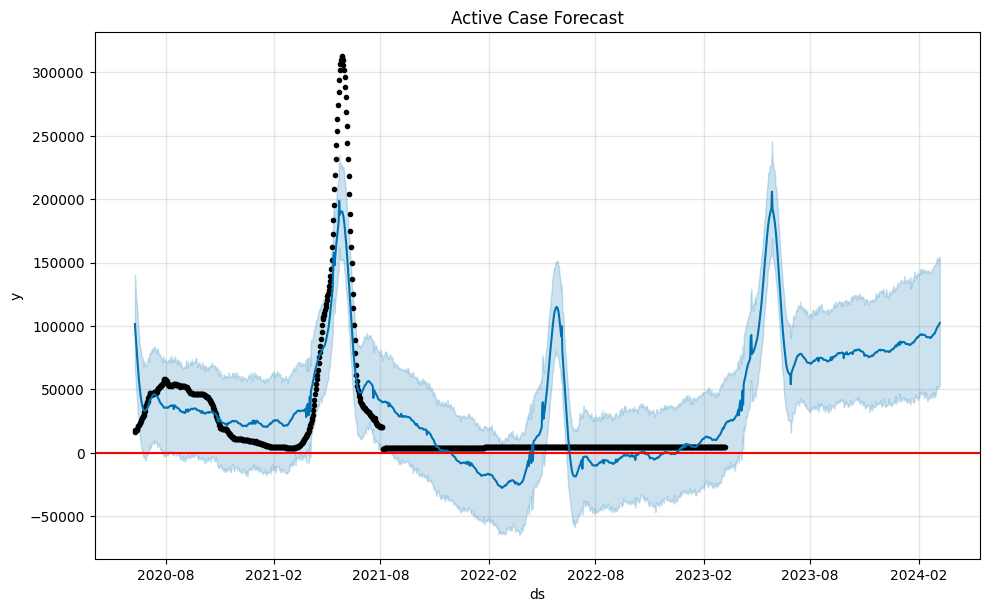

In [59]:
m.plot(forecast)
plt.axhline(y=0, color='red')
plt.title('Active Case Forecast')

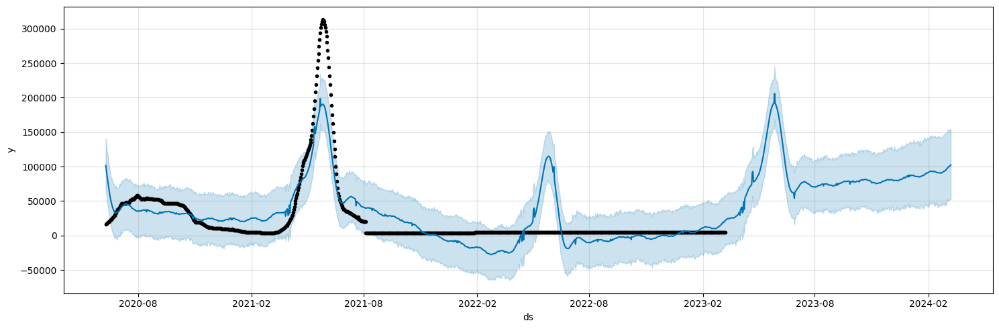

In [60]:
# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = m.plot(forecast,ax=ax)
plt.show()

In [61]:
X_tst_final= m.predict(df)
X_tst_final[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
996,2023-03-03,16410.814856,-20275.652349,53503.566950
997,2023-03-04,17430.876479,-18903.113981,54457.267992
998,2023-03-05,18641.659804,-19115.626247,56514.723371
999,2023-03-06,19526.190853,-16575.271827,59636.482424
1000,2023-03-07,19021.618028,-17634.088161,55429.752578
1001,2023-03-08,20613.359308,-13829.036399,56576.154025
1002,2023-03-09,21552.237622,-16535.483013,57379.960396


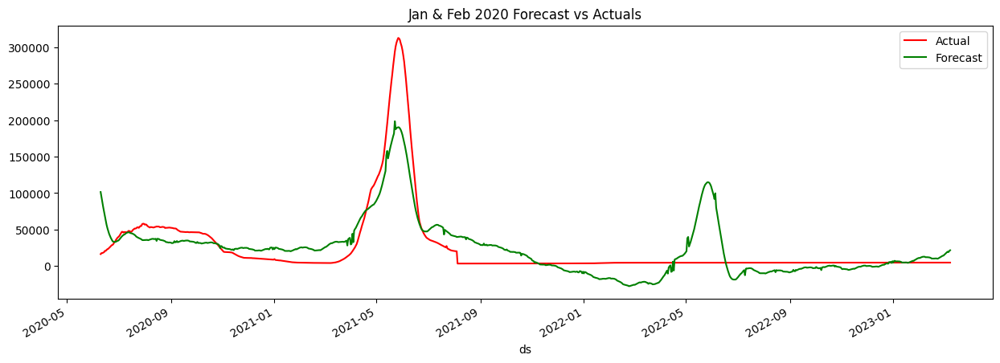

In [62]:
f, ax = plt.subplots(figsize=(14,5))
f.set_figheight(5)
f.set_figwidth(15)
df.plot(kind='line',x='ds', y='y', color='red', label='Actual', ax=ax)
X_tst_final.plot(kind='line',x='ds',y='yhat', color='green',label='Forecast', ax=ax)
plt.title('Jan & Feb 2020 Forecast vs Actuals')
plt.show()

In [63]:
MAPE = mean_absolute_percentage_error(df['y'],abs(X_tst_final['yhat']))
print('MAPE', MAPE)

MAPE 447.08954942152275
